In [118]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline
import os
import sklearn
from math import sqrt
from sklearn.metrics import mean_squared_error, r2_score
import scipy.stats as stats
%matplotlib inline

In [119]:
os.chdir('C:\\Users\\Zoidb\\Downloads')

In [120]:
data = pd.read_csv('train.csv')

data.head()

,Id,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,V29,Target
0,138662,-0.711273,1.272483,1.681631,0.039897,-0.312381,-1.161083,0.853875,-0.173979,-0.438558,...,-0.208181,-0.414631,0.057957,0.930321,-0.165598,0.038799,0.384295,0.192762,21.87,0
1,235999,1.990679,-0.128465,-1.700556,0.529839,0.136889,-1.404270,0.593353,-0.456700,0.648260,...,0.018179,0.179084,-0.004248,0.039531,0.333765,-0.225201,-0.047285,-0.059682,49.99,0
2,245376,1.812653,-0.476162,-0.338988,1.386750,-0.745965,-0.449870,-0.492226,0.029904,1.129394,...,0.252668,0.655719,0.090057,-0.136884,-0.172452,-0.556921,0.036490,-0.021575,79.00,0
3,202483,-1.014219,0.522775,-0.337978,-1.957797,3.578395,3.266965,0.602857,0.644645,-0.305879,...,0.147742,0.590740,-0.680551,0.745346,1.119496,0.013520,0.004530,-0.132643,6.00,0
4,9710,-0.967270,-0.053815,2.273463,-0.894434,0.728924,0.153524,-0.038330,0.165252,1.172526,...,0.106692,0.514430,-0.081546,-0.305042,-0.354883,0.896254,-0.182293,-0.142810,15.95,0


In [121]:
data['Target'].value_counts()

#Extremely imbalanced dataset


0    24602
1      244
Name: Target, dtype: int64

In [122]:
data = data.drop(['Id'],axis=1)

In [123]:
continuous = [
    var for var in data.columns if data[var].dtype != 'O'
    if var not in ['Target']
]

## Data Exploration

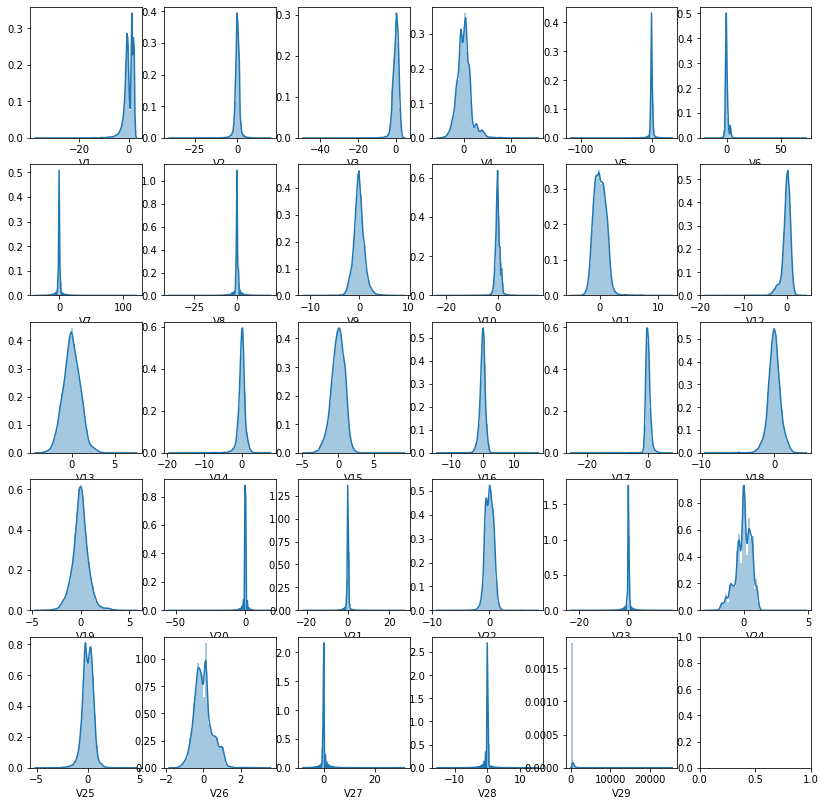

In [124]:
fig, axs = plt.subplots(ncols=6, nrows=5,figsize=(14,14))
axs = axs.flatten()

for i, var in enumerate(continuous):
    sns.distplot(data[data[var].notnull()][var], ax=axs[i]);

Most of the variables seem to not be normally distributed. The only ones that seem normally distributed are V24, V19, V13, V15, and V9. I will check the Q-Q plots to make sure.

((array([-4.02992481, -3.8163647 , -3.69961479, ...,  3.69961479,
          3.8163647 ,  4.02992481]),
  array([-2.7599422 , -2.72793525, -2.7215459 , ...,  3.57775326,
          3.92660368,  4.58454914])),
 (0.5943555251269428, -0.005632460926828965, 0.9863366091663196))

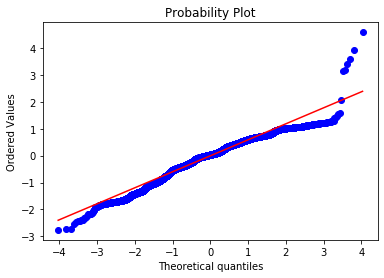

In [125]:
stats.probplot(data['V24'], dist="norm", plot=plt)

## The points at the end curve up, so not normally distributed

((array([-4.02992481, -3.8163647 , -3.69961479, ...,  3.69961479,
          3.8163647 ,  4.02992481]),
  array([-4.39528298, -4.36433218, -3.83886333, ...,  4.13003143,
          4.85125514,  5.50174721])),
 (0.8170380676267376, 0.0027778023328507537, 0.9900691605211095))

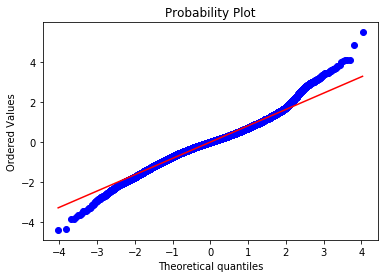

In [126]:
## Tails curve up and down respectively, not normally distributed

stats.probplot(data['V19'], dist="norm", plot=plt)

((array([-4.02992481, -3.8163647 , -3.69961479, ...,  3.69961479,
          3.8163647 ,  4.02992481]),
  array([-3.84497361, -3.83561784, -3.69646429, ...,  4.04457709,
          4.0993519 ,  7.12688296])),
 (0.992567722531442, 0.0013621654254613541, 0.9994679665462575))

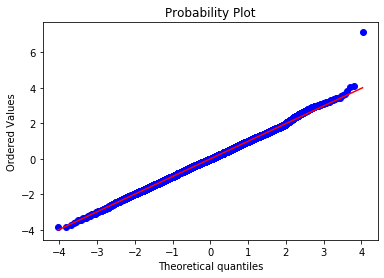

In [127]:
## Other than one outlier, seems to be normally distributed

stats.probplot(data['V13'], dist="norm", plot=plt)

((array([-4.02992481, -3.8163647 , -3.69961479, ...,  3.69961479,
          3.8163647 ,  4.02992481]),
  array([-4.49894468, -3.83261892, -3.73808233, ...,  3.72235871,
          4.76677503,  8.8777416 ])),
 (0.9140835498267385, 0.0029100849920313553, 0.9956745436267931))

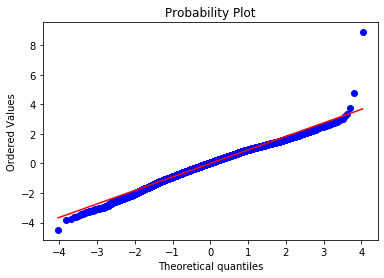

In [128]:
## Other than one or two outliers 

stats.probplot(data['V15'], dist="norm", plot=plt)

((array([-4.02992481, -3.8163647 , -3.69961479, ...,  3.69961479,
          3.8163647 ,  4.02992481]),
  array([-11.12662352, -10.84252587,  -9.46257261, ...,   8.43378763,
           8.88861397,   8.91820235])),
 (1.1172755348967605, -0.0179394002468802, 0.9792694063337174))

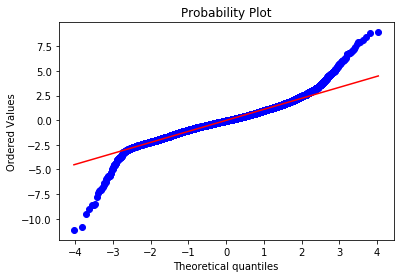

In [129]:
#Ends of the line curve up and down, not normally distributed

stats.probplot(data['V9'], dist="norm", plot=plt)

I will need to transform all variables to make them more normally distributed

In [130]:
data.isnull().sum()

##Will need to impute V1 and V20

V1        2387
V2           0
V3           0
V4           0
V5           0
V6           0
V7           0
V8           0
V9           0
V10          0
V11          0
V12          0
V13          0
V14          0
V15          0
V16          0
V17          0
V18          0
V19          0
V20       2529
V21          0
V22          0
V23          0
V24          0
V25          0
V26          0
V27          0
V28          0
V29          0
Target       0
dtype: int64

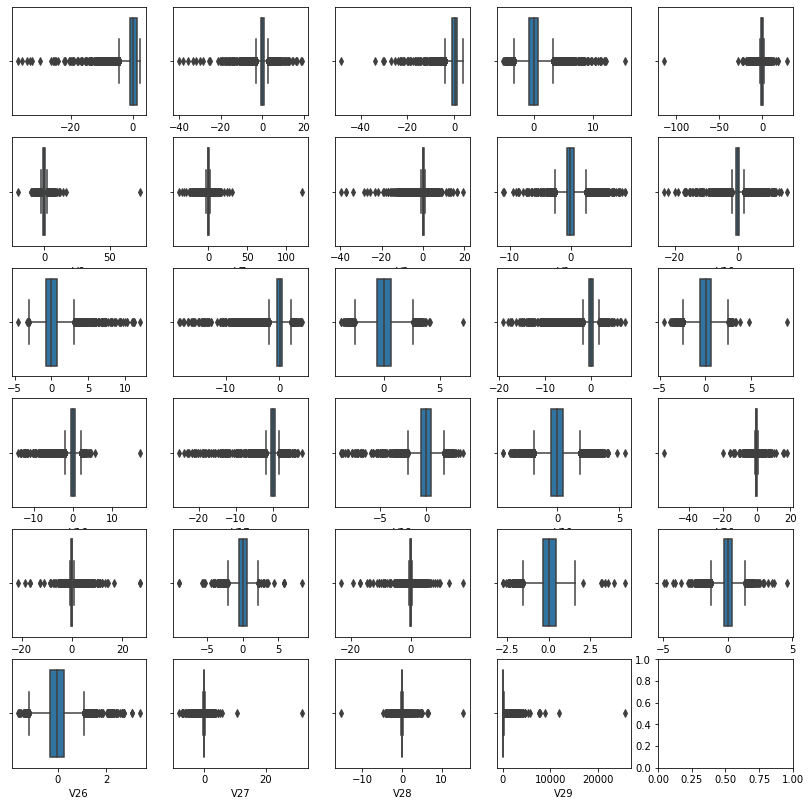

In [131]:
fig, axs = plt.subplots(ncols=5, nrows=6,figsize=(14,14))
axs = axs.flatten()

for i, var in enumerate(continuous):
    sns.boxplot(data[data[var].notnull()][var], ax=axs[i], orient='h');
    
##There are a ton of outliers for each variable. Further emphasizes the need to transform and scale the variables

## Data Pre-Processing

In [132]:
## Performing Train Test Split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
  data.drop('Target', axis=1), data['Target'], test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((17392, 29), (7454, 29))

In [133]:
## I choose to perform Multiple Chain Imputation as it not only retains the most information about the distributions 
## it also incorporates additional information through auxillary variables by using regressions to impute the missing observations.
## I choose to use the ExtraTreesRegressor because I feel it would best fit the data and retain the most accurate distributions
## of variables with missing values

from sklearn.linear_model import BayesianRidge
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

mice_imputer = Pipeline(steps=[
    ('mice_imputer', IterativeImputer(estimator= BayesianRidge(),
                           max_iter=10, random_state=0)),
])


preprocessor = ColumnTransformer(transformers=[
    ('num_mice_imputer', mice_imputer, ['V1','V20'])
    ], remainder='passthrough')

preprocessor.fit(X_train)



ColumnTransformer(n_jobs=None, remainder='passthrough', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('num_mice_imputer',
                                 Pipeline(memory=None,
                                          steps=[('mice_imputer',
                                                  IterativeImputer(add_indicator=False,
                                                                   estimator=BayesianRidge(alpha_1=1e-06,
                                                                                           alpha_2=1e-06,
                                                                                           alpha_init=None,
                                                                                           compute_score=False,
                                                                                           copy_X=True,
                                                                                

In [134]:
X_train_impute = pd.DataFrame(preprocessor.transform(X_train))
X_test_impute = pd.DataFrame(preprocessor.transform(X_test))   
                             
X_train_impute.columns = X_train.columns
X_test_impute.columns = X_test.columns

X_train_impute

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29
0,-0.902608,-0.028262,0.736356,1.837999,0.073168,0.752500,-0.810442,1.234869,-0.245996,-0.596657,...,-1.220345,0.045518,0.135989,-0.270570,0.378354,0.589437,-0.455658,-0.146953,-0.159533,28.68
1,-0.374011,-0.268079,0.744446,-0.314238,-0.202548,0.232955,-0.136096,0.138597,0.554068,0.616111,...,-0.000649,0.212982,0.737704,-0.292132,0.435830,0.166798,0.796788,-0.096117,-0.000939,23.00
2,-1.439535,-0.233212,0.773863,2.483011,1.545856,0.624467,-0.059338,0.664424,0.119607,-0.952165,...,-1.791643,-0.182235,-0.496680,-0.172615,0.384385,0.315382,-0.304659,-0.043762,0.066663,46.58
3,-0.051563,0.005826,0.774325,-0.310889,-1.297379,2.831516,3.406225,1.006143,0.092830,-0.222584,...,0.484647,-0.067650,-0.144749,-0.340466,1.041397,0.025283,0.205551,-0.934937,-0.276317,59.63
4,-0.404330,-0.045579,0.049303,0.216187,-2.871552,0.636782,-0.810734,0.837435,-0.072497,-1.615550,...,-0.391808,0.204018,0.211648,-0.037330,0.661439,-0.150715,-0.601776,0.049565,0.140904,38.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17387,1.532594,0.252638,-0.345535,-0.016672,3.705822,-0.036824,1.286208,-0.482709,0.222436,-0.314042,...,-1.597662,0.126030,-0.006853,0.095411,0.011389,-0.442803,-0.187163,-0.002975,0.015742,200.26
17388,-0.612652,0.899546,1.502744,0.019048,-0.790457,0.855742,-1.223141,1.811888,-1.115155,1.552801,...,-0.101146,0.015777,1.321148,-0.230491,0.060420,-0.649106,-0.313395,0.379425,-0.270389,1.79
17389,-0.336567,-0.715800,-0.601807,1.195672,-2.792221,-1.550034,0.140400,-0.878254,-1.623694,-1.987005,...,-0.867956,1.328488,-0.776991,-0.537942,-0.004092,1.535449,-0.035892,0.167002,0.101435,136.00
17390,-0.132203,-0.733599,-0.892091,0.096815,-0.702545,2.032932,-0.497765,0.860401,-0.581806,0.431902,...,-0.153968,0.136887,1.203405,-0.174508,0.293362,-0.177501,0.352920,-0.681189,0.093792,53.00


In [135]:
## Since there are variables that are less than or equal to zero, I use the Yeo-Johnson Transformer to transform the variables

from feature_engine.variable_transformers import YeoJohnsonTransformer
yjt = YeoJohnsonTransformer(variables=continuous)
yjt.fit(X_train)

# transform the data
train_yjt= yjt.transform(X_train_impute)
test_yjt= yjt.transform(X_test_impute)

train_yjt.columns = X_train_impute.columns
test_yjt.columns = X_test_impute.columns

train_yjt

C:\Users\Zoidb\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1371: RuntimeWarning: invalid value encountered in greater_equal
  pos = x >= 0  # binary mask
C:\Users\Zoidb\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1479: RuntimeWarning: invalid value encountered in sign
  loglike += (lmb - 1) * (np.sign(data) * np.log(np.abs(data) + 1)).sum(axis=0)


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29
0,-0.152104,-0.028189,0.838861,1.603919,0.073631,0.681893,-0.834878,1.379484,-0.248670,-0.593530,...,-0.153624,0.045422,0.136835,-0.268213,0.404082,0.614734,-0.504892,-0.148198,-0.159538,3.116414
1,-0.134745,-0.262107,0.849101,-0.324634,-0.199191,0.224917,-0.136904,0.140825,0.541829,0.619453,...,-0.000648,0.211006,0.759278,-0.289401,0.469644,0.169026,0.679438,-0.096657,-0.000939,2.936421
2,-0.154027,-0.228639,0.886506,2.101040,1.701768,0.573938,-0.059495,0.710388,0.118957,-0.944823,...,-0.154307,-0.183712,-0.486641,-0.171626,0.410912,0.323069,-0.327124,-0.043876,0.066662,3.509474
3,-0.042917,0.005829,0.887095,-0.321072,-1.194648,2.185482,3.135934,1.105586,0.092435,-0.222102,...,3.239511,-0.067860,-0.143801,-0.336810,1.218220,0.025336,0.195823,-0.977249,-0.276334,3.707733
4,-0.137349,-0.045392,0.049815,0.211307,-2.488294,0.584440,-0.835186,0.908267,-0.072741,-1.596928,...,-0.136325,0.202200,0.213656,-0.037281,0.736631,-0.148917,-0.686069,0.049420,0.140899,3.355585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17387,309.673221,0.258121,-0.323605,-0.016704,4.406398,-0.037044,1.232796,-0.459182,0.220264,-0.313108,...,-0.154188,0.125319,-0.006851,0.095723,0.011414,-0.428686,-0.195786,-0.002976,0.015742,4.654235
17388,-0.147498,0.960493,1.892337,0.019007,-0.747509,0.767082,-1.274647,2.099678,-1.160745,1.570438,...,-0.071690,0.015766,1.383203,-0.228759,0.061115,-0.620506,-0.337138,0.371798,-0.270406,0.999944
17389,-0.130875,-0.678536,-0.541080,1.082490,-2.425690,-1.855044,0.139548,-0.808656,-1.712490,-1.960492,...,-0.151801,1.270220,-0.754140,-0.529302,-0.004089,1.681306,-0.036216,0.165422,0.101433,4.357034
17390,-0.085334,-0.694644,-0.770208,0.095793,-0.667826,1.650620,-0.507628,0.934882,-0.595610,0.433620,...,-0.093355,0.136051,1.255945,-0.173497,0.309056,-0.175030,0.325952,-0.704801,0.093790,3.613309


In [136]:
## Setting up f2 score

from sklearn.metrics import fbeta_score, make_scorer
metric = make_scorer(fbeta_score, beta=2)


In [137]:
## Since there was also very high variance between many of the variables, I want to discretize and reduce the variance.
## I choose to use Kbinsdiscretizer because it will bin the data while still retaining the patterns and groupings present
## in the original dataset

from sklearn.preprocessing import KBinsDiscretizer
disc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='kmeans')

disc.fit(train_yjt)

X_train_K = pd.DataFrame(disc.transform(train_yjt))
X_test_K = pd.DataFrame(disc.transform(test_yjt))

X_train_K.columns = train_yjt.columns
X_test_K.columns = test_yjt.columns


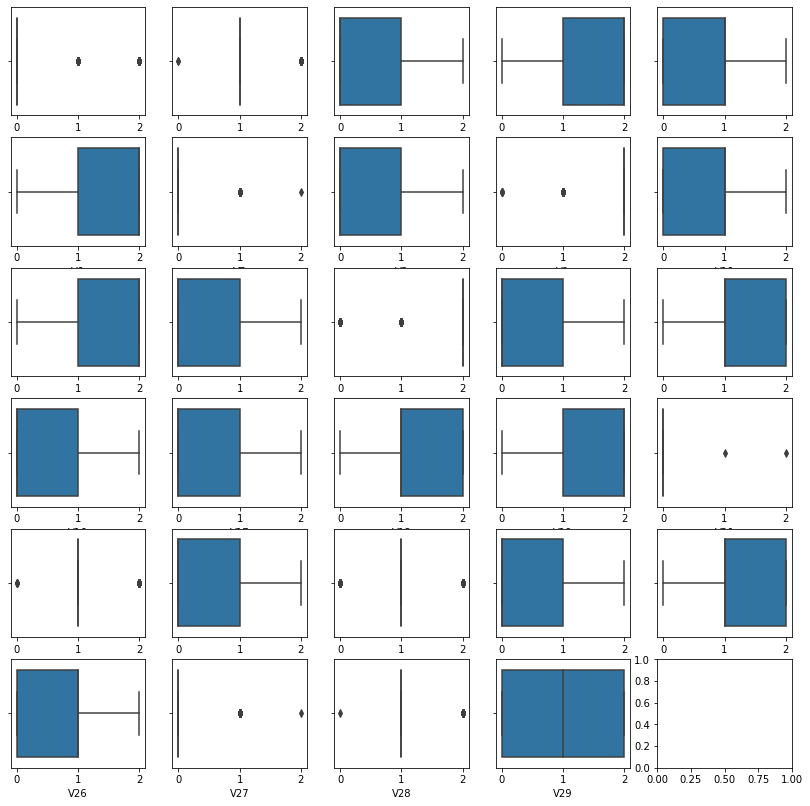

In [138]:
## Before scaling, I need to see how many outliers remain because some scaling methods are very sensitive to outliers

continuous = [
    var for var in X_train_K.columns if data[var].dtype != 'O'
]

fig, axs = plt.subplots(ncols=5, nrows=6,figsize=(14,14))
axs = axs.flatten()

for i, var in enumerate(continuous):
    sns.boxplot(X_train_K[X_train_K[var].notnull()][var], ax=axs[i], orient='h');
    
## There are still a few outliers, but not many

In [139]:
## Finally, I need to scale the variables. Since there are still a couple of outliers present, I have chosen to do RobustScaling
## as this method is less sensitive to outliers

from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
scaler.fit(X_train_K)

X_train = pd.DataFrame(scaler.transform(X_train_K))
X_test = pd.DataFrame(scaler.transform(X_test_K))

X_train.columns = X_train_K.columns
X_test.columns = X_test_K.columns

X_train

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,-1.0,0.0,0.0,0.0
1,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,...,0.0,0.0,0.0,0.0,1.0,1.0,-1.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,-1.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.5
4,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,-1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,-1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17387,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.5
17388,0.0,0.0,1.0,0.0,-1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,-1.0,-1.0,1.0,0.0,-0.5
17389,0.0,0.0,0.0,0.0,-1.0,-1.0,0.0,0.0,0.0,-1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.5
17390,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


## Modeling

In [140]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

logistic = LogisticRegression(solver='saga',max_iter=5000)

#parameters
param_log = {'penalty' : ['l2','none'], 'tol' : [.01, .1, 1],}

clf = GridSearchCV(logistic, param_log, cv=5, verbose=0, scoring=metric)
best_log = clf.fit(X_train,y_train)

print("Best parameters: {}".format(best_log.best_params_))
print("Best cross-validation score: {:.2f}".format(best_log.best_score_))
print("Best estimator:\n{}".format(best_log.best_estimator_))

print("Logistic Train Performance: ", best_log.score(X_train,y_train))
print("Logistic Test Performance: ", best_log.score(X_test,y_test))

Best parameters: {'penalty': 'none', 'tol': 0.1}
Best cross-validation score: 0.82
Best estimator:
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=5000,
                   multi_class='auto', n_jobs=None, penalty='none',
                   random_state=None, solver='saga', tol=0.1, verbose=0,
                   warm_start=False)
Logistic Train Performance:  0.8233173076923077
Logistic Test Performance:  0.7725947521865889


In [141]:
# KNN Classifier, but I used only 3 cvs because I ran more parameters than usual and it was taking a long time to run

from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()

#parameters

param_knn = {'n_neighbors': range(1,8), 'weights': ['distance']}


grid_knn = GridSearchCV(knn, param_knn, cv=3, return_train_score=True, scoring=metric)
grid_knn.fit(X_train, y_train)

# Mean Cross Validation Score
print("Best Mean Cross-validation score: {:.2f}".format(grid_knn.best_score_))
print()

#find best parameters
print('KNN parameters: ', grid_knn.best_params_)

# Check test data set performance
print("KNN Train Performance:", grid_knn.score(X_train,y_train))
print("KNN Test Performance: ", grid_knn.score(X_test,y_test))

Best Mean Cross-validation score: 0.82

KNN parameters:  {'n_neighbors': 3, 'weights': 'distance'}
KNN Train Performance: 0.9906759906759907
KNN Test Performance:  0.8238636363636365


In [142]:
# Decision Tree model

from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(random_state=0)

#parameters

param_DT = {"criterion":['gini','entropy'], "splitter":['best','random'], "max_depth": range(1,10),
           "min_samples_split": range(2,20,1),
           "max_leaf_nodes": range(2,10)}


grid_dtree = GridSearchCV(dtree, param_DT, cv=5, return_train_score = True, scoring=metric)
grid_dtree.fit(X_train, y_train)

# Mean Cross Validation Score
print("Best Mean Cross-validation score: {:.2f}".format(grid_dtree.best_score_))
print()

#find best parameters
print('Decision Tree parameters: ', grid_dtree.best_params_)

# Check test data set performance
print("Decision Tree Performance: ", grid_dtree.score(X_test,y_test))

Best Mean Cross-validation score: 0.83

Decision Tree parameters:  {'criterion': 'gini', 'max_depth': 5, 'max_leaf_nodes': 7, 'min_samples_split': 2, 'splitter': 'best'}
Decision Tree Performance:  0.760233918128655


In [143]:
#Linear SVC
from sklearn.svm import LinearSVC

svc = LinearSVC(max_iter=10000)
svc.fit(X_train, y_train)

cv_score = cross_val_score(svc, X_train, y_train,scoring=metric)

# Mean Cross validation Score
print("Mean Cross-validation scores: {}".format(cv_score.mean()))
print()


print('train score: ', svc.score(X_train, y_train))
print('test score: ', svc.score(X_test, y_test))

Mean Cross-validation scores: 0.8212929489851186

train score:  0.9975850965961361
test score:  0.9971827206868795


In [144]:
#Support Vector Machine with  rbf Kernel, I cut some parameters and only did 3 cvs because it was taking multiple hours to run

from sklearn.svm import SVC

svc = SVC(cache_size=2000)
svc.fit(X_train, y_train)

rbf_kernel = SVC(kernel = 'rbf')
param_rbf_kernel = {'C': [10,100,1000],'gamma':[0.001,0.1,1,10], 'tol':[.0001,.001,.01]}

grid_rbf_kernel = GridSearchCV(rbf_kernel, param_rbf_kernel, cv=3, n_jobs=-1, scoring=metric)
grid_rbf_kernel.fit(X_train, y_train)

print("Best Mean Cross-validation score: {:.2f}".format(grid_rbf_kernel.best_score_))
print()
print('train score: ', grid_rbf_kernel.score(X_train, y_train))
print('test score: ', grid_rbf_kernel.score(X_test, y_test))
print(grid_rbf_kernel.best_params_)

Best Mean Cross-validation score: 0.85

train score:  0.9422850412249705
test score:  0.7947976878612717
{'C': 10, 'gamma': 0.1, 'tol': 0.0001}


In [145]:
#Support Vector Machine with poly kernel
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

svc = SVC(cache_size = 2000)
svc.fit(X_train, y_train)

poly_kernel = SVC(kernel = 'poly')
param_poly_kernel = {'degree':range(3,5),'C': [10,100,1000],'gamma':[.001,.01,.1], 'tol':[.0001,.001,.01,.1]}

grid_poly_kernel = GridSearchCV(poly_kernel, param_poly_kernel, cv=3, n_jobs=-1, scoring=metric)
grid_poly_kernel.fit(X_train, y_train)

print("Best Mean Cross-validation score: {:.2f}".format(grid_poly_kernel.best_score_))
print()
print('train score: ', grid_poly_kernel.score(X_train, y_train))
print('test score: ', grid_poly_kernel.score(X_test, y_test))
print(grid_poly_kernel.best_params_)

Best Mean Cross-validation score: 0.82

train score:  0.8502994011976048
test score:  0.7725947521865889
{'C': 1000, 'degree': 3, 'gamma': 0.01, 'tol': 0.0001}


In [146]:
# Support Vector Machine with Sigmoid kernel
svc = SVC(cache_size=2000)
svc.fit(X_train, y_train)

sig_kernel = SVC(kernel = 'sigmoid')
param_sig_kernel = {'C': [100,1000,10000],'gamma':[0.0001,0.001,0.1,]}

grid_sig_kernel = GridSearchCV(sig_kernel, param_sig_kernel, cv=3, n_jobs=-1, scoring=metric)
grid_sig_kernel.fit(X_train, y_train)

print("Best Mean Cross-validation score: {:.2f}".format(grid_sig_kernel.best_score_))
print()
print('train score: ', grid_sig_kernel.score(X_train, y_train))
print('test score: ', grid_sig_kernel.score(X_test, y_test))
print(grid_sig_kernel.best_params_)

Best Mean Cross-validation score: 0.83

train score:  0.8313397129186603
test score:  0.7971014492753623
{'C': 10000, 'gamma': 0.001}


In [147]:
#Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=0)
rfc_param = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [2,4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

grid_rfc = GridSearchCV(rfc, rfc_param,cv=3, return_train_score=True, scoring=metric)
grid_rfc.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_rfc.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_rfc.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_rfc.best_score_}')
print(f'Best Parameters Are {grid_rfc.best_params_}')

Train score: 0.86
Test score: 0.77
Best Mean Cross Validation Score is 0.8374231534514927
Best Parameters Are {'criterion': 'entropy', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 500}


In [148]:
#Extra Trees Classifier

from sklearn.ensemble import ExtraTreesClassifier

etc= ExtraTreesClassifier(random_state=42)
etc_param = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [2,4,5,6,7,8],
}
grid_etc = GridSearchCV(etc, etc_param,cv=5, return_train_score=True, n_jobs=-1,scoring=metric)
grid_etc.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_etc.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_etc.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_etc.best_score_}')
print(f'Best Parameters Are {grid_etc.best_params_}')

Train score: 0.84
Test score: 0.76
Best Mean Cross Validation Score is 0.798888527721324
Best Parameters Are {'max_depth': 8, 'max_features': 'auto', 'n_estimators': 200}


In [149]:
#I only run 3 cvs and less parameters because it originally did not finish after multiple hours

from  xgboost import XGBClassifier
xgbc= XGBClassifier()
xgbc_param = {
              'max_depth' : [1,2,3],
              'n_estimators' : [50,100],
              'learning_rate' : [0.1,0.5,0.6],
               'min_child_weight' : [1,3],
                'subsample':[0.6,0.7,0.8]
             }
xgbc_grid = GridSearchCV(xgbc, xgbc_param,cv=3, return_train_score=True, n_jobs=-1, scoring=metric)
xgbc_grid.fit(X_train,y_train)

print('Train score: {:.2f}'.format(xgbc_grid.score(X_train, y_train)))
print('Test score: {:.2f}'.format(xgbc_grid.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {xgbc_grid.best_score_}')
print(f'Best Parameters Are {xgbc_grid.best_params_}')

Train score: 0.84
Test score: 0.76
Best Mean Cross Validation Score is 0.8404381813149767
Best Parameters Are {'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.6}


In [150]:
#Gradient Boost Classifier

from  sklearn.ensemble import GradientBoostingClassifier
gbc= GradientBoostingClassifier(random_state=42)
gbc_param = {
              'max_depth' : [3,6,4],
              'n_estimators' : [50,100,150],
              'learning_rate' : [0.4,.6,.8,1.0],
             }
grid_gbc = GridSearchCV(gbc, gbc_param,cv=5, return_train_score=True,scoring=metric)
grid_gbc.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_gbc.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_gbc.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_gbc.best_score_}')
print(f'Best Parameters Are {grid_gbc.best_params_}')

Train score: 0.67
Test score: 0.51
Best Mean Cross Validation Score is 0.7379515004110375
Best Parameters Are {'learning_rate': 0.4, 'max_depth': 4, 'n_estimators': 50}


In [151]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda= LinearDiscriminantAnalysis()
lda_param = {'solver':['eigen'],'shrinkage':['auto']
             }
grid_lda = GridSearchCV(lda, lda_param,cv=5, return_train_score=True,scoring=metric)
grid_lda.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_lda.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_lda.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_lda.best_score_}')
print(f'Best Parameters Are {grid_lda.best_params_}')

Train score: 0.83
Test score: 0.78
Best Mean Cross Validation Score is 0.8228361148471264
Best Parameters Are {'shrinkage': 'auto', 'solver': 'eigen'}


In [152]:
from sklearn.semi_supervised import LabelPropagation

lp = LabelPropagation(kernel='knn')
lp_param = { 'n_neighbors':range(1,5)
             }
grid_lp = GridSearchCV(lp, lp_param,cv=5, return_train_score=True,scoring=metric)
grid_lp.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_lp.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_lp.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_lp.best_score_}')
print(f'Best Parameters Are {grid_lp.best_params_}')

Train score: 0.86
Test score: 0.82
Best Mean Cross Validation Score is 0.8121745296333147
Best Parameters Are {'n_neighbors': 3}


In [154]:
from sklearn.semi_supervised import LabelSpreading

ls = LabelSpreading(kernel='knn')
ls_param = { 'n_neighbors':range(1,5), 'alpha':[.1,.3,.5,.7], 'max_iter':[100,1000] }
grid_ls = GridSearchCV(ls, ls_param,cv=5, return_train_score=True,scoring=metric)
grid_ls.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_ls.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_ls.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_ls.best_score_}')
print(f'Best Parameters Are {grid_ls.best_params_}')

Train score: 0.86
Test score: 0.82
Best Mean Cross Validation Score is 0.8121745296333147
Best Parameters Are {'alpha': 0.1, 'max_iter': 100, 'n_neighbors': 3}


In [155]:
from catboost import CatBoostClassifier

cat = CatBoostClassifier()
cat_param = {'learning_rate':[.2,.4,.6,.8], 'l2_leaf_reg':range(1,5), 'random_strength':range(1,3)}

grid_cat = GridSearchCV(cat, cat_param,cv=5, return_train_score=True,scoring=metric)
grid_cat.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_cat.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_cat.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_cat.best_score_}')
print(f'Best Parameters Are {grid_cat.best_params_}')

0:	learn: 0.2929554	total: 82.9ms	remaining: 1m 22s
1:	learn: 0.1161754	total: 93.8ms	remaining: 46.8s
2:	learn: 0.0541692	total: 105ms	remaining: 35s
3:	learn: 0.0324012	total: 117ms	remaining: 29.1s
4:	learn: 0.0212334	total: 131ms	remaining: 26.2s
5:	learn: 0.0166965	total: 142ms	remaining: 23.6s
6:	learn: 0.0142492	total: 153ms	remaining: 21.7s
7:	learn: 0.0127844	total: 165ms	remaining: 20.5s
8:	learn: 0.0123257	total: 177ms	remaining: 19.4s
9:	learn: 0.0116838	total: 195ms	remaining: 19.3s
10:	learn: 0.0107707	total: 208ms	remaining: 18.7s
11:	learn: 0.0098087	total: 220ms	remaining: 18.1s
12:	learn: 0.0092143	total: 232ms	remaining: 17.6s
13:	learn: 0.0087958	total: 244ms	remaining: 17.2s
14:	learn: 0.0085977	total: 255ms	remaining: 16.7s
15:	learn: 0.0083399	total: 268ms	remaining: 16.5s
16:	learn: 0.0078500	total: 283ms	remaining: 16.4s
17:	learn: 0.0076053	total: 296ms	remaining: 16.1s
18:	learn: 0.0074616	total: 314ms	remaining: 16.2s
19:	learn: 0.0073687	total: 330ms	remain

167:	learn: 0.0006150	total: 2.69s	remaining: 13.3s
168:	learn: 0.0006120	total: 2.7s	remaining: 13.3s
169:	learn: 0.0006071	total: 2.72s	remaining: 13.3s
170:	learn: 0.0006035	total: 2.73s	remaining: 13.3s
171:	learn: 0.0006003	total: 2.75s	remaining: 13.2s
172:	learn: 0.0005960	total: 2.77s	remaining: 13.2s
173:	learn: 0.0005942	total: 2.78s	remaining: 13.2s
174:	learn: 0.0005928	total: 2.8s	remaining: 13.2s
175:	learn: 0.0005920	total: 2.81s	remaining: 13.2s
176:	learn: 0.0005917	total: 2.82s	remaining: 13.1s
177:	learn: 0.0005895	total: 2.84s	remaining: 13.1s
178:	learn: 0.0005889	total: 2.86s	remaining: 13.1s
179:	learn: 0.0005801	total: 2.88s	remaining: 13.1s
180:	learn: 0.0005737	total: 2.89s	remaining: 13.1s
181:	learn: 0.0005709	total: 2.9s	remaining: 13s
182:	learn: 0.0005683	total: 2.91s	remaining: 13s
183:	learn: 0.0005676	total: 2.93s	remaining: 13s
184:	learn: 0.0005606	total: 2.95s	remaining: 13s
185:	learn: 0.0005568	total: 2.96s	remaining: 13s
186:	learn: 0.0005551	tot

339:	learn: 0.0004190	total: 5.01s	remaining: 9.73s
340:	learn: 0.0004190	total: 5.02s	remaining: 9.71s
341:	learn: 0.0004190	total: 5.04s	remaining: 9.69s
342:	learn: 0.0004190	total: 5.05s	remaining: 9.67s
343:	learn: 0.0004190	total: 5.06s	remaining: 9.64s
344:	learn: 0.0004190	total: 5.07s	remaining: 9.62s
345:	learn: 0.0004190	total: 5.07s	remaining: 9.59s
346:	learn: 0.0004190	total: 5.08s	remaining: 9.56s
347:	learn: 0.0004190	total: 5.09s	remaining: 9.54s
348:	learn: 0.0004190	total: 5.1s	remaining: 9.51s
349:	learn: 0.0004190	total: 5.11s	remaining: 9.49s
350:	learn: 0.0004190	total: 5.12s	remaining: 9.46s
351:	learn: 0.0004190	total: 5.13s	remaining: 9.44s
352:	learn: 0.0004190	total: 5.14s	remaining: 9.42s
353:	learn: 0.0004190	total: 5.15s	remaining: 9.39s
354:	learn: 0.0004190	total: 5.16s	remaining: 9.37s
355:	learn: 0.0004190	total: 5.17s	remaining: 9.35s
356:	learn: 0.0004190	total: 5.18s	remaining: 9.32s
357:	learn: 0.0004190	total: 5.19s	remaining: 9.3s
358:	learn: 0.

508:	learn: 0.0004041	total: 6.77s	remaining: 6.53s
509:	learn: 0.0004041	total: 6.79s	remaining: 6.53s
510:	learn: 0.0004041	total: 6.8s	remaining: 6.51s
511:	learn: 0.0004041	total: 6.82s	remaining: 6.5s
512:	learn: 0.0004041	total: 6.83s	remaining: 6.48s
513:	learn: 0.0004041	total: 6.84s	remaining: 6.47s
514:	learn: 0.0004041	total: 6.85s	remaining: 6.45s
515:	learn: 0.0004041	total: 6.86s	remaining: 6.44s
516:	learn: 0.0004041	total: 6.87s	remaining: 6.42s
517:	learn: 0.0004040	total: 6.89s	remaining: 6.41s
518:	learn: 0.0004040	total: 6.9s	remaining: 6.39s
519:	learn: 0.0004040	total: 6.91s	remaining: 6.38s
520:	learn: 0.0004040	total: 6.92s	remaining: 6.36s
521:	learn: 0.0004040	total: 6.92s	remaining: 6.34s
522:	learn: 0.0004040	total: 6.93s	remaining: 6.32s
523:	learn: 0.0004040	total: 6.94s	remaining: 6.3s
524:	learn: 0.0004040	total: 6.95s	remaining: 6.29s
525:	learn: 0.0004040	total: 6.96s	remaining: 6.27s
526:	learn: 0.0004040	total: 6.96s	remaining: 6.25s
527:	learn: 0.00

674:	learn: 0.0004033	total: 8.33s	remaining: 4.01s
675:	learn: 0.0004033	total: 8.34s	remaining: 4s
676:	learn: 0.0004033	total: 8.35s	remaining: 3.98s
677:	learn: 0.0004033	total: 8.37s	remaining: 3.98s
678:	learn: 0.0004033	total: 8.38s	remaining: 3.96s
679:	learn: 0.0004033	total: 8.39s	remaining: 3.95s
680:	learn: 0.0004033	total: 8.4s	remaining: 3.93s
681:	learn: 0.0004033	total: 8.41s	remaining: 3.92s
682:	learn: 0.0004033	total: 8.41s	remaining: 3.9s
683:	learn: 0.0004033	total: 8.42s	remaining: 3.89s
684:	learn: 0.0004033	total: 8.43s	remaining: 3.88s
685:	learn: 0.0004033	total: 8.44s	remaining: 3.86s
686:	learn: 0.0004033	total: 8.45s	remaining: 3.85s
687:	learn: 0.0004033	total: 8.46s	remaining: 3.83s
688:	learn: 0.0004033	total: 8.46s	remaining: 3.82s
689:	learn: 0.0004033	total: 8.47s	remaining: 3.81s
690:	learn: 0.0004033	total: 8.48s	remaining: 3.79s
691:	learn: 0.0004033	total: 8.49s	remaining: 3.78s
692:	learn: 0.0004033	total: 8.5s	remaining: 3.76s
693:	learn: 0.0004

846:	learn: 0.0003880	total: 10.1s	remaining: 1.82s
847:	learn: 0.0003880	total: 10.1s	remaining: 1.81s
848:	learn: 0.0003880	total: 10.1s	remaining: 1.8s
849:	learn: 0.0003880	total: 10.1s	remaining: 1.79s
850:	learn: 0.0003880	total: 10.1s	remaining: 1.78s
851:	learn: 0.0003880	total: 10.2s	remaining: 1.76s
852:	learn: 0.0003880	total: 10.2s	remaining: 1.75s
853:	learn: 0.0003880	total: 10.2s	remaining: 1.74s
854:	learn: 0.0003880	total: 10.2s	remaining: 1.73s
855:	learn: 0.0003880	total: 10.2s	remaining: 1.71s
856:	learn: 0.0003880	total: 10.2s	remaining: 1.7s
857:	learn: 0.0003880	total: 10.2s	remaining: 1.69s
858:	learn: 0.0003880	total: 10.2s	remaining: 1.68s
859:	learn: 0.0003880	total: 10.2s	remaining: 1.67s
860:	learn: 0.0003880	total: 10.2s	remaining: 1.65s
861:	learn: 0.0003880	total: 10.3s	remaining: 1.64s
862:	learn: 0.0003880	total: 10.3s	remaining: 1.63s
863:	learn: 0.0003880	total: 10.3s	remaining: 1.61s
864:	learn: 0.0003880	total: 10.3s	remaining: 1.6s
865:	learn: 0.0

13:	learn: 0.0077693	total: 210ms	remaining: 14.8s
14:	learn: 0.0077677	total: 220ms	remaining: 14.5s
15:	learn: 0.0075733	total: 241ms	remaining: 14.8s
16:	learn: 0.0071707	total: 267ms	remaining: 15.5s
17:	learn: 0.0069464	total: 284ms	remaining: 15.5s
18:	learn: 0.0067972	total: 301ms	remaining: 15.6s
19:	learn: 0.0066824	total: 316ms	remaining: 15.5s
20:	learn: 0.0065726	total: 334ms	remaining: 15.6s
21:	learn: 0.0064765	total: 348ms	remaining: 15.5s
22:	learn: 0.0063060	total: 362ms	remaining: 15.4s
23:	learn: 0.0059392	total: 378ms	remaining: 15.4s
24:	learn: 0.0055912	total: 392ms	remaining: 15.3s
25:	learn: 0.0054734	total: 417ms	remaining: 15.6s
26:	learn: 0.0054222	total: 431ms	remaining: 15.5s
27:	learn: 0.0051617	total: 444ms	remaining: 15.4s
28:	learn: 0.0051126	total: 458ms	remaining: 15.3s
29:	learn: 0.0050082	total: 474ms	remaining: 15.3s
30:	learn: 0.0049230	total: 486ms	remaining: 15.2s
31:	learn: 0.0048105	total: 498ms	remaining: 15.1s
32:	learn: 0.0044890	total: 513

177:	learn: 0.0004773	total: 2.6s	remaining: 12s
178:	learn: 0.0004767	total: 2.62s	remaining: 12s
179:	learn: 0.0004766	total: 2.63s	remaining: 12s
180:	learn: 0.0004758	total: 2.65s	remaining: 12s
181:	learn: 0.0004753	total: 2.66s	remaining: 12s
182:	learn: 0.0004749	total: 2.68s	remaining: 11.9s
183:	learn: 0.0004749	total: 2.69s	remaining: 11.9s
184:	learn: 0.0004722	total: 2.71s	remaining: 11.9s
185:	learn: 0.0004692	total: 2.72s	remaining: 11.9s
186:	learn: 0.0004688	total: 2.73s	remaining: 11.9s
187:	learn: 0.0004688	total: 2.74s	remaining: 11.8s
188:	learn: 0.0004659	total: 2.76s	remaining: 11.8s
189:	learn: 0.0004542	total: 2.78s	remaining: 11.8s
190:	learn: 0.0004520	total: 2.8s	remaining: 11.9s
191:	learn: 0.0004471	total: 2.81s	remaining: 11.8s
192:	learn: 0.0004443	total: 2.83s	remaining: 11.8s
193:	learn: 0.0004441	total: 2.84s	remaining: 11.8s
194:	learn: 0.0004428	total: 2.86s	remaining: 11.8s
195:	learn: 0.0004401	total: 2.87s	remaining: 11.8s
196:	learn: 0.0004398	to

346:	learn: 0.0003536	total: 4.56s	remaining: 8.59s
347:	learn: 0.0003536	total: 4.57s	remaining: 8.57s
348:	learn: 0.0003536	total: 4.58s	remaining: 8.55s
349:	learn: 0.0003536	total: 4.59s	remaining: 8.53s
350:	learn: 0.0003536	total: 4.6s	remaining: 8.51s
351:	learn: 0.0003536	total: 4.61s	remaining: 8.49s
352:	learn: 0.0003536	total: 4.62s	remaining: 8.47s
353:	learn: 0.0003536	total: 4.63s	remaining: 8.46s
354:	learn: 0.0003536	total: 4.64s	remaining: 8.43s
355:	learn: 0.0003536	total: 4.65s	remaining: 8.41s
356:	learn: 0.0003536	total: 4.66s	remaining: 8.4s
357:	learn: 0.0003535	total: 4.67s	remaining: 8.37s
358:	learn: 0.0003535	total: 4.67s	remaining: 8.35s
359:	learn: 0.0003535	total: 4.68s	remaining: 8.33s
360:	learn: 0.0003535	total: 4.69s	remaining: 8.3s
361:	learn: 0.0003535	total: 4.7s	remaining: 8.28s
362:	learn: 0.0003535	total: 4.71s	remaining: 8.26s
363:	learn: 0.0003535	total: 4.71s	remaining: 8.23s
364:	learn: 0.0003535	total: 4.72s	remaining: 8.22s
365:	learn: 0.00

508:	learn: 0.0003100	total: 6.33s	remaining: 6.11s
509:	learn: 0.0003100	total: 6.34s	remaining: 6.09s
510:	learn: 0.0003100	total: 6.35s	remaining: 6.08s
511:	learn: 0.0003100	total: 6.36s	remaining: 6.06s
512:	learn: 0.0003100	total: 6.37s	remaining: 6.04s
513:	learn: 0.0003100	total: 6.38s	remaining: 6.03s
514:	learn: 0.0003100	total: 6.38s	remaining: 6.01s
515:	learn: 0.0003100	total: 6.39s	remaining: 6s
516:	learn: 0.0003100	total: 6.4s	remaining: 5.98s
517:	learn: 0.0003100	total: 6.41s	remaining: 5.96s
518:	learn: 0.0003100	total: 6.42s	remaining: 5.95s
519:	learn: 0.0003100	total: 6.43s	remaining: 5.93s
520:	learn: 0.0003100	total: 6.43s	remaining: 5.92s
521:	learn: 0.0003100	total: 6.44s	remaining: 5.9s
522:	learn: 0.0003100	total: 6.45s	remaining: 5.89s
523:	learn: 0.0003100	total: 6.46s	remaining: 5.87s
524:	learn: 0.0003100	total: 6.47s	remaining: 5.86s
525:	learn: 0.0003100	total: 6.48s	remaining: 5.84s
526:	learn: 0.0003100	total: 6.49s	remaining: 5.83s
527:	learn: 0.000

677:	learn: 0.0003100	total: 7.89s	remaining: 3.75s
678:	learn: 0.0003100	total: 7.9s	remaining: 3.73s
679:	learn: 0.0003100	total: 7.91s	remaining: 3.72s
680:	learn: 0.0003100	total: 7.92s	remaining: 3.71s
681:	learn: 0.0003100	total: 7.93s	remaining: 3.7s
682:	learn: 0.0003100	total: 7.94s	remaining: 3.68s
683:	learn: 0.0003100	total: 7.95s	remaining: 3.67s
684:	learn: 0.0003100	total: 7.96s	remaining: 3.66s
685:	learn: 0.0003100	total: 7.97s	remaining: 3.65s
686:	learn: 0.0003100	total: 7.98s	remaining: 3.63s
687:	learn: 0.0003100	total: 7.99s	remaining: 3.62s
688:	learn: 0.0003100	total: 8s	remaining: 3.61s
689:	learn: 0.0003100	total: 8.01s	remaining: 3.6s
690:	learn: 0.0003100	total: 8.01s	remaining: 3.58s
691:	learn: 0.0003100	total: 8.02s	remaining: 3.57s
692:	learn: 0.0003100	total: 8.03s	remaining: 3.56s
693:	learn: 0.0003100	total: 8.04s	remaining: 3.54s
694:	learn: 0.0003100	total: 8.05s	remaining: 3.53s
695:	learn: 0.0003100	total: 8.06s	remaining: 3.52s
696:	learn: 0.0003

844:	learn: 0.0003095	total: 9.47s	remaining: 1.74s
845:	learn: 0.0003095	total: 9.49s	remaining: 1.73s
846:	learn: 0.0003095	total: 9.5s	remaining: 1.72s
847:	learn: 0.0003095	total: 9.51s	remaining: 1.7s
848:	learn: 0.0003095	total: 9.52s	remaining: 1.69s
849:	learn: 0.0003095	total: 9.53s	remaining: 1.68s
850:	learn: 0.0003095	total: 9.54s	remaining: 1.67s
851:	learn: 0.0003095	total: 9.54s	remaining: 1.66s
852:	learn: 0.0003095	total: 9.55s	remaining: 1.65s
853:	learn: 0.0003095	total: 9.56s	remaining: 1.63s
854:	learn: 0.0003095	total: 9.57s	remaining: 1.62s
855:	learn: 0.0003095	total: 9.58s	remaining: 1.61s
856:	learn: 0.0003095	total: 9.58s	remaining: 1.6s
857:	learn: 0.0003095	total: 9.59s	remaining: 1.59s
858:	learn: 0.0003095	total: 9.6s	remaining: 1.57s
859:	learn: 0.0003095	total: 9.61s	remaining: 1.56s
860:	learn: 0.0003095	total: 9.62s	remaining: 1.55s
861:	learn: 0.0003095	total: 9.63s	remaining: 1.54s
862:	learn: 0.0003095	total: 9.64s	remaining: 1.53s
863:	learn: 0.00

12:	learn: 0.0098418	total: 255ms	remaining: 19.4s
13:	learn: 0.0094133	total: 271ms	remaining: 19.1s
14:	learn: 0.0092516	total: 290ms	remaining: 19.1s
15:	learn: 0.0091347	total: 304ms	remaining: 18.7s
16:	learn: 0.0086775	total: 321ms	remaining: 18.6s
17:	learn: 0.0085610	total: 336ms	remaining: 18.3s
18:	learn: 0.0084428	total: 351ms	remaining: 18.1s
19:	learn: 0.0082854	total: 379ms	remaining: 18.6s
20:	learn: 0.0082824	total: 396ms	remaining: 18.5s
21:	learn: 0.0080225	total: 414ms	remaining: 18.4s
22:	learn: 0.0077437	total: 433ms	remaining: 18.4s
23:	learn: 0.0074047	total: 448ms	remaining: 18.2s
24:	learn: 0.0072663	total: 480ms	remaining: 18.7s
25:	learn: 0.0069486	total: 495ms	remaining: 18.5s
26:	learn: 0.0069434	total: 508ms	remaining: 18.3s
27:	learn: 0.0069399	total: 520ms	remaining: 18.1s
28:	learn: 0.0067020	total: 535ms	remaining: 17.9s
29:	learn: 0.0066982	total: 546ms	remaining: 17.7s
30:	learn: 0.0065738	total: 560ms	remaining: 17.5s
31:	learn: 0.0063522	total: 572

181:	learn: 0.0005716	total: 3.19s	remaining: 14.4s
182:	learn: 0.0005699	total: 3.21s	remaining: 14.3s
183:	learn: 0.0005652	total: 3.23s	remaining: 14.3s
184:	learn: 0.0005570	total: 3.24s	remaining: 14.3s
185:	learn: 0.0005565	total: 3.26s	remaining: 14.3s
186:	learn: 0.0005559	total: 3.28s	remaining: 14.3s
187:	learn: 0.0005534	total: 3.29s	remaining: 14.2s
188:	learn: 0.0005414	total: 3.31s	remaining: 14.2s
189:	learn: 0.0005370	total: 3.33s	remaining: 14.2s
190:	learn: 0.0005307	total: 3.34s	remaining: 14.2s
191:	learn: 0.0005297	total: 3.36s	remaining: 14.1s
192:	learn: 0.0005279	total: 3.38s	remaining: 14.1s
193:	learn: 0.0005279	total: 3.39s	remaining: 14.1s
194:	learn: 0.0005271	total: 3.41s	remaining: 14.1s
195:	learn: 0.0005264	total: 3.42s	remaining: 14s
196:	learn: 0.0005259	total: 3.44s	remaining: 14s
197:	learn: 0.0005256	total: 3.45s	remaining: 14s
198:	learn: 0.0005254	total: 3.47s	remaining: 14s
199:	learn: 0.0005214	total: 3.48s	remaining: 13.9s
200:	learn: 0.000515

350:	learn: 0.0003797	total: 5.31s	remaining: 9.82s
351:	learn: 0.0003783	total: 5.33s	remaining: 9.81s
352:	learn: 0.0003781	total: 5.34s	remaining: 9.79s
353:	learn: 0.0003781	total: 5.36s	remaining: 9.77s
354:	learn: 0.0003780	total: 5.37s	remaining: 9.75s
355:	learn: 0.0003779	total: 5.38s	remaining: 9.73s
356:	learn: 0.0003763	total: 5.39s	remaining: 9.72s
357:	learn: 0.0003751	total: 5.41s	remaining: 9.7s
358:	learn: 0.0003751	total: 5.42s	remaining: 9.67s
359:	learn: 0.0003751	total: 5.43s	remaining: 9.65s
360:	learn: 0.0003751	total: 5.43s	remaining: 9.62s
361:	learn: 0.0003751	total: 5.44s	remaining: 9.6s
362:	learn: 0.0003751	total: 5.45s	remaining: 9.57s
363:	learn: 0.0003751	total: 5.47s	remaining: 9.55s
364:	learn: 0.0003751	total: 5.48s	remaining: 9.53s
365:	learn: 0.0003751	total: 5.49s	remaining: 9.51s
366:	learn: 0.0003751	total: 5.5s	remaining: 9.49s
367:	learn: 0.0003751	total: 5.51s	remaining: 9.46s
368:	learn: 0.0003751	total: 5.52s	remaining: 9.44s
369:	learn: 0.0

511:	learn: 0.0003584	total: 7.06s	remaining: 6.73s
512:	learn: 0.0003584	total: 7.08s	remaining: 6.72s
513:	learn: 0.0003584	total: 7.08s	remaining: 6.7s
514:	learn: 0.0003584	total: 7.09s	remaining: 6.68s
515:	learn: 0.0003584	total: 7.11s	remaining: 6.67s
516:	learn: 0.0003584	total: 7.12s	remaining: 6.65s
517:	learn: 0.0003584	total: 7.13s	remaining: 6.63s
518:	learn: 0.0003584	total: 7.14s	remaining: 6.62s
519:	learn: 0.0003584	total: 7.15s	remaining: 6.6s
520:	learn: 0.0003584	total: 7.16s	remaining: 6.58s
521:	learn: 0.0003584	total: 7.17s	remaining: 6.56s
522:	learn: 0.0003584	total: 7.18s	remaining: 6.55s
523:	learn: 0.0003584	total: 7.18s	remaining: 6.53s
524:	learn: 0.0003584	total: 7.2s	remaining: 6.51s
525:	learn: 0.0003584	total: 7.2s	remaining: 6.49s
526:	learn: 0.0003584	total: 7.21s	remaining: 6.47s
527:	learn: 0.0003584	total: 7.22s	remaining: 6.46s
528:	learn: 0.0003584	total: 7.24s	remaining: 6.44s
529:	learn: 0.0003584	total: 7.25s	remaining: 6.43s
530:	learn: 0.00

683:	learn: 0.0003584	total: 8.81s	remaining: 4.07s
684:	learn: 0.0003584	total: 8.82s	remaining: 4.06s
685:	learn: 0.0003584	total: 8.83s	remaining: 4.04s
686:	learn: 0.0003584	total: 8.84s	remaining: 4.03s
687:	learn: 0.0003584	total: 8.85s	remaining: 4.01s
688:	learn: 0.0003584	total: 8.86s	remaining: 4s
689:	learn: 0.0003584	total: 8.87s	remaining: 3.98s
690:	learn: 0.0003584	total: 8.88s	remaining: 3.97s
691:	learn: 0.0003584	total: 8.89s	remaining: 3.96s
692:	learn: 0.0003584	total: 8.89s	remaining: 3.94s
693:	learn: 0.0003584	total: 8.9s	remaining: 3.92s
694:	learn: 0.0003584	total: 8.91s	remaining: 3.91s
695:	learn: 0.0003584	total: 8.93s	remaining: 3.9s
696:	learn: 0.0003584	total: 8.94s	remaining: 3.88s
697:	learn: 0.0003584	total: 8.95s	remaining: 3.87s
698:	learn: 0.0003584	total: 8.95s	remaining: 3.86s
699:	learn: 0.0003584	total: 8.97s	remaining: 3.84s
700:	learn: 0.0003584	total: 8.97s	remaining: 3.83s
701:	learn: 0.0003584	total: 8.98s	remaining: 3.81s
702:	learn: 0.000

850:	learn: 0.0003584	total: 10.4s	remaining: 1.82s
851:	learn: 0.0003584	total: 10.4s	remaining: 1.8s
852:	learn: 0.0003584	total: 10.4s	remaining: 1.79s
853:	learn: 0.0003584	total: 10.4s	remaining: 1.78s
854:	learn: 0.0003584	total: 10.4s	remaining: 1.77s
855:	learn: 0.0003584	total: 10.4s	remaining: 1.75s
856:	learn: 0.0003584	total: 10.4s	remaining: 1.74s
857:	learn: 0.0003584	total: 10.5s	remaining: 1.73s
858:	learn: 0.0003584	total: 10.5s	remaining: 1.72s
859:	learn: 0.0003584	total: 10.5s	remaining: 1.7s
860:	learn: 0.0003584	total: 10.5s	remaining: 1.69s
861:	learn: 0.0003584	total: 10.5s	remaining: 1.68s
862:	learn: 0.0003584	total: 10.5s	remaining: 1.67s
863:	learn: 0.0003584	total: 10.5s	remaining: 1.65s
864:	learn: 0.0003584	total: 10.5s	remaining: 1.64s
865:	learn: 0.0003584	total: 10.5s	remaining: 1.63s
866:	learn: 0.0003584	total: 10.5s	remaining: 1.61s
867:	learn: 0.0003584	total: 10.5s	remaining: 1.6s
868:	learn: 0.0003584	total: 10.6s	remaining: 1.59s
869:	learn: 0.0

14:	learn: 0.0100708	total: 248ms	remaining: 16.3s
15:	learn: 0.0100076	total: 266ms	remaining: 16.4s
16:	learn: 0.0095481	total: 287ms	remaining: 16.6s
17:	learn: 0.0093457	total: 303ms	remaining: 16.5s
18:	learn: 0.0091515	total: 318ms	remaining: 16.4s
19:	learn: 0.0087353	total: 334ms	remaining: 16.4s
20:	learn: 0.0084947	total: 354ms	remaining: 16.5s
21:	learn: 0.0082463	total: 369ms	remaining: 16.4s
22:	learn: 0.0080837	total: 385ms	remaining: 16.4s
23:	learn: 0.0078466	total: 406ms	remaining: 16.5s
24:	learn: 0.0076624	total: 422ms	remaining: 16.5s
25:	learn: 0.0074834	total: 453ms	remaining: 17s
26:	learn: 0.0074684	total: 465ms	remaining: 16.8s
27:	learn: 0.0072356	total: 480ms	remaining: 16.7s
28:	learn: 0.0071577	total: 505ms	remaining: 16.9s
29:	learn: 0.0068423	total: 522ms	remaining: 16.9s
30:	learn: 0.0065268	total: 538ms	remaining: 16.8s
31:	learn: 0.0064566	total: 555ms	remaining: 16.8s
32:	learn: 0.0061521	total: 572ms	remaining: 16.8s
33:	learn: 0.0058591	total: 590ms

175:	learn: 0.0005413	total: 3.01s	remaining: 14.1s
176:	learn: 0.0005403	total: 3.03s	remaining: 14.1s
177:	learn: 0.0005359	total: 3.05s	remaining: 14.1s
178:	learn: 0.0005330	total: 3.07s	remaining: 14.1s
179:	learn: 0.0005322	total: 3.08s	remaining: 14.1s
180:	learn: 0.0005274	total: 3.1s	remaining: 14s
181:	learn: 0.0005268	total: 3.12s	remaining: 14s
182:	learn: 0.0005265	total: 3.13s	remaining: 14s
183:	learn: 0.0005171	total: 3.14s	remaining: 13.9s
184:	learn: 0.0005125	total: 3.16s	remaining: 13.9s
185:	learn: 0.0005100	total: 3.18s	remaining: 13.9s
186:	learn: 0.0005085	total: 3.19s	remaining: 13.9s
187:	learn: 0.0005074	total: 3.21s	remaining: 13.8s
188:	learn: 0.0005066	total: 3.22s	remaining: 13.8s
189:	learn: 0.0005021	total: 3.24s	remaining: 13.8s
190:	learn: 0.0005012	total: 3.26s	remaining: 13.8s
191:	learn: 0.0004923	total: 3.27s	remaining: 13.8s
192:	learn: 0.0004911	total: 3.29s	remaining: 13.8s
193:	learn: 0.0004903	total: 3.31s	remaining: 13.7s
194:	learn: 0.00048

337:	learn: 0.0003991	total: 5.13s	remaining: 10.1s
338:	learn: 0.0003991	total: 5.15s	remaining: 10s
339:	learn: 0.0003991	total: 5.16s	remaining: 10s
340:	learn: 0.0003991	total: 5.17s	remaining: 9.99s
341:	learn: 0.0003991	total: 5.18s	remaining: 9.97s
342:	learn: 0.0003991	total: 5.19s	remaining: 9.95s
343:	learn: 0.0003991	total: 5.2s	remaining: 9.92s
344:	learn: 0.0003991	total: 5.21s	remaining: 9.89s
345:	learn: 0.0003991	total: 5.22s	remaining: 9.87s
346:	learn: 0.0003991	total: 5.23s	remaining: 9.84s
347:	learn: 0.0003991	total: 5.24s	remaining: 9.81s
348:	learn: 0.0003991	total: 5.25s	remaining: 9.78s
349:	learn: 0.0003991	total: 5.25s	remaining: 9.76s
350:	learn: 0.0003991	total: 5.26s	remaining: 9.73s
351:	learn: 0.0003991	total: 5.27s	remaining: 9.71s
352:	learn: 0.0003991	total: 5.28s	remaining: 9.69s
353:	learn: 0.0003991	total: 5.29s	remaining: 9.66s
354:	learn: 0.0003991	total: 5.3s	remaining: 9.63s
355:	learn: 0.0003991	total: 5.31s	remaining: 9.61s
356:	learn: 0.0003

500:	learn: 0.0003092	total: 7.28s	remaining: 7.25s
501:	learn: 0.0003092	total: 7.29s	remaining: 7.23s
502:	learn: 0.0003092	total: 7.3s	remaining: 7.21s
503:	learn: 0.0003092	total: 7.31s	remaining: 7.19s
504:	learn: 0.0003092	total: 7.32s	remaining: 7.18s
505:	learn: 0.0003092	total: 7.33s	remaining: 7.16s
506:	learn: 0.0003092	total: 7.34s	remaining: 7.14s
507:	learn: 0.0003092	total: 7.36s	remaining: 7.12s
508:	learn: 0.0003086	total: 7.37s	remaining: 7.11s
509:	learn: 0.0003084	total: 7.39s	remaining: 7.1s
510:	learn: 0.0003043	total: 7.4s	remaining: 7.08s
511:	learn: 0.0003042	total: 7.41s	remaining: 7.06s
512:	learn: 0.0003030	total: 7.43s	remaining: 7.05s
513:	learn: 0.0003030	total: 7.44s	remaining: 7.04s
514:	learn: 0.0003030	total: 7.46s	remaining: 7.03s
515:	learn: 0.0003030	total: 7.47s	remaining: 7.01s
516:	learn: 0.0003030	total: 7.48s	remaining: 6.99s
517:	learn: 0.0003029	total: 7.49s	remaining: 6.97s
518:	learn: 0.0003029	total: 7.5s	remaining: 6.95s
519:	learn: 0.00

661:	learn: 0.0002964	total: 9.03s	remaining: 4.61s
662:	learn: 0.0002964	total: 9.04s	remaining: 4.59s
663:	learn: 0.0002964	total: 9.04s	remaining: 4.58s
664:	learn: 0.0002964	total: 9.06s	remaining: 4.56s
665:	learn: 0.0002964	total: 9.06s	remaining: 4.55s
666:	learn: 0.0002964	total: 9.07s	remaining: 4.53s
667:	learn: 0.0002964	total: 9.08s	remaining: 4.51s
668:	learn: 0.0002964	total: 9.09s	remaining: 4.5s
669:	learn: 0.0002964	total: 9.1s	remaining: 4.48s
670:	learn: 0.0002964	total: 9.11s	remaining: 4.46s
671:	learn: 0.0002964	total: 9.11s	remaining: 4.45s
672:	learn: 0.0002964	total: 9.12s	remaining: 4.43s
673:	learn: 0.0002964	total: 9.13s	remaining: 4.42s
674:	learn: 0.0002964	total: 9.14s	remaining: 4.4s
675:	learn: 0.0002964	total: 9.15s	remaining: 4.39s
676:	learn: 0.0002964	total: 9.16s	remaining: 4.37s
677:	learn: 0.0002964	total: 9.17s	remaining: 4.35s
678:	learn: 0.0002964	total: 9.18s	remaining: 4.34s
679:	learn: 0.0002964	total: 9.19s	remaining: 4.32s
680:	learn: 0.0

825:	learn: 0.0002960	total: 10.6s	remaining: 2.23s
826:	learn: 0.0002960	total: 10.6s	remaining: 2.22s
827:	learn: 0.0002960	total: 10.6s	remaining: 2.21s
828:	learn: 0.0002960	total: 10.6s	remaining: 2.19s
829:	learn: 0.0002960	total: 10.6s	remaining: 2.18s
830:	learn: 0.0002960	total: 10.6s	remaining: 2.16s
831:	learn: 0.0002960	total: 10.7s	remaining: 2.15s
832:	learn: 0.0002960	total: 10.7s	remaining: 2.14s
833:	learn: 0.0002960	total: 10.7s	remaining: 2.12s
834:	learn: 0.0002960	total: 10.7s	remaining: 2.11s
835:	learn: 0.0002960	total: 10.7s	remaining: 2.1s
836:	learn: 0.0002960	total: 10.7s	remaining: 2.08s
837:	learn: 0.0002960	total: 10.7s	remaining: 2.07s
838:	learn: 0.0002960	total: 10.7s	remaining: 2.06s
839:	learn: 0.0002960	total: 10.7s	remaining: 2.04s
840:	learn: 0.0002960	total: 10.7s	remaining: 2.03s
841:	learn: 0.0002960	total: 10.7s	remaining: 2.01s
842:	learn: 0.0002960	total: 10.7s	remaining: 2s
843:	learn: 0.0002960	total: 10.8s	remaining: 1.99s
844:	learn: 0.00

985:	learn: 0.0002838	total: 12.2s	remaining: 173ms
986:	learn: 0.0002838	total: 12.2s	remaining: 160ms
987:	learn: 0.0002838	total: 12.2s	remaining: 148ms
988:	learn: 0.0002838	total: 12.2s	remaining: 135ms
989:	learn: 0.0002838	total: 12.2s	remaining: 123ms
990:	learn: 0.0002838	total: 12.2s	remaining: 111ms
991:	learn: 0.0002838	total: 12.2s	remaining: 98.5ms
992:	learn: 0.0002838	total: 12.2s	remaining: 86.1ms
993:	learn: 0.0002838	total: 12.2s	remaining: 73.8ms
994:	learn: 0.0002838	total: 12.2s	remaining: 61.5ms
995:	learn: 0.0002838	total: 12.2s	remaining: 49.2ms
996:	learn: 0.0002838	total: 12.3s	remaining: 36.9ms
997:	learn: 0.0002838	total: 12.3s	remaining: 24.6ms
998:	learn: 0.0002838	total: 12.3s	remaining: 12.3ms
999:	learn: 0.0002838	total: 12.3s	remaining: 0us
0:	learn: 0.2785594	total: 14.5ms	remaining: 14.5s
1:	learn: 0.1006038	total: 30.8ms	remaining: 15.4s
2:	learn: 0.0508075	total: 45.3ms	remaining: 15.1s
3:	learn: 0.0297421	total: 57.3ms	remaining: 14.3s
4:	learn: 

146:	learn: 0.0009109	total: 2.56s	remaining: 14.9s
147:	learn: 0.0009103	total: 2.58s	remaining: 14.8s
148:	learn: 0.0009065	total: 2.6s	remaining: 14.8s
149:	learn: 0.0008977	total: 2.62s	remaining: 14.8s
150:	learn: 0.0008927	total: 2.63s	remaining: 14.8s
151:	learn: 0.0008910	total: 2.65s	remaining: 14.8s
152:	learn: 0.0008884	total: 2.67s	remaining: 14.8s
153:	learn: 0.0008817	total: 2.68s	remaining: 14.7s
154:	learn: 0.0008786	total: 2.7s	remaining: 14.7s
155:	learn: 0.0008498	total: 2.71s	remaining: 14.7s
156:	learn: 0.0008493	total: 2.73s	remaining: 14.6s
157:	learn: 0.0008488	total: 2.74s	remaining: 14.6s
158:	learn: 0.0008469	total: 2.77s	remaining: 14.6s
159:	learn: 0.0008458	total: 2.78s	remaining: 14.6s
160:	learn: 0.0008451	total: 2.79s	remaining: 14.6s
161:	learn: 0.0008440	total: 2.81s	remaining: 14.5s
162:	learn: 0.0008435	total: 2.83s	remaining: 14.5s
163:	learn: 0.0008433	total: 2.84s	remaining: 14.5s
164:	learn: 0.0008392	total: 2.86s	remaining: 14.5s
165:	learn: 0.

320:	learn: 0.0006112	total: 4.88s	remaining: 10.3s
321:	learn: 0.0006112	total: 4.9s	remaining: 10.3s
322:	learn: 0.0006112	total: 4.9s	remaining: 10.3s
323:	learn: 0.0006112	total: 4.92s	remaining: 10.3s
324:	learn: 0.0006112	total: 4.93s	remaining: 10.2s
325:	learn: 0.0006112	total: 4.94s	remaining: 10.2s
326:	learn: 0.0006112	total: 4.95s	remaining: 10.2s
327:	learn: 0.0006112	total: 4.96s	remaining: 10.2s
328:	learn: 0.0006112	total: 4.96s	remaining: 10.1s
329:	learn: 0.0006112	total: 4.97s	remaining: 10.1s
330:	learn: 0.0006112	total: 4.98s	remaining: 10.1s
331:	learn: 0.0006112	total: 4.99s	remaining: 10s
332:	learn: 0.0006112	total: 5s	remaining: 10s
333:	learn: 0.0006112	total: 5.01s	remaining: 9.99s
334:	learn: 0.0006112	total: 5.02s	remaining: 9.96s
335:	learn: 0.0006112	total: 5.03s	remaining: 9.94s
336:	learn: 0.0006112	total: 5.04s	remaining: 9.91s
337:	learn: 0.0006112	total: 5.06s	remaining: 9.9s
338:	learn: 0.0006112	total: 5.07s	remaining: 9.88s
339:	learn: 0.0006112	

489:	learn: 0.0005248	total: 6.61s	remaining: 6.88s
490:	learn: 0.0005248	total: 6.62s	remaining: 6.86s
491:	learn: 0.0005248	total: 6.63s	remaining: 6.84s
492:	learn: 0.0005248	total: 6.63s	remaining: 6.82s
493:	learn: 0.0005248	total: 6.64s	remaining: 6.8s
494:	learn: 0.0005248	total: 6.65s	remaining: 6.79s
495:	learn: 0.0005248	total: 6.66s	remaining: 6.77s
496:	learn: 0.0005248	total: 6.67s	remaining: 6.75s
497:	learn: 0.0005248	total: 6.68s	remaining: 6.74s
498:	learn: 0.0005248	total: 6.69s	remaining: 6.72s
499:	learn: 0.0005248	total: 6.7s	remaining: 6.7s
500:	learn: 0.0005248	total: 6.71s	remaining: 6.68s
501:	learn: 0.0005248	total: 6.72s	remaining: 6.66s
502:	learn: 0.0005248	total: 6.72s	remaining: 6.64s
503:	learn: 0.0005248	total: 6.73s	remaining: 6.63s
504:	learn: 0.0005248	total: 6.74s	remaining: 6.61s
505:	learn: 0.0005248	total: 6.75s	remaining: 6.59s
506:	learn: 0.0005248	total: 6.76s	remaining: 6.57s
507:	learn: 0.0005248	total: 6.77s	remaining: 6.55s
508:	learn: 0.0

662:	learn: 0.0005140	total: 8.34s	remaining: 4.24s
663:	learn: 0.0005140	total: 8.35s	remaining: 4.22s
664:	learn: 0.0005140	total: 8.36s	remaining: 4.21s
665:	learn: 0.0005140	total: 8.37s	remaining: 4.2s
666:	learn: 0.0005140	total: 8.38s	remaining: 4.18s
667:	learn: 0.0005140	total: 8.39s	remaining: 4.17s
668:	learn: 0.0005140	total: 8.39s	remaining: 4.15s
669:	learn: 0.0005140	total: 8.4s	remaining: 4.14s
670:	learn: 0.0005140	total: 8.41s	remaining: 4.12s
671:	learn: 0.0005140	total: 8.42s	remaining: 4.11s
672:	learn: 0.0005140	total: 8.43s	remaining: 4.09s
673:	learn: 0.0005140	total: 8.44s	remaining: 4.08s
674:	learn: 0.0005140	total: 8.44s	remaining: 4.07s
675:	learn: 0.0005140	total: 8.45s	remaining: 4.05s
676:	learn: 0.0005140	total: 8.46s	remaining: 4.04s
677:	learn: 0.0005140	total: 8.46s	remaining: 4.02s
678:	learn: 0.0005140	total: 8.47s	remaining: 4.01s
679:	learn: 0.0005140	total: 8.48s	remaining: 3.99s
680:	learn: 0.0005140	total: 8.49s	remaining: 3.98s
681:	learn: 0.

826:	learn: 0.0005140	total: 9.71s	remaining: 2.03s
827:	learn: 0.0005140	total: 9.72s	remaining: 2.02s
828:	learn: 0.0005140	total: 9.73s	remaining: 2.01s
829:	learn: 0.0005140	total: 9.74s	remaining: 2s
830:	learn: 0.0005140	total: 9.76s	remaining: 1.98s
831:	learn: 0.0005140	total: 9.76s	remaining: 1.97s
832:	learn: 0.0005140	total: 9.77s	remaining: 1.96s
833:	learn: 0.0005140	total: 9.78s	remaining: 1.95s
834:	learn: 0.0005140	total: 9.79s	remaining: 1.93s
835:	learn: 0.0005140	total: 9.8s	remaining: 1.92s
836:	learn: 0.0005140	total: 9.8s	remaining: 1.91s
837:	learn: 0.0005140	total: 9.81s	remaining: 1.9s
838:	learn: 0.0005140	total: 9.82s	remaining: 1.88s
839:	learn: 0.0005140	total: 9.83s	remaining: 1.87s
840:	learn: 0.0005140	total: 9.84s	remaining: 1.86s
841:	learn: 0.0005140	total: 9.84s	remaining: 1.85s
842:	learn: 0.0005140	total: 9.85s	remaining: 1.83s
843:	learn: 0.0005140	total: 9.86s	remaining: 1.82s
844:	learn: 0.0005140	total: 9.87s	remaining: 1.81s
845:	learn: 0.0005

995:	learn: 0.0005140	total: 11.1s	remaining: 44.6ms
996:	learn: 0.0005140	total: 11.1s	remaining: 33.4ms
997:	learn: 0.0005140	total: 11.1s	remaining: 22.3ms
998:	learn: 0.0005140	total: 11.1s	remaining: 11.1ms
999:	learn: 0.0005140	total: 11.1s	remaining: 0us
0:	learn: 0.2929554	total: 14.3ms	remaining: 14.3s
1:	learn: 0.1161754	total: 31.3ms	remaining: 15.6s
2:	learn: 0.0552656	total: 48.7ms	remaining: 16.2s
3:	learn: 0.0319256	total: 72ms	remaining: 17.9s
4:	learn: 0.0217940	total: 86.1ms	remaining: 17.1s
5:	learn: 0.0169143	total: 102ms	remaining: 17s
6:	learn: 0.0148543	total: 117ms	remaining: 16.6s
7:	learn: 0.0132952	total: 132ms	remaining: 16.4s
8:	learn: 0.0125427	total: 146ms	remaining: 16.1s
9:	learn: 0.0119766	total: 161ms	remaining: 16s
10:	learn: 0.0113981	total: 176ms	remaining: 15.8s
11:	learn: 0.0109022	total: 193ms	remaining: 15.9s
12:	learn: 0.0101397	total: 212ms	remaining: 16.1s
13:	learn: 0.0095921	total: 230ms	remaining: 16.2s
14:	learn: 0.0092174	total: 249ms	r

164:	learn: 0.0006377	total: 2.99s	remaining: 15.1s
165:	learn: 0.0006372	total: 3.01s	remaining: 15.1s
166:	learn: 0.0006359	total: 3.02s	remaining: 15.1s
167:	learn: 0.0006214	total: 3.04s	remaining: 15.1s
168:	learn: 0.0006165	total: 3.05s	remaining: 15s
169:	learn: 0.0006121	total: 3.07s	remaining: 15s
170:	learn: 0.0006058	total: 3.08s	remaining: 15s
171:	learn: 0.0006038	total: 3.1s	remaining: 14.9s
172:	learn: 0.0005961	total: 3.11s	remaining: 14.9s
173:	learn: 0.0005956	total: 3.13s	remaining: 14.9s
174:	learn: 0.0005951	total: 3.14s	remaining: 14.8s
175:	learn: 0.0005938	total: 3.17s	remaining: 14.9s
176:	learn: 0.0005934	total: 3.19s	remaining: 14.8s
177:	learn: 0.0005931	total: 3.21s	remaining: 14.8s
178:	learn: 0.0005928	total: 3.22s	remaining: 14.8s
179:	learn: 0.0005921	total: 3.24s	remaining: 14.7s
180:	learn: 0.0005918	total: 3.25s	remaining: 14.7s
181:	learn: 0.0005894	total: 3.27s	remaining: 14.7s
182:	learn: 0.0005816	total: 3.28s	remaining: 14.7s
183:	learn: 0.00058

327:	learn: 0.0004581	total: 4.96s	remaining: 10.2s
328:	learn: 0.0004575	total: 4.97s	remaining: 10.1s
329:	learn: 0.0004571	total: 4.99s	remaining: 10.1s
330:	learn: 0.0004566	total: 5.01s	remaining: 10.1s
331:	learn: 0.0004556	total: 5.02s	remaining: 10.1s
332:	learn: 0.0004543	total: 5.03s	remaining: 10.1s
333:	learn: 0.0004534	total: 5.05s	remaining: 10.1s
334:	learn: 0.0004526	total: 5.07s	remaining: 10.1s
335:	learn: 0.0004516	total: 5.08s	remaining: 10s
336:	learn: 0.0004514	total: 5.09s	remaining: 10s
337:	learn: 0.0004513	total: 5.1s	remaining: 10s
338:	learn: 0.0004494	total: 5.13s	remaining: 10s
339:	learn: 0.0004492	total: 5.14s	remaining: 9.98s
340:	learn: 0.0004477	total: 5.16s	remaining: 9.97s
341:	learn: 0.0004437	total: 5.18s	remaining: 9.96s
342:	learn: 0.0004406	total: 5.2s	remaining: 9.96s
343:	learn: 0.0004402	total: 5.21s	remaining: 9.94s
344:	learn: 0.0004368	total: 5.25s	remaining: 9.96s
345:	learn: 0.0004340	total: 5.26s	remaining: 9.94s
346:	learn: 0.0004321	

486:	learn: 0.0003930	total: 6.93s	remaining: 7.3s
487:	learn: 0.0003929	total: 6.94s	remaining: 7.28s
488:	learn: 0.0003929	total: 6.96s	remaining: 7.27s
489:	learn: 0.0003929	total: 6.97s	remaining: 7.26s
490:	learn: 0.0003929	total: 6.98s	remaining: 7.24s
491:	learn: 0.0003929	total: 6.99s	remaining: 7.22s
492:	learn: 0.0003929	total: 7.01s	remaining: 7.21s
493:	learn: 0.0003929	total: 7.02s	remaining: 7.19s
494:	learn: 0.0003929	total: 7.03s	remaining: 7.17s
495:	learn: 0.0003929	total: 7.04s	remaining: 7.15s
496:	learn: 0.0003929	total: 7.05s	remaining: 7.14s
497:	learn: 0.0003929	total: 7.06s	remaining: 7.12s
498:	learn: 0.0003929	total: 7.07s	remaining: 7.1s
499:	learn: 0.0003929	total: 7.08s	remaining: 7.08s
500:	learn: 0.0003929	total: 7.09s	remaining: 7.07s
501:	learn: 0.0003929	total: 7.1s	remaining: 7.05s
502:	learn: 0.0003929	total: 7.11s	remaining: 7.03s
503:	learn: 0.0003929	total: 7.12s	remaining: 7.01s
504:	learn: 0.0003929	total: 7.13s	remaining: 6.99s
505:	learn: 0.0

649:	learn: 0.0003863	total: 8.68s	remaining: 4.67s
650:	learn: 0.0003863	total: 8.68s	remaining: 4.66s
651:	learn: 0.0003863	total: 8.7s	remaining: 4.64s
652:	learn: 0.0003863	total: 8.71s	remaining: 4.63s
653:	learn: 0.0003863	total: 8.71s	remaining: 4.61s
654:	learn: 0.0003863	total: 8.72s	remaining: 4.59s
655:	learn: 0.0003863	total: 8.73s	remaining: 4.58s
656:	learn: 0.0003863	total: 8.74s	remaining: 4.57s
657:	learn: 0.0003863	total: 8.75s	remaining: 4.55s
658:	learn: 0.0003863	total: 8.76s	remaining: 4.53s
659:	learn: 0.0003863	total: 8.77s	remaining: 4.52s
660:	learn: 0.0003863	total: 8.78s	remaining: 4.5s
661:	learn: 0.0003863	total: 8.79s	remaining: 4.49s
662:	learn: 0.0003863	total: 8.8s	remaining: 4.47s
663:	learn: 0.0003863	total: 8.81s	remaining: 4.46s
664:	learn: 0.0003863	total: 8.82s	remaining: 4.45s
665:	learn: 0.0003863	total: 8.83s	remaining: 4.43s
666:	learn: 0.0003863	total: 8.84s	remaining: 4.41s
667:	learn: 0.0003863	total: 8.86s	remaining: 4.4s
668:	learn: 0.00

821:	learn: 0.0003819	total: 10.4s	remaining: 2.26s
822:	learn: 0.0003818	total: 10.5s	remaining: 2.25s
823:	learn: 0.0003818	total: 10.5s	remaining: 2.23s
824:	learn: 0.0003818	total: 10.5s	remaining: 2.22s
825:	learn: 0.0003818	total: 10.5s	remaining: 2.21s
826:	learn: 0.0003818	total: 10.5s	remaining: 2.19s
827:	learn: 0.0003818	total: 10.5s	remaining: 2.18s
828:	learn: 0.0003818	total: 10.5s	remaining: 2.17s
829:	learn: 0.0003818	total: 10.5s	remaining: 2.15s
830:	learn: 0.0003818	total: 10.5s	remaining: 2.14s
831:	learn: 0.0003818	total: 10.5s	remaining: 2.13s
832:	learn: 0.0003818	total: 10.5s	remaining: 2.11s
833:	learn: 0.0003818	total: 10.6s	remaining: 2.1s
834:	learn: 0.0003818	total: 10.6s	remaining: 2.09s
835:	learn: 0.0003818	total: 10.6s	remaining: 2.07s
836:	learn: 0.0003818	total: 10.6s	remaining: 2.06s
837:	learn: 0.0003818	total: 10.6s	remaining: 2.05s
838:	learn: 0.0003818	total: 10.6s	remaining: 2.03s
839:	learn: 0.0003818	total: 10.6s	remaining: 2.02s
840:	learn: 0

985:	learn: 0.0003729	total: 12.2s	remaining: 173ms
986:	learn: 0.0003728	total: 12.2s	remaining: 161ms
987:	learn: 0.0003728	total: 12.2s	remaining: 148ms
988:	learn: 0.0003727	total: 12.2s	remaining: 136ms
989:	learn: 0.0003727	total: 12.2s	remaining: 123ms
990:	learn: 0.0003727	total: 12.2s	remaining: 111ms
991:	learn: 0.0003727	total: 12.2s	remaining: 98.7ms
992:	learn: 0.0003727	total: 12.3s	remaining: 86.4ms
993:	learn: 0.0003727	total: 12.3s	remaining: 74ms
994:	learn: 0.0003727	total: 12.3s	remaining: 61.7ms
995:	learn: 0.0003727	total: 12.3s	remaining: 49.3ms
996:	learn: 0.0003727	total: 12.3s	remaining: 37ms
997:	learn: 0.0003727	total: 12.3s	remaining: 24.6ms
998:	learn: 0.0003727	total: 12.3s	remaining: 12.3ms
999:	learn: 0.0003727	total: 12.3s	remaining: 0us
0:	learn: 0.2603559	total: 14ms	remaining: 14s
1:	learn: 0.1298609	total: 28ms	remaining: 14s
2:	learn: 0.0615978	total: 37.3ms	remaining: 12.4s
3:	learn: 0.0350375	total: 50.4ms	remaining: 12.6s
4:	learn: 0.0231719	to

147:	learn: 0.0006208	total: 2.38s	remaining: 13.7s
148:	learn: 0.0006197	total: 2.4s	remaining: 13.7s
149:	learn: 0.0006150	total: 2.41s	remaining: 13.7s
150:	learn: 0.0006109	total: 2.43s	remaining: 13.7s
151:	learn: 0.0006091	total: 2.45s	remaining: 13.7s
152:	learn: 0.0006088	total: 2.47s	remaining: 13.7s
153:	learn: 0.0006068	total: 2.48s	remaining: 13.6s
154:	learn: 0.0006066	total: 2.49s	remaining: 13.6s
155:	learn: 0.0006056	total: 2.5s	remaining: 13.6s
156:	learn: 0.0006052	total: 2.52s	remaining: 13.5s
157:	learn: 0.0006039	total: 2.53s	remaining: 13.5s
158:	learn: 0.0006031	total: 2.54s	remaining: 13.5s
159:	learn: 0.0005960	total: 2.56s	remaining: 13.5s
160:	learn: 0.0005944	total: 2.58s	remaining: 13.5s
161:	learn: 0.0005934	total: 2.6s	remaining: 13.4s
162:	learn: 0.0005918	total: 2.62s	remaining: 13.4s
163:	learn: 0.0005881	total: 2.63s	remaining: 13.4s
164:	learn: 0.0005718	total: 2.66s	remaining: 13.5s
165:	learn: 0.0005712	total: 2.67s	remaining: 13.4s
166:	learn: 0.0

307:	learn: 0.0004455	total: 4.32s	remaining: 9.71s
308:	learn: 0.0004455	total: 4.34s	remaining: 9.71s
309:	learn: 0.0004455	total: 4.35s	remaining: 9.68s
310:	learn: 0.0004455	total: 4.36s	remaining: 9.65s
311:	learn: 0.0004455	total: 4.36s	remaining: 9.62s
312:	learn: 0.0004455	total: 4.37s	remaining: 9.59s
313:	learn: 0.0004455	total: 4.38s	remaining: 9.56s
314:	learn: 0.0004455	total: 4.38s	remaining: 9.54s
315:	learn: 0.0004455	total: 4.39s	remaining: 9.5s
316:	learn: 0.0004455	total: 4.4s	remaining: 9.47s
317:	learn: 0.0004455	total: 4.4s	remaining: 9.45s
318:	learn: 0.0004455	total: 4.41s	remaining: 9.41s
319:	learn: 0.0004455	total: 4.42s	remaining: 9.38s
320:	learn: 0.0004455	total: 4.42s	remaining: 9.36s
321:	learn: 0.0004455	total: 4.43s	remaining: 9.32s
322:	learn: 0.0004455	total: 4.44s	remaining: 9.3s
323:	learn: 0.0004455	total: 4.44s	remaining: 9.27s
324:	learn: 0.0004455	total: 4.45s	remaining: 9.24s
325:	learn: 0.0004455	total: 4.46s	remaining: 9.22s
326:	learn: 0.00

470:	learn: 0.0004455	total: 5.75s	remaining: 6.45s
471:	learn: 0.0004455	total: 5.75s	remaining: 6.44s
472:	learn: 0.0004455	total: 5.77s	remaining: 6.43s
473:	learn: 0.0004455	total: 5.78s	remaining: 6.41s
474:	learn: 0.0004455	total: 5.79s	remaining: 6.39s
475:	learn: 0.0004455	total: 5.79s	remaining: 6.38s
476:	learn: 0.0004455	total: 5.8s	remaining: 6.36s
477:	learn: 0.0004455	total: 5.81s	remaining: 6.35s
478:	learn: 0.0004455	total: 5.82s	remaining: 6.33s
479:	learn: 0.0004455	total: 5.83s	remaining: 6.32s
480:	learn: 0.0004450	total: 5.84s	remaining: 6.3s
481:	learn: 0.0004402	total: 5.86s	remaining: 6.3s
482:	learn: 0.0004385	total: 5.87s	remaining: 6.29s
483:	learn: 0.0004383	total: 5.89s	remaining: 6.28s
484:	learn: 0.0004381	total: 5.91s	remaining: 6.27s
485:	learn: 0.0004378	total: 5.92s	remaining: 6.26s
486:	learn: 0.0004376	total: 5.93s	remaining: 6.25s
487:	learn: 0.0004337	total: 5.95s	remaining: 6.24s
488:	learn: 0.0004327	total: 5.97s	remaining: 6.24s
489:	learn: 0.0

637:	learn: 0.0003882	total: 7.5s	remaining: 4.26s
638:	learn: 0.0003882	total: 7.51s	remaining: 4.24s
639:	learn: 0.0003882	total: 7.52s	remaining: 4.23s
640:	learn: 0.0003882	total: 7.54s	remaining: 4.22s
641:	learn: 0.0003882	total: 7.54s	remaining: 4.21s
642:	learn: 0.0003882	total: 7.55s	remaining: 4.19s
643:	learn: 0.0003882	total: 7.56s	remaining: 4.18s
644:	learn: 0.0003882	total: 7.57s	remaining: 4.17s
645:	learn: 0.0003882	total: 7.58s	remaining: 4.16s
646:	learn: 0.0003882	total: 7.59s	remaining: 4.14s
647:	learn: 0.0003882	total: 7.6s	remaining: 4.13s
648:	learn: 0.0003882	total: 7.61s	remaining: 4.11s
649:	learn: 0.0003882	total: 7.61s	remaining: 4.1s
650:	learn: 0.0003882	total: 7.63s	remaining: 4.09s
651:	learn: 0.0003882	total: 7.65s	remaining: 4.08s
652:	learn: 0.0003882	total: 7.65s	remaining: 4.07s
653:	learn: 0.0003882	total: 7.67s	remaining: 4.05s
654:	learn: 0.0003882	total: 7.67s	remaining: 4.04s
655:	learn: 0.0003882	total: 7.7s	remaining: 4.04s
656:	learn: 0.00

808:	learn: 0.0003882	total: 9.07s	remaining: 2.14s
809:	learn: 0.0003882	total: 9.08s	remaining: 2.13s
810:	learn: 0.0003882	total: 9.09s	remaining: 2.12s
811:	learn: 0.0003882	total: 9.1s	remaining: 2.11s
812:	learn: 0.0003882	total: 9.11s	remaining: 2.1s
813:	learn: 0.0003882	total: 9.12s	remaining: 2.08s
814:	learn: 0.0003882	total: 9.13s	remaining: 2.07s
815:	learn: 0.0003882	total: 9.13s	remaining: 2.06s
816:	learn: 0.0003882	total: 9.14s	remaining: 2.05s
817:	learn: 0.0003882	total: 9.15s	remaining: 2.04s
818:	learn: 0.0003882	total: 9.16s	remaining: 2.02s
819:	learn: 0.0003882	total: 9.17s	remaining: 2.01s
820:	learn: 0.0003882	total: 9.18s	remaining: 2s
821:	learn: 0.0003882	total: 9.18s	remaining: 1.99s
822:	learn: 0.0003882	total: 9.19s	remaining: 1.98s
823:	learn: 0.0003882	total: 9.21s	remaining: 1.97s
824:	learn: 0.0003882	total: 9.21s	remaining: 1.95s
825:	learn: 0.0003882	total: 9.22s	remaining: 1.94s
826:	learn: 0.0003882	total: 9.23s	remaining: 1.93s
827:	learn: 0.000

971:	learn: 0.0003496	total: 10.6s	remaining: 307ms
972:	learn: 0.0003496	total: 10.7s	remaining: 296ms
973:	learn: 0.0003496	total: 10.7s	remaining: 285ms
974:	learn: 0.0003496	total: 10.7s	remaining: 274ms
975:	learn: 0.0003496	total: 10.7s	remaining: 263ms
976:	learn: 0.0003496	total: 10.7s	remaining: 252ms
977:	learn: 0.0003496	total: 10.7s	remaining: 241ms
978:	learn: 0.0003496	total: 10.7s	remaining: 230ms
979:	learn: 0.0003496	total: 10.7s	remaining: 219ms
980:	learn: 0.0003496	total: 10.7s	remaining: 208ms
981:	learn: 0.0003496	total: 10.7s	remaining: 197ms
982:	learn: 0.0003496	total: 10.7s	remaining: 186ms
983:	learn: 0.0003496	total: 10.7s	remaining: 175ms
984:	learn: 0.0003496	total: 10.8s	remaining: 164ms
985:	learn: 0.0003496	total: 10.8s	remaining: 153ms
986:	learn: 0.0003496	total: 10.8s	remaining: 142ms
987:	learn: 0.0003496	total: 10.8s	remaining: 131ms
988:	learn: 0.0003496	total: 10.8s	remaining: 120ms
989:	learn: 0.0003496	total: 10.8s	remaining: 109ms
990:	learn: 

138:	learn: 0.0007352	total: 2.21s	remaining: 13.7s
139:	learn: 0.0007286	total: 2.23s	remaining: 13.7s
140:	learn: 0.0007273	total: 2.25s	remaining: 13.7s
141:	learn: 0.0007125	total: 2.26s	remaining: 13.7s
142:	learn: 0.0007101	total: 2.28s	remaining: 13.7s
143:	learn: 0.0007080	total: 2.29s	remaining: 13.6s
144:	learn: 0.0006863	total: 2.31s	remaining: 13.6s
145:	learn: 0.0006808	total: 2.32s	remaining: 13.6s
146:	learn: 0.0006771	total: 2.34s	remaining: 13.6s
147:	learn: 0.0006680	total: 2.35s	remaining: 13.6s
148:	learn: 0.0006666	total: 2.37s	remaining: 13.6s
149:	learn: 0.0006621	total: 2.39s	remaining: 13.5s
150:	learn: 0.0006565	total: 2.41s	remaining: 13.5s
151:	learn: 0.0006522	total: 2.42s	remaining: 13.5s
152:	learn: 0.0006489	total: 2.44s	remaining: 13.5s
153:	learn: 0.0006447	total: 2.45s	remaining: 13.5s
154:	learn: 0.0006240	total: 2.47s	remaining: 13.4s
155:	learn: 0.0006194	total: 2.48s	remaining: 13.4s
156:	learn: 0.0006169	total: 2.49s	remaining: 13.4s
157:	learn: 

301:	learn: 0.0003303	total: 4.56s	remaining: 10.5s
302:	learn: 0.0003303	total: 4.57s	remaining: 10.5s
303:	learn: 0.0003303	total: 4.58s	remaining: 10.5s
304:	learn: 0.0003303	total: 4.59s	remaining: 10.5s
305:	learn: 0.0003303	total: 4.6s	remaining: 10.4s
306:	learn: 0.0003303	total: 4.61s	remaining: 10.4s
307:	learn: 0.0003303	total: 4.62s	remaining: 10.4s
308:	learn: 0.0003303	total: 4.63s	remaining: 10.3s
309:	learn: 0.0003303	total: 4.64s	remaining: 10.3s
310:	learn: 0.0003303	total: 4.64s	remaining: 10.3s
311:	learn: 0.0003303	total: 4.65s	remaining: 10.3s
312:	learn: 0.0003303	total: 4.66s	remaining: 10.2s
313:	learn: 0.0003303	total: 4.67s	remaining: 10.2s
314:	learn: 0.0003303	total: 4.68s	remaining: 10.2s
315:	learn: 0.0003303	total: 4.69s	remaining: 10.1s
316:	learn: 0.0003303	total: 4.69s	remaining: 10.1s
317:	learn: 0.0003303	total: 4.7s	remaining: 10.1s
318:	learn: 0.0003303	total: 4.71s	remaining: 10.1s
319:	learn: 0.0003303	total: 4.72s	remaining: 10s
320:	learn: 0.00

461:	learn: 0.0002832	total: 6.35s	remaining: 7.4s
462:	learn: 0.0002832	total: 6.36s	remaining: 7.38s
463:	learn: 0.0002832	total: 6.38s	remaining: 7.37s
464:	learn: 0.0002832	total: 6.39s	remaining: 7.35s
465:	learn: 0.0002832	total: 6.4s	remaining: 7.33s
466:	learn: 0.0002832	total: 6.41s	remaining: 7.31s
467:	learn: 0.0002832	total: 6.42s	remaining: 7.29s
468:	learn: 0.0002832	total: 6.42s	remaining: 7.28s
469:	learn: 0.0002831	total: 6.43s	remaining: 7.26s
470:	learn: 0.0002831	total: 6.44s	remaining: 7.24s
471:	learn: 0.0002831	total: 6.45s	remaining: 7.22s
472:	learn: 0.0002831	total: 6.46s	remaining: 7.2s
473:	learn: 0.0002831	total: 6.47s	remaining: 7.18s
474:	learn: 0.0002831	total: 6.48s	remaining: 7.16s
475:	learn: 0.0002831	total: 6.49s	remaining: 7.14s
476:	learn: 0.0002831	total: 6.5s	remaining: 7.12s
477:	learn: 0.0002831	total: 6.5s	remaining: 7.1s
478:	learn: 0.0002831	total: 6.51s	remaining: 7.08s
479:	learn: 0.0002831	total: 6.53s	remaining: 7.07s
480:	learn: 0.0002

629:	learn: 0.0002779	total: 7.93s	remaining: 4.66s
630:	learn: 0.0002779	total: 7.94s	remaining: 4.64s
631:	learn: 0.0002779	total: 7.95s	remaining: 4.63s
632:	learn: 0.0002779	total: 7.96s	remaining: 4.61s
633:	learn: 0.0002779	total: 7.97s	remaining: 4.6s
634:	learn: 0.0002779	total: 7.98s	remaining: 4.58s
635:	learn: 0.0002779	total: 7.99s	remaining: 4.57s
636:	learn: 0.0002779	total: 8s	remaining: 4.56s
637:	learn: 0.0002779	total: 8s	remaining: 4.54s
638:	learn: 0.0002779	total: 8.02s	remaining: 4.53s
639:	learn: 0.0002779	total: 8.02s	remaining: 4.51s
640:	learn: 0.0002779	total: 8.03s	remaining: 4.5s
641:	learn: 0.0002779	total: 8.04s	remaining: 4.48s
642:	learn: 0.0002779	total: 8.05s	remaining: 4.47s
643:	learn: 0.0002779	total: 8.06s	remaining: 4.46s
644:	learn: 0.0002779	total: 8.07s	remaining: 4.44s
645:	learn: 0.0002779	total: 8.08s	remaining: 4.43s
646:	learn: 0.0002779	total: 8.09s	remaining: 4.41s
647:	learn: 0.0002779	total: 8.1s	remaining: 4.4s
648:	learn: 0.0002779	

799:	learn: 0.0002778	total: 9.49s	remaining: 2.37s
800:	learn: 0.0002778	total: 9.49s	remaining: 2.36s
801:	learn: 0.0002778	total: 9.5s	remaining: 2.35s
802:	learn: 0.0002778	total: 9.51s	remaining: 2.33s
803:	learn: 0.0002778	total: 9.52s	remaining: 2.32s
804:	learn: 0.0002778	total: 9.53s	remaining: 2.31s
805:	learn: 0.0002778	total: 9.54s	remaining: 2.3s
806:	learn: 0.0002778	total: 9.55s	remaining: 2.28s
807:	learn: 0.0002778	total: 9.56s	remaining: 2.27s
808:	learn: 0.0002778	total: 9.57s	remaining: 2.26s
809:	learn: 0.0002778	total: 9.58s	remaining: 2.25s
810:	learn: 0.0002778	total: 9.59s	remaining: 2.23s
811:	learn: 0.0002778	total: 9.6s	remaining: 2.22s
812:	learn: 0.0002778	total: 9.6s	remaining: 2.21s
813:	learn: 0.0002778	total: 9.62s	remaining: 2.2s
814:	learn: 0.0002778	total: 9.62s	remaining: 2.18s
815:	learn: 0.0002778	total: 9.63s	remaining: 2.17s
816:	learn: 0.0002778	total: 9.64s	remaining: 2.16s
817:	learn: 0.0002778	total: 9.66s	remaining: 2.15s
818:	learn: 0.000

958:	learn: 0.0002673	total: 11.1s	remaining: 473ms
959:	learn: 0.0002666	total: 11.1s	remaining: 461ms
960:	learn: 0.0002659	total: 11.1s	remaining: 450ms
961:	learn: 0.0002658	total: 11.1s	remaining: 438ms
962:	learn: 0.0002658	total: 11.1s	remaining: 427ms
963:	learn: 0.0002658	total: 11.1s	remaining: 415ms
964:	learn: 0.0002656	total: 11.1s	remaining: 404ms
965:	learn: 0.0002656	total: 11.1s	remaining: 392ms
966:	learn: 0.0002656	total: 11.2s	remaining: 381ms
967:	learn: 0.0002656	total: 11.2s	remaining: 369ms
968:	learn: 0.0002656	total: 11.2s	remaining: 357ms
969:	learn: 0.0002656	total: 11.2s	remaining: 346ms
970:	learn: 0.0002656	total: 11.2s	remaining: 334ms
971:	learn: 0.0002656	total: 11.2s	remaining: 322ms
972:	learn: 0.0002656	total: 11.2s	remaining: 311ms
973:	learn: 0.0002656	total: 11.2s	remaining: 299ms
974:	learn: 0.0002656	total: 11.2s	remaining: 288ms
975:	learn: 0.0002656	total: 11.2s	remaining: 276ms
976:	learn: 0.0002656	total: 11.2s	remaining: 265ms
977:	learn: 

127:	learn: 0.0009375	total: 2.07s	remaining: 14.1s
128:	learn: 0.0009355	total: 2.09s	remaining: 14.1s
129:	learn: 0.0009342	total: 2.1s	remaining: 14.1s
130:	learn: 0.0009335	total: 2.12s	remaining: 14s
131:	learn: 0.0009075	total: 2.13s	remaining: 14s
132:	learn: 0.0009001	total: 2.15s	remaining: 14s
133:	learn: 0.0008967	total: 2.16s	remaining: 14s
134:	learn: 0.0008875	total: 2.17s	remaining: 13.9s
135:	learn: 0.0008629	total: 2.19s	remaining: 13.9s
136:	learn: 0.0008270	total: 2.2s	remaining: 13.9s
137:	learn: 0.0008236	total: 2.22s	remaining: 13.8s
138:	learn: 0.0008032	total: 2.23s	remaining: 13.8s
139:	learn: 0.0008005	total: 2.25s	remaining: 13.8s
140:	learn: 0.0007998	total: 2.27s	remaining: 13.8s
141:	learn: 0.0007998	total: 2.27s	remaining: 13.7s
142:	learn: 0.0007990	total: 2.29s	remaining: 13.7s
143:	learn: 0.0007983	total: 2.3s	remaining: 13.7s
144:	learn: 0.0007969	total: 2.31s	remaining: 13.7s
145:	learn: 0.0007911	total: 2.33s	remaining: 13.6s
146:	learn: 0.0007903	t

303:	learn: 0.0003790	total: 4.56s	remaining: 10.4s
304:	learn: 0.0003790	total: 4.57s	remaining: 10.4s
305:	learn: 0.0003790	total: 4.58s	remaining: 10.4s
306:	learn: 0.0003790	total: 4.59s	remaining: 10.4s
307:	learn: 0.0003790	total: 4.6s	remaining: 10.3s
308:	learn: 0.0003787	total: 4.62s	remaining: 10.3s
309:	learn: 0.0003782	total: 4.63s	remaining: 10.3s
310:	learn: 0.0003778	total: 4.64s	remaining: 10.3s
311:	learn: 0.0003770	total: 4.66s	remaining: 10.3s
312:	learn: 0.0003751	total: 4.67s	remaining: 10.3s
313:	learn: 0.0003749	total: 4.69s	remaining: 10.2s
314:	learn: 0.0003749	total: 4.7s	remaining: 10.2s
315:	learn: 0.0003745	total: 4.71s	remaining: 10.2s
316:	learn: 0.0003741	total: 4.72s	remaining: 10.2s
317:	learn: 0.0003740	total: 4.73s	remaining: 10.1s
318:	learn: 0.0003737	total: 4.75s	remaining: 10.1s
319:	learn: 0.0003702	total: 4.77s	remaining: 10.1s
320:	learn: 0.0003683	total: 4.78s	remaining: 10.1s
321:	learn: 0.0003675	total: 4.8s	remaining: 10.1s
322:	learn: 0.0

473:	learn: 0.0003548	total: 6.13s	remaining: 6.8s
474:	learn: 0.0003548	total: 6.14s	remaining: 6.79s
475:	learn: 0.0003548	total: 6.15s	remaining: 6.77s
476:	learn: 0.0003548	total: 6.16s	remaining: 6.75s
477:	learn: 0.0003548	total: 6.17s	remaining: 6.74s
478:	learn: 0.0003548	total: 6.17s	remaining: 6.72s
479:	learn: 0.0003548	total: 6.18s	remaining: 6.7s
480:	learn: 0.0003548	total: 6.2s	remaining: 6.69s
481:	learn: 0.0003548	total: 6.21s	remaining: 6.67s
482:	learn: 0.0003548	total: 6.21s	remaining: 6.65s
483:	learn: 0.0003548	total: 6.22s	remaining: 6.63s
484:	learn: 0.0003548	total: 6.23s	remaining: 6.62s
485:	learn: 0.0003548	total: 6.24s	remaining: 6.6s
486:	learn: 0.0003548	total: 6.25s	remaining: 6.58s
487:	learn: 0.0003548	total: 6.25s	remaining: 6.56s
488:	learn: 0.0003548	total: 6.26s	remaining: 6.54s
489:	learn: 0.0003548	total: 6.27s	remaining: 6.53s
490:	learn: 0.0003548	total: 6.28s	remaining: 6.51s
491:	learn: 0.0003548	total: 6.29s	remaining: 6.49s
492:	learn: 0.00

635:	learn: 0.0003252	total: 7.71s	remaining: 4.42s
636:	learn: 0.0003252	total: 7.72s	remaining: 4.4s
637:	learn: 0.0003248	total: 7.74s	remaining: 4.39s
638:	learn: 0.0003248	total: 7.75s	remaining: 4.38s
639:	learn: 0.0003248	total: 7.75s	remaining: 4.36s
640:	learn: 0.0003248	total: 7.76s	remaining: 4.35s
641:	learn: 0.0003248	total: 7.77s	remaining: 4.33s
642:	learn: 0.0003248	total: 7.78s	remaining: 4.32s
643:	learn: 0.0003248	total: 7.79s	remaining: 4.3s
644:	learn: 0.0003247	total: 7.8s	remaining: 4.29s
645:	learn: 0.0003247	total: 7.8s	remaining: 4.28s
646:	learn: 0.0003247	total: 7.81s	remaining: 4.26s
647:	learn: 0.0003247	total: 7.82s	remaining: 4.25s
648:	learn: 0.0003247	total: 7.83s	remaining: 4.24s
649:	learn: 0.0003247	total: 7.84s	remaining: 4.22s
650:	learn: 0.0003247	total: 7.85s	remaining: 4.21s
651:	learn: 0.0003247	total: 7.86s	remaining: 4.19s
652:	learn: 0.0003247	total: 7.87s	remaining: 4.18s
653:	learn: 0.0003247	total: 7.88s	remaining: 4.17s
654:	learn: 0.00

796:	learn: 0.0003241	total: 9.11s	remaining: 2.32s
797:	learn: 0.0003241	total: 9.11s	remaining: 2.31s
798:	learn: 0.0003241	total: 9.12s	remaining: 2.29s
799:	learn: 0.0003241	total: 9.13s	remaining: 2.28s
800:	learn: 0.0003241	total: 9.14s	remaining: 2.27s
801:	learn: 0.0003241	total: 9.15s	remaining: 2.26s
802:	learn: 0.0003241	total: 9.16s	remaining: 2.25s
803:	learn: 0.0003241	total: 9.17s	remaining: 2.23s
804:	learn: 0.0003241	total: 9.18s	remaining: 2.22s
805:	learn: 0.0003241	total: 9.18s	remaining: 2.21s
806:	learn: 0.0003241	total: 9.2s	remaining: 2.2s
807:	learn: 0.0003241	total: 9.2s	remaining: 2.19s
808:	learn: 0.0003241	total: 9.21s	remaining: 2.17s
809:	learn: 0.0003241	total: 9.22s	remaining: 2.16s
810:	learn: 0.0003241	total: 9.23s	remaining: 2.15s
811:	learn: 0.0003241	total: 9.23s	remaining: 2.14s
812:	learn: 0.0003241	total: 9.24s	remaining: 2.13s
813:	learn: 0.0003241	total: 9.25s	remaining: 2.11s
814:	learn: 0.0003241	total: 9.26s	remaining: 2.1s
815:	learn: 0.00

966:	learn: 0.0003241	total: 10.5s	remaining: 358ms
967:	learn: 0.0003241	total: 10.5s	remaining: 348ms
968:	learn: 0.0003241	total: 10.5s	remaining: 337ms
969:	learn: 0.0003241	total: 10.5s	remaining: 326ms
970:	learn: 0.0003241	total: 10.5s	remaining: 315ms
971:	learn: 0.0003241	total: 10.5s	remaining: 304ms
972:	learn: 0.0003241	total: 10.6s	remaining: 293ms
973:	learn: 0.0003241	total: 10.6s	remaining: 282ms
974:	learn: 0.0003241	total: 10.6s	remaining: 271ms
975:	learn: 0.0003241	total: 10.6s	remaining: 260ms
976:	learn: 0.0003241	total: 10.6s	remaining: 249ms
977:	learn: 0.0003241	total: 10.6s	remaining: 238ms
978:	learn: 0.0003241	total: 10.6s	remaining: 227ms
979:	learn: 0.0003241	total: 10.6s	remaining: 216ms
980:	learn: 0.0003241	total: 10.6s	remaining: 206ms
981:	learn: 0.0003241	total: 10.6s	remaining: 195ms
982:	learn: 0.0003241	total: 10.6s	remaining: 184ms
983:	learn: 0.0003241	total: 10.6s	remaining: 173ms
984:	learn: 0.0003241	total: 10.6s	remaining: 162ms
985:	learn: 

130:	learn: 0.0010196	total: 2.02s	remaining: 13.4s
131:	learn: 0.0010144	total: 2.04s	remaining: 13.4s
132:	learn: 0.0010119	total: 2.06s	remaining: 13.4s
133:	learn: 0.0009929	total: 2.08s	remaining: 13.4s
134:	learn: 0.0009879	total: 2.09s	remaining: 13.4s
135:	learn: 0.0009860	total: 2.11s	remaining: 13.4s
136:	learn: 0.0009843	total: 2.12s	remaining: 13.4s
137:	learn: 0.0009752	total: 2.14s	remaining: 13.3s
138:	learn: 0.0009740	total: 2.15s	remaining: 13.3s
139:	learn: 0.0009730	total: 2.17s	remaining: 13.3s
140:	learn: 0.0009685	total: 2.18s	remaining: 13.3s
141:	learn: 0.0009668	total: 2.2s	remaining: 13.3s
142:	learn: 0.0009633	total: 2.21s	remaining: 13.3s
143:	learn: 0.0009607	total: 2.23s	remaining: 13.2s
144:	learn: 0.0009530	total: 2.24s	remaining: 13.2s
145:	learn: 0.0009517	total: 2.26s	remaining: 13.2s
146:	learn: 0.0009453	total: 2.27s	remaining: 13.2s
147:	learn: 0.0009195	total: 2.28s	remaining: 13.1s
148:	learn: 0.0008924	total: 2.3s	remaining: 13.1s
149:	learn: 0.

296:	learn: 0.0006217	total: 3.96s	remaining: 9.36s
297:	learn: 0.0006217	total: 3.96s	remaining: 9.34s
298:	learn: 0.0006217	total: 3.97s	remaining: 9.31s
299:	learn: 0.0006217	total: 3.98s	remaining: 9.29s
300:	learn: 0.0006217	total: 3.99s	remaining: 9.27s
301:	learn: 0.0006217	total: 4s	remaining: 9.26s
302:	learn: 0.0006217	total: 4.02s	remaining: 9.24s
303:	learn: 0.0006217	total: 4.03s	remaining: 9.21s
304:	learn: 0.0006217	total: 4.03s	remaining: 9.19s
305:	learn: 0.0006217	total: 4.04s	remaining: 9.17s
306:	learn: 0.0006217	total: 4.05s	remaining: 9.15s
307:	learn: 0.0006217	total: 4.06s	remaining: 9.13s
308:	learn: 0.0006217	total: 4.07s	remaining: 9.1s
309:	learn: 0.0006217	total: 4.08s	remaining: 9.08s
310:	learn: 0.0006217	total: 4.09s	remaining: 9.05s
311:	learn: 0.0006217	total: 4.09s	remaining: 9.03s
312:	learn: 0.0006217	total: 4.1s	remaining: 9.01s
313:	learn: 0.0006217	total: 4.11s	remaining: 8.98s
314:	learn: 0.0006217	total: 4.12s	remaining: 8.96s
315:	learn: 0.000

474:	learn: 0.0004951	total: 5.73s	remaining: 6.33s
475:	learn: 0.0004951	total: 5.74s	remaining: 6.31s
476:	learn: 0.0004951	total: 5.74s	remaining: 6.3s
477:	learn: 0.0004951	total: 5.76s	remaining: 6.29s
478:	learn: 0.0004951	total: 5.77s	remaining: 6.27s
479:	learn: 0.0004951	total: 5.77s	remaining: 6.25s
480:	learn: 0.0004951	total: 5.78s	remaining: 6.24s
481:	learn: 0.0004951	total: 5.79s	remaining: 6.22s
482:	learn: 0.0004951	total: 5.79s	remaining: 6.2s
483:	learn: 0.0004951	total: 5.8s	remaining: 6.18s
484:	learn: 0.0004951	total: 5.81s	remaining: 6.17s
485:	learn: 0.0004951	total: 5.81s	remaining: 6.15s
486:	learn: 0.0004951	total: 5.82s	remaining: 6.13s
487:	learn: 0.0004951	total: 5.83s	remaining: 6.12s
488:	learn: 0.0004951	total: 5.84s	remaining: 6.1s
489:	learn: 0.0004951	total: 5.84s	remaining: 6.08s
490:	learn: 0.0004951	total: 5.85s	remaining: 6.06s
491:	learn: 0.0004951	total: 5.85s	remaining: 6.04s
492:	learn: 0.0004951	total: 5.86s	remaining: 6.03s
493:	learn: 0.00

638:	learn: 0.0004581	total: 7.12s	remaining: 4.02s
639:	learn: 0.0004581	total: 7.13s	remaining: 4.01s
640:	learn: 0.0004581	total: 7.14s	remaining: 4s
641:	learn: 0.0004581	total: 7.14s	remaining: 3.98s
642:	learn: 0.0004581	total: 7.15s	remaining: 3.97s
643:	learn: 0.0004581	total: 7.16s	remaining: 3.96s
644:	learn: 0.0004581	total: 7.17s	remaining: 3.94s
645:	learn: 0.0004581	total: 7.18s	remaining: 3.93s
646:	learn: 0.0004581	total: 7.18s	remaining: 3.92s
647:	learn: 0.0004580	total: 7.19s	remaining: 3.91s
648:	learn: 0.0004569	total: 7.21s	remaining: 3.9s
649:	learn: 0.0004569	total: 7.22s	remaining: 3.89s
650:	learn: 0.0004569	total: 7.23s	remaining: 3.87s
651:	learn: 0.0004569	total: 7.23s	remaining: 3.86s
652:	learn: 0.0004569	total: 7.24s	remaining: 3.85s
653:	learn: 0.0004569	total: 7.25s	remaining: 3.83s
654:	learn: 0.0004569	total: 7.25s	remaining: 3.82s
655:	learn: 0.0004569	total: 7.26s	remaining: 3.81s
656:	learn: 0.0004569	total: 7.27s	remaining: 3.79s
657:	learn: 0.00

803:	learn: 0.0004471	total: 8.51s	remaining: 2.07s
804:	learn: 0.0004471	total: 8.52s	remaining: 2.06s
805:	learn: 0.0004471	total: 8.53s	remaining: 2.05s
806:	learn: 0.0004471	total: 8.54s	remaining: 2.04s
807:	learn: 0.0004471	total: 8.54s	remaining: 2.03s
808:	learn: 0.0004471	total: 8.55s	remaining: 2.02s
809:	learn: 0.0004471	total: 8.57s	remaining: 2.01s
810:	learn: 0.0004471	total: 8.57s	remaining: 2s
811:	learn: 0.0004471	total: 8.58s	remaining: 1.99s
812:	learn: 0.0004471	total: 8.59s	remaining: 1.98s
813:	learn: 0.0004471	total: 8.6s	remaining: 1.97s
814:	learn: 0.0004471	total: 8.61s	remaining: 1.96s
815:	learn: 0.0004471	total: 8.62s	remaining: 1.94s
816:	learn: 0.0004471	total: 8.63s	remaining: 1.93s
817:	learn: 0.0004471	total: 8.64s	remaining: 1.92s
818:	learn: 0.0004471	total: 8.65s	remaining: 1.91s
819:	learn: 0.0004471	total: 8.65s	remaining: 1.9s
820:	learn: 0.0004471	total: 8.66s	remaining: 1.89s
821:	learn: 0.0004471	total: 8.67s	remaining: 1.88s
822:	learn: 0.000

976:	learn: 0.0004461	total: 10.1s	remaining: 237ms
977:	learn: 0.0004461	total: 10.1s	remaining: 227ms
978:	learn: 0.0004461	total: 10.1s	remaining: 216ms
979:	learn: 0.0004461	total: 10.1s	remaining: 206ms
980:	learn: 0.0004461	total: 10.1s	remaining: 196ms
981:	learn: 0.0004461	total: 10.1s	remaining: 185ms
982:	learn: 0.0004461	total: 10.1s	remaining: 175ms
983:	learn: 0.0004461	total: 10.1s	remaining: 165ms
984:	learn: 0.0004461	total: 10.1s	remaining: 154ms
985:	learn: 0.0004461	total: 10.1s	remaining: 144ms
986:	learn: 0.0004461	total: 10.2s	remaining: 134ms
987:	learn: 0.0004461	total: 10.2s	remaining: 123ms
988:	learn: 0.0004461	total: 10.2s	remaining: 113ms
989:	learn: 0.0004461	total: 10.2s	remaining: 103ms
990:	learn: 0.0004461	total: 10.2s	remaining: 92.5ms
991:	learn: 0.0004461	total: 10.2s	remaining: 82.2ms
992:	learn: 0.0004461	total: 10.2s	remaining: 71.9ms
993:	learn: 0.0004461	total: 10.2s	remaining: 61.7ms
994:	learn: 0.0004461	total: 10.2s	remaining: 51.4ms
995:	le

144:	learn: 0.0003792	total: 2.46s	remaining: 14.5s
145:	learn: 0.0003786	total: 2.48s	remaining: 14.5s
146:	learn: 0.0003775	total: 2.5s	remaining: 14.5s
147:	learn: 0.0003768	total: 2.52s	remaining: 14.5s
148:	learn: 0.0003763	total: 2.53s	remaining: 14.5s
149:	learn: 0.0003736	total: 2.55s	remaining: 14.4s
150:	learn: 0.0003729	total: 2.56s	remaining: 14.4s
151:	learn: 0.0003723	total: 2.58s	remaining: 14.4s
152:	learn: 0.0003699	total: 2.6s	remaining: 14.4s
153:	learn: 0.0003684	total: 2.61s	remaining: 14.3s
154:	learn: 0.0003673	total: 2.63s	remaining: 14.3s
155:	learn: 0.0003661	total: 2.65s	remaining: 14.3s
156:	learn: 0.0003653	total: 2.66s	remaining: 14.3s
157:	learn: 0.0003649	total: 2.68s	remaining: 14.3s
158:	learn: 0.0003638	total: 2.7s	remaining: 14.3s
159:	learn: 0.0003612	total: 2.71s	remaining: 14.2s
160:	learn: 0.0003603	total: 2.73s	remaining: 14.2s
161:	learn: 0.0003602	total: 2.74s	remaining: 14.2s
162:	learn: 0.0003600	total: 2.75s	remaining: 14.1s
163:	learn: 0.0

309:	learn: 0.0003402	total: 4.4s	remaining: 9.79s
310:	learn: 0.0003402	total: 4.42s	remaining: 9.8s
311:	learn: 0.0003401	total: 4.43s	remaining: 9.78s
312:	learn: 0.0003400	total: 4.45s	remaining: 9.77s
313:	learn: 0.0003399	total: 4.46s	remaining: 9.75s
314:	learn: 0.0003397	total: 4.48s	remaining: 9.74s
315:	learn: 0.0003395	total: 4.5s	remaining: 9.73s
316:	learn: 0.0003392	total: 4.51s	remaining: 9.72s
317:	learn: 0.0003392	total: 4.52s	remaining: 9.69s
318:	learn: 0.0003389	total: 4.53s	remaining: 9.67s
319:	learn: 0.0003376	total: 4.55s	remaining: 9.66s
320:	learn: 0.0003376	total: 4.56s	remaining: 9.64s
321:	learn: 0.0003376	total: 4.56s	remaining: 9.61s
322:	learn: 0.0003376	total: 4.57s	remaining: 9.59s
323:	learn: 0.0003376	total: 4.59s	remaining: 9.58s
324:	learn: 0.0003376	total: 4.6s	remaining: 9.55s
325:	learn: 0.0003376	total: 4.61s	remaining: 9.53s
326:	learn: 0.0003376	total: 4.62s	remaining: 9.51s
327:	learn: 0.0003376	total: 4.63s	remaining: 9.48s
328:	learn: 0.00

472:	learn: 0.0003281	total: 6.16s	remaining: 6.86s
473:	learn: 0.0003281	total: 6.17s	remaining: 6.85s
474:	learn: 0.0003281	total: 6.18s	remaining: 6.83s
475:	learn: 0.0003281	total: 6.19s	remaining: 6.81s
476:	learn: 0.0003281	total: 6.2s	remaining: 6.8s
477:	learn: 0.0003281	total: 6.21s	remaining: 6.78s
478:	learn: 0.0003281	total: 6.22s	remaining: 6.76s
479:	learn: 0.0003281	total: 6.23s	remaining: 6.75s
480:	learn: 0.0003281	total: 6.24s	remaining: 6.73s
481:	learn: 0.0003281	total: 6.25s	remaining: 6.71s
482:	learn: 0.0003281	total: 6.25s	remaining: 6.69s
483:	learn: 0.0003281	total: 6.26s	remaining: 6.68s
484:	learn: 0.0003281	total: 6.27s	remaining: 6.66s
485:	learn: 0.0003281	total: 6.28s	remaining: 6.64s
486:	learn: 0.0003281	total: 6.29s	remaining: 6.63s
487:	learn: 0.0003281	total: 6.3s	remaining: 6.61s
488:	learn: 0.0003281	total: 6.31s	remaining: 6.59s
489:	learn: 0.0003281	total: 6.32s	remaining: 6.57s
490:	learn: 0.0003281	total: 6.32s	remaining: 6.56s
491:	learn: 0.0

632:	learn: 0.0003215	total: 7.77s	remaining: 4.5s
633:	learn: 0.0003215	total: 7.78s	remaining: 4.49s
634:	learn: 0.0003215	total: 7.79s	remaining: 4.48s
635:	learn: 0.0003215	total: 7.8s	remaining: 4.47s
636:	learn: 0.0003215	total: 7.82s	remaining: 4.45s
637:	learn: 0.0003215	total: 7.83s	remaining: 4.44s
638:	learn: 0.0003215	total: 7.83s	remaining: 4.43s
639:	learn: 0.0003215	total: 7.85s	remaining: 4.41s
640:	learn: 0.0003215	total: 7.86s	remaining: 4.4s
641:	learn: 0.0003215	total: 7.87s	remaining: 4.39s
642:	learn: 0.0003215	total: 7.87s	remaining: 4.37s
643:	learn: 0.0003215	total: 7.88s	remaining: 4.36s
644:	learn: 0.0003215	total: 7.89s	remaining: 4.34s
645:	learn: 0.0003215	total: 7.9s	remaining: 4.33s
646:	learn: 0.0003215	total: 7.91s	remaining: 4.31s
647:	learn: 0.0003215	total: 7.92s	remaining: 4.3s
648:	learn: 0.0003215	total: 7.92s	remaining: 4.29s
649:	learn: 0.0003215	total: 7.93s	remaining: 4.27s
650:	learn: 0.0003215	total: 7.94s	remaining: 4.26s
651:	learn: 0.000

793:	learn: 0.0003205	total: 9.36s	remaining: 2.43s
794:	learn: 0.0003205	total: 9.37s	remaining: 2.42s
795:	learn: 0.0003205	total: 9.38s	remaining: 2.4s
796:	learn: 0.0003205	total: 9.39s	remaining: 2.39s
797:	learn: 0.0003205	total: 9.39s	remaining: 2.38s
798:	learn: 0.0003205	total: 9.4s	remaining: 2.37s
799:	learn: 0.0003205	total: 9.41s	remaining: 2.35s
800:	learn: 0.0003205	total: 9.42s	remaining: 2.34s
801:	learn: 0.0003205	total: 9.43s	remaining: 2.33s
802:	learn: 0.0003205	total: 9.44s	remaining: 2.31s
803:	learn: 0.0003205	total: 9.45s	remaining: 2.3s
804:	learn: 0.0003205	total: 9.46s	remaining: 2.29s
805:	learn: 0.0003205	total: 9.46s	remaining: 2.28s
806:	learn: 0.0003205	total: 9.47s	remaining: 2.27s
807:	learn: 0.0003205	total: 9.48s	remaining: 2.25s
808:	learn: 0.0003205	total: 9.49s	remaining: 2.24s
809:	learn: 0.0003205	total: 9.5s	remaining: 2.23s
810:	learn: 0.0003205	total: 9.51s	remaining: 2.22s
811:	learn: 0.0003205	total: 9.52s	remaining: 2.2s
812:	learn: 0.000

968:	learn: 0.0003133	total: 11.1s	remaining: 356ms
969:	learn: 0.0003133	total: 11.1s	remaining: 344ms
970:	learn: 0.0003133	total: 11.1s	remaining: 333ms
971:	learn: 0.0003133	total: 11.2s	remaining: 321ms
972:	learn: 0.0003133	total: 11.2s	remaining: 310ms
973:	learn: 0.0003133	total: 11.2s	remaining: 298ms
974:	learn: 0.0003133	total: 11.2s	remaining: 287ms
975:	learn: 0.0003133	total: 11.2s	remaining: 275ms
976:	learn: 0.0003133	total: 11.2s	remaining: 264ms
977:	learn: 0.0003133	total: 11.2s	remaining: 252ms
978:	learn: 0.0003133	total: 11.2s	remaining: 241ms
979:	learn: 0.0003133	total: 11.2s	remaining: 229ms
980:	learn: 0.0003133	total: 11.2s	remaining: 218ms
981:	learn: 0.0003133	total: 11.3s	remaining: 206ms
982:	learn: 0.0003133	total: 11.3s	remaining: 195ms
983:	learn: 0.0003133	total: 11.3s	remaining: 183ms
984:	learn: 0.0003133	total: 11.3s	remaining: 172ms
985:	learn: 0.0003133	total: 11.3s	remaining: 160ms
986:	learn: 0.0003133	total: 11.3s	remaining: 149ms
987:	learn: 

142:	learn: 0.0003133	total: 2.17s	remaining: 13s
143:	learn: 0.0003130	total: 2.19s	remaining: 13s
144:	learn: 0.0003125	total: 2.2s	remaining: 13s
145:	learn: 0.0003125	total: 2.21s	remaining: 12.9s
146:	learn: 0.0003090	total: 2.23s	remaining: 12.9s
147:	learn: 0.0003081	total: 2.25s	remaining: 12.9s
148:	learn: 0.0003081	total: 2.25s	remaining: 12.9s
149:	learn: 0.0003077	total: 2.27s	remaining: 12.9s
150:	learn: 0.0003075	total: 2.28s	remaining: 12.8s
151:	learn: 0.0003075	total: 2.29s	remaining: 12.8s
152:	learn: 0.0003063	total: 2.31s	remaining: 12.8s
153:	learn: 0.0003017	total: 2.32s	remaining: 12.7s
154:	learn: 0.0003014	total: 2.33s	remaining: 12.7s
155:	learn: 0.0003007	total: 2.35s	remaining: 12.7s
156:	learn: 0.0003007	total: 2.36s	remaining: 12.7s
157:	learn: 0.0003007	total: 2.37s	remaining: 12.6s
158:	learn: 0.0003007	total: 2.38s	remaining: 12.6s
159:	learn: 0.0003007	total: 2.39s	remaining: 12.5s
160:	learn: 0.0003007	total: 2.4s	remaining: 12.5s
161:	learn: 0.000300

311:	learn: 0.0002696	total: 3.93s	remaining: 8.67s
312:	learn: 0.0002696	total: 3.94s	remaining: 8.65s
313:	learn: 0.0002696	total: 3.96s	remaining: 8.64s
314:	learn: 0.0002696	total: 3.96s	remaining: 8.62s
315:	learn: 0.0002696	total: 3.97s	remaining: 8.6s
316:	learn: 0.0002696	total: 3.98s	remaining: 8.58s
317:	learn: 0.0002696	total: 3.99s	remaining: 8.57s
318:	learn: 0.0002696	total: 4s	remaining: 8.55s
319:	learn: 0.0002696	total: 4.01s	remaining: 8.53s
320:	learn: 0.0002696	total: 4.02s	remaining: 8.51s
321:	learn: 0.0002696	total: 4.03s	remaining: 8.49s
322:	learn: 0.0002696	total: 4.04s	remaining: 8.47s
323:	learn: 0.0002696	total: 4.05s	remaining: 8.45s
324:	learn: 0.0002696	total: 4.05s	remaining: 8.42s
325:	learn: 0.0002696	total: 4.07s	remaining: 8.4s
326:	learn: 0.0002696	total: 4.07s	remaining: 8.38s
327:	learn: 0.0002696	total: 4.08s	remaining: 8.37s
328:	learn: 0.0002696	total: 4.09s	remaining: 8.35s
329:	learn: 0.0002696	total: 4.1s	remaining: 8.32s
330:	learn: 0.0002

486:	learn: 0.0002578	total: 5.48s	remaining: 5.78s
487:	learn: 0.0002578	total: 5.49s	remaining: 5.76s
488:	learn: 0.0002578	total: 5.5s	remaining: 5.74s
489:	learn: 0.0002578	total: 5.51s	remaining: 5.73s
490:	learn: 0.0002578	total: 5.52s	remaining: 5.72s
491:	learn: 0.0002578	total: 5.52s	remaining: 5.7s
492:	learn: 0.0002578	total: 5.53s	remaining: 5.69s
493:	learn: 0.0002578	total: 5.54s	remaining: 5.67s
494:	learn: 0.0002578	total: 5.55s	remaining: 5.67s
495:	learn: 0.0002578	total: 5.56s	remaining: 5.65s
496:	learn: 0.0002578	total: 5.57s	remaining: 5.63s
497:	learn: 0.0002578	total: 5.57s	remaining: 5.62s
498:	learn: 0.0002578	total: 5.58s	remaining: 5.6s
499:	learn: 0.0002578	total: 5.58s	remaining: 5.58s
500:	learn: 0.0002578	total: 5.59s	remaining: 5.57s
501:	learn: 0.0002578	total: 5.6s	remaining: 5.55s
502:	learn: 0.0002578	total: 5.6s	remaining: 5.54s
503:	learn: 0.0002578	total: 5.61s	remaining: 5.52s
504:	learn: 0.0002578	total: 5.62s	remaining: 5.5s
505:	learn: 0.0002

660:	learn: 0.0002578	total: 6.69s	remaining: 3.43s
661:	learn: 0.0002578	total: 6.7s	remaining: 3.42s
662:	learn: 0.0002578	total: 6.71s	remaining: 3.41s
663:	learn: 0.0002578	total: 6.71s	remaining: 3.4s
664:	learn: 0.0002578	total: 6.72s	remaining: 3.38s
665:	learn: 0.0002578	total: 6.73s	remaining: 3.37s
666:	learn: 0.0002578	total: 6.74s	remaining: 3.36s
667:	learn: 0.0002578	total: 6.74s	remaining: 3.35s
668:	learn: 0.0002578	total: 6.75s	remaining: 3.34s
669:	learn: 0.0002578	total: 6.75s	remaining: 3.33s
670:	learn: 0.0002578	total: 6.76s	remaining: 3.32s
671:	learn: 0.0002578	total: 6.77s	remaining: 3.31s
672:	learn: 0.0002578	total: 6.78s	remaining: 3.29s
673:	learn: 0.0002578	total: 6.79s	remaining: 3.28s
674:	learn: 0.0002578	total: 6.8s	remaining: 3.27s
675:	learn: 0.0002578	total: 6.8s	remaining: 3.26s
676:	learn: 0.0002578	total: 6.81s	remaining: 3.25s
677:	learn: 0.0002578	total: 6.82s	remaining: 3.24s
678:	learn: 0.0002578	total: 6.83s	remaining: 3.23s
679:	learn: 0.00

822:	learn: 0.0002566	total: 8.07s	remaining: 1.74s
823:	learn: 0.0002566	total: 8.08s	remaining: 1.73s
824:	learn: 0.0002566	total: 8.09s	remaining: 1.72s
825:	learn: 0.0002566	total: 8.1s	remaining: 1.71s
826:	learn: 0.0002565	total: 8.11s	remaining: 1.7s
827:	learn: 0.0002565	total: 8.12s	remaining: 1.69s
828:	learn: 0.0002565	total: 8.13s	remaining: 1.68s
829:	learn: 0.0002565	total: 8.14s	remaining: 1.67s
830:	learn: 0.0002565	total: 8.15s	remaining: 1.66s
831:	learn: 0.0002565	total: 8.15s	remaining: 1.65s
832:	learn: 0.0002565	total: 8.16s	remaining: 1.64s
833:	learn: 0.0002565	total: 8.17s	remaining: 1.63s
834:	learn: 0.0002565	total: 8.18s	remaining: 1.62s
835:	learn: 0.0002565	total: 8.19s	remaining: 1.61s
836:	learn: 0.0002565	total: 8.2s	remaining: 1.6s
837:	learn: 0.0002565	total: 8.2s	remaining: 1.58s
838:	learn: 0.0002565	total: 8.21s	remaining: 1.57s
839:	learn: 0.0002565	total: 8.22s	remaining: 1.56s
840:	learn: 0.0002565	total: 8.23s	remaining: 1.55s
841:	learn: 0.000

999:	learn: 0.0002555	total: 9.63s	remaining: 0us
0:	learn: 0.1105322	total: 13ms	remaining: 13s
1:	learn: 0.0273292	total: 27.8ms	remaining: 13.9s
2:	learn: 0.0157443	total: 47.1ms	remaining: 15.7s
3:	learn: 0.0130783	total: 60.3ms	remaining: 15s
4:	learn: 0.0111704	total: 76.3ms	remaining: 15.2s
5:	learn: 0.0105492	total: 99.2ms	remaining: 16.4s
6:	learn: 0.0099897	total: 123ms	remaining: 17.4s
7:	learn: 0.0093766	total: 135ms	remaining: 16.7s
8:	learn: 0.0089193	total: 149ms	remaining: 16.5s
9:	learn: 0.0085791	total: 164ms	remaining: 16.3s
10:	learn: 0.0081276	total: 178ms	remaining: 16s
11:	learn: 0.0078175	total: 193ms	remaining: 15.9s
12:	learn: 0.0073276	total: 207ms	remaining: 15.7s
13:	learn: 0.0070407	total: 223ms	remaining: 15.7s
14:	learn: 0.0070350	total: 233ms	remaining: 15.3s
15:	learn: 0.0067038	total: 249ms	remaining: 15.3s
16:	learn: 0.0063737	total: 263ms	remaining: 15.2s
17:	learn: 0.0059824	total: 290ms	remaining: 15.8s
18:	learn: 0.0057204	total: 305ms	remaining:

171:	learn: 0.0003963	total: 2.22s	remaining: 10.7s
172:	learn: 0.0003953	total: 2.24s	remaining: 10.7s
173:	learn: 0.0003913	total: 2.26s	remaining: 10.7s
174:	learn: 0.0003902	total: 2.27s	remaining: 10.7s
175:	learn: 0.0003891	total: 2.29s	remaining: 10.7s
176:	learn: 0.0003824	total: 2.3s	remaining: 10.7s
177:	learn: 0.0003809	total: 2.32s	remaining: 10.7s
178:	learn: 0.0003807	total: 2.33s	remaining: 10.7s
179:	learn: 0.0003801	total: 2.34s	remaining: 10.7s
180:	learn: 0.0003791	total: 2.35s	remaining: 10.7s
181:	learn: 0.0003684	total: 2.37s	remaining: 10.6s
182:	learn: 0.0003645	total: 2.38s	remaining: 10.7s
183:	learn: 0.0003607	total: 2.4s	remaining: 10.6s
184:	learn: 0.0003538	total: 2.42s	remaining: 10.7s
185:	learn: 0.0003483	total: 2.44s	remaining: 10.7s
186:	learn: 0.0003472	total: 2.45s	remaining: 10.7s
187:	learn: 0.0003472	total: 2.46s	remaining: 10.6s
188:	learn: 0.0003466	total: 2.47s	remaining: 10.6s
189:	learn: 0.0003460	total: 2.49s	remaining: 10.6s
190:	learn: 0.

347:	learn: 0.0002343	total: 4.33s	remaining: 8.12s
348:	learn: 0.0002343	total: 4.34s	remaining: 8.1s
349:	learn: 0.0002343	total: 4.35s	remaining: 8.08s
350:	learn: 0.0002343	total: 4.36s	remaining: 8.06s
351:	learn: 0.0002343	total: 4.37s	remaining: 8.05s
352:	learn: 0.0002343	total: 4.38s	remaining: 8.03s
353:	learn: 0.0002343	total: 4.39s	remaining: 8.02s
354:	learn: 0.0002343	total: 4.4s	remaining: 7.99s
355:	learn: 0.0002343	total: 4.41s	remaining: 7.97s
356:	learn: 0.0002343	total: 4.42s	remaining: 7.96s
357:	learn: 0.0002343	total: 4.43s	remaining: 7.94s
358:	learn: 0.0002343	total: 4.43s	remaining: 7.92s
359:	learn: 0.0002343	total: 4.44s	remaining: 7.9s
360:	learn: 0.0002343	total: 4.45s	remaining: 7.88s
361:	learn: 0.0002343	total: 4.46s	remaining: 7.86s
362:	learn: 0.0002343	total: 4.47s	remaining: 7.84s
363:	learn: 0.0002343	total: 4.48s	remaining: 7.83s
364:	learn: 0.0002343	total: 4.49s	remaining: 7.8s
365:	learn: 0.0002343	total: 4.5s	remaining: 7.79s
366:	learn: 0.000

517:	learn: 0.0002290	total: 5.92s	remaining: 5.51s
518:	learn: 0.0002290	total: 5.93s	remaining: 5.5s
519:	learn: 0.0002285	total: 5.95s	remaining: 5.49s
520:	learn: 0.0002285	total: 5.96s	remaining: 5.48s
521:	learn: 0.0002285	total: 5.97s	remaining: 5.47s
522:	learn: 0.0002285	total: 5.98s	remaining: 5.46s
523:	learn: 0.0002285	total: 5.99s	remaining: 5.44s
524:	learn: 0.0002285	total: 6s	remaining: 5.43s
525:	learn: 0.0002285	total: 6.01s	remaining: 5.42s
526:	learn: 0.0002285	total: 6.02s	remaining: 5.4s
527:	learn: 0.0002285	total: 6.03s	remaining: 5.39s
528:	learn: 0.0002285	total: 6.04s	remaining: 5.37s
529:	learn: 0.0002285	total: 6.04s	remaining: 5.36s
530:	learn: 0.0002285	total: 6.05s	remaining: 5.34s
531:	learn: 0.0002285	total: 6.06s	remaining: 5.33s
532:	learn: 0.0002285	total: 6.07s	remaining: 5.32s
533:	learn: 0.0002285	total: 6.08s	remaining: 5.31s
534:	learn: 0.0002279	total: 6.09s	remaining: 5.3s
535:	learn: 0.0002279	total: 6.11s	remaining: 5.29s
536:	learn: 0.0002

693:	learn: 0.0002273	total: 7.5s	remaining: 3.31s
694:	learn: 0.0002273	total: 7.51s	remaining: 3.3s
695:	learn: 0.0002273	total: 7.53s	remaining: 3.29s
696:	learn: 0.0002273	total: 7.54s	remaining: 3.27s
697:	learn: 0.0002273	total: 7.54s	remaining: 3.26s
698:	learn: 0.0002273	total: 7.55s	remaining: 3.25s
699:	learn: 0.0002273	total: 7.56s	remaining: 3.24s
700:	learn: 0.0002273	total: 7.57s	remaining: 3.23s
701:	learn: 0.0002273	total: 7.58s	remaining: 3.21s
702:	learn: 0.0002273	total: 7.58s	remaining: 3.2s
703:	learn: 0.0002273	total: 7.59s	remaining: 3.19s
704:	learn: 0.0002273	total: 7.6s	remaining: 3.18s
705:	learn: 0.0002273	total: 7.61s	remaining: 3.17s
706:	learn: 0.0002273	total: 7.62s	remaining: 3.16s
707:	learn: 0.0002273	total: 7.62s	remaining: 3.14s
708:	learn: 0.0002273	total: 7.63s	remaining: 3.13s
709:	learn: 0.0002273	total: 7.64s	remaining: 3.12s
710:	learn: 0.0002273	total: 7.65s	remaining: 3.11s
711:	learn: 0.0002273	total: 7.66s	remaining: 3.1s
712:	learn: 0.000

854:	learn: 0.0002273	total: 8.89s	remaining: 1.51s
855:	learn: 0.0002273	total: 8.9s	remaining: 1.5s
856:	learn: 0.0002273	total: 8.91s	remaining: 1.49s
857:	learn: 0.0002273	total: 8.92s	remaining: 1.48s
858:	learn: 0.0002273	total: 8.93s	remaining: 1.47s
859:	learn: 0.0002273	total: 8.94s	remaining: 1.46s
860:	learn: 0.0002273	total: 8.95s	remaining: 1.44s
861:	learn: 0.0002273	total: 8.96s	remaining: 1.43s
862:	learn: 0.0002273	total: 8.97s	remaining: 1.42s
863:	learn: 0.0002273	total: 8.97s	remaining: 1.41s
864:	learn: 0.0002273	total: 8.98s	remaining: 1.4s
865:	learn: 0.0002273	total: 8.99s	remaining: 1.39s
866:	learn: 0.0002273	total: 9s	remaining: 1.38s
867:	learn: 0.0002273	total: 9.01s	remaining: 1.37s
868:	learn: 0.0002273	total: 9.02s	remaining: 1.36s
869:	learn: 0.0002273	total: 9.03s	remaining: 1.35s
870:	learn: 0.0002273	total: 9.03s	remaining: 1.34s
871:	learn: 0.0002273	total: 9.04s	remaining: 1.33s
872:	learn: 0.0002273	total: 9.05s	remaining: 1.32s
873:	learn: 0.0002

17:	learn: 0.0055741	total: 273ms	remaining: 14.9s
18:	learn: 0.0055588	total: 292ms	remaining: 15.1s
19:	learn: 0.0052017	total: 307ms	remaining: 15s
20:	learn: 0.0051428	total: 325ms	remaining: 15.1s
21:	learn: 0.0049655	total: 340ms	remaining: 15.1s
22:	learn: 0.0043746	total: 355ms	remaining: 15.1s
23:	learn: 0.0043613	total: 365ms	remaining: 14.9s
24:	learn: 0.0042251	total: 379ms	remaining: 14.8s
25:	learn: 0.0039952	total: 394ms	remaining: 14.8s
26:	learn: 0.0039146	total: 409ms	remaining: 14.7s
27:	learn: 0.0039135	total: 418ms	remaining: 14.5s
28:	learn: 0.0038788	total: 432ms	remaining: 14.5s
29:	learn: 0.0035508	total: 449ms	remaining: 14.5s
30:	learn: 0.0032185	total: 467ms	remaining: 14.6s
31:	learn: 0.0029690	total: 482ms	remaining: 14.6s
32:	learn: 0.0027970	total: 494ms	remaining: 14.5s
33:	learn: 0.0027180	total: 511ms	remaining: 14.5s
34:	learn: 0.0026723	total: 524ms	remaining: 14.4s
35:	learn: 0.0023107	total: 540ms	remaining: 14.5s
36:	learn: 0.0022633	total: 553ms

179:	learn: 0.0002733	total: 2.6s	remaining: 11.8s
180:	learn: 0.0002733	total: 2.61s	remaining: 11.8s
181:	learn: 0.0002733	total: 2.62s	remaining: 11.8s
182:	learn: 0.0002733	total: 2.62s	remaining: 11.7s
183:	learn: 0.0002733	total: 2.63s	remaining: 11.7s
184:	learn: 0.0002733	total: 2.64s	remaining: 11.6s
185:	learn: 0.0002733	total: 2.65s	remaining: 11.6s
186:	learn: 0.0002733	total: 2.66s	remaining: 11.6s
187:	learn: 0.0002733	total: 2.67s	remaining: 11.5s
188:	learn: 0.0002733	total: 2.67s	remaining: 11.5s
189:	learn: 0.0002733	total: 2.68s	remaining: 11.4s
190:	learn: 0.0002733	total: 2.69s	remaining: 11.4s
191:	learn: 0.0002733	total: 2.69s	remaining: 11.3s
192:	learn: 0.0002733	total: 2.7s	remaining: 11.3s
193:	learn: 0.0002733	total: 2.71s	remaining: 11.3s
194:	learn: 0.0002733	total: 2.72s	remaining: 11.2s
195:	learn: 0.0002733	total: 2.73s	remaining: 11.2s
196:	learn: 0.0002733	total: 2.74s	remaining: 11.2s
197:	learn: 0.0002733	total: 2.74s	remaining: 11.1s
198:	learn: 0.

342:	learn: 0.0002733	total: 3.99s	remaining: 7.65s
343:	learn: 0.0002733	total: 4s	remaining: 7.63s
344:	learn: 0.0002733	total: 4.01s	remaining: 7.61s
345:	learn: 0.0002733	total: 4.03s	remaining: 7.61s
346:	learn: 0.0002733	total: 4.03s	remaining: 7.59s
347:	learn: 0.0002733	total: 4.04s	remaining: 7.57s
348:	learn: 0.0002733	total: 4.05s	remaining: 7.55s
349:	learn: 0.0002733	total: 4.06s	remaining: 7.54s
350:	learn: 0.0002733	total: 4.07s	remaining: 7.52s
351:	learn: 0.0002733	total: 4.07s	remaining: 7.5s
352:	learn: 0.0002733	total: 4.08s	remaining: 7.48s
353:	learn: 0.0002733	total: 4.09s	remaining: 7.46s
354:	learn: 0.0002733	total: 4.1s	remaining: 7.45s
355:	learn: 0.0002733	total: 4.11s	remaining: 7.43s
356:	learn: 0.0002733	total: 4.11s	remaining: 7.41s
357:	learn: 0.0002733	total: 4.12s	remaining: 7.39s
358:	learn: 0.0002733	total: 4.13s	remaining: 7.37s
359:	learn: 0.0002733	total: 4.13s	remaining: 7.35s
360:	learn: 0.0002733	total: 4.14s	remaining: 7.33s
361:	learn: 0.000

501:	learn: 0.0002414	total: 5.59s	remaining: 5.54s
502:	learn: 0.0002413	total: 5.61s	remaining: 5.54s
503:	learn: 0.0002413	total: 5.62s	remaining: 5.53s
504:	learn: 0.0002413	total: 5.63s	remaining: 5.51s
505:	learn: 0.0002413	total: 5.63s	remaining: 5.5s
506:	learn: 0.0002413	total: 5.65s	remaining: 5.49s
507:	learn: 0.0002413	total: 5.65s	remaining: 5.48s
508:	learn: 0.0002413	total: 5.66s	remaining: 5.46s
509:	learn: 0.0002413	total: 5.67s	remaining: 5.45s
510:	learn: 0.0002413	total: 5.68s	remaining: 5.43s
511:	learn: 0.0002413	total: 5.68s	remaining: 5.42s
512:	learn: 0.0002413	total: 5.69s	remaining: 5.4s
513:	learn: 0.0002413	total: 5.7s	remaining: 5.39s
514:	learn: 0.0002413	total: 5.71s	remaining: 5.37s
515:	learn: 0.0002413	total: 5.71s	remaining: 5.36s
516:	learn: 0.0002413	total: 5.72s	remaining: 5.34s
517:	learn: 0.0002413	total: 5.73s	remaining: 5.33s
518:	learn: 0.0002413	total: 5.74s	remaining: 5.32s
519:	learn: 0.0002413	total: 5.75s	remaining: 5.3s
520:	learn: 0.00

679:	learn: 0.0002409	total: 7.17s	remaining: 3.37s
680:	learn: 0.0002409	total: 7.18s	remaining: 3.36s
681:	learn: 0.0002409	total: 7.19s	remaining: 3.35s
682:	learn: 0.0002409	total: 7.2s	remaining: 3.34s
683:	learn: 0.0002409	total: 7.21s	remaining: 3.33s
684:	learn: 0.0002409	total: 7.21s	remaining: 3.32s
685:	learn: 0.0002409	total: 7.22s	remaining: 3.31s
686:	learn: 0.0002409	total: 7.24s	remaining: 3.3s
687:	learn: 0.0002409	total: 7.24s	remaining: 3.28s
688:	learn: 0.0002409	total: 7.25s	remaining: 3.27s
689:	learn: 0.0002409	total: 7.26s	remaining: 3.26s
690:	learn: 0.0002409	total: 7.27s	remaining: 3.25s
691:	learn: 0.0002409	total: 7.28s	remaining: 3.24s
692:	learn: 0.0002409	total: 7.28s	remaining: 3.23s
693:	learn: 0.0002409	total: 7.3s	remaining: 3.22s
694:	learn: 0.0002409	total: 7.3s	remaining: 3.21s
695:	learn: 0.0002409	total: 7.31s	remaining: 3.19s
696:	learn: 0.0002409	total: 7.32s	remaining: 3.18s
697:	learn: 0.0002409	total: 7.33s	remaining: 3.17s
698:	learn: 0.00

855:	learn: 0.0002409	total: 8.72s	remaining: 1.47s
856:	learn: 0.0002409	total: 8.73s	remaining: 1.46s
857:	learn: 0.0002409	total: 8.74s	remaining: 1.45s
858:	learn: 0.0002409	total: 8.75s	remaining: 1.44s
859:	learn: 0.0002409	total: 8.76s	remaining: 1.43s
860:	learn: 0.0002409	total: 8.77s	remaining: 1.42s
861:	learn: 0.0002409	total: 8.78s	remaining: 1.41s
862:	learn: 0.0002409	total: 8.79s	remaining: 1.39s
863:	learn: 0.0002409	total: 8.8s	remaining: 1.38s
864:	learn: 0.0002409	total: 8.8s	remaining: 1.37s
865:	learn: 0.0002409	total: 8.81s	remaining: 1.36s
866:	learn: 0.0002409	total: 8.82s	remaining: 1.35s
867:	learn: 0.0002409	total: 8.83s	remaining: 1.34s
868:	learn: 0.0002409	total: 8.84s	remaining: 1.33s
869:	learn: 0.0002409	total: 8.84s	remaining: 1.32s
870:	learn: 0.0002409	total: 8.85s	remaining: 1.31s
871:	learn: 0.0002409	total: 8.86s	remaining: 1.3s
872:	learn: 0.0002409	total: 8.87s	remaining: 1.29s
873:	learn: 0.0002409	total: 8.88s	remaining: 1.28s
874:	learn: 0.0

24:	learn: 0.0044163	total: 393ms	remaining: 15.3s
25:	learn: 0.0038922	total: 410ms	remaining: 15.3s
26:	learn: 0.0037743	total: 430ms	remaining: 15.5s
27:	learn: 0.0034134	total: 447ms	remaining: 15.5s
28:	learn: 0.0032527	total: 465ms	remaining: 15.6s
29:	learn: 0.0029951	total: 479ms	remaining: 15.5s
30:	learn: 0.0029313	total: 494ms	remaining: 15.4s
31:	learn: 0.0026788	total: 510ms	remaining: 15.4s
32:	learn: 0.0025802	total: 526ms	remaining: 15.4s
33:	learn: 0.0023622	total: 541ms	remaining: 15.4s
34:	learn: 0.0023179	total: 559ms	remaining: 15.4s
35:	learn: 0.0022556	total: 573ms	remaining: 15.3s
36:	learn: 0.0022355	total: 589ms	remaining: 15.3s
37:	learn: 0.0019848	total: 605ms	remaining: 15.3s
38:	learn: 0.0018156	total: 620ms	remaining: 15.3s
39:	learn: 0.0017635	total: 636ms	remaining: 15.3s
40:	learn: 0.0015928	total: 654ms	remaining: 15.3s
41:	learn: 0.0015468	total: 669ms	remaining: 15.3s
42:	learn: 0.0015445	total: 680ms	remaining: 15.1s
43:	learn: 0.0015400	total: 692

189:	learn: 0.0004746	total: 2.52s	remaining: 10.8s
190:	learn: 0.0004732	total: 2.54s	remaining: 10.8s
191:	learn: 0.0004719	total: 2.55s	remaining: 10.8s
192:	learn: 0.0004693	total: 2.57s	remaining: 10.7s
193:	learn: 0.0004691	total: 2.58s	remaining: 10.7s
194:	learn: 0.0004691	total: 2.59s	remaining: 10.7s
195:	learn: 0.0004686	total: 2.6s	remaining: 10.7s
196:	learn: 0.0004677	total: 2.62s	remaining: 10.7s
197:	learn: 0.0004677	total: 2.63s	remaining: 10.6s
198:	learn: 0.0004677	total: 2.63s	remaining: 10.6s
199:	learn: 0.0004677	total: 2.64s	remaining: 10.6s
200:	learn: 0.0004658	total: 2.66s	remaining: 10.6s
201:	learn: 0.0004653	total: 2.67s	remaining: 10.6s
202:	learn: 0.0004653	total: 2.68s	remaining: 10.5s
203:	learn: 0.0004650	total: 2.7s	remaining: 10.5s
204:	learn: 0.0004615	total: 2.71s	remaining: 10.5s
205:	learn: 0.0004615	total: 2.72s	remaining: 10.5s
206:	learn: 0.0004615	total: 2.73s	remaining: 10.5s
207:	learn: 0.0004615	total: 2.74s	remaining: 10.4s
208:	learn: 0.

369:	learn: 0.0004346	total: 4.09s	remaining: 6.96s
370:	learn: 0.0004346	total: 4.09s	remaining: 6.94s
371:	learn: 0.0004346	total: 4.1s	remaining: 6.93s
372:	learn: 0.0004346	total: 4.12s	remaining: 6.92s
373:	learn: 0.0004346	total: 4.12s	remaining: 6.9s
374:	learn: 0.0004346	total: 4.13s	remaining: 6.88s
375:	learn: 0.0004346	total: 4.14s	remaining: 6.87s
376:	learn: 0.0004346	total: 4.15s	remaining: 6.85s
377:	learn: 0.0004346	total: 4.15s	remaining: 6.84s
378:	learn: 0.0004346	total: 4.16s	remaining: 6.82s
379:	learn: 0.0004346	total: 4.17s	remaining: 6.8s
380:	learn: 0.0004346	total: 4.17s	remaining: 6.78s
381:	learn: 0.0004346	total: 4.18s	remaining: 6.76s
382:	learn: 0.0004346	total: 4.19s	remaining: 6.74s
383:	learn: 0.0004346	total: 4.19s	remaining: 6.73s
384:	learn: 0.0004345	total: 4.2s	remaining: 6.71s
385:	learn: 0.0004345	total: 4.21s	remaining: 6.69s
386:	learn: 0.0004345	total: 4.21s	remaining: 6.67s
387:	learn: 0.0004345	total: 4.22s	remaining: 6.66s
388:	learn: 0.00

535:	learn: 0.0004183	total: 5.46s	remaining: 4.73s
536:	learn: 0.0004183	total: 5.47s	remaining: 4.72s
537:	learn: 0.0004183	total: 5.48s	remaining: 4.71s
538:	learn: 0.0004183	total: 5.49s	remaining: 4.69s
539:	learn: 0.0004183	total: 5.5s	remaining: 4.68s
540:	learn: 0.0004183	total: 5.51s	remaining: 4.67s
541:	learn: 0.0004183	total: 5.51s	remaining: 4.66s
542:	learn: 0.0004183	total: 5.52s	remaining: 4.65s
543:	learn: 0.0004183	total: 5.53s	remaining: 4.64s
544:	learn: 0.0004183	total: 5.54s	remaining: 4.63s
545:	learn: 0.0004183	total: 5.55s	remaining: 4.61s
546:	learn: 0.0004183	total: 5.55s	remaining: 4.6s
547:	learn: 0.0004183	total: 5.56s	remaining: 4.59s
548:	learn: 0.0004183	total: 5.57s	remaining: 4.58s
549:	learn: 0.0004183	total: 5.58s	remaining: 4.56s
550:	learn: 0.0004183	total: 5.58s	remaining: 4.55s
551:	learn: 0.0004183	total: 5.59s	remaining: 4.54s
552:	learn: 0.0004183	total: 5.6s	remaining: 4.53s
553:	learn: 0.0004183	total: 5.61s	remaining: 4.51s
554:	learn: 0.0

705:	learn: 0.0004030	total: 7.04s	remaining: 2.93s
706:	learn: 0.0004030	total: 7.05s	remaining: 2.92s
707:	learn: 0.0004030	total: 7.05s	remaining: 2.91s
708:	learn: 0.0004030	total: 7.06s	remaining: 2.9s
709:	learn: 0.0004030	total: 7.07s	remaining: 2.89s
710:	learn: 0.0004030	total: 7.08s	remaining: 2.88s
711:	learn: 0.0004030	total: 7.09s	remaining: 2.87s
712:	learn: 0.0004030	total: 7.1s	remaining: 2.86s
713:	learn: 0.0004030	total: 7.11s	remaining: 2.85s
714:	learn: 0.0004030	total: 7.11s	remaining: 2.83s
715:	learn: 0.0004030	total: 7.12s	remaining: 2.82s
716:	learn: 0.0004030	total: 7.13s	remaining: 2.81s
717:	learn: 0.0004030	total: 7.14s	remaining: 2.8s
718:	learn: 0.0004030	total: 7.14s	remaining: 2.79s
719:	learn: 0.0004030	total: 7.15s	remaining: 2.78s
720:	learn: 0.0004030	total: 7.16s	remaining: 2.77s
721:	learn: 0.0004030	total: 7.17s	remaining: 2.76s
722:	learn: 0.0004030	total: 7.18s	remaining: 2.75s
723:	learn: 0.0004030	total: 7.19s	remaining: 2.74s
724:	learn: 0.0

865:	learn: 0.0003954	total: 8.44s	remaining: 1.3s
866:	learn: 0.0003954	total: 8.44s	remaining: 1.29s
867:	learn: 0.0003954	total: 8.45s	remaining: 1.28s
868:	learn: 0.0003954	total: 8.46s	remaining: 1.27s
869:	learn: 0.0003954	total: 8.47s	remaining: 1.26s
870:	learn: 0.0003954	total: 8.47s	remaining: 1.25s
871:	learn: 0.0003954	total: 8.48s	remaining: 1.25s
872:	learn: 0.0003954	total: 8.49s	remaining: 1.24s
873:	learn: 0.0003954	total: 8.5s	remaining: 1.23s
874:	learn: 0.0003954	total: 8.51s	remaining: 1.22s
875:	learn: 0.0003954	total: 8.52s	remaining: 1.21s
876:	learn: 0.0003954	total: 8.52s	remaining: 1.2s
877:	learn: 0.0003954	total: 8.53s	remaining: 1.19s
878:	learn: 0.0003954	total: 8.54s	remaining: 1.18s
879:	learn: 0.0003954	total: 8.55s	remaining: 1.17s
880:	learn: 0.0003954	total: 8.56s	remaining: 1.16s
881:	learn: 0.0003954	total: 8.56s	remaining: 1.15s
882:	learn: 0.0003954	total: 8.57s	remaining: 1.14s
883:	learn: 0.0003954	total: 8.58s	remaining: 1.13s
884:	learn: 0.0

25:	learn: 0.0036670	total: 408ms	remaining: 15.3s
26:	learn: 0.0035873	total: 426ms	remaining: 15.4s
27:	learn: 0.0035130	total: 441ms	remaining: 15.3s
28:	learn: 0.0033830	total: 454ms	remaining: 15.2s
29:	learn: 0.0030188	total: 478ms	remaining: 15.5s
30:	learn: 0.0027031	total: 492ms	remaining: 15.4s
31:	learn: 0.0024799	total: 512ms	remaining: 15.5s
32:	learn: 0.0023878	total: 527ms	remaining: 15.4s
33:	learn: 0.0021207	total: 542ms	remaining: 15.4s
34:	learn: 0.0020076	total: 556ms	remaining: 15.3s
35:	learn: 0.0019417	total: 571ms	remaining: 15.3s
36:	learn: 0.0018389	total: 588ms	remaining: 15.3s
37:	learn: 0.0016161	total: 610ms	remaining: 15.4s
38:	learn: 0.0015761	total: 624ms	remaining: 15.4s
39:	learn: 0.0014171	total: 639ms	remaining: 15.3s
40:	learn: 0.0014089	total: 656ms	remaining: 15.3s
41:	learn: 0.0013542	total: 670ms	remaining: 15.3s
42:	learn: 0.0012647	total: 683ms	remaining: 15.2s
43:	learn: 0.0012468	total: 697ms	remaining: 15.2s
44:	learn: 0.0011568	total: 713

190:	learn: 0.0003988	total: 2.75s	remaining: 11.7s
191:	learn: 0.0003988	total: 2.77s	remaining: 11.7s
192:	learn: 0.0003988	total: 2.78s	remaining: 11.6s
193:	learn: 0.0003988	total: 2.79s	remaining: 11.6s
194:	learn: 0.0003988	total: 2.8s	remaining: 11.6s
195:	learn: 0.0003988	total: 2.81s	remaining: 11.5s
196:	learn: 0.0003988	total: 2.82s	remaining: 11.5s
197:	learn: 0.0003988	total: 2.83s	remaining: 11.5s
198:	learn: 0.0003988	total: 2.84s	remaining: 11.4s
199:	learn: 0.0003988	total: 2.85s	remaining: 11.4s
200:	learn: 0.0003988	total: 2.85s	remaining: 11.3s
201:	learn: 0.0003988	total: 2.86s	remaining: 11.3s
202:	learn: 0.0003988	total: 2.87s	remaining: 11.3s
203:	learn: 0.0003988	total: 2.88s	remaining: 11.2s
204:	learn: 0.0003988	total: 2.89s	remaining: 11.2s
205:	learn: 0.0003988	total: 2.9s	remaining: 11.2s
206:	learn: 0.0003988	total: 2.91s	remaining: 11.1s
207:	learn: 0.0003988	total: 2.92s	remaining: 11.1s
208:	learn: 0.0003988	total: 2.92s	remaining: 11.1s
209:	learn: 0.

352:	learn: 0.0003950	total: 4.32s	remaining: 7.92s
353:	learn: 0.0003949	total: 4.33s	remaining: 7.91s
354:	learn: 0.0003949	total: 4.34s	remaining: 7.89s
355:	learn: 0.0003949	total: 4.35s	remaining: 7.88s
356:	learn: 0.0003949	total: 4.37s	remaining: 7.87s
357:	learn: 0.0003949	total: 4.38s	remaining: 7.85s
358:	learn: 0.0003949	total: 4.38s	remaining: 7.83s
359:	learn: 0.0003949	total: 4.39s	remaining: 7.81s
360:	learn: 0.0003949	total: 4.41s	remaining: 7.8s
361:	learn: 0.0003949	total: 4.42s	remaining: 7.78s
362:	learn: 0.0003949	total: 4.42s	remaining: 7.76s
363:	learn: 0.0003949	total: 4.43s	remaining: 7.75s
364:	learn: 0.0003949	total: 4.44s	remaining: 7.73s
365:	learn: 0.0003949	total: 4.45s	remaining: 7.71s
366:	learn: 0.0003949	total: 4.46s	remaining: 7.69s
367:	learn: 0.0003949	total: 4.47s	remaining: 7.67s
368:	learn: 0.0003949	total: 4.48s	remaining: 7.66s
369:	learn: 0.0003949	total: 4.49s	remaining: 7.64s
370:	learn: 0.0003949	total: 4.5s	remaining: 7.63s
371:	learn: 0.

517:	learn: 0.0003831	total: 5.91s	remaining: 5.5s
518:	learn: 0.0003831	total: 5.92s	remaining: 5.48s
519:	learn: 0.0003831	total: 5.93s	remaining: 5.48s
520:	learn: 0.0003831	total: 5.94s	remaining: 5.46s
521:	learn: 0.0003831	total: 5.95s	remaining: 5.45s
522:	learn: 0.0003831	total: 5.96s	remaining: 5.44s
523:	learn: 0.0003831	total: 5.97s	remaining: 5.42s
524:	learn: 0.0003831	total: 5.98s	remaining: 5.41s
525:	learn: 0.0003831	total: 5.99s	remaining: 5.39s
526:	learn: 0.0003831	total: 5.99s	remaining: 5.38s
527:	learn: 0.0003831	total: 6s	remaining: 5.37s
528:	learn: 0.0003831	total: 6.01s	remaining: 5.35s
529:	learn: 0.0003831	total: 6.02s	remaining: 5.34s
530:	learn: 0.0003831	total: 6.03s	remaining: 5.33s
531:	learn: 0.0003831	total: 6.04s	remaining: 5.31s
532:	learn: 0.0003831	total: 6.05s	remaining: 5.3s
533:	learn: 0.0003831	total: 6.06s	remaining: 5.28s
534:	learn: 0.0003831	total: 6.06s	remaining: 5.27s
535:	learn: 0.0003831	total: 6.07s	remaining: 5.26s
536:	learn: 0.000

686:	learn: 0.0003830	total: 7.48s	remaining: 3.41s
687:	learn: 0.0003830	total: 7.49s	remaining: 3.39s
688:	learn: 0.0003830	total: 7.49s	remaining: 3.38s
689:	learn: 0.0003830	total: 7.5s	remaining: 3.37s
690:	learn: 0.0003830	total: 7.51s	remaining: 3.36s
691:	learn: 0.0003830	total: 7.52s	remaining: 3.35s
692:	learn: 0.0003830	total: 7.53s	remaining: 3.33s
693:	learn: 0.0003830	total: 7.54s	remaining: 3.32s
694:	learn: 0.0003830	total: 7.54s	remaining: 3.31s
695:	learn: 0.0003830	total: 7.55s	remaining: 3.3s
696:	learn: 0.0003830	total: 7.56s	remaining: 3.29s
697:	learn: 0.0003830	total: 7.57s	remaining: 3.27s
698:	learn: 0.0003830	total: 7.58s	remaining: 3.26s
699:	learn: 0.0003830	total: 7.59s	remaining: 3.25s
700:	learn: 0.0003830	total: 7.59s	remaining: 3.24s
701:	learn: 0.0003830	total: 7.6s	remaining: 3.23s
702:	learn: 0.0003830	total: 7.61s	remaining: 3.21s
703:	learn: 0.0003830	total: 7.62s	remaining: 3.2s
704:	learn: 0.0003830	total: 7.63s	remaining: 3.19s
705:	learn: 0.00

853:	learn: 0.0003258	total: 9.41s	remaining: 1.61s
854:	learn: 0.0003258	total: 9.42s	remaining: 1.6s
855:	learn: 0.0003258	total: 9.44s	remaining: 1.59s
856:	learn: 0.0003258	total: 9.45s	remaining: 1.58s
857:	learn: 0.0003258	total: 9.46s	remaining: 1.56s
858:	learn: 0.0003251	total: 9.48s	remaining: 1.56s
859:	learn: 0.0003250	total: 9.49s	remaining: 1.54s
860:	learn: 0.0003248	total: 9.51s	remaining: 1.53s
861:	learn: 0.0003247	total: 9.53s	remaining: 1.52s
862:	learn: 0.0003247	total: 9.54s	remaining: 1.51s
863:	learn: 0.0003246	total: 9.54s	remaining: 1.5s
864:	learn: 0.0003246	total: 9.55s	remaining: 1.49s
865:	learn: 0.0003244	total: 9.56s	remaining: 1.48s
866:	learn: 0.0003244	total: 9.57s	remaining: 1.47s
867:	learn: 0.0003242	total: 9.59s	remaining: 1.46s
868:	learn: 0.0003242	total: 9.6s	remaining: 1.45s
869:	learn: 0.0003242	total: 9.61s	remaining: 1.44s
870:	learn: 0.0003242	total: 9.63s	remaining: 1.43s
871:	learn: 0.0003239	total: 9.64s	remaining: 1.42s
872:	learn: 0.0

18:	learn: 0.0050667	total: 296ms	remaining: 15.3s
19:	learn: 0.0045376	total: 312ms	remaining: 15.3s
20:	learn: 0.0042892	total: 328ms	remaining: 15.3s
21:	learn: 0.0041964	total: 344ms	remaining: 15.3s
22:	learn: 0.0041263	total: 360ms	remaining: 15.3s
23:	learn: 0.0038257	total: 375ms	remaining: 15.2s
24:	learn: 0.0035933	total: 389ms	remaining: 15.2s
25:	learn: 0.0033655	total: 404ms	remaining: 15.1s
26:	learn: 0.0033009	total: 417ms	remaining: 15s
27:	learn: 0.0029110	total: 434ms	remaining: 15.1s
28:	learn: 0.0024914	total: 449ms	remaining: 15s
29:	learn: 0.0022012	total: 473ms	remaining: 15.3s
30:	learn: 0.0021526	total: 485ms	remaining: 15.2s
31:	learn: 0.0021249	total: 502ms	remaining: 15.2s
32:	learn: 0.0019804	total: 519ms	remaining: 15.2s
33:	learn: 0.0019601	total: 535ms	remaining: 15.2s
34:	learn: 0.0017611	total: 552ms	remaining: 15.2s
35:	learn: 0.0016984	total: 568ms	remaining: 15.2s
36:	learn: 0.0016690	total: 583ms	remaining: 15.2s
37:	learn: 0.0014811	total: 599ms	r

187:	learn: 0.0003411	total: 2.46s	remaining: 10.6s
188:	learn: 0.0003411	total: 2.46s	remaining: 10.6s
189:	learn: 0.0003411	total: 2.47s	remaining: 10.5s
190:	learn: 0.0003411	total: 2.48s	remaining: 10.5s
191:	learn: 0.0003411	total: 2.49s	remaining: 10.5s
192:	learn: 0.0003411	total: 2.49s	remaining: 10.4s
193:	learn: 0.0003407	total: 2.51s	remaining: 10.4s
194:	learn: 0.0003407	total: 2.52s	remaining: 10.4s
195:	learn: 0.0003407	total: 2.52s	remaining: 10.3s
196:	learn: 0.0003407	total: 2.53s	remaining: 10.3s
197:	learn: 0.0003407	total: 2.54s	remaining: 10.3s
198:	learn: 0.0003407	total: 2.54s	remaining: 10.2s
199:	learn: 0.0003407	total: 2.55s	remaining: 10.2s
200:	learn: 0.0003407	total: 2.56s	remaining: 10.2s
201:	learn: 0.0003407	total: 2.56s	remaining: 10.1s
202:	learn: 0.0003407	total: 2.57s	remaining: 10.1s
203:	learn: 0.0003407	total: 2.58s	remaining: 10.1s
204:	learn: 0.0003407	total: 2.59s	remaining: 10s
205:	learn: 0.0003407	total: 2.59s	remaining: 9.99s
206:	learn: 0.

348:	learn: 0.0003407	total: 3.65s	remaining: 6.82s
349:	learn: 0.0003407	total: 3.66s	remaining: 6.8s
350:	learn: 0.0003407	total: 3.67s	remaining: 6.79s
351:	learn: 0.0003407	total: 3.68s	remaining: 6.78s
352:	learn: 0.0003407	total: 3.69s	remaining: 6.76s
353:	learn: 0.0003407	total: 3.7s	remaining: 6.75s
354:	learn: 0.0003407	total: 3.71s	remaining: 6.73s
355:	learn: 0.0003407	total: 3.71s	remaining: 6.72s
356:	learn: 0.0003407	total: 3.72s	remaining: 6.7s
357:	learn: 0.0003407	total: 3.73s	remaining: 6.69s
358:	learn: 0.0003407	total: 3.73s	remaining: 6.67s
359:	learn: 0.0003407	total: 3.74s	remaining: 6.65s
360:	learn: 0.0003407	total: 3.75s	remaining: 6.64s
361:	learn: 0.0003407	total: 3.76s	remaining: 6.62s
362:	learn: 0.0003407	total: 3.76s	remaining: 6.61s
363:	learn: 0.0003407	total: 3.77s	remaining: 6.59s
364:	learn: 0.0003407	total: 3.78s	remaining: 6.58s
365:	learn: 0.0003407	total: 3.79s	remaining: 6.56s
366:	learn: 0.0003407	total: 3.79s	remaining: 6.54s
367:	learn: 0.0

515:	learn: 0.0003049	total: 5.23s	remaining: 4.91s
516:	learn: 0.0003042	total: 5.24s	remaining: 4.9s
517:	learn: 0.0003037	total: 5.26s	remaining: 4.89s
518:	learn: 0.0003037	total: 5.27s	remaining: 4.88s
519:	learn: 0.0003035	total: 5.28s	remaining: 4.87s
520:	learn: 0.0003035	total: 5.29s	remaining: 4.86s
521:	learn: 0.0003029	total: 5.3s	remaining: 4.86s
522:	learn: 0.0003010	total: 5.32s	remaining: 4.85s
523:	learn: 0.0003004	total: 5.33s	remaining: 4.84s
524:	learn: 0.0002992	total: 5.35s	remaining: 4.84s
525:	learn: 0.0002981	total: 5.36s	remaining: 4.83s
526:	learn: 0.0002980	total: 5.37s	remaining: 4.82s
527:	learn: 0.0002977	total: 5.39s	remaining: 4.82s
528:	learn: 0.0002973	total: 5.4s	remaining: 4.81s
529:	learn: 0.0002969	total: 5.42s	remaining: 4.81s
530:	learn: 0.0002969	total: 5.43s	remaining: 4.79s
531:	learn: 0.0002963	total: 5.44s	remaining: 4.79s
532:	learn: 0.0002921	total: 5.46s	remaining: 4.78s
533:	learn: 0.0002917	total: 5.47s	remaining: 4.78s
534:	learn: 0.0

678:	learn: 0.0002653	total: 7s	remaining: 3.31s
679:	learn: 0.0002653	total: 7s	remaining: 3.3s
680:	learn: 0.0002653	total: 7.01s	remaining: 3.29s
681:	learn: 0.0002653	total: 7.02s	remaining: 3.27s
682:	learn: 0.0002653	total: 7.04s	remaining: 3.27s
683:	learn: 0.0002653	total: 7.05s	remaining: 3.25s
684:	learn: 0.0002653	total: 7.05s	remaining: 3.24s
685:	learn: 0.0002653	total: 7.06s	remaining: 3.23s
686:	learn: 0.0002653	total: 7.07s	remaining: 3.22s
687:	learn: 0.0002653	total: 7.08s	remaining: 3.21s
688:	learn: 0.0002653	total: 7.08s	remaining: 3.2s
689:	learn: 0.0002653	total: 7.09s	remaining: 3.19s
690:	learn: 0.0002653	total: 7.1s	remaining: 3.17s
691:	learn: 0.0002653	total: 7.11s	remaining: 3.16s
692:	learn: 0.0002653	total: 7.12s	remaining: 3.15s
693:	learn: 0.0002653	total: 7.13s	remaining: 3.14s
694:	learn: 0.0002653	total: 7.14s	remaining: 3.13s
695:	learn: 0.0002653	total: 7.15s	remaining: 3.12s
696:	learn: 0.0002653	total: 7.15s	remaining: 3.11s
697:	learn: 0.0002653

849:	learn: 0.0002627	total: 8.56s	remaining: 1.51s
850:	learn: 0.0002627	total: 8.57s	remaining: 1.5s
851:	learn: 0.0002627	total: 8.58s	remaining: 1.49s
852:	learn: 0.0002627	total: 8.59s	remaining: 1.48s
853:	learn: 0.0002627	total: 8.6s	remaining: 1.47s
854:	learn: 0.0002627	total: 8.61s	remaining: 1.46s
855:	learn: 0.0002627	total: 8.62s	remaining: 1.45s
856:	learn: 0.0002627	total: 8.63s	remaining: 1.44s
857:	learn: 0.0002627	total: 8.64s	remaining: 1.43s
858:	learn: 0.0002627	total: 8.65s	remaining: 1.42s
859:	learn: 0.0002627	total: 8.65s	remaining: 1.41s
860:	learn: 0.0002627	total: 8.66s	remaining: 1.4s
861:	learn: 0.0002627	total: 8.67s	remaining: 1.39s
862:	learn: 0.0002627	total: 8.68s	remaining: 1.38s
863:	learn: 0.0002627	total: 8.69s	remaining: 1.37s
864:	learn: 0.0002627	total: 8.7s	remaining: 1.36s
865:	learn: 0.0002627	total: 8.71s	remaining: 1.35s
866:	learn: 0.0002627	total: 8.72s	remaining: 1.34s
867:	learn: 0.0002627	total: 8.72s	remaining: 1.33s
868:	learn: 0.00

13:	learn: 0.0080183	total: 213ms	remaining: 15s
14:	learn: 0.0075310	total: 238ms	remaining: 15.7s
15:	learn: 0.0074852	total: 254ms	remaining: 15.6s
16:	learn: 0.0070633	total: 270ms	remaining: 15.6s
17:	learn: 0.0070606	total: 282ms	remaining: 15.4s
18:	learn: 0.0066257	total: 300ms	remaining: 15.5s
19:	learn: 0.0066151	total: 310ms	remaining: 15.2s
20:	learn: 0.0063156	total: 323ms	remaining: 15s
21:	learn: 0.0061715	total: 339ms	remaining: 15.1s
22:	learn: 0.0060301	total: 358ms	remaining: 15.2s
23:	learn: 0.0053495	total: 376ms	remaining: 15.3s
24:	learn: 0.0051962	total: 392ms	remaining: 15.3s
25:	learn: 0.0048359	total: 411ms	remaining: 15.4s
26:	learn: 0.0047920	total: 430ms	remaining: 15.5s
27:	learn: 0.0042079	total: 445ms	remaining: 15.5s
28:	learn: 0.0038092	total: 464ms	remaining: 15.5s
29:	learn: 0.0037202	total: 479ms	remaining: 15.5s
30:	learn: 0.0035144	total: 494ms	remaining: 15.4s
31:	learn: 0.0032558	total: 508ms	remaining: 15.4s
32:	learn: 0.0031792	total: 523ms	r

182:	learn: 0.0002848	total: 2.89s	remaining: 12.9s
183:	learn: 0.0002848	total: 2.9s	remaining: 12.9s
184:	learn: 0.0002848	total: 2.91s	remaining: 12.8s
185:	learn: 0.0002848	total: 2.92s	remaining: 12.8s
186:	learn: 0.0002847	total: 2.93s	remaining: 12.7s
187:	learn: 0.0002844	total: 2.94s	remaining: 12.7s
188:	learn: 0.0002844	total: 2.95s	remaining: 12.7s
189:	learn: 0.0002837	total: 2.96s	remaining: 12.6s
190:	learn: 0.0002836	total: 2.98s	remaining: 12.6s
191:	learn: 0.0002836	total: 2.99s	remaining: 12.6s
192:	learn: 0.0002836	total: 2.99s	remaining: 12.5s
193:	learn: 0.0002835	total: 3s	remaining: 12.5s
194:	learn: 0.0002833	total: 3.01s	remaining: 12.4s
195:	learn: 0.0002801	total: 3.03s	remaining: 12.4s
196:	learn: 0.0002797	total: 3.05s	remaining: 12.4s
197:	learn: 0.0002792	total: 3.06s	remaining: 12.4s
198:	learn: 0.0002792	total: 3.07s	remaining: 12.4s
199:	learn: 0.0002791	total: 3.08s	remaining: 12.3s
200:	learn: 0.0002791	total: 3.09s	remaining: 12.3s
201:	learn: 0.00

354:	learn: 0.0002219	total: 4.83s	remaining: 8.78s
355:	learn: 0.0002219	total: 4.84s	remaining: 8.76s
356:	learn: 0.0002218	total: 4.85s	remaining: 8.74s
357:	learn: 0.0002218	total: 4.86s	remaining: 8.72s
358:	learn: 0.0002218	total: 4.87s	remaining: 8.7s
359:	learn: 0.0002218	total: 4.88s	remaining: 8.68s
360:	learn: 0.0002218	total: 4.89s	remaining: 8.66s
361:	learn: 0.0002218	total: 4.9s	remaining: 8.64s
362:	learn: 0.0002218	total: 4.91s	remaining: 8.62s
363:	learn: 0.0002218	total: 4.92s	remaining: 8.59s
364:	learn: 0.0002218	total: 4.92s	remaining: 8.57s
365:	learn: 0.0002218	total: 4.93s	remaining: 8.55s
366:	learn: 0.0002218	total: 4.94s	remaining: 8.52s
367:	learn: 0.0002218	total: 4.95s	remaining: 8.5s
368:	learn: 0.0002218	total: 4.96s	remaining: 8.48s
369:	learn: 0.0002218	total: 4.97s	remaining: 8.46s
370:	learn: 0.0002218	total: 4.98s	remaining: 8.44s
371:	learn: 0.0002218	total: 4.99s	remaining: 8.42s
372:	learn: 0.0002218	total: 4.99s	remaining: 8.39s
373:	learn: 0.0

515:	learn: 0.0002178	total: 6.4s	remaining: 6s
516:	learn: 0.0002177	total: 6.41s	remaining: 5.99s
517:	learn: 0.0002177	total: 6.42s	remaining: 5.97s
518:	learn: 0.0002177	total: 6.43s	remaining: 5.96s
519:	learn: 0.0002177	total: 6.44s	remaining: 5.94s
520:	learn: 0.0002177	total: 6.45s	remaining: 5.93s
521:	learn: 0.0002177	total: 6.46s	remaining: 5.91s
522:	learn: 0.0002177	total: 6.46s	remaining: 5.9s
523:	learn: 0.0002177	total: 6.47s	remaining: 5.88s
524:	learn: 0.0002177	total: 6.48s	remaining: 5.87s
525:	learn: 0.0002177	total: 6.49s	remaining: 5.85s
526:	learn: 0.0002177	total: 6.5s	remaining: 5.83s
527:	learn: 0.0002177	total: 6.51s	remaining: 5.82s
528:	learn: 0.0002177	total: 6.52s	remaining: 5.8s
529:	learn: 0.0002177	total: 6.53s	remaining: 5.79s
530:	learn: 0.0002177	total: 6.54s	remaining: 5.77s
531:	learn: 0.0002177	total: 6.54s	remaining: 5.76s
532:	learn: 0.0002177	total: 6.55s	remaining: 5.74s
533:	learn: 0.0002177	total: 6.56s	remaining: 5.73s
534:	learn: 0.00021

681:	learn: 0.0002049	total: 8s	remaining: 3.73s
682:	learn: 0.0002049	total: 8.01s	remaining: 3.72s
683:	learn: 0.0002049	total: 8.02s	remaining: 3.7s
684:	learn: 0.0002049	total: 8.03s	remaining: 3.69s
685:	learn: 0.0002049	total: 8.04s	remaining: 3.68s
686:	learn: 0.0002049	total: 8.05s	remaining: 3.67s
687:	learn: 0.0002049	total: 8.06s	remaining: 3.65s
688:	learn: 0.0002049	total: 8.07s	remaining: 3.64s
689:	learn: 0.0002049	total: 8.08s	remaining: 3.63s
690:	learn: 0.0002049	total: 8.08s	remaining: 3.62s
691:	learn: 0.0002049	total: 8.09s	remaining: 3.6s
692:	learn: 0.0002049	total: 8.1s	remaining: 3.59s
693:	learn: 0.0002049	total: 8.11s	remaining: 3.58s
694:	learn: 0.0002049	total: 8.12s	remaining: 3.56s
695:	learn: 0.0002049	total: 8.13s	remaining: 3.55s
696:	learn: 0.0002049	total: 8.13s	remaining: 3.54s
697:	learn: 0.0002049	total: 8.14s	remaining: 3.52s
698:	learn: 0.0002049	total: 8.15s	remaining: 3.51s
699:	learn: 0.0002049	total: 8.16s	remaining: 3.5s
700:	learn: 0.00020

853:	learn: 0.0002047	total: 9.55s	remaining: 1.63s
854:	learn: 0.0002047	total: 9.56s	remaining: 1.62s
855:	learn: 0.0002047	total: 9.57s	remaining: 1.61s
856:	learn: 0.0002047	total: 9.58s	remaining: 1.6s
857:	learn: 0.0002047	total: 9.59s	remaining: 1.59s
858:	learn: 0.0002047	total: 9.6s	remaining: 1.58s
859:	learn: 0.0002047	total: 9.61s	remaining: 1.56s
860:	learn: 0.0002047	total: 9.62s	remaining: 1.55s
861:	learn: 0.0002047	total: 9.63s	remaining: 1.54s
862:	learn: 0.0002047	total: 9.64s	remaining: 1.53s
863:	learn: 0.0002047	total: 9.65s	remaining: 1.52s
864:	learn: 0.0002047	total: 9.65s	remaining: 1.51s
865:	learn: 0.0002047	total: 9.66s	remaining: 1.5s
866:	learn: 0.0002047	total: 9.67s	remaining: 1.48s
867:	learn: 0.0002047	total: 9.68s	remaining: 1.47s
868:	learn: 0.0002047	total: 9.69s	remaining: 1.46s
869:	learn: 0.0002047	total: 9.7s	remaining: 1.45s
870:	learn: 0.0002047	total: 9.71s	remaining: 1.44s
871:	learn: 0.0002047	total: 9.71s	remaining: 1.43s
872:	learn: 0.00

14:	learn: 0.0074980	total: 229ms	remaining: 15s
15:	learn: 0.0074884	total: 240ms	remaining: 14.7s
16:	learn: 0.0072872	total: 259ms	remaining: 15s
17:	learn: 0.0067951	total: 275ms	remaining: 15s
18:	learn: 0.0066100	total: 290ms	remaining: 15s
19:	learn: 0.0066082	total: 301ms	remaining: 14.8s
20:	learn: 0.0063274	total: 316ms	remaining: 14.7s
21:	learn: 0.0057444	total: 333ms	remaining: 14.8s
22:	learn: 0.0052640	total: 348ms	remaining: 14.8s
23:	learn: 0.0049616	total: 364ms	remaining: 14.8s
24:	learn: 0.0042397	total: 379ms	remaining: 14.8s
25:	learn: 0.0038660	total: 395ms	remaining: 14.8s
26:	learn: 0.0037081	total: 409ms	remaining: 14.7s
27:	learn: 0.0035999	total: 428ms	remaining: 14.9s
28:	learn: 0.0032203	total: 445ms	remaining: 14.9s
29:	learn: 0.0031474	total: 460ms	remaining: 14.9s
30:	learn: 0.0030717	total: 474ms	remaining: 14.8s
31:	learn: 0.0028146	total: 489ms	remaining: 14.8s
32:	learn: 0.0027995	total: 503ms	remaining: 14.8s
33:	learn: 0.0027986	total: 513ms	remai

176:	learn: 0.0003457	total: 2.56s	remaining: 11.9s
177:	learn: 0.0003457	total: 2.56s	remaining: 11.8s
178:	learn: 0.0003457	total: 2.58s	remaining: 11.8s
179:	learn: 0.0003457	total: 2.58s	remaining: 11.8s
180:	learn: 0.0003457	total: 2.59s	remaining: 11.7s
181:	learn: 0.0003457	total: 2.6s	remaining: 11.7s
182:	learn: 0.0003457	total: 2.61s	remaining: 11.7s
183:	learn: 0.0003457	total: 2.62s	remaining: 11.6s
184:	learn: 0.0003457	total: 2.63s	remaining: 11.6s
185:	learn: 0.0003457	total: 2.64s	remaining: 11.6s
186:	learn: 0.0003457	total: 2.65s	remaining: 11.5s
187:	learn: 0.0003430	total: 2.66s	remaining: 11.5s
188:	learn: 0.0003384	total: 2.68s	remaining: 11.5s
189:	learn: 0.0003371	total: 2.69s	remaining: 11.5s
190:	learn: 0.0003366	total: 2.71s	remaining: 11.5s
191:	learn: 0.0003364	total: 2.72s	remaining: 11.4s
192:	learn: 0.0003342	total: 2.73s	remaining: 11.4s
193:	learn: 0.0003277	total: 2.75s	remaining: 11.4s
194:	learn: 0.0003214	total: 2.77s	remaining: 11.4s
195:	learn: 0

335:	learn: 0.0002833	total: 4.31s	remaining: 8.52s
336:	learn: 0.0002833	total: 4.32s	remaining: 8.5s
337:	learn: 0.0002833	total: 4.33s	remaining: 8.48s
338:	learn: 0.0002833	total: 4.34s	remaining: 8.46s
339:	learn: 0.0002833	total: 4.36s	remaining: 8.46s
340:	learn: 0.0002833	total: 4.37s	remaining: 8.44s
341:	learn: 0.0002833	total: 4.37s	remaining: 8.41s
342:	learn: 0.0002833	total: 4.38s	remaining: 8.4s
343:	learn: 0.0002833	total: 4.4s	remaining: 8.39s
344:	learn: 0.0002833	total: 4.41s	remaining: 8.37s
345:	learn: 0.0002833	total: 4.42s	remaining: 8.35s
346:	learn: 0.0002833	total: 4.43s	remaining: 8.33s
347:	learn: 0.0002833	total: 4.44s	remaining: 8.31s
348:	learn: 0.0002833	total: 4.45s	remaining: 8.29s
349:	learn: 0.0002833	total: 4.45s	remaining: 8.27s
350:	learn: 0.0002833	total: 4.46s	remaining: 8.25s
351:	learn: 0.0002833	total: 4.47s	remaining: 8.23s
352:	learn: 0.0002833	total: 4.48s	remaining: 8.21s
353:	learn: 0.0002833	total: 4.49s	remaining: 8.2s
354:	learn: 0.00

495:	learn: 0.0002833	total: 5.89s	remaining: 5.99s
496:	learn: 0.0002833	total: 5.92s	remaining: 5.99s
497:	learn: 0.0002833	total: 5.92s	remaining: 5.97s
498:	learn: 0.0002833	total: 5.93s	remaining: 5.96s
499:	learn: 0.0002833	total: 5.95s	remaining: 5.95s
500:	learn: 0.0002833	total: 5.96s	remaining: 5.93s
501:	learn: 0.0002833	total: 5.97s	remaining: 5.92s
502:	learn: 0.0002833	total: 5.98s	remaining: 5.91s
503:	learn: 0.0002833	total: 5.99s	remaining: 5.89s
504:	learn: 0.0002833	total: 6s	remaining: 5.88s
505:	learn: 0.0002833	total: 6s	remaining: 5.86s
506:	learn: 0.0002833	total: 6.01s	remaining: 5.85s
507:	learn: 0.0002833	total: 6.02s	remaining: 5.83s
508:	learn: 0.0002833	total: 6.03s	remaining: 5.82s
509:	learn: 0.0002833	total: 6.04s	remaining: 5.8s
510:	learn: 0.0002833	total: 6.05s	remaining: 5.79s
511:	learn: 0.0002833	total: 6.06s	remaining: 5.78s
512:	learn: 0.0002833	total: 6.07s	remaining: 5.76s
513:	learn: 0.0002833	total: 6.08s	remaining: 5.75s
514:	learn: 0.00028

656:	learn: 0.0002615	total: 7.45s	remaining: 3.89s
657:	learn: 0.0002615	total: 7.46s	remaining: 3.88s
658:	learn: 0.0002615	total: 7.47s	remaining: 3.87s
659:	learn: 0.0002615	total: 7.48s	remaining: 3.85s
660:	learn: 0.0002545	total: 7.5s	remaining: 3.85s
661:	learn: 0.0002545	total: 7.51s	remaining: 3.83s
662:	learn: 0.0002545	total: 7.52s	remaining: 3.82s
663:	learn: 0.0002545	total: 7.53s	remaining: 3.81s
664:	learn: 0.0002544	total: 7.54s	remaining: 3.8s
665:	learn: 0.0002544	total: 7.55s	remaining: 3.78s
666:	learn: 0.0002544	total: 7.56s	remaining: 3.77s
667:	learn: 0.0002544	total: 7.56s	remaining: 3.76s
668:	learn: 0.0002544	total: 7.58s	remaining: 3.75s
669:	learn: 0.0002544	total: 7.58s	remaining: 3.73s
670:	learn: 0.0002544	total: 7.59s	remaining: 3.72s
671:	learn: 0.0002544	total: 7.6s	remaining: 3.71s
672:	learn: 0.0002544	total: 7.61s	remaining: 3.7s
673:	learn: 0.0002543	total: 7.62s	remaining: 3.69s
674:	learn: 0.0002543	total: 7.63s	remaining: 3.67s
675:	learn: 0.00

826:	learn: 0.0002422	total: 9.21s	remaining: 1.93s
827:	learn: 0.0002422	total: 9.21s	remaining: 1.91s
828:	learn: 0.0002422	total: 9.22s	remaining: 1.9s
829:	learn: 0.0002422	total: 9.23s	remaining: 1.89s
830:	learn: 0.0002422	total: 9.23s	remaining: 1.88s
831:	learn: 0.0002422	total: 9.24s	remaining: 1.87s
832:	learn: 0.0002422	total: 9.25s	remaining: 1.85s
833:	learn: 0.0002422	total: 9.26s	remaining: 1.84s
834:	learn: 0.0002422	total: 9.27s	remaining: 1.83s
835:	learn: 0.0002422	total: 9.29s	remaining: 1.82s
836:	learn: 0.0002422	total: 9.3s	remaining: 1.81s
837:	learn: 0.0002422	total: 9.3s	remaining: 1.8s
838:	learn: 0.0002422	total: 9.31s	remaining: 1.79s
839:	learn: 0.0002422	total: 9.32s	remaining: 1.77s
840:	learn: 0.0002422	total: 9.33s	remaining: 1.76s
841:	learn: 0.0002422	total: 9.34s	remaining: 1.75s
842:	learn: 0.0002422	total: 9.35s	remaining: 1.74s
843:	learn: 0.0002422	total: 9.36s	remaining: 1.73s
844:	learn: 0.0002422	total: 9.37s	remaining: 1.72s
845:	learn: 0.00

993:	learn: 0.0002322	total: 11s	remaining: 66.2ms
994:	learn: 0.0002322	total: 11s	remaining: 55.1ms
995:	learn: 0.0002322	total: 11s	remaining: 44.1ms
996:	learn: 0.0002322	total: 11s	remaining: 33.1ms
997:	learn: 0.0002322	total: 11s	remaining: 22ms
998:	learn: 0.0002322	total: 11s	remaining: 11ms
999:	learn: 0.0002322	total: 11s	remaining: 0us
0:	learn: 0.0974486	total: 34ms	remaining: 34s
1:	learn: 0.0286840	total: 48.3ms	remaining: 24.1s
2:	learn: 0.0169411	total: 62.3ms	remaining: 20.7s
3:	learn: 0.0136273	total: 89.1ms	remaining: 22.2s
4:	learn: 0.0125245	total: 102ms	remaining: 20.4s
5:	learn: 0.0116801	total: 123ms	remaining: 20.4s
6:	learn: 0.0115478	total: 136ms	remaining: 19.3s
7:	learn: 0.0101012	total: 153ms	remaining: 19s
8:	learn: 0.0096319	total: 168ms	remaining: 18.5s
9:	learn: 0.0093761	total: 187ms	remaining: 18.5s
10:	learn: 0.0088909	total: 203ms	remaining: 18.2s
11:	learn: 0.0088092	total: 219ms	remaining: 18s
12:	learn: 0.0086073	total: 235ms	remaining: 17.8s
1

157:	learn: 0.0005142	total: 2.4s	remaining: 12.8s
158:	learn: 0.0005142	total: 2.41s	remaining: 12.7s
159:	learn: 0.0005142	total: 2.42s	remaining: 12.7s
160:	learn: 0.0005142	total: 2.43s	remaining: 12.6s
161:	learn: 0.0005142	total: 2.43s	remaining: 12.6s
162:	learn: 0.0005142	total: 2.44s	remaining: 12.6s
163:	learn: 0.0005142	total: 2.45s	remaining: 12.5s
164:	learn: 0.0005142	total: 2.47s	remaining: 12.5s
165:	learn: 0.0005142	total: 2.48s	remaining: 12.5s
166:	learn: 0.0005142	total: 2.49s	remaining: 12.4s
167:	learn: 0.0005141	total: 2.5s	remaining: 12.4s
168:	learn: 0.0005141	total: 2.51s	remaining: 12.4s
169:	learn: 0.0005140	total: 2.52s	remaining: 12.3s
170:	learn: 0.0005140	total: 2.53s	remaining: 12.3s
171:	learn: 0.0005140	total: 2.54s	remaining: 12.2s
172:	learn: 0.0005140	total: 2.55s	remaining: 12.2s
173:	learn: 0.0005140	total: 2.56s	remaining: 12.1s
174:	learn: 0.0005140	total: 2.57s	remaining: 12.1s
175:	learn: 0.0005140	total: 2.58s	remaining: 12.1s
176:	learn: 0.

327:	learn: 0.0005101	total: 4.13s	remaining: 8.47s
328:	learn: 0.0005101	total: 4.14s	remaining: 8.45s
329:	learn: 0.0005101	total: 4.15s	remaining: 8.43s
330:	learn: 0.0005101	total: 4.16s	remaining: 8.41s
331:	learn: 0.0005101	total: 4.17s	remaining: 8.4s
332:	learn: 0.0005101	total: 4.18s	remaining: 8.38s
333:	learn: 0.0005101	total: 4.19s	remaining: 8.35s
334:	learn: 0.0005101	total: 4.2s	remaining: 8.34s
335:	learn: 0.0005101	total: 4.22s	remaining: 8.33s
336:	learn: 0.0005101	total: 4.23s	remaining: 8.32s
337:	learn: 0.0005101	total: 4.24s	remaining: 8.31s
338:	learn: 0.0005101	total: 4.25s	remaining: 8.29s
339:	learn: 0.0005101	total: 4.26s	remaining: 8.27s
340:	learn: 0.0005101	total: 4.27s	remaining: 8.26s
341:	learn: 0.0005101	total: 4.29s	remaining: 8.25s
342:	learn: 0.0005101	total: 4.31s	remaining: 8.25s
343:	learn: 0.0005101	total: 4.32s	remaining: 8.24s
344:	learn: 0.0005101	total: 4.33s	remaining: 8.22s
345:	learn: 0.0005101	total: 4.34s	remaining: 8.21s
346:	learn: 0.

497:	learn: 0.0005101	total: 6.04s	remaining: 6.09s
498:	learn: 0.0005101	total: 6.07s	remaining: 6.09s
499:	learn: 0.0005101	total: 6.08s	remaining: 6.08s
500:	learn: 0.0005101	total: 6.08s	remaining: 6.06s
501:	learn: 0.0005101	total: 6.1s	remaining: 6.05s
502:	learn: 0.0005101	total: 6.11s	remaining: 6.04s
503:	learn: 0.0005101	total: 6.12s	remaining: 6.02s
504:	learn: 0.0005101	total: 6.13s	remaining: 6.01s
505:	learn: 0.0005101	total: 6.15s	remaining: 6s
506:	learn: 0.0005101	total: 6.16s	remaining: 5.99s
507:	learn: 0.0005101	total: 6.17s	remaining: 5.98s
508:	learn: 0.0005101	total: 6.18s	remaining: 5.97s
509:	learn: 0.0005101	total: 6.2s	remaining: 5.95s
510:	learn: 0.0005101	total: 6.21s	remaining: 5.94s
511:	learn: 0.0005101	total: 6.22s	remaining: 5.93s
512:	learn: 0.0005101	total: 6.23s	remaining: 5.92s
513:	learn: 0.0005101	total: 6.25s	remaining: 5.91s
514:	learn: 0.0005101	total: 6.25s	remaining: 5.89s
515:	learn: 0.0005101	total: 6.27s	remaining: 5.88s
516:	learn: 0.000

663:	learn: 0.0005101	total: 7.96s	remaining: 4.03s
664:	learn: 0.0005101	total: 7.98s	remaining: 4.02s
665:	learn: 0.0005101	total: 7.99s	remaining: 4.01s
666:	learn: 0.0005101	total: 8s	remaining: 3.99s
667:	learn: 0.0005101	total: 8.01s	remaining: 3.98s
668:	learn: 0.0005101	total: 8.02s	remaining: 3.97s
669:	learn: 0.0005096	total: 8.04s	remaining: 3.96s
670:	learn: 0.0005096	total: 8.05s	remaining: 3.95s
671:	learn: 0.0005096	total: 8.06s	remaining: 3.94s
672:	learn: 0.0005096	total: 8.07s	remaining: 3.92s
673:	learn: 0.0005096	total: 8.08s	remaining: 3.91s
674:	learn: 0.0005096	total: 8.09s	remaining: 3.9s
675:	learn: 0.0005096	total: 8.11s	remaining: 3.89s
676:	learn: 0.0005096	total: 8.12s	remaining: 3.87s
677:	learn: 0.0005096	total: 8.13s	remaining: 3.86s
678:	learn: 0.0005095	total: 8.15s	remaining: 3.85s
679:	learn: 0.0005095	total: 8.16s	remaining: 3.84s
680:	learn: 0.0005095	total: 8.17s	remaining: 3.83s
681:	learn: 0.0005095	total: 8.18s	remaining: 3.81s
682:	learn: 0.00

832:	learn: 0.0005095	total: 9.89s	remaining: 1.98s
833:	learn: 0.0005095	total: 9.9s	remaining: 1.97s
834:	learn: 0.0005095	total: 9.91s	remaining: 1.96s
835:	learn: 0.0005095	total: 9.93s	remaining: 1.95s
836:	learn: 0.0005095	total: 9.95s	remaining: 1.94s
837:	learn: 0.0005095	total: 9.96s	remaining: 1.92s
838:	learn: 0.0005095	total: 9.96s	remaining: 1.91s
839:	learn: 0.0005095	total: 9.97s	remaining: 1.9s
840:	learn: 0.0005095	total: 9.99s	remaining: 1.89s
841:	learn: 0.0005095	total: 9.99s	remaining: 1.88s
842:	learn: 0.0005095	total: 10s	remaining: 1.86s
843:	learn: 0.0005095	total: 10s	remaining: 1.85s
844:	learn: 0.0005095	total: 10s	remaining: 1.84s
845:	learn: 0.0005095	total: 10s	remaining: 1.83s
846:	learn: 0.0005095	total: 10s	remaining: 1.81s
847:	learn: 0.0005095	total: 10.1s	remaining: 1.8s
848:	learn: 0.0005095	total: 10.1s	remaining: 1.79s
849:	learn: 0.0005095	total: 10.1s	remaining: 1.78s
850:	learn: 0.0005095	total: 10.1s	remaining: 1.77s
851:	learn: 0.0005095	tot

992:	learn: 0.0005061	total: 11.7s	remaining: 82.1ms
993:	learn: 0.0005061	total: 11.7s	remaining: 70.4ms
994:	learn: 0.0005061	total: 11.7s	remaining: 58.7ms
995:	learn: 0.0005061	total: 11.7s	remaining: 46.9ms
996:	learn: 0.0005061	total: 11.7s	remaining: 35.2ms
997:	learn: 0.0005061	total: 11.7s	remaining: 23.5ms
998:	learn: 0.0005061	total: 11.7s	remaining: 11.7ms
999:	learn: 0.0005061	total: 11.7s	remaining: 0us
0:	learn: 0.0551385	total: 20.3ms	remaining: 20.3s
1:	learn: 0.0150223	total: 37.4ms	remaining: 18.6s
2:	learn: 0.0121176	total: 63.2ms	remaining: 21s
3:	learn: 0.0112116	total: 80.7ms	remaining: 20.1s
4:	learn: 0.0092854	total: 99.3ms	remaining: 19.8s
5:	learn: 0.0087110	total: 118ms	remaining: 19.6s
6:	learn: 0.0083678	total: 134ms	remaining: 18.9s
7:	learn: 0.0081077	total: 154ms	remaining: 19.1s
8:	learn: 0.0074664	total: 172ms	remaining: 18.9s
9:	learn: 0.0070399	total: 190ms	remaining: 18.8s
10:	learn: 0.0065363	total: 212ms	remaining: 19s
11:	learn: 0.0060074	total:

161:	learn: 0.0003142	total: 2.96s	remaining: 15.3s
162:	learn: 0.0003142	total: 2.97s	remaining: 15.2s
163:	learn: 0.0003142	total: 2.98s	remaining: 15.2s
164:	learn: 0.0003142	total: 2.99s	remaining: 15.1s
165:	learn: 0.0003142	total: 3s	remaining: 15.1s
166:	learn: 0.0003142	total: 3.02s	remaining: 15s
167:	learn: 0.0003142	total: 3.02s	remaining: 15s
168:	learn: 0.0003142	total: 3.03s	remaining: 14.9s
169:	learn: 0.0003142	total: 3.04s	remaining: 14.9s
170:	learn: 0.0003142	total: 3.05s	remaining: 14.8s
171:	learn: 0.0003142	total: 3.06s	remaining: 14.7s
172:	learn: 0.0003142	total: 3.07s	remaining: 14.7s
173:	learn: 0.0003118	total: 3.09s	remaining: 14.7s
174:	learn: 0.0003116	total: 3.1s	remaining: 14.6s
175:	learn: 0.0003116	total: 3.11s	remaining: 14.6s
176:	learn: 0.0003116	total: 3.12s	remaining: 14.5s
177:	learn: 0.0003116	total: 3.14s	remaining: 14.5s
178:	learn: 0.0003116	total: 3.15s	remaining: 14.4s
179:	learn: 0.0003116	total: 3.15s	remaining: 14.4s
180:	learn: 0.000311

336:	learn: 0.0002946	total: 5.07s	remaining: 9.96s
337:	learn: 0.0002946	total: 5.08s	remaining: 9.95s
338:	learn: 0.0002946	total: 5.09s	remaining: 9.92s
339:	learn: 0.0002946	total: 5.11s	remaining: 9.92s
340:	learn: 0.0002946	total: 5.12s	remaining: 9.89s
341:	learn: 0.0002946	total: 5.13s	remaining: 9.87s
342:	learn: 0.0002946	total: 5.14s	remaining: 9.85s
343:	learn: 0.0002946	total: 5.15s	remaining: 9.82s
344:	learn: 0.0002946	total: 5.16s	remaining: 9.8s
345:	learn: 0.0002946	total: 5.17s	remaining: 9.78s
346:	learn: 0.0002946	total: 5.18s	remaining: 9.75s
347:	learn: 0.0002946	total: 5.19s	remaining: 9.72s
348:	learn: 0.0002946	total: 5.2s	remaining: 9.71s
349:	learn: 0.0002946	total: 5.21s	remaining: 9.68s
350:	learn: 0.0002946	total: 5.24s	remaining: 9.68s
351:	learn: 0.0002946	total: 5.25s	remaining: 9.66s
352:	learn: 0.0002946	total: 5.25s	remaining: 9.63s
353:	learn: 0.0002946	total: 5.26s	remaining: 9.61s
354:	learn: 0.0002946	total: 5.27s	remaining: 9.58s
355:	learn: 0.

502:	learn: 0.0002852	total: 7s	remaining: 6.92s
503:	learn: 0.0002852	total: 7.01s	remaining: 6.9s
504:	learn: 0.0002852	total: 7.02s	remaining: 6.88s
505:	learn: 0.0002852	total: 7.03s	remaining: 6.87s
506:	learn: 0.0002852	total: 7.04s	remaining: 6.84s
507:	learn: 0.0002852	total: 7.05s	remaining: 6.83s
508:	learn: 0.0002852	total: 7.07s	remaining: 6.82s
509:	learn: 0.0002852	total: 7.08s	remaining: 6.8s
510:	learn: 0.0002852	total: 7.08s	remaining: 6.78s
511:	learn: 0.0002852	total: 7.1s	remaining: 6.77s
512:	learn: 0.0002852	total: 7.11s	remaining: 6.75s
513:	learn: 0.0002852	total: 7.12s	remaining: 6.73s
514:	learn: 0.0002852	total: 7.13s	remaining: 6.72s
515:	learn: 0.0002852	total: 7.14s	remaining: 6.7s
516:	learn: 0.0002852	total: 7.15s	remaining: 6.68s
517:	learn: 0.0002852	total: 7.16s	remaining: 6.67s
518:	learn: 0.0002852	total: 7.17s	remaining: 6.65s
519:	learn: 0.0002852	total: 7.18s	remaining: 6.63s
520:	learn: 0.0002852	total: 7.2s	remaining: 6.62s
521:	learn: 0.000285

666:	learn: 0.0002849	total: 8.76s	remaining: 4.37s
667:	learn: 0.0002849	total: 8.78s	remaining: 4.36s
668:	learn: 0.0002849	total: 8.79s	remaining: 4.35s
669:	learn: 0.0002849	total: 8.8s	remaining: 4.33s
670:	learn: 0.0002849	total: 8.81s	remaining: 4.32s
671:	learn: 0.0002849	total: 8.82s	remaining: 4.3s
672:	learn: 0.0002849	total: 8.83s	remaining: 4.29s
673:	learn: 0.0002849	total: 8.84s	remaining: 4.27s
674:	learn: 0.0002849	total: 8.85s	remaining: 4.26s
675:	learn: 0.0002849	total: 8.86s	remaining: 4.25s
676:	learn: 0.0002849	total: 8.87s	remaining: 4.23s
677:	learn: 0.0002849	total: 8.88s	remaining: 4.22s
678:	learn: 0.0002849	total: 8.89s	remaining: 4.2s
679:	learn: 0.0002849	total: 8.89s	remaining: 4.19s
680:	learn: 0.0002849	total: 8.9s	remaining: 4.17s
681:	learn: 0.0002849	total: 8.91s	remaining: 4.16s
682:	learn: 0.0002849	total: 8.93s	remaining: 4.14s
683:	learn: 0.0002849	total: 8.94s	remaining: 4.13s
684:	learn: 0.0002849	total: 8.95s	remaining: 4.12s
685:	learn: 0.00

831:	learn: 0.0002843	total: 10.5s	remaining: 2.12s
832:	learn: 0.0002843	total: 10.5s	remaining: 2.11s
833:	learn: 0.0002843	total: 10.5s	remaining: 2.09s
834:	learn: 0.0002843	total: 10.5s	remaining: 2.08s
835:	learn: 0.0002843	total: 10.5s	remaining: 2.07s
836:	learn: 0.0002843	total: 10.6s	remaining: 2.06s
837:	learn: 0.0002843	total: 10.6s	remaining: 2.04s
838:	learn: 0.0002838	total: 10.6s	remaining: 2.03s
839:	learn: 0.0002836	total: 10.6s	remaining: 2.02s
840:	learn: 0.0002836	total: 10.6s	remaining: 2s
841:	learn: 0.0002836	total: 10.6s	remaining: 1.99s
842:	learn: 0.0002836	total: 10.6s	remaining: 1.98s
843:	learn: 0.0002836	total: 10.6s	remaining: 1.97s
844:	learn: 0.0002836	total: 10.6s	remaining: 1.95s
845:	learn: 0.0002836	total: 10.6s	remaining: 1.94s
846:	learn: 0.0002836	total: 10.7s	remaining: 1.93s
847:	learn: 0.0002836	total: 10.7s	remaining: 1.91s
848:	learn: 0.0002836	total: 10.7s	remaining: 1.9s
849:	learn: 0.0002836	total: 10.7s	remaining: 1.89s
850:	learn: 0.00

0:	learn: 0.0502481	total: 27.9ms	remaining: 27.8s
1:	learn: 0.0145011	total: 42ms	remaining: 21s
2:	learn: 0.0112514	total: 55.9ms	remaining: 18.6s
3:	learn: 0.0102137	total: 73.4ms	remaining: 18.3s
4:	learn: 0.0096175	total: 87.2ms	remaining: 17.4s
5:	learn: 0.0081230	total: 102ms	remaining: 17s
6:	learn: 0.0077140	total: 116ms	remaining: 16.5s
7:	learn: 0.0069819	total: 131ms	remaining: 16.3s
8:	learn: 0.0058202	total: 145ms	remaining: 15.9s
9:	learn: 0.0056939	total: 164ms	remaining: 16.2s
10:	learn: 0.0051711	total: 177ms	remaining: 15.9s
11:	learn: 0.0050658	total: 188ms	remaining: 15.5s
12:	learn: 0.0047748	total: 204ms	remaining: 15.5s
13:	learn: 0.0045225	total: 218ms	remaining: 15.3s
14:	learn: 0.0041695	total: 234ms	remaining: 15.4s
15:	learn: 0.0037640	total: 255ms	remaining: 15.7s
16:	learn: 0.0033786	total: 268ms	remaining: 15.5s
17:	learn: 0.0032835	total: 283ms	remaining: 15.4s
18:	learn: 0.0029227	total: 296ms	remaining: 15.3s
19:	learn: 0.0029148	total: 312ms	remainin

169:	learn: 0.0002387	total: 2.39s	remaining: 11.7s
170:	learn: 0.0002387	total: 2.4s	remaining: 11.6s
171:	learn: 0.0002387	total: 2.41s	remaining: 11.6s
172:	learn: 0.0002387	total: 2.41s	remaining: 11.5s
173:	learn: 0.0002387	total: 2.42s	remaining: 11.5s
174:	learn: 0.0002387	total: 2.43s	remaining: 11.5s
175:	learn: 0.0002387	total: 2.44s	remaining: 11.4s
176:	learn: 0.0002387	total: 2.45s	remaining: 11.4s
177:	learn: 0.0002387	total: 2.46s	remaining: 11.3s
178:	learn: 0.0002387	total: 2.46s	remaining: 11.3s
179:	learn: 0.0002387	total: 2.47s	remaining: 11.3s
180:	learn: 0.0002387	total: 2.48s	remaining: 11.2s
181:	learn: 0.0002387	total: 2.49s	remaining: 11.2s
182:	learn: 0.0002387	total: 2.49s	remaining: 11.1s
183:	learn: 0.0002387	total: 2.5s	remaining: 11.1s
184:	learn: 0.0002387	total: 2.5s	remaining: 11s
185:	learn: 0.0002387	total: 2.51s	remaining: 11s
186:	learn: 0.0002387	total: 2.52s	remaining: 11s
187:	learn: 0.0002387	total: 2.52s	remaining: 10.9s
188:	learn: 0.0002387

336:	learn: 0.0002191	total: 3.97s	remaining: 7.82s
337:	learn: 0.0002191	total: 3.98s	remaining: 7.8s
338:	learn: 0.0002191	total: 4s	remaining: 7.79s
339:	learn: 0.0002191	total: 4.01s	remaining: 7.78s
340:	learn: 0.0002191	total: 4.01s	remaining: 7.76s
341:	learn: 0.0002191	total: 4.02s	remaining: 7.74s
342:	learn: 0.0002191	total: 4.03s	remaining: 7.73s
343:	learn: 0.0002191	total: 4.04s	remaining: 7.71s
344:	learn: 0.0002191	total: 4.05s	remaining: 7.69s
345:	learn: 0.0002191	total: 4.06s	remaining: 7.67s
346:	learn: 0.0002191	total: 4.07s	remaining: 7.66s
347:	learn: 0.0002185	total: 4.08s	remaining: 7.65s
348:	learn: 0.0002185	total: 4.09s	remaining: 7.64s
349:	learn: 0.0002185	total: 4.11s	remaining: 7.62s
350:	learn: 0.0002185	total: 4.11s	remaining: 7.61s
351:	learn: 0.0002185	total: 4.12s	remaining: 7.59s
352:	learn: 0.0002185	total: 4.13s	remaining: 7.58s
353:	learn: 0.0002185	total: 4.15s	remaining: 7.57s
354:	learn: 0.0002185	total: 4.16s	remaining: 7.55s
355:	learn: 0.00

507:	learn: 0.0002136	total: 5.71s	remaining: 5.53s
508:	learn: 0.0002136	total: 5.72s	remaining: 5.51s
509:	learn: 0.0002136	total: 5.73s	remaining: 5.5s
510:	learn: 0.0002136	total: 5.74s	remaining: 5.49s
511:	learn: 0.0002136	total: 5.75s	remaining: 5.48s
512:	learn: 0.0002136	total: 5.76s	remaining: 5.47s
513:	learn: 0.0002136	total: 5.77s	remaining: 5.45s
514:	learn: 0.0002136	total: 5.78s	remaining: 5.44s
515:	learn: 0.0002136	total: 5.79s	remaining: 5.43s
516:	learn: 0.0002136	total: 5.79s	remaining: 5.41s
517:	learn: 0.0002136	total: 5.8s	remaining: 5.4s
518:	learn: 0.0002136	total: 5.81s	remaining: 5.39s
519:	learn: 0.0002136	total: 5.82s	remaining: 5.37s
520:	learn: 0.0002136	total: 5.83s	remaining: 5.36s
521:	learn: 0.0002136	total: 5.84s	remaining: 5.35s
522:	learn: 0.0002136	total: 5.85s	remaining: 5.34s
523:	learn: 0.0002136	total: 5.86s	remaining: 5.32s
524:	learn: 0.0002136	total: 5.87s	remaining: 5.31s
525:	learn: 0.0002136	total: 5.88s	remaining: 5.3s
526:	learn: 0.00

682:	learn: 0.0002127	total: 7.44s	remaining: 3.45s
683:	learn: 0.0002127	total: 7.45s	remaining: 3.44s
684:	learn: 0.0002127	total: 7.46s	remaining: 3.43s
685:	learn: 0.0002127	total: 7.46s	remaining: 3.42s
686:	learn: 0.0002127	total: 7.47s	remaining: 3.4s
687:	learn: 0.0002127	total: 7.49s	remaining: 3.4s
688:	learn: 0.0002127	total: 7.5s	remaining: 3.38s
689:	learn: 0.0002127	total: 7.51s	remaining: 3.37s
690:	learn: 0.0002127	total: 7.52s	remaining: 3.36s
691:	learn: 0.0002127	total: 7.53s	remaining: 3.35s
692:	learn: 0.0002127	total: 7.54s	remaining: 3.34s
693:	learn: 0.0002127	total: 7.55s	remaining: 3.33s
694:	learn: 0.0002127	total: 7.55s	remaining: 3.31s
695:	learn: 0.0002127	total: 7.56s	remaining: 3.3s
696:	learn: 0.0002127	total: 7.57s	remaining: 3.29s
697:	learn: 0.0002127	total: 7.58s	remaining: 3.28s
698:	learn: 0.0002127	total: 7.59s	remaining: 3.27s
699:	learn: 0.0002127	total: 7.6s	remaining: 3.26s
700:	learn: 0.0002127	total: 7.61s	remaining: 3.24s
701:	learn: 0.000

852:	learn: 0.0002094	total: 9.18s	remaining: 1.58s
853:	learn: 0.0002094	total: 9.19s	remaining: 1.57s
854:	learn: 0.0002094	total: 9.2s	remaining: 1.56s
855:	learn: 0.0002094	total: 9.21s	remaining: 1.55s
856:	learn: 0.0002094	total: 9.22s	remaining: 1.54s
857:	learn: 0.0002094	total: 9.23s	remaining: 1.53s
858:	learn: 0.0002094	total: 9.24s	remaining: 1.52s
859:	learn: 0.0002094	total: 9.25s	remaining: 1.51s
860:	learn: 0.0002094	total: 9.26s	remaining: 1.49s
861:	learn: 0.0002094	total: 9.27s	remaining: 1.48s
862:	learn: 0.0002094	total: 9.28s	remaining: 1.47s
863:	learn: 0.0002094	total: 9.29s	remaining: 1.46s
864:	learn: 0.0002094	total: 9.29s	remaining: 1.45s
865:	learn: 0.0002094	total: 9.3s	remaining: 1.44s
866:	learn: 0.0002094	total: 9.32s	remaining: 1.43s
867:	learn: 0.0002094	total: 9.32s	remaining: 1.42s
868:	learn: 0.0002094	total: 9.34s	remaining: 1.41s
869:	learn: 0.0002094	total: 9.35s	remaining: 1.4s
870:	learn: 0.0002094	total: 9.36s	remaining: 1.39s
871:	learn: 0.0

16:	learn: 0.0038829	total: 387ms	remaining: 22.4s
17:	learn: 0.0033854	total: 414ms	remaining: 22.6s
18:	learn: 0.0031463	total: 440ms	remaining: 22.7s
19:	learn: 0.0028204	total: 461ms	remaining: 22.6s
20:	learn: 0.0022780	total: 485ms	remaining: 22.6s
21:	learn: 0.0022139	total: 497ms	remaining: 22.1s
22:	learn: 0.0020789	total: 510ms	remaining: 21.7s
23:	learn: 0.0017028	total: 523ms	remaining: 21.3s
24:	learn: 0.0015605	total: 538ms	remaining: 21s
25:	learn: 0.0013619	total: 555ms	remaining: 20.8s
26:	learn: 0.0013059	total: 572ms	remaining: 20.6s
27:	learn: 0.0012335	total: 598ms	remaining: 20.8s
28:	learn: 0.0012169	total: 612ms	remaining: 20.5s
29:	learn: 0.0010509	total: 635ms	remaining: 20.5s
30:	learn: 0.0010083	total: 656ms	remaining: 20.5s
31:	learn: 0.0009876	total: 672ms	remaining: 20.3s
32:	learn: 0.0008447	total: 693ms	remaining: 20.3s
33:	learn: 0.0008340	total: 708ms	remaining: 20.1s
34:	learn: 0.0007108	total: 729ms	remaining: 20.1s
35:	learn: 0.0006897	total: 742ms

186:	learn: 0.0003003	total: 2.16s	remaining: 9.39s
187:	learn: 0.0003003	total: 2.17s	remaining: 9.36s
188:	learn: 0.0003003	total: 2.17s	remaining: 9.32s
189:	learn: 0.0003003	total: 2.18s	remaining: 9.31s
190:	learn: 0.0003003	total: 2.19s	remaining: 9.28s
191:	learn: 0.0003003	total: 2.2s	remaining: 9.25s
192:	learn: 0.0003003	total: 2.21s	remaining: 9.23s
193:	learn: 0.0003003	total: 2.21s	remaining: 9.2s
194:	learn: 0.0003003	total: 2.23s	remaining: 9.19s
195:	learn: 0.0003003	total: 2.23s	remaining: 9.15s
196:	learn: 0.0003003	total: 2.24s	remaining: 9.14s
197:	learn: 0.0003003	total: 2.25s	remaining: 9.12s
198:	learn: 0.0003003	total: 2.26s	remaining: 9.09s
199:	learn: 0.0003003	total: 2.26s	remaining: 9.06s
200:	learn: 0.0003003	total: 2.27s	remaining: 9.03s
201:	learn: 0.0003002	total: 2.28s	remaining: 9.01s
202:	learn: 0.0003002	total: 2.29s	remaining: 8.98s
203:	learn: 0.0003002	total: 2.29s	remaining: 8.95s
204:	learn: 0.0003002	total: 2.3s	remaining: 8.93s
205:	learn: 0.0

362:	learn: 0.0002390	total: 3.76s	remaining: 6.6s
363:	learn: 0.0002390	total: 3.77s	remaining: 6.58s
364:	learn: 0.0002390	total: 3.78s	remaining: 6.57s
365:	learn: 0.0002390	total: 3.79s	remaining: 6.57s
366:	learn: 0.0002390	total: 3.8s	remaining: 6.55s
367:	learn: 0.0002390	total: 3.81s	remaining: 6.54s
368:	learn: 0.0002390	total: 3.82s	remaining: 6.53s
369:	learn: 0.0002390	total: 3.83s	remaining: 6.51s
370:	learn: 0.0002390	total: 3.83s	remaining: 6.5s
371:	learn: 0.0002390	total: 3.84s	remaining: 6.49s
372:	learn: 0.0002390	total: 3.85s	remaining: 6.47s
373:	learn: 0.0002390	total: 3.86s	remaining: 6.46s
374:	learn: 0.0002390	total: 3.87s	remaining: 6.45s
375:	learn: 0.0002390	total: 3.88s	remaining: 6.44s
376:	learn: 0.0002390	total: 3.88s	remaining: 6.42s
377:	learn: 0.0002390	total: 3.89s	remaining: 6.41s
378:	learn: 0.0002390	total: 3.9s	remaining: 6.39s
379:	learn: 0.0002390	total: 3.91s	remaining: 6.38s
380:	learn: 0.0002390	total: 3.91s	remaining: 6.36s
381:	learn: 0.00

538:	learn: 0.0002380	total: 5.32s	remaining: 4.55s
539:	learn: 0.0002380	total: 5.33s	remaining: 4.54s
540:	learn: 0.0002380	total: 5.34s	remaining: 4.53s
541:	learn: 0.0002380	total: 5.35s	remaining: 4.52s
542:	learn: 0.0002380	total: 5.36s	remaining: 4.51s
543:	learn: 0.0002380	total: 5.37s	remaining: 4.5s
544:	learn: 0.0002380	total: 5.38s	remaining: 4.49s
545:	learn: 0.0002380	total: 5.39s	remaining: 4.49s
546:	learn: 0.0002380	total: 5.4s	remaining: 4.47s
547:	learn: 0.0002380	total: 5.41s	remaining: 4.47s
548:	learn: 0.0002380	total: 5.42s	remaining: 4.46s
549:	learn: 0.0002380	total: 5.43s	remaining: 4.44s
550:	learn: 0.0002380	total: 5.44s	remaining: 4.43s
551:	learn: 0.0002380	total: 5.45s	remaining: 4.42s
552:	learn: 0.0002380	total: 5.46s	remaining: 4.41s
553:	learn: 0.0002380	total: 5.47s	remaining: 4.4s
554:	learn: 0.0002380	total: 5.47s	remaining: 4.39s
555:	learn: 0.0002380	total: 5.48s	remaining: 4.38s
556:	learn: 0.0002380	total: 5.49s	remaining: 4.37s
557:	learn: 0.0

703:	learn: 0.0002380	total: 6.88s	remaining: 2.89s
704:	learn: 0.0002380	total: 6.89s	remaining: 2.88s
705:	learn: 0.0002380	total: 6.91s	remaining: 2.88s
706:	learn: 0.0002379	total: 6.92s	remaining: 2.87s
707:	learn: 0.0002379	total: 6.92s	remaining: 2.86s
708:	learn: 0.0002377	total: 6.94s	remaining: 2.85s
709:	learn: 0.0002377	total: 6.95s	remaining: 2.84s
710:	learn: 0.0002377	total: 6.95s	remaining: 2.83s
711:	learn: 0.0002377	total: 6.96s	remaining: 2.82s
712:	learn: 0.0002377	total: 6.97s	remaining: 2.81s
713:	learn: 0.0002377	total: 6.98s	remaining: 2.8s
714:	learn: 0.0002377	total: 6.99s	remaining: 2.79s
715:	learn: 0.0002376	total: 7s	remaining: 2.78s
716:	learn: 0.0002376	total: 7.01s	remaining: 2.77s
717:	learn: 0.0002376	total: 7.02s	remaining: 2.76s
718:	learn: 0.0002376	total: 7.03s	remaining: 2.75s
719:	learn: 0.0002376	total: 7.04s	remaining: 2.74s
720:	learn: 0.0002376	total: 7.05s	remaining: 2.73s
721:	learn: 0.0002376	total: 7.06s	remaining: 2.72s
722:	learn: 0.00

879:	learn: 0.0002375	total: 8.45s	remaining: 1.15s
880:	learn: 0.0002375	total: 8.46s	remaining: 1.14s
881:	learn: 0.0002375	total: 8.47s	remaining: 1.13s
882:	learn: 0.0002375	total: 8.48s	remaining: 1.12s
883:	learn: 0.0002375	total: 8.48s	remaining: 1.11s
884:	learn: 0.0002375	total: 8.49s	remaining: 1.1s
885:	learn: 0.0002375	total: 8.51s	remaining: 1.09s
886:	learn: 0.0002375	total: 8.51s	remaining: 1.08s
887:	learn: 0.0002375	total: 8.52s	remaining: 1.07s
888:	learn: 0.0002375	total: 8.53s	remaining: 1.06s
889:	learn: 0.0002375	total: 8.54s	remaining: 1.05s
890:	learn: 0.0002375	total: 8.54s	remaining: 1.04s
891:	learn: 0.0002375	total: 8.55s	remaining: 1.03s
892:	learn: 0.0002375	total: 8.56s	remaining: 1.02s
893:	learn: 0.0002375	total: 8.57s	remaining: 1.02s
894:	learn: 0.0002375	total: 8.58s	remaining: 1.01s
895:	learn: 0.0002375	total: 8.58s	remaining: 996ms
896:	learn: 0.0002375	total: 8.59s	remaining: 987ms
897:	learn: 0.0002375	total: 8.6s	remaining: 977ms
898:	learn: 0.

47:	learn: 0.0006105	total: 787ms	remaining: 15.6s
48:	learn: 0.0005985	total: 799ms	remaining: 15.5s
49:	learn: 0.0005967	total: 810ms	remaining: 15.4s
50:	learn: 0.0005920	total: 830ms	remaining: 15.4s
51:	learn: 0.0005575	total: 848ms	remaining: 15.5s
52:	learn: 0.0005141	total: 868ms	remaining: 15.5s
53:	learn: 0.0004868	total: 882ms	remaining: 15.4s
54:	learn: 0.0004689	total: 898ms	remaining: 15.4s
55:	learn: 0.0004675	total: 913ms	remaining: 15.4s
56:	learn: 0.0004272	total: 934ms	remaining: 15.4s
57:	learn: 0.0004167	total: 949ms	remaining: 15.4s
58:	learn: 0.0004140	total: 965ms	remaining: 15.4s
59:	learn: 0.0004133	total: 987ms	remaining: 15.5s
60:	learn: 0.0004116	total: 1s	remaining: 15.4s
61:	learn: 0.0004097	total: 1.02s	remaining: 15.5s
62:	learn: 0.0004082	total: 1.03s	remaining: 15.4s
63:	learn: 0.0004006	total: 1.05s	remaining: 15.3s
64:	learn: 0.0003959	total: 1.06s	remaining: 15.3s
65:	learn: 0.0003948	total: 1.08s	remaining: 15.2s
66:	learn: 0.0003807	total: 1.09s	

221:	learn: 0.0002482	total: 2.91s	remaining: 10.2s
222:	learn: 0.0002482	total: 2.92s	remaining: 10.2s
223:	learn: 0.0002482	total: 2.93s	remaining: 10.1s
224:	learn: 0.0002482	total: 2.94s	remaining: 10.1s
225:	learn: 0.0002482	total: 2.95s	remaining: 10.1s
226:	learn: 0.0002482	total: 2.96s	remaining: 10.1s
227:	learn: 0.0002482	total: 2.97s	remaining: 10s
228:	learn: 0.0002482	total: 2.98s	remaining: 10s
229:	learn: 0.0002482	total: 2.99s	remaining: 10s
230:	learn: 0.0002482	total: 3s	remaining: 9.98s
231:	learn: 0.0002482	total: 3.01s	remaining: 9.96s
232:	learn: 0.0002482	total: 3.02s	remaining: 9.94s
233:	learn: 0.0002482	total: 3.03s	remaining: 9.92s
234:	learn: 0.0002482	total: 3.04s	remaining: 9.89s
235:	learn: 0.0002482	total: 3.05s	remaining: 9.86s
236:	learn: 0.0002482	total: 3.06s	remaining: 9.84s
237:	learn: 0.0002482	total: 3.06s	remaining: 9.81s
238:	learn: 0.0002482	total: 3.07s	remaining: 9.78s
239:	learn: 0.0002482	total: 3.08s	remaining: 9.76s
240:	learn: 0.0002482

385:	learn: 0.0002449	total: 4.5s	remaining: 7.15s
386:	learn: 0.0002449	total: 4.5s	remaining: 7.14s
387:	learn: 0.0002449	total: 4.52s	remaining: 7.13s
388:	learn: 0.0002449	total: 4.53s	remaining: 7.12s
389:	learn: 0.0002449	total: 4.54s	remaining: 7.1s
390:	learn: 0.0002449	total: 4.55s	remaining: 7.09s
391:	learn: 0.0002449	total: 4.56s	remaining: 7.07s
392:	learn: 0.0002449	total: 4.57s	remaining: 7.06s
393:	learn: 0.0002449	total: 4.58s	remaining: 7.05s
394:	learn: 0.0002449	total: 4.59s	remaining: 7.03s
395:	learn: 0.0002449	total: 4.6s	remaining: 7.01s
396:	learn: 0.0002449	total: 4.61s	remaining: 7s
397:	learn: 0.0002449	total: 4.62s	remaining: 6.98s
398:	learn: 0.0002449	total: 4.62s	remaining: 6.96s
399:	learn: 0.0002449	total: 4.64s	remaining: 6.95s
400:	learn: 0.0002449	total: 4.64s	remaining: 6.94s
401:	learn: 0.0002449	total: 4.65s	remaining: 6.92s
402:	learn: 0.0002449	total: 4.67s	remaining: 6.91s
403:	learn: 0.0002449	total: 4.68s	remaining: 6.9s
404:	learn: 0.000244

544:	learn: 0.0002188	total: 6.24s	remaining: 5.21s
545:	learn: 0.0002188	total: 6.25s	remaining: 5.2s
546:	learn: 0.0002188	total: 6.26s	remaining: 5.18s
547:	learn: 0.0002188	total: 6.27s	remaining: 5.17s
548:	learn: 0.0002188	total: 6.28s	remaining: 5.16s
549:	learn: 0.0002188	total: 6.29s	remaining: 5.15s
550:	learn: 0.0002188	total: 6.3s	remaining: 5.13s
551:	learn: 0.0002188	total: 6.31s	remaining: 5.12s
552:	learn: 0.0002188	total: 6.33s	remaining: 5.11s
553:	learn: 0.0002180	total: 6.34s	remaining: 5.11s
554:	learn: 0.0002180	total: 6.35s	remaining: 5.09s
555:	learn: 0.0002180	total: 6.36s	remaining: 5.08s
556:	learn: 0.0002180	total: 6.37s	remaining: 5.07s
557:	learn: 0.0002180	total: 6.38s	remaining: 5.05s
558:	learn: 0.0002180	total: 6.39s	remaining: 5.04s
559:	learn: 0.0002165	total: 6.41s	remaining: 5.03s
560:	learn: 0.0002165	total: 6.42s	remaining: 5.02s
561:	learn: 0.0002165	total: 6.43s	remaining: 5.01s
562:	learn: 0.0002165	total: 6.44s	remaining: 5s
563:	learn: 0.000

711:	learn: 0.0002120	total: 8.03s	remaining: 3.25s
712:	learn: 0.0002120	total: 8.04s	remaining: 3.23s
713:	learn: 0.0002120	total: 8.05s	remaining: 3.22s
714:	learn: 0.0002120	total: 8.06s	remaining: 3.21s
715:	learn: 0.0002120	total: 8.07s	remaining: 3.2s
716:	learn: 0.0002120	total: 8.07s	remaining: 3.19s
717:	learn: 0.0002120	total: 8.08s	remaining: 3.17s
718:	learn: 0.0002120	total: 8.09s	remaining: 3.16s
719:	learn: 0.0002120	total: 8.1s	remaining: 3.15s
720:	learn: 0.0002120	total: 8.11s	remaining: 3.14s
721:	learn: 0.0002120	total: 8.12s	remaining: 3.13s
722:	learn: 0.0002120	total: 8.13s	remaining: 3.11s
723:	learn: 0.0002120	total: 8.14s	remaining: 3.1s
724:	learn: 0.0002120	total: 8.14s	remaining: 3.09s
725:	learn: 0.0002120	total: 8.15s	remaining: 3.08s
726:	learn: 0.0002120	total: 8.16s	remaining: 3.06s
727:	learn: 0.0002120	total: 8.17s	remaining: 3.05s
728:	learn: 0.0002120	total: 8.18s	remaining: 3.04s
729:	learn: 0.0002120	total: 8.19s	remaining: 3.03s
730:	learn: 0.0

871:	learn: 0.0002120	total: 9.6s	remaining: 1.41s
872:	learn: 0.0002120	total: 9.61s	remaining: 1.4s
873:	learn: 0.0002120	total: 9.63s	remaining: 1.39s
874:	learn: 0.0002120	total: 9.63s	remaining: 1.38s
875:	learn: 0.0002120	total: 9.65s	remaining: 1.37s
876:	learn: 0.0002120	total: 9.66s	remaining: 1.35s
877:	learn: 0.0002120	total: 9.67s	remaining: 1.34s
878:	learn: 0.0002120	total: 9.68s	remaining: 1.33s
879:	learn: 0.0002120	total: 9.69s	remaining: 1.32s
880:	learn: 0.0002120	total: 9.7s	remaining: 1.31s
881:	learn: 0.0002120	total: 9.71s	remaining: 1.3s
882:	learn: 0.0002120	total: 9.72s	remaining: 1.29s
883:	learn: 0.0002120	total: 9.73s	remaining: 1.28s
884:	learn: 0.0002120	total: 9.74s	remaining: 1.27s
885:	learn: 0.0002120	total: 9.75s	remaining: 1.25s
886:	learn: 0.0002120	total: 9.76s	remaining: 1.24s
887:	learn: 0.0002120	total: 9.77s	remaining: 1.23s
888:	learn: 0.0002120	total: 9.78s	remaining: 1.22s
889:	learn: 0.0002120	total: 9.8s	remaining: 1.21s
890:	learn: 0.000

30:	learn: 0.0014595	total: 586ms	remaining: 18.3s
31:	learn: 0.0014502	total: 610ms	remaining: 18.5s
32:	learn: 0.0013979	total: 628ms	remaining: 18.4s
33:	learn: 0.0013824	total: 648ms	remaining: 18.4s
34:	learn: 0.0012002	total: 667ms	remaining: 18.4s
35:	learn: 0.0011880	total: 686ms	remaining: 18.4s
36:	learn: 0.0011369	total: 703ms	remaining: 18.3s
37:	learn: 0.0010054	total: 718ms	remaining: 18.2s
38:	learn: 0.0009624	total: 733ms	remaining: 18.1s
39:	learn: 0.0009471	total: 751ms	remaining: 18s
40:	learn: 0.0009030	total: 768ms	remaining: 18s
41:	learn: 0.0008999	total: 783ms	remaining: 17.9s
42:	learn: 0.0008797	total: 801ms	remaining: 17.8s
43:	learn: 0.0008749	total: 816ms	remaining: 17.7s
44:	learn: 0.0008150	total: 833ms	remaining: 17.7s
45:	learn: 0.0007855	total: 854ms	remaining: 17.7s
46:	learn: 0.0007821	total: 868ms	remaining: 17.6s
47:	learn: 0.0007698	total: 888ms	remaining: 17.6s
48:	learn: 0.0007649	total: 904ms	remaining: 17.5s
49:	learn: 0.0007620	total: 924ms	r

197:	learn: 0.0003677	total: 2.91s	remaining: 11.8s
198:	learn: 0.0003677	total: 2.93s	remaining: 11.8s
199:	learn: 0.0003677	total: 2.94s	remaining: 11.8s
200:	learn: 0.0003677	total: 2.95s	remaining: 11.7s
201:	learn: 0.0003677	total: 2.96s	remaining: 11.7s
202:	learn: 0.0003677	total: 2.97s	remaining: 11.7s
203:	learn: 0.0003677	total: 2.98s	remaining: 11.6s
204:	learn: 0.0003677	total: 2.99s	remaining: 11.6s
205:	learn: 0.0003677	total: 3s	remaining: 11.6s
206:	learn: 0.0003677	total: 3.01s	remaining: 11.5s
207:	learn: 0.0003677	total: 3.02s	remaining: 11.5s
208:	learn: 0.0003675	total: 3.03s	remaining: 11.5s
209:	learn: 0.0003675	total: 3.04s	remaining: 11.4s
210:	learn: 0.0003675	total: 3.05s	remaining: 11.4s
211:	learn: 0.0003675	total: 3.06s	remaining: 11.4s
212:	learn: 0.0003675	total: 3.07s	remaining: 11.3s
213:	learn: 0.0003675	total: 3.08s	remaining: 11.3s
214:	learn: 0.0003674	total: 3.09s	remaining: 11.3s
215:	learn: 0.0003666	total: 3.11s	remaining: 11.3s
216:	learn: 0.0

370:	learn: 0.0003505	total: 4.66s	remaining: 7.9s
371:	learn: 0.0003505	total: 4.67s	remaining: 7.88s
372:	learn: 0.0003505	total: 4.68s	remaining: 7.86s
373:	learn: 0.0003505	total: 4.69s	remaining: 7.84s
374:	learn: 0.0003505	total: 4.7s	remaining: 7.83s
375:	learn: 0.0003505	total: 4.71s	remaining: 7.81s
376:	learn: 0.0003505	total: 4.71s	remaining: 7.79s
377:	learn: 0.0003505	total: 4.73s	remaining: 7.78s
378:	learn: 0.0003505	total: 4.74s	remaining: 7.76s
379:	learn: 0.0003505	total: 4.75s	remaining: 7.74s
380:	learn: 0.0003505	total: 4.75s	remaining: 7.72s
381:	learn: 0.0003505	total: 4.76s	remaining: 7.7s
382:	learn: 0.0003505	total: 4.77s	remaining: 7.68s
383:	learn: 0.0003505	total: 4.78s	remaining: 7.66s
384:	learn: 0.0003505	total: 4.79s	remaining: 7.65s
385:	learn: 0.0003505	total: 4.79s	remaining: 7.63s
386:	learn: 0.0003505	total: 4.8s	remaining: 7.61s
387:	learn: 0.0003505	total: 4.81s	remaining: 7.59s
388:	learn: 0.0003505	total: 4.82s	remaining: 7.57s
389:	learn: 0.00

530:	learn: 0.0003240	total: 6.25s	remaining: 5.52s
531:	learn: 0.0003240	total: 6.26s	remaining: 5.51s
532:	learn: 0.0003240	total: 6.27s	remaining: 5.49s
533:	learn: 0.0003240	total: 6.28s	remaining: 5.48s
534:	learn: 0.0003233	total: 6.29s	remaining: 5.47s
535:	learn: 0.0003233	total: 6.3s	remaining: 5.46s
536:	learn: 0.0003233	total: 6.31s	remaining: 5.44s
537:	learn: 0.0003233	total: 6.32s	remaining: 5.43s
538:	learn: 0.0003233	total: 6.33s	remaining: 5.41s
539:	learn: 0.0003233	total: 6.33s	remaining: 5.4s
540:	learn: 0.0003233	total: 6.34s	remaining: 5.38s
541:	learn: 0.0003233	total: 6.36s	remaining: 5.37s
542:	learn: 0.0003233	total: 6.37s	remaining: 5.36s
543:	learn: 0.0003233	total: 6.38s	remaining: 5.34s
544:	learn: 0.0003233	total: 6.39s	remaining: 5.33s
545:	learn: 0.0003233	total: 6.4s	remaining: 5.32s
546:	learn: 0.0003233	total: 6.41s	remaining: 5.3s
547:	learn: 0.0003233	total: 6.41s	remaining: 5.29s
548:	learn: 0.0003233	total: 6.43s	remaining: 5.28s
549:	learn: 0.00

694:	learn: 0.0003162	total: 7.83s	remaining: 3.44s
695:	learn: 0.0003162	total: 7.85s	remaining: 3.43s
696:	learn: 0.0003162	total: 7.86s	remaining: 3.42s
697:	learn: 0.0003162	total: 7.87s	remaining: 3.41s
698:	learn: 0.0003162	total: 7.89s	remaining: 3.4s
699:	learn: 0.0003162	total: 7.9s	remaining: 3.38s
700:	learn: 0.0003162	total: 7.91s	remaining: 3.37s
701:	learn: 0.0003162	total: 7.92s	remaining: 3.36s
702:	learn: 0.0003162	total: 7.93s	remaining: 3.35s
703:	learn: 0.0003162	total: 7.94s	remaining: 3.34s
704:	learn: 0.0003162	total: 7.94s	remaining: 3.32s
705:	learn: 0.0003162	total: 7.97s	remaining: 3.32s
706:	learn: 0.0003162	total: 7.98s	remaining: 3.31s
707:	learn: 0.0003162	total: 7.99s	remaining: 3.3s
708:	learn: 0.0003162	total: 8.01s	remaining: 3.29s
709:	learn: 0.0003162	total: 8.02s	remaining: 3.28s
710:	learn: 0.0003162	total: 8.03s	remaining: 3.27s
711:	learn: 0.0003162	total: 8.05s	remaining: 3.25s
712:	learn: 0.0003162	total: 8.06s	remaining: 3.24s
713:	learn: 0.0

868:	learn: 0.0003147	total: 9.75s	remaining: 1.47s
869:	learn: 0.0003147	total: 9.76s	remaining: 1.46s
870:	learn: 0.0003147	total: 9.77s	remaining: 1.45s
871:	learn: 0.0003147	total: 9.78s	remaining: 1.44s
872:	learn: 0.0003147	total: 9.79s	remaining: 1.42s
873:	learn: 0.0003147	total: 9.8s	remaining: 1.41s
874:	learn: 0.0003147	total: 9.82s	remaining: 1.4s
875:	learn: 0.0003147	total: 9.83s	remaining: 1.39s
876:	learn: 0.0003147	total: 9.84s	remaining: 1.38s
877:	learn: 0.0003147	total: 9.85s	remaining: 1.37s
878:	learn: 0.0003147	total: 9.86s	remaining: 1.36s
879:	learn: 0.0003147	total: 9.87s	remaining: 1.35s
880:	learn: 0.0003147	total: 9.88s	remaining: 1.33s
881:	learn: 0.0003147	total: 9.9s	remaining: 1.32s
882:	learn: 0.0003147	total: 9.91s	remaining: 1.31s
883:	learn: 0.0003147	total: 9.92s	remaining: 1.3s
884:	learn: 0.0003147	total: 9.93s	remaining: 1.29s
885:	learn: 0.0003147	total: 9.94s	remaining: 1.28s
886:	learn: 0.0003147	total: 9.95s	remaining: 1.27s
887:	learn: 0.00

32:	learn: 0.0009708	total: 594ms	remaining: 17.4s
33:	learn: 0.0009497	total: 617ms	remaining: 17.5s
34:	learn: 0.0009013	total: 631ms	remaining: 17.4s
35:	learn: 0.0008852	total: 645ms	remaining: 17.3s
36:	learn: 0.0008080	total: 658ms	remaining: 17.1s
37:	learn: 0.0007747	total: 669ms	remaining: 16.9s
38:	learn: 0.0007198	total: 693ms	remaining: 17.1s
39:	learn: 0.0007165	total: 711ms	remaining: 17.1s
40:	learn: 0.0007098	total: 729ms	remaining: 17s
41:	learn: 0.0006934	total: 745ms	remaining: 17s
42:	learn: 0.0006868	total: 762ms	remaining: 17s
43:	learn: 0.0006857	total: 778ms	remaining: 16.9s
44:	learn: 0.0006848	total: 801ms	remaining: 17s
45:	learn: 0.0006833	total: 819ms	remaining: 17s
46:	learn: 0.0006639	total: 845ms	remaining: 17.1s
47:	learn: 0.0006413	total: 862ms	remaining: 17.1s
48:	learn: 0.0006165	total: 880ms	remaining: 17.1s
49:	learn: 0.0005968	total: 900ms	remaining: 17.1s
50:	learn: 0.0005932	total: 916ms	remaining: 17.1s
51:	learn: 0.0005730	total: 934ms	remaini

201:	learn: 0.0003010	total: 3.35s	remaining: 13.3s
202:	learn: 0.0003010	total: 3.37s	remaining: 13.2s
203:	learn: 0.0003007	total: 3.38s	remaining: 13.2s
204:	learn: 0.0003001	total: 3.4s	remaining: 13.2s
205:	learn: 0.0003000	total: 3.41s	remaining: 13.1s
206:	learn: 0.0002996	total: 3.43s	remaining: 13.2s
207:	learn: 0.0002996	total: 3.45s	remaining: 13.1s
208:	learn: 0.0002995	total: 3.46s	remaining: 13.1s
209:	learn: 0.0002990	total: 3.47s	remaining: 13.1s
210:	learn: 0.0002988	total: 3.48s	remaining: 13s
211:	learn: 0.0002988	total: 3.49s	remaining: 13s
212:	learn: 0.0002988	total: 3.51s	remaining: 13s
213:	learn: 0.0002986	total: 3.52s	remaining: 12.9s
214:	learn: 0.0002985	total: 3.53s	remaining: 12.9s
215:	learn: 0.0002983	total: 3.55s	remaining: 12.9s
216:	learn: 0.0002981	total: 3.56s	remaining: 12.9s
217:	learn: 0.0002981	total: 3.58s	remaining: 12.8s
218:	learn: 0.0002971	total: 3.59s	remaining: 12.8s
219:	learn: 0.0002969	total: 3.61s	remaining: 12.8s
220:	learn: 0.00029

367:	learn: 0.0002845	total: 5.46s	remaining: 9.38s
368:	learn: 0.0002845	total: 5.47s	remaining: 9.35s
369:	learn: 0.0002845	total: 5.48s	remaining: 9.33s
370:	learn: 0.0002845	total: 5.49s	remaining: 9.31s
371:	learn: 0.0002845	total: 5.5s	remaining: 9.29s
372:	learn: 0.0002845	total: 5.51s	remaining: 9.27s
373:	learn: 0.0002845	total: 5.53s	remaining: 9.25s
374:	learn: 0.0002844	total: 5.54s	remaining: 9.23s
375:	learn: 0.0002844	total: 5.55s	remaining: 9.21s
376:	learn: 0.0002844	total: 5.56s	remaining: 9.19s
377:	learn: 0.0002844	total: 5.57s	remaining: 9.17s
378:	learn: 0.0002843	total: 5.59s	remaining: 9.15s
379:	learn: 0.0002843	total: 5.6s	remaining: 9.14s
380:	learn: 0.0002843	total: 5.61s	remaining: 9.12s
381:	learn: 0.0002842	total: 5.62s	remaining: 9.1s
382:	learn: 0.0002842	total: 5.64s	remaining: 9.09s
383:	learn: 0.0002842	total: 5.65s	remaining: 9.07s
384:	learn: 0.0002842	total: 5.66s	remaining: 9.04s
385:	learn: 0.0002842	total: 5.67s	remaining: 9.03s
386:	learn: 0.0

529:	learn: 0.0002822	total: 7.37s	remaining: 6.53s
530:	learn: 0.0002821	total: 7.38s	remaining: 6.52s
531:	learn: 0.0002821	total: 7.4s	remaining: 6.51s
532:	learn: 0.0002820	total: 7.41s	remaining: 6.49s
533:	learn: 0.0002820	total: 7.43s	remaining: 6.48s
534:	learn: 0.0002820	total: 7.43s	remaining: 6.46s
535:	learn: 0.0002820	total: 7.45s	remaining: 6.45s
536:	learn: 0.0002819	total: 7.46s	remaining: 6.43s
537:	learn: 0.0002819	total: 7.47s	remaining: 6.42s
538:	learn: 0.0002819	total: 7.48s	remaining: 6.4s
539:	learn: 0.0002819	total: 7.5s	remaining: 6.39s
540:	learn: 0.0002819	total: 7.51s	remaining: 6.38s
541:	learn: 0.0002819	total: 7.52s	remaining: 6.36s
542:	learn: 0.0002819	total: 7.54s	remaining: 6.34s
543:	learn: 0.0002819	total: 7.55s	remaining: 6.33s
544:	learn: 0.0002819	total: 7.56s	remaining: 6.31s
545:	learn: 0.0002819	total: 7.57s	remaining: 6.29s
546:	learn: 0.0002819	total: 7.58s	remaining: 6.28s
547:	learn: 0.0002819	total: 7.59s	remaining: 6.26s
548:	learn: 0.0

702:	learn: 0.0002792	total: 9.29s	remaining: 3.92s
703:	learn: 0.0002792	total: 9.3s	remaining: 3.91s
704:	learn: 0.0002792	total: 9.31s	remaining: 3.9s
705:	learn: 0.0002792	total: 9.32s	remaining: 3.88s
706:	learn: 0.0002792	total: 9.34s	remaining: 3.87s
707:	learn: 0.0002792	total: 9.35s	remaining: 3.85s
708:	learn: 0.0002792	total: 9.36s	remaining: 3.84s
709:	learn: 0.0002787	total: 9.38s	remaining: 3.83s
710:	learn: 0.0002787	total: 9.39s	remaining: 3.82s
711:	learn: 0.0002783	total: 9.41s	remaining: 3.81s
712:	learn: 0.0002783	total: 9.42s	remaining: 3.79s
713:	learn: 0.0002777	total: 9.44s	remaining: 3.78s
714:	learn: 0.0002777	total: 9.45s	remaining: 3.77s
715:	learn: 0.0002777	total: 9.46s	remaining: 3.75s
716:	learn: 0.0002777	total: 9.47s	remaining: 3.74s
717:	learn: 0.0002777	total: 9.49s	remaining: 3.73s
718:	learn: 0.0002777	total: 9.51s	remaining: 3.72s
719:	learn: 0.0002777	total: 9.52s	remaining: 3.7s
720:	learn: 0.0002777	total: 9.53s	remaining: 3.69s
721:	learn: 0.0

876:	learn: 0.0002754	total: 11.2s	remaining: 1.58s
877:	learn: 0.0002754	total: 11.3s	remaining: 1.56s
878:	learn: 0.0002754	total: 11.3s	remaining: 1.55s
879:	learn: 0.0002754	total: 11.3s	remaining: 1.54s
880:	learn: 0.0002754	total: 11.3s	remaining: 1.52s
881:	learn: 0.0002754	total: 11.3s	remaining: 1.51s
882:	learn: 0.0002754	total: 11.3s	remaining: 1.5s
883:	learn: 0.0002754	total: 11.3s	remaining: 1.48s
884:	learn: 0.0002754	total: 11.3s	remaining: 1.47s
885:	learn: 0.0002754	total: 11.3s	remaining: 1.46s
886:	learn: 0.0002754	total: 11.4s	remaining: 1.45s
887:	learn: 0.0002754	total: 11.4s	remaining: 1.43s
888:	learn: 0.0002754	total: 11.4s	remaining: 1.42s
889:	learn: 0.0002754	total: 11.4s	remaining: 1.41s
890:	learn: 0.0002754	total: 11.4s	remaining: 1.39s
891:	learn: 0.0002749	total: 11.4s	remaining: 1.38s
892:	learn: 0.0002749	total: 11.4s	remaining: 1.37s
893:	learn: 0.0002749	total: 11.4s	remaining: 1.36s
894:	learn: 0.0002749	total: 11.5s	remaining: 1.34s
895:	learn: 0

40:	learn: 0.0006099	total: 763ms	remaining: 17.8s
41:	learn: 0.0005975	total: 786ms	remaining: 17.9s
42:	learn: 0.0005944	total: 804ms	remaining: 17.9s
43:	learn: 0.0005775	total: 822ms	remaining: 17.9s
44:	learn: 0.0005712	total: 838ms	remaining: 17.8s
45:	learn: 0.0005493	total: 857ms	remaining: 17.8s
46:	learn: 0.0005397	total: 884ms	remaining: 17.9s
47:	learn: 0.0005329	total: 901ms	remaining: 17.9s
48:	learn: 0.0005246	total: 919ms	remaining: 17.8s
49:	learn: 0.0005223	total: 935ms	remaining: 17.8s
50:	learn: 0.0005155	total: 953ms	remaining: 17.7s
51:	learn: 0.0005109	total: 976ms	remaining: 17.8s
52:	learn: 0.0004996	total: 991ms	remaining: 17.7s
53:	learn: 0.0004717	total: 1.01s	remaining: 17.7s
54:	learn: 0.0004608	total: 1.03s	remaining: 17.7s
55:	learn: 0.0004488	total: 1.04s	remaining: 17.6s
56:	learn: 0.0004314	total: 1.07s	remaining: 17.7s
57:	learn: 0.0004275	total: 1.09s	remaining: 17.7s
58:	learn: 0.0004259	total: 1.1s	remaining: 17.6s
59:	learn: 0.0003936	total: 1.12

208:	learn: 0.0002273	total: 3.1s	remaining: 11.7s
209:	learn: 0.0002273	total: 3.1s	remaining: 11.7s
210:	learn: 0.0002273	total: 3.12s	remaining: 11.7s
211:	learn: 0.0002273	total: 3.13s	remaining: 11.6s
212:	learn: 0.0002273	total: 3.14s	remaining: 11.6s
213:	learn: 0.0002273	total: 3.15s	remaining: 11.6s
214:	learn: 0.0002273	total: 3.16s	remaining: 11.5s
215:	learn: 0.0002273	total: 3.17s	remaining: 11.5s
216:	learn: 0.0002273	total: 3.18s	remaining: 11.5s
217:	learn: 0.0002273	total: 3.18s	remaining: 11.4s
218:	learn: 0.0002273	total: 3.19s	remaining: 11.4s
219:	learn: 0.0002273	total: 3.2s	remaining: 11.4s
220:	learn: 0.0002273	total: 3.21s	remaining: 11.3s
221:	learn: 0.0002273	total: 3.22s	remaining: 11.3s
222:	learn: 0.0002273	total: 3.23s	remaining: 11.2s
223:	learn: 0.0002273	total: 3.24s	remaining: 11.2s
224:	learn: 0.0002273	total: 3.24s	remaining: 11.2s
225:	learn: 0.0002273	total: 3.25s	remaining: 11.1s
226:	learn: 0.0002273	total: 3.26s	remaining: 11.1s
227:	learn: 0.0

369:	learn: 0.0002271	total: 4.65s	remaining: 7.92s
370:	learn: 0.0002271	total: 4.66s	remaining: 7.91s
371:	learn: 0.0002271	total: 4.67s	remaining: 7.89s
372:	learn: 0.0002271	total: 4.69s	remaining: 7.88s
373:	learn: 0.0002271	total: 4.69s	remaining: 7.86s
374:	learn: 0.0002271	total: 4.71s	remaining: 7.84s
375:	learn: 0.0002271	total: 4.71s	remaining: 7.82s
376:	learn: 0.0002271	total: 4.72s	remaining: 7.8s
377:	learn: 0.0002271	total: 4.73s	remaining: 7.79s
378:	learn: 0.0002271	total: 4.74s	remaining: 7.77s
379:	learn: 0.0002271	total: 4.75s	remaining: 7.76s
380:	learn: 0.0002271	total: 4.76s	remaining: 7.74s
381:	learn: 0.0002271	total: 4.77s	remaining: 7.72s
382:	learn: 0.0002271	total: 4.78s	remaining: 7.7s
383:	learn: 0.0002271	total: 4.79s	remaining: 7.68s
384:	learn: 0.0002271	total: 4.8s	remaining: 7.67s
385:	learn: 0.0002271	total: 4.81s	remaining: 7.65s
386:	learn: 0.0002271	total: 4.82s	remaining: 7.64s
387:	learn: 0.0002271	total: 4.83s	remaining: 7.62s
388:	learn: 0.0

531:	learn: 0.0002270	total: 6.23s	remaining: 5.48s
532:	learn: 0.0002270	total: 6.24s	remaining: 5.46s
533:	learn: 0.0002270	total: 6.25s	remaining: 5.46s
534:	learn: 0.0002270	total: 6.27s	remaining: 5.45s
535:	learn: 0.0002270	total: 6.27s	remaining: 5.43s
536:	learn: 0.0002270	total: 6.28s	remaining: 5.42s
537:	learn: 0.0002270	total: 6.29s	remaining: 5.4s
538:	learn: 0.0002270	total: 6.3s	remaining: 5.39s
539:	learn: 0.0002269	total: 6.31s	remaining: 5.37s
540:	learn: 0.0002269	total: 6.32s	remaining: 5.36s
541:	learn: 0.0002269	total: 6.33s	remaining: 5.35s
542:	learn: 0.0002269	total: 6.34s	remaining: 5.34s
543:	learn: 0.0002269	total: 6.35s	remaining: 5.32s
544:	learn: 0.0002269	total: 6.36s	remaining: 5.31s
545:	learn: 0.0002269	total: 6.37s	remaining: 5.3s
546:	learn: 0.0002269	total: 6.38s	remaining: 5.28s
547:	learn: 0.0002269	total: 6.39s	remaining: 5.27s
548:	learn: 0.0002269	total: 6.39s	remaining: 5.25s
549:	learn: 0.0002269	total: 6.41s	remaining: 5.24s
550:	learn: 0.0

695:	learn: 0.0002263	total: 7.78s	remaining: 3.4s
696:	learn: 0.0002263	total: 7.78s	remaining: 3.38s
697:	learn: 0.0002263	total: 7.8s	remaining: 3.37s
698:	learn: 0.0002263	total: 7.81s	remaining: 3.36s
699:	learn: 0.0002263	total: 7.82s	remaining: 3.35s
700:	learn: 0.0002263	total: 7.83s	remaining: 3.34s
701:	learn: 0.0002263	total: 7.84s	remaining: 3.33s
702:	learn: 0.0002263	total: 7.84s	remaining: 3.31s
703:	learn: 0.0002263	total: 7.86s	remaining: 3.3s
704:	learn: 0.0002263	total: 7.86s	remaining: 3.29s
705:	learn: 0.0002263	total: 7.88s	remaining: 3.28s
706:	learn: 0.0002263	total: 7.88s	remaining: 3.27s
707:	learn: 0.0002263	total: 7.89s	remaining: 3.25s
708:	learn: 0.0002263	total: 7.9s	remaining: 3.24s
709:	learn: 0.0002263	total: 7.91s	remaining: 3.23s
710:	learn: 0.0002263	total: 7.92s	remaining: 3.22s
711:	learn: 0.0002263	total: 7.93s	remaining: 3.21s
712:	learn: 0.0002263	total: 7.94s	remaining: 3.19s
713:	learn: 0.0002263	total: 7.95s	remaining: 3.18s
714:	learn: 0.00

861:	learn: 0.0002212	total: 9.34s	remaining: 1.49s
862:	learn: 0.0002212	total: 9.35s	remaining: 1.48s
863:	learn: 0.0002212	total: 9.36s	remaining: 1.47s
864:	learn: 0.0002212	total: 9.36s	remaining: 1.46s
865:	learn: 0.0002212	total: 9.37s	remaining: 1.45s
866:	learn: 0.0002212	total: 9.38s	remaining: 1.44s
867:	learn: 0.0002212	total: 9.39s	remaining: 1.43s
868:	learn: 0.0002212	total: 9.4s	remaining: 1.42s
869:	learn: 0.0002212	total: 9.41s	remaining: 1.41s
870:	learn: 0.0002212	total: 9.41s	remaining: 1.39s
871:	learn: 0.0002212	total: 9.42s	remaining: 1.38s
872:	learn: 0.0002212	total: 9.43s	remaining: 1.37s
873:	learn: 0.0002212	total: 9.44s	remaining: 1.36s
874:	learn: 0.0002212	total: 9.45s	remaining: 1.35s
875:	learn: 0.0002212	total: 9.46s	remaining: 1.34s
876:	learn: 0.0002212	total: 9.47s	remaining: 1.33s
877:	learn: 0.0002212	total: 9.48s	remaining: 1.32s
878:	learn: 0.0002212	total: 9.49s	remaining: 1.31s
879:	learn: 0.0002212	total: 9.5s	remaining: 1.29s
880:	learn: 0.

21:	learn: 0.0038230	total: 399ms	remaining: 17.8s
22:	learn: 0.0032971	total: 431ms	remaining: 18.3s
23:	learn: 0.0028813	total: 446ms	remaining: 18.1s
24:	learn: 0.0027991	total: 467ms	remaining: 18.2s
25:	learn: 0.0027690	total: 484ms	remaining: 18.1s
26:	learn: 0.0026862	total: 503ms	remaining: 18.1s
27:	learn: 0.0024767	total: 518ms	remaining: 18s
28:	learn: 0.0022126	total: 537ms	remaining: 18s
29:	learn: 0.0021961	total: 551ms	remaining: 17.8s
30:	learn: 0.0020240	total: 584ms	remaining: 18.3s
31:	learn: 0.0016771	total: 600ms	remaining: 18.1s
32:	learn: 0.0014866	total: 629ms	remaining: 18.4s
33:	learn: 0.0013595	total: 643ms	remaining: 18.3s
34:	learn: 0.0013330	total: 667ms	remaining: 18.4s
35:	learn: 0.0012236	total: 687ms	remaining: 18.4s
36:	learn: 0.0011228	total: 704ms	remaining: 18.3s
37:	learn: 0.0009773	total: 724ms	remaining: 18.3s
38:	learn: 0.0009689	total: 739ms	remaining: 18.2s
39:	learn: 0.0008398	total: 759ms	remaining: 18.2s
40:	learn: 0.0008314	total: 776ms	r

189:	learn: 0.0002586	total: 2.89s	remaining: 12.3s
190:	learn: 0.0002586	total: 2.89s	remaining: 12.3s
191:	learn: 0.0002586	total: 2.9s	remaining: 12.2s
192:	learn: 0.0002586	total: 2.91s	remaining: 12.2s
193:	learn: 0.0002586	total: 2.92s	remaining: 12.1s
194:	learn: 0.0002586	total: 2.93s	remaining: 12.1s
195:	learn: 0.0002586	total: 2.94s	remaining: 12.1s
196:	learn: 0.0002586	total: 2.95s	remaining: 12s
197:	learn: 0.0002586	total: 2.96s	remaining: 12s
198:	learn: 0.0002586	total: 2.97s	remaining: 12s
199:	learn: 0.0002586	total: 2.98s	remaining: 11.9s
200:	learn: 0.0002586	total: 2.99s	remaining: 11.9s
201:	learn: 0.0002586	total: 2.99s	remaining: 11.8s
202:	learn: 0.0002586	total: 3s	remaining: 11.8s
203:	learn: 0.0002586	total: 3.01s	remaining: 11.7s
204:	learn: 0.0002586	total: 3.02s	remaining: 11.7s
205:	learn: 0.0002586	total: 3.03s	remaining: 11.7s
206:	learn: 0.0002586	total: 3.04s	remaining: 11.6s
207:	learn: 0.0002586	total: 3.05s	remaining: 11.6s
208:	learn: 0.0002586	

352:	learn: 0.0002586	total: 4.3s	remaining: 7.88s
353:	learn: 0.0002586	total: 4.31s	remaining: 7.86s
354:	learn: 0.0002586	total: 4.32s	remaining: 7.84s
355:	learn: 0.0002586	total: 4.33s	remaining: 7.83s
356:	learn: 0.0002586	total: 4.33s	remaining: 7.81s
357:	learn: 0.0002586	total: 4.34s	remaining: 7.79s
358:	learn: 0.0002586	total: 4.35s	remaining: 7.77s
359:	learn: 0.0002586	total: 4.36s	remaining: 7.75s
360:	learn: 0.0002586	total: 4.37s	remaining: 7.74s
361:	learn: 0.0002586	total: 4.38s	remaining: 7.71s
362:	learn: 0.0002586	total: 4.39s	remaining: 7.7s
363:	learn: 0.0002586	total: 4.39s	remaining: 7.68s
364:	learn: 0.0002586	total: 4.4s	remaining: 7.66s
365:	learn: 0.0002586	total: 4.41s	remaining: 7.64s
366:	learn: 0.0002586	total: 4.42s	remaining: 7.62s
367:	learn: 0.0002586	total: 4.42s	remaining: 7.6s
368:	learn: 0.0002586	total: 4.43s	remaining: 7.58s
369:	learn: 0.0002586	total: 4.44s	remaining: 7.56s
370:	learn: 0.0002586	total: 4.45s	remaining: 7.54s
371:	learn: 0.00

521:	learn: 0.0002493	total: 5.86s	remaining: 5.37s
522:	learn: 0.0002493	total: 5.87s	remaining: 5.35s
523:	learn: 0.0002493	total: 5.88s	remaining: 5.34s
524:	learn: 0.0002493	total: 5.89s	remaining: 5.33s
525:	learn: 0.0002493	total: 5.9s	remaining: 5.32s
526:	learn: 0.0002493	total: 5.91s	remaining: 5.3s
527:	learn: 0.0002493	total: 5.92s	remaining: 5.29s
528:	learn: 0.0002493	total: 5.93s	remaining: 5.28s
529:	learn: 0.0002493	total: 5.93s	remaining: 5.26s
530:	learn: 0.0002493	total: 5.95s	remaining: 5.25s
531:	learn: 0.0002493	total: 5.96s	remaining: 5.24s
532:	learn: 0.0002493	total: 5.96s	remaining: 5.23s
533:	learn: 0.0002493	total: 5.97s	remaining: 5.21s
534:	learn: 0.0002493	total: 5.98s	remaining: 5.2s
535:	learn: 0.0002493	total: 5.99s	remaining: 5.19s
536:	learn: 0.0002493	total: 6s	remaining: 5.17s
537:	learn: 0.0002492	total: 6.01s	remaining: 5.16s
538:	learn: 0.0002492	total: 6.02s	remaining: 5.15s
539:	learn: 0.0002492	total: 6.03s	remaining: 5.13s
540:	learn: 0.0002

695:	learn: 0.0002467	total: 7.42s	remaining: 3.24s
696:	learn: 0.0002467	total: 7.43s	remaining: 3.23s
697:	learn: 0.0002467	total: 7.44s	remaining: 3.22s
698:	learn: 0.0002467	total: 7.45s	remaining: 3.21s
699:	learn: 0.0002467	total: 7.46s	remaining: 3.2s
700:	learn: 0.0002467	total: 7.47s	remaining: 3.19s
701:	learn: 0.0002467	total: 7.48s	remaining: 3.18s
702:	learn: 0.0002467	total: 7.49s	remaining: 3.17s
703:	learn: 0.0002467	total: 7.5s	remaining: 3.15s
704:	learn: 0.0002467	total: 7.51s	remaining: 3.14s
705:	learn: 0.0002467	total: 7.52s	remaining: 3.13s
706:	learn: 0.0002467	total: 7.53s	remaining: 3.12s
707:	learn: 0.0002467	total: 7.54s	remaining: 3.11s
708:	learn: 0.0002467	total: 7.54s	remaining: 3.1s
709:	learn: 0.0002467	total: 7.55s	remaining: 3.08s
710:	learn: 0.0002467	total: 7.56s	remaining: 3.07s
711:	learn: 0.0002467	total: 7.57s	remaining: 3.06s
712:	learn: 0.0002467	total: 7.58s	remaining: 3.05s
713:	learn: 0.0002467	total: 7.59s	remaining: 3.04s
714:	learn: 0.0

865:	learn: 0.0002467	total: 8.98s	remaining: 1.39s
866:	learn: 0.0002467	total: 8.99s	remaining: 1.38s
867:	learn: 0.0002467	total: 9s	remaining: 1.37s
868:	learn: 0.0002467	total: 9.01s	remaining: 1.36s
869:	learn: 0.0002449	total: 9.03s	remaining: 1.35s
870:	learn: 0.0002449	total: 9.04s	remaining: 1.34s
871:	learn: 0.0002449	total: 9.05s	remaining: 1.33s
872:	learn: 0.0002435	total: 9.06s	remaining: 1.32s
873:	learn: 0.0002435	total: 9.07s	remaining: 1.31s
874:	learn: 0.0002434	total: 9.08s	remaining: 1.3s
875:	learn: 0.0002434	total: 9.09s	remaining: 1.29s
876:	learn: 0.0002434	total: 9.1s	remaining: 1.28s
877:	learn: 0.0002434	total: 9.11s	remaining: 1.27s
878:	learn: 0.0002434	total: 9.12s	remaining: 1.25s
879:	learn: 0.0002434	total: 9.13s	remaining: 1.24s
880:	learn: 0.0002434	total: 9.14s	remaining: 1.23s
881:	learn: 0.0002434	total: 9.15s	remaining: 1.22s
882:	learn: 0.0002434	total: 9.16s	remaining: 1.21s
883:	learn: 0.0002434	total: 9.16s	remaining: 1.2s
884:	learn: 0.0002

32:	learn: 0.0012668	total: 606ms	remaining: 17.8s
33:	learn: 0.0011138	total: 627ms	remaining: 17.8s
34:	learn: 0.0010726	total: 649ms	remaining: 17.9s
35:	learn: 0.0010441	total: 670ms	remaining: 17.9s
36:	learn: 0.0008688	total: 692ms	remaining: 18s
37:	learn: 0.0008619	total: 710ms	remaining: 18s
38:	learn: 0.0007564	total: 734ms	remaining: 18.1s
39:	learn: 0.0007463	total: 751ms	remaining: 18s
40:	learn: 0.0007143	total: 793ms	remaining: 18.5s
41:	learn: 0.0007086	total: 812ms	remaining: 18.5s
42:	learn: 0.0006738	total: 831ms	remaining: 18.5s
43:	learn: 0.0006584	total: 851ms	remaining: 18.5s
44:	learn: 0.0006545	total: 870ms	remaining: 18.5s
45:	learn: 0.0005797	total: 894ms	remaining: 18.5s
46:	learn: 0.0005695	total: 910ms	remaining: 18.5s
47:	learn: 0.0005537	total: 935ms	remaining: 18.5s
48:	learn: 0.0005365	total: 954ms	remaining: 18.5s
49:	learn: 0.0005096	total: 978ms	remaining: 18.6s
50:	learn: 0.0005005	total: 996ms	remaining: 18.5s
51:	learn: 0.0004986	total: 1.02s	rem

207:	learn: 0.0002289	total: 3.07s	remaining: 11.7s
208:	learn: 0.0002289	total: 3.09s	remaining: 11.7s
209:	learn: 0.0002289	total: 3.1s	remaining: 11.7s
210:	learn: 0.0002289	total: 3.11s	remaining: 11.6s
211:	learn: 0.0002289	total: 3.12s	remaining: 11.6s
212:	learn: 0.0002289	total: 3.13s	remaining: 11.6s
213:	learn: 0.0002289	total: 3.13s	remaining: 11.5s
214:	learn: 0.0002289	total: 3.15s	remaining: 11.5s
215:	learn: 0.0002289	total: 3.15s	remaining: 11.4s
216:	learn: 0.0002288	total: 3.16s	remaining: 11.4s
217:	learn: 0.0002288	total: 3.17s	remaining: 11.4s
218:	learn: 0.0002288	total: 3.18s	remaining: 11.4s
219:	learn: 0.0002288	total: 3.19s	remaining: 11.3s
220:	learn: 0.0002288	total: 3.2s	remaining: 11.3s
221:	learn: 0.0002288	total: 3.21s	remaining: 11.3s
222:	learn: 0.0002288	total: 3.22s	remaining: 11.2s
223:	learn: 0.0002288	total: 3.23s	remaining: 11.2s
224:	learn: 0.0002288	total: 3.24s	remaining: 11.2s
225:	learn: 0.0002288	total: 3.25s	remaining: 11.1s
226:	learn: 0.

368:	learn: 0.0002174	total: 4.63s	remaining: 7.91s
369:	learn: 0.0002174	total: 4.64s	remaining: 7.91s
370:	learn: 0.0002174	total: 4.65s	remaining: 7.89s
371:	learn: 0.0002174	total: 4.66s	remaining: 7.87s
372:	learn: 0.0002174	total: 4.67s	remaining: 7.85s
373:	learn: 0.0002174	total: 4.69s	remaining: 7.85s
374:	learn: 0.0002174	total: 4.7s	remaining: 7.83s
375:	learn: 0.0002174	total: 4.71s	remaining: 7.81s
376:	learn: 0.0002174	total: 4.72s	remaining: 7.8s
377:	learn: 0.0002174	total: 4.73s	remaining: 7.79s
378:	learn: 0.0002174	total: 4.74s	remaining: 7.77s
379:	learn: 0.0002174	total: 4.75s	remaining: 7.75s
380:	learn: 0.0002174	total: 4.76s	remaining: 7.74s
381:	learn: 0.0002174	total: 4.78s	remaining: 7.72s
382:	learn: 0.0002174	total: 4.78s	remaining: 7.71s
383:	learn: 0.0002174	total: 4.79s	remaining: 7.69s
384:	learn: 0.0002174	total: 4.8s	remaining: 7.67s
385:	learn: 0.0002174	total: 4.81s	remaining: 7.66s
386:	learn: 0.0002174	total: 4.83s	remaining: 7.65s
387:	learn: 0.0

541:	learn: 0.0002174	total: 6.38s	remaining: 5.39s
542:	learn: 0.0002174	total: 6.39s	remaining: 5.38s
543:	learn: 0.0002174	total: 6.4s	remaining: 5.37s
544:	learn: 0.0002174	total: 6.41s	remaining: 5.35s
545:	learn: 0.0002174	total: 6.42s	remaining: 5.34s
546:	learn: 0.0002174	total: 6.43s	remaining: 5.33s
547:	learn: 0.0002174	total: 6.44s	remaining: 5.31s
548:	learn: 0.0002174	total: 6.45s	remaining: 5.3s
549:	learn: 0.0002174	total: 6.46s	remaining: 5.28s
550:	learn: 0.0002174	total: 6.47s	remaining: 5.27s
551:	learn: 0.0002174	total: 6.47s	remaining: 5.25s
552:	learn: 0.0002174	total: 6.48s	remaining: 5.24s
553:	learn: 0.0002174	total: 6.49s	remaining: 5.23s
554:	learn: 0.0002174	total: 6.5s	remaining: 5.21s
555:	learn: 0.0002174	total: 6.51s	remaining: 5.2s
556:	learn: 0.0002174	total: 6.52s	remaining: 5.18s
557:	learn: 0.0002174	total: 6.53s	remaining: 5.17s
558:	learn: 0.0002174	total: 6.54s	remaining: 5.16s
559:	learn: 0.0002174	total: 6.54s	remaining: 5.14s
560:	learn: 0.00

706:	learn: 0.0002167	total: 7.93s	remaining: 3.29s
707:	learn: 0.0002167	total: 7.95s	remaining: 3.28s
708:	learn: 0.0002167	total: 7.96s	remaining: 3.27s
709:	learn: 0.0002166	total: 7.97s	remaining: 3.26s
710:	learn: 0.0002166	total: 7.99s	remaining: 3.25s
711:	learn: 0.0002166	total: 8s	remaining: 3.23s
712:	learn: 0.0002165	total: 8.01s	remaining: 3.22s
713:	learn: 0.0002146	total: 8.03s	remaining: 3.21s
714:	learn: 0.0002125	total: 8.04s	remaining: 3.21s
715:	learn: 0.0002125	total: 8.05s	remaining: 3.19s
716:	learn: 0.0002125	total: 8.06s	remaining: 3.18s
717:	learn: 0.0002125	total: 8.07s	remaining: 3.17s
718:	learn: 0.0002125	total: 8.08s	remaining: 3.16s
719:	learn: 0.0002113	total: 8.1s	remaining: 3.15s
720:	learn: 0.0002113	total: 8.11s	remaining: 3.14s
721:	learn: 0.0002113	total: 8.12s	remaining: 3.13s
722:	learn: 0.0002113	total: 8.13s	remaining: 3.11s
723:	learn: 0.0002113	total: 8.14s	remaining: 3.1s
724:	learn: 0.0002113	total: 8.15s	remaining: 3.09s
725:	learn: 0.000

866:	learn: 0.0002108	total: 9.5s	remaining: 1.46s
867:	learn: 0.0002108	total: 9.51s	remaining: 1.45s
868:	learn: 0.0002108	total: 9.52s	remaining: 1.43s
869:	learn: 0.0002108	total: 9.54s	remaining: 1.42s
870:	learn: 0.0002108	total: 9.54s	remaining: 1.41s
871:	learn: 0.0002108	total: 9.55s	remaining: 1.4s
872:	learn: 0.0002108	total: 9.56s	remaining: 1.39s
873:	learn: 0.0002108	total: 9.57s	remaining: 1.38s
874:	learn: 0.0002108	total: 9.58s	remaining: 1.37s
875:	learn: 0.0002108	total: 9.59s	remaining: 1.36s
876:	learn: 0.0002108	total: 9.6s	remaining: 1.35s
877:	learn: 0.0002108	total: 9.61s	remaining: 1.33s
878:	learn: 0.0002108	total: 9.61s	remaining: 1.32s
879:	learn: 0.0002108	total: 9.62s	remaining: 1.31s
880:	learn: 0.0002108	total: 9.63s	remaining: 1.3s
881:	learn: 0.0002108	total: 9.64s	remaining: 1.29s
882:	learn: 0.0002108	total: 9.64s	remaining: 1.28s
883:	learn: 0.0002108	total: 9.65s	remaining: 1.27s
884:	learn: 0.0002108	total: 9.66s	remaining: 1.25s
885:	learn: 0.00

31:	learn: 0.0018555	total: 603ms	remaining: 18.2s
32:	learn: 0.0016612	total: 629ms	remaining: 18.4s
33:	learn: 0.0016197	total: 646ms	remaining: 18.4s
34:	learn: 0.0015084	total: 671ms	remaining: 18.5s
35:	learn: 0.0014964	total: 684ms	remaining: 18.3s
36:	learn: 0.0012870	total: 716ms	remaining: 18.6s
37:	learn: 0.0012664	total: 736ms	remaining: 18.6s
38:	learn: 0.0011086	total: 761ms	remaining: 18.8s
39:	learn: 0.0010728	total: 778ms	remaining: 18.7s
40:	learn: 0.0010330	total: 810ms	remaining: 18.9s
41:	learn: 0.0009931	total: 827ms	remaining: 18.9s
42:	learn: 0.0009595	total: 855ms	remaining: 19s
43:	learn: 0.0009554	total: 871ms	remaining: 18.9s
44:	learn: 0.0009402	total: 889ms	remaining: 18.9s
45:	learn: 0.0009355	total: 906ms	remaining: 18.8s
46:	learn: 0.0009316	total: 930ms	remaining: 18.9s
47:	learn: 0.0008752	total: 950ms	remaining: 18.8s
48:	learn: 0.0008234	total: 978ms	remaining: 19s
49:	learn: 0.0008169	total: 996ms	remaining: 18.9s
50:	learn: 0.0007905	total: 1.02s	r

206:	learn: 0.0003461	total: 3.12s	remaining: 12s
207:	learn: 0.0003461	total: 3.13s	remaining: 11.9s
208:	learn: 0.0003461	total: 3.14s	remaining: 11.9s
209:	learn: 0.0003461	total: 3.15s	remaining: 11.9s
210:	learn: 0.0003461	total: 3.17s	remaining: 11.9s
211:	learn: 0.0003461	total: 3.19s	remaining: 11.8s
212:	learn: 0.0003461	total: 3.2s	remaining: 11.8s
213:	learn: 0.0003461	total: 3.2s	remaining: 11.8s
214:	learn: 0.0003461	total: 3.22s	remaining: 11.7s
215:	learn: 0.0003461	total: 3.23s	remaining: 11.7s
216:	learn: 0.0003461	total: 3.23s	remaining: 11.7s
217:	learn: 0.0003461	total: 3.25s	remaining: 11.6s
218:	learn: 0.0003461	total: 3.25s	remaining: 11.6s
219:	learn: 0.0003461	total: 3.26s	remaining: 11.6s
220:	learn: 0.0003461	total: 3.27s	remaining: 11.5s
221:	learn: 0.0003461	total: 3.28s	remaining: 11.5s
222:	learn: 0.0003461	total: 3.29s	remaining: 11.5s
223:	learn: 0.0003461	total: 3.3s	remaining: 11.4s
224:	learn: 0.0003461	total: 3.31s	remaining: 11.4s
225:	learn: 0.000

379:	learn: 0.0003453	total: 4.84s	remaining: 7.89s
380:	learn: 0.0003453	total: 4.85s	remaining: 7.88s
381:	learn: 0.0003453	total: 4.87s	remaining: 7.88s
382:	learn: 0.0003453	total: 4.88s	remaining: 7.86s
383:	learn: 0.0003453	total: 4.89s	remaining: 7.84s
384:	learn: 0.0003453	total: 4.9s	remaining: 7.83s
385:	learn: 0.0003453	total: 4.91s	remaining: 7.81s
386:	learn: 0.0003448	total: 4.92s	remaining: 7.79s
387:	learn: 0.0003448	total: 4.93s	remaining: 7.78s
388:	learn: 0.0003448	total: 4.95s	remaining: 7.77s
389:	learn: 0.0003447	total: 4.96s	remaining: 7.75s
390:	learn: 0.0003429	total: 4.97s	remaining: 7.74s
391:	learn: 0.0003429	total: 4.98s	remaining: 7.72s
392:	learn: 0.0003429	total: 4.99s	remaining: 7.71s
393:	learn: 0.0003429	total: 5s	remaining: 7.69s
394:	learn: 0.0003429	total: 5.01s	remaining: 7.67s
395:	learn: 0.0003429	total: 5.01s	remaining: 7.65s
396:	learn: 0.0003429	total: 5.03s	remaining: 7.64s
397:	learn: 0.0003429	total: 5.03s	remaining: 7.62s
398:	learn: 0.00

538:	learn: 0.0003223	total: 6.41s	remaining: 5.48s
539:	learn: 0.0003223	total: 6.42s	remaining: 5.47s
540:	learn: 0.0003217	total: 6.43s	remaining: 5.46s
541:	learn: 0.0003212	total: 6.45s	remaining: 5.45s
542:	learn: 0.0003212	total: 6.46s	remaining: 5.44s
543:	learn: 0.0003195	total: 6.47s	remaining: 5.43s
544:	learn: 0.0003190	total: 6.49s	remaining: 5.42s
545:	learn: 0.0003190	total: 6.5s	remaining: 5.41s
546:	learn: 0.0003190	total: 6.51s	remaining: 5.39s
547:	learn: 0.0003190	total: 6.52s	remaining: 5.38s
548:	learn: 0.0003190	total: 6.53s	remaining: 5.37s
549:	learn: 0.0003190	total: 6.54s	remaining: 5.35s
550:	learn: 0.0003190	total: 6.55s	remaining: 5.34s
551:	learn: 0.0003190	total: 6.56s	remaining: 5.32s
552:	learn: 0.0003190	total: 6.57s	remaining: 5.31s
553:	learn: 0.0003190	total: 6.58s	remaining: 5.29s
554:	learn: 0.0003190	total: 6.59s	remaining: 5.28s
555:	learn: 0.0003190	total: 6.59s	remaining: 5.27s
556:	learn: 0.0003190	total: 6.6s	remaining: 5.25s
557:	learn: 0.

707:	learn: 0.0003154	total: 8.15s	remaining: 3.36s
708:	learn: 0.0003154	total: 8.16s	remaining: 3.35s
709:	learn: 0.0003154	total: 8.17s	remaining: 3.34s
710:	learn: 0.0003154	total: 8.19s	remaining: 3.33s
711:	learn: 0.0003154	total: 8.2s	remaining: 3.31s
712:	learn: 0.0003154	total: 8.2s	remaining: 3.3s
713:	learn: 0.0003154	total: 8.21s	remaining: 3.29s
714:	learn: 0.0003154	total: 8.22s	remaining: 3.28s
715:	learn: 0.0003154	total: 8.23s	remaining: 3.27s
716:	learn: 0.0003154	total: 8.24s	remaining: 3.25s
717:	learn: 0.0003154	total: 8.25s	remaining: 3.24s
718:	learn: 0.0003114	total: 8.27s	remaining: 3.23s
719:	learn: 0.0003111	total: 8.29s	remaining: 3.22s
720:	learn: 0.0003111	total: 8.29s	remaining: 3.21s
721:	learn: 0.0003107	total: 8.31s	remaining: 3.2s
722:	learn: 0.0003105	total: 8.32s	remaining: 3.19s
723:	learn: 0.0003105	total: 8.35s	remaining: 3.18s
724:	learn: 0.0003105	total: 8.36s	remaining: 3.17s
725:	learn: 0.0003105	total: 8.36s	remaining: 3.16s
726:	learn: 0.00

881:	learn: 0.0003097	total: 9.88s	remaining: 1.32s
882:	learn: 0.0003097	total: 9.89s	remaining: 1.31s
883:	learn: 0.0003097	total: 9.9s	remaining: 1.3s
884:	learn: 0.0003097	total: 9.91s	remaining: 1.29s
885:	learn: 0.0003097	total: 9.92s	remaining: 1.28s
886:	learn: 0.0003097	total: 9.93s	remaining: 1.26s
887:	learn: 0.0003097	total: 9.94s	remaining: 1.25s
888:	learn: 0.0003097	total: 9.95s	remaining: 1.24s
889:	learn: 0.0003097	total: 9.96s	remaining: 1.23s
890:	learn: 0.0003097	total: 9.97s	remaining: 1.22s
891:	learn: 0.0003097	total: 9.98s	remaining: 1.21s
892:	learn: 0.0003097	total: 9.98s	remaining: 1.2s
893:	learn: 0.0003097	total: 9.99s	remaining: 1.19s
894:	learn: 0.0003097	total: 10s	remaining: 1.17s
895:	learn: 0.0003097	total: 10s	remaining: 1.16s
896:	learn: 0.0003097	total: 10s	remaining: 1.15s
897:	learn: 0.0003097	total: 10s	remaining: 1.14s
898:	learn: 0.0003097	total: 10s	remaining: 1.13s
899:	learn: 0.0003097	total: 10s	remaining: 1.12s
900:	learn: 0.0003097	total

42:	learn: 0.0004741	total: 786ms	remaining: 17.5s
43:	learn: 0.0004674	total: 810ms	remaining: 17.6s
44:	learn: 0.0004640	total: 833ms	remaining: 17.7s
45:	learn: 0.0004394	total: 852ms	remaining: 17.7s
46:	learn: 0.0004366	total: 869ms	remaining: 17.6s
47:	learn: 0.0004328	total: 885ms	remaining: 17.6s
48:	learn: 0.0004235	total: 905ms	remaining: 17.6s
49:	learn: 0.0004210	total: 926ms	remaining: 17.6s
50:	learn: 0.0004153	total: 942ms	remaining: 17.5s
51:	learn: 0.0004111	total: 961ms	remaining: 17.5s
52:	learn: 0.0003989	total: 979ms	remaining: 17.5s
53:	learn: 0.0003951	total: 996ms	remaining: 17.5s
54:	learn: 0.0003881	total: 1.01s	remaining: 17.4s
55:	learn: 0.0003841	total: 1.04s	remaining: 17.5s
56:	learn: 0.0003816	total: 1.05s	remaining: 17.5s
57:	learn: 0.0003806	total: 1.07s	remaining: 17.4s
58:	learn: 0.0003758	total: 1.09s	remaining: 17.4s
59:	learn: 0.0003695	total: 1.1s	remaining: 17.3s
60:	learn: 0.0003690	total: 1.12s	remaining: 17.3s
61:	learn: 0.0003663	total: 1.14

217:	learn: 0.0002945	total: 3.29s	remaining: 11.8s
218:	learn: 0.0002945	total: 3.3s	remaining: 11.8s
219:	learn: 0.0002945	total: 3.31s	remaining: 11.7s
220:	learn: 0.0002945	total: 3.32s	remaining: 11.7s
221:	learn: 0.0002945	total: 3.33s	remaining: 11.7s
222:	learn: 0.0002945	total: 3.34s	remaining: 11.7s
223:	learn: 0.0002945	total: 3.36s	remaining: 11.6s
224:	learn: 0.0002945	total: 3.37s	remaining: 11.6s
225:	learn: 0.0002945	total: 3.37s	remaining: 11.6s
226:	learn: 0.0002945	total: 3.39s	remaining: 11.5s
227:	learn: 0.0002945	total: 3.4s	remaining: 11.5s
228:	learn: 0.0002945	total: 3.41s	remaining: 11.5s
229:	learn: 0.0002945	total: 3.42s	remaining: 11.4s
230:	learn: 0.0002945	total: 3.42s	remaining: 11.4s
231:	learn: 0.0002945	total: 3.44s	remaining: 11.4s
232:	learn: 0.0002945	total: 3.45s	remaining: 11.3s
233:	learn: 0.0002945	total: 3.46s	remaining: 11.3s
234:	learn: 0.0002945	total: 3.48s	remaining: 11.3s
235:	learn: 0.0002945	total: 3.48s	remaining: 11.3s
236:	learn: 0.

385:	learn: 0.0002899	total: 5.21s	remaining: 8.29s
386:	learn: 0.0002899	total: 5.22s	remaining: 8.27s
387:	learn: 0.0002899	total: 5.24s	remaining: 8.26s
388:	learn: 0.0002899	total: 5.25s	remaining: 8.25s
389:	learn: 0.0002899	total: 5.26s	remaining: 8.23s
390:	learn: 0.0002899	total: 5.27s	remaining: 8.2s
391:	learn: 0.0002899	total: 5.28s	remaining: 8.19s
392:	learn: 0.0002899	total: 5.29s	remaining: 8.17s
393:	learn: 0.0002899	total: 5.3s	remaining: 8.15s
394:	learn: 0.0002899	total: 5.32s	remaining: 8.14s
395:	learn: 0.0002899	total: 5.33s	remaining: 8.13s
396:	learn: 0.0002899	total: 5.34s	remaining: 8.11s
397:	learn: 0.0002899	total: 5.35s	remaining: 8.09s
398:	learn: 0.0002899	total: 5.36s	remaining: 8.07s
399:	learn: 0.0002874	total: 5.37s	remaining: 8.06s
400:	learn: 0.0002874	total: 5.38s	remaining: 8.04s
401:	learn: 0.0002874	total: 5.4s	remaining: 8.03s
402:	learn: 0.0002874	total: 5.41s	remaining: 8.01s
403:	learn: 0.0002870	total: 5.42s	remaining: 8s
404:	learn: 0.0002

553:	learn: 0.0002790	total: 7.14s	remaining: 5.75s
554:	learn: 0.0002790	total: 7.15s	remaining: 5.73s
555:	learn: 0.0002790	total: 7.16s	remaining: 5.72s
556:	learn: 0.0002790	total: 7.17s	remaining: 5.71s
557:	learn: 0.0002790	total: 7.18s	remaining: 5.69s
558:	learn: 0.0002790	total: 7.19s	remaining: 5.67s
559:	learn: 0.0002790	total: 7.2s	remaining: 5.66s
560:	learn: 0.0002790	total: 7.21s	remaining: 5.64s
561:	learn: 0.0002786	total: 7.23s	remaining: 5.63s
562:	learn: 0.0002786	total: 7.24s	remaining: 5.62s
563:	learn: 0.0002786	total: 7.25s	remaining: 5.61s
564:	learn: 0.0002786	total: 7.26s	remaining: 5.59s
565:	learn: 0.0002786	total: 7.27s	remaining: 5.58s
566:	learn: 0.0002786	total: 7.28s	remaining: 5.56s
567:	learn: 0.0002786	total: 7.29s	remaining: 5.54s
568:	learn: 0.0002786	total: 7.3s	remaining: 5.53s
569:	learn: 0.0002786	total: 7.31s	remaining: 5.51s
570:	learn: 0.0002786	total: 7.32s	remaining: 5.5s
571:	learn: 0.0002786	total: 7.33s	remaining: 5.49s
572:	learn: 0.0

717:	learn: 0.0002733	total: 9.08s	remaining: 3.57s
718:	learn: 0.0002733	total: 9.09s	remaining: 3.55s
719:	learn: 0.0002733	total: 9.1s	remaining: 3.54s
720:	learn: 0.0002733	total: 9.11s	remaining: 3.52s
721:	learn: 0.0002733	total: 9.12s	remaining: 3.51s
722:	learn: 0.0002733	total: 9.13s	remaining: 3.5s
723:	learn: 0.0002733	total: 9.14s	remaining: 3.48s
724:	learn: 0.0002733	total: 9.15s	remaining: 3.47s
725:	learn: 0.0002732	total: 9.16s	remaining: 3.46s
726:	learn: 0.0002732	total: 9.17s	remaining: 3.44s
727:	learn: 0.0002732	total: 9.18s	remaining: 3.43s
728:	learn: 0.0002732	total: 9.19s	remaining: 3.42s
729:	learn: 0.0002730	total: 9.21s	remaining: 3.41s
730:	learn: 0.0002730	total: 9.22s	remaining: 3.39s
731:	learn: 0.0002730	total: 9.23s	remaining: 3.38s
732:	learn: 0.0002730	total: 9.25s	remaining: 3.37s
733:	learn: 0.0002730	total: 9.26s	remaining: 3.35s
734:	learn: 0.0002730	total: 9.27s	remaining: 3.34s
735:	learn: 0.0002730	total: 9.28s	remaining: 3.33s
736:	learn: 0.

888:	learn: 0.0002675	total: 11.2s	remaining: 1.4s
889:	learn: 0.0002675	total: 11.2s	remaining: 1.39s
890:	learn: 0.0002675	total: 11.2s	remaining: 1.37s
891:	learn: 0.0002675	total: 11.2s	remaining: 1.36s
892:	learn: 0.0002675	total: 11.3s	remaining: 1.35s
893:	learn: 0.0002675	total: 11.3s	remaining: 1.33s
894:	learn: 0.0002675	total: 11.3s	remaining: 1.32s
895:	learn: 0.0002675	total: 11.3s	remaining: 1.31s
896:	learn: 0.0002675	total: 11.3s	remaining: 1.3s
897:	learn: 0.0002675	total: 11.3s	remaining: 1.28s
898:	learn: 0.0002675	total: 11.3s	remaining: 1.27s
899:	learn: 0.0002675	total: 11.3s	remaining: 1.26s
900:	learn: 0.0002675	total: 11.3s	remaining: 1.24s
901:	learn: 0.0002675	total: 11.3s	remaining: 1.23s
902:	learn: 0.0002675	total: 11.4s	remaining: 1.22s
903:	learn: 0.0002675	total: 11.4s	remaining: 1.21s
904:	learn: 0.0002675	total: 11.4s	remaining: 1.2s
905:	learn: 0.0002675	total: 11.4s	remaining: 1.18s
906:	learn: 0.0002675	total: 11.4s	remaining: 1.17s
907:	learn: 0.0

49:	learn: 0.0003066	total: 999ms	remaining: 19s
50:	learn: 0.0003025	total: 1.03s	remaining: 19.2s
51:	learn: 0.0002901	total: 1.05s	remaining: 19.1s
52:	learn: 0.0002843	total: 1.07s	remaining: 19.1s
53:	learn: 0.0002827	total: 1.08s	remaining: 19s
54:	learn: 0.0002761	total: 1.1s	remaining: 18.9s
55:	learn: 0.0002731	total: 1.12s	remaining: 18.9s
56:	learn: 0.0002715	total: 1.14s	remaining: 18.9s
57:	learn: 0.0002692	total: 1.16s	remaining: 18.8s
58:	learn: 0.0002600	total: 1.18s	remaining: 18.8s
59:	learn: 0.0002591	total: 1.2s	remaining: 18.7s
60:	learn: 0.0002580	total: 1.21s	remaining: 18.6s
61:	learn: 0.0002563	total: 1.23s	remaining: 18.7s
62:	learn: 0.0002542	total: 1.25s	remaining: 18.7s
63:	learn: 0.0002526	total: 1.27s	remaining: 18.6s
64:	learn: 0.0002449	total: 1.29s	remaining: 18.6s
65:	learn: 0.0002437	total: 1.32s	remaining: 18.6s
66:	learn: 0.0002437	total: 1.33s	remaining: 18.5s
67:	learn: 0.0002424	total: 1.35s	remaining: 18.5s
68:	learn: 0.0002408	total: 1.37s	rem

213:	learn: 0.0002225	total: 2.76s	remaining: 10.1s
214:	learn: 0.0002225	total: 2.77s	remaining: 10.1s
215:	learn: 0.0002225	total: 2.78s	remaining: 10.1s
216:	learn: 0.0002225	total: 2.79s	remaining: 10.1s
217:	learn: 0.0002225	total: 2.8s	remaining: 10.1s
218:	learn: 0.0002225	total: 2.81s	remaining: 10s
219:	learn: 0.0002225	total: 2.82s	remaining: 10s
220:	learn: 0.0002225	total: 2.83s	remaining: 9.97s
221:	learn: 0.0002225	total: 2.84s	remaining: 9.95s
222:	learn: 0.0002225	total: 2.85s	remaining: 9.92s
223:	learn: 0.0002225	total: 2.86s	remaining: 9.9s
224:	learn: 0.0002225	total: 2.87s	remaining: 9.87s
225:	learn: 0.0002225	total: 2.88s	remaining: 9.85s
226:	learn: 0.0002225	total: 2.88s	remaining: 9.82s
227:	learn: 0.0002225	total: 2.89s	remaining: 9.79s
228:	learn: 0.0002225	total: 2.9s	remaining: 9.77s
229:	learn: 0.0002225	total: 2.91s	remaining: 9.74s
230:	learn: 0.0002225	total: 2.92s	remaining: 9.72s
231:	learn: 0.0002225	total: 2.93s	remaining: 9.69s
232:	learn: 0.00022

379:	learn: 0.0002225	total: 4.32s	remaining: 7.05s
380:	learn: 0.0002225	total: 4.33s	remaining: 7.03s
381:	learn: 0.0002225	total: 4.34s	remaining: 7.03s
382:	learn: 0.0002225	total: 4.35s	remaining: 7.01s
383:	learn: 0.0002225	total: 4.36s	remaining: 7s
384:	learn: 0.0002225	total: 4.37s	remaining: 6.99s
385:	learn: 0.0002225	total: 4.38s	remaining: 6.97s
386:	learn: 0.0002225	total: 4.39s	remaining: 6.96s
387:	learn: 0.0002225	total: 4.4s	remaining: 6.94s
388:	learn: 0.0002225	total: 4.41s	remaining: 6.93s
389:	learn: 0.0002225	total: 4.42s	remaining: 6.92s
390:	learn: 0.0002225	total: 4.43s	remaining: 6.91s
391:	learn: 0.0002225	total: 4.44s	remaining: 6.89s
392:	learn: 0.0002225	total: 4.45s	remaining: 6.87s
393:	learn: 0.0002225	total: 4.46s	remaining: 6.86s
394:	learn: 0.0002225	total: 4.47s	remaining: 6.84s
395:	learn: 0.0002225	total: 4.48s	remaining: 6.83s
396:	learn: 0.0002225	total: 4.48s	remaining: 6.81s
397:	learn: 0.0002225	total: 4.5s	remaining: 6.8s
398:	learn: 0.0002

550:	learn: 0.0002070	total: 6.06s	remaining: 4.94s
551:	learn: 0.0002070	total: 6.07s	remaining: 4.93s
552:	learn: 0.0002070	total: 6.08s	remaining: 4.91s
553:	learn: 0.0002070	total: 6.1s	remaining: 4.91s
554:	learn: 0.0002070	total: 6.11s	remaining: 4.89s
555:	learn: 0.0002070	total: 6.11s	remaining: 4.88s
556:	learn: 0.0002070	total: 6.12s	remaining: 4.87s
557:	learn: 0.0002070	total: 6.13s	remaining: 4.86s
558:	learn: 0.0002070	total: 6.14s	remaining: 4.84s
559:	learn: 0.0002070	total: 6.15s	remaining: 4.83s
560:	learn: 0.0002070	total: 6.16s	remaining: 4.82s
561:	learn: 0.0002070	total: 6.16s	remaining: 4.8s
562:	learn: 0.0002070	total: 6.18s	remaining: 4.79s
563:	learn: 0.0002070	total: 6.18s	remaining: 4.78s
564:	learn: 0.0002070	total: 6.2s	remaining: 4.77s
565:	learn: 0.0002070	total: 6.2s	remaining: 4.76s
566:	learn: 0.0002070	total: 6.21s	remaining: 4.74s
567:	learn: 0.0002070	total: 6.22s	remaining: 4.73s
568:	learn: 0.0002070	total: 6.23s	remaining: 4.72s
569:	learn: 0.00

717:	learn: 0.0002061	total: 7.79s	remaining: 3.06s
718:	learn: 0.0002061	total: 7.79s	remaining: 3.05s
719:	learn: 0.0002061	total: 7.8s	remaining: 3.04s
720:	learn: 0.0002061	total: 7.82s	remaining: 3.02s
721:	learn: 0.0002061	total: 7.83s	remaining: 3.01s
722:	learn: 0.0002061	total: 7.83s	remaining: 3s
723:	learn: 0.0002061	total: 7.84s	remaining: 2.99s
724:	learn: 0.0002061	total: 7.85s	remaining: 2.98s
725:	learn: 0.0002061	total: 7.86s	remaining: 2.97s
726:	learn: 0.0002061	total: 7.87s	remaining: 2.95s
727:	learn: 0.0002061	total: 7.87s	remaining: 2.94s
728:	learn: 0.0002061	total: 7.88s	remaining: 2.93s
729:	learn: 0.0002061	total: 7.89s	remaining: 2.92s
730:	learn: 0.0002061	total: 7.9s	remaining: 2.91s
731:	learn: 0.0002061	total: 7.91s	remaining: 2.9s
732:	learn: 0.0002061	total: 7.92s	remaining: 2.88s
733:	learn: 0.0002061	total: 7.93s	remaining: 2.87s
734:	learn: 0.0002061	total: 7.94s	remaining: 2.86s
735:	learn: 0.0002061	total: 7.95s	remaining: 2.85s
736:	learn: 0.0002

885:	learn: 0.0001941	total: 9.7s	remaining: 1.25s
886:	learn: 0.0001941	total: 9.71s	remaining: 1.24s
887:	learn: 0.0001941	total: 9.72s	remaining: 1.23s
888:	learn: 0.0001941	total: 9.74s	remaining: 1.22s
889:	learn: 0.0001941	total: 9.75s	remaining: 1.21s
890:	learn: 0.0001941	total: 9.76s	remaining: 1.19s
891:	learn: 0.0001941	total: 9.77s	remaining: 1.18s
892:	learn: 0.0001941	total: 9.78s	remaining: 1.17s
893:	learn: 0.0001941	total: 9.79s	remaining: 1.16s
894:	learn: 0.0001941	total: 9.8s	remaining: 1.15s
895:	learn: 0.0001941	total: 9.83s	remaining: 1.14s
896:	learn: 0.0001941	total: 9.84s	remaining: 1.13s
897:	learn: 0.0001941	total: 9.85s	remaining: 1.12s
898:	learn: 0.0001941	total: 9.86s	remaining: 1.11s
899:	learn: 0.0001941	total: 9.87s	remaining: 1.1s
900:	learn: 0.0001941	total: 9.88s	remaining: 1.08s
901:	learn: 0.0001941	total: 9.89s	remaining: 1.07s
902:	learn: 0.0001941	total: 9.9s	remaining: 1.06s
903:	learn: 0.0001941	total: 9.92s	remaining: 1.05s
904:	learn: 0.00

51:	learn: 0.0003255	total: 937ms	remaining: 17.1s
52:	learn: 0.0003230	total: 953ms	remaining: 17s
53:	learn: 0.0003190	total: 971ms	remaining: 17s
54:	learn: 0.0003190	total: 980ms	remaining: 16.8s
55:	learn: 0.0003180	total: 999ms	remaining: 16.8s
56:	learn: 0.0003151	total: 1.01s	remaining: 16.8s
57:	learn: 0.0003117	total: 1.03s	remaining: 16.7s
58:	learn: 0.0003104	total: 1.05s	remaining: 16.7s
59:	learn: 0.0003089	total: 1.07s	remaining: 16.7s
60:	learn: 0.0003012	total: 1.08s	remaining: 16.7s
61:	learn: 0.0002898	total: 1.1s	remaining: 16.7s
62:	learn: 0.0002848	total: 1.12s	remaining: 16.7s
63:	learn: 0.0002848	total: 1.13s	remaining: 16.5s
64:	learn: 0.0002806	total: 1.15s	remaining: 16.5s
65:	learn: 0.0002698	total: 1.16s	remaining: 16.5s
66:	learn: 0.0002675	total: 1.18s	remaining: 16.4s
67:	learn: 0.0002615	total: 1.19s	remaining: 16.4s
68:	learn: 0.0002581	total: 1.21s	remaining: 16.4s
69:	learn: 0.0002569	total: 1.23s	remaining: 16.3s
70:	learn: 0.0002548	total: 1.25s	re

221:	learn: 0.0002090	total: 2.9s	remaining: 10.2s
222:	learn: 0.0002090	total: 2.91s	remaining: 10.1s
223:	learn: 0.0002090	total: 2.92s	remaining: 10.1s
224:	learn: 0.0002090	total: 2.93s	remaining: 10.1s
225:	learn: 0.0002090	total: 2.94s	remaining: 10.1s
226:	learn: 0.0002090	total: 2.95s	remaining: 10s
227:	learn: 0.0002090	total: 2.96s	remaining: 10s
228:	learn: 0.0002090	total: 2.97s	remaining: 9.99s
229:	learn: 0.0002090	total: 2.97s	remaining: 9.96s
230:	learn: 0.0002090	total: 2.98s	remaining: 9.94s
231:	learn: 0.0002090	total: 3s	remaining: 9.92s
232:	learn: 0.0002090	total: 3s	remaining: 9.89s
233:	learn: 0.0002090	total: 3.01s	remaining: 9.86s
234:	learn: 0.0002090	total: 3.02s	remaining: 9.83s
235:	learn: 0.0002090	total: 3.03s	remaining: 9.82s
236:	learn: 0.0002090	total: 3.04s	remaining: 9.79s
237:	learn: 0.0002089	total: 3.05s	remaining: 9.77s
238:	learn: 0.0002089	total: 3.06s	remaining: 9.75s
239:	learn: 0.0002089	total: 3.07s	remaining: 9.72s
240:	learn: 0.0002089	t

388:	learn: 0.0001968	total: 4.46s	remaining: 7.01s
389:	learn: 0.0001968	total: 4.48s	remaining: 7s
390:	learn: 0.0001968	total: 4.49s	remaining: 6.99s
391:	learn: 0.0001968	total: 4.5s	remaining: 6.97s
392:	learn: 0.0001968	total: 4.51s	remaining: 6.96s
393:	learn: 0.0001968	total: 4.52s	remaining: 6.95s
394:	learn: 0.0001968	total: 4.52s	remaining: 6.93s
395:	learn: 0.0001968	total: 4.54s	remaining: 6.92s
396:	learn: 0.0001968	total: 4.54s	remaining: 6.9s
397:	learn: 0.0001968	total: 4.55s	remaining: 6.89s
398:	learn: 0.0001968	total: 4.56s	remaining: 6.88s
399:	learn: 0.0001968	total: 4.57s	remaining: 6.86s
400:	learn: 0.0001968	total: 4.58s	remaining: 6.85s
401:	learn: 0.0001968	total: 4.59s	remaining: 6.83s
402:	learn: 0.0001968	total: 4.6s	remaining: 6.82s
403:	learn: 0.0001968	total: 4.61s	remaining: 6.81s
404:	learn: 0.0001968	total: 4.62s	remaining: 6.79s
405:	learn: 0.0001968	total: 4.63s	remaining: 6.78s
406:	learn: 0.0001968	total: 4.64s	remaining: 6.76s
407:	learn: 0.0001

550:	learn: 0.0001954	total: 6.03s	remaining: 4.91s
551:	learn: 0.0001954	total: 6.05s	remaining: 4.91s
552:	learn: 0.0001954	total: 6.06s	remaining: 4.9s
553:	learn: 0.0001954	total: 6.07s	remaining: 4.88s
554:	learn: 0.0001954	total: 6.08s	remaining: 4.87s
555:	learn: 0.0001954	total: 6.09s	remaining: 4.86s
556:	learn: 0.0001954	total: 6.1s	remaining: 4.85s
557:	learn: 0.0001954	total: 6.11s	remaining: 4.84s
558:	learn: 0.0001954	total: 6.12s	remaining: 4.83s
559:	learn: 0.0001954	total: 6.13s	remaining: 4.82s
560:	learn: 0.0001954	total: 6.14s	remaining: 4.8s
561:	learn: 0.0001954	total: 6.16s	remaining: 4.8s
562:	learn: 0.0001954	total: 6.16s	remaining: 4.78s
563:	learn: 0.0001954	total: 6.17s	remaining: 4.77s
564:	learn: 0.0001954	total: 6.18s	remaining: 4.76s
565:	learn: 0.0001954	total: 6.2s	remaining: 4.75s
566:	learn: 0.0001954	total: 6.21s	remaining: 4.74s
567:	learn: 0.0001954	total: 6.22s	remaining: 4.73s
568:	learn: 0.0001954	total: 6.23s	remaining: 4.72s
569:	learn: 0.000

709:	learn: 0.0001945	total: 7.77s	remaining: 3.17s
710:	learn: 0.0001945	total: 7.78s	remaining: 3.16s
711:	learn: 0.0001945	total: 7.79s	remaining: 3.15s
712:	learn: 0.0001945	total: 7.8s	remaining: 3.14s
713:	learn: 0.0001945	total: 7.81s	remaining: 3.13s
714:	learn: 0.0001945	total: 7.82s	remaining: 3.12s
715:	learn: 0.0001945	total: 7.83s	remaining: 3.11s
716:	learn: 0.0001945	total: 7.84s	remaining: 3.1s
717:	learn: 0.0001945	total: 7.85s	remaining: 3.08s
718:	learn: 0.0001945	total: 7.86s	remaining: 3.07s
719:	learn: 0.0001945	total: 7.87s	remaining: 3.06s
720:	learn: 0.0001945	total: 7.89s	remaining: 3.05s
721:	learn: 0.0001945	total: 7.9s	remaining: 3.04s
722:	learn: 0.0001945	total: 7.9s	remaining: 3.03s
723:	learn: 0.0001945	total: 7.92s	remaining: 3.02s
724:	learn: 0.0001945	total: 7.93s	remaining: 3.01s
725:	learn: 0.0001945	total: 7.94s	remaining: 3s
726:	learn: 0.0001945	total: 7.95s	remaining: 2.98s
727:	learn: 0.0001945	total: 7.96s	remaining: 2.97s
728:	learn: 0.00019

872:	learn: 0.0001889	total: 9.5s	remaining: 1.38s
873:	learn: 0.0001889	total: 9.51s	remaining: 1.37s
874:	learn: 0.0001889	total: 9.52s	remaining: 1.36s
875:	learn: 0.0001889	total: 9.53s	remaining: 1.35s
876:	learn: 0.0001889	total: 9.54s	remaining: 1.34s
877:	learn: 0.0001889	total: 9.55s	remaining: 1.33s
878:	learn: 0.0001889	total: 9.56s	remaining: 1.32s
879:	learn: 0.0001889	total: 9.57s	remaining: 1.3s
880:	learn: 0.0001889	total: 9.58s	remaining: 1.29s
881:	learn: 0.0001889	total: 9.59s	remaining: 1.28s
882:	learn: 0.0001889	total: 9.6s	remaining: 1.27s
883:	learn: 0.0001889	total: 9.61s	remaining: 1.26s
884:	learn: 0.0001889	total: 9.63s	remaining: 1.25s
885:	learn: 0.0001889	total: 9.64s	remaining: 1.24s
886:	learn: 0.0001889	total: 9.65s	remaining: 1.23s
887:	learn: 0.0001889	total: 9.66s	remaining: 1.22s
888:	learn: 0.0001889	total: 9.67s	remaining: 1.21s
889:	learn: 0.0001889	total: 9.68s	remaining: 1.2s
890:	learn: 0.0001889	total: 9.7s	remaining: 1.19s
891:	learn: 0.000

34:	learn: 0.0006037	total: 619ms	remaining: 17.1s
35:	learn: 0.0005570	total: 637ms	remaining: 17.1s
36:	learn: 0.0005387	total: 656ms	remaining: 17.1s
37:	learn: 0.0005311	total: 675ms	remaining: 17.1s
38:	learn: 0.0005291	total: 690ms	remaining: 17s
39:	learn: 0.0004688	total: 709ms	remaining: 17s
40:	learn: 0.0004656	total: 726ms	remaining: 17s
41:	learn: 0.0004603	total: 741ms	remaining: 16.9s
42:	learn: 0.0004431	total: 757ms	remaining: 16.8s
43:	learn: 0.0004318	total: 774ms	remaining: 16.8s
44:	learn: 0.0004144	total: 790ms	remaining: 16.8s
45:	learn: 0.0004114	total: 811ms	remaining: 16.8s
46:	learn: 0.0003618	total: 828ms	remaining: 16.8s
47:	learn: 0.0003598	total: 844ms	remaining: 16.7s
48:	learn: 0.0003579	total: 862ms	remaining: 16.7s
49:	learn: 0.0003467	total: 880ms	remaining: 16.7s
50:	learn: 0.0003452	total: 896ms	remaining: 16.7s
51:	learn: 0.0003444	total: 912ms	remaining: 16.6s
52:	learn: 0.0003252	total: 927ms	remaining: 16.6s
53:	learn: 0.0003218	total: 942ms	rem

199:	learn: 0.0001932	total: 2.72s	remaining: 10.9s
200:	learn: 0.0001932	total: 2.73s	remaining: 10.8s
201:	learn: 0.0001932	total: 2.74s	remaining: 10.8s
202:	learn: 0.0001932	total: 2.75s	remaining: 10.8s
203:	learn: 0.0001932	total: 2.76s	remaining: 10.8s
204:	learn: 0.0001932	total: 2.77s	remaining: 10.7s
205:	learn: 0.0001932	total: 2.77s	remaining: 10.7s
206:	learn: 0.0001932	total: 2.79s	remaining: 10.7s
207:	learn: 0.0001932	total: 2.8s	remaining: 10.7s
208:	learn: 0.0001932	total: 2.81s	remaining: 10.6s
209:	learn: 0.0001932	total: 2.82s	remaining: 10.6s
210:	learn: 0.0001932	total: 2.83s	remaining: 10.6s
211:	learn: 0.0001932	total: 2.84s	remaining: 10.5s
212:	learn: 0.0001932	total: 2.85s	remaining: 10.5s
213:	learn: 0.0001932	total: 2.87s	remaining: 10.5s
214:	learn: 0.0001932	total: 2.88s	remaining: 10.5s
215:	learn: 0.0001932	total: 2.89s	remaining: 10.5s
216:	learn: 0.0001932	total: 2.9s	remaining: 10.5s
217:	learn: 0.0001932	total: 2.91s	remaining: 10.4s
218:	learn: 0.

362:	learn: 0.0001785	total: 4.46s	remaining: 7.82s
363:	learn: 0.0001782	total: 4.47s	remaining: 7.81s
364:	learn: 0.0001782	total: 4.48s	remaining: 7.8s
365:	learn: 0.0001782	total: 4.49s	remaining: 7.78s
366:	learn: 0.0001782	total: 4.5s	remaining: 7.77s
367:	learn: 0.0001782	total: 4.51s	remaining: 7.75s
368:	learn: 0.0001782	total: 4.52s	remaining: 7.73s
369:	learn: 0.0001782	total: 4.53s	remaining: 7.72s
370:	learn: 0.0001782	total: 4.55s	remaining: 7.71s
371:	learn: 0.0001782	total: 4.56s	remaining: 7.7s
372:	learn: 0.0001782	total: 4.57s	remaining: 7.68s
373:	learn: 0.0001782	total: 4.58s	remaining: 7.66s
374:	learn: 0.0001782	total: 4.59s	remaining: 7.65s
375:	learn: 0.0001782	total: 4.6s	remaining: 7.63s
376:	learn: 0.0001782	total: 4.61s	remaining: 7.62s
377:	learn: 0.0001782	total: 4.62s	remaining: 7.6s
378:	learn: 0.0001782	total: 4.63s	remaining: 7.58s
379:	learn: 0.0001782	total: 4.64s	remaining: 7.57s
380:	learn: 0.0001782	total: 4.65s	remaining: 7.55s
381:	learn: 0.000

524:	learn: 0.0001670	total: 6.21s	remaining: 5.61s
525:	learn: 0.0001670	total: 6.22s	remaining: 5.6s
526:	learn: 0.0001670	total: 6.22s	remaining: 5.59s
527:	learn: 0.0001670	total: 6.24s	remaining: 5.58s
528:	learn: 0.0001670	total: 6.25s	remaining: 5.56s
529:	learn: 0.0001670	total: 6.26s	remaining: 5.55s
530:	learn: 0.0001670	total: 6.27s	remaining: 5.53s
531:	learn: 0.0001670	total: 6.27s	remaining: 5.52s
532:	learn: 0.0001670	total: 6.28s	remaining: 5.51s
533:	learn: 0.0001670	total: 6.29s	remaining: 5.49s
534:	learn: 0.0001670	total: 6.3s	remaining: 5.48s
535:	learn: 0.0001670	total: 6.31s	remaining: 5.47s
536:	learn: 0.0001670	total: 6.32s	remaining: 5.45s
537:	learn: 0.0001670	total: 6.33s	remaining: 5.44s
538:	learn: 0.0001670	total: 6.34s	remaining: 5.42s
539:	learn: 0.0001670	total: 6.35s	remaining: 5.41s
540:	learn: 0.0001670	total: 6.36s	remaining: 5.39s
541:	learn: 0.0001670	total: 6.37s	remaining: 5.38s
542:	learn: 0.0001670	total: 6.38s	remaining: 5.37s
543:	learn: 0.

686:	learn: 0.0001665	total: 7.77s	remaining: 3.54s
687:	learn: 0.0001665	total: 7.78s	remaining: 3.53s
688:	learn: 0.0001665	total: 7.8s	remaining: 3.52s
689:	learn: 0.0001665	total: 7.81s	remaining: 3.51s
690:	learn: 0.0001665	total: 7.82s	remaining: 3.5s
691:	learn: 0.0001665	total: 7.83s	remaining: 3.49s
692:	learn: 0.0001665	total: 7.84s	remaining: 3.47s
693:	learn: 0.0001665	total: 7.86s	remaining: 3.46s
694:	learn: 0.0001665	total: 7.87s	remaining: 3.45s
695:	learn: 0.0001665	total: 7.88s	remaining: 3.44s
696:	learn: 0.0001665	total: 7.89s	remaining: 3.43s
697:	learn: 0.0001665	total: 7.89s	remaining: 3.42s
698:	learn: 0.0001665	total: 7.91s	remaining: 3.41s
699:	learn: 0.0001665	total: 7.92s	remaining: 3.39s
700:	learn: 0.0001665	total: 7.93s	remaining: 3.38s
701:	learn: 0.0001665	total: 7.94s	remaining: 3.37s
702:	learn: 0.0001665	total: 7.95s	remaining: 3.36s
703:	learn: 0.0001665	total: 7.96s	remaining: 3.35s
704:	learn: 0.0001665	total: 7.97s	remaining: 3.33s
705:	learn: 0.

848:	learn: 0.0001613	total: 9.51s	remaining: 1.69s
849:	learn: 0.0001613	total: 9.52s	remaining: 1.68s
850:	learn: 0.0001613	total: 9.53s	remaining: 1.67s
851:	learn: 0.0001613	total: 9.54s	remaining: 1.66s
852:	learn: 0.0001612	total: 9.56s	remaining: 1.65s
853:	learn: 0.0001612	total: 9.57s	remaining: 1.64s
854:	learn: 0.0001612	total: 9.57s	remaining: 1.62s
855:	learn: 0.0001612	total: 9.58s	remaining: 1.61s
856:	learn: 0.0001612	total: 9.59s	remaining: 1.6s
857:	learn: 0.0001612	total: 9.6s	remaining: 1.59s
858:	learn: 0.0001612	total: 9.61s	remaining: 1.58s
859:	learn: 0.0001612	total: 9.62s	remaining: 1.57s
860:	learn: 0.0001612	total: 9.63s	remaining: 1.55s
861:	learn: 0.0001612	total: 9.64s	remaining: 1.54s
862:	learn: 0.0001612	total: 9.65s	remaining: 1.53s
863:	learn: 0.0001612	total: 9.66s	remaining: 1.52s
864:	learn: 0.0001612	total: 9.67s	remaining: 1.51s
865:	learn: 0.0001612	total: 9.68s	remaining: 1.5s
866:	learn: 0.0001612	total: 9.69s	remaining: 1.49s
867:	learn: 0.0

13:	learn: 0.0050269	total: 219ms	remaining: 15.4s
14:	learn: 0.0045878	total: 245ms	remaining: 16.1s
15:	learn: 0.0041199	total: 262ms	remaining: 16.1s
16:	learn: 0.0038136	total: 287ms	remaining: 16.6s
17:	learn: 0.0027189	total: 307ms	remaining: 16.8s
18:	learn: 0.0023782	total: 324ms	remaining: 16.7s
19:	learn: 0.0023317	total: 343ms	remaining: 16.8s
20:	learn: 0.0020649	total: 360ms	remaining: 16.8s
21:	learn: 0.0019017	total: 379ms	remaining: 16.9s
22:	learn: 0.0017139	total: 396ms	remaining: 16.8s
23:	learn: 0.0016402	total: 422ms	remaining: 17.2s
24:	learn: 0.0015559	total: 440ms	remaining: 17.2s
25:	learn: 0.0014839	total: 469ms	remaining: 17.6s
26:	learn: 0.0014414	total: 484ms	remaining: 17.4s
27:	learn: 0.0013824	total: 503ms	remaining: 17.5s
28:	learn: 0.0013728	total: 515ms	remaining: 17.2s
29:	learn: 0.0013676	total: 531ms	remaining: 17.2s
30:	learn: 0.0010999	total: 547ms	remaining: 17.1s
31:	learn: 0.0010857	total: 560ms	remaining: 16.9s
32:	learn: 0.0009723	total: 584

183:	learn: 0.0003231	total: 2.72s	remaining: 12.1s
184:	learn: 0.0003231	total: 2.73s	remaining: 12s
185:	learn: 0.0003231	total: 2.75s	remaining: 12s
186:	learn: 0.0003231	total: 2.75s	remaining: 12s
187:	learn: 0.0003231	total: 2.77s	remaining: 11.9s
188:	learn: 0.0003231	total: 2.78s	remaining: 11.9s
189:	learn: 0.0003231	total: 2.79s	remaining: 11.9s
190:	learn: 0.0003231	total: 2.79s	remaining: 11.8s
191:	learn: 0.0003231	total: 2.8s	remaining: 11.8s
192:	learn: 0.0003231	total: 2.81s	remaining: 11.8s
193:	learn: 0.0003231	total: 2.83s	remaining: 11.8s
194:	learn: 0.0003222	total: 2.84s	remaining: 11.7s
195:	learn: 0.0003192	total: 2.86s	remaining: 11.7s
196:	learn: 0.0003191	total: 2.88s	remaining: 11.7s
197:	learn: 0.0003191	total: 2.88s	remaining: 11.7s
198:	learn: 0.0003191	total: 2.89s	remaining: 11.6s
199:	learn: 0.0003191	total: 2.9s	remaining: 11.6s
200:	learn: 0.0003191	total: 2.91s	remaining: 11.6s
201:	learn: 0.0003191	total: 2.92s	remaining: 11.6s
202:	learn: 0.000319

358:	learn: 0.0003077	total: 4.65s	remaining: 8.31s
359:	learn: 0.0003077	total: 4.66s	remaining: 8.29s
360:	learn: 0.0003077	total: 4.67s	remaining: 8.27s
361:	learn: 0.0003077	total: 4.68s	remaining: 8.25s
362:	learn: 0.0003077	total: 4.69s	remaining: 8.24s
363:	learn: 0.0003077	total: 4.7s	remaining: 8.21s
364:	learn: 0.0003077	total: 4.72s	remaining: 8.21s
365:	learn: 0.0003077	total: 4.73s	remaining: 8.19s
366:	learn: 0.0003077	total: 4.74s	remaining: 8.17s
367:	learn: 0.0003077	total: 4.75s	remaining: 8.16s
368:	learn: 0.0003077	total: 4.76s	remaining: 8.14s
369:	learn: 0.0003077	total: 4.77s	remaining: 8.12s
370:	learn: 0.0003077	total: 4.78s	remaining: 8.1s
371:	learn: 0.0003077	total: 4.79s	remaining: 8.09s
372:	learn: 0.0003077	total: 4.8s	remaining: 8.07s
373:	learn: 0.0003077	total: 4.81s	remaining: 8.05s
374:	learn: 0.0003077	total: 4.82s	remaining: 8.04s
375:	learn: 0.0003077	total: 4.83s	remaining: 8.02s
376:	learn: 0.0003077	total: 4.84s	remaining: 8s
377:	learn: 0.0003

531:	learn: 0.0003029	total: 6.4s	remaining: 5.63s
532:	learn: 0.0003022	total: 6.42s	remaining: 5.63s
533:	learn: 0.0003022	total: 6.43s	remaining: 5.61s
534:	learn: 0.0003022	total: 6.44s	remaining: 5.6s
535:	learn: 0.0003022	total: 6.45s	remaining: 5.59s
536:	learn: 0.0003022	total: 6.46s	remaining: 5.57s
537:	learn: 0.0003022	total: 6.47s	remaining: 5.56s
538:	learn: 0.0003021	total: 6.49s	remaining: 5.55s
539:	learn: 0.0003021	total: 6.5s	remaining: 5.53s
540:	learn: 0.0003021	total: 6.51s	remaining: 5.52s
541:	learn: 0.0003021	total: 6.51s	remaining: 5.5s
542:	learn: 0.0003021	total: 6.53s	remaining: 5.49s
543:	learn: 0.0003021	total: 6.54s	remaining: 5.48s
544:	learn: 0.0003021	total: 6.55s	remaining: 5.46s
545:	learn: 0.0003021	total: 6.56s	remaining: 5.45s
546:	learn: 0.0003021	total: 6.57s	remaining: 5.44s
547:	learn: 0.0003021	total: 6.58s	remaining: 5.42s
548:	learn: 0.0003021	total: 6.59s	remaining: 5.42s
549:	learn: 0.0003021	total: 6.6s	remaining: 5.4s
550:	learn: 0.0003

703:	learn: 0.0003015	total: 8.3s	remaining: 3.49s
704:	learn: 0.0003015	total: 8.31s	remaining: 3.48s
705:	learn: 0.0003015	total: 8.33s	remaining: 3.47s
706:	learn: 0.0003015	total: 8.34s	remaining: 3.46s
707:	learn: 0.0003015	total: 8.36s	remaining: 3.45s
708:	learn: 0.0003015	total: 8.36s	remaining: 3.43s
709:	learn: 0.0003015	total: 8.37s	remaining: 3.42s
710:	learn: 0.0003015	total: 8.39s	remaining: 3.41s
711:	learn: 0.0003015	total: 8.39s	remaining: 3.39s
712:	learn: 0.0003015	total: 8.4s	remaining: 3.38s
713:	learn: 0.0003015	total: 8.41s	remaining: 3.37s
714:	learn: 0.0003015	total: 8.42s	remaining: 3.36s
715:	learn: 0.0003015	total: 8.44s	remaining: 3.35s
716:	learn: 0.0003015	total: 8.45s	remaining: 3.33s
717:	learn: 0.0003015	total: 8.46s	remaining: 3.32s
718:	learn: 0.0003015	total: 8.46s	remaining: 3.31s
719:	learn: 0.0003014	total: 8.47s	remaining: 3.29s
720:	learn: 0.0003014	total: 8.48s	remaining: 3.28s
721:	learn: 0.0003014	total: 8.5s	remaining: 3.27s
722:	learn: 0.0

872:	learn: 0.0003008	total: 10s	remaining: 1.46s
873:	learn: 0.0003008	total: 10.1s	remaining: 1.45s
874:	learn: 0.0003008	total: 10.1s	remaining: 1.44s
875:	learn: 0.0003008	total: 10.1s	remaining: 1.43s
876:	learn: 0.0003008	total: 10.1s	remaining: 1.41s
877:	learn: 0.0003008	total: 10.1s	remaining: 1.4s
878:	learn: 0.0003008	total: 10.1s	remaining: 1.39s
879:	learn: 0.0003008	total: 10.1s	remaining: 1.38s
880:	learn: 0.0003008	total: 10.1s	remaining: 1.37s
881:	learn: 0.0003008	total: 10.1s	remaining: 1.35s
882:	learn: 0.0003008	total: 10.1s	remaining: 1.34s
883:	learn: 0.0003008	total: 10.2s	remaining: 1.33s
884:	learn: 0.0003008	total: 10.2s	remaining: 1.32s
885:	learn: 0.0003008	total: 10.2s	remaining: 1.31s
886:	learn: 0.0003007	total: 10.2s	remaining: 1.3s
887:	learn: 0.0003007	total: 10.2s	remaining: 1.28s
888:	learn: 0.0003007	total: 10.2s	remaining: 1.27s
889:	learn: 0.0003007	total: 10.2s	remaining: 1.26s
890:	learn: 0.0003007	total: 10.2s	remaining: 1.25s
891:	learn: 0.00

33:	learn: 0.0006077	total: 580ms	remaining: 16.5s
34:	learn: 0.0005982	total: 605ms	remaining: 16.7s
35:	learn: 0.0005949	total: 619ms	remaining: 16.6s
36:	learn: 0.0005934	total: 635ms	remaining: 16.5s
37:	learn: 0.0005776	total: 651ms	remaining: 16.5s
38:	learn: 0.0005764	total: 669ms	remaining: 16.5s
39:	learn: 0.0005662	total: 685ms	remaining: 16.4s
40:	learn: 0.0005576	total: 714ms	remaining: 16.7s
41:	learn: 0.0005563	total: 727ms	remaining: 16.6s
42:	learn: 0.0005530	total: 745ms	remaining: 16.6s
43:	learn: 0.0005511	total: 760ms	remaining: 16.5s
44:	learn: 0.0005123	total: 779ms	remaining: 16.5s
45:	learn: 0.0004977	total: 796ms	remaining: 16.5s
46:	learn: 0.0004910	total: 814ms	remaining: 16.5s
47:	learn: 0.0004866	total: 837ms	remaining: 16.6s
48:	learn: 0.0004845	total: 854ms	remaining: 16.6s
49:	learn: 0.0004765	total: 874ms	remaining: 16.6s
50:	learn: 0.0004703	total: 886ms	remaining: 16.5s
51:	learn: 0.0004660	total: 898ms	remaining: 16.4s
52:	learn: 0.0004567	total: 913

209:	learn: 0.0002915	total: 3.08s	remaining: 11.6s
210:	learn: 0.0002915	total: 3.1s	remaining: 11.6s
211:	learn: 0.0002915	total: 3.11s	remaining: 11.6s
212:	learn: 0.0002915	total: 3.12s	remaining: 11.5s
213:	learn: 0.0002915	total: 3.13s	remaining: 11.5s
214:	learn: 0.0002915	total: 3.13s	remaining: 11.4s
215:	learn: 0.0002915	total: 3.15s	remaining: 11.4s
216:	learn: 0.0002915	total: 3.16s	remaining: 11.4s
217:	learn: 0.0002915	total: 3.17s	remaining: 11.4s
218:	learn: 0.0002915	total: 3.18s	remaining: 11.3s
219:	learn: 0.0002915	total: 3.19s	remaining: 11.3s
220:	learn: 0.0002914	total: 3.2s	remaining: 11.3s
221:	learn: 0.0002914	total: 3.21s	remaining: 11.3s
222:	learn: 0.0002914	total: 3.23s	remaining: 11.2s
223:	learn: 0.0002914	total: 3.24s	remaining: 11.2s
224:	learn: 0.0002914	total: 3.25s	remaining: 11.2s
225:	learn: 0.0002914	total: 3.25s	remaining: 11.2s
226:	learn: 0.0002914	total: 3.27s	remaining: 11.1s
227:	learn: 0.0002914	total: 3.28s	remaining: 11.1s
228:	learn: 0.

381:	learn: 0.0002890	total: 5.04s	remaining: 8.15s
382:	learn: 0.0002890	total: 5.05s	remaining: 8.13s
383:	learn: 0.0002890	total: 5.06s	remaining: 8.12s
384:	learn: 0.0002890	total: 5.07s	remaining: 8.1s
385:	learn: 0.0002890	total: 5.08s	remaining: 8.08s
386:	learn: 0.0002890	total: 5.09s	remaining: 8.07s
387:	learn: 0.0002890	total: 5.12s	remaining: 8.07s
388:	learn: 0.0002890	total: 5.12s	remaining: 8.05s
389:	learn: 0.0002890	total: 5.13s	remaining: 8.03s
390:	learn: 0.0002890	total: 5.15s	remaining: 8.02s
391:	learn: 0.0002890	total: 5.16s	remaining: 8s
392:	learn: 0.0002890	total: 5.17s	remaining: 7.99s
393:	learn: 0.0002890	total: 5.18s	remaining: 7.97s
394:	learn: 0.0002890	total: 5.19s	remaining: 7.95s
395:	learn: 0.0002890	total: 5.2s	remaining: 7.93s
396:	learn: 0.0002890	total: 5.21s	remaining: 7.92s
397:	learn: 0.0002890	total: 5.23s	remaining: 7.92s
398:	learn: 0.0002890	total: 5.25s	remaining: 7.9s
399:	learn: 0.0002890	total: 5.26s	remaining: 7.89s
400:	learn: 0.0002

551:	learn: 0.0002830	total: 7.15s	remaining: 5.8s
552:	learn: 0.0002830	total: 7.17s	remaining: 5.79s
553:	learn: 0.0002830	total: 7.18s	remaining: 5.78s
554:	learn: 0.0002830	total: 7.19s	remaining: 5.77s
555:	learn: 0.0002830	total: 7.2s	remaining: 5.75s
556:	learn: 0.0002830	total: 7.21s	remaining: 5.74s
557:	learn: 0.0002830	total: 7.23s	remaining: 5.73s
558:	learn: 0.0002830	total: 7.24s	remaining: 5.71s
559:	learn: 0.0002830	total: 7.25s	remaining: 5.7s
560:	learn: 0.0002830	total: 7.27s	remaining: 5.69s
561:	learn: 0.0002830	total: 7.28s	remaining: 5.67s
562:	learn: 0.0002830	total: 7.29s	remaining: 5.65s
563:	learn: 0.0002830	total: 7.29s	remaining: 5.64s
564:	learn: 0.0002830	total: 7.31s	remaining: 5.63s
565:	learn: 0.0002830	total: 7.32s	remaining: 5.61s
566:	learn: 0.0002830	total: 7.33s	remaining: 5.6s
567:	learn: 0.0002830	total: 7.34s	remaining: 5.58s
568:	learn: 0.0002830	total: 7.35s	remaining: 5.57s
569:	learn: 0.0002830	total: 7.36s	remaining: 5.55s
570:	learn: 0.00

722:	learn: 0.0002830	total: 8.9s	remaining: 3.41s
723:	learn: 0.0002830	total: 8.91s	remaining: 3.4s
724:	learn: 0.0002830	total: 8.91s	remaining: 3.38s
725:	learn: 0.0002830	total: 8.93s	remaining: 3.37s
726:	learn: 0.0002830	total: 8.94s	remaining: 3.36s
727:	learn: 0.0002830	total: 8.95s	remaining: 3.34s
728:	learn: 0.0002830	total: 8.96s	remaining: 3.33s
729:	learn: 0.0002830	total: 8.96s	remaining: 3.32s
730:	learn: 0.0002830	total: 8.97s	remaining: 3.3s
731:	learn: 0.0002830	total: 8.98s	remaining: 3.29s
732:	learn: 0.0002830	total: 8.99s	remaining: 3.27s
733:	learn: 0.0002830	total: 9s	remaining: 3.26s
734:	learn: 0.0002830	total: 9.02s	remaining: 3.25s
735:	learn: 0.0002830	total: 9.02s	remaining: 3.24s
736:	learn: 0.0002830	total: 9.04s	remaining: 3.22s
737:	learn: 0.0002830	total: 9.05s	remaining: 3.21s
738:	learn: 0.0002830	total: 9.05s	remaining: 3.2s
739:	learn: 0.0002830	total: 9.06s	remaining: 3.19s
740:	learn: 0.0002830	total: 9.08s	remaining: 3.17s
741:	learn: 0.00028

890:	learn: 0.0002808	total: 10.8s	remaining: 1.32s
891:	learn: 0.0002808	total: 10.8s	remaining: 1.31s
892:	learn: 0.0002808	total: 10.9s	remaining: 1.3s
893:	learn: 0.0002808	total: 10.9s	remaining: 1.29s
894:	learn: 0.0002808	total: 10.9s	remaining: 1.28s
895:	learn: 0.0002808	total: 10.9s	remaining: 1.27s
896:	learn: 0.0002808	total: 10.9s	remaining: 1.25s
897:	learn: 0.0002808	total: 10.9s	remaining: 1.24s
898:	learn: 0.0002808	total: 10.9s	remaining: 1.23s
899:	learn: 0.0002808	total: 11s	remaining: 1.22s
900:	learn: 0.0002808	total: 11s	remaining: 1.21s
901:	learn: 0.0002808	total: 11s	remaining: 1.19s
902:	learn: 0.0002808	total: 11s	remaining: 1.18s
903:	learn: 0.0002808	total: 11s	remaining: 1.17s
904:	learn: 0.0002808	total: 11s	remaining: 1.16s
905:	learn: 0.0002808	total: 11s	remaining: 1.14s
906:	learn: 0.0002808	total: 11s	remaining: 1.13s
907:	learn: 0.0002808	total: 11.1s	remaining: 1.12s
908:	learn: 0.0002808	total: 11.1s	remaining: 1.11s
909:	learn: 0.0002808	total: 

59:	learn: 0.0003576	total: 1.13s	remaining: 17.7s
60:	learn: 0.0003518	total: 1.15s	remaining: 17.7s
61:	learn: 0.0003482	total: 1.16s	remaining: 17.6s
62:	learn: 0.0003249	total: 1.2s	remaining: 17.8s
63:	learn: 0.0003164	total: 1.21s	remaining: 17.8s
64:	learn: 0.0002896	total: 1.23s	remaining: 17.8s
65:	learn: 0.0002872	total: 1.25s	remaining: 17.7s
66:	learn: 0.0002850	total: 1.28s	remaining: 17.8s
67:	learn: 0.0002738	total: 1.3s	remaining: 17.8s
68:	learn: 0.0002723	total: 1.32s	remaining: 17.8s
69:	learn: 0.0002717	total: 1.33s	remaining: 17.7s
70:	learn: 0.0002717	total: 1.34s	remaining: 17.6s
71:	learn: 0.0002717	total: 1.35s	remaining: 17.5s
72:	learn: 0.0002717	total: 1.36s	remaining: 17.3s
73:	learn: 0.0002717	total: 1.37s	remaining: 17.1s
74:	learn: 0.0002717	total: 1.38s	remaining: 17s
75:	learn: 0.0002717	total: 1.38s	remaining: 16.8s
76:	learn: 0.0002716	total: 1.39s	remaining: 16.7s
77:	learn: 0.0002716	total: 1.4s	remaining: 16.6s
78:	learn: 0.0002716	total: 1.42s	re

224:	learn: 0.0002499	total: 2.87s	remaining: 9.88s
225:	learn: 0.0002499	total: 2.88s	remaining: 9.86s
226:	learn: 0.0002499	total: 2.89s	remaining: 9.84s
227:	learn: 0.0002499	total: 2.9s	remaining: 9.82s
228:	learn: 0.0002499	total: 2.91s	remaining: 9.8s
229:	learn: 0.0002499	total: 2.92s	remaining: 9.79s
230:	learn: 0.0002499	total: 2.93s	remaining: 9.77s
231:	learn: 0.0002499	total: 2.94s	remaining: 9.74s
232:	learn: 0.0002499	total: 2.95s	remaining: 9.71s
233:	learn: 0.0002499	total: 2.96s	remaining: 9.71s
234:	learn: 0.0002499	total: 2.98s	remaining: 9.69s
235:	learn: 0.0002499	total: 2.99s	remaining: 9.67s
236:	learn: 0.0002499	total: 3s	remaining: 9.65s
237:	learn: 0.0002499	total: 3.01s	remaining: 9.63s
238:	learn: 0.0002499	total: 3.02s	remaining: 9.62s
239:	learn: 0.0002499	total: 3.03s	remaining: 9.58s
240:	learn: 0.0002499	total: 3.04s	remaining: 9.56s
241:	learn: 0.0002499	total: 3.05s	remaining: 9.55s
242:	learn: 0.0002499	total: 3.06s	remaining: 9.53s
243:	learn: 0.000

392:	learn: 0.0002470	total: 4.6s	remaining: 7.1s
393:	learn: 0.0002470	total: 4.61s	remaining: 7.09s
394:	learn: 0.0002470	total: 4.62s	remaining: 7.08s
395:	learn: 0.0002470	total: 4.63s	remaining: 7.06s
396:	learn: 0.0002470	total: 4.64s	remaining: 7.05s
397:	learn: 0.0002470	total: 4.65s	remaining: 7.03s
398:	learn: 0.0002470	total: 4.67s	remaining: 7.03s
399:	learn: 0.0002470	total: 4.7s	remaining: 7.04s
400:	learn: 0.0002470	total: 4.71s	remaining: 7.03s
401:	learn: 0.0002470	total: 4.71s	remaining: 7.01s
402:	learn: 0.0002470	total: 4.73s	remaining: 7s
403:	learn: 0.0002470	total: 4.74s	remaining: 6.99s
404:	learn: 0.0002470	total: 4.74s	remaining: 6.97s
405:	learn: 0.0002470	total: 4.75s	remaining: 6.95s
406:	learn: 0.0002470	total: 4.76s	remaining: 6.94s
407:	learn: 0.0002470	total: 4.77s	remaining: 6.92s
408:	learn: 0.0002470	total: 4.78s	remaining: 6.91s
409:	learn: 0.0002470	total: 4.79s	remaining: 6.89s
410:	learn: 0.0002470	total: 4.8s	remaining: 6.88s
411:	learn: 0.00024

560:	learn: 0.0002386	total: 6.34s	remaining: 4.96s
561:	learn: 0.0002386	total: 6.36s	remaining: 4.96s
562:	learn: 0.0002386	total: 6.37s	remaining: 4.94s
563:	learn: 0.0002386	total: 6.38s	remaining: 4.93s
564:	learn: 0.0002386	total: 6.39s	remaining: 4.92s
565:	learn: 0.0002386	total: 6.4s	remaining: 4.91s
566:	learn: 0.0002386	total: 6.41s	remaining: 4.89s
567:	learn: 0.0002386	total: 6.41s	remaining: 4.88s
568:	learn: 0.0002386	total: 6.42s	remaining: 4.86s
569:	learn: 0.0002386	total: 6.43s	remaining: 4.85s
570:	learn: 0.0002386	total: 6.44s	remaining: 4.84s
571:	learn: 0.0002386	total: 6.45s	remaining: 4.82s
572:	learn: 0.0002386	total: 6.45s	remaining: 4.81s
573:	learn: 0.0002386	total: 6.46s	remaining: 4.8s
574:	learn: 0.0002386	total: 6.47s	remaining: 4.78s
575:	learn: 0.0002386	total: 6.48s	remaining: 4.77s
576:	learn: 0.0002386	total: 6.49s	remaining: 4.76s
577:	learn: 0.0002386	total: 6.5s	remaining: 4.75s
578:	learn: 0.0002386	total: 6.51s	remaining: 4.73s
579:	learn: 0.0

725:	learn: 0.0002376	total: 7.92s	remaining: 2.99s
726:	learn: 0.0002376	total: 7.93s	remaining: 2.98s
727:	learn: 0.0002376	total: 7.94s	remaining: 2.96s
728:	learn: 0.0002376	total: 7.95s	remaining: 2.96s
729:	learn: 0.0002376	total: 7.96s	remaining: 2.94s
730:	learn: 0.0002376	total: 7.96s	remaining: 2.93s
731:	learn: 0.0002376	total: 7.97s	remaining: 2.92s
732:	learn: 0.0002376	total: 7.99s	remaining: 2.91s
733:	learn: 0.0002376	total: 7.99s	remaining: 2.9s
734:	learn: 0.0002376	total: 8s	remaining: 2.88s
735:	learn: 0.0002376	total: 8.01s	remaining: 2.87s
736:	learn: 0.0002376	total: 8.02s	remaining: 2.86s
737:	learn: 0.0002376	total: 8.03s	remaining: 2.85s
738:	learn: 0.0002376	total: 8.03s	remaining: 2.84s
739:	learn: 0.0002376	total: 8.04s	remaining: 2.83s
740:	learn: 0.0002376	total: 8.05s	remaining: 2.81s
741:	learn: 0.0002376	total: 8.06s	remaining: 2.8s
742:	learn: 0.0002376	total: 8.07s	remaining: 2.79s
743:	learn: 0.0002376	total: 8.08s	remaining: 2.78s
744:	learn: 0.000

900:	learn: 0.0002245	total: 9.66s	remaining: 1.06s
901:	learn: 0.0002245	total: 9.66s	remaining: 1.05s
902:	learn: 0.0002245	total: 9.68s	remaining: 1.04s
903:	learn: 0.0002245	total: 9.69s	remaining: 1.03s
904:	learn: 0.0002245	total: 9.7s	remaining: 1.02s
905:	learn: 0.0002245	total: 9.71s	remaining: 1.01s
906:	learn: 0.0002244	total: 9.72s	remaining: 996ms
907:	learn: 0.0002244	total: 9.73s	remaining: 986ms
908:	learn: 0.0002244	total: 9.73s	remaining: 975ms
909:	learn: 0.0002244	total: 9.74s	remaining: 964ms
910:	learn: 0.0002243	total: 9.76s	remaining: 953ms
911:	learn: 0.0002243	total: 9.77s	remaining: 943ms
912:	learn: 0.0002243	total: 9.78s	remaining: 932ms
913:	learn: 0.0002243	total: 9.79s	remaining: 921ms
914:	learn: 0.0002243	total: 9.79s	remaining: 910ms
915:	learn: 0.0002243	total: 9.8s	remaining: 899ms
916:	learn: 0.0002243	total: 9.81s	remaining: 888ms
917:	learn: 0.0002243	total: 9.82s	remaining: 878ms
918:	learn: 0.0002243	total: 9.83s	remaining: 867ms
919:	learn: 0.

62:	learn: 0.0003928	total: 1.1s	remaining: 16.4s
63:	learn: 0.0003928	total: 1.11s	remaining: 16.3s
64:	learn: 0.0003928	total: 1.13s	remaining: 16.2s
65:	learn: 0.0003928	total: 1.14s	remaining: 16.1s
66:	learn: 0.0003928	total: 1.15s	remaining: 16s
67:	learn: 0.0003928	total: 1.16s	remaining: 15.9s
68:	learn: 0.0003779	total: 1.18s	remaining: 15.9s
69:	learn: 0.0003760	total: 1.19s	remaining: 15.8s
70:	learn: 0.0003760	total: 1.2s	remaining: 15.7s
71:	learn: 0.0003760	total: 1.21s	remaining: 15.6s
72:	learn: 0.0003760	total: 1.22s	remaining: 15.4s
73:	learn: 0.0003760	total: 1.22s	remaining: 15.3s
74:	learn: 0.0003669	total: 1.24s	remaining: 15.3s
75:	learn: 0.0003624	total: 1.26s	remaining: 15.3s
76:	learn: 0.0003589	total: 1.28s	remaining: 15.3s
77:	learn: 0.0003577	total: 1.29s	remaining: 15.3s
78:	learn: 0.0003513	total: 1.31s	remaining: 15.3s
79:	learn: 0.0003425	total: 1.33s	remaining: 15.3s
80:	learn: 0.0003376	total: 1.35s	remaining: 15.3s
81:	learn: 0.0003293	total: 1.36s	r

237:	learn: 0.0001821	total: 3.22s	remaining: 10.3s
238:	learn: 0.0001821	total: 3.22s	remaining: 10.3s
239:	learn: 0.0001820	total: 3.24s	remaining: 10.3s
240:	learn: 0.0001820	total: 3.24s	remaining: 10.2s
241:	learn: 0.0001820	total: 3.25s	remaining: 10.2s
242:	learn: 0.0001820	total: 3.26s	remaining: 10.2s
243:	learn: 0.0001820	total: 3.27s	remaining: 10.1s
244:	learn: 0.0001820	total: 3.28s	remaining: 10.1s
245:	learn: 0.0001820	total: 3.29s	remaining: 10.1s
246:	learn: 0.0001820	total: 3.3s	remaining: 10.1s
247:	learn: 0.0001820	total: 3.31s	remaining: 10s
248:	learn: 0.0001820	total: 3.32s	remaining: 10s
249:	learn: 0.0001820	total: 3.33s	remaining: 9.98s
250:	learn: 0.0001820	total: 3.33s	remaining: 9.94s
251:	learn: 0.0001820	total: 3.34s	remaining: 9.91s
252:	learn: 0.0001820	total: 3.35s	remaining: 9.88s
253:	learn: 0.0001820	total: 3.35s	remaining: 9.86s
254:	learn: 0.0001820	total: 3.36s	remaining: 9.83s
255:	learn: 0.0001820	total: 3.37s	remaining: 9.8s
256:	learn: 0.0001

416:	learn: 0.0001774	total: 4.79s	remaining: 6.69s
417:	learn: 0.0001774	total: 4.8s	remaining: 6.68s
418:	learn: 0.0001774	total: 4.81s	remaining: 6.67s
419:	learn: 0.0001774	total: 4.82s	remaining: 6.65s
420:	learn: 0.0001774	total: 4.83s	remaining: 6.64s
421:	learn: 0.0001774	total: 4.83s	remaining: 6.62s
422:	learn: 0.0001774	total: 4.84s	remaining: 6.6s
423:	learn: 0.0001774	total: 4.85s	remaining: 6.59s
424:	learn: 0.0001774	total: 4.86s	remaining: 6.57s
425:	learn: 0.0001774	total: 4.86s	remaining: 6.55s
426:	learn: 0.0001774	total: 4.87s	remaining: 6.54s
427:	learn: 0.0001774	total: 4.88s	remaining: 6.52s
428:	learn: 0.0001774	total: 4.89s	remaining: 6.5s
429:	learn: 0.0001774	total: 4.9s	remaining: 6.49s
430:	learn: 0.0001774	total: 4.9s	remaining: 6.47s
431:	learn: 0.0001774	total: 4.91s	remaining: 6.46s
432:	learn: 0.0001774	total: 4.92s	remaining: 6.44s
433:	learn: 0.0001773	total: 4.93s	remaining: 6.43s
434:	learn: 0.0001773	total: 4.94s	remaining: 6.41s
435:	learn: 0.000

594:	learn: 0.0001766	total: 6.35s	remaining: 4.32s
595:	learn: 0.0001766	total: 6.36s	remaining: 4.31s
596:	learn: 0.0001739	total: 6.38s	remaining: 4.3s
597:	learn: 0.0001722	total: 6.39s	remaining: 4.3s
598:	learn: 0.0001722	total: 6.4s	remaining: 4.29s
599:	learn: 0.0001719	total: 6.43s	remaining: 4.28s
600:	learn: 0.0001713	total: 6.44s	remaining: 4.28s
601:	learn: 0.0001713	total: 6.45s	remaining: 4.27s
602:	learn: 0.0001713	total: 6.46s	remaining: 4.25s
603:	learn: 0.0001710	total: 6.47s	remaining: 4.24s
604:	learn: 0.0001708	total: 6.49s	remaining: 4.23s
605:	learn: 0.0001691	total: 6.5s	remaining: 4.23s
606:	learn: 0.0001669	total: 6.52s	remaining: 4.22s
607:	learn: 0.0001664	total: 6.54s	remaining: 4.22s
608:	learn: 0.0001664	total: 6.55s	remaining: 4.2s
609:	learn: 0.0001664	total: 6.55s	remaining: 4.19s
610:	learn: 0.0001664	total: 6.56s	remaining: 4.18s
611:	learn: 0.0001664	total: 6.57s	remaining: 4.16s
612:	learn: 0.0001664	total: 6.58s	remaining: 4.15s
613:	learn: 0.000

765:	learn: 0.0001635	total: 7.9s	remaining: 2.41s
766:	learn: 0.0001635	total: 7.91s	remaining: 2.4s
767:	learn: 0.0001635	total: 7.92s	remaining: 2.39s
768:	learn: 0.0001635	total: 7.93s	remaining: 2.38s
769:	learn: 0.0001635	total: 7.93s	remaining: 2.37s
770:	learn: 0.0001635	total: 7.94s	remaining: 2.36s
771:	learn: 0.0001635	total: 7.95s	remaining: 2.35s
772:	learn: 0.0001635	total: 7.96s	remaining: 2.34s
773:	learn: 0.0001635	total: 7.96s	remaining: 2.33s
774:	learn: 0.0001635	total: 7.97s	remaining: 2.31s
775:	learn: 0.0001635	total: 7.98s	remaining: 2.3s
776:	learn: 0.0001635	total: 7.99s	remaining: 2.29s
777:	learn: 0.0001635	total: 7.99s	remaining: 2.28s
778:	learn: 0.0001635	total: 8s	remaining: 2.27s
779:	learn: 0.0001635	total: 8.01s	remaining: 2.26s
780:	learn: 0.0001635	total: 8.02s	remaining: 2.25s
781:	learn: 0.0001635	total: 8.03s	remaining: 2.24s
782:	learn: 0.0001635	total: 8.04s	remaining: 2.23s
783:	learn: 0.0001635	total: 8.05s	remaining: 2.22s
784:	learn: 0.0001

930:	learn: 0.0001634	total: 9.27s	remaining: 687ms
931:	learn: 0.0001634	total: 9.28s	remaining: 677ms
932:	learn: 0.0001634	total: 9.29s	remaining: 667ms
933:	learn: 0.0001634	total: 9.29s	remaining: 657ms
934:	learn: 0.0001634	total: 9.3s	remaining: 647ms
935:	learn: 0.0001634	total: 9.31s	remaining: 637ms
936:	learn: 0.0001634	total: 9.32s	remaining: 626ms
937:	learn: 0.0001634	total: 9.32s	remaining: 616ms
938:	learn: 0.0001634	total: 9.34s	remaining: 606ms
939:	learn: 0.0001634	total: 9.34s	remaining: 596ms
940:	learn: 0.0001634	total: 9.35s	remaining: 586ms
941:	learn: 0.0001634	total: 9.36s	remaining: 576ms
942:	learn: 0.0001634	total: 9.36s	remaining: 566ms
943:	learn: 0.0001634	total: 9.37s	remaining: 556ms
944:	learn: 0.0001634	total: 9.38s	remaining: 546ms
945:	learn: 0.0001634	total: 9.39s	remaining: 536ms
946:	learn: 0.0001634	total: 9.4s	remaining: 526ms
947:	learn: 0.0001634	total: 9.4s	remaining: 516ms
948:	learn: 0.0001634	total: 9.41s	remaining: 506ms
949:	learn: 0.0

91:	learn: 0.0002126	total: 1.54s	remaining: 15.2s
92:	learn: 0.0002119	total: 1.56s	remaining: 15.2s
93:	learn: 0.0002113	total: 1.57s	remaining: 15.2s
94:	learn: 0.0002097	total: 1.59s	remaining: 15.2s
95:	learn: 0.0002049	total: 1.61s	remaining: 15.2s
96:	learn: 0.0002040	total: 1.63s	remaining: 15.2s
97:	learn: 0.0002039	total: 1.64s	remaining: 15.1s
98:	learn: 0.0002039	total: 1.65s	remaining: 15s
99:	learn: 0.0002038	total: 1.66s	remaining: 15s
100:	learn: 0.0002038	total: 1.67s	remaining: 14.9s
101:	learn: 0.0002038	total: 1.69s	remaining: 14.8s
102:	learn: 0.0002038	total: 1.7s	remaining: 14.8s
103:	learn: 0.0002038	total: 1.71s	remaining: 14.7s
104:	learn: 0.0002038	total: 1.72s	remaining: 14.6s
105:	learn: 0.0002038	total: 1.73s	remaining: 14.6s
106:	learn: 0.0002038	total: 1.74s	remaining: 14.5s
107:	learn: 0.0002038	total: 1.75s	remaining: 14.5s
108:	learn: 0.0002038	total: 1.76s	remaining: 14.4s
109:	learn: 0.0002038	total: 1.77s	remaining: 14.3s
110:	learn: 0.0002038	tota

253:	learn: 0.0001893	total: 3.27s	remaining: 9.61s
254:	learn: 0.0001893	total: 3.28s	remaining: 9.58s
255:	learn: 0.0001893	total: 3.29s	remaining: 9.57s
256:	learn: 0.0001893	total: 3.3s	remaining: 9.55s
257:	learn: 0.0001893	total: 3.31s	remaining: 9.53s
258:	learn: 0.0001893	total: 3.32s	remaining: 9.5s
259:	learn: 0.0001893	total: 3.33s	remaining: 9.47s
260:	learn: 0.0001893	total: 3.34s	remaining: 9.45s
261:	learn: 0.0001893	total: 3.35s	remaining: 9.44s
262:	learn: 0.0001893	total: 3.36s	remaining: 9.43s
263:	learn: 0.0001893	total: 3.37s	remaining: 9.4s
264:	learn: 0.0001893	total: 3.38s	remaining: 9.38s
265:	learn: 0.0001893	total: 3.39s	remaining: 9.36s
266:	learn: 0.0001893	total: 3.4s	remaining: 9.33s
267:	learn: 0.0001893	total: 3.41s	remaining: 9.31s
268:	learn: 0.0001893	total: 3.42s	remaining: 9.28s
269:	learn: 0.0001893	total: 3.43s	remaining: 9.26s
270:	learn: 0.0001893	total: 3.44s	remaining: 9.24s
271:	learn: 0.0001893	total: 3.44s	remaining: 9.22s
272:	learn: 0.00

416:	learn: 0.0001893	total: 4.86s	remaining: 6.79s
417:	learn: 0.0001893	total: 4.86s	remaining: 6.77s
418:	learn: 0.0001893	total: 4.87s	remaining: 6.75s
419:	learn: 0.0001893	total: 4.88s	remaining: 6.74s
420:	learn: 0.0001893	total: 4.89s	remaining: 6.72s
421:	learn: 0.0001893	total: 4.9s	remaining: 6.71s
422:	learn: 0.0001893	total: 4.91s	remaining: 6.7s
423:	learn: 0.0001893	total: 4.92s	remaining: 6.69s
424:	learn: 0.0001893	total: 4.93s	remaining: 6.67s
425:	learn: 0.0001893	total: 4.95s	remaining: 6.66s
426:	learn: 0.0001893	total: 4.95s	remaining: 6.65s
427:	learn: 0.0001893	total: 4.96s	remaining: 6.63s
428:	learn: 0.0001893	total: 4.97s	remaining: 6.62s
429:	learn: 0.0001893	total: 4.98s	remaining: 6.61s
430:	learn: 0.0001893	total: 4.99s	remaining: 6.59s
431:	learn: 0.0001893	total: 5s	remaining: 6.58s
432:	learn: 0.0001893	total: 5.01s	remaining: 6.56s
433:	learn: 0.0001893	total: 5.02s	remaining: 6.55s
434:	learn: 0.0001893	total: 5.03s	remaining: 6.54s
435:	learn: 0.000

591:	learn: 0.0001893	total: 6.58s	remaining: 4.53s
592:	learn: 0.0001893	total: 6.6s	remaining: 4.53s
593:	learn: 0.0001893	total: 6.61s	remaining: 4.52s
594:	learn: 0.0001893	total: 6.62s	remaining: 4.5s
595:	learn: 0.0001893	total: 6.63s	remaining: 4.49s
596:	learn: 0.0001893	total: 6.63s	remaining: 4.48s
597:	learn: 0.0001893	total: 6.64s	remaining: 4.47s
598:	learn: 0.0001893	total: 6.65s	remaining: 4.45s
599:	learn: 0.0001893	total: 6.66s	remaining: 4.44s
600:	learn: 0.0001893	total: 6.67s	remaining: 4.43s
601:	learn: 0.0001893	total: 6.68s	remaining: 4.41s
602:	learn: 0.0001893	total: 6.69s	remaining: 4.4s
603:	learn: 0.0001893	total: 6.7s	remaining: 4.39s
604:	learn: 0.0001893	total: 6.7s	remaining: 4.38s
605:	learn: 0.0001893	total: 6.72s	remaining: 4.37s
606:	learn: 0.0001893	total: 6.73s	remaining: 4.35s
607:	learn: 0.0001893	total: 6.73s	remaining: 4.34s
608:	learn: 0.0001893	total: 6.74s	remaining: 4.33s
609:	learn: 0.0001893	total: 6.76s	remaining: 4.33s
610:	learn: 0.000

754:	learn: 0.0001720	total: 8.31s	remaining: 2.7s
755:	learn: 0.0001720	total: 8.32s	remaining: 2.69s
756:	learn: 0.0001720	total: 8.33s	remaining: 2.67s
757:	learn: 0.0001714	total: 8.36s	remaining: 2.67s
758:	learn: 0.0001714	total: 8.37s	remaining: 2.66s
759:	learn: 0.0001714	total: 8.38s	remaining: 2.65s
760:	learn: 0.0001714	total: 8.39s	remaining: 2.63s
761:	learn: 0.0001714	total: 8.4s	remaining: 2.62s
762:	learn: 0.0001714	total: 8.41s	remaining: 2.61s
763:	learn: 0.0001714	total: 8.42s	remaining: 2.6s
764:	learn: 0.0001714	total: 8.44s	remaining: 2.59s
765:	learn: 0.0001714	total: 8.45s	remaining: 2.58s
766:	learn: 0.0001714	total: 8.46s	remaining: 2.57s
767:	learn: 0.0001714	total: 8.47s	remaining: 2.56s
768:	learn: 0.0001714	total: 8.48s	remaining: 2.55s
769:	learn: 0.0001714	total: 8.49s	remaining: 2.54s
770:	learn: 0.0001714	total: 8.5s	remaining: 2.53s
771:	learn: 0.0001714	total: 8.52s	remaining: 2.51s
772:	learn: 0.0001711	total: 8.54s	remaining: 2.51s
773:	learn: 0.00

916:	learn: 0.0001706	total: 10s	remaining: 910ms
917:	learn: 0.0001706	total: 10.1s	remaining: 899ms
918:	learn: 0.0001706	total: 10.1s	remaining: 888ms
919:	learn: 0.0001706	total: 10.1s	remaining: 878ms
920:	learn: 0.0001705	total: 10.1s	remaining: 867ms
921:	learn: 0.0001705	total: 10.1s	remaining: 855ms
922:	learn: 0.0001705	total: 10.1s	remaining: 844ms
923:	learn: 0.0001705	total: 10.1s	remaining: 833ms
924:	learn: 0.0001705	total: 10.1s	remaining: 822ms
925:	learn: 0.0001705	total: 10.1s	remaining: 811ms
926:	learn: 0.0001705	total: 10.2s	remaining: 800ms
927:	learn: 0.0001705	total: 10.2s	remaining: 789ms
928:	learn: 0.0001705	total: 10.2s	remaining: 778ms
929:	learn: 0.0001705	total: 10.2s	remaining: 767ms
930:	learn: 0.0001705	total: 10.2s	remaining: 756ms
931:	learn: 0.0001705	total: 10.2s	remaining: 745ms
932:	learn: 0.0001705	total: 10.2s	remaining: 734ms
933:	learn: 0.0001705	total: 10.2s	remaining: 724ms
934:	learn: 0.0001705	total: 10.3s	remaining: 713ms
935:	learn: 0.

78:	learn: 0.0003667	total: 1.38s	remaining: 16.1s
79:	learn: 0.0003612	total: 1.41s	remaining: 16.2s
80:	learn: 0.0003563	total: 1.43s	remaining: 16.2s
81:	learn: 0.0003543	total: 1.45s	remaining: 16.2s
82:	learn: 0.0003485	total: 1.46s	remaining: 16.1s
83:	learn: 0.0003443	total: 1.49s	remaining: 16.2s
84:	learn: 0.0003435	total: 1.5s	remaining: 16.1s
85:	learn: 0.0003423	total: 1.52s	remaining: 16.1s
86:	learn: 0.0003423	total: 1.52s	remaining: 16s
87:	learn: 0.0003422	total: 1.53s	remaining: 15.9s
88:	learn: 0.0003422	total: 1.54s	remaining: 15.8s
89:	learn: 0.0003422	total: 1.56s	remaining: 15.8s
90:	learn: 0.0003422	total: 1.57s	remaining: 15.7s
91:	learn: 0.0003422	total: 1.57s	remaining: 15.6s
92:	learn: 0.0003422	total: 1.58s	remaining: 15.4s
93:	learn: 0.0003422	total: 1.6s	remaining: 15.4s
94:	learn: 0.0003422	total: 1.61s	remaining: 15.3s
95:	learn: 0.0003422	total: 1.61s	remaining: 15.2s
96:	learn: 0.0003422	total: 1.62s	remaining: 15.1s
97:	learn: 0.0003422	total: 1.63s	r

251:	learn: 0.0003077	total: 3.12s	remaining: 9.27s
252:	learn: 0.0003077	total: 3.13s	remaining: 9.24s
253:	learn: 0.0003077	total: 3.14s	remaining: 9.22s
254:	learn: 0.0003050	total: 3.17s	remaining: 9.25s
255:	learn: 0.0003042	total: 3.18s	remaining: 9.24s
256:	learn: 0.0003042	total: 3.19s	remaining: 9.22s
257:	learn: 0.0003031	total: 3.21s	remaining: 9.23s
258:	learn: 0.0003026	total: 3.22s	remaining: 9.22s
259:	learn: 0.0003026	total: 3.23s	remaining: 9.21s
260:	learn: 0.0003025	total: 3.25s	remaining: 9.19s
261:	learn: 0.0003025	total: 3.25s	remaining: 9.16s
262:	learn: 0.0003025	total: 3.26s	remaining: 9.15s
263:	learn: 0.0003025	total: 3.27s	remaining: 9.13s
264:	learn: 0.0003025	total: 3.29s	remaining: 9.12s
265:	learn: 0.0003025	total: 3.3s	remaining: 9.11s
266:	learn: 0.0003025	total: 3.31s	remaining: 9.1s
267:	learn: 0.0003025	total: 3.33s	remaining: 9.09s
268:	learn: 0.0003025	total: 3.34s	remaining: 9.07s
269:	learn: 0.0003025	total: 3.35s	remaining: 9.05s
270:	learn: 0.

423:	learn: 0.0002851	total: 4.86s	remaining: 6.6s
424:	learn: 0.0002851	total: 4.87s	remaining: 6.59s
425:	learn: 0.0002850	total: 4.89s	remaining: 6.58s
426:	learn: 0.0002850	total: 4.9s	remaining: 6.57s
427:	learn: 0.0002850	total: 4.91s	remaining: 6.56s
428:	learn: 0.0002850	total: 4.92s	remaining: 6.54s
429:	learn: 0.0002850	total: 4.92s	remaining: 6.53s
430:	learn: 0.0002850	total: 4.93s	remaining: 6.51s
431:	learn: 0.0002850	total: 4.95s	remaining: 6.5s
432:	learn: 0.0002850	total: 4.95s	remaining: 6.48s
433:	learn: 0.0002850	total: 4.96s	remaining: 6.47s
434:	learn: 0.0002850	total: 4.97s	remaining: 6.46s
435:	learn: 0.0002850	total: 4.98s	remaining: 6.44s
436:	learn: 0.0002850	total: 4.99s	remaining: 6.43s
437:	learn: 0.0002850	total: 5s	remaining: 6.42s
438:	learn: 0.0002850	total: 5.02s	remaining: 6.42s
439:	learn: 0.0002850	total: 5.03s	remaining: 6.4s
440:	learn: 0.0002850	total: 5.04s	remaining: 6.39s
441:	learn: 0.0002850	total: 5.05s	remaining: 6.38s
442:	learn: 0.00028

601:	learn: 0.0002782	total: 6.58s	remaining: 4.35s
602:	learn: 0.0002782	total: 6.6s	remaining: 4.34s
603:	learn: 0.0002782	total: 6.61s	remaining: 4.33s
604:	learn: 0.0002782	total: 6.62s	remaining: 4.32s
605:	learn: 0.0002782	total: 6.63s	remaining: 4.31s
606:	learn: 0.0002782	total: 6.64s	remaining: 4.3s
607:	learn: 0.0002782	total: 6.64s	remaining: 4.28s
608:	learn: 0.0002782	total: 6.66s	remaining: 4.27s
609:	learn: 0.0002782	total: 6.66s	remaining: 4.26s
610:	learn: 0.0002782	total: 6.68s	remaining: 4.25s
611:	learn: 0.0002782	total: 6.69s	remaining: 4.24s
612:	learn: 0.0002782	total: 6.69s	remaining: 4.23s
613:	learn: 0.0002782	total: 6.7s	remaining: 4.21s
614:	learn: 0.0002782	total: 6.71s	remaining: 4.2s
615:	learn: 0.0002782	total: 6.72s	remaining: 4.19s
616:	learn: 0.0002782	total: 6.73s	remaining: 4.18s
617:	learn: 0.0002782	total: 6.74s	remaining: 4.16s
618:	learn: 0.0002782	total: 6.75s	remaining: 4.15s
619:	learn: 0.0002782	total: 6.76s	remaining: 4.14s
620:	learn: 0.00

769:	learn: 0.0002746	total: 8.13s	remaining: 2.43s
770:	learn: 0.0002746	total: 8.14s	remaining: 2.42s
771:	learn: 0.0002746	total: 8.14s	remaining: 2.4s
772:	learn: 0.0002746	total: 8.15s	remaining: 2.39s
773:	learn: 0.0002746	total: 8.16s	remaining: 2.38s
774:	learn: 0.0002746	total: 8.17s	remaining: 2.37s
775:	learn: 0.0002746	total: 8.18s	remaining: 2.36s
776:	learn: 0.0002746	total: 8.19s	remaining: 2.35s
777:	learn: 0.0002746	total: 8.19s	remaining: 2.34s
778:	learn: 0.0002746	total: 8.2s	remaining: 2.33s
779:	learn: 0.0002746	total: 8.21s	remaining: 2.32s
780:	learn: 0.0002746	total: 8.22s	remaining: 2.31s
781:	learn: 0.0002746	total: 8.23s	remaining: 2.29s
782:	learn: 0.0002746	total: 8.24s	remaining: 2.28s
783:	learn: 0.0002746	total: 8.25s	remaining: 2.27s
784:	learn: 0.0002746	total: 8.26s	remaining: 2.26s
785:	learn: 0.0002746	total: 8.26s	remaining: 2.25s
786:	learn: 0.0002746	total: 8.27s	remaining: 2.24s
787:	learn: 0.0002746	total: 8.29s	remaining: 2.23s
788:	learn: 0.

943:	learn: 0.0002730	total: 9.69s	remaining: 575ms
944:	learn: 0.0002730	total: 9.7s	remaining: 564ms
945:	learn: 0.0002730	total: 9.71s	remaining: 554ms
946:	learn: 0.0002730	total: 9.72s	remaining: 544ms
947:	learn: 0.0002730	total: 9.72s	remaining: 533ms
948:	learn: 0.0002730	total: 9.73s	remaining: 523ms
949:	learn: 0.0002730	total: 9.74s	remaining: 513ms
950:	learn: 0.0002730	total: 9.75s	remaining: 502ms
951:	learn: 0.0002730	total: 9.76s	remaining: 492ms
952:	learn: 0.0002730	total: 9.77s	remaining: 482ms
953:	learn: 0.0002730	total: 9.78s	remaining: 471ms
954:	learn: 0.0002730	total: 9.79s	remaining: 461ms
955:	learn: 0.0002730	total: 9.79s	remaining: 451ms
956:	learn: 0.0002730	total: 9.8s	remaining: 441ms
957:	learn: 0.0002730	total: 9.81s	remaining: 430ms
958:	learn: 0.0002730	total: 9.82s	remaining: 420ms
959:	learn: 0.0002730	total: 9.83s	remaining: 410ms
960:	learn: 0.0002730	total: 9.84s	remaining: 399ms
961:	learn: 0.0002730	total: 9.85s	remaining: 389ms
962:	learn: 0.

105:	learn: 0.0016767	total: 1.86s	remaining: 15.7s
106:	learn: 0.0016108	total: 1.87s	remaining: 15.6s
107:	learn: 0.0015982	total: 1.89s	remaining: 15.6s
108:	learn: 0.0015867	total: 1.91s	remaining: 15.6s
109:	learn: 0.0015847	total: 1.92s	remaining: 15.6s
110:	learn: 0.0015456	total: 1.94s	remaining: 15.5s
111:	learn: 0.0015442	total: 1.95s	remaining: 15.5s
112:	learn: 0.0015282	total: 1.97s	remaining: 15.5s
113:	learn: 0.0015264	total: 1.99s	remaining: 15.4s
114:	learn: 0.0015179	total: 2s	remaining: 15.4s
115:	learn: 0.0015092	total: 2.02s	remaining: 15.4s
116:	learn: 0.0015020	total: 2.04s	remaining: 15.4s
117:	learn: 0.0014373	total: 2.06s	remaining: 15.4s
118:	learn: 0.0014352	total: 2.08s	remaining: 15.4s
119:	learn: 0.0014346	total: 2.1s	remaining: 15.4s
120:	learn: 0.0014279	total: 2.11s	remaining: 15.3s
121:	learn: 0.0014222	total: 2.13s	remaining: 15.3s
122:	learn: 0.0013894	total: 2.15s	remaining: 15.3s
123:	learn: 0.0013878	total: 2.16s	remaining: 15.3s
124:	learn: 0.00

269:	learn: 0.0006590	total: 5.19s	remaining: 14s
270:	learn: 0.0006568	total: 5.2s	remaining: 14s
271:	learn: 0.0006561	total: 5.22s	remaining: 14s
272:	learn: 0.0006555	total: 5.24s	remaining: 14s
273:	learn: 0.0006550	total: 5.28s	remaining: 14s
274:	learn: 0.0006548	total: 5.3s	remaining: 14s
275:	learn: 0.0006547	total: 5.32s	remaining: 14s
276:	learn: 0.0006542	total: 5.34s	remaining: 13.9s
277:	learn: 0.0006541	total: 5.37s	remaining: 13.9s
278:	learn: 0.0006529	total: 5.39s	remaining: 13.9s
279:	learn: 0.0006491	total: 5.41s	remaining: 13.9s
280:	learn: 0.0006441	total: 5.42s	remaining: 13.9s
281:	learn: 0.0006425	total: 5.45s	remaining: 13.9s
282:	learn: 0.0006424	total: 5.47s	remaining: 13.9s
283:	learn: 0.0006423	total: 5.5s	remaining: 13.9s
284:	learn: 0.0006421	total: 5.52s	remaining: 13.8s
285:	learn: 0.0006409	total: 5.54s	remaining: 13.8s
286:	learn: 0.0006408	total: 5.56s	remaining: 13.8s
287:	learn: 0.0006388	total: 5.58s	remaining: 13.8s
288:	learn: 0.0006366	total: 

437:	learn: 0.0005013	total: 8.24s	remaining: 10.6s
438:	learn: 0.0005012	total: 8.26s	remaining: 10.6s
439:	learn: 0.0005012	total: 8.27s	remaining: 10.5s
440:	learn: 0.0005009	total: 8.29s	remaining: 10.5s
441:	learn: 0.0005009	total: 8.3s	remaining: 10.5s
442:	learn: 0.0005009	total: 8.31s	remaining: 10.5s
443:	learn: 0.0005009	total: 8.33s	remaining: 10.4s
444:	learn: 0.0005008	total: 8.35s	remaining: 10.4s
445:	learn: 0.0005007	total: 8.37s	remaining: 10.4s
446:	learn: 0.0005007	total: 8.38s	remaining: 10.4s
447:	learn: 0.0005007	total: 8.4s	remaining: 10.4s
448:	learn: 0.0005006	total: 8.41s	remaining: 10.3s
449:	learn: 0.0005006	total: 8.43s	remaining: 10.3s
450:	learn: 0.0005006	total: 8.44s	remaining: 10.3s
451:	learn: 0.0005006	total: 8.46s	remaining: 10.3s
452:	learn: 0.0005003	total: 8.48s	remaining: 10.2s
453:	learn: 0.0005002	total: 8.49s	remaining: 10.2s
454:	learn: 0.0005002	total: 8.52s	remaining: 10.2s
455:	learn: 0.0005001	total: 8.53s	remaining: 10.2s
456:	learn: 0.

603:	learn: 0.0004919	total: 10.4s	remaining: 6.82s
604:	learn: 0.0004915	total: 10.4s	remaining: 6.81s
605:	learn: 0.0004915	total: 10.4s	remaining: 6.79s
606:	learn: 0.0004915	total: 10.5s	remaining: 6.77s
607:	learn: 0.0004914	total: 10.5s	remaining: 6.76s
608:	learn: 0.0004913	total: 10.5s	remaining: 6.74s
609:	learn: 0.0004913	total: 10.5s	remaining: 6.72s
610:	learn: 0.0004885	total: 10.5s	remaining: 6.7s
611:	learn: 0.0004884	total: 10.5s	remaining: 6.68s
612:	learn: 0.0004884	total: 10.6s	remaining: 6.66s
613:	learn: 0.0004884	total: 10.6s	remaining: 6.65s
614:	learn: 0.0004884	total: 10.6s	remaining: 6.63s
615:	learn: 0.0004884	total: 10.6s	remaining: 6.61s
616:	learn: 0.0004881	total: 10.6s	remaining: 6.59s
617:	learn: 0.0004848	total: 10.6s	remaining: 6.58s
618:	learn: 0.0004843	total: 10.7s	remaining: 6.56s
619:	learn: 0.0004835	total: 10.7s	remaining: 6.55s
620:	learn: 0.0004815	total: 10.7s	remaining: 6.54s
621:	learn: 0.0004814	total: 10.7s	remaining: 6.52s
622:	learn: 0

776:	learn: 0.0004610	total: 12.5s	remaining: 3.6s
777:	learn: 0.0004610	total: 12.5s	remaining: 3.58s
778:	learn: 0.0004610	total: 12.5s	remaining: 3.56s
779:	learn: 0.0004610	total: 12.6s	remaining: 3.54s
780:	learn: 0.0004610	total: 12.6s	remaining: 3.52s
781:	learn: 0.0004610	total: 12.6s	remaining: 3.51s
782:	learn: 0.0004605	total: 12.6s	remaining: 3.49s
783:	learn: 0.0004599	total: 12.6s	remaining: 3.48s
784:	learn: 0.0004599	total: 12.6s	remaining: 3.46s
785:	learn: 0.0004599	total: 12.6s	remaining: 3.44s
786:	learn: 0.0004599	total: 12.7s	remaining: 3.42s
787:	learn: 0.0004599	total: 12.7s	remaining: 3.41s
788:	learn: 0.0004599	total: 12.7s	remaining: 3.39s
789:	learn: 0.0004599	total: 12.7s	remaining: 3.37s
790:	learn: 0.0004599	total: 12.7s	remaining: 3.35s
791:	learn: 0.0004599	total: 12.7s	remaining: 3.33s
792:	learn: 0.0004599	total: 12.7s	remaining: 3.32s
793:	learn: 0.0004599	total: 12.7s	remaining: 3.3s
794:	learn: 0.0004599	total: 12.7s	remaining: 3.28s
795:	learn: 0.

942:	learn: 0.0004558	total: 14.3s	remaining: 863ms
943:	learn: 0.0004558	total: 14.3s	remaining: 847ms
944:	learn: 0.0004558	total: 14.3s	remaining: 832ms
945:	learn: 0.0004558	total: 14.3s	remaining: 816ms
946:	learn: 0.0004558	total: 14.3s	remaining: 801ms
947:	learn: 0.0004558	total: 14.3s	remaining: 786ms
948:	learn: 0.0004558	total: 14.3s	remaining: 770ms
949:	learn: 0.0004558	total: 14.3s	remaining: 755ms
950:	learn: 0.0004558	total: 14.4s	remaining: 740ms
951:	learn: 0.0004558	total: 14.4s	remaining: 724ms
952:	learn: 0.0004558	total: 14.4s	remaining: 709ms
953:	learn: 0.0004558	total: 14.4s	remaining: 694ms
954:	learn: 0.0004558	total: 14.4s	remaining: 679ms
955:	learn: 0.0004558	total: 14.4s	remaining: 663ms
956:	learn: 0.0004558	total: 14.4s	remaining: 648ms
957:	learn: 0.0004558	total: 14.4s	remaining: 633ms
958:	learn: 0.0004558	total: 14.4s	remaining: 617ms
959:	learn: 0.0004558	total: 14.4s	remaining: 602ms
960:	learn: 0.0004558	total: 14.5s	remaining: 587ms
961:	learn: 

111:	learn: 0.0012445	total: 2.15s	remaining: 17.1s
112:	learn: 0.0012070	total: 2.17s	remaining: 17s
113:	learn: 0.0012040	total: 2.2s	remaining: 17.1s
114:	learn: 0.0011988	total: 2.22s	remaining: 17.1s
115:	learn: 0.0011981	total: 2.23s	remaining: 17s
116:	learn: 0.0011967	total: 2.25s	remaining: 17s
117:	learn: 0.0011956	total: 2.27s	remaining: 17s
118:	learn: 0.0011880	total: 2.29s	remaining: 17s
119:	learn: 0.0011649	total: 2.31s	remaining: 17s
120:	learn: 0.0011627	total: 2.32s	remaining: 16.9s
121:	learn: 0.0011495	total: 2.33s	remaining: 16.8s
122:	learn: 0.0011114	total: 2.35s	remaining: 16.7s
123:	learn: 0.0011101	total: 2.36s	remaining: 16.7s
124:	learn: 0.0010835	total: 2.39s	remaining: 16.7s
125:	learn: 0.0010821	total: 2.41s	remaining: 16.7s
126:	learn: 0.0010807	total: 2.43s	remaining: 16.7s
127:	learn: 0.0010776	total: 2.45s	remaining: 16.7s
128:	learn: 0.0010753	total: 2.47s	remaining: 16.7s
129:	learn: 0.0010723	total: 2.48s	remaining: 16.6s
130:	learn: 0.0010711	tot

275:	learn: 0.0004977	total: 5.05s	remaining: 13.3s
276:	learn: 0.0004977	total: 5.06s	remaining: 13.2s
277:	learn: 0.0004977	total: 5.07s	remaining: 13.2s
278:	learn: 0.0004977	total: 5.08s	remaining: 13.1s
279:	learn: 0.0004977	total: 5.09s	remaining: 13.1s
280:	learn: 0.0004977	total: 5.09s	remaining: 13s
281:	learn: 0.0004977	total: 5.11s	remaining: 13s
282:	learn: 0.0004977	total: 5.12s	remaining: 13s
283:	learn: 0.0004977	total: 5.12s	remaining: 12.9s
284:	learn: 0.0004977	total: 5.13s	remaining: 12.9s
285:	learn: 0.0004977	total: 5.14s	remaining: 12.8s
286:	learn: 0.0004977	total: 5.15s	remaining: 12.8s
287:	learn: 0.0004977	total: 5.16s	remaining: 12.8s
288:	learn: 0.0004977	total: 5.17s	remaining: 12.7s
289:	learn: 0.0004977	total: 5.17s	remaining: 12.7s
290:	learn: 0.0004977	total: 5.18s	remaining: 12.6s
291:	learn: 0.0004977	total: 5.19s	remaining: 12.6s
292:	learn: 0.0004977	total: 5.2s	remaining: 12.5s
293:	learn: 0.0004977	total: 5.21s	remaining: 12.5s
294:	learn: 0.00049

440:	learn: 0.0004969	total: 6.45s	remaining: 8.18s
441:	learn: 0.0004969	total: 6.46s	remaining: 8.16s
442:	learn: 0.0004969	total: 6.47s	remaining: 8.14s
443:	learn: 0.0004969	total: 6.49s	remaining: 8.12s
444:	learn: 0.0004969	total: 6.49s	remaining: 8.1s
445:	learn: 0.0004969	total: 6.5s	remaining: 8.08s
446:	learn: 0.0004965	total: 6.52s	remaining: 8.07s
447:	learn: 0.0004965	total: 6.53s	remaining: 8.04s
448:	learn: 0.0004965	total: 6.54s	remaining: 8.02s
449:	learn: 0.0004965	total: 6.54s	remaining: 8s
450:	learn: 0.0004965	total: 6.55s	remaining: 7.97s
451:	learn: 0.0004965	total: 6.56s	remaining: 7.96s
452:	learn: 0.0004965	total: 6.57s	remaining: 7.93s
453:	learn: 0.0004965	total: 6.58s	remaining: 7.91s
454:	learn: 0.0004965	total: 6.58s	remaining: 7.89s
455:	learn: 0.0004965	total: 6.59s	remaining: 7.87s
456:	learn: 0.0004965	total: 6.6s	remaining: 7.84s
457:	learn: 0.0004965	total: 6.61s	remaining: 7.82s
458:	learn: 0.0004965	total: 6.62s	remaining: 7.8s
459:	learn: 0.00049

603:	learn: 0.0004954	total: 7.83s	remaining: 5.13s
604:	learn: 0.0004954	total: 7.83s	remaining: 5.11s
605:	learn: 0.0004954	total: 7.84s	remaining: 5.1s
606:	learn: 0.0004954	total: 7.85s	remaining: 5.08s
607:	learn: 0.0004954	total: 7.86s	remaining: 5.07s
608:	learn: 0.0004954	total: 7.87s	remaining: 5.05s
609:	learn: 0.0004954	total: 7.87s	remaining: 5.03s
610:	learn: 0.0004954	total: 7.88s	remaining: 5.02s
611:	learn: 0.0004954	total: 7.89s	remaining: 5s
612:	learn: 0.0004954	total: 7.9s	remaining: 4.99s
613:	learn: 0.0004954	total: 7.91s	remaining: 4.97s
614:	learn: 0.0004954	total: 7.91s	remaining: 4.95s
615:	learn: 0.0004954	total: 7.92s	remaining: 4.93s
616:	learn: 0.0004954	total: 7.92s	remaining: 4.92s
617:	learn: 0.0004954	total: 7.93s	remaining: 4.9s
618:	learn: 0.0004954	total: 7.93s	remaining: 4.88s
619:	learn: 0.0004954	total: 7.94s	remaining: 4.87s
620:	learn: 0.0004954	total: 7.95s	remaining: 4.85s
621:	learn: 0.0004954	total: 7.95s	remaining: 4.83s
622:	learn: 0.0004

774:	learn: 0.0004954	total: 9.21s	remaining: 2.67s
775:	learn: 0.0004954	total: 9.22s	remaining: 2.66s
776:	learn: 0.0004954	total: 9.23s	remaining: 2.65s
777:	learn: 0.0004954	total: 9.24s	remaining: 2.64s
778:	learn: 0.0004954	total: 9.25s	remaining: 2.62s
779:	learn: 0.0004954	total: 9.26s	remaining: 2.61s
780:	learn: 0.0004954	total: 9.27s	remaining: 2.6s
781:	learn: 0.0004954	total: 9.27s	remaining: 2.58s
782:	learn: 0.0004954	total: 9.28s	remaining: 2.57s
783:	learn: 0.0004954	total: 9.29s	remaining: 2.56s
784:	learn: 0.0004954	total: 9.3s	remaining: 2.55s
785:	learn: 0.0004954	total: 9.31s	remaining: 2.53s
786:	learn: 0.0004954	total: 9.32s	remaining: 2.52s
787:	learn: 0.0004954	total: 9.32s	remaining: 2.51s
788:	learn: 0.0004954	total: 9.33s	remaining: 2.5s
789:	learn: 0.0004954	total: 9.34s	remaining: 2.48s
790:	learn: 0.0004954	total: 9.35s	remaining: 2.47s
791:	learn: 0.0004954	total: 9.35s	remaining: 2.46s
792:	learn: 0.0004954	total: 9.37s	remaining: 2.44s
793:	learn: 0.0

944:	learn: 0.0004954	total: 10.6s	remaining: 617ms
945:	learn: 0.0004954	total: 10.6s	remaining: 605ms
946:	learn: 0.0004954	total: 10.6s	remaining: 594ms
947:	learn: 0.0004954	total: 10.6s	remaining: 583ms
948:	learn: 0.0004954	total: 10.6s	remaining: 572ms
949:	learn: 0.0004954	total: 10.6s	remaining: 560ms
950:	learn: 0.0004954	total: 10.6s	remaining: 549ms
951:	learn: 0.0004954	total: 10.7s	remaining: 538ms
952:	learn: 0.0004954	total: 10.7s	remaining: 526ms
953:	learn: 0.0004954	total: 10.7s	remaining: 515ms
954:	learn: 0.0004954	total: 10.7s	remaining: 503ms
955:	learn: 0.0004954	total: 10.7s	remaining: 492ms
956:	learn: 0.0004954	total: 10.7s	remaining: 481ms
957:	learn: 0.0004954	total: 10.7s	remaining: 469ms
958:	learn: 0.0004954	total: 10.7s	remaining: 458ms
959:	learn: 0.0004954	total: 10.7s	remaining: 447ms
960:	learn: 0.0004954	total: 10.7s	remaining: 435ms
961:	learn: 0.0004954	total: 10.7s	remaining: 424ms
962:	learn: 0.0004954	total: 10.7s	remaining: 413ms
963:	learn: 

105:	learn: 0.0020560	total: 1.66s	remaining: 14s
106:	learn: 0.0020447	total: 1.67s	remaining: 14s
107:	learn: 0.0020408	total: 1.69s	remaining: 14s
108:	learn: 0.0019846	total: 1.71s	remaining: 13.9s
109:	learn: 0.0019832	total: 1.72s	remaining: 13.9s
110:	learn: 0.0019699	total: 1.74s	remaining: 13.9s
111:	learn: 0.0019597	total: 1.75s	remaining: 13.9s
112:	learn: 0.0019505	total: 1.77s	remaining: 13.9s
113:	learn: 0.0019433	total: 1.79s	remaining: 13.9s
114:	learn: 0.0019416	total: 1.8s	remaining: 13.9s
115:	learn: 0.0018833	total: 1.82s	remaining: 13.9s
116:	learn: 0.0018818	total: 1.85s	remaining: 13.9s
117:	learn: 0.0018255	total: 1.86s	remaining: 13.9s
118:	learn: 0.0018195	total: 1.88s	remaining: 13.9s
119:	learn: 0.0017654	total: 1.89s	remaining: 13.9s
120:	learn: 0.0017267	total: 1.91s	remaining: 13.9s
121:	learn: 0.0017254	total: 1.93s	remaining: 13.9s
122:	learn: 0.0017187	total: 1.94s	remaining: 13.9s
123:	learn: 0.0017122	total: 1.96s	remaining: 13.8s
124:	learn: 0.00166

280:	learn: 0.0012516	total: 3.57s	remaining: 9.12s
281:	learn: 0.0012476	total: 3.58s	remaining: 9.12s
282:	learn: 0.0012403	total: 3.6s	remaining: 9.11s
283:	learn: 0.0012177	total: 3.61s	remaining: 9.11s
284:	learn: 0.0011967	total: 3.63s	remaining: 9.11s
285:	learn: 0.0011940	total: 3.65s	remaining: 9.11s
286:	learn: 0.0011889	total: 3.66s	remaining: 9.1s
287:	learn: 0.0011873	total: 3.68s	remaining: 9.1s
288:	learn: 0.0011873	total: 3.69s	remaining: 9.07s
289:	learn: 0.0011873	total: 3.7s	remaining: 9.05s
290:	learn: 0.0011819	total: 3.71s	remaining: 9.05s
291:	learn: 0.0011780	total: 3.73s	remaining: 9.04s
292:	learn: 0.0011737	total: 3.75s	remaining: 9.04s
293:	learn: 0.0011737	total: 3.76s	remaining: 9.02s
294:	learn: 0.0011737	total: 3.76s	remaining: 9s
295:	learn: 0.0011737	total: 3.77s	remaining: 8.98s
296:	learn: 0.0011737	total: 3.79s	remaining: 8.98s
297:	learn: 0.0011736	total: 3.8s	remaining: 8.96s
298:	learn: 0.0011736	total: 3.81s	remaining: 8.94s
299:	learn: 0.001173

440:	learn: 0.0011223	total: 5.13s	remaining: 6.51s
441:	learn: 0.0011223	total: 5.14s	remaining: 6.49s
442:	learn: 0.0011223	total: 5.15s	remaining: 6.47s
443:	learn: 0.0011223	total: 5.15s	remaining: 6.45s
444:	learn: 0.0011223	total: 5.16s	remaining: 6.43s
445:	learn: 0.0011223	total: 5.17s	remaining: 6.42s
446:	learn: 0.0011223	total: 5.18s	remaining: 6.4s
447:	learn: 0.0011223	total: 5.18s	remaining: 6.39s
448:	learn: 0.0011223	total: 5.19s	remaining: 6.37s
449:	learn: 0.0011223	total: 5.2s	remaining: 6.36s
450:	learn: 0.0011223	total: 5.21s	remaining: 6.34s
451:	learn: 0.0011223	total: 5.22s	remaining: 6.33s
452:	learn: 0.0011223	total: 5.23s	remaining: 6.31s
453:	learn: 0.0011223	total: 5.24s	remaining: 6.3s
454:	learn: 0.0011223	total: 5.25s	remaining: 6.28s
455:	learn: 0.0011223	total: 5.25s	remaining: 6.27s
456:	learn: 0.0011223	total: 5.26s	remaining: 6.25s
457:	learn: 0.0011223	total: 5.27s	remaining: 6.24s
458:	learn: 0.0011223	total: 5.28s	remaining: 6.22s
459:	learn: 0.0

610:	learn: 0.0011223	total: 6.68s	remaining: 4.25s
611:	learn: 0.0011223	total: 6.69s	remaining: 4.24s
612:	learn: 0.0011223	total: 6.7s	remaining: 4.23s
613:	learn: 0.0011223	total: 6.71s	remaining: 4.22s
614:	learn: 0.0011223	total: 6.71s	remaining: 4.2s
615:	learn: 0.0011223	total: 6.72s	remaining: 4.19s
616:	learn: 0.0011223	total: 6.73s	remaining: 4.18s
617:	learn: 0.0011223	total: 6.74s	remaining: 4.17s
618:	learn: 0.0011223	total: 6.75s	remaining: 4.15s
619:	learn: 0.0011223	total: 6.76s	remaining: 4.14s
620:	learn: 0.0011223	total: 6.78s	remaining: 4.14s
621:	learn: 0.0011223	total: 6.79s	remaining: 4.12s
622:	learn: 0.0011223	total: 6.79s	remaining: 4.11s
623:	learn: 0.0011223	total: 6.8s	remaining: 4.1s
624:	learn: 0.0011223	total: 6.81s	remaining: 4.09s
625:	learn: 0.0011223	total: 6.82s	remaining: 4.08s
626:	learn: 0.0011223	total: 6.83s	remaining: 4.06s
627:	learn: 0.0011223	total: 6.84s	remaining: 4.05s
628:	learn: 0.0011223	total: 6.84s	remaining: 4.04s
629:	learn: 0.00

776:	learn: 0.0008579	total: 8.61s	remaining: 2.47s
777:	learn: 0.0008579	total: 8.61s	remaining: 2.46s
778:	learn: 0.0008579	total: 8.62s	remaining: 2.44s
779:	learn: 0.0008579	total: 8.63s	remaining: 2.43s
780:	learn: 0.0008579	total: 8.64s	remaining: 2.42s
781:	learn: 0.0008579	total: 8.65s	remaining: 2.41s
782:	learn: 0.0008579	total: 8.65s	remaining: 2.4s
783:	learn: 0.0008579	total: 8.66s	remaining: 2.39s
784:	learn: 0.0008579	total: 8.67s	remaining: 2.37s
785:	learn: 0.0008579	total: 8.68s	remaining: 2.36s
786:	learn: 0.0008579	total: 8.68s	remaining: 2.35s
787:	learn: 0.0008579	total: 8.69s	remaining: 2.34s
788:	learn: 0.0008579	total: 8.7s	remaining: 2.33s
789:	learn: 0.0008579	total: 8.71s	remaining: 2.31s
790:	learn: 0.0008579	total: 8.72s	remaining: 2.3s
791:	learn: 0.0008579	total: 8.72s	remaining: 2.29s
792:	learn: 0.0008579	total: 8.73s	remaining: 2.28s
793:	learn: 0.0008579	total: 8.74s	remaining: 2.27s
794:	learn: 0.0008579	total: 8.75s	remaining: 2.25s
795:	learn: 0.0

952:	learn: 0.0008579	total: 9.96s	remaining: 491ms
953:	learn: 0.0008579	total: 9.97s	remaining: 481ms
954:	learn: 0.0008579	total: 9.99s	remaining: 471ms
955:	learn: 0.0008579	total: 9.99s	remaining: 460ms
956:	learn: 0.0008579	total: 10s	remaining: 449ms
957:	learn: 0.0008579	total: 10s	remaining: 439ms
958:	learn: 0.0008579	total: 10s	remaining: 428ms
959:	learn: 0.0008579	total: 10s	remaining: 418ms
960:	learn: 0.0008579	total: 10s	remaining: 407ms
961:	learn: 0.0008579	total: 10s	remaining: 397ms
962:	learn: 0.0008579	total: 10s	remaining: 386ms
963:	learn: 0.0008579	total: 10.1s	remaining: 376ms
964:	learn: 0.0008579	total: 10.1s	remaining: 365ms
965:	learn: 0.0008579	total: 10.1s	remaining: 355ms
966:	learn: 0.0008579	total: 10.1s	remaining: 344ms
967:	learn: 0.0008579	total: 10.1s	remaining: 333ms
968:	learn: 0.0008579	total: 10.1s	remaining: 323ms
969:	learn: 0.0008579	total: 10.1s	remaining: 312ms
970:	learn: 0.0008579	total: 10.1s	remaining: 302ms
971:	learn: 0.0008579	tota

114:	learn: 0.0016744	total: 1.82s	remaining: 14s
115:	learn: 0.0016664	total: 1.84s	remaining: 14s
116:	learn: 0.0016663	total: 1.85s	remaining: 14s
117:	learn: 0.0016625	total: 1.86s	remaining: 13.9s
118:	learn: 0.0016503	total: 1.89s	remaining: 14s
119:	learn: 0.0016284	total: 1.91s	remaining: 14s
120:	learn: 0.0016231	total: 1.93s	remaining: 14s
121:	learn: 0.0015973	total: 1.94s	remaining: 14s
122:	learn: 0.0015772	total: 1.96s	remaining: 14s
123:	learn: 0.0015532	total: 1.97s	remaining: 13.9s
124:	learn: 0.0015473	total: 1.99s	remaining: 13.9s
125:	learn: 0.0015448	total: 2s	remaining: 13.9s
126:	learn: 0.0015402	total: 2.02s	remaining: 13.9s
127:	learn: 0.0015254	total: 2.03s	remaining: 13.9s
128:	learn: 0.0014833	total: 2.05s	remaining: 13.8s
129:	learn: 0.0014833	total: 2.06s	remaining: 13.8s
130:	learn: 0.0014812	total: 2.07s	remaining: 13.8s
131:	learn: 0.0014776	total: 2.09s	remaining: 13.7s
132:	learn: 0.0014709	total: 2.1s	remaining: 13.7s
133:	learn: 0.0014708	total: 2.1

286:	learn: 0.0007157	total: 3.98s	remaining: 9.88s
287:	learn: 0.0007104	total: 3.99s	remaining: 9.87s
288:	learn: 0.0007104	total: 4s	remaining: 9.84s
289:	learn: 0.0007095	total: 4.02s	remaining: 9.83s
290:	learn: 0.0007083	total: 4.03s	remaining: 9.82s
291:	learn: 0.0006944	total: 4.05s	remaining: 9.83s
292:	learn: 0.0006888	total: 4.07s	remaining: 9.82s
293:	learn: 0.0006888	total: 4.08s	remaining: 9.79s
294:	learn: 0.0006884	total: 4.1s	remaining: 9.79s
295:	learn: 0.0006880	total: 4.11s	remaining: 9.78s
296:	learn: 0.0006854	total: 4.13s	remaining: 9.77s
297:	learn: 0.0006834	total: 4.14s	remaining: 9.75s
298:	learn: 0.0006831	total: 4.15s	remaining: 9.74s
299:	learn: 0.0006831	total: 4.16s	remaining: 9.71s
300:	learn: 0.0006829	total: 4.17s	remaining: 9.7s
301:	learn: 0.0006826	total: 4.19s	remaining: 9.7s
302:	learn: 0.0006819	total: 4.21s	remaining: 9.68s
303:	learn: 0.0006647	total: 4.23s	remaining: 9.68s
304:	learn: 0.0006425	total: 4.24s	remaining: 9.67s
305:	learn: 0.0006

447:	learn: 0.0005961	total: 5.34s	remaining: 6.58s
448:	learn: 0.0005961	total: 5.35s	remaining: 6.57s
449:	learn: 0.0005961	total: 5.36s	remaining: 6.55s
450:	learn: 0.0005961	total: 5.37s	remaining: 6.53s
451:	learn: 0.0005961	total: 5.37s	remaining: 6.51s
452:	learn: 0.0005961	total: 5.38s	remaining: 6.5s
453:	learn: 0.0005961	total: 5.39s	remaining: 6.48s
454:	learn: 0.0005961	total: 5.39s	remaining: 6.46s
455:	learn: 0.0005961	total: 5.4s	remaining: 6.44s
456:	learn: 0.0005961	total: 5.41s	remaining: 6.43s
457:	learn: 0.0005961	total: 5.42s	remaining: 6.41s
458:	learn: 0.0005961	total: 5.42s	remaining: 6.39s
459:	learn: 0.0005961	total: 5.43s	remaining: 6.37s
460:	learn: 0.0005961	total: 5.44s	remaining: 6.36s
461:	learn: 0.0005961	total: 5.45s	remaining: 6.34s
462:	learn: 0.0005961	total: 5.45s	remaining: 6.33s
463:	learn: 0.0005961	total: 5.46s	remaining: 6.31s
464:	learn: 0.0005961	total: 5.47s	remaining: 6.29s
465:	learn: 0.0005961	total: 5.47s	remaining: 6.27s
466:	learn: 0.

612:	learn: 0.0005844	total: 6.54s	remaining: 4.13s
613:	learn: 0.0005844	total: 6.55s	remaining: 4.12s
614:	learn: 0.0005844	total: 6.56s	remaining: 4.1s
615:	learn: 0.0005844	total: 6.56s	remaining: 4.09s
616:	learn: 0.0005844	total: 6.57s	remaining: 4.08s
617:	learn: 0.0005844	total: 6.58s	remaining: 4.07s
618:	learn: 0.0005844	total: 6.58s	remaining: 4.05s
619:	learn: 0.0005844	total: 6.59s	remaining: 4.04s
620:	learn: 0.0005844	total: 6.6s	remaining: 4.03s
621:	learn: 0.0005844	total: 6.6s	remaining: 4.01s
622:	learn: 0.0005843	total: 6.61s	remaining: 4s
623:	learn: 0.0005843	total: 6.62s	remaining: 3.99s
624:	learn: 0.0005843	total: 6.63s	remaining: 3.98s
625:	learn: 0.0005843	total: 6.64s	remaining: 3.97s
626:	learn: 0.0005843	total: 6.65s	remaining: 3.95s
627:	learn: 0.0005843	total: 6.65s	remaining: 3.94s
628:	learn: 0.0005843	total: 6.66s	remaining: 3.93s
629:	learn: 0.0005843	total: 6.67s	remaining: 3.92s
630:	learn: 0.0005843	total: 6.67s	remaining: 3.9s
631:	learn: 0.00058

790:	learn: 0.0005680	total: 8.11s	remaining: 2.14s
791:	learn: 0.0005680	total: 8.11s	remaining: 2.13s
792:	learn: 0.0005680	total: 8.12s	remaining: 2.12s
793:	learn: 0.0005680	total: 8.14s	remaining: 2.11s
794:	learn: 0.0005680	total: 8.14s	remaining: 2.1s
795:	learn: 0.0005680	total: 8.15s	remaining: 2.09s
796:	learn: 0.0005680	total: 8.16s	remaining: 2.08s
797:	learn: 0.0005680	total: 8.17s	remaining: 2.07s
798:	learn: 0.0005680	total: 8.17s	remaining: 2.06s
799:	learn: 0.0005680	total: 8.18s	remaining: 2.04s
800:	learn: 0.0005680	total: 8.19s	remaining: 2.03s
801:	learn: 0.0005680	total: 8.2s	remaining: 2.02s
802:	learn: 0.0005680	total: 8.2s	remaining: 2.01s
803:	learn: 0.0005680	total: 8.21s	remaining: 2s
804:	learn: 0.0005680	total: 8.22s	remaining: 1.99s
805:	learn: 0.0005680	total: 8.23s	remaining: 1.98s
806:	learn: 0.0005680	total: 8.24s	remaining: 1.97s
807:	learn: 0.0005680	total: 8.25s	remaining: 1.96s
808:	learn: 0.0005680	total: 8.26s	remaining: 1.95s
809:	learn: 0.0005

958:	learn: 0.0005631	total: 9.66s	remaining: 413ms
959:	learn: 0.0005631	total: 9.67s	remaining: 403ms
960:	learn: 0.0005631	total: 9.67s	remaining: 393ms
961:	learn: 0.0005631	total: 9.68s	remaining: 383ms
962:	learn: 0.0005631	total: 9.7s	remaining: 372ms
963:	learn: 0.0005631	total: 9.7s	remaining: 362ms
964:	learn: 0.0005631	total: 9.71s	remaining: 352ms
965:	learn: 0.0005631	total: 9.72s	remaining: 342ms
966:	learn: 0.0005631	total: 9.73s	remaining: 332ms
967:	learn: 0.0005631	total: 9.74s	remaining: 322ms
968:	learn: 0.0005631	total: 9.75s	remaining: 312ms
969:	learn: 0.0005631	total: 9.76s	remaining: 302ms
970:	learn: 0.0005631	total: 9.77s	remaining: 292ms
971:	learn: 0.0005631	total: 9.78s	remaining: 282ms
972:	learn: 0.0005631	total: 9.78s	remaining: 271ms
973:	learn: 0.0005631	total: 9.8s	remaining: 262ms
974:	learn: 0.0005631	total: 9.81s	remaining: 252ms
975:	learn: 0.0005631	total: 9.81s	remaining: 241ms
976:	learn: 0.0005631	total: 9.82s	remaining: 231ms
977:	learn: 0.0

121:	learn: 0.0021705	total: 2.2s	remaining: 15.8s
122:	learn: 0.0020669	total: 2.22s	remaining: 15.8s
123:	learn: 0.0020602	total: 2.24s	remaining: 15.8s
124:	learn: 0.0019627	total: 2.26s	remaining: 15.8s
125:	learn: 0.0019246	total: 2.28s	remaining: 15.8s
126:	learn: 0.0019220	total: 2.3s	remaining: 15.8s
127:	learn: 0.0018935	total: 2.31s	remaining: 15.8s
128:	learn: 0.0018723	total: 2.34s	remaining: 15.8s
129:	learn: 0.0018721	total: 2.35s	remaining: 15.7s
130:	learn: 0.0018712	total: 2.37s	remaining: 15.7s
131:	learn: 0.0018600	total: 2.39s	remaining: 15.7s
132:	learn: 0.0017961	total: 2.41s	remaining: 15.7s
133:	learn: 0.0017931	total: 2.43s	remaining: 15.7s
134:	learn: 0.0017664	total: 2.45s	remaining: 15.7s
135:	learn: 0.0017600	total: 2.46s	remaining: 15.7s
136:	learn: 0.0017520	total: 2.49s	remaining: 15.7s
137:	learn: 0.0017474	total: 2.51s	remaining: 15.7s
138:	learn: 0.0017277	total: 2.53s	remaining: 15.7s
139:	learn: 0.0017179	total: 2.55s	remaining: 15.7s
140:	learn: 0.

295:	learn: 0.0010417	total: 4.7s	remaining: 11.2s
296:	learn: 0.0010417	total: 4.7s	remaining: 11.1s
297:	learn: 0.0010417	total: 4.71s	remaining: 11.1s
298:	learn: 0.0010417	total: 4.72s	remaining: 11.1s
299:	learn: 0.0010417	total: 4.73s	remaining: 11s
300:	learn: 0.0010417	total: 4.74s	remaining: 11s
301:	learn: 0.0010417	total: 4.74s	remaining: 11s
302:	learn: 0.0010417	total: 4.75s	remaining: 10.9s
303:	learn: 0.0010417	total: 4.76s	remaining: 10.9s
304:	learn: 0.0010417	total: 4.77s	remaining: 10.9s
305:	learn: 0.0010417	total: 4.78s	remaining: 10.8s
306:	learn: 0.0010417	total: 4.79s	remaining: 10.8s
307:	learn: 0.0010417	total: 4.8s	remaining: 10.8s
308:	learn: 0.0010417	total: 4.8s	remaining: 10.7s
309:	learn: 0.0010417	total: 4.81s	remaining: 10.7s
310:	learn: 0.0010417	total: 4.82s	remaining: 10.7s
311:	learn: 0.0010417	total: 4.83s	remaining: 10.7s
312:	learn: 0.0010417	total: 4.84s	remaining: 10.6s
313:	learn: 0.0010417	total: 4.85s	remaining: 10.6s
314:	learn: 0.0010417	

457:	learn: 0.0008846	total: 6.29s	remaining: 7.44s
458:	learn: 0.0008791	total: 6.3s	remaining: 7.43s
459:	learn: 0.0008788	total: 6.32s	remaining: 7.41s
460:	learn: 0.0008788	total: 6.32s	remaining: 7.39s
461:	learn: 0.0008788	total: 6.33s	remaining: 7.37s
462:	learn: 0.0008788	total: 6.34s	remaining: 7.36s
463:	learn: 0.0008788	total: 6.35s	remaining: 7.33s
464:	learn: 0.0008788	total: 6.36s	remaining: 7.31s
465:	learn: 0.0008788	total: 6.36s	remaining: 7.29s
466:	learn: 0.0008788	total: 6.37s	remaining: 7.28s
467:	learn: 0.0008788	total: 6.38s	remaining: 7.25s
468:	learn: 0.0008788	total: 6.39s	remaining: 7.24s
469:	learn: 0.0008788	total: 6.4s	remaining: 7.21s
470:	learn: 0.0008788	total: 6.41s	remaining: 7.2s
471:	learn: 0.0008788	total: 6.42s	remaining: 7.18s
472:	learn: 0.0008788	total: 6.42s	remaining: 7.16s
473:	learn: 0.0008788	total: 6.43s	remaining: 7.14s
474:	learn: 0.0008788	total: 6.44s	remaining: 7.12s
475:	learn: 0.0008788	total: 6.45s	remaining: 7.1s
476:	learn: 0.00

622:	learn: 0.0008788	total: 7.64s	remaining: 4.62s
623:	learn: 0.0008788	total: 7.65s	remaining: 4.61s
624:	learn: 0.0008788	total: 7.65s	remaining: 4.59s
625:	learn: 0.0008788	total: 7.67s	remaining: 4.58s
626:	learn: 0.0008788	total: 7.67s	remaining: 4.57s
627:	learn: 0.0008788	total: 7.68s	remaining: 4.55s
628:	learn: 0.0008788	total: 7.69s	remaining: 4.54s
629:	learn: 0.0008788	total: 7.7s	remaining: 4.52s
630:	learn: 0.0008788	total: 7.71s	remaining: 4.51s
631:	learn: 0.0008788	total: 7.71s	remaining: 4.49s
632:	learn: 0.0008788	total: 7.72s	remaining: 4.48s
633:	learn: 0.0008788	total: 7.73s	remaining: 4.46s
634:	learn: 0.0008788	total: 7.74s	remaining: 4.45s
635:	learn: 0.0008788	total: 7.75s	remaining: 4.43s
636:	learn: 0.0008788	total: 7.75s	remaining: 4.42s
637:	learn: 0.0008788	total: 7.76s	remaining: 4.4s
638:	learn: 0.0008788	total: 7.77s	remaining: 4.39s
639:	learn: 0.0008788	total: 7.77s	remaining: 4.37s
640:	learn: 0.0008788	total: 7.78s	remaining: 4.36s
641:	learn: 0.

788:	learn: 0.0007201	total: 9.58s	remaining: 2.56s
789:	learn: 0.0007201	total: 9.59s	remaining: 2.55s
790:	learn: 0.0007201	total: 9.59s	remaining: 2.54s
791:	learn: 0.0007201	total: 9.6s	remaining: 2.52s
792:	learn: 0.0007201	total: 9.61s	remaining: 2.51s
793:	learn: 0.0007201	total: 9.62s	remaining: 2.5s
794:	learn: 0.0007201	total: 9.63s	remaining: 2.48s
795:	learn: 0.0007201	total: 9.63s	remaining: 2.47s
796:	learn: 0.0007201	total: 9.64s	remaining: 2.46s
797:	learn: 0.0007200	total: 9.66s	remaining: 2.44s
798:	learn: 0.0007200	total: 9.67s	remaining: 2.43s
799:	learn: 0.0007200	total: 9.68s	remaining: 2.42s
800:	learn: 0.0007200	total: 9.68s	remaining: 2.4s
801:	learn: 0.0007200	total: 9.7s	remaining: 2.39s
802:	learn: 0.0007200	total: 9.71s	remaining: 2.38s
803:	learn: 0.0007200	total: 9.71s	remaining: 2.37s
804:	learn: 0.0007200	total: 9.72s	remaining: 2.35s
805:	learn: 0.0007199	total: 9.74s	remaining: 2.34s
806:	learn: 0.0007199	total: 9.74s	remaining: 2.33s
807:	learn: 0.00

956:	learn: 0.0007029	total: 11.1s	remaining: 500ms
957:	learn: 0.0007029	total: 11.1s	remaining: 488ms
958:	learn: 0.0007029	total: 11.2s	remaining: 477ms
959:	learn: 0.0007029	total: 11.2s	remaining: 465ms
960:	learn: 0.0007029	total: 11.2s	remaining: 453ms
961:	learn: 0.0007029	total: 11.2s	remaining: 442ms
962:	learn: 0.0007029	total: 11.2s	remaining: 430ms
963:	learn: 0.0007029	total: 11.2s	remaining: 418ms
964:	learn: 0.0007029	total: 11.2s	remaining: 406ms
965:	learn: 0.0007029	total: 11.2s	remaining: 395ms
966:	learn: 0.0007029	total: 11.2s	remaining: 383ms
967:	learn: 0.0007029	total: 11.2s	remaining: 371ms
968:	learn: 0.0007029	total: 11.2s	remaining: 360ms
969:	learn: 0.0007029	total: 11.2s	remaining: 348ms
970:	learn: 0.0007029	total: 11.3s	remaining: 336ms
971:	learn: 0.0007029	total: 11.3s	remaining: 325ms
972:	learn: 0.0007029	total: 11.3s	remaining: 313ms
973:	learn: 0.0007029	total: 11.3s	remaining: 301ms
974:	learn: 0.0007029	total: 11.3s	remaining: 290ms
975:	learn: 

118:	learn: 0.0015726	total: 2.29s	remaining: 17s
119:	learn: 0.0015406	total: 2.31s	remaining: 16.9s
120:	learn: 0.0015367	total: 2.32s	remaining: 16.9s
121:	learn: 0.0014844	total: 2.34s	remaining: 16.9s
122:	learn: 0.0014487	total: 2.36s	remaining: 16.8s
123:	learn: 0.0014404	total: 2.38s	remaining: 16.8s
124:	learn: 0.0014139	total: 2.39s	remaining: 16.7s
125:	learn: 0.0013938	total: 2.41s	remaining: 16.7s
126:	learn: 0.0013840	total: 2.43s	remaining: 16.7s
127:	learn: 0.0013818	total: 2.44s	remaining: 16.7s
128:	learn: 0.0013797	total: 2.46s	remaining: 16.6s
129:	learn: 0.0013702	total: 2.48s	remaining: 16.6s
130:	learn: 0.0013687	total: 2.5s	remaining: 16.6s
131:	learn: 0.0013482	total: 2.52s	remaining: 16.6s
132:	learn: 0.0013432	total: 2.54s	remaining: 16.5s
133:	learn: 0.0013199	total: 2.55s	remaining: 16.5s
134:	learn: 0.0013031	total: 2.58s	remaining: 16.5s
135:	learn: 0.0012993	total: 2.59s	remaining: 16.5s
136:	learn: 0.0012807	total: 2.62s	remaining: 16.5s
137:	learn: 0.0

282:	learn: 0.0006002	total: 5.24s	remaining: 13.3s
283:	learn: 0.0006001	total: 5.26s	remaining: 13.3s
284:	learn: 0.0005985	total: 5.28s	remaining: 13.2s
285:	learn: 0.0005983	total: 5.29s	remaining: 13.2s
286:	learn: 0.0005982	total: 5.31s	remaining: 13.2s
287:	learn: 0.0005934	total: 5.33s	remaining: 13.2s
288:	learn: 0.0005932	total: 5.34s	remaining: 13.1s
289:	learn: 0.0005930	total: 5.36s	remaining: 13.1s
290:	learn: 0.0005929	total: 5.38s	remaining: 13.1s
291:	learn: 0.0005927	total: 5.39s	remaining: 13.1s
292:	learn: 0.0005920	total: 5.4s	remaining: 13s
293:	learn: 0.0005919	total: 5.43s	remaining: 13s
294:	learn: 0.0005919	total: 5.44s	remaining: 13s
295:	learn: 0.0005917	total: 5.45s	remaining: 13s
296:	learn: 0.0005916	total: 5.46s	remaining: 12.9s
297:	learn: 0.0005852	total: 5.48s	remaining: 12.9s
298:	learn: 0.0005846	total: 5.5s	remaining: 12.9s
299:	learn: 0.0005842	total: 5.51s	remaining: 12.9s
300:	learn: 0.0005838	total: 5.53s	remaining: 12.8s
301:	learn: 0.0005836	

442:	learn: 0.0005101	total: 7.55s	remaining: 9.49s
443:	learn: 0.0005100	total: 7.57s	remaining: 9.47s
444:	learn: 0.0005099	total: 7.59s	remaining: 9.46s
445:	learn: 0.0005099	total: 7.6s	remaining: 9.44s
446:	learn: 0.0005098	total: 7.63s	remaining: 9.44s
447:	learn: 0.0005096	total: 7.64s	remaining: 9.42s
448:	learn: 0.0005096	total: 7.66s	remaining: 9.4s
449:	learn: 0.0005095	total: 7.67s	remaining: 9.38s
450:	learn: 0.0005095	total: 7.69s	remaining: 9.36s
451:	learn: 0.0005095	total: 7.7s	remaining: 9.34s
452:	learn: 0.0005095	total: 7.71s	remaining: 9.31s
453:	learn: 0.0005095	total: 7.72s	remaining: 9.29s
454:	learn: 0.0005095	total: 7.74s	remaining: 9.27s
455:	learn: 0.0005094	total: 7.75s	remaining: 9.24s
456:	learn: 0.0005081	total: 7.77s	remaining: 9.23s
457:	learn: 0.0005081	total: 7.78s	remaining: 9.21s
458:	learn: 0.0005081	total: 7.79s	remaining: 9.18s
459:	learn: 0.0005080	total: 7.8s	remaining: 9.16s
460:	learn: 0.0005080	total: 7.82s	remaining: 9.14s
461:	learn: 0.00

609:	learn: 0.0005005	total: 9.64s	remaining: 6.16s
610:	learn: 0.0005005	total: 9.65s	remaining: 6.15s
611:	learn: 0.0005005	total: 9.66s	remaining: 6.13s
612:	learn: 0.0005005	total: 9.68s	remaining: 6.11s
613:	learn: 0.0005005	total: 9.69s	remaining: 6.09s
614:	learn: 0.0005005	total: 9.7s	remaining: 6.07s
615:	learn: 0.0005005	total: 9.71s	remaining: 6.05s
616:	learn: 0.0005005	total: 9.74s	remaining: 6.04s
617:	learn: 0.0005005	total: 9.75s	remaining: 6.03s
618:	learn: 0.0005005	total: 9.76s	remaining: 6.01s
619:	learn: 0.0005005	total: 9.77s	remaining: 5.99s
620:	learn: 0.0005005	total: 9.78s	remaining: 5.97s
621:	learn: 0.0005005	total: 9.8s	remaining: 5.96s
622:	learn: 0.0005005	total: 9.81s	remaining: 5.93s
623:	learn: 0.0005005	total: 9.82s	remaining: 5.92s
624:	learn: 0.0005005	total: 9.84s	remaining: 5.9s
625:	learn: 0.0005005	total: 9.85s	remaining: 5.88s
626:	learn: 0.0005005	total: 9.86s	remaining: 5.86s
627:	learn: 0.0005005	total: 9.87s	remaining: 5.85s
628:	learn: 0.0

779:	learn: 0.0004992	total: 11.7s	remaining: 3.31s
780:	learn: 0.0004992	total: 11.8s	remaining: 3.3s
781:	learn: 0.0004992	total: 11.8s	remaining: 3.28s
782:	learn: 0.0004992	total: 11.8s	remaining: 3.27s
783:	learn: 0.0004992	total: 11.8s	remaining: 3.25s
784:	learn: 0.0004992	total: 11.8s	remaining: 3.23s
785:	learn: 0.0004992	total: 11.8s	remaining: 3.22s
786:	learn: 0.0004992	total: 11.8s	remaining: 3.2s
787:	learn: 0.0004992	total: 11.8s	remaining: 3.18s
788:	learn: 0.0004992	total: 11.9s	remaining: 3.17s
789:	learn: 0.0004992	total: 11.9s	remaining: 3.15s
790:	learn: 0.0004992	total: 11.9s	remaining: 3.14s
791:	learn: 0.0004992	total: 11.9s	remaining: 3.12s
792:	learn: 0.0004992	total: 11.9s	remaining: 3.1s
793:	learn: 0.0004992	total: 11.9s	remaining: 3.09s
794:	learn: 0.0004992	total: 11.9s	remaining: 3.08s
795:	learn: 0.0004992	total: 11.9s	remaining: 3.06s
796:	learn: 0.0004992	total: 12s	remaining: 3.04s
797:	learn: 0.0004992	total: 12s	remaining: 3.03s
798:	learn: 0.00049

939:	learn: 0.0004944	total: 13.5s	remaining: 861ms
940:	learn: 0.0004944	total: 13.5s	remaining: 846ms
941:	learn: 0.0004944	total: 13.5s	remaining: 832ms
942:	learn: 0.0004944	total: 13.5s	remaining: 818ms
943:	learn: 0.0004944	total: 13.5s	remaining: 803ms
944:	learn: 0.0004944	total: 13.5s	remaining: 788ms
945:	learn: 0.0004944	total: 13.6s	remaining: 774ms
946:	learn: 0.0004944	total: 13.6s	remaining: 759ms
947:	learn: 0.0004944	total: 13.6s	remaining: 745ms
948:	learn: 0.0004944	total: 13.6s	remaining: 730ms
949:	learn: 0.0004944	total: 13.6s	remaining: 715ms
950:	learn: 0.0004944	total: 13.6s	remaining: 701ms
951:	learn: 0.0004944	total: 13.6s	remaining: 686ms
952:	learn: 0.0004944	total: 13.6s	remaining: 672ms
953:	learn: 0.0004944	total: 13.6s	remaining: 657ms
954:	learn: 0.0004944	total: 13.6s	remaining: 643ms
955:	learn: 0.0004944	total: 13.6s	remaining: 628ms
956:	learn: 0.0004944	total: 13.7s	remaining: 613ms
957:	learn: 0.0004944	total: 13.7s	remaining: 599ms
958:	learn: 

105:	learn: 0.0013899	total: 1.72s	remaining: 14.5s
106:	learn: 0.0013879	total: 1.73s	remaining: 14.4s
107:	learn: 0.0013831	total: 1.75s	remaining: 14.4s
108:	learn: 0.0013797	total: 1.76s	remaining: 14.4s
109:	learn: 0.0013700	total: 1.78s	remaining: 14.4s
110:	learn: 0.0013657	total: 1.79s	remaining: 14.4s
111:	learn: 0.0013611	total: 1.81s	remaining: 14.3s
112:	learn: 0.0013399	total: 1.83s	remaining: 14.3s
113:	learn: 0.0013366	total: 1.84s	remaining: 14.3s
114:	learn: 0.0013245	total: 1.86s	remaining: 14.3s
115:	learn: 0.0013236	total: 1.87s	remaining: 14.3s
116:	learn: 0.0013214	total: 1.89s	remaining: 14.3s
117:	learn: 0.0013029	total: 1.92s	remaining: 14.3s
118:	learn: 0.0013011	total: 1.93s	remaining: 14.3s
119:	learn: 0.0012864	total: 1.95s	remaining: 14.3s
120:	learn: 0.0012533	total: 1.96s	remaining: 14.2s
121:	learn: 0.0012351	total: 1.98s	remaining: 14.2s
122:	learn: 0.0012335	total: 1.99s	remaining: 14.2s
123:	learn: 0.0012110	total: 2s	remaining: 14.2s
124:	learn: 0.0

273:	learn: 0.0008021	total: 3.67s	remaining: 9.71s
274:	learn: 0.0008021	total: 3.67s	remaining: 9.68s
275:	learn: 0.0008021	total: 3.68s	remaining: 9.66s
276:	learn: 0.0008021	total: 3.69s	remaining: 9.63s
277:	learn: 0.0008021	total: 3.69s	remaining: 9.6s
278:	learn: 0.0008021	total: 3.7s	remaining: 9.56s
279:	learn: 0.0008021	total: 3.71s	remaining: 9.53s
280:	learn: 0.0008021	total: 3.71s	remaining: 9.5s
281:	learn: 0.0008021	total: 3.73s	remaining: 9.49s
282:	learn: 0.0008021	total: 3.73s	remaining: 9.46s
283:	learn: 0.0008021	total: 3.74s	remaining: 9.44s
284:	learn: 0.0008021	total: 3.75s	remaining: 9.41s
285:	learn: 0.0008021	total: 3.76s	remaining: 9.38s
286:	learn: 0.0008021	total: 3.77s	remaining: 9.36s
287:	learn: 0.0008021	total: 3.77s	remaining: 9.33s
288:	learn: 0.0008021	total: 3.78s	remaining: 9.3s
289:	learn: 0.0008021	total: 3.79s	remaining: 9.28s
290:	learn: 0.0008021	total: 3.79s	remaining: 9.24s
291:	learn: 0.0008021	total: 3.8s	remaining: 9.22s
292:	learn: 0.000

433:	learn: 0.0007403	total: 5.06s	remaining: 6.6s
434:	learn: 0.0007396	total: 5.08s	remaining: 6.6s
435:	learn: 0.0007394	total: 5.1s	remaining: 6.59s
436:	learn: 0.0007381	total: 5.11s	remaining: 6.58s
437:	learn: 0.0007376	total: 5.12s	remaining: 6.57s
438:	learn: 0.0007358	total: 5.13s	remaining: 6.56s
439:	learn: 0.0007352	total: 5.14s	remaining: 6.55s
440:	learn: 0.0007349	total: 5.16s	remaining: 6.54s
441:	learn: 0.0007339	total: 5.17s	remaining: 6.53s
442:	learn: 0.0007337	total: 5.18s	remaining: 6.52s
443:	learn: 0.0007321	total: 5.2s	remaining: 6.5s
444:	learn: 0.0007314	total: 5.21s	remaining: 6.5s
445:	learn: 0.0007314	total: 5.22s	remaining: 6.48s
446:	learn: 0.0007304	total: 5.24s	remaining: 6.48s
447:	learn: 0.0007261	total: 5.25s	remaining: 6.47s
448:	learn: 0.0007254	total: 5.27s	remaining: 6.47s
449:	learn: 0.0007225	total: 5.28s	remaining: 6.46s
450:	learn: 0.0007225	total: 5.29s	remaining: 6.44s
451:	learn: 0.0007012	total: 5.31s	remaining: 6.44s
452:	learn: 0.0007

606:	learn: 0.0006936	total: 6.81s	remaining: 4.41s
607:	learn: 0.0006936	total: 6.82s	remaining: 4.4s
608:	learn: 0.0006936	total: 6.83s	remaining: 4.38s
609:	learn: 0.0006936	total: 6.84s	remaining: 4.37s
610:	learn: 0.0006936	total: 6.85s	remaining: 4.36s
611:	learn: 0.0006936	total: 6.86s	remaining: 4.35s
612:	learn: 0.0006936	total: 6.86s	remaining: 4.33s
613:	learn: 0.0006936	total: 6.87s	remaining: 4.32s
614:	learn: 0.0006936	total: 6.88s	remaining: 4.31s
615:	learn: 0.0006936	total: 6.89s	remaining: 4.29s
616:	learn: 0.0006936	total: 6.9s	remaining: 4.28s
617:	learn: 0.0006936	total: 6.91s	remaining: 4.27s
618:	learn: 0.0006936	total: 6.92s	remaining: 4.26s
619:	learn: 0.0006936	total: 6.93s	remaining: 4.25s
620:	learn: 0.0006936	total: 6.93s	remaining: 4.23s
621:	learn: 0.0006936	total: 6.94s	remaining: 4.22s
622:	learn: 0.0006936	total: 6.95s	remaining: 4.2s
623:	learn: 0.0006936	total: 6.95s	remaining: 4.19s
624:	learn: 0.0006936	total: 6.96s	remaining: 4.18s
625:	learn: 0.0

780:	learn: 0.0006936	total: 8.36s	remaining: 2.34s
781:	learn: 0.0006936	total: 8.37s	remaining: 2.33s
782:	learn: 0.0006936	total: 8.38s	remaining: 2.32s
783:	learn: 0.0006936	total: 8.39s	remaining: 2.31s
784:	learn: 0.0006936	total: 8.39s	remaining: 2.3s
785:	learn: 0.0006936	total: 8.4s	remaining: 2.29s
786:	learn: 0.0006936	total: 8.41s	remaining: 2.28s
787:	learn: 0.0006936	total: 8.42s	remaining: 2.27s
788:	learn: 0.0006936	total: 8.43s	remaining: 2.25s
789:	learn: 0.0006936	total: 8.44s	remaining: 2.24s
790:	learn: 0.0006936	total: 8.45s	remaining: 2.23s
791:	learn: 0.0006936	total: 8.45s	remaining: 2.22s
792:	learn: 0.0006936	total: 8.46s	remaining: 2.21s
793:	learn: 0.0006936	total: 8.47s	remaining: 2.2s
794:	learn: 0.0006936	total: 8.48s	remaining: 2.19s
795:	learn: 0.0006936	total: 8.48s	remaining: 2.17s
796:	learn: 0.0006936	total: 8.49s	remaining: 2.16s
797:	learn: 0.0006936	total: 8.5s	remaining: 2.15s
798:	learn: 0.0006936	total: 8.51s	remaining: 2.14s
799:	learn: 0.00

940:	learn: 0.0006844	total: 9.93s	remaining: 623ms
941:	learn: 0.0006844	total: 9.94s	remaining: 612ms
942:	learn: 0.0006844	total: 9.97s	remaining: 603ms
943:	learn: 0.0006844	total: 9.98s	remaining: 592ms
944:	learn: 0.0006844	total: 9.99s	remaining: 581ms
945:	learn: 0.0006844	total: 10s	remaining: 571ms
946:	learn: 0.0006844	total: 10s	remaining: 560ms
947:	learn: 0.0006844	total: 10s	remaining: 549ms
948:	learn: 0.0006844	total: 10s	remaining: 539ms
949:	learn: 0.0006844	total: 10s	remaining: 529ms
950:	learn: 0.0006844	total: 10.1s	remaining: 518ms
951:	learn: 0.0006844	total: 10.1s	remaining: 508ms
952:	learn: 0.0006844	total: 10.1s	remaining: 497ms
953:	learn: 0.0006844	total: 10.1s	remaining: 486ms
954:	learn: 0.0006844	total: 10.1s	remaining: 476ms
955:	learn: 0.0006844	total: 10.1s	remaining: 465ms
956:	learn: 0.0006844	total: 10.1s	remaining: 454ms
957:	learn: 0.0006844	total: 10.1s	remaining: 444ms
958:	learn: 0.0006844	total: 10.1s	remaining: 433ms
959:	learn: 0.0006844	

101:	learn: 0.0022643	total: 1.88s	remaining: 16.5s
102:	learn: 0.0022384	total: 1.89s	remaining: 16.5s
103:	learn: 0.0022209	total: 1.9s	remaining: 16.4s
104:	learn: 0.0022031	total: 1.92s	remaining: 16.4s
105:	learn: 0.0021827	total: 1.94s	remaining: 16.4s
106:	learn: 0.0021678	total: 1.96s	remaining: 16.4s
107:	learn: 0.0021676	total: 1.97s	remaining: 16.3s
108:	learn: 0.0021522	total: 1.99s	remaining: 16.2s
109:	learn: 0.0021376	total: 2s	remaining: 16.2s
110:	learn: 0.0021014	total: 2.02s	remaining: 16.2s
111:	learn: 0.0020955	total: 2.03s	remaining: 16.1s
112:	learn: 0.0020695	total: 2.05s	remaining: 16.1s
113:	learn: 0.0020657	total: 2.07s	remaining: 16.1s
114:	learn: 0.0020203	total: 2.09s	remaining: 16.1s
115:	learn: 0.0019861	total: 2.11s	remaining: 16.1s
116:	learn: 0.0019593	total: 2.13s	remaining: 16.1s
117:	learn: 0.0019546	total: 2.14s	remaining: 16s
118:	learn: 0.0019545	total: 2.15s	remaining: 16s
119:	learn: 0.0019489	total: 2.17s	remaining: 15.9s
120:	learn: 0.001948

265:	learn: 0.0008863	total: 4.39s	remaining: 12.1s
266:	learn: 0.0008826	total: 4.41s	remaining: 12.1s
267:	learn: 0.0008810	total: 4.45s	remaining: 12.2s
268:	learn: 0.0008797	total: 4.47s	remaining: 12.1s
269:	learn: 0.0008507	total: 4.49s	remaining: 12.1s
270:	learn: 0.0008499	total: 4.5s	remaining: 12.1s
271:	learn: 0.0008455	total: 4.52s	remaining: 12.1s
272:	learn: 0.0008449	total: 4.54s	remaining: 12.1s
273:	learn: 0.0008284	total: 4.56s	remaining: 12.1s
274:	learn: 0.0008264	total: 4.58s	remaining: 12.1s
275:	learn: 0.0008249	total: 4.6s	remaining: 12.1s
276:	learn: 0.0008237	total: 4.62s	remaining: 12.1s
277:	learn: 0.0008201	total: 4.63s	remaining: 12s
278:	learn: 0.0008139	total: 4.66s	remaining: 12.1s
279:	learn: 0.0008106	total: 4.68s	remaining: 12s
280:	learn: 0.0008105	total: 4.7s	remaining: 12s
281:	learn: 0.0008062	total: 4.72s	remaining: 12s
282:	learn: 0.0008049	total: 4.74s	remaining: 12s
283:	learn: 0.0007856	total: 4.76s	remaining: 12s
284:	learn: 0.0007708	total

425:	learn: 0.0004649	total: 6.91s	remaining: 9.3s
426:	learn: 0.0004623	total: 6.92s	remaining: 9.29s
427:	learn: 0.0004617	total: 6.94s	remaining: 9.27s
428:	learn: 0.0004595	total: 6.95s	remaining: 9.26s
429:	learn: 0.0004569	total: 6.97s	remaining: 9.24s
430:	learn: 0.0004553	total: 6.98s	remaining: 9.22s
431:	learn: 0.0004534	total: 7s	remaining: 9.21s
432:	learn: 0.0004531	total: 7.02s	remaining: 9.19s
433:	learn: 0.0004527	total: 7.04s	remaining: 9.18s
434:	learn: 0.0004502	total: 7.05s	remaining: 9.16s
435:	learn: 0.0004499	total: 7.07s	remaining: 9.15s
436:	learn: 0.0004495	total: 7.09s	remaining: 9.13s
437:	learn: 0.0004486	total: 7.1s	remaining: 9.11s
438:	learn: 0.0004468	total: 7.12s	remaining: 9.1s
439:	learn: 0.0004459	total: 7.13s	remaining: 9.08s
440:	learn: 0.0004457	total: 7.15s	remaining: 9.06s
441:	learn: 0.0004450	total: 7.16s	remaining: 9.04s
442:	learn: 0.0004446	total: 7.18s	remaining: 9.02s
443:	learn: 0.0004444	total: 7.19s	remaining: 9s
444:	learn: 0.0004434

593:	learn: 0.0004221	total: 8.48s	remaining: 5.8s
594:	learn: 0.0004221	total: 8.49s	remaining: 5.78s
595:	learn: 0.0004221	total: 8.5s	remaining: 5.76s
596:	learn: 0.0004221	total: 8.51s	remaining: 5.74s
597:	learn: 0.0004221	total: 8.51s	remaining: 5.72s
598:	learn: 0.0004221	total: 8.52s	remaining: 5.7s
599:	learn: 0.0004221	total: 8.53s	remaining: 5.68s
600:	learn: 0.0004221	total: 8.54s	remaining: 5.67s
601:	learn: 0.0004221	total: 8.54s	remaining: 5.65s
602:	learn: 0.0004221	total: 8.55s	remaining: 5.63s
603:	learn: 0.0004221	total: 8.55s	remaining: 5.61s
604:	learn: 0.0004221	total: 8.56s	remaining: 5.59s
605:	learn: 0.0004221	total: 8.57s	remaining: 5.57s
606:	learn: 0.0004221	total: 8.58s	remaining: 5.55s
607:	learn: 0.0004221	total: 8.59s	remaining: 5.54s
608:	learn: 0.0004221	total: 8.59s	remaining: 5.52s
609:	learn: 0.0004221	total: 8.6s	remaining: 5.5s
610:	learn: 0.0004221	total: 8.61s	remaining: 5.48s
611:	learn: 0.0004221	total: 8.62s	remaining: 5.46s
612:	learn: 0.000

763:	learn: 0.0004020	total: 10s	remaining: 3.1s
764:	learn: 0.0004020	total: 10s	remaining: 3.09s
765:	learn: 0.0004012	total: 10.1s	remaining: 3.07s
766:	learn: 0.0004012	total: 10.1s	remaining: 3.06s
767:	learn: 0.0004012	total: 10.1s	remaining: 3.04s
768:	learn: 0.0004012	total: 10.1s	remaining: 3.03s
769:	learn: 0.0004012	total: 10.1s	remaining: 3.01s
770:	learn: 0.0004012	total: 10.1s	remaining: 3s
771:	learn: 0.0004011	total: 10.1s	remaining: 2.98s
772:	learn: 0.0004011	total: 10.1s	remaining: 2.97s
773:	learn: 0.0004011	total: 10.1s	remaining: 2.96s
774:	learn: 0.0004011	total: 10.1s	remaining: 2.94s
775:	learn: 0.0004010	total: 10.2s	remaining: 2.93s
776:	learn: 0.0004010	total: 10.2s	remaining: 2.92s
777:	learn: 0.0004009	total: 10.2s	remaining: 2.9s
778:	learn: 0.0004009	total: 10.2s	remaining: 2.89s
779:	learn: 0.0004009	total: 10.2s	remaining: 2.87s
780:	learn: 0.0004009	total: 10.2s	remaining: 2.86s
781:	learn: 0.0004009	total: 10.2s	remaining: 2.85s
782:	learn: 0.0004009

935:	learn: 0.0003879	total: 11.8s	remaining: 806ms
936:	learn: 0.0003879	total: 11.8s	remaining: 793ms
937:	learn: 0.0003873	total: 11.8s	remaining: 780ms
938:	learn: 0.0003872	total: 11.8s	remaining: 768ms
939:	learn: 0.0003872	total: 11.8s	remaining: 755ms
940:	learn: 0.0003872	total: 11.8s	remaining: 742ms
941:	learn: 0.0003872	total: 11.8s	remaining: 730ms
942:	learn: 0.0003872	total: 11.9s	remaining: 717ms
943:	learn: 0.0003872	total: 11.9s	remaining: 704ms
944:	learn: 0.0003872	total: 11.9s	remaining: 691ms
945:	learn: 0.0003872	total: 11.9s	remaining: 678ms
946:	learn: 0.0003872	total: 11.9s	remaining: 666ms
947:	learn: 0.0003872	total: 11.9s	remaining: 653ms
948:	learn: 0.0003872	total: 11.9s	remaining: 640ms
949:	learn: 0.0003872	total: 11.9s	remaining: 628ms
950:	learn: 0.0003869	total: 11.9s	remaining: 615ms
951:	learn: 0.0003869	total: 12s	remaining: 603ms
952:	learn: 0.0003869	total: 12s	remaining: 590ms
953:	learn: 0.0003869	total: 12s	remaining: 577ms
954:	learn: 0.0003

97:	learn: 0.0026370	total: 1.9s	remaining: 17.4s
98:	learn: 0.0026219	total: 1.91s	remaining: 17.4s
99:	learn: 0.0026161	total: 1.93s	remaining: 17.4s
100:	learn: 0.0025707	total: 1.95s	remaining: 17.3s
101:	learn: 0.0025663	total: 1.98s	remaining: 17.4s
102:	learn: 0.0025639	total: 1.99s	remaining: 17.3s
103:	learn: 0.0025162	total: 2.02s	remaining: 17.4s
104:	learn: 0.0024326	total: 2.03s	remaining: 17.3s
105:	learn: 0.0023012	total: 2.06s	remaining: 17.4s
106:	learn: 0.0022832	total: 2.08s	remaining: 17.4s
107:	learn: 0.0022194	total: 2.12s	remaining: 17.5s
108:	learn: 0.0022145	total: 2.13s	remaining: 17.4s
109:	learn: 0.0021318	total: 2.16s	remaining: 17.5s
110:	learn: 0.0021289	total: 2.17s	remaining: 17.4s
111:	learn: 0.0020452	total: 2.2s	remaining: 17.4s
112:	learn: 0.0019903	total: 2.22s	remaining: 17.4s
113:	learn: 0.0019825	total: 2.23s	remaining: 17.4s
114:	learn: 0.0019671	total: 2.25s	remaining: 17.3s
115:	learn: 0.0019562	total: 2.27s	remaining: 17.3s
116:	learn: 0.001

258:	learn: 0.0006266	total: 4.85s	remaining: 13.9s
259:	learn: 0.0006261	total: 4.86s	remaining: 13.8s
260:	learn: 0.0006258	total: 4.89s	remaining: 13.8s
261:	learn: 0.0006256	total: 4.9s	remaining: 13.8s
262:	learn: 0.0006183	total: 4.92s	remaining: 13.8s
263:	learn: 0.0006174	total: 4.94s	remaining: 13.8s
264:	learn: 0.0006166	total: 4.96s	remaining: 13.7s
265:	learn: 0.0006158	total: 4.97s	remaining: 13.7s
266:	learn: 0.0006126	total: 4.99s	remaining: 13.7s
267:	learn: 0.0006126	total: 5s	remaining: 13.6s
268:	learn: 0.0006124	total: 5.01s	remaining: 13.6s
269:	learn: 0.0006088	total: 5.03s	remaining: 13.6s
270:	learn: 0.0006085	total: 5.05s	remaining: 13.6s
271:	learn: 0.0006081	total: 5.06s	remaining: 13.6s
272:	learn: 0.0006014	total: 5.08s	remaining: 13.5s
273:	learn: 0.0005997	total: 5.09s	remaining: 13.5s
274:	learn: 0.0005993	total: 5.11s	remaining: 13.5s
275:	learn: 0.0005993	total: 5.12s	remaining: 13.4s
276:	learn: 0.0005992	total: 5.13s	remaining: 13.4s
277:	learn: 0.00

417:	learn: 0.0005854	total: 6.57s	remaining: 9.15s
418:	learn: 0.0005854	total: 6.58s	remaining: 9.13s
419:	learn: 0.0005854	total: 6.59s	remaining: 9.1s
420:	learn: 0.0005854	total: 6.61s	remaining: 9.09s
421:	learn: 0.0005854	total: 6.62s	remaining: 9.06s
422:	learn: 0.0005854	total: 6.63s	remaining: 9.04s
423:	learn: 0.0005854	total: 6.63s	remaining: 9.01s
424:	learn: 0.0005853	total: 6.65s	remaining: 8.99s
425:	learn: 0.0005853	total: 6.66s	remaining: 8.97s
426:	learn: 0.0005853	total: 6.67s	remaining: 8.95s
427:	learn: 0.0005853	total: 6.68s	remaining: 8.93s
428:	learn: 0.0005853	total: 6.69s	remaining: 8.91s
429:	learn: 0.0005833	total: 6.71s	remaining: 8.89s
430:	learn: 0.0005795	total: 6.73s	remaining: 8.88s
431:	learn: 0.0005738	total: 6.74s	remaining: 8.86s
432:	learn: 0.0005738	total: 6.75s	remaining: 8.84s
433:	learn: 0.0005728	total: 6.78s	remaining: 8.84s
434:	learn: 0.0005720	total: 6.8s	remaining: 8.83s
435:	learn: 0.0005720	total: 6.81s	remaining: 8.8s
436:	learn: 0.0

581:	learn: 0.0005074	total: 8.56s	remaining: 6.15s
582:	learn: 0.0005074	total: 8.57s	remaining: 6.13s
583:	learn: 0.0005074	total: 8.59s	remaining: 6.12s
584:	learn: 0.0005074	total: 8.6s	remaining: 6.1s
585:	learn: 0.0005074	total: 8.61s	remaining: 6.08s
586:	learn: 0.0005073	total: 8.62s	remaining: 6.07s
587:	learn: 0.0005073	total: 8.63s	remaining: 6.05s
588:	learn: 0.0005073	total: 8.64s	remaining: 6.03s
589:	learn: 0.0005073	total: 8.65s	remaining: 6.01s
590:	learn: 0.0005073	total: 8.66s	remaining: 5.99s
591:	learn: 0.0005073	total: 8.67s	remaining: 5.97s
592:	learn: 0.0005073	total: 8.68s	remaining: 5.96s
593:	learn: 0.0005073	total: 8.69s	remaining: 5.94s
594:	learn: 0.0005073	total: 8.7s	remaining: 5.92s
595:	learn: 0.0005073	total: 8.7s	remaining: 5.9s
596:	learn: 0.0005073	total: 8.72s	remaining: 5.88s
597:	learn: 0.0005073	total: 8.72s	remaining: 5.87s
598:	learn: 0.0005073	total: 8.74s	remaining: 5.85s
599:	learn: 0.0005073	total: 8.75s	remaining: 5.83s
600:	learn: 0.000

752:	learn: 0.0005070	total: 10.3s	remaining: 3.37s
753:	learn: 0.0005070	total: 10.3s	remaining: 3.36s
754:	learn: 0.0005070	total: 10.3s	remaining: 3.34s
755:	learn: 0.0005070	total: 10.3s	remaining: 3.33s
756:	learn: 0.0005070	total: 10.3s	remaining: 3.31s
757:	learn: 0.0005070	total: 10.3s	remaining: 3.3s
758:	learn: 0.0005070	total: 10.3s	remaining: 3.28s
759:	learn: 0.0005070	total: 10.3s	remaining: 3.26s
760:	learn: 0.0005070	total: 10.3s	remaining: 3.25s
761:	learn: 0.0005070	total: 10.4s	remaining: 3.23s
762:	learn: 0.0005070	total: 10.4s	remaining: 3.22s
763:	learn: 0.0005070	total: 10.4s	remaining: 3.21s
764:	learn: 0.0005070	total: 10.4s	remaining: 3.19s
765:	learn: 0.0005070	total: 10.4s	remaining: 3.17s
766:	learn: 0.0005070	total: 10.4s	remaining: 3.16s
767:	learn: 0.0005070	total: 10.4s	remaining: 3.14s
768:	learn: 0.0005070	total: 10.4s	remaining: 3.13s
769:	learn: 0.0005070	total: 10.4s	remaining: 3.11s
770:	learn: 0.0005070	total: 10.4s	remaining: 3.1s
771:	learn: 0.

929:	learn: 0.0005070	total: 11.8s	remaining: 888ms
930:	learn: 0.0005070	total: 11.8s	remaining: 874ms
931:	learn: 0.0005070	total: 11.8s	remaining: 861ms
932:	learn: 0.0005070	total: 11.8s	remaining: 849ms
933:	learn: 0.0005070	total: 11.8s	remaining: 836ms
934:	learn: 0.0005070	total: 11.8s	remaining: 823ms
935:	learn: 0.0005070	total: 11.8s	remaining: 810ms
936:	learn: 0.0005070	total: 11.9s	remaining: 797ms
937:	learn: 0.0005070	total: 11.9s	remaining: 784ms
938:	learn: 0.0005070	total: 11.9s	remaining: 771ms
939:	learn: 0.0005070	total: 11.9s	remaining: 758ms
940:	learn: 0.0005070	total: 11.9s	remaining: 745ms
941:	learn: 0.0005070	total: 11.9s	remaining: 732ms
942:	learn: 0.0005070	total: 11.9s	remaining: 719ms
943:	learn: 0.0005070	total: 11.9s	remaining: 706ms
944:	learn: 0.0005070	total: 11.9s	remaining: 693ms
945:	learn: 0.0005070	total: 11.9s	remaining: 681ms
946:	learn: 0.0005070	total: 11.9s	remaining: 668ms
947:	learn: 0.0005070	total: 11.9s	remaining: 655ms
948:	learn: 

92:	learn: 0.0028059	total: 1.89s	remaining: 18.4s
93:	learn: 0.0028017	total: 1.91s	remaining: 18.4s
94:	learn: 0.0027682	total: 1.93s	remaining: 18.4s
95:	learn: 0.0027497	total: 1.95s	remaining: 18.4s
96:	learn: 0.0027383	total: 1.97s	remaining: 18.4s
97:	learn: 0.0027248	total: 1.99s	remaining: 18.3s
98:	learn: 0.0026413	total: 2.03s	remaining: 18.5s
99:	learn: 0.0026304	total: 2.04s	remaining: 18.4s
100:	learn: 0.0025912	total: 2.06s	remaining: 18.4s
101:	learn: 0.0025182	total: 2.08s	remaining: 18.3s
102:	learn: 0.0025136	total: 2.1s	remaining: 18.3s
103:	learn: 0.0024602	total: 2.12s	remaining: 18.3s
104:	learn: 0.0023754	total: 2.14s	remaining: 18.2s
105:	learn: 0.0023706	total: 2.15s	remaining: 18.2s
106:	learn: 0.0023660	total: 2.17s	remaining: 18.1s
107:	learn: 0.0023148	total: 2.19s	remaining: 18.1s
108:	learn: 0.0022984	total: 2.21s	remaining: 18s
109:	learn: 0.0022966	total: 2.24s	remaining: 18.1s
110:	learn: 0.0022819	total: 2.26s	remaining: 18.1s
111:	learn: 0.0022795	t

262:	learn: 0.0007988	total: 4.79s	remaining: 13.4s
263:	learn: 0.0007988	total: 4.8s	remaining: 13.4s
264:	learn: 0.0007988	total: 4.81s	remaining: 13.3s
265:	learn: 0.0007988	total: 4.81s	remaining: 13.3s
266:	learn: 0.0007988	total: 4.82s	remaining: 13.2s
267:	learn: 0.0007988	total: 4.83s	remaining: 13.2s
268:	learn: 0.0007988	total: 4.84s	remaining: 13.1s
269:	learn: 0.0007988	total: 4.84s	remaining: 13.1s
270:	learn: 0.0007988	total: 4.85s	remaining: 13.1s
271:	learn: 0.0007988	total: 4.86s	remaining: 13s
272:	learn: 0.0007988	total: 4.87s	remaining: 13s
273:	learn: 0.0007988	total: 4.88s	remaining: 12.9s
274:	learn: 0.0007988	total: 4.89s	remaining: 12.9s
275:	learn: 0.0007988	total: 4.9s	remaining: 12.8s
276:	learn: 0.0007988	total: 4.91s	remaining: 12.8s
277:	learn: 0.0007988	total: 4.91s	remaining: 12.8s
278:	learn: 0.0007988	total: 4.93s	remaining: 12.7s
279:	learn: 0.0007988	total: 4.93s	remaining: 12.7s
280:	learn: 0.0007988	total: 4.94s	remaining: 12.6s
281:	learn: 0.0007

423:	learn: 0.0007508	total: 6.4s	remaining: 8.7s
424:	learn: 0.0007505	total: 6.42s	remaining: 8.69s
425:	learn: 0.0007504	total: 6.43s	remaining: 8.66s
426:	learn: 0.0007486	total: 6.45s	remaining: 8.65s
427:	learn: 0.0007482	total: 6.46s	remaining: 8.64s
428:	learn: 0.0007479	total: 6.47s	remaining: 8.62s
429:	learn: 0.0007471	total: 6.49s	remaining: 8.61s
430:	learn: 0.0007456	total: 6.51s	remaining: 8.59s
431:	learn: 0.0007355	total: 6.52s	remaining: 8.58s
432:	learn: 0.0007336	total: 6.55s	remaining: 8.57s
433:	learn: 0.0007336	total: 6.55s	remaining: 8.55s
434:	learn: 0.0007336	total: 6.56s	remaining: 8.52s
435:	learn: 0.0007334	total: 6.58s	remaining: 8.52s
436:	learn: 0.0007330	total: 6.6s	remaining: 8.5s
437:	learn: 0.0007258	total: 6.62s	remaining: 8.49s
438:	learn: 0.0007227	total: 6.63s	remaining: 8.47s
439:	learn: 0.0007213	total: 6.65s	remaining: 8.46s
440:	learn: 0.0007211	total: 6.66s	remaining: 8.45s
441:	learn: 0.0007209	total: 6.68s	remaining: 8.44s
442:	learn: 0.00

590:	learn: 0.0005738	total: 8.88s	remaining: 6.15s
591:	learn: 0.0005727	total: 8.9s	remaining: 6.13s
592:	learn: 0.0005703	total: 8.92s	remaining: 6.12s
593:	learn: 0.0005679	total: 8.94s	remaining: 6.11s
594:	learn: 0.0005648	total: 8.96s	remaining: 6.1s
595:	learn: 0.0005588	total: 8.98s	remaining: 6.09s
596:	learn: 0.0005551	total: 9s	remaining: 6.08s
597:	learn: 0.0005551	total: 9.01s	remaining: 6.06s
598:	learn: 0.0005547	total: 9.03s	remaining: 6.04s
599:	learn: 0.0005547	total: 9.04s	remaining: 6.03s
600:	learn: 0.0005547	total: 9.05s	remaining: 6.01s
601:	learn: 0.0005547	total: 9.06s	remaining: 5.99s
602:	learn: 0.0005547	total: 9.06s	remaining: 5.97s
603:	learn: 0.0005547	total: 9.08s	remaining: 5.95s
604:	learn: 0.0005547	total: 9.09s	remaining: 5.93s
605:	learn: 0.0005547	total: 9.09s	remaining: 5.91s
606:	learn: 0.0005547	total: 9.1s	remaining: 5.89s
607:	learn: 0.0005547	total: 9.12s	remaining: 5.88s
608:	learn: 0.0005547	total: 9.13s	remaining: 5.86s
609:	learn: 0.0005

751:	learn: 0.0005545	total: 10.4s	remaining: 3.44s
752:	learn: 0.0005545	total: 10.4s	remaining: 3.42s
753:	learn: 0.0005545	total: 10.4s	remaining: 3.41s
754:	learn: 0.0005545	total: 10.5s	remaining: 3.39s
755:	learn: 0.0005545	total: 10.5s	remaining: 3.38s
756:	learn: 0.0005545	total: 10.5s	remaining: 3.36s
757:	learn: 0.0005545	total: 10.5s	remaining: 3.35s
758:	learn: 0.0005545	total: 10.5s	remaining: 3.33s
759:	learn: 0.0005545	total: 10.5s	remaining: 3.32s
760:	learn: 0.0005545	total: 10.5s	remaining: 3.3s
761:	learn: 0.0005545	total: 10.5s	remaining: 3.28s
762:	learn: 0.0005545	total: 10.5s	remaining: 3.27s
763:	learn: 0.0005545	total: 10.5s	remaining: 3.25s
764:	learn: 0.0005545	total: 10.5s	remaining: 3.24s
765:	learn: 0.0005545	total: 10.6s	remaining: 3.22s
766:	learn: 0.0005545	total: 10.6s	remaining: 3.21s
767:	learn: 0.0005545	total: 10.6s	remaining: 3.19s
768:	learn: 0.0005545	total: 10.6s	remaining: 3.18s
769:	learn: 0.0005545	total: 10.6s	remaining: 3.16s
770:	learn: 0

915:	learn: 0.0005354	total: 12s	remaining: 1.1s
916:	learn: 0.0005354	total: 12s	remaining: 1.08s
917:	learn: 0.0005354	total: 12s	remaining: 1.07s
918:	learn: 0.0005354	total: 12s	remaining: 1.06s
919:	learn: 0.0005354	total: 12s	remaining: 1.04s
920:	learn: 0.0005354	total: 12s	remaining: 1.03s
921:	learn: 0.0005354	total: 12s	remaining: 1.02s
922:	learn: 0.0005354	total: 12s	remaining: 1s
923:	learn: 0.0005354	total: 12s	remaining: 990ms
924:	learn: 0.0005354	total: 12s	remaining: 977ms
925:	learn: 0.0005354	total: 12.1s	remaining: 963ms
926:	learn: 0.0005354	total: 12.1s	remaining: 950ms
927:	learn: 0.0005354	total: 12.1s	remaining: 937ms
928:	learn: 0.0005354	total: 12.1s	remaining: 923ms
929:	learn: 0.0005354	total: 12.1s	remaining: 910ms
930:	learn: 0.0005354	total: 12.1s	remaining: 897ms
931:	learn: 0.0005354	total: 12.1s	remaining: 883ms
932:	learn: 0.0005354	total: 12.1s	remaining: 870ms
933:	learn: 0.0005354	total: 12.1s	remaining: 857ms
934:	learn: 0.0005354	total: 12.1s	r

76:	learn: 0.0008605	total: 1.48s	remaining: 17.7s
77:	learn: 0.0008588	total: 1.49s	remaining: 17.7s
78:	learn: 0.0008561	total: 1.51s	remaining: 17.6s
79:	learn: 0.0008552	total: 1.53s	remaining: 17.6s
80:	learn: 0.0008511	total: 1.56s	remaining: 17.7s
81:	learn: 0.0008477	total: 1.57s	remaining: 17.6s
82:	learn: 0.0008469	total: 1.59s	remaining: 17.5s
83:	learn: 0.0008218	total: 1.6s	remaining: 17.5s
84:	learn: 0.0008210	total: 1.63s	remaining: 17.5s
85:	learn: 0.0008026	total: 1.64s	remaining: 17.5s
86:	learn: 0.0007931	total: 1.67s	remaining: 17.5s
87:	learn: 0.0007879	total: 1.68s	remaining: 17.5s
88:	learn: 0.0007606	total: 1.71s	remaining: 17.5s
89:	learn: 0.0007510	total: 1.73s	remaining: 17.5s
90:	learn: 0.0007496	total: 1.75s	remaining: 17.5s
91:	learn: 0.0007386	total: 1.77s	remaining: 17.4s
92:	learn: 0.0007371	total: 1.78s	remaining: 17.4s
93:	learn: 0.0007363	total: 1.8s	remaining: 17.3s
94:	learn: 0.0007172	total: 1.82s	remaining: 17.4s
95:	learn: 0.0007157	total: 1.84s

239:	learn: 0.0004773	total: 3.99s	remaining: 12.6s
240:	learn: 0.0004773	total: 4s	remaining: 12.6s
241:	learn: 0.0004773	total: 4.01s	remaining: 12.6s
242:	learn: 0.0004773	total: 4.02s	remaining: 12.5s
243:	learn: 0.0004773	total: 4.03s	remaining: 12.5s
244:	learn: 0.0004773	total: 4.04s	remaining: 12.4s
245:	learn: 0.0004773	total: 4.05s	remaining: 12.4s
246:	learn: 0.0004773	total: 4.06s	remaining: 12.4s
247:	learn: 0.0004773	total: 4.07s	remaining: 12.3s
248:	learn: 0.0004773	total: 4.08s	remaining: 12.3s
249:	learn: 0.0004773	total: 4.09s	remaining: 12.3s
250:	learn: 0.0004773	total: 4.1s	remaining: 12.2s
251:	learn: 0.0004773	total: 4.11s	remaining: 12.2s
252:	learn: 0.0004773	total: 4.12s	remaining: 12.2s
253:	learn: 0.0004773	total: 4.13s	remaining: 12.1s
254:	learn: 0.0004773	total: 4.14s	remaining: 12.1s
255:	learn: 0.0004773	total: 4.16s	remaining: 12.1s
256:	learn: 0.0004773	total: 4.16s	remaining: 12s
257:	learn: 0.0004773	total: 4.17s	remaining: 12s
258:	learn: 0.000477

404:	learn: 0.0004439	total: 5.91s	remaining: 8.68s
405:	learn: 0.0004439	total: 5.92s	remaining: 8.65s
406:	learn: 0.0004439	total: 5.93s	remaining: 8.63s
407:	learn: 0.0004439	total: 5.94s	remaining: 8.62s
408:	learn: 0.0004439	total: 5.95s	remaining: 8.6s
409:	learn: 0.0004439	total: 5.96s	remaining: 8.57s
410:	learn: 0.0004439	total: 5.97s	remaining: 8.55s
411:	learn: 0.0004439	total: 5.98s	remaining: 8.54s
412:	learn: 0.0004439	total: 6s	remaining: 8.52s
413:	learn: 0.0004439	total: 6s	remaining: 8.5s
414:	learn: 0.0004439	total: 6.01s	remaining: 8.48s
415:	learn: 0.0004439	total: 6.02s	remaining: 8.46s
416:	learn: 0.0004439	total: 6.03s	remaining: 8.44s
417:	learn: 0.0004439	total: 6.05s	remaining: 8.42s
418:	learn: 0.0004439	total: 6.06s	remaining: 8.4s
419:	learn: 0.0004439	total: 6.07s	remaining: 8.38s
420:	learn: 0.0004384	total: 6.11s	remaining: 8.4s
421:	learn: 0.0004374	total: 6.13s	remaining: 8.4s
422:	learn: 0.0004372	total: 6.14s	remaining: 8.38s
423:	learn: 0.0004353	t

575:	learn: 0.0003816	total: 8.59s	remaining: 6.32s
576:	learn: 0.0003816	total: 8.6s	remaining: 6.3s
577:	learn: 0.0003816	total: 8.61s	remaining: 6.28s
578:	learn: 0.0003816	total: 8.62s	remaining: 6.27s
579:	learn: 0.0003816	total: 8.63s	remaining: 6.25s
580:	learn: 0.0003816	total: 8.65s	remaining: 6.24s
581:	learn: 0.0003816	total: 8.66s	remaining: 6.22s
582:	learn: 0.0003816	total: 8.67s	remaining: 6.2s
583:	learn: 0.0003816	total: 8.69s	remaining: 6.19s
584:	learn: 0.0003816	total: 8.7s	remaining: 6.17s
585:	learn: 0.0003816	total: 8.71s	remaining: 6.16s
586:	learn: 0.0003816	total: 8.73s	remaining: 6.14s
587:	learn: 0.0003816	total: 8.74s	remaining: 6.12s
588:	learn: 0.0003816	total: 8.75s	remaining: 6.11s
589:	learn: 0.0003816	total: 8.76s	remaining: 6.09s
590:	learn: 0.0003816	total: 8.77s	remaining: 6.07s
591:	learn: 0.0003816	total: 8.78s	remaining: 6.05s
592:	learn: 0.0003816	total: 8.8s	remaining: 6.04s
593:	learn: 0.0003816	total: 8.81s	remaining: 6.02s
594:	learn: 0.000

750:	learn: 0.0003787	total: 10.5s	remaining: 3.49s
751:	learn: 0.0003787	total: 10.5s	remaining: 3.48s
752:	learn: 0.0003787	total: 10.6s	remaining: 3.46s
753:	learn: 0.0003787	total: 10.6s	remaining: 3.45s
754:	learn: 0.0003787	total: 10.6s	remaining: 3.43s
755:	learn: 0.0003787	total: 10.6s	remaining: 3.42s
756:	learn: 0.0003787	total: 10.6s	remaining: 3.4s
757:	learn: 0.0003787	total: 10.6s	remaining: 3.38s
758:	learn: 0.0003787	total: 10.6s	remaining: 3.37s
759:	learn: 0.0003786	total: 10.6s	remaining: 3.36s
760:	learn: 0.0003782	total: 10.7s	remaining: 3.35s
761:	learn: 0.0003782	total: 10.7s	remaining: 3.33s
762:	learn: 0.0003782	total: 10.7s	remaining: 3.32s
763:	learn: 0.0003782	total: 10.7s	remaining: 3.31s
764:	learn: 0.0003782	total: 10.7s	remaining: 3.29s
765:	learn: 0.0003782	total: 10.7s	remaining: 3.27s
766:	learn: 0.0003782	total: 10.7s	remaining: 3.26s
767:	learn: 0.0003782	total: 10.7s	remaining: 3.25s
768:	learn: 0.0003782	total: 10.8s	remaining: 3.23s
769:	learn: 0

916:	learn: 0.0003748	total: 12.5s	remaining: 1.13s
917:	learn: 0.0003748	total: 12.5s	remaining: 1.12s
918:	learn: 0.0003748	total: 12.5s	remaining: 1.1s
919:	learn: 0.0003748	total: 12.5s	remaining: 1.09s
920:	learn: 0.0003748	total: 12.5s	remaining: 1.07s
921:	learn: 0.0003748	total: 12.5s	remaining: 1.06s
922:	learn: 0.0003748	total: 12.6s	remaining: 1.05s
923:	learn: 0.0003748	total: 12.6s	remaining: 1.03s
924:	learn: 0.0003748	total: 12.6s	remaining: 1.02s
925:	learn: 0.0003748	total: 12.6s	remaining: 1s
926:	learn: 0.0003748	total: 12.6s	remaining: 991ms
927:	learn: 0.0003748	total: 12.6s	remaining: 977ms
928:	learn: 0.0003748	total: 12.6s	remaining: 963ms
929:	learn: 0.0003748	total: 12.6s	remaining: 950ms
930:	learn: 0.0003748	total: 12.6s	remaining: 936ms
931:	learn: 0.0003748	total: 12.6s	remaining: 922ms
932:	learn: 0.0003748	total: 12.6s	remaining: 908ms
933:	learn: 0.0003748	total: 12.7s	remaining: 894ms
934:	learn: 0.0003748	total: 12.7s	remaining: 881ms
935:	learn: 0.00

84:	learn: 0.0011398	total: 1.54s	remaining: 16.6s
85:	learn: 0.0011387	total: 1.56s	remaining: 16.5s
86:	learn: 0.0011323	total: 1.57s	remaining: 16.5s
87:	learn: 0.0011281	total: 1.59s	remaining: 16.5s
88:	learn: 0.0010823	total: 1.61s	remaining: 16.5s
89:	learn: 0.0010671	total: 1.63s	remaining: 16.5s
90:	learn: 0.0010428	total: 1.65s	remaining: 16.5s
91:	learn: 0.0010378	total: 1.67s	remaining: 16.5s
92:	learn: 0.0010178	total: 1.68s	remaining: 16.4s
93:	learn: 0.0010071	total: 1.7s	remaining: 16.4s
94:	learn: 0.0009884	total: 1.72s	remaining: 16.4s
95:	learn: 0.0009848	total: 1.75s	remaining: 16.4s
96:	learn: 0.0009641	total: 1.76s	remaining: 16.4s
97:	learn: 0.0009623	total: 1.77s	remaining: 16.3s
98:	learn: 0.0009529	total: 1.79s	remaining: 16.3s
99:	learn: 0.0009458	total: 1.81s	remaining: 16.3s
100:	learn: 0.0009439	total: 1.82s	remaining: 16.2s
101:	learn: 0.0009416	total: 1.84s	remaining: 16.2s
102:	learn: 0.0009359	total: 1.87s	remaining: 16.3s
103:	learn: 0.0009347	total: 

253:	learn: 0.0004014	total: 4.25s	remaining: 12.5s
254:	learn: 0.0004014	total: 4.26s	remaining: 12.4s
255:	learn: 0.0004012	total: 4.27s	remaining: 12.4s
256:	learn: 0.0004012	total: 4.28s	remaining: 12.4s
257:	learn: 0.0004012	total: 4.29s	remaining: 12.3s
258:	learn: 0.0004012	total: 4.3s	remaining: 12.3s
259:	learn: 0.0004012	total: 4.3s	remaining: 12.3s
260:	learn: 0.0004012	total: 4.32s	remaining: 12.2s
261:	learn: 0.0004012	total: 4.32s	remaining: 12.2s
262:	learn: 0.0004012	total: 4.33s	remaining: 12.1s
263:	learn: 0.0004012	total: 4.34s	remaining: 12.1s
264:	learn: 0.0004012	total: 4.34s	remaining: 12s
265:	learn: 0.0004012	total: 4.35s	remaining: 12s
266:	learn: 0.0004012	total: 4.36s	remaining: 12s
267:	learn: 0.0004012	total: 4.37s	remaining: 11.9s
268:	learn: 0.0004012	total: 4.38s	remaining: 11.9s
269:	learn: 0.0004012	total: 4.4s	remaining: 11.9s
270:	learn: 0.0004011	total: 4.41s	remaining: 11.9s
271:	learn: 0.0004011	total: 4.42s	remaining: 11.8s
272:	learn: 0.0004011

414:	learn: 0.0003718	total: 5.83s	remaining: 8.22s
415:	learn: 0.0003718	total: 5.84s	remaining: 8.2s
416:	learn: 0.0003713	total: 5.86s	remaining: 8.19s
417:	learn: 0.0003709	total: 5.87s	remaining: 8.18s
418:	learn: 0.0003673	total: 5.89s	remaining: 8.16s
419:	learn: 0.0003604	total: 5.91s	remaining: 8.15s
420:	learn: 0.0003604	total: 5.91s	remaining: 8.13s
421:	learn: 0.0003548	total: 5.93s	remaining: 8.12s
422:	learn: 0.0003547	total: 5.94s	remaining: 8.1s
423:	learn: 0.0003546	total: 5.95s	remaining: 8.09s
424:	learn: 0.0003546	total: 5.96s	remaining: 8.06s
425:	learn: 0.0003540	total: 5.98s	remaining: 8.05s
426:	learn: 0.0003540	total: 5.98s	remaining: 8.03s
427:	learn: 0.0003538	total: 6s	remaining: 8.02s
428:	learn: 0.0003537	total: 6.01s	remaining: 8s
429:	learn: 0.0003532	total: 6.03s	remaining: 7.99s
430:	learn: 0.0003532	total: 6.04s	remaining: 7.97s
431:	learn: 0.0003514	total: 6.05s	remaining: 7.96s
432:	learn: 0.0003501	total: 6.07s	remaining: 7.95s
433:	learn: 0.000349

574:	learn: 0.0002973	total: 7.76s	remaining: 5.74s
575:	learn: 0.0002973	total: 7.77s	remaining: 5.72s
576:	learn: 0.0002973	total: 7.78s	remaining: 5.7s
577:	learn: 0.0002973	total: 7.79s	remaining: 5.69s
578:	learn: 0.0002973	total: 7.8s	remaining: 5.67s
579:	learn: 0.0002973	total: 7.81s	remaining: 5.66s
580:	learn: 0.0002973	total: 7.82s	remaining: 5.64s
581:	learn: 0.0002973	total: 7.83s	remaining: 5.62s
582:	learn: 0.0002973	total: 7.84s	remaining: 5.61s
583:	learn: 0.0002973	total: 7.85s	remaining: 5.59s
584:	learn: 0.0002973	total: 7.86s	remaining: 5.58s
585:	learn: 0.0002973	total: 7.87s	remaining: 5.56s
586:	learn: 0.0002973	total: 7.88s	remaining: 5.55s
587:	learn: 0.0002973	total: 7.89s	remaining: 5.53s
588:	learn: 0.0002973	total: 7.9s	remaining: 5.51s
589:	learn: 0.0002973	total: 7.91s	remaining: 5.5s
590:	learn: 0.0002973	total: 7.92s	remaining: 5.48s
591:	learn: 0.0002973	total: 7.93s	remaining: 5.46s
592:	learn: 0.0002973	total: 7.94s	remaining: 5.45s
593:	learn: 0.00

744:	learn: 0.0002969	total: 9.34s	remaining: 3.2s
745:	learn: 0.0002969	total: 9.35s	remaining: 3.18s
746:	learn: 0.0002966	total: 9.36s	remaining: 3.17s
747:	learn: 0.0002965	total: 9.37s	remaining: 3.16s
748:	learn: 0.0002964	total: 9.38s	remaining: 3.15s
749:	learn: 0.0002964	total: 9.39s	remaining: 3.13s
750:	learn: 0.0002964	total: 9.4s	remaining: 3.12s
751:	learn: 0.0002964	total: 9.41s	remaining: 3.1s
752:	learn: 0.0002964	total: 9.42s	remaining: 3.09s
753:	learn: 0.0002964	total: 9.43s	remaining: 3.08s
754:	learn: 0.0002964	total: 9.44s	remaining: 3.06s
755:	learn: 0.0002964	total: 9.45s	remaining: 3.05s
756:	learn: 0.0002964	total: 9.45s	remaining: 3.03s
757:	learn: 0.0002964	total: 9.46s	remaining: 3.02s
758:	learn: 0.0002963	total: 9.47s	remaining: 3.01s
759:	learn: 0.0002963	total: 9.48s	remaining: 3s
760:	learn: 0.0002963	total: 9.49s	remaining: 2.98s
761:	learn: 0.0002963	total: 9.51s	remaining: 2.97s
762:	learn: 0.0002963	total: 9.52s	remaining: 2.96s
763:	learn: 0.0002

907:	learn: 0.0002946	total: 10.9s	remaining: 1.11s
908:	learn: 0.0002945	total: 10.9s	remaining: 1.09s
909:	learn: 0.0002936	total: 11s	remaining: 1.08s
910:	learn: 0.0002934	total: 11s	remaining: 1.07s
911:	learn: 0.0002934	total: 11s	remaining: 1.06s
912:	learn: 0.0002934	total: 11s	remaining: 1.05s
913:	learn: 0.0002933	total: 11s	remaining: 1.03s
914:	learn: 0.0002933	total: 11s	remaining: 1.02s
915:	learn: 0.0002933	total: 11s	remaining: 1.01s
916:	learn: 0.0002933	total: 11s	remaining: 998ms
917:	learn: 0.0002933	total: 11s	remaining: 986ms
918:	learn: 0.0002933	total: 11.1s	remaining: 974ms
919:	learn: 0.0002932	total: 11.1s	remaining: 962ms
920:	learn: 0.0002931	total: 11.1s	remaining: 950ms
921:	learn: 0.0002931	total: 11.1s	remaining: 938ms
922:	learn: 0.0002931	total: 11.1s	remaining: 926ms
923:	learn: 0.0002931	total: 11.1s	remaining: 914ms
924:	learn: 0.0002931	total: 11.1s	remaining: 902ms
925:	learn: 0.0002931	total: 11.1s	remaining: 890ms
926:	learn: 0.0002931	total: 1

68:	learn: 0.0012653	total: 1.14s	remaining: 15.3s
69:	learn: 0.0012356	total: 1.15s	remaining: 15.3s
70:	learn: 0.0011985	total: 1.17s	remaining: 15.3s
71:	learn: 0.0011679	total: 1.19s	remaining: 15.3s
72:	learn: 0.0011578	total: 1.21s	remaining: 15.3s
73:	learn: 0.0011549	total: 1.22s	remaining: 15.3s
74:	learn: 0.0011369	total: 1.24s	remaining: 15.3s
75:	learn: 0.0011339	total: 1.25s	remaining: 15.2s
76:	learn: 0.0011259	total: 1.27s	remaining: 15.2s
77:	learn: 0.0011188	total: 1.28s	remaining: 15.2s
78:	learn: 0.0011171	total: 1.3s	remaining: 15.1s
79:	learn: 0.0011131	total: 1.31s	remaining: 15.1s
80:	learn: 0.0010629	total: 1.33s	remaining: 15.1s
81:	learn: 0.0010049	total: 1.35s	remaining: 15.1s
82:	learn: 0.0009831	total: 1.36s	remaining: 15s
83:	learn: 0.0009702	total: 1.38s	remaining: 15s
84:	learn: 0.0009694	total: 1.39s	remaining: 15s
85:	learn: 0.0009574	total: 1.41s	remaining: 14.9s
86:	learn: 0.0009108	total: 1.42s	remaining: 14.9s
87:	learn: 0.0009030	total: 1.44s	rema

233:	learn: 0.0004028	total: 3.29s	remaining: 10.8s
234:	learn: 0.0004028	total: 3.29s	remaining: 10.7s
235:	learn: 0.0004028	total: 3.3s	remaining: 10.7s
236:	learn: 0.0004028	total: 3.31s	remaining: 10.7s
237:	learn: 0.0004028	total: 3.32s	remaining: 10.6s
238:	learn: 0.0004028	total: 3.32s	remaining: 10.6s
239:	learn: 0.0004028	total: 3.33s	remaining: 10.5s
240:	learn: 0.0004028	total: 3.34s	remaining: 10.5s
241:	learn: 0.0004028	total: 3.35s	remaining: 10.5s
242:	learn: 0.0004028	total: 3.35s	remaining: 10.4s
243:	learn: 0.0004028	total: 3.36s	remaining: 10.4s
244:	learn: 0.0004028	total: 3.37s	remaining: 10.4s
245:	learn: 0.0004028	total: 3.38s	remaining: 10.3s
246:	learn: 0.0004028	total: 3.38s	remaining: 10.3s
247:	learn: 0.0004028	total: 3.39s	remaining: 10.3s
248:	learn: 0.0004028	total: 3.4s	remaining: 10.2s
249:	learn: 0.0004028	total: 3.41s	remaining: 10.2s
250:	learn: 0.0004028	total: 3.42s	remaining: 10.2s
251:	learn: 0.0004028	total: 3.42s	remaining: 10.2s
252:	learn: 0.

409:	learn: 0.0004028	total: 4.66s	remaining: 6.71s
410:	learn: 0.0004028	total: 4.67s	remaining: 6.7s
411:	learn: 0.0004028	total: 4.68s	remaining: 6.68s
412:	learn: 0.0004028	total: 4.69s	remaining: 6.67s
413:	learn: 0.0004028	total: 4.7s	remaining: 6.66s
414:	learn: 0.0004028	total: 4.71s	remaining: 6.64s
415:	learn: 0.0004028	total: 4.72s	remaining: 6.62s
416:	learn: 0.0004028	total: 4.72s	remaining: 6.61s
417:	learn: 0.0004028	total: 4.74s	remaining: 6.6s
418:	learn: 0.0004028	total: 4.75s	remaining: 6.58s
419:	learn: 0.0004028	total: 4.75s	remaining: 6.57s
420:	learn: 0.0004028	total: 4.76s	remaining: 6.55s
421:	learn: 0.0004028	total: 4.77s	remaining: 6.54s
422:	learn: 0.0004028	total: 4.78s	remaining: 6.52s
423:	learn: 0.0004028	total: 4.79s	remaining: 6.51s
424:	learn: 0.0004028	total: 4.8s	remaining: 6.49s
425:	learn: 0.0004028	total: 4.8s	remaining: 6.47s
426:	learn: 0.0004028	total: 4.81s	remaining: 6.46s
427:	learn: 0.0004028	total: 4.82s	remaining: 6.45s
428:	learn: 0.000

587:	learn: 0.0004028	total: 6.22s	remaining: 4.36s
588:	learn: 0.0004028	total: 6.23s	remaining: 4.35s
589:	learn: 0.0004028	total: 6.24s	remaining: 4.33s
590:	learn: 0.0004028	total: 6.25s	remaining: 4.32s
591:	learn: 0.0004028	total: 6.26s	remaining: 4.31s
592:	learn: 0.0004028	total: 6.26s	remaining: 4.3s
593:	learn: 0.0004028	total: 6.28s	remaining: 4.29s
594:	learn: 0.0004028	total: 6.28s	remaining: 4.28s
595:	learn: 0.0004028	total: 6.29s	remaining: 4.27s
596:	learn: 0.0004028	total: 6.3s	remaining: 4.25s
597:	learn: 0.0004028	total: 6.31s	remaining: 4.24s
598:	learn: 0.0004028	total: 6.32s	remaining: 4.23s
599:	learn: 0.0004028	total: 6.33s	remaining: 4.22s
600:	learn: 0.0004028	total: 6.34s	remaining: 4.21s
601:	learn: 0.0004028	total: 6.35s	remaining: 4.2s
602:	learn: 0.0004028	total: 6.36s	remaining: 4.18s
603:	learn: 0.0004028	total: 6.37s	remaining: 4.17s
604:	learn: 0.0004028	total: 6.37s	remaining: 4.16s
605:	learn: 0.0004028	total: 6.38s	remaining: 4.15s
606:	learn: 0.0

756:	learn: 0.0004028	total: 7.76s	remaining: 2.49s
757:	learn: 0.0004028	total: 7.77s	remaining: 2.48s
758:	learn: 0.0004028	total: 7.78s	remaining: 2.47s
759:	learn: 0.0004028	total: 7.79s	remaining: 2.46s
760:	learn: 0.0004028	total: 7.8s	remaining: 2.45s
761:	learn: 0.0004028	total: 7.81s	remaining: 2.44s
762:	learn: 0.0004028	total: 7.82s	remaining: 2.43s
763:	learn: 0.0004028	total: 7.83s	remaining: 2.42s
764:	learn: 0.0004028	total: 7.84s	remaining: 2.41s
765:	learn: 0.0004028	total: 7.85s	remaining: 2.4s
766:	learn: 0.0004028	total: 7.86s	remaining: 2.39s
767:	learn: 0.0004028	total: 7.87s	remaining: 2.38s
768:	learn: 0.0004028	total: 7.88s	remaining: 2.37s
769:	learn: 0.0004028	total: 7.89s	remaining: 2.36s
770:	learn: 0.0004028	total: 7.9s	remaining: 2.35s
771:	learn: 0.0004028	total: 7.91s	remaining: 2.33s
772:	learn: 0.0004028	total: 7.92s	remaining: 2.33s
773:	learn: 0.0004028	total: 7.92s	remaining: 2.31s
774:	learn: 0.0004028	total: 7.94s	remaining: 2.3s
775:	learn: 0.00

915:	learn: 0.0004028	total: 9.3s	remaining: 853ms
916:	learn: 0.0004028	total: 9.31s	remaining: 843ms
917:	learn: 0.0004028	total: 9.32s	remaining: 832ms
918:	learn: 0.0004028	total: 9.33s	remaining: 822ms
919:	learn: 0.0004028	total: 9.34s	remaining: 812ms
920:	learn: 0.0004028	total: 9.35s	remaining: 802ms
921:	learn: 0.0004028	total: 9.36s	remaining: 792ms
922:	learn: 0.0004028	total: 9.37s	remaining: 782ms
923:	learn: 0.0004028	total: 9.38s	remaining: 772ms
924:	learn: 0.0004028	total: 9.39s	remaining: 761ms
925:	learn: 0.0004028	total: 9.42s	remaining: 753ms
926:	learn: 0.0004028	total: 9.43s	remaining: 743ms
927:	learn: 0.0004028	total: 9.44s	remaining: 732ms
928:	learn: 0.0004028	total: 9.45s	remaining: 722ms
929:	learn: 0.0004028	total: 9.46s	remaining: 712ms
930:	learn: 0.0004028	total: 9.46s	remaining: 701ms
931:	learn: 0.0004028	total: 9.48s	remaining: 692ms
932:	learn: 0.0004028	total: 9.49s	remaining: 682ms
933:	learn: 0.0004028	total: 9.5s	remaining: 671ms
934:	learn: 0.

83:	learn: 0.0010191	total: 1.7s	remaining: 18.6s
84:	learn: 0.0010179	total: 1.72s	remaining: 18.5s
85:	learn: 0.0010149	total: 1.74s	remaining: 18.5s
86:	learn: 0.0010123	total: 1.76s	remaining: 18.5s
87:	learn: 0.0010107	total: 1.78s	remaining: 18.4s
88:	learn: 0.0010098	total: 1.79s	remaining: 18.4s
89:	learn: 0.0009937	total: 1.81s	remaining: 18.3s
90:	learn: 0.0009932	total: 1.84s	remaining: 18.4s
91:	learn: 0.0009928	total: 1.86s	remaining: 18.4s
92:	learn: 0.0009800	total: 1.9s	remaining: 18.5s
93:	learn: 0.0009421	total: 1.91s	remaining: 18.4s
94:	learn: 0.0009373	total: 1.94s	remaining: 18.5s
95:	learn: 0.0009259	total: 1.96s	remaining: 18.4s
96:	learn: 0.0009098	total: 1.99s	remaining: 18.5s
97:	learn: 0.0009055	total: 2s	remaining: 18.4s
98:	learn: 0.0008775	total: 2.02s	remaining: 18.4s
99:	learn: 0.0008300	total: 2.04s	remaining: 18.4s
100:	learn: 0.0008226	total: 2.07s	remaining: 18.5s
101:	learn: 0.0008140	total: 2.09s	remaining: 18.4s
102:	learn: 0.0008133	total: 2.13s

242:	learn: 0.0006238	total: 4.03s	remaining: 12.6s
243:	learn: 0.0006238	total: 4.05s	remaining: 12.5s
244:	learn: 0.0006238	total: 4.06s	remaining: 12.5s
245:	learn: 0.0006238	total: 4.07s	remaining: 12.5s
246:	learn: 0.0006238	total: 4.08s	remaining: 12.4s
247:	learn: 0.0006238	total: 4.09s	remaining: 12.4s
248:	learn: 0.0006238	total: 4.1s	remaining: 12.4s
249:	learn: 0.0006238	total: 4.11s	remaining: 12.3s
250:	learn: 0.0006238	total: 4.13s	remaining: 12.3s
251:	learn: 0.0006238	total: 4.14s	remaining: 12.3s
252:	learn: 0.0006238	total: 4.14s	remaining: 12.2s
253:	learn: 0.0006238	total: 4.16s	remaining: 12.2s
254:	learn: 0.0006238	total: 4.17s	remaining: 12.2s
255:	learn: 0.0006220	total: 4.19s	remaining: 12.2s
256:	learn: 0.0006187	total: 4.21s	remaining: 12.2s
257:	learn: 0.0006187	total: 4.22s	remaining: 12.1s
258:	learn: 0.0006187	total: 4.24s	remaining: 12.1s
259:	learn: 0.0006186	total: 4.25s	remaining: 12.1s
260:	learn: 0.0006186	total: 4.26s	remaining: 12.1s
261:	learn: 0

408:	learn: 0.0003858	total: 6.69s	remaining: 9.67s
409:	learn: 0.0003854	total: 6.72s	remaining: 9.67s
410:	learn: 0.0003852	total: 6.73s	remaining: 9.65s
411:	learn: 0.0003850	total: 6.75s	remaining: 9.63s
412:	learn: 0.0003788	total: 6.77s	remaining: 9.62s
413:	learn: 0.0003781	total: 6.79s	remaining: 9.61s
414:	learn: 0.0003775	total: 6.8s	remaining: 9.59s
415:	learn: 0.0003775	total: 6.82s	remaining: 9.57s
416:	learn: 0.0003775	total: 6.83s	remaining: 9.55s
417:	learn: 0.0003775	total: 6.84s	remaining: 9.52s
418:	learn: 0.0003774	total: 6.85s	remaining: 9.5s
419:	learn: 0.0003774	total: 6.86s	remaining: 9.47s
420:	learn: 0.0003774	total: 6.87s	remaining: 9.45s
421:	learn: 0.0003774	total: 6.88s	remaining: 9.43s
422:	learn: 0.0003772	total: 6.9s	remaining: 9.41s
423:	learn: 0.0003772	total: 6.91s	remaining: 9.38s
424:	learn: 0.0003770	total: 6.93s	remaining: 9.37s
425:	learn: 0.0003769	total: 6.94s	remaining: 9.35s
426:	learn: 0.0003768	total: 6.96s	remaining: 9.33s
427:	learn: 0.0

584:	learn: 0.0002696	total: 9.2s	remaining: 6.52s
585:	learn: 0.0002696	total: 9.2s	remaining: 6.5s
586:	learn: 0.0002696	total: 9.22s	remaining: 6.48s
587:	learn: 0.0002696	total: 9.23s	remaining: 6.46s
588:	learn: 0.0002696	total: 9.24s	remaining: 6.45s
589:	learn: 0.0002696	total: 9.25s	remaining: 6.42s
590:	learn: 0.0002696	total: 9.26s	remaining: 6.41s
591:	learn: 0.0002696	total: 9.27s	remaining: 6.39s
592:	learn: 0.0002696	total: 9.28s	remaining: 6.37s
593:	learn: 0.0002696	total: 9.29s	remaining: 6.35s
594:	learn: 0.0002696	total: 9.3s	remaining: 6.33s
595:	learn: 0.0002696	total: 9.31s	remaining: 6.31s
596:	learn: 0.0002696	total: 9.31s	remaining: 6.29s
597:	learn: 0.0002696	total: 9.32s	remaining: 6.27s
598:	learn: 0.0002696	total: 9.34s	remaining: 6.25s
599:	learn: 0.0002696	total: 9.35s	remaining: 6.23s
600:	learn: 0.0002696	total: 9.36s	remaining: 6.22s
601:	learn: 0.0002696	total: 9.37s	remaining: 6.2s
602:	learn: 0.0002696	total: 9.38s	remaining: 6.18s
603:	learn: 0.000

747:	learn: 0.0002507	total: 11.1s	remaining: 3.75s
748:	learn: 0.0002507	total: 11.2s	remaining: 3.74s
749:	learn: 0.0002506	total: 11.2s	remaining: 3.72s
750:	learn: 0.0002506	total: 11.2s	remaining: 3.7s
751:	learn: 0.0002506	total: 11.2s	remaining: 3.69s
752:	learn: 0.0002506	total: 11.2s	remaining: 3.67s
753:	learn: 0.0002506	total: 11.2s	remaining: 3.65s
754:	learn: 0.0002506	total: 11.2s	remaining: 3.64s
755:	learn: 0.0002506	total: 11.2s	remaining: 3.62s
756:	learn: 0.0002506	total: 11.2s	remaining: 3.61s
757:	learn: 0.0002506	total: 11.2s	remaining: 3.59s
758:	learn: 0.0002506	total: 11.3s	remaining: 3.57s
759:	learn: 0.0002506	total: 11.3s	remaining: 3.56s
760:	learn: 0.0002506	total: 11.3s	remaining: 3.54s
761:	learn: 0.0002506	total: 11.3s	remaining: 3.52s
762:	learn: 0.0002506	total: 11.3s	remaining: 3.51s
763:	learn: 0.0002506	total: 11.3s	remaining: 3.49s
764:	learn: 0.0002506	total: 11.3s	remaining: 3.47s
765:	learn: 0.0002506	total: 11.3s	remaining: 3.46s
766:	learn: 0

908:	learn: 0.0002499	total: 12.9s	remaining: 1.29s
909:	learn: 0.0002499	total: 12.9s	remaining: 1.27s
910:	learn: 0.0002499	total: 12.9s	remaining: 1.26s
911:	learn: 0.0002499	total: 12.9s	remaining: 1.24s
912:	learn: 0.0002499	total: 12.9s	remaining: 1.23s
913:	learn: 0.0002499	total: 12.9s	remaining: 1.21s
914:	learn: 0.0002499	total: 12.9s	remaining: 1.2s
915:	learn: 0.0002499	total: 12.9s	remaining: 1.19s
916:	learn: 0.0002499	total: 12.9s	remaining: 1.17s
917:	learn: 0.0002499	total: 12.9s	remaining: 1.16s
918:	learn: 0.0002499	total: 13s	remaining: 1.14s
919:	learn: 0.0002499	total: 13s	remaining: 1.13s
920:	learn: 0.0002499	total: 13s	remaining: 1.11s
921:	learn: 0.0002499	total: 13s	remaining: 1.1s
922:	learn: 0.0002498	total: 13s	remaining: 1.08s
923:	learn: 0.0002498	total: 13s	remaining: 1.07s
924:	learn: 0.0002498	total: 13s	remaining: 1.06s
925:	learn: 0.0002498	total: 13s	remaining: 1.04s
926:	learn: 0.0002498	total: 13.1s	remaining: 1.03s
927:	learn: 0.0002498	total: 1

73:	learn: 0.0016433	total: 1.31s	remaining: 16.5s
74:	learn: 0.0016430	total: 1.33s	remaining: 16.4s
75:	learn: 0.0016428	total: 1.34s	remaining: 16.3s
76:	learn: 0.0015919	total: 1.36s	remaining: 16.3s
77:	learn: 0.0015452	total: 1.38s	remaining: 16.3s
78:	learn: 0.0015403	total: 1.39s	remaining: 16.2s
79:	learn: 0.0015098	total: 1.4s	remaining: 16.1s
80:	learn: 0.0015061	total: 1.42s	remaining: 16.1s
81:	learn: 0.0014978	total: 1.44s	remaining: 16.1s
82:	learn: 0.0014972	total: 1.46s	remaining: 16.2s
83:	learn: 0.0014918	total: 1.48s	remaining: 16.1s
84:	learn: 0.0014512	total: 1.5s	remaining: 16.2s
85:	learn: 0.0014346	total: 1.52s	remaining: 16.1s
86:	learn: 0.0014215	total: 1.54s	remaining: 16.2s
87:	learn: 0.0013862	total: 1.56s	remaining: 16.1s
88:	learn: 0.0013582	total: 1.58s	remaining: 16.1s
89:	learn: 0.0013493	total: 1.59s	remaining: 16.1s
90:	learn: 0.0013430	total: 1.61s	remaining: 16s
91:	learn: 0.0013369	total: 1.62s	remaining: 16s
92:	learn: 0.0012906	total: 1.64s	rem

249:	learn: 0.0006121	total: 3.81s	remaining: 11.4s
250:	learn: 0.0006121	total: 3.82s	remaining: 11.4s
251:	learn: 0.0006121	total: 3.83s	remaining: 11.4s
252:	learn: 0.0006121	total: 3.85s	remaining: 11.4s
253:	learn: 0.0006121	total: 3.86s	remaining: 11.3s
254:	learn: 0.0006121	total: 3.87s	remaining: 11.3s
255:	learn: 0.0006121	total: 3.88s	remaining: 11.3s
256:	learn: 0.0006121	total: 3.89s	remaining: 11.2s
257:	learn: 0.0006121	total: 3.9s	remaining: 11.2s
258:	learn: 0.0006120	total: 3.91s	remaining: 11.2s
259:	learn: 0.0006119	total: 3.93s	remaining: 11.2s
260:	learn: 0.0006119	total: 3.94s	remaining: 11.2s
261:	learn: 0.0006119	total: 3.95s	remaining: 11.1s
262:	learn: 0.0006119	total: 3.96s	remaining: 11.1s
263:	learn: 0.0006119	total: 3.97s	remaining: 11.1s
264:	learn: 0.0006119	total: 3.98s	remaining: 11s
265:	learn: 0.0006119	total: 3.99s	remaining: 11s
266:	learn: 0.0006119	total: 4s	remaining: 11s
267:	learn: 0.0006119	total: 4.01s	remaining: 11s
268:	learn: 0.0006119	to

411:	learn: 0.0005583	total: 5.53s	remaining: 7.89s
412:	learn: 0.0005583	total: 5.54s	remaining: 7.88s
413:	learn: 0.0005583	total: 5.55s	remaining: 7.85s
414:	learn: 0.0005583	total: 5.55s	remaining: 7.83s
415:	learn: 0.0005583	total: 5.56s	remaining: 7.81s
416:	learn: 0.0005583	total: 5.57s	remaining: 7.79s
417:	learn: 0.0005583	total: 5.58s	remaining: 7.77s
418:	learn: 0.0005583	total: 5.59s	remaining: 7.75s
419:	learn: 0.0005583	total: 5.6s	remaining: 7.73s
420:	learn: 0.0005583	total: 5.61s	remaining: 7.71s
421:	learn: 0.0005583	total: 5.62s	remaining: 7.69s
422:	learn: 0.0005583	total: 5.62s	remaining: 7.67s
423:	learn: 0.0005583	total: 5.63s	remaining: 7.65s
424:	learn: 0.0005583	total: 5.64s	remaining: 7.63s
425:	learn: 0.0005583	total: 5.65s	remaining: 7.61s
426:	learn: 0.0005583	total: 5.65s	remaining: 7.59s
427:	learn: 0.0005583	total: 5.66s	remaining: 7.57s
428:	learn: 0.0005583	total: 5.67s	remaining: 7.54s
429:	learn: 0.0005583	total: 5.67s	remaining: 7.52s
430:	learn: 0

574:	learn: 0.0005243	total: 7.13s	remaining: 5.27s
575:	learn: 0.0005220	total: 7.15s	remaining: 5.26s
576:	learn: 0.0005171	total: 7.17s	remaining: 5.26s
577:	learn: 0.0005171	total: 7.18s	remaining: 5.24s
578:	learn: 0.0005171	total: 7.19s	remaining: 5.23s
579:	learn: 0.0005171	total: 7.2s	remaining: 5.21s
580:	learn: 0.0005171	total: 7.2s	remaining: 5.19s
581:	learn: 0.0005171	total: 7.21s	remaining: 5.18s
582:	learn: 0.0005171	total: 7.22s	remaining: 5.17s
583:	learn: 0.0005171	total: 7.24s	remaining: 5.16s
584:	learn: 0.0005171	total: 7.25s	remaining: 5.14s
585:	learn: 0.0005171	total: 7.25s	remaining: 5.13s
586:	learn: 0.0005171	total: 7.26s	remaining: 5.11s
587:	learn: 0.0005171	total: 7.27s	remaining: 5.1s
588:	learn: 0.0005171	total: 7.28s	remaining: 5.08s
589:	learn: 0.0005171	total: 7.29s	remaining: 5.07s
590:	learn: 0.0005171	total: 7.3s	remaining: 5.05s
591:	learn: 0.0005171	total: 7.31s	remaining: 5.04s
592:	learn: 0.0005171	total: 7.32s	remaining: 5.02s
593:	learn: 0.00

744:	learn: 0.0005131	total: 8.69s	remaining: 2.97s
745:	learn: 0.0005131	total: 8.7s	remaining: 2.96s
746:	learn: 0.0005131	total: 8.71s	remaining: 2.95s
747:	learn: 0.0005131	total: 8.72s	remaining: 2.94s
748:	learn: 0.0005131	total: 8.73s	remaining: 2.92s
749:	learn: 0.0005130	total: 8.74s	remaining: 2.91s
750:	learn: 0.0005130	total: 8.75s	remaining: 2.9s
751:	learn: 0.0005130	total: 8.75s	remaining: 2.89s
752:	learn: 0.0005130	total: 8.76s	remaining: 2.87s
753:	learn: 0.0005130	total: 8.77s	remaining: 2.86s
754:	learn: 0.0005130	total: 8.78s	remaining: 2.85s
755:	learn: 0.0005130	total: 8.8s	remaining: 2.84s
756:	learn: 0.0005130	total: 8.8s	remaining: 2.83s
757:	learn: 0.0005130	total: 8.81s	remaining: 2.81s
758:	learn: 0.0005130	total: 8.82s	remaining: 2.8s
759:	learn: 0.0005130	total: 8.83s	remaining: 2.79s
760:	learn: 0.0005130	total: 8.84s	remaining: 2.78s
761:	learn: 0.0005130	total: 8.85s	remaining: 2.76s
762:	learn: 0.0005130	total: 8.86s	remaining: 2.75s
763:	learn: 0.000

910:	learn: 0.0005130	total: 10.4s	remaining: 1.02s
911:	learn: 0.0005130	total: 10.4s	remaining: 1s
912:	learn: 0.0005130	total: 10.4s	remaining: 993ms
913:	learn: 0.0005130	total: 10.4s	remaining: 981ms
914:	learn: 0.0005130	total: 10.4s	remaining: 970ms
915:	learn: 0.0005130	total: 10.5s	remaining: 959ms
916:	learn: 0.0005130	total: 10.5s	remaining: 947ms
917:	learn: 0.0005130	total: 10.5s	remaining: 935ms
918:	learn: 0.0005130	total: 10.5s	remaining: 924ms
919:	learn: 0.0005130	total: 10.5s	remaining: 913ms
920:	learn: 0.0005130	total: 10.5s	remaining: 901ms
921:	learn: 0.0005130	total: 10.5s	remaining: 889ms
922:	learn: 0.0005130	total: 10.5s	remaining: 878ms
923:	learn: 0.0005130	total: 10.5s	remaining: 866ms
924:	learn: 0.0005130	total: 10.5s	remaining: 855ms
925:	learn: 0.0005130	total: 10.5s	remaining: 843ms
926:	learn: 0.0005130	total: 10.6s	remaining: 831ms
927:	learn: 0.0005130	total: 10.6s	remaining: 820ms
928:	learn: 0.0005130	total: 10.6s	remaining: 809ms
929:	learn: 0.0

70:	learn: 0.0009466	total: 1.52s	remaining: 20s
71:	learn: 0.0009431	total: 1.54s	remaining: 19.9s
72:	learn: 0.0009277	total: 1.56s	remaining: 19.9s
73:	learn: 0.0009254	total: 1.58s	remaining: 19.8s
74:	learn: 0.0009230	total: 1.6s	remaining: 19.8s
75:	learn: 0.0008948	total: 1.62s	remaining: 19.7s
76:	learn: 0.0008726	total: 1.64s	remaining: 19.7s
77:	learn: 0.0008660	total: 1.66s	remaining: 19.6s
78:	learn: 0.0008451	total: 1.69s	remaining: 19.8s
79:	learn: 0.0008422	total: 1.71s	remaining: 19.7s
80:	learn: 0.0008252	total: 1.75s	remaining: 19.8s
81:	learn: 0.0008125	total: 1.76s	remaining: 19.8s
82:	learn: 0.0007985	total: 1.79s	remaining: 19.8s
83:	learn: 0.0007969	total: 1.81s	remaining: 19.8s
84:	learn: 0.0007788	total: 1.85s	remaining: 19.9s
85:	learn: 0.0007729	total: 1.86s	remaining: 19.8s
86:	learn: 0.0007618	total: 1.89s	remaining: 19.8s
87:	learn: 0.0007441	total: 1.91s	remaining: 19.7s
88:	learn: 0.0007413	total: 1.94s	remaining: 19.9s
89:	learn: 0.0007226	total: 1.96s	

236:	learn: 0.0004117	total: 4.64s	remaining: 15s
237:	learn: 0.0004116	total: 4.66s	remaining: 14.9s
238:	learn: 0.0004115	total: 4.67s	remaining: 14.9s
239:	learn: 0.0004106	total: 4.69s	remaining: 14.8s
240:	learn: 0.0004098	total: 4.71s	remaining: 14.8s
241:	learn: 0.0004097	total: 4.72s	remaining: 14.8s
242:	learn: 0.0004096	total: 4.74s	remaining: 14.8s
243:	learn: 0.0004096	total: 4.75s	remaining: 14.7s
244:	learn: 0.0004095	total: 4.77s	remaining: 14.7s
245:	learn: 0.0004052	total: 4.79s	remaining: 14.7s
246:	learn: 0.0004050	total: 4.81s	remaining: 14.7s
247:	learn: 0.0004044	total: 4.84s	remaining: 14.7s
248:	learn: 0.0004040	total: 4.86s	remaining: 14.6s
249:	learn: 0.0004039	total: 4.88s	remaining: 14.6s
250:	learn: 0.0004039	total: 4.89s	remaining: 14.6s
251:	learn: 0.0004038	total: 4.91s	remaining: 14.6s
252:	learn: 0.0004038	total: 4.92s	remaining: 14.5s
253:	learn: 0.0004038	total: 4.94s	remaining: 14.5s
254:	learn: 0.0004038	total: 4.95s	remaining: 14.5s
255:	learn: 0.

407:	learn: 0.0003915	total: 6.76s	remaining: 9.81s
408:	learn: 0.0003914	total: 6.78s	remaining: 9.79s
409:	learn: 0.0003909	total: 6.79s	remaining: 9.77s
410:	learn: 0.0003908	total: 6.82s	remaining: 9.77s
411:	learn: 0.0003908	total: 6.83s	remaining: 9.74s
412:	learn: 0.0003908	total: 6.84s	remaining: 9.72s
413:	learn: 0.0003908	total: 6.85s	remaining: 9.69s
414:	learn: 0.0003908	total: 6.86s	remaining: 9.67s
415:	learn: 0.0003908	total: 6.87s	remaining: 9.64s
416:	learn: 0.0003908	total: 6.88s	remaining: 9.62s
417:	learn: 0.0003908	total: 6.89s	remaining: 9.6s
418:	learn: 0.0003908	total: 6.9s	remaining: 9.57s
419:	learn: 0.0003908	total: 6.92s	remaining: 9.56s
420:	learn: 0.0003908	total: 6.93s	remaining: 9.53s
421:	learn: 0.0003908	total: 6.94s	remaining: 9.51s
422:	learn: 0.0003908	total: 6.96s	remaining: 9.49s
423:	learn: 0.0003908	total: 6.97s	remaining: 9.47s
424:	learn: 0.0003908	total: 6.98s	remaining: 9.44s
425:	learn: 0.0003908	total: 7s	remaining: 9.44s
426:	learn: 0.000

576:	learn: 0.0003721	total: 8.89s	remaining: 6.51s
577:	learn: 0.0003719	total: 8.9s	remaining: 6.5s
578:	learn: 0.0003719	total: 8.92s	remaining: 6.48s
579:	learn: 0.0003719	total: 8.93s	remaining: 6.46s
580:	learn: 0.0003719	total: 8.94s	remaining: 6.45s
581:	learn: 0.0003719	total: 8.95s	remaining: 6.43s
582:	learn: 0.0003719	total: 8.96s	remaining: 6.41s
583:	learn: 0.0003719	total: 8.97s	remaining: 6.39s
584:	learn: 0.0003719	total: 8.98s	remaining: 6.37s
585:	learn: 0.0003719	total: 8.99s	remaining: 6.35s
586:	learn: 0.0003719	total: 9s	remaining: 6.33s
587:	learn: 0.0003719	total: 9.02s	remaining: 6.32s
588:	learn: 0.0003719	total: 9.03s	remaining: 6.3s
589:	learn: 0.0003719	total: 9.04s	remaining: 6.28s
590:	learn: 0.0003719	total: 9.05s	remaining: 6.26s
591:	learn: 0.0003719	total: 9.06s	remaining: 6.24s
592:	learn: 0.0003719	total: 9.07s	remaining: 6.22s
593:	learn: 0.0003719	total: 9.08s	remaining: 6.21s
594:	learn: 0.0003719	total: 9.09s	remaining: 6.19s
595:	learn: 0.0003

741:	learn: 0.0003455	total: 11.2s	remaining: 3.9s
742:	learn: 0.0003451	total: 11.2s	remaining: 3.88s
743:	learn: 0.0003451	total: 11.2s	remaining: 3.87s
744:	learn: 0.0003451	total: 11.3s	remaining: 3.85s
745:	learn: 0.0003451	total: 11.3s	remaining: 3.84s
746:	learn: 0.0003451	total: 11.3s	remaining: 3.82s
747:	learn: 0.0003451	total: 11.3s	remaining: 3.8s
748:	learn: 0.0003451	total: 11.3s	remaining: 3.79s
749:	learn: 0.0003451	total: 11.3s	remaining: 3.77s
750:	learn: 0.0003451	total: 11.3s	remaining: 3.75s
751:	learn: 0.0003451	total: 11.3s	remaining: 3.74s
752:	learn: 0.0003451	total: 11.3s	remaining: 3.72s
753:	learn: 0.0003451	total: 11.4s	remaining: 3.7s
754:	learn: 0.0003451	total: 11.4s	remaining: 3.69s
755:	learn: 0.0003451	total: 11.4s	remaining: 3.67s
756:	learn: 0.0003451	total: 11.4s	remaining: 3.65s
757:	learn: 0.0003451	total: 11.4s	remaining: 3.64s
758:	learn: 0.0003451	total: 11.4s	remaining: 3.62s
759:	learn: 0.0003451	total: 11.4s	remaining: 3.6s
760:	learn: 0.00

907:	learn: 0.0003339	total: 13.2s	remaining: 1.34s
908:	learn: 0.0003339	total: 13.2s	remaining: 1.32s
909:	learn: 0.0003339	total: 13.2s	remaining: 1.31s
910:	learn: 0.0003339	total: 13.2s	remaining: 1.29s
911:	learn: 0.0003339	total: 13.2s	remaining: 1.28s
912:	learn: 0.0003339	total: 13.3s	remaining: 1.26s
913:	learn: 0.0003339	total: 13.3s	remaining: 1.25s
914:	learn: 0.0003339	total: 13.3s	remaining: 1.23s
915:	learn: 0.0003339	total: 13.3s	remaining: 1.22s
916:	learn: 0.0003339	total: 13.3s	remaining: 1.2s
917:	learn: 0.0003339	total: 13.3s	remaining: 1.19s
918:	learn: 0.0003339	total: 13.3s	remaining: 1.18s
919:	learn: 0.0003339	total: 13.3s	remaining: 1.16s
920:	learn: 0.0003339	total: 13.4s	remaining: 1.15s
921:	learn: 0.0003339	total: 13.4s	remaining: 1.13s
922:	learn: 0.0003339	total: 13.4s	remaining: 1.12s
923:	learn: 0.0003339	total: 13.4s	remaining: 1.1s
924:	learn: 0.0003339	total: 13.4s	remaining: 1.09s
925:	learn: 0.0003339	total: 13.4s	remaining: 1.07s
926:	learn: 0.

74:	learn: 0.0011210	total: 1.29s	remaining: 15.9s
75:	learn: 0.0010648	total: 1.31s	remaining: 15.9s
76:	learn: 0.0010620	total: 1.32s	remaining: 15.9s
77:	learn: 0.0009774	total: 1.34s	remaining: 15.8s
78:	learn: 0.0009549	total: 1.35s	remaining: 15.8s
79:	learn: 0.0009535	total: 1.37s	remaining: 15.8s
80:	learn: 0.0009512	total: 1.39s	remaining: 15.7s
81:	learn: 0.0009497	total: 1.43s	remaining: 16s
82:	learn: 0.0009483	total: 1.44s	remaining: 15.9s
83:	learn: 0.0008670	total: 1.46s	remaining: 16s
84:	learn: 0.0008139	total: 1.48s	remaining: 16s
85:	learn: 0.0008119	total: 1.5s	remaining: 16s
86:	learn: 0.0008070	total: 1.52s	remaining: 15.9s
87:	learn: 0.0007732	total: 1.54s	remaining: 16s
88:	learn: 0.0007695	total: 1.56s	remaining: 15.9s
89:	learn: 0.0007452	total: 1.58s	remaining: 16s
90:	learn: 0.0007325	total: 1.59s	remaining: 15.9s
91:	learn: 0.0007196	total: 1.62s	remaining: 16s
92:	learn: 0.0007168	total: 1.63s	remaining: 15.9s
93:	learn: 0.0007125	total: 1.65s	remaining: 1

246:	learn: 0.0004149	total: 3.62s	remaining: 11s
247:	learn: 0.0004149	total: 3.62s	remaining: 11s
248:	learn: 0.0004149	total: 3.63s	remaining: 11s
249:	learn: 0.0004149	total: 3.64s	remaining: 10.9s
250:	learn: 0.0004149	total: 3.65s	remaining: 10.9s
251:	learn: 0.0004149	total: 3.66s	remaining: 10.9s
252:	learn: 0.0004149	total: 3.67s	remaining: 10.8s
253:	learn: 0.0004149	total: 3.68s	remaining: 10.8s
254:	learn: 0.0004149	total: 3.69s	remaining: 10.8s
255:	learn: 0.0004149	total: 3.69s	remaining: 10.7s
256:	learn: 0.0004149	total: 3.7s	remaining: 10.7s
257:	learn: 0.0004149	total: 3.71s	remaining: 10.7s
258:	learn: 0.0004149	total: 3.72s	remaining: 10.6s
259:	learn: 0.0004149	total: 3.73s	remaining: 10.6s
260:	learn: 0.0004149	total: 3.74s	remaining: 10.6s
261:	learn: 0.0004143	total: 3.76s	remaining: 10.6s
262:	learn: 0.0004143	total: 3.77s	remaining: 10.6s
263:	learn: 0.0004143	total: 3.77s	remaining: 10.5s
264:	learn: 0.0004143	total: 3.78s	remaining: 10.5s
265:	learn: 0.00041

416:	learn: 0.0003897	total: 5.17s	remaining: 7.23s
417:	learn: 0.0003897	total: 5.18s	remaining: 7.22s
418:	learn: 0.0003897	total: 5.19s	remaining: 7.2s
419:	learn: 0.0003897	total: 5.2s	remaining: 7.18s
420:	learn: 0.0003897	total: 5.21s	remaining: 7.17s
421:	learn: 0.0003897	total: 5.22s	remaining: 7.16s
422:	learn: 0.0003897	total: 5.23s	remaining: 7.14s
423:	learn: 0.0003897	total: 5.24s	remaining: 7.12s
424:	learn: 0.0003897	total: 5.25s	remaining: 7.11s
425:	learn: 0.0003897	total: 5.26s	remaining: 7.09s
426:	learn: 0.0003897	total: 5.27s	remaining: 7.07s
427:	learn: 0.0003897	total: 5.28s	remaining: 7.05s
428:	learn: 0.0003897	total: 5.29s	remaining: 7.04s
429:	learn: 0.0003897	total: 5.29s	remaining: 7.02s
430:	learn: 0.0003897	total: 5.3s	remaining: 7s
431:	learn: 0.0003897	total: 5.31s	remaining: 6.98s
432:	learn: 0.0003897	total: 5.32s	remaining: 6.97s
433:	learn: 0.0003897	total: 5.33s	remaining: 6.95s
434:	learn: 0.0003897	total: 5.34s	remaining: 6.94s
435:	learn: 0.0003

586:	learn: 0.0003788	total: 6.72s	remaining: 4.73s
587:	learn: 0.0003788	total: 6.73s	remaining: 4.72s
588:	learn: 0.0003788	total: 6.74s	remaining: 4.7s
589:	learn: 0.0003788	total: 6.75s	remaining: 4.69s
590:	learn: 0.0003788	total: 6.76s	remaining: 4.68s
591:	learn: 0.0003788	total: 6.76s	remaining: 4.66s
592:	learn: 0.0003788	total: 6.77s	remaining: 4.65s
593:	learn: 0.0003788	total: 6.78s	remaining: 4.63s
594:	learn: 0.0003788	total: 6.79s	remaining: 4.62s
595:	learn: 0.0003788	total: 6.79s	remaining: 4.61s
596:	learn: 0.0003788	total: 6.8s	remaining: 4.59s
597:	learn: 0.0003788	total: 6.81s	remaining: 4.58s
598:	learn: 0.0003788	total: 6.82s	remaining: 4.56s
599:	learn: 0.0003788	total: 6.83s	remaining: 4.55s
600:	learn: 0.0003788	total: 6.83s	remaining: 4.54s
601:	learn: 0.0003788	total: 6.84s	remaining: 4.52s
602:	learn: 0.0003788	total: 6.85s	remaining: 4.51s
603:	learn: 0.0003788	total: 6.85s	remaining: 4.49s
604:	learn: 0.0003788	total: 6.86s	remaining: 4.48s
605:	learn: 0.

753:	learn: 0.0003514	total: 8.28s	remaining: 2.7s
754:	learn: 0.0003514	total: 8.29s	remaining: 2.69s
755:	learn: 0.0003514	total: 8.3s	remaining: 2.68s
756:	learn: 0.0003514	total: 8.3s	remaining: 2.67s
757:	learn: 0.0003514	total: 8.31s	remaining: 2.65s
758:	learn: 0.0003514	total: 8.32s	remaining: 2.64s
759:	learn: 0.0003514	total: 8.33s	remaining: 2.63s
760:	learn: 0.0003505	total: 8.35s	remaining: 2.62s
761:	learn: 0.0003494	total: 8.36s	remaining: 2.61s
762:	learn: 0.0003490	total: 8.38s	remaining: 2.6s
763:	learn: 0.0003457	total: 8.39s	remaining: 2.59s
764:	learn: 0.0003452	total: 8.41s	remaining: 2.58s
765:	learn: 0.0003416	total: 8.42s	remaining: 2.57s
766:	learn: 0.0003415	total: 8.44s	remaining: 2.56s
767:	learn: 0.0003411	total: 8.45s	remaining: 2.55s
768:	learn: 0.0003408	total: 8.47s	remaining: 2.54s
769:	learn: 0.0003407	total: 8.48s	remaining: 2.53s
770:	learn: 0.0003369	total: 8.5s	remaining: 2.52s
771:	learn: 0.0003367	total: 8.51s	remaining: 2.51s
772:	learn: 0.000

913:	learn: 0.0003073	total: 10s	remaining: 944ms
914:	learn: 0.0003073	total: 10s	remaining: 933ms
915:	learn: 0.0003073	total: 10.1s	remaining: 922ms
916:	learn: 0.0003073	total: 10.1s	remaining: 911ms
917:	learn: 0.0003073	total: 10.1s	remaining: 900ms
918:	learn: 0.0003073	total: 10.1s	remaining: 889ms
919:	learn: 0.0003073	total: 10.1s	remaining: 878ms
920:	learn: 0.0003073	total: 10.1s	remaining: 867ms
921:	learn: 0.0003073	total: 10.1s	remaining: 856ms
922:	learn: 0.0003073	total: 10.1s	remaining: 844ms
923:	learn: 0.0003073	total: 10.1s	remaining: 834ms
924:	learn: 0.0003073	total: 10.1s	remaining: 823ms
925:	learn: 0.0003073	total: 10.2s	remaining: 812ms
926:	learn: 0.0003073	total: 10.2s	remaining: 800ms
927:	learn: 0.0003073	total: 10.2s	remaining: 790ms
928:	learn: 0.0003073	total: 10.2s	remaining: 779ms
929:	learn: 0.0003073	total: 10.2s	remaining: 768ms
930:	learn: 0.0003073	total: 10.2s	remaining: 757ms
931:	learn: 0.0003073	total: 10.2s	remaining: 746ms
932:	learn: 0.00

75:	learn: 0.0011541	total: 1.39s	remaining: 16.9s
76:	learn: 0.0011442	total: 1.41s	remaining: 16.9s
77:	learn: 0.0011309	total: 1.43s	remaining: 16.9s
78:	learn: 0.0011249	total: 1.45s	remaining: 16.9s
79:	learn: 0.0011121	total: 1.46s	remaining: 16.8s
80:	learn: 0.0010895	total: 1.48s	remaining: 16.7s
81:	learn: 0.0010831	total: 1.49s	remaining: 16.7s
82:	learn: 0.0010211	total: 1.51s	remaining: 16.7s
83:	learn: 0.0010062	total: 1.53s	remaining: 16.7s
84:	learn: 0.0010029	total: 1.54s	remaining: 16.6s
85:	learn: 0.0010009	total: 1.56s	remaining: 16.6s
86:	learn: 0.0009996	total: 1.58s	remaining: 16.5s
87:	learn: 0.0009969	total: 1.6s	remaining: 16.6s
88:	learn: 0.0009876	total: 1.62s	remaining: 16.6s
89:	learn: 0.0009790	total: 1.64s	remaining: 16.6s
90:	learn: 0.0009131	total: 1.66s	remaining: 16.5s
91:	learn: 0.0009082	total: 1.68s	remaining: 16.6s
92:	learn: 0.0008618	total: 1.69s	remaining: 16.5s
93:	learn: 0.0008501	total: 1.72s	remaining: 16.6s
94:	learn: 0.0007845	total: 1.74

244:	learn: 0.0007711	total: 3.31s	remaining: 10.2s
245:	learn: 0.0007711	total: 3.32s	remaining: 10.2s
246:	learn: 0.0007711	total: 3.33s	remaining: 10.1s
247:	learn: 0.0007711	total: 3.33s	remaining: 10.1s
248:	learn: 0.0007711	total: 3.35s	remaining: 10.1s
249:	learn: 0.0007711	total: 3.36s	remaining: 10.1s
250:	learn: 0.0007711	total: 3.37s	remaining: 10s
251:	learn: 0.0007711	total: 3.37s	remaining: 10s
252:	learn: 0.0007711	total: 3.38s	remaining: 9.99s
253:	learn: 0.0007711	total: 3.39s	remaining: 9.97s
254:	learn: 0.0007711	total: 3.4s	remaining: 9.94s
255:	learn: 0.0007711	total: 3.41s	remaining: 9.91s
256:	learn: 0.0007711	total: 3.42s	remaining: 9.88s
257:	learn: 0.0007711	total: 3.43s	remaining: 9.85s
258:	learn: 0.0007711	total: 3.44s	remaining: 9.83s
259:	learn: 0.0007711	total: 3.45s	remaining: 9.81s
260:	learn: 0.0007711	total: 3.46s	remaining: 9.79s
261:	learn: 0.0007711	total: 3.46s	remaining: 9.76s
262:	learn: 0.0007711	total: 3.47s	remaining: 9.73s
263:	learn: 0.000

406:	learn: 0.0005733	total: 5.24s	remaining: 7.63s
407:	learn: 0.0005733	total: 5.25s	remaining: 7.62s
408:	learn: 0.0005733	total: 5.26s	remaining: 7.61s
409:	learn: 0.0005733	total: 5.28s	remaining: 7.59s
410:	learn: 0.0005733	total: 5.29s	remaining: 7.58s
411:	learn: 0.0005733	total: 5.3s	remaining: 7.56s
412:	learn: 0.0005733	total: 5.31s	remaining: 7.55s
413:	learn: 0.0005733	total: 5.33s	remaining: 7.54s
414:	learn: 0.0005733	total: 5.33s	remaining: 7.52s
415:	learn: 0.0005733	total: 5.35s	remaining: 7.51s
416:	learn: 0.0005733	total: 5.36s	remaining: 7.49s
417:	learn: 0.0005733	total: 5.37s	remaining: 7.48s
418:	learn: 0.0005733	total: 5.38s	remaining: 7.47s
419:	learn: 0.0005733	total: 5.39s	remaining: 7.45s
420:	learn: 0.0005733	total: 5.4s	remaining: 7.43s
421:	learn: 0.0005733	total: 5.42s	remaining: 7.42s
422:	learn: 0.0005732	total: 5.43s	remaining: 7.4s
423:	learn: 0.0005732	total: 5.44s	remaining: 7.39s
424:	learn: 0.0005732	total: 5.45s	remaining: 7.37s
425:	learn: 0.0

571:	learn: 0.0005543	total: 6.97s	remaining: 5.21s
572:	learn: 0.0005543	total: 6.98s	remaining: 5.2s
573:	learn: 0.0005543	total: 6.98s	remaining: 5.18s
574:	learn: 0.0005542	total: 6.99s	remaining: 5.17s
575:	learn: 0.0005542	total: 7s	remaining: 5.16s
576:	learn: 0.0005542	total: 7.01s	remaining: 5.14s
577:	learn: 0.0005541	total: 7.02s	remaining: 5.13s
578:	learn: 0.0005541	total: 7.04s	remaining: 5.12s
579:	learn: 0.0005541	total: 7.05s	remaining: 5.1s
580:	learn: 0.0005540	total: 7.06s	remaining: 5.09s
581:	learn: 0.0005540	total: 7.07s	remaining: 5.08s
582:	learn: 0.0005540	total: 7.08s	remaining: 5.06s
583:	learn: 0.0005539	total: 7.09s	remaining: 5.05s
584:	learn: 0.0005539	total: 7.1s	remaining: 5.04s
585:	learn: 0.0005539	total: 7.11s	remaining: 5.02s
586:	learn: 0.0005539	total: 7.13s	remaining: 5.02s
587:	learn: 0.0005539	total: 7.15s	remaining: 5.01s
588:	learn: 0.0005539	total: 7.16s	remaining: 4.99s
589:	learn: 0.0005538	total: 7.17s	remaining: 4.98s
590:	learn: 0.0005

738:	learn: 0.0004805	total: 8.94s	remaining: 3.16s
739:	learn: 0.0004805	total: 8.95s	remaining: 3.14s
740:	learn: 0.0004801	total: 8.96s	remaining: 3.13s
741:	learn: 0.0004801	total: 8.97s	remaining: 3.12s
742:	learn: 0.0004796	total: 8.99s	remaining: 3.11s
743:	learn: 0.0004796	total: 9s	remaining: 3.1s
744:	learn: 0.0004796	total: 9.01s	remaining: 3.08s
745:	learn: 0.0004796	total: 9.02s	remaining: 3.07s
746:	learn: 0.0004796	total: 9.03s	remaining: 3.06s
747:	learn: 0.0004796	total: 9.04s	remaining: 3.04s
748:	learn: 0.0004796	total: 9.04s	remaining: 3.03s
749:	learn: 0.0004796	total: 9.06s	remaining: 3.02s
750:	learn: 0.0004796	total: 9.06s	remaining: 3s
751:	learn: 0.0004796	total: 9.08s	remaining: 2.99s
752:	learn: 0.0004796	total: 9.09s	remaining: 2.98s
753:	learn: 0.0004796	total: 9.09s	remaining: 2.97s
754:	learn: 0.0004796	total: 9.1s	remaining: 2.95s
755:	learn: 0.0004796	total: 9.11s	remaining: 2.94s
756:	learn: 0.0004796	total: 9.13s	remaining: 2.93s
757:	learn: 0.000479

899:	learn: 0.0004308	total: 10.7s	remaining: 1.19s
900:	learn: 0.0004308	total: 10.7s	remaining: 1.18s
901:	learn: 0.0004308	total: 10.7s	remaining: 1.16s
902:	learn: 0.0004308	total: 10.7s	remaining: 1.15s
903:	learn: 0.0004308	total: 10.8s	remaining: 1.14s
904:	learn: 0.0004308	total: 10.8s	remaining: 1.13s
905:	learn: 0.0004308	total: 10.8s	remaining: 1.12s
906:	learn: 0.0004308	total: 10.8s	remaining: 1.1s
907:	learn: 0.0004308	total: 10.8s	remaining: 1.09s
908:	learn: 0.0004308	total: 10.8s	remaining: 1.08s
909:	learn: 0.0004308	total: 10.8s	remaining: 1.07s
910:	learn: 0.0004308	total: 10.8s	remaining: 1.05s
911:	learn: 0.0004308	total: 10.8s	remaining: 1.04s
912:	learn: 0.0004308	total: 10.8s	remaining: 1.03s
913:	learn: 0.0004308	total: 10.8s	remaining: 1.02s
914:	learn: 0.0004308	total: 10.8s	remaining: 1.01s
915:	learn: 0.0004308	total: 10.8s	remaining: 995ms
916:	learn: 0.0004308	total: 10.9s	remaining: 983ms
917:	learn: 0.0004308	total: 10.9s	remaining: 970ms
918:	learn: 0

67:	learn: 0.0012786	total: 1.32s	remaining: 18.1s
68:	learn: 0.0012769	total: 1.33s	remaining: 18s
69:	learn: 0.0012635	total: 1.35s	remaining: 18s
70:	learn: 0.0012610	total: 1.37s	remaining: 18s
71:	learn: 0.0012290	total: 1.39s	remaining: 17.9s
72:	learn: 0.0012181	total: 1.41s	remaining: 18s
73:	learn: 0.0012176	total: 1.43s	remaining: 17.9s
74:	learn: 0.0012173	total: 1.44s	remaining: 17.7s
75:	learn: 0.0012171	total: 1.45s	remaining: 17.6s
76:	learn: 0.0011470	total: 1.47s	remaining: 17.6s
77:	learn: 0.0011194	total: 1.48s	remaining: 17.5s
78:	learn: 0.0011190	total: 1.49s	remaining: 17.4s
79:	learn: 0.0011029	total: 1.52s	remaining: 17.5s
80:	learn: 0.0011012	total: 1.54s	remaining: 17.5s
81:	learn: 0.0010979	total: 1.56s	remaining: 17.5s
82:	learn: 0.0010577	total: 1.58s	remaining: 17.4s
83:	learn: 0.0010532	total: 1.59s	remaining: 17.4s
84:	learn: 0.0010409	total: 1.61s	remaining: 17.4s
85:	learn: 0.0010175	total: 1.63s	remaining: 17.4s
86:	learn: 0.0010160	total: 1.65s	remai

233:	learn: 0.0005960	total: 3.83s	remaining: 12.6s
234:	learn: 0.0005903	total: 3.85s	remaining: 12.5s
235:	learn: 0.0005842	total: 3.87s	remaining: 12.5s
236:	learn: 0.0005758	total: 3.89s	remaining: 12.5s
237:	learn: 0.0005742	total: 3.91s	remaining: 12.5s
238:	learn: 0.0005742	total: 3.92s	remaining: 12.5s
239:	learn: 0.0005732	total: 3.94s	remaining: 12.5s
240:	learn: 0.0005731	total: 3.95s	remaining: 12.4s
241:	learn: 0.0005731	total: 3.96s	remaining: 12.4s
242:	learn: 0.0005731	total: 3.96s	remaining: 12.3s
243:	learn: 0.0005731	total: 3.98s	remaining: 12.3s
244:	learn: 0.0005725	total: 4s	remaining: 12.3s
245:	learn: 0.0005525	total: 4.01s	remaining: 12.3s
246:	learn: 0.0005501	total: 4.03s	remaining: 12.3s
247:	learn: 0.0005500	total: 4.04s	remaining: 12.3s
248:	learn: 0.0005500	total: 4.05s	remaining: 12.2s
249:	learn: 0.0005500	total: 4.06s	remaining: 12.2s
250:	learn: 0.0005500	total: 4.07s	remaining: 12.2s
251:	learn: 0.0005500	total: 4.08s	remaining: 12.1s
252:	learn: 0.0

398:	learn: 0.0005409	total: 5.59s	remaining: 8.42s
399:	learn: 0.0005406	total: 5.6s	remaining: 8.4s
400:	learn: 0.0005406	total: 5.61s	remaining: 8.38s
401:	learn: 0.0005405	total: 5.62s	remaining: 8.36s
402:	learn: 0.0005405	total: 5.63s	remaining: 8.34s
403:	learn: 0.0005405	total: 5.64s	remaining: 8.32s
404:	learn: 0.0005405	total: 5.65s	remaining: 8.3s
405:	learn: 0.0005405	total: 5.66s	remaining: 8.29s
406:	learn: 0.0005405	total: 5.68s	remaining: 8.27s
407:	learn: 0.0005405	total: 5.68s	remaining: 8.25s
408:	learn: 0.0005405	total: 5.69s	remaining: 8.23s
409:	learn: 0.0005405	total: 5.7s	remaining: 8.21s
410:	learn: 0.0005405	total: 5.71s	remaining: 8.19s
411:	learn: 0.0005405	total: 5.72s	remaining: 8.17s
412:	learn: 0.0005405	total: 5.74s	remaining: 8.15s
413:	learn: 0.0005405	total: 5.75s	remaining: 8.14s
414:	learn: 0.0005405	total: 5.76s	remaining: 8.12s
415:	learn: 0.0005405	total: 5.77s	remaining: 8.1s
416:	learn: 0.0005405	total: 5.78s	remaining: 8.08s
417:	learn: 0.000

571:	learn: 0.0004511	total: 7.68s	remaining: 5.75s
572:	learn: 0.0004511	total: 7.7s	remaining: 5.74s
573:	learn: 0.0004511	total: 7.71s	remaining: 5.72s
574:	learn: 0.0004511	total: 7.72s	remaining: 5.7s
575:	learn: 0.0004511	total: 7.73s	remaining: 5.69s
576:	learn: 0.0004511	total: 7.74s	remaining: 5.67s
577:	learn: 0.0004511	total: 7.75s	remaining: 5.66s
578:	learn: 0.0004511	total: 7.76s	remaining: 5.64s
579:	learn: 0.0004511	total: 7.77s	remaining: 5.63s
580:	learn: 0.0004511	total: 7.78s	remaining: 5.61s
581:	learn: 0.0004511	total: 7.79s	remaining: 5.6s
582:	learn: 0.0004511	total: 7.81s	remaining: 5.58s
583:	learn: 0.0004511	total: 7.82s	remaining: 5.57s
584:	learn: 0.0004511	total: 7.83s	remaining: 5.55s
585:	learn: 0.0004511	total: 7.83s	remaining: 5.53s
586:	learn: 0.0004511	total: 7.85s	remaining: 5.52s
587:	learn: 0.0004511	total: 7.86s	remaining: 5.51s
588:	learn: 0.0004511	total: 7.87s	remaining: 5.49s
589:	learn: 0.0004511	total: 7.88s	remaining: 5.48s
590:	learn: 0.0

745:	learn: 0.0004510	total: 9.42s	remaining: 3.21s
746:	learn: 0.0004510	total: 9.43s	remaining: 3.19s
747:	learn: 0.0004510	total: 9.44s	remaining: 3.18s
748:	learn: 0.0004510	total: 9.45s	remaining: 3.17s
749:	learn: 0.0004510	total: 9.46s	remaining: 3.15s
750:	learn: 0.0004510	total: 9.47s	remaining: 3.14s
751:	learn: 0.0004510	total: 9.48s	remaining: 3.13s
752:	learn: 0.0004510	total: 9.49s	remaining: 3.11s
753:	learn: 0.0004510	total: 9.5s	remaining: 3.1s
754:	learn: 0.0004510	total: 9.51s	remaining: 3.08s
755:	learn: 0.0004510	total: 9.52s	remaining: 3.07s
756:	learn: 0.0004510	total: 9.53s	remaining: 3.06s
757:	learn: 0.0004510	total: 9.54s	remaining: 3.05s
758:	learn: 0.0004510	total: 9.55s	remaining: 3.03s
759:	learn: 0.0004510	total: 9.56s	remaining: 3.02s
760:	learn: 0.0004510	total: 9.57s	remaining: 3s
761:	learn: 0.0004510	total: 9.58s	remaining: 2.99s
762:	learn: 0.0004510	total: 9.59s	remaining: 2.98s
763:	learn: 0.0004510	total: 9.6s	remaining: 2.97s
764:	learn: 0.0004

915:	learn: 0.0004077	total: 11.4s	remaining: 1.04s
916:	learn: 0.0004077	total: 11.4s	remaining: 1.03s
917:	learn: 0.0004077	total: 11.4s	remaining: 1.02s
918:	learn: 0.0004077	total: 11.4s	remaining: 1s
919:	learn: 0.0004077	total: 11.4s	remaining: 993ms
920:	learn: 0.0004077	total: 11.4s	remaining: 980ms
921:	learn: 0.0004077	total: 11.4s	remaining: 968ms
922:	learn: 0.0004077	total: 11.4s	remaining: 955ms
923:	learn: 0.0004077	total: 11.5s	remaining: 942ms
924:	learn: 0.0004077	total: 11.5s	remaining: 930ms
925:	learn: 0.0004077	total: 11.5s	remaining: 917ms
926:	learn: 0.0004077	total: 11.5s	remaining: 905ms
927:	learn: 0.0004077	total: 11.5s	remaining: 893ms
928:	learn: 0.0004077	total: 11.5s	remaining: 880ms
929:	learn: 0.0004077	total: 11.5s	remaining: 868ms
930:	learn: 0.0004077	total: 11.5s	remaining: 855ms
931:	learn: 0.0004077	total: 11.6s	remaining: 843ms
932:	learn: 0.0004077	total: 11.6s	remaining: 830ms
933:	learn: 0.0004077	total: 11.6s	remaining: 817ms
934:	learn: 0.0

77:	learn: 0.0016284	total: 1.7s	remaining: 20.1s
78:	learn: 0.0016149	total: 1.71s	remaining: 20s
79:	learn: 0.0015574	total: 1.74s	remaining: 20s
80:	learn: 0.0015552	total: 1.75s	remaining: 19.9s
81:	learn: 0.0015096	total: 1.78s	remaining: 19.9s
82:	learn: 0.0014678	total: 1.79s	remaining: 19.8s
83:	learn: 0.0014025	total: 1.82s	remaining: 19.8s
84:	learn: 0.0013816	total: 1.84s	remaining: 19.8s
85:	learn: 0.0012727	total: 1.86s	remaining: 19.7s
86:	learn: 0.0012473	total: 1.88s	remaining: 19.7s
87:	learn: 0.0012134	total: 1.89s	remaining: 19.6s
88:	learn: 0.0012099	total: 1.91s	remaining: 19.6s
89:	learn: 0.0012099	total: 1.92s	remaining: 19.4s
90:	learn: 0.0012042	total: 1.94s	remaining: 19.4s
91:	learn: 0.0011739	total: 1.96s	remaining: 19.4s
92:	learn: 0.0011633	total: 1.98s	remaining: 19.3s
93:	learn: 0.0011449	total: 2s	remaining: 19.3s
94:	learn: 0.0011357	total: 2.02s	remaining: 19.2s
95:	learn: 0.0011332	total: 2.03s	remaining: 19.1s
96:	learn: 0.0011252	total: 2.04s	remai

239:	learn: 0.0005248	total: 4.48s	remaining: 14.2s
240:	learn: 0.0005243	total: 4.51s	remaining: 14.2s
241:	learn: 0.0005243	total: 4.52s	remaining: 14.2s
242:	learn: 0.0005241	total: 4.54s	remaining: 14.2s
243:	learn: 0.0005237	total: 4.57s	remaining: 14.1s
244:	learn: 0.0005237	total: 4.57s	remaining: 14.1s
245:	learn: 0.0005235	total: 4.59s	remaining: 14.1s
246:	learn: 0.0005227	total: 4.61s	remaining: 14.1s
247:	learn: 0.0005191	total: 4.63s	remaining: 14s
248:	learn: 0.0005183	total: 4.67s	remaining: 14.1s
249:	learn: 0.0005176	total: 4.69s	remaining: 14.1s
250:	learn: 0.0005176	total: 4.7s	remaining: 14s
251:	learn: 0.0005157	total: 4.72s	remaining: 14s
252:	learn: 0.0005143	total: 4.75s	remaining: 14s
253:	learn: 0.0005099	total: 4.77s	remaining: 14s
254:	learn: 0.0005099	total: 4.78s	remaining: 14s
255:	learn: 0.0005099	total: 4.79s	remaining: 13.9s
256:	learn: 0.0005099	total: 4.8s	remaining: 13.9s
257:	learn: 0.0005099	total: 4.82s	remaining: 13.9s
258:	learn: 0.0005099	tota

401:	learn: 0.0004631	total: 6.99s	remaining: 10.4s
402:	learn: 0.0004631	total: 7s	remaining: 10.4s
403:	learn: 0.0004631	total: 7.01s	remaining: 10.3s
404:	learn: 0.0004631	total: 7.03s	remaining: 10.3s
405:	learn: 0.0004631	total: 7.04s	remaining: 10.3s
406:	learn: 0.0004631	total: 7.06s	remaining: 10.3s
407:	learn: 0.0004631	total: 7.07s	remaining: 10.3s
408:	learn: 0.0004631	total: 7.08s	remaining: 10.2s
409:	learn: 0.0004631	total: 7.1s	remaining: 10.2s
410:	learn: 0.0004631	total: 7.11s	remaining: 10.2s
411:	learn: 0.0004631	total: 7.12s	remaining: 10.2s
412:	learn: 0.0004631	total: 7.13s	remaining: 10.1s
413:	learn: 0.0004631	total: 7.14s	remaining: 10.1s
414:	learn: 0.0004631	total: 7.15s	remaining: 10.1s
415:	learn: 0.0004631	total: 7.17s	remaining: 10.1s
416:	learn: 0.0004631	total: 7.19s	remaining: 10.1s
417:	learn: 0.0004631	total: 7.2s	remaining: 10s
418:	learn: 0.0004631	total: 7.22s	remaining: 10s
419:	learn: 0.0004631	total: 7.23s	remaining: 9.99s
420:	learn: 0.0004631

568:	learn: 0.0004461	total: 9.51s	remaining: 7.2s
569:	learn: 0.0004461	total: 9.52s	remaining: 7.18s
570:	learn: 0.0004461	total: 9.53s	remaining: 7.16s
571:	learn: 0.0004461	total: 9.54s	remaining: 7.14s
572:	learn: 0.0004458	total: 9.56s	remaining: 7.13s
573:	learn: 0.0004458	total: 9.57s	remaining: 7.1s
574:	learn: 0.0004458	total: 9.58s	remaining: 7.08s
575:	learn: 0.0004458	total: 9.6s	remaining: 7.06s
576:	learn: 0.0004458	total: 9.63s	remaining: 7.06s
577:	learn: 0.0004456	total: 9.65s	remaining: 7.05s
578:	learn: 0.0004456	total: 9.67s	remaining: 7.03s
579:	learn: 0.0004456	total: 9.68s	remaining: 7.01s
580:	learn: 0.0004456	total: 9.73s	remaining: 7.02s
581:	learn: 0.0004454	total: 9.75s	remaining: 7s
582:	learn: 0.0004451	total: 9.78s	remaining: 7s
583:	learn: 0.0004449	total: 9.8s	remaining: 6.98s
584:	learn: 0.0004440	total: 9.82s	remaining: 6.97s
585:	learn: 0.0004440	total: 9.83s	remaining: 6.95s
586:	learn: 0.0004385	total: 9.85s	remaining: 6.93s
587:	learn: 0.0004385	

730:	learn: 0.0004228	total: 11.8s	remaining: 4.35s
731:	learn: 0.0004228	total: 11.8s	remaining: 4.33s
732:	learn: 0.0004228	total: 11.9s	remaining: 4.32s
733:	learn: 0.0004228	total: 11.9s	remaining: 4.3s
734:	learn: 0.0004228	total: 11.9s	remaining: 4.29s
735:	learn: 0.0004228	total: 11.9s	remaining: 4.27s
736:	learn: 0.0004228	total: 11.9s	remaining: 4.25s
737:	learn: 0.0004228	total: 11.9s	remaining: 4.23s
738:	learn: 0.0004228	total: 11.9s	remaining: 4.22s
739:	learn: 0.0004228	total: 11.9s	remaining: 4.2s
740:	learn: 0.0004228	total: 12s	remaining: 4.18s
741:	learn: 0.0004228	total: 12s	remaining: 4.16s
742:	learn: 0.0004228	total: 12s	remaining: 4.15s
743:	learn: 0.0004228	total: 12s	remaining: 4.13s
744:	learn: 0.0004228	total: 12s	remaining: 4.11s
745:	learn: 0.0004228	total: 12s	remaining: 4.09s
746:	learn: 0.0004228	total: 12s	remaining: 4.07s
747:	learn: 0.0004228	total: 12s	remaining: 4.06s
748:	learn: 0.0004228	total: 12.1s	remaining: 4.04s
749:	learn: 0.0004228	total: 1

893:	learn: 0.0004184	total: 13.9s	remaining: 1.65s
894:	learn: 0.0004180	total: 14s	remaining: 1.64s
895:	learn: 0.0004180	total: 14s	remaining: 1.62s
896:	learn: 0.0004180	total: 14s	remaining: 1.6s
897:	learn: 0.0004180	total: 14s	remaining: 1.59s
898:	learn: 0.0004180	total: 14s	remaining: 1.57s
899:	learn: 0.0004180	total: 14s	remaining: 1.56s
900:	learn: 0.0004180	total: 14s	remaining: 1.54s
901:	learn: 0.0004180	total: 14s	remaining: 1.52s
902:	learn: 0.0004180	total: 14s	remaining: 1.51s
903:	learn: 0.0004180	total: 14.1s	remaining: 1.49s
904:	learn: 0.0004180	total: 14.1s	remaining: 1.48s
905:	learn: 0.0004180	total: 14.1s	remaining: 1.46s
906:	learn: 0.0004180	total: 14.1s	remaining: 1.44s
907:	learn: 0.0004180	total: 14.1s	remaining: 1.43s
908:	learn: 0.0004180	total: 14.1s	remaining: 1.41s
909:	learn: 0.0004180	total: 14.1s	remaining: 1.4s
910:	learn: 0.0004177	total: 14.1s	remaining: 1.38s
911:	learn: 0.0004177	total: 14.2s	remaining: 1.36s
912:	learn: 0.0004170	total: 14.

54:	learn: 0.0008561	total: 1.41s	remaining: 24.2s
55:	learn: 0.0008490	total: 1.44s	remaining: 24.2s
56:	learn: 0.0007924	total: 1.46s	remaining: 24.1s
57:	learn: 0.0007882	total: 1.48s	remaining: 24s
58:	learn: 0.0007826	total: 1.5s	remaining: 24s
59:	learn: 0.0007646	total: 1.52s	remaining: 23.8s
60:	learn: 0.0007633	total: 1.54s	remaining: 23.8s
61:	learn: 0.0007304	total: 1.57s	remaining: 23.8s
62:	learn: 0.0007084	total: 1.59s	remaining: 23.7s
63:	learn: 0.0007042	total: 1.61s	remaining: 23.6s
64:	learn: 0.0006849	total: 1.65s	remaining: 23.7s
65:	learn: 0.0006726	total: 1.68s	remaining: 23.8s
66:	learn: 0.0006703	total: 1.71s	remaining: 23.8s
67:	learn: 0.0006400	total: 1.73s	remaining: 23.7s
68:	learn: 0.0006375	total: 1.76s	remaining: 23.7s
69:	learn: 0.0006311	total: 1.78s	remaining: 23.7s
70:	learn: 0.0006305	total: 1.8s	remaining: 23.5s
71:	learn: 0.0006300	total: 1.83s	remaining: 23.5s
72:	learn: 0.0006291	total: 1.85s	remaining: 23.5s
73:	learn: 0.0005954	total: 1.87s	rem

218:	learn: 0.0003539	total: 5.13s	remaining: 18.3s
219:	learn: 0.0003529	total: 5.15s	remaining: 18.3s
220:	learn: 0.0003521	total: 5.17s	remaining: 18.2s
221:	learn: 0.0003521	total: 5.19s	remaining: 18.2s
222:	learn: 0.0003519	total: 5.21s	remaining: 18.1s
223:	learn: 0.0003513	total: 5.24s	remaining: 18.1s
224:	learn: 0.0003504	total: 5.26s	remaining: 18.1s
225:	learn: 0.0003503	total: 5.28s	remaining: 18.1s
226:	learn: 0.0003503	total: 5.3s	remaining: 18s
227:	learn: 0.0003503	total: 5.32s	remaining: 18s
228:	learn: 0.0003503	total: 5.33s	remaining: 18s
229:	learn: 0.0003503	total: 5.35s	remaining: 17.9s
230:	learn: 0.0003503	total: 5.37s	remaining: 17.9s
231:	learn: 0.0003502	total: 5.38s	remaining: 17.8s
232:	learn: 0.0003495	total: 5.41s	remaining: 17.8s
233:	learn: 0.0003483	total: 5.44s	remaining: 17.8s
234:	learn: 0.0003478	total: 5.46s	remaining: 17.8s
235:	learn: 0.0003478	total: 5.47s	remaining: 17.7s
236:	learn: 0.0003478	total: 5.49s	remaining: 17.7s
237:	learn: 0.00034

380:	learn: 0.0003410	total: 7.62s	remaining: 12.4s
381:	learn: 0.0003410	total: 7.63s	remaining: 12.3s
382:	learn: 0.0003410	total: 7.64s	remaining: 12.3s
383:	learn: 0.0003410	total: 7.66s	remaining: 12.3s
384:	learn: 0.0003410	total: 7.67s	remaining: 12.3s
385:	learn: 0.0003410	total: 7.69s	remaining: 12.2s
386:	learn: 0.0003410	total: 7.7s	remaining: 12.2s
387:	learn: 0.0003410	total: 7.71s	remaining: 12.2s
388:	learn: 0.0003410	total: 7.74s	remaining: 12.2s
389:	learn: 0.0003410	total: 7.75s	remaining: 12.1s
390:	learn: 0.0003410	total: 7.76s	remaining: 12.1s
391:	learn: 0.0003410	total: 7.79s	remaining: 12.1s
392:	learn: 0.0003410	total: 7.8s	remaining: 12s
393:	learn: 0.0003410	total: 7.81s	remaining: 12s
394:	learn: 0.0003410	total: 7.83s	remaining: 12s
395:	learn: 0.0003410	total: 7.84s	remaining: 12s
396:	learn: 0.0003410	total: 7.86s	remaining: 11.9s
397:	learn: 0.0003410	total: 7.88s	remaining: 11.9s
398:	learn: 0.0003410	total: 7.9s	remaining: 11.9s
399:	learn: 0.0003410	t

547:	learn: 0.0003295	total: 10.4s	remaining: 8.57s
548:	learn: 0.0003295	total: 10.4s	remaining: 8.54s
549:	learn: 0.0003295	total: 10.4s	remaining: 8.52s
550:	learn: 0.0003295	total: 10.4s	remaining: 8.49s
551:	learn: 0.0003295	total: 10.4s	remaining: 8.47s
552:	learn: 0.0003295	total: 10.5s	remaining: 8.45s
553:	learn: 0.0003295	total: 10.5s	remaining: 8.42s
554:	learn: 0.0003295	total: 10.5s	remaining: 8.4s
555:	learn: 0.0003295	total: 10.5s	remaining: 8.38s
556:	learn: 0.0003295	total: 10.5s	remaining: 8.36s
557:	learn: 0.0003295	total: 10.5s	remaining: 8.33s
558:	learn: 0.0003295	total: 10.5s	remaining: 8.31s
559:	learn: 0.0003295	total: 10.6s	remaining: 8.29s
560:	learn: 0.0003295	total: 10.6s	remaining: 8.27s
561:	learn: 0.0003295	total: 10.6s	remaining: 8.24s
562:	learn: 0.0003295	total: 10.6s	remaining: 8.22s
563:	learn: 0.0003295	total: 10.6s	remaining: 8.19s
564:	learn: 0.0003295	total: 10.6s	remaining: 8.17s
565:	learn: 0.0003295	total: 10.6s	remaining: 8.16s
566:	learn: 0

709:	learn: 0.0003171	total: 13.1s	remaining: 5.35s
710:	learn: 0.0003171	total: 13.1s	remaining: 5.33s
711:	learn: 0.0003171	total: 13.1s	remaining: 5.31s
712:	learn: 0.0003171	total: 13.1s	remaining: 5.29s
713:	learn: 0.0003171	total: 13.2s	remaining: 5.27s
714:	learn: 0.0003170	total: 13.2s	remaining: 5.25s
715:	learn: 0.0003170	total: 13.2s	remaining: 5.23s
716:	learn: 0.0003161	total: 13.2s	remaining: 5.21s
717:	learn: 0.0003154	total: 13.2s	remaining: 5.2s
718:	learn: 0.0003152	total: 13.2s	remaining: 5.18s
719:	learn: 0.0003145	total: 13.3s	remaining: 5.16s
720:	learn: 0.0003145	total: 13.3s	remaining: 5.14s
721:	learn: 0.0003143	total: 13.3s	remaining: 5.12s
722:	learn: 0.0003141	total: 13.3s	remaining: 5.1s
723:	learn: 0.0003141	total: 13.3s	remaining: 5.08s
724:	learn: 0.0003141	total: 13.4s	remaining: 5.07s
725:	learn: 0.0003141	total: 13.4s	remaining: 5.05s
726:	learn: 0.0003141	total: 13.4s	remaining: 5.03s
727:	learn: 0.0003141	total: 13.4s	remaining: 5.01s
728:	learn: 0.

879:	learn: 0.0003061	total: 15.4s	remaining: 2.1s
880:	learn: 0.0003061	total: 15.4s	remaining: 2.08s
881:	learn: 0.0003061	total: 15.4s	remaining: 2.06s
882:	learn: 0.0003061	total: 15.4s	remaining: 2.05s
883:	learn: 0.0003061	total: 15.5s	remaining: 2.03s
884:	learn: 0.0003061	total: 15.5s	remaining: 2.01s
885:	learn: 0.0003061	total: 15.5s	remaining: 1.99s
886:	learn: 0.0003061	total: 15.5s	remaining: 1.97s
887:	learn: 0.0003061	total: 15.5s	remaining: 1.95s
888:	learn: 0.0003061	total: 15.5s	remaining: 1.94s
889:	learn: 0.0003061	total: 15.5s	remaining: 1.92s
890:	learn: 0.0003061	total: 15.5s	remaining: 1.9s
891:	learn: 0.0003061	total: 15.6s	remaining: 1.88s
892:	learn: 0.0003061	total: 15.6s	remaining: 1.86s
893:	learn: 0.0003061	total: 15.6s	remaining: 1.85s
894:	learn: 0.0003061	total: 15.6s	remaining: 1.83s
895:	learn: 0.0003061	total: 15.6s	remaining: 1.81s
896:	learn: 0.0003061	total: 15.6s	remaining: 1.79s
897:	learn: 0.0003061	total: 15.6s	remaining: 1.77s
898:	learn: 0.

42:	learn: 0.0008797	total: 947ms	remaining: 21.1s
43:	learn: 0.0007949	total: 968ms	remaining: 21s
44:	learn: 0.0007165	total: 991ms	remaining: 21s
45:	learn: 0.0006562	total: 1.01s	remaining: 21s
46:	learn: 0.0006413	total: 1.03s	remaining: 20.9s
47:	learn: 0.0006373	total: 1.05s	remaining: 20.8s
48:	learn: 0.0006330	total: 1.07s	remaining: 20.7s
49:	learn: 0.0006151	total: 1.09s	remaining: 20.7s
50:	learn: 0.0005775	total: 1.11s	remaining: 20.7s
51:	learn: 0.0005722	total: 1.13s	remaining: 20.6s
52:	learn: 0.0005377	total: 1.16s	remaining: 20.7s
53:	learn: 0.0005299	total: 1.18s	remaining: 20.6s
54:	learn: 0.0005270	total: 1.21s	remaining: 20.8s
55:	learn: 0.0005120	total: 1.23s	remaining: 20.8s
56:	learn: 0.0005093	total: 1.25s	remaining: 20.7s
57:	learn: 0.0004745	total: 1.27s	remaining: 20.6s
58:	learn: 0.0004716	total: 1.29s	remaining: 20.6s
59:	learn: 0.0004701	total: 1.33s	remaining: 20.8s
60:	learn: 0.0004673	total: 1.35s	remaining: 20.7s
61:	learn: 0.0004612	total: 1.37s	rem

203:	learn: 0.0002989	total: 3.69s	remaining: 14.4s
204:	learn: 0.0002989	total: 3.7s	remaining: 14.4s
205:	learn: 0.0002989	total: 3.72s	remaining: 14.3s
206:	learn: 0.0002989	total: 3.73s	remaining: 14.3s
207:	learn: 0.0002989	total: 3.74s	remaining: 14.2s
208:	learn: 0.0002989	total: 3.75s	remaining: 14.2s
209:	learn: 0.0002989	total: 3.75s	remaining: 14.1s
210:	learn: 0.0002989	total: 3.77s	remaining: 14.1s
211:	learn: 0.0002989	total: 3.78s	remaining: 14s
212:	learn: 0.0002989	total: 3.79s	remaining: 14s
213:	learn: 0.0002989	total: 3.8s	remaining: 14s
214:	learn: 0.0002989	total: 3.81s	remaining: 13.9s
215:	learn: 0.0002989	total: 3.82s	remaining: 13.9s
216:	learn: 0.0002989	total: 3.83s	remaining: 13.8s
217:	learn: 0.0002989	total: 3.84s	remaining: 13.8s
218:	learn: 0.0002989	total: 3.85s	remaining: 13.7s
219:	learn: 0.0002989	total: 3.87s	remaining: 13.7s
220:	learn: 0.0002989	total: 3.88s	remaining: 13.7s
221:	learn: 0.0002989	total: 3.89s	remaining: 13.6s
222:	learn: 0.000298

372:	learn: 0.0002914	total: 5.63s	remaining: 9.46s
373:	learn: 0.0002914	total: 5.64s	remaining: 9.44s
374:	learn: 0.0002914	total: 5.65s	remaining: 9.42s
375:	learn: 0.0002914	total: 5.67s	remaining: 9.4s
376:	learn: 0.0002914	total: 5.67s	remaining: 9.38s
377:	learn: 0.0002914	total: 5.69s	remaining: 9.36s
378:	learn: 0.0002914	total: 5.7s	remaining: 9.34s
379:	learn: 0.0002914	total: 5.71s	remaining: 9.31s
380:	learn: 0.0002914	total: 5.72s	remaining: 9.29s
381:	learn: 0.0002914	total: 5.72s	remaining: 9.26s
382:	learn: 0.0002914	total: 5.73s	remaining: 9.24s
383:	learn: 0.0002914	total: 5.75s	remaining: 9.22s
384:	learn: 0.0002914	total: 5.76s	remaining: 9.2s
385:	learn: 0.0002914	total: 5.77s	remaining: 9.18s
386:	learn: 0.0002914	total: 5.78s	remaining: 9.16s
387:	learn: 0.0002914	total: 5.8s	remaining: 9.14s
388:	learn: 0.0002914	total: 5.81s	remaining: 9.12s
389:	learn: 0.0002914	total: 5.82s	remaining: 9.1s
390:	learn: 0.0002914	total: 5.83s	remaining: 9.09s
391:	learn: 0.000

545:	learn: 0.0002904	total: 7.57s	remaining: 6.29s
546:	learn: 0.0002904	total: 7.57s	remaining: 6.27s
547:	learn: 0.0002904	total: 7.58s	remaining: 6.25s
548:	learn: 0.0002904	total: 7.59s	remaining: 6.24s
549:	learn: 0.0002904	total: 7.6s	remaining: 6.22s
550:	learn: 0.0002904	total: 7.61s	remaining: 6.2s
551:	learn: 0.0002904	total: 7.62s	remaining: 6.19s
552:	learn: 0.0002904	total: 7.63s	remaining: 6.17s
553:	learn: 0.0002904	total: 7.64s	remaining: 6.15s
554:	learn: 0.0002878	total: 7.66s	remaining: 6.14s
555:	learn: 0.0002870	total: 7.68s	remaining: 6.13s
556:	learn: 0.0002855	total: 7.7s	remaining: 6.12s
557:	learn: 0.0002853	total: 7.71s	remaining: 6.11s
558:	learn: 0.0002853	total: 7.72s	remaining: 6.09s
559:	learn: 0.0002847	total: 7.74s	remaining: 6.08s
560:	learn: 0.0002844	total: 7.76s	remaining: 6.07s
561:	learn: 0.0002839	total: 7.77s	remaining: 6.05s
562:	learn: 0.0002839	total: 7.78s	remaining: 6.04s
563:	learn: 0.0002839	total: 7.79s	remaining: 6.02s
564:	learn: 0.0

713:	learn: 0.0002607	total: 9.5s	remaining: 3.81s
714:	learn: 0.0002607	total: 9.51s	remaining: 3.79s
715:	learn: 0.0002607	total: 9.53s	remaining: 3.78s
716:	learn: 0.0002607	total: 9.54s	remaining: 3.77s
717:	learn: 0.0002607	total: 9.56s	remaining: 3.76s
718:	learn: 0.0002607	total: 9.57s	remaining: 3.74s
719:	learn: 0.0002607	total: 9.58s	remaining: 3.73s
720:	learn: 0.0002607	total: 9.59s	remaining: 3.71s
721:	learn: 0.0002607	total: 9.6s	remaining: 3.7s
722:	learn: 0.0002607	total: 9.61s	remaining: 3.68s
723:	learn: 0.0002607	total: 9.63s	remaining: 3.67s
724:	learn: 0.0002607	total: 9.63s	remaining: 3.65s
725:	learn: 0.0002607	total: 9.64s	remaining: 3.64s
726:	learn: 0.0002607	total: 9.66s	remaining: 3.63s
727:	learn: 0.0002607	total: 9.67s	remaining: 3.61s
728:	learn: 0.0002607	total: 9.68s	remaining: 3.6s
729:	learn: 0.0002607	total: 9.69s	remaining: 3.58s
730:	learn: 0.0002607	total: 9.71s	remaining: 3.57s
731:	learn: 0.0002607	total: 9.72s	remaining: 3.56s
732:	learn: 0.00

880:	learn: 0.0002478	total: 11.6s	remaining: 1.57s
881:	learn: 0.0002478	total: 11.6s	remaining: 1.55s
882:	learn: 0.0002478	total: 11.6s	remaining: 1.54s
883:	learn: 0.0002478	total: 11.6s	remaining: 1.53s
884:	learn: 0.0002478	total: 11.6s	remaining: 1.51s
885:	learn: 0.0002478	total: 11.7s	remaining: 1.5s
886:	learn: 0.0002478	total: 11.7s	remaining: 1.49s
887:	learn: 0.0002478	total: 11.7s	remaining: 1.48s
888:	learn: 0.0002477	total: 11.7s	remaining: 1.46s
889:	learn: 0.0002473	total: 11.7s	remaining: 1.45s
890:	learn: 0.0002473	total: 11.7s	remaining: 1.44s
891:	learn: 0.0002473	total: 11.8s	remaining: 1.42s
892:	learn: 0.0002473	total: 11.8s	remaining: 1.41s
893:	learn: 0.0002473	total: 11.8s	remaining: 1.4s
894:	learn: 0.0002473	total: 11.8s	remaining: 1.38s
895:	learn: 0.0002473	total: 11.8s	remaining: 1.37s
896:	learn: 0.0002473	total: 11.8s	remaining: 1.35s
897:	learn: 0.0002473	total: 11.8s	remaining: 1.34s
898:	learn: 0.0002473	total: 11.8s	remaining: 1.33s
899:	learn: 0.

40:	learn: 0.0014171	total: 756ms	remaining: 17.7s
41:	learn: 0.0013545	total: 771ms	remaining: 17.6s
42:	learn: 0.0013430	total: 792ms	remaining: 17.6s
43:	learn: 0.0012860	total: 810ms	remaining: 17.6s
44:	learn: 0.0012712	total: 833ms	remaining: 17.7s
45:	learn: 0.0012667	total: 850ms	remaining: 17.6s
46:	learn: 0.0012634	total: 870ms	remaining: 17.6s
47:	learn: 0.0010891	total: 886ms	remaining: 17.6s
48:	learn: 0.0010818	total: 905ms	remaining: 17.6s
49:	learn: 0.0009966	total: 924ms	remaining: 17.6s
50:	learn: 0.0009757	total: 938ms	remaining: 17.4s
51:	learn: 0.0009751	total: 951ms	remaining: 17.3s
52:	learn: 0.0009710	total: 962ms	remaining: 17.2s
53:	learn: 0.0009601	total: 991ms	remaining: 17.4s
54:	learn: 0.0009596	total: 1s	remaining: 17.2s
55:	learn: 0.0009596	total: 1.01s	remaining: 17s
56:	learn: 0.0009564	total: 1.03s	remaining: 17.1s
57:	learn: 0.0009564	total: 1.04s	remaining: 16.9s
58:	learn: 0.0009564	total: 1.05s	remaining: 16.8s
59:	learn: 0.0009564	total: 1.06s	re

205:	learn: 0.0005573	total: 3.09s	remaining: 11.9s
206:	learn: 0.0005572	total: 3.1s	remaining: 11.9s
207:	learn: 0.0005572	total: 3.12s	remaining: 11.9s
208:	learn: 0.0005572	total: 3.13s	remaining: 11.9s
209:	learn: 0.0005571	total: 3.15s	remaining: 11.9s
210:	learn: 0.0005545	total: 3.17s	remaining: 11.9s
211:	learn: 0.0005532	total: 3.2s	remaining: 11.9s
212:	learn: 0.0005532	total: 3.22s	remaining: 11.9s
213:	learn: 0.0005532	total: 3.23s	remaining: 11.9s
214:	learn: 0.0005532	total: 3.24s	remaining: 11.8s
215:	learn: 0.0005532	total: 3.25s	remaining: 11.8s
216:	learn: 0.0005532	total: 3.26s	remaining: 11.8s
217:	learn: 0.0005532	total: 3.28s	remaining: 11.8s
218:	learn: 0.0005532	total: 3.29s	remaining: 11.7s
219:	learn: 0.0005532	total: 3.3s	remaining: 11.7s
220:	learn: 0.0005532	total: 3.31s	remaining: 11.7s
221:	learn: 0.0005532	total: 3.32s	remaining: 11.6s
222:	learn: 0.0005532	total: 3.34s	remaining: 11.6s
223:	learn: 0.0005532	total: 3.35s	remaining: 11.6s
224:	learn: 0.0

364:	learn: 0.0005468	total: 5.36s	remaining: 9.32s
365:	learn: 0.0005468	total: 5.37s	remaining: 9.31s
366:	learn: 0.0005468	total: 5.38s	remaining: 9.29s
367:	learn: 0.0005468	total: 5.4s	remaining: 9.27s
368:	learn: 0.0005468	total: 5.41s	remaining: 9.25s
369:	learn: 0.0005468	total: 5.42s	remaining: 9.23s
370:	learn: 0.0005468	total: 5.44s	remaining: 9.22s
371:	learn: 0.0005468	total: 5.46s	remaining: 9.21s
372:	learn: 0.0005468	total: 5.47s	remaining: 9.2s
373:	learn: 0.0005468	total: 5.49s	remaining: 9.18s
374:	learn: 0.0005468	total: 5.5s	remaining: 9.17s
375:	learn: 0.0005468	total: 5.52s	remaining: 9.16s
376:	learn: 0.0005466	total: 5.53s	remaining: 9.14s
377:	learn: 0.0005464	total: 5.55s	remaining: 9.13s
378:	learn: 0.0005464	total: 5.57s	remaining: 9.13s
379:	learn: 0.0005464	total: 5.58s	remaining: 9.11s
380:	learn: 0.0005464	total: 5.6s	remaining: 9.09s
381:	learn: 0.0005464	total: 5.61s	remaining: 9.08s
382:	learn: 0.0005464	total: 5.62s	remaining: 9.05s
383:	learn: 0.00

530:	learn: 0.0005377	total: 7.85s	remaining: 6.93s
531:	learn: 0.0005377	total: 7.88s	remaining: 6.93s
532:	learn: 0.0005377	total: 7.89s	remaining: 6.91s
533:	learn: 0.0005377	total: 7.9s	remaining: 6.89s
534:	learn: 0.0005377	total: 7.92s	remaining: 6.89s
535:	learn: 0.0005377	total: 7.94s	remaining: 6.87s
536:	learn: 0.0005377	total: 7.95s	remaining: 6.85s
537:	learn: 0.0005377	total: 7.96s	remaining: 6.84s
538:	learn: 0.0005377	total: 7.98s	remaining: 6.82s
539:	learn: 0.0005377	total: 7.99s	remaining: 6.81s
540:	learn: 0.0005377	total: 8.01s	remaining: 6.79s
541:	learn: 0.0005377	total: 8.02s	remaining: 6.78s
542:	learn: 0.0005377	total: 8.04s	remaining: 6.77s
543:	learn: 0.0005377	total: 8.05s	remaining: 6.75s
544:	learn: 0.0005377	total: 8.06s	remaining: 6.73s
545:	learn: 0.0005377	total: 8.09s	remaining: 6.72s
546:	learn: 0.0005377	total: 8.1s	remaining: 6.71s
547:	learn: 0.0005377	total: 8.11s	remaining: 6.69s
548:	learn: 0.0005377	total: 8.13s	remaining: 6.67s
549:	learn: 0.

696:	learn: 0.0004198	total: 10.2s	remaining: 4.42s
697:	learn: 0.0004198	total: 10.2s	remaining: 4.41s
698:	learn: 0.0004198	total: 10.2s	remaining: 4.39s
699:	learn: 0.0004198	total: 10.2s	remaining: 4.38s
700:	learn: 0.0004198	total: 10.2s	remaining: 4.36s
701:	learn: 0.0004198	total: 10.2s	remaining: 4.35s
702:	learn: 0.0004198	total: 10.3s	remaining: 4.33s
703:	learn: 0.0004198	total: 10.3s	remaining: 4.32s
704:	learn: 0.0004198	total: 10.3s	remaining: 4.3s
705:	learn: 0.0004198	total: 10.3s	remaining: 4.29s
706:	learn: 0.0004198	total: 10.3s	remaining: 4.27s
707:	learn: 0.0004198	total: 10.3s	remaining: 4.25s
708:	learn: 0.0004198	total: 10.3s	remaining: 4.24s
709:	learn: 0.0004198	total: 10.3s	remaining: 4.22s
710:	learn: 0.0004198	total: 10.4s	remaining: 4.21s
711:	learn: 0.0004198	total: 10.4s	remaining: 4.2s
712:	learn: 0.0004198	total: 10.4s	remaining: 4.18s
713:	learn: 0.0004198	total: 10.4s	remaining: 4.16s
714:	learn: 0.0004198	total: 10.4s	remaining: 4.15s
715:	learn: 0.

866:	learn: 0.0004052	total: 12.5s	remaining: 1.92s
867:	learn: 0.0004052	total: 12.5s	remaining: 1.9s
868:	learn: 0.0004052	total: 12.5s	remaining: 1.89s
869:	learn: 0.0004052	total: 12.5s	remaining: 1.87s
870:	learn: 0.0004052	total: 12.5s	remaining: 1.86s
871:	learn: 0.0004052	total: 12.6s	remaining: 1.84s
872:	learn: 0.0004052	total: 12.6s	remaining: 1.83s
873:	learn: 0.0004052	total: 12.6s	remaining: 1.81s
874:	learn: 0.0004052	total: 12.6s	remaining: 1.8s
875:	learn: 0.0004052	total: 12.6s	remaining: 1.78s
876:	learn: 0.0004052	total: 12.6s	remaining: 1.77s
877:	learn: 0.0004052	total: 12.6s	remaining: 1.75s
878:	learn: 0.0004052	total: 12.6s	remaining: 1.74s
879:	learn: 0.0004052	total: 12.7s	remaining: 1.73s
880:	learn: 0.0004052	total: 12.7s	remaining: 1.71s
881:	learn: 0.0004052	total: 12.7s	remaining: 1.7s
882:	learn: 0.0004052	total: 12.7s	remaining: 1.68s
883:	learn: 0.0004052	total: 12.7s	remaining: 1.67s
884:	learn: 0.0004052	total: 12.7s	remaining: 1.65s
885:	learn: 0.0

31:	learn: 0.0027884	total: 802ms	remaining: 24.3s
32:	learn: 0.0027713	total: 825ms	remaining: 24.2s
33:	learn: 0.0025105	total: 846ms	remaining: 24s
34:	learn: 0.0024284	total: 878ms	remaining: 24.2s
35:	learn: 0.0021617	total: 899ms	remaining: 24.1s
36:	learn: 0.0021119	total: 918ms	remaining: 23.9s
37:	learn: 0.0021021	total: 935ms	remaining: 23.7s
38:	learn: 0.0021003	total: 952ms	remaining: 23.5s
39:	learn: 0.0019333	total: 981ms	remaining: 23.6s
40:	learn: 0.0017634	total: 1s	remaining: 23.4s
41:	learn: 0.0017005	total: 1.04s	remaining: 23.8s
42:	learn: 0.0015496	total: 1.07s	remaining: 23.9s
43:	learn: 0.0015433	total: 1.1s	remaining: 23.8s
44:	learn: 0.0015432	total: 1.11s	remaining: 23.6s
45:	learn: 0.0015432	total: 1.12s	remaining: 23.3s
46:	learn: 0.0015350	total: 1.14s	remaining: 23.2s
47:	learn: 0.0015077	total: 1.17s	remaining: 23.1s
48:	learn: 0.0014761	total: 1.19s	remaining: 23.2s
49:	learn: 0.0014733	total: 1.23s	remaining: 23.3s
50:	learn: 0.0014306	total: 1.25s	rem

198:	learn: 0.0005496	total: 3.45s	remaining: 13.9s
199:	learn: 0.0005496	total: 3.46s	remaining: 13.9s
200:	learn: 0.0005496	total: 3.48s	remaining: 13.8s
201:	learn: 0.0005496	total: 3.48s	remaining: 13.8s
202:	learn: 0.0005496	total: 3.49s	remaining: 13.7s
203:	learn: 0.0005496	total: 3.5s	remaining: 13.7s
204:	learn: 0.0005496	total: 3.51s	remaining: 13.6s
205:	learn: 0.0005496	total: 3.52s	remaining: 13.6s
206:	learn: 0.0005496	total: 3.53s	remaining: 13.5s
207:	learn: 0.0005496	total: 3.54s	remaining: 13.5s
208:	learn: 0.0005496	total: 3.55s	remaining: 13.4s
209:	learn: 0.0005496	total: 3.56s	remaining: 13.4s
210:	learn: 0.0005496	total: 3.57s	remaining: 13.3s
211:	learn: 0.0005496	total: 3.58s	remaining: 13.3s
212:	learn: 0.0005496	total: 3.59s	remaining: 13.3s
213:	learn: 0.0005496	total: 3.6s	remaining: 13.2s
214:	learn: 0.0005496	total: 3.61s	remaining: 13.2s
215:	learn: 0.0005496	total: 3.62s	remaining: 13.1s
216:	learn: 0.0005496	total: 3.63s	remaining: 13.1s
217:	learn: 0.

371:	learn: 0.0005002	total: 5.51s	remaining: 9.3s
372:	learn: 0.0005002	total: 5.52s	remaining: 9.28s
373:	learn: 0.0005002	total: 5.54s	remaining: 9.26s
374:	learn: 0.0005002	total: 5.54s	remaining: 9.23s
375:	learn: 0.0005002	total: 5.55s	remaining: 9.21s
376:	learn: 0.0005002	total: 5.57s	remaining: 9.2s
377:	learn: 0.0004812	total: 5.59s	remaining: 9.19s
378:	learn: 0.0004801	total: 5.62s	remaining: 9.21s
379:	learn: 0.0004705	total: 5.65s	remaining: 9.21s
380:	learn: 0.0004705	total: 5.66s	remaining: 9.19s
381:	learn: 0.0004578	total: 5.68s	remaining: 9.19s
382:	learn: 0.0004578	total: 5.69s	remaining: 9.17s
383:	learn: 0.0004578	total: 5.71s	remaining: 9.15s
384:	learn: 0.0004578	total: 5.71s	remaining: 9.13s
385:	learn: 0.0004578	total: 5.72s	remaining: 9.11s
386:	learn: 0.0004578	total: 5.74s	remaining: 9.08s
387:	learn: 0.0004578	total: 5.75s	remaining: 9.06s
388:	learn: 0.0004578	total: 5.75s	remaining: 9.04s
389:	learn: 0.0004578	total: 5.77s	remaining: 9.02s
390:	learn: 0.

541:	learn: 0.0004376	total: 7.59s	remaining: 6.42s
542:	learn: 0.0004376	total: 7.6s	remaining: 6.4s
543:	learn: 0.0004376	total: 7.61s	remaining: 6.38s
544:	learn: 0.0004376	total: 7.62s	remaining: 6.37s
545:	learn: 0.0004376	total: 7.63s	remaining: 6.35s
546:	learn: 0.0004376	total: 7.64s	remaining: 6.33s
547:	learn: 0.0004376	total: 7.66s	remaining: 6.31s
548:	learn: 0.0004376	total: 7.67s	remaining: 6.3s
549:	learn: 0.0004376	total: 7.68s	remaining: 6.29s
550:	learn: 0.0004376	total: 7.69s	remaining: 6.27s
551:	learn: 0.0004376	total: 7.7s	remaining: 6.25s
552:	learn: 0.0004376	total: 7.72s	remaining: 6.24s
553:	learn: 0.0004376	total: 7.73s	remaining: 6.22s
554:	learn: 0.0004376	total: 7.75s	remaining: 6.21s
555:	learn: 0.0004376	total: 7.75s	remaining: 6.19s
556:	learn: 0.0004376	total: 7.76s	remaining: 6.18s
557:	learn: 0.0004376	total: 7.78s	remaining: 6.16s
558:	learn: 0.0004376	total: 7.79s	remaining: 6.14s
559:	learn: 0.0004376	total: 7.79s	remaining: 6.12s
560:	learn: 0.00

710:	learn: 0.0003958	total: 9.85s	remaining: 4s
711:	learn: 0.0003958	total: 9.86s	remaining: 3.99s
712:	learn: 0.0003958	total: 9.87s	remaining: 3.97s
713:	learn: 0.0003958	total: 9.88s	remaining: 3.96s
714:	learn: 0.0003958	total: 9.89s	remaining: 3.94s
715:	learn: 0.0003958	total: 9.91s	remaining: 3.93s
716:	learn: 0.0003958	total: 9.92s	remaining: 3.91s
717:	learn: 0.0003958	total: 9.93s	remaining: 3.9s
718:	learn: 0.0003958	total: 9.94s	remaining: 3.88s
719:	learn: 0.0003958	total: 9.95s	remaining: 3.87s
720:	learn: 0.0003958	total: 9.96s	remaining: 3.85s
721:	learn: 0.0003958	total: 9.98s	remaining: 3.84s
722:	learn: 0.0003958	total: 9.99s	remaining: 3.83s
723:	learn: 0.0003958	total: 10s	remaining: 3.81s
724:	learn: 0.0003958	total: 10s	remaining: 3.8s
725:	learn: 0.0003958	total: 10s	remaining: 3.78s
726:	learn: 0.0003958	total: 10s	remaining: 3.76s
727:	learn: 0.0003958	total: 10s	remaining: 3.75s
728:	learn: 0.0003958	total: 10s	remaining: 3.73s
729:	learn: 0.0003958	total: 

872:	learn: 0.0003954	total: 11.8s	remaining: 1.71s
873:	learn: 0.0003954	total: 11.8s	remaining: 1.7s
874:	learn: 0.0003954	total: 11.8s	remaining: 1.68s
875:	learn: 0.0003954	total: 11.8s	remaining: 1.67s
876:	learn: 0.0003954	total: 11.8s	remaining: 1.65s
877:	learn: 0.0003954	total: 11.8s	remaining: 1.64s
878:	learn: 0.0003954	total: 11.8s	remaining: 1.63s
879:	learn: 0.0003954	total: 11.8s	remaining: 1.61s
880:	learn: 0.0003954	total: 11.8s	remaining: 1.6s
881:	learn: 0.0003954	total: 11.8s	remaining: 1.58s
882:	learn: 0.0003954	total: 11.9s	remaining: 1.57s
883:	learn: 0.0003954	total: 11.9s	remaining: 1.56s
884:	learn: 0.0003954	total: 11.9s	remaining: 1.54s
885:	learn: 0.0003954	total: 11.9s	remaining: 1.53s
886:	learn: 0.0003954	total: 11.9s	remaining: 1.52s
887:	learn: 0.0003954	total: 11.9s	remaining: 1.5s
888:	learn: 0.0003954	total: 11.9s	remaining: 1.49s
889:	learn: 0.0003954	total: 12s	remaining: 1.48s
890:	learn: 0.0003954	total: 12s	remaining: 1.46s
891:	learn: 0.00039

37:	learn: 0.0028566	total: 981ms	remaining: 24.8s
38:	learn: 0.0024148	total: 1.01s	remaining: 24.9s
39:	learn: 0.0021387	total: 1.05s	remaining: 25.2s
40:	learn: 0.0019938	total: 1.08s	remaining: 25.2s
41:	learn: 0.0019775	total: 1.09s	remaining: 24.9s
42:	learn: 0.0018383	total: 1.13s	remaining: 25.1s
43:	learn: 0.0016644	total: 1.15s	remaining: 25s
44:	learn: 0.0016439	total: 1.17s	remaining: 24.9s
45:	learn: 0.0016102	total: 1.2s	remaining: 24.9s
46:	learn: 0.0014985	total: 1.22s	remaining: 24.8s
47:	learn: 0.0014883	total: 1.25s	remaining: 24.9s
48:	learn: 0.0014516	total: 1.28s	remaining: 24.8s
49:	learn: 0.0013929	total: 1.3s	remaining: 24.7s
50:	learn: 0.0013814	total: 1.33s	remaining: 24.7s
51:	learn: 0.0013430	total: 1.35s	remaining: 24.6s
52:	learn: 0.0013332	total: 1.38s	remaining: 24.7s
53:	learn: 0.0013271	total: 1.4s	remaining: 24.5s
54:	learn: 0.0012973	total: 1.43s	remaining: 24.5s
55:	learn: 0.0012706	total: 1.46s	remaining: 24.6s
56:	learn: 0.0012640	total: 1.48s	re

199:	learn: 0.0005679	total: 3.76s	remaining: 15s
200:	learn: 0.0005679	total: 3.77s	remaining: 15s
201:	learn: 0.0005679	total: 3.78s	remaining: 14.9s
202:	learn: 0.0005679	total: 3.79s	remaining: 14.9s
203:	learn: 0.0005679	total: 3.8s	remaining: 14.8s
204:	learn: 0.0005679	total: 3.82s	remaining: 14.8s
205:	learn: 0.0005679	total: 3.83s	remaining: 14.8s
206:	learn: 0.0005679	total: 3.84s	remaining: 14.7s
207:	learn: 0.0005679	total: 3.85s	remaining: 14.7s
208:	learn: 0.0005679	total: 3.86s	remaining: 14.6s
209:	learn: 0.0005679	total: 3.88s	remaining: 14.6s
210:	learn: 0.0005679	total: 3.88s	remaining: 14.5s
211:	learn: 0.0005679	total: 3.9s	remaining: 14.5s
212:	learn: 0.0005669	total: 3.93s	remaining: 14.5s
213:	learn: 0.0005665	total: 3.94s	remaining: 14.5s
214:	learn: 0.0005661	total: 3.98s	remaining: 14.5s
215:	learn: 0.0005657	total: 4s	remaining: 14.5s
216:	learn: 0.0005636	total: 4.02s	remaining: 14.5s
217:	learn: 0.0005631	total: 4.06s	remaining: 14.6s
218:	learn: 0.0005543

364:	learn: 0.0004301	total: 6.46s	remaining: 11.2s
365:	learn: 0.0004301	total: 6.46s	remaining: 11.2s
366:	learn: 0.0004301	total: 6.48s	remaining: 11.2s
367:	learn: 0.0004301	total: 6.49s	remaining: 11.1s
368:	learn: 0.0004301	total: 6.5s	remaining: 11.1s
369:	learn: 0.0004301	total: 6.52s	remaining: 11.1s
370:	learn: 0.0004301	total: 6.53s	remaining: 11.1s
371:	learn: 0.0004301	total: 6.54s	remaining: 11s
372:	learn: 0.0004301	total: 6.55s	remaining: 11s
373:	learn: 0.0004301	total: 6.56s	remaining: 11s
374:	learn: 0.0004301	total: 6.58s	remaining: 11s
375:	learn: 0.0004301	total: 6.59s	remaining: 10.9s
376:	learn: 0.0004301	total: 6.6s	remaining: 10.9s
377:	learn: 0.0004301	total: 6.61s	remaining: 10.9s
378:	learn: 0.0004301	total: 6.62s	remaining: 10.9s
379:	learn: 0.0004301	total: 6.63s	remaining: 10.8s
380:	learn: 0.0004301	total: 6.64s	remaining: 10.8s
381:	learn: 0.0004301	total: 6.65s	remaining: 10.8s
382:	learn: 0.0004301	total: 6.67s	remaining: 10.7s
383:	learn: 0.0004301	

530:	learn: 0.0004170	total: 8.73s	remaining: 7.71s
531:	learn: 0.0004170	total: 8.75s	remaining: 7.7s
532:	learn: 0.0004170	total: 8.76s	remaining: 7.67s
533:	learn: 0.0004170	total: 8.77s	remaining: 7.66s
534:	learn: 0.0004170	total: 8.79s	remaining: 7.64s
535:	learn: 0.0004170	total: 8.8s	remaining: 7.62s
536:	learn: 0.0004170	total: 8.82s	remaining: 7.6s
537:	learn: 0.0004170	total: 8.83s	remaining: 7.58s
538:	learn: 0.0004170	total: 8.85s	remaining: 7.57s
539:	learn: 0.0004170	total: 8.86s	remaining: 7.55s
540:	learn: 0.0004170	total: 8.87s	remaining: 7.53s
541:	learn: 0.0004170	total: 8.89s	remaining: 7.51s
542:	learn: 0.0004170	total: 8.91s	remaining: 7.5s
543:	learn: 0.0004168	total: 8.93s	remaining: 7.48s
544:	learn: 0.0004166	total: 8.94s	remaining: 7.46s
545:	learn: 0.0004166	total: 8.96s	remaining: 7.45s
546:	learn: 0.0004166	total: 8.97s	remaining: 7.43s
547:	learn: 0.0004166	total: 8.98s	remaining: 7.41s
548:	learn: 0.0004166	total: 9.01s	remaining: 7.4s
549:	learn: 0.000

699:	learn: 0.0004049	total: 10.9s	remaining: 4.67s
700:	learn: 0.0004049	total: 10.9s	remaining: 4.65s
701:	learn: 0.0004049	total: 10.9s	remaining: 4.63s
702:	learn: 0.0004049	total: 10.9s	remaining: 4.62s
703:	learn: 0.0004017	total: 10.9s	remaining: 4.6s
704:	learn: 0.0004017	total: 11s	remaining: 4.58s
705:	learn: 0.0004017	total: 11s	remaining: 4.57s
706:	learn: 0.0004015	total: 11s	remaining: 4.55s
707:	learn: 0.0004008	total: 11s	remaining: 4.54s
708:	learn: 0.0004001	total: 11s	remaining: 4.52s
709:	learn: 0.0003998	total: 11s	remaining: 4.5s
710:	learn: 0.0003979	total: 11.1s	remaining: 4.5s
711:	learn: 0.0003979	total: 11.1s	remaining: 4.48s
712:	learn: 0.0003979	total: 11.1s	remaining: 4.47s
713:	learn: 0.0003979	total: 11.1s	remaining: 4.45s
714:	learn: 0.0003979	total: 11.1s	remaining: 4.43s
715:	learn: 0.0003979	total: 11.1s	remaining: 4.41s
716:	learn: 0.0003979	total: 11.1s	remaining: 4.39s
717:	learn: 0.0003978	total: 11.1s	remaining: 4.38s
718:	learn: 0.0003978	total

858:	learn: 0.0003938	total: 12.5s	remaining: 2.05s
859:	learn: 0.0003938	total: 12.5s	remaining: 2.04s
860:	learn: 0.0003938	total: 12.5s	remaining: 2.02s
861:	learn: 0.0003938	total: 12.5s	remaining: 2.01s
862:	learn: 0.0003936	total: 12.6s	remaining: 1.99s
863:	learn: 0.0003936	total: 12.6s	remaining: 1.98s
864:	learn: 0.0003936	total: 12.6s	remaining: 1.96s
865:	learn: 0.0003936	total: 12.6s	remaining: 1.95s
866:	learn: 0.0003936	total: 12.6s	remaining: 1.93s
867:	learn: 0.0003936	total: 12.6s	remaining: 1.92s
868:	learn: 0.0003936	total: 12.6s	remaining: 1.9s
869:	learn: 0.0003936	total: 12.6s	remaining: 1.89s
870:	learn: 0.0003936	total: 12.7s	remaining: 1.87s
871:	learn: 0.0003936	total: 12.7s	remaining: 1.86s
872:	learn: 0.0003936	total: 12.7s	remaining: 1.84s
873:	learn: 0.0003936	total: 12.7s	remaining: 1.83s
874:	learn: 0.0003935	total: 12.7s	remaining: 1.81s
875:	learn: 0.0003935	total: 12.7s	remaining: 1.8s
876:	learn: 0.0003935	total: 12.7s	remaining: 1.78s
877:	learn: 0.

17:	learn: 0.0046889	total: 425ms	remaining: 23.2s
18:	learn: 0.0044702	total: 441ms	remaining: 22.8s
19:	learn: 0.0041300	total: 473ms	remaining: 23.2s
20:	learn: 0.0036803	total: 492ms	remaining: 22.9s
21:	learn: 0.0033802	total: 513ms	remaining: 22.8s
22:	learn: 0.0033288	total: 536ms	remaining: 22.8s
23:	learn: 0.0030804	total: 559ms	remaining: 22.7s
24:	learn: 0.0030421	total: 577ms	remaining: 22.5s
25:	learn: 0.0027601	total: 615ms	remaining: 23s
26:	learn: 0.0024226	total: 648ms	remaining: 23.4s
27:	learn: 0.0023492	total: 687ms	remaining: 23.9s
28:	learn: 0.0022385	total: 708ms	remaining: 23.7s
29:	learn: 0.0021798	total: 726ms	remaining: 23.5s
30:	learn: 0.0021305	total: 751ms	remaining: 23.5s
31:	learn: 0.0020963	total: 770ms	remaining: 23.3s
32:	learn: 0.0018997	total: 802ms	remaining: 23.5s
33:	learn: 0.0018536	total: 823ms	remaining: 23.4s
34:	learn: 0.0018223	total: 842ms	remaining: 23.2s
35:	learn: 0.0017390	total: 870ms	remaining: 23.3s
36:	learn: 0.0017118	total: 897ms

188:	learn: 0.0003804	total: 3.94s	remaining: 16.9s
189:	learn: 0.0003804	total: 3.95s	remaining: 16.8s
190:	learn: 0.0003804	total: 3.96s	remaining: 16.8s
191:	learn: 0.0003804	total: 3.97s	remaining: 16.7s
192:	learn: 0.0003804	total: 3.98s	remaining: 16.7s
193:	learn: 0.0003804	total: 3.99s	remaining: 16.6s
194:	learn: 0.0003804	total: 4.01s	remaining: 16.5s
195:	learn: 0.0003804	total: 4.02s	remaining: 16.5s
196:	learn: 0.0003804	total: 4.03s	remaining: 16.4s
197:	learn: 0.0003804	total: 4.04s	remaining: 16.4s
198:	learn: 0.0003804	total: 4.06s	remaining: 16.3s
199:	learn: 0.0003804	total: 4.07s	remaining: 16.3s
200:	learn: 0.0003804	total: 4.08s	remaining: 16.2s
201:	learn: 0.0003804	total: 4.1s	remaining: 16.2s
202:	learn: 0.0003804	total: 4.11s	remaining: 16.1s
203:	learn: 0.0003797	total: 4.14s	remaining: 16.2s
204:	learn: 0.0003793	total: 4.16s	remaining: 16.1s
205:	learn: 0.0003789	total: 4.18s	remaining: 16.1s
206:	learn: 0.0003788	total: 4.2s	remaining: 16.1s
207:	learn: 0.

352:	learn: 0.0003423	total: 6.46s	remaining: 11.8s
353:	learn: 0.0003419	total: 6.48s	remaining: 11.8s
354:	learn: 0.0003418	total: 6.5s	remaining: 11.8s
355:	learn: 0.0003416	total: 6.51s	remaining: 11.8s
356:	learn: 0.0003414	total: 6.53s	remaining: 11.8s
357:	learn: 0.0003413	total: 6.54s	remaining: 11.7s
358:	learn: 0.0003413	total: 6.54s	remaining: 11.7s
359:	learn: 0.0003413	total: 6.55s	remaining: 11.6s
360:	learn: 0.0003413	total: 6.57s	remaining: 11.6s
361:	learn: 0.0003413	total: 6.59s	remaining: 11.6s
362:	learn: 0.0003413	total: 6.6s	remaining: 11.6s
363:	learn: 0.0003413	total: 6.62s	remaining: 11.6s
364:	learn: 0.0003413	total: 6.63s	remaining: 11.5s
365:	learn: 0.0003413	total: 6.64s	remaining: 11.5s
366:	learn: 0.0003413	total: 6.66s	remaining: 11.5s
367:	learn: 0.0003413	total: 6.67s	remaining: 11.5s
368:	learn: 0.0003413	total: 6.69s	remaining: 11.4s
369:	learn: 0.0003413	total: 6.7s	remaining: 11.4s
370:	learn: 0.0003413	total: 6.72s	remaining: 11.4s
371:	learn: 0.0

514:	learn: 0.0003248	total: 8.99s	remaining: 8.47s
515:	learn: 0.0003248	total: 9.01s	remaining: 8.45s
516:	learn: 0.0003248	total: 9.02s	remaining: 8.43s
517:	learn: 0.0003248	total: 9.03s	remaining: 8.4s
518:	learn: 0.0003248	total: 9.05s	remaining: 8.38s
519:	learn: 0.0003248	total: 9.06s	remaining: 8.36s
520:	learn: 0.0003248	total: 9.07s	remaining: 8.34s
521:	learn: 0.0003248	total: 9.09s	remaining: 8.32s
522:	learn: 0.0003248	total: 9.1s	remaining: 8.3s
523:	learn: 0.0003248	total: 9.12s	remaining: 8.28s
524:	learn: 0.0003248	total: 9.13s	remaining: 8.26s
525:	learn: 0.0003248	total: 9.14s	remaining: 8.23s
526:	learn: 0.0003248	total: 9.15s	remaining: 8.22s
527:	learn: 0.0003248	total: 9.17s	remaining: 8.2s
528:	learn: 0.0003248	total: 9.18s	remaining: 8.18s
529:	learn: 0.0003248	total: 9.2s	remaining: 8.15s
530:	learn: 0.0003248	total: 9.21s	remaining: 8.13s
531:	learn: 0.0003248	total: 9.23s	remaining: 8.12s
532:	learn: 0.0003248	total: 9.24s	remaining: 8.09s
533:	learn: 0.000

674:	learn: 0.0003198	total: 11.7s	remaining: 5.62s
675:	learn: 0.0003198	total: 11.7s	remaining: 5.6s
676:	learn: 0.0003198	total: 11.7s	remaining: 5.58s
677:	learn: 0.0003198	total: 11.7s	remaining: 5.56s
678:	learn: 0.0003198	total: 11.7s	remaining: 5.55s
679:	learn: 0.0003198	total: 11.7s	remaining: 5.53s
680:	learn: 0.0003198	total: 11.8s	remaining: 5.51s
681:	learn: 0.0003198	total: 11.8s	remaining: 5.5s
682:	learn: 0.0003198	total: 11.8s	remaining: 5.48s
683:	learn: 0.0003198	total: 11.8s	remaining: 5.46s
684:	learn: 0.0003198	total: 11.8s	remaining: 5.45s
685:	learn: 0.0003198	total: 11.9s	remaining: 5.43s
686:	learn: 0.0003198	total: 11.9s	remaining: 5.41s
687:	learn: 0.0003198	total: 11.9s	remaining: 5.39s
688:	learn: 0.0003198	total: 11.9s	remaining: 5.37s
689:	learn: 0.0003198	total: 11.9s	remaining: 5.35s
690:	learn: 0.0003198	total: 11.9s	remaining: 5.33s
691:	learn: 0.0003198	total: 11.9s	remaining: 5.31s
692:	learn: 0.0003198	total: 11.9s	remaining: 5.29s
693:	learn: 0.

839:	learn: 0.0003153	total: 14.4s	remaining: 2.74s
840:	learn: 0.0003153	total: 14.4s	remaining: 2.72s
841:	learn: 0.0003153	total: 14.4s	remaining: 2.71s
842:	learn: 0.0003153	total: 14.4s	remaining: 2.69s
843:	learn: 0.0003153	total: 14.4s	remaining: 2.67s
844:	learn: 0.0003153	total: 14.5s	remaining: 2.65s
845:	learn: 0.0003153	total: 14.5s	remaining: 2.64s
846:	learn: 0.0003153	total: 14.5s	remaining: 2.62s
847:	learn: 0.0003153	total: 14.5s	remaining: 2.6s
848:	learn: 0.0003153	total: 14.5s	remaining: 2.58s
849:	learn: 0.0003153	total: 14.5s	remaining: 2.57s
850:	learn: 0.0003153	total: 14.6s	remaining: 2.55s
851:	learn: 0.0003153	total: 14.6s	remaining: 2.53s
852:	learn: 0.0003153	total: 14.6s	remaining: 2.51s
853:	learn: 0.0003153	total: 14.6s	remaining: 2.5s
854:	learn: 0.0003153	total: 14.6s	remaining: 2.48s
855:	learn: 0.0003153	total: 14.6s	remaining: 2.46s
856:	learn: 0.0003153	total: 14.6s	remaining: 2.44s
857:	learn: 0.0003153	total: 14.7s	remaining: 2.43s
858:	learn: 0.

998:	learn: 0.0003123	total: 16.9s	remaining: 16.9ms
999:	learn: 0.0003123	total: 16.9s	remaining: 0us
0:	learn: 0.0439795	total: 26.9ms	remaining: 26.9s
1:	learn: 0.0151770	total: 51.8ms	remaining: 25.8s
2:	learn: 0.0117341	total: 92.4ms	remaining: 30.7s
3:	learn: 0.0102165	total: 122ms	remaining: 30.3s
4:	learn: 0.0089662	total: 142ms	remaining: 28.3s
5:	learn: 0.0088111	total: 182ms	remaining: 30.1s
6:	learn: 0.0087501	total: 200ms	remaining: 28.3s
7:	learn: 0.0073428	total: 225ms	remaining: 27.9s
8:	learn: 0.0073173	total: 260ms	remaining: 28.6s
9:	learn: 0.0067717	total: 289ms	remaining: 28.6s
10:	learn: 0.0062545	total: 311ms	remaining: 27.9s
11:	learn: 0.0058476	total: 345ms	remaining: 28.4s
12:	learn: 0.0057283	total: 367ms	remaining: 27.8s
13:	learn: 0.0053206	total: 393ms	remaining: 27.7s
14:	learn: 0.0049103	total: 422ms	remaining: 27.7s
15:	learn: 0.0047588	total: 446ms	remaining: 27.4s
16:	learn: 0.0043095	total: 467ms	remaining: 27s
17:	learn: 0.0042742	total: 514ms	remai

160:	learn: 0.0003257	total: 3.78s	remaining: 19.7s
161:	learn: 0.0003257	total: 3.79s	remaining: 19.6s
162:	learn: 0.0003256	total: 3.8s	remaining: 19.5s
163:	learn: 0.0003256	total: 3.83s	remaining: 19.5s
164:	learn: 0.0003256	total: 3.85s	remaining: 19.5s
165:	learn: 0.0003256	total: 3.88s	remaining: 19.5s
166:	learn: 0.0003255	total: 3.89s	remaining: 19.4s
167:	learn: 0.0003255	total: 3.91s	remaining: 19.4s
168:	learn: 0.0003255	total: 3.92s	remaining: 19.3s
169:	learn: 0.0003255	total: 3.93s	remaining: 19.2s
170:	learn: 0.0003255	total: 3.95s	remaining: 19.2s
171:	learn: 0.0003255	total: 3.97s	remaining: 19.1s
172:	learn: 0.0003255	total: 3.98s	remaining: 19s
173:	learn: 0.0003255	total: 3.99s	remaining: 18.9s
174:	learn: 0.0003255	total: 4s	remaining: 18.9s
175:	learn: 0.0003255	total: 4.01s	remaining: 18.8s
176:	learn: 0.0003255	total: 4.03s	remaining: 18.7s
177:	learn: 0.0003255	total: 4.04s	remaining: 18.7s
178:	learn: 0.0003255	total: 4.06s	remaining: 18.6s
179:	learn: 0.0003

325:	learn: 0.0003254	total: 6.25s	remaining: 12.9s
326:	learn: 0.0003254	total: 6.26s	remaining: 12.9s
327:	learn: 0.0003254	total: 6.28s	remaining: 12.9s
328:	learn: 0.0003254	total: 6.29s	remaining: 12.8s
329:	learn: 0.0003254	total: 6.3s	remaining: 12.8s
330:	learn: 0.0003254	total: 6.32s	remaining: 12.8s
331:	learn: 0.0003254	total: 6.34s	remaining: 12.8s
332:	learn: 0.0003254	total: 6.35s	remaining: 12.7s
333:	learn: 0.0003254	total: 6.37s	remaining: 12.7s
334:	learn: 0.0003254	total: 6.38s	remaining: 12.7s
335:	learn: 0.0003254	total: 6.39s	remaining: 12.6s
336:	learn: 0.0003254	total: 6.41s	remaining: 12.6s
337:	learn: 0.0003254	total: 6.42s	remaining: 12.6s
338:	learn: 0.0003254	total: 6.43s	remaining: 12.5s
339:	learn: 0.0003254	total: 6.45s	remaining: 12.5s
340:	learn: 0.0003254	total: 6.46s	remaining: 12.5s
341:	learn: 0.0003254	total: 6.48s	remaining: 12.5s
342:	learn: 0.0003254	total: 6.49s	remaining: 12.4s
343:	learn: 0.0003254	total: 6.51s	remaining: 12.4s
344:	learn: 0

490:	learn: 0.0003227	total: 8.8s	remaining: 9.12s
491:	learn: 0.0003227	total: 8.82s	remaining: 9.1s
492:	learn: 0.0003227	total: 8.83s	remaining: 9.08s
493:	learn: 0.0003227	total: 8.86s	remaining: 9.07s
494:	learn: 0.0003227	total: 8.87s	remaining: 9.05s
495:	learn: 0.0003227	total: 8.89s	remaining: 9.03s
496:	learn: 0.0003227	total: 8.9s	remaining: 9.01s
497:	learn: 0.0003227	total: 8.91s	remaining: 8.98s
498:	learn: 0.0003227	total: 8.93s	remaining: 8.97s
499:	learn: 0.0003227	total: 8.94s	remaining: 8.94s
500:	learn: 0.0003227	total: 8.95s	remaining: 8.92s
501:	learn: 0.0003227	total: 8.97s	remaining: 8.9s
502:	learn: 0.0003227	total: 8.98s	remaining: 8.88s
503:	learn: 0.0003227	total: 9s	remaining: 8.86s
504:	learn: 0.0003227	total: 9.01s	remaining: 8.83s
505:	learn: 0.0003227	total: 9.03s	remaining: 8.81s
506:	learn: 0.0003227	total: 9.04s	remaining: 8.79s
507:	learn: 0.0003227	total: 9.06s	remaining: 8.77s
508:	learn: 0.0003227	total: 9.07s	remaining: 8.75s
509:	learn: 0.00032

654:	learn: 0.0002856	total: 11.5s	remaining: 6.08s
655:	learn: 0.0002856	total: 11.6s	remaining: 6.06s
656:	learn: 0.0002856	total: 11.6s	remaining: 6.04s
657:	learn: 0.0002856	total: 11.6s	remaining: 6.02s
658:	learn: 0.0002856	total: 11.6s	remaining: 6s
659:	learn: 0.0002853	total: 11.6s	remaining: 6s
660:	learn: 0.0002849	total: 11.7s	remaining: 5.97s
661:	learn: 0.0002849	total: 11.7s	remaining: 5.96s
662:	learn: 0.0002849	total: 11.7s	remaining: 5.94s
663:	learn: 0.0002849	total: 11.7s	remaining: 5.92s
664:	learn: 0.0002849	total: 11.7s	remaining: 5.9s
665:	learn: 0.0002849	total: 11.7s	remaining: 5.88s
666:	learn: 0.0002848	total: 11.8s	remaining: 5.87s
667:	learn: 0.0002848	total: 11.8s	remaining: 5.85s
668:	learn: 0.0002848	total: 11.8s	remaining: 5.83s
669:	learn: 0.0002847	total: 11.8s	remaining: 5.81s
670:	learn: 0.0002846	total: 11.8s	remaining: 5.8s
671:	learn: 0.0002846	total: 11.8s	remaining: 5.78s
672:	learn: 0.0002832	total: 11.9s	remaining: 5.77s
673:	learn: 0.000282

815:	learn: 0.0002765	total: 14.2s	remaining: 3.21s
816:	learn: 0.0002765	total: 14.2s	remaining: 3.19s
817:	learn: 0.0002765	total: 14.2s	remaining: 3.17s
818:	learn: 0.0002765	total: 14.3s	remaining: 3.15s
819:	learn: 0.0002765	total: 14.3s	remaining: 3.13s
820:	learn: 0.0002765	total: 14.3s	remaining: 3.12s
821:	learn: 0.0002765	total: 14.3s	remaining: 3.1s
822:	learn: 0.0002765	total: 14.3s	remaining: 3.08s
823:	learn: 0.0002765	total: 14.3s	remaining: 3.06s
824:	learn: 0.0002765	total: 14.4s	remaining: 3.05s
825:	learn: 0.0002765	total: 14.4s	remaining: 3.03s
826:	learn: 0.0002765	total: 14.4s	remaining: 3.01s
827:	learn: 0.0002765	total: 14.4s	remaining: 2.99s
828:	learn: 0.0002765	total: 14.4s	remaining: 2.98s
829:	learn: 0.0002765	total: 14.4s	remaining: 2.96s
830:	learn: 0.0002764	total: 14.5s	remaining: 2.94s
831:	learn: 0.0002764	total: 14.5s	remaining: 2.92s
832:	learn: 0.0002764	total: 14.5s	remaining: 2.91s
833:	learn: 0.0002764	total: 14.5s	remaining: 2.89s
834:	learn: 0

976:	learn: 0.0002764	total: 16.7s	remaining: 394ms
977:	learn: 0.0002764	total: 16.7s	remaining: 377ms
978:	learn: 0.0002764	total: 16.8s	remaining: 359ms
979:	learn: 0.0002764	total: 16.8s	remaining: 342ms
980:	learn: 0.0002764	total: 16.8s	remaining: 325ms
981:	learn: 0.0002764	total: 16.8s	remaining: 308ms
982:	learn: 0.0002764	total: 16.8s	remaining: 291ms
983:	learn: 0.0002764	total: 16.8s	remaining: 274ms
984:	learn: 0.0002764	total: 16.8s	remaining: 257ms
985:	learn: 0.0002764	total: 16.9s	remaining: 239ms
986:	learn: 0.0002764	total: 16.9s	remaining: 222ms
987:	learn: 0.0002764	total: 16.9s	remaining: 205ms
988:	learn: 0.0002764	total: 16.9s	remaining: 188ms
989:	learn: 0.0002764	total: 16.9s	remaining: 171ms
990:	learn: 0.0002764	total: 16.9s	remaining: 154ms
991:	learn: 0.0002764	total: 16.9s	remaining: 137ms
992:	learn: 0.0002764	total: 17s	remaining: 120ms
993:	learn: 0.0002764	total: 17s	remaining: 102ms
994:	learn: 0.0002764	total: 17s	remaining: 85.3ms
995:	learn: 0.000

140:	learn: 0.0002992	total: 2.67s	remaining: 16.3s
141:	learn: 0.0002968	total: 2.69s	remaining: 16.2s
142:	learn: 0.0002965	total: 2.7s	remaining: 16.2s
143:	learn: 0.0002952	total: 2.72s	remaining: 16.1s
144:	learn: 0.0002949	total: 2.73s	remaining: 16.1s
145:	learn: 0.0002943	total: 2.74s	remaining: 16s
146:	learn: 0.0002938	total: 2.75s	remaining: 16s
147:	learn: 0.0002938	total: 2.76s	remaining: 15.9s
148:	learn: 0.0002936	total: 2.77s	remaining: 15.8s
149:	learn: 0.0002876	total: 2.79s	remaining: 15.8s
150:	learn: 0.0002863	total: 2.82s	remaining: 15.8s
151:	learn: 0.0002859	total: 2.83s	remaining: 15.8s
152:	learn: 0.0002850	total: 2.85s	remaining: 15.8s
153:	learn: 0.0002833	total: 2.87s	remaining: 15.7s
154:	learn: 0.0002833	total: 2.88s	remaining: 15.7s
155:	learn: 0.0002829	total: 2.89s	remaining: 15.6s
156:	learn: 0.0002829	total: 2.9s	remaining: 15.6s
157:	learn: 0.0002829	total: 2.92s	remaining: 15.6s
158:	learn: 0.0002827	total: 2.93s	remaining: 15.5s
159:	learn: 0.0002

300:	learn: 0.0002299	total: 4.81s	remaining: 11.2s
301:	learn: 0.0002299	total: 4.82s	remaining: 11.1s
302:	learn: 0.0002291	total: 4.84s	remaining: 11.1s
303:	learn: 0.0002291	total: 4.86s	remaining: 11.1s
304:	learn: 0.0002291	total: 4.87s	remaining: 11.1s
305:	learn: 0.0002287	total: 4.89s	remaining: 11.1s
306:	learn: 0.0002284	total: 4.92s	remaining: 11.1s
307:	learn: 0.0002281	total: 4.93s	remaining: 11.1s
308:	learn: 0.0002281	total: 4.94s	remaining: 11.1s
309:	learn: 0.0002281	total: 4.96s	remaining: 11s
310:	learn: 0.0002281	total: 4.97s	remaining: 11s
311:	learn: 0.0002281	total: 4.98s	remaining: 11s
312:	learn: 0.0002281	total: 4.99s	remaining: 10.9s
313:	learn: 0.0002281	total: 5s	remaining: 10.9s
314:	learn: 0.0002281	total: 5.01s	remaining: 10.9s
315:	learn: 0.0002281	total: 5.02s	remaining: 10.9s
316:	learn: 0.0002279	total: 5.03s	remaining: 10.8s
317:	learn: 0.0002279	total: 5.04s	remaining: 10.8s
318:	learn: 0.0002279	total: 5.05s	remaining: 10.8s
319:	learn: 0.0002279

465:	learn: 0.0002212	total: 6.77s	remaining: 7.75s
466:	learn: 0.0002212	total: 6.78s	remaining: 7.74s
467:	learn: 0.0002212	total: 6.79s	remaining: 7.72s
468:	learn: 0.0002212	total: 6.8s	remaining: 7.7s
469:	learn: 0.0002212	total: 6.82s	remaining: 7.69s
470:	learn: 0.0002212	total: 6.83s	remaining: 7.67s
471:	learn: 0.0002212	total: 6.84s	remaining: 7.65s
472:	learn: 0.0002212	total: 6.85s	remaining: 7.63s
473:	learn: 0.0002212	total: 6.86s	remaining: 7.61s
474:	learn: 0.0002212	total: 6.87s	remaining: 7.6s
475:	learn: 0.0002212	total: 6.88s	remaining: 7.58s
476:	learn: 0.0002212	total: 6.89s	remaining: 7.56s
477:	learn: 0.0002212	total: 6.91s	remaining: 7.54s
478:	learn: 0.0002212	total: 6.92s	remaining: 7.53s
479:	learn: 0.0002211	total: 6.93s	remaining: 7.5s
480:	learn: 0.0002211	total: 6.94s	remaining: 7.49s
481:	learn: 0.0002211	total: 6.95s	remaining: 7.47s
482:	learn: 0.0002211	total: 6.96s	remaining: 7.45s
483:	learn: 0.0002211	total: 6.97s	remaining: 7.44s
484:	learn: 0.00

632:	learn: 0.0002206	total: 8.67s	remaining: 5.03s
633:	learn: 0.0002206	total: 8.68s	remaining: 5.01s
634:	learn: 0.0002206	total: 8.69s	remaining: 4.99s
635:	learn: 0.0002206	total: 8.7s	remaining: 4.98s
636:	learn: 0.0002206	total: 8.71s	remaining: 4.96s
637:	learn: 0.0002206	total: 8.72s	remaining: 4.95s
638:	learn: 0.0002206	total: 8.74s	remaining: 4.93s
639:	learn: 0.0002205	total: 8.75s	remaining: 4.92s
640:	learn: 0.0002204	total: 8.77s	remaining: 4.91s
641:	learn: 0.0002204	total: 8.79s	remaining: 4.9s
642:	learn: 0.0002204	total: 8.8s	remaining: 4.88s
643:	learn: 0.0002204	total: 8.81s	remaining: 4.87s
644:	learn: 0.0002204	total: 8.82s	remaining: 4.85s
645:	learn: 0.0002204	total: 8.83s	remaining: 4.84s
646:	learn: 0.0002204	total: 8.84s	remaining: 4.83s
647:	learn: 0.0002204	total: 8.86s	remaining: 4.81s
648:	learn: 0.0002204	total: 8.87s	remaining: 4.79s
649:	learn: 0.0002203	total: 8.88s	remaining: 4.78s
650:	learn: 0.0002203	total: 8.89s	remaining: 4.76s
651:	learn: 0.0

802:	learn: 0.0002177	total: 10.8s	remaining: 2.64s
803:	learn: 0.0002177	total: 10.8s	remaining: 2.63s
804:	learn: 0.0002177	total: 10.8s	remaining: 2.62s
805:	learn: 0.0002177	total: 10.8s	remaining: 2.6s
806:	learn: 0.0002177	total: 10.8s	remaining: 2.59s
807:	learn: 0.0002177	total: 10.8s	remaining: 2.57s
808:	learn: 0.0002177	total: 10.8s	remaining: 2.56s
809:	learn: 0.0002177	total: 10.8s	remaining: 2.54s
810:	learn: 0.0002177	total: 10.9s	remaining: 2.53s
811:	learn: 0.0002177	total: 10.9s	remaining: 2.52s
812:	learn: 0.0002177	total: 10.9s	remaining: 2.5s
813:	learn: 0.0002177	total: 10.9s	remaining: 2.49s
814:	learn: 0.0002177	total: 10.9s	remaining: 2.48s
815:	learn: 0.0002177	total: 10.9s	remaining: 2.46s
816:	learn: 0.0002177	total: 10.9s	remaining: 2.45s
817:	learn: 0.0002177	total: 11s	remaining: 2.44s
818:	learn: 0.0002177	total: 11s	remaining: 2.42s
819:	learn: 0.0002177	total: 11s	remaining: 2.41s
820:	learn: 0.0002177	total: 11s	remaining: 2.4s
821:	learn: 0.0002177	t

968:	learn: 0.0002144	total: 12.9s	remaining: 412ms
969:	learn: 0.0002144	total: 12.9s	remaining: 398ms
970:	learn: 0.0002143	total: 12.9s	remaining: 385ms
971:	learn: 0.0002143	total: 12.9s	remaining: 372ms
972:	learn: 0.0002143	total: 12.9s	remaining: 358ms
973:	learn: 0.0002128	total: 12.9s	remaining: 345ms
974:	learn: 0.0002127	total: 12.9s	remaining: 332ms
975:	learn: 0.0002127	total: 13s	remaining: 319ms
976:	learn: 0.0002124	total: 13s	remaining: 306ms
977:	learn: 0.0002124	total: 13s	remaining: 292ms
978:	learn: 0.0002123	total: 13s	remaining: 279ms
979:	learn: 0.0002123	total: 13s	remaining: 266ms
980:	learn: 0.0002122	total: 13s	remaining: 252ms
981:	learn: 0.0002122	total: 13s	remaining: 239ms
982:	learn: 0.0002120	total: 13.1s	remaining: 226ms
983:	learn: 0.0002120	total: 13.1s	remaining: 213ms
984:	learn: 0.0002116	total: 13.1s	remaining: 199ms
985:	learn: 0.0002115	total: 13.1s	remaining: 186ms
986:	learn: 0.0002115	total: 13.1s	remaining: 173ms
987:	learn: 0.0002115	tota

135:	learn: 0.0004138	total: 2.37s	remaining: 15.1s
136:	learn: 0.0004138	total: 2.39s	remaining: 15s
137:	learn: 0.0004138	total: 2.4s	remaining: 15s
138:	learn: 0.0004138	total: 2.41s	remaining: 14.9s
139:	learn: 0.0004138	total: 2.42s	remaining: 14.9s
140:	learn: 0.0004138	total: 2.43s	remaining: 14.8s
141:	learn: 0.0004138	total: 2.44s	remaining: 14.7s
142:	learn: 0.0004138	total: 2.45s	remaining: 14.7s
143:	learn: 0.0004138	total: 2.46s	remaining: 14.6s
144:	learn: 0.0004138	total: 2.47s	remaining: 14.6s
145:	learn: 0.0004138	total: 2.48s	remaining: 14.5s
146:	learn: 0.0004138	total: 2.49s	remaining: 14.5s
147:	learn: 0.0004138	total: 2.5s	remaining: 14.4s
148:	learn: 0.0004138	total: 2.51s	remaining: 14.3s
149:	learn: 0.0004138	total: 2.52s	remaining: 14.3s
150:	learn: 0.0004138	total: 2.53s	remaining: 14.2s
151:	learn: 0.0004138	total: 2.54s	remaining: 14.2s
152:	learn: 0.0004138	total: 2.57s	remaining: 14.2s
153:	learn: 0.0004138	total: 2.58s	remaining: 14.2s
154:	learn: 0.0004

301:	learn: 0.0003401	total: 4.32s	remaining: 9.98s
302:	learn: 0.0003401	total: 4.33s	remaining: 9.95s
303:	learn: 0.0003401	total: 4.34s	remaining: 9.93s
304:	learn: 0.0003401	total: 4.35s	remaining: 9.91s
305:	learn: 0.0003401	total: 4.36s	remaining: 9.89s
306:	learn: 0.0003401	total: 4.37s	remaining: 9.87s
307:	learn: 0.0003401	total: 4.38s	remaining: 9.84s
308:	learn: 0.0003401	total: 4.39s	remaining: 9.83s
309:	learn: 0.0003401	total: 4.4s	remaining: 9.8s
310:	learn: 0.0003401	total: 4.41s	remaining: 9.78s
311:	learn: 0.0003401	total: 4.43s	remaining: 9.76s
312:	learn: 0.0003401	total: 4.43s	remaining: 9.73s
313:	learn: 0.0003401	total: 4.44s	remaining: 9.71s
314:	learn: 0.0003395	total: 4.46s	remaining: 9.7s
315:	learn: 0.0003358	total: 4.48s	remaining: 9.69s
316:	learn: 0.0003355	total: 4.49s	remaining: 9.68s
317:	learn: 0.0003355	total: 4.5s	remaining: 9.66s
318:	learn: 0.0003355	total: 4.51s	remaining: 9.63s
319:	learn: 0.0003355	total: 4.52s	remaining: 9.61s
320:	learn: 0.00

475:	learn: 0.0002680	total: 6.46s	remaining: 7.12s
476:	learn: 0.0002680	total: 6.47s	remaining: 7.1s
477:	learn: 0.0002680	total: 6.49s	remaining: 7.09s
478:	learn: 0.0002680	total: 6.5s	remaining: 7.08s
479:	learn: 0.0002678	total: 6.52s	remaining: 7.06s
480:	learn: 0.0002678	total: 6.53s	remaining: 7.04s
481:	learn: 0.0002678	total: 6.54s	remaining: 7.03s
482:	learn: 0.0002678	total: 6.54s	remaining: 7.01s
483:	learn: 0.0002678	total: 6.55s	remaining: 6.99s
484:	learn: 0.0002678	total: 6.56s	remaining: 6.97s
485:	learn: 0.0002678	total: 6.57s	remaining: 6.95s
486:	learn: 0.0002676	total: 6.58s	remaining: 6.93s
487:	learn: 0.0002672	total: 6.59s	remaining: 6.92s
488:	learn: 0.0002662	total: 6.61s	remaining: 6.91s
489:	learn: 0.0002660	total: 6.62s	remaining: 6.89s
490:	learn: 0.0002660	total: 6.64s	remaining: 6.88s
491:	learn: 0.0002660	total: 6.65s	remaining: 6.86s
492:	learn: 0.0002659	total: 6.66s	remaining: 6.85s
493:	learn: 0.0002659	total: 6.66s	remaining: 6.83s
494:	learn: 0.

643:	learn: 0.0002635	total: 8.42s	remaining: 4.66s
644:	learn: 0.0002635	total: 8.43s	remaining: 4.64s
645:	learn: 0.0002635	total: 8.44s	remaining: 4.63s
646:	learn: 0.0002635	total: 8.46s	remaining: 4.61s
647:	learn: 0.0002635	total: 8.46s	remaining: 4.6s
648:	learn: 0.0002635	total: 8.48s	remaining: 4.58s
649:	learn: 0.0002635	total: 8.49s	remaining: 4.57s
650:	learn: 0.0002635	total: 8.5s	remaining: 4.55s
651:	learn: 0.0002635	total: 8.51s	remaining: 4.54s
652:	learn: 0.0002635	total: 8.52s	remaining: 4.53s
653:	learn: 0.0002635	total: 8.53s	remaining: 4.51s
654:	learn: 0.0002635	total: 8.54s	remaining: 4.5s
655:	learn: 0.0002635	total: 8.56s	remaining: 4.49s
656:	learn: 0.0002635	total: 8.57s	remaining: 4.47s
657:	learn: 0.0002635	total: 8.58s	remaining: 4.46s
658:	learn: 0.0002635	total: 8.59s	remaining: 4.44s
659:	learn: 0.0002635	total: 8.61s	remaining: 4.44s
660:	learn: 0.0002635	total: 8.62s	remaining: 4.42s
661:	learn: 0.0002635	total: 8.63s	remaining: 4.41s
662:	learn: 0.0

809:	learn: 0.0002506	total: 10.7s	remaining: 2.52s
810:	learn: 0.0002506	total: 10.7s	remaining: 2.5s
811:	learn: 0.0002506	total: 10.7s	remaining: 2.49s
812:	learn: 0.0002506	total: 10.8s	remaining: 2.47s
813:	learn: 0.0002506	total: 10.8s	remaining: 2.46s
814:	learn: 0.0002506	total: 10.8s	remaining: 2.44s
815:	learn: 0.0002506	total: 10.8s	remaining: 2.43s
816:	learn: 0.0002506	total: 10.8s	remaining: 2.42s
817:	learn: 0.0002506	total: 10.8s	remaining: 2.4s
818:	learn: 0.0002506	total: 10.8s	remaining: 2.39s
819:	learn: 0.0002506	total: 10.8s	remaining: 2.37s
820:	learn: 0.0002506	total: 10.8s	remaining: 2.36s
821:	learn: 0.0002506	total: 10.8s	remaining: 2.35s
822:	learn: 0.0002506	total: 10.9s	remaining: 2.34s
823:	learn: 0.0002506	total: 10.9s	remaining: 2.32s
824:	learn: 0.0002506	total: 10.9s	remaining: 2.31s
825:	learn: 0.0002506	total: 10.9s	remaining: 2.3s
826:	learn: 0.0002506	total: 10.9s	remaining: 2.28s
827:	learn: 0.0002506	total: 10.9s	remaining: 2.27s
828:	learn: 0.0

971:	learn: 0.0002486	total: 12.5s	remaining: 359ms
972:	learn: 0.0002486	total: 12.5s	remaining: 346ms
973:	learn: 0.0002486	total: 12.5s	remaining: 333ms
974:	learn: 0.0002486	total: 12.5s	remaining: 321ms
975:	learn: 0.0002485	total: 12.5s	remaining: 308ms
976:	learn: 0.0002485	total: 12.5s	remaining: 295ms
977:	learn: 0.0002485	total: 12.5s	remaining: 282ms
978:	learn: 0.0002485	total: 12.5s	remaining: 269ms
979:	learn: 0.0002485	total: 12.5s	remaining: 256ms
980:	learn: 0.0002485	total: 12.6s	remaining: 243ms
981:	learn: 0.0002485	total: 12.6s	remaining: 231ms
982:	learn: 0.0002485	total: 12.6s	remaining: 218ms
983:	learn: 0.0002485	total: 12.6s	remaining: 205ms
984:	learn: 0.0002485	total: 12.6s	remaining: 192ms
985:	learn: 0.0002485	total: 12.6s	remaining: 179ms
986:	learn: 0.0002485	total: 12.6s	remaining: 166ms
987:	learn: 0.0002485	total: 12.6s	remaining: 153ms
988:	learn: 0.0002485	total: 12.6s	remaining: 141ms
989:	learn: 0.0002485	total: 12.6s	remaining: 128ms
990:	learn: 

144:	learn: 0.0008207	total: 2s	remaining: 11.8s
145:	learn: 0.0008207	total: 2.01s	remaining: 11.8s
146:	learn: 0.0008207	total: 2.02s	remaining: 11.7s
147:	learn: 0.0008207	total: 2.03s	remaining: 11.7s
148:	learn: 0.0008207	total: 2.04s	remaining: 11.7s
149:	learn: 0.0008207	total: 2.05s	remaining: 11.6s
150:	learn: 0.0008207	total: 2.06s	remaining: 11.6s
151:	learn: 0.0008207	total: 2.07s	remaining: 11.5s
152:	learn: 0.0008207	total: 2.08s	remaining: 11.5s
153:	learn: 0.0008207	total: 2.09s	remaining: 11.5s
154:	learn: 0.0008207	total: 2.1s	remaining: 11.4s
155:	learn: 0.0008207	total: 2.1s	remaining: 11.4s
156:	learn: 0.0008207	total: 2.11s	remaining: 11.4s
157:	learn: 0.0008207	total: 2.12s	remaining: 11.3s
158:	learn: 0.0008207	total: 2.13s	remaining: 11.3s
159:	learn: 0.0008207	total: 2.14s	remaining: 11.2s
160:	learn: 0.0008207	total: 2.15s	remaining: 11.2s
161:	learn: 0.0008207	total: 2.16s	remaining: 11.2s
162:	learn: 0.0008207	total: 2.17s	remaining: 11.1s
163:	learn: 0.000

317:	learn: 0.0006607	total: 3.74s	remaining: 8.02s
318:	learn: 0.0006607	total: 3.76s	remaining: 8.02s
319:	learn: 0.0006607	total: 3.77s	remaining: 8.01s
320:	learn: 0.0006607	total: 3.78s	remaining: 7.99s
321:	learn: 0.0006607	total: 3.79s	remaining: 7.98s
322:	learn: 0.0006607	total: 3.8s	remaining: 7.96s
323:	learn: 0.0006607	total: 3.81s	remaining: 7.95s
324:	learn: 0.0006607	total: 3.82s	remaining: 7.94s
325:	learn: 0.0006607	total: 3.83s	remaining: 7.92s
326:	learn: 0.0006606	total: 3.84s	remaining: 7.91s
327:	learn: 0.0006606	total: 3.85s	remaining: 7.9s
328:	learn: 0.0006606	total: 3.86s	remaining: 7.88s
329:	learn: 0.0006606	total: 3.87s	remaining: 7.87s
330:	learn: 0.0006606	total: 3.88s	remaining: 7.85s
331:	learn: 0.0006606	total: 3.9s	remaining: 7.85s
332:	learn: 0.0006606	total: 3.91s	remaining: 7.83s
333:	learn: 0.0006606	total: 3.92s	remaining: 7.81s
334:	learn: 0.0006606	total: 3.93s	remaining: 7.8s
335:	learn: 0.0006606	total: 3.93s	remaining: 7.78s
336:	learn: 0.00

484:	learn: 0.0005451	total: 5.84s	remaining: 6.2s
485:	learn: 0.0005451	total: 5.85s	remaining: 6.18s
486:	learn: 0.0005451	total: 5.86s	remaining: 6.17s
487:	learn: 0.0005451	total: 5.87s	remaining: 6.16s
488:	learn: 0.0005451	total: 5.88s	remaining: 6.14s
489:	learn: 0.0005451	total: 5.89s	remaining: 6.13s
490:	learn: 0.0005451	total: 5.91s	remaining: 6.12s
491:	learn: 0.0005451	total: 5.92s	remaining: 6.11s
492:	learn: 0.0005451	total: 5.93s	remaining: 6.1s
493:	learn: 0.0005451	total: 5.94s	remaining: 6.09s
494:	learn: 0.0005451	total: 5.95s	remaining: 6.07s
495:	learn: 0.0005451	total: 5.96s	remaining: 6.06s
496:	learn: 0.0005451	total: 5.98s	remaining: 6.05s
497:	learn: 0.0005451	total: 5.99s	remaining: 6.04s
498:	learn: 0.0005451	total: 6s	remaining: 6.02s
499:	learn: 0.0005451	total: 6.01s	remaining: 6.01s
500:	learn: 0.0005451	total: 6.02s	remaining: 6s
501:	learn: 0.0005451	total: 6.04s	remaining: 5.99s
502:	learn: 0.0005451	total: 6.04s	remaining: 5.97s
503:	learn: 0.000545

647:	learn: 0.0004913	total: 8.14s	remaining: 4.42s
648:	learn: 0.0004913	total: 8.15s	remaining: 4.41s
649:	learn: 0.0004913	total: 8.16s	remaining: 4.39s
650:	learn: 0.0004913	total: 8.17s	remaining: 4.38s
651:	learn: 0.0004913	total: 8.18s	remaining: 4.37s
652:	learn: 0.0004913	total: 8.2s	remaining: 4.36s
653:	learn: 0.0004913	total: 8.21s	remaining: 4.34s
654:	learn: 0.0004913	total: 8.22s	remaining: 4.33s
655:	learn: 0.0004913	total: 8.23s	remaining: 4.32s
656:	learn: 0.0004913	total: 8.24s	remaining: 4.3s
657:	learn: 0.0004913	total: 8.26s	remaining: 4.29s
658:	learn: 0.0004913	total: 8.28s	remaining: 4.28s
659:	learn: 0.0004913	total: 8.29s	remaining: 4.27s
660:	learn: 0.0004913	total: 8.29s	remaining: 4.25s
661:	learn: 0.0004913	total: 8.31s	remaining: 4.24s
662:	learn: 0.0004913	total: 8.32s	remaining: 4.23s
663:	learn: 0.0004913	total: 8.34s	remaining: 4.22s
664:	learn: 0.0004913	total: 8.35s	remaining: 4.21s
665:	learn: 0.0004913	total: 8.37s	remaining: 4.2s
666:	learn: 0.0

811:	learn: 0.0004911	total: 10.4s	remaining: 2.42s
812:	learn: 0.0004911	total: 10.4s	remaining: 2.4s
813:	learn: 0.0004911	total: 10.5s	remaining: 2.39s
814:	learn: 0.0004911	total: 10.5s	remaining: 2.38s
815:	learn: 0.0004911	total: 10.5s	remaining: 2.37s
816:	learn: 0.0004911	total: 10.5s	remaining: 2.35s
817:	learn: 0.0004911	total: 10.5s	remaining: 2.34s
818:	learn: 0.0004911	total: 10.5s	remaining: 2.33s
819:	learn: 0.0004911	total: 10.5s	remaining: 2.31s
820:	learn: 0.0004911	total: 10.6s	remaining: 2.3s
821:	learn: 0.0004911	total: 10.6s	remaining: 2.29s
822:	learn: 0.0004911	total: 10.6s	remaining: 2.27s
823:	learn: 0.0004911	total: 10.6s	remaining: 2.26s
824:	learn: 0.0004911	total: 10.6s	remaining: 2.25s
825:	learn: 0.0004910	total: 10.6s	remaining: 2.23s
826:	learn: 0.0004910	total: 10.6s	remaining: 2.22s
827:	learn: 0.0004910	total: 10.6s	remaining: 2.21s
828:	learn: 0.0004910	total: 10.6s	remaining: 2.2s
829:	learn: 0.0004910	total: 10.7s	remaining: 2.18s
830:	learn: 0.0

981:	learn: 0.0004895	total: 12.7s	remaining: 233ms
982:	learn: 0.0004895	total: 12.7s	remaining: 220ms
983:	learn: 0.0004895	total: 12.7s	remaining: 207ms
984:	learn: 0.0004895	total: 12.8s	remaining: 194ms
985:	learn: 0.0004895	total: 12.8s	remaining: 181ms
986:	learn: 0.0004895	total: 12.8s	remaining: 168ms
987:	learn: 0.0004895	total: 12.8s	remaining: 155ms
988:	learn: 0.0004895	total: 12.8s	remaining: 142ms
989:	learn: 0.0004895	total: 12.8s	remaining: 129ms
990:	learn: 0.0004895	total: 12.8s	remaining: 116ms
991:	learn: 0.0004895	total: 12.8s	remaining: 104ms
992:	learn: 0.0004895	total: 12.8s	remaining: 90.6ms
993:	learn: 0.0004895	total: 12.9s	remaining: 77.6ms
994:	learn: 0.0004895	total: 12.9s	remaining: 64.7ms
995:	learn: 0.0004895	total: 12.9s	remaining: 51.8ms
996:	learn: 0.0004895	total: 12.9s	remaining: 38.8ms
997:	learn: 0.0004895	total: 12.9s	remaining: 25.9ms
998:	learn: 0.0004895	total: 12.9s	remaining: 12.9ms
999:	learn: 0.0004895	total: 12.9s	remaining: 0us
0:	lear

149:	learn: 0.0003674	total: 4.01s	remaining: 22.7s
150:	learn: 0.0003674	total: 4.03s	remaining: 22.6s
151:	learn: 0.0003667	total: 4.06s	remaining: 22.6s
152:	learn: 0.0003641	total: 4.08s	remaining: 22.6s
153:	learn: 0.0003631	total: 4.1s	remaining: 22.5s
154:	learn: 0.0003629	total: 4.12s	remaining: 22.5s
155:	learn: 0.0003627	total: 4.14s	remaining: 22.4s
156:	learn: 0.0003626	total: 4.18s	remaining: 22.4s
157:	learn: 0.0003626	total: 4.2s	remaining: 22.4s
158:	learn: 0.0003626	total: 4.22s	remaining: 22.3s
159:	learn: 0.0003626	total: 4.23s	remaining: 22.2s
160:	learn: 0.0003626	total: 4.25s	remaining: 22.1s
161:	learn: 0.0003626	total: 4.26s	remaining: 22.1s
162:	learn: 0.0003626	total: 4.28s	remaining: 22s
163:	learn: 0.0003626	total: 4.3s	remaining: 21.9s
164:	learn: 0.0003626	total: 4.31s	remaining: 21.8s
165:	learn: 0.0003626	total: 4.33s	remaining: 21.7s
166:	learn: 0.0003626	total: 4.34s	remaining: 21.6s
167:	learn: 0.0003626	total: 4.35s	remaining: 21.5s
168:	learn: 0.000

316:	learn: 0.0003234	total: 7.1s	remaining: 15.3s
317:	learn: 0.0003222	total: 7.13s	remaining: 15.3s
318:	learn: 0.0003208	total: 7.15s	remaining: 15.3s
319:	learn: 0.0003195	total: 7.18s	remaining: 15.3s
320:	learn: 0.0003193	total: 7.19s	remaining: 15.2s
321:	learn: 0.0003191	total: 7.21s	remaining: 15.2s
322:	learn: 0.0003190	total: 7.23s	remaining: 15.2s
323:	learn: 0.0003190	total: 7.25s	remaining: 15.1s
324:	learn: 0.0003185	total: 7.28s	remaining: 15.1s
325:	learn: 0.0003168	total: 7.31s	remaining: 15.1s
326:	learn: 0.0003160	total: 7.33s	remaining: 15.1s
327:	learn: 0.0003152	total: 7.36s	remaining: 15.1s
328:	learn: 0.0003151	total: 7.37s	remaining: 15s
329:	learn: 0.0003151	total: 7.39s	remaining: 15s
330:	learn: 0.0003150	total: 7.4s	remaining: 15s
331:	learn: 0.0003148	total: 7.42s	remaining: 14.9s
332:	learn: 0.0003140	total: 7.47s	remaining: 15s
333:	learn: 0.0003139	total: 7.48s	remaining: 14.9s
334:	learn: 0.0003138	total: 7.5s	remaining: 14.9s
335:	learn: 0.0003138	t

480:	learn: 0.0003102	total: 9.84s	remaining: 10.6s
481:	learn: 0.0003096	total: 9.86s	remaining: 10.6s
482:	learn: 0.0003089	total: 9.89s	remaining: 10.6s
483:	learn: 0.0003089	total: 9.91s	remaining: 10.6s
484:	learn: 0.0003089	total: 9.92s	remaining: 10.5s
485:	learn: 0.0003084	total: 9.95s	remaining: 10.5s
486:	learn: 0.0003083	total: 9.97s	remaining: 10.5s
487:	learn: 0.0003083	total: 9.98s	remaining: 10.5s
488:	learn: 0.0003083	total: 10s	remaining: 10.5s
489:	learn: 0.0003083	total: 10s	remaining: 10.4s
490:	learn: 0.0003083	total: 10s	remaining: 10.4s
491:	learn: 0.0003083	total: 10s	remaining: 10.4s
492:	learn: 0.0003083	total: 10.1s	remaining: 10.3s
493:	learn: 0.0003083	total: 10.1s	remaining: 10.3s
494:	learn: 0.0003083	total: 10.1s	remaining: 10.3s
495:	learn: 0.0003080	total: 10.1s	remaining: 10.3s
496:	learn: 0.0003077	total: 10.1s	remaining: 10.3s
497:	learn: 0.0003076	total: 10.2s	remaining: 10.2s
498:	learn: 0.0003075	total: 10.2s	remaining: 10.2s
499:	learn: 0.000307

644:	learn: 0.0003027	total: 12.5s	remaining: 6.9s
645:	learn: 0.0003027	total: 12.6s	remaining: 6.88s
646:	learn: 0.0003027	total: 12.6s	remaining: 6.86s
647:	learn: 0.0003027	total: 12.6s	remaining: 6.84s
648:	learn: 0.0003027	total: 12.6s	remaining: 6.82s
649:	learn: 0.0003027	total: 12.6s	remaining: 6.79s
650:	learn: 0.0003027	total: 12.6s	remaining: 6.77s
651:	learn: 0.0003027	total: 12.6s	remaining: 6.75s
652:	learn: 0.0003027	total: 12.7s	remaining: 6.73s
653:	learn: 0.0003027	total: 12.7s	remaining: 6.71s
654:	learn: 0.0003027	total: 12.7s	remaining: 6.68s
655:	learn: 0.0003027	total: 12.7s	remaining: 6.66s
656:	learn: 0.0003027	total: 12.7s	remaining: 6.64s
657:	learn: 0.0003027	total: 12.7s	remaining: 6.63s
658:	learn: 0.0003027	total: 12.8s	remaining: 6.6s
659:	learn: 0.0003027	total: 12.8s	remaining: 6.58s
660:	learn: 0.0003027	total: 12.8s	remaining: 6.56s
661:	learn: 0.0003027	total: 12.8s	remaining: 6.54s
662:	learn: 0.0003027	total: 12.8s	remaining: 6.52s
663:	learn: 0.

804:	learn: 0.0003020	total: 15.1s	remaining: 3.65s
805:	learn: 0.0003013	total: 15.1s	remaining: 3.63s
806:	learn: 0.0003010	total: 15.1s	remaining: 3.61s
807:	learn: 0.0003009	total: 15.1s	remaining: 3.59s
808:	learn: 0.0003009	total: 15.1s	remaining: 3.58s
809:	learn: 0.0003009	total: 15.2s	remaining: 3.56s
810:	learn: 0.0003009	total: 15.2s	remaining: 3.53s
811:	learn: 0.0003009	total: 15.2s	remaining: 3.52s
812:	learn: 0.0003009	total: 15.2s	remaining: 3.5s
813:	learn: 0.0003009	total: 15.2s	remaining: 3.48s
814:	learn: 0.0003009	total: 15.2s	remaining: 3.46s
815:	learn: 0.0003009	total: 15.2s	remaining: 3.44s
816:	learn: 0.0003009	total: 15.3s	remaining: 3.42s
817:	learn: 0.0003009	total: 15.3s	remaining: 3.4s
818:	learn: 0.0003009	total: 15.3s	remaining: 3.38s
819:	learn: 0.0003009	total: 15.3s	remaining: 3.36s
820:	learn: 0.0003009	total: 15.3s	remaining: 3.34s
821:	learn: 0.0003009	total: 15.3s	remaining: 3.32s
822:	learn: 0.0003009	total: 15.4s	remaining: 3.3s
823:	learn: 0.0

971:	learn: 0.0002980	total: 17.7s	remaining: 510ms
972:	learn: 0.0002980	total: 17.7s	remaining: 492ms
973:	learn: 0.0002980	total: 17.7s	remaining: 473ms
974:	learn: 0.0002980	total: 17.7s	remaining: 455ms
975:	learn: 0.0002980	total: 17.8s	remaining: 437ms
976:	learn: 0.0002980	total: 17.8s	remaining: 419ms
977:	learn: 0.0002980	total: 17.8s	remaining: 400ms
978:	learn: 0.0002980	total: 17.8s	remaining: 382ms
979:	learn: 0.0002980	total: 17.8s	remaining: 364ms
980:	learn: 0.0002980	total: 17.8s	remaining: 345ms
981:	learn: 0.0002980	total: 17.9s	remaining: 327ms
982:	learn: 0.0002980	total: 17.9s	remaining: 309ms
983:	learn: 0.0002980	total: 17.9s	remaining: 291ms
984:	learn: 0.0002979	total: 17.9s	remaining: 273ms
985:	learn: 0.0002979	total: 17.9s	remaining: 254ms
986:	learn: 0.0002979	total: 17.9s	remaining: 236ms
987:	learn: 0.0002978	total: 17.9s	remaining: 218ms
988:	learn: 0.0002978	total: 17.9s	remaining: 200ms
989:	learn: 0.0002978	total: 18s	remaining: 182ms
990:	learn: 0.

135:	learn: 0.0002830	total: 3.58s	remaining: 22.8s
136:	learn: 0.0002828	total: 3.6s	remaining: 22.7s
137:	learn: 0.0002826	total: 3.62s	remaining: 22.6s
138:	learn: 0.0002803	total: 3.66s	remaining: 22.7s
139:	learn: 0.0002799	total: 3.71s	remaining: 22.8s
140:	learn: 0.0002768	total: 3.74s	remaining: 22.8s
141:	learn: 0.0002752	total: 3.76s	remaining: 22.7s
142:	learn: 0.0002740	total: 3.8s	remaining: 22.8s
143:	learn: 0.0002740	total: 3.81s	remaining: 22.7s
144:	learn: 0.0002737	total: 3.85s	remaining: 22.7s
145:	learn: 0.0002702	total: 3.87s	remaining: 22.7s
146:	learn: 0.0002699	total: 3.91s	remaining: 22.7s
147:	learn: 0.0002699	total: 3.92s	remaining: 22.6s
148:	learn: 0.0002691	total: 3.94s	remaining: 22.5s
149:	learn: 0.0002688	total: 3.96s	remaining: 22.5s
150:	learn: 0.0002676	total: 3.99s	remaining: 22.5s
151:	learn: 0.0002663	total: 4.03s	remaining: 22.5s
152:	learn: 0.0002634	total: 4.06s	remaining: 22.5s
153:	learn: 0.0002630	total: 4.09s	remaining: 22.5s
154:	learn: 0.

294:	learn: 0.0002587	total: 5.78s	remaining: 13.8s
295:	learn: 0.0002587	total: 5.79s	remaining: 13.8s
296:	learn: 0.0002587	total: 5.8s	remaining: 13.7s
297:	learn: 0.0002587	total: 5.81s	remaining: 13.7s
298:	learn: 0.0002587	total: 5.82s	remaining: 13.6s
299:	learn: 0.0002587	total: 5.83s	remaining: 13.6s
300:	learn: 0.0002587	total: 5.83s	remaining: 13.5s
301:	learn: 0.0002587	total: 5.84s	remaining: 13.5s
302:	learn: 0.0002587	total: 5.85s	remaining: 13.5s
303:	learn: 0.0002587	total: 5.86s	remaining: 13.4s
304:	learn: 0.0002587	total: 5.87s	remaining: 13.4s
305:	learn: 0.0002587	total: 5.88s	remaining: 13.3s
306:	learn: 0.0002587	total: 5.89s	remaining: 13.3s
307:	learn: 0.0002587	total: 5.9s	remaining: 13.3s
308:	learn: 0.0002586	total: 5.92s	remaining: 13.2s
309:	learn: 0.0002586	total: 5.93s	remaining: 13.2s
310:	learn: 0.0002586	total: 5.93s	remaining: 13.1s
311:	learn: 0.0002586	total: 5.94s	remaining: 13.1s
312:	learn: 0.0002586	total: 5.95s	remaining: 13.1s
313:	learn: 0.

465:	learn: 0.0002580	total: 7.33s	remaining: 8.4s
466:	learn: 0.0002580	total: 7.34s	remaining: 8.37s
467:	learn: 0.0002580	total: 7.34s	remaining: 8.35s
468:	learn: 0.0002580	total: 7.35s	remaining: 8.32s
469:	learn: 0.0002580	total: 7.36s	remaining: 8.3s
470:	learn: 0.0002580	total: 7.36s	remaining: 8.27s
471:	learn: 0.0002580	total: 7.37s	remaining: 8.25s
472:	learn: 0.0002580	total: 7.38s	remaining: 8.22s
473:	learn: 0.0002580	total: 7.38s	remaining: 8.2s
474:	learn: 0.0002580	total: 7.39s	remaining: 8.17s
475:	learn: 0.0002580	total: 7.4s	remaining: 8.15s
476:	learn: 0.0002580	total: 7.41s	remaining: 8.13s
477:	learn: 0.0002580	total: 7.42s	remaining: 8.1s
478:	learn: 0.0002580	total: 7.43s	remaining: 8.08s
479:	learn: 0.0002580	total: 7.45s	remaining: 8.06s
480:	learn: 0.0002580	total: 7.46s	remaining: 8.05s
481:	learn: 0.0002580	total: 7.47s	remaining: 8.03s
482:	learn: 0.0002580	total: 7.47s	remaining: 8s
483:	learn: 0.0002580	total: 7.48s	remaining: 7.98s
484:	learn: 0.000258

637:	learn: 0.0002578	total: 8.88s	remaining: 5.04s
638:	learn: 0.0002578	total: 8.89s	remaining: 5.02s
639:	learn: 0.0002578	total: 8.9s	remaining: 5.01s
640:	learn: 0.0002578	total: 8.91s	remaining: 4.99s
641:	learn: 0.0002578	total: 8.92s	remaining: 4.97s
642:	learn: 0.0002578	total: 8.93s	remaining: 4.96s
643:	learn: 0.0002578	total: 8.94s	remaining: 4.94s
644:	learn: 0.0002578	total: 8.94s	remaining: 4.92s
645:	learn: 0.0002578	total: 8.96s	remaining: 4.91s
646:	learn: 0.0002578	total: 8.97s	remaining: 4.89s
647:	learn: 0.0002578	total: 8.98s	remaining: 4.88s
648:	learn: 0.0002578	total: 8.98s	remaining: 4.86s
649:	learn: 0.0002578	total: 8.99s	remaining: 4.84s
650:	learn: 0.0002578	total: 9s	remaining: 4.83s
651:	learn: 0.0002578	total: 9.01s	remaining: 4.81s
652:	learn: 0.0002578	total: 9.02s	remaining: 4.79s
653:	learn: 0.0002578	total: 9.03s	remaining: 4.78s
654:	learn: 0.0002578	total: 9.04s	remaining: 4.76s
655:	learn: 0.0002578	total: 9.05s	remaining: 4.75s
656:	learn: 0.00

799:	learn: 0.0002474	total: 10.7s	remaining: 2.66s
800:	learn: 0.0002474	total: 10.7s	remaining: 2.65s
801:	learn: 0.0002474	total: 10.7s	remaining: 2.63s
802:	learn: 0.0002474	total: 10.7s	remaining: 2.62s
803:	learn: 0.0002474	total: 10.7s	remaining: 2.61s
804:	learn: 0.0002474	total: 10.7s	remaining: 2.59s
805:	learn: 0.0002474	total: 10.7s	remaining: 2.58s
806:	learn: 0.0002474	total: 10.7s	remaining: 2.56s
807:	learn: 0.0002474	total: 10.7s	remaining: 2.55s
808:	learn: 0.0002474	total: 10.7s	remaining: 2.54s
809:	learn: 0.0002474	total: 10.8s	remaining: 2.52s
810:	learn: 0.0002474	total: 10.8s	remaining: 2.51s
811:	learn: 0.0002474	total: 10.8s	remaining: 2.49s
812:	learn: 0.0002474	total: 10.8s	remaining: 2.48s
813:	learn: 0.0002474	total: 10.8s	remaining: 2.47s
814:	learn: 0.0002474	total: 10.8s	remaining: 2.45s
815:	learn: 0.0002474	total: 10.8s	remaining: 2.44s
816:	learn: 0.0002474	total: 10.8s	remaining: 2.42s
817:	learn: 0.0002474	total: 10.8s	remaining: 2.41s
818:	learn: 

960:	learn: 0.0002212	total: 13.2s	remaining: 535ms
961:	learn: 0.0002212	total: 13.2s	remaining: 521ms
962:	learn: 0.0002212	total: 13.2s	remaining: 508ms
963:	learn: 0.0002212	total: 13.2s	remaining: 494ms
964:	learn: 0.0002212	total: 13.3s	remaining: 481ms
965:	learn: 0.0002212	total: 13.3s	remaining: 467ms
966:	learn: 0.0002212	total: 13.3s	remaining: 453ms
967:	learn: 0.0002212	total: 13.3s	remaining: 440ms
968:	learn: 0.0002212	total: 13.3s	remaining: 426ms
969:	learn: 0.0002212	total: 13.3s	remaining: 412ms
970:	learn: 0.0002212	total: 13.3s	remaining: 398ms
971:	learn: 0.0002212	total: 13.4s	remaining: 385ms
972:	learn: 0.0002212	total: 13.4s	remaining: 371ms
973:	learn: 0.0002212	total: 13.4s	remaining: 357ms
974:	learn: 0.0002212	total: 13.4s	remaining: 344ms
975:	learn: 0.0002212	total: 13.4s	remaining: 330ms
976:	learn: 0.0002212	total: 13.4s	remaining: 316ms
977:	learn: 0.0002212	total: 13.5s	remaining: 303ms
978:	learn: 0.0002212	total: 13.5s	remaining: 289ms
979:	learn: 

123:	learn: 0.0006586	total: 2.27s	remaining: 16.1s
124:	learn: 0.0006586	total: 2.29s	remaining: 16s
125:	learn: 0.0006586	total: 2.3s	remaining: 15.9s
126:	learn: 0.0006586	total: 2.31s	remaining: 15.9s
127:	learn: 0.0006586	total: 2.32s	remaining: 15.8s
128:	learn: 0.0006586	total: 2.33s	remaining: 15.7s
129:	learn: 0.0006586	total: 2.35s	remaining: 15.7s
130:	learn: 0.0006586	total: 2.35s	remaining: 15.6s
131:	learn: 0.0006586	total: 2.36s	remaining: 15.5s
132:	learn: 0.0006585	total: 2.37s	remaining: 15.5s
133:	learn: 0.0006585	total: 2.39s	remaining: 15.4s
134:	learn: 0.0006585	total: 2.4s	remaining: 15.4s
135:	learn: 0.0006585	total: 2.42s	remaining: 15.3s
136:	learn: 0.0006585	total: 2.43s	remaining: 15.3s
137:	learn: 0.0006585	total: 2.44s	remaining: 15.3s
138:	learn: 0.0006585	total: 2.46s	remaining: 15.2s
139:	learn: 0.0006585	total: 2.47s	remaining: 15.2s
140:	learn: 0.0006585	total: 2.48s	remaining: 15.1s
141:	learn: 0.0006585	total: 2.49s	remaining: 15s
142:	learn: 0.0006

286:	learn: 0.0002860	total: 5.35s	remaining: 13.3s
287:	learn: 0.0002860	total: 5.36s	remaining: 13.3s
288:	learn: 0.0002860	total: 5.38s	remaining: 13.2s
289:	learn: 0.0002860	total: 5.39s	remaining: 13.2s
290:	learn: 0.0002860	total: 5.41s	remaining: 13.2s
291:	learn: 0.0002860	total: 5.43s	remaining: 13.2s
292:	learn: 0.0002860	total: 5.44s	remaining: 13.1s
293:	learn: 0.0002860	total: 5.45s	remaining: 13.1s
294:	learn: 0.0002860	total: 5.48s	remaining: 13.1s
295:	learn: 0.0002860	total: 5.49s	remaining: 13.1s
296:	learn: 0.0002860	total: 5.5s	remaining: 13s
297:	learn: 0.0002860	total: 5.52s	remaining: 13s
298:	learn: 0.0002860	total: 5.53s	remaining: 13s
299:	learn: 0.0002860	total: 5.55s	remaining: 12.9s
300:	learn: 0.0002860	total: 5.57s	remaining: 12.9s
301:	learn: 0.0002860	total: 5.58s	remaining: 12.9s
302:	learn: 0.0002860	total: 5.59s	remaining: 12.9s
303:	learn: 0.0002860	total: 5.61s	remaining: 12.8s
304:	learn: 0.0002860	total: 5.62s	remaining: 12.8s
305:	learn: 0.00028

453:	learn: 0.0002860	total: 7.87s	remaining: 9.46s
454:	learn: 0.0002860	total: 7.88s	remaining: 9.44s
455:	learn: 0.0002860	total: 7.9s	remaining: 9.42s
456:	learn: 0.0002860	total: 7.91s	remaining: 9.4s
457:	learn: 0.0002860	total: 7.93s	remaining: 9.38s
458:	learn: 0.0002860	total: 7.94s	remaining: 9.36s
459:	learn: 0.0002860	total: 7.96s	remaining: 9.34s
460:	learn: 0.0002860	total: 7.97s	remaining: 9.32s
461:	learn: 0.0002860	total: 7.98s	remaining: 9.29s
462:	learn: 0.0002860	total: 7.99s	remaining: 9.27s
463:	learn: 0.0002860	total: 8.01s	remaining: 9.25s
464:	learn: 0.0002860	total: 8.02s	remaining: 9.23s
465:	learn: 0.0002860	total: 8.04s	remaining: 9.21s
466:	learn: 0.0002860	total: 8.04s	remaining: 9.18s
467:	learn: 0.0002860	total: 8.05s	remaining: 9.16s
468:	learn: 0.0002860	total: 8.07s	remaining: 9.14s
469:	learn: 0.0002860	total: 8.08s	remaining: 9.11s
470:	learn: 0.0002860	total: 8.1s	remaining: 9.09s
471:	learn: 0.0002860	total: 8.12s	remaining: 9.08s
472:	learn: 0.0

617:	learn: 0.0002752	total: 10.4s	remaining: 6.44s
618:	learn: 0.0002752	total: 10.4s	remaining: 6.42s
619:	learn: 0.0002752	total: 10.5s	remaining: 6.41s
620:	learn: 0.0002752	total: 10.5s	remaining: 6.39s
621:	learn: 0.0002752	total: 10.5s	remaining: 6.37s
622:	learn: 0.0002752	total: 10.5s	remaining: 6.35s
623:	learn: 0.0002752	total: 10.5s	remaining: 6.33s
624:	learn: 0.0002752	total: 10.5s	remaining: 6.31s
625:	learn: 0.0002752	total: 10.5s	remaining: 6.29s
626:	learn: 0.0002752	total: 10.5s	remaining: 6.27s
627:	learn: 0.0002752	total: 10.5s	remaining: 6.25s
628:	learn: 0.0002752	total: 10.6s	remaining: 6.23s
629:	learn: 0.0002752	total: 10.6s	remaining: 6.22s
630:	learn: 0.0002752	total: 10.6s	remaining: 6.2s
631:	learn: 0.0002752	total: 10.6s	remaining: 6.18s
632:	learn: 0.0002752	total: 10.6s	remaining: 6.17s
633:	learn: 0.0002752	total: 10.6s	remaining: 6.15s
634:	learn: 0.0002752	total: 10.7s	remaining: 6.13s
635:	learn: 0.0002752	total: 10.7s	remaining: 6.11s
636:	learn: 0

783:	learn: 0.0002260	total: 13.1s	remaining: 3.61s
784:	learn: 0.0002260	total: 13.1s	remaining: 3.59s
785:	learn: 0.0002260	total: 13.1s	remaining: 3.57s
786:	learn: 0.0002260	total: 13.1s	remaining: 3.55s
787:	learn: 0.0002260	total: 13.1s	remaining: 3.54s
788:	learn: 0.0002260	total: 13.2s	remaining: 3.52s
789:	learn: 0.0002260	total: 13.2s	remaining: 3.5s
790:	learn: 0.0002260	total: 13.2s	remaining: 3.48s
791:	learn: 0.0002260	total: 13.2s	remaining: 3.46s
792:	learn: 0.0002260	total: 13.2s	remaining: 3.45s
793:	learn: 0.0002260	total: 13.2s	remaining: 3.43s
794:	learn: 0.0002260	total: 13.2s	remaining: 3.41s
795:	learn: 0.0002260	total: 13.2s	remaining: 3.39s
796:	learn: 0.0002260	total: 13.2s	remaining: 3.37s
797:	learn: 0.0002260	total: 13.3s	remaining: 3.35s
798:	learn: 0.0002260	total: 13.3s	remaining: 3.34s
799:	learn: 0.0002260	total: 13.3s	remaining: 3.32s
800:	learn: 0.0002260	total: 13.3s	remaining: 3.3s
801:	learn: 0.0002260	total: 13.3s	remaining: 3.28s
802:	learn: 0.

948:	learn: 0.0002260	total: 14.8s	remaining: 796ms
949:	learn: 0.0002260	total: 14.8s	remaining: 780ms
950:	learn: 0.0002260	total: 14.8s	remaining: 764ms
951:	learn: 0.0002260	total: 14.8s	remaining: 748ms
952:	learn: 0.0002260	total: 14.8s	remaining: 732ms
953:	learn: 0.0002260	total: 14.9s	remaining: 716ms
954:	learn: 0.0002260	total: 14.9s	remaining: 700ms
955:	learn: 0.0002260	total: 14.9s	remaining: 685ms
956:	learn: 0.0002260	total: 14.9s	remaining: 669ms
957:	learn: 0.0002260	total: 14.9s	remaining: 653ms
958:	learn: 0.0002260	total: 14.9s	remaining: 637ms
959:	learn: 0.0002260	total: 14.9s	remaining: 621ms
960:	learn: 0.0002260	total: 14.9s	remaining: 605ms
961:	learn: 0.0002260	total: 14.9s	remaining: 590ms
962:	learn: 0.0002260	total: 14.9s	remaining: 574ms
963:	learn: 0.0002260	total: 14.9s	remaining: 558ms
964:	learn: 0.0002260	total: 15s	remaining: 542ms
965:	learn: 0.0002260	total: 15s	remaining: 527ms
966:	learn: 0.0002260	total: 15s	remaining: 512ms
967:	learn: 0.0002

117:	learn: 0.0004628	total: 2.63s	remaining: 19.6s
118:	learn: 0.0004623	total: 2.64s	remaining: 19.6s
119:	learn: 0.0004591	total: 2.67s	remaining: 19.6s
120:	learn: 0.0004591	total: 2.69s	remaining: 19.5s
121:	learn: 0.0004591	total: 2.7s	remaining: 19.5s
122:	learn: 0.0004591	total: 2.72s	remaining: 19.4s
123:	learn: 0.0004591	total: 2.73s	remaining: 19.3s
124:	learn: 0.0004591	total: 2.75s	remaining: 19.3s
125:	learn: 0.0004591	total: 2.76s	remaining: 19.2s
126:	learn: 0.0004591	total: 2.77s	remaining: 19.1s
127:	learn: 0.0004591	total: 2.79s	remaining: 19s
128:	learn: 0.0004591	total: 2.8s	remaining: 18.9s
129:	learn: 0.0004591	total: 2.81s	remaining: 18.8s
130:	learn: 0.0004591	total: 2.83s	remaining: 18.8s
131:	learn: 0.0004590	total: 2.84s	remaining: 18.7s
132:	learn: 0.0004590	total: 2.86s	remaining: 18.7s
133:	learn: 0.0004590	total: 2.88s	remaining: 18.6s
134:	learn: 0.0004590	total: 2.89s	remaining: 18.5s
135:	learn: 0.0004590	total: 2.91s	remaining: 18.5s
136:	learn: 0.00

284:	learn: 0.0003304	total: 5.13s	remaining: 12.9s
285:	learn: 0.0003225	total: 5.15s	remaining: 12.8s
286:	learn: 0.0003223	total: 5.16s	remaining: 12.8s
287:	learn: 0.0003223	total: 5.17s	remaining: 12.8s
288:	learn: 0.0003223	total: 5.19s	remaining: 12.8s
289:	learn: 0.0003213	total: 5.23s	remaining: 12.8s
290:	learn: 0.0003148	total: 5.25s	remaining: 12.8s
291:	learn: 0.0003144	total: 5.26s	remaining: 12.8s
292:	learn: 0.0003130	total: 5.29s	remaining: 12.8s
293:	learn: 0.0003095	total: 5.32s	remaining: 12.8s
294:	learn: 0.0003088	total: 5.34s	remaining: 12.8s
295:	learn: 0.0003088	total: 5.35s	remaining: 12.7s
296:	learn: 0.0003088	total: 5.36s	remaining: 12.7s
297:	learn: 0.0003088	total: 5.38s	remaining: 12.7s
298:	learn: 0.0003088	total: 5.39s	remaining: 12.6s
299:	learn: 0.0003088	total: 5.4s	remaining: 12.6s
300:	learn: 0.0003088	total: 5.41s	remaining: 12.6s
301:	learn: 0.0003088	total: 5.42s	remaining: 12.5s
302:	learn: 0.0003088	total: 5.43s	remaining: 12.5s
303:	learn: 0

447:	learn: 0.0002754	total: 7.26s	remaining: 8.95s
448:	learn: 0.0002754	total: 7.28s	remaining: 8.93s
449:	learn: 0.0002754	total: 7.28s	remaining: 8.9s
450:	learn: 0.0002754	total: 7.29s	remaining: 8.88s
451:	learn: 0.0002754	total: 7.31s	remaining: 8.86s
452:	learn: 0.0002754	total: 7.32s	remaining: 8.84s
453:	learn: 0.0002754	total: 7.33s	remaining: 8.82s
454:	learn: 0.0002754	total: 7.34s	remaining: 8.79s
455:	learn: 0.0002753	total: 7.35s	remaining: 8.77s
456:	learn: 0.0002753	total: 7.37s	remaining: 8.76s
457:	learn: 0.0002753	total: 7.38s	remaining: 8.73s
458:	learn: 0.0002753	total: 7.39s	remaining: 8.71s
459:	learn: 0.0002753	total: 7.4s	remaining: 8.69s
460:	learn: 0.0002753	total: 7.41s	remaining: 8.66s
461:	learn: 0.0002753	total: 7.42s	remaining: 8.64s
462:	learn: 0.0002753	total: 7.43s	remaining: 8.62s
463:	learn: 0.0002753	total: 7.45s	remaining: 8.6s
464:	learn: 0.0002753	total: 7.46s	remaining: 8.58s
465:	learn: 0.0002753	total: 7.47s	remaining: 8.56s
466:	learn: 0.0

615:	learn: 0.0002753	total: 9.2s	remaining: 5.73s
616:	learn: 0.0002753	total: 9.21s	remaining: 5.72s
617:	learn: 0.0002753	total: 9.22s	remaining: 5.7s
618:	learn: 0.0002753	total: 9.23s	remaining: 5.68s
619:	learn: 0.0002753	total: 9.24s	remaining: 5.67s
620:	learn: 0.0002753	total: 9.26s	remaining: 5.65s
621:	learn: 0.0002753	total: 9.27s	remaining: 5.63s
622:	learn: 0.0002753	total: 9.28s	remaining: 5.62s
623:	learn: 0.0002753	total: 9.3s	remaining: 5.6s
624:	learn: 0.0002753	total: 9.31s	remaining: 5.58s
625:	learn: 0.0002753	total: 9.32s	remaining: 5.57s
626:	learn: 0.0002753	total: 9.35s	remaining: 5.56s
627:	learn: 0.0002753	total: 9.36s	remaining: 5.54s
628:	learn: 0.0002753	total: 9.38s	remaining: 5.53s
629:	learn: 0.0002753	total: 9.39s	remaining: 5.52s
630:	learn: 0.0002753	total: 9.4s	remaining: 5.5s
631:	learn: 0.0002753	total: 9.42s	remaining: 5.48s
632:	learn: 0.0002753	total: 9.43s	remaining: 5.47s
633:	learn: 0.0002753	total: 9.44s	remaining: 5.45s
634:	learn: 0.0002

776:	learn: 0.0002752	total: 11.3s	remaining: 3.24s
777:	learn: 0.0002752	total: 11.3s	remaining: 3.23s
778:	learn: 0.0002752	total: 11.3s	remaining: 3.21s
779:	learn: 0.0002752	total: 11.3s	remaining: 3.2s
780:	learn: 0.0002752	total: 11.4s	remaining: 3.18s
781:	learn: 0.0002752	total: 11.4s	remaining: 3.17s
782:	learn: 0.0002752	total: 11.4s	remaining: 3.15s
783:	learn: 0.0002752	total: 11.4s	remaining: 3.14s
784:	learn: 0.0002752	total: 11.4s	remaining: 3.12s
785:	learn: 0.0002752	total: 11.4s	remaining: 3.11s
786:	learn: 0.0002752	total: 11.4s	remaining: 3.09s
787:	learn: 0.0002752	total: 11.4s	remaining: 3.08s
788:	learn: 0.0002752	total: 11.5s	remaining: 3.06s
789:	learn: 0.0002752	total: 11.5s	remaining: 3.05s
790:	learn: 0.0002752	total: 11.5s	remaining: 3.03s
791:	learn: 0.0002752	total: 11.5s	remaining: 3.02s
792:	learn: 0.0002752	total: 11.5s	remaining: 3s
793:	learn: 0.0002752	total: 11.5s	remaining: 2.99s
794:	learn: 0.0002752	total: 11.5s	remaining: 2.98s
795:	learn: 0.00

945:	learn: 0.0002667	total: 13.4s	remaining: 765ms
946:	learn: 0.0002667	total: 13.4s	remaining: 751ms
947:	learn: 0.0002667	total: 13.4s	remaining: 737ms
948:	learn: 0.0002667	total: 13.4s	remaining: 723ms
949:	learn: 0.0002667	total: 13.5s	remaining: 709ms
950:	learn: 0.0002667	total: 13.5s	remaining: 694ms
951:	learn: 0.0002667	total: 13.5s	remaining: 680ms
952:	learn: 0.0002667	total: 13.5s	remaining: 666ms
953:	learn: 0.0002667	total: 13.5s	remaining: 652ms
954:	learn: 0.0002667	total: 13.5s	remaining: 637ms
955:	learn: 0.0002667	total: 13.5s	remaining: 624ms
956:	learn: 0.0002667	total: 13.6s	remaining: 609ms
957:	learn: 0.0002667	total: 13.6s	remaining: 595ms
958:	learn: 0.0002667	total: 13.6s	remaining: 581ms
959:	learn: 0.0002667	total: 13.6s	remaining: 566ms
960:	learn: 0.0002667	total: 13.6s	remaining: 552ms
961:	learn: 0.0002667	total: 13.6s	remaining: 538ms
962:	learn: 0.0002667	total: 13.6s	remaining: 524ms
963:	learn: 0.0002667	total: 13.6s	remaining: 510ms
964:	learn: 

114:	learn: 0.0004249	total: 3.26s	remaining: 25.1s
115:	learn: 0.0004230	total: 3.29s	remaining: 25.1s
116:	learn: 0.0004186	total: 3.31s	remaining: 25s
117:	learn: 0.0004165	total: 3.35s	remaining: 25s
118:	learn: 0.0004165	total: 3.36s	remaining: 24.9s
119:	learn: 0.0004165	total: 3.38s	remaining: 24.8s
120:	learn: 0.0004165	total: 3.4s	remaining: 24.7s
121:	learn: 0.0004164	total: 3.42s	remaining: 24.6s
122:	learn: 0.0004164	total: 3.43s	remaining: 24.5s
123:	learn: 0.0004164	total: 3.44s	remaining: 24.3s
124:	learn: 0.0004164	total: 3.45s	remaining: 24.2s
125:	learn: 0.0004164	total: 3.46s	remaining: 24s
126:	learn: 0.0004164	total: 3.48s	remaining: 23.9s
127:	learn: 0.0004164	total: 3.5s	remaining: 23.8s
128:	learn: 0.0004164	total: 3.51s	remaining: 23.7s
129:	learn: 0.0004164	total: 3.52s	remaining: 23.6s
130:	learn: 0.0004164	total: 3.53s	remaining: 23.4s
131:	learn: 0.0004164	total: 3.54s	remaining: 23.3s
132:	learn: 0.0004164	total: 3.56s	remaining: 23.2s
133:	learn: 0.000416

279:	learn: 0.0003522	total: 6.53s	remaining: 16.8s
280:	learn: 0.0003522	total: 6.54s	remaining: 16.7s
281:	learn: 0.0003522	total: 6.55s	remaining: 16.7s
282:	learn: 0.0003522	total: 6.57s	remaining: 16.6s
283:	learn: 0.0003522	total: 6.59s	remaining: 16.6s
284:	learn: 0.0003522	total: 6.6s	remaining: 16.6s
285:	learn: 0.0003522	total: 6.62s	remaining: 16.5s
286:	learn: 0.0003522	total: 6.63s	remaining: 16.5s
287:	learn: 0.0003522	total: 6.65s	remaining: 16.4s
288:	learn: 0.0003522	total: 6.67s	remaining: 16.4s
289:	learn: 0.0003522	total: 6.68s	remaining: 16.4s
290:	learn: 0.0003522	total: 6.71s	remaining: 16.3s
291:	learn: 0.0003522	total: 6.72s	remaining: 16.3s
292:	learn: 0.0003522	total: 6.74s	remaining: 16.3s
293:	learn: 0.0003521	total: 6.75s	remaining: 16.2s
294:	learn: 0.0003521	total: 6.77s	remaining: 16.2s
295:	learn: 0.0003521	total: 6.79s	remaining: 16.2s
296:	learn: 0.0003521	total: 6.81s	remaining: 16.1s
297:	learn: 0.0003521	total: 6.83s	remaining: 16.1s
298:	learn: 0

441:	learn: 0.0003507	total: 9.23s	remaining: 11.6s
442:	learn: 0.0003507	total: 9.24s	remaining: 11.6s
443:	learn: 0.0003507	total: 9.27s	remaining: 11.6s
444:	learn: 0.0003507	total: 9.28s	remaining: 11.6s
445:	learn: 0.0003507	total: 9.29s	remaining: 11.5s
446:	learn: 0.0003507	total: 9.3s	remaining: 11.5s
447:	learn: 0.0003507	total: 9.31s	remaining: 11.5s
448:	learn: 0.0003507	total: 9.34s	remaining: 11.5s
449:	learn: 0.0003507	total: 9.35s	remaining: 11.4s
450:	learn: 0.0003500	total: 9.37s	remaining: 11.4s
451:	learn: 0.0003495	total: 9.4s	remaining: 11.4s
452:	learn: 0.0003482	total: 9.44s	remaining: 11.4s
453:	learn: 0.0003482	total: 9.45s	remaining: 11.4s
454:	learn: 0.0003482	total: 9.47s	remaining: 11.3s
455:	learn: 0.0003482	total: 9.48s	remaining: 11.3s
456:	learn: 0.0003482	total: 9.5s	remaining: 11.3s
457:	learn: 0.0003482	total: 9.51s	remaining: 11.3s
458:	learn: 0.0003482	total: 9.53s	remaining: 11.2s
459:	learn: 0.0003482	total: 9.54s	remaining: 11.2s
460:	learn: 0.0

607:	learn: 0.0003454	total: 12.1s	remaining: 7.78s
608:	learn: 0.0003454	total: 12.1s	remaining: 7.75s
609:	learn: 0.0003454	total: 12.1s	remaining: 7.73s
610:	learn: 0.0003454	total: 12.1s	remaining: 7.71s
611:	learn: 0.0003454	total: 12.1s	remaining: 7.68s
612:	learn: 0.0003454	total: 12.1s	remaining: 7.66s
613:	learn: 0.0003454	total: 12.1s	remaining: 7.64s
614:	learn: 0.0003454	total: 12.2s	remaining: 7.61s
615:	learn: 0.0003453	total: 12.2s	remaining: 7.6s
616:	learn: 0.0003453	total: 12.2s	remaining: 7.58s
617:	learn: 0.0003453	total: 12.2s	remaining: 7.55s
618:	learn: 0.0003453	total: 12.2s	remaining: 7.53s
619:	learn: 0.0003453	total: 12.2s	remaining: 7.51s
620:	learn: 0.0003453	total: 12.3s	remaining: 7.49s
621:	learn: 0.0003453	total: 12.3s	remaining: 7.47s
622:	learn: 0.0003453	total: 12.3s	remaining: 7.45s
623:	learn: 0.0003453	total: 12.3s	remaining: 7.42s
624:	learn: 0.0003453	total: 12.3s	remaining: 7.4s
625:	learn: 0.0003453	total: 12.4s	remaining: 7.38s
626:	learn: 0.

769:	learn: 0.0003416	total: 14.7s	remaining: 4.39s
770:	learn: 0.0003416	total: 14.7s	remaining: 4.37s
771:	learn: 0.0003416	total: 14.7s	remaining: 4.35s
772:	learn: 0.0003416	total: 14.7s	remaining: 4.33s
773:	learn: 0.0003416	total: 14.8s	remaining: 4.31s
774:	learn: 0.0003416	total: 14.8s	remaining: 4.29s
775:	learn: 0.0003416	total: 14.8s	remaining: 4.27s
776:	learn: 0.0003416	total: 14.8s	remaining: 4.25s
777:	learn: 0.0003416	total: 14.8s	remaining: 4.23s
778:	learn: 0.0003416	total: 14.9s	remaining: 4.21s
779:	learn: 0.0003414	total: 14.9s	remaining: 4.2s
780:	learn: 0.0003414	total: 14.9s	remaining: 4.17s
781:	learn: 0.0003414	total: 14.9s	remaining: 4.16s
782:	learn: 0.0003414	total: 14.9s	remaining: 4.14s
783:	learn: 0.0003414	total: 14.9s	remaining: 4.12s
784:	learn: 0.0003414	total: 14.9s	remaining: 4.09s
785:	learn: 0.0003414	total: 15s	remaining: 4.07s
786:	learn: 0.0003414	total: 15s	remaining: 4.06s
787:	learn: 0.0003414	total: 15s	remaining: 4.04s
788:	learn: 0.00034

937:	learn: 0.0003320	total: 17.4s	remaining: 1.15s
938:	learn: 0.0003320	total: 17.4s	remaining: 1.13s
939:	learn: 0.0003317	total: 17.4s	remaining: 1.11s
940:	learn: 0.0003293	total: 17.4s	remaining: 1.09s
941:	learn: 0.0003291	total: 17.4s	remaining: 1.07s
942:	learn: 0.0003284	total: 17.5s	remaining: 1.06s
943:	learn: 0.0003284	total: 17.5s	remaining: 1.04s
944:	learn: 0.0003284	total: 17.5s	remaining: 1.02s
945:	learn: 0.0003284	total: 17.5s	remaining: 1s
946:	learn: 0.0003284	total: 17.5s	remaining: 982ms
947:	learn: 0.0003283	total: 17.6s	remaining: 963ms
948:	learn: 0.0003283	total: 17.6s	remaining: 944ms
949:	learn: 0.0003281	total: 17.6s	remaining: 926ms
950:	learn: 0.0003281	total: 17.6s	remaining: 907ms
951:	learn: 0.0003275	total: 17.6s	remaining: 889ms
952:	learn: 0.0003274	total: 17.7s	remaining: 871ms
953:	learn: 0.0003274	total: 17.7s	remaining: 852ms
954:	learn: 0.0003274	total: 17.7s	remaining: 833ms
955:	learn: 0.0003274	total: 17.7s	remaining: 814ms
956:	learn: 0.0

101:	learn: 0.0004587	total: 3.01s	remaining: 26.5s
102:	learn: 0.0004586	total: 3.02s	remaining: 26.3s
103:	learn: 0.0004584	total: 3.06s	remaining: 26.3s
104:	learn: 0.0004584	total: 3.07s	remaining: 26.2s
105:	learn: 0.0004584	total: 3.09s	remaining: 26.1s
106:	learn: 0.0004584	total: 3.1s	remaining: 25.9s
107:	learn: 0.0004582	total: 3.12s	remaining: 25.7s
108:	learn: 0.0004581	total: 3.14s	remaining: 25.7s
109:	learn: 0.0004581	total: 3.16s	remaining: 25.6s
110:	learn: 0.0004581	total: 3.18s	remaining: 25.5s
111:	learn: 0.0004580	total: 3.2s	remaining: 25.4s
112:	learn: 0.0004580	total: 3.23s	remaining: 25.3s
113:	learn: 0.0004580	total: 3.25s	remaining: 25.3s
114:	learn: 0.0004528	total: 3.28s	remaining: 25.3s
115:	learn: 0.0004515	total: 3.31s	remaining: 25.2s
116:	learn: 0.0004510	total: 3.34s	remaining: 25.2s
117:	learn: 0.0004510	total: 3.35s	remaining: 25s
118:	learn: 0.0004481	total: 3.37s	remaining: 25s
119:	learn: 0.0004480	total: 3.39s	remaining: 24.8s
120:	learn: 0.0004

269:	learn: 0.0003390	total: 7.15s	remaining: 19.3s
270:	learn: 0.0003390	total: 7.16s	remaining: 19.3s
271:	learn: 0.0003390	total: 7.18s	remaining: 19.2s
272:	learn: 0.0003390	total: 7.19s	remaining: 19.1s
273:	learn: 0.0003390	total: 7.2s	remaining: 19.1s
274:	learn: 0.0003390	total: 7.23s	remaining: 19.1s
275:	learn: 0.0003390	total: 7.24s	remaining: 19s
276:	learn: 0.0003390	total: 7.26s	remaining: 19s
277:	learn: 0.0003390	total: 7.28s	remaining: 18.9s
278:	learn: 0.0003390	total: 7.29s	remaining: 18.8s
279:	learn: 0.0003390	total: 7.31s	remaining: 18.8s
280:	learn: 0.0003390	total: 7.32s	remaining: 18.7s
281:	learn: 0.0003390	total: 7.35s	remaining: 18.7s
282:	learn: 0.0003390	total: 7.36s	remaining: 18.7s
283:	learn: 0.0003390	total: 7.39s	remaining: 18.6s
284:	learn: 0.0003390	total: 7.41s	remaining: 18.6s
285:	learn: 0.0003390	total: 7.44s	remaining: 18.6s
286:	learn: 0.0003390	total: 7.45s	remaining: 18.5s
287:	learn: 0.0003390	total: 7.48s	remaining: 18.5s
288:	learn: 0.000

432:	learn: 0.0003147	total: 10.7s	remaining: 14s
433:	learn: 0.0003147	total: 10.7s	remaining: 13.9s
434:	learn: 0.0003147	total: 10.7s	remaining: 13.9s
435:	learn: 0.0003146	total: 10.7s	remaining: 13.8s
436:	learn: 0.0003146	total: 10.7s	remaining: 13.8s
437:	learn: 0.0003146	total: 10.7s	remaining: 13.8s
438:	learn: 0.0003146	total: 10.8s	remaining: 13.8s
439:	learn: 0.0003146	total: 10.8s	remaining: 13.7s
440:	learn: 0.0003146	total: 10.8s	remaining: 13.7s
441:	learn: 0.0003146	total: 10.8s	remaining: 13.7s
442:	learn: 0.0003146	total: 10.9s	remaining: 13.6s
443:	learn: 0.0003146	total: 10.9s	remaining: 13.6s
444:	learn: 0.0003146	total: 10.9s	remaining: 13.6s
445:	learn: 0.0003146	total: 10.9s	remaining: 13.5s
446:	learn: 0.0003144	total: 10.9s	remaining: 13.5s
447:	learn: 0.0003144	total: 11s	remaining: 13.5s
448:	learn: 0.0003144	total: 11s	remaining: 13.5s
449:	learn: 0.0003139	total: 11s	remaining: 13.5s
450:	learn: 0.0003131	total: 11s	remaining: 13.4s
451:	learn: 0.0003129	

598:	learn: 0.0003040	total: 14s	remaining: 9.38s
599:	learn: 0.0003040	total: 14s	remaining: 9.35s
600:	learn: 0.0003039	total: 14.1s	remaining: 9.33s
601:	learn: 0.0003038	total: 14.1s	remaining: 9.3s
602:	learn: 0.0003038	total: 14.1s	remaining: 9.28s
603:	learn: 0.0003038	total: 14.1s	remaining: 9.25s
604:	learn: 0.0003038	total: 14.1s	remaining: 9.23s
605:	learn: 0.0003038	total: 14.2s	remaining: 9.21s
606:	learn: 0.0003038	total: 14.2s	remaining: 9.18s
607:	learn: 0.0003038	total: 14.2s	remaining: 9.15s
608:	learn: 0.0003038	total: 14.2s	remaining: 9.13s
609:	learn: 0.0003038	total: 14.2s	remaining: 9.11s
610:	learn: 0.0003038	total: 14.3s	remaining: 9.07s
611:	learn: 0.0003037	total: 14.3s	remaining: 9.05s
612:	learn: 0.0003037	total: 14.3s	remaining: 9.02s
613:	learn: 0.0003037	total: 14.3s	remaining: 9s
614:	learn: 0.0003037	total: 14.3s	remaining: 8.98s
615:	learn: 0.0003037	total: 14.4s	remaining: 8.96s
616:	learn: 0.0003037	total: 14.4s	remaining: 8.93s
617:	learn: 0.000303

766:	learn: 0.0003014	total: 17.1s	remaining: 5.2s
767:	learn: 0.0003014	total: 17.1s	remaining: 5.18s
768:	learn: 0.0003014	total: 17.1s	remaining: 5.15s
769:	learn: 0.0003014	total: 17.2s	remaining: 5.13s
770:	learn: 0.0003014	total: 17.2s	remaining: 5.1s
771:	learn: 0.0003013	total: 17.2s	remaining: 5.07s
772:	learn: 0.0003013	total: 17.2s	remaining: 5.05s
773:	learn: 0.0003013	total: 17.2s	remaining: 5.02s
774:	learn: 0.0003013	total: 17.2s	remaining: 5s
775:	learn: 0.0003013	total: 17.2s	remaining: 4.97s
776:	learn: 0.0003013	total: 17.2s	remaining: 4.95s
777:	learn: 0.0003013	total: 17.3s	remaining: 4.92s
778:	learn: 0.0003013	total: 17.3s	remaining: 4.9s
779:	learn: 0.0003013	total: 17.3s	remaining: 4.87s
780:	learn: 0.0003013	total: 17.3s	remaining: 4.85s
781:	learn: 0.0003013	total: 17.3s	remaining: 4.83s
782:	learn: 0.0003013	total: 17.3s	remaining: 4.8s
783:	learn: 0.0003013	total: 17.3s	remaining: 4.78s
784:	learn: 0.0003013	total: 17.4s	remaining: 4.75s
785:	learn: 0.00030

939:	learn: 0.0003010	total: 19.2s	remaining: 1.23s
940:	learn: 0.0003010	total: 19.2s	remaining: 1.21s
941:	learn: 0.0003010	total: 19.3s	remaining: 1.19s
942:	learn: 0.0003010	total: 19.3s	remaining: 1.17s
943:	learn: 0.0003010	total: 19.3s	remaining: 1.14s
944:	learn: 0.0003010	total: 19.3s	remaining: 1.12s
945:	learn: 0.0003010	total: 19.3s	remaining: 1.1s
946:	learn: 0.0003009	total: 19.3s	remaining: 1.08s
947:	learn: 0.0003009	total: 19.3s	remaining: 1.06s
948:	learn: 0.0003009	total: 19.4s	remaining: 1.04s
949:	learn: 0.0003009	total: 19.4s	remaining: 1.02s
950:	learn: 0.0003009	total: 19.4s	remaining: 998ms
951:	learn: 0.0003009	total: 19.4s	remaining: 977ms
952:	learn: 0.0003009	total: 19.4s	remaining: 957ms
953:	learn: 0.0003009	total: 19.4s	remaining: 936ms
954:	learn: 0.0003009	total: 19.4s	remaining: 915ms
955:	learn: 0.0003009	total: 19.4s	remaining: 894ms
956:	learn: 0.0003009	total: 19.5s	remaining: 874ms
957:	learn: 0.0003009	total: 19.5s	remaining: 853ms
958:	learn: 0

115:	learn: 0.0004331	total: 1.69s	remaining: 12.9s
116:	learn: 0.0004331	total: 1.7s	remaining: 12.8s
117:	learn: 0.0004331	total: 1.71s	remaining: 12.8s
118:	learn: 0.0004331	total: 1.73s	remaining: 12.8s
119:	learn: 0.0004331	total: 1.73s	remaining: 12.7s
120:	learn: 0.0004331	total: 1.74s	remaining: 12.6s
121:	learn: 0.0004331	total: 1.75s	remaining: 12.6s
122:	learn: 0.0004331	total: 1.76s	remaining: 12.5s
123:	learn: 0.0004331	total: 1.76s	remaining: 12.5s
124:	learn: 0.0004331	total: 1.77s	remaining: 12.4s
125:	learn: 0.0004331	total: 1.78s	remaining: 12.4s
126:	learn: 0.0004331	total: 1.79s	remaining: 12.3s
127:	learn: 0.0004331	total: 1.8s	remaining: 12.3s
128:	learn: 0.0004331	total: 1.82s	remaining: 12.3s
129:	learn: 0.0004331	total: 1.82s	remaining: 12.2s
130:	learn: 0.0004331	total: 1.83s	remaining: 12.2s
131:	learn: 0.0004331	total: 1.84s	remaining: 12.1s
132:	learn: 0.0004331	total: 1.86s	remaining: 12.1s
133:	learn: 0.0004331	total: 1.86s	remaining: 12s
134:	learn: 0.00

276:	learn: 0.0003593	total: 3.49s	remaining: 9.11s
277:	learn: 0.0003593	total: 3.5s	remaining: 9.09s
278:	learn: 0.0003593	total: 3.51s	remaining: 9.07s
279:	learn: 0.0003593	total: 3.52s	remaining: 9.06s
280:	learn: 0.0003593	total: 3.53s	remaining: 9.04s
281:	learn: 0.0003593	total: 3.54s	remaining: 9.03s
282:	learn: 0.0003593	total: 3.56s	remaining: 9.01s
283:	learn: 0.0003593	total: 3.56s	remaining: 8.99s
284:	learn: 0.0003593	total: 3.58s	remaining: 8.97s
285:	learn: 0.0003554	total: 3.59s	remaining: 8.97s
286:	learn: 0.0003524	total: 3.61s	remaining: 8.98s
287:	learn: 0.0003510	total: 3.63s	remaining: 8.98s
288:	learn: 0.0003507	total: 3.65s	remaining: 8.97s
289:	learn: 0.0003507	total: 3.65s	remaining: 8.95s
290:	learn: 0.0003507	total: 3.67s	remaining: 8.94s
291:	learn: 0.0003507	total: 3.68s	remaining: 8.92s
292:	learn: 0.0003507	total: 3.69s	remaining: 8.9s
293:	learn: 0.0003507	total: 3.7s	remaining: 8.88s
294:	learn: 0.0003507	total: 3.71s	remaining: 8.87s
295:	learn: 0.0

435:	learn: 0.0003388	total: 5.22s	remaining: 6.76s
436:	learn: 0.0003388	total: 5.23s	remaining: 6.74s
437:	learn: 0.0003388	total: 5.24s	remaining: 6.73s
438:	learn: 0.0003388	total: 5.25s	remaining: 6.71s
439:	learn: 0.0003388	total: 5.26s	remaining: 6.7s
440:	learn: 0.0003388	total: 5.27s	remaining: 6.68s
441:	learn: 0.0003388	total: 5.28s	remaining: 6.67s
442:	learn: 0.0003388	total: 5.29s	remaining: 6.65s
443:	learn: 0.0003388	total: 5.3s	remaining: 6.63s
444:	learn: 0.0003388	total: 5.31s	remaining: 6.63s
445:	learn: 0.0003388	total: 5.32s	remaining: 6.61s
446:	learn: 0.0003388	total: 5.33s	remaining: 6.59s
447:	learn: 0.0003388	total: 5.34s	remaining: 6.58s
448:	learn: 0.0003388	total: 5.35s	remaining: 6.56s
449:	learn: 0.0003388	total: 5.36s	remaining: 6.55s
450:	learn: 0.0003388	total: 5.37s	remaining: 6.53s
451:	learn: 0.0003388	total: 5.38s	remaining: 6.52s
452:	learn: 0.0003388	total: 5.39s	remaining: 6.5s
453:	learn: 0.0003387	total: 5.4s	remaining: 6.49s
454:	learn: 0.00

602:	learn: 0.0003348	total: 6.78s	remaining: 4.46s
603:	learn: 0.0003348	total: 6.79s	remaining: 4.45s
604:	learn: 0.0003348	total: 6.8s	remaining: 4.44s
605:	learn: 0.0003348	total: 6.81s	remaining: 4.42s
606:	learn: 0.0003348	total: 6.81s	remaining: 4.41s
607:	learn: 0.0003348	total: 6.82s	remaining: 4.4s
608:	learn: 0.0003348	total: 6.83s	remaining: 4.39s
609:	learn: 0.0003348	total: 6.84s	remaining: 4.37s
610:	learn: 0.0003348	total: 6.85s	remaining: 4.36s
611:	learn: 0.0003348	total: 6.86s	remaining: 4.35s
612:	learn: 0.0003348	total: 6.87s	remaining: 4.33s
613:	learn: 0.0003348	total: 6.88s	remaining: 4.32s
614:	learn: 0.0003348	total: 6.89s	remaining: 4.31s
615:	learn: 0.0003348	total: 6.9s	remaining: 4.3s
616:	learn: 0.0003320	total: 6.92s	remaining: 4.3s
617:	learn: 0.0003320	total: 6.93s	remaining: 4.28s
618:	learn: 0.0003320	total: 6.94s	remaining: 4.27s
619:	learn: 0.0003320	total: 6.95s	remaining: 4.26s
620:	learn: 0.0003320	total: 6.96s	remaining: 4.25s
621:	learn: 0.000

774:	learn: 0.0003317	total: 8.31s	remaining: 2.41s
775:	learn: 0.0003317	total: 8.32s	remaining: 2.4s
776:	learn: 0.0003317	total: 8.33s	remaining: 2.39s
777:	learn: 0.0003317	total: 8.34s	remaining: 2.38s
778:	learn: 0.0003317	total: 8.35s	remaining: 2.37s
779:	learn: 0.0003317	total: 8.35s	remaining: 2.36s
780:	learn: 0.0003317	total: 8.36s	remaining: 2.35s
781:	learn: 0.0003317	total: 8.37s	remaining: 2.33s
782:	learn: 0.0003317	total: 8.38s	remaining: 2.32s
783:	learn: 0.0003317	total: 8.38s	remaining: 2.31s
784:	learn: 0.0003317	total: 8.39s	remaining: 2.3s
785:	learn: 0.0003317	total: 8.4s	remaining: 2.29s
786:	learn: 0.0003317	total: 8.41s	remaining: 2.28s
787:	learn: 0.0003317	total: 8.42s	remaining: 2.27s
788:	learn: 0.0003317	total: 8.43s	remaining: 2.25s
789:	learn: 0.0003317	total: 8.44s	remaining: 2.24s
790:	learn: 0.0003317	total: 8.45s	remaining: 2.23s
791:	learn: 0.0003317	total: 8.46s	remaining: 2.22s
792:	learn: 0.0003317	total: 8.47s	remaining: 2.21s
793:	learn: 0.0

937:	learn: 0.0003317	total: 9.85s	remaining: 651ms
938:	learn: 0.0003317	total: 9.86s	remaining: 641ms
939:	learn: 0.0003317	total: 9.88s	remaining: 630ms
940:	learn: 0.0003317	total: 9.88s	remaining: 620ms
941:	learn: 0.0003317	total: 9.89s	remaining: 609ms
942:	learn: 0.0003317	total: 9.9s	remaining: 599ms
943:	learn: 0.0003317	total: 9.91s	remaining: 588ms
944:	learn: 0.0003317	total: 9.92s	remaining: 577ms
945:	learn: 0.0003317	total: 9.93s	remaining: 567ms
946:	learn: 0.0003317	total: 9.94s	remaining: 556ms
947:	learn: 0.0003317	total: 9.95s	remaining: 546ms
948:	learn: 0.0003317	total: 9.96s	remaining: 536ms
949:	learn: 0.0003317	total: 9.98s	remaining: 525ms
950:	learn: 0.0003317	total: 9.99s	remaining: 515ms
951:	learn: 0.0003317	total: 10s	remaining: 504ms
952:	learn: 0.0003317	total: 10s	remaining: 494ms
953:	learn: 0.0003317	total: 10s	remaining: 483ms
954:	learn: 0.0003317	total: 10s	remaining: 473ms
955:	learn: 0.0003317	total: 10s	remaining: 462ms
956:	learn: 0.0003317	t

103:	learn: 0.0005683	total: 2.27s	remaining: 19.6s
104:	learn: 0.0005386	total: 2.31s	remaining: 19.7s
105:	learn: 0.0005309	total: 2.33s	remaining: 19.7s
106:	learn: 0.0005228	total: 2.36s	remaining: 19.7s
107:	learn: 0.0005178	total: 2.39s	remaining: 19.7s
108:	learn: 0.0005140	total: 2.42s	remaining: 19.8s
109:	learn: 0.0005118	total: 2.44s	remaining: 19.7s
110:	learn: 0.0005052	total: 2.48s	remaining: 19.8s
111:	learn: 0.0004741	total: 2.51s	remaining: 19.9s
112:	learn: 0.0004662	total: 2.53s	remaining: 19.9s
113:	learn: 0.0004657	total: 2.55s	remaining: 19.8s
114:	learn: 0.0004569	total: 2.58s	remaining: 19.9s
115:	learn: 0.0004539	total: 2.6s	remaining: 19.9s
116:	learn: 0.0004539	total: 2.62s	remaining: 19.8s
117:	learn: 0.0004514	total: 2.64s	remaining: 19.8s
118:	learn: 0.0004514	total: 2.66s	remaining: 19.7s
119:	learn: 0.0004514	total: 2.67s	remaining: 19.6s
120:	learn: 0.0004514	total: 2.68s	remaining: 19.5s
121:	learn: 0.0004514	total: 2.69s	remaining: 19.4s
122:	learn: 0

263:	learn: 0.0003233	total: 5.17s	remaining: 14.4s
264:	learn: 0.0003228	total: 5.19s	remaining: 14.4s
265:	learn: 0.0003221	total: 5.22s	remaining: 14.4s
266:	learn: 0.0003221	total: 5.23s	remaining: 14.4s
267:	learn: 0.0003221	total: 5.25s	remaining: 14.3s
268:	learn: 0.0003221	total: 5.26s	remaining: 14.3s
269:	learn: 0.0003221	total: 5.27s	remaining: 14.2s
270:	learn: 0.0003221	total: 5.29s	remaining: 14.2s
271:	learn: 0.0003221	total: 5.3s	remaining: 14.2s
272:	learn: 0.0003221	total: 5.31s	remaining: 14.1s
273:	learn: 0.0003221	total: 5.33s	remaining: 14.1s
274:	learn: 0.0003178	total: 5.35s	remaining: 14.1s
275:	learn: 0.0003155	total: 5.39s	remaining: 14.1s
276:	learn: 0.0003151	total: 5.41s	remaining: 14.1s
277:	learn: 0.0003146	total: 5.43s	remaining: 14.1s
278:	learn: 0.0003078	total: 5.46s	remaining: 14.1s
279:	learn: 0.0003020	total: 5.48s	remaining: 14.1s
280:	learn: 0.0003010	total: 5.51s	remaining: 14.1s
281:	learn: 0.0003010	total: 5.52s	remaining: 14.1s
282:	learn: 0

431:	learn: 0.0002699	total: 7.61s	remaining: 10s
432:	learn: 0.0002699	total: 7.62s	remaining: 9.98s
433:	learn: 0.0002699	total: 7.63s	remaining: 9.96s
434:	learn: 0.0002699	total: 7.64s	remaining: 9.93s
435:	learn: 0.0002699	total: 7.66s	remaining: 9.9s
436:	learn: 0.0002699	total: 7.66s	remaining: 9.87s
437:	learn: 0.0002699	total: 7.68s	remaining: 9.85s
438:	learn: 0.0002699	total: 7.69s	remaining: 9.83s
439:	learn: 0.0002699	total: 7.7s	remaining: 9.8s
440:	learn: 0.0002699	total: 7.71s	remaining: 9.78s
441:	learn: 0.0002699	total: 7.72s	remaining: 9.75s
442:	learn: 0.0002699	total: 7.74s	remaining: 9.73s
443:	learn: 0.0002699	total: 7.75s	remaining: 9.71s
444:	learn: 0.0002699	total: 7.76s	remaining: 9.68s
445:	learn: 0.0002699	total: 7.78s	remaining: 9.66s
446:	learn: 0.0002699	total: 7.78s	remaining: 9.63s
447:	learn: 0.0002699	total: 7.8s	remaining: 9.61s
448:	learn: 0.0002699	total: 7.81s	remaining: 9.58s
449:	learn: 0.0002699	total: 7.82s	remaining: 9.56s
450:	learn: 0.0002

605:	learn: 0.0002654	total: 9.7s	remaining: 6.31s
606:	learn: 0.0002654	total: 9.71s	remaining: 6.29s
607:	learn: 0.0002654	total: 9.72s	remaining: 6.27s
608:	learn: 0.0002654	total: 9.73s	remaining: 6.25s
609:	learn: 0.0002654	total: 9.74s	remaining: 6.23s
610:	learn: 0.0002654	total: 9.75s	remaining: 6.21s
611:	learn: 0.0002654	total: 9.76s	remaining: 6.19s
612:	learn: 0.0002654	total: 9.77s	remaining: 6.17s
613:	learn: 0.0002654	total: 9.78s	remaining: 6.15s
614:	learn: 0.0002654	total: 9.79s	remaining: 6.13s
615:	learn: 0.0002654	total: 9.8s	remaining: 6.11s
616:	learn: 0.0002654	total: 9.81s	remaining: 6.09s
617:	learn: 0.0002654	total: 9.82s	remaining: 6.07s
618:	learn: 0.0002654	total: 9.84s	remaining: 6.06s
619:	learn: 0.0002654	total: 9.85s	remaining: 6.04s
620:	learn: 0.0002654	total: 9.86s	remaining: 6.02s
621:	learn: 0.0002654	total: 9.88s	remaining: 6s
622:	learn: 0.0002654	total: 9.89s	remaining: 5.99s
623:	learn: 0.0002654	total: 9.9s	remaining: 5.97s
624:	learn: 0.0002

772:	learn: 0.0002613	total: 11.6s	remaining: 3.42s
773:	learn: 0.0002613	total: 11.6s	remaining: 3.4s
774:	learn: 0.0002606	total: 11.7s	remaining: 3.39s
775:	learn: 0.0002585	total: 11.7s	remaining: 3.38s
776:	learn: 0.0002581	total: 11.7s	remaining: 3.36s
777:	learn: 0.0002551	total: 11.7s	remaining: 3.35s
778:	learn: 0.0002501	total: 11.8s	remaining: 3.34s
779:	learn: 0.0002496	total: 11.8s	remaining: 3.33s
780:	learn: 0.0002440	total: 11.8s	remaining: 3.31s
781:	learn: 0.0002424	total: 11.9s	remaining: 3.31s
782:	learn: 0.0002424	total: 11.9s	remaining: 3.29s
783:	learn: 0.0002424	total: 11.9s	remaining: 3.27s
784:	learn: 0.0002416	total: 11.9s	remaining: 3.26s
785:	learn: 0.0002415	total: 11.9s	remaining: 3.25s
786:	learn: 0.0002390	total: 11.9s	remaining: 3.23s
787:	learn: 0.0002330	total: 12s	remaining: 3.22s
788:	learn: 0.0002325	total: 12s	remaining: 3.21s
789:	learn: 0.0002306	total: 12s	remaining: 3.19s
790:	learn: 0.0002306	total: 12s	remaining: 3.18s
791:	learn: 0.0002306

935:	learn: 0.0002264	total: 13.8s	remaining: 940ms
936:	learn: 0.0002259	total: 13.8s	remaining: 926ms
937:	learn: 0.0002259	total: 13.8s	remaining: 911ms
938:	learn: 0.0002259	total: 13.8s	remaining: 896ms
939:	learn: 0.0002259	total: 13.8s	remaining: 881ms
940:	learn: 0.0002259	total: 13.8s	remaining: 866ms
941:	learn: 0.0002259	total: 13.8s	remaining: 851ms
942:	learn: 0.0002259	total: 13.8s	remaining: 837ms
943:	learn: 0.0002259	total: 13.9s	remaining: 822ms
944:	learn: 0.0002259	total: 13.9s	remaining: 807ms
945:	learn: 0.0002259	total: 13.9s	remaining: 792ms
946:	learn: 0.0002259	total: 13.9s	remaining: 777ms
947:	learn: 0.0002259	total: 13.9s	remaining: 762ms
948:	learn: 0.0002259	total: 13.9s	remaining: 747ms
949:	learn: 0.0002259	total: 13.9s	remaining: 733ms
950:	learn: 0.0002259	total: 13.9s	remaining: 718ms
951:	learn: 0.0002259	total: 13.9s	remaining: 703ms
952:	learn: 0.0002259	total: 14s	remaining: 688ms
953:	learn: 0.0002259	total: 14s	remaining: 673ms
954:	learn: 0.00

104:	learn: 0.0003827	total: 2.73s	remaining: 23.3s
105:	learn: 0.0003773	total: 2.76s	remaining: 23.3s
106:	learn: 0.0003738	total: 2.79s	remaining: 23.3s
107:	learn: 0.0003724	total: 2.81s	remaining: 23.2s
108:	learn: 0.0003673	total: 2.83s	remaining: 23.2s
109:	learn: 0.0003658	total: 2.85s	remaining: 23.1s
110:	learn: 0.0003658	total: 2.87s	remaining: 23s
111:	learn: 0.0003565	total: 2.88s	remaining: 22.9s
112:	learn: 0.0003548	total: 2.92s	remaining: 22.9s
113:	learn: 0.0003548	total: 2.93s	remaining: 22.8s
114:	learn: 0.0003545	total: 2.95s	remaining: 22.7s
115:	learn: 0.0003535	total: 2.98s	remaining: 22.7s
116:	learn: 0.0003467	total: 3s	remaining: 22.7s
117:	learn: 0.0003457	total: 3.03s	remaining: 22.6s
118:	learn: 0.0003423	total: 3.05s	remaining: 22.6s
119:	learn: 0.0003414	total: 3.06s	remaining: 22.5s
120:	learn: 0.0003264	total: 3.09s	remaining: 22.5s
121:	learn: 0.0003201	total: 3.12s	remaining: 22.5s
122:	learn: 0.0003193	total: 3.14s	remaining: 22.4s
123:	learn: 0.000

275:	learn: 0.0002952	total: 5.21s	remaining: 13.7s
276:	learn: 0.0002952	total: 5.22s	remaining: 13.6s
277:	learn: 0.0002952	total: 5.23s	remaining: 13.6s
278:	learn: 0.0002952	total: 5.24s	remaining: 13.6s
279:	learn: 0.0002952	total: 5.26s	remaining: 13.5s
280:	learn: 0.0002952	total: 5.27s	remaining: 13.5s
281:	learn: 0.0002952	total: 5.28s	remaining: 13.4s
282:	learn: 0.0002952	total: 5.29s	remaining: 13.4s
283:	learn: 0.0002952	total: 5.3s	remaining: 13.4s
284:	learn: 0.0002952	total: 5.31s	remaining: 13.3s
285:	learn: 0.0002952	total: 5.34s	remaining: 13.3s
286:	learn: 0.0002952	total: 5.35s	remaining: 13.3s
287:	learn: 0.0002952	total: 5.36s	remaining: 13.3s
288:	learn: 0.0002952	total: 5.38s	remaining: 13.2s
289:	learn: 0.0002952	total: 5.39s	remaining: 13.2s
290:	learn: 0.0002952	total: 5.4s	remaining: 13.2s
291:	learn: 0.0002952	total: 5.41s	remaining: 13.1s
292:	learn: 0.0002952	total: 5.43s	remaining: 13.1s
293:	learn: 0.0002952	total: 5.44s	remaining: 13.1s
294:	learn: 0.

441:	learn: 0.0002577	total: 7.76s	remaining: 9.8s
442:	learn: 0.0002570	total: 7.79s	remaining: 9.79s
443:	learn: 0.0002566	total: 7.81s	remaining: 9.78s
444:	learn: 0.0002566	total: 7.83s	remaining: 9.76s
445:	learn: 0.0002566	total: 7.84s	remaining: 9.74s
446:	learn: 0.0002566	total: 7.86s	remaining: 9.72s
447:	learn: 0.0002565	total: 7.87s	remaining: 9.7s
448:	learn: 0.0002565	total: 7.89s	remaining: 9.68s
449:	learn: 0.0002565	total: 7.91s	remaining: 9.66s
450:	learn: 0.0002565	total: 7.94s	remaining: 9.66s
451:	learn: 0.0002565	total: 7.95s	remaining: 9.64s
452:	learn: 0.0002565	total: 7.97s	remaining: 9.62s
453:	learn: 0.0002565	total: 7.98s	remaining: 9.6s
454:	learn: 0.0002541	total: 8.02s	remaining: 9.6s
455:	learn: 0.0002514	total: 8.04s	remaining: 9.59s
456:	learn: 0.0002514	total: 8.05s	remaining: 9.57s
457:	learn: 0.0002506	total: 8.08s	remaining: 9.56s
458:	learn: 0.0002497	total: 8.11s	remaining: 9.56s
459:	learn: 0.0002495	total: 8.13s	remaining: 9.54s
460:	learn: 0.00

605:	learn: 0.0002445	total: 10.4s	remaining: 6.76s
606:	learn: 0.0002445	total: 10.4s	remaining: 6.74s
607:	learn: 0.0002445	total: 10.4s	remaining: 6.72s
608:	learn: 0.0002445	total: 10.4s	remaining: 6.7s
609:	learn: 0.0002442	total: 10.5s	remaining: 6.68s
610:	learn: 0.0002440	total: 10.5s	remaining: 6.67s
611:	learn: 0.0002440	total: 10.5s	remaining: 6.65s
612:	learn: 0.0002440	total: 10.5s	remaining: 6.63s
613:	learn: 0.0002440	total: 10.5s	remaining: 6.61s
614:	learn: 0.0002439	total: 10.5s	remaining: 6.59s
615:	learn: 0.0002439	total: 10.5s	remaining: 6.57s
616:	learn: 0.0002439	total: 10.6s	remaining: 6.56s
617:	learn: 0.0002439	total: 10.6s	remaining: 6.54s
618:	learn: 0.0002439	total: 10.6s	remaining: 6.52s
619:	learn: 0.0002439	total: 10.6s	remaining: 6.5s
620:	learn: 0.0002439	total: 10.6s	remaining: 6.49s
621:	learn: 0.0002439	total: 10.6s	remaining: 6.47s
622:	learn: 0.0002439	total: 10.7s	remaining: 6.45s
623:	learn: 0.0002439	total: 10.7s	remaining: 6.43s
624:	learn: 0.

765:	learn: 0.0002160	total: 12.7s	remaining: 3.87s
766:	learn: 0.0002152	total: 12.7s	remaining: 3.86s
767:	learn: 0.0002138	total: 12.7s	remaining: 3.85s
768:	learn: 0.0002134	total: 12.7s	remaining: 3.83s
769:	learn: 0.0002134	total: 12.8s	remaining: 3.81s
770:	learn: 0.0002127	total: 12.8s	remaining: 3.8s
771:	learn: 0.0002126	total: 12.8s	remaining: 3.78s
772:	learn: 0.0002116	total: 12.8s	remaining: 3.77s
773:	learn: 0.0002068	total: 12.9s	remaining: 3.75s
774:	learn: 0.0002064	total: 12.9s	remaining: 3.74s
775:	learn: 0.0002064	total: 12.9s	remaining: 3.73s
776:	learn: 0.0002063	total: 12.9s	remaining: 3.71s
777:	learn: 0.0002063	total: 12.9s	remaining: 3.69s
778:	learn: 0.0002063	total: 12.9s	remaining: 3.67s
779:	learn: 0.0002063	total: 13s	remaining: 3.66s
780:	learn: 0.0002063	total: 13s	remaining: 3.64s
781:	learn: 0.0002041	total: 13s	remaining: 3.62s
782:	learn: 0.0002032	total: 13s	remaining: 3.61s
783:	learn: 0.0002031	total: 13s	remaining: 3.59s
784:	learn: 0.0002031	t

934:	learn: 0.0001977	total: 15.1s	remaining: 1.05s
935:	learn: 0.0001977	total: 15.2s	remaining: 1.03s
936:	learn: 0.0001977	total: 15.2s	remaining: 1.02s
937:	learn: 0.0001977	total: 15.2s	remaining: 1s
938:	learn: 0.0001977	total: 15.2s	remaining: 987ms
939:	learn: 0.0001977	total: 15.2s	remaining: 970ms
940:	learn: 0.0001977	total: 15.2s	remaining: 954ms
941:	learn: 0.0001977	total: 15.2s	remaining: 937ms
942:	learn: 0.0001977	total: 15.2s	remaining: 921ms
943:	learn: 0.0001977	total: 15.2s	remaining: 904ms
944:	learn: 0.0001977	total: 15.3s	remaining: 888ms
945:	learn: 0.0001977	total: 15.3s	remaining: 871ms
946:	learn: 0.0001977	total: 15.3s	remaining: 855ms
947:	learn: 0.0001977	total: 15.3s	remaining: 838ms
948:	learn: 0.0001977	total: 15.3s	remaining: 822ms
949:	learn: 0.0001977	total: 15.3s	remaining: 806ms
950:	learn: 0.0001977	total: 15.3s	remaining: 790ms
951:	learn: 0.0001977	total: 15.3s	remaining: 774ms
952:	learn: 0.0001977	total: 15.3s	remaining: 757ms
953:	learn: 0.0

99:	learn: 0.0004751	total: 2.22s	remaining: 20s
100:	learn: 0.0004502	total: 2.24s	remaining: 20s
101:	learn: 0.0004422	total: 2.26s	remaining: 19.9s
102:	learn: 0.0004311	total: 2.27s	remaining: 19.8s
103:	learn: 0.0004298	total: 2.29s	remaining: 19.7s
104:	learn: 0.0004292	total: 2.3s	remaining: 19.6s
105:	learn: 0.0004289	total: 2.32s	remaining: 19.6s
106:	learn: 0.0004218	total: 2.35s	remaining: 19.6s
107:	learn: 0.0004211	total: 2.37s	remaining: 19.6s
108:	learn: 0.0004192	total: 2.39s	remaining: 19.5s
109:	learn: 0.0004188	total: 2.4s	remaining: 19.4s
110:	learn: 0.0004183	total: 2.41s	remaining: 19.3s
111:	learn: 0.0004183	total: 2.42s	remaining: 19.2s
112:	learn: 0.0004183	total: 2.43s	remaining: 19.1s
113:	learn: 0.0004183	total: 2.44s	remaining: 18.9s
114:	learn: 0.0004183	total: 2.45s	remaining: 18.8s
115:	learn: 0.0004183	total: 2.46s	remaining: 18.7s
116:	learn: 0.0004183	total: 2.47s	remaining: 18.6s
117:	learn: 0.0004183	total: 2.49s	remaining: 18.6s
118:	learn: 0.00041

266:	learn: 0.0003993	total: 4.36s	remaining: 12s
267:	learn: 0.0003993	total: 4.37s	remaining: 11.9s
268:	learn: 0.0003993	total: 4.38s	remaining: 11.9s
269:	learn: 0.0003993	total: 4.39s	remaining: 11.9s
270:	learn: 0.0003993	total: 4.4s	remaining: 11.8s
271:	learn: 0.0003993	total: 4.41s	remaining: 11.8s
272:	learn: 0.0003993	total: 4.42s	remaining: 11.8s
273:	learn: 0.0003993	total: 4.43s	remaining: 11.7s
274:	learn: 0.0003993	total: 4.44s	remaining: 11.7s
275:	learn: 0.0003993	total: 4.46s	remaining: 11.7s
276:	learn: 0.0003993	total: 4.47s	remaining: 11.7s
277:	learn: 0.0003993	total: 4.48s	remaining: 11.6s
278:	learn: 0.0003993	total: 4.51s	remaining: 11.6s
279:	learn: 0.0003993	total: 4.52s	remaining: 11.6s
280:	learn: 0.0003993	total: 4.52s	remaining: 11.6s
281:	learn: 0.0003993	total: 4.54s	remaining: 11.6s
282:	learn: 0.0003993	total: 4.55s	remaining: 11.5s
283:	learn: 0.0003993	total: 4.56s	remaining: 11.5s
284:	learn: 0.0003993	total: 4.57s	remaining: 11.5s
285:	learn: 0.0

425:	learn: 0.0003964	total: 6.08s	remaining: 8.2s
426:	learn: 0.0003960	total: 6.1s	remaining: 8.18s
427:	learn: 0.0003960	total: 6.11s	remaining: 8.16s
428:	learn: 0.0003960	total: 6.12s	remaining: 8.14s
429:	learn: 0.0003959	total: 6.13s	remaining: 8.13s
430:	learn: 0.0003939	total: 6.16s	remaining: 8.13s
431:	learn: 0.0003919	total: 6.18s	remaining: 8.13s
432:	learn: 0.0003919	total: 6.19s	remaining: 8.11s
433:	learn: 0.0003919	total: 6.2s	remaining: 8.09s
434:	learn: 0.0003913	total: 6.22s	remaining: 8.08s
435:	learn: 0.0003906	total: 6.23s	remaining: 8.06s
436:	learn: 0.0003902	total: 6.26s	remaining: 8.06s
437:	learn: 0.0003892	total: 6.28s	remaining: 8.05s
438:	learn: 0.0003892	total: 6.31s	remaining: 8.06s
439:	learn: 0.0003815	total: 6.32s	remaining: 8.05s
440:	learn: 0.0003735	total: 6.35s	remaining: 8.05s
441:	learn: 0.0003712	total: 6.37s	remaining: 8.04s
442:	learn: 0.0003682	total: 6.39s	remaining: 8.04s
443:	learn: 0.0003661	total: 6.41s	remaining: 8.03s
444:	learn: 0.0

592:	learn: 0.0003485	total: 8.38s	remaining: 5.75s
593:	learn: 0.0003485	total: 8.38s	remaining: 5.73s
594:	learn: 0.0003485	total: 8.39s	remaining: 5.71s
595:	learn: 0.0003485	total: 8.4s	remaining: 5.69s
596:	learn: 0.0003485	total: 8.41s	remaining: 5.68s
597:	learn: 0.0003485	total: 8.42s	remaining: 5.66s
598:	learn: 0.0003485	total: 8.43s	remaining: 5.64s
599:	learn: 0.0003485	total: 8.44s	remaining: 5.63s
600:	learn: 0.0003485	total: 8.45s	remaining: 5.61s
601:	learn: 0.0003485	total: 8.47s	remaining: 5.6s
602:	learn: 0.0003485	total: 8.48s	remaining: 5.58s
603:	learn: 0.0003465	total: 8.5s	remaining: 5.57s
604:	learn: 0.0003465	total: 8.51s	remaining: 5.55s
605:	learn: 0.0003465	total: 8.52s	remaining: 5.54s
606:	learn: 0.0003464	total: 8.54s	remaining: 5.53s
607:	learn: 0.0003464	total: 8.55s	remaining: 5.51s
608:	learn: 0.0003464	total: 8.56s	remaining: 5.49s
609:	learn: 0.0003464	total: 8.57s	remaining: 5.48s
610:	learn: 0.0003464	total: 8.59s	remaining: 5.47s
611:	learn: 0.0

758:	learn: 0.0003250	total: 10.6s	remaining: 3.35s
759:	learn: 0.0003250	total: 10.6s	remaining: 3.34s
760:	learn: 0.0003250	total: 10.6s	remaining: 3.33s
761:	learn: 0.0003250	total: 10.6s	remaining: 3.31s
762:	learn: 0.0003250	total: 10.6s	remaining: 3.3s
763:	learn: 0.0003250	total: 10.6s	remaining: 3.28s
764:	learn: 0.0003250	total: 10.6s	remaining: 3.27s
765:	learn: 0.0003250	total: 10.7s	remaining: 3.25s
766:	learn: 0.0003250	total: 10.7s	remaining: 3.24s
767:	learn: 0.0003250	total: 10.7s	remaining: 3.23s
768:	learn: 0.0003250	total: 10.7s	remaining: 3.21s
769:	learn: 0.0003250	total: 10.7s	remaining: 3.2s
770:	learn: 0.0003247	total: 10.7s	remaining: 3.19s
771:	learn: 0.0003247	total: 10.7s	remaining: 3.17s
772:	learn: 0.0003247	total: 10.8s	remaining: 3.16s
773:	learn: 0.0003247	total: 10.8s	remaining: 3.14s
774:	learn: 0.0003247	total: 10.8s	remaining: 3.13s
775:	learn: 0.0003247	total: 10.8s	remaining: 3.12s
776:	learn: 0.0003247	total: 10.8s	remaining: 3.1s
777:	learn: 0.0

931:	learn: 0.0003152	total: 12.8s	remaining: 936ms
932:	learn: 0.0003151	total: 12.8s	remaining: 922ms
933:	learn: 0.0003151	total: 12.9s	remaining: 908ms
934:	learn: 0.0003151	total: 12.9s	remaining: 894ms
935:	learn: 0.0003151	total: 12.9s	remaining: 880ms
936:	learn: 0.0003151	total: 12.9s	remaining: 866ms
937:	learn: 0.0003151	total: 12.9s	remaining: 853ms
938:	learn: 0.0003151	total: 12.9s	remaining: 839ms
939:	learn: 0.0003151	total: 12.9s	remaining: 825ms
940:	learn: 0.0003151	total: 12.9s	remaining: 811ms
941:	learn: 0.0003151	total: 12.9s	remaining: 797ms
942:	learn: 0.0003151	total: 12.9s	remaining: 783ms
943:	learn: 0.0003151	total: 13s	remaining: 769ms
944:	learn: 0.0003151	total: 13s	remaining: 755ms
945:	learn: 0.0003151	total: 13s	remaining: 741ms
946:	learn: 0.0003151	total: 13s	remaining: 728ms
947:	learn: 0.0003151	total: 13s	remaining: 714ms
948:	learn: 0.0003151	total: 13s	remaining: 700ms
949:	learn: 0.0003151	total: 13s	remaining: 686ms
950:	learn: 0.0003151	tota

95:	learn: 0.0023949	total: 2.33s	remaining: 21.9s
96:	learn: 0.0023900	total: 2.36s	remaining: 21.9s
97:	learn: 0.0023839	total: 2.38s	remaining: 22s
98:	learn: 0.0023637	total: 2.41s	remaining: 21.9s
99:	learn: 0.0023587	total: 2.44s	remaining: 22s
100:	learn: 0.0023508	total: 2.46s	remaining: 21.9s
101:	learn: 0.0022450	total: 2.48s	remaining: 21.8s
102:	learn: 0.0022358	total: 2.51s	remaining: 21.9s
103:	learn: 0.0021574	total: 2.54s	remaining: 21.9s
104:	learn: 0.0021487	total: 2.56s	remaining: 21.8s
105:	learn: 0.0021452	total: 2.59s	remaining: 21.9s
106:	learn: 0.0021333	total: 2.61s	remaining: 21.8s
107:	learn: 0.0021304	total: 2.63s	remaining: 21.7s
108:	learn: 0.0020568	total: 2.64s	remaining: 21.6s
109:	learn: 0.0020413	total: 2.68s	remaining: 21.7s
110:	learn: 0.0020389	total: 2.7s	remaining: 21.6s
111:	learn: 0.0020360	total: 2.72s	remaining: 21.6s
112:	learn: 0.0020057	total: 2.74s	remaining: 21.5s
113:	learn: 0.0019388	total: 2.75s	remaining: 21.4s
114:	learn: 0.0019356	

256:	learn: 0.0007990	total: 6.27s	remaining: 18.1s
257:	learn: 0.0007986	total: 6.3s	remaining: 18.1s
258:	learn: 0.0007984	total: 6.32s	remaining: 18.1s
259:	learn: 0.0007965	total: 6.34s	remaining: 18s
260:	learn: 0.0007963	total: 6.35s	remaining: 18s
261:	learn: 0.0007960	total: 6.38s	remaining: 18s
262:	learn: 0.0007959	total: 6.42s	remaining: 18s
263:	learn: 0.0007957	total: 6.43s	remaining: 17.9s
264:	learn: 0.0007954	total: 6.45s	remaining: 17.9s
265:	learn: 0.0007930	total: 6.47s	remaining: 17.9s
266:	learn: 0.0007915	total: 6.49s	remaining: 17.8s
267:	learn: 0.0007913	total: 6.5s	remaining: 17.8s
268:	learn: 0.0007911	total: 6.54s	remaining: 17.8s
269:	learn: 0.0007909	total: 6.55s	remaining: 17.7s
270:	learn: 0.0007907	total: 6.58s	remaining: 17.7s
271:	learn: 0.0007906	total: 6.59s	remaining: 17.6s
272:	learn: 0.0007812	total: 6.62s	remaining: 17.6s
273:	learn: 0.0007767	total: 6.64s	remaining: 17.6s
274:	learn: 0.0007759	total: 6.66s	remaining: 17.6s
275:	learn: 0.0007756	

422:	learn: 0.0005914	total: 10.2s	remaining: 13.9s
423:	learn: 0.0005914	total: 10.2s	remaining: 13.9s
424:	learn: 0.0005905	total: 10.3s	remaining: 13.9s
425:	learn: 0.0005905	total: 10.3s	remaining: 13.9s
426:	learn: 0.0005904	total: 10.3s	remaining: 13.8s
427:	learn: 0.0005904	total: 10.3s	remaining: 13.8s
428:	learn: 0.0005904	total: 10.3s	remaining: 13.8s
429:	learn: 0.0005903	total: 10.4s	remaining: 13.7s
430:	learn: 0.0005903	total: 10.4s	remaining: 13.7s
431:	learn: 0.0005903	total: 10.4s	remaining: 13.7s
432:	learn: 0.0005903	total: 10.4s	remaining: 13.6s
433:	learn: 0.0005903	total: 10.4s	remaining: 13.6s
434:	learn: 0.0005878	total: 10.4s	remaining: 13.6s
435:	learn: 0.0005875	total: 10.5s	remaining: 13.6s
436:	learn: 0.0005874	total: 10.5s	remaining: 13.5s
437:	learn: 0.0005874	total: 10.5s	remaining: 13.5s
438:	learn: 0.0005873	total: 10.5s	remaining: 13.5s
439:	learn: 0.0005873	total: 10.6s	remaining: 13.5s
440:	learn: 0.0005865	total: 10.6s	remaining: 13.4s
441:	learn: 

583:	learn: 0.0005806	total: 13s	remaining: 9.25s
584:	learn: 0.0005806	total: 13s	remaining: 9.21s
585:	learn: 0.0005806	total: 13s	remaining: 9.18s
586:	learn: 0.0005806	total: 13s	remaining: 9.15s
587:	learn: 0.0005806	total: 13s	remaining: 9.12s
588:	learn: 0.0005806	total: 13s	remaining: 9.09s
589:	learn: 0.0005806	total: 13.1s	remaining: 9.07s
590:	learn: 0.0005806	total: 13.1s	remaining: 9.04s
591:	learn: 0.0005806	total: 13.1s	remaining: 9.01s
592:	learn: 0.0005806	total: 13.1s	remaining: 8.99s
593:	learn: 0.0005806	total: 13.1s	remaining: 8.96s
594:	learn: 0.0005806	total: 13.1s	remaining: 8.94s
595:	learn: 0.0005806	total: 13.1s	remaining: 8.91s
596:	learn: 0.0005806	total: 13.2s	remaining: 8.88s
597:	learn: 0.0005806	total: 13.2s	remaining: 8.85s
598:	learn: 0.0005806	total: 13.2s	remaining: 8.82s
599:	learn: 0.0005806	total: 13.2s	remaining: 8.79s
600:	learn: 0.0005806	total: 13.2s	remaining: 8.77s
601:	learn: 0.0005806	total: 13.2s	remaining: 8.73s
602:	learn: 0.0005806	to

750:	learn: 0.0005599	total: 15.7s	remaining: 5.2s
751:	learn: 0.0005599	total: 15.7s	remaining: 5.18s
752:	learn: 0.0005599	total: 15.7s	remaining: 5.15s
753:	learn: 0.0005599	total: 15.7s	remaining: 5.13s
754:	learn: 0.0005599	total: 15.8s	remaining: 5.11s
755:	learn: 0.0005599	total: 15.8s	remaining: 5.09s
756:	learn: 0.0005599	total: 15.8s	remaining: 5.06s
757:	learn: 0.0005599	total: 15.8s	remaining: 5.04s
758:	learn: 0.0005599	total: 15.8s	remaining: 5.01s
759:	learn: 0.0005599	total: 15.8s	remaining: 5s
760:	learn: 0.0005599	total: 15.8s	remaining: 4.97s
761:	learn: 0.0005599	total: 15.9s	remaining: 4.95s
762:	learn: 0.0005599	total: 15.9s	remaining: 4.93s
763:	learn: 0.0005599	total: 15.9s	remaining: 4.91s
764:	learn: 0.0005599	total: 15.9s	remaining: 4.88s
765:	learn: 0.0005599	total: 15.9s	remaining: 4.86s
766:	learn: 0.0005599	total: 15.9s	remaining: 4.84s
767:	learn: 0.0005599	total: 15.9s	remaining: 4.81s
768:	learn: 0.0005599	total: 15.9s	remaining: 4.79s
769:	learn: 0.00

912:	learn: 0.0005590	total: 18.6s	remaining: 1.77s
913:	learn: 0.0005590	total: 18.6s	remaining: 1.75s
914:	learn: 0.0005590	total: 18.6s	remaining: 1.73s
915:	learn: 0.0005590	total: 18.6s	remaining: 1.71s
916:	learn: 0.0005590	total: 18.6s	remaining: 1.69s
917:	learn: 0.0005590	total: 18.7s	remaining: 1.67s
918:	learn: 0.0005590	total: 18.7s	remaining: 1.65s
919:	learn: 0.0005590	total: 18.7s	remaining: 1.62s
920:	learn: 0.0005590	total: 18.7s	remaining: 1.6s
921:	learn: 0.0005590	total: 18.7s	remaining: 1.58s
922:	learn: 0.0005590	total: 18.7s	remaining: 1.56s
923:	learn: 0.0005590	total: 18.7s	remaining: 1.54s
924:	learn: 0.0005590	total: 18.8s	remaining: 1.52s
925:	learn: 0.0005590	total: 18.8s	remaining: 1.5s
926:	learn: 0.0005590	total: 18.8s	remaining: 1.48s
927:	learn: 0.0005590	total: 18.8s	remaining: 1.46s
928:	learn: 0.0005588	total: 18.8s	remaining: 1.44s
929:	learn: 0.0005586	total: 18.9s	remaining: 1.42s
930:	learn: 0.0005584	total: 18.9s	remaining: 1.4s
931:	learn: 0.0

72:	learn: 0.0038680	total: 2.12s	remaining: 26.9s
73:	learn: 0.0038468	total: 2.15s	remaining: 27s
74:	learn: 0.0038057	total: 2.18s	remaining: 26.9s
75:	learn: 0.0037905	total: 2.2s	remaining: 26.8s
76:	learn: 0.0037789	total: 2.24s	remaining: 26.8s
77:	learn: 0.0037490	total: 2.26s	remaining: 26.8s
78:	learn: 0.0037092	total: 2.29s	remaining: 26.7s
79:	learn: 0.0036397	total: 2.33s	remaining: 26.8s
80:	learn: 0.0036058	total: 2.36s	remaining: 26.8s
81:	learn: 0.0035961	total: 2.39s	remaining: 26.7s
82:	learn: 0.0035776	total: 2.4s	remaining: 26.6s
83:	learn: 0.0035232	total: 2.44s	remaining: 26.7s
84:	learn: 0.0034431	total: 2.47s	remaining: 26.6s
85:	learn: 0.0034355	total: 2.49s	remaining: 26.5s
86:	learn: 0.0033721	total: 2.53s	remaining: 26.5s
87:	learn: 0.0033469	total: 2.55s	remaining: 26.4s
88:	learn: 0.0033394	total: 2.57s	remaining: 26.3s
89:	learn: 0.0032138	total: 2.6s	remaining: 26.3s
90:	learn: 0.0031990	total: 2.63s	remaining: 26.3s
91:	learn: 0.0031882	total: 2.66s	re

237:	learn: 0.0008230	total: 6.69s	remaining: 21.4s
238:	learn: 0.0008230	total: 6.7s	remaining: 21.3s
239:	learn: 0.0008230	total: 6.71s	remaining: 21.3s
240:	learn: 0.0008229	total: 6.72s	remaining: 21.2s
241:	learn: 0.0008229	total: 6.73s	remaining: 21.1s
242:	learn: 0.0008224	total: 6.76s	remaining: 21.1s
243:	learn: 0.0008224	total: 6.77s	remaining: 21s
244:	learn: 0.0008216	total: 6.8s	remaining: 21s
245:	learn: 0.0008216	total: 6.81s	remaining: 20.9s
246:	learn: 0.0008216	total: 6.82s	remaining: 20.8s
247:	learn: 0.0008216	total: 6.84s	remaining: 20.7s
248:	learn: 0.0008216	total: 6.84s	remaining: 20.6s
249:	learn: 0.0008216	total: 6.86s	remaining: 20.6s
250:	learn: 0.0008216	total: 6.88s	remaining: 20.5s
251:	learn: 0.0008216	total: 6.89s	remaining: 20.4s
252:	learn: 0.0008216	total: 6.9s	remaining: 20.4s
253:	learn: 0.0008216	total: 6.91s	remaining: 20.3s
254:	learn: 0.0008216	total: 6.93s	remaining: 20.3s
255:	learn: 0.0008216	total: 6.94s	remaining: 20.2s
256:	learn: 0.00082

396:	learn: 0.0007075	total: 9.24s	remaining: 14s
397:	learn: 0.0007074	total: 9.25s	remaining: 14s
398:	learn: 0.0007070	total: 9.28s	remaining: 14s
399:	learn: 0.0007062	total: 9.3s	remaining: 13.9s
400:	learn: 0.0007059	total: 9.34s	remaining: 14s
401:	learn: 0.0007025	total: 9.37s	remaining: 13.9s
402:	learn: 0.0006966	total: 9.39s	remaining: 13.9s
403:	learn: 0.0006966	total: 9.41s	remaining: 13.9s
404:	learn: 0.0006963	total: 9.43s	remaining: 13.9s
405:	learn: 0.0006962	total: 9.45s	remaining: 13.8s
406:	learn: 0.0006962	total: 9.46s	remaining: 13.8s
407:	learn: 0.0006959	total: 9.48s	remaining: 13.8s
408:	learn: 0.0006959	total: 9.49s	remaining: 13.7s
409:	learn: 0.0006914	total: 9.51s	remaining: 13.7s
410:	learn: 0.0006853	total: 9.54s	remaining: 13.7s
411:	learn: 0.0006804	total: 9.56s	remaining: 13.6s
412:	learn: 0.0006759	total: 9.58s	remaining: 13.6s
413:	learn: 0.0006680	total: 9.61s	remaining: 13.6s
414:	learn: 0.0006654	total: 9.62s	remaining: 13.6s
415:	learn: 0.0006593

557:	learn: 0.0005256	total: 12.3s	remaining: 9.78s
558:	learn: 0.0005256	total: 12.4s	remaining: 9.75s
559:	learn: 0.0005256	total: 12.4s	remaining: 9.72s
560:	learn: 0.0005256	total: 12.4s	remaining: 9.69s
561:	learn: 0.0005256	total: 12.4s	remaining: 9.66s
562:	learn: 0.0005256	total: 12.4s	remaining: 9.63s
563:	learn: 0.0005256	total: 12.4s	remaining: 9.59s
564:	learn: 0.0005256	total: 12.4s	remaining: 9.56s
565:	learn: 0.0005256	total: 12.4s	remaining: 9.53s
566:	learn: 0.0005256	total: 12.4s	remaining: 9.5s
567:	learn: 0.0005256	total: 12.5s	remaining: 9.47s
568:	learn: 0.0005256	total: 12.5s	remaining: 9.44s
569:	learn: 0.0005256	total: 12.5s	remaining: 9.41s
570:	learn: 0.0005256	total: 12.5s	remaining: 9.38s
571:	learn: 0.0005256	total: 12.5s	remaining: 9.35s
572:	learn: 0.0005256	total: 12.5s	remaining: 9.32s
573:	learn: 0.0005256	total: 12.5s	remaining: 9.29s
574:	learn: 0.0005256	total: 12.5s	remaining: 9.27s
575:	learn: 0.0005256	total: 12.5s	remaining: 9.23s
576:	learn: 0

717:	learn: 0.0005256	total: 14.3s	remaining: 5.6s
718:	learn: 0.0005256	total: 14.3s	remaining: 5.58s
719:	learn: 0.0005256	total: 14.3s	remaining: 5.56s
720:	learn: 0.0005256	total: 14.3s	remaining: 5.53s
721:	learn: 0.0005256	total: 14.3s	remaining: 5.51s
722:	learn: 0.0005256	total: 14.3s	remaining: 5.49s
723:	learn: 0.0005256	total: 14.3s	remaining: 5.47s
724:	learn: 0.0005256	total: 14.4s	remaining: 5.44s
725:	learn: 0.0005256	total: 14.4s	remaining: 5.42s
726:	learn: 0.0005256	total: 14.4s	remaining: 5.4s
727:	learn: 0.0005256	total: 14.4s	remaining: 5.38s
728:	learn: 0.0005256	total: 14.4s	remaining: 5.36s
729:	learn: 0.0005256	total: 14.4s	remaining: 5.33s
730:	learn: 0.0005256	total: 14.4s	remaining: 5.31s
731:	learn: 0.0005256	total: 14.4s	remaining: 5.29s
732:	learn: 0.0005256	total: 14.5s	remaining: 5.27s
733:	learn: 0.0005256	total: 14.5s	remaining: 5.25s
734:	learn: 0.0005256	total: 14.5s	remaining: 5.22s
735:	learn: 0.0005256	total: 14.5s	remaining: 5.2s
736:	learn: 0.0

894:	learn: 0.0005256	total: 16s	remaining: 1.87s
895:	learn: 0.0005256	total: 16s	remaining: 1.85s
896:	learn: 0.0005256	total: 16s	remaining: 1.84s
897:	learn: 0.0005256	total: 16s	remaining: 1.82s
898:	learn: 0.0005256	total: 16s	remaining: 1.8s
899:	learn: 0.0005256	total: 16s	remaining: 1.78s
900:	learn: 0.0005256	total: 16s	remaining: 1.76s
901:	learn: 0.0005256	total: 16s	remaining: 1.74s
902:	learn: 0.0005256	total: 16s	remaining: 1.72s
903:	learn: 0.0005256	total: 16.1s	remaining: 1.71s
904:	learn: 0.0005256	total: 16.1s	remaining: 1.69s
905:	learn: 0.0005256	total: 16.1s	remaining: 1.67s
906:	learn: 0.0005256	total: 16.1s	remaining: 1.65s
907:	learn: 0.0005256	total: 16.1s	remaining: 1.63s
908:	learn: 0.0005256	total: 16.1s	remaining: 1.61s
909:	learn: 0.0005256	total: 16.1s	remaining: 1.59s
910:	learn: 0.0005256	total: 16.1s	remaining: 1.57s
911:	learn: 0.0005256	total: 16.1s	remaining: 1.56s
912:	learn: 0.0005256	total: 16.1s	remaining: 1.54s
913:	learn: 0.0005256	total: 16

63:	learn: 0.0057483	total: 1.13s	remaining: 16.6s
64:	learn: 0.0056535	total: 1.15s	remaining: 16.6s
65:	learn: 0.0056399	total: 1.17s	remaining: 16.6s
66:	learn: 0.0055913	total: 1.19s	remaining: 16.6s
67:	learn: 0.0055741	total: 1.21s	remaining: 16.5s
68:	learn: 0.0055185	total: 1.23s	remaining: 16.6s
69:	learn: 0.0054832	total: 1.25s	remaining: 16.6s
70:	learn: 0.0053838	total: 1.27s	remaining: 16.6s
71:	learn: 0.0053795	total: 1.29s	remaining: 16.6s
72:	learn: 0.0051993	total: 1.33s	remaining: 16.9s
73:	learn: 0.0051260	total: 1.35s	remaining: 16.9s
74:	learn: 0.0051207	total: 1.36s	remaining: 16.8s
75:	learn: 0.0051203	total: 1.38s	remaining: 16.8s
76:	learn: 0.0051095	total: 1.42s	remaining: 17s
77:	learn: 0.0050416	total: 1.44s	remaining: 17s
78:	learn: 0.0050086	total: 1.46s	remaining: 17s
79:	learn: 0.0050084	total: 1.47s	remaining: 16.9s
80:	learn: 0.0049803	total: 1.49s	remaining: 16.9s
81:	learn: 0.0048989	total: 1.51s	remaining: 16.9s
82:	learn: 0.0048459	total: 1.53s	rem

228:	learn: 0.0019432	total: 4.04s	remaining: 13.6s
229:	learn: 0.0019253	total: 4.06s	remaining: 13.6s
230:	learn: 0.0018882	total: 4.08s	remaining: 13.6s
231:	learn: 0.0018650	total: 4.1s	remaining: 13.6s
232:	learn: 0.0018463	total: 4.12s	remaining: 13.6s
233:	learn: 0.0018307	total: 4.14s	remaining: 13.6s
234:	learn: 0.0017915	total: 4.16s	remaining: 13.6s
235:	learn: 0.0017815	total: 4.18s	remaining: 13.5s
236:	learn: 0.0017386	total: 4.2s	remaining: 13.5s
237:	learn: 0.0016961	total: 4.23s	remaining: 13.5s
238:	learn: 0.0016891	total: 4.25s	remaining: 13.5s
239:	learn: 0.0016864	total: 4.27s	remaining: 13.5s
240:	learn: 0.0016840	total: 4.29s	remaining: 13.5s
241:	learn: 0.0016802	total: 4.31s	remaining: 13.5s
242:	learn: 0.0016542	total: 4.33s	remaining: 13.5s
243:	learn: 0.0016112	total: 4.35s	remaining: 13.5s
244:	learn: 0.0016107	total: 4.37s	remaining: 13.5s
245:	learn: 0.0016070	total: 4.38s	remaining: 13.4s
246:	learn: 0.0016066	total: 4.4s	remaining: 13.4s
247:	learn: 0.0

390:	learn: 0.0013353	total: 5.99s	remaining: 9.33s
391:	learn: 0.0013353	total: 6s	remaining: 9.3s
392:	learn: 0.0013353	total: 6s	remaining: 9.28s
393:	learn: 0.0013353	total: 6.01s	remaining: 9.25s
394:	learn: 0.0013353	total: 6.03s	remaining: 9.23s
395:	learn: 0.0013353	total: 6.03s	remaining: 9.2s
396:	learn: 0.0013353	total: 6.04s	remaining: 9.18s
397:	learn: 0.0013353	total: 6.05s	remaining: 9.16s
398:	learn: 0.0013353	total: 6.06s	remaining: 9.13s
399:	learn: 0.0013353	total: 6.08s	remaining: 9.11s
400:	learn: 0.0013353	total: 6.08s	remaining: 9.09s
401:	learn: 0.0013353	total: 6.09s	remaining: 9.06s
402:	learn: 0.0013353	total: 6.1s	remaining: 9.04s
403:	learn: 0.0013353	total: 6.11s	remaining: 9.01s
404:	learn: 0.0013353	total: 6.12s	remaining: 8.99s
405:	learn: 0.0013353	total: 6.13s	remaining: 8.96s
406:	learn: 0.0013353	total: 6.14s	remaining: 8.94s
407:	learn: 0.0013353	total: 6.14s	remaining: 8.92s
408:	learn: 0.0013353	total: 6.15s	remaining: 8.89s
409:	learn: 0.0013353

553:	learn: 0.0011887	total: 7.55s	remaining: 6.08s
554:	learn: 0.0011848	total: 7.58s	remaining: 6.07s
555:	learn: 0.0011791	total: 7.59s	remaining: 6.07s
556:	learn: 0.0011557	total: 7.62s	remaining: 6.06s
557:	learn: 0.0011358	total: 7.64s	remaining: 6.05s
558:	learn: 0.0011342	total: 7.66s	remaining: 6.04s
559:	learn: 0.0011178	total: 7.68s	remaining: 6.03s
560:	learn: 0.0011159	total: 7.7s	remaining: 6.02s
561:	learn: 0.0011149	total: 7.72s	remaining: 6.01s
562:	learn: 0.0011141	total: 7.74s	remaining: 6s
563:	learn: 0.0011004	total: 7.75s	remaining: 5.99s
564:	learn: 0.0011002	total: 7.77s	remaining: 5.98s
565:	learn: 0.0011000	total: 7.78s	remaining: 5.97s
566:	learn: 0.0010994	total: 7.8s	remaining: 5.96s
567:	learn: 0.0010989	total: 7.82s	remaining: 5.95s
568:	learn: 0.0010972	total: 7.84s	remaining: 5.94s
569:	learn: 0.0010971	total: 7.85s	remaining: 5.92s
570:	learn: 0.0010880	total: 7.87s	remaining: 5.91s
571:	learn: 0.0010879	total: 7.88s	remaining: 5.89s
572:	learn: 0.001

715:	learn: 0.0010701	total: 9.14s	remaining: 3.62s
716:	learn: 0.0010701	total: 9.14s	remaining: 3.61s
717:	learn: 0.0010701	total: 9.15s	remaining: 3.59s
718:	learn: 0.0010701	total: 9.15s	remaining: 3.58s
719:	learn: 0.0010701	total: 9.16s	remaining: 3.56s
720:	learn: 0.0010701	total: 9.17s	remaining: 3.55s
721:	learn: 0.0010701	total: 9.18s	remaining: 3.53s
722:	learn: 0.0010701	total: 9.18s	remaining: 3.52s
723:	learn: 0.0010701	total: 9.19s	remaining: 3.5s
724:	learn: 0.0010701	total: 9.2s	remaining: 3.49s
725:	learn: 0.0010701	total: 9.21s	remaining: 3.48s
726:	learn: 0.0010701	total: 9.21s	remaining: 3.46s
727:	learn: 0.0010701	total: 9.22s	remaining: 3.44s
728:	learn: 0.0010701	total: 9.23s	remaining: 3.43s
729:	learn: 0.0010701	total: 9.23s	remaining: 3.42s
730:	learn: 0.0010701	total: 9.24s	remaining: 3.4s
731:	learn: 0.0010701	total: 9.24s	remaining: 3.38s
732:	learn: 0.0010701	total: 9.25s	remaining: 3.37s
733:	learn: 0.0010701	total: 9.26s	remaining: 3.35s
734:	learn: 0.0

879:	learn: 0.0010701	total: 10.5s	remaining: 1.43s
880:	learn: 0.0010701	total: 10.5s	remaining: 1.42s
881:	learn: 0.0010701	total: 10.5s	remaining: 1.41s
882:	learn: 0.0010701	total: 10.5s	remaining: 1.4s
883:	learn: 0.0010701	total: 10.5s	remaining: 1.38s
884:	learn: 0.0010701	total: 10.6s	remaining: 1.37s
885:	learn: 0.0010701	total: 10.6s	remaining: 1.36s
886:	learn: 0.0010701	total: 10.6s	remaining: 1.35s
887:	learn: 0.0010701	total: 10.6s	remaining: 1.33s
888:	learn: 0.0010701	total: 10.6s	remaining: 1.32s
889:	learn: 0.0010701	total: 10.6s	remaining: 1.31s
890:	learn: 0.0010701	total: 10.6s	remaining: 1.3s
891:	learn: 0.0010701	total: 10.6s	remaining: 1.29s
892:	learn: 0.0010701	total: 10.6s	remaining: 1.27s
893:	learn: 0.0010701	total: 10.6s	remaining: 1.26s
894:	learn: 0.0010701	total: 10.6s	remaining: 1.25s
895:	learn: 0.0010701	total: 10.7s	remaining: 1.24s
896:	learn: 0.0010701	total: 10.7s	remaining: 1.22s
897:	learn: 0.0010701	total: 10.7s	remaining: 1.21s
898:	learn: 0.

49:	learn: 0.0064596	total: 772ms	remaining: 14.7s
50:	learn: 0.0064479	total: 785ms	remaining: 14.6s
51:	learn: 0.0063246	total: 806ms	remaining: 14.7s
52:	learn: 0.0062631	total: 819ms	remaining: 14.6s
53:	learn: 0.0061838	total: 831ms	remaining: 14.6s
54:	learn: 0.0059890	total: 850ms	remaining: 14.6s
55:	learn: 0.0059264	total: 869ms	remaining: 14.6s
56:	learn: 0.0058938	total: 882ms	remaining: 14.6s
57:	learn: 0.0058590	total: 894ms	remaining: 14.5s
58:	learn: 0.0058362	total: 917ms	remaining: 14.6s
59:	learn: 0.0058199	total: 930ms	remaining: 14.6s
60:	learn: 0.0057510	total: 941ms	remaining: 14.5s
61:	learn: 0.0057211	total: 959ms	remaining: 14.5s
62:	learn: 0.0056992	total: 973ms	remaining: 14.5s
63:	learn: 0.0056544	total: 985ms	remaining: 14.4s
64:	learn: 0.0056173	total: 997ms	remaining: 14.3s
65:	learn: 0.0055626	total: 1.01s	remaining: 14.3s
66:	learn: 0.0055216	total: 1.02s	remaining: 14.2s
67:	learn: 0.0054036	total: 1.03s	remaining: 14.2s
68:	learn: 0.0053835	total: 1.0

224:	learn: 0.0011087	total: 3.88s	remaining: 13.4s
225:	learn: 0.0011087	total: 3.89s	remaining: 13.3s
226:	learn: 0.0011087	total: 3.9s	remaining: 13.3s
227:	learn: 0.0011087	total: 3.91s	remaining: 13.2s
228:	learn: 0.0011087	total: 3.92s	remaining: 13.2s
229:	learn: 0.0011087	total: 3.92s	remaining: 13.1s
230:	learn: 0.0011087	total: 3.93s	remaining: 13.1s
231:	learn: 0.0011087	total: 3.95s	remaining: 13.1s
232:	learn: 0.0011087	total: 3.96s	remaining: 13s
233:	learn: 0.0011087	total: 3.97s	remaining: 13s
234:	learn: 0.0011087	total: 3.98s	remaining: 13s
235:	learn: 0.0011087	total: 3.99s	remaining: 12.9s
236:	learn: 0.0011087	total: 4s	remaining: 12.9s
237:	learn: 0.0011087	total: 4s	remaining: 12.8s
238:	learn: 0.0011087	total: 4.01s	remaining: 12.8s
239:	learn: 0.0011087	total: 4.02s	remaining: 12.7s
240:	learn: 0.0011087	total: 4.03s	remaining: 12.7s
241:	learn: 0.0011087	total: 4.04s	remaining: 12.6s
242:	learn: 0.0011087	total: 4.05s	remaining: 12.6s
243:	learn: 0.0011087	tot

390:	learn: 0.0009939	total: 5.6s	remaining: 8.72s
391:	learn: 0.0009939	total: 5.6s	remaining: 8.69s
392:	learn: 0.0009924	total: 5.63s	remaining: 8.69s
393:	learn: 0.0009802	total: 5.64s	remaining: 8.68s
394:	learn: 0.0009793	total: 5.66s	remaining: 8.67s
395:	learn: 0.0009793	total: 5.67s	remaining: 8.65s
396:	learn: 0.0009759	total: 5.69s	remaining: 8.64s
397:	learn: 0.0009747	total: 5.71s	remaining: 8.63s
398:	learn: 0.0009747	total: 5.71s	remaining: 8.61s
399:	learn: 0.0009729	total: 5.73s	remaining: 8.59s
400:	learn: 0.0009715	total: 5.74s	remaining: 8.58s
401:	learn: 0.0009715	total: 5.75s	remaining: 8.55s
402:	learn: 0.0009715	total: 5.76s	remaining: 8.53s
403:	learn: 0.0009715	total: 5.76s	remaining: 8.5s
404:	learn: 0.0009715	total: 5.77s	remaining: 8.48s
405:	learn: 0.0009715	total: 5.78s	remaining: 8.46s
406:	learn: 0.0009715	total: 5.8s	remaining: 8.45s
407:	learn: 0.0009715	total: 5.81s	remaining: 8.43s
408:	learn: 0.0009715	total: 5.82s	remaining: 8.41s
409:	learn: 0.00

559:	learn: 0.0009519	total: 7.5s	remaining: 5.89s
560:	learn: 0.0009519	total: 7.51s	remaining: 5.88s
561:	learn: 0.0009519	total: 7.52s	remaining: 5.86s
562:	learn: 0.0009519	total: 7.53s	remaining: 5.84s
563:	learn: 0.0009519	total: 7.53s	remaining: 5.82s
564:	learn: 0.0009519	total: 7.55s	remaining: 5.82s
565:	learn: 0.0009519	total: 7.56s	remaining: 5.8s
566:	learn: 0.0009519	total: 7.58s	remaining: 5.79s
567:	learn: 0.0009519	total: 7.6s	remaining: 5.78s
568:	learn: 0.0009513	total: 7.62s	remaining: 5.77s
569:	learn: 0.0009499	total: 7.64s	remaining: 5.76s
570:	learn: 0.0009497	total: 7.66s	remaining: 5.75s
571:	learn: 0.0009471	total: 7.7s	remaining: 5.76s
572:	learn: 0.0009459	total: 7.72s	remaining: 5.75s
573:	learn: 0.0009454	total: 7.74s	remaining: 5.75s
574:	learn: 0.0009453	total: 7.77s	remaining: 5.74s
575:	learn: 0.0009437	total: 7.79s	remaining: 5.73s
576:	learn: 0.0009420	total: 7.82s	remaining: 5.73s
577:	learn: 0.0009419	total: 7.84s	remaining: 5.72s
578:	learn: 0.00

725:	learn: 0.0008139	total: 10s	remaining: 3.79s
726:	learn: 0.0008137	total: 10.1s	remaining: 3.78s
727:	learn: 0.0008136	total: 10.1s	remaining: 3.77s
728:	learn: 0.0008120	total: 10.1s	remaining: 3.75s
729:	learn: 0.0007947	total: 10.1s	remaining: 3.74s
730:	learn: 0.0007880	total: 10.1s	remaining: 3.73s
731:	learn: 0.0007814	total: 10.2s	remaining: 3.72s
732:	learn: 0.0007796	total: 10.2s	remaining: 3.71s
733:	learn: 0.0007792	total: 10.2s	remaining: 3.7s
734:	learn: 0.0007782	total: 10.2s	remaining: 3.69s
735:	learn: 0.0007703	total: 10.3s	remaining: 3.68s
736:	learn: 0.0007696	total: 10.3s	remaining: 3.67s
737:	learn: 0.0007693	total: 10.3s	remaining: 3.65s
738:	learn: 0.0007646	total: 10.3s	remaining: 3.64s
739:	learn: 0.0007642	total: 10.3s	remaining: 3.63s
740:	learn: 0.0007641	total: 10.4s	remaining: 3.62s
741:	learn: 0.0007635	total: 10.4s	remaining: 3.6s
742:	learn: 0.0007630	total: 10.4s	remaining: 3.6s
743:	learn: 0.0007629	total: 10.4s	remaining: 3.58s
744:	learn: 0.000

885:	learn: 0.0006858	total: 12.4s	remaining: 1.59s
886:	learn: 0.0006858	total: 12.4s	remaining: 1.57s
887:	learn: 0.0006858	total: 12.4s	remaining: 1.56s
888:	learn: 0.0006858	total: 12.4s	remaining: 1.55s
889:	learn: 0.0006858	total: 12.4s	remaining: 1.53s
890:	learn: 0.0006858	total: 12.4s	remaining: 1.52s
891:	learn: 0.0006858	total: 12.4s	remaining: 1.5s
892:	learn: 0.0006858	total: 12.4s	remaining: 1.49s
893:	learn: 0.0006858	total: 12.4s	remaining: 1.48s
894:	learn: 0.0006858	total: 12.5s	remaining: 1.46s
895:	learn: 0.0006858	total: 12.5s	remaining: 1.45s
896:	learn: 0.0006858	total: 12.5s	remaining: 1.43s
897:	learn: 0.0006858	total: 12.5s	remaining: 1.42s
898:	learn: 0.0006858	total: 12.5s	remaining: 1.4s
899:	learn: 0.0006858	total: 12.5s	remaining: 1.39s
900:	learn: 0.0006858	total: 12.5s	remaining: 1.38s
901:	learn: 0.0006858	total: 12.5s	remaining: 1.36s
902:	learn: 0.0006858	total: 12.5s	remaining: 1.35s
903:	learn: 0.0006858	total: 12.6s	remaining: 1.33s
904:	learn: 0.

50:	learn: 0.0074040	total: 1.01s	remaining: 18.8s
51:	learn: 0.0072609	total: 1.03s	remaining: 18.9s
52:	learn: 0.0072229	total: 1.05s	remaining: 18.8s
53:	learn: 0.0071609	total: 1.08s	remaining: 18.9s
54:	learn: 0.0070939	total: 1.1s	remaining: 18.9s
55:	learn: 0.0070148	total: 1.13s	remaining: 19s
56:	learn: 0.0070030	total: 1.14s	remaining: 18.9s
57:	learn: 0.0069592	total: 1.16s	remaining: 18.9s
58:	learn: 0.0069484	total: 1.18s	remaining: 18.8s
59:	learn: 0.0067695	total: 1.2s	remaining: 18.8s
60:	learn: 0.0065574	total: 1.22s	remaining: 18.8s
61:	learn: 0.0065566	total: 1.24s	remaining: 18.7s
62:	learn: 0.0065242	total: 1.26s	remaining: 18.7s
63:	learn: 0.0065161	total: 1.27s	remaining: 18.7s
64:	learn: 0.0064726	total: 1.3s	remaining: 18.7s
65:	learn: 0.0064126	total: 1.31s	remaining: 18.6s
66:	learn: 0.0063880	total: 1.35s	remaining: 18.8s
67:	learn: 0.0063634	total: 1.36s	remaining: 18.7s
68:	learn: 0.0062992	total: 1.4s	remaining: 18.9s
69:	learn: 0.0061573	total: 1.42s	rem

220:	learn: 0.0016812	total: 4.55s	remaining: 16s
221:	learn: 0.0016811	total: 4.56s	remaining: 16s
222:	learn: 0.0016408	total: 4.58s	remaining: 16s
223:	learn: 0.0016306	total: 4.61s	remaining: 16s
224:	learn: 0.0015950	total: 4.63s	remaining: 15.9s
225:	learn: 0.0015922	total: 4.66s	remaining: 16s
226:	learn: 0.0015753	total: 4.68s	remaining: 15.9s
227:	learn: 0.0015467	total: 4.69s	remaining: 15.9s
228:	learn: 0.0015438	total: 4.72s	remaining: 15.9s
229:	learn: 0.0015427	total: 4.74s	remaining: 15.9s
230:	learn: 0.0015401	total: 4.77s	remaining: 15.9s
231:	learn: 0.0015222	total: 4.79s	remaining: 15.8s
232:	learn: 0.0015192	total: 4.82s	remaining: 15.9s
233:	learn: 0.0014841	total: 4.83s	remaining: 15.8s
234:	learn: 0.0014734	total: 4.87s	remaining: 15.8s
235:	learn: 0.0014667	total: 4.88s	remaining: 15.8s
236:	learn: 0.0014581	total: 4.9s	remaining: 15.8s
237:	learn: 0.0014510	total: 4.93s	remaining: 15.8s
238:	learn: 0.0014458	total: 4.95s	remaining: 15.7s
239:	learn: 0.0014284	t

387:	learn: 0.0010215	total: 7.26s	remaining: 11.5s
388:	learn: 0.0010215	total: 7.27s	remaining: 11.4s
389:	learn: 0.0010215	total: 7.28s	remaining: 11.4s
390:	learn: 0.0010215	total: 7.29s	remaining: 11.4s
391:	learn: 0.0010215	total: 7.3s	remaining: 11.3s
392:	learn: 0.0010215	total: 7.3s	remaining: 11.3s
393:	learn: 0.0010215	total: 7.32s	remaining: 11.3s
394:	learn: 0.0010215	total: 7.32s	remaining: 11.2s
395:	learn: 0.0010215	total: 7.34s	remaining: 11.2s
396:	learn: 0.0010215	total: 7.35s	remaining: 11.2s
397:	learn: 0.0010215	total: 7.36s	remaining: 11.1s
398:	learn: 0.0010215	total: 7.37s	remaining: 11.1s
399:	learn: 0.0010215	total: 7.38s	remaining: 11.1s
400:	learn: 0.0010215	total: 7.39s	remaining: 11s
401:	learn: 0.0010215	total: 7.4s	remaining: 11s
402:	learn: 0.0010215	total: 7.41s	remaining: 11s
403:	learn: 0.0010215	total: 7.42s	remaining: 10.9s
404:	learn: 0.0010215	total: 7.43s	remaining: 10.9s
405:	learn: 0.0010215	total: 7.44s	remaining: 10.9s
406:	learn: 0.0010215

555:	learn: 0.0009962	total: 9.01s	remaining: 7.19s
556:	learn: 0.0009962	total: 9.02s	remaining: 7.17s
557:	learn: 0.0009962	total: 9.04s	remaining: 7.16s
558:	learn: 0.0009962	total: 9.05s	remaining: 7.14s
559:	learn: 0.0009962	total: 9.06s	remaining: 7.12s
560:	learn: 0.0009962	total: 9.07s	remaining: 7.1s
561:	learn: 0.0009962	total: 9.08s	remaining: 7.08s
562:	learn: 0.0009962	total: 9.09s	remaining: 7.06s
563:	learn: 0.0009962	total: 9.1s	remaining: 7.03s
564:	learn: 0.0009962	total: 9.11s	remaining: 7.02s
565:	learn: 0.0009952	total: 9.14s	remaining: 7s
566:	learn: 0.0009952	total: 9.14s	remaining: 6.98s
567:	learn: 0.0009952	total: 9.15s	remaining: 6.96s
568:	learn: 0.0009952	total: 9.16s	remaining: 6.94s
569:	learn: 0.0009952	total: 9.17s	remaining: 6.92s
570:	learn: 0.0009952	total: 9.18s	remaining: 6.9s
571:	learn: 0.0009952	total: 9.19s	remaining: 6.88s
572:	learn: 0.0009952	total: 9.2s	remaining: 6.86s
573:	learn: 0.0009952	total: 9.21s	remaining: 6.84s
574:	learn: 0.00099

717:	learn: 0.0009874	total: 10.8s	remaining: 4.22s
718:	learn: 0.0009874	total: 10.8s	remaining: 4.21s
719:	learn: 0.0009874	total: 10.8s	remaining: 4.19s
720:	learn: 0.0009874	total: 10.8s	remaining: 4.17s
721:	learn: 0.0009874	total: 10.8s	remaining: 4.16s
722:	learn: 0.0009874	total: 10.8s	remaining: 4.14s
723:	learn: 0.0009874	total: 10.8s	remaining: 4.12s
724:	learn: 0.0009874	total: 10.8s	remaining: 4.11s
725:	learn: 0.0009874	total: 10.8s	remaining: 4.09s
726:	learn: 0.0009874	total: 10.8s	remaining: 4.07s
727:	learn: 0.0009874	total: 10.9s	remaining: 4.05s
728:	learn: 0.0009874	total: 10.9s	remaining: 4.04s
729:	learn: 0.0009874	total: 10.9s	remaining: 4.02s
730:	learn: 0.0009874	total: 10.9s	remaining: 4s
731:	learn: 0.0009874	total: 10.9s	remaining: 3.99s
732:	learn: 0.0009874	total: 10.9s	remaining: 3.97s
733:	learn: 0.0009874	total: 10.9s	remaining: 3.96s
734:	learn: 0.0009874	total: 10.9s	remaining: 3.94s
735:	learn: 0.0009874	total: 10.9s	remaining: 3.92s
736:	learn: 0.0

876:	learn: 0.0009176	total: 12.7s	remaining: 1.78s
877:	learn: 0.0009176	total: 12.7s	remaining: 1.76s
878:	learn: 0.0009176	total: 12.7s	remaining: 1.75s
879:	learn: 0.0009176	total: 12.7s	remaining: 1.73s
880:	learn: 0.0009176	total: 12.7s	remaining: 1.72s
881:	learn: 0.0009176	total: 12.7s	remaining: 1.7s
882:	learn: 0.0009176	total: 12.7s	remaining: 1.69s
883:	learn: 0.0009176	total: 12.8s	remaining: 1.67s
884:	learn: 0.0009176	total: 12.8s	remaining: 1.66s
885:	learn: 0.0009176	total: 12.8s	remaining: 1.64s
886:	learn: 0.0009176	total: 12.8s	remaining: 1.63s
887:	learn: 0.0009176	total: 12.8s	remaining: 1.61s
888:	learn: 0.0009176	total: 12.8s	remaining: 1.6s
889:	learn: 0.0009176	total: 12.8s	remaining: 1.58s
890:	learn: 0.0009176	total: 12.8s	remaining: 1.57s
891:	learn: 0.0009176	total: 12.8s	remaining: 1.55s
892:	learn: 0.0009176	total: 12.9s	remaining: 1.54s
893:	learn: 0.0009176	total: 12.9s	remaining: 1.52s
894:	learn: 0.0009176	total: 12.9s	remaining: 1.51s
895:	learn: 0.

38:	learn: 0.0060278	total: 983ms	remaining: 24.2s
39:	learn: 0.0057105	total: 1.02s	remaining: 24.6s
40:	learn: 0.0057004	total: 1.04s	remaining: 24.4s
41:	learn: 0.0056818	total: 1.08s	remaining: 24.6s
42:	learn: 0.0055804	total: 1.09s	remaining: 24.3s
43:	learn: 0.0055654	total: 1.12s	remaining: 24.3s
44:	learn: 0.0055508	total: 1.14s	remaining: 24.2s
45:	learn: 0.0055233	total: 1.16s	remaining: 24.2s
46:	learn: 0.0053726	total: 1.19s	remaining: 24.2s
47:	learn: 0.0052225	total: 1.22s	remaining: 24.2s
48:	learn: 0.0051401	total: 1.24s	remaining: 24s
49:	learn: 0.0050004	total: 1.26s	remaining: 24s
50:	learn: 0.0049701	total: 1.28s	remaining: 23.9s
51:	learn: 0.0048372	total: 1.3s	remaining: 23.8s
52:	learn: 0.0047552	total: 1.33s	remaining: 23.8s
53:	learn: 0.0047516	total: 1.35s	remaining: 23.6s
54:	learn: 0.0046658	total: 1.38s	remaining: 23.7s
55:	learn: 0.0044598	total: 1.4s	remaining: 23.6s
56:	learn: 0.0044419	total: 1.42s	remaining: 23.5s
57:	learn: 0.0044240	total: 1.45s	rem

198:	learn: 0.0011602	total: 4.81s	remaining: 19.4s
199:	learn: 0.0011569	total: 4.83s	remaining: 19.3s
200:	learn: 0.0011543	total: 4.86s	remaining: 19.3s
201:	learn: 0.0011427	total: 4.88s	remaining: 19.3s
202:	learn: 0.0011415	total: 4.9s	remaining: 19.3s
203:	learn: 0.0011408	total: 4.92s	remaining: 19.2s
204:	learn: 0.0011383	total: 4.94s	remaining: 19.2s
205:	learn: 0.0011344	total: 4.96s	remaining: 19.1s
206:	learn: 0.0011328	total: 4.98s	remaining: 19.1s
207:	learn: 0.0011324	total: 5s	remaining: 19s
208:	learn: 0.0011230	total: 5.02s	remaining: 19s
209:	learn: 0.0011206	total: 5.04s	remaining: 19s
210:	learn: 0.0011176	total: 5.06s	remaining: 18.9s
211:	learn: 0.0011154	total: 5.09s	remaining: 18.9s
212:	learn: 0.0010949	total: 5.12s	remaining: 18.9s
213:	learn: 0.0010919	total: 5.14s	remaining: 18.9s
214:	learn: 0.0010912	total: 5.16s	remaining: 18.9s
215:	learn: 0.0010907	total: 5.18s	remaining: 18.8s
216:	learn: 0.0010766	total: 5.2s	remaining: 18.8s
217:	learn: 0.0010730	t

357:	learn: 0.0006742	total: 8.82s	remaining: 15.8s
358:	learn: 0.0006729	total: 8.85s	remaining: 15.8s
359:	learn: 0.0006667	total: 8.89s	remaining: 15.8s
360:	learn: 0.0006653	total: 8.92s	remaining: 15.8s
361:	learn: 0.0006610	total: 8.94s	remaining: 15.8s
362:	learn: 0.0006524	total: 8.98s	remaining: 15.8s
363:	learn: 0.0006523	total: 9.01s	remaining: 15.7s
364:	learn: 0.0006481	total: 9.03s	remaining: 15.7s
365:	learn: 0.0006450	total: 9.07s	remaining: 15.7s
366:	learn: 0.0006425	total: 9.1s	remaining: 15.7s
367:	learn: 0.0006387	total: 9.11s	remaining: 15.7s
368:	learn: 0.0006367	total: 9.15s	remaining: 15.7s
369:	learn: 0.0006350	total: 9.17s	remaining: 15.6s
370:	learn: 0.0006346	total: 9.19s	remaining: 15.6s
371:	learn: 0.0006345	total: 9.22s	remaining: 15.6s
372:	learn: 0.0006344	total: 9.24s	remaining: 15.5s
373:	learn: 0.0006319	total: 9.26s	remaining: 15.5s
374:	learn: 0.0006317	total: 9.28s	remaining: 15.5s
375:	learn: 0.0006316	total: 9.3s	remaining: 15.4s
376:	learn: 0.

520:	learn: 0.0005724	total: 12s	remaining: 11s
521:	learn: 0.0005724	total: 12s	remaining: 11s
522:	learn: 0.0005724	total: 12s	remaining: 11s
523:	learn: 0.0005724	total: 12s	remaining: 10.9s
524:	learn: 0.0005724	total: 12.1s	remaining: 10.9s
525:	learn: 0.0005724	total: 12.1s	remaining: 10.9s
526:	learn: 0.0005724	total: 12.1s	remaining: 10.8s
527:	learn: 0.0005724	total: 12.1s	remaining: 10.8s
528:	learn: 0.0005724	total: 12.1s	remaining: 10.8s
529:	learn: 0.0005724	total: 12.1s	remaining: 10.8s
530:	learn: 0.0005724	total: 12.1s	remaining: 10.7s
531:	learn: 0.0005724	total: 12.2s	remaining: 10.7s
532:	learn: 0.0005724	total: 12.2s	remaining: 10.7s
533:	learn: 0.0005724	total: 12.2s	remaining: 10.6s
534:	learn: 0.0005724	total: 12.2s	remaining: 10.6s
535:	learn: 0.0005724	total: 12.2s	remaining: 10.6s
536:	learn: 0.0005724	total: 12.2s	remaining: 10.5s
537:	learn: 0.0005724	total: 12.2s	remaining: 10.5s
538:	learn: 0.0005724	total: 12.2s	remaining: 10.5s
539:	learn: 0.0005724	tota

682:	learn: 0.0005526	total: 14.5s	remaining: 6.73s
683:	learn: 0.0005526	total: 14.5s	remaining: 6.71s
684:	learn: 0.0005526	total: 14.5s	remaining: 6.68s
685:	learn: 0.0005526	total: 14.6s	remaining: 6.66s
686:	learn: 0.0005526	total: 14.6s	remaining: 6.64s
687:	learn: 0.0005526	total: 14.6s	remaining: 6.62s
688:	learn: 0.0005526	total: 14.6s	remaining: 6.59s
689:	learn: 0.0005526	total: 14.6s	remaining: 6.57s
690:	learn: 0.0005526	total: 14.6s	remaining: 6.55s
691:	learn: 0.0005526	total: 14.7s	remaining: 6.52s
692:	learn: 0.0005526	total: 14.7s	remaining: 6.5s
693:	learn: 0.0005526	total: 14.7s	remaining: 6.48s
694:	learn: 0.0005526	total: 14.7s	remaining: 6.46s
695:	learn: 0.0005526	total: 14.7s	remaining: 6.43s
696:	learn: 0.0005526	total: 14.7s	remaining: 6.41s
697:	learn: 0.0005526	total: 14.8s	remaining: 6.38s
698:	learn: 0.0005526	total: 14.8s	remaining: 6.36s
699:	learn: 0.0005526	total: 14.8s	remaining: 6.33s
700:	learn: 0.0005526	total: 14.8s	remaining: 6.31s
701:	learn: 0

848:	learn: 0.0005328	total: 17s	remaining: 3.02s
849:	learn: 0.0005328	total: 17s	remaining: 3s
850:	learn: 0.0005328	total: 17s	remaining: 2.98s
851:	learn: 0.0005328	total: 17s	remaining: 2.96s
852:	learn: 0.0005328	total: 17s	remaining: 2.94s
853:	learn: 0.0005328	total: 17.1s	remaining: 2.92s
854:	learn: 0.0005328	total: 17.1s	remaining: 2.89s
855:	learn: 0.0005328	total: 17.1s	remaining: 2.87s
856:	learn: 0.0005328	total: 17.1s	remaining: 2.85s
857:	learn: 0.0005328	total: 17.1s	remaining: 2.83s
858:	learn: 0.0005328	total: 17.1s	remaining: 2.81s
859:	learn: 0.0005328	total: 17.1s	remaining: 2.79s
860:	learn: 0.0005328	total: 17.1s	remaining: 2.77s
861:	learn: 0.0005328	total: 17.2s	remaining: 2.75s
862:	learn: 0.0005328	total: 17.2s	remaining: 2.73s
863:	learn: 0.0005328	total: 17.2s	remaining: 2.7s
864:	learn: 0.0005328	total: 17.2s	remaining: 2.68s
865:	learn: 0.0005328	total: 17.2s	remaining: 2.66s
866:	learn: 0.0005328	total: 17.2s	remaining: 2.64s
867:	learn: 0.0005328	tota

11:	learn: 0.0100241	total: 261ms	remaining: 21.5s
12:	learn: 0.0098331	total: 287ms	remaining: 21.8s
13:	learn: 0.0096703	total: 304ms	remaining: 21.4s
14:	learn: 0.0096660	total: 322ms	remaining: 21.2s
15:	learn: 0.0095795	total: 339ms	remaining: 20.9s
16:	learn: 0.0094599	total: 362ms	remaining: 21s
17:	learn: 0.0089790	total: 381ms	remaining: 20.8s
18:	learn: 0.0087161	total: 407ms	remaining: 21s
19:	learn: 0.0087148	total: 423ms	remaining: 20.7s
20:	learn: 0.0087138	total: 453ms	remaining: 21.1s
21:	learn: 0.0087108	total: 470ms	remaining: 20.9s
22:	learn: 0.0086527	total: 500ms	remaining: 21.2s
23:	learn: 0.0084426	total: 524ms	remaining: 21.3s
24:	learn: 0.0083335	total: 543ms	remaining: 21.2s
25:	learn: 0.0077843	total: 571ms	remaining: 21.4s
26:	learn: 0.0075386	total: 590ms	remaining: 21.3s
27:	learn: 0.0071767	total: 630ms	remaining: 21.9s
28:	learn: 0.0071140	total: 648ms	remaining: 21.7s
29:	learn: 0.0068394	total: 667ms	remaining: 21.6s
30:	learn: 0.0066768	total: 694ms	r

176:	learn: 0.0010620	total: 4.04s	remaining: 18.8s
177:	learn: 0.0010562	total: 4.06s	remaining: 18.7s
178:	learn: 0.0010474	total: 4.08s	remaining: 18.7s
179:	learn: 0.0010266	total: 4.1s	remaining: 18.7s
180:	learn: 0.0010230	total: 4.12s	remaining: 18.7s
181:	learn: 0.0010095	total: 4.15s	remaining: 18.7s
182:	learn: 0.0009925	total: 4.17s	remaining: 18.6s
183:	learn: 0.0009916	total: 4.21s	remaining: 18.7s
184:	learn: 0.0009874	total: 4.23s	remaining: 18.6s
185:	learn: 0.0009868	total: 4.25s	remaining: 18.6s
186:	learn: 0.0009847	total: 4.28s	remaining: 18.6s
187:	learn: 0.0009742	total: 4.3s	remaining: 18.6s
188:	learn: 0.0009712	total: 4.33s	remaining: 18.6s
189:	learn: 0.0009608	total: 4.34s	remaining: 18.5s
190:	learn: 0.0009596	total: 4.37s	remaining: 18.5s
191:	learn: 0.0009574	total: 4.39s	remaining: 18.5s
192:	learn: 0.0009543	total: 4.42s	remaining: 18.5s
193:	learn: 0.0009534	total: 4.43s	remaining: 18.4s
194:	learn: 0.0009450	total: 4.45s	remaining: 18.4s
195:	learn: 0.

340:	learn: 0.0005610	total: 7.66s	remaining: 14.8s
341:	learn: 0.0005600	total: 7.68s	remaining: 14.8s
342:	learn: 0.0005593	total: 7.7s	remaining: 14.7s
343:	learn: 0.0005575	total: 7.72s	remaining: 14.7s
344:	learn: 0.0005532	total: 7.74s	remaining: 14.7s
345:	learn: 0.0005529	total: 7.77s	remaining: 14.7s
346:	learn: 0.0005528	total: 7.79s	remaining: 14.7s
347:	learn: 0.0005521	total: 7.82s	remaining: 14.6s
348:	learn: 0.0005515	total: 7.83s	remaining: 14.6s
349:	learn: 0.0005439	total: 7.86s	remaining: 14.6s
350:	learn: 0.0005405	total: 7.88s	remaining: 14.6s
351:	learn: 0.0005398	total: 7.9s	remaining: 14.5s
352:	learn: 0.0005349	total: 7.93s	remaining: 14.5s
353:	learn: 0.0005344	total: 7.95s	remaining: 14.5s
354:	learn: 0.0005337	total: 7.97s	remaining: 14.5s
355:	learn: 0.0005332	total: 7.99s	remaining: 14.5s
356:	learn: 0.0005327	total: 8.02s	remaining: 14.4s
357:	learn: 0.0005305	total: 8.04s	remaining: 14.4s
358:	learn: 0.0005301	total: 8.05s	remaining: 14.4s
359:	learn: 0.

501:	learn: 0.0004883	total: 10.6s	remaining: 10.5s
502:	learn: 0.0004883	total: 10.6s	remaining: 10.5s
503:	learn: 0.0004883	total: 10.6s	remaining: 10.4s
504:	learn: 0.0004883	total: 10.6s	remaining: 10.4s
505:	learn: 0.0004883	total: 10.6s	remaining: 10.4s
506:	learn: 0.0004883	total: 10.6s	remaining: 10.3s
507:	learn: 0.0004883	total: 10.6s	remaining: 10.3s
508:	learn: 0.0004883	total: 10.7s	remaining: 10.3s
509:	learn: 0.0004883	total: 10.7s	remaining: 10.3s
510:	learn: 0.0004883	total: 10.7s	remaining: 10.2s
511:	learn: 0.0004883	total: 10.7s	remaining: 10.2s
512:	learn: 0.0004883	total: 10.7s	remaining: 10.2s
513:	learn: 0.0004883	total: 10.7s	remaining: 10.1s
514:	learn: 0.0004883	total: 10.7s	remaining: 10.1s
515:	learn: 0.0004883	total: 10.7s	remaining: 10.1s
516:	learn: 0.0004883	total: 10.7s	remaining: 10s
517:	learn: 0.0004883	total: 10.8s	remaining: 10s
518:	learn: 0.0004883	total: 10.8s	remaining: 9.98s
519:	learn: 0.0004883	total: 10.8s	remaining: 9.95s
520:	learn: 0.00

664:	learn: 0.0004776	total: 12.7s	remaining: 6.4s
665:	learn: 0.0004775	total: 12.7s	remaining: 6.38s
666:	learn: 0.0004775	total: 12.7s	remaining: 6.36s
667:	learn: 0.0004774	total: 12.8s	remaining: 6.35s
668:	learn: 0.0004771	total: 12.8s	remaining: 6.33s
669:	learn: 0.0004771	total: 12.8s	remaining: 6.31s
670:	learn: 0.0004770	total: 12.8s	remaining: 6.29s
671:	learn: 0.0004757	total: 12.8s	remaining: 6.27s
672:	learn: 0.0004729	total: 12.9s	remaining: 6.25s
673:	learn: 0.0004729	total: 12.9s	remaining: 6.23s
674:	learn: 0.0004729	total: 12.9s	remaining: 6.21s
675:	learn: 0.0004729	total: 12.9s	remaining: 6.18s
676:	learn: 0.0004729	total: 12.9s	remaining: 6.16s
677:	learn: 0.0004725	total: 12.9s	remaining: 6.14s
678:	learn: 0.0004701	total: 13s	remaining: 6.13s
679:	learn: 0.0004693	total: 13s	remaining: 6.1s
680:	learn: 0.0004693	total: 13s	remaining: 6.09s
681:	learn: 0.0004693	total: 13s	remaining: 6.07s
682:	learn: 0.0004693	total: 13s	remaining: 6.04s
683:	learn: 0.0004693	to

823:	learn: 0.0004450	total: 15.2s	remaining: 3.25s
824:	learn: 0.0004450	total: 15.2s	remaining: 3.23s
825:	learn: 0.0004450	total: 15.3s	remaining: 3.21s
826:	learn: 0.0004450	total: 15.3s	remaining: 3.19s
827:	learn: 0.0004450	total: 15.3s	remaining: 3.17s
828:	learn: 0.0004450	total: 15.3s	remaining: 3.15s
829:	learn: 0.0004450	total: 15.3s	remaining: 3.13s
830:	learn: 0.0004450	total: 15.3s	remaining: 3.12s
831:	learn: 0.0004450	total: 15.3s	remaining: 3.1s
832:	learn: 0.0004450	total: 15.3s	remaining: 3.08s
833:	learn: 0.0004450	total: 15.4s	remaining: 3.06s
834:	learn: 0.0004450	total: 15.4s	remaining: 3.04s
835:	learn: 0.0004450	total: 15.4s	remaining: 3.02s
836:	learn: 0.0004450	total: 15.4s	remaining: 3s
837:	learn: 0.0004450	total: 15.4s	remaining: 2.98s
838:	learn: 0.0004450	total: 15.4s	remaining: 2.96s
839:	learn: 0.0004450	total: 15.5s	remaining: 2.94s
840:	learn: 0.0004450	total: 15.5s	remaining: 2.92s
841:	learn: 0.0004450	total: 15.5s	remaining: 2.91s
842:	learn: 0.00

984:	learn: 0.0004450	total: 17.5s	remaining: 267ms
985:	learn: 0.0004450	total: 17.5s	remaining: 249ms
986:	learn: 0.0004450	total: 17.5s	remaining: 231ms
987:	learn: 0.0004450	total: 17.5s	remaining: 213ms
988:	learn: 0.0004450	total: 17.6s	remaining: 195ms
989:	learn: 0.0004450	total: 17.6s	remaining: 177ms
990:	learn: 0.0004450	total: 17.6s	remaining: 160ms
991:	learn: 0.0004450	total: 17.6s	remaining: 142ms
992:	learn: 0.0004450	total: 17.6s	remaining: 124ms
993:	learn: 0.0004450	total: 17.6s	remaining: 106ms
994:	learn: 0.0004450	total: 17.6s	remaining: 88.6ms
995:	learn: 0.0004450	total: 17.6s	remaining: 70.9ms
996:	learn: 0.0004450	total: 17.7s	remaining: 53.1ms
997:	learn: 0.0004450	total: 17.7s	remaining: 35.5ms
998:	learn: 0.0004450	total: 17.7s	remaining: 17.7ms
999:	learn: 0.0004450	total: 17.7s	remaining: 0us
0:	learn: 0.2651689	total: 34.1ms	remaining: 34s
1:	learn: 0.1325730	total: 60.3ms	remaining: 30.1s
2:	learn: 0.0636738	total: 75ms	remaining: 24.9s
3:	learn: 0.0337

152:	learn: 0.0020056	total: 2.88s	remaining: 15.9s
153:	learn: 0.0020055	total: 2.9s	remaining: 15.9s
154:	learn: 0.0020052	total: 2.91s	remaining: 15.9s
155:	learn: 0.0020049	total: 2.94s	remaining: 15.9s
156:	learn: 0.0020046	total: 2.95s	remaining: 15.8s
157:	learn: 0.0020044	total: 2.96s	remaining: 15.8s
158:	learn: 0.0019890	total: 2.97s	remaining: 15.7s
159:	learn: 0.0019589	total: 2.99s	remaining: 15.7s
160:	learn: 0.0019326	total: 3s	remaining: 15.6s
161:	learn: 0.0019324	total: 3.01s	remaining: 15.6s
162:	learn: 0.0019323	total: 3.02s	remaining: 15.5s
163:	learn: 0.0019321	total: 3.05s	remaining: 15.5s
164:	learn: 0.0019236	total: 3.06s	remaining: 15.5s
165:	learn: 0.0019133	total: 3.08s	remaining: 15.5s
166:	learn: 0.0018508	total: 3.1s	remaining: 15.5s
167:	learn: 0.0018331	total: 3.12s	remaining: 15.4s
168:	learn: 0.0017921	total: 3.14s	remaining: 15.4s
169:	learn: 0.0017568	total: 3.16s	remaining: 15.4s
170:	learn: 0.0017423	total: 3.19s	remaining: 15.5s
171:	learn: 0.001

318:	learn: 0.0012654	total: 5.06s	remaining: 10.8s
319:	learn: 0.0012654	total: 5.07s	remaining: 10.8s
320:	learn: 0.0012613	total: 5.08s	remaining: 10.8s
321:	learn: 0.0012601	total: 5.1s	remaining: 10.7s
322:	learn: 0.0012600	total: 5.12s	remaining: 10.7s
323:	learn: 0.0012600	total: 5.13s	remaining: 10.7s
324:	learn: 0.0012600	total: 5.14s	remaining: 10.7s
325:	learn: 0.0012600	total: 5.15s	remaining: 10.6s
326:	learn: 0.0012600	total: 5.16s	remaining: 10.6s
327:	learn: 0.0012600	total: 5.16s	remaining: 10.6s
328:	learn: 0.0012600	total: 5.17s	remaining: 10.6s
329:	learn: 0.0012600	total: 5.18s	remaining: 10.5s
330:	learn: 0.0012600	total: 5.19s	remaining: 10.5s
331:	learn: 0.0012600	total: 5.2s	remaining: 10.5s
332:	learn: 0.0012600	total: 5.21s	remaining: 10.4s
333:	learn: 0.0012593	total: 5.23s	remaining: 10.4s
334:	learn: 0.0012592	total: 5.24s	remaining: 10.4s
335:	learn: 0.0012587	total: 5.26s	remaining: 10.4s
336:	learn: 0.0012587	total: 5.27s	remaining: 10.4s
337:	learn: 0.

477:	learn: 0.0011865	total: 6.95s	remaining: 7.59s
478:	learn: 0.0011865	total: 6.96s	remaining: 7.57s
479:	learn: 0.0011865	total: 6.97s	remaining: 7.55s
480:	learn: 0.0011865	total: 6.98s	remaining: 7.53s
481:	learn: 0.0011865	total: 7s	remaining: 7.52s
482:	learn: 0.0011865	total: 7s	remaining: 7.5s
483:	learn: 0.0011862	total: 7.02s	remaining: 7.48s
484:	learn: 0.0011862	total: 7.04s	remaining: 7.47s
485:	learn: 0.0011861	total: 7.05s	remaining: 7.46s
486:	learn: 0.0011861	total: 7.06s	remaining: 7.44s
487:	learn: 0.0011847	total: 7.08s	remaining: 7.43s
488:	learn: 0.0011847	total: 7.09s	remaining: 7.41s
489:	learn: 0.0011847	total: 7.1s	remaining: 7.39s
490:	learn: 0.0011847	total: 7.11s	remaining: 7.37s
491:	learn: 0.0011846	total: 7.13s	remaining: 7.36s
492:	learn: 0.0011846	total: 7.14s	remaining: 7.34s
493:	learn: 0.0011846	total: 7.15s	remaining: 7.32s
494:	learn: 0.0011807	total: 7.17s	remaining: 7.31s
495:	learn: 0.0011807	total: 7.21s	remaining: 7.32s
496:	learn: 0.001180

638:	learn: 0.0011415	total: 8.69s	remaining: 4.91s
639:	learn: 0.0011415	total: 8.7s	remaining: 4.89s
640:	learn: 0.0011414	total: 8.71s	remaining: 4.88s
641:	learn: 0.0011414	total: 8.72s	remaining: 4.86s
642:	learn: 0.0011414	total: 8.74s	remaining: 4.86s
643:	learn: 0.0011413	total: 8.76s	remaining: 4.84s
644:	learn: 0.0011413	total: 8.77s	remaining: 4.83s
645:	learn: 0.0011412	total: 8.79s	remaining: 4.81s
646:	learn: 0.0011412	total: 8.8s	remaining: 4.8s
647:	learn: 0.0011412	total: 8.81s	remaining: 4.78s
648:	learn: 0.0011412	total: 8.82s	remaining: 4.77s
649:	learn: 0.0011412	total: 8.83s	remaining: 4.75s
650:	learn: 0.0011412	total: 8.84s	remaining: 4.74s
651:	learn: 0.0011412	total: 8.85s	remaining: 4.72s
652:	learn: 0.0011411	total: 8.86s	remaining: 4.71s
653:	learn: 0.0011411	total: 8.87s	remaining: 4.69s
654:	learn: 0.0011411	total: 8.88s	remaining: 4.68s
655:	learn: 0.0011411	total: 8.89s	remaining: 4.66s
656:	learn: 0.0011411	total: 8.91s	remaining: 4.65s
657:	learn: 0.0

804:	learn: 0.0006985	total: 11.2s	remaining: 2.72s
805:	learn: 0.0006985	total: 11.2s	remaining: 2.71s
806:	learn: 0.0006985	total: 11.3s	remaining: 2.69s
807:	learn: 0.0006985	total: 11.3s	remaining: 2.68s
808:	learn: 0.0006985	total: 11.3s	remaining: 2.66s
809:	learn: 0.0006985	total: 11.3s	remaining: 2.65s
810:	learn: 0.0006985	total: 11.3s	remaining: 2.63s
811:	learn: 0.0006985	total: 11.3s	remaining: 2.62s
812:	learn: 0.0006985	total: 11.3s	remaining: 2.6s
813:	learn: 0.0006985	total: 11.3s	remaining: 2.59s
814:	learn: 0.0006985	total: 11.3s	remaining: 2.57s
815:	learn: 0.0006985	total: 11.3s	remaining: 2.56s
816:	learn: 0.0006985	total: 11.4s	remaining: 2.54s
817:	learn: 0.0006985	total: 11.4s	remaining: 2.53s
818:	learn: 0.0006985	total: 11.4s	remaining: 2.51s
819:	learn: 0.0006985	total: 11.4s	remaining: 2.5s
820:	learn: 0.0006985	total: 11.4s	remaining: 2.48s
821:	learn: 0.0006985	total: 11.4s	remaining: 2.47s
822:	learn: 0.0006985	total: 11.4s	remaining: 2.46s
823:	learn: 0.

965:	learn: 0.0006869	total: 13s	remaining: 457ms
966:	learn: 0.0006869	total: 13s	remaining: 444ms
967:	learn: 0.0006869	total: 13s	remaining: 430ms
968:	learn: 0.0006869	total: 13s	remaining: 417ms
969:	learn: 0.0006869	total: 13s	remaining: 403ms
970:	learn: 0.0006869	total: 13s	remaining: 390ms
971:	learn: 0.0006869	total: 13.1s	remaining: 376ms
972:	learn: 0.0006869	total: 13.1s	remaining: 363ms
973:	learn: 0.0006869	total: 13.1s	remaining: 349ms
974:	learn: 0.0006869	total: 13.1s	remaining: 335ms
975:	learn: 0.0006869	total: 13.1s	remaining: 322ms
976:	learn: 0.0006869	total: 13.1s	remaining: 309ms
977:	learn: 0.0006869	total: 13.1s	remaining: 295ms
978:	learn: 0.0006869	total: 13.1s	remaining: 282ms
979:	learn: 0.0006869	total: 13.1s	remaining: 268ms
980:	learn: 0.0006869	total: 13.1s	remaining: 255ms
981:	learn: 0.0006869	total: 13.2s	remaining: 241ms
982:	learn: 0.0006869	total: 13.2s	remaining: 228ms
983:	learn: 0.0006869	total: 13.2s	remaining: 214ms
984:	learn: 0.0006869	to

130:	learn: 0.0028544	total: 2.31s	remaining: 15.3s
131:	learn: 0.0028520	total: 2.33s	remaining: 15.3s
132:	learn: 0.0028489	total: 2.35s	remaining: 15.3s
133:	learn: 0.0028356	total: 2.37s	remaining: 15.3s
134:	learn: 0.0028305	total: 2.38s	remaining: 15.3s
135:	learn: 0.0027698	total: 2.4s	remaining: 15.2s
136:	learn: 0.0027667	total: 2.41s	remaining: 15.2s
137:	learn: 0.0026771	total: 2.43s	remaining: 15.2s
138:	learn: 0.0026442	total: 2.45s	remaining: 15.2s
139:	learn: 0.0026264	total: 2.47s	remaining: 15.2s
140:	learn: 0.0026246	total: 2.48s	remaining: 15.1s
141:	learn: 0.0026085	total: 2.5s	remaining: 15.1s
142:	learn: 0.0025380	total: 2.52s	remaining: 15.1s
143:	learn: 0.0025172	total: 2.53s	remaining: 15.1s
144:	learn: 0.0024531	total: 2.55s	remaining: 15s
145:	learn: 0.0023958	total: 2.57s	remaining: 15s
146:	learn: 0.0023934	total: 2.58s	remaining: 15s
147:	learn: 0.0023922	total: 2.6s	remaining: 14.9s
148:	learn: 0.0023911	total: 2.61s	remaining: 14.9s
149:	learn: 0.0023734

291:	learn: 0.0008056	total: 5.23s	remaining: 12.7s
292:	learn: 0.0007992	total: 5.25s	remaining: 12.7s
293:	learn: 0.0007963	total: 5.27s	remaining: 12.7s
294:	learn: 0.0007953	total: 5.29s	remaining: 12.6s
295:	learn: 0.0007918	total: 5.3s	remaining: 12.6s
296:	learn: 0.0007888	total: 5.32s	remaining: 12.6s
297:	learn: 0.0007864	total: 5.34s	remaining: 12.6s
298:	learn: 0.0007854	total: 5.37s	remaining: 12.6s
299:	learn: 0.0007850	total: 5.39s	remaining: 12.6s
300:	learn: 0.0007845	total: 5.42s	remaining: 12.6s
301:	learn: 0.0007842	total: 5.46s	remaining: 12.6s
302:	learn: 0.0007790	total: 5.48s	remaining: 12.6s
303:	learn: 0.0007735	total: 5.5s	remaining: 12.6s
304:	learn: 0.0007606	total: 5.52s	remaining: 12.6s
305:	learn: 0.0007543	total: 5.55s	remaining: 12.6s
306:	learn: 0.0007509	total: 5.57s	remaining: 12.6s
307:	learn: 0.0007447	total: 5.59s	remaining: 12.6s
308:	learn: 0.0007331	total: 5.62s	remaining: 12.6s
309:	learn: 0.0007236	total: 5.64s	remaining: 12.6s
310:	learn: 0.

457:	learn: 0.0005279	total: 8.74s	remaining: 10.3s
458:	learn: 0.0005278	total: 8.76s	remaining: 10.3s
459:	learn: 0.0005278	total: 8.77s	remaining: 10.3s
460:	learn: 0.0005278	total: 8.78s	remaining: 10.3s
461:	learn: 0.0005278	total: 8.79s	remaining: 10.2s
462:	learn: 0.0005277	total: 8.81s	remaining: 10.2s
463:	learn: 0.0005277	total: 8.82s	remaining: 10.2s
464:	learn: 0.0005277	total: 8.84s	remaining: 10.2s
465:	learn: 0.0005277	total: 8.84s	remaining: 10.1s
466:	learn: 0.0005277	total: 8.86s	remaining: 10.1s
467:	learn: 0.0005277	total: 8.87s	remaining: 10.1s
468:	learn: 0.0005277	total: 8.88s	remaining: 10.1s
469:	learn: 0.0005277	total: 8.89s	remaining: 10s
470:	learn: 0.0005277	total: 8.9s	remaining: 10s
471:	learn: 0.0005277	total: 8.91s	remaining: 9.97s
472:	learn: 0.0005277	total: 8.92s	remaining: 9.94s
473:	learn: 0.0005277	total: 8.94s	remaining: 9.93s
474:	learn: 0.0005275	total: 8.96s	remaining: 9.9s
475:	learn: 0.0005259	total: 8.99s	remaining: 9.9s
476:	learn: 0.00052

617:	learn: 0.0004745	total: 11.4s	remaining: 7.07s
618:	learn: 0.0004745	total: 11.5s	remaining: 7.05s
619:	learn: 0.0004745	total: 11.5s	remaining: 7.03s
620:	learn: 0.0004745	total: 11.5s	remaining: 7.01s
621:	learn: 0.0004745	total: 11.5s	remaining: 6.99s
622:	learn: 0.0004745	total: 11.5s	remaining: 6.97s
623:	learn: 0.0004745	total: 11.5s	remaining: 6.95s
624:	learn: 0.0004745	total: 11.5s	remaining: 6.92s
625:	learn: 0.0004745	total: 11.5s	remaining: 6.9s
626:	learn: 0.0004745	total: 11.6s	remaining: 6.88s
627:	learn: 0.0004745	total: 11.6s	remaining: 6.86s
628:	learn: 0.0004745	total: 11.6s	remaining: 6.83s
629:	learn: 0.0004745	total: 11.6s	remaining: 6.81s
630:	learn: 0.0004745	total: 11.6s	remaining: 6.79s
631:	learn: 0.0004745	total: 11.6s	remaining: 6.77s
632:	learn: 0.0004745	total: 11.6s	remaining: 6.75s
633:	learn: 0.0004745	total: 11.6s	remaining: 6.72s
634:	learn: 0.0004745	total: 11.7s	remaining: 6.7s
635:	learn: 0.0004745	total: 11.7s	remaining: 6.68s
636:	learn: 0.

788:	learn: 0.0004715	total: 13.7s	remaining: 3.67s
789:	learn: 0.0004715	total: 13.7s	remaining: 3.65s
790:	learn: 0.0004715	total: 13.7s	remaining: 3.63s
791:	learn: 0.0004715	total: 13.8s	remaining: 3.61s
792:	learn: 0.0004715	total: 13.8s	remaining: 3.59s
793:	learn: 0.0004715	total: 13.8s	remaining: 3.58s
794:	learn: 0.0004715	total: 13.8s	remaining: 3.56s
795:	learn: 0.0004715	total: 13.8s	remaining: 3.54s
796:	learn: 0.0004715	total: 13.8s	remaining: 3.52s
797:	learn: 0.0004715	total: 13.8s	remaining: 3.5s
798:	learn: 0.0004715	total: 13.8s	remaining: 3.48s
799:	learn: 0.0004715	total: 13.9s	remaining: 3.46s
800:	learn: 0.0004715	total: 13.9s	remaining: 3.44s
801:	learn: 0.0004715	total: 13.9s	remaining: 3.42s
802:	learn: 0.0004715	total: 13.9s	remaining: 3.41s
803:	learn: 0.0004715	total: 13.9s	remaining: 3.39s
804:	learn: 0.0004715	total: 13.9s	remaining: 3.37s
805:	learn: 0.0004715	total: 13.9s	remaining: 3.35s
806:	learn: 0.0004715	total: 13.9s	remaining: 3.33s
807:	learn: 0

954:	learn: 0.0004379	total: 16.9s	remaining: 795ms
955:	learn: 0.0004378	total: 16.9s	remaining: 777ms
956:	learn: 0.0004377	total: 16.9s	remaining: 760ms
957:	learn: 0.0004376	total: 16.9s	remaining: 742ms
958:	learn: 0.0004375	total: 17s	remaining: 725ms
959:	learn: 0.0004373	total: 17s	remaining: 707ms
960:	learn: 0.0004357	total: 17s	remaining: 690ms
961:	learn: 0.0004352	total: 17s	remaining: 673ms
962:	learn: 0.0004350	total: 17.1s	remaining: 655ms
963:	learn: 0.0004337	total: 17.1s	remaining: 638ms
964:	learn: 0.0004294	total: 17.1s	remaining: 620ms
965:	learn: 0.0004289	total: 17.1s	remaining: 603ms
966:	learn: 0.0004288	total: 17.2s	remaining: 585ms
967:	learn: 0.0004275	total: 17.2s	remaining: 568ms
968:	learn: 0.0004270	total: 17.2s	remaining: 551ms
969:	learn: 0.0004269	total: 17.2s	remaining: 533ms
970:	learn: 0.0004243	total: 17.3s	remaining: 515ms
971:	learn: 0.0004242	total: 17.3s	remaining: 498ms
972:	learn: 0.0004239	total: 17.3s	remaining: 480ms
973:	learn: 0.000422

116:	learn: 0.0038440	total: 2.69s	remaining: 20.3s
117:	learn: 0.0038316	total: 2.71s	remaining: 20.2s
118:	learn: 0.0037474	total: 2.75s	remaining: 20.3s
119:	learn: 0.0037401	total: 2.77s	remaining: 20.3s
120:	learn: 0.0036269	total: 2.79s	remaining: 20.3s
121:	learn: 0.0036210	total: 2.82s	remaining: 20.3s
122:	learn: 0.0035958	total: 2.84s	remaining: 20.2s
123:	learn: 0.0034267	total: 2.86s	remaining: 20.2s
124:	learn: 0.0033347	total: 2.88s	remaining: 20.2s
125:	learn: 0.0032211	total: 2.91s	remaining: 20.2s
126:	learn: 0.0032030	total: 2.93s	remaining: 20.2s
127:	learn: 0.0031353	total: 2.95s	remaining: 20.1s
128:	learn: 0.0030317	total: 2.97s	remaining: 20.1s
129:	learn: 0.0029803	total: 2.99s	remaining: 20s
130:	learn: 0.0029758	total: 3.03s	remaining: 20.1s
131:	learn: 0.0029757	total: 3.06s	remaining: 20.1s
132:	learn: 0.0029705	total: 3.08s	remaining: 20.1s
133:	learn: 0.0029685	total: 3.1s	remaining: 20s
134:	learn: 0.0029634	total: 3.12s	remaining: 20s
135:	learn: 0.00296

288:	learn: 0.0019713	total: 5.38s	remaining: 13.2s
289:	learn: 0.0019713	total: 5.39s	remaining: 13.2s
290:	learn: 0.0019713	total: 5.4s	remaining: 13.2s
291:	learn: 0.0019713	total: 5.42s	remaining: 13.1s
292:	learn: 0.0019712	total: 5.43s	remaining: 13.1s
293:	learn: 0.0019712	total: 5.44s	remaining: 13.1s
294:	learn: 0.0019712	total: 5.45s	remaining: 13s
295:	learn: 0.0019712	total: 5.46s	remaining: 13s
296:	learn: 0.0019712	total: 5.47s	remaining: 12.9s
297:	learn: 0.0019712	total: 5.48s	remaining: 12.9s
298:	learn: 0.0019712	total: 5.49s	remaining: 12.9s
299:	learn: 0.0019712	total: 5.5s	remaining: 12.8s
300:	learn: 0.0019712	total: 5.51s	remaining: 12.8s
301:	learn: 0.0019712	total: 5.52s	remaining: 12.8s
302:	learn: 0.0019712	total: 5.54s	remaining: 12.7s
303:	learn: 0.0019711	total: 5.56s	remaining: 12.7s
304:	learn: 0.0019711	total: 5.57s	remaining: 12.7s
305:	learn: 0.0019711	total: 5.58s	remaining: 12.7s
306:	learn: 0.0019711	total: 5.59s	remaining: 12.6s
307:	learn: 0.0019

461:	learn: 0.0016700	total: 7.65s	remaining: 8.91s
462:	learn: 0.0016700	total: 7.66s	remaining: 8.88s
463:	learn: 0.0016700	total: 7.67s	remaining: 8.86s
464:	learn: 0.0016700	total: 7.68s	remaining: 8.84s
465:	learn: 0.0016700	total: 7.69s	remaining: 8.81s
466:	learn: 0.0016700	total: 7.7s	remaining: 8.79s
467:	learn: 0.0016700	total: 7.71s	remaining: 8.77s
468:	learn: 0.0016700	total: 7.72s	remaining: 8.74s
469:	learn: 0.0016700	total: 7.73s	remaining: 8.72s
470:	learn: 0.0016700	total: 7.74s	remaining: 8.7s
471:	learn: 0.0016700	total: 7.75s	remaining: 8.67s
472:	learn: 0.0016700	total: 7.76s	remaining: 8.65s
473:	learn: 0.0016700	total: 7.77s	remaining: 8.63s
474:	learn: 0.0016699	total: 7.79s	remaining: 8.61s
475:	learn: 0.0016690	total: 7.81s	remaining: 8.6s
476:	learn: 0.0016670	total: 7.83s	remaining: 8.59s
477:	learn: 0.0016670	total: 7.84s	remaining: 8.56s
478:	learn: 0.0016669	total: 7.85s	remaining: 8.54s
479:	learn: 0.0016669	total: 7.87s	remaining: 8.53s
480:	learn: 0.0

621:	learn: 0.0015304	total: 9.42s	remaining: 5.73s
622:	learn: 0.0015304	total: 9.44s	remaining: 5.71s
623:	learn: 0.0015304	total: 9.45s	remaining: 5.69s
624:	learn: 0.0015304	total: 9.46s	remaining: 5.67s
625:	learn: 0.0015304	total: 9.46s	remaining: 5.65s
626:	learn: 0.0015304	total: 9.47s	remaining: 5.64s
627:	learn: 0.0015304	total: 9.48s	remaining: 5.62s
628:	learn: 0.0015304	total: 9.49s	remaining: 5.6s
629:	learn: 0.0015304	total: 9.5s	remaining: 5.58s
630:	learn: 0.0015304	total: 9.52s	remaining: 5.57s
631:	learn: 0.0015304	total: 9.53s	remaining: 5.55s
632:	learn: 0.0015304	total: 9.54s	remaining: 5.53s
633:	learn: 0.0015304	total: 9.55s	remaining: 5.51s
634:	learn: 0.0015304	total: 9.56s	remaining: 5.49s
635:	learn: 0.0015304	total: 9.56s	remaining: 5.47s
636:	learn: 0.0015304	total: 9.57s	remaining: 5.46s
637:	learn: 0.0015304	total: 9.58s	remaining: 5.44s
638:	learn: 0.0015304	total: 9.59s	remaining: 5.42s
639:	learn: 0.0015304	total: 9.6s	remaining: 5.4s
640:	learn: 0.00

790:	learn: 0.0014463	total: 11.4s	remaining: 3.01s
791:	learn: 0.0014463	total: 11.4s	remaining: 3s
792:	learn: 0.0014463	total: 11.4s	remaining: 2.98s
793:	learn: 0.0014463	total: 11.4s	remaining: 2.97s
794:	learn: 0.0014463	total: 11.4s	remaining: 2.95s
795:	learn: 0.0014463	total: 11.5s	remaining: 2.94s
796:	learn: 0.0014463	total: 11.5s	remaining: 2.93s
797:	learn: 0.0014462	total: 11.5s	remaining: 2.91s
798:	learn: 0.0014462	total: 11.5s	remaining: 2.9s
799:	learn: 0.0014462	total: 11.5s	remaining: 2.88s
800:	learn: 0.0014462	total: 11.6s	remaining: 2.87s
801:	learn: 0.0014462	total: 11.6s	remaining: 2.85s
802:	learn: 0.0014462	total: 11.6s	remaining: 2.84s
803:	learn: 0.0014462	total: 11.6s	remaining: 2.83s
804:	learn: 0.0014461	total: 11.6s	remaining: 2.81s
805:	learn: 0.0014332	total: 11.6s	remaining: 2.8s
806:	learn: 0.0014311	total: 11.7s	remaining: 2.79s
807:	learn: 0.0014297	total: 11.7s	remaining: 2.78s
808:	learn: 0.0014297	total: 11.7s	remaining: 2.76s
809:	learn: 0.001

954:	learn: 0.0012404	total: 14.1s	remaining: 665ms
955:	learn: 0.0012393	total: 14.1s	remaining: 651ms
956:	learn: 0.0012393	total: 14.2s	remaining: 636ms
957:	learn: 0.0012389	total: 14.2s	remaining: 621ms
958:	learn: 0.0012384	total: 14.2s	remaining: 607ms
959:	learn: 0.0012384	total: 14.2s	remaining: 592ms
960:	learn: 0.0012380	total: 14.2s	remaining: 578ms
961:	learn: 0.0012380	total: 14.3s	remaining: 563ms
962:	learn: 0.0012340	total: 14.3s	remaining: 549ms
963:	learn: 0.0012337	total: 14.3s	remaining: 535ms
964:	learn: 0.0012328	total: 14.4s	remaining: 521ms
965:	learn: 0.0012257	total: 14.4s	remaining: 506ms
966:	learn: 0.0012104	total: 14.4s	remaining: 491ms
967:	learn: 0.0012034	total: 14.4s	remaining: 478ms
968:	learn: 0.0012034	total: 14.5s	remaining: 462ms
969:	learn: 0.0012034	total: 14.5s	remaining: 447ms
970:	learn: 0.0012034	total: 14.5s	remaining: 432ms
971:	learn: 0.0012034	total: 14.5s	remaining: 417ms
972:	learn: 0.0012034	total: 14.5s	remaining: 402ms
973:	learn: 

118:	learn: 0.0008008	total: 2.9s	remaining: 21.5s
119:	learn: 0.0007984	total: 2.92s	remaining: 21.4s
120:	learn: 0.0007895	total: 2.94s	remaining: 21.4s
121:	learn: 0.0007844	total: 2.97s	remaining: 21.4s
122:	learn: 0.0007825	total: 2.99s	remaining: 21.3s
123:	learn: 0.0007815	total: 3.02s	remaining: 21.4s
124:	learn: 0.0007789	total: 3.04s	remaining: 21.3s
125:	learn: 0.0007671	total: 3.08s	remaining: 21.4s
126:	learn: 0.0007647	total: 3.1s	remaining: 21.3s
127:	learn: 0.0007599	total: 3.12s	remaining: 21.2s
128:	learn: 0.0007465	total: 3.15s	remaining: 21.3s
129:	learn: 0.0007427	total: 3.18s	remaining: 21.3s
130:	learn: 0.0007341	total: 3.2s	remaining: 21.2s
131:	learn: 0.0007333	total: 3.24s	remaining: 21.3s
132:	learn: 0.0007327	total: 3.25s	remaining: 21.2s
133:	learn: 0.0007265	total: 3.27s	remaining: 21.2s
134:	learn: 0.0007224	total: 3.29s	remaining: 21.1s
135:	learn: 0.0007158	total: 3.33s	remaining: 21.1s
136:	learn: 0.0007136	total: 3.34s	remaining: 21.1s
137:	learn: 0.0

285:	learn: 0.0004763	total: 6.6s	remaining: 16.5s
286:	learn: 0.0004763	total: 6.61s	remaining: 16.4s
287:	learn: 0.0004763	total: 6.62s	remaining: 16.4s
288:	learn: 0.0004763	total: 6.64s	remaining: 16.3s
289:	learn: 0.0004763	total: 6.65s	remaining: 16.3s
290:	learn: 0.0004763	total: 6.66s	remaining: 16.2s
291:	learn: 0.0004763	total: 6.69s	remaining: 16.2s
292:	learn: 0.0004763	total: 6.7s	remaining: 16.2s
293:	learn: 0.0004763	total: 6.71s	remaining: 16.1s
294:	learn: 0.0004763	total: 6.72s	remaining: 16.1s
295:	learn: 0.0004762	total: 6.74s	remaining: 16s
296:	learn: 0.0004762	total: 6.75s	remaining: 16s
297:	learn: 0.0004762	total: 6.77s	remaining: 15.9s
298:	learn: 0.0004762	total: 6.78s	remaining: 15.9s
299:	learn: 0.0004762	total: 6.8s	remaining: 15.9s
300:	learn: 0.0004746	total: 6.82s	remaining: 15.8s
301:	learn: 0.0004723	total: 6.84s	remaining: 15.8s
302:	learn: 0.0004721	total: 6.86s	remaining: 15.8s
303:	learn: 0.0004716	total: 6.88s	remaining: 15.7s
304:	learn: 0.00047

452:	learn: 0.0004500	total: 9.3s	remaining: 11.2s
453:	learn: 0.0004473	total: 9.32s	remaining: 11.2s
454:	learn: 0.0004460	total: 9.33s	remaining: 11.2s
455:	learn: 0.0004459	total: 9.34s	remaining: 11.1s
456:	learn: 0.0004459	total: 9.37s	remaining: 11.1s
457:	learn: 0.0004459	total: 9.39s	remaining: 11.1s
458:	learn: 0.0004459	total: 9.4s	remaining: 11.1s
459:	learn: 0.0004459	total: 9.41s	remaining: 11.1s
460:	learn: 0.0004459	total: 9.43s	remaining: 11s
461:	learn: 0.0004459	total: 9.45s	remaining: 11s
462:	learn: 0.0004459	total: 9.46s	remaining: 11s
463:	learn: 0.0004459	total: 9.47s	remaining: 10.9s
464:	learn: 0.0004459	total: 9.48s	remaining: 10.9s
465:	learn: 0.0004459	total: 9.49s	remaining: 10.9s
466:	learn: 0.0004459	total: 9.51s	remaining: 10.9s
467:	learn: 0.0004459	total: 9.52s	remaining: 10.8s
468:	learn: 0.0004459	total: 9.53s	remaining: 10.8s
469:	learn: 0.0004459	total: 9.55s	remaining: 10.8s
470:	learn: 0.0004459	total: 9.56s	remaining: 10.7s
471:	learn: 0.000445

612:	learn: 0.0004387	total: 11.7s	remaining: 7.37s
613:	learn: 0.0004387	total: 11.7s	remaining: 7.35s
614:	learn: 0.0004387	total: 11.7s	remaining: 7.32s
615:	learn: 0.0004387	total: 11.7s	remaining: 7.3s
616:	learn: 0.0004387	total: 11.7s	remaining: 7.27s
617:	learn: 0.0004387	total: 11.7s	remaining: 7.25s
618:	learn: 0.0004387	total: 11.7s	remaining: 7.23s
619:	learn: 0.0004387	total: 11.8s	remaining: 7.2s
620:	learn: 0.0004387	total: 11.8s	remaining: 7.18s
621:	learn: 0.0004387	total: 11.8s	remaining: 7.16s
622:	learn: 0.0004387	total: 11.8s	remaining: 7.14s
623:	learn: 0.0004387	total: 11.8s	remaining: 7.12s
624:	learn: 0.0004387	total: 11.8s	remaining: 7.1s
625:	learn: 0.0004387	total: 11.8s	remaining: 7.07s
626:	learn: 0.0004387	total: 11.9s	remaining: 7.05s
627:	learn: 0.0004387	total: 11.9s	remaining: 7.03s
628:	learn: 0.0004387	total: 11.9s	remaining: 7.01s
629:	learn: 0.0004387	total: 11.9s	remaining: 6.99s
630:	learn: 0.0004387	total: 11.9s	remaining: 6.96s
631:	learn: 0.0

772:	learn: 0.0004292	total: 14.1s	remaining: 4.13s
773:	learn: 0.0004292	total: 14.1s	remaining: 4.11s
774:	learn: 0.0004292	total: 14.1s	remaining: 4.09s
775:	learn: 0.0004292	total: 14.1s	remaining: 4.07s
776:	learn: 0.0004292	total: 14.1s	remaining: 4.05s
777:	learn: 0.0004292	total: 14.1s	remaining: 4.03s
778:	learn: 0.0004292	total: 14.2s	remaining: 4.01s
779:	learn: 0.0004292	total: 14.2s	remaining: 3.99s
780:	learn: 0.0004292	total: 14.2s	remaining: 3.97s
781:	learn: 0.0004292	total: 14.2s	remaining: 3.95s
782:	learn: 0.0004292	total: 14.2s	remaining: 3.93s
783:	learn: 0.0004292	total: 14.2s	remaining: 3.91s
784:	learn: 0.0004292	total: 14.2s	remaining: 3.9s
785:	learn: 0.0004292	total: 14.2s	remaining: 3.88s
786:	learn: 0.0004292	total: 14.3s	remaining: 3.86s
787:	learn: 0.0004292	total: 14.3s	remaining: 3.84s
788:	learn: 0.0004292	total: 14.3s	remaining: 3.82s
789:	learn: 0.0004292	total: 14.3s	remaining: 3.8s
790:	learn: 0.0004292	total: 14.3s	remaining: 3.78s
791:	learn: 0.

931:	learn: 0.0004213	total: 16.4s	remaining: 1.2s
932:	learn: 0.0004211	total: 16.4s	remaining: 1.18s
933:	learn: 0.0004209	total: 16.4s	remaining: 1.16s
934:	learn: 0.0004209	total: 16.4s	remaining: 1.14s
935:	learn: 0.0004207	total: 16.5s	remaining: 1.13s
936:	learn: 0.0004207	total: 16.5s	remaining: 1.11s
937:	learn: 0.0004207	total: 16.5s	remaining: 1.09s
938:	learn: 0.0004207	total: 16.5s	remaining: 1.07s
939:	learn: 0.0004207	total: 16.5s	remaining: 1.05s
940:	learn: 0.0004207	total: 16.5s	remaining: 1.04s
941:	learn: 0.0004207	total: 16.5s	remaining: 1.02s
942:	learn: 0.0004207	total: 16.6s	remaining: 1s
943:	learn: 0.0004207	total: 16.6s	remaining: 983ms
944:	learn: 0.0004207	total: 16.6s	remaining: 965ms
945:	learn: 0.0004207	total: 16.6s	remaining: 948ms
946:	learn: 0.0004207	total: 16.6s	remaining: 930ms
947:	learn: 0.0004207	total: 16.6s	remaining: 912ms
948:	learn: 0.0004207	total: 16.6s	remaining: 894ms
949:	learn: 0.0004207	total: 16.7s	remaining: 876ms
950:	learn: 0.00

95:	learn: 0.0009807	total: 2.06s	remaining: 19.4s
96:	learn: 0.0009662	total: 2.08s	remaining: 19.4s
97:	learn: 0.0009545	total: 2.1s	remaining: 19.4s
98:	learn: 0.0009508	total: 2.13s	remaining: 19.4s
99:	learn: 0.0009472	total: 2.15s	remaining: 19.4s
100:	learn: 0.0009447	total: 2.17s	remaining: 19.3s
101:	learn: 0.0009410	total: 2.19s	remaining: 19.3s
102:	learn: 0.0009400	total: 2.21s	remaining: 19.2s
103:	learn: 0.0009352	total: 2.24s	remaining: 19.3s
104:	learn: 0.0009235	total: 2.26s	remaining: 19.3s
105:	learn: 0.0009221	total: 2.28s	remaining: 19.2s
106:	learn: 0.0009204	total: 2.3s	remaining: 19.2s
107:	learn: 0.0009195	total: 2.32s	remaining: 19.2s
108:	learn: 0.0009163	total: 2.35s	remaining: 19.2s
109:	learn: 0.0009153	total: 2.37s	remaining: 19.2s
110:	learn: 0.0009149	total: 2.39s	remaining: 19.2s
111:	learn: 0.0009072	total: 2.41s	remaining: 19.1s
112:	learn: 0.0009017	total: 2.43s	remaining: 19.1s
113:	learn: 0.0008978	total: 2.45s	remaining: 19.1s
114:	learn: 0.00088

268:	learn: 0.0005186	total: 4.9s	remaining: 13.3s
269:	learn: 0.0005186	total: 4.91s	remaining: 13.3s
270:	learn: 0.0005186	total: 4.92s	remaining: 13.2s
271:	learn: 0.0005186	total: 4.93s	remaining: 13.2s
272:	learn: 0.0005186	total: 4.94s	remaining: 13.2s
273:	learn: 0.0005186	total: 4.95s	remaining: 13.1s
274:	learn: 0.0005186	total: 4.96s	remaining: 13.1s
275:	learn: 0.0005186	total: 4.97s	remaining: 13s
276:	learn: 0.0005186	total: 4.98s	remaining: 13s
277:	learn: 0.0005186	total: 4.99s	remaining: 13s
278:	learn: 0.0005186	total: 5.01s	remaining: 13s
279:	learn: 0.0005185	total: 5.02s	remaining: 12.9s
280:	learn: 0.0005185	total: 5.04s	remaining: 12.9s
281:	learn: 0.0005185	total: 5.05s	remaining: 12.8s
282:	learn: 0.0005185	total: 5.06s	remaining: 12.8s
283:	learn: 0.0005185	total: 5.07s	remaining: 12.8s
284:	learn: 0.0005185	total: 5.08s	remaining: 12.7s
285:	learn: 0.0005185	total: 5.09s	remaining: 12.7s
286:	learn: 0.0005185	total: 5.1s	remaining: 12.7s
287:	learn: 0.0005185	

432:	learn: 0.0005185	total: 6.81s	remaining: 8.92s
433:	learn: 0.0005185	total: 6.83s	remaining: 8.9s
434:	learn: 0.0005185	total: 6.84s	remaining: 8.88s
435:	learn: 0.0005185	total: 6.85s	remaining: 8.86s
436:	learn: 0.0005185	total: 6.87s	remaining: 8.85s
437:	learn: 0.0005185	total: 6.88s	remaining: 8.82s
438:	learn: 0.0005185	total: 6.89s	remaining: 8.8s
439:	learn: 0.0005185	total: 6.9s	remaining: 8.78s
440:	learn: 0.0005185	total: 6.92s	remaining: 8.77s
441:	learn: 0.0005185	total: 6.92s	remaining: 8.74s
442:	learn: 0.0005185	total: 6.94s	remaining: 8.72s
443:	learn: 0.0005185	total: 6.95s	remaining: 8.71s
444:	learn: 0.0005185	total: 6.96s	remaining: 8.68s
445:	learn: 0.0005185	total: 6.97s	remaining: 8.66s
446:	learn: 0.0005185	total: 6.98s	remaining: 8.64s
447:	learn: 0.0005185	total: 7s	remaining: 8.62s
448:	learn: 0.0005185	total: 7s	remaining: 8.6s
449:	learn: 0.0005185	total: 7.02s	remaining: 8.58s
450:	learn: 0.0005185	total: 7.03s	remaining: 8.55s
451:	learn: 0.0005185	

596:	learn: 0.0005185	total: 8.71s	remaining: 5.88s
597:	learn: 0.0005185	total: 8.73s	remaining: 5.87s
598:	learn: 0.0005185	total: 8.74s	remaining: 5.85s
599:	learn: 0.0005185	total: 8.75s	remaining: 5.83s
600:	learn: 0.0005185	total: 8.77s	remaining: 5.82s
601:	learn: 0.0005185	total: 8.78s	remaining: 5.8s
602:	learn: 0.0005185	total: 8.79s	remaining: 5.78s
603:	learn: 0.0005185	total: 8.8s	remaining: 5.77s
604:	learn: 0.0005185	total: 8.81s	remaining: 5.75s
605:	learn: 0.0005185	total: 8.82s	remaining: 5.73s
606:	learn: 0.0005185	total: 8.83s	remaining: 5.72s
607:	learn: 0.0005185	total: 8.85s	remaining: 5.71s
608:	learn: 0.0005185	total: 8.86s	remaining: 5.69s
609:	learn: 0.0005185	total: 8.87s	remaining: 5.67s
610:	learn: 0.0005185	total: 8.88s	remaining: 5.66s
611:	learn: 0.0005185	total: 8.89s	remaining: 5.64s
612:	learn: 0.0005185	total: 8.9s	remaining: 5.62s
613:	learn: 0.0005185	total: 8.91s	remaining: 5.6s
614:	learn: 0.0005185	total: 8.92s	remaining: 5.59s
615:	learn: 0.00

761:	learn: 0.0005122	total: 10.6s	remaining: 3.32s
762:	learn: 0.0005122	total: 10.6s	remaining: 3.31s
763:	learn: 0.0005122	total: 10.7s	remaining: 3.29s
764:	learn: 0.0005122	total: 10.7s	remaining: 3.28s
765:	learn: 0.0005122	total: 10.7s	remaining: 3.26s
766:	learn: 0.0005122	total: 10.7s	remaining: 3.25s
767:	learn: 0.0005122	total: 10.7s	remaining: 3.23s
768:	learn: 0.0005122	total: 10.7s	remaining: 3.22s
769:	learn: 0.0005122	total: 10.7s	remaining: 3.2s
770:	learn: 0.0005122	total: 10.7s	remaining: 3.19s
771:	learn: 0.0005122	total: 10.7s	remaining: 3.17s
772:	learn: 0.0005122	total: 10.8s	remaining: 3.16s
773:	learn: 0.0005122	total: 10.8s	remaining: 3.14s
774:	learn: 0.0005122	total: 10.8s	remaining: 3.13s
775:	learn: 0.0005122	total: 10.8s	remaining: 3.11s
776:	learn: 0.0005122	total: 10.8s	remaining: 3.1s
777:	learn: 0.0005122	total: 10.8s	remaining: 3.08s
778:	learn: 0.0005122	total: 10.8s	remaining: 3.07s
779:	learn: 0.0005122	total: 10.8s	remaining: 3.06s
780:	learn: 0.

935:	learn: 0.0005006	total: 12.5s	remaining: 857ms
936:	learn: 0.0005006	total: 12.5s	remaining: 843ms
937:	learn: 0.0005006	total: 12.6s	remaining: 830ms
938:	learn: 0.0005006	total: 12.6s	remaining: 816ms
939:	learn: 0.0005006	total: 12.6s	remaining: 802ms
940:	learn: 0.0005006	total: 12.6s	remaining: 789ms
941:	learn: 0.0005006	total: 12.6s	remaining: 776ms
942:	learn: 0.0005006	total: 12.6s	remaining: 762ms
943:	learn: 0.0005006	total: 12.6s	remaining: 749ms
944:	learn: 0.0005006	total: 12.6s	remaining: 735ms
945:	learn: 0.0005006	total: 12.6s	remaining: 722ms
946:	learn: 0.0005006	total: 12.7s	remaining: 708ms
947:	learn: 0.0005006	total: 12.7s	remaining: 695ms
948:	learn: 0.0005006	total: 12.7s	remaining: 681ms
949:	learn: 0.0005006	total: 12.7s	remaining: 668ms
950:	learn: 0.0005006	total: 12.7s	remaining: 654ms
951:	learn: 0.0005006	total: 12.7s	remaining: 640ms
952:	learn: 0.0005006	total: 12.7s	remaining: 627ms
953:	learn: 0.0005006	total: 12.7s	remaining: 613ms
954:	learn: 

97:	learn: 0.0020364	total: 2.08s	remaining: 19.1s
98:	learn: 0.0020160	total: 2.1s	remaining: 19.1s
99:	learn: 0.0020148	total: 2.12s	remaining: 19.1s
100:	learn: 0.0019892	total: 2.14s	remaining: 19s
101:	learn: 0.0019631	total: 2.17s	remaining: 19.1s
102:	learn: 0.0019552	total: 2.18s	remaining: 19s
103:	learn: 0.0019140	total: 2.22s	remaining: 19.1s
104:	learn: 0.0017658	total: 2.25s	remaining: 19.2s
105:	learn: 0.0017511	total: 2.27s	remaining: 19.2s
106:	learn: 0.0016338	total: 2.29s	remaining: 19.2s
107:	learn: 0.0015514	total: 2.31s	remaining: 19.1s
108:	learn: 0.0014883	total: 2.34s	remaining: 19.1s
109:	learn: 0.0013913	total: 2.36s	remaining: 19.1s
110:	learn: 0.0013851	total: 2.38s	remaining: 19.1s
111:	learn: 0.0013789	total: 2.41s	remaining: 19.1s
112:	learn: 0.0013202	total: 2.43s	remaining: 19.1s
113:	learn: 0.0013116	total: 2.46s	remaining: 19.1s
114:	learn: 0.0013016	total: 2.48s	remaining: 19.1s
115:	learn: 0.0012895	total: 2.51s	remaining: 19.1s
116:	learn: 0.001244

259:	learn: 0.0004982	total: 5.57s	remaining: 15.9s
260:	learn: 0.0004905	total: 5.61s	remaining: 15.9s
261:	learn: 0.0004902	total: 5.63s	remaining: 15.8s
262:	learn: 0.0004902	total: 5.64s	remaining: 15.8s
263:	learn: 0.0004891	total: 5.66s	remaining: 15.8s
264:	learn: 0.0004885	total: 5.69s	remaining: 15.8s
265:	learn: 0.0004885	total: 5.71s	remaining: 15.7s
266:	learn: 0.0004877	total: 5.73s	remaining: 15.7s
267:	learn: 0.0004853	total: 5.77s	remaining: 15.8s
268:	learn: 0.0004851	total: 5.79s	remaining: 15.7s
269:	learn: 0.0004851	total: 5.8s	remaining: 15.7s
270:	learn: 0.0004851	total: 5.81s	remaining: 15.6s
271:	learn: 0.0004851	total: 5.83s	remaining: 15.6s
272:	learn: 0.0004851	total: 5.84s	remaining: 15.6s
273:	learn: 0.0004851	total: 5.85s	remaining: 15.5s
274:	learn: 0.0004851	total: 5.87s	remaining: 15.5s
275:	learn: 0.0004851	total: 5.88s	remaining: 15.4s
276:	learn: 0.0004851	total: 5.89s	remaining: 15.4s
277:	learn: 0.0004851	total: 5.91s	remaining: 15.4s
278:	learn: 0

423:	learn: 0.0003688	total: 8.3s	remaining: 11.3s
424:	learn: 0.0003685	total: 8.32s	remaining: 11.3s
425:	learn: 0.0003685	total: 8.33s	remaining: 11.2s
426:	learn: 0.0003682	total: 8.34s	remaining: 11.2s
427:	learn: 0.0003681	total: 8.35s	remaining: 11.2s
428:	learn: 0.0003628	total: 8.37s	remaining: 11.1s
429:	learn: 0.0003626	total: 8.39s	remaining: 11.1s
430:	learn: 0.0003626	total: 8.4s	remaining: 11.1s
431:	learn: 0.0003566	total: 8.41s	remaining: 11.1s
432:	learn: 0.0003509	total: 8.44s	remaining: 11s
433:	learn: 0.0003505	total: 8.45s	remaining: 11s
434:	learn: 0.0003497	total: 8.47s	remaining: 11s
435:	learn: 0.0003452	total: 8.49s	remaining: 11s
436:	learn: 0.0003447	total: 8.5s	remaining: 11s
437:	learn: 0.0003447	total: 8.51s	remaining: 10.9s
438:	learn: 0.0003445	total: 8.53s	remaining: 10.9s
439:	learn: 0.0003426	total: 8.55s	remaining: 10.9s
440:	learn: 0.0003424	total: 8.56s	remaining: 10.8s
441:	learn: 0.0003423	total: 8.57s	remaining: 10.8s
442:	learn: 0.0003420	tot

588:	learn: 0.0003346	total: 9.86s	remaining: 6.88s
589:	learn: 0.0003346	total: 9.87s	remaining: 6.86s
590:	learn: 0.0003346	total: 9.88s	remaining: 6.84s
591:	learn: 0.0003346	total: 9.89s	remaining: 6.82s
592:	learn: 0.0003346	total: 9.9s	remaining: 6.79s
593:	learn: 0.0003346	total: 9.91s	remaining: 6.77s
594:	learn: 0.0003346	total: 9.92s	remaining: 6.75s
595:	learn: 0.0003346	total: 9.93s	remaining: 6.73s
596:	learn: 0.0003346	total: 9.93s	remaining: 6.71s
597:	learn: 0.0003346	total: 9.94s	remaining: 6.68s
598:	learn: 0.0003345	total: 9.95s	remaining: 6.66s
599:	learn: 0.0003344	total: 9.98s	remaining: 6.65s
600:	learn: 0.0003344	total: 9.99s	remaining: 6.63s
601:	learn: 0.0003344	total: 10s	remaining: 6.61s
602:	learn: 0.0003344	total: 10s	remaining: 6.59s
603:	learn: 0.0003344	total: 10s	remaining: 6.57s
604:	learn: 0.0003344	total: 10s	remaining: 6.54s
605:	learn: 0.0003344	total: 10s	remaining: 6.52s
606:	learn: 0.0003344	total: 10s	remaining: 6.5s
607:	learn: 0.0003344	tota

748:	learn: 0.0003268	total: 11.8s	remaining: 3.95s
749:	learn: 0.0003268	total: 11.8s	remaining: 3.94s
750:	learn: 0.0003268	total: 11.8s	remaining: 3.92s
751:	learn: 0.0003268	total: 11.8s	remaining: 3.9s
752:	learn: 0.0003268	total: 11.8s	remaining: 3.88s
753:	learn: 0.0003268	total: 11.8s	remaining: 3.87s
754:	learn: 0.0003268	total: 11.9s	remaining: 3.85s
755:	learn: 0.0003268	total: 11.9s	remaining: 3.83s
756:	learn: 0.0003268	total: 11.9s	remaining: 3.81s
757:	learn: 0.0003268	total: 11.9s	remaining: 3.8s
758:	learn: 0.0003268	total: 11.9s	remaining: 3.78s
759:	learn: 0.0003268	total: 11.9s	remaining: 3.76s
760:	learn: 0.0003268	total: 11.9s	remaining: 3.75s
761:	learn: 0.0003268	total: 11.9s	remaining: 3.73s
762:	learn: 0.0003268	total: 11.9s	remaining: 3.71s
763:	learn: 0.0003268	total: 12s	remaining: 3.69s
764:	learn: 0.0003268	total: 12s	remaining: 3.68s
765:	learn: 0.0003268	total: 12s	remaining: 3.66s
766:	learn: 0.0003268	total: 12s	remaining: 3.64s
767:	learn: 0.0003268	

909:	learn: 0.0003234	total: 13.5s	remaining: 1.34s
910:	learn: 0.0003234	total: 13.6s	remaining: 1.32s
911:	learn: 0.0003234	total: 13.6s	remaining: 1.31s
912:	learn: 0.0003234	total: 13.6s	remaining: 1.29s
913:	learn: 0.0003234	total: 13.6s	remaining: 1.28s
914:	learn: 0.0003233	total: 13.6s	remaining: 1.26s
915:	learn: 0.0003233	total: 13.6s	remaining: 1.25s
916:	learn: 0.0003233	total: 13.6s	remaining: 1.23s
917:	learn: 0.0003233	total: 13.6s	remaining: 1.22s
918:	learn: 0.0003233	total: 13.6s	remaining: 1.2s
919:	learn: 0.0003233	total: 13.7s	remaining: 1.19s
920:	learn: 0.0003233	total: 13.7s	remaining: 1.17s
921:	learn: 0.0003233	total: 13.7s	remaining: 1.16s
922:	learn: 0.0003233	total: 13.7s	remaining: 1.14s
923:	learn: 0.0003233	total: 13.7s	remaining: 1.13s
924:	learn: 0.0003233	total: 13.7s	remaining: 1.11s
925:	learn: 0.0003233	total: 13.7s	remaining: 1.09s
926:	learn: 0.0003233	total: 13.7s	remaining: 1.08s
927:	learn: 0.0003233	total: 13.7s	remaining: 1.06s
928:	learn: 0

76:	learn: 0.0023114	total: 1.32s	remaining: 15.8s
77:	learn: 0.0022034	total: 1.34s	remaining: 15.8s
78:	learn: 0.0022007	total: 1.35s	remaining: 15.8s
79:	learn: 0.0021968	total: 1.37s	remaining: 15.8s
80:	learn: 0.0021620	total: 1.39s	remaining: 15.7s
81:	learn: 0.0019866	total: 1.4s	remaining: 15.7s
82:	learn: 0.0018340	total: 1.42s	remaining: 15.7s
83:	learn: 0.0017831	total: 1.45s	remaining: 15.8s
84:	learn: 0.0016949	total: 1.47s	remaining: 15.8s
85:	learn: 0.0016460	total: 1.49s	remaining: 15.8s
86:	learn: 0.0016395	total: 1.5s	remaining: 15.8s
87:	learn: 0.0014722	total: 1.52s	remaining: 15.7s
88:	learn: 0.0014670	total: 1.53s	remaining: 15.7s
89:	learn: 0.0013983	total: 1.55s	remaining: 15.7s
90:	learn: 0.0013815	total: 1.57s	remaining: 15.7s
91:	learn: 0.0013738	total: 1.59s	remaining: 15.7s
92:	learn: 0.0013701	total: 1.61s	remaining: 15.7s
93:	learn: 0.0013599	total: 1.62s	remaining: 15.6s
94:	learn: 0.0013009	total: 1.64s	remaining: 15.6s
95:	learn: 0.0012925	total: 1.65s

242:	learn: 0.0008438	total: 3.25s	remaining: 10.1s
243:	learn: 0.0008438	total: 3.26s	remaining: 10.1s
244:	learn: 0.0008438	total: 3.27s	remaining: 10.1s
245:	learn: 0.0008438	total: 3.27s	remaining: 10s
246:	learn: 0.0008438	total: 3.28s	remaining: 10s
247:	learn: 0.0008438	total: 3.29s	remaining: 9.97s
248:	learn: 0.0008438	total: 3.3s	remaining: 9.95s
249:	learn: 0.0008438	total: 3.3s	remaining: 9.91s
250:	learn: 0.0008438	total: 3.31s	remaining: 9.88s
251:	learn: 0.0008438	total: 3.32s	remaining: 9.85s
252:	learn: 0.0008438	total: 3.32s	remaining: 9.81s
253:	learn: 0.0008438	total: 3.33s	remaining: 9.79s
254:	learn: 0.0008438	total: 3.35s	remaining: 9.78s
255:	learn: 0.0008438	total: 3.35s	remaining: 9.74s
256:	learn: 0.0008438	total: 3.36s	remaining: 9.72s
257:	learn: 0.0008438	total: 3.37s	remaining: 9.69s
258:	learn: 0.0008438	total: 3.38s	remaining: 9.66s
259:	learn: 0.0008438	total: 3.38s	remaining: 9.63s
260:	learn: 0.0008438	total: 3.39s	remaining: 9.6s
261:	learn: 0.00084

408:	learn: 0.0006736	total: 4.81s	remaining: 6.95s
409:	learn: 0.0006727	total: 4.82s	remaining: 6.94s
410:	learn: 0.0006720	total: 4.84s	remaining: 6.93s
411:	learn: 0.0006711	total: 4.85s	remaining: 6.93s
412:	learn: 0.0006692	total: 4.87s	remaining: 6.92s
413:	learn: 0.0006662	total: 4.88s	remaining: 6.91s
414:	learn: 0.0006469	total: 4.9s	remaining: 6.91s
415:	learn: 0.0006318	total: 4.91s	remaining: 6.9s
416:	learn: 0.0006287	total: 4.93s	remaining: 6.89s
417:	learn: 0.0006148	total: 4.94s	remaining: 6.88s
418:	learn: 0.0006126	total: 4.95s	remaining: 6.86s
419:	learn: 0.0005879	total: 4.97s	remaining: 6.86s
420:	learn: 0.0005758	total: 4.98s	remaining: 6.85s
421:	learn: 0.0005703	total: 4.99s	remaining: 6.84s
422:	learn: 0.0005693	total: 5.01s	remaining: 6.83s
423:	learn: 0.0005621	total: 5.02s	remaining: 6.83s
424:	learn: 0.0005505	total: 5.05s	remaining: 6.83s
425:	learn: 0.0005498	total: 5.06s	remaining: 6.82s
426:	learn: 0.0005491	total: 5.09s	remaining: 6.83s
427:	learn: 0.

571:	learn: 0.0003658	total: 7.37s	remaining: 5.51s
572:	learn: 0.0003658	total: 7.38s	remaining: 5.5s
573:	learn: 0.0003658	total: 7.4s	remaining: 5.49s
574:	learn: 0.0003658	total: 7.41s	remaining: 5.48s
575:	learn: 0.0003658	total: 7.42s	remaining: 5.46s
576:	learn: 0.0003657	total: 7.43s	remaining: 5.45s
577:	learn: 0.0003657	total: 7.44s	remaining: 5.43s
578:	learn: 0.0003657	total: 7.45s	remaining: 5.42s
579:	learn: 0.0003657	total: 7.46s	remaining: 5.4s
580:	learn: 0.0003657	total: 7.47s	remaining: 5.39s
581:	learn: 0.0003657	total: 7.48s	remaining: 5.37s
582:	learn: 0.0003657	total: 7.49s	remaining: 5.36s
583:	learn: 0.0003657	total: 7.51s	remaining: 5.35s
584:	learn: 0.0003657	total: 7.52s	remaining: 5.33s
585:	learn: 0.0003657	total: 7.53s	remaining: 5.32s
586:	learn: 0.0003657	total: 7.54s	remaining: 5.3s
587:	learn: 0.0003657	total: 7.55s	remaining: 5.29s
588:	learn: 0.0003657	total: 7.56s	remaining: 5.27s
589:	learn: 0.0003657	total: 7.57s	remaining: 5.26s
590:	learn: 0.00

736:	learn: 0.0003632	total: 9.27s	remaining: 3.31s
737:	learn: 0.0003632	total: 9.28s	remaining: 3.29s
738:	learn: 0.0003632	total: 9.29s	remaining: 3.28s
739:	learn: 0.0003632	total: 9.31s	remaining: 3.27s
740:	learn: 0.0003632	total: 9.32s	remaining: 3.26s
741:	learn: 0.0003632	total: 9.33s	remaining: 3.24s
742:	learn: 0.0003632	total: 9.34s	remaining: 3.23s
743:	learn: 0.0003632	total: 9.36s	remaining: 3.22s
744:	learn: 0.0003632	total: 9.37s	remaining: 3.21s
745:	learn: 0.0003632	total: 9.38s	remaining: 3.19s
746:	learn: 0.0003632	total: 9.39s	remaining: 3.18s
747:	learn: 0.0003632	total: 9.4s	remaining: 3.17s
748:	learn: 0.0003632	total: 9.41s	remaining: 3.15s
749:	learn: 0.0003632	total: 9.41s	remaining: 3.14s
750:	learn: 0.0003632	total: 9.43s	remaining: 3.13s
751:	learn: 0.0003632	total: 9.44s	remaining: 3.11s
752:	learn: 0.0003632	total: 9.45s	remaining: 3.1s
753:	learn: 0.0003632	total: 9.46s	remaining: 3.09s
754:	learn: 0.0003632	total: 9.48s	remaining: 3.08s
755:	learn: 0.

904:	learn: 0.0003632	total: 11.2s	remaining: 1.17s
905:	learn: 0.0003632	total: 11.2s	remaining: 1.16s
906:	learn: 0.0003632	total: 11.2s	remaining: 1.15s
907:	learn: 0.0003632	total: 11.2s	remaining: 1.14s
908:	learn: 0.0003632	total: 11.2s	remaining: 1.12s
909:	learn: 0.0003632	total: 11.2s	remaining: 1.11s
910:	learn: 0.0003632	total: 11.3s	remaining: 1.1s
911:	learn: 0.0003632	total: 11.3s	remaining: 1.09s
912:	learn: 0.0003632	total: 11.3s	remaining: 1.07s
913:	learn: 0.0003632	total: 11.3s	remaining: 1.06s
914:	learn: 0.0003632	total: 11.3s	remaining: 1.05s
915:	learn: 0.0003632	total: 11.3s	remaining: 1.04s
916:	learn: 0.0003632	total: 11.3s	remaining: 1.02s
917:	learn: 0.0003632	total: 11.3s	remaining: 1.01s
918:	learn: 0.0003632	total: 11.3s	remaining: 1000ms
919:	learn: 0.0003632	total: 11.3s	remaining: 987ms
920:	learn: 0.0003632	total: 11.4s	remaining: 975ms
921:	learn: 0.0003632	total: 11.4s	remaining: 962ms
922:	learn: 0.0003632	total: 11.4s	remaining: 950ms
923:	learn: 

68:	learn: 0.0021068	total: 1.58s	remaining: 21.3s
69:	learn: 0.0020878	total: 1.6s	remaining: 21.2s
70:	learn: 0.0020814	total: 1.61s	remaining: 21.1s
71:	learn: 0.0020633	total: 1.63s	remaining: 21s
72:	learn: 0.0020568	total: 1.65s	remaining: 20.9s
73:	learn: 0.0019891	total: 1.66s	remaining: 20.8s
74:	learn: 0.0019292	total: 1.68s	remaining: 20.8s
75:	learn: 0.0018695	total: 1.71s	remaining: 20.8s
76:	learn: 0.0018685	total: 1.73s	remaining: 20.8s
77:	learn: 0.0018661	total: 1.75s	remaining: 20.7s
78:	learn: 0.0018653	total: 1.77s	remaining: 20.6s
79:	learn: 0.0018649	total: 1.79s	remaining: 20.6s
80:	learn: 0.0018645	total: 1.82s	remaining: 20.6s
81:	learn: 0.0018403	total: 1.85s	remaining: 20.7s
82:	learn: 0.0018370	total: 1.88s	remaining: 20.7s
83:	learn: 0.0018367	total: 1.9s	remaining: 20.7s
84:	learn: 0.0018365	total: 1.92s	remaining: 20.7s
85:	learn: 0.0018337	total: 1.95s	remaining: 20.7s
86:	learn: 0.0018317	total: 1.97s	remaining: 20.6s
87:	learn: 0.0018285	total: 2s	rema

232:	learn: 0.0009603	total: 4.18s	remaining: 13.8s
233:	learn: 0.0009603	total: 4.2s	remaining: 13.7s
234:	learn: 0.0009603	total: 4.21s	remaining: 13.7s
235:	learn: 0.0009603	total: 4.22s	remaining: 13.7s
236:	learn: 0.0009603	total: 4.23s	remaining: 13.6s
237:	learn: 0.0009603	total: 4.24s	remaining: 13.6s
238:	learn: 0.0009603	total: 4.25s	remaining: 13.5s
239:	learn: 0.0009602	total: 4.27s	remaining: 13.5s
240:	learn: 0.0009274	total: 4.29s	remaining: 13.5s
241:	learn: 0.0009036	total: 4.32s	remaining: 13.5s
242:	learn: 0.0009024	total: 4.33s	remaining: 13.5s
243:	learn: 0.0008793	total: 4.36s	remaining: 13.5s
244:	learn: 0.0008645	total: 4.38s	remaining: 13.5s
245:	learn: 0.0008518	total: 4.39s	remaining: 13.5s
246:	learn: 0.0008450	total: 4.41s	remaining: 13.4s
247:	learn: 0.0008436	total: 4.45s	remaining: 13.5s
248:	learn: 0.0008430	total: 4.47s	remaining: 13.5s
249:	learn: 0.0008258	total: 4.5s	remaining: 13.5s
250:	learn: 0.0008258	total: 4.51s	remaining: 13.5s
251:	learn: 0.

403:	learn: 0.0007990	total: 6.29s	remaining: 9.28s
404:	learn: 0.0007990	total: 6.3s	remaining: 9.26s
405:	learn: 0.0007990	total: 6.32s	remaining: 9.24s
406:	learn: 0.0007990	total: 6.33s	remaining: 9.22s
407:	learn: 0.0007990	total: 6.34s	remaining: 9.2s
408:	learn: 0.0007990	total: 6.35s	remaining: 9.18s
409:	learn: 0.0007990	total: 6.36s	remaining: 9.16s
410:	learn: 0.0007990	total: 6.37s	remaining: 9.13s
411:	learn: 0.0007990	total: 6.38s	remaining: 9.11s
412:	learn: 0.0007990	total: 6.39s	remaining: 9.09s
413:	learn: 0.0007983	total: 6.41s	remaining: 9.08s
414:	learn: 0.0007975	total: 6.43s	remaining: 9.06s
415:	learn: 0.0007960	total: 6.45s	remaining: 9.05s
416:	learn: 0.0007960	total: 6.46s	remaining: 9.03s
417:	learn: 0.0007960	total: 6.47s	remaining: 9.01s
418:	learn: 0.0007959	total: 6.48s	remaining: 8.99s
419:	learn: 0.0007893	total: 6.5s	remaining: 8.98s
420:	learn: 0.0007872	total: 6.52s	remaining: 8.96s
421:	learn: 0.0007857	total: 6.53s	remaining: 8.95s
422:	learn: 0.0

577:	learn: 0.0007372	total: 8.4s	remaining: 6.13s
578:	learn: 0.0007372	total: 8.41s	remaining: 6.11s
579:	learn: 0.0007372	total: 8.43s	remaining: 6.1s
580:	learn: 0.0007372	total: 8.44s	remaining: 6.08s
581:	learn: 0.0007372	total: 8.45s	remaining: 6.07s
582:	learn: 0.0007372	total: 8.45s	remaining: 6.05s
583:	learn: 0.0007372	total: 8.46s	remaining: 6.03s
584:	learn: 0.0007372	total: 8.47s	remaining: 6.01s
585:	learn: 0.0007372	total: 8.48s	remaining: 5.99s
586:	learn: 0.0007372	total: 8.5s	remaining: 5.98s
587:	learn: 0.0007372	total: 8.51s	remaining: 5.96s
588:	learn: 0.0007372	total: 8.52s	remaining: 5.94s
589:	learn: 0.0007372	total: 8.53s	remaining: 5.92s
590:	learn: 0.0007372	total: 8.54s	remaining: 5.91s
591:	learn: 0.0007372	total: 8.55s	remaining: 5.89s
592:	learn: 0.0007372	total: 8.57s	remaining: 5.88s
593:	learn: 0.0007372	total: 8.57s	remaining: 5.86s
594:	learn: 0.0007372	total: 8.58s	remaining: 5.84s
595:	learn: 0.0007372	total: 8.6s	remaining: 5.83s
596:	learn: 0.00

739:	learn: 0.0006707	total: 10.3s	remaining: 3.63s
740:	learn: 0.0006707	total: 10.3s	remaining: 3.62s
741:	learn: 0.0006707	total: 10.4s	remaining: 3.6s
742:	learn: 0.0006707	total: 10.4s	remaining: 3.58s
743:	learn: 0.0006707	total: 10.4s	remaining: 3.57s
744:	learn: 0.0006707	total: 10.4s	remaining: 3.56s
745:	learn: 0.0006707	total: 10.4s	remaining: 3.54s
746:	learn: 0.0006707	total: 10.4s	remaining: 3.52s
747:	learn: 0.0006707	total: 10.4s	remaining: 3.51s
748:	learn: 0.0006707	total: 10.4s	remaining: 3.49s
749:	learn: 0.0006707	total: 10.4s	remaining: 3.48s
750:	learn: 0.0006707	total: 10.4s	remaining: 3.46s
751:	learn: 0.0006707	total: 10.5s	remaining: 3.45s
752:	learn: 0.0006707	total: 10.5s	remaining: 3.43s
753:	learn: 0.0006707	total: 10.5s	remaining: 3.42s
754:	learn: 0.0006707	total: 10.5s	remaining: 3.4s
755:	learn: 0.0006707	total: 10.5s	remaining: 3.39s
756:	learn: 0.0006707	total: 10.5s	remaining: 3.37s
757:	learn: 0.0006707	total: 10.5s	remaining: 3.36s
758:	learn: 0.

907:	learn: 0.0006165	total: 12.3s	remaining: 1.24s
908:	learn: 0.0006165	total: 12.3s	remaining: 1.23s
909:	learn: 0.0006165	total: 12.3s	remaining: 1.22s
910:	learn: 0.0006165	total: 12.3s	remaining: 1.2s
911:	learn: 0.0006165	total: 12.3s	remaining: 1.19s
912:	learn: 0.0006165	total: 12.3s	remaining: 1.18s
913:	learn: 0.0006165	total: 12.3s	remaining: 1.16s
914:	learn: 0.0006165	total: 12.4s	remaining: 1.15s
915:	learn: 0.0006165	total: 12.4s	remaining: 1.13s
916:	learn: 0.0006165	total: 12.4s	remaining: 1.12s
917:	learn: 0.0006165	total: 12.4s	remaining: 1.1s
918:	learn: 0.0006165	total: 12.4s	remaining: 1.09s
919:	learn: 0.0006165	total: 12.4s	remaining: 1.08s
920:	learn: 0.0006165	total: 12.4s	remaining: 1.06s
921:	learn: 0.0006165	total: 12.4s	remaining: 1.05s
922:	learn: 0.0006165	total: 12.4s	remaining: 1.04s
923:	learn: 0.0006165	total: 12.4s	remaining: 1.02s
924:	learn: 0.0006165	total: 12.5s	remaining: 1.01s
925:	learn: 0.0006165	total: 12.5s	remaining: 997ms
926:	learn: 0.

71:	learn: 0.0012799	total: 1.8s	remaining: 23.2s
72:	learn: 0.0012789	total: 1.82s	remaining: 23.1s
73:	learn: 0.0012746	total: 1.84s	remaining: 23s
74:	learn: 0.0012124	total: 1.87s	remaining: 23s
75:	learn: 0.0012021	total: 1.89s	remaining: 23s
76:	learn: 0.0011782	total: 1.93s	remaining: 23.1s
77:	learn: 0.0011361	total: 1.95s	remaining: 23.1s
78:	learn: 0.0011324	total: 1.97s	remaining: 23s
79:	learn: 0.0011268	total: 2s	remaining: 23.1s
80:	learn: 0.0011186	total: 2.02s	remaining: 22.9s
81:	learn: 0.0011152	total: 2.04s	remaining: 22.9s
82:	learn: 0.0011126	total: 2.05s	remaining: 22.7s
83:	learn: 0.0011079	total: 2.08s	remaining: 22.7s
84:	learn: 0.0010674	total: 2.1s	remaining: 22.6s
85:	learn: 0.0010629	total: 2.13s	remaining: 22.6s
86:	learn: 0.0010540	total: 2.15s	remaining: 22.6s
87:	learn: 0.0010519	total: 2.17s	remaining: 22.4s
88:	learn: 0.0010499	total: 2.19s	remaining: 22.4s
89:	learn: 0.0010378	total: 2.21s	remaining: 22.3s
90:	learn: 0.0010362	total: 2.23s	remaining:

234:	learn: 0.0005301	total: 6.03s	remaining: 19.6s
235:	learn: 0.0005296	total: 6.05s	remaining: 19.6s
236:	learn: 0.0005292	total: 6.08s	remaining: 19.6s
237:	learn: 0.0005291	total: 6.09s	remaining: 19.5s
238:	learn: 0.0005243	total: 6.14s	remaining: 19.5s
239:	learn: 0.0005242	total: 6.15s	remaining: 19.5s
240:	learn: 0.0005242	total: 6.17s	remaining: 19.4s
241:	learn: 0.0005241	total: 6.18s	remaining: 19.4s
242:	learn: 0.0005227	total: 6.21s	remaining: 19.3s
243:	learn: 0.0005226	total: 6.22s	remaining: 19.3s
244:	learn: 0.0005226	total: 6.25s	remaining: 19.3s
245:	learn: 0.0005226	total: 6.27s	remaining: 19.2s
246:	learn: 0.0005226	total: 6.29s	remaining: 19.2s
247:	learn: 0.0005226	total: 6.31s	remaining: 19.1s
248:	learn: 0.0005226	total: 6.33s	remaining: 19.1s
249:	learn: 0.0005226	total: 6.34s	remaining: 19s
250:	learn: 0.0005226	total: 6.35s	remaining: 19s
251:	learn: 0.0005226	total: 6.37s	remaining: 18.9s
252:	learn: 0.0005226	total: 6.38s	remaining: 18.8s
253:	learn: 0.00

400:	learn: 0.0005043	total: 8.75s	remaining: 13.1s
401:	learn: 0.0005043	total: 8.76s	remaining: 13s
402:	learn: 0.0005043	total: 8.78s	remaining: 13s
403:	learn: 0.0005043	total: 8.79s	remaining: 13s
404:	learn: 0.0005043	total: 8.79s	remaining: 12.9s
405:	learn: 0.0005043	total: 8.81s	remaining: 12.9s
406:	learn: 0.0005043	total: 8.82s	remaining: 12.9s
407:	learn: 0.0005043	total: 8.84s	remaining: 12.8s
408:	learn: 0.0005043	total: 8.86s	remaining: 12.8s
409:	learn: 0.0005043	total: 8.87s	remaining: 12.8s
410:	learn: 0.0005043	total: 8.9s	remaining: 12.8s
411:	learn: 0.0005043	total: 8.91s	remaining: 12.7s
412:	learn: 0.0005043	total: 8.92s	remaining: 12.7s
413:	learn: 0.0005043	total: 8.93s	remaining: 12.6s
414:	learn: 0.0005043	total: 8.95s	remaining: 12.6s
415:	learn: 0.0005036	total: 8.97s	remaining: 12.6s
416:	learn: 0.0005027	total: 8.99s	remaining: 12.6s
417:	learn: 0.0005024	total: 9.01s	remaining: 12.5s
418:	learn: 0.0005024	total: 9.02s	remaining: 12.5s
419:	learn: 0.00050

570:	learn: 0.0004821	total: 11.4s	remaining: 8.59s
571:	learn: 0.0004821	total: 11.4s	remaining: 8.56s
572:	learn: 0.0004821	total: 11.5s	remaining: 8.54s
573:	learn: 0.0004821	total: 11.5s	remaining: 8.52s
574:	learn: 0.0004821	total: 11.5s	remaining: 8.49s
575:	learn: 0.0004821	total: 11.5s	remaining: 8.46s
576:	learn: 0.0004821	total: 11.5s	remaining: 8.44s
577:	learn: 0.0004821	total: 11.5s	remaining: 8.41s
578:	learn: 0.0004821	total: 11.5s	remaining: 8.39s
579:	learn: 0.0004821	total: 11.5s	remaining: 8.36s
580:	learn: 0.0004821	total: 11.6s	remaining: 8.34s
581:	learn: 0.0004821	total: 11.6s	remaining: 8.31s
582:	learn: 0.0004821	total: 11.6s	remaining: 8.29s
583:	learn: 0.0004821	total: 11.6s	remaining: 8.27s
584:	learn: 0.0004821	total: 11.6s	remaining: 8.24s
585:	learn: 0.0004821	total: 11.6s	remaining: 8.21s
586:	learn: 0.0004821	total: 11.6s	remaining: 8.19s
587:	learn: 0.0004821	total: 11.7s	remaining: 8.16s
588:	learn: 0.0004821	total: 11.7s	remaining: 8.14s
589:	learn: 

731:	learn: 0.0004676	total: 13.8s	remaining: 5.04s
732:	learn: 0.0004676	total: 13.8s	remaining: 5.02s
733:	learn: 0.0004676	total: 13.8s	remaining: 5s
734:	learn: 0.0004676	total: 13.8s	remaining: 4.98s
735:	learn: 0.0004676	total: 13.8s	remaining: 4.96s
736:	learn: 0.0004676	total: 13.9s	remaining: 4.94s
737:	learn: 0.0004676	total: 13.9s	remaining: 4.92s
738:	learn: 0.0004676	total: 13.9s	remaining: 4.91s
739:	learn: 0.0004676	total: 13.9s	remaining: 4.88s
740:	learn: 0.0004676	total: 13.9s	remaining: 4.86s
741:	learn: 0.0004676	total: 13.9s	remaining: 4.84s
742:	learn: 0.0004676	total: 14s	remaining: 4.83s
743:	learn: 0.0004676	total: 14s	remaining: 4.8s
744:	learn: 0.0004676	total: 14s	remaining: 4.78s
745:	learn: 0.0004676	total: 14s	remaining: 4.77s
746:	learn: 0.0004675	total: 14s	remaining: 4.75s
747:	learn: 0.0004675	total: 14s	remaining: 4.73s
748:	learn: 0.0004675	total: 14.1s	remaining: 4.71s
749:	learn: 0.0004675	total: 14.1s	remaining: 4.69s
750:	learn: 0.0004675	total:

891:	learn: 0.0004428	total: 16.3s	remaining: 1.97s
892:	learn: 0.0004428	total: 16.3s	remaining: 1.95s
893:	learn: 0.0004427	total: 16.3s	remaining: 1.94s
894:	learn: 0.0004427	total: 16.3s	remaining: 1.92s
895:	learn: 0.0004427	total: 16.4s	remaining: 1.9s
896:	learn: 0.0004427	total: 16.4s	remaining: 1.88s
897:	learn: 0.0004427	total: 16.4s	remaining: 1.86s
898:	learn: 0.0004427	total: 16.4s	remaining: 1.84s
899:	learn: 0.0004427	total: 16.4s	remaining: 1.82s
900:	learn: 0.0004427	total: 16.4s	remaining: 1.8s
901:	learn: 0.0004427	total: 16.4s	remaining: 1.79s
902:	learn: 0.0004427	total: 16.5s	remaining: 1.77s
903:	learn: 0.0004427	total: 16.5s	remaining: 1.75s
904:	learn: 0.0004427	total: 16.5s	remaining: 1.73s
905:	learn: 0.0004427	total: 16.5s	remaining: 1.71s
906:	learn: 0.0004427	total: 16.5s	remaining: 1.69s
907:	learn: 0.0004427	total: 16.5s	remaining: 1.68s
908:	learn: 0.0004427	total: 16.5s	remaining: 1.66s
909:	learn: 0.0004427	total: 16.6s	remaining: 1.64s
910:	learn: 0.

55:	learn: 0.0029467	total: 1.13s	remaining: 19s
56:	learn: 0.0027210	total: 1.14s	remaining: 18.9s
57:	learn: 0.0026259	total: 1.18s	remaining: 19.1s
58:	learn: 0.0025701	total: 1.19s	remaining: 19s
59:	learn: 0.0024300	total: 1.23s	remaining: 19.2s
60:	learn: 0.0024256	total: 1.24s	remaining: 19.1s
61:	learn: 0.0023985	total: 1.27s	remaining: 19.2s
62:	learn: 0.0023424	total: 1.29s	remaining: 19.1s
63:	learn: 0.0022352	total: 1.31s	remaining: 19.1s
64:	learn: 0.0022121	total: 1.33s	remaining: 19.2s
65:	learn: 0.0021898	total: 1.35s	remaining: 19.1s
66:	learn: 0.0021820	total: 1.37s	remaining: 19s
67:	learn: 0.0021807	total: 1.39s	remaining: 19s
68:	learn: 0.0021805	total: 1.4s	remaining: 18.9s
69:	learn: 0.0021267	total: 1.42s	remaining: 18.9s
70:	learn: 0.0021170	total: 1.45s	remaining: 18.9s
71:	learn: 0.0020183	total: 1.48s	remaining: 19.1s
72:	learn: 0.0019511	total: 1.5s	remaining: 19s
73:	learn: 0.0019487	total: 1.52s	remaining: 19s
74:	learn: 0.0019474	total: 1.55s	remaining: 

218:	learn: 0.0006587	total: 4.08s	remaining: 14.6s
219:	learn: 0.0006519	total: 4.11s	remaining: 14.6s
220:	learn: 0.0006409	total: 4.12s	remaining: 14.5s
221:	learn: 0.0006353	total: 4.15s	remaining: 14.6s
222:	learn: 0.0006353	total: 4.17s	remaining: 14.5s
223:	learn: 0.0006353	total: 4.17s	remaining: 14.5s
224:	learn: 0.0006353	total: 4.18s	remaining: 14.4s
225:	learn: 0.0006353	total: 4.19s	remaining: 14.4s
226:	learn: 0.0006353	total: 4.2s	remaining: 14.3s
227:	learn: 0.0006353	total: 4.21s	remaining: 14.3s
228:	learn: 0.0006353	total: 4.22s	remaining: 14.2s
229:	learn: 0.0006353	total: 4.23s	remaining: 14.2s
230:	learn: 0.0006353	total: 4.24s	remaining: 14.1s
231:	learn: 0.0006353	total: 4.25s	remaining: 14.1s
232:	learn: 0.0006353	total: 4.26s	remaining: 14s
233:	learn: 0.0006353	total: 4.27s	remaining: 14s
234:	learn: 0.0006353	total: 4.29s	remaining: 14s
235:	learn: 0.0006353	total: 4.3s	remaining: 13.9s
236:	learn: 0.0006353	total: 4.31s	remaining: 13.9s
237:	learn: 0.000635

385:	learn: 0.0005644	total: 6.17s	remaining: 9.82s
386:	learn: 0.0005644	total: 6.19s	remaining: 9.8s
387:	learn: 0.0005641	total: 6.24s	remaining: 9.84s
388:	learn: 0.0005641	total: 6.25s	remaining: 9.82s
389:	learn: 0.0005641	total: 6.26s	remaining: 9.8s
390:	learn: 0.0005641	total: 6.27s	remaining: 9.77s
391:	learn: 0.0005640	total: 6.28s	remaining: 9.74s
392:	learn: 0.0005634	total: 6.32s	remaining: 9.76s
393:	learn: 0.0005490	total: 6.35s	remaining: 9.77s
394:	learn: 0.0005475	total: 6.38s	remaining: 9.77s
395:	learn: 0.0005475	total: 6.39s	remaining: 9.75s
396:	learn: 0.0005466	total: 6.4s	remaining: 9.73s
397:	learn: 0.0005466	total: 6.41s	remaining: 9.7s
398:	learn: 0.0005300	total: 6.45s	remaining: 9.71s
399:	learn: 0.0005288	total: 6.49s	remaining: 9.73s
400:	learn: 0.0005288	total: 6.5s	remaining: 9.7s
401:	learn: 0.0005288	total: 6.51s	remaining: 9.68s
402:	learn: 0.0005288	total: 6.52s	remaining: 9.66s
403:	learn: 0.0005280	total: 6.55s	remaining: 9.66s
404:	learn: 0.0005

548:	learn: 0.0005193	total: 8.44s	remaining: 6.93s
549:	learn: 0.0005193	total: 8.45s	remaining: 6.91s
550:	learn: 0.0005193	total: 8.46s	remaining: 6.89s
551:	learn: 0.0005193	total: 8.47s	remaining: 6.87s
552:	learn: 0.0005193	total: 8.48s	remaining: 6.86s
553:	learn: 0.0005193	total: 8.49s	remaining: 6.84s
554:	learn: 0.0005193	total: 8.5s	remaining: 6.82s
555:	learn: 0.0005193	total: 8.54s	remaining: 6.82s
556:	learn: 0.0005193	total: 8.55s	remaining: 6.8s
557:	learn: 0.0005193	total: 8.56s	remaining: 6.78s
558:	learn: 0.0005193	total: 8.57s	remaining: 6.76s
559:	learn: 0.0005193	total: 8.59s	remaining: 6.75s
560:	learn: 0.0005193	total: 8.6s	remaining: 6.73s
561:	learn: 0.0005193	total: 8.61s	remaining: 6.71s
562:	learn: 0.0005193	total: 8.62s	remaining: 6.69s
563:	learn: 0.0005193	total: 8.63s	remaining: 6.67s
564:	learn: 0.0005193	total: 8.64s	remaining: 6.65s
565:	learn: 0.0005193	total: 8.65s	remaining: 6.63s
566:	learn: 0.0005193	total: 8.66s	remaining: 6.61s
567:	learn: 0.0

713:	learn: 0.0005186	total: 10.6s	remaining: 4.23s
714:	learn: 0.0005186	total: 10.6s	remaining: 4.21s
715:	learn: 0.0005186	total: 10.6s	remaining: 4.2s
716:	learn: 0.0005186	total: 10.6s	remaining: 4.18s
717:	learn: 0.0005186	total: 10.6s	remaining: 4.16s
718:	learn: 0.0005186	total: 10.6s	remaining: 4.15s
719:	learn: 0.0005186	total: 10.6s	remaining: 4.13s
720:	learn: 0.0005186	total: 10.6s	remaining: 4.12s
721:	learn: 0.0005186	total: 10.7s	remaining: 4.1s
722:	learn: 0.0005186	total: 10.7s	remaining: 4.09s
723:	learn: 0.0005186	total: 10.7s	remaining: 4.07s
724:	learn: 0.0005186	total: 10.7s	remaining: 4.05s
725:	learn: 0.0005186	total: 10.7s	remaining: 4.04s
726:	learn: 0.0005186	total: 10.7s	remaining: 4.02s
727:	learn: 0.0005186	total: 10.7s	remaining: 4.01s
728:	learn: 0.0005186	total: 10.7s	remaining: 4s
729:	learn: 0.0005186	total: 10.8s	remaining: 3.98s
730:	learn: 0.0005186	total: 10.8s	remaining: 3.97s
731:	learn: 0.0005186	total: 10.8s	remaining: 3.95s
732:	learn: 0.000

876:	learn: 0.0005176	total: 12.7s	remaining: 1.78s
877:	learn: 0.0005176	total: 12.7s	remaining: 1.76s
878:	learn: 0.0005176	total: 12.7s	remaining: 1.75s
879:	learn: 0.0005176	total: 12.7s	remaining: 1.73s
880:	learn: 0.0005176	total: 12.7s	remaining: 1.72s
881:	learn: 0.0005176	total: 12.7s	remaining: 1.7s
882:	learn: 0.0005171	total: 12.8s	remaining: 1.69s
883:	learn: 0.0005171	total: 12.8s	remaining: 1.68s
884:	learn: 0.0005171	total: 12.8s	remaining: 1.66s
885:	learn: 0.0005171	total: 12.8s	remaining: 1.65s
886:	learn: 0.0005171	total: 12.8s	remaining: 1.63s
887:	learn: 0.0005171	total: 12.8s	remaining: 1.62s
888:	learn: 0.0005171	total: 12.8s	remaining: 1.6s
889:	learn: 0.0005171	total: 12.9s	remaining: 1.59s
890:	learn: 0.0005171	total: 12.9s	remaining: 1.57s
891:	learn: 0.0005171	total: 12.9s	remaining: 1.56s
892:	learn: 0.0005168	total: 12.9s	remaining: 1.54s
893:	learn: 0.0005168	total: 12.9s	remaining: 1.53s
894:	learn: 0.0005168	total: 12.9s	remaining: 1.51s
895:	learn: 0.

40:	learn: 0.0049202	total: 1.15s	remaining: 27s
41:	learn: 0.0049202	total: 1.17s	remaining: 26.6s
42:	learn: 0.0049199	total: 1.19s	remaining: 26.5s
43:	learn: 0.0049197	total: 1.2s	remaining: 26.2s
44:	learn: 0.0049195	total: 1.22s	remaining: 25.9s
45:	learn: 0.0049193	total: 1.23s	remaining: 25.5s
46:	learn: 0.0049185	total: 1.25s	remaining: 25.4s
47:	learn: 0.0048972	total: 1.27s	remaining: 25.2s
48:	learn: 0.0048970	total: 1.29s	remaining: 25.1s
49:	learn: 0.0048442	total: 1.31s	remaining: 25s
50:	learn: 0.0044598	total: 1.35s	remaining: 25.1s
51:	learn: 0.0043445	total: 1.37s	remaining: 24.9s
52:	learn: 0.0042653	total: 1.41s	remaining: 25.2s
53:	learn: 0.0041118	total: 1.45s	remaining: 25.4s
54:	learn: 0.0040315	total: 1.47s	remaining: 25.3s
55:	learn: 0.0037090	total: 1.51s	remaining: 25.5s
56:	learn: 0.0035476	total: 1.54s	remaining: 25.5s
57:	learn: 0.0034413	total: 1.56s	remaining: 25.3s
58:	learn: 0.0033427	total: 1.59s	remaining: 25.4s
59:	learn: 0.0033098	total: 1.61s	re

209:	learn: 0.0020789	total: 3.72s	remaining: 14s
210:	learn: 0.0019679	total: 3.74s	remaining: 14s
211:	learn: 0.0019679	total: 3.75s	remaining: 14s
212:	learn: 0.0019574	total: 3.79s	remaining: 14s
213:	learn: 0.0019113	total: 3.83s	remaining: 14s
214:	learn: 0.0019111	total: 3.84s	remaining: 14s
215:	learn: 0.0019032	total: 3.87s	remaining: 14.1s
216:	learn: 0.0018989	total: 3.89s	remaining: 14.1s
217:	learn: 0.0018487	total: 3.92s	remaining: 14s
218:	learn: 0.0018462	total: 3.94s	remaining: 14.1s
219:	learn: 0.0018427	total: 3.96s	remaining: 14s
220:	learn: 0.0018427	total: 3.98s	remaining: 14s
221:	learn: 0.0018355	total: 3.99s	remaining: 14s
222:	learn: 0.0018198	total: 4s	remaining: 14s
223:	learn: 0.0017520	total: 4.05s	remaining: 14s
224:	learn: 0.0016501	total: 4.09s	remaining: 14.1s
225:	learn: 0.0015941	total: 4.12s	remaining: 14.1s
226:	learn: 0.0014779	total: 4.15s	remaining: 14.1s
227:	learn: 0.0014553	total: 4.19s	remaining: 14.2s
228:	learn: 0.0014127	total: 4.21s	rema

376:	learn: 0.0006517	total: 6.97s	remaining: 11.5s
377:	learn: 0.0006517	total: 6.98s	remaining: 11.5s
378:	learn: 0.0006517	total: 6.99s	remaining: 11.5s
379:	learn: 0.0006517	total: 7s	remaining: 11.4s
380:	learn: 0.0006517	total: 7.01s	remaining: 11.4s
381:	learn: 0.0006517	total: 7.03s	remaining: 11.4s
382:	learn: 0.0006517	total: 7.04s	remaining: 11.3s
383:	learn: 0.0006517	total: 7.05s	remaining: 11.3s
384:	learn: 0.0006517	total: 7.06s	remaining: 11.3s
385:	learn: 0.0006517	total: 7.07s	remaining: 11.2s
386:	learn: 0.0006517	total: 7.08s	remaining: 11.2s
387:	learn: 0.0006517	total: 7.09s	remaining: 11.2s
388:	learn: 0.0006517	total: 7.09s	remaining: 11.1s
389:	learn: 0.0006517	total: 7.12s	remaining: 11.1s
390:	learn: 0.0006517	total: 7.13s	remaining: 11.1s
391:	learn: 0.0006517	total: 7.14s	remaining: 11.1s
392:	learn: 0.0006517	total: 7.15s	remaining: 11s
393:	learn: 0.0006517	total: 7.16s	remaining: 11s
394:	learn: 0.0006517	total: 7.17s	remaining: 11s
395:	learn: 0.0006517

547:	learn: 0.0006517	total: 8.85s	remaining: 7.3s
548:	learn: 0.0006517	total: 8.87s	remaining: 7.29s
549:	learn: 0.0006517	total: 8.88s	remaining: 7.26s
550:	learn: 0.0006517	total: 8.89s	remaining: 7.24s
551:	learn: 0.0006517	total: 8.89s	remaining: 7.22s
552:	learn: 0.0006517	total: 8.91s	remaining: 7.2s
553:	learn: 0.0006517	total: 8.91s	remaining: 7.18s
554:	learn: 0.0006517	total: 8.92s	remaining: 7.16s
555:	learn: 0.0006517	total: 8.94s	remaining: 7.14s
556:	learn: 0.0006517	total: 8.95s	remaining: 7.12s
557:	learn: 0.0006517	total: 8.96s	remaining: 7.09s
558:	learn: 0.0006517	total: 8.97s	remaining: 7.08s
559:	learn: 0.0006517	total: 8.99s	remaining: 7.06s
560:	learn: 0.0006517	total: 9s	remaining: 7.04s
561:	learn: 0.0006517	total: 9.01s	remaining: 7.02s
562:	learn: 0.0006517	total: 9.02s	remaining: 7s
563:	learn: 0.0006517	total: 9.03s	remaining: 6.98s
564:	learn: 0.0006517	total: 9.04s	remaining: 6.96s
565:	learn: 0.0006517	total: 9.06s	remaining: 6.95s
566:	learn: 0.000651

706:	learn: 0.0006517	total: 10.5s	remaining: 4.37s
707:	learn: 0.0006517	total: 10.5s	remaining: 4.35s
708:	learn: 0.0006517	total: 10.6s	remaining: 4.33s
709:	learn: 0.0006517	total: 10.6s	remaining: 4.32s
710:	learn: 0.0006517	total: 10.6s	remaining: 4.3s
711:	learn: 0.0006517	total: 10.6s	remaining: 4.28s
712:	learn: 0.0006517	total: 10.6s	remaining: 4.26s
713:	learn: 0.0006517	total: 10.6s	remaining: 4.25s
714:	learn: 0.0006517	total: 10.6s	remaining: 4.23s
715:	learn: 0.0006517	total: 10.6s	remaining: 4.21s
716:	learn: 0.0006517	total: 10.6s	remaining: 4.2s
717:	learn: 0.0006517	total: 10.6s	remaining: 4.18s
718:	learn: 0.0006517	total: 10.7s	remaining: 4.17s
719:	learn: 0.0006517	total: 10.7s	remaining: 4.15s
720:	learn: 0.0006517	total: 10.7s	remaining: 4.13s
721:	learn: 0.0006517	total: 10.7s	remaining: 4.12s
722:	learn: 0.0006517	total: 10.7s	remaining: 4.1s
723:	learn: 0.0006517	total: 10.7s	remaining: 4.08s
724:	learn: 0.0006517	total: 10.7s	remaining: 4.07s
725:	learn: 0.0

877:	learn: 0.0006517	total: 12.2s	remaining: 1.7s
878:	learn: 0.0006517	total: 12.3s	remaining: 1.69s
879:	learn: 0.0006517	total: 12.3s	remaining: 1.67s
880:	learn: 0.0006517	total: 12.3s	remaining: 1.66s
881:	learn: 0.0006517	total: 12.3s	remaining: 1.65s
882:	learn: 0.0006517	total: 12.3s	remaining: 1.63s
883:	learn: 0.0006517	total: 12.3s	remaining: 1.61s
884:	learn: 0.0006517	total: 12.3s	remaining: 1.6s
885:	learn: 0.0006517	total: 12.3s	remaining: 1.59s
886:	learn: 0.0006517	total: 12.3s	remaining: 1.57s
887:	learn: 0.0006517	total: 12.3s	remaining: 1.56s
888:	learn: 0.0006517	total: 12.4s	remaining: 1.54s
889:	learn: 0.0006517	total: 12.4s	remaining: 1.53s
890:	learn: 0.0006517	total: 12.4s	remaining: 1.51s
891:	learn: 0.0006517	total: 12.4s	remaining: 1.5s
892:	learn: 0.0006517	total: 12.4s	remaining: 1.49s
893:	learn: 0.0006517	total: 12.4s	remaining: 1.47s
894:	learn: 0.0006517	total: 12.4s	remaining: 1.46s
895:	learn: 0.0006517	total: 12.4s	remaining: 1.44s
896:	learn: 0.0

40:	learn: 0.0045490	total: 969ms	remaining: 22.7s
41:	learn: 0.0045318	total: 991ms	remaining: 22.6s
42:	learn: 0.0043716	total: 1.01s	remaining: 22.4s
43:	learn: 0.0043669	total: 1.02s	remaining: 22.2s
44:	learn: 0.0043346	total: 1.04s	remaining: 22s
45:	learn: 0.0042636	total: 1.06s	remaining: 22s
46:	learn: 0.0039203	total: 1.08s	remaining: 21.8s
47:	learn: 0.0038326	total: 1.1s	remaining: 21.9s
48:	learn: 0.0036535	total: 1.12s	remaining: 21.8s
49:	learn: 0.0036121	total: 1.14s	remaining: 21.7s
50:	learn: 0.0035417	total: 1.16s	remaining: 21.6s
51:	learn: 0.0035139	total: 1.18s	remaining: 21.6s
52:	learn: 0.0034980	total: 1.2s	remaining: 21.4s
53:	learn: 0.0034650	total: 1.22s	remaining: 21.3s
54:	learn: 0.0032625	total: 1.23s	remaining: 21.2s
55:	learn: 0.0031105	total: 1.25s	remaining: 21.1s
56:	learn: 0.0030279	total: 1.27s	remaining: 21s
57:	learn: 0.0029451	total: 1.29s	remaining: 21s
58:	learn: 0.0029027	total: 1.3s	remaining: 20.8s
59:	learn: 0.0027968	total: 1.33s	remainin

217:	learn: 0.0010474	total: 3.11s	remaining: 11.2s
218:	learn: 0.0010474	total: 3.13s	remaining: 11.2s
219:	learn: 0.0010469	total: 3.14s	remaining: 11.1s
220:	learn: 0.0010392	total: 3.15s	remaining: 11.1s
221:	learn: 0.0010380	total: 3.17s	remaining: 11.1s
222:	learn: 0.0010372	total: 3.19s	remaining: 11.1s
223:	learn: 0.0010365	total: 3.21s	remaining: 11.1s
224:	learn: 0.0010340	total: 3.23s	remaining: 11.1s
225:	learn: 0.0010335	total: 3.24s	remaining: 11.1s
226:	learn: 0.0009780	total: 3.27s	remaining: 11.1s
227:	learn: 0.0009595	total: 3.28s	remaining: 11.1s
228:	learn: 0.0009567	total: 3.3s	remaining: 11.1s
229:	learn: 0.0009530	total: 3.32s	remaining: 11.1s
230:	learn: 0.0009514	total: 3.34s	remaining: 11.1s
231:	learn: 0.0009375	total: 3.36s	remaining: 11.1s
232:	learn: 0.0009348	total: 3.38s	remaining: 11.1s
233:	learn: 0.0009099	total: 3.4s	remaining: 11.1s
234:	learn: 0.0009035	total: 3.42s	remaining: 11.1s
235:	learn: 0.0008741	total: 3.44s	remaining: 11.1s
236:	learn: 0.

390:	learn: 0.0006078	total: 5.45s	remaining: 8.49s
391:	learn: 0.0006078	total: 5.46s	remaining: 8.47s
392:	learn: 0.0006078	total: 5.47s	remaining: 8.45s
393:	learn: 0.0006078	total: 5.48s	remaining: 8.43s
394:	learn: 0.0006078	total: 5.49s	remaining: 8.41s
395:	learn: 0.0006078	total: 5.5s	remaining: 8.39s
396:	learn: 0.0006078	total: 5.51s	remaining: 8.37s
397:	learn: 0.0006078	total: 5.52s	remaining: 8.35s
398:	learn: 0.0006078	total: 5.53s	remaining: 8.32s
399:	learn: 0.0006078	total: 5.53s	remaining: 8.3s
400:	learn: 0.0006078	total: 5.54s	remaining: 8.28s
401:	learn: 0.0006078	total: 5.55s	remaining: 8.26s
402:	learn: 0.0006078	total: 5.56s	remaining: 8.24s
403:	learn: 0.0006078	total: 5.57s	remaining: 8.22s
404:	learn: 0.0006078	total: 5.58s	remaining: 8.2s
405:	learn: 0.0006078	total: 5.59s	remaining: 8.18s
406:	learn: 0.0006078	total: 5.6s	remaining: 8.16s
407:	learn: 0.0006078	total: 5.61s	remaining: 8.14s
408:	learn: 0.0006072	total: 5.62s	remaining: 8.12s
409:	learn: 0.00

562:	learn: 0.0005465	total: 7.37s	remaining: 5.72s
563:	learn: 0.0005465	total: 7.38s	remaining: 5.7s
564:	learn: 0.0005465	total: 7.39s	remaining: 5.69s
565:	learn: 0.0005465	total: 7.39s	remaining: 5.67s
566:	learn: 0.0005465	total: 7.41s	remaining: 5.66s
567:	learn: 0.0005465	total: 7.42s	remaining: 5.64s
568:	learn: 0.0005465	total: 7.42s	remaining: 5.62s
569:	learn: 0.0005465	total: 7.43s	remaining: 5.61s
570:	learn: 0.0005465	total: 7.44s	remaining: 5.59s
571:	learn: 0.0005465	total: 7.45s	remaining: 5.58s
572:	learn: 0.0005465	total: 7.46s	remaining: 5.56s
573:	learn: 0.0005465	total: 7.47s	remaining: 5.54s
574:	learn: 0.0005465	total: 7.48s	remaining: 5.53s
575:	learn: 0.0005465	total: 7.49s	remaining: 5.51s
576:	learn: 0.0005465	total: 7.49s	remaining: 5.49s
577:	learn: 0.0005465	total: 7.5s	remaining: 5.48s
578:	learn: 0.0005465	total: 7.51s	remaining: 5.46s
579:	learn: 0.0005465	total: 7.52s	remaining: 5.44s
580:	learn: 0.0005465	total: 7.52s	remaining: 5.42s
581:	learn: 0.

724:	learn: 0.0005209	total: 9.1s	remaining: 3.45s
725:	learn: 0.0005209	total: 9.11s	remaining: 3.44s
726:	learn: 0.0005209	total: 9.11s	remaining: 3.42s
727:	learn: 0.0005209	total: 9.12s	remaining: 3.41s
728:	learn: 0.0005209	total: 9.13s	remaining: 3.4s
729:	learn: 0.0005209	total: 9.14s	remaining: 3.38s
730:	learn: 0.0005209	total: 9.15s	remaining: 3.37s
731:	learn: 0.0005209	total: 9.16s	remaining: 3.35s
732:	learn: 0.0005209	total: 9.18s	remaining: 3.34s
733:	learn: 0.0005209	total: 9.19s	remaining: 3.33s
734:	learn: 0.0005209	total: 9.2s	remaining: 3.32s
735:	learn: 0.0005209	total: 9.21s	remaining: 3.3s
736:	learn: 0.0005209	total: 9.21s	remaining: 3.29s
737:	learn: 0.0005209	total: 9.22s	remaining: 3.27s
738:	learn: 0.0005209	total: 9.24s	remaining: 3.26s
739:	learn: 0.0005209	total: 9.25s	remaining: 3.25s
740:	learn: 0.0005209	total: 9.26s	remaining: 3.23s
741:	learn: 0.0005209	total: 9.27s	remaining: 3.22s
742:	learn: 0.0005209	total: 9.28s	remaining: 3.21s
743:	learn: 0.00

884:	learn: 0.0005208	total: 10.9s	remaining: 1.41s
885:	learn: 0.0005208	total: 10.9s	remaining: 1.4s
886:	learn: 0.0005208	total: 10.9s	remaining: 1.39s
887:	learn: 0.0005208	total: 10.9s	remaining: 1.38s
888:	learn: 0.0005208	total: 10.9s	remaining: 1.36s
889:	learn: 0.0005208	total: 10.9s	remaining: 1.35s
890:	learn: 0.0005208	total: 11s	remaining: 1.34s
891:	learn: 0.0005208	total: 11s	remaining: 1.33s
892:	learn: 0.0005208	total: 11s	remaining: 1.32s
893:	learn: 0.0005208	total: 11s	remaining: 1.3s
894:	learn: 0.0005208	total: 11s	remaining: 1.29s
895:	learn: 0.0005208	total: 11s	remaining: 1.28s
896:	learn: 0.0005208	total: 11s	remaining: 1.27s
897:	learn: 0.0005208	total: 11.1s	remaining: 1.25s
898:	learn: 0.0005208	total: 11.1s	remaining: 1.24s
899:	learn: 0.0005208	total: 11.1s	remaining: 1.23s
900:	learn: 0.0005208	total: 11.1s	remaining: 1.22s
901:	learn: 0.0005208	total: 11.1s	remaining: 1.21s
902:	learn: 0.0005208	total: 11.1s	remaining: 1.2s
903:	learn: 0.0005208	total: 

47:	learn: 0.0036326	total: 1.15s	remaining: 22.9s
48:	learn: 0.0033139	total: 1.18s	remaining: 23s
49:	learn: 0.0032795	total: 1.2s	remaining: 22.8s
50:	learn: 0.0032321	total: 1.22s	remaining: 22.8s
51:	learn: 0.0028790	total: 1.25s	remaining: 22.7s
52:	learn: 0.0027573	total: 1.28s	remaining: 22.9s
53:	learn: 0.0026719	total: 1.3s	remaining: 22.8s
54:	learn: 0.0026081	total: 1.32s	remaining: 22.7s
55:	learn: 0.0026062	total: 1.34s	remaining: 22.6s
56:	learn: 0.0025131	total: 1.37s	remaining: 22.7s
57:	learn: 0.0025012	total: 1.39s	remaining: 22.6s
58:	learn: 0.0023665	total: 1.43s	remaining: 22.7s
59:	learn: 0.0023492	total: 1.46s	remaining: 22.8s
60:	learn: 0.0022548	total: 1.48s	remaining: 22.8s
61:	learn: 0.0021680	total: 1.51s	remaining: 22.9s
62:	learn: 0.0021613	total: 1.53s	remaining: 22.8s
63:	learn: 0.0021585	total: 1.55s	remaining: 22.7s
64:	learn: 0.0021430	total: 1.58s	remaining: 22.8s
65:	learn: 0.0020848	total: 1.6s	remaining: 22.7s
66:	learn: 0.0020421	total: 1.63s	re

212:	learn: 0.0012934	total: 3.71s	remaining: 13.7s
213:	learn: 0.0012934	total: 3.73s	remaining: 13.7s
214:	learn: 0.0012934	total: 3.74s	remaining: 13.7s
215:	learn: 0.0012934	total: 3.75s	remaining: 13.6s
216:	learn: 0.0012934	total: 3.76s	remaining: 13.6s
217:	learn: 0.0012934	total: 3.77s	remaining: 13.5s
218:	learn: 0.0012934	total: 3.78s	remaining: 13.5s
219:	learn: 0.0012934	total: 3.79s	remaining: 13.4s
220:	learn: 0.0012934	total: 3.8s	remaining: 13.4s
221:	learn: 0.0012934	total: 3.81s	remaining: 13.4s
222:	learn: 0.0012934	total: 3.82s	remaining: 13.3s
223:	learn: 0.0012934	total: 3.84s	remaining: 13.3s
224:	learn: 0.0012934	total: 3.85s	remaining: 13.3s
225:	learn: 0.0012933	total: 3.86s	remaining: 13.2s
226:	learn: 0.0012933	total: 3.87s	remaining: 13.2s
227:	learn: 0.0012932	total: 3.89s	remaining: 13.2s
228:	learn: 0.0012932	total: 3.9s	remaining: 13.1s
229:	learn: 0.0012931	total: 3.92s	remaining: 13.1s
230:	learn: 0.0012931	total: 3.93s	remaining: 13.1s
231:	learn: 0.

373:	learn: 0.0008115	total: 5.84s	remaining: 9.78s
374:	learn: 0.0008115	total: 5.85s	remaining: 9.75s
375:	learn: 0.0008115	total: 5.86s	remaining: 9.72s
376:	learn: 0.0008115	total: 5.87s	remaining: 9.71s
377:	learn: 0.0008115	total: 5.88s	remaining: 9.68s
378:	learn: 0.0008115	total: 5.89s	remaining: 9.65s
379:	learn: 0.0008115	total: 5.9s	remaining: 9.63s
380:	learn: 0.0008115	total: 5.91s	remaining: 9.61s
381:	learn: 0.0008115	total: 5.92s	remaining: 9.58s
382:	learn: 0.0008115	total: 5.93s	remaining: 9.56s
383:	learn: 0.0008115	total: 5.95s	remaining: 9.54s
384:	learn: 0.0008115	total: 5.96s	remaining: 9.52s
385:	learn: 0.0008115	total: 5.97s	remaining: 9.49s
386:	learn: 0.0008115	total: 5.98s	remaining: 9.47s
387:	learn: 0.0008115	total: 5.99s	remaining: 9.45s
388:	learn: 0.0008115	total: 6s	remaining: 9.42s
389:	learn: 0.0008115	total: 6.01s	remaining: 9.39s
390:	learn: 0.0008115	total: 6.02s	remaining: 9.37s
391:	learn: 0.0008115	total: 6.02s	remaining: 9.34s
392:	learn: 0.00

533:	learn: 0.0007820	total: 7.6s	remaining: 6.63s
534:	learn: 0.0007820	total: 7.61s	remaining: 6.62s
535:	learn: 0.0007820	total: 7.63s	remaining: 6.6s
536:	learn: 0.0007820	total: 7.63s	remaining: 6.58s
537:	learn: 0.0007820	total: 7.64s	remaining: 6.57s
538:	learn: 0.0007820	total: 7.65s	remaining: 6.55s
539:	learn: 0.0007820	total: 7.66s	remaining: 6.53s
540:	learn: 0.0007820	total: 7.67s	remaining: 6.51s
541:	learn: 0.0007820	total: 7.69s	remaining: 6.5s
542:	learn: 0.0007820	total: 7.7s	remaining: 6.48s
543:	learn: 0.0007820	total: 7.71s	remaining: 6.46s
544:	learn: 0.0007820	total: 7.72s	remaining: 6.45s
545:	learn: 0.0007820	total: 7.73s	remaining: 6.43s
546:	learn: 0.0007820	total: 7.74s	remaining: 6.41s
547:	learn: 0.0007820	total: 7.75s	remaining: 6.39s
548:	learn: 0.0007820	total: 7.76s	remaining: 6.38s
549:	learn: 0.0007820	total: 7.78s	remaining: 6.36s
550:	learn: 0.0007820	total: 7.79s	remaining: 6.35s
551:	learn: 0.0007820	total: 7.8s	remaining: 6.33s
552:	learn: 0.000

698:	learn: 0.0007565	total: 9.36s	remaining: 4.03s
699:	learn: 0.0007560	total: 9.37s	remaining: 4.02s
700:	learn: 0.0007464	total: 9.4s	remaining: 4.01s
701:	learn: 0.0007460	total: 9.41s	remaining: 3.99s
702:	learn: 0.0007429	total: 9.44s	remaining: 3.99s
703:	learn: 0.0007421	total: 9.45s	remaining: 3.98s
704:	learn: 0.0007421	total: 9.47s	remaining: 3.96s
705:	learn: 0.0007386	total: 9.5s	remaining: 3.95s
706:	learn: 0.0007379	total: 9.51s	remaining: 3.94s
707:	learn: 0.0007367	total: 9.55s	remaining: 3.94s
708:	learn: 0.0007360	total: 9.56s	remaining: 3.92s
709:	learn: 0.0007351	total: 9.58s	remaining: 3.91s
710:	learn: 0.0007342	total: 9.6s	remaining: 3.9s
711:	learn: 0.0007319	total: 9.62s	remaining: 3.89s
712:	learn: 0.0007317	total: 9.63s	remaining: 3.88s
713:	learn: 0.0007317	total: 9.65s	remaining: 3.86s
714:	learn: 0.0007137	total: 9.66s	remaining: 3.85s
715:	learn: 0.0007098	total: 9.7s	remaining: 3.85s
716:	learn: 0.0007098	total: 9.7s	remaining: 3.83s
717:	learn: 0.0007

863:	learn: 0.0005827	total: 12.4s	remaining: 1.96s
864:	learn: 0.0005826	total: 12.5s	remaining: 1.95s
865:	learn: 0.0005826	total: 12.5s	remaining: 1.93s
866:	learn: 0.0005826	total: 12.5s	remaining: 1.92s
867:	learn: 0.0005826	total: 12.5s	remaining: 1.9s
868:	learn: 0.0005826	total: 12.5s	remaining: 1.89s
869:	learn: 0.0005826	total: 12.5s	remaining: 1.87s
870:	learn: 0.0005826	total: 12.6s	remaining: 1.86s
871:	learn: 0.0005826	total: 12.6s	remaining: 1.85s
872:	learn: 0.0005826	total: 12.6s	remaining: 1.83s
873:	learn: 0.0005821	total: 12.6s	remaining: 1.82s
874:	learn: 0.0005821	total: 12.6s	remaining: 1.8s
875:	learn: 0.0005821	total: 12.6s	remaining: 1.79s
876:	learn: 0.0005821	total: 12.7s	remaining: 1.78s
877:	learn: 0.0005821	total: 12.7s	remaining: 1.76s
878:	learn: 0.0005821	total: 12.7s	remaining: 1.75s
879:	learn: 0.0005821	total: 12.7s	remaining: 1.73s
880:	learn: 0.0005821	total: 12.7s	remaining: 1.72s
881:	learn: 0.0005821	total: 12.7s	remaining: 1.7s
882:	learn: 0.0

23:	learn: 0.0040547	total: 609ms	remaining: 24.8s
24:	learn: 0.0040292	total: 628ms	remaining: 24.5s
25:	learn: 0.0039286	total: 674ms	remaining: 25.3s
26:	learn: 0.0038830	total: 696ms	remaining: 25.1s
27:	learn: 0.0034558	total: 728ms	remaining: 25.3s
28:	learn: 0.0030643	total: 759ms	remaining: 25.4s
29:	learn: 0.0027604	total: 786ms	remaining: 25.4s
30:	learn: 0.0026030	total: 808ms	remaining: 25.3s
31:	learn: 0.0025951	total: 841ms	remaining: 25.5s
32:	learn: 0.0024464	total: 869ms	remaining: 25.5s
33:	learn: 0.0024177	total: 890ms	remaining: 25.3s
34:	learn: 0.0023093	total: 939ms	remaining: 25.9s
35:	learn: 0.0022914	total: 972ms	remaining: 26s
36:	learn: 0.0021049	total: 1s	remaining: 26.2s
37:	learn: 0.0020753	total: 1.03s	remaining: 26.2s
38:	learn: 0.0020632	total: 1.06s	remaining: 26.2s
39:	learn: 0.0019435	total: 1.09s	remaining: 26.2s
40:	learn: 0.0018860	total: 1.11s	remaining: 26s
41:	learn: 0.0018817	total: 1.14s	remaining: 26s
42:	learn: 0.0017570	total: 1.17s	remain

189:	learn: 0.0004414	total: 4.76s	remaining: 20.3s
190:	learn: 0.0004414	total: 4.77s	remaining: 20.2s
191:	learn: 0.0004413	total: 4.79s	remaining: 20.2s
192:	learn: 0.0004413	total: 4.81s	remaining: 20.1s
193:	learn: 0.0004412	total: 4.82s	remaining: 20s
194:	learn: 0.0004411	total: 4.85s	remaining: 20s
195:	learn: 0.0004402	total: 4.87s	remaining: 20s
196:	learn: 0.0004401	total: 4.89s	remaining: 20s
197:	learn: 0.0004401	total: 4.91s	remaining: 19.9s
198:	learn: 0.0004400	total: 4.92s	remaining: 19.8s
199:	learn: 0.0004400	total: 4.94s	remaining: 19.8s
200:	learn: 0.0004395	total: 4.96s	remaining: 19.7s
201:	learn: 0.0004395	total: 4.98s	remaining: 19.7s
202:	learn: 0.0004394	total: 5s	remaining: 19.6s
203:	learn: 0.0004394	total: 5.03s	remaining: 19.6s
204:	learn: 0.0004394	total: 5.04s	remaining: 19.6s
205:	learn: 0.0004394	total: 5.06s	remaining: 19.5s
206:	learn: 0.0004394	total: 5.07s	remaining: 19.4s
207:	learn: 0.0004394	total: 5.08s	remaining: 19.4s
208:	learn: 0.0004393	t

356:	learn: 0.0003639	total: 8.06s	remaining: 14.5s
357:	learn: 0.0003639	total: 8.07s	remaining: 14.5s
358:	learn: 0.0003630	total: 8.1s	remaining: 14.5s
359:	learn: 0.0003626	total: 8.13s	remaining: 14.5s
360:	learn: 0.0003626	total: 8.15s	remaining: 14.4s
361:	learn: 0.0003621	total: 8.19s	remaining: 14.4s
362:	learn: 0.0003619	total: 8.2s	remaining: 14.4s
363:	learn: 0.0003619	total: 8.22s	remaining: 14.4s
364:	learn: 0.0003613	total: 8.24s	remaining: 14.3s
365:	learn: 0.0003608	total: 8.27s	remaining: 14.3s
366:	learn: 0.0003608	total: 8.28s	remaining: 14.3s
367:	learn: 0.0003604	total: 8.31s	remaining: 14.3s
368:	learn: 0.0003604	total: 8.32s	remaining: 14.2s
369:	learn: 0.0003602	total: 8.34s	remaining: 14.2s
370:	learn: 0.0003600	total: 8.37s	remaining: 14.2s
371:	learn: 0.0003600	total: 8.38s	remaining: 14.1s
372:	learn: 0.0003597	total: 8.41s	remaining: 14.1s
373:	learn: 0.0003595	total: 8.43s	remaining: 14.1s
374:	learn: 0.0003595	total: 8.44s	remaining: 14.1s
375:	learn: 0.

525:	learn: 0.0003383	total: 11s	remaining: 9.9s
526:	learn: 0.0003382	total: 11s	remaining: 9.88s
527:	learn: 0.0003382	total: 11s	remaining: 9.85s
528:	learn: 0.0003381	total: 11s	remaining: 9.82s
529:	learn: 0.0003381	total: 11s	remaining: 9.8s
530:	learn: 0.0003381	total: 11.1s	remaining: 9.78s
531:	learn: 0.0003381	total: 11.1s	remaining: 9.75s
532:	learn: 0.0003381	total: 11.1s	remaining: 9.72s
533:	learn: 0.0003381	total: 11.1s	remaining: 9.69s
534:	learn: 0.0003381	total: 11.1s	remaining: 9.66s
535:	learn: 0.0003381	total: 11.1s	remaining: 9.64s
536:	learn: 0.0003381	total: 11.1s	remaining: 9.61s
537:	learn: 0.0003381	total: 11.2s	remaining: 9.58s
538:	learn: 0.0003381	total: 11.2s	remaining: 9.56s
539:	learn: 0.0003381	total: 11.2s	remaining: 9.53s
540:	learn: 0.0003381	total: 11.2s	remaining: 9.51s
541:	learn: 0.0003379	total: 11.2s	remaining: 9.48s
542:	learn: 0.0003379	total: 11.2s	remaining: 9.46s
543:	learn: 0.0003379	total: 11.3s	remaining: 9.43s
544:	learn: 0.0003366	to

686:	learn: 0.0003238	total: 13.5s	remaining: 6.17s
687:	learn: 0.0003238	total: 13.6s	remaining: 6.15s
688:	learn: 0.0003238	total: 13.6s	remaining: 6.13s
689:	learn: 0.0003238	total: 13.6s	remaining: 6.11s
690:	learn: 0.0003238	total: 13.6s	remaining: 6.09s
691:	learn: 0.0003238	total: 13.6s	remaining: 6.07s
692:	learn: 0.0003238	total: 13.6s	remaining: 6.04s
693:	learn: 0.0003238	total: 13.7s	remaining: 6.02s
694:	learn: 0.0003238	total: 13.7s	remaining: 6s
695:	learn: 0.0003238	total: 13.7s	remaining: 5.98s
696:	learn: 0.0003238	total: 13.7s	remaining: 5.96s
697:	learn: 0.0003238	total: 13.7s	remaining: 5.94s
698:	learn: 0.0003238	total: 13.7s	remaining: 5.92s
699:	learn: 0.0003238	total: 13.8s	remaining: 5.9s
700:	learn: 0.0003238	total: 13.8s	remaining: 5.88s
701:	learn: 0.0003238	total: 13.8s	remaining: 5.86s
702:	learn: 0.0003238	total: 13.8s	remaining: 5.83s
703:	learn: 0.0003227	total: 13.8s	remaining: 5.82s
704:	learn: 0.0003224	total: 13.9s	remaining: 5.8s
705:	learn: 0.000

856:	learn: 0.0003204	total: 16.5s	remaining: 2.75s
857:	learn: 0.0003204	total: 16.5s	remaining: 2.73s
858:	learn: 0.0003204	total: 16.5s	remaining: 2.71s
859:	learn: 0.0003204	total: 16.5s	remaining: 2.69s
860:	learn: 0.0003204	total: 16.5s	remaining: 2.67s
861:	learn: 0.0003204	total: 16.5s	remaining: 2.65s
862:	learn: 0.0003204	total: 16.6s	remaining: 2.63s
863:	learn: 0.0003204	total: 16.6s	remaining: 2.61s
864:	learn: 0.0003204	total: 16.6s	remaining: 2.59s
865:	learn: 0.0003204	total: 16.6s	remaining: 2.57s
866:	learn: 0.0003204	total: 16.6s	remaining: 2.55s
867:	learn: 0.0003204	total: 16.6s	remaining: 2.53s
868:	learn: 0.0003204	total: 16.7s	remaining: 2.51s
869:	learn: 0.0003204	total: 16.7s	remaining: 2.49s
870:	learn: 0.0003204	total: 16.7s	remaining: 2.47s
871:	learn: 0.0003204	total: 16.7s	remaining: 2.45s
872:	learn: 0.0003204	total: 16.7s	remaining: 2.43s
873:	learn: 0.0003204	total: 16.7s	remaining: 2.41s
874:	learn: 0.0003204	total: 16.7s	remaining: 2.39s
875:	learn: 

15:	learn: 0.0057146	total: 428ms	remaining: 26.3s
16:	learn: 0.0050694	total: 454ms	remaining: 26.3s
17:	learn: 0.0050647	total: 477ms	remaining: 26s
18:	learn: 0.0049435	total: 502ms	remaining: 25.9s
19:	learn: 0.0049230	total: 521ms	remaining: 25.5s
20:	learn: 0.0047578	total: 559ms	remaining: 26.1s
21:	learn: 0.0044887	total: 585ms	remaining: 26s
22:	learn: 0.0044060	total: 609ms	remaining: 25.9s
23:	learn: 0.0041921	total: 638ms	remaining: 25.9s
24:	learn: 0.0040432	total: 666ms	remaining: 26s
25:	learn: 0.0040304	total: 685ms	remaining: 25.7s
26:	learn: 0.0032052	total: 717ms	remaining: 25.8s
27:	learn: 0.0031358	total: 740ms	remaining: 25.7s
28:	learn: 0.0030211	total: 785ms	remaining: 26.3s
29:	learn: 0.0029888	total: 817ms	remaining: 26.4s
30:	learn: 0.0028211	total: 835ms	remaining: 26.1s
31:	learn: 0.0027313	total: 866ms	remaining: 26.2s
32:	learn: 0.0025291	total: 884ms	remaining: 25.9s
33:	learn: 0.0023205	total: 920ms	remaining: 26.1s
34:	learn: 0.0021854	total: 952ms	rem

182:	learn: 0.0005831	total: 3.6s	remaining: 16.1s
183:	learn: 0.0005831	total: 3.61s	remaining: 16s
184:	learn: 0.0005831	total: 3.62s	remaining: 15.9s
185:	learn: 0.0005831	total: 3.63s	remaining: 15.9s
186:	learn: 0.0005831	total: 3.64s	remaining: 15.8s
187:	learn: 0.0005831	total: 3.65s	remaining: 15.8s
188:	learn: 0.0005831	total: 3.66s	remaining: 15.7s
189:	learn: 0.0005831	total: 3.67s	remaining: 15.7s
190:	learn: 0.0005831	total: 3.69s	remaining: 15.6s
191:	learn: 0.0005831	total: 3.7s	remaining: 15.6s
192:	learn: 0.0005831	total: 3.71s	remaining: 15.5s
193:	learn: 0.0005831	total: 3.72s	remaining: 15.5s
194:	learn: 0.0005831	total: 3.73s	remaining: 15.4s
195:	learn: 0.0005831	total: 3.74s	remaining: 15.4s
196:	learn: 0.0005831	total: 3.76s	remaining: 15.3s
197:	learn: 0.0005831	total: 3.77s	remaining: 15.3s
198:	learn: 0.0005831	total: 3.77s	remaining: 15.2s
199:	learn: 0.0005831	total: 3.79s	remaining: 15.1s
200:	learn: 0.0005831	total: 3.8s	remaining: 15.1s
201:	learn: 0.000

347:	learn: 0.0005831	total: 5.5s	remaining: 10.3s
348:	learn: 0.0005831	total: 5.5s	remaining: 10.3s
349:	learn: 0.0005831	total: 5.51s	remaining: 10.2s
350:	learn: 0.0005831	total: 5.53s	remaining: 10.2s
351:	learn: 0.0005831	total: 5.54s	remaining: 10.2s
352:	learn: 0.0005831	total: 5.55s	remaining: 10.2s
353:	learn: 0.0005831	total: 5.56s	remaining: 10.1s
354:	learn: 0.0005831	total: 5.58s	remaining: 10.1s
355:	learn: 0.0005831	total: 5.58s	remaining: 10.1s
356:	learn: 0.0005831	total: 5.59s	remaining: 10.1s
357:	learn: 0.0005831	total: 5.61s	remaining: 10.1s
358:	learn: 0.0005831	total: 5.62s	remaining: 10s
359:	learn: 0.0005831	total: 5.63s	remaining: 10s
360:	learn: 0.0005831	total: 5.65s	remaining: 9.99s
361:	learn: 0.0005831	total: 5.65s	remaining: 9.96s
362:	learn: 0.0005831	total: 5.67s	remaining: 9.95s
363:	learn: 0.0005831	total: 5.68s	remaining: 9.93s
364:	learn: 0.0005831	total: 5.69s	remaining: 9.9s
365:	learn: 0.0005831	total: 5.7s	remaining: 9.87s
366:	learn: 0.000583

510:	learn: 0.0005192	total: 7.61s	remaining: 7.29s
511:	learn: 0.0005192	total: 7.63s	remaining: 7.27s
512:	learn: 0.0005192	total: 7.64s	remaining: 7.25s
513:	learn: 0.0005177	total: 7.67s	remaining: 7.25s
514:	learn: 0.0005177	total: 7.68s	remaining: 7.24s
515:	learn: 0.0005177	total: 7.7s	remaining: 7.22s
516:	learn: 0.0005177	total: 7.71s	remaining: 7.21s
517:	learn: 0.0005177	total: 7.72s	remaining: 7.18s
518:	learn: 0.0005177	total: 7.73s	remaining: 7.17s
519:	learn: 0.0005177	total: 7.75s	remaining: 7.15s
520:	learn: 0.0005177	total: 7.76s	remaining: 7.13s
521:	learn: 0.0005177	total: 7.77s	remaining: 7.11s
522:	learn: 0.0005177	total: 7.78s	remaining: 7.09s
523:	learn: 0.0005177	total: 7.79s	remaining: 7.08s
524:	learn: 0.0005177	total: 7.8s	remaining: 7.06s
525:	learn: 0.0005177	total: 7.82s	remaining: 7.04s
526:	learn: 0.0005177	total: 7.83s	remaining: 7.03s
527:	learn: 0.0005177	total: 7.84s	remaining: 7.01s
528:	learn: 0.0005177	total: 7.85s	remaining: 6.99s
529:	learn: 0.

670:	learn: 0.0004006	total: 9.74s	remaining: 4.77s
671:	learn: 0.0004006	total: 9.75s	remaining: 4.76s
672:	learn: 0.0004006	total: 9.76s	remaining: 4.74s
673:	learn: 0.0004006	total: 9.77s	remaining: 4.73s
674:	learn: 0.0004006	total: 9.79s	remaining: 4.71s
675:	learn: 0.0004006	total: 9.8s	remaining: 4.7s
676:	learn: 0.0004006	total: 9.82s	remaining: 4.68s
677:	learn: 0.0004006	total: 9.83s	remaining: 4.67s
678:	learn: 0.0004006	total: 9.84s	remaining: 4.65s
679:	learn: 0.0004006	total: 9.85s	remaining: 4.64s
680:	learn: 0.0004006	total: 9.86s	remaining: 4.62s
681:	learn: 0.0004006	total: 9.88s	remaining: 4.61s
682:	learn: 0.0004006	total: 9.89s	remaining: 4.59s
683:	learn: 0.0004006	total: 9.9s	remaining: 4.57s
684:	learn: 0.0004006	total: 9.91s	remaining: 4.56s
685:	learn: 0.0004006	total: 9.92s	remaining: 4.54s
686:	learn: 0.0004006	total: 9.93s	remaining: 4.53s
687:	learn: 0.0004006	total: 9.94s	remaining: 4.51s
688:	learn: 0.0004006	total: 9.95s	remaining: 4.49s
689:	learn: 0.0

833:	learn: 0.0003911	total: 11.7s	remaining: 2.33s
834:	learn: 0.0003900	total: 11.7s	remaining: 2.32s
835:	learn: 0.0003856	total: 11.8s	remaining: 2.31s
836:	learn: 0.0003837	total: 11.8s	remaining: 2.29s
837:	learn: 0.0003818	total: 11.8s	remaining: 2.28s
838:	learn: 0.0003818	total: 11.8s	remaining: 2.27s
839:	learn: 0.0003818	total: 11.8s	remaining: 2.25s
840:	learn: 0.0003818	total: 11.8s	remaining: 2.24s
841:	learn: 0.0003818	total: 11.9s	remaining: 2.22s
842:	learn: 0.0003818	total: 11.9s	remaining: 2.21s
843:	learn: 0.0003818	total: 11.9s	remaining: 2.19s
844:	learn: 0.0003818	total: 11.9s	remaining: 2.18s
845:	learn: 0.0003818	total: 11.9s	remaining: 2.17s
846:	learn: 0.0003818	total: 11.9s	remaining: 2.15s
847:	learn: 0.0003818	total: 11.9s	remaining: 2.13s
848:	learn: 0.0003818	total: 11.9s	remaining: 2.12s
849:	learn: 0.0003818	total: 11.9s	remaining: 2.11s
850:	learn: 0.0003818	total: 11.9s	remaining: 2.09s
851:	learn: 0.0003818	total: 12s	remaining: 2.08s
852:	learn: 0.

998:	learn: 0.0003559	total: 13.8s	remaining: 13.8ms
999:	learn: 0.0003559	total: 13.8s	remaining: 0us
0:	learn: 0.0517772	total: 16.9ms	remaining: 16.9s
1:	learn: 0.0167789	total: 39.8ms	remaining: 19.9s
2:	learn: 0.0135726	total: 57.3ms	remaining: 19s
3:	learn: 0.0116388	total: 90.7ms	remaining: 22.6s
4:	learn: 0.0114648	total: 106ms	remaining: 21s
5:	learn: 0.0113380	total: 137ms	remaining: 22.8s
6:	learn: 0.0112813	total: 156ms	remaining: 22.2s
7:	learn: 0.0106750	total: 179ms	remaining: 22.2s
8:	learn: 0.0095942	total: 201ms	remaining: 22.1s
9:	learn: 0.0088383	total: 223ms	remaining: 22.1s
10:	learn: 0.0086683	total: 245ms	remaining: 22s
11:	learn: 0.0085113	total: 262ms	remaining: 21.6s
12:	learn: 0.0083076	total: 290ms	remaining: 22s
13:	learn: 0.0078641	total: 320ms	remaining: 22.5s
14:	learn: 0.0077558	total: 341ms	remaining: 22.4s
15:	learn: 0.0076662	total: 370ms	remaining: 22.7s
16:	learn: 0.0076048	total: 396ms	remaining: 22.9s
17:	learn: 0.0075735	total: 418ms	remaining:

168:	learn: 0.0007833	total: 2.38s	remaining: 11.7s
169:	learn: 0.0007833	total: 2.39s	remaining: 11.7s
170:	learn: 0.0007833	total: 2.4s	remaining: 11.6s
171:	learn: 0.0007833	total: 2.41s	remaining: 11.6s
172:	learn: 0.0007833	total: 2.42s	remaining: 11.6s
173:	learn: 0.0007833	total: 2.42s	remaining: 11.5s
174:	learn: 0.0007833	total: 2.43s	remaining: 11.5s
175:	learn: 0.0007833	total: 2.44s	remaining: 11.4s
176:	learn: 0.0007833	total: 2.45s	remaining: 11.4s
177:	learn: 0.0007833	total: 2.46s	remaining: 11.3s
178:	learn: 0.0007833	total: 2.47s	remaining: 11.3s
179:	learn: 0.0007833	total: 2.48s	remaining: 11.3s
180:	learn: 0.0007833	total: 2.48s	remaining: 11.2s
181:	learn: 0.0007833	total: 2.49s	remaining: 11.2s
182:	learn: 0.0007833	total: 2.5s	remaining: 11.2s
183:	learn: 0.0007833	total: 2.5s	remaining: 11.1s
184:	learn: 0.0007833	total: 2.52s	remaining: 11.1s
185:	learn: 0.0007833	total: 2.52s	remaining: 11s
186:	learn: 0.0007833	total: 2.53s	remaining: 11s
187:	learn: 0.00078

333:	learn: 0.0005876	total: 4.14s	remaining: 8.25s
334:	learn: 0.0005876	total: 4.15s	remaining: 8.23s
335:	learn: 0.0005876	total: 4.15s	remaining: 8.21s
336:	learn: 0.0005876	total: 4.16s	remaining: 8.19s
337:	learn: 0.0005876	total: 4.17s	remaining: 8.17s
338:	learn: 0.0005876	total: 4.18s	remaining: 8.15s
339:	learn: 0.0005876	total: 4.18s	remaining: 8.13s
340:	learn: 0.0005876	total: 4.19s	remaining: 8.1s
341:	learn: 0.0005876	total: 4.2s	remaining: 8.08s
342:	learn: 0.0005876	total: 4.21s	remaining: 8.06s
343:	learn: 0.0005876	total: 4.22s	remaining: 8.04s
344:	learn: 0.0005876	total: 4.22s	remaining: 8.02s
345:	learn: 0.0005876	total: 4.24s	remaining: 8.01s
346:	learn: 0.0005876	total: 4.25s	remaining: 8s
347:	learn: 0.0005876	total: 4.26s	remaining: 7.98s
348:	learn: 0.0005876	total: 4.27s	remaining: 7.96s
349:	learn: 0.0005876	total: 4.28s	remaining: 7.94s
350:	learn: 0.0005876	total: 4.28s	remaining: 7.92s
351:	learn: 0.0005876	total: 4.29s	remaining: 7.9s
352:	learn: 0.0005

503:	learn: 0.0005017	total: 5.88s	remaining: 5.79s
504:	learn: 0.0005017	total: 5.89s	remaining: 5.77s
505:	learn: 0.0005017	total: 5.91s	remaining: 5.76s
506:	learn: 0.0005017	total: 5.91s	remaining: 5.75s
507:	learn: 0.0005017	total: 5.92s	remaining: 5.74s
508:	learn: 0.0005017	total: 5.93s	remaining: 5.72s
509:	learn: 0.0005017	total: 5.94s	remaining: 5.71s
510:	learn: 0.0005017	total: 5.95s	remaining: 5.69s
511:	learn: 0.0005017	total: 5.96s	remaining: 5.68s
512:	learn: 0.0005017	total: 5.97s	remaining: 5.67s
513:	learn: 0.0005017	total: 5.99s	remaining: 5.66s
514:	learn: 0.0005017	total: 5.99s	remaining: 5.64s
515:	learn: 0.0005017	total: 6s	remaining: 5.63s
516:	learn: 0.0005017	total: 6.01s	remaining: 5.61s
517:	learn: 0.0005017	total: 6.02s	remaining: 5.6s
518:	learn: 0.0005017	total: 6.02s	remaining: 5.58s
519:	learn: 0.0005017	total: 6.03s	remaining: 5.57s
520:	learn: 0.0005017	total: 6.04s	remaining: 5.55s
521:	learn: 0.0005017	total: 6.04s	remaining: 5.54s
522:	learn: 0.00

668:	learn: 0.0004917	total: 7.64s	remaining: 3.78s
669:	learn: 0.0004917	total: 7.65s	remaining: 3.77s
670:	learn: 0.0004917	total: 7.66s	remaining: 3.75s
671:	learn: 0.0004917	total: 7.67s	remaining: 3.74s
672:	learn: 0.0004884	total: 7.68s	remaining: 3.73s
673:	learn: 0.0004884	total: 7.69s	remaining: 3.72s
674:	learn: 0.0004884	total: 7.7s	remaining: 3.71s
675:	learn: 0.0004884	total: 7.71s	remaining: 3.7s
676:	learn: 0.0004884	total: 7.72s	remaining: 3.68s
677:	learn: 0.0004884	total: 7.73s	remaining: 3.67s
678:	learn: 0.0004884	total: 7.74s	remaining: 3.66s
679:	learn: 0.0004884	total: 7.75s	remaining: 3.65s
680:	learn: 0.0004884	total: 7.76s	remaining: 3.63s
681:	learn: 0.0004884	total: 7.77s	remaining: 3.62s
682:	learn: 0.0004884	total: 7.78s	remaining: 3.61s
683:	learn: 0.0004884	total: 7.79s	remaining: 3.6s
684:	learn: 0.0004884	total: 7.8s	remaining: 3.59s
685:	learn: 0.0004884	total: 7.81s	remaining: 3.57s
686:	learn: 0.0004884	total: 7.81s	remaining: 3.56s
687:	learn: 0.00

840:	learn: 0.0003241	total: 9.79s	remaining: 1.85s
841:	learn: 0.0003241	total: 9.81s	remaining: 1.84s
842:	learn: 0.0003240	total: 9.82s	remaining: 1.83s
843:	learn: 0.0003238	total: 9.84s	remaining: 1.82s
844:	learn: 0.0003235	total: 9.86s	remaining: 1.81s
845:	learn: 0.0003235	total: 9.87s	remaining: 1.8s
846:	learn: 0.0003232	total: 9.89s	remaining: 1.79s
847:	learn: 0.0003232	total: 9.9s	remaining: 1.77s
848:	learn: 0.0003232	total: 9.91s	remaining: 1.76s
849:	learn: 0.0003232	total: 9.92s	remaining: 1.75s
850:	learn: 0.0003232	total: 9.93s	remaining: 1.74s
851:	learn: 0.0003232	total: 9.94s	remaining: 1.73s
852:	learn: 0.0003232	total: 9.96s	remaining: 1.72s
853:	learn: 0.0003232	total: 9.97s	remaining: 1.7s
854:	learn: 0.0003232	total: 9.98s	remaining: 1.69s
855:	learn: 0.0003232	total: 9.99s	remaining: 1.68s
856:	learn: 0.0003229	total: 10s	remaining: 1.67s
857:	learn: 0.0003222	total: 10s	remaining: 1.66s
858:	learn: 0.0003198	total: 10s	remaining: 1.65s
859:	learn: 0.0003198

0:	learn: 0.0506260	total: 16.5ms	remaining: 16.5s
1:	learn: 0.0166777	total: 34.4ms	remaining: 17.2s
2:	learn: 0.0136018	total: 53.6ms	remaining: 17.8s
3:	learn: 0.0129594	total: 72.9ms	remaining: 18.2s
4:	learn: 0.0118156	total: 93.5ms	remaining: 18.6s
5:	learn: 0.0115775	total: 112ms	remaining: 18.6s
6:	learn: 0.0115362	total: 127ms	remaining: 18s
7:	learn: 0.0114092	total: 145ms	remaining: 18s
8:	learn: 0.0106256	total: 164ms	remaining: 18s
9:	learn: 0.0100452	total: 187ms	remaining: 18.5s
10:	learn: 0.0099303	total: 203ms	remaining: 18.3s
11:	learn: 0.0094591	total: 224ms	remaining: 18.5s
12:	learn: 0.0094581	total: 237ms	remaining: 18s
13:	learn: 0.0089766	total: 257ms	remaining: 18.1s
14:	learn: 0.0079448	total: 276ms	remaining: 18.2s
15:	learn: 0.0077307	total: 296ms	remaining: 18.2s
16:	learn: 0.0073589	total: 317ms	remaining: 18.3s
17:	learn: 0.0068707	total: 339ms	remaining: 18.5s
18:	learn: 0.0065436	total: 356ms	remaining: 18.4s
19:	learn: 0.0058149	total: 384ms	remaining:

175:	learn: 0.0007119	total: 2.73s	remaining: 12.8s
176:	learn: 0.0007119	total: 2.74s	remaining: 12.8s
177:	learn: 0.0007119	total: 2.75s	remaining: 12.7s
178:	learn: 0.0007119	total: 2.76s	remaining: 12.7s
179:	learn: 0.0007119	total: 2.77s	remaining: 12.6s
180:	learn: 0.0007119	total: 2.79s	remaining: 12.6s
181:	learn: 0.0007119	total: 2.8s	remaining: 12.6s
182:	learn: 0.0007119	total: 2.81s	remaining: 12.5s
183:	learn: 0.0007119	total: 2.81s	remaining: 12.5s
184:	learn: 0.0007119	total: 2.82s	remaining: 12.4s
185:	learn: 0.0007119	total: 2.83s	remaining: 12.4s
186:	learn: 0.0007119	total: 2.84s	remaining: 12.3s
187:	learn: 0.0007119	total: 2.85s	remaining: 12.3s
188:	learn: 0.0007119	total: 2.86s	remaining: 12.3s
189:	learn: 0.0007119	total: 2.87s	remaining: 12.2s
190:	learn: 0.0007119	total: 2.88s	remaining: 12.2s
191:	learn: 0.0007119	total: 2.89s	remaining: 12.1s
192:	learn: 0.0007119	total: 2.9s	remaining: 12.1s
193:	learn: 0.0007119	total: 2.91s	remaining: 12.1s
194:	learn: 0.

347:	learn: 0.0005682	total: 4.65s	remaining: 8.71s
348:	learn: 0.0005682	total: 4.66s	remaining: 8.68s
349:	learn: 0.0005682	total: 4.67s	remaining: 8.66s
350:	learn: 0.0005682	total: 4.67s	remaining: 8.64s
351:	learn: 0.0005682	total: 4.68s	remaining: 8.63s
352:	learn: 0.0005682	total: 4.7s	remaining: 8.61s
353:	learn: 0.0005682	total: 4.71s	remaining: 8.59s
354:	learn: 0.0005682	total: 4.72s	remaining: 8.57s
355:	learn: 0.0005682	total: 4.73s	remaining: 8.55s
356:	learn: 0.0005681	total: 4.74s	remaining: 8.54s
357:	learn: 0.0005616	total: 4.76s	remaining: 8.54s
358:	learn: 0.0005612	total: 4.77s	remaining: 8.52s
359:	learn: 0.0005612	total: 4.78s	remaining: 8.5s
360:	learn: 0.0005612	total: 4.79s	remaining: 8.48s
361:	learn: 0.0005612	total: 4.8s	remaining: 8.46s
362:	learn: 0.0005612	total: 4.81s	remaining: 8.44s
363:	learn: 0.0005612	total: 4.82s	remaining: 8.43s
364:	learn: 0.0005612	total: 4.83s	remaining: 8.41s
365:	learn: 0.0005612	total: 4.84s	remaining: 8.39s
366:	learn: 0.0

512:	learn: 0.0004405	total: 6.6s	remaining: 6.27s
513:	learn: 0.0004405	total: 6.61s	remaining: 6.25s
514:	learn: 0.0004405	total: 6.62s	remaining: 6.23s
515:	learn: 0.0004405	total: 6.63s	remaining: 6.22s
516:	learn: 0.0004405	total: 6.64s	remaining: 6.21s
517:	learn: 0.0004405	total: 6.66s	remaining: 6.19s
518:	learn: 0.0004405	total: 6.66s	remaining: 6.17s
519:	learn: 0.0004405	total: 6.67s	remaining: 6.16s
520:	learn: 0.0004405	total: 6.69s	remaining: 6.15s
521:	learn: 0.0004405	total: 6.7s	remaining: 6.13s
522:	learn: 0.0004405	total: 6.71s	remaining: 6.12s
523:	learn: 0.0004405	total: 6.71s	remaining: 6.1s
524:	learn: 0.0004405	total: 6.72s	remaining: 6.08s
525:	learn: 0.0004405	total: 6.74s	remaining: 6.07s
526:	learn: 0.0004405	total: 6.75s	remaining: 6.06s
527:	learn: 0.0004405	total: 6.76s	remaining: 6.04s
528:	learn: 0.0004405	total: 6.77s	remaining: 6.03s
529:	learn: 0.0004405	total: 6.78s	remaining: 6.01s
530:	learn: 0.0004405	total: 6.79s	remaining: 6s
531:	learn: 0.0004

678:	learn: 0.0003903	total: 8.53s	remaining: 4.03s
679:	learn: 0.0003903	total: 8.54s	remaining: 4.02s
680:	learn: 0.0003903	total: 8.55s	remaining: 4s
681:	learn: 0.0003903	total: 8.57s	remaining: 4s
682:	learn: 0.0003903	total: 8.58s	remaining: 3.98s
683:	learn: 0.0003903	total: 8.59s	remaining: 3.97s
684:	learn: 0.0003903	total: 8.6s	remaining: 3.95s
685:	learn: 0.0003903	total: 8.61s	remaining: 3.94s
686:	learn: 0.0003903	total: 8.62s	remaining: 3.92s
687:	learn: 0.0003903	total: 8.63s	remaining: 3.91s
688:	learn: 0.0003903	total: 8.63s	remaining: 3.9s
689:	learn: 0.0003903	total: 8.64s	remaining: 3.88s
690:	learn: 0.0003903	total: 8.65s	remaining: 3.87s
691:	learn: 0.0003903	total: 8.66s	remaining: 3.85s
692:	learn: 0.0003903	total: 8.68s	remaining: 3.84s
693:	learn: 0.0003903	total: 8.69s	remaining: 3.83s
694:	learn: 0.0003903	total: 8.7s	remaining: 3.82s
695:	learn: 0.0003903	total: 8.71s	remaining: 3.8s
696:	learn: 0.0003903	total: 8.72s	remaining: 3.79s
697:	learn: 0.0003903	

852:	learn: 0.0003859	total: 10.3s	remaining: 1.77s
853:	learn: 0.0003859	total: 10.3s	remaining: 1.76s
854:	learn: 0.0003859	total: 10.3s	remaining: 1.75s
855:	learn: 0.0003859	total: 10.3s	remaining: 1.73s
856:	learn: 0.0003859	total: 10.3s	remaining: 1.72s
857:	learn: 0.0003859	total: 10.3s	remaining: 1.71s
858:	learn: 0.0003859	total: 10.3s	remaining: 1.7s
859:	learn: 0.0003859	total: 10.4s	remaining: 1.69s
860:	learn: 0.0003859	total: 10.4s	remaining: 1.67s
861:	learn: 0.0003859	total: 10.4s	remaining: 1.66s
862:	learn: 0.0003859	total: 10.4s	remaining: 1.65s
863:	learn: 0.0003859	total: 10.4s	remaining: 1.64s
864:	learn: 0.0003859	total: 10.4s	remaining: 1.62s
865:	learn: 0.0003858	total: 10.4s	remaining: 1.61s
866:	learn: 0.0003854	total: 10.4s	remaining: 1.6s
867:	learn: 0.0003850	total: 10.5s	remaining: 1.59s
868:	learn: 0.0003850	total: 10.5s	remaining: 1.58s
869:	learn: 0.0003850	total: 10.5s	remaining: 1.56s
870:	learn: 0.0003850	total: 10.5s	remaining: 1.55s
871:	learn: 0.

11:	learn: 0.0087358	total: 233ms	remaining: 19.2s
12:	learn: 0.0084112	total: 251ms	remaining: 19.1s
13:	learn: 0.0083865	total: 270ms	remaining: 19s
14:	learn: 0.0081192	total: 290ms	remaining: 19.1s
15:	learn: 0.0080303	total: 316ms	remaining: 19.5s
16:	learn: 0.0073394	total: 333ms	remaining: 19.3s
17:	learn: 0.0069454	total: 352ms	remaining: 19.2s
18:	learn: 0.0066843	total: 368ms	remaining: 19s
19:	learn: 0.0060030	total: 399ms	remaining: 19.5s
20:	learn: 0.0058954	total: 415ms	remaining: 19.3s
21:	learn: 0.0057902	total: 435ms	remaining: 19.4s
22:	learn: 0.0055271	total: 453ms	remaining: 19.2s
23:	learn: 0.0055270	total: 465ms	remaining: 18.9s
24:	learn: 0.0055267	total: 477ms	remaining: 18.6s
25:	learn: 0.0055264	total: 490ms	remaining: 18.4s
26:	learn: 0.0055261	total: 503ms	remaining: 18.1s
27:	learn: 0.0055259	total: 512ms	remaining: 17.8s
28:	learn: 0.0050716	total: 532ms	remaining: 17.8s
29:	learn: 0.0050084	total: 549ms	remaining: 17.7s
30:	learn: 0.0048593	total: 562ms	r

180:	learn: 0.0009873	total: 2.52s	remaining: 11.4s
181:	learn: 0.0009873	total: 2.54s	remaining: 11.4s
182:	learn: 0.0009841	total: 2.55s	remaining: 11.4s
183:	learn: 0.0009814	total: 2.58s	remaining: 11.4s
184:	learn: 0.0009722	total: 2.59s	remaining: 11.4s
185:	learn: 0.0009722	total: 2.6s	remaining: 11.4s
186:	learn: 0.0009710	total: 2.62s	remaining: 11.4s
187:	learn: 0.0009409	total: 2.64s	remaining: 11.4s
188:	learn: 0.0009209	total: 2.67s	remaining: 11.5s
189:	learn: 0.0008950	total: 2.69s	remaining: 11.5s
190:	learn: 0.0008674	total: 2.7s	remaining: 11.4s
191:	learn: 0.0008653	total: 2.71s	remaining: 11.4s
192:	learn: 0.0008599	total: 2.72s	remaining: 11.4s
193:	learn: 0.0008315	total: 2.75s	remaining: 11.4s
194:	learn: 0.0008234	total: 2.77s	remaining: 11.4s
195:	learn: 0.0008056	total: 2.79s	remaining: 11.5s
196:	learn: 0.0007916	total: 2.81s	remaining: 11.5s
197:	learn: 0.0007865	total: 2.83s	remaining: 11.5s
198:	learn: 0.0007865	total: 2.84s	remaining: 11.4s
199:	learn: 0.

349:	learn: 0.0006153	total: 4.45s	remaining: 8.26s
350:	learn: 0.0006153	total: 4.45s	remaining: 8.23s
351:	learn: 0.0006153	total: 4.46s	remaining: 8.21s
352:	learn: 0.0006153	total: 4.47s	remaining: 8.19s
353:	learn: 0.0006153	total: 4.47s	remaining: 8.16s
354:	learn: 0.0006153	total: 4.48s	remaining: 8.14s
355:	learn: 0.0006153	total: 4.49s	remaining: 8.12s
356:	learn: 0.0006153	total: 4.5s	remaining: 8.1s
357:	learn: 0.0006072	total: 4.51s	remaining: 8.09s
358:	learn: 0.0006029	total: 4.53s	remaining: 8.08s
359:	learn: 0.0006024	total: 4.54s	remaining: 8.07s
360:	learn: 0.0006024	total: 4.55s	remaining: 8.05s
361:	learn: 0.0006024	total: 4.55s	remaining: 8.03s
362:	learn: 0.0005991	total: 4.57s	remaining: 8.02s
363:	learn: 0.0005985	total: 4.58s	remaining: 8s
364:	learn: 0.0005985	total: 4.58s	remaining: 7.98s
365:	learn: 0.0005985	total: 4.59s	remaining: 7.95s
366:	learn: 0.0005985	total: 4.59s	remaining: 7.93s
367:	learn: 0.0005985	total: 4.6s	remaining: 7.9s
368:	learn: 0.00059

525:	learn: 0.0005636	total: 6.02s	remaining: 5.43s
526:	learn: 0.0005636	total: 6.03s	remaining: 5.41s
527:	learn: 0.0005636	total: 6.04s	remaining: 5.4s
528:	learn: 0.0005636	total: 6.05s	remaining: 5.39s
529:	learn: 0.0005636	total: 6.06s	remaining: 5.38s
530:	learn: 0.0005636	total: 6.07s	remaining: 5.36s
531:	learn: 0.0005636	total: 6.08s	remaining: 5.35s
532:	learn: 0.0005636	total: 6.09s	remaining: 5.33s
533:	learn: 0.0005636	total: 6.1s	remaining: 5.32s
534:	learn: 0.0005636	total: 6.11s	remaining: 5.31s
535:	learn: 0.0005636	total: 6.12s	remaining: 5.3s
536:	learn: 0.0005636	total: 6.13s	remaining: 5.28s
537:	learn: 0.0005636	total: 6.14s	remaining: 5.27s
538:	learn: 0.0005636	total: 6.15s	remaining: 5.26s
539:	learn: 0.0005629	total: 6.16s	remaining: 5.25s
540:	learn: 0.0005629	total: 6.17s	remaining: 5.24s
541:	learn: 0.0005629	total: 6.18s	remaining: 5.22s
542:	learn: 0.0005629	total: 6.19s	remaining: 5.21s
543:	learn: 0.0005629	total: 6.2s	remaining: 5.2s
544:	learn: 0.000

686:	learn: 0.0005252	total: 7.6s	remaining: 3.46s
687:	learn: 0.0005252	total: 7.61s	remaining: 3.45s
688:	learn: 0.0005252	total: 7.62s	remaining: 3.44s
689:	learn: 0.0005252	total: 7.63s	remaining: 3.43s
690:	learn: 0.0005252	total: 7.64s	remaining: 3.42s
691:	learn: 0.0005252	total: 7.64s	remaining: 3.4s
692:	learn: 0.0005252	total: 7.65s	remaining: 3.39s
693:	learn: 0.0005252	total: 7.66s	remaining: 3.38s
694:	learn: 0.0005252	total: 7.67s	remaining: 3.37s
695:	learn: 0.0005252	total: 7.68s	remaining: 3.35s
696:	learn: 0.0005252	total: 7.68s	remaining: 3.34s
697:	learn: 0.0005252	total: 7.69s	remaining: 3.33s
698:	learn: 0.0005252	total: 7.7s	remaining: 3.32s
699:	learn: 0.0005252	total: 7.71s	remaining: 3.3s
700:	learn: 0.0005252	total: 7.71s	remaining: 3.29s
701:	learn: 0.0005252	total: 7.72s	remaining: 3.28s
702:	learn: 0.0005252	total: 7.73s	remaining: 3.27s
703:	learn: 0.0005252	total: 7.74s	remaining: 3.25s
704:	learn: 0.0005246	total: 7.75s	remaining: 3.24s
705:	learn: 0.00

861:	learn: 0.0005229	total: 9.15s	remaining: 1.46s
862:	learn: 0.0005229	total: 9.15s	remaining: 1.45s
863:	learn: 0.0005229	total: 9.16s	remaining: 1.44s
864:	learn: 0.0005229	total: 9.17s	remaining: 1.43s
865:	learn: 0.0005229	total: 9.18s	remaining: 1.42s
866:	learn: 0.0005229	total: 9.19s	remaining: 1.41s
867:	learn: 0.0005229	total: 9.2s	remaining: 1.4s
868:	learn: 0.0005229	total: 9.2s	remaining: 1.39s
869:	learn: 0.0005229	total: 9.21s	remaining: 1.38s
870:	learn: 0.0005229	total: 9.22s	remaining: 1.36s
871:	learn: 0.0005229	total: 9.23s	remaining: 1.35s
872:	learn: 0.0005229	total: 9.23s	remaining: 1.34s
873:	learn: 0.0005229	total: 9.24s	remaining: 1.33s
874:	learn: 0.0005229	total: 9.25s	remaining: 1.32s
875:	learn: 0.0005229	total: 9.26s	remaining: 1.31s
876:	learn: 0.0005229	total: 9.27s	remaining: 1.3s
877:	learn: 0.0005229	total: 9.28s	remaining: 1.29s
878:	learn: 0.0005229	total: 9.29s	remaining: 1.28s
879:	learn: 0.0005229	total: 9.29s	remaining: 1.27s
880:	learn: 0.00

26:	learn: 0.0030798	total: 470ms	remaining: 16.9s
27:	learn: 0.0029869	total: 493ms	remaining: 17.1s
28:	learn: 0.0028628	total: 508ms	remaining: 17s
29:	learn: 0.0027795	total: 533ms	remaining: 17.2s
30:	learn: 0.0026415	total: 550ms	remaining: 17.2s
31:	learn: 0.0025429	total: 575ms	remaining: 17.4s
32:	learn: 0.0024985	total: 590ms	remaining: 17.3s
33:	learn: 0.0023810	total: 616ms	remaining: 17.5s
34:	learn: 0.0023306	total: 633ms	remaining: 17.5s
35:	learn: 0.0023210	total: 656ms	remaining: 17.6s
36:	learn: 0.0021945	total: 672ms	remaining: 17.5s
37:	learn: 0.0021494	total: 697ms	remaining: 17.6s
38:	learn: 0.0021258	total: 713ms	remaining: 17.6s
39:	learn: 0.0020348	total: 736ms	remaining: 17.7s
40:	learn: 0.0020239	total: 752ms	remaining: 17.6s
41:	learn: 0.0018559	total: 774ms	remaining: 17.6s
42:	learn: 0.0015798	total: 790ms	remaining: 17.6s
43:	learn: 0.0013917	total: 812ms	remaining: 17.6s
44:	learn: 0.0013327	total: 832ms	remaining: 17.7s
45:	learn: 0.0012723	total: 848ms

187:	learn: 0.0004314	total: 3.23s	remaining: 14s
188:	learn: 0.0004314	total: 3.25s	remaining: 13.9s
189:	learn: 0.0004312	total: 3.26s	remaining: 13.9s
190:	learn: 0.0004308	total: 3.27s	remaining: 13.9s
191:	learn: 0.0004302	total: 3.3s	remaining: 13.9s
192:	learn: 0.0004285	total: 3.31s	remaining: 13.9s
193:	learn: 0.0004285	total: 3.33s	remaining: 13.8s
194:	learn: 0.0004284	total: 3.34s	remaining: 13.8s
195:	learn: 0.0004263	total: 3.36s	remaining: 13.8s
196:	learn: 0.0004258	total: 3.37s	remaining: 13.7s
197:	learn: 0.0004253	total: 3.39s	remaining: 13.7s
198:	learn: 0.0004253	total: 3.4s	remaining: 13.7s
199:	learn: 0.0004251	total: 3.42s	remaining: 13.7s
200:	learn: 0.0004239	total: 3.44s	remaining: 13.7s
201:	learn: 0.0004231	total: 3.45s	remaining: 13.6s
202:	learn: 0.0004231	total: 3.46s	remaining: 13.6s
203:	learn: 0.0004222	total: 3.47s	remaining: 13.5s
204:	learn: 0.0004205	total: 3.48s	remaining: 13.5s
205:	learn: 0.0004159	total: 3.49s	remaining: 13.5s
206:	learn: 0.00

348:	learn: 0.0003644	total: 5.36s	remaining: 10s
349:	learn: 0.0003641	total: 5.38s	remaining: 9.99s
350:	learn: 0.0003637	total: 5.41s	remaining: 10s
351:	learn: 0.0003629	total: 5.42s	remaining: 9.99s
352:	learn: 0.0003629	total: 5.43s	remaining: 9.96s
353:	learn: 0.0003629	total: 5.45s	remaining: 9.94s
354:	learn: 0.0003629	total: 5.46s	remaining: 9.91s
355:	learn: 0.0003629	total: 5.47s	remaining: 9.9s
356:	learn: 0.0003629	total: 5.48s	remaining: 9.87s
357:	learn: 0.0003629	total: 5.49s	remaining: 9.85s
358:	learn: 0.0003629	total: 5.5s	remaining: 9.82s
359:	learn: 0.0003629	total: 5.52s	remaining: 9.81s
360:	learn: 0.0003629	total: 5.53s	remaining: 9.79s
361:	learn: 0.0003629	total: 5.54s	remaining: 9.76s
362:	learn: 0.0003629	total: 5.55s	remaining: 9.73s
363:	learn: 0.0003626	total: 5.57s	remaining: 9.73s
364:	learn: 0.0003626	total: 5.58s	remaining: 9.71s
365:	learn: 0.0003626	total: 5.59s	remaining: 9.69s
366:	learn: 0.0003626	total: 5.6s	remaining: 9.66s
367:	learn: 0.00036

521:	learn: 0.0003438	total: 7.47s	remaining: 6.84s
522:	learn: 0.0003438	total: 7.48s	remaining: 6.82s
523:	learn: 0.0003437	total: 7.49s	remaining: 6.8s
524:	learn: 0.0003435	total: 7.5s	remaining: 6.78s
525:	learn: 0.0003435	total: 7.51s	remaining: 6.77s
526:	learn: 0.0003434	total: 7.52s	remaining: 6.75s
527:	learn: 0.0003434	total: 7.54s	remaining: 6.74s
528:	learn: 0.0003434	total: 7.56s	remaining: 6.73s
529:	learn: 0.0003434	total: 7.57s	remaining: 6.71s
530:	learn: 0.0003434	total: 7.58s	remaining: 6.69s
531:	learn: 0.0003434	total: 7.58s	remaining: 6.67s
532:	learn: 0.0003434	total: 7.59s	remaining: 6.66s
533:	learn: 0.0003434	total: 7.61s	remaining: 6.64s
534:	learn: 0.0003434	total: 7.61s	remaining: 6.62s
535:	learn: 0.0003432	total: 7.63s	remaining: 6.6s
536:	learn: 0.0003432	total: 7.64s	remaining: 6.58s
537:	learn: 0.0003432	total: 7.64s	remaining: 6.56s
538:	learn: 0.0003432	total: 7.66s	remaining: 6.55s
539:	learn: 0.0003432	total: 7.67s	remaining: 6.54s
540:	learn: 0.0

688:	learn: 0.0003305	total: 9.44s	remaining: 4.26s
689:	learn: 0.0003305	total: 9.46s	remaining: 4.25s
690:	learn: 0.0003305	total: 9.47s	remaining: 4.24s
691:	learn: 0.0003305	total: 9.48s	remaining: 4.22s
692:	learn: 0.0003305	total: 9.49s	remaining: 4.21s
693:	learn: 0.0003305	total: 9.5s	remaining: 4.19s
694:	learn: 0.0003305	total: 9.51s	remaining: 4.17s
695:	learn: 0.0003305	total: 9.52s	remaining: 4.16s
696:	learn: 0.0003304	total: 9.53s	remaining: 4.14s
697:	learn: 0.0003300	total: 9.55s	remaining: 4.13s
698:	learn: 0.0003297	total: 9.57s	remaining: 4.12s
699:	learn: 0.0003297	total: 9.58s	remaining: 4.11s
700:	learn: 0.0003293	total: 9.6s	remaining: 4.09s
701:	learn: 0.0003284	total: 9.63s	remaining: 4.09s
702:	learn: 0.0003282	total: 9.64s	remaining: 4.07s
703:	learn: 0.0003282	total: 9.65s	remaining: 4.06s
704:	learn: 0.0003280	total: 9.66s	remaining: 4.04s
705:	learn: 0.0003280	total: 9.68s	remaining: 4.03s
706:	learn: 0.0003280	total: 9.69s	remaining: 4.01s
707:	learn: 0.

850:	learn: 0.0003248	total: 11.4s	remaining: 1.99s
851:	learn: 0.0003248	total: 11.4s	remaining: 1.97s
852:	learn: 0.0003248	total: 11.4s	remaining: 1.96s
853:	learn: 0.0003246	total: 11.4s	remaining: 1.95s
854:	learn: 0.0003246	total: 11.4s	remaining: 1.93s
855:	learn: 0.0003246	total: 11.4s	remaining: 1.92s
856:	learn: 0.0003246	total: 11.4s	remaining: 1.91s
857:	learn: 0.0003246	total: 11.4s	remaining: 1.89s
858:	learn: 0.0003246	total: 11.5s	remaining: 1.88s
859:	learn: 0.0003246	total: 11.5s	remaining: 1.87s
860:	learn: 0.0003246	total: 11.5s	remaining: 1.85s
861:	learn: 0.0003246	total: 11.5s	remaining: 1.84s
862:	learn: 0.0003246	total: 11.5s	remaining: 1.83s
863:	learn: 0.0003246	total: 11.5s	remaining: 1.81s
864:	learn: 0.0003245	total: 11.5s	remaining: 1.8s
865:	learn: 0.0003245	total: 11.5s	remaining: 1.79s
866:	learn: 0.0003245	total: 11.6s	remaining: 1.77s
867:	learn: 0.0003244	total: 11.6s	remaining: 1.76s
868:	learn: 0.0003244	total: 11.6s	remaining: 1.75s
869:	learn: 0

10:	learn: 0.0076553	total: 217ms	remaining: 19.5s
11:	learn: 0.0073395	total: 232ms	remaining: 19.1s
12:	learn: 0.0066980	total: 252ms	remaining: 19.1s
13:	learn: 0.0063274	total: 272ms	remaining: 19.2s
14:	learn: 0.0054379	total: 300ms	remaining: 19.7s
15:	learn: 0.0052373	total: 316ms	remaining: 19.5s
16:	learn: 0.0051946	total: 338ms	remaining: 19.6s
17:	learn: 0.0050599	total: 355ms	remaining: 19.4s
18:	learn: 0.0049589	total: 378ms	remaining: 19.5s
19:	learn: 0.0044554	total: 395ms	remaining: 19.3s
20:	learn: 0.0042355	total: 424ms	remaining: 19.8s
21:	learn: 0.0038551	total: 441ms	remaining: 19.6s
22:	learn: 0.0037892	total: 470ms	remaining: 19.9s
23:	learn: 0.0037588	total: 488ms	remaining: 19.9s
24:	learn: 0.0036102	total: 517ms	remaining: 20.2s
25:	learn: 0.0036043	total: 532ms	remaining: 19.9s
26:	learn: 0.0032285	total: 556ms	remaining: 20s
27:	learn: 0.0031912	total: 574ms	remaining: 19.9s
28:	learn: 0.0028707	total: 589ms	remaining: 19.7s
29:	learn: 0.0027271	total: 610ms

173:	learn: 0.0011958	total: 2.38s	remaining: 11.3s
174:	learn: 0.0011958	total: 2.39s	remaining: 11.3s
175:	learn: 0.0011958	total: 2.4s	remaining: 11.3s
176:	learn: 0.0011958	total: 2.42s	remaining: 11.2s
177:	learn: 0.0011885	total: 2.43s	remaining: 11.2s
178:	learn: 0.0011859	total: 2.46s	remaining: 11.3s
179:	learn: 0.0011635	total: 2.47s	remaining: 11.3s
180:	learn: 0.0011487	total: 2.49s	remaining: 11.3s
181:	learn: 0.0011354	total: 2.51s	remaining: 11.3s
182:	learn: 0.0011289	total: 2.53s	remaining: 11.3s
183:	learn: 0.0011129	total: 2.55s	remaining: 11.3s
184:	learn: 0.0010684	total: 2.56s	remaining: 11.3s
185:	learn: 0.0010634	total: 2.58s	remaining: 11.3s
186:	learn: 0.0010616	total: 2.6s	remaining: 11.3s
187:	learn: 0.0009995	total: 2.63s	remaining: 11.3s
188:	learn: 0.0009796	total: 2.64s	remaining: 11.3s
189:	learn: 0.0009786	total: 2.66s	remaining: 11.3s
190:	learn: 0.0009114	total: 2.68s	remaining: 11.4s
191:	learn: 0.0008969	total: 2.7s	remaining: 11.4s
192:	learn: 0.0

346:	learn: 0.0004608	total: 4.72s	remaining: 8.89s
347:	learn: 0.0004608	total: 4.73s	remaining: 8.87s
348:	learn: 0.0004608	total: 4.74s	remaining: 8.84s
349:	learn: 0.0004608	total: 4.75s	remaining: 8.82s
350:	learn: 0.0004608	total: 4.76s	remaining: 8.8s
351:	learn: 0.0004608	total: 4.77s	remaining: 8.78s
352:	learn: 0.0004608	total: 4.78s	remaining: 8.76s
353:	learn: 0.0004608	total: 4.79s	remaining: 8.73s
354:	learn: 0.0004608	total: 4.8s	remaining: 8.72s
355:	learn: 0.0004608	total: 4.8s	remaining: 8.69s
356:	learn: 0.0004608	total: 4.81s	remaining: 8.67s
357:	learn: 0.0004608	total: 4.83s	remaining: 8.65s
358:	learn: 0.0004608	total: 4.83s	remaining: 8.63s
359:	learn: 0.0004608	total: 4.84s	remaining: 8.61s
360:	learn: 0.0004599	total: 4.86s	remaining: 8.61s
361:	learn: 0.0004599	total: 4.87s	remaining: 8.59s
362:	learn: 0.0004599	total: 4.88s	remaining: 8.56s
363:	learn: 0.0004599	total: 4.89s	remaining: 8.55s
364:	learn: 0.0004599	total: 4.9s	remaining: 8.52s
365:	learn: 0.00

521:	learn: 0.0004484	total: 6.26s	remaining: 5.73s
522:	learn: 0.0004484	total: 6.27s	remaining: 5.72s
523:	learn: 0.0004484	total: 6.28s	remaining: 5.7s
524:	learn: 0.0004484	total: 6.29s	remaining: 5.69s
525:	learn: 0.0004484	total: 6.29s	remaining: 5.67s
526:	learn: 0.0004484	total: 6.3s	remaining: 5.66s
527:	learn: 0.0004484	total: 6.31s	remaining: 5.64s
528:	learn: 0.0004484	total: 6.32s	remaining: 5.63s
529:	learn: 0.0004484	total: 6.33s	remaining: 5.61s
530:	learn: 0.0004484	total: 6.33s	remaining: 5.59s
531:	learn: 0.0004484	total: 6.34s	remaining: 5.58s
532:	learn: 0.0004484	total: 6.35s	remaining: 5.56s
533:	learn: 0.0004484	total: 6.36s	remaining: 5.55s
534:	learn: 0.0004484	total: 6.36s	remaining: 5.53s
535:	learn: 0.0004484	total: 6.37s	remaining: 5.52s
536:	learn: 0.0004484	total: 6.38s	remaining: 5.5s
537:	learn: 0.0004484	total: 6.39s	remaining: 5.49s
538:	learn: 0.0004484	total: 6.39s	remaining: 5.47s
539:	learn: 0.0004484	total: 6.4s	remaining: 5.45s
540:	learn: 0.00

683:	learn: 0.0004406	total: 7.63s	remaining: 3.52s
684:	learn: 0.0004406	total: 7.64s	remaining: 3.51s
685:	learn: 0.0004406	total: 7.64s	remaining: 3.5s
686:	learn: 0.0004406	total: 7.65s	remaining: 3.49s
687:	learn: 0.0004406	total: 7.66s	remaining: 3.47s
688:	learn: 0.0004406	total: 7.67s	remaining: 3.46s
689:	learn: 0.0004406	total: 7.67s	remaining: 3.45s
690:	learn: 0.0004406	total: 7.68s	remaining: 3.44s
691:	learn: 0.0004406	total: 7.69s	remaining: 3.42s
692:	learn: 0.0004406	total: 7.7s	remaining: 3.41s
693:	learn: 0.0004406	total: 7.71s	remaining: 3.4s
694:	learn: 0.0004406	total: 7.71s	remaining: 3.39s
695:	learn: 0.0004406	total: 7.72s	remaining: 3.37s
696:	learn: 0.0004406	total: 7.73s	remaining: 3.36s
697:	learn: 0.0004406	total: 7.74s	remaining: 3.35s
698:	learn: 0.0004406	total: 7.75s	remaining: 3.34s
699:	learn: 0.0004406	total: 7.75s	remaining: 3.32s
700:	learn: 0.0004406	total: 7.76s	remaining: 3.31s
701:	learn: 0.0004406	total: 7.77s	remaining: 3.3s
702:	learn: 0.00

846:	learn: 0.0003749	total: 9.23s	remaining: 1.67s
847:	learn: 0.0003749	total: 9.24s	remaining: 1.66s
848:	learn: 0.0003749	total: 9.25s	remaining: 1.64s
849:	learn: 0.0003749	total: 9.26s	remaining: 1.63s
850:	learn: 0.0003749	total: 9.27s	remaining: 1.62s
851:	learn: 0.0003749	total: 9.27s	remaining: 1.61s
852:	learn: 0.0003749	total: 9.28s	remaining: 1.6s
853:	learn: 0.0003749	total: 9.29s	remaining: 1.59s
854:	learn: 0.0003749	total: 9.3s	remaining: 1.58s
855:	learn: 0.0003749	total: 9.3s	remaining: 1.56s
856:	learn: 0.0003749	total: 9.31s	remaining: 1.55s
857:	learn: 0.0003746	total: 9.33s	remaining: 1.54s
858:	learn: 0.0003746	total: 9.34s	remaining: 1.53s
859:	learn: 0.0003746	total: 9.34s	remaining: 1.52s
860:	learn: 0.0003746	total: 9.35s	remaining: 1.51s
861:	learn: 0.0003717	total: 9.38s	remaining: 1.5s
862:	learn: 0.0003672	total: 9.39s	remaining: 1.49s
863:	learn: 0.0003660	total: 9.41s	remaining: 1.48s
864:	learn: 0.0003660	total: 9.42s	remaining: 1.47s
865:	learn: 0.00

12:	learn: 0.0080781	total: 197ms	remaining: 15s
13:	learn: 0.0080016	total: 214ms	remaining: 15s
14:	learn: 0.0080009	total: 226ms	remaining: 14.9s
15:	learn: 0.0079527	total: 241ms	remaining: 14.8s
16:	learn: 0.0077715	total: 256ms	remaining: 14.8s
17:	learn: 0.0077708	total: 269ms	remaining: 14.7s
18:	learn: 0.0077291	total: 286ms	remaining: 14.7s
19:	learn: 0.0075446	total: 302ms	remaining: 14.8s
20:	learn: 0.0074597	total: 324ms	remaining: 15.1s
21:	learn: 0.0074515	total: 338ms	remaining: 15s
22:	learn: 0.0068747	total: 355ms	remaining: 15.1s
23:	learn: 0.0068737	total: 366ms	remaining: 14.9s
24:	learn: 0.0068722	total: 381ms	remaining: 14.9s
25:	learn: 0.0068716	total: 402ms	remaining: 15.1s
26:	learn: 0.0068705	total: 414ms	remaining: 14.9s
27:	learn: 0.0064509	total: 430ms	remaining: 14.9s
28:	learn: 0.0064021	total: 447ms	remaining: 15s
29:	learn: 0.0062983	total: 464ms	remaining: 15s
30:	learn: 0.0057807	total: 479ms	remaining: 15s
31:	learn: 0.0057253	total: 490ms	remaining

176:	learn: 0.0005868	total: 2.73s	remaining: 12.7s
177:	learn: 0.0005868	total: 2.74s	remaining: 12.7s
178:	learn: 0.0005868	total: 2.75s	remaining: 12.6s
179:	learn: 0.0005868	total: 2.76s	remaining: 12.6s
180:	learn: 0.0005868	total: 2.77s	remaining: 12.5s
181:	learn: 0.0005868	total: 2.77s	remaining: 12.5s
182:	learn: 0.0005868	total: 2.78s	remaining: 12.4s
183:	learn: 0.0005868	total: 2.79s	remaining: 12.4s
184:	learn: 0.0005868	total: 2.8s	remaining: 12.3s
185:	learn: 0.0005868	total: 2.81s	remaining: 12.3s
186:	learn: 0.0005868	total: 2.81s	remaining: 12.2s
187:	learn: 0.0005868	total: 2.82s	remaining: 12.2s
188:	learn: 0.0005868	total: 2.84s	remaining: 12.2s
189:	learn: 0.0005868	total: 2.84s	remaining: 12.1s
190:	learn: 0.0005868	total: 2.85s	remaining: 12.1s
191:	learn: 0.0005868	total: 2.86s	remaining: 12s
192:	learn: 0.0005868	total: 2.87s	remaining: 12s
193:	learn: 0.0005868	total: 2.88s	remaining: 11.9s
194:	learn: 0.0005868	total: 2.88s	remaining: 11.9s
195:	learn: 0.000

346:	learn: 0.0005440	total: 4.49s	remaining: 8.45s
347:	learn: 0.0005440	total: 4.5s	remaining: 8.43s
348:	learn: 0.0005440	total: 4.51s	remaining: 8.41s
349:	learn: 0.0005440	total: 4.52s	remaining: 8.39s
350:	learn: 0.0005440	total: 4.53s	remaining: 8.37s
351:	learn: 0.0005440	total: 4.54s	remaining: 8.35s
352:	learn: 0.0005440	total: 4.55s	remaining: 8.34s
353:	learn: 0.0005440	total: 4.55s	remaining: 8.31s
354:	learn: 0.0005440	total: 4.57s	remaining: 8.3s
355:	learn: 0.0005439	total: 4.57s	remaining: 8.28s
356:	learn: 0.0005439	total: 4.59s	remaining: 8.27s
357:	learn: 0.0005439	total: 4.61s	remaining: 8.26s
358:	learn: 0.0005439	total: 4.61s	remaining: 8.24s
359:	learn: 0.0005439	total: 4.62s	remaining: 8.22s
360:	learn: 0.0005439	total: 4.63s	remaining: 8.2s
361:	learn: 0.0005439	total: 4.64s	remaining: 8.18s
362:	learn: 0.0005439	total: 4.65s	remaining: 8.16s
363:	learn: 0.0005439	total: 4.66s	remaining: 8.14s
364:	learn: 0.0005439	total: 4.67s	remaining: 8.13s
365:	learn: 0.0

515:	learn: 0.0005324	total: 6.24s	remaining: 5.85s
516:	learn: 0.0005324	total: 6.25s	remaining: 5.83s
517:	learn: 0.0005324	total: 6.26s	remaining: 5.82s
518:	learn: 0.0005324	total: 6.27s	remaining: 5.81s
519:	learn: 0.0005324	total: 6.28s	remaining: 5.8s
520:	learn: 0.0005324	total: 6.29s	remaining: 5.78s
521:	learn: 0.0005324	total: 6.3s	remaining: 5.77s
522:	learn: 0.0005315	total: 6.33s	remaining: 5.77s
523:	learn: 0.0005300	total: 6.34s	remaining: 5.76s
524:	learn: 0.0005291	total: 6.36s	remaining: 5.76s
525:	learn: 0.0005271	total: 6.38s	remaining: 5.75s
526:	learn: 0.0004980	total: 6.41s	remaining: 5.75s
527:	learn: 0.0004921	total: 6.42s	remaining: 5.74s
528:	learn: 0.0004895	total: 6.44s	remaining: 5.74s
529:	learn: 0.0004793	total: 6.46s	remaining: 5.73s
530:	learn: 0.0004775	total: 6.48s	remaining: 5.73s
531:	learn: 0.0004773	total: 6.49s	remaining: 5.71s
532:	learn: 0.0004674	total: 6.51s	remaining: 5.71s
533:	learn: 0.0004661	total: 6.53s	remaining: 5.7s
534:	learn: 0.0

678:	learn: 0.0004371	total: 8.14s	remaining: 3.85s
679:	learn: 0.0004371	total: 8.16s	remaining: 3.84s
680:	learn: 0.0004371	total: 8.16s	remaining: 3.82s
681:	learn: 0.0004371	total: 8.17s	remaining: 3.81s
682:	learn: 0.0004371	total: 8.18s	remaining: 3.8s
683:	learn: 0.0004371	total: 8.19s	remaining: 3.78s
684:	learn: 0.0004371	total: 8.2s	remaining: 3.77s
685:	learn: 0.0004371	total: 8.21s	remaining: 3.76s
686:	learn: 0.0004370	total: 8.23s	remaining: 3.75s
687:	learn: 0.0004370	total: 8.24s	remaining: 3.74s
688:	learn: 0.0004370	total: 8.25s	remaining: 3.72s
689:	learn: 0.0004370	total: 8.26s	remaining: 3.71s
690:	learn: 0.0004370	total: 8.27s	remaining: 3.7s
691:	learn: 0.0004370	total: 8.28s	remaining: 3.69s
692:	learn: 0.0004370	total: 8.29s	remaining: 3.67s
693:	learn: 0.0004370	total: 8.3s	remaining: 3.66s
694:	learn: 0.0004370	total: 8.31s	remaining: 3.65s
695:	learn: 0.0004370	total: 8.32s	remaining: 3.64s
696:	learn: 0.0004370	total: 8.34s	remaining: 3.63s
697:	learn: 0.00

840:	learn: 0.0004367	total: 9.7s	remaining: 1.83s
841:	learn: 0.0004367	total: 9.71s	remaining: 1.82s
842:	learn: 0.0004367	total: 9.71s	remaining: 1.81s
843:	learn: 0.0004367	total: 9.72s	remaining: 1.8s
844:	learn: 0.0004367	total: 9.73s	remaining: 1.78s
845:	learn: 0.0004367	total: 9.74s	remaining: 1.77s
846:	learn: 0.0004367	total: 9.75s	remaining: 1.76s
847:	learn: 0.0004367	total: 9.76s	remaining: 1.75s
848:	learn: 0.0004367	total: 9.77s	remaining: 1.74s
849:	learn: 0.0004366	total: 9.78s	remaining: 1.73s
850:	learn: 0.0004366	total: 9.79s	remaining: 1.71s
851:	learn: 0.0004366	total: 9.79s	remaining: 1.7s
852:	learn: 0.0004366	total: 9.8s	remaining: 1.69s
853:	learn: 0.0004366	total: 9.81s	remaining: 1.68s
854:	learn: 0.0004366	total: 9.82s	remaining: 1.67s
855:	learn: 0.0004366	total: 9.83s	remaining: 1.65s
856:	learn: 0.0004366	total: 9.84s	remaining: 1.64s
857:	learn: 0.0004366	total: 9.85s	remaining: 1.63s
858:	learn: 0.0004366	total: 9.86s	remaining: 1.62s
859:	learn: 0.00

0:	learn: 0.0440810	total: 19.5ms	remaining: 19.5s
1:	learn: 0.0170774	total: 42.9ms	remaining: 21.4s
2:	learn: 0.0136665	total: 60ms	remaining: 19.9s
3:	learn: 0.0120945	total: 81ms	remaining: 20.2s
4:	learn: 0.0111434	total: 97.9ms	remaining: 19.5s
5:	learn: 0.0107915	total: 130ms	remaining: 21.6s
6:	learn: 0.0107478	total: 143ms	remaining: 20.3s
7:	learn: 0.0101205	total: 164ms	remaining: 20.4s
8:	learn: 0.0089577	total: 180ms	remaining: 19.8s
9:	learn: 0.0089068	total: 198ms	remaining: 19.6s
10:	learn: 0.0084434	total: 219ms	remaining: 19.7s
11:	learn: 0.0079998	total: 243ms	remaining: 20s
12:	learn: 0.0078680	total: 265ms	remaining: 20.1s
13:	learn: 0.0077877	total: 281ms	remaining: 19.8s
14:	learn: 0.0072156	total: 308ms	remaining: 20.2s
15:	learn: 0.0063563	total: 324ms	remaining: 19.9s
16:	learn: 0.0063038	total: 348ms	remaining: 20.1s
17:	learn: 0.0062686	total: 365ms	remaining: 19.9s
18:	learn: 0.0060486	total: 400ms	remaining: 20.6s
19:	learn: 0.0059842	total: 416ms	remainin

165:	learn: 0.0006937	total: 2.64s	remaining: 13.3s
166:	learn: 0.0006937	total: 2.65s	remaining: 13.2s
167:	learn: 0.0006937	total: 2.66s	remaining: 13.2s
168:	learn: 0.0006932	total: 2.68s	remaining: 13.2s
169:	learn: 0.0006932	total: 2.69s	remaining: 13.1s
170:	learn: 0.0006932	total: 2.69s	remaining: 13.1s
171:	learn: 0.0006932	total: 2.71s	remaining: 13s
172:	learn: 0.0006932	total: 2.71s	remaining: 13s
173:	learn: 0.0006932	total: 2.72s	remaining: 12.9s
174:	learn: 0.0006932	total: 2.73s	remaining: 12.9s
175:	learn: 0.0006932	total: 2.75s	remaining: 12.9s
176:	learn: 0.0006932	total: 2.75s	remaining: 12.8s
177:	learn: 0.0006931	total: 2.76s	remaining: 12.8s
178:	learn: 0.0006931	total: 2.77s	remaining: 12.7s
179:	learn: 0.0006931	total: 2.78s	remaining: 12.7s
180:	learn: 0.0006931	total: 2.79s	remaining: 12.6s
181:	learn: 0.0006931	total: 2.8s	remaining: 12.6s
182:	learn: 0.0006930	total: 2.82s	remaining: 12.6s
183:	learn: 0.0006930	total: 2.83s	remaining: 12.5s
184:	learn: 0.000

332:	learn: 0.0005590	total: 4.36s	remaining: 8.74s
333:	learn: 0.0005501	total: 4.38s	remaining: 8.73s
334:	learn: 0.0005458	total: 4.4s	remaining: 8.73s
335:	learn: 0.0005455	total: 4.41s	remaining: 8.71s
336:	learn: 0.0005413	total: 4.44s	remaining: 8.73s
337:	learn: 0.0005396	total: 4.45s	remaining: 8.72s
338:	learn: 0.0005380	total: 4.47s	remaining: 8.72s
339:	learn: 0.0005380	total: 4.48s	remaining: 8.69s
340:	learn: 0.0005380	total: 4.49s	remaining: 8.67s
341:	learn: 0.0005380	total: 4.49s	remaining: 8.65s
342:	learn: 0.0005333	total: 4.53s	remaining: 8.67s
343:	learn: 0.0005316	total: 4.54s	remaining: 8.66s
344:	learn: 0.0005316	total: 4.55s	remaining: 8.64s
345:	learn: 0.0005316	total: 4.56s	remaining: 8.62s
346:	learn: 0.0005316	total: 4.57s	remaining: 8.61s
347:	learn: 0.0005316	total: 4.58s	remaining: 8.58s
348:	learn: 0.0005316	total: 4.59s	remaining: 8.57s
349:	learn: 0.0005316	total: 4.6s	remaining: 8.54s
350:	learn: 0.0005316	total: 4.61s	remaining: 8.52s
351:	learn: 0.

497:	learn: 0.0004000	total: 6.3s	remaining: 6.35s
498:	learn: 0.0004000	total: 6.31s	remaining: 6.33s
499:	learn: 0.0004000	total: 6.32s	remaining: 6.32s
500:	learn: 0.0003998	total: 6.33s	remaining: 6.31s
501:	learn: 0.0003995	total: 6.35s	remaining: 6.3s
502:	learn: 0.0003992	total: 6.36s	remaining: 6.29s
503:	learn: 0.0003992	total: 6.37s	remaining: 6.27s
504:	learn: 0.0003965	total: 6.39s	remaining: 6.27s
505:	learn: 0.0003965	total: 6.4s	remaining: 6.25s
506:	learn: 0.0003953	total: 6.42s	remaining: 6.24s
507:	learn: 0.0003953	total: 6.43s	remaining: 6.22s
508:	learn: 0.0003953	total: 6.43s	remaining: 6.21s
509:	learn: 0.0003953	total: 6.44s	remaining: 6.19s
510:	learn: 0.0003953	total: 6.45s	remaining: 6.17s
511:	learn: 0.0003953	total: 6.46s	remaining: 6.16s
512:	learn: 0.0003953	total: 6.47s	remaining: 6.14s
513:	learn: 0.0003953	total: 6.48s	remaining: 6.12s
514:	learn: 0.0003953	total: 6.48s	remaining: 6.11s
515:	learn: 0.0003953	total: 6.49s	remaining: 6.09s
516:	learn: 0.0

658:	learn: 0.0003552	total: 7.89s	remaining: 4.08s
659:	learn: 0.0003552	total: 7.9s	remaining: 4.07s
660:	learn: 0.0003552	total: 7.91s	remaining: 4.06s
661:	learn: 0.0003525	total: 7.93s	remaining: 4.05s
662:	learn: 0.0003486	total: 7.94s	remaining: 4.04s
663:	learn: 0.0003481	total: 7.97s	remaining: 4.03s
664:	learn: 0.0003472	total: 7.99s	remaining: 4.02s
665:	learn: 0.0003459	total: 8.01s	remaining: 4.01s
666:	learn: 0.0003459	total: 8.01s	remaining: 4s
667:	learn: 0.0003454	total: 8.03s	remaining: 3.99s
668:	learn: 0.0003428	total: 8.05s	remaining: 3.98s
669:	learn: 0.0003336	total: 8.07s	remaining: 3.97s
670:	learn: 0.0003329	total: 8.1s	remaining: 3.97s
671:	learn: 0.0003321	total: 8.11s	remaining: 3.96s
672:	learn: 0.0003311	total: 8.13s	remaining: 3.95s
673:	learn: 0.0003300	total: 8.15s	remaining: 3.94s
674:	learn: 0.0003298	total: 8.17s	remaining: 3.94s
675:	learn: 0.0003280	total: 8.19s	remaining: 3.92s
676:	learn: 0.0003279	total: 8.2s	remaining: 3.91s
677:	learn: 0.0003

832:	learn: 0.0003121	total: 9.63s	remaining: 1.93s
833:	learn: 0.0003121	total: 9.63s	remaining: 1.92s
834:	learn: 0.0003121	total: 9.64s	remaining: 1.91s
835:	learn: 0.0003121	total: 9.65s	remaining: 1.89s
836:	learn: 0.0003121	total: 9.66s	remaining: 1.88s
837:	learn: 0.0003121	total: 9.67s	remaining: 1.87s
838:	learn: 0.0003121	total: 9.68s	remaining: 1.86s
839:	learn: 0.0003121	total: 9.68s	remaining: 1.84s
840:	learn: 0.0003121	total: 9.7s	remaining: 1.83s
841:	learn: 0.0003121	total: 9.7s	remaining: 1.82s
842:	learn: 0.0003121	total: 9.71s	remaining: 1.81s
843:	learn: 0.0003121	total: 9.72s	remaining: 1.8s
844:	learn: 0.0003121	total: 9.72s	remaining: 1.78s
845:	learn: 0.0003121	total: 9.73s	remaining: 1.77s
846:	learn: 0.0003121	total: 9.74s	remaining: 1.76s
847:	learn: 0.0003121	total: 9.75s	remaining: 1.75s
848:	learn: 0.0003121	total: 9.75s	remaining: 1.73s
849:	learn: 0.0003121	total: 9.77s	remaining: 1.72s
850:	learn: 0.0003121	total: 9.78s	remaining: 1.71s
851:	learn: 0.0

0:	learn: 0.0454335	total: 19ms	remaining: 19s
1:	learn: 0.0174576	total: 39.8ms	remaining: 19.9s
2:	learn: 0.0141328	total: 57.3ms	remaining: 19s
3:	learn: 0.0123775	total: 87.2ms	remaining: 21.7s
4:	learn: 0.0113092	total: 104ms	remaining: 20.6s
5:	learn: 0.0108660	total: 128ms	remaining: 21.2s
6:	learn: 0.0107085	total: 140ms	remaining: 19.9s
7:	learn: 0.0103435	total: 164ms	remaining: 20.4s
8:	learn: 0.0099035	total: 182ms	remaining: 20.1s
9:	learn: 0.0090186	total: 209ms	remaining: 20.7s
10:	learn: 0.0083366	total: 230ms	remaining: 20.7s
11:	learn: 0.0082080	total: 246ms	remaining: 20.3s
12:	learn: 0.0078704	total: 263ms	remaining: 20s
13:	learn: 0.0075743	total: 283ms	remaining: 19.9s
14:	learn: 0.0070819	total: 298ms	remaining: 19.6s
15:	learn: 0.0070176	total: 316ms	remaining: 19.4s
16:	learn: 0.0065596	total: 332ms	remaining: 19.2s
17:	learn: 0.0065379	total: 347ms	remaining: 19s
18:	learn: 0.0062309	total: 364ms	remaining: 18.8s
19:	learn: 0.0061992	total: 377ms	remaining: 18

161:	learn: 0.0008370	total: 2.72s	remaining: 14.1s
162:	learn: 0.0008339	total: 2.74s	remaining: 14.1s
163:	learn: 0.0008309	total: 2.75s	remaining: 14s
164:	learn: 0.0008297	total: 2.77s	remaining: 14s
165:	learn: 0.0008290	total: 2.79s	remaining: 14s
166:	learn: 0.0007826	total: 2.81s	remaining: 14s
167:	learn: 0.0007738	total: 2.83s	remaining: 14s
168:	learn: 0.0007720	total: 2.85s	remaining: 14s
169:	learn: 0.0007692	total: 2.86s	remaining: 14s
170:	learn: 0.0007672	total: 2.89s	remaining: 14s
171:	learn: 0.0007661	total: 2.91s	remaining: 14s
172:	learn: 0.0007619	total: 2.93s	remaining: 14s
173:	learn: 0.0007613	total: 2.94s	remaining: 14s
174:	learn: 0.0007398	total: 2.97s	remaining: 14s
175:	learn: 0.0007392	total: 2.99s	remaining: 14s
176:	learn: 0.0007389	total: 3.01s	remaining: 14s
177:	learn: 0.0007282	total: 3.03s	remaining: 14s
178:	learn: 0.0007132	total: 3.06s	remaining: 14s
179:	learn: 0.0007115	total: 3.08s	remaining: 14s
180:	learn: 0.0007110	total: 3.1s	remaining: 1

326:	learn: 0.0005770	total: 5.24s	remaining: 10.8s
327:	learn: 0.0005770	total: 5.25s	remaining: 10.8s
328:	learn: 0.0005770	total: 5.26s	remaining: 10.7s
329:	learn: 0.0005770	total: 5.28s	remaining: 10.7s
330:	learn: 0.0005770	total: 5.29s	remaining: 10.7s
331:	learn: 0.0005770	total: 5.3s	remaining: 10.7s
332:	learn: 0.0005770	total: 5.31s	remaining: 10.6s
333:	learn: 0.0005770	total: 5.32s	remaining: 10.6s
334:	learn: 0.0005770	total: 5.33s	remaining: 10.6s
335:	learn: 0.0005770	total: 5.34s	remaining: 10.6s
336:	learn: 0.0005770	total: 5.35s	remaining: 10.5s
337:	learn: 0.0005770	total: 5.36s	remaining: 10.5s
338:	learn: 0.0005723	total: 5.37s	remaining: 10.5s
339:	learn: 0.0005721	total: 5.38s	remaining: 10.5s
340:	learn: 0.0005721	total: 5.39s	remaining: 10.4s
341:	learn: 0.0005721	total: 5.4s	remaining: 10.4s
342:	learn: 0.0005718	total: 5.42s	remaining: 10.4s
343:	learn: 0.0005718	total: 5.43s	remaining: 10.4s
344:	learn: 0.0005718	total: 5.44s	remaining: 10.3s
345:	learn: 0.

496:	learn: 0.0005538	total: 6.97s	remaining: 7.05s
497:	learn: 0.0005538	total: 6.98s	remaining: 7.04s
498:	learn: 0.0005538	total: 6.99s	remaining: 7.01s
499:	learn: 0.0005538	total: 7s	remaining: 7s
500:	learn: 0.0005538	total: 7s	remaining: 6.97s
501:	learn: 0.0005538	total: 7.01s	remaining: 6.96s
502:	learn: 0.0005538	total: 7.02s	remaining: 6.93s
503:	learn: 0.0005538	total: 7.03s	remaining: 6.92s
504:	learn: 0.0005538	total: 7.04s	remaining: 6.9s
505:	learn: 0.0005538	total: 7.05s	remaining: 6.88s
506:	learn: 0.0005538	total: 7.06s	remaining: 6.86s
507:	learn: 0.0005538	total: 7.06s	remaining: 6.84s
508:	learn: 0.0005538	total: 7.08s	remaining: 6.83s
509:	learn: 0.0005538	total: 7.09s	remaining: 6.81s
510:	learn: 0.0005538	total: 7.09s	remaining: 6.79s
511:	learn: 0.0005538	total: 7.1s	remaining: 6.77s
512:	learn: 0.0005538	total: 7.12s	remaining: 6.76s
513:	learn: 0.0005538	total: 7.12s	remaining: 6.74s
514:	learn: 0.0005538	total: 7.13s	remaining: 6.72s
515:	learn: 0.0005538	t

659:	learn: 0.0005298	total: 8.52s	remaining: 4.39s
660:	learn: 0.0005298	total: 8.53s	remaining: 4.37s
661:	learn: 0.0005298	total: 8.54s	remaining: 4.36s
662:	learn: 0.0005298	total: 8.54s	remaining: 4.34s
663:	learn: 0.0005157	total: 8.56s	remaining: 4.33s
664:	learn: 0.0005151	total: 8.58s	remaining: 4.32s
665:	learn: 0.0005107	total: 8.6s	remaining: 4.31s
666:	learn: 0.0005107	total: 8.61s	remaining: 4.3s
667:	learn: 0.0005107	total: 8.62s	remaining: 4.28s
668:	learn: 0.0005042	total: 8.64s	remaining: 4.27s
669:	learn: 0.0005002	total: 8.66s	remaining: 4.26s
670:	learn: 0.0004983	total: 8.68s	remaining: 4.25s
671:	learn: 0.0004945	total: 8.7s	remaining: 4.24s
672:	learn: 0.0004935	total: 8.73s	remaining: 4.24s
673:	learn: 0.0004931	total: 8.75s	remaining: 4.23s
674:	learn: 0.0004931	total: 8.76s	remaining: 4.21s
675:	learn: 0.0004873	total: 8.77s	remaining: 4.2s
676:	learn: 0.0004824	total: 8.79s	remaining: 4.19s
677:	learn: 0.0004815	total: 8.83s	remaining: 4.19s
678:	learn: 0.00

820:	learn: 0.0004700	total: 10.2s	remaining: 2.23s
821:	learn: 0.0004699	total: 10.3s	remaining: 2.22s
822:	learn: 0.0004699	total: 10.3s	remaining: 2.21s
823:	learn: 0.0004699	total: 10.3s	remaining: 2.19s
824:	learn: 0.0004699	total: 10.3s	remaining: 2.18s
825:	learn: 0.0004697	total: 10.3s	remaining: 2.17s
826:	learn: 0.0004697	total: 10.3s	remaining: 2.15s
827:	learn: 0.0004697	total: 10.3s	remaining: 2.14s
828:	learn: 0.0004697	total: 10.3s	remaining: 2.13s
829:	learn: 0.0004697	total: 10.3s	remaining: 2.12s
830:	learn: 0.0004697	total: 10.3s	remaining: 2.1s
831:	learn: 0.0004697	total: 10.4s	remaining: 2.09s
832:	learn: 0.0004697	total: 10.4s	remaining: 2.08s
833:	learn: 0.0004697	total: 10.4s	remaining: 2.07s
834:	learn: 0.0004697	total: 10.4s	remaining: 2.05s
835:	learn: 0.0004697	total: 10.4s	remaining: 2.04s
836:	learn: 0.0004697	total: 10.4s	remaining: 2.03s
837:	learn: 0.0004697	total: 10.4s	remaining: 2.01s
838:	learn: 0.0004697	total: 10.4s	remaining: 2s
839:	learn: 0.00

994:	learn: 0.0004396	total: 12.3s	remaining: 62ms
995:	learn: 0.0004396	total: 12.3s	remaining: 49.5ms
996:	learn: 0.0004396	total: 12.3s	remaining: 37.1ms
997:	learn: 0.0004396	total: 12.4s	remaining: 24.8ms
998:	learn: 0.0004396	total: 12.4s	remaining: 12.4ms
999:	learn: 0.0004396	total: 12.4s	remaining: 0us
0:	learn: 0.0355994	total: 15.1ms	remaining: 15.1s
1:	learn: 0.0134774	total: 36.3ms	remaining: 18.1s
2:	learn: 0.0124543	total: 53.2ms	remaining: 17.7s
3:	learn: 0.0108041	total: 71.4ms	remaining: 17.8s
4:	learn: 0.0102869	total: 87.5ms	remaining: 17.4s
5:	learn: 0.0094343	total: 119ms	remaining: 19.7s
6:	learn: 0.0084543	total: 137ms	remaining: 19.4s
7:	learn: 0.0082113	total: 158ms	remaining: 19.6s
8:	learn: 0.0078402	total: 175ms	remaining: 19.3s
9:	learn: 0.0075529	total: 205ms	remaining: 20.3s
10:	learn: 0.0066550	total: 227ms	remaining: 20.4s
11:	learn: 0.0066235	total: 255ms	remaining: 21s
12:	learn: 0.0061954	total: 273ms	remaining: 20.7s
13:	learn: 0.0059671	total: 302

157:	learn: 0.0004236	total: 3.03s	remaining: 16.2s
158:	learn: 0.0004221	total: 3.05s	remaining: 16.1s
159:	learn: 0.0004220	total: 3.06s	remaining: 16.1s
160:	learn: 0.0004215	total: 3.08s	remaining: 16s
161:	learn: 0.0004215	total: 3.09s	remaining: 16s
162:	learn: 0.0004212	total: 3.1s	remaining: 15.9s
163:	learn: 0.0004212	total: 3.11s	remaining: 15.9s
164:	learn: 0.0004211	total: 3.12s	remaining: 15.8s
165:	learn: 0.0004195	total: 3.15s	remaining: 15.8s
166:	learn: 0.0004194	total: 3.16s	remaining: 15.8s
167:	learn: 0.0004194	total: 3.17s	remaining: 15.7s
168:	learn: 0.0004193	total: 3.2s	remaining: 15.7s
169:	learn: 0.0004177	total: 3.21s	remaining: 15.7s
170:	learn: 0.0004154	total: 3.24s	remaining: 15.7s
171:	learn: 0.0004151	total: 3.26s	remaining: 15.7s
172:	learn: 0.0004151	total: 3.28s	remaining: 15.7s
173:	learn: 0.0004150	total: 3.29s	remaining: 15.6s
174:	learn: 0.0004150	total: 3.3s	remaining: 15.6s
175:	learn: 0.0004150	total: 3.31s	remaining: 15.5s
176:	learn: 0.00041

327:	learn: 0.0003516	total: 5.53s	remaining: 11.3s
328:	learn: 0.0003516	total: 5.54s	remaining: 11.3s
329:	learn: 0.0003516	total: 5.55s	remaining: 11.3s
330:	learn: 0.0003516	total: 5.55s	remaining: 11.2s
331:	learn: 0.0003516	total: 5.57s	remaining: 11.2s
332:	learn: 0.0003516	total: 5.58s	remaining: 11.2s
333:	learn: 0.0003516	total: 5.59s	remaining: 11.1s
334:	learn: 0.0003516	total: 5.6s	remaining: 11.1s
335:	learn: 0.0003516	total: 5.61s	remaining: 11.1s
336:	learn: 0.0003516	total: 5.63s	remaining: 11.1s
337:	learn: 0.0003516	total: 5.64s	remaining: 11s
338:	learn: 0.0003516	total: 5.66s	remaining: 11s
339:	learn: 0.0003512	total: 5.68s	remaining: 11s
340:	learn: 0.0003512	total: 5.69s	remaining: 11s
341:	learn: 0.0003512	total: 5.7s	remaining: 11s
342:	learn: 0.0003512	total: 5.71s	remaining: 10.9s
343:	learn: 0.0003512	total: 5.72s	remaining: 10.9s
344:	learn: 0.0003512	total: 5.73s	remaining: 10.9s
345:	learn: 0.0003512	total: 5.75s	remaining: 10.9s
346:	learn: 0.0003512	to

493:	learn: 0.0003447	total: 7.62s	remaining: 7.8s
494:	learn: 0.0003447	total: 7.63s	remaining: 7.78s
495:	learn: 0.0003447	total: 7.64s	remaining: 7.76s
496:	learn: 0.0003447	total: 7.66s	remaining: 7.75s
497:	learn: 0.0003447	total: 7.67s	remaining: 7.73s
498:	learn: 0.0003447	total: 7.68s	remaining: 7.71s
499:	learn: 0.0003447	total: 7.69s	remaining: 7.69s
500:	learn: 0.0003447	total: 7.7s	remaining: 7.67s
501:	learn: 0.0003447	total: 7.71s	remaining: 7.65s
502:	learn: 0.0003447	total: 7.72s	remaining: 7.63s
503:	learn: 0.0003447	total: 7.73s	remaining: 7.61s
504:	learn: 0.0003447	total: 7.74s	remaining: 7.59s
505:	learn: 0.0003447	total: 7.75s	remaining: 7.57s
506:	learn: 0.0003447	total: 7.76s	remaining: 7.54s
507:	learn: 0.0003435	total: 7.77s	remaining: 7.53s
508:	learn: 0.0003435	total: 7.78s	remaining: 7.51s
509:	learn: 0.0003435	total: 7.79s	remaining: 7.49s
510:	learn: 0.0003435	total: 7.8s	remaining: 7.47s
511:	learn: 0.0003435	total: 7.81s	remaining: 7.45s
512:	learn: 0.0

665:	learn: 0.0003311	total: 9.76s	remaining: 4.89s
666:	learn: 0.0003311	total: 9.77s	remaining: 4.88s
667:	learn: 0.0003308	total: 9.79s	remaining: 4.86s
668:	learn: 0.0003303	total: 9.81s	remaining: 4.85s
669:	learn: 0.0003303	total: 9.82s	remaining: 4.84s
670:	learn: 0.0003303	total: 9.83s	remaining: 4.82s
671:	learn: 0.0003302	total: 9.85s	remaining: 4.8s
672:	learn: 0.0003299	total: 9.87s	remaining: 4.79s
673:	learn: 0.0003294	total: 9.88s	remaining: 4.78s
674:	learn: 0.0003290	total: 9.9s	remaining: 4.76s
675:	learn: 0.0003289	total: 9.91s	remaining: 4.75s
676:	learn: 0.0003287	total: 9.93s	remaining: 4.74s
677:	learn: 0.0003281	total: 9.95s	remaining: 4.72s
678:	learn: 0.0003279	total: 9.96s	remaining: 4.71s
679:	learn: 0.0003279	total: 9.97s	remaining: 4.69s
680:	learn: 0.0003279	total: 9.98s	remaining: 4.68s
681:	learn: 0.0003275	total: 9.99s	remaining: 4.66s
682:	learn: 0.0003271	total: 10s	remaining: 4.65s
683:	learn: 0.0003269	total: 10s	remaining: 4.63s
684:	learn: 0.0003

830:	learn: 0.0003149	total: 12.1s	remaining: 2.45s
831:	learn: 0.0003149	total: 12.1s	remaining: 2.44s
832:	learn: 0.0003148	total: 12.1s	remaining: 2.43s
833:	learn: 0.0003148	total: 12.1s	remaining: 2.41s
834:	learn: 0.0003147	total: 12.1s	remaining: 2.4s
835:	learn: 0.0003147	total: 12.2s	remaining: 2.38s
836:	learn: 0.0003147	total: 12.2s	remaining: 2.37s
837:	learn: 0.0003146	total: 12.2s	remaining: 2.35s
838:	learn: 0.0003146	total: 12.2s	remaining: 2.34s
839:	learn: 0.0003146	total: 12.2s	remaining: 2.33s
840:	learn: 0.0003145	total: 12.2s	remaining: 2.31s
841:	learn: 0.0003145	total: 12.2s	remaining: 2.29s
842:	learn: 0.0003145	total: 12.2s	remaining: 2.28s
843:	learn: 0.0003145	total: 12.3s	remaining: 2.27s
844:	learn: 0.0003145	total: 12.3s	remaining: 2.25s
845:	learn: 0.0003145	total: 12.3s	remaining: 2.23s
846:	learn: 0.0003145	total: 12.3s	remaining: 2.22s
847:	learn: 0.0003144	total: 12.3s	remaining: 2.21s
848:	learn: 0.0003144	total: 12.3s	remaining: 2.19s
849:	learn: 0

990:	learn: 0.0003082	total: 14.6s	remaining: 132ms
991:	learn: 0.0003080	total: 14.6s	remaining: 118ms
992:	learn: 0.0003079	total: 14.6s	remaining: 103ms
993:	learn: 0.0003079	total: 14.6s	remaining: 88.3ms
994:	learn: 0.0003079	total: 14.6s	remaining: 73.6ms
995:	learn: 0.0003079	total: 14.7s	remaining: 58.9ms
996:	learn: 0.0003078	total: 14.7s	remaining: 44.2ms
997:	learn: 0.0003078	total: 14.7s	remaining: 29.4ms
998:	learn: 0.0003078	total: 14.7s	remaining: 14.7ms
999:	learn: 0.0003078	total: 14.7s	remaining: 0us
0:	learn: 0.0333272	total: 40.3ms	remaining: 40.3s
1:	learn: 0.0132016	total: 70.4ms	remaining: 35.1s
2:	learn: 0.0128142	total: 87.1ms	remaining: 28.9s
3:	learn: 0.0114922	total: 106ms	remaining: 26.4s
4:	learn: 0.0113182	total: 122ms	remaining: 24.2s
5:	learn: 0.0101054	total: 156ms	remaining: 25.9s
6:	learn: 0.0097896	total: 182ms	remaining: 25.8s
7:	learn: 0.0087070	total: 197ms	remaining: 24.4s
8:	learn: 0.0087053	total: 215ms	remaining: 23.7s
9:	learn: 0.0083065	tot

152:	learn: 0.0004636	total: 3.05s	remaining: 16.9s
153:	learn: 0.0004554	total: 3.07s	remaining: 16.8s
154:	learn: 0.0004539	total: 3.08s	remaining: 16.8s
155:	learn: 0.0004530	total: 3.1s	remaining: 16.8s
156:	learn: 0.0004463	total: 3.11s	remaining: 16.7s
157:	learn: 0.0004447	total: 3.13s	remaining: 16.7s
158:	learn: 0.0004323	total: 3.15s	remaining: 16.7s
159:	learn: 0.0004245	total: 3.16s	remaining: 16.6s
160:	learn: 0.0004049	total: 3.18s	remaining: 16.6s
161:	learn: 0.0003984	total: 3.2s	remaining: 16.5s
162:	learn: 0.0003960	total: 3.21s	remaining: 16.5s
163:	learn: 0.0003952	total: 3.24s	remaining: 16.5s
164:	learn: 0.0003932	total: 3.25s	remaining: 16.5s
165:	learn: 0.0003809	total: 3.27s	remaining: 16.4s
166:	learn: 0.0003774	total: 3.28s	remaining: 16.4s
167:	learn: 0.0003766	total: 3.3s	remaining: 16.3s
168:	learn: 0.0003766	total: 3.31s	remaining: 16.3s
169:	learn: 0.0003766	total: 3.31s	remaining: 16.2s
170:	learn: 0.0003766	total: 3.32s	remaining: 16.1s
171:	learn: 0.0

312:	learn: 0.0003567	total: 4.62s	remaining: 10.1s
313:	learn: 0.0003561	total: 4.65s	remaining: 10.2s
314:	learn: 0.0003561	total: 4.66s	remaining: 10.1s
315:	learn: 0.0003561	total: 4.67s	remaining: 10.1s
316:	learn: 0.0003559	total: 4.69s	remaining: 10.1s
317:	learn: 0.0003531	total: 4.7s	remaining: 10.1s
318:	learn: 0.0003531	total: 4.71s	remaining: 10.1s
319:	learn: 0.0003531	total: 4.72s	remaining: 10s
320:	learn: 0.0003531	total: 4.73s	remaining: 10s
321:	learn: 0.0003524	total: 4.75s	remaining: 10s
322:	learn: 0.0003487	total: 4.76s	remaining: 9.99s
323:	learn: 0.0003484	total: 4.78s	remaining: 9.98s
324:	learn: 0.0003476	total: 4.8s	remaining: 9.96s
325:	learn: 0.0003476	total: 4.81s	remaining: 9.94s
326:	learn: 0.0003476	total: 4.82s	remaining: 9.91s
327:	learn: 0.0003476	total: 4.83s	remaining: 9.88s
328:	learn: 0.0003476	total: 4.83s	remaining: 9.86s
329:	learn: 0.0003476	total: 4.84s	remaining: 9.83s
330:	learn: 0.0003476	total: 4.85s	remaining: 9.8s
331:	learn: 0.0003476

478:	learn: 0.0003376	total: 6.18s	remaining: 6.72s
479:	learn: 0.0003376	total: 6.19s	remaining: 6.71s
480:	learn: 0.0003376	total: 6.2s	remaining: 6.69s
481:	learn: 0.0003376	total: 6.21s	remaining: 6.67s
482:	learn: 0.0003376	total: 6.22s	remaining: 6.66s
483:	learn: 0.0003376	total: 6.23s	remaining: 6.64s
484:	learn: 0.0003376	total: 6.23s	remaining: 6.62s
485:	learn: 0.0003376	total: 6.24s	remaining: 6.6s
486:	learn: 0.0003376	total: 6.25s	remaining: 6.59s
487:	learn: 0.0003376	total: 6.26s	remaining: 6.57s
488:	learn: 0.0003376	total: 6.27s	remaining: 6.55s
489:	learn: 0.0003376	total: 6.28s	remaining: 6.53s
490:	learn: 0.0003376	total: 6.29s	remaining: 6.52s
491:	learn: 0.0003376	total: 6.3s	remaining: 6.5s
492:	learn: 0.0003376	total: 6.3s	remaining: 6.48s
493:	learn: 0.0003376	total: 6.32s	remaining: 6.47s
494:	learn: 0.0003376	total: 6.32s	remaining: 6.45s
495:	learn: 0.0003376	total: 6.33s	remaining: 6.43s
496:	learn: 0.0003376	total: 6.34s	remaining: 6.42s
497:	learn: 0.000

650:	learn: 0.0002469	total: 8.33s	remaining: 4.46s
651:	learn: 0.0002469	total: 8.34s	remaining: 4.45s
652:	learn: 0.0002469	total: 8.36s	remaining: 4.44s
653:	learn: 0.0002469	total: 8.37s	remaining: 4.43s
654:	learn: 0.0002469	total: 8.38s	remaining: 4.41s
655:	learn: 0.0002469	total: 8.39s	remaining: 4.4s
656:	learn: 0.0002469	total: 8.4s	remaining: 4.38s
657:	learn: 0.0002469	total: 8.41s	remaining: 4.37s
658:	learn: 0.0002469	total: 8.42s	remaining: 4.36s
659:	learn: 0.0002469	total: 8.42s	remaining: 4.34s
660:	learn: 0.0002469	total: 8.43s	remaining: 4.33s
661:	learn: 0.0002469	total: 8.44s	remaining: 4.31s
662:	learn: 0.0002469	total: 8.46s	remaining: 4.3s
663:	learn: 0.0002469	total: 8.46s	remaining: 4.28s
664:	learn: 0.0002469	total: 8.47s	remaining: 4.27s
665:	learn: 0.0002469	total: 8.48s	remaining: 4.25s
666:	learn: 0.0002469	total: 8.49s	remaining: 4.24s
667:	learn: 0.0002468	total: 8.5s	remaining: 4.23s
668:	learn: 0.0002463	total: 8.52s	remaining: 4.21s
669:	learn: 0.00

823:	learn: 0.0002356	total: 10.1s	remaining: 2.16s
824:	learn: 0.0002356	total: 10.1s	remaining: 2.15s
825:	learn: 0.0002354	total: 10.1s	remaining: 2.13s
826:	learn: 0.0002354	total: 10.1s	remaining: 2.12s
827:	learn: 0.0002354	total: 10.1s	remaining: 2.11s
828:	learn: 0.0002354	total: 10.2s	remaining: 2.1s
829:	learn: 0.0002353	total: 10.2s	remaining: 2.08s
830:	learn: 0.0002353	total: 10.2s	remaining: 2.07s
831:	learn: 0.0002353	total: 10.2s	remaining: 2.06s
832:	learn: 0.0002353	total: 10.2s	remaining: 2.04s
833:	learn: 0.0002349	total: 10.2s	remaining: 2.03s
834:	learn: 0.0002342	total: 10.2s	remaining: 2.02s
835:	learn: 0.0002341	total: 10.3s	remaining: 2.01s
836:	learn: 0.0002341	total: 10.3s	remaining: 2s
837:	learn: 0.0002341	total: 10.3s	remaining: 1.99s
838:	learn: 0.0002341	total: 10.3s	remaining: 1.97s
839:	learn: 0.0002341	total: 10.3s	remaining: 1.96s
840:	learn: 0.0002341	total: 10.3s	remaining: 1.95s
841:	learn: 0.0002341	total: 10.3s	remaining: 1.94s
842:	learn: 0.00

985:	learn: 0.0002305	total: 11.9s	remaining: 168ms
986:	learn: 0.0002305	total: 11.9s	remaining: 157ms
987:	learn: 0.0002305	total: 11.9s	remaining: 144ms
988:	learn: 0.0002305	total: 11.9s	remaining: 132ms
989:	learn: 0.0002305	total: 11.9s	remaining: 120ms
990:	learn: 0.0002305	total: 11.9s	remaining: 108ms
991:	learn: 0.0002305	total: 11.9s	remaining: 96.3ms
992:	learn: 0.0002295	total: 12s	remaining: 84.3ms
993:	learn: 0.0002295	total: 12s	remaining: 72.2ms
994:	learn: 0.0002294	total: 12s	remaining: 60.2ms
995:	learn: 0.0002294	total: 12s	remaining: 48.2ms
996:	learn: 0.0002294	total: 12s	remaining: 36.1ms
997:	learn: 0.0002294	total: 12s	remaining: 24.1ms
998:	learn: 0.0002294	total: 12s	remaining: 12ms
999:	learn: 0.0002294	total: 12s	remaining: 0us
0:	learn: 0.0338483	total: 13.4ms	remaining: 13.4s
1:	learn: 0.0150013	total: 29.7ms	remaining: 14.8s
2:	learn: 0.0132058	total: 44.7ms	remaining: 14.9s
3:	learn: 0.0127558	total: 58.5ms	remaining: 14.6s
4:	learn: 0.0126043	total: 7

154:	learn: 0.0006436	total: 2.65s	remaining: 14.5s
155:	learn: 0.0006436	total: 2.66s	remaining: 14.4s
156:	learn: 0.0006422	total: 2.68s	remaining: 14.4s
157:	learn: 0.0006378	total: 2.7s	remaining: 14.4s
158:	learn: 0.0006225	total: 2.73s	remaining: 14.4s
159:	learn: 0.0006055	total: 2.75s	remaining: 14.4s
160:	learn: 0.0006044	total: 2.77s	remaining: 14.4s
161:	learn: 0.0006028	total: 2.78s	remaining: 14.4s
162:	learn: 0.0005977	total: 2.81s	remaining: 14.4s
163:	learn: 0.0005972	total: 2.82s	remaining: 14.4s
164:	learn: 0.0005972	total: 2.83s	remaining: 14.3s
165:	learn: 0.0005972	total: 2.84s	remaining: 14.3s
166:	learn: 0.0005951	total: 2.85s	remaining: 14.2s
167:	learn: 0.0005951	total: 2.87s	remaining: 14.2s
168:	learn: 0.0005951	total: 2.88s	remaining: 14.1s
169:	learn: 0.0005951	total: 2.89s	remaining: 14.1s
170:	learn: 0.0005951	total: 2.9s	remaining: 14s
171:	learn: 0.0005951	total: 2.9s	remaining: 14s
172:	learn: 0.0005951	total: 2.91s	remaining: 13.9s
173:	learn: 0.00059

322:	learn: 0.0004983	total: 4.57s	remaining: 9.59s
323:	learn: 0.0004983	total: 4.59s	remaining: 9.58s
324:	learn: 0.0004983	total: 4.6s	remaining: 9.56s
325:	learn: 0.0004983	total: 4.61s	remaining: 9.54s
326:	learn: 0.0004983	total: 4.62s	remaining: 9.51s
327:	learn: 0.0004983	total: 4.63s	remaining: 9.48s
328:	learn: 0.0004983	total: 4.64s	remaining: 9.46s
329:	learn: 0.0004983	total: 4.65s	remaining: 9.44s
330:	learn: 0.0004983	total: 4.66s	remaining: 9.42s
331:	learn: 0.0004983	total: 4.67s	remaining: 9.4s
332:	learn: 0.0004983	total: 4.68s	remaining: 9.38s
333:	learn: 0.0004983	total: 4.7s	remaining: 9.36s
334:	learn: 0.0004983	total: 4.71s	remaining: 9.34s
335:	learn: 0.0004983	total: 4.71s	remaining: 9.31s
336:	learn: 0.0004983	total: 4.72s	remaining: 9.29s
337:	learn: 0.0004983	total: 4.73s	remaining: 9.26s
338:	learn: 0.0004983	total: 4.74s	remaining: 9.24s
339:	learn: 0.0004983	total: 4.75s	remaining: 9.22s
340:	learn: 0.0004982	total: 4.76s	remaining: 9.2s
341:	learn: 0.00

493:	learn: 0.0004794	total: 6.3s	remaining: 6.46s
494:	learn: 0.0004794	total: 6.31s	remaining: 6.44s
495:	learn: 0.0004794	total: 6.32s	remaining: 6.42s
496:	learn: 0.0004794	total: 6.33s	remaining: 6.41s
497:	learn: 0.0004794	total: 6.34s	remaining: 6.39s
498:	learn: 0.0004794	total: 6.34s	remaining: 6.37s
499:	learn: 0.0004794	total: 6.35s	remaining: 6.35s
500:	learn: 0.0004794	total: 6.36s	remaining: 6.33s
501:	learn: 0.0004794	total: 6.36s	remaining: 6.31s
502:	learn: 0.0004794	total: 6.37s	remaining: 6.3s
503:	learn: 0.0004794	total: 6.38s	remaining: 6.28s
504:	learn: 0.0004780	total: 6.4s	remaining: 6.28s
505:	learn: 0.0004780	total: 6.41s	remaining: 6.26s
506:	learn: 0.0004779	total: 6.42s	remaining: 6.25s
507:	learn: 0.0004779	total: 6.43s	remaining: 6.23s
508:	learn: 0.0004779	total: 6.44s	remaining: 6.21s
509:	learn: 0.0004779	total: 6.45s	remaining: 6.2s
510:	learn: 0.0004779	total: 6.46s	remaining: 6.19s
511:	learn: 0.0004779	total: 6.47s	remaining: 6.17s
512:	learn: 0.00

671:	learn: 0.0004231	total: 8.04s	remaining: 3.93s
672:	learn: 0.0004231	total: 8.05s	remaining: 3.91s
673:	learn: 0.0004231	total: 8.06s	remaining: 3.9s
674:	learn: 0.0004231	total: 8.07s	remaining: 3.89s
675:	learn: 0.0004231	total: 8.08s	remaining: 3.87s
676:	learn: 0.0004231	total: 8.09s	remaining: 3.86s
677:	learn: 0.0004231	total: 8.1s	remaining: 3.85s
678:	learn: 0.0004231	total: 8.11s	remaining: 3.83s
679:	learn: 0.0004231	total: 8.12s	remaining: 3.82s
680:	learn: 0.0004231	total: 8.13s	remaining: 3.81s
681:	learn: 0.0004231	total: 8.14s	remaining: 3.79s
682:	learn: 0.0004231	total: 8.15s	remaining: 3.78s
683:	learn: 0.0004231	total: 8.16s	remaining: 3.77s
684:	learn: 0.0004231	total: 8.16s	remaining: 3.75s
685:	learn: 0.0004231	total: 8.17s	remaining: 3.74s
686:	learn: 0.0004231	total: 8.18s	remaining: 3.73s
687:	learn: 0.0004231	total: 8.19s	remaining: 3.71s
688:	learn: 0.0004231	total: 8.2s	remaining: 3.7s
689:	learn: 0.0004231	total: 8.21s	remaining: 3.69s
690:	learn: 0.00

831:	learn: 0.0003446	total: 9.6s	remaining: 1.94s
832:	learn: 0.0003446	total: 9.61s	remaining: 1.93s
833:	learn: 0.0003446	total: 9.62s	remaining: 1.92s
834:	learn: 0.0003446	total: 9.63s	remaining: 1.9s
835:	learn: 0.0003446	total: 9.64s	remaining: 1.89s
836:	learn: 0.0003446	total: 9.65s	remaining: 1.88s
837:	learn: 0.0003446	total: 9.66s	remaining: 1.87s
838:	learn: 0.0003446	total: 9.66s	remaining: 1.85s
839:	learn: 0.0003446	total: 9.67s	remaining: 1.84s
840:	learn: 0.0003446	total: 9.68s	remaining: 1.83s
841:	learn: 0.0003446	total: 9.69s	remaining: 1.82s
842:	learn: 0.0003446	total: 9.7s	remaining: 1.8s
843:	learn: 0.0003446	total: 9.7s	remaining: 1.79s
844:	learn: 0.0003446	total: 9.71s	remaining: 1.78s
845:	learn: 0.0003446	total: 9.72s	remaining: 1.77s
846:	learn: 0.0003446	total: 9.73s	remaining: 1.76s
847:	learn: 0.0003446	total: 9.74s	remaining: 1.75s
848:	learn: 0.0003446	total: 9.74s	remaining: 1.73s
849:	learn: 0.0003446	total: 9.76s	remaining: 1.72s
850:	learn: 0.000

995:	learn: 0.0003446	total: 10.9s	remaining: 43.9ms
996:	learn: 0.0003446	total: 10.9s	remaining: 32.9ms
997:	learn: 0.0003446	total: 10.9s	remaining: 21.9ms
998:	learn: 0.0003446	total: 10.9s	remaining: 11ms
999:	learn: 0.0003446	total: 10.9s	remaining: 0us
0:	learn: 0.0333028	total: 13.6ms	remaining: 13.6s
1:	learn: 0.0148103	total: 30.3ms	remaining: 15.1s
2:	learn: 0.0138010	total: 45.2ms	remaining: 15s
3:	learn: 0.0135870	total: 57.4ms	remaining: 14.3s
4:	learn: 0.0132694	total: 72.5ms	remaining: 14.4s
5:	learn: 0.0118026	total: 84.7ms	remaining: 14s
6:	learn: 0.0106456	total: 104ms	remaining: 14.7s
7:	learn: 0.0101265	total: 122ms	remaining: 15.1s
8:	learn: 0.0092821	total: 139ms	remaining: 15.3s
9:	learn: 0.0091561	total: 154ms	remaining: 15.3s
10:	learn: 0.0078058	total: 174ms	remaining: 15.7s
11:	learn: 0.0078014	total: 185ms	remaining: 15.2s
12:	learn: 0.0072670	total: 201ms	remaining: 15.3s
13:	learn: 0.0067440	total: 231ms	remaining: 16.3s
14:	learn: 0.0062381	total: 250ms	

166:	learn: 0.0005819	total: 2s	remaining: 9.97s
167:	learn: 0.0005818	total: 2.01s	remaining: 9.96s
168:	learn: 0.0005817	total: 2.02s	remaining: 9.93s
169:	learn: 0.0005817	total: 2.03s	remaining: 9.9s
170:	learn: 0.0005816	total: 2.04s	remaining: 9.88s
171:	learn: 0.0005804	total: 2.05s	remaining: 9.89s
172:	learn: 0.0005755	total: 2.07s	remaining: 9.91s
173:	learn: 0.0005755	total: 2.08s	remaining: 9.87s
174:	learn: 0.0005755	total: 2.09s	remaining: 9.84s
175:	learn: 0.0005755	total: 2.1s	remaining: 9.81s
176:	learn: 0.0005755	total: 2.1s	remaining: 9.79s
177:	learn: 0.0005755	total: 2.11s	remaining: 9.74s
178:	learn: 0.0005755	total: 2.12s	remaining: 9.71s
179:	learn: 0.0005755	total: 2.12s	remaining: 9.68s
180:	learn: 0.0005755	total: 2.13s	remaining: 9.66s
181:	learn: 0.0005755	total: 2.14s	remaining: 9.63s
182:	learn: 0.0005755	total: 2.15s	remaining: 9.6s
183:	learn: 0.0005755	total: 2.16s	remaining: 9.57s
184:	learn: 0.0005755	total: 2.17s	remaining: 9.54s
185:	learn: 0.00056

333:	learn: 0.0004906	total: 3.54s	remaining: 7.05s
334:	learn: 0.0004906	total: 3.54s	remaining: 7.04s
335:	learn: 0.0004906	total: 3.55s	remaining: 7.02s
336:	learn: 0.0004906	total: 3.56s	remaining: 7.01s
337:	learn: 0.0004906	total: 3.57s	remaining: 6.99s
338:	learn: 0.0004906	total: 3.58s	remaining: 6.97s
339:	learn: 0.0004906	total: 3.58s	remaining: 6.96s
340:	learn: 0.0004906	total: 3.59s	remaining: 6.94s
341:	learn: 0.0004906	total: 3.61s	remaining: 6.95s
342:	learn: 0.0004906	total: 3.62s	remaining: 6.93s
343:	learn: 0.0004906	total: 3.63s	remaining: 6.91s
344:	learn: 0.0004906	total: 3.64s	remaining: 6.9s
345:	learn: 0.0004906	total: 3.65s	remaining: 6.9s
346:	learn: 0.0004906	total: 3.66s	remaining: 6.88s
347:	learn: 0.0004906	total: 3.66s	remaining: 6.87s
348:	learn: 0.0004906	total: 3.67s	remaining: 6.85s
349:	learn: 0.0004906	total: 3.68s	remaining: 6.83s
350:	learn: 0.0004906	total: 3.69s	remaining: 6.83s
351:	learn: 0.0004906	total: 3.7s	remaining: 6.81s
352:	learn: 0.0

494:	learn: 0.0004398	total: 5.1s	remaining: 5.21s
495:	learn: 0.0004398	total: 5.11s	remaining: 5.19s
496:	learn: 0.0004398	total: 5.12s	remaining: 5.18s
497:	learn: 0.0004398	total: 5.13s	remaining: 5.17s
498:	learn: 0.0004398	total: 5.14s	remaining: 5.16s
499:	learn: 0.0004398	total: 5.14s	remaining: 5.14s
500:	learn: 0.0004398	total: 5.15s	remaining: 5.13s
501:	learn: 0.0004398	total: 5.16s	remaining: 5.12s
502:	learn: 0.0004398	total: 5.17s	remaining: 5.11s
503:	learn: 0.0004398	total: 5.17s	remaining: 5.09s
504:	learn: 0.0004390	total: 5.19s	remaining: 5.09s
505:	learn: 0.0004390	total: 5.2s	remaining: 5.07s
506:	learn: 0.0004390	total: 5.21s	remaining: 5.07s
507:	learn: 0.0004390	total: 5.22s	remaining: 5.05s
508:	learn: 0.0004390	total: 5.23s	remaining: 5.04s
509:	learn: 0.0004390	total: 5.23s	remaining: 5.03s
510:	learn: 0.0004390	total: 5.24s	remaining: 5.02s
511:	learn: 0.0004390	total: 5.25s	remaining: 5s
512:	learn: 0.0004390	total: 5.26s	remaining: 4.99s
513:	learn: 0.000

674:	learn: 0.0004122	total: 6.64s	remaining: 3.2s
675:	learn: 0.0004122	total: 6.65s	remaining: 3.19s
676:	learn: 0.0004122	total: 6.66s	remaining: 3.18s
677:	learn: 0.0004122	total: 6.67s	remaining: 3.17s
678:	learn: 0.0004122	total: 6.67s	remaining: 3.15s
679:	learn: 0.0004122	total: 6.68s	remaining: 3.14s
680:	learn: 0.0004122	total: 6.69s	remaining: 3.13s
681:	learn: 0.0004122	total: 6.69s	remaining: 3.12s
682:	learn: 0.0004122	total: 6.7s	remaining: 3.11s
683:	learn: 0.0004122	total: 6.71s	remaining: 3.1s
684:	learn: 0.0004122	total: 6.71s	remaining: 3.09s
685:	learn: 0.0004122	total: 6.72s	remaining: 3.08s
686:	learn: 0.0004122	total: 6.73s	remaining: 3.06s
687:	learn: 0.0004122	total: 6.73s	remaining: 3.05s
688:	learn: 0.0004122	total: 6.74s	remaining: 3.04s
689:	learn: 0.0004122	total: 6.75s	remaining: 3.03s
690:	learn: 0.0004122	total: 6.76s	remaining: 3.02s
691:	learn: 0.0004122	total: 6.77s	remaining: 3.01s
692:	learn: 0.0004122	total: 6.78s	remaining: 3s
693:	learn: 0.0004

839:	learn: 0.0003908	total: 8.19s	remaining: 1.56s
840:	learn: 0.0003908	total: 8.19s	remaining: 1.55s
841:	learn: 0.0003908	total: 8.2s	remaining: 1.54s
842:	learn: 0.0003908	total: 8.21s	remaining: 1.53s
843:	learn: 0.0003908	total: 8.22s	remaining: 1.52s
844:	learn: 0.0003908	total: 8.23s	remaining: 1.51s
845:	learn: 0.0003908	total: 8.24s	remaining: 1.5s
846:	learn: 0.0003908	total: 8.25s	remaining: 1.49s
847:	learn: 0.0003908	total: 8.26s	remaining: 1.48s
848:	learn: 0.0003908	total: 8.27s	remaining: 1.47s
849:	learn: 0.0003908	total: 8.28s	remaining: 1.46s
850:	learn: 0.0003907	total: 8.29s	remaining: 1.45s
851:	learn: 0.0003907	total: 8.3s	remaining: 1.44s
852:	learn: 0.0003907	total: 8.31s	remaining: 1.43s
853:	learn: 0.0003907	total: 8.32s	remaining: 1.42s
854:	learn: 0.0003907	total: 8.33s	remaining: 1.41s
855:	learn: 0.0003907	total: 8.34s	remaining: 1.4s
856:	learn: 0.0003907	total: 8.35s	remaining: 1.39s
857:	learn: 0.0003907	total: 8.36s	remaining: 1.38s
858:	learn: 0.00

0:	learn: 0.0340023	total: 13.1ms	remaining: 13.1s
1:	learn: 0.0153122	total: 27.1ms	remaining: 13.5s
2:	learn: 0.0142381	total: 44.1ms	remaining: 14.7s
3:	learn: 0.0139151	total: 57.1ms	remaining: 14.2s
4:	learn: 0.0137241	total: 73.2ms	remaining: 14.6s
5:	learn: 0.0114850	total: 89.4ms	remaining: 14.8s
6:	learn: 0.0102558	total: 105ms	remaining: 14.9s
7:	learn: 0.0097815	total: 121ms	remaining: 15s
8:	learn: 0.0091816	total: 137ms	remaining: 15s
9:	learn: 0.0086204	total: 152ms	remaining: 15.1s
10:	learn: 0.0083208	total: 168ms	remaining: 15.1s
11:	learn: 0.0080250	total: 183ms	remaining: 15.1s
12:	learn: 0.0079701	total: 198ms	remaining: 15.1s
13:	learn: 0.0079432	total: 216ms	remaining: 15.2s
14:	learn: 0.0071095	total: 233ms	remaining: 15.3s
15:	learn: 0.0070834	total: 255ms	remaining: 15.7s
16:	learn: 0.0068736	total: 271ms	remaining: 15.7s
17:	learn: 0.0063138	total: 294ms	remaining: 16.1s
18:	learn: 0.0060398	total: 310ms	remaining: 16s
19:	learn: 0.0056681	total: 328ms	remaini

181:	learn: 0.0006232	total: 2.52s	remaining: 11.3s
182:	learn: 0.0006232	total: 2.53s	remaining: 11.3s
183:	learn: 0.0006232	total: 2.54s	remaining: 11.2s
184:	learn: 0.0006232	total: 2.55s	remaining: 11.2s
185:	learn: 0.0006232	total: 2.56s	remaining: 11.2s
186:	learn: 0.0006232	total: 2.57s	remaining: 11.2s
187:	learn: 0.0006231	total: 2.58s	remaining: 11.1s
188:	learn: 0.0006231	total: 2.58s	remaining: 11.1s
189:	learn: 0.0006231	total: 2.59s	remaining: 11.1s
190:	learn: 0.0006231	total: 2.6s	remaining: 11s
191:	learn: 0.0006231	total: 2.61s	remaining: 11s
192:	learn: 0.0006231	total: 2.62s	remaining: 10.9s
193:	learn: 0.0006231	total: 2.63s	remaining: 10.9s
194:	learn: 0.0006231	total: 2.63s	remaining: 10.9s
195:	learn: 0.0006209	total: 2.65s	remaining: 10.9s
196:	learn: 0.0006074	total: 2.67s	remaining: 10.9s
197:	learn: 0.0006069	total: 2.68s	remaining: 10.9s
198:	learn: 0.0006069	total: 2.69s	remaining: 10.8s
199:	learn: 0.0006047	total: 2.7s	remaining: 10.8s
200:	learn: 0.0006

360:	learn: 0.0006028	total: 4.09s	remaining: 7.23s
361:	learn: 0.0006028	total: 4.09s	remaining: 7.22s
362:	learn: 0.0006028	total: 4.11s	remaining: 7.21s
363:	learn: 0.0006028	total: 4.11s	remaining: 7.18s
364:	learn: 0.0006028	total: 4.12s	remaining: 7.17s
365:	learn: 0.0006028	total: 4.13s	remaining: 7.15s
366:	learn: 0.0006028	total: 4.13s	remaining: 7.13s
367:	learn: 0.0006028	total: 4.14s	remaining: 7.12s
368:	learn: 0.0006028	total: 4.15s	remaining: 7.1s
369:	learn: 0.0006028	total: 4.16s	remaining: 7.08s
370:	learn: 0.0006028	total: 4.17s	remaining: 7.06s
371:	learn: 0.0006028	total: 4.17s	remaining: 7.05s
372:	learn: 0.0006028	total: 4.18s	remaining: 7.03s
373:	learn: 0.0006028	total: 4.19s	remaining: 7.01s
374:	learn: 0.0006028	total: 4.2s	remaining: 6.99s
375:	learn: 0.0006028	total: 4.2s	remaining: 6.98s
376:	learn: 0.0006028	total: 4.21s	remaining: 6.96s
377:	learn: 0.0006028	total: 4.22s	remaining: 6.94s
378:	learn: 0.0006028	total: 4.22s	remaining: 6.92s
379:	learn: 0.0

527:	learn: 0.0005614	total: 5.64s	remaining: 5.04s
528:	learn: 0.0005614	total: 5.65s	remaining: 5.03s
529:	learn: 0.0005614	total: 5.66s	remaining: 5.02s
530:	learn: 0.0005614	total: 5.67s	remaining: 5.01s
531:	learn: 0.0005614	total: 5.68s	remaining: 5s
532:	learn: 0.0005614	total: 5.69s	remaining: 4.99s
533:	learn: 0.0005614	total: 5.7s	remaining: 4.98s
534:	learn: 0.0005614	total: 5.71s	remaining: 4.96s
535:	learn: 0.0005614	total: 5.72s	remaining: 4.96s
536:	learn: 0.0005614	total: 5.74s	remaining: 4.95s
537:	learn: 0.0005614	total: 5.75s	remaining: 4.94s
538:	learn: 0.0005614	total: 5.76s	remaining: 4.93s
539:	learn: 0.0005614	total: 5.78s	remaining: 4.92s
540:	learn: 0.0005614	total: 5.79s	remaining: 4.91s
541:	learn: 0.0005614	total: 5.79s	remaining: 4.9s
542:	learn: 0.0005614	total: 5.8s	remaining: 4.88s
543:	learn: 0.0005614	total: 5.81s	remaining: 4.87s
544:	learn: 0.0005614	total: 5.82s	remaining: 4.86s
545:	learn: 0.0005614	total: 5.83s	remaining: 4.85s
546:	learn: 0.0005

690:	learn: 0.0004705	total: 7.92s	remaining: 3.54s
691:	learn: 0.0004705	total: 7.93s	remaining: 3.53s
692:	learn: 0.0004705	total: 7.95s	remaining: 3.52s
693:	learn: 0.0004705	total: 7.96s	remaining: 3.51s
694:	learn: 0.0004705	total: 7.97s	remaining: 3.5s
695:	learn: 0.0004705	total: 7.98s	remaining: 3.48s
696:	learn: 0.0004705	total: 8s	remaining: 3.48s
697:	learn: 0.0004705	total: 8.01s	remaining: 3.46s
698:	learn: 0.0004705	total: 8.01s	remaining: 3.45s
699:	learn: 0.0004705	total: 8.02s	remaining: 3.44s
700:	learn: 0.0004705	total: 8.04s	remaining: 3.43s
701:	learn: 0.0004705	total: 8.04s	remaining: 3.42s
702:	learn: 0.0004705	total: 8.05s	remaining: 3.4s
703:	learn: 0.0004705	total: 8.06s	remaining: 3.39s
704:	learn: 0.0004705	total: 8.08s	remaining: 3.38s
705:	learn: 0.0004701	total: 8.1s	remaining: 3.37s
706:	learn: 0.0004701	total: 8.11s	remaining: 3.36s
707:	learn: 0.0004701	total: 8.12s	remaining: 3.35s
708:	learn: 0.0004701	total: 8.13s	remaining: 3.34s
709:	learn: 0.0004

849:	learn: 0.0004173	total: 10.1s	remaining: 1.77s
850:	learn: 0.0004173	total: 10.1s	remaining: 1.76s
851:	learn: 0.0004173	total: 10.1s	remaining: 1.75s
852:	learn: 0.0004173	total: 10.1s	remaining: 1.74s
853:	learn: 0.0004173	total: 10.1s	remaining: 1.73s
854:	learn: 0.0004173	total: 10.1s	remaining: 1.71s
855:	learn: 0.0004173	total: 10.1s	remaining: 1.7s
856:	learn: 0.0004173	total: 10.1s	remaining: 1.69s
857:	learn: 0.0004173	total: 10.1s	remaining: 1.68s
858:	learn: 0.0004173	total: 10.1s	remaining: 1.67s
859:	learn: 0.0004172	total: 10.2s	remaining: 1.65s
860:	learn: 0.0004172	total: 10.2s	remaining: 1.64s
861:	learn: 0.0004172	total: 10.2s	remaining: 1.63s
862:	learn: 0.0004172	total: 10.2s	remaining: 1.62s
863:	learn: 0.0004172	total: 10.2s	remaining: 1.61s
864:	learn: 0.0004171	total: 10.2s	remaining: 1.59s
865:	learn: 0.0004170	total: 10.2s	remaining: 1.58s
866:	learn: 0.0004169	total: 10.3s	remaining: 1.57s
867:	learn: 0.0004169	total: 10.3s	remaining: 1.56s
868:	learn: 0

9:	learn: 0.0074843	total: 206ms	remaining: 20.4s
10:	learn: 0.0072032	total: 238ms	remaining: 21.4s
11:	learn: 0.0067496	total: 255ms	remaining: 21s
12:	learn: 0.0061950	total: 283ms	remaining: 21.5s
13:	learn: 0.0058707	total: 300ms	remaining: 21.1s
14:	learn: 0.0050435	total: 333ms	remaining: 21.9s
15:	learn: 0.0049985	total: 349ms	remaining: 21.5s
16:	learn: 0.0047169	total: 368ms	remaining: 21.3s
17:	learn: 0.0046350	total: 387ms	remaining: 21.1s
18:	learn: 0.0042777	total: 412ms	remaining: 21.3s
19:	learn: 0.0042388	total: 426ms	remaining: 20.9s
20:	learn: 0.0036757	total: 463ms	remaining: 21.6s
21:	learn: 0.0035950	total: 487ms	remaining: 21.6s
22:	learn: 0.0035202	total: 508ms	remaining: 21.6s
23:	learn: 0.0034599	total: 527ms	remaining: 21.4s
24:	learn: 0.0032698	total: 555ms	remaining: 21.7s
25:	learn: 0.0027355	total: 574ms	remaining: 21.5s
26:	learn: 0.0025660	total: 601ms	remaining: 21.7s
27:	learn: 0.0025518	total: 615ms	remaining: 21.4s
28:	learn: 0.0025104	total: 640ms	

175:	learn: 0.0004213	total: 3.57s	remaining: 16.7s
176:	learn: 0.0004207	total: 3.59s	remaining: 16.7s
177:	learn: 0.0004207	total: 3.6s	remaining: 16.6s
178:	learn: 0.0004193	total: 3.62s	remaining: 16.6s
179:	learn: 0.0004193	total: 3.63s	remaining: 16.5s
180:	learn: 0.0004192	total: 3.65s	remaining: 16.5s
181:	learn: 0.0004175	total: 3.66s	remaining: 16.5s
182:	learn: 0.0004172	total: 3.68s	remaining: 16.4s
183:	learn: 0.0004172	total: 3.69s	remaining: 16.4s
184:	learn: 0.0004171	total: 3.7s	remaining: 16.3s
185:	learn: 0.0004171	total: 3.72s	remaining: 16.3s
186:	learn: 0.0004171	total: 3.73s	remaining: 16.2s
187:	learn: 0.0004170	total: 3.74s	remaining: 16.2s
188:	learn: 0.0004170	total: 3.75s	remaining: 16.1s
189:	learn: 0.0004170	total: 3.78s	remaining: 16.1s
190:	learn: 0.0004170	total: 3.79s	remaining: 16.1s
191:	learn: 0.0004170	total: 3.8s	remaining: 16s
192:	learn: 0.0004170	total: 3.82s	remaining: 16s
193:	learn: 0.0004093	total: 3.83s	remaining: 15.9s
194:	learn: 0.00040

349:	learn: 0.0003650	total: 6.06s	remaining: 11.2s
350:	learn: 0.0003650	total: 6.08s	remaining: 11.2s
351:	learn: 0.0003650	total: 6.11s	remaining: 11.2s
352:	learn: 0.0003650	total: 6.12s	remaining: 11.2s
353:	learn: 0.0003650	total: 6.13s	remaining: 11.2s
354:	learn: 0.0003650	total: 6.14s	remaining: 11.2s
355:	learn: 0.0003650	total: 6.17s	remaining: 11.2s
356:	learn: 0.0003650	total: 6.17s	remaining: 11.1s
357:	learn: 0.0003650	total: 6.18s	remaining: 11.1s
358:	learn: 0.0003650	total: 6.19s	remaining: 11.1s
359:	learn: 0.0003650	total: 6.2s	remaining: 11s
360:	learn: 0.0003650	total: 6.21s	remaining: 11s
361:	learn: 0.0003650	total: 6.22s	remaining: 11s
362:	learn: 0.0003650	total: 6.23s	remaining: 10.9s
363:	learn: 0.0003650	total: 6.24s	remaining: 10.9s
364:	learn: 0.0003650	total: 6.25s	remaining: 10.9s
365:	learn: 0.0003650	total: 6.26s	remaining: 10.8s
366:	learn: 0.0003650	total: 6.27s	remaining: 10.8s
367:	learn: 0.0003650	total: 6.29s	remaining: 10.8s
368:	learn: 0.00036

509:	learn: 0.0003446	total: 8.19s	remaining: 7.87s
510:	learn: 0.0003431	total: 8.21s	remaining: 7.86s
511:	learn: 0.0003430	total: 8.23s	remaining: 7.84s
512:	learn: 0.0003430	total: 8.24s	remaining: 7.82s
513:	learn: 0.0003430	total: 8.26s	remaining: 7.81s
514:	learn: 0.0003430	total: 8.27s	remaining: 7.79s
515:	learn: 0.0003430	total: 8.28s	remaining: 7.76s
516:	learn: 0.0003430	total: 8.29s	remaining: 7.74s
517:	learn: 0.0003429	total: 8.3s	remaining: 7.72s
518:	learn: 0.0003429	total: 8.31s	remaining: 7.7s
519:	learn: 0.0003429	total: 8.32s	remaining: 7.68s
520:	learn: 0.0003429	total: 8.34s	remaining: 7.66s
521:	learn: 0.0003423	total: 8.36s	remaining: 7.65s
522:	learn: 0.0003423	total: 8.37s	remaining: 7.63s
523:	learn: 0.0003423	total: 8.38s	remaining: 7.61s
524:	learn: 0.0003413	total: 8.39s	remaining: 7.59s
525:	learn: 0.0003395	total: 8.41s	remaining: 7.58s
526:	learn: 0.0003394	total: 8.43s	remaining: 7.56s
527:	learn: 0.0003392	total: 8.44s	remaining: 7.55s
528:	learn: 0.

680:	learn: 0.0003284	total: 10.3s	remaining: 4.84s
681:	learn: 0.0003284	total: 10.4s	remaining: 4.83s
682:	learn: 0.0003284	total: 10.4s	remaining: 4.81s
683:	learn: 0.0003284	total: 10.4s	remaining: 4.79s
684:	learn: 0.0003284	total: 10.4s	remaining: 4.78s
685:	learn: 0.0003284	total: 10.4s	remaining: 4.76s
686:	learn: 0.0003284	total: 10.4s	remaining: 4.74s
687:	learn: 0.0003284	total: 10.4s	remaining: 4.73s
688:	learn: 0.0003284	total: 10.4s	remaining: 4.71s
689:	learn: 0.0003284	total: 10.4s	remaining: 4.69s
690:	learn: 0.0003284	total: 10.5s	remaining: 4.68s
691:	learn: 0.0003283	total: 10.5s	remaining: 4.66s
692:	learn: 0.0003283	total: 10.5s	remaining: 4.64s
693:	learn: 0.0003283	total: 10.5s	remaining: 4.63s
694:	learn: 0.0003283	total: 10.5s	remaining: 4.61s
695:	learn: 0.0003283	total: 10.5s	remaining: 4.59s
696:	learn: 0.0003283	total: 10.5s	remaining: 4.58s
697:	learn: 0.0003283	total: 10.5s	remaining: 4.56s
698:	learn: 0.0003283	total: 10.6s	remaining: 4.54s
699:	learn: 

851:	learn: 0.0003157	total: 12.5s	remaining: 2.17s
852:	learn: 0.0003157	total: 12.5s	remaining: 2.15s
853:	learn: 0.0003157	total: 12.5s	remaining: 2.13s
854:	learn: 0.0003157	total: 12.5s	remaining: 2.12s
855:	learn: 0.0003157	total: 12.5s	remaining: 2.1s
856:	learn: 0.0003157	total: 12.5s	remaining: 2.09s
857:	learn: 0.0003157	total: 12.5s	remaining: 2.08s
858:	learn: 0.0003157	total: 12.5s	remaining: 2.06s
859:	learn: 0.0003157	total: 12.6s	remaining: 2.04s
860:	learn: 0.0003157	total: 12.6s	remaining: 2.03s
861:	learn: 0.0003157	total: 12.6s	remaining: 2.02s
862:	learn: 0.0003157	total: 12.6s	remaining: 2s
863:	learn: 0.0003157	total: 12.6s	remaining: 1.98s
864:	learn: 0.0003157	total: 12.6s	remaining: 1.97s
865:	learn: 0.0003157	total: 12.6s	remaining: 1.95s
866:	learn: 0.0003157	total: 12.6s	remaining: 1.94s
867:	learn: 0.0003157	total: 12.6s	remaining: 1.92s
868:	learn: 0.0003157	total: 12.7s	remaining: 1.91s
869:	learn: 0.0003157	total: 12.7s	remaining: 1.89s
870:	learn: 0.00

12:	learn: 0.0055978	total: 219ms	remaining: 16.7s
13:	learn: 0.0052898	total: 241ms	remaining: 17s
14:	learn: 0.0052795	total: 252ms	remaining: 16.5s
15:	learn: 0.0052078	total: 268ms	remaining: 16.5s
16:	learn: 0.0051329	total: 283ms	remaining: 16.3s
17:	learn: 0.0051329	total: 291ms	remaining: 15.9s
18:	learn: 0.0051069	total: 306ms	remaining: 15.8s
19:	learn: 0.0047323	total: 321ms	remaining: 15.7s
20:	learn: 0.0047269	total: 332ms	remaining: 15.5s
21:	learn: 0.0037599	total: 358ms	remaining: 15.9s
22:	learn: 0.0035999	total: 372ms	remaining: 15.8s
23:	learn: 0.0035649	total: 391ms	remaining: 15.9s
24:	learn: 0.0035125	total: 404ms	remaining: 15.7s
25:	learn: 0.0032847	total: 423ms	remaining: 15.8s
26:	learn: 0.0028947	total: 444ms	remaining: 16s
27:	learn: 0.0028637	total: 465ms	remaining: 16.1s
28:	learn: 0.0027700	total: 480ms	remaining: 16.1s
29:	learn: 0.0023041	total: 508ms	remaining: 16.4s
30:	learn: 0.0022469	total: 524ms	remaining: 16.4s
31:	learn: 0.0021737	total: 542ms	r

185:	learn: 0.0007116	total: 2.15s	remaining: 9.41s
186:	learn: 0.0007116	total: 2.16s	remaining: 9.38s
187:	learn: 0.0007116	total: 2.17s	remaining: 9.35s
188:	learn: 0.0007115	total: 2.17s	remaining: 9.33s
189:	learn: 0.0007115	total: 2.19s	remaining: 9.32s
190:	learn: 0.0007115	total: 2.2s	remaining: 9.3s
191:	learn: 0.0007115	total: 2.21s	remaining: 9.28s
192:	learn: 0.0007115	total: 2.21s	remaining: 9.25s
193:	learn: 0.0007115	total: 2.22s	remaining: 9.23s
194:	learn: 0.0007115	total: 2.23s	remaining: 9.2s
195:	learn: 0.0007115	total: 2.24s	remaining: 9.18s
196:	learn: 0.0007115	total: 2.25s	remaining: 9.15s
197:	learn: 0.0007114	total: 2.26s	remaining: 9.15s
198:	learn: 0.0007017	total: 2.27s	remaining: 9.14s
199:	learn: 0.0007000	total: 2.29s	remaining: 9.14s
200:	learn: 0.0006937	total: 2.3s	remaining: 9.15s
201:	learn: 0.0006854	total: 2.32s	remaining: 9.16s
202:	learn: 0.0006414	total: 2.33s	remaining: 9.16s
203:	learn: 0.0006389	total: 2.35s	remaining: 9.17s
204:	learn: 0.00

345:	learn: 0.0004884	total: 3.69s	remaining: 6.98s
346:	learn: 0.0004884	total: 3.7s	remaining: 6.96s
347:	learn: 0.0004884	total: 3.71s	remaining: 6.95s
348:	learn: 0.0004884	total: 3.72s	remaining: 6.93s
349:	learn: 0.0004884	total: 3.72s	remaining: 6.91s
350:	learn: 0.0004884	total: 3.73s	remaining: 6.9s
351:	learn: 0.0004884	total: 3.74s	remaining: 6.89s
352:	learn: 0.0004884	total: 3.75s	remaining: 6.88s
353:	learn: 0.0004884	total: 3.76s	remaining: 6.86s
354:	learn: 0.0004884	total: 3.77s	remaining: 6.84s
355:	learn: 0.0004884	total: 3.78s	remaining: 6.83s
356:	learn: 0.0004884	total: 3.78s	remaining: 6.81s
357:	learn: 0.0004884	total: 3.79s	remaining: 6.8s
358:	learn: 0.0004884	total: 3.8s	remaining: 6.78s
359:	learn: 0.0004884	total: 3.81s	remaining: 6.77s
360:	learn: 0.0004884	total: 3.81s	remaining: 6.75s
361:	learn: 0.0004884	total: 3.82s	remaining: 6.74s
362:	learn: 0.0004884	total: 3.83s	remaining: 6.72s
363:	learn: 0.0004884	total: 3.84s	remaining: 6.71s
364:	learn: 0.00

510:	learn: 0.0003983	total: 5.63s	remaining: 5.39s
511:	learn: 0.0003973	total: 5.67s	remaining: 5.4s
512:	learn: 0.0003973	total: 5.68s	remaining: 5.4s
513:	learn: 0.0003931	total: 5.73s	remaining: 5.42s
514:	learn: 0.0003926	total: 5.75s	remaining: 5.41s
515:	learn: 0.0003926	total: 5.77s	remaining: 5.41s
516:	learn: 0.0003921	total: 5.79s	remaining: 5.41s
517:	learn: 0.0003897	total: 5.81s	remaining: 5.41s
518:	learn: 0.0003897	total: 5.82s	remaining: 5.4s
519:	learn: 0.0003892	total: 5.84s	remaining: 5.39s
520:	learn: 0.0003861	total: 5.87s	remaining: 5.39s
521:	learn: 0.0003841	total: 5.89s	remaining: 5.39s
522:	learn: 0.0003830	total: 5.91s	remaining: 5.39s
523:	learn: 0.0003822	total: 5.92s	remaining: 5.38s
524:	learn: 0.0003764	total: 5.95s	remaining: 5.38s
525:	learn: 0.0003734	total: 5.97s	remaining: 5.38s
526:	learn: 0.0003733	total: 5.99s	remaining: 5.37s
527:	learn: 0.0003725	total: 6s	remaining: 5.37s
528:	learn: 0.0003725	total: 6.01s	remaining: 5.35s
529:	learn: 0.0003

670:	learn: 0.0003222	total: 8.1s	remaining: 3.97s
671:	learn: 0.0003222	total: 8.11s	remaining: 3.96s
672:	learn: 0.0003222	total: 8.13s	remaining: 3.95s
673:	learn: 0.0003222	total: 8.14s	remaining: 3.94s
674:	learn: 0.0003222	total: 8.16s	remaining: 3.93s
675:	learn: 0.0003222	total: 8.18s	remaining: 3.92s
676:	learn: 0.0003222	total: 8.19s	remaining: 3.9s
677:	learn: 0.0003222	total: 8.2s	remaining: 3.9s
678:	learn: 0.0003222	total: 8.21s	remaining: 3.88s
679:	learn: 0.0003222	total: 8.23s	remaining: 3.87s
680:	learn: 0.0003222	total: 8.24s	remaining: 3.86s
681:	learn: 0.0003222	total: 8.25s	remaining: 3.85s
682:	learn: 0.0003222	total: 8.27s	remaining: 3.84s
683:	learn: 0.0003221	total: 8.28s	remaining: 3.82s
684:	learn: 0.0003221	total: 8.29s	remaining: 3.81s
685:	learn: 0.0003221	total: 8.3s	remaining: 3.8s
686:	learn: 0.0003221	total: 8.32s	remaining: 3.79s
687:	learn: 0.0003221	total: 8.33s	remaining: 3.78s
688:	learn: 0.0003221	total: 8.35s	remaining: 3.77s
689:	learn: 0.0003

835:	learn: 0.0003195	total: 10s	remaining: 1.97s
836:	learn: 0.0003195	total: 10s	remaining: 1.96s
837:	learn: 0.0003195	total: 10.1s	remaining: 1.95s
838:	learn: 0.0003195	total: 10.1s	remaining: 1.93s
839:	learn: 0.0003195	total: 10.1s	remaining: 1.92s
840:	learn: 0.0003195	total: 10.1s	remaining: 1.91s
841:	learn: 0.0003195	total: 10.1s	remaining: 1.9s
842:	learn: 0.0003195	total: 10.1s	remaining: 1.89s
843:	learn: 0.0003195	total: 10.1s	remaining: 1.87s
844:	learn: 0.0003195	total: 10.2s	remaining: 1.86s
845:	learn: 0.0003195	total: 10.2s	remaining: 1.85s
846:	learn: 0.0003194	total: 10.2s	remaining: 1.84s
847:	learn: 0.0003194	total: 10.2s	remaining: 1.83s
848:	learn: 0.0003194	total: 10.2s	remaining: 1.82s
849:	learn: 0.0003194	total: 10.2s	remaining: 1.8s
850:	learn: 0.0003194	total: 10.2s	remaining: 1.79s
851:	learn: 0.0003194	total: 10.2s	remaining: 1.78s
852:	learn: 0.0003194	total: 10.3s	remaining: 1.77s
853:	learn: 0.0003194	total: 10.3s	remaining: 1.76s
854:	learn: 0.0003

994:	learn: 0.0003170	total: 12s	remaining: 60.4ms
995:	learn: 0.0003170	total: 12s	remaining: 48.4ms
996:	learn: 0.0003170	total: 12.1s	remaining: 36.3ms
997:	learn: 0.0003170	total: 12.1s	remaining: 24.2ms
998:	learn: 0.0003170	total: 12.1s	remaining: 12.1ms
999:	learn: 0.0003170	total: 12.1s	remaining: 0us
0:	learn: 0.0291721	total: 16.9ms	remaining: 16.8s
1:	learn: 0.0143604	total: 38.5ms	remaining: 19.2s
2:	learn: 0.0124052	total: 56.1ms	remaining: 18.6s
3:	learn: 0.0117874	total: 75.8ms	remaining: 18.9s
4:	learn: 0.0109065	total: 92.3ms	remaining: 18.4s
5:	learn: 0.0105963	total: 109ms	remaining: 18s
6:	learn: 0.0105552	total: 123ms	remaining: 17.4s
7:	learn: 0.0093169	total: 141ms	remaining: 17.4s
8:	learn: 0.0090628	total: 160ms	remaining: 17.6s
9:	learn: 0.0082090	total: 179ms	remaining: 17.7s
10:	learn: 0.0077828	total: 194ms	remaining: 17.4s
11:	learn: 0.0077787	total: 206ms	remaining: 17s
12:	learn: 0.0077613	total: 224ms	remaining: 17s
13:	learn: 0.0071558	total: 241ms	rem

156:	learn: 0.0003637	total: 2.57s	remaining: 13.8s
157:	learn: 0.0003525	total: 2.59s	remaining: 13.8s
158:	learn: 0.0003511	total: 2.61s	remaining: 13.8s
159:	learn: 0.0003348	total: 2.63s	remaining: 13.8s
160:	learn: 0.0003333	total: 2.65s	remaining: 13.8s
161:	learn: 0.0003261	total: 2.68s	remaining: 13.9s
162:	learn: 0.0003176	total: 2.7s	remaining: 13.8s
163:	learn: 0.0003133	total: 2.73s	remaining: 13.9s
164:	learn: 0.0003120	total: 2.74s	remaining: 13.9s
165:	learn: 0.0003079	total: 2.77s	remaining: 13.9s
166:	learn: 0.0003037	total: 2.79s	remaining: 13.9s
167:	learn: 0.0003028	total: 2.82s	remaining: 13.9s
168:	learn: 0.0003010	total: 2.84s	remaining: 13.9s
169:	learn: 0.0002992	total: 2.85s	remaining: 13.9s
170:	learn: 0.0002989	total: 2.87s	remaining: 13.9s
171:	learn: 0.0002966	total: 2.88s	remaining: 13.9s
172:	learn: 0.0002961	total: 2.9s	remaining: 13.9s
173:	learn: 0.0002946	total: 2.93s	remaining: 13.9s
174:	learn: 0.0002940	total: 2.95s	remaining: 13.9s
175:	learn: 0.

321:	learn: 0.0002471	total: 4.87s	remaining: 10.2s
322:	learn: 0.0002466	total: 4.89s	remaining: 10.2s
323:	learn: 0.0002463	total: 4.9s	remaining: 10.2s
324:	learn: 0.0002463	total: 4.92s	remaining: 10.2s
325:	learn: 0.0002463	total: 4.93s	remaining: 10.2s
326:	learn: 0.0002463	total: 4.95s	remaining: 10.2s
327:	learn: 0.0002463	total: 4.96s	remaining: 10.2s
328:	learn: 0.0002463	total: 4.97s	remaining: 10.1s
329:	learn: 0.0002459	total: 4.99s	remaining: 10.1s
330:	learn: 0.0002459	total: 5s	remaining: 10.1s
331:	learn: 0.0002452	total: 5.01s	remaining: 10.1s
332:	learn: 0.0002446	total: 5.04s	remaining: 10.1s
333:	learn: 0.0002441	total: 5.05s	remaining: 10.1s
334:	learn: 0.0002441	total: 5.07s	remaining: 10.1s
335:	learn: 0.0002438	total: 5.08s	remaining: 10s
336:	learn: 0.0002438	total: 5.09s	remaining: 10s
337:	learn: 0.0002438	total: 5.11s	remaining: 10s
338:	learn: 0.0002437	total: 5.12s	remaining: 9.98s
339:	learn: 0.0002437	total: 5.13s	remaining: 9.95s
340:	learn: 0.0002437	

487:	learn: 0.0002088	total: 7.19s	remaining: 7.55s
488:	learn: 0.0002085	total: 7.21s	remaining: 7.54s
489:	learn: 0.0002084	total: 7.22s	remaining: 7.51s
490:	learn: 0.0002084	total: 7.23s	remaining: 7.5s
491:	learn: 0.0002084	total: 7.24s	remaining: 7.48s
492:	learn: 0.0002075	total: 7.26s	remaining: 7.47s
493:	learn: 0.0002075	total: 7.27s	remaining: 7.45s
494:	learn: 0.0002067	total: 7.3s	remaining: 7.44s
495:	learn: 0.0002059	total: 7.31s	remaining: 7.43s
496:	learn: 0.0002059	total: 7.33s	remaining: 7.42s
497:	learn: 0.0002059	total: 7.34s	remaining: 7.4s
498:	learn: 0.0002059	total: 7.35s	remaining: 7.38s
499:	learn: 0.0002059	total: 7.36s	remaining: 7.36s
500:	learn: 0.0002059	total: 7.37s	remaining: 7.34s
501:	learn: 0.0002059	total: 7.38s	remaining: 7.32s
502:	learn: 0.0002059	total: 7.4s	remaining: 7.31s
503:	learn: 0.0002059	total: 7.41s	remaining: 7.29s
504:	learn: 0.0002059	total: 7.42s	remaining: 7.27s
505:	learn: 0.0002058	total: 7.42s	remaining: 7.25s
506:	learn: 0.00

661:	learn: 0.0002044	total: 9.13s	remaining: 4.66s
662:	learn: 0.0002044	total: 9.14s	remaining: 4.65s
663:	learn: 0.0002044	total: 9.15s	remaining: 4.63s
664:	learn: 0.0002044	total: 9.17s	remaining: 4.62s
665:	learn: 0.0002044	total: 9.18s	remaining: 4.6s
666:	learn: 0.0002044	total: 9.19s	remaining: 4.59s
667:	learn: 0.0002044	total: 9.2s	remaining: 4.57s
668:	learn: 0.0002044	total: 9.21s	remaining: 4.56s
669:	learn: 0.0002044	total: 9.22s	remaining: 4.54s
670:	learn: 0.0002044	total: 9.23s	remaining: 4.53s
671:	learn: 0.0002044	total: 9.24s	remaining: 4.51s
672:	learn: 0.0002044	total: 9.26s	remaining: 4.5s
673:	learn: 0.0002044	total: 9.27s	remaining: 4.48s
674:	learn: 0.0002044	total: 9.28s	remaining: 4.47s
675:	learn: 0.0002044	total: 9.28s	remaining: 4.45s
676:	learn: 0.0002044	total: 9.29s	remaining: 4.43s
677:	learn: 0.0002044	total: 9.31s	remaining: 4.42s
678:	learn: 0.0002044	total: 9.32s	remaining: 4.41s
679:	learn: 0.0002044	total: 9.33s	remaining: 4.39s
680:	learn: 0.0

823:	learn: 0.0002042	total: 10.9s	remaining: 2.33s
824:	learn: 0.0002042	total: 10.9s	remaining: 2.31s
825:	learn: 0.0002042	total: 10.9s	remaining: 2.3s
826:	learn: 0.0002042	total: 10.9s	remaining: 2.29s
827:	learn: 0.0002042	total: 10.9s	remaining: 2.27s
828:	learn: 0.0002042	total: 10.9s	remaining: 2.26s
829:	learn: 0.0002042	total: 11s	remaining: 2.24s
830:	learn: 0.0002042	total: 11s	remaining: 2.23s
831:	learn: 0.0002036	total: 11s	remaining: 2.22s
832:	learn: 0.0002036	total: 11s	remaining: 2.2s
833:	learn: 0.0002036	total: 11s	remaining: 2.19s
834:	learn: 0.0002029	total: 11s	remaining: 2.18s
835:	learn: 0.0002025	total: 11s	remaining: 2.17s
836:	learn: 0.0002024	total: 11.1s	remaining: 2.15s
837:	learn: 0.0001991	total: 11.1s	remaining: 2.14s
838:	learn: 0.0001983	total: 11.1s	remaining: 2.13s
839:	learn: 0.0001980	total: 11.1s	remaining: 2.12s
840:	learn: 0.0001976	total: 11.1s	remaining: 2.1s
841:	learn: 0.0001972	total: 11.1s	remaining: 2.09s
842:	learn: 0.0001969	total: 

996:	learn: 0.0001921	total: 13.2s	remaining: 39.8ms
997:	learn: 0.0001921	total: 13.2s	remaining: 26.5ms
998:	learn: 0.0001921	total: 13.2s	remaining: 13.3ms
999:	learn: 0.0001921	total: 13.3s	remaining: 0us
0:	learn: 0.0287241	total: 17.6ms	remaining: 17.6s
1:	learn: 0.0145408	total: 47.9ms	remaining: 23.9s
2:	learn: 0.0122721	total: 65.6ms	remaining: 21.8s
3:	learn: 0.0120929	total: 85.4ms	remaining: 21.3s
4:	learn: 0.0109716	total: 108ms	remaining: 21.5s
5:	learn: 0.0109607	total: 125ms	remaining: 20.7s
6:	learn: 0.0105176	total: 142ms	remaining: 20.1s
7:	learn: 0.0095043	total: 160ms	remaining: 19.8s
8:	learn: 0.0094749	total: 173ms	remaining: 19.1s
9:	learn: 0.0085830	total: 191ms	remaining: 18.9s
10:	learn: 0.0081390	total: 207ms	remaining: 18.6s
11:	learn: 0.0074352	total: 230ms	remaining: 18.9s
12:	learn: 0.0072961	total: 246ms	remaining: 18.7s
13:	learn: 0.0070863	total: 265ms	remaining: 18.6s
14:	learn: 0.0070610	total: 282ms	remaining: 18.5s
15:	learn: 0.0062471	total: 314m

174:	learn: 0.0003518	total: 2.78s	remaining: 13.1s
175:	learn: 0.0003518	total: 2.79s	remaining: 13s
176:	learn: 0.0003518	total: 2.79s	remaining: 13s
177:	learn: 0.0003518	total: 2.8s	remaining: 12.9s
178:	learn: 0.0003518	total: 2.81s	remaining: 12.9s
179:	learn: 0.0003518	total: 2.81s	remaining: 12.8s
180:	learn: 0.0003518	total: 2.82s	remaining: 12.8s
181:	learn: 0.0003518	total: 2.83s	remaining: 12.7s
182:	learn: 0.0003518	total: 2.84s	remaining: 12.7s
183:	learn: 0.0003518	total: 2.85s	remaining: 12.6s
184:	learn: 0.0003518	total: 2.85s	remaining: 12.6s
185:	learn: 0.0003518	total: 2.86s	remaining: 12.5s
186:	learn: 0.0003518	total: 2.87s	remaining: 12.5s
187:	learn: 0.0003518	total: 2.88s	remaining: 12.4s
188:	learn: 0.0003518	total: 2.88s	remaining: 12.4s
189:	learn: 0.0003518	total: 2.89s	remaining: 12.3s
190:	learn: 0.0003518	total: 2.9s	remaining: 12.3s
191:	learn: 0.0003518	total: 2.91s	remaining: 12.2s
192:	learn: 0.0003518	total: 2.92s	remaining: 12.2s
193:	learn: 0.0003

334:	learn: 0.0002860	total: 4.33s	remaining: 8.6s
335:	learn: 0.0002860	total: 4.34s	remaining: 8.57s
336:	learn: 0.0002860	total: 4.34s	remaining: 8.55s
337:	learn: 0.0002860	total: 4.35s	remaining: 8.52s
338:	learn: 0.0002860	total: 4.36s	remaining: 8.5s
339:	learn: 0.0002860	total: 4.37s	remaining: 8.49s
340:	learn: 0.0002860	total: 4.38s	remaining: 8.46s
341:	learn: 0.0002860	total: 4.39s	remaining: 8.44s
342:	learn: 0.0002860	total: 4.39s	remaining: 8.41s
343:	learn: 0.0002860	total: 4.4s	remaining: 8.39s
344:	learn: 0.0002860	total: 4.41s	remaining: 8.37s
345:	learn: 0.0002860	total: 4.42s	remaining: 8.35s
346:	learn: 0.0002860	total: 4.42s	remaining: 8.32s
347:	learn: 0.0002860	total: 4.43s	remaining: 8.3s
348:	learn: 0.0002860	total: 4.43s	remaining: 8.27s
349:	learn: 0.0002860	total: 4.44s	remaining: 8.25s
350:	learn: 0.0002860	total: 4.45s	remaining: 8.22s
351:	learn: 0.0002860	total: 4.45s	remaining: 8.2s
352:	learn: 0.0002860	total: 4.46s	remaining: 8.17s
353:	learn: 0.000

506:	learn: 0.0002860	total: 5.7s	remaining: 5.54s
507:	learn: 0.0002860	total: 5.71s	remaining: 5.53s
508:	learn: 0.0002860	total: 5.72s	remaining: 5.52s
509:	learn: 0.0002860	total: 5.72s	remaining: 5.5s
510:	learn: 0.0002860	total: 5.73s	remaining: 5.48s
511:	learn: 0.0002860	total: 5.74s	remaining: 5.47s
512:	learn: 0.0002860	total: 5.75s	remaining: 5.46s
513:	learn: 0.0002860	total: 5.76s	remaining: 5.45s
514:	learn: 0.0002860	total: 5.77s	remaining: 5.44s
515:	learn: 0.0002860	total: 5.78s	remaining: 5.42s
516:	learn: 0.0002860	total: 5.79s	remaining: 5.41s
517:	learn: 0.0002860	total: 5.8s	remaining: 5.4s
518:	learn: 0.0002860	total: 5.81s	remaining: 5.38s
519:	learn: 0.0002860	total: 5.82s	remaining: 5.37s
520:	learn: 0.0002860	total: 5.83s	remaining: 5.36s
521:	learn: 0.0002860	total: 5.84s	remaining: 5.34s
522:	learn: 0.0002860	total: 5.84s	remaining: 5.33s
523:	learn: 0.0002860	total: 5.85s	remaining: 5.32s
524:	learn: 0.0002860	total: 5.86s	remaining: 5.31s
525:	learn: 0.00

668:	learn: 0.0002860	total: 7.21s	remaining: 3.57s
669:	learn: 0.0002860	total: 7.21s	remaining: 3.55s
670:	learn: 0.0002860	total: 7.23s	remaining: 3.54s
671:	learn: 0.0002860	total: 7.24s	remaining: 3.53s
672:	learn: 0.0002860	total: 7.25s	remaining: 3.52s
673:	learn: 0.0002860	total: 7.25s	remaining: 3.51s
674:	learn: 0.0002860	total: 7.26s	remaining: 3.5s
675:	learn: 0.0002860	total: 7.27s	remaining: 3.48s
676:	learn: 0.0002860	total: 7.28s	remaining: 3.47s
677:	learn: 0.0002860	total: 7.29s	remaining: 3.46s
678:	learn: 0.0002860	total: 7.3s	remaining: 3.45s
679:	learn: 0.0002860	total: 7.3s	remaining: 3.44s
680:	learn: 0.0002860	total: 7.32s	remaining: 3.43s
681:	learn: 0.0002860	total: 7.32s	remaining: 3.41s
682:	learn: 0.0002860	total: 7.33s	remaining: 3.4s
683:	learn: 0.0002860	total: 7.34s	remaining: 3.39s
684:	learn: 0.0002860	total: 7.35s	remaining: 3.38s
685:	learn: 0.0002860	total: 7.36s	remaining: 3.37s
686:	learn: 0.0002860	total: 7.37s	remaining: 3.36s
687:	learn: 0.00

836:	learn: 0.0002860	total: 8.74s	remaining: 1.7s
837:	learn: 0.0002860	total: 8.74s	remaining: 1.69s
838:	learn: 0.0002860	total: 8.75s	remaining: 1.68s
839:	learn: 0.0002860	total: 8.76s	remaining: 1.67s
840:	learn: 0.0002860	total: 8.77s	remaining: 1.66s
841:	learn: 0.0002860	total: 8.78s	remaining: 1.65s
842:	learn: 0.0002860	total: 8.78s	remaining: 1.64s
843:	learn: 0.0002860	total: 8.79s	remaining: 1.63s
844:	learn: 0.0002860	total: 8.8s	remaining: 1.61s
845:	learn: 0.0002860	total: 8.81s	remaining: 1.6s
846:	learn: 0.0002860	total: 8.82s	remaining: 1.59s
847:	learn: 0.0002860	total: 8.83s	remaining: 1.58s
848:	learn: 0.0002860	total: 8.84s	remaining: 1.57s
849:	learn: 0.0002860	total: 8.85s	remaining: 1.56s
850:	learn: 0.0002860	total: 8.86s	remaining: 1.55s
851:	learn: 0.0002860	total: 8.87s	remaining: 1.54s
852:	learn: 0.0002860	total: 8.88s	remaining: 1.53s
853:	learn: 0.0002860	total: 8.89s	remaining: 1.52s
854:	learn: 0.0002860	total: 8.89s	remaining: 1.51s
855:	learn: 0.0

0:	learn: 0.0297634	total: 17.9ms	remaining: 17.9s
1:	learn: 0.0152396	total: 46.9ms	remaining: 23.4s
2:	learn: 0.0139011	total: 67.5ms	remaining: 22.4s
3:	learn: 0.0134232	total: 95.1ms	remaining: 23.7s
4:	learn: 0.0115239	total: 112ms	remaining: 22.3s
5:	learn: 0.0113983	total: 136ms	remaining: 22.5s
6:	learn: 0.0112366	total: 151ms	remaining: 21.5s
7:	learn: 0.0104577	total: 171ms	remaining: 21.1s
8:	learn: 0.0097410	total: 191ms	remaining: 21s
9:	learn: 0.0085081	total: 222ms	remaining: 22s
10:	learn: 0.0077957	total: 240ms	remaining: 21.6s
11:	learn: 0.0077044	total: 265ms	remaining: 21.8s
12:	learn: 0.0073637	total: 280ms	remaining: 21.3s
13:	learn: 0.0066126	total: 306ms	remaining: 21.6s
14:	learn: 0.0063282	total: 322ms	remaining: 21.1s
15:	learn: 0.0057331	total: 348ms	remaining: 21.4s
16:	learn: 0.0053536	total: 391ms	remaining: 22.6s
17:	learn: 0.0053007	total: 419ms	remaining: 22.9s
18:	learn: 0.0051653	total: 438ms	remaining: 22.6s
19:	learn: 0.0051273	total: 459ms	remaini

170:	learn: 0.0005933	total: 2.88s	remaining: 14s
171:	learn: 0.0005858	total: 2.9s	remaining: 14s
172:	learn: 0.0005817	total: 2.92s	remaining: 14s
173:	learn: 0.0005677	total: 2.94s	remaining: 14s
174:	learn: 0.0005621	total: 2.96s	remaining: 14s
175:	learn: 0.0005584	total: 2.99s	remaining: 14s
176:	learn: 0.0005580	total: 3s	remaining: 14s
177:	learn: 0.0005577	total: 3.02s	remaining: 14s
178:	learn: 0.0005569	total: 3.03s	remaining: 13.9s
179:	learn: 0.0005559	total: 3.05s	remaining: 13.9s
180:	learn: 0.0005559	total: 3.05s	remaining: 13.8s
181:	learn: 0.0005559	total: 3.07s	remaining: 13.8s
182:	learn: 0.0005559	total: 3.08s	remaining: 13.7s
183:	learn: 0.0005559	total: 3.08s	remaining: 13.7s
184:	learn: 0.0005559	total: 3.09s	remaining: 13.6s
185:	learn: 0.0005559	total: 3.1s	remaining: 13.6s
186:	learn: 0.0005559	total: 3.11s	remaining: 13.5s
187:	learn: 0.0005559	total: 3.12s	remaining: 13.5s
188:	learn: 0.0005559	total: 3.13s	remaining: 13.4s
189:	learn: 0.0005559	total: 3.14

339:	learn: 0.0005457	total: 4.62s	remaining: 8.97s
340:	learn: 0.0005457	total: 4.63s	remaining: 8.95s
341:	learn: 0.0005457	total: 4.64s	remaining: 8.92s
342:	learn: 0.0005457	total: 4.64s	remaining: 8.9s
343:	learn: 0.0005457	total: 4.65s	remaining: 8.87s
344:	learn: 0.0005457	total: 4.66s	remaining: 8.85s
345:	learn: 0.0005457	total: 4.67s	remaining: 8.84s
346:	learn: 0.0005457	total: 4.68s	remaining: 8.82s
347:	learn: 0.0005457	total: 4.69s	remaining: 8.79s
348:	learn: 0.0005457	total: 4.7s	remaining: 8.76s
349:	learn: 0.0005457	total: 4.71s	remaining: 8.74s
350:	learn: 0.0005457	total: 4.72s	remaining: 8.72s
351:	learn: 0.0005457	total: 4.73s	remaining: 8.7s
352:	learn: 0.0005457	total: 4.74s	remaining: 8.69s
353:	learn: 0.0005457	total: 4.75s	remaining: 8.67s
354:	learn: 0.0005457	total: 4.76s	remaining: 8.65s
355:	learn: 0.0005457	total: 4.77s	remaining: 8.63s
356:	learn: 0.0005457	total: 4.78s	remaining: 8.61s
357:	learn: 0.0005457	total: 4.79s	remaining: 8.59s
358:	learn: 0.0

505:	learn: 0.0005361	total: 6.17s	remaining: 6.03s
506:	learn: 0.0005361	total: 6.18s	remaining: 6.01s
507:	learn: 0.0005361	total: 6.19s	remaining: 6s
508:	learn: 0.0005361	total: 6.2s	remaining: 5.98s
509:	learn: 0.0005361	total: 6.21s	remaining: 5.96s
510:	learn: 0.0005361	total: 6.22s	remaining: 5.95s
511:	learn: 0.0005361	total: 6.22s	remaining: 5.93s
512:	learn: 0.0005361	total: 6.23s	remaining: 5.92s
513:	learn: 0.0005361	total: 6.24s	remaining: 5.9s
514:	learn: 0.0005361	total: 6.25s	remaining: 5.88s
515:	learn: 0.0005361	total: 6.26s	remaining: 5.87s
516:	learn: 0.0005361	total: 6.27s	remaining: 5.86s
517:	learn: 0.0005361	total: 6.28s	remaining: 5.84s
518:	learn: 0.0005361	total: 6.28s	remaining: 5.82s
519:	learn: 0.0005361	total: 6.29s	remaining: 5.81s
520:	learn: 0.0005361	total: 6.3s	remaining: 5.79s
521:	learn: 0.0005361	total: 6.31s	remaining: 5.78s
522:	learn: 0.0005361	total: 6.32s	remaining: 5.76s
523:	learn: 0.0005361	total: 6.33s	remaining: 5.75s
524:	learn: 0.0005

668:	learn: 0.0004397	total: 7.92s	remaining: 3.92s
669:	learn: 0.0004395	total: 7.93s	remaining: 3.91s
670:	learn: 0.0004395	total: 7.94s	remaining: 3.9s
671:	learn: 0.0004395	total: 7.95s	remaining: 3.88s
672:	learn: 0.0004395	total: 7.96s	remaining: 3.87s
673:	learn: 0.0004395	total: 7.97s	remaining: 3.85s
674:	learn: 0.0004373	total: 7.98s	remaining: 3.84s
675:	learn: 0.0004369	total: 8s	remaining: 3.83s
676:	learn: 0.0004362	total: 8.02s	remaining: 3.83s
677:	learn: 0.0004362	total: 8.03s	remaining: 3.81s
678:	learn: 0.0004362	total: 8.04s	remaining: 3.8s
679:	learn: 0.0004362	total: 8.05s	remaining: 3.79s
680:	learn: 0.0004362	total: 8.06s	remaining: 3.77s
681:	learn: 0.0004362	total: 8.06s	remaining: 3.76s
682:	learn: 0.0004362	total: 8.07s	remaining: 3.75s
683:	learn: 0.0004362	total: 8.08s	remaining: 3.73s
684:	learn: 0.0004362	total: 8.09s	remaining: 3.72s
685:	learn: 0.0004362	total: 8.1s	remaining: 3.71s
686:	learn: 0.0004362	total: 8.11s	remaining: 3.69s
687:	learn: 0.0004

835:	learn: 0.0004101	total: 9.83s	remaining: 1.93s
836:	learn: 0.0004101	total: 9.84s	remaining: 1.92s
837:	learn: 0.0004101	total: 9.85s	remaining: 1.9s
838:	learn: 0.0004101	total: 9.86s	remaining: 1.89s
839:	learn: 0.0004101	total: 9.88s	remaining: 1.88s
840:	learn: 0.0004101	total: 9.89s	remaining: 1.87s
841:	learn: 0.0004101	total: 9.9s	remaining: 1.86s
842:	learn: 0.0004101	total: 9.91s	remaining: 1.84s
843:	learn: 0.0004101	total: 9.92s	remaining: 1.83s
844:	learn: 0.0004101	total: 9.93s	remaining: 1.82s
845:	learn: 0.0004101	total: 9.94s	remaining: 1.81s
846:	learn: 0.0004101	total: 9.95s	remaining: 1.8s
847:	learn: 0.0004101	total: 9.96s	remaining: 1.78s
848:	learn: 0.0004101	total: 9.97s	remaining: 1.77s
849:	learn: 0.0004101	total: 9.99s	remaining: 1.76s
850:	learn: 0.0004101	total: 10s	remaining: 1.75s
851:	learn: 0.0004101	total: 10s	remaining: 1.74s
852:	learn: 0.0004101	total: 10s	remaining: 1.73s
853:	learn: 0.0004101	total: 10s	remaining: 1.71s
854:	learn: 0.0004101	t

997:	learn: 0.0004094	total: 11.6s	remaining: 23.3ms
998:	learn: 0.0004094	total: 11.6s	remaining: 11.6ms
999:	learn: 0.0004094	total: 11.6s	remaining: 0us
0:	learn: 0.2932991	total: 16.6ms	remaining: 16.6s
1:	learn: 0.1179407	total: 30ms	remaining: 15s
2:	learn: 0.0586684	total: 48.6ms	remaining: 16.1s
3:	learn: 0.0332729	total: 62.9ms	remaining: 15.7s
4:	learn: 0.0221105	total: 79.4ms	remaining: 15.8s
5:	learn: 0.0171779	total: 106ms	remaining: 17.6s
6:	learn: 0.0150948	total: 122ms	remaining: 17.3s
7:	learn: 0.0137026	total: 139ms	remaining: 17.2s
8:	learn: 0.0128509	total: 167ms	remaining: 18.3s
9:	learn: 0.0123475	total: 184ms	remaining: 18.2s
10:	learn: 0.0116754	total: 204ms	remaining: 18.3s
11:	learn: 0.0110391	total: 220ms	remaining: 18.1s
12:	learn: 0.0109400	total: 240ms	remaining: 18.2s
13:	learn: 0.0107597	total: 257ms	remaining: 18.1s
14:	learn: 0.0103553	total: 288ms	remaining: 18.9s
15:	learn: 0.0102184	total: 307ms	remaining: 18.9s
16:	learn: 0.0097258	total: 341ms	rem

159:	learn: 0.0017502	total: 3.42s	remaining: 18s
160:	learn: 0.0017497	total: 3.45s	remaining: 18s
161:	learn: 0.0017492	total: 3.47s	remaining: 17.9s
162:	learn: 0.0017456	total: 3.49s	remaining: 17.9s
163:	learn: 0.0017288	total: 3.51s	remaining: 17.9s
164:	learn: 0.0017238	total: 3.54s	remaining: 17.9s
165:	learn: 0.0017169	total: 3.56s	remaining: 17.9s
166:	learn: 0.0017078	total: 3.58s	remaining: 17.9s
167:	learn: 0.0017072	total: 3.6s	remaining: 17.8s
168:	learn: 0.0017065	total: 3.62s	remaining: 17.8s
169:	learn: 0.0017024	total: 3.64s	remaining: 17.8s
170:	learn: 0.0016717	total: 3.66s	remaining: 17.7s
171:	learn: 0.0016578	total: 3.68s	remaining: 17.7s
172:	learn: 0.0016571	total: 3.71s	remaining: 17.7s
173:	learn: 0.0016425	total: 3.72s	remaining: 17.7s
174:	learn: 0.0016332	total: 3.74s	remaining: 17.6s
175:	learn: 0.0016237	total: 3.76s	remaining: 17.6s
176:	learn: 0.0016226	total: 3.79s	remaining: 17.6s
177:	learn: 0.0015873	total: 3.81s	remaining: 17.6s
178:	learn: 0.001

325:	learn: 0.0007624	total: 7.06s	remaining: 14.6s
326:	learn: 0.0007605	total: 7.08s	remaining: 14.6s
327:	learn: 0.0007569	total: 7.11s	remaining: 14.6s
328:	learn: 0.0007567	total: 7.12s	remaining: 14.5s
329:	learn: 0.0007566	total: 7.16s	remaining: 14.5s
330:	learn: 0.0007530	total: 7.17s	remaining: 14.5s
331:	learn: 0.0007445	total: 7.2s	remaining: 14.5s
332:	learn: 0.0007443	total: 7.21s	remaining: 14.5s
333:	learn: 0.0007441	total: 7.25s	remaining: 14.4s
334:	learn: 0.0007432	total: 7.26s	remaining: 14.4s
335:	learn: 0.0007431	total: 7.3s	remaining: 14.4s
336:	learn: 0.0007430	total: 7.32s	remaining: 14.4s
337:	learn: 0.0007410	total: 7.33s	remaining: 14.4s
338:	learn: 0.0007392	total: 7.36s	remaining: 14.3s
339:	learn: 0.0007356	total: 7.37s	remaining: 14.3s
340:	learn: 0.0007355	total: 7.39s	remaining: 14.3s
341:	learn: 0.0007354	total: 7.41s	remaining: 14.3s
342:	learn: 0.0007347	total: 7.43s	remaining: 14.2s
343:	learn: 0.0007346	total: 7.45s	remaining: 14.2s
344:	learn: 0.

489:	learn: 0.0006147	total: 10.7s	remaining: 11.1s
490:	learn: 0.0006147	total: 10.7s	remaining: 11.1s
491:	learn: 0.0006146	total: 10.7s	remaining: 11s
492:	learn: 0.0006144	total: 10.7s	remaining: 11s
493:	learn: 0.0006120	total: 10.8s	remaining: 11s
494:	learn: 0.0006115	total: 10.8s	remaining: 11s
495:	learn: 0.0006111	total: 10.8s	remaining: 11s
496:	learn: 0.0006111	total: 10.9s	remaining: 11s
497:	learn: 0.0006111	total: 10.9s	remaining: 11s
498:	learn: 0.0006111	total: 10.9s	remaining: 10.9s
499:	learn: 0.0006111	total: 10.9s	remaining: 10.9s
500:	learn: 0.0006111	total: 10.9s	remaining: 10.9s
501:	learn: 0.0006111	total: 10.9s	remaining: 10.9s
502:	learn: 0.0006111	total: 11s	remaining: 10.8s
503:	learn: 0.0006111	total: 11s	remaining: 10.8s
504:	learn: 0.0006111	total: 11s	remaining: 10.8s
505:	learn: 0.0006076	total: 11s	remaining: 10.8s
506:	learn: 0.0006071	total: 11s	remaining: 10.7s
507:	learn: 0.0006070	total: 11.1s	remaining: 10.7s
508:	learn: 0.0006070	total: 11.1s	r

649:	learn: 0.0006000	total: 13.4s	remaining: 7.19s
650:	learn: 0.0006000	total: 13.4s	remaining: 7.17s
651:	learn: 0.0006000	total: 13.4s	remaining: 7.14s
652:	learn: 0.0006000	total: 13.4s	remaining: 7.13s
653:	learn: 0.0006000	total: 13.4s	remaining: 7.1s
654:	learn: 0.0006000	total: 13.4s	remaining: 7.08s
655:	learn: 0.0006000	total: 13.4s	remaining: 7.05s
656:	learn: 0.0006000	total: 13.5s	remaining: 7.03s
657:	learn: 0.0006000	total: 13.5s	remaining: 7.01s
658:	learn: 0.0005961	total: 13.5s	remaining: 6.99s
659:	learn: 0.0005961	total: 13.5s	remaining: 6.97s
660:	learn: 0.0005960	total: 13.5s	remaining: 6.95s
661:	learn: 0.0005960	total: 13.6s	remaining: 6.92s
662:	learn: 0.0005960	total: 13.6s	remaining: 6.9s
663:	learn: 0.0005960	total: 13.6s	remaining: 6.88s
664:	learn: 0.0005960	total: 13.6s	remaining: 6.87s
665:	learn: 0.0005960	total: 13.7s	remaining: 6.85s
666:	learn: 0.0005960	total: 13.7s	remaining: 6.83s
667:	learn: 0.0005960	total: 13.7s	remaining: 6.8s
668:	learn: 0.0

810:	learn: 0.0005795	total: 16.9s	remaining: 3.94s
811:	learn: 0.0005795	total: 17s	remaining: 3.92s
812:	learn: 0.0005795	total: 17s	remaining: 3.9s
813:	learn: 0.0005795	total: 17s	remaining: 3.88s
814:	learn: 0.0005794	total: 17s	remaining: 3.86s
815:	learn: 0.0005794	total: 17s	remaining: 3.84s
816:	learn: 0.0005794	total: 17.1s	remaining: 3.82s
817:	learn: 0.0005794	total: 17.1s	remaining: 3.8s
818:	learn: 0.0005794	total: 17.2s	remaining: 3.79s
819:	learn: 0.0005794	total: 17.2s	remaining: 3.77s
820:	learn: 0.0005794	total: 17.2s	remaining: 3.75s
821:	learn: 0.0005794	total: 17.3s	remaining: 3.74s
822:	learn: 0.0005790	total: 17.3s	remaining: 3.72s
823:	learn: 0.0005774	total: 17.3s	remaining: 3.71s
824:	learn: 0.0005774	total: 17.4s	remaining: 3.68s
825:	learn: 0.0005774	total: 17.4s	remaining: 3.66s
826:	learn: 0.0005774	total: 17.4s	remaining: 3.64s
827:	learn: 0.0005774	total: 17.4s	remaining: 3.62s
828:	learn: 0.0005774	total: 17.4s	remaining: 3.6s
829:	learn: 0.0005774	tot

969:	learn: 0.0005683	total: 20.9s	remaining: 648ms
970:	learn: 0.0005682	total: 21s	remaining: 627ms
971:	learn: 0.0005675	total: 21.1s	remaining: 607ms
972:	learn: 0.0005675	total: 21.1s	remaining: 585ms
973:	learn: 0.0005675	total: 21.1s	remaining: 564ms
974:	learn: 0.0005669	total: 21.2s	remaining: 543ms
975:	learn: 0.0005666	total: 21.2s	remaining: 521ms
976:	learn: 0.0005650	total: 21.2s	remaining: 500ms
977:	learn: 0.0005650	total: 21.2s	remaining: 478ms
978:	learn: 0.0005650	total: 21.3s	remaining: 457ms
979:	learn: 0.0005649	total: 21.3s	remaining: 435ms
980:	learn: 0.0005649	total: 21.3s	remaining: 413ms
981:	learn: 0.0005649	total: 21.3s	remaining: 391ms
982:	learn: 0.0005649	total: 21.4s	remaining: 369ms
983:	learn: 0.0005644	total: 21.4s	remaining: 348ms
984:	learn: 0.0005643	total: 21.4s	remaining: 326ms
985:	learn: 0.0005643	total: 21.4s	remaining: 305ms
986:	learn: 0.0005643	total: 21.5s	remaining: 283ms
987:	learn: 0.0005643	total: 21.5s	remaining: 261ms
988:	learn: 0.

135:	learn: 0.0022611	total: 4.19s	remaining: 26.6s
136:	learn: 0.0021893	total: 4.21s	remaining: 26.5s
137:	learn: 0.0021154	total: 4.28s	remaining: 26.7s
138:	learn: 0.0021123	total: 4.31s	remaining: 26.7s
139:	learn: 0.0020494	total: 4.33s	remaining: 26.6s
140:	learn: 0.0020468	total: 4.39s	remaining: 26.8s
141:	learn: 0.0020355	total: 4.45s	remaining: 26.9s
142:	learn: 0.0020204	total: 4.47s	remaining: 26.8s
143:	learn: 0.0020105	total: 4.49s	remaining: 26.7s
144:	learn: 0.0019721	total: 4.51s	remaining: 26.6s
145:	learn: 0.0019609	total: 4.53s	remaining: 26.5s
146:	learn: 0.0018865	total: 4.57s	remaining: 26.5s
147:	learn: 0.0018460	total: 4.59s	remaining: 26.4s
148:	learn: 0.0018418	total: 4.62s	remaining: 26.4s
149:	learn: 0.0017853	total: 4.66s	remaining: 26.4s
150:	learn: 0.0017585	total: 4.7s	remaining: 26.4s
151:	learn: 0.0017224	total: 4.72s	remaining: 26.3s
152:	learn: 0.0016603	total: 4.76s	remaining: 26.3s
153:	learn: 0.0016575	total: 4.78s	remaining: 26.3s
154:	learn: 0

295:	learn: 0.0006626	total: 9.88s	remaining: 23.5s
296:	learn: 0.0006616	total: 9.93s	remaining: 23.5s
297:	learn: 0.0006606	total: 9.98s	remaining: 23.5s
298:	learn: 0.0006493	total: 10s	remaining: 23.5s
299:	learn: 0.0006348	total: 10s	remaining: 23.4s
300:	learn: 0.0006339	total: 10.1s	remaining: 23.4s
301:	learn: 0.0006332	total: 10.1s	remaining: 23.4s
302:	learn: 0.0006322	total: 10.1s	remaining: 23.3s
303:	learn: 0.0006313	total: 10.2s	remaining: 23.3s
304:	learn: 0.0006306	total: 10.2s	remaining: 23.3s
305:	learn: 0.0006271	total: 10.3s	remaining: 23.3s
306:	learn: 0.0006239	total: 10.3s	remaining: 23.2s
307:	learn: 0.0006186	total: 10.3s	remaining: 23.2s
308:	learn: 0.0006179	total: 10.4s	remaining: 23.2s
309:	learn: 0.0006175	total: 10.4s	remaining: 23.1s
310:	learn: 0.0006171	total: 10.4s	remaining: 23.1s
311:	learn: 0.0006123	total: 10.4s	remaining: 23s
312:	learn: 0.0006077	total: 10.5s	remaining: 23s
313:	learn: 0.0006065	total: 10.5s	remaining: 22.9s
314:	learn: 0.000604

459:	learn: 0.0004394	total: 14.2s	remaining: 16.7s
460:	learn: 0.0004391	total: 14.2s	remaining: 16.6s
461:	learn: 0.0004390	total: 14.2s	remaining: 16.6s
462:	learn: 0.0004379	total: 14.3s	remaining: 16.5s
463:	learn: 0.0004371	total: 14.3s	remaining: 16.5s
464:	learn: 0.0004359	total: 14.3s	remaining: 16.5s
465:	learn: 0.0004352	total: 14.3s	remaining: 16.4s
466:	learn: 0.0004350	total: 14.3s	remaining: 16.4s
467:	learn: 0.0004346	total: 14.4s	remaining: 16.3s
468:	learn: 0.0004335	total: 14.4s	remaining: 16.3s
469:	learn: 0.0004333	total: 14.4s	remaining: 16.2s
470:	learn: 0.0004313	total: 14.4s	remaining: 16.2s
471:	learn: 0.0004275	total: 14.4s	remaining: 16.1s
472:	learn: 0.0004271	total: 14.5s	remaining: 16.1s
473:	learn: 0.0004269	total: 14.5s	remaining: 16.1s
474:	learn: 0.0004250	total: 14.5s	remaining: 16s
475:	learn: 0.0004248	total: 14.5s	remaining: 16s
476:	learn: 0.0004244	total: 14.5s	remaining: 15.9s
477:	learn: 0.0004227	total: 14.6s	remaining: 15.9s
478:	learn: 0.00

623:	learn: 0.0003888	total: 16.6s	remaining: 9.99s
624:	learn: 0.0003870	total: 16.6s	remaining: 9.96s
625:	learn: 0.0003853	total: 16.6s	remaining: 9.93s
626:	learn: 0.0003848	total: 16.6s	remaining: 9.9s
627:	learn: 0.0003841	total: 16.7s	remaining: 9.88s
628:	learn: 0.0003839	total: 16.7s	remaining: 9.85s
629:	learn: 0.0003838	total: 16.7s	remaining: 9.81s
630:	learn: 0.0003832	total: 16.7s	remaining: 9.78s
631:	learn: 0.0003830	total: 16.8s	remaining: 9.76s
632:	learn: 0.0003829	total: 16.8s	remaining: 9.72s
633:	learn: 0.0003811	total: 16.8s	remaining: 9.7s
634:	learn: 0.0003811	total: 16.8s	remaining: 9.66s
635:	learn: 0.0003804	total: 16.8s	remaining: 9.63s
636:	learn: 0.0003788	total: 16.8s	remaining: 9.6s
637:	learn: 0.0003783	total: 16.9s	remaining: 9.57s
638:	learn: 0.0003779	total: 16.9s	remaining: 9.54s
639:	learn: 0.0003774	total: 16.9s	remaining: 9.51s
640:	learn: 0.0003763	total: 16.9s	remaining: 9.47s
641:	learn: 0.0003762	total: 16.9s	remaining: 9.44s
642:	learn: 0.0

799:	learn: 0.0003571	total: 19.1s	remaining: 4.77s
800:	learn: 0.0003571	total: 19.1s	remaining: 4.75s
801:	learn: 0.0003571	total: 19.1s	remaining: 4.72s
802:	learn: 0.0003571	total: 19.1s	remaining: 4.7s
803:	learn: 0.0003571	total: 19.1s	remaining: 4.67s
804:	learn: 0.0003571	total: 19.2s	remaining: 4.64s
805:	learn: 0.0003571	total: 19.2s	remaining: 4.61s
806:	learn: 0.0003571	total: 19.2s	remaining: 4.59s
807:	learn: 0.0003571	total: 19.2s	remaining: 4.56s
808:	learn: 0.0003571	total: 19.2s	remaining: 4.53s
809:	learn: 0.0003571	total: 19.2s	remaining: 4.51s
810:	learn: 0.0003571	total: 19.2s	remaining: 4.48s
811:	learn: 0.0003571	total: 19.2s	remaining: 4.45s
812:	learn: 0.0003571	total: 19.2s	remaining: 4.43s
813:	learn: 0.0003571	total: 19.3s	remaining: 4.4s
814:	learn: 0.0003571	total: 19.3s	remaining: 4.37s
815:	learn: 0.0003571	total: 19.3s	remaining: 4.35s
816:	learn: 0.0003571	total: 19.3s	remaining: 4.32s
817:	learn: 0.0003571	total: 19.3s	remaining: 4.29s
818:	learn: 0.

963:	learn: 0.0003530	total: 20.8s	remaining: 778ms
964:	learn: 0.0003530	total: 20.9s	remaining: 756ms
965:	learn: 0.0003530	total: 20.9s	remaining: 734ms
966:	learn: 0.0003530	total: 20.9s	remaining: 712ms
967:	learn: 0.0003530	total: 20.9s	remaining: 691ms
968:	learn: 0.0003530	total: 20.9s	remaining: 669ms
969:	learn: 0.0003530	total: 20.9s	remaining: 647ms
970:	learn: 0.0003530	total: 20.9s	remaining: 625ms
971:	learn: 0.0003530	total: 20.9s	remaining: 603ms
972:	learn: 0.0003530	total: 20.9s	remaining: 581ms
973:	learn: 0.0003530	total: 21s	remaining: 559ms
974:	learn: 0.0003530	total: 21s	remaining: 538ms
975:	learn: 0.0003530	total: 21s	remaining: 516ms
976:	learn: 0.0003530	total: 21s	remaining: 494ms
977:	learn: 0.0003530	total: 21s	remaining: 472ms
978:	learn: 0.0003530	total: 21s	remaining: 451ms
979:	learn: 0.0003530	total: 21s	remaining: 429ms
980:	learn: 0.0003530	total: 21s	remaining: 407ms
981:	learn: 0.0003530	total: 21s	remaining: 386ms
982:	learn: 0.0003530	total: 2

130:	learn: 0.0050261	total: 1.98s	remaining: 13.2s
131:	learn: 0.0050260	total: 1.99s	remaining: 13.1s
132:	learn: 0.0050260	total: 2s	remaining: 13.1s
133:	learn: 0.0050254	total: 2.02s	remaining: 13s
134:	learn: 0.0050254	total: 2.03s	remaining: 13s
135:	learn: 0.0050254	total: 2.04s	remaining: 12.9s
136:	learn: 0.0050254	total: 2.05s	remaining: 12.9s
137:	learn: 0.0050254	total: 2.05s	remaining: 12.8s
138:	learn: 0.0050254	total: 2.08s	remaining: 12.9s
139:	learn: 0.0050253	total: 2.09s	remaining: 12.9s
140:	learn: 0.0050252	total: 2.1s	remaining: 12.8s
141:	learn: 0.0050252	total: 2.11s	remaining: 12.8s
142:	learn: 0.0050252	total: 2.12s	remaining: 12.7s
143:	learn: 0.0050252	total: 2.13s	remaining: 12.7s
144:	learn: 0.0050252	total: 2.14s	remaining: 12.6s
145:	learn: 0.0050252	total: 2.15s	remaining: 12.6s
146:	learn: 0.0050252	total: 2.16s	remaining: 12.5s
147:	learn: 0.0050252	total: 2.17s	remaining: 12.5s
148:	learn: 0.0050228	total: 2.19s	remaining: 12.5s
149:	learn: 0.005022

292:	learn: 0.0026220	total: 4.76s	remaining: 11.5s
293:	learn: 0.0026205	total: 4.79s	remaining: 11.5s
294:	learn: 0.0026203	total: 4.81s	remaining: 11.5s
295:	learn: 0.0026202	total: 4.85s	remaining: 11.5s
296:	learn: 0.0026103	total: 4.87s	remaining: 11.5s
297:	learn: 0.0026102	total: 4.89s	remaining: 11.5s
298:	learn: 0.0026102	total: 4.9s	remaining: 11.5s
299:	learn: 0.0026101	total: 4.92s	remaining: 11.5s
300:	learn: 0.0025578	total: 4.94s	remaining: 11.5s
301:	learn: 0.0025576	total: 4.96s	remaining: 11.5s
302:	learn: 0.0025574	total: 4.98s	remaining: 11.5s
303:	learn: 0.0025573	total: 5.02s	remaining: 11.5s
304:	learn: 0.0025572	total: 5.03s	remaining: 11.5s
305:	learn: 0.0025570	total: 5.06s	remaining: 11.5s
306:	learn: 0.0025569	total: 5.08s	remaining: 11.5s
307:	learn: 0.0025390	total: 5.1s	remaining: 11.5s
308:	learn: 0.0024925	total: 5.13s	remaining: 11.5s
309:	learn: 0.0024925	total: 5.14s	remaining: 11.4s
310:	learn: 0.0024924	total: 5.16s	remaining: 11.4s
311:	learn: 0.

458:	learn: 0.0010880	total: 8.34s	remaining: 9.82s
459:	learn: 0.0010827	total: 8.35s	remaining: 9.81s
460:	learn: 0.0010806	total: 8.37s	remaining: 9.79s
461:	learn: 0.0010800	total: 8.39s	remaining: 9.77s
462:	learn: 0.0010743	total: 8.42s	remaining: 9.77s
463:	learn: 0.0010732	total: 8.44s	remaining: 9.75s
464:	learn: 0.0010721	total: 8.46s	remaining: 9.74s
465:	learn: 0.0010721	total: 8.47s	remaining: 9.71s
466:	learn: 0.0010712	total: 8.49s	remaining: 9.69s
467:	learn: 0.0010666	total: 8.51s	remaining: 9.67s
468:	learn: 0.0010659	total: 8.53s	remaining: 9.65s
469:	learn: 0.0010641	total: 8.57s	remaining: 9.66s
470:	learn: 0.0010633	total: 8.58s	remaining: 9.64s
471:	learn: 0.0010557	total: 8.61s	remaining: 9.63s
472:	learn: 0.0010555	total: 8.62s	remaining: 9.61s
473:	learn: 0.0010481	total: 8.65s	remaining: 9.6s
474:	learn: 0.0010468	total: 8.67s	remaining: 9.58s
475:	learn: 0.0010443	total: 8.69s	remaining: 9.57s
476:	learn: 0.0010413	total: 8.71s	remaining: 9.55s
477:	learn: 0

622:	learn: 0.0009052	total: 10.7s	remaining: 6.46s
623:	learn: 0.0009052	total: 10.7s	remaining: 6.43s
624:	learn: 0.0009052	total: 10.7s	remaining: 6.41s
625:	learn: 0.0009052	total: 10.7s	remaining: 6.39s
626:	learn: 0.0009052	total: 10.7s	remaining: 6.37s
627:	learn: 0.0009052	total: 10.7s	remaining: 6.35s
628:	learn: 0.0009052	total: 10.7s	remaining: 6.33s
629:	learn: 0.0009052	total: 10.7s	remaining: 6.31s
630:	learn: 0.0009052	total: 10.8s	remaining: 6.29s
631:	learn: 0.0009052	total: 10.8s	remaining: 6.27s
632:	learn: 0.0009052	total: 10.8s	remaining: 6.25s
633:	learn: 0.0009052	total: 10.8s	remaining: 6.23s
634:	learn: 0.0009052	total: 10.8s	remaining: 6.21s
635:	learn: 0.0009052	total: 10.8s	remaining: 6.19s
636:	learn: 0.0009052	total: 10.8s	remaining: 6.17s
637:	learn: 0.0009052	total: 10.8s	remaining: 6.15s
638:	learn: 0.0009052	total: 10.8s	remaining: 6.13s
639:	learn: 0.0009052	total: 10.9s	remaining: 6.11s
640:	learn: 0.0009052	total: 10.9s	remaining: 6.09s
641:	learn: 

789:	learn: 0.0009052	total: 12.4s	remaining: 3.3s
790:	learn: 0.0009052	total: 12.4s	remaining: 3.28s
791:	learn: 0.0009052	total: 12.4s	remaining: 3.26s
792:	learn: 0.0009052	total: 12.4s	remaining: 3.25s
793:	learn: 0.0009052	total: 12.4s	remaining: 3.23s
794:	learn: 0.0009052	total: 12.5s	remaining: 3.21s
795:	learn: 0.0009052	total: 12.5s	remaining: 3.19s
796:	learn: 0.0009052	total: 12.5s	remaining: 3.18s
797:	learn: 0.0009052	total: 12.5s	remaining: 3.16s
798:	learn: 0.0009052	total: 12.5s	remaining: 3.14s
799:	learn: 0.0009052	total: 12.5s	remaining: 3.13s
800:	learn: 0.0009052	total: 12.5s	remaining: 3.11s
801:	learn: 0.0009052	total: 12.5s	remaining: 3.09s
802:	learn: 0.0009052	total: 12.5s	remaining: 3.07s
803:	learn: 0.0009052	total: 12.5s	remaining: 3.06s
804:	learn: 0.0009052	total: 12.5s	remaining: 3.04s
805:	learn: 0.0009052	total: 12.6s	remaining: 3.02s
806:	learn: 0.0009052	total: 12.6s	remaining: 3.01s
807:	learn: 0.0009052	total: 12.6s	remaining: 2.99s
808:	learn: 0

955:	learn: 0.0009052	total: 14.2s	remaining: 651ms
956:	learn: 0.0009052	total: 14.2s	remaining: 636ms
957:	learn: 0.0009052	total: 14.2s	remaining: 621ms
958:	learn: 0.0009052	total: 14.2s	remaining: 607ms
959:	learn: 0.0009052	total: 14.2s	remaining: 591ms
960:	learn: 0.0009052	total: 14.2s	remaining: 577ms
961:	learn: 0.0009052	total: 14.2s	remaining: 561ms
962:	learn: 0.0009052	total: 14.2s	remaining: 546ms
963:	learn: 0.0009052	total: 14.2s	remaining: 532ms
964:	learn: 0.0009052	total: 14.2s	remaining: 517ms
965:	learn: 0.0009052	total: 14.3s	remaining: 502ms
966:	learn: 0.0009052	total: 14.3s	remaining: 487ms
967:	learn: 0.0009052	total: 14.3s	remaining: 472ms
968:	learn: 0.0009052	total: 14.3s	remaining: 457ms
969:	learn: 0.0009052	total: 14.3s	remaining: 442ms
970:	learn: 0.0009052	total: 14.3s	remaining: 427ms
971:	learn: 0.0009052	total: 14.3s	remaining: 413ms
972:	learn: 0.0009052	total: 14.3s	remaining: 398ms
973:	learn: 0.0009052	total: 14.4s	remaining: 383ms
974:	learn: 

124:	learn: 0.0033646	total: 2.39s	remaining: 16.7s
125:	learn: 0.0033646	total: 2.4s	remaining: 16.6s
126:	learn: 0.0033646	total: 2.4s	remaining: 16.5s
127:	learn: 0.0033646	total: 2.41s	remaining: 16.4s
128:	learn: 0.0033408	total: 2.43s	remaining: 16.4s
129:	learn: 0.0032978	total: 2.45s	remaining: 16.4s
130:	learn: 0.0032865	total: 2.46s	remaining: 16.4s
131:	learn: 0.0032085	total: 2.48s	remaining: 16.3s
132:	learn: 0.0031952	total: 2.5s	remaining: 16.3s
133:	learn: 0.0031551	total: 2.52s	remaining: 16.3s
134:	learn: 0.0031181	total: 2.55s	remaining: 16.4s
135:	learn: 0.0031017	total: 2.57s	remaining: 16.3s
136:	learn: 0.0031017	total: 2.58s	remaining: 16.2s
137:	learn: 0.0031017	total: 2.58s	remaining: 16.1s
138:	learn: 0.0031017	total: 2.6s	remaining: 16.1s
139:	learn: 0.0031017	total: 2.6s	remaining: 16s
140:	learn: 0.0031017	total: 2.62s	remaining: 15.9s
141:	learn: 0.0031017	total: 2.63s	remaining: 15.9s
142:	learn: 0.0031017	total: 2.64s	remaining: 15.8s
143:	learn: 0.00310

288:	learn: 0.0014288	total: 5.11s	remaining: 12.6s
289:	learn: 0.0014287	total: 5.12s	remaining: 12.5s
290:	learn: 0.0014287	total: 5.13s	remaining: 12.5s
291:	learn: 0.0014286	total: 5.15s	remaining: 12.5s
292:	learn: 0.0014286	total: 5.15s	remaining: 12.4s
293:	learn: 0.0014286	total: 5.17s	remaining: 12.4s
294:	learn: 0.0014286	total: 5.18s	remaining: 12.4s
295:	learn: 0.0014285	total: 5.19s	remaining: 12.3s
296:	learn: 0.0014285	total: 5.2s	remaining: 12.3s
297:	learn: 0.0014285	total: 5.21s	remaining: 12.3s
298:	learn: 0.0014284	total: 5.22s	remaining: 12.3s
299:	learn: 0.0014284	total: 5.24s	remaining: 12.2s
300:	learn: 0.0014284	total: 5.25s	remaining: 12.2s
301:	learn: 0.0014283	total: 5.26s	remaining: 12.2s
302:	learn: 0.0013784	total: 5.29s	remaining: 12.2s
303:	learn: 0.0013779	total: 5.3s	remaining: 12.1s
304:	learn: 0.0013778	total: 5.31s	remaining: 12.1s
305:	learn: 0.0013750	total: 5.33s	remaining: 12.1s
306:	learn: 0.0013735	total: 5.35s	remaining: 12.1s
307:	learn: 0.

456:	learn: 0.0008969	total: 7.45s	remaining: 8.86s
457:	learn: 0.0008969	total: 7.46s	remaining: 8.83s
458:	learn: 0.0008969	total: 7.47s	remaining: 8.81s
459:	learn: 0.0008969	total: 7.48s	remaining: 8.78s
460:	learn: 0.0008969	total: 7.5s	remaining: 8.77s
461:	learn: 0.0008969	total: 7.51s	remaining: 8.74s
462:	learn: 0.0008969	total: 7.52s	remaining: 8.72s
463:	learn: 0.0008969	total: 7.53s	remaining: 8.69s
464:	learn: 0.0008969	total: 7.54s	remaining: 8.67s
465:	learn: 0.0008969	total: 7.54s	remaining: 8.64s
466:	learn: 0.0008969	total: 7.55s	remaining: 8.62s
467:	learn: 0.0008969	total: 7.56s	remaining: 8.6s
468:	learn: 0.0008969	total: 7.57s	remaining: 8.57s
469:	learn: 0.0008969	total: 7.58s	remaining: 8.55s
470:	learn: 0.0008969	total: 7.6s	remaining: 8.53s
471:	learn: 0.0008969	total: 7.6s	remaining: 8.51s
472:	learn: 0.0008969	total: 7.61s	remaining: 8.48s
473:	learn: 0.0008969	total: 7.62s	remaining: 8.46s
474:	learn: 0.0008969	total: 7.64s	remaining: 8.44s
475:	learn: 0.00

628:	learn: 0.0008671	total: 9.18s	remaining: 5.41s
629:	learn: 0.0008671	total: 9.19s	remaining: 5.39s
630:	learn: 0.0008671	total: 9.19s	remaining: 5.38s
631:	learn: 0.0008671	total: 9.2s	remaining: 5.36s
632:	learn: 0.0008671	total: 9.21s	remaining: 5.34s
633:	learn: 0.0008671	total: 9.22s	remaining: 5.32s
634:	learn: 0.0008671	total: 9.23s	remaining: 5.3s
635:	learn: 0.0008671	total: 9.24s	remaining: 5.29s
636:	learn: 0.0008671	total: 9.25s	remaining: 5.27s
637:	learn: 0.0008671	total: 9.25s	remaining: 5.25s
638:	learn: 0.0008671	total: 9.26s	remaining: 5.23s
639:	learn: 0.0008671	total: 9.27s	remaining: 5.21s
640:	learn: 0.0008671	total: 9.28s	remaining: 5.2s
641:	learn: 0.0008671	total: 9.29s	remaining: 5.18s
642:	learn: 0.0008671	total: 9.3s	remaining: 5.16s
643:	learn: 0.0008671	total: 9.31s	remaining: 5.14s
644:	learn: 0.0008671	total: 9.31s	remaining: 5.13s
645:	learn: 0.0008671	total: 9.32s	remaining: 5.11s
646:	learn: 0.0008671	total: 9.33s	remaining: 5.09s
647:	learn: 0.00

799:	learn: 0.0008531	total: 10.8s	remaining: 2.69s
800:	learn: 0.0008520	total: 10.8s	remaining: 2.68s
801:	learn: 0.0008497	total: 10.8s	remaining: 2.67s
802:	learn: 0.0008369	total: 10.8s	remaining: 2.66s
803:	learn: 0.0008369	total: 10.8s	remaining: 2.64s
804:	learn: 0.0008364	total: 10.9s	remaining: 2.63s
805:	learn: 0.0008359	total: 10.9s	remaining: 2.62s
806:	learn: 0.0008349	total: 10.9s	remaining: 2.6s
807:	learn: 0.0008346	total: 10.9s	remaining: 2.59s
808:	learn: 0.0008337	total: 10.9s	remaining: 2.58s
809:	learn: 0.0008333	total: 10.9s	remaining: 2.57s
810:	learn: 0.0008333	total: 11s	remaining: 2.55s
811:	learn: 0.0008319	total: 11s	remaining: 2.54s
812:	learn: 0.0008312	total: 11s	remaining: 2.53s
813:	learn: 0.0008310	total: 11s	remaining: 2.51s
814:	learn: 0.0008305	total: 11s	remaining: 2.5s
815:	learn: 0.0008302	total: 11s	remaining: 2.49s
816:	learn: 0.0008301	total: 11.1s	remaining: 2.48s
817:	learn: 0.0008294	total: 11.1s	remaining: 2.46s
818:	learn: 0.0008287	tota

964:	learn: 0.0007661	total: 13s	remaining: 473ms
965:	learn: 0.0007661	total: 13s	remaining: 459ms
966:	learn: 0.0007661	total: 13.1s	remaining: 446ms
967:	learn: 0.0007661	total: 13.1s	remaining: 432ms
968:	learn: 0.0007661	total: 13.1s	remaining: 418ms
969:	learn: 0.0007661	total: 13.1s	remaining: 405ms
970:	learn: 0.0007660	total: 13.1s	remaining: 391ms
971:	learn: 0.0007660	total: 13.1s	remaining: 378ms
972:	learn: 0.0007660	total: 13.1s	remaining: 364ms
973:	learn: 0.0007660	total: 13.1s	remaining: 350ms
974:	learn: 0.0007660	total: 13.1s	remaining: 337ms
975:	learn: 0.0007660	total: 13.2s	remaining: 323ms
976:	learn: 0.0007660	total: 13.2s	remaining: 310ms
977:	learn: 0.0007660	total: 13.2s	remaining: 296ms
978:	learn: 0.0007660	total: 13.2s	remaining: 283ms
979:	learn: 0.0007660	total: 13.2s	remaining: 269ms
980:	learn: 0.0007660	total: 13.2s	remaining: 256ms
981:	learn: 0.0007660	total: 13.2s	remaining: 242ms
982:	learn: 0.0007660	total: 13.2s	remaining: 229ms
983:	learn: 0.00

128:	learn: 0.0040882	total: 2.61s	remaining: 17.6s
129:	learn: 0.0039469	total: 2.62s	remaining: 17.6s
130:	learn: 0.0039312	total: 2.64s	remaining: 17.5s
131:	learn: 0.0038438	total: 2.66s	remaining: 17.5s
132:	learn: 0.0038171	total: 2.68s	remaining: 17.5s
133:	learn: 0.0037951	total: 2.71s	remaining: 17.5s
134:	learn: 0.0037619	total: 2.73s	remaining: 17.5s
135:	learn: 0.0037425	total: 2.75s	remaining: 17.5s
136:	learn: 0.0037394	total: 2.78s	remaining: 17.5s
137:	learn: 0.0036159	total: 2.8s	remaining: 17.5s
138:	learn: 0.0035673	total: 2.82s	remaining: 17.5s
139:	learn: 0.0035461	total: 2.84s	remaining: 17.5s
140:	learn: 0.0035394	total: 2.86s	remaining: 17.4s
141:	learn: 0.0035362	total: 2.87s	remaining: 17.4s
142:	learn: 0.0035306	total: 2.89s	remaining: 17.3s
143:	learn: 0.0034763	total: 2.91s	remaining: 17.3s
144:	learn: 0.0034256	total: 2.93s	remaining: 17.3s
145:	learn: 0.0034238	total: 2.94s	remaining: 17.2s
146:	learn: 0.0033387	total: 2.97s	remaining: 17.2s
147:	learn: 0

293:	learn: 0.0013580	total: 5.75s	remaining: 13.8s
294:	learn: 0.0013577	total: 5.76s	remaining: 13.8s
295:	learn: 0.0013365	total: 5.78s	remaining: 13.7s
296:	learn: 0.0013354	total: 5.79s	remaining: 13.7s
297:	learn: 0.0013077	total: 5.81s	remaining: 13.7s
298:	learn: 0.0013071	total: 5.83s	remaining: 13.7s
299:	learn: 0.0013044	total: 5.85s	remaining: 13.6s
300:	learn: 0.0013035	total: 5.86s	remaining: 13.6s
301:	learn: 0.0013028	total: 5.88s	remaining: 13.6s
302:	learn: 0.0012695	total: 5.91s	remaining: 13.6s
303:	learn: 0.0012677	total: 5.93s	remaining: 13.6s
304:	learn: 0.0012663	total: 5.95s	remaining: 13.6s
305:	learn: 0.0012655	total: 5.96s	remaining: 13.5s
306:	learn: 0.0012648	total: 5.98s	remaining: 13.5s
307:	learn: 0.0012237	total: 6s	remaining: 13.5s
308:	learn: 0.0012209	total: 6.01s	remaining: 13.4s
309:	learn: 0.0012138	total: 6.03s	remaining: 13.4s
310:	learn: 0.0012132	total: 6.05s	remaining: 13.4s
311:	learn: 0.0012128	total: 6.06s	remaining: 13.4s
312:	learn: 0.0

467:	learn: 0.0011365	total: 7.48s	remaining: 8.5s
468:	learn: 0.0011365	total: 7.49s	remaining: 8.48s
469:	learn: 0.0011365	total: 7.5s	remaining: 8.45s
470:	learn: 0.0011365	total: 7.5s	remaining: 8.43s
471:	learn: 0.0011365	total: 7.51s	remaining: 8.4s
472:	learn: 0.0011365	total: 7.52s	remaining: 8.38s
473:	learn: 0.0011365	total: 7.53s	remaining: 8.35s
474:	learn: 0.0011365	total: 7.54s	remaining: 8.33s
475:	learn: 0.0011365	total: 7.54s	remaining: 8.31s
476:	learn: 0.0011365	total: 7.55s	remaining: 8.28s
477:	learn: 0.0011365	total: 7.56s	remaining: 8.26s
478:	learn: 0.0011365	total: 7.57s	remaining: 8.23s
479:	learn: 0.0011365	total: 7.58s	remaining: 8.21s
480:	learn: 0.0011365	total: 7.58s	remaining: 8.18s
481:	learn: 0.0011365	total: 7.59s	remaining: 8.16s
482:	learn: 0.0011365	total: 7.6s	remaining: 8.13s
483:	learn: 0.0011365	total: 7.61s	remaining: 8.11s
484:	learn: 0.0011365	total: 7.61s	remaining: 8.08s
485:	learn: 0.0011365	total: 7.62s	remaining: 8.06s
486:	learn: 0.001

632:	learn: 0.0011365	total: 8.86s	remaining: 5.13s
633:	learn: 0.0011365	total: 8.86s	remaining: 5.12s
634:	learn: 0.0011365	total: 8.87s	remaining: 5.1s
635:	learn: 0.0011365	total: 8.88s	remaining: 5.08s
636:	learn: 0.0011365	total: 8.89s	remaining: 5.06s
637:	learn: 0.0011365	total: 8.89s	remaining: 5.05s
638:	learn: 0.0011365	total: 8.9s	remaining: 5.03s
639:	learn: 0.0011365	total: 8.91s	remaining: 5.01s
640:	learn: 0.0011365	total: 8.92s	remaining: 4.99s
641:	learn: 0.0011365	total: 8.93s	remaining: 4.98s
642:	learn: 0.0011365	total: 8.94s	remaining: 4.96s
643:	learn: 0.0011365	total: 8.95s	remaining: 4.95s
644:	learn: 0.0011365	total: 8.96s	remaining: 4.93s
645:	learn: 0.0011365	total: 8.96s	remaining: 4.91s
646:	learn: 0.0011365	total: 8.97s	remaining: 4.9s
647:	learn: 0.0011365	total: 8.98s	remaining: 4.88s
648:	learn: 0.0011365	total: 8.99s	remaining: 4.86s
649:	learn: 0.0011365	total: 9s	remaining: 4.85s
650:	learn: 0.0011365	total: 9.01s	remaining: 4.83s
651:	learn: 0.0011

794:	learn: 0.0008471	total: 11.4s	remaining: 2.93s
795:	learn: 0.0008346	total: 11.4s	remaining: 2.92s
796:	learn: 0.0008342	total: 11.4s	remaining: 2.91s
797:	learn: 0.0008254	total: 11.4s	remaining: 2.9s
798:	learn: 0.0008252	total: 11.5s	remaining: 2.88s
799:	learn: 0.0008247	total: 11.5s	remaining: 2.87s
800:	learn: 0.0008243	total: 11.5s	remaining: 2.86s
801:	learn: 0.0008239	total: 11.5s	remaining: 2.85s
802:	learn: 0.0008237	total: 11.6s	remaining: 2.84s
803:	learn: 0.0008236	total: 11.6s	remaining: 2.83s
804:	learn: 0.0008236	total: 11.6s	remaining: 2.81s
805:	learn: 0.0008233	total: 11.6s	remaining: 2.8s
806:	learn: 0.0008170	total: 11.7s	remaining: 2.79s
807:	learn: 0.0008170	total: 11.7s	remaining: 2.77s
808:	learn: 0.0008167	total: 11.7s	remaining: 2.76s
809:	learn: 0.0008165	total: 11.7s	remaining: 2.75s
810:	learn: 0.0008163	total: 11.7s	remaining: 2.74s
811:	learn: 0.0008160	total: 11.8s	remaining: 2.72s
812:	learn: 0.0008115	total: 11.8s	remaining: 2.71s
813:	learn: 0.

959:	learn: 0.0007366	total: 14.1s	remaining: 589ms
960:	learn: 0.0007366	total: 14.1s	remaining: 574ms
961:	learn: 0.0007366	total: 14.2s	remaining: 559ms
962:	learn: 0.0007366	total: 14.2s	remaining: 544ms
963:	learn: 0.0007366	total: 14.2s	remaining: 530ms
964:	learn: 0.0007366	total: 14.2s	remaining: 515ms
965:	learn: 0.0007366	total: 14.2s	remaining: 500ms
966:	learn: 0.0007366	total: 14.2s	remaining: 485ms
967:	learn: 0.0007366	total: 14.2s	remaining: 470ms
968:	learn: 0.0007366	total: 14.2s	remaining: 456ms
969:	learn: 0.0007366	total: 14.3s	remaining: 441ms
970:	learn: 0.0007366	total: 14.3s	remaining: 426ms
971:	learn: 0.0007366	total: 14.3s	remaining: 411ms
972:	learn: 0.0007366	total: 14.3s	remaining: 396ms
973:	learn: 0.0007366	total: 14.3s	remaining: 382ms
974:	learn: 0.0007366	total: 14.3s	remaining: 367ms
975:	learn: 0.0007366	total: 14.3s	remaining: 352ms
976:	learn: 0.0007366	total: 14.3s	remaining: 337ms
977:	learn: 0.0007366	total: 14.3s	remaining: 323ms
978:	learn: 

125:	learn: 0.0024141	total: 3.3s	remaining: 22.9s
126:	learn: 0.0023352	total: 3.32s	remaining: 22.8s
127:	learn: 0.0022521	total: 3.37s	remaining: 23s
128:	learn: 0.0022378	total: 3.41s	remaining: 23s
129:	learn: 0.0022076	total: 3.44s	remaining: 23.1s
130:	learn: 0.0021569	total: 3.46s	remaining: 23s
131:	learn: 0.0021545	total: 3.51s	remaining: 23.1s
132:	learn: 0.0021501	total: 3.56s	remaining: 23.2s
133:	learn: 0.0021368	total: 3.58s	remaining: 23.1s
134:	learn: 0.0021202	total: 3.61s	remaining: 23.1s
135:	learn: 0.0020816	total: 3.65s	remaining: 23.2s
136:	learn: 0.0020781	total: 3.69s	remaining: 23.3s
137:	learn: 0.0020654	total: 3.72s	remaining: 23.2s
138:	learn: 0.0020514	total: 3.74s	remaining: 23.2s
139:	learn: 0.0020417	total: 3.78s	remaining: 23.2s
140:	learn: 0.0019733	total: 3.8s	remaining: 23.1s
141:	learn: 0.0019478	total: 3.83s	remaining: 23.1s
142:	learn: 0.0019456	total: 3.86s	remaining: 23.1s
143:	learn: 0.0019355	total: 3.89s	remaining: 23.1s
144:	learn: 0.001920

293:	learn: 0.0009935	total: 7.74s	remaining: 18.6s
294:	learn: 0.0009918	total: 7.77s	remaining: 18.6s
295:	learn: 0.0009904	total: 7.78s	remaining: 18.5s
296:	learn: 0.0009846	total: 7.81s	remaining: 18.5s
297:	learn: 0.0009824	total: 7.83s	remaining: 18.4s
298:	learn: 0.0009820	total: 7.86s	remaining: 18.4s
299:	learn: 0.0009820	total: 7.87s	remaining: 18.4s
300:	learn: 0.0009817	total: 7.9s	remaining: 18.3s
301:	learn: 0.0009674	total: 7.94s	remaining: 18.3s
302:	learn: 0.0009660	total: 7.96s	remaining: 18.3s
303:	learn: 0.0009659	total: 7.97s	remaining: 18.2s
304:	learn: 0.0009647	total: 7.99s	remaining: 18.2s
305:	learn: 0.0009640	total: 8.01s	remaining: 18.2s
306:	learn: 0.0009637	total: 8.03s	remaining: 18.1s
307:	learn: 0.0009636	total: 8.05s	remaining: 18.1s
308:	learn: 0.0009633	total: 8.07s	remaining: 18.1s
309:	learn: 0.0009584	total: 8.09s	remaining: 18s
310:	learn: 0.0009512	total: 8.12s	remaining: 18s
311:	learn: 0.0009448	total: 8.14s	remaining: 17.9s
312:	learn: 0.000

459:	learn: 0.0006702	total: 11.2s	remaining: 13.1s
460:	learn: 0.0006699	total: 11.2s	remaining: 13.1s
461:	learn: 0.0006695	total: 11.2s	remaining: 13s
462:	learn: 0.0006695	total: 11.2s	remaining: 13s
463:	learn: 0.0006694	total: 11.2s	remaining: 13s
464:	learn: 0.0006688	total: 11.2s	remaining: 12.9s
465:	learn: 0.0006686	total: 11.3s	remaining: 12.9s
466:	learn: 0.0006629	total: 11.3s	remaining: 12.9s
467:	learn: 0.0006613	total: 11.3s	remaining: 12.9s
468:	learn: 0.0006612	total: 11.3s	remaining: 12.8s
469:	learn: 0.0006571	total: 11.3s	remaining: 12.8s
470:	learn: 0.0006538	total: 11.4s	remaining: 12.8s
471:	learn: 0.0006535	total: 11.4s	remaining: 12.7s
472:	learn: 0.0006529	total: 11.4s	remaining: 12.7s
473:	learn: 0.0006524	total: 11.4s	remaining: 12.7s
474:	learn: 0.0006520	total: 11.4s	remaining: 12.6s
475:	learn: 0.0006518	total: 11.5s	remaining: 12.6s
476:	learn: 0.0006513	total: 11.5s	remaining: 12.6s
477:	learn: 0.0006506	total: 11.5s	remaining: 12.6s
478:	learn: 0.0006

626:	learn: 0.0005732	total: 14.1s	remaining: 8.36s
627:	learn: 0.0005714	total: 14.1s	remaining: 8.34s
628:	learn: 0.0005710	total: 14.1s	remaining: 8.32s
629:	learn: 0.0005707	total: 14.1s	remaining: 8.29s
630:	learn: 0.0005703	total: 14.1s	remaining: 8.27s
631:	learn: 0.0005703	total: 14.2s	remaining: 8.24s
632:	learn: 0.0005703	total: 14.2s	remaining: 8.21s
633:	learn: 0.0005703	total: 14.2s	remaining: 8.18s
634:	learn: 0.0005703	total: 14.2s	remaining: 8.15s
635:	learn: 0.0005703	total: 14.2s	remaining: 8.12s
636:	learn: 0.0005703	total: 14.2s	remaining: 8.1s
637:	learn: 0.0005703	total: 14.2s	remaining: 8.07s
638:	learn: 0.0005703	total: 14.2s	remaining: 8.04s
639:	learn: 0.0005681	total: 14.3s	remaining: 8.02s
640:	learn: 0.0005681	total: 14.3s	remaining: 7.99s
641:	learn: 0.0005681	total: 14.3s	remaining: 7.96s
642:	learn: 0.0005680	total: 14.3s	remaining: 7.94s
643:	learn: 0.0005680	total: 14.3s	remaining: 7.91s
644:	learn: 0.0005680	total: 14.3s	remaining: 7.88s
645:	learn: 0

799:	learn: 0.0005497	total: 16.4s	remaining: 4.1s
800:	learn: 0.0005497	total: 16.4s	remaining: 4.08s
801:	learn: 0.0005497	total: 16.4s	remaining: 4.05s
802:	learn: 0.0005497	total: 16.4s	remaining: 4.03s
803:	learn: 0.0005497	total: 16.4s	remaining: 4.01s
804:	learn: 0.0005497	total: 16.4s	remaining: 3.98s
805:	learn: 0.0005497	total: 16.5s	remaining: 3.96s
806:	learn: 0.0005497	total: 16.5s	remaining: 3.94s
807:	learn: 0.0005497	total: 16.5s	remaining: 3.92s
808:	learn: 0.0005497	total: 16.5s	remaining: 3.89s
809:	learn: 0.0005497	total: 16.5s	remaining: 3.87s
810:	learn: 0.0005497	total: 16.5s	remaining: 3.85s
811:	learn: 0.0005497	total: 16.5s	remaining: 3.82s
812:	learn: 0.0005497	total: 16.5s	remaining: 3.8s
813:	learn: 0.0005497	total: 16.5s	remaining: 3.78s
814:	learn: 0.0005497	total: 16.6s	remaining: 3.76s
815:	learn: 0.0005497	total: 16.6s	remaining: 3.73s
816:	learn: 0.0005464	total: 16.6s	remaining: 3.71s
817:	learn: 0.0005456	total: 16.6s	remaining: 3.7s
818:	learn: 0.0

963:	learn: 0.0005361	total: 18.4s	remaining: 687ms
964:	learn: 0.0005361	total: 18.4s	remaining: 667ms
965:	learn: 0.0005361	total: 18.4s	remaining: 648ms
966:	learn: 0.0005361	total: 18.4s	remaining: 629ms
967:	learn: 0.0005361	total: 18.4s	remaining: 609ms
968:	learn: 0.0005361	total: 18.4s	remaining: 590ms
969:	learn: 0.0005361	total: 18.4s	remaining: 570ms
970:	learn: 0.0005361	total: 18.5s	remaining: 551ms
971:	learn: 0.0005361	total: 18.5s	remaining: 532ms
972:	learn: 0.0005361	total: 18.5s	remaining: 512ms
973:	learn: 0.0005361	total: 18.5s	remaining: 493ms
974:	learn: 0.0005361	total: 18.5s	remaining: 474ms
975:	learn: 0.0005361	total: 18.5s	remaining: 455ms
976:	learn: 0.0005361	total: 18.5s	remaining: 435ms
977:	learn: 0.0005361	total: 18.5s	remaining: 416ms
978:	learn: 0.0005361	total: 18.5s	remaining: 397ms
979:	learn: 0.0005361	total: 18.5s	remaining: 378ms
980:	learn: 0.0005361	total: 18.5s	remaining: 359ms
981:	learn: 0.0005361	total: 18.5s	remaining: 340ms
982:	learn: 

123:	learn: 0.0029195	total: 2.85s	remaining: 20.2s
124:	learn: 0.0029168	total: 2.87s	remaining: 20.1s
125:	learn: 0.0029146	total: 2.89s	remaining: 20s
126:	learn: 0.0029133	total: 2.92s	remaining: 20.1s
127:	learn: 0.0027966	total: 2.95s	remaining: 20.1s
128:	learn: 0.0027857	total: 2.97s	remaining: 20.1s
129:	learn: 0.0027835	total: 3s	remaining: 20.1s
130:	learn: 0.0026970	total: 3.02s	remaining: 20s
131:	learn: 0.0026957	total: 3.05s	remaining: 20s
132:	learn: 0.0026702	total: 3.07s	remaining: 20s
133:	learn: 0.0026690	total: 3.09s	remaining: 20s
134:	learn: 0.0026670	total: 3.11s	remaining: 19.9s
135:	learn: 0.0026660	total: 3.13s	remaining: 19.9s
136:	learn: 0.0026650	total: 3.16s	remaining: 19.9s
137:	learn: 0.0026634	total: 3.17s	remaining: 19.8s
138:	learn: 0.0026621	total: 3.2s	remaining: 19.8s
139:	learn: 0.0026612	total: 3.22s	remaining: 19.8s
140:	learn: 0.0025471	total: 3.23s	remaining: 19.7s
141:	learn: 0.0025405	total: 3.26s	remaining: 19.7s
142:	learn: 0.0025389	tota

286:	learn: 0.0008801	total: 6.34s	remaining: 15.8s
287:	learn: 0.0008769	total: 6.37s	remaining: 15.7s
288:	learn: 0.0008588	total: 6.39s	remaining: 15.7s
289:	learn: 0.0008376	total: 6.41s	remaining: 15.7s
290:	learn: 0.0008299	total: 6.43s	remaining: 15.7s
291:	learn: 0.0008146	total: 6.45s	remaining: 15.6s
292:	learn: 0.0008085	total: 6.47s	remaining: 15.6s
293:	learn: 0.0007968	total: 6.49s	remaining: 15.6s
294:	learn: 0.0007817	total: 6.51s	remaining: 15.6s
295:	learn: 0.0007701	total: 6.53s	remaining: 15.5s
296:	learn: 0.0007621	total: 6.56s	remaining: 15.5s
297:	learn: 0.0007519	total: 6.58s	remaining: 15.5s
298:	learn: 0.0007418	total: 6.6s	remaining: 15.5s
299:	learn: 0.0007368	total: 6.63s	remaining: 15.5s
300:	learn: 0.0007278	total: 6.64s	remaining: 15.4s
301:	learn: 0.0007218	total: 6.67s	remaining: 15.4s
302:	learn: 0.0007098	total: 6.69s	remaining: 15.4s
303:	learn: 0.0007052	total: 6.72s	remaining: 15.4s
304:	learn: 0.0006985	total: 6.74s	remaining: 15.3s
305:	learn: 0

452:	learn: 0.0005783	total: 8.66s	remaining: 10.5s
453:	learn: 0.0005783	total: 8.67s	remaining: 10.4s
454:	learn: 0.0005783	total: 8.68s	remaining: 10.4s
455:	learn: 0.0005783	total: 8.68s	remaining: 10.4s
456:	learn: 0.0005783	total: 8.69s	remaining: 10.3s
457:	learn: 0.0005783	total: 8.7s	remaining: 10.3s
458:	learn: 0.0005783	total: 8.71s	remaining: 10.3s
459:	learn: 0.0005783	total: 8.72s	remaining: 10.2s
460:	learn: 0.0005783	total: 8.73s	remaining: 10.2s
461:	learn: 0.0005783	total: 8.75s	remaining: 10.2s
462:	learn: 0.0005783	total: 8.76s	remaining: 10.2s
463:	learn: 0.0005783	total: 8.76s	remaining: 10.1s
464:	learn: 0.0005783	total: 8.77s	remaining: 10.1s
465:	learn: 0.0005783	total: 8.78s	remaining: 10.1s
466:	learn: 0.0005783	total: 8.79s	remaining: 10s
467:	learn: 0.0005783	total: 8.8s	remaining: 10s
468:	learn: 0.0005783	total: 8.81s	remaining: 9.97s
469:	learn: 0.0005783	total: 8.82s	remaining: 9.95s
470:	learn: 0.0005783	total: 8.83s	remaining: 9.91s
471:	learn: 0.0005

612:	learn: 0.0005783	total: 10.2s	remaining: 6.43s
613:	learn: 0.0005783	total: 10.2s	remaining: 6.41s
614:	learn: 0.0005783	total: 10.2s	remaining: 6.39s
615:	learn: 0.0005783	total: 10.2s	remaining: 6.36s
616:	learn: 0.0005783	total: 10.2s	remaining: 6.34s
617:	learn: 0.0005783	total: 10.2s	remaining: 6.32s
618:	learn: 0.0005783	total: 10.2s	remaining: 6.3s
619:	learn: 0.0005783	total: 10.2s	remaining: 6.28s
620:	learn: 0.0005783	total: 10.3s	remaining: 6.26s
621:	learn: 0.0005783	total: 10.3s	remaining: 6.24s
622:	learn: 0.0005783	total: 10.3s	remaining: 6.22s
623:	learn: 0.0005783	total: 10.3s	remaining: 6.2s
624:	learn: 0.0005783	total: 10.3s	remaining: 6.17s
625:	learn: 0.0005783	total: 10.3s	remaining: 6.15s
626:	learn: 0.0005783	total: 10.3s	remaining: 6.14s
627:	learn: 0.0005783	total: 10.3s	remaining: 6.12s
628:	learn: 0.0005783	total: 10.3s	remaining: 6.09s
629:	learn: 0.0005783	total: 10.3s	remaining: 6.08s
630:	learn: 0.0005783	total: 10.4s	remaining: 6.06s
631:	learn: 0.

786:	learn: 0.0005783	total: 11.9s	remaining: 3.22s
787:	learn: 0.0005783	total: 11.9s	remaining: 3.2s
788:	learn: 0.0005783	total: 11.9s	remaining: 3.18s
789:	learn: 0.0005783	total: 11.9s	remaining: 3.17s
790:	learn: 0.0005783	total: 11.9s	remaining: 3.15s
791:	learn: 0.0005783	total: 11.9s	remaining: 3.13s
792:	learn: 0.0005783	total: 11.9s	remaining: 3.12s
793:	learn: 0.0005783	total: 12s	remaining: 3.1s
794:	learn: 0.0005783	total: 12s	remaining: 3.09s
795:	learn: 0.0005783	total: 12s	remaining: 3.07s
796:	learn: 0.0005783	total: 12s	remaining: 3.05s
797:	learn: 0.0005783	total: 12s	remaining: 3.04s
798:	learn: 0.0005783	total: 12s	remaining: 3.02s
799:	learn: 0.0005783	total: 12s	remaining: 3s
800:	learn: 0.0005783	total: 12s	remaining: 2.99s
801:	learn: 0.0005783	total: 12s	remaining: 2.97s
802:	learn: 0.0005783	total: 12s	remaining: 2.96s
803:	learn: 0.0005783	total: 12.1s	remaining: 2.94s
804:	learn: 0.0005783	total: 12.1s	remaining: 2.92s
805:	learn: 0.0005783	total: 12.1s	re

960:	learn: 0.0005783	total: 13.6s	remaining: 552ms
961:	learn: 0.0005783	total: 13.6s	remaining: 538ms
962:	learn: 0.0005783	total: 13.6s	remaining: 523ms
963:	learn: 0.0005783	total: 13.6s	remaining: 509ms
964:	learn: 0.0005783	total: 13.6s	remaining: 495ms
965:	learn: 0.0005783	total: 13.7s	remaining: 480ms
966:	learn: 0.0005783	total: 13.7s	remaining: 466ms
967:	learn: 0.0005783	total: 13.7s	remaining: 452ms
968:	learn: 0.0005783	total: 13.7s	remaining: 438ms
969:	learn: 0.0005783	total: 13.7s	remaining: 423ms
970:	learn: 0.0005783	total: 13.7s	remaining: 409ms
971:	learn: 0.0005783	total: 13.7s	remaining: 395ms
972:	learn: 0.0005783	total: 13.7s	remaining: 381ms
973:	learn: 0.0005783	total: 13.7s	remaining: 367ms
974:	learn: 0.0005783	total: 13.7s	remaining: 352ms
975:	learn: 0.0005783	total: 13.8s	remaining: 338ms
976:	learn: 0.0005783	total: 13.8s	remaining: 324ms
977:	learn: 0.0005783	total: 13.8s	remaining: 310ms
978:	learn: 0.0005783	total: 13.8s	remaining: 296ms
979:	learn: 

123:	learn: 0.0055893	total: 2.07s	remaining: 14.6s
124:	learn: 0.0055893	total: 2.08s	remaining: 14.5s
125:	learn: 0.0055893	total: 2.09s	remaining: 14.5s
126:	learn: 0.0055893	total: 2.1s	remaining: 14.4s
127:	learn: 0.0055893	total: 2.11s	remaining: 14.4s
128:	learn: 0.0055893	total: 2.12s	remaining: 14.3s
129:	learn: 0.0055892	total: 2.13s	remaining: 14.3s
130:	learn: 0.0055892	total: 2.14s	remaining: 14.2s
131:	learn: 0.0055892	total: 2.15s	remaining: 14.2s
132:	learn: 0.0055892	total: 2.16s	remaining: 14.1s
133:	learn: 0.0055892	total: 2.17s	remaining: 14.1s
134:	learn: 0.0055892	total: 2.18s	remaining: 14s
135:	learn: 0.0055892	total: 2.2s	remaining: 14s
136:	learn: 0.0055891	total: 2.21s	remaining: 13.9s
137:	learn: 0.0055891	total: 2.22s	remaining: 13.9s
138:	learn: 0.0055891	total: 2.24s	remaining: 13.9s
139:	learn: 0.0055891	total: 2.25s	remaining: 13.8s
140:	learn: 0.0055890	total: 2.26s	remaining: 13.8s
141:	learn: 0.0055890	total: 2.28s	remaining: 13.8s
142:	learn: 0.0055

288:	learn: 0.0050830	total: 3.82s	remaining: 9.39s
289:	learn: 0.0050100	total: 3.84s	remaining: 9.39s
290:	learn: 0.0048854	total: 3.85s	remaining: 9.38s
291:	learn: 0.0048854	total: 3.86s	remaining: 9.36s
292:	learn: 0.0048402	total: 3.88s	remaining: 9.36s
293:	learn: 0.0048104	total: 3.9s	remaining: 9.36s
294:	learn: 0.0048104	total: 3.91s	remaining: 9.35s
295:	learn: 0.0048104	total: 3.92s	remaining: 9.32s
296:	learn: 0.0048104	total: 3.93s	remaining: 9.29s
297:	learn: 0.0048104	total: 3.93s	remaining: 9.27s
298:	learn: 0.0048104	total: 3.94s	remaining: 9.24s
299:	learn: 0.0048104	total: 3.95s	remaining: 9.22s
300:	learn: 0.0048104	total: 3.96s	remaining: 9.19s
301:	learn: 0.0048104	total: 3.97s	remaining: 9.18s
302:	learn: 0.0048104	total: 3.98s	remaining: 9.16s
303:	learn: 0.0048104	total: 3.99s	remaining: 9.14s
304:	learn: 0.0048104	total: 4s	remaining: 9.12s
305:	learn: 0.0048087	total: 4.02s	remaining: 9.12s
306:	learn: 0.0048086	total: 4.03s	remaining: 9.11s
307:	learn: 0.00

451:	learn: 0.0042328	total: 5.72s	remaining: 6.93s
452:	learn: 0.0042328	total: 5.72s	remaining: 6.91s
453:	learn: 0.0042328	total: 5.74s	remaining: 6.9s
454:	learn: 0.0042328	total: 5.74s	remaining: 6.88s
455:	learn: 0.0042328	total: 5.75s	remaining: 6.86s
456:	learn: 0.0042328	total: 5.76s	remaining: 6.85s
457:	learn: 0.0042328	total: 5.77s	remaining: 6.83s
458:	learn: 0.0042322	total: 5.79s	remaining: 6.82s
459:	learn: 0.0042322	total: 5.79s	remaining: 6.8s
460:	learn: 0.0042322	total: 5.8s	remaining: 6.78s
461:	learn: 0.0042322	total: 5.81s	remaining: 6.77s
462:	learn: 0.0042322	total: 5.83s	remaining: 6.76s
463:	learn: 0.0042322	total: 5.83s	remaining: 6.74s
464:	learn: 0.0042322	total: 5.85s	remaining: 6.73s
465:	learn: 0.0042322	total: 5.86s	remaining: 6.71s
466:	learn: 0.0042322	total: 5.86s	remaining: 6.69s
467:	learn: 0.0042322	total: 5.88s	remaining: 6.68s
468:	learn: 0.0042322	total: 5.89s	remaining: 6.67s
469:	learn: 0.0042322	total: 5.89s	remaining: 6.65s
470:	learn: 0.0

624:	learn: 0.0019951	total: 8.1s	remaining: 4.86s
625:	learn: 0.0019951	total: 8.11s	remaining: 4.84s
626:	learn: 0.0019951	total: 8.12s	remaining: 4.83s
627:	learn: 0.0019951	total: 8.13s	remaining: 4.82s
628:	learn: 0.0019951	total: 8.14s	remaining: 4.8s
629:	learn: 0.0019951	total: 8.15s	remaining: 4.78s
630:	learn: 0.0019951	total: 8.16s	remaining: 4.77s
631:	learn: 0.0019951	total: 8.16s	remaining: 4.75s
632:	learn: 0.0019951	total: 8.18s	remaining: 4.74s
633:	learn: 0.0019951	total: 8.19s	remaining: 4.72s
634:	learn: 0.0019951	total: 8.19s	remaining: 4.71s
635:	learn: 0.0019951	total: 8.2s	remaining: 4.69s
636:	learn: 0.0019951	total: 8.21s	remaining: 4.68s
637:	learn: 0.0019951	total: 8.22s	remaining: 4.66s
638:	learn: 0.0019951	total: 8.22s	remaining: 4.65s
639:	learn: 0.0019951	total: 8.23s	remaining: 4.63s
640:	learn: 0.0019951	total: 8.24s	remaining: 4.62s
641:	learn: 0.0019951	total: 8.25s	remaining: 4.6s
642:	learn: 0.0019951	total: 8.26s	remaining: 4.58s
643:	learn: 0.00

790:	learn: 0.0019487	total: 10.2s	remaining: 2.69s
791:	learn: 0.0019487	total: 10.2s	remaining: 2.68s
792:	learn: 0.0019487	total: 10.2s	remaining: 2.66s
793:	learn: 0.0019487	total: 10.2s	remaining: 2.65s
794:	learn: 0.0019487	total: 10.2s	remaining: 2.64s
795:	learn: 0.0019487	total: 10.2s	remaining: 2.63s
796:	learn: 0.0019487	total: 10.3s	remaining: 2.61s
797:	learn: 0.0019487	total: 10.3s	remaining: 2.6s
798:	learn: 0.0019487	total: 10.3s	remaining: 2.59s
799:	learn: 0.0019487	total: 10.3s	remaining: 2.57s
800:	learn: 0.0019487	total: 10.3s	remaining: 2.56s
801:	learn: 0.0019487	total: 10.3s	remaining: 2.55s
802:	learn: 0.0019487	total: 10.3s	remaining: 2.53s
803:	learn: 0.0019487	total: 10.3s	remaining: 2.52s
804:	learn: 0.0019487	total: 10.3s	remaining: 2.5s
805:	learn: 0.0019487	total: 10.4s	remaining: 2.49s
806:	learn: 0.0019487	total: 10.4s	remaining: 2.48s
807:	learn: 0.0019487	total: 10.4s	remaining: 2.47s
808:	learn: 0.0019487	total: 10.4s	remaining: 2.45s
809:	learn: 0.

954:	learn: 0.0018605	total: 12.3s	remaining: 579ms
955:	learn: 0.0018604	total: 12.3s	remaining: 566ms
956:	learn: 0.0018604	total: 12.3s	remaining: 554ms
957:	learn: 0.0018604	total: 12.3s	remaining: 540ms
958:	learn: 0.0018603	total: 12.3s	remaining: 528ms
959:	learn: 0.0018603	total: 12.4s	remaining: 515ms
960:	learn: 0.0018603	total: 12.4s	remaining: 502ms
961:	learn: 0.0018602	total: 12.4s	remaining: 489ms
962:	learn: 0.0018602	total: 12.4s	remaining: 476ms
963:	learn: 0.0018602	total: 12.4s	remaining: 464ms
964:	learn: 0.0018601	total: 12.4s	remaining: 451ms
965:	learn: 0.0018601	total: 12.4s	remaining: 438ms
966:	learn: 0.0018601	total: 12.5s	remaining: 425ms
967:	learn: 0.0018601	total: 12.5s	remaining: 413ms
968:	learn: 0.0018600	total: 12.5s	remaining: 400ms
969:	learn: 0.0018600	total: 12.5s	remaining: 387ms
970:	learn: 0.0018600	total: 12.5s	remaining: 374ms
971:	learn: 0.0018600	total: 12.5s	remaining: 361ms
972:	learn: 0.0018600	total: 12.5s	remaining: 348ms
973:	learn: 

118:	learn: 0.0040183	total: 2.26s	remaining: 16.7s
119:	learn: 0.0039505	total: 2.27s	remaining: 16.7s
120:	learn: 0.0039459	total: 2.29s	remaining: 16.6s
121:	learn: 0.0039163	total: 2.3s	remaining: 16.6s
122:	learn: 0.0038953	total: 2.32s	remaining: 16.6s
123:	learn: 0.0038800	total: 2.34s	remaining: 16.6s
124:	learn: 0.0038734	total: 2.36s	remaining: 16.5s
125:	learn: 0.0038155	total: 2.39s	remaining: 16.6s
126:	learn: 0.0038026	total: 2.41s	remaining: 16.6s
127:	learn: 0.0037486	total: 2.43s	remaining: 16.6s
128:	learn: 0.0035967	total: 2.45s	remaining: 16.5s
129:	learn: 0.0035494	total: 2.47s	remaining: 16.5s
130:	learn: 0.0034836	total: 2.49s	remaining: 16.5s
131:	learn: 0.0034782	total: 2.51s	remaining: 16.5s
132:	learn: 0.0034398	total: 2.52s	remaining: 16.4s
133:	learn: 0.0034359	total: 2.54s	remaining: 16.4s
134:	learn: 0.0034082	total: 2.55s	remaining: 16.4s
135:	learn: 0.0033670	total: 2.56s	remaining: 16.3s
136:	learn: 0.0033456	total: 2.58s	remaining: 16.3s
137:	learn: 0

277:	learn: 0.0012559	total: 4.6s	remaining: 11.9s
278:	learn: 0.0012551	total: 4.61s	remaining: 11.9s
279:	learn: 0.0012542	total: 4.62s	remaining: 11.9s
280:	learn: 0.0012536	total: 4.63s	remaining: 11.8s
281:	learn: 0.0012532	total: 4.64s	remaining: 11.8s
282:	learn: 0.0012525	total: 4.65s	remaining: 11.8s
283:	learn: 0.0012518	total: 4.67s	remaining: 11.8s
284:	learn: 0.0012472	total: 4.68s	remaining: 11.7s
285:	learn: 0.0012437	total: 4.69s	remaining: 11.7s
286:	learn: 0.0012433	total: 4.7s	remaining: 11.7s
287:	learn: 0.0012406	total: 4.72s	remaining: 11.7s
288:	learn: 0.0012399	total: 4.74s	remaining: 11.7s
289:	learn: 0.0012395	total: 4.76s	remaining: 11.7s
290:	learn: 0.0012386	total: 4.78s	remaining: 11.6s
291:	learn: 0.0012357	total: 4.8s	remaining: 11.6s
292:	learn: 0.0012320	total: 4.81s	remaining: 11.6s
293:	learn: 0.0012309	total: 4.82s	remaining: 11.6s
294:	learn: 0.0012238	total: 4.83s	remaining: 11.6s
295:	learn: 0.0012169	total: 4.85s	remaining: 11.5s
296:	learn: 0.0

450:	learn: 0.0006783	total: 6.92s	remaining: 8.42s
451:	learn: 0.0006783	total: 6.93s	remaining: 8.4s
452:	learn: 0.0006783	total: 6.93s	remaining: 8.37s
453:	learn: 0.0006783	total: 6.95s	remaining: 8.35s
454:	learn: 0.0006783	total: 6.95s	remaining: 8.33s
455:	learn: 0.0006783	total: 6.96s	remaining: 8.3s
456:	learn: 0.0006783	total: 6.97s	remaining: 8.28s
457:	learn: 0.0006783	total: 6.98s	remaining: 8.26s
458:	learn: 0.0006783	total: 6.99s	remaining: 8.23s
459:	learn: 0.0006783	total: 7s	remaining: 8.21s
460:	learn: 0.0006783	total: 7s	remaining: 8.19s
461:	learn: 0.0006783	total: 7.01s	remaining: 8.16s
462:	learn: 0.0006783	total: 7.02s	remaining: 8.14s
463:	learn: 0.0006783	total: 7.03s	remaining: 8.12s
464:	learn: 0.0006783	total: 7.03s	remaining: 8.09s
465:	learn: 0.0006783	total: 7.05s	remaining: 8.08s
466:	learn: 0.0006783	total: 7.06s	remaining: 8.05s
467:	learn: 0.0006783	total: 7.06s	remaining: 8.03s
468:	learn: 0.0006783	total: 7.08s	remaining: 8.01s
469:	learn: 0.000678

622:	learn: 0.0006783	total: 8.29s	remaining: 5.01s
623:	learn: 0.0006783	total: 8.29s	remaining: 5s
624:	learn: 0.0006783	total: 8.3s	remaining: 4.98s
625:	learn: 0.0006783	total: 8.31s	remaining: 4.96s
626:	learn: 0.0006783	total: 8.32s	remaining: 4.95s
627:	learn: 0.0006783	total: 8.33s	remaining: 4.93s
628:	learn: 0.0006783	total: 8.34s	remaining: 4.92s
629:	learn: 0.0006783	total: 8.34s	remaining: 4.9s
630:	learn: 0.0006783	total: 8.35s	remaining: 4.88s
631:	learn: 0.0006783	total: 8.36s	remaining: 4.87s
632:	learn: 0.0006783	total: 8.36s	remaining: 4.85s
633:	learn: 0.0006783	total: 8.37s	remaining: 4.83s
634:	learn: 0.0006783	total: 8.39s	remaining: 4.82s
635:	learn: 0.0006783	total: 8.39s	remaining: 4.8s
636:	learn: 0.0006783	total: 8.4s	remaining: 4.79s
637:	learn: 0.0006783	total: 8.41s	remaining: 4.77s
638:	learn: 0.0006783	total: 8.42s	remaining: 4.76s
639:	learn: 0.0006783	total: 8.43s	remaining: 4.74s
640:	learn: 0.0006783	total: 8.43s	remaining: 4.72s
641:	learn: 0.00067

793:	learn: 0.0006783	total: 9.66s	remaining: 2.51s
794:	learn: 0.0006783	total: 9.67s	remaining: 2.49s
795:	learn: 0.0006783	total: 9.68s	remaining: 2.48s
796:	learn: 0.0006783	total: 9.69s	remaining: 2.47s
797:	learn: 0.0006783	total: 9.69s	remaining: 2.45s
798:	learn: 0.0006783	total: 9.7s	remaining: 2.44s
799:	learn: 0.0006783	total: 9.71s	remaining: 2.43s
800:	learn: 0.0006783	total: 9.72s	remaining: 2.41s
801:	learn: 0.0006783	total: 9.72s	remaining: 2.4s
802:	learn: 0.0006783	total: 9.73s	remaining: 2.39s
803:	learn: 0.0006783	total: 9.74s	remaining: 2.37s
804:	learn: 0.0006783	total: 9.75s	remaining: 2.36s
805:	learn: 0.0006783	total: 9.76s	remaining: 2.35s
806:	learn: 0.0006783	total: 9.77s	remaining: 2.34s
807:	learn: 0.0006783	total: 9.78s	remaining: 2.32s
808:	learn: 0.0006783	total: 9.78s	remaining: 2.31s
809:	learn: 0.0006783	total: 9.79s	remaining: 2.3s
810:	learn: 0.0006783	total: 9.8s	remaining: 2.28s
811:	learn: 0.0006783	total: 9.81s	remaining: 2.27s
812:	learn: 0.00

953:	learn: 0.0006613	total: 11.2s	remaining: 541ms
954:	learn: 0.0006613	total: 11.2s	remaining: 529ms
955:	learn: 0.0006613	total: 11.2s	remaining: 517ms
956:	learn: 0.0006613	total: 11.2s	remaining: 505ms
957:	learn: 0.0006613	total: 11.2s	remaining: 493ms
958:	learn: 0.0006613	total: 11.3s	remaining: 481ms
959:	learn: 0.0006613	total: 11.3s	remaining: 469ms
960:	learn: 0.0006613	total: 11.3s	remaining: 457ms
961:	learn: 0.0006613	total: 11.3s	remaining: 445ms
962:	learn: 0.0006613	total: 11.3s	remaining: 434ms
963:	learn: 0.0006613	total: 11.3s	remaining: 422ms
964:	learn: 0.0006613	total: 11.3s	remaining: 410ms
965:	learn: 0.0006613	total: 11.3s	remaining: 398ms
966:	learn: 0.0006613	total: 11.3s	remaining: 386ms
967:	learn: 0.0006613	total: 11.3s	remaining: 374ms
968:	learn: 0.0006613	total: 11.3s	remaining: 362ms
969:	learn: 0.0006613	total: 11.3s	remaining: 351ms
970:	learn: 0.0006613	total: 11.3s	remaining: 339ms
971:	learn: 0.0006613	total: 11.4s	remaining: 327ms
972:	learn: 

116:	learn: 0.0041401	total: 2.1s	remaining: 15.9s
117:	learn: 0.0040389	total: 2.13s	remaining: 15.9s
118:	learn: 0.0039691	total: 2.15s	remaining: 15.9s
119:	learn: 0.0039553	total: 2.17s	remaining: 15.9s
120:	learn: 0.0039440	total: 2.19s	remaining: 15.9s
121:	learn: 0.0038926	total: 2.21s	remaining: 15.9s
122:	learn: 0.0037518	total: 2.22s	remaining: 15.8s
123:	learn: 0.0037263	total: 2.24s	remaining: 15.8s
124:	learn: 0.0037027	total: 2.25s	remaining: 15.8s
125:	learn: 0.0037025	total: 2.27s	remaining: 15.8s
126:	learn: 0.0035452	total: 2.29s	remaining: 15.7s
127:	learn: 0.0035448	total: 2.3s	remaining: 15.7s
128:	learn: 0.0035446	total: 2.31s	remaining: 15.6s
129:	learn: 0.0035443	total: 2.32s	remaining: 15.5s
130:	learn: 0.0035442	total: 2.34s	remaining: 15.5s
131:	learn: 0.0035440	total: 2.35s	remaining: 15.4s
132:	learn: 0.0035438	total: 2.37s	remaining: 15.4s
133:	learn: 0.0035436	total: 2.38s	remaining: 15.4s
134:	learn: 0.0035435	total: 2.39s	remaining: 15.3s
135:	learn: 0.

281:	learn: 0.0019248	total: 4.64s	remaining: 11.8s
282:	learn: 0.0019248	total: 4.65s	remaining: 11.8s
283:	learn: 0.0019248	total: 4.66s	remaining: 11.8s
284:	learn: 0.0019248	total: 4.67s	remaining: 11.7s
285:	learn: 0.0019248	total: 4.68s	remaining: 11.7s
286:	learn: 0.0019248	total: 4.69s	remaining: 11.7s
287:	learn: 0.0019248	total: 4.7s	remaining: 11.6s
288:	learn: 0.0019247	total: 4.71s	remaining: 11.6s
289:	learn: 0.0018777	total: 4.73s	remaining: 11.6s
290:	learn: 0.0018777	total: 4.75s	remaining: 11.6s
291:	learn: 0.0018777	total: 4.76s	remaining: 11.5s
292:	learn: 0.0018776	total: 4.76s	remaining: 11.5s
293:	learn: 0.0018776	total: 4.78s	remaining: 11.5s
294:	learn: 0.0018776	total: 4.79s	remaining: 11.4s
295:	learn: 0.0018776	total: 4.79s	remaining: 11.4s
296:	learn: 0.0018776	total: 4.8s	remaining: 11.4s
297:	learn: 0.0018776	total: 4.82s	remaining: 11.3s
298:	learn: 0.0018776	total: 4.83s	remaining: 11.3s
299:	learn: 0.0018776	total: 4.84s	remaining: 11.3s
300:	learn: 0.

445:	learn: 0.0016997	total: 6.57s	remaining: 8.16s
446:	learn: 0.0016798	total: 6.59s	remaining: 8.16s
447:	learn: 0.0016790	total: 6.61s	remaining: 8.15s
448:	learn: 0.0016644	total: 6.63s	remaining: 8.14s
449:	learn: 0.0016638	total: 6.65s	remaining: 8.13s
450:	learn: 0.0016610	total: 6.67s	remaining: 8.12s
451:	learn: 0.0016610	total: 6.68s	remaining: 8.1s
452:	learn: 0.0016602	total: 6.7s	remaining: 8.09s
453:	learn: 0.0016596	total: 6.72s	remaining: 8.08s
454:	learn: 0.0016590	total: 6.74s	remaining: 8.07s
455:	learn: 0.0016584	total: 6.77s	remaining: 8.07s
456:	learn: 0.0016563	total: 6.79s	remaining: 8.06s
457:	learn: 0.0016559	total: 6.81s	remaining: 8.06s
458:	learn: 0.0016556	total: 6.83s	remaining: 8.05s
459:	learn: 0.0016208	total: 6.86s	remaining: 8.06s
460:	learn: 0.0016207	total: 6.87s	remaining: 8.04s
461:	learn: 0.0016094	total: 6.9s	remaining: 8.03s
462:	learn: 0.0016045	total: 6.91s	remaining: 8.02s
463:	learn: 0.0016041	total: 6.94s	remaining: 8.01s
464:	learn: 0.0

616:	learn: 0.0009997	total: 9.08s	remaining: 5.64s
617:	learn: 0.0009997	total: 9.09s	remaining: 5.62s
618:	learn: 0.0009997	total: 9.1s	remaining: 5.6s
619:	learn: 0.0009997	total: 9.11s	remaining: 5.58s
620:	learn: 0.0009997	total: 9.12s	remaining: 5.56s
621:	learn: 0.0009997	total: 9.12s	remaining: 5.54s
622:	learn: 0.0009997	total: 9.13s	remaining: 5.53s
623:	learn: 0.0009997	total: 9.14s	remaining: 5.51s
624:	learn: 0.0009997	total: 9.15s	remaining: 5.49s
625:	learn: 0.0009997	total: 9.16s	remaining: 5.47s
626:	learn: 0.0009997	total: 9.17s	remaining: 5.45s
627:	learn: 0.0009997	total: 9.18s	remaining: 5.43s
628:	learn: 0.0009997	total: 9.18s	remaining: 5.42s
629:	learn: 0.0009997	total: 9.19s	remaining: 5.4s
630:	learn: 0.0009997	total: 9.2s	remaining: 5.38s
631:	learn: 0.0009997	total: 9.21s	remaining: 5.36s
632:	learn: 0.0009997	total: 9.21s	remaining: 5.34s
633:	learn: 0.0009997	total: 9.22s	remaining: 5.32s
634:	learn: 0.0009997	total: 9.23s	remaining: 5.3s
635:	learn: 0.000

793:	learn: 0.0009978	total: 10.6s	remaining: 2.76s
794:	learn: 0.0009978	total: 10.6s	remaining: 2.74s
795:	learn: 0.0009978	total: 10.7s	remaining: 2.73s
796:	learn: 0.0009978	total: 10.7s	remaining: 2.71s
797:	learn: 0.0009978	total: 10.7s	remaining: 2.7s
798:	learn: 0.0009978	total: 10.7s	remaining: 2.69s
799:	learn: 0.0009978	total: 10.7s	remaining: 2.67s
800:	learn: 0.0009978	total: 10.7s	remaining: 2.66s
801:	learn: 0.0009978	total: 10.7s	remaining: 2.64s
802:	learn: 0.0009978	total: 10.7s	remaining: 2.63s
803:	learn: 0.0009978	total: 10.7s	remaining: 2.61s
804:	learn: 0.0009978	total: 10.7s	remaining: 2.6s
805:	learn: 0.0009978	total: 10.7s	remaining: 2.58s
806:	learn: 0.0009978	total: 10.8s	remaining: 2.57s
807:	learn: 0.0009978	total: 10.8s	remaining: 2.56s
808:	learn: 0.0009978	total: 10.8s	remaining: 2.54s
809:	learn: 0.0009978	total: 10.8s	remaining: 2.53s
810:	learn: 0.0009978	total: 10.8s	remaining: 2.52s
811:	learn: 0.0009978	total: 10.8s	remaining: 2.5s
812:	learn: 0.0

965:	learn: 0.0009773	total: 12s	remaining: 422ms
966:	learn: 0.0009773	total: 12s	remaining: 410ms
967:	learn: 0.0009773	total: 12s	remaining: 397ms
968:	learn: 0.0009773	total: 12s	remaining: 385ms
969:	learn: 0.0009773	total: 12s	remaining: 372ms
970:	learn: 0.0009773	total: 12s	remaining: 360ms
971:	learn: 0.0009773	total: 12s	remaining: 347ms
972:	learn: 0.0009773	total: 12.1s	remaining: 335ms
973:	learn: 0.0009773	total: 12.1s	remaining: 322ms
974:	learn: 0.0009773	total: 12.1s	remaining: 309ms
975:	learn: 0.0009773	total: 12.1s	remaining: 297ms
976:	learn: 0.0009773	total: 12.1s	remaining: 285ms
977:	learn: 0.0009773	total: 12.1s	remaining: 272ms
978:	learn: 0.0009773	total: 12.1s	remaining: 260ms
979:	learn: 0.0009773	total: 12.1s	remaining: 247ms
980:	learn: 0.0009773	total: 12.1s	remaining: 235ms
981:	learn: 0.0009773	total: 12.1s	remaining: 222ms
982:	learn: 0.0009773	total: 12.1s	remaining: 210ms
983:	learn: 0.0009773	total: 12.1s	remaining: 197ms
984:	learn: 0.0009773	tota

131:	learn: 0.0010097	total: 2.26s	remaining: 14.9s
132:	learn: 0.0010087	total: 2.28s	remaining: 14.8s
133:	learn: 0.0009965	total: 2.29s	remaining: 14.8s
134:	learn: 0.0009897	total: 2.31s	remaining: 14.8s
135:	learn: 0.0009893	total: 2.33s	remaining: 14.8s
136:	learn: 0.0009883	total: 2.34s	remaining: 14.8s
137:	learn: 0.0009854	total: 2.36s	remaining: 14.7s
138:	learn: 0.0009849	total: 2.38s	remaining: 14.7s
139:	learn: 0.0009840	total: 2.39s	remaining: 14.7s
140:	learn: 0.0009812	total: 2.41s	remaining: 14.7s
141:	learn: 0.0009800	total: 2.43s	remaining: 14.7s
142:	learn: 0.0009683	total: 2.45s	remaining: 14.7s
143:	learn: 0.0009675	total: 2.46s	remaining: 14.6s
144:	learn: 0.0009652	total: 2.49s	remaining: 14.7s
145:	learn: 0.0009640	total: 2.5s	remaining: 14.6s
146:	learn: 0.0009539	total: 2.52s	remaining: 14.6s
147:	learn: 0.0009510	total: 2.53s	remaining: 14.6s
148:	learn: 0.0009439	total: 2.55s	remaining: 14.6s
149:	learn: 0.0009403	total: 2.57s	remaining: 14.5s
150:	learn: 0

293:	learn: 0.0005791	total: 5.04s	remaining: 12.1s
294:	learn: 0.0005751	total: 5.06s	remaining: 12.1s
295:	learn: 0.0005729	total: 5.08s	remaining: 12.1s
296:	learn: 0.0005709	total: 5.09s	remaining: 12.1s
297:	learn: 0.0005701	total: 5.11s	remaining: 12s
298:	learn: 0.0005696	total: 5.13s	remaining: 12s
299:	learn: 0.0005694	total: 5.14s	remaining: 12s
300:	learn: 0.0005685	total: 5.16s	remaining: 12s
301:	learn: 0.0005657	total: 5.17s	remaining: 12s
302:	learn: 0.0005655	total: 5.18s	remaining: 11.9s
303:	learn: 0.0005644	total: 5.2s	remaining: 11.9s
304:	learn: 0.0005626	total: 5.21s	remaining: 11.9s
305:	learn: 0.0005582	total: 5.23s	remaining: 11.9s
306:	learn: 0.0005580	total: 5.24s	remaining: 11.8s
307:	learn: 0.0005578	total: 5.26s	remaining: 11.8s
308:	learn: 0.0005575	total: 5.28s	remaining: 11.8s
309:	learn: 0.0005570	total: 5.3s	remaining: 11.8s
310:	learn: 0.0005561	total: 5.31s	remaining: 11.8s
311:	learn: 0.0005544	total: 5.33s	remaining: 11.7s
312:	learn: 0.0005496	to

453:	learn: 0.0004772	total: 7.17s	remaining: 8.63s
454:	learn: 0.0004772	total: 7.18s	remaining: 8.61s
455:	learn: 0.0004772	total: 7.2s	remaining: 8.59s
456:	learn: 0.0004771	total: 7.21s	remaining: 8.56s
457:	learn: 0.0004771	total: 7.22s	remaining: 8.54s
458:	learn: 0.0004771	total: 7.23s	remaining: 8.52s
459:	learn: 0.0004771	total: 7.24s	remaining: 8.5s
460:	learn: 0.0004771	total: 7.25s	remaining: 8.48s
461:	learn: 0.0004771	total: 7.26s	remaining: 8.46s
462:	learn: 0.0004771	total: 7.27s	remaining: 8.43s
463:	learn: 0.0004771	total: 7.28s	remaining: 8.41s
464:	learn: 0.0004771	total: 7.29s	remaining: 8.39s
465:	learn: 0.0004771	total: 7.3s	remaining: 8.36s
466:	learn: 0.0004771	total: 7.31s	remaining: 8.34s
467:	learn: 0.0004771	total: 7.32s	remaining: 8.32s
468:	learn: 0.0004771	total: 7.33s	remaining: 8.3s
469:	learn: 0.0004771	total: 7.34s	remaining: 8.28s
470:	learn: 0.0004771	total: 7.35s	remaining: 8.25s
471:	learn: 0.0004771	total: 7.36s	remaining: 8.23s
472:	learn: 0.00

624:	learn: 0.0004691	total: 9.15s	remaining: 5.49s
625:	learn: 0.0004691	total: 9.16s	remaining: 5.47s
626:	learn: 0.0004691	total: 9.17s	remaining: 5.45s
627:	learn: 0.0004691	total: 9.18s	remaining: 5.44s
628:	learn: 0.0004691	total: 9.19s	remaining: 5.42s
629:	learn: 0.0004691	total: 9.2s	remaining: 5.4s
630:	learn: 0.0004691	total: 9.21s	remaining: 5.39s
631:	learn: 0.0004691	total: 9.22s	remaining: 5.37s
632:	learn: 0.0004691	total: 9.23s	remaining: 5.35s
633:	learn: 0.0004691	total: 9.24s	remaining: 5.33s
634:	learn: 0.0004691	total: 9.25s	remaining: 5.32s
635:	learn: 0.0004691	total: 9.26s	remaining: 5.3s
636:	learn: 0.0004691	total: 9.27s	remaining: 5.29s
637:	learn: 0.0004691	total: 9.29s	remaining: 5.27s
638:	learn: 0.0004691	total: 9.3s	remaining: 5.25s
639:	learn: 0.0004691	total: 9.31s	remaining: 5.24s
640:	learn: 0.0004691	total: 9.32s	remaining: 5.22s
641:	learn: 0.0004691	total: 9.33s	remaining: 5.21s
642:	learn: 0.0004691	total: 9.35s	remaining: 5.19s
643:	learn: 0.00

791:	learn: 0.0004676	total: 11.1s	remaining: 2.91s
792:	learn: 0.0004676	total: 11.1s	remaining: 2.9s
793:	learn: 0.0004676	total: 11.1s	remaining: 2.89s
794:	learn: 0.0004676	total: 11.1s	remaining: 2.87s
795:	learn: 0.0004676	total: 11.2s	remaining: 2.86s
796:	learn: 0.0004676	total: 11.2s	remaining: 2.85s
797:	learn: 0.0004676	total: 11.2s	remaining: 2.83s
798:	learn: 0.0004676	total: 11.2s	remaining: 2.82s
799:	learn: 0.0004676	total: 11.2s	remaining: 2.8s
800:	learn: 0.0004676	total: 11.2s	remaining: 2.79s
801:	learn: 0.0004676	total: 11.2s	remaining: 2.77s
802:	learn: 0.0004676	total: 11.2s	remaining: 2.76s
803:	learn: 0.0004676	total: 11.3s	remaining: 2.74s
804:	learn: 0.0004676	total: 11.3s	remaining: 2.73s
805:	learn: 0.0004676	total: 11.3s	remaining: 2.72s
806:	learn: 0.0004676	total: 11.3s	remaining: 2.7s
807:	learn: 0.0004676	total: 11.3s	remaining: 2.69s
808:	learn: 0.0004676	total: 11.3s	remaining: 2.67s
809:	learn: 0.0004676	total: 11.3s	remaining: 2.66s
810:	learn: 0.0

958:	learn: 0.0004547	total: 13.2s	remaining: 566ms
959:	learn: 0.0004545	total: 13.3s	remaining: 553ms
960:	learn: 0.0004545	total: 13.3s	remaining: 539ms
961:	learn: 0.0004544	total: 13.3s	remaining: 525ms
962:	learn: 0.0004544	total: 13.3s	remaining: 511ms
963:	learn: 0.0004541	total: 13.3s	remaining: 497ms
964:	learn: 0.0004541	total: 13.3s	remaining: 484ms
965:	learn: 0.0004541	total: 13.4s	remaining: 470ms
966:	learn: 0.0004541	total: 13.4s	remaining: 456ms
967:	learn: 0.0004540	total: 13.4s	remaining: 442ms
968:	learn: 0.0004540	total: 13.4s	remaining: 428ms
969:	learn: 0.0004540	total: 13.4s	remaining: 414ms
970:	learn: 0.0004540	total: 13.4s	remaining: 401ms
971:	learn: 0.0004540	total: 13.4s	remaining: 387ms
972:	learn: 0.0004539	total: 13.4s	remaining: 373ms
973:	learn: 0.0004536	total: 13.4s	remaining: 359ms
974:	learn: 0.0004524	total: 13.5s	remaining: 345ms
975:	learn: 0.0004522	total: 13.5s	remaining: 332ms
976:	learn: 0.0004514	total: 13.5s	remaining: 318ms
977:	learn: 

119:	learn: 0.0010824	total: 2.06s	remaining: 15.1s
120:	learn: 0.0010663	total: 2.08s	remaining: 15.1s
121:	learn: 0.0010640	total: 2.1s	remaining: 15.1s
122:	learn: 0.0010582	total: 2.12s	remaining: 15.1s
123:	learn: 0.0010369	total: 2.13s	remaining: 15.1s
124:	learn: 0.0010254	total: 2.16s	remaining: 15.1s
125:	learn: 0.0009798	total: 2.17s	remaining: 15.1s
126:	learn: 0.0009640	total: 2.19s	remaining: 15.1s
127:	learn: 0.0009499	total: 2.22s	remaining: 15.1s
128:	learn: 0.0009335	total: 2.24s	remaining: 15.1s
129:	learn: 0.0009219	total: 2.25s	remaining: 15.1s
130:	learn: 0.0008759	total: 2.27s	remaining: 15.1s
131:	learn: 0.0008609	total: 2.29s	remaining: 15.1s
132:	learn: 0.0008532	total: 2.31s	remaining: 15s
133:	learn: 0.0008472	total: 2.32s	remaining: 15s
134:	learn: 0.0008438	total: 2.34s	remaining: 15s
135:	learn: 0.0008409	total: 2.35s	remaining: 15s
136:	learn: 0.0008322	total: 2.37s	remaining: 14.9s
137:	learn: 0.0008291	total: 2.39s	remaining: 14.9s
138:	learn: 0.0008197

282:	learn: 0.0005400	total: 4.04s	remaining: 10.2s
283:	learn: 0.0005400	total: 4.05s	remaining: 10.2s
284:	learn: 0.0005400	total: 4.05s	remaining: 10.2s
285:	learn: 0.0005400	total: 4.06s	remaining: 10.1s
286:	learn: 0.0005400	total: 4.07s	remaining: 10.1s
287:	learn: 0.0005400	total: 4.08s	remaining: 10.1s
288:	learn: 0.0005400	total: 4.08s	remaining: 10s
289:	learn: 0.0005400	total: 4.09s	remaining: 10s
290:	learn: 0.0005400	total: 4.1s	remaining: 9.99s
291:	learn: 0.0005400	total: 4.11s	remaining: 9.96s
292:	learn: 0.0005400	total: 4.12s	remaining: 9.93s
293:	learn: 0.0005400	total: 4.12s	remaining: 9.9s
294:	learn: 0.0005400	total: 4.13s	remaining: 9.87s
295:	learn: 0.0005400	total: 4.14s	remaining: 9.85s
296:	learn: 0.0005400	total: 4.15s	remaining: 9.83s
297:	learn: 0.0005400	total: 4.16s	remaining: 9.8s
298:	learn: 0.0005400	total: 4.17s	remaining: 9.77s
299:	learn: 0.0005400	total: 4.17s	remaining: 9.74s
300:	learn: 0.0005400	total: 4.18s	remaining: 9.72s
301:	learn: 0.00054

445:	learn: 0.0005217	total: 5.6s	remaining: 6.96s
446:	learn: 0.0005217	total: 5.61s	remaining: 6.94s
447:	learn: 0.0005217	total: 5.62s	remaining: 6.92s
448:	learn: 0.0005217	total: 5.62s	remaining: 6.9s
449:	learn: 0.0005217	total: 5.63s	remaining: 6.88s
450:	learn: 0.0005217	total: 5.64s	remaining: 6.87s
451:	learn: 0.0005217	total: 5.65s	remaining: 6.85s
452:	learn: 0.0005217	total: 5.66s	remaining: 6.83s
453:	learn: 0.0005217	total: 5.67s	remaining: 6.82s
454:	learn: 0.0005217	total: 5.68s	remaining: 6.8s
455:	learn: 0.0005217	total: 5.69s	remaining: 6.78s
456:	learn: 0.0005217	total: 5.7s	remaining: 6.77s
457:	learn: 0.0005217	total: 5.7s	remaining: 6.75s
458:	learn: 0.0005217	total: 5.71s	remaining: 6.73s
459:	learn: 0.0005217	total: 5.72s	remaining: 6.72s
460:	learn: 0.0005217	total: 5.73s	remaining: 6.7s
461:	learn: 0.0005217	total: 5.74s	remaining: 6.69s
462:	learn: 0.0005217	total: 5.75s	remaining: 6.67s
463:	learn: 0.0005217	total: 5.76s	remaining: 6.65s
464:	learn: 0.0005

611:	learn: 0.0005164	total: 7.35s	remaining: 4.66s
612:	learn: 0.0005164	total: 7.36s	remaining: 4.65s
613:	learn: 0.0005164	total: 7.38s	remaining: 4.64s
614:	learn: 0.0005164	total: 7.38s	remaining: 4.62s
615:	learn: 0.0005164	total: 7.39s	remaining: 4.61s
616:	learn: 0.0005164	total: 7.4s	remaining: 4.59s
617:	learn: 0.0005164	total: 7.41s	remaining: 4.58s
618:	learn: 0.0005164	total: 7.42s	remaining: 4.57s
619:	learn: 0.0005164	total: 7.43s	remaining: 4.55s
620:	learn: 0.0005164	total: 7.44s	remaining: 4.54s
621:	learn: 0.0005164	total: 7.45s	remaining: 4.53s
622:	learn: 0.0005164	total: 7.46s	remaining: 4.51s
623:	learn: 0.0005164	total: 7.47s	remaining: 4.5s
624:	learn: 0.0005164	total: 7.48s	remaining: 4.49s
625:	learn: 0.0005164	total: 7.49s	remaining: 4.47s
626:	learn: 0.0005164	total: 7.5s	remaining: 4.46s
627:	learn: 0.0005164	total: 7.5s	remaining: 4.45s
628:	learn: 0.0005164	total: 7.52s	remaining: 4.43s
629:	learn: 0.0005164	total: 7.53s	remaining: 4.42s
630:	learn: 0.00

770:	learn: 0.0005081	total: 8.95s	remaining: 2.66s
771:	learn: 0.0005081	total: 8.96s	remaining: 2.65s
772:	learn: 0.0005081	total: 8.97s	remaining: 2.63s
773:	learn: 0.0005081	total: 8.99s	remaining: 2.62s
774:	learn: 0.0005081	total: 9s	remaining: 2.61s
775:	learn: 0.0005081	total: 9s	remaining: 2.6s
776:	learn: 0.0005081	total: 9.01s	remaining: 2.59s
777:	learn: 0.0005081	total: 9.02s	remaining: 2.57s
778:	learn: 0.0005081	total: 9.04s	remaining: 2.56s
779:	learn: 0.0005081	total: 9.04s	remaining: 2.55s
780:	learn: 0.0005081	total: 9.05s	remaining: 2.54s
781:	learn: 0.0005081	total: 9.06s	remaining: 2.53s
782:	learn: 0.0005081	total: 9.07s	remaining: 2.51s
783:	learn: 0.0005081	total: 9.08s	remaining: 2.5s
784:	learn: 0.0005081	total: 9.1s	remaining: 2.49s
785:	learn: 0.0005081	total: 9.11s	remaining: 2.48s
786:	learn: 0.0005081	total: 9.12s	remaining: 2.47s
787:	learn: 0.0005081	total: 9.13s	remaining: 2.45s
788:	learn: 0.0005081	total: 9.13s	remaining: 2.44s
789:	learn: 0.0005081

934:	learn: 0.0005078	total: 10.7s	remaining: 743ms
935:	learn: 0.0005078	total: 10.7s	remaining: 731ms
936:	learn: 0.0005078	total: 10.7s	remaining: 720ms
937:	learn: 0.0005078	total: 10.7s	remaining: 708ms
938:	learn: 0.0005078	total: 10.7s	remaining: 697ms
939:	learn: 0.0005078	total: 10.7s	remaining: 685ms
940:	learn: 0.0005078	total: 10.7s	remaining: 674ms
941:	learn: 0.0005078	total: 10.8s	remaining: 662ms
942:	learn: 0.0005078	total: 10.8s	remaining: 650ms
943:	learn: 0.0005078	total: 10.8s	remaining: 639ms
944:	learn: 0.0005078	total: 10.8s	remaining: 627ms
945:	learn: 0.0005078	total: 10.8s	remaining: 615ms
946:	learn: 0.0005073	total: 10.8s	remaining: 604ms
947:	learn: 0.0005073	total: 10.8s	remaining: 592ms
948:	learn: 0.0005073	total: 10.8s	remaining: 581ms
949:	learn: 0.0005073	total: 10.8s	remaining: 569ms
950:	learn: 0.0005057	total: 10.8s	remaining: 558ms
951:	learn: 0.0005057	total: 10.8s	remaining: 547ms
952:	learn: 0.0005057	total: 10.8s	remaining: 535ms
953:	learn: 

100:	learn: 0.0018983	total: 1.49s	remaining: 13.2s
101:	learn: 0.0018978	total: 1.5s	remaining: 13.2s
102:	learn: 0.0018820	total: 1.51s	remaining: 13.1s
103:	learn: 0.0018808	total: 1.52s	remaining: 13.1s
104:	learn: 0.0018808	total: 1.52s	remaining: 13s
105:	learn: 0.0018808	total: 1.53s	remaining: 12.9s
106:	learn: 0.0018808	total: 1.54s	remaining: 12.8s
107:	learn: 0.0018808	total: 1.54s	remaining: 12.8s
108:	learn: 0.0018808	total: 1.55s	remaining: 12.7s
109:	learn: 0.0018808	total: 1.56s	remaining: 12.6s
110:	learn: 0.0018808	total: 1.56s	remaining: 12.5s
111:	learn: 0.0018808	total: 1.57s	remaining: 12.5s
112:	learn: 0.0018808	total: 1.58s	remaining: 12.4s
113:	learn: 0.0018807	total: 1.59s	remaining: 12.3s
114:	learn: 0.0018807	total: 1.59s	remaining: 12.3s
115:	learn: 0.0018806	total: 1.6s	remaining: 12.2s
116:	learn: 0.0018806	total: 1.61s	remaining: 12.2s
117:	learn: 0.0018806	total: 1.61s	remaining: 12.1s
118:	learn: 0.0018803	total: 1.63s	remaining: 12.1s
119:	learn: 0.00

263:	learn: 0.0007017	total: 3.63s	remaining: 10.1s
264:	learn: 0.0007017	total: 3.63s	remaining: 10.1s
265:	learn: 0.0007017	total: 3.64s	remaining: 10s
266:	learn: 0.0007017	total: 3.65s	remaining: 10s
267:	learn: 0.0007017	total: 3.66s	remaining: 9.99s
268:	learn: 0.0007017	total: 3.67s	remaining: 9.96s
269:	learn: 0.0007017	total: 3.67s	remaining: 9.93s
270:	learn: 0.0007017	total: 3.68s	remaining: 9.9s
271:	learn: 0.0007017	total: 3.69s	remaining: 9.88s
272:	learn: 0.0007017	total: 3.7s	remaining: 9.85s
273:	learn: 0.0007017	total: 3.71s	remaining: 9.82s
274:	learn: 0.0007017	total: 3.71s	remaining: 9.79s
275:	learn: 0.0007017	total: 3.72s	remaining: 9.77s
276:	learn: 0.0007017	total: 3.73s	remaining: 9.74s
277:	learn: 0.0007017	total: 3.74s	remaining: 9.72s
278:	learn: 0.0007017	total: 3.75s	remaining: 9.69s
279:	learn: 0.0007017	total: 3.76s	remaining: 9.67s
280:	learn: 0.0007017	total: 3.77s	remaining: 9.65s
281:	learn: 0.0007017	total: 3.78s	remaining: 9.62s
282:	learn: 0.0007

435:	learn: 0.0006967	total: 5.16s	remaining: 6.68s
436:	learn: 0.0006967	total: 5.17s	remaining: 6.66s
437:	learn: 0.0006967	total: 5.18s	remaining: 6.65s
438:	learn: 0.0006967	total: 5.19s	remaining: 6.63s
439:	learn: 0.0006967	total: 5.2s	remaining: 6.62s
440:	learn: 0.0006967	total: 5.21s	remaining: 6.6s
441:	learn: 0.0006967	total: 5.21s	remaining: 6.58s
442:	learn: 0.0006967	total: 5.23s	remaining: 6.57s
443:	learn: 0.0006967	total: 5.24s	remaining: 6.56s
444:	learn: 0.0006967	total: 5.25s	remaining: 6.54s
445:	learn: 0.0006967	total: 5.25s	remaining: 6.53s
446:	learn: 0.0006967	total: 5.27s	remaining: 6.52s
447:	learn: 0.0006967	total: 5.28s	remaining: 6.5s
448:	learn: 0.0006967	total: 5.29s	remaining: 6.49s
449:	learn: 0.0006967	total: 5.29s	remaining: 6.47s
450:	learn: 0.0006967	total: 5.3s	remaining: 6.46s
451:	learn: 0.0006967	total: 5.31s	remaining: 6.44s
452:	learn: 0.0006967	total: 5.32s	remaining: 6.42s
453:	learn: 0.0006967	total: 5.33s	remaining: 6.41s
454:	learn: 0.00

598:	learn: 0.0005845	total: 6.89s	remaining: 4.62s
599:	learn: 0.0005845	total: 6.9s	remaining: 4.6s
600:	learn: 0.0005845	total: 6.91s	remaining: 4.59s
601:	learn: 0.0005845	total: 6.92s	remaining: 4.57s
602:	learn: 0.0005845	total: 6.92s	remaining: 4.56s
603:	learn: 0.0005845	total: 6.93s	remaining: 4.54s
604:	learn: 0.0005845	total: 6.94s	remaining: 4.53s
605:	learn: 0.0005845	total: 6.95s	remaining: 4.52s
606:	learn: 0.0005770	total: 6.97s	remaining: 4.51s
607:	learn: 0.0005744	total: 6.99s	remaining: 4.5s
608:	learn: 0.0005733	total: 7.01s	remaining: 4.5s
609:	learn: 0.0005699	total: 7.02s	remaining: 4.49s
610:	learn: 0.0005699	total: 7.03s	remaining: 4.47s
611:	learn: 0.0005692	total: 7.04s	remaining: 4.46s
612:	learn: 0.0005692	total: 7.05s	remaining: 4.45s
613:	learn: 0.0005692	total: 7.06s	remaining: 4.44s
614:	learn: 0.0005692	total: 7.07s	remaining: 4.43s
615:	learn: 0.0005692	total: 7.08s	remaining: 4.41s
616:	learn: 0.0005692	total: 7.08s	remaining: 4.4s
617:	learn: 0.000

770:	learn: 0.0004747	total: 8.65s	remaining: 2.57s
771:	learn: 0.0004739	total: 8.67s	remaining: 2.56s
772:	learn: 0.0004739	total: 8.68s	remaining: 2.55s
773:	learn: 0.0004692	total: 8.69s	remaining: 2.54s
774:	learn: 0.0004689	total: 8.71s	remaining: 2.53s
775:	learn: 0.0004621	total: 8.73s	remaining: 2.52s
776:	learn: 0.0004584	total: 8.74s	remaining: 2.51s
777:	learn: 0.0004582	total: 8.75s	remaining: 2.5s
778:	learn: 0.0004567	total: 8.77s	remaining: 2.49s
779:	learn: 0.0004559	total: 8.78s	remaining: 2.48s
780:	learn: 0.0004556	total: 8.8s	remaining: 2.47s
781:	learn: 0.0004553	total: 8.81s	remaining: 2.46s
782:	learn: 0.0004506	total: 8.83s	remaining: 2.45s
783:	learn: 0.0004477	total: 8.85s	remaining: 2.44s
784:	learn: 0.0004472	total: 8.87s	remaining: 2.43s
785:	learn: 0.0004451	total: 8.88s	remaining: 2.42s
786:	learn: 0.0004449	total: 8.89s	remaining: 2.41s
787:	learn: 0.0004398	total: 8.91s	remaining: 2.4s
788:	learn: 0.0004395	total: 8.93s	remaining: 2.39s
789:	learn: 0.0

945:	learn: 0.0003490	total: 10.8s	remaining: 615ms
946:	learn: 0.0003490	total: 10.8s	remaining: 604ms
947:	learn: 0.0003490	total: 10.8s	remaining: 592ms
948:	learn: 0.0003490	total: 10.8s	remaining: 581ms
949:	learn: 0.0003490	total: 10.8s	remaining: 569ms
950:	learn: 0.0003490	total: 10.8s	remaining: 558ms
951:	learn: 0.0003490	total: 10.8s	remaining: 546ms
952:	learn: 0.0003490	total: 10.8s	remaining: 535ms
953:	learn: 0.0003490	total: 10.9s	remaining: 523ms
954:	learn: 0.0003490	total: 10.9s	remaining: 512ms
955:	learn: 0.0003490	total: 10.9s	remaining: 500ms
956:	learn: 0.0003490	total: 10.9s	remaining: 489ms
957:	learn: 0.0003490	total: 10.9s	remaining: 477ms
958:	learn: 0.0003490	total: 10.9s	remaining: 466ms
959:	learn: 0.0003490	total: 10.9s	remaining: 454ms
960:	learn: 0.0003490	total: 10.9s	remaining: 443ms
961:	learn: 0.0003490	total: 10.9s	remaining: 431ms
962:	learn: 0.0003490	total: 10.9s	remaining: 420ms
963:	learn: 0.0003490	total: 10.9s	remaining: 409ms
964:	learn: 

123:	learn: 0.0037477	total: 1.63s	remaining: 11.5s
124:	learn: 0.0037477	total: 1.64s	remaining: 11.4s
125:	learn: 0.0037477	total: 1.64s	remaining: 11.4s
126:	learn: 0.0037477	total: 1.65s	remaining: 11.4s
127:	learn: 0.0037477	total: 1.66s	remaining: 11.3s
128:	learn: 0.0037477	total: 1.67s	remaining: 11.3s
129:	learn: 0.0037477	total: 1.68s	remaining: 11.3s
130:	learn: 0.0037477	total: 1.69s	remaining: 11.2s
131:	learn: 0.0037477	total: 1.7s	remaining: 11.2s
132:	learn: 0.0037477	total: 1.71s	remaining: 11.1s
133:	learn: 0.0037477	total: 1.71s	remaining: 11.1s
134:	learn: 0.0037477	total: 1.72s	remaining: 11s
135:	learn: 0.0037477	total: 1.73s	remaining: 11s
136:	learn: 0.0037477	total: 1.74s	remaining: 10.9s
137:	learn: 0.0037477	total: 1.75s	remaining: 10.9s
138:	learn: 0.0037477	total: 1.76s	remaining: 10.9s
139:	learn: 0.0037477	total: 1.76s	remaining: 10.8s
140:	learn: 0.0037450	total: 1.78s	remaining: 10.9s
141:	learn: 0.0037450	total: 1.79s	remaining: 10.8s
142:	learn: 0.003

295:	learn: 0.0007001	total: 4.32s	remaining: 10.3s
296:	learn: 0.0007001	total: 4.33s	remaining: 10.3s
297:	learn: 0.0007001	total: 4.34s	remaining: 10.2s
298:	learn: 0.0007001	total: 4.35s	remaining: 10.2s
299:	learn: 0.0007001	total: 4.36s	remaining: 10.2s
300:	learn: 0.0007001	total: 4.36s	remaining: 10.1s
301:	learn: 0.0007001	total: 4.37s	remaining: 10.1s
302:	learn: 0.0007001	total: 4.38s	remaining: 10.1s
303:	learn: 0.0007001	total: 4.39s	remaining: 10s
304:	learn: 0.0006912	total: 4.4s	remaining: 10s
305:	learn: 0.0006902	total: 4.42s	remaining: 10s
306:	learn: 0.0006878	total: 4.43s	remaining: 10s
307:	learn: 0.0006878	total: 4.45s	remaining: 9.99s
308:	learn: 0.0006878	total: 4.46s	remaining: 9.97s
309:	learn: 0.0006878	total: 4.47s	remaining: 9.94s
310:	learn: 0.0006877	total: 4.48s	remaining: 9.92s
311:	learn: 0.0006877	total: 4.49s	remaining: 9.89s
312:	learn: 0.0006877	total: 4.49s	remaining: 9.86s
313:	learn: 0.0006877	total: 4.5s	remaining: 9.83s
314:	learn: 0.0006877	

455:	learn: 0.0005068	total: 6.27s	remaining: 7.48s
456:	learn: 0.0005068	total: 6.28s	remaining: 7.46s
457:	learn: 0.0005068	total: 6.29s	remaining: 7.44s
458:	learn: 0.0005068	total: 6.29s	remaining: 7.42s
459:	learn: 0.0005068	total: 6.3s	remaining: 7.4s
460:	learn: 0.0005068	total: 6.31s	remaining: 7.38s
461:	learn: 0.0005068	total: 6.32s	remaining: 7.36s
462:	learn: 0.0005068	total: 6.33s	remaining: 7.34s
463:	learn: 0.0005068	total: 6.34s	remaining: 7.32s
464:	learn: 0.0005068	total: 6.34s	remaining: 7.3s
465:	learn: 0.0005068	total: 6.36s	remaining: 7.29s
466:	learn: 0.0005068	total: 6.37s	remaining: 7.26s
467:	learn: 0.0005068	total: 6.37s	remaining: 7.24s
468:	learn: 0.0005068	total: 6.38s	remaining: 7.22s
469:	learn: 0.0005068	total: 6.39s	remaining: 7.2s
470:	learn: 0.0005068	total: 6.4s	remaining: 7.19s
471:	learn: 0.0005068	total: 6.41s	remaining: 7.17s
472:	learn: 0.0005068	total: 6.42s	remaining: 7.15s
473:	learn: 0.0005068	total: 6.42s	remaining: 7.13s
474:	learn: 0.000

623:	learn: 0.0005061	total: 7.66s	remaining: 4.62s
624:	learn: 0.0005061	total: 7.67s	remaining: 4.6s
625:	learn: 0.0005061	total: 7.67s	remaining: 4.58s
626:	learn: 0.0005061	total: 7.68s	remaining: 4.57s
627:	learn: 0.0005061	total: 7.69s	remaining: 4.55s
628:	learn: 0.0005061	total: 7.7s	remaining: 4.54s
629:	learn: 0.0005061	total: 7.7s	remaining: 4.52s
630:	learn: 0.0005061	total: 7.71s	remaining: 4.51s
631:	learn: 0.0005061	total: 7.71s	remaining: 4.49s
632:	learn: 0.0005061	total: 7.72s	remaining: 4.48s
633:	learn: 0.0005061	total: 7.73s	remaining: 4.46s
634:	learn: 0.0005061	total: 7.74s	remaining: 4.45s
635:	learn: 0.0005061	total: 7.75s	remaining: 4.43s
636:	learn: 0.0005061	total: 7.75s	remaining: 4.42s
637:	learn: 0.0005061	total: 7.76s	remaining: 4.41s
638:	learn: 0.0005061	total: 7.77s	remaining: 4.39s
639:	learn: 0.0005061	total: 7.78s	remaining: 4.38s
640:	learn: 0.0005061	total: 7.79s	remaining: 4.36s
641:	learn: 0.0005061	total: 7.79s	remaining: 4.35s
642:	learn: 0.0

782:	learn: 0.0005061	total: 8.85s	remaining: 2.45s
783:	learn: 0.0005061	total: 8.85s	remaining: 2.44s
784:	learn: 0.0005061	total: 8.86s	remaining: 2.43s
785:	learn: 0.0005061	total: 8.87s	remaining: 2.42s
786:	learn: 0.0005061	total: 8.88s	remaining: 2.4s
787:	learn: 0.0005061	total: 8.89s	remaining: 2.39s
788:	learn: 0.0005061	total: 8.89s	remaining: 2.38s
789:	learn: 0.0005061	total: 8.9s	remaining: 2.37s
790:	learn: 0.0005061	total: 8.91s	remaining: 2.35s
791:	learn: 0.0005061	total: 8.92s	remaining: 2.34s
792:	learn: 0.0005061	total: 8.93s	remaining: 2.33s
793:	learn: 0.0005061	total: 8.94s	remaining: 2.32s
794:	learn: 0.0005061	total: 8.95s	remaining: 2.31s
795:	learn: 0.0005061	total: 8.95s	remaining: 2.29s
796:	learn: 0.0005061	total: 8.96s	remaining: 2.28s
797:	learn: 0.0005060	total: 8.97s	remaining: 2.27s
798:	learn: 0.0005056	total: 8.99s	remaining: 2.26s
799:	learn: 0.0005056	total: 9s	remaining: 2.25s
800:	learn: 0.0005056	total: 9.01s	remaining: 2.24s
801:	learn: 0.000

952:	learn: 0.0004826	total: 10.4s	remaining: 512ms
953:	learn: 0.0004778	total: 10.4s	remaining: 502ms
954:	learn: 0.0004773	total: 10.4s	remaining: 491ms
955:	learn: 0.0004770	total: 10.4s	remaining: 480ms
956:	learn: 0.0004770	total: 10.4s	remaining: 469ms
957:	learn: 0.0004768	total: 10.5s	remaining: 458ms
958:	learn: 0.0004768	total: 10.5s	remaining: 447ms
959:	learn: 0.0004768	total: 10.5s	remaining: 436ms
960:	learn: 0.0004768	total: 10.5s	remaining: 425ms
961:	learn: 0.0004768	total: 10.5s	remaining: 414ms
962:	learn: 0.0004768	total: 10.5s	remaining: 403ms
963:	learn: 0.0004768	total: 10.5s	remaining: 392ms
964:	learn: 0.0004768	total: 10.5s	remaining: 381ms
965:	learn: 0.0004768	total: 10.5s	remaining: 370ms
966:	learn: 0.0004768	total: 10.5s	remaining: 359ms
967:	learn: 0.0004768	total: 10.5s	remaining: 348ms
968:	learn: 0.0004768	total: 10.5s	remaining: 337ms
969:	learn: 0.0004768	total: 10.6s	remaining: 326ms
970:	learn: 0.0004768	total: 10.6s	remaining: 315ms
971:	learn: 

112:	learn: 0.0029545	total: 1.82s	remaining: 14.3s
113:	learn: 0.0029542	total: 1.84s	remaining: 14.3s
114:	learn: 0.0029541	total: 1.85s	remaining: 14.2s
115:	learn: 0.0029541	total: 1.86s	remaining: 14.2s
116:	learn: 0.0029538	total: 1.87s	remaining: 14.1s
117:	learn: 0.0029538	total: 1.88s	remaining: 14.1s
118:	learn: 0.0029536	total: 1.9s	remaining: 14.1s
119:	learn: 0.0029534	total: 1.92s	remaining: 14s
120:	learn: 0.0028532	total: 1.94s	remaining: 14.1s
121:	learn: 0.0027395	total: 1.95s	remaining: 14s
122:	learn: 0.0026159	total: 1.97s	remaining: 14.1s
123:	learn: 0.0026156	total: 1.98s	remaining: 14s
124:	learn: 0.0026156	total: 2s	remaining: 14s
125:	learn: 0.0024544	total: 2.02s	remaining: 14s
126:	learn: 0.0024259	total: 2.03s	remaining: 14s
127:	learn: 0.0024183	total: 2.05s	remaining: 14s
128:	learn: 0.0023815	total: 2.07s	remaining: 14s
129:	learn: 0.0023792	total: 2.08s	remaining: 14s
130:	learn: 0.0023779	total: 2.1s	remaining: 13.9s
131:	learn: 0.0023610	total: 2.12s	

278:	learn: 0.0013601	total: 4.01s	remaining: 10.4s
279:	learn: 0.0013183	total: 4.04s	remaining: 10.4s
280:	learn: 0.0013183	total: 4.05s	remaining: 10.4s
281:	learn: 0.0013182	total: 4.06s	remaining: 10.3s
282:	learn: 0.0012902	total: 4.08s	remaining: 10.3s
283:	learn: 0.0012585	total: 4.1s	remaining: 10.3s
284:	learn: 0.0012535	total: 4.11s	remaining: 10.3s
285:	learn: 0.0012526	total: 4.14s	remaining: 10.3s
286:	learn: 0.0012526	total: 4.15s	remaining: 10.3s
287:	learn: 0.0012521	total: 4.16s	remaining: 10.3s
288:	learn: 0.0012218	total: 4.18s	remaining: 10.3s
289:	learn: 0.0012218	total: 4.2s	remaining: 10.3s
290:	learn: 0.0012218	total: 4.21s	remaining: 10.3s
291:	learn: 0.0012218	total: 4.22s	remaining: 10.2s
292:	learn: 0.0012218	total: 4.23s	remaining: 10.2s
293:	learn: 0.0012218	total: 4.24s	remaining: 10.2s
294:	learn: 0.0012218	total: 4.25s	remaining: 10.2s
295:	learn: 0.0012218	total: 4.26s	remaining: 10.1s
296:	learn: 0.0012218	total: 4.27s	remaining: 10.1s
297:	learn: 0.

451:	learn: 0.0011312	total: 5.89s	remaining: 7.14s
452:	learn: 0.0011312	total: 5.89s	remaining: 7.12s
453:	learn: 0.0011312	total: 5.9s	remaining: 7.1s
454:	learn: 0.0011312	total: 5.91s	remaining: 7.08s
455:	learn: 0.0011312	total: 5.91s	remaining: 7.05s
456:	learn: 0.0011312	total: 5.92s	remaining: 7.03s
457:	learn: 0.0011312	total: 5.92s	remaining: 7.01s
458:	learn: 0.0011312	total: 5.93s	remaining: 6.99s
459:	learn: 0.0011312	total: 5.94s	remaining: 6.97s
460:	learn: 0.0011312	total: 5.94s	remaining: 6.95s
461:	learn: 0.0011312	total: 5.95s	remaining: 6.93s
462:	learn: 0.0011312	total: 5.96s	remaining: 6.91s
463:	learn: 0.0011312	total: 5.96s	remaining: 6.89s
464:	learn: 0.0011312	total: 5.98s	remaining: 6.88s
465:	learn: 0.0011312	total: 5.99s	remaining: 6.86s
466:	learn: 0.0011312	total: 5.99s	remaining: 6.84s
467:	learn: 0.0011312	total: 6s	remaining: 6.82s
468:	learn: 0.0011312	total: 6.02s	remaining: 6.81s
469:	learn: 0.0011312	total: 6.02s	remaining: 6.79s
470:	learn: 0.001

619:	learn: 0.0007205	total: 7.85s	remaining: 4.81s
620:	learn: 0.0007203	total: 7.86s	remaining: 4.8s
621:	learn: 0.0007199	total: 7.88s	remaining: 4.79s
622:	learn: 0.0007196	total: 7.89s	remaining: 4.78s
623:	learn: 0.0007193	total: 7.91s	remaining: 4.77s
624:	learn: 0.0007124	total: 7.92s	remaining: 4.75s
625:	learn: 0.0007099	total: 7.94s	remaining: 4.74s
626:	learn: 0.0007099	total: 7.95s	remaining: 4.73s
627:	learn: 0.0007064	total: 7.96s	remaining: 4.72s
628:	learn: 0.0007063	total: 7.97s	remaining: 4.7s
629:	learn: 0.0007063	total: 7.98s	remaining: 4.69s
630:	learn: 0.0007063	total: 7.99s	remaining: 4.67s
631:	learn: 0.0007063	total: 8s	remaining: 4.66s
632:	learn: 0.0007063	total: 8s	remaining: 4.64s
633:	learn: 0.0007063	total: 8.01s	remaining: 4.63s
634:	learn: 0.0007063	total: 8.02s	remaining: 4.61s
635:	learn: 0.0007063	total: 8.03s	remaining: 4.59s
636:	learn: 0.0007062	total: 8.04s	remaining: 4.58s
637:	learn: 0.0007062	total: 8.04s	remaining: 4.56s
638:	learn: 0.000706

788:	learn: 0.0006988	total: 9.4s	remaining: 2.51s
789:	learn: 0.0006988	total: 9.41s	remaining: 2.5s
790:	learn: 0.0006988	total: 9.41s	remaining: 2.49s
791:	learn: 0.0006988	total: 9.43s	remaining: 2.48s
792:	learn: 0.0006988	total: 9.43s	remaining: 2.46s
793:	learn: 0.0006988	total: 9.44s	remaining: 2.45s
794:	learn: 0.0006988	total: 9.45s	remaining: 2.44s
795:	learn: 0.0006988	total: 9.46s	remaining: 2.42s
796:	learn: 0.0006988	total: 9.47s	remaining: 2.41s
797:	learn: 0.0006988	total: 9.48s	remaining: 2.4s
798:	learn: 0.0006988	total: 9.49s	remaining: 2.39s
799:	learn: 0.0006988	total: 9.5s	remaining: 2.37s
800:	learn: 0.0006987	total: 9.51s	remaining: 2.36s
801:	learn: 0.0006987	total: 9.52s	remaining: 2.35s
802:	learn: 0.0006987	total: 9.52s	remaining: 2.34s
803:	learn: 0.0006987	total: 9.53s	remaining: 2.32s
804:	learn: 0.0006987	total: 9.54s	remaining: 2.31s
805:	learn: 0.0006987	total: 9.55s	remaining: 2.3s
806:	learn: 0.0006987	total: 9.56s	remaining: 2.29s
807:	learn: 0.000

953:	learn: 0.0006937	total: 11s	remaining: 529ms
954:	learn: 0.0006937	total: 11s	remaining: 517ms
955:	learn: 0.0006937	total: 11s	remaining: 506ms
956:	learn: 0.0006937	total: 11s	remaining: 494ms
957:	learn: 0.0006937	total: 11s	remaining: 483ms
958:	learn: 0.0006937	total: 11s	remaining: 471ms
959:	learn: 0.0006937	total: 11s	remaining: 460ms
960:	learn: 0.0006937	total: 11s	remaining: 448ms
961:	learn: 0.0006937	total: 11s	remaining: 436ms
962:	learn: 0.0006937	total: 11.1s	remaining: 425ms
963:	learn: 0.0006937	total: 11.1s	remaining: 413ms
964:	learn: 0.0006936	total: 11.1s	remaining: 402ms
965:	learn: 0.0006936	total: 11.1s	remaining: 390ms
966:	learn: 0.0006936	total: 11.1s	remaining: 378ms
967:	learn: 0.0006936	total: 11.1s	remaining: 367ms
968:	learn: 0.0006936	total: 11.1s	remaining: 356ms
969:	learn: 0.0006936	total: 11.1s	remaining: 344ms
970:	learn: 0.0006936	total: 11.1s	remaining: 333ms
971:	learn: 0.0006936	total: 11.1s	remaining: 321ms
972:	learn: 0.0006936	total: 1

121:	learn: 0.0009044	total: 2.06s	remaining: 14.9s
122:	learn: 0.0008853	total: 2.08s	remaining: 14.8s
123:	learn: 0.0008766	total: 2.1s	remaining: 14.8s
124:	learn: 0.0008753	total: 2.12s	remaining: 14.8s
125:	learn: 0.0008605	total: 2.14s	remaining: 14.8s
126:	learn: 0.0008503	total: 2.15s	remaining: 14.8s
127:	learn: 0.0008400	total: 2.18s	remaining: 14.8s
128:	learn: 0.0008393	total: 2.19s	remaining: 14.8s
129:	learn: 0.0008096	total: 2.22s	remaining: 14.8s
130:	learn: 0.0008043	total: 2.23s	remaining: 14.8s
131:	learn: 0.0007961	total: 2.26s	remaining: 14.8s
132:	learn: 0.0007954	total: 2.27s	remaining: 14.8s
133:	learn: 0.0007946	total: 2.29s	remaining: 14.8s
134:	learn: 0.0007886	total: 2.31s	remaining: 14.8s
135:	learn: 0.0007851	total: 2.32s	remaining: 14.8s
136:	learn: 0.0007844	total: 2.34s	remaining: 14.7s
137:	learn: 0.0007766	total: 2.35s	remaining: 14.7s
138:	learn: 0.0007736	total: 2.37s	remaining: 14.7s
139:	learn: 0.0007696	total: 2.38s	remaining: 14.7s
140:	learn: 0

287:	learn: 0.0005211	total: 5.02s	remaining: 12.4s
288:	learn: 0.0005209	total: 5.04s	remaining: 12.4s
289:	learn: 0.0005207	total: 5.06s	remaining: 12.4s
290:	learn: 0.0005203	total: 5.07s	remaining: 12.4s
291:	learn: 0.0005202	total: 5.09s	remaining: 12.3s
292:	learn: 0.0005201	total: 5.1s	remaining: 12.3s
293:	learn: 0.0005200	total: 5.12s	remaining: 12.3s
294:	learn: 0.0005196	total: 5.13s	remaining: 12.3s
295:	learn: 0.0005195	total: 5.15s	remaining: 12.2s
296:	learn: 0.0005193	total: 5.17s	remaining: 12.2s
297:	learn: 0.0005193	total: 5.18s	remaining: 12.2s
298:	learn: 0.0005190	total: 5.2s	remaining: 12.2s
299:	learn: 0.0005187	total: 5.21s	remaining: 12.2s
300:	learn: 0.0005176	total: 5.24s	remaining: 12.2s
301:	learn: 0.0005174	total: 5.27s	remaining: 12.2s
302:	learn: 0.0005111	total: 5.28s	remaining: 12.2s
303:	learn: 0.0005108	total: 5.31s	remaining: 12.2s
304:	learn: 0.0005073	total: 5.32s	remaining: 12.1s
305:	learn: 0.0005071	total: 5.34s	remaining: 12.1s
306:	learn: 0.

453:	learn: 0.0004657	total: 7.33s	remaining: 8.82s
454:	learn: 0.0004657	total: 7.34s	remaining: 8.8s
455:	learn: 0.0004657	total: 7.36s	remaining: 8.78s
456:	learn: 0.0004657	total: 7.36s	remaining: 8.75s
457:	learn: 0.0004657	total: 7.38s	remaining: 8.73s
458:	learn: 0.0004657	total: 7.39s	remaining: 8.71s
459:	learn: 0.0004657	total: 7.4s	remaining: 8.69s
460:	learn: 0.0004657	total: 7.41s	remaining: 8.67s
461:	learn: 0.0004657	total: 7.42s	remaining: 8.65s
462:	learn: 0.0004657	total: 7.43s	remaining: 8.62s
463:	learn: 0.0004657	total: 7.45s	remaining: 8.61s
464:	learn: 0.0004657	total: 7.46s	remaining: 8.58s
465:	learn: 0.0004657	total: 7.47s	remaining: 8.56s
466:	learn: 0.0004657	total: 7.48s	remaining: 8.54s
467:	learn: 0.0004657	total: 7.49s	remaining: 8.51s
468:	learn: 0.0004657	total: 7.5s	remaining: 8.49s
469:	learn: 0.0004657	total: 7.51s	remaining: 8.47s
470:	learn: 0.0004657	total: 7.52s	remaining: 8.45s
471:	learn: 0.0004656	total: 7.53s	remaining: 8.43s
472:	learn: 0.0

613:	learn: 0.0004383	total: 9.3s	remaining: 5.85s
614:	learn: 0.0004380	total: 9.32s	remaining: 5.83s
615:	learn: 0.0004371	total: 9.35s	remaining: 5.83s
616:	learn: 0.0004371	total: 9.36s	remaining: 5.81s
617:	learn: 0.0004371	total: 9.37s	remaining: 5.79s
618:	learn: 0.0004371	total: 9.38s	remaining: 5.77s
619:	learn: 0.0004371	total: 9.39s	remaining: 5.76s
620:	learn: 0.0004368	total: 9.41s	remaining: 5.75s
621:	learn: 0.0004366	total: 9.43s	remaining: 5.73s
622:	learn: 0.0004364	total: 9.44s	remaining: 5.71s
623:	learn: 0.0004364	total: 9.46s	remaining: 5.7s
624:	learn: 0.0004363	total: 9.47s	remaining: 5.68s
625:	learn: 0.0004360	total: 9.49s	remaining: 5.67s
626:	learn: 0.0004358	total: 9.51s	remaining: 5.66s
627:	learn: 0.0004358	total: 9.52s	remaining: 5.64s
628:	learn: 0.0004356	total: 9.54s	remaining: 5.63s
629:	learn: 0.0004355	total: 9.56s	remaining: 5.61s
630:	learn: 0.0004349	total: 9.57s	remaining: 5.6s
631:	learn: 0.0004348	total: 9.59s	remaining: 5.58s
632:	learn: 0.0

787:	learn: 0.0004348	total: 11.2s	remaining: 3.02s
788:	learn: 0.0004348	total: 11.2s	remaining: 3.01s
789:	learn: 0.0004348	total: 11.3s	remaining: 2.99s
790:	learn: 0.0004348	total: 11.3s	remaining: 2.98s
791:	learn: 0.0004348	total: 11.3s	remaining: 2.96s
792:	learn: 0.0004348	total: 11.3s	remaining: 2.95s
793:	learn: 0.0004348	total: 11.3s	remaining: 2.93s
794:	learn: 0.0004348	total: 11.3s	remaining: 2.92s
795:	learn: 0.0004348	total: 11.3s	remaining: 2.9s
796:	learn: 0.0004348	total: 11.3s	remaining: 2.89s
797:	learn: 0.0004348	total: 11.3s	remaining: 2.87s
798:	learn: 0.0004348	total: 11.4s	remaining: 2.86s
799:	learn: 0.0004348	total: 11.4s	remaining: 2.84s
800:	learn: 0.0004348	total: 11.4s	remaining: 2.83s
801:	learn: 0.0004348	total: 11.4s	remaining: 2.81s
802:	learn: 0.0004348	total: 11.4s	remaining: 2.8s
803:	learn: 0.0004348	total: 11.4s	remaining: 2.78s
804:	learn: 0.0004348	total: 11.4s	remaining: 2.77s
805:	learn: 0.0004348	total: 11.4s	remaining: 2.75s
806:	learn: 0.

962:	learn: 0.0004305	total: 13.2s	remaining: 505ms
963:	learn: 0.0004305	total: 13.2s	remaining: 491ms
964:	learn: 0.0004305	total: 13.2s	remaining: 478ms
965:	learn: 0.0004305	total: 13.2s	remaining: 464ms
966:	learn: 0.0004305	total: 13.2s	remaining: 450ms
967:	learn: 0.0004305	total: 13.2s	remaining: 436ms
968:	learn: 0.0004305	total: 13.2s	remaining: 423ms
969:	learn: 0.0004305	total: 13.2s	remaining: 409ms
970:	learn: 0.0004305	total: 13.2s	remaining: 396ms
971:	learn: 0.0004305	total: 13.3s	remaining: 382ms
972:	learn: 0.0004305	total: 13.3s	remaining: 368ms
973:	learn: 0.0004305	total: 13.3s	remaining: 354ms
974:	learn: 0.0004305	total: 13.3s	remaining: 341ms
975:	learn: 0.0004305	total: 13.3s	remaining: 327ms
976:	learn: 0.0004305	total: 13.3s	remaining: 313ms
977:	learn: 0.0004305	total: 13.3s	remaining: 300ms
978:	learn: 0.0004305	total: 13.3s	remaining: 286ms
979:	learn: 0.0004305	total: 13.3s	remaining: 272ms
980:	learn: 0.0004305	total: 13.4s	remaining: 259ms
981:	learn: 

124:	learn: 0.0008454	total: 2.22s	remaining: 15.5s
125:	learn: 0.0008454	total: 2.23s	remaining: 15.5s
126:	learn: 0.0008454	total: 2.24s	remaining: 15.4s
127:	learn: 0.0008454	total: 2.25s	remaining: 15.3s
128:	learn: 0.0008454	total: 2.25s	remaining: 15.2s
129:	learn: 0.0008454	total: 2.26s	remaining: 15.1s
130:	learn: 0.0008454	total: 2.27s	remaining: 15.1s
131:	learn: 0.0008454	total: 2.28s	remaining: 15s
132:	learn: 0.0008454	total: 2.29s	remaining: 14.9s
133:	learn: 0.0008454	total: 2.3s	remaining: 14.8s
134:	learn: 0.0008454	total: 2.31s	remaining: 14.8s
135:	learn: 0.0008454	total: 2.31s	remaining: 14.7s
136:	learn: 0.0008454	total: 2.32s	remaining: 14.6s
137:	learn: 0.0008454	total: 2.33s	remaining: 14.6s
138:	learn: 0.0008454	total: 2.34s	remaining: 14.5s
139:	learn: 0.0008454	total: 2.35s	remaining: 14.4s
140:	learn: 0.0008454	total: 2.35s	remaining: 14.3s
141:	learn: 0.0008454	total: 2.36s	remaining: 14.3s
142:	learn: 0.0008454	total: 2.37s	remaining: 14.2s
143:	learn: 0.0

287:	learn: 0.0007231	total: 3.79s	remaining: 9.38s
288:	learn: 0.0007231	total: 3.8s	remaining: 9.35s
289:	learn: 0.0007231	total: 3.81s	remaining: 9.33s
290:	learn: 0.0007231	total: 3.82s	remaining: 9.3s
291:	learn: 0.0007231	total: 3.83s	remaining: 9.28s
292:	learn: 0.0007231	total: 3.83s	remaining: 9.25s
293:	learn: 0.0007231	total: 3.84s	remaining: 9.23s
294:	learn: 0.0007231	total: 3.85s	remaining: 9.2s
295:	learn: 0.0007231	total: 3.86s	remaining: 9.18s
296:	learn: 0.0007231	total: 3.87s	remaining: 9.15s
297:	learn: 0.0007231	total: 3.88s	remaining: 9.13s
298:	learn: 0.0007231	total: 3.88s	remaining: 9.1s
299:	learn: 0.0007231	total: 3.89s	remaining: 9.08s
300:	learn: 0.0007231	total: 3.9s	remaining: 9.05s
301:	learn: 0.0007231	total: 3.91s	remaining: 9.03s
302:	learn: 0.0007231	total: 3.92s	remaining: 9.01s
303:	learn: 0.0007231	total: 3.92s	remaining: 8.98s
304:	learn: 0.0007231	total: 3.93s	remaining: 8.96s
305:	learn: 0.0007231	total: 3.94s	remaining: 8.93s
306:	learn: 0.000

456:	learn: 0.0006990	total: 5.16s	remaining: 6.13s
457:	learn: 0.0006907	total: 5.18s	remaining: 6.13s
458:	learn: 0.0006907	total: 5.19s	remaining: 6.12s
459:	learn: 0.0006734	total: 5.21s	remaining: 6.11s
460:	learn: 0.0006732	total: 5.22s	remaining: 6.1s
461:	learn: 0.0006683	total: 5.23s	remaining: 6.09s
462:	learn: 0.0006574	total: 5.26s	remaining: 6.1s
463:	learn: 0.0006497	total: 5.27s	remaining: 6.09s
464:	learn: 0.0006455	total: 5.29s	remaining: 6.09s
465:	learn: 0.0006446	total: 5.31s	remaining: 6.08s
466:	learn: 0.0006438	total: 5.33s	remaining: 6.08s
467:	learn: 0.0006438	total: 5.34s	remaining: 6.07s
468:	learn: 0.0006438	total: 5.34s	remaining: 6.05s
469:	learn: 0.0006412	total: 5.36s	remaining: 6.05s
470:	learn: 0.0006374	total: 5.38s	remaining: 6.04s
471:	learn: 0.0006363	total: 5.39s	remaining: 6.03s
472:	learn: 0.0006363	total: 5.4s	remaining: 6.01s
473:	learn: 0.0006363	total: 5.41s	remaining: 6s
474:	learn: 0.0006363	total: 5.42s	remaining: 5.99s
475:	learn: 0.0006

628:	learn: 0.0006254	total: 6.7s	remaining: 3.95s
629:	learn: 0.0006254	total: 6.71s	remaining: 3.94s
630:	learn: 0.0006254	total: 6.72s	remaining: 3.93s
631:	learn: 0.0006248	total: 6.75s	remaining: 3.93s
632:	learn: 0.0006248	total: 6.75s	remaining: 3.92s
633:	learn: 0.0006248	total: 6.76s	remaining: 3.9s
634:	learn: 0.0006248	total: 6.77s	remaining: 3.89s
635:	learn: 0.0006248	total: 6.78s	remaining: 3.88s
636:	learn: 0.0006248	total: 6.78s	remaining: 3.87s
637:	learn: 0.0006248	total: 6.79s	remaining: 3.85s
638:	learn: 0.0006248	total: 6.8s	remaining: 3.84s
639:	learn: 0.0006248	total: 6.81s	remaining: 3.83s
640:	learn: 0.0006248	total: 6.82s	remaining: 3.82s
641:	learn: 0.0006248	total: 6.82s	remaining: 3.8s
642:	learn: 0.0006248	total: 6.83s	remaining: 3.79s
643:	learn: 0.0006248	total: 6.84s	remaining: 3.78s
644:	learn: 0.0006248	total: 6.85s	remaining: 3.77s
645:	learn: 0.0006248	total: 6.85s	remaining: 3.76s
646:	learn: 0.0006248	total: 6.86s	remaining: 3.74s
647:	learn: 0.00

799:	learn: 0.0004496	total: 8.67s	remaining: 2.17s
800:	learn: 0.0004496	total: 8.68s	remaining: 2.16s
801:	learn: 0.0004496	total: 8.69s	remaining: 2.14s
802:	learn: 0.0004496	total: 8.7s	remaining: 2.13s
803:	learn: 0.0004496	total: 8.71s	remaining: 2.12s
804:	learn: 0.0004496	total: 8.71s	remaining: 2.11s
805:	learn: 0.0004496	total: 8.72s	remaining: 2.1s
806:	learn: 0.0004496	total: 8.73s	remaining: 2.09s
807:	learn: 0.0004496	total: 8.74s	remaining: 2.08s
808:	learn: 0.0004496	total: 8.75s	remaining: 2.07s
809:	learn: 0.0004496	total: 8.76s	remaining: 2.05s
810:	learn: 0.0004496	total: 8.77s	remaining: 2.04s
811:	learn: 0.0004496	total: 8.78s	remaining: 2.03s
812:	learn: 0.0004496	total: 8.79s	remaining: 2.02s
813:	learn: 0.0004496	total: 8.8s	remaining: 2.01s
814:	learn: 0.0004496	total: 8.81s	remaining: 2s
815:	learn: 0.0004496	total: 8.82s	remaining: 1.99s
816:	learn: 0.0004496	total: 8.83s	remaining: 1.98s
817:	learn: 0.0004496	total: 8.84s	remaining: 1.97s
818:	learn: 0.0004

958:	learn: 0.0004249	total: 10.4s	remaining: 445ms
959:	learn: 0.0004249	total: 10.4s	remaining: 434ms
960:	learn: 0.0004249	total: 10.4s	remaining: 423ms
961:	learn: 0.0004249	total: 10.4s	remaining: 413ms
962:	learn: 0.0004249	total: 10.5s	remaining: 402ms
963:	learn: 0.0004249	total: 10.5s	remaining: 391ms
964:	learn: 0.0004249	total: 10.5s	remaining: 380ms
965:	learn: 0.0004249	total: 10.5s	remaining: 369ms
966:	learn: 0.0004249	total: 10.5s	remaining: 358ms
967:	learn: 0.0004249	total: 10.5s	remaining: 347ms
968:	learn: 0.0004249	total: 10.5s	remaining: 337ms
969:	learn: 0.0004249	total: 10.5s	remaining: 326ms
970:	learn: 0.0004249	total: 10.5s	remaining: 315ms
971:	learn: 0.0004249	total: 10.6s	remaining: 304ms
972:	learn: 0.0004249	total: 10.6s	remaining: 293ms
973:	learn: 0.0004249	total: 10.6s	remaining: 282ms
974:	learn: 0.0004249	total: 10.6s	remaining: 271ms
975:	learn: 0.0004249	total: 10.6s	remaining: 260ms
976:	learn: 0.0004249	total: 10.6s	remaining: 250ms
977:	learn: 

119:	learn: 0.0023582	total: 1.86s	remaining: 13.6s
120:	learn: 0.0023582	total: 1.87s	remaining: 13.6s
121:	learn: 0.0023422	total: 1.89s	remaining: 13.6s
122:	learn: 0.0023422	total: 1.89s	remaining: 13.5s
123:	learn: 0.0023422	total: 1.9s	remaining: 13.4s
124:	learn: 0.0023422	total: 1.91s	remaining: 13.4s
125:	learn: 0.0023422	total: 1.92s	remaining: 13.3s
126:	learn: 0.0023422	total: 1.93s	remaining: 13.3s
127:	learn: 0.0023422	total: 1.94s	remaining: 13.2s
128:	learn: 0.0023422	total: 1.95s	remaining: 13.1s
129:	learn: 0.0023422	total: 1.96s	remaining: 13.1s
130:	learn: 0.0023422	total: 1.96s	remaining: 13s
131:	learn: 0.0023422	total: 1.97s	remaining: 13s
132:	learn: 0.0023422	total: 1.98s	remaining: 12.9s
133:	learn: 0.0023422	total: 1.99s	remaining: 12.8s
134:	learn: 0.0023422	total: 2s	remaining: 12.8s
135:	learn: 0.0023422	total: 2s	remaining: 12.7s
136:	learn: 0.0023422	total: 2.01s	remaining: 12.7s
137:	learn: 0.0023422	total: 2.02s	remaining: 12.7s
138:	learn: 0.0023422	t

297:	learn: 0.0015471	total: 3.62s	remaining: 8.54s
298:	learn: 0.0015471	total: 3.63s	remaining: 8.51s
299:	learn: 0.0015471	total: 3.64s	remaining: 8.49s
300:	learn: 0.0015471	total: 3.65s	remaining: 8.46s
301:	learn: 0.0015465	total: 3.66s	remaining: 8.46s
302:	learn: 0.0015465	total: 3.67s	remaining: 8.44s
303:	learn: 0.0015465	total: 3.68s	remaining: 8.42s
304:	learn: 0.0015464	total: 3.68s	remaining: 8.39s
305:	learn: 0.0015313	total: 3.71s	remaining: 8.4s
306:	learn: 0.0015199	total: 3.72s	remaining: 8.4s
307:	learn: 0.0015125	total: 3.74s	remaining: 8.4s
308:	learn: 0.0014808	total: 3.75s	remaining: 8.39s
309:	learn: 0.0014808	total: 3.76s	remaining: 8.37s
310:	learn: 0.0014785	total: 3.78s	remaining: 8.37s
311:	learn: 0.0014785	total: 3.78s	remaining: 8.34s
312:	learn: 0.0014785	total: 3.79s	remaining: 8.32s
313:	learn: 0.0014383	total: 3.81s	remaining: 8.33s
314:	learn: 0.0014342	total: 3.83s	remaining: 8.32s
315:	learn: 0.0013734	total: 3.84s	remaining: 8.32s
316:	learn: 0.0

475:	learn: 0.0010538	total: 5.19s	remaining: 5.71s
476:	learn: 0.0010538	total: 5.19s	remaining: 5.69s
477:	learn: 0.0010538	total: 5.2s	remaining: 5.68s
478:	learn: 0.0010538	total: 5.21s	remaining: 5.67s
479:	learn: 0.0010538	total: 5.22s	remaining: 5.66s
480:	learn: 0.0010538	total: 5.23s	remaining: 5.64s
481:	learn: 0.0010538	total: 5.24s	remaining: 5.63s
482:	learn: 0.0010538	total: 5.24s	remaining: 5.61s
483:	learn: 0.0010538	total: 5.25s	remaining: 5.6s
484:	learn: 0.0010538	total: 5.26s	remaining: 5.59s
485:	learn: 0.0010538	total: 5.27s	remaining: 5.57s
486:	learn: 0.0010538	total: 5.28s	remaining: 5.56s
487:	learn: 0.0010538	total: 5.28s	remaining: 5.54s
488:	learn: 0.0010538	total: 5.29s	remaining: 5.53s
489:	learn: 0.0010538	total: 5.29s	remaining: 5.51s
490:	learn: 0.0010538	total: 5.3s	remaining: 5.49s
491:	learn: 0.0010538	total: 5.31s	remaining: 5.48s
492:	learn: 0.0010538	total: 5.32s	remaining: 5.47s
493:	learn: 0.0010538	total: 5.33s	remaining: 5.46s
494:	learn: 0.0

643:	learn: 0.0010538	total: 6.38s	remaining: 3.52s
644:	learn: 0.0010538	total: 6.38s	remaining: 3.51s
645:	learn: 0.0010538	total: 6.39s	remaining: 3.5s
646:	learn: 0.0010538	total: 6.4s	remaining: 3.49s
647:	learn: 0.0010538	total: 6.41s	remaining: 3.48s
648:	learn: 0.0010538	total: 6.41s	remaining: 3.47s
649:	learn: 0.0010538	total: 6.42s	remaining: 3.46s
650:	learn: 0.0010538	total: 6.43s	remaining: 3.45s
651:	learn: 0.0010538	total: 6.43s	remaining: 3.43s
652:	learn: 0.0010538	total: 6.44s	remaining: 3.42s
653:	learn: 0.0010538	total: 6.45s	remaining: 3.41s
654:	learn: 0.0010538	total: 6.45s	remaining: 3.4s
655:	learn: 0.0010538	total: 6.46s	remaining: 3.39s
656:	learn: 0.0010538	total: 6.47s	remaining: 3.38s
657:	learn: 0.0010538	total: 6.47s	remaining: 3.36s
658:	learn: 0.0010538	total: 6.48s	remaining: 3.35s
659:	learn: 0.0010538	total: 6.48s	remaining: 3.34s
660:	learn: 0.0010538	total: 6.49s	remaining: 3.33s
661:	learn: 0.0010538	total: 6.5s	remaining: 3.32s
662:	learn: 0.00

820:	learn: 0.0010538	total: 7.57s	remaining: 1.65s
821:	learn: 0.0010538	total: 7.58s	remaining: 1.64s
822:	learn: 0.0010538	total: 7.58s	remaining: 1.63s
823:	learn: 0.0010538	total: 7.59s	remaining: 1.62s
824:	learn: 0.0010538	total: 7.6s	remaining: 1.61s
825:	learn: 0.0010538	total: 7.6s	remaining: 1.6s
826:	learn: 0.0010538	total: 7.61s	remaining: 1.59s
827:	learn: 0.0010538	total: 7.62s	remaining: 1.58s
828:	learn: 0.0010538	total: 7.62s	remaining: 1.57s
829:	learn: 0.0010538	total: 7.63s	remaining: 1.56s
830:	learn: 0.0010538	total: 7.63s	remaining: 1.55s
831:	learn: 0.0010538	total: 7.64s	remaining: 1.54s
832:	learn: 0.0010538	total: 7.65s	remaining: 1.53s
833:	learn: 0.0010538	total: 7.66s	remaining: 1.52s
834:	learn: 0.0010538	total: 7.66s	remaining: 1.51s
835:	learn: 0.0010538	total: 7.67s	remaining: 1.5s
836:	learn: 0.0010538	total: 7.67s	remaining: 1.49s
837:	learn: 0.0010538	total: 7.69s	remaining: 1.49s
838:	learn: 0.0010538	total: 7.69s	remaining: 1.48s
839:	learn: 0.00

984:	learn: 0.0009941	total: 8.77s	remaining: 134ms
985:	learn: 0.0009941	total: 8.78s	remaining: 125ms
986:	learn: 0.0009941	total: 8.79s	remaining: 116ms
987:	learn: 0.0009941	total: 8.79s	remaining: 107ms
988:	learn: 0.0009941	total: 8.8s	remaining: 97.9ms
989:	learn: 0.0009941	total: 8.81s	remaining: 89ms
990:	learn: 0.0009941	total: 8.81s	remaining: 80ms
991:	learn: 0.0009941	total: 8.82s	remaining: 71.1ms
992:	learn: 0.0009941	total: 8.83s	remaining: 62.3ms
993:	learn: 0.0009941	total: 8.84s	remaining: 53.4ms
994:	learn: 0.0009941	total: 8.85s	remaining: 44.5ms
995:	learn: 0.0009941	total: 8.86s	remaining: 35.6ms
996:	learn: 0.0009941	total: 8.87s	remaining: 26.7ms
997:	learn: 0.0009941	total: 8.88s	remaining: 17.8ms
998:	learn: 0.0009941	total: 8.88s	remaining: 8.89ms
999:	learn: 0.0009941	total: 8.89s	remaining: 0us
0:	learn: 0.0982904	total: 14.9ms	remaining: 14.9s
1:	learn: 0.0288708	total: 30ms	remaining: 15s
2:	learn: 0.0170538	total: 46.2ms	remaining: 15.4s
3:	learn: 0.013

146:	learn: 0.0015427	total: 1.98s	remaining: 11.5s
147:	learn: 0.0015378	total: 2s	remaining: 11.5s
148:	learn: 0.0014845	total: 2.02s	remaining: 11.5s
149:	learn: 0.0014660	total: 2.04s	remaining: 11.6s
150:	learn: 0.0014582	total: 2.06s	remaining: 11.6s
151:	learn: 0.0014582	total: 2.07s	remaining: 11.5s
152:	learn: 0.0014582	total: 2.07s	remaining: 11.5s
153:	learn: 0.0014582	total: 2.08s	remaining: 11.4s
154:	learn: 0.0014582	total: 2.09s	remaining: 11.4s
155:	learn: 0.0014582	total: 2.1s	remaining: 11.4s
156:	learn: 0.0014582	total: 2.11s	remaining: 11.3s
157:	learn: 0.0014582	total: 2.11s	remaining: 11.3s
158:	learn: 0.0014582	total: 2.12s	remaining: 11.2s
159:	learn: 0.0014582	total: 2.13s	remaining: 11.2s
160:	learn: 0.0014582	total: 2.14s	remaining: 11.1s
161:	learn: 0.0014582	total: 2.15s	remaining: 11.1s
162:	learn: 0.0014582	total: 2.15s	remaining: 11.1s
163:	learn: 0.0014582	total: 2.16s	remaining: 11s
164:	learn: 0.0014582	total: 2.17s	remaining: 11s
165:	learn: 0.001458

323:	learn: 0.0014221	total: 3.52s	remaining: 7.35s
324:	learn: 0.0014221	total: 3.53s	remaining: 7.33s
325:	learn: 0.0014158	total: 3.54s	remaining: 7.33s
326:	learn: 0.0014054	total: 3.56s	remaining: 7.32s
327:	learn: 0.0014003	total: 3.57s	remaining: 7.32s
328:	learn: 0.0013960	total: 3.59s	remaining: 7.31s
329:	learn: 0.0013960	total: 3.59s	remaining: 7.29s
330:	learn: 0.0013960	total: 3.6s	remaining: 7.27s
331:	learn: 0.0013906	total: 3.61s	remaining: 7.27s
332:	learn: 0.0013906	total: 3.62s	remaining: 7.25s
333:	learn: 0.0013906	total: 3.63s	remaining: 7.24s
334:	learn: 0.0013906	total: 3.64s	remaining: 7.22s
335:	learn: 0.0013883	total: 3.65s	remaining: 7.22s
336:	learn: 0.0013664	total: 3.68s	remaining: 7.23s
337:	learn: 0.0013632	total: 3.69s	remaining: 7.23s
338:	learn: 0.0013596	total: 3.71s	remaining: 7.23s
339:	learn: 0.0013596	total: 3.71s	remaining: 7.21s
340:	learn: 0.0013577	total: 3.73s	remaining: 7.21s
341:	learn: 0.0013450	total: 3.75s	remaining: 7.21s
342:	learn: 0

484:	learn: 0.0008065	total: 5.28s	remaining: 5.6s
485:	learn: 0.0008065	total: 5.28s	remaining: 5.59s
486:	learn: 0.0008065	total: 5.29s	remaining: 5.57s
487:	learn: 0.0008065	total: 5.3s	remaining: 5.56s
488:	learn: 0.0008065	total: 5.3s	remaining: 5.54s
489:	learn: 0.0008065	total: 5.31s	remaining: 5.53s
490:	learn: 0.0008065	total: 5.32s	remaining: 5.51s
491:	learn: 0.0008065	total: 5.33s	remaining: 5.5s
492:	learn: 0.0008065	total: 5.33s	remaining: 5.49s
493:	learn: 0.0008065	total: 5.34s	remaining: 5.47s
494:	learn: 0.0008065	total: 5.35s	remaining: 5.46s
495:	learn: 0.0008065	total: 5.36s	remaining: 5.44s
496:	learn: 0.0008065	total: 5.37s	remaining: 5.43s
497:	learn: 0.0008065	total: 5.37s	remaining: 5.42s
498:	learn: 0.0008065	total: 5.38s	remaining: 5.4s
499:	learn: 0.0008065	total: 5.39s	remaining: 5.39s
500:	learn: 0.0008065	total: 5.4s	remaining: 5.38s
501:	learn: 0.0008065	total: 5.41s	remaining: 5.36s
502:	learn: 0.0008065	total: 5.41s	remaining: 5.35s
503:	learn: 0.0008

658:	learn: 0.0006743	total: 7.19s	remaining: 3.72s
659:	learn: 0.0006743	total: 7.2s	remaining: 3.71s
660:	learn: 0.0006743	total: 7.21s	remaining: 3.7s
661:	learn: 0.0006743	total: 7.22s	remaining: 3.69s
662:	learn: 0.0006742	total: 7.23s	remaining: 3.67s
663:	learn: 0.0006742	total: 7.24s	remaining: 3.66s
664:	learn: 0.0006742	total: 7.24s	remaining: 3.65s
665:	learn: 0.0006742	total: 7.25s	remaining: 3.64s
666:	learn: 0.0006742	total: 7.26s	remaining: 3.62s
667:	learn: 0.0006742	total: 7.27s	remaining: 3.61s
668:	learn: 0.0006742	total: 7.28s	remaining: 3.6s
669:	learn: 0.0006742	total: 7.29s	remaining: 3.59s
670:	learn: 0.0006742	total: 7.29s	remaining: 3.58s
671:	learn: 0.0006742	total: 7.3s	remaining: 3.56s
672:	learn: 0.0006742	total: 7.31s	remaining: 3.55s
673:	learn: 0.0006742	total: 7.32s	remaining: 3.54s
674:	learn: 0.0006742	total: 7.33s	remaining: 3.53s
675:	learn: 0.0006742	total: 7.33s	remaining: 3.51s
676:	learn: 0.0006742	total: 7.34s	remaining: 3.5s
677:	learn: 0.000

836:	learn: 0.0006518	total: 8.76s	remaining: 1.71s
837:	learn: 0.0006518	total: 8.76s	remaining: 1.69s
838:	learn: 0.0006518	total: 8.77s	remaining: 1.68s
839:	learn: 0.0006518	total: 8.78s	remaining: 1.67s
840:	learn: 0.0006518	total: 8.8s	remaining: 1.66s
841:	learn: 0.0006518	total: 8.81s	remaining: 1.65s
842:	learn: 0.0006518	total: 8.81s	remaining: 1.64s
843:	learn: 0.0006518	total: 8.82s	remaining: 1.63s
844:	learn: 0.0006518	total: 8.83s	remaining: 1.62s
845:	learn: 0.0006516	total: 8.84s	remaining: 1.61s
846:	learn: 0.0006516	total: 8.85s	remaining: 1.6s
847:	learn: 0.0006516	total: 8.85s	remaining: 1.59s
848:	learn: 0.0006516	total: 8.87s	remaining: 1.58s
849:	learn: 0.0006516	total: 8.87s	remaining: 1.57s
850:	learn: 0.0006516	total: 8.88s	remaining: 1.55s
851:	learn: 0.0006516	total: 8.89s	remaining: 1.54s
852:	learn: 0.0006516	total: 8.9s	remaining: 1.53s
853:	learn: 0.0006516	total: 8.91s	remaining: 1.52s
854:	learn: 0.0006516	total: 8.91s	remaining: 1.51s
855:	learn: 0.0

0:	learn: 0.1003769	total: 15.1ms	remaining: 15.1s
1:	learn: 0.0295542	total: 29.5ms	remaining: 14.7s
2:	learn: 0.0182231	total: 45.5ms	remaining: 15.1s
3:	learn: 0.0148463	total: 61ms	remaining: 15.2s
4:	learn: 0.0127433	total: 79.2ms	remaining: 15.8s
5:	learn: 0.0123070	total: 93ms	remaining: 15.4s
6:	learn: 0.0120496	total: 106ms	remaining: 15.1s
7:	learn: 0.0119234	total: 119ms	remaining: 14.8s
8:	learn: 0.0115596	total: 139ms	remaining: 15.3s
9:	learn: 0.0113175	total: 155ms	remaining: 15.3s
10:	learn: 0.0109702	total: 172ms	remaining: 15.5s
11:	learn: 0.0108826	total: 186ms	remaining: 15.4s
12:	learn: 0.0107714	total: 204ms	remaining: 15.5s
13:	learn: 0.0105594	total: 222ms	remaining: 15.6s
14:	learn: 0.0105576	total: 235ms	remaining: 15.4s
15:	learn: 0.0103462	total: 249ms	remaining: 15.3s
16:	learn: 0.0095849	total: 265ms	remaining: 15.4s
17:	learn: 0.0095807	total: 284ms	remaining: 15.5s
18:	learn: 0.0093442	total: 300ms	remaining: 15.5s
19:	learn: 0.0089274	total: 317ms	remai

170:	learn: 0.0013706	total: 2.74s	remaining: 13.3s
171:	learn: 0.0013705	total: 2.75s	remaining: 13.2s
172:	learn: 0.0013705	total: 2.76s	remaining: 13.2s
173:	learn: 0.0013578	total: 2.77s	remaining: 13.2s
174:	learn: 0.0013578	total: 2.79s	remaining: 13.2s
175:	learn: 0.0013578	total: 2.8s	remaining: 13.1s
176:	learn: 0.0013578	total: 2.81s	remaining: 13.1s
177:	learn: 0.0013578	total: 2.82s	remaining: 13s
178:	learn: 0.0013578	total: 2.83s	remaining: 13s
179:	learn: 0.0013577	total: 2.84s	remaining: 12.9s
180:	learn: 0.0013577	total: 2.84s	remaining: 12.9s
181:	learn: 0.0013577	total: 2.86s	remaining: 12.8s
182:	learn: 0.0013577	total: 2.87s	remaining: 12.8s
183:	learn: 0.0013577	total: 2.88s	remaining: 12.8s
184:	learn: 0.0013577	total: 2.89s	remaining: 12.7s
185:	learn: 0.0013558	total: 2.91s	remaining: 12.7s
186:	learn: 0.0013478	total: 2.92s	remaining: 12.7s
187:	learn: 0.0013478	total: 2.93s	remaining: 12.6s
188:	learn: 0.0013478	total: 2.94s	remaining: 12.6s
189:	learn: 0.001

338:	learn: 0.0011617	total: 4.27s	remaining: 8.33s
339:	learn: 0.0011617	total: 4.28s	remaining: 8.31s
340:	learn: 0.0011617	total: 4.29s	remaining: 8.29s
341:	learn: 0.0011617	total: 4.3s	remaining: 8.27s
342:	learn: 0.0011617	total: 4.31s	remaining: 8.26s
343:	learn: 0.0011617	total: 4.32s	remaining: 8.24s
344:	learn: 0.0011326	total: 4.34s	remaining: 8.24s
345:	learn: 0.0011284	total: 4.35s	remaining: 8.23s
346:	learn: 0.0011284	total: 4.36s	remaining: 8.21s
347:	learn: 0.0011273	total: 4.39s	remaining: 8.22s
348:	learn: 0.0011268	total: 4.4s	remaining: 8.21s
349:	learn: 0.0011268	total: 4.41s	remaining: 8.19s
350:	learn: 0.0010940	total: 4.43s	remaining: 8.2s
351:	learn: 0.0010841	total: 4.45s	remaining: 8.19s
352:	learn: 0.0010754	total: 4.47s	remaining: 8.19s
353:	learn: 0.0010721	total: 4.48s	remaining: 8.18s
354:	learn: 0.0010721	total: 4.49s	remaining: 8.16s
355:	learn: 0.0010721	total: 4.5s	remaining: 8.14s
356:	learn: 0.0010721	total: 4.51s	remaining: 8.12s
357:	learn: 0.00

514:	learn: 0.0009273	total: 6.21s	remaining: 5.85s
515:	learn: 0.0009273	total: 6.21s	remaining: 5.83s
516:	learn: 0.0009273	total: 6.22s	remaining: 5.81s
517:	learn: 0.0009273	total: 6.23s	remaining: 5.8s
518:	learn: 0.0009273	total: 6.24s	remaining: 5.78s
519:	learn: 0.0009273	total: 6.25s	remaining: 5.77s
520:	learn: 0.0009273	total: 6.26s	remaining: 5.75s
521:	learn: 0.0009273	total: 6.26s	remaining: 5.74s
522:	learn: 0.0009273	total: 6.28s	remaining: 5.72s
523:	learn: 0.0009273	total: 6.28s	remaining: 5.71s
524:	learn: 0.0009273	total: 6.29s	remaining: 5.69s
525:	learn: 0.0009273	total: 6.3s	remaining: 5.67s
526:	learn: 0.0009273	total: 6.31s	remaining: 5.67s
527:	learn: 0.0009273	total: 6.32s	remaining: 5.65s
528:	learn: 0.0009273	total: 6.33s	remaining: 5.63s
529:	learn: 0.0009273	total: 6.34s	remaining: 5.62s
530:	learn: 0.0009273	total: 6.34s	remaining: 5.6s
531:	learn: 0.0009273	total: 6.35s	remaining: 5.59s
532:	learn: 0.0009273	total: 6.36s	remaining: 5.57s
533:	learn: 0.0

681:	learn: 0.0008603	total: 7.77s	remaining: 3.62s
682:	learn: 0.0008510	total: 7.79s	remaining: 3.62s
683:	learn: 0.0008456	total: 7.81s	remaining: 3.61s
684:	learn: 0.0008455	total: 7.82s	remaining: 3.59s
685:	learn: 0.0008416	total: 7.84s	remaining: 3.59s
686:	learn: 0.0008411	total: 7.86s	remaining: 3.58s
687:	learn: 0.0008411	total: 7.87s	remaining: 3.57s
688:	learn: 0.0008410	total: 7.88s	remaining: 3.56s
689:	learn: 0.0008410	total: 7.89s	remaining: 3.54s
690:	learn: 0.0008410	total: 7.9s	remaining: 3.53s
691:	learn: 0.0008410	total: 7.9s	remaining: 3.52s
692:	learn: 0.0008410	total: 7.91s	remaining: 3.5s
693:	learn: 0.0008410	total: 7.92s	remaining: 3.49s
694:	learn: 0.0008410	total: 7.93s	remaining: 3.48s
695:	learn: 0.0008410	total: 7.94s	remaining: 3.47s
696:	learn: 0.0008410	total: 7.95s	remaining: 3.46s
697:	learn: 0.0008410	total: 7.96s	remaining: 3.44s
698:	learn: 0.0008410	total: 7.97s	remaining: 3.43s
699:	learn: 0.0008410	total: 7.97s	remaining: 3.42s
700:	learn: 0.0

843:	learn: 0.0008169	total: 9.34s	remaining: 1.73s
844:	learn: 0.0008169	total: 9.35s	remaining: 1.71s
845:	learn: 0.0008169	total: 9.37s	remaining: 1.71s
846:	learn: 0.0008169	total: 9.38s	remaining: 1.69s
847:	learn: 0.0008169	total: 9.38s	remaining: 1.68s
848:	learn: 0.0008169	total: 9.39s	remaining: 1.67s
849:	learn: 0.0008169	total: 9.4s	remaining: 1.66s
850:	learn: 0.0008169	total: 9.41s	remaining: 1.65s
851:	learn: 0.0008169	total: 9.42s	remaining: 1.64s
852:	learn: 0.0008169	total: 9.43s	remaining: 1.62s
853:	learn: 0.0008169	total: 9.43s	remaining: 1.61s
854:	learn: 0.0008169	total: 9.44s	remaining: 1.6s
855:	learn: 0.0008169	total: 9.45s	remaining: 1.59s
856:	learn: 0.0008169	total: 9.46s	remaining: 1.58s
857:	learn: 0.0008169	total: 9.47s	remaining: 1.57s
858:	learn: 0.0008169	total: 9.48s	remaining: 1.56s
859:	learn: 0.0008169	total: 9.49s	remaining: 1.54s
860:	learn: 0.0008169	total: 9.5s	remaining: 1.53s
861:	learn: 0.0008169	total: 9.51s	remaining: 1.52s
862:	learn: 0.0

10:	learn: 0.0076559	total: 234ms	remaining: 21s
11:	learn: 0.0074481	total: 253ms	remaining: 20.8s
12:	learn: 0.0065412	total: 272ms	remaining: 20.6s
13:	learn: 0.0063342	total: 291ms	remaining: 20.5s
14:	learn: 0.0057994	total: 310ms	remaining: 20.4s
15:	learn: 0.0057566	total: 327ms	remaining: 20.1s
16:	learn: 0.0054455	total: 345ms	remaining: 19.9s
17:	learn: 0.0050093	total: 366ms	remaining: 20s
18:	learn: 0.0049854	total: 380ms	remaining: 19.6s
19:	learn: 0.0049634	total: 401ms	remaining: 19.7s
20:	learn: 0.0048534	total: 418ms	remaining: 19.5s
21:	learn: 0.0047547	total: 443ms	remaining: 19.7s
22:	learn: 0.0043740	total: 461ms	remaining: 19.6s
23:	learn: 0.0042762	total: 477ms	remaining: 19.4s
24:	learn: 0.0041455	total: 493ms	remaining: 19.2s
25:	learn: 0.0040967	total: 514ms	remaining: 19.2s
26:	learn: 0.0036668	total: 537ms	remaining: 19.3s
27:	learn: 0.0035308	total: 553ms	remaining: 19.2s
28:	learn: 0.0034119	total: 576ms	remaining: 19.3s
29:	learn: 0.0032183	total: 593ms	r

177:	learn: 0.0004563	total: 3.53s	remaining: 16.3s
178:	learn: 0.0004555	total: 3.56s	remaining: 16.3s
179:	learn: 0.0004536	total: 3.57s	remaining: 16.3s
180:	learn: 0.0004531	total: 3.59s	remaining: 16.3s
181:	learn: 0.0004529	total: 3.61s	remaining: 16.2s
182:	learn: 0.0004525	total: 3.64s	remaining: 16.2s
183:	learn: 0.0004506	total: 3.65s	remaining: 16.2s
184:	learn: 0.0004500	total: 3.67s	remaining: 16.2s
185:	learn: 0.0004497	total: 3.69s	remaining: 16.2s
186:	learn: 0.0004490	total: 3.71s	remaining: 16.1s
187:	learn: 0.0004490	total: 3.73s	remaining: 16.1s
188:	learn: 0.0004486	total: 3.75s	remaining: 16.1s
189:	learn: 0.0004441	total: 3.77s	remaining: 16.1s
190:	learn: 0.0004432	total: 3.79s	remaining: 16.1s
191:	learn: 0.0004422	total: 3.81s	remaining: 16s
192:	learn: 0.0004415	total: 3.83s	remaining: 16s
193:	learn: 0.0004402	total: 3.85s	remaining: 16s
194:	learn: 0.0004398	total: 3.87s	remaining: 16s
195:	learn: 0.0004394	total: 3.89s	remaining: 16s
196:	learn: 0.0004381	

342:	learn: 0.0003869	total: 6.28s	remaining: 12s
343:	learn: 0.0003862	total: 6.3s	remaining: 12s
344:	learn: 0.0003862	total: 6.31s	remaining: 12s
345:	learn: 0.0003861	total: 6.33s	remaining: 12s
346:	learn: 0.0003861	total: 6.33s	remaining: 11.9s
347:	learn: 0.0003861	total: 6.35s	remaining: 11.9s
348:	learn: 0.0003861	total: 6.36s	remaining: 11.9s
349:	learn: 0.0003861	total: 6.38s	remaining: 11.8s
350:	learn: 0.0003861	total: 6.39s	remaining: 11.8s
351:	learn: 0.0003859	total: 6.41s	remaining: 11.8s
352:	learn: 0.0003859	total: 6.42s	remaining: 11.8s
353:	learn: 0.0003859	total: 6.43s	remaining: 11.7s
354:	learn: 0.0003859	total: 6.44s	remaining: 11.7s
355:	learn: 0.0003859	total: 6.46s	remaining: 11.7s
356:	learn: 0.0003859	total: 6.47s	remaining: 11.6s
357:	learn: 0.0003859	total: 6.48s	remaining: 11.6s
358:	learn: 0.0003859	total: 6.49s	remaining: 11.6s
359:	learn: 0.0003859	total: 6.5s	remaining: 11.6s
360:	learn: 0.0003858	total: 6.53s	remaining: 11.6s
361:	learn: 0.0003858	

505:	learn: 0.0003672	total: 8.6s	remaining: 8.4s
506:	learn: 0.0003671	total: 8.62s	remaining: 8.38s
507:	learn: 0.0003643	total: 8.64s	remaining: 8.37s
508:	learn: 0.0003641	total: 8.65s	remaining: 8.35s
509:	learn: 0.0003640	total: 8.67s	remaining: 8.33s
510:	learn: 0.0003639	total: 8.68s	remaining: 8.31s
511:	learn: 0.0003639	total: 8.7s	remaining: 8.29s
512:	learn: 0.0003638	total: 8.71s	remaining: 8.27s
513:	learn: 0.0003635	total: 8.73s	remaining: 8.26s
514:	learn: 0.0003634	total: 8.75s	remaining: 8.24s
515:	learn: 0.0003634	total: 8.76s	remaining: 8.22s
516:	learn: 0.0003634	total: 8.78s	remaining: 8.2s
517:	learn: 0.0003634	total: 8.79s	remaining: 8.18s
518:	learn: 0.0003634	total: 8.8s	remaining: 8.16s
519:	learn: 0.0003632	total: 8.82s	remaining: 8.14s
520:	learn: 0.0003630	total: 8.84s	remaining: 8.13s
521:	learn: 0.0003630	total: 8.85s	remaining: 8.11s
522:	learn: 0.0003630	total: 8.87s	remaining: 8.09s
523:	learn: 0.0003630	total: 8.88s	remaining: 8.07s
524:	learn: 0.000

671:	learn: 0.0003501	total: 10.6s	remaining: 5.17s
672:	learn: 0.0003494	total: 10.6s	remaining: 5.16s
673:	learn: 0.0003494	total: 10.6s	remaining: 5.14s
674:	learn: 0.0003494	total: 10.6s	remaining: 5.12s
675:	learn: 0.0003494	total: 10.7s	remaining: 5.11s
676:	learn: 0.0003494	total: 10.7s	remaining: 5.08s
677:	learn: 0.0003494	total: 10.7s	remaining: 5.07s
678:	learn: 0.0003494	total: 10.7s	remaining: 5.05s
679:	learn: 0.0003494	total: 10.7s	remaining: 5.03s
680:	learn: 0.0003494	total: 10.7s	remaining: 5.01s
681:	learn: 0.0003493	total: 10.7s	remaining: 5s
682:	learn: 0.0003493	total: 10.7s	remaining: 4.98s
683:	learn: 0.0003493	total: 10.7s	remaining: 4.96s
684:	learn: 0.0003493	total: 10.7s	remaining: 4.94s
685:	learn: 0.0003493	total: 10.8s	remaining: 4.92s
686:	learn: 0.0003493	total: 10.8s	remaining: 4.91s
687:	learn: 0.0003493	total: 10.8s	remaining: 4.89s
688:	learn: 0.0003493	total: 10.8s	remaining: 4.87s
689:	learn: 0.0003493	total: 10.8s	remaining: 4.85s
690:	learn: 0.0

839:	learn: 0.0003407	total: 12.5s	remaining: 2.39s
840:	learn: 0.0003406	total: 12.6s	remaining: 2.37s
841:	learn: 0.0003406	total: 12.6s	remaining: 2.36s
842:	learn: 0.0003406	total: 12.6s	remaining: 2.34s
843:	learn: 0.0003406	total: 12.6s	remaining: 2.33s
844:	learn: 0.0003404	total: 12.6s	remaining: 2.31s
845:	learn: 0.0003404	total: 12.6s	remaining: 2.29s
846:	learn: 0.0003404	total: 12.6s	remaining: 2.28s
847:	learn: 0.0003404	total: 12.6s	remaining: 2.27s
848:	learn: 0.0003404	total: 12.6s	remaining: 2.25s
849:	learn: 0.0003404	total: 12.7s	remaining: 2.23s
850:	learn: 0.0003404	total: 12.7s	remaining: 2.22s
851:	learn: 0.0003404	total: 12.7s	remaining: 2.2s
852:	learn: 0.0003404	total: 12.7s	remaining: 2.19s
853:	learn: 0.0003404	total: 12.7s	remaining: 2.17s
854:	learn: 0.0003404	total: 12.7s	remaining: 2.15s
855:	learn: 0.0003404	total: 12.7s	remaining: 2.14s
856:	learn: 0.0003404	total: 12.7s	remaining: 2.12s
857:	learn: 0.0003404	total: 12.7s	remaining: 2.11s
858:	learn: 0

2:	learn: 0.0122521	total: 43.5ms	remaining: 14.5s
3:	learn: 0.0115672	total: 59.6ms	remaining: 14.8s
4:	learn: 0.0113910	total: 72.7ms	remaining: 14.5s
5:	learn: 0.0107450	total: 89.3ms	remaining: 14.8s
6:	learn: 0.0106930	total: 104ms	remaining: 14.8s
7:	learn: 0.0100712	total: 122ms	remaining: 15.2s
8:	learn: 0.0100210	total: 135ms	remaining: 14.8s
9:	learn: 0.0100030	total: 152ms	remaining: 15s
10:	learn: 0.0099941	total: 164ms	remaining: 14.7s
11:	learn: 0.0096420	total: 181ms	remaining: 14.9s
12:	learn: 0.0084297	total: 199ms	remaining: 15.1s
13:	learn: 0.0075280	total: 213ms	remaining: 15s
14:	learn: 0.0074271	total: 229ms	remaining: 15s
15:	learn: 0.0071090	total: 248ms	remaining: 15.3s
16:	learn: 0.0068188	total: 264ms	remaining: 15.2s
17:	learn: 0.0063984	total: 282ms	remaining: 15.4s
18:	learn: 0.0060769	total: 298ms	remaining: 15.4s
19:	learn: 0.0059336	total: 316ms	remaining: 15.5s
20:	learn: 0.0059331	total: 328ms	remaining: 15.3s
21:	learn: 0.0058231	total: 339ms	remaini

173:	learn: 0.0004689	total: 2.77s	remaining: 13.2s
174:	learn: 0.0004689	total: 2.78s	remaining: 13.1s
175:	learn: 0.0004689	total: 2.8s	remaining: 13.1s
176:	learn: 0.0004689	total: 2.81s	remaining: 13.1s
177:	learn: 0.0004689	total: 2.82s	remaining: 13s
178:	learn: 0.0004689	total: 2.83s	remaining: 13s
179:	learn: 0.0004688	total: 2.84s	remaining: 12.9s
180:	learn: 0.0004688	total: 2.85s	remaining: 12.9s
181:	learn: 0.0004688	total: 2.86s	remaining: 12.8s
182:	learn: 0.0004688	total: 2.87s	remaining: 12.8s
183:	learn: 0.0004688	total: 2.88s	remaining: 12.8s
184:	learn: 0.0004688	total: 2.89s	remaining: 12.8s
185:	learn: 0.0004688	total: 2.9s	remaining: 12.7s
186:	learn: 0.0004688	total: 2.91s	remaining: 12.7s
187:	learn: 0.0004688	total: 2.93s	remaining: 12.6s
188:	learn: 0.0004688	total: 2.94s	remaining: 12.6s
189:	learn: 0.0004688	total: 2.95s	remaining: 12.6s
190:	learn: 0.0004688	total: 2.96s	remaining: 12.5s
191:	learn: 0.0004688	total: 2.97s	remaining: 12.5s
192:	learn: 0.0004

346:	learn: 0.0004605	total: 4.72s	remaining: 8.88s
347:	learn: 0.0004605	total: 4.73s	remaining: 8.87s
348:	learn: 0.0004605	total: 4.75s	remaining: 8.86s
349:	learn: 0.0004605	total: 4.76s	remaining: 8.84s
350:	learn: 0.0004605	total: 4.77s	remaining: 8.82s
351:	learn: 0.0004605	total: 4.78s	remaining: 8.8s
352:	learn: 0.0004605	total: 4.79s	remaining: 8.78s
353:	learn: 0.0004605	total: 4.8s	remaining: 8.76s
354:	learn: 0.0004605	total: 4.82s	remaining: 8.75s
355:	learn: 0.0004605	total: 4.83s	remaining: 8.73s
356:	learn: 0.0004605	total: 4.84s	remaining: 8.72s
357:	learn: 0.0004605	total: 4.85s	remaining: 8.7s
358:	learn: 0.0004605	total: 4.86s	remaining: 8.68s
359:	learn: 0.0004605	total: 4.87s	remaining: 8.66s
360:	learn: 0.0004605	total: 4.88s	remaining: 8.64s
361:	learn: 0.0004605	total: 4.9s	remaining: 8.63s
362:	learn: 0.0004605	total: 4.91s	remaining: 8.61s
363:	learn: 0.0004605	total: 4.92s	remaining: 8.59s
364:	learn: 0.0004605	total: 4.93s	remaining: 8.57s
365:	learn: 0.00

511:	learn: 0.0004249	total: 6.67s	remaining: 6.36s
512:	learn: 0.0004249	total: 6.69s	remaining: 6.35s
513:	learn: 0.0004249	total: 6.7s	remaining: 6.33s
514:	learn: 0.0004249	total: 6.71s	remaining: 6.32s
515:	learn: 0.0004249	total: 6.72s	remaining: 6.3s
516:	learn: 0.0004249	total: 6.73s	remaining: 6.29s
517:	learn: 0.0004249	total: 6.74s	remaining: 6.27s
518:	learn: 0.0004249	total: 6.75s	remaining: 6.25s
519:	learn: 0.0004249	total: 6.76s	remaining: 6.24s
520:	learn: 0.0004249	total: 6.78s	remaining: 6.23s
521:	learn: 0.0004249	total: 6.79s	remaining: 6.22s
522:	learn: 0.0004249	total: 6.8s	remaining: 6.2s
523:	learn: 0.0004249	total: 6.81s	remaining: 6.19s
524:	learn: 0.0004244	total: 6.83s	remaining: 6.18s
525:	learn: 0.0004162	total: 6.85s	remaining: 6.17s
526:	learn: 0.0004158	total: 6.87s	remaining: 6.16s
527:	learn: 0.0004131	total: 6.88s	remaining: 6.15s
528:	learn: 0.0004128	total: 6.9s	remaining: 6.14s
529:	learn: 0.0004128	total: 6.91s	remaining: 6.13s
530:	learn: 0.000

676:	learn: 0.0004019	total: 8.59s	remaining: 4.1s
677:	learn: 0.0004019	total: 8.6s	remaining: 4.08s
678:	learn: 0.0004019	total: 8.61s	remaining: 4.07s
679:	learn: 0.0004019	total: 8.62s	remaining: 4.06s
680:	learn: 0.0004019	total: 8.63s	remaining: 4.04s
681:	learn: 0.0004019	total: 8.65s	remaining: 4.03s
682:	learn: 0.0004019	total: 8.66s	remaining: 4.02s
683:	learn: 0.0004019	total: 8.67s	remaining: 4s
684:	learn: 0.0003979	total: 8.69s	remaining: 4s
685:	learn: 0.0003976	total: 8.71s	remaining: 3.98s
686:	learn: 0.0003968	total: 8.72s	remaining: 3.97s
687:	learn: 0.0003968	total: 8.73s	remaining: 3.96s
688:	learn: 0.0003947	total: 8.76s	remaining: 3.95s
689:	learn: 0.0003931	total: 8.77s	remaining: 3.94s
690:	learn: 0.0003928	total: 8.79s	remaining: 3.93s
691:	learn: 0.0003927	total: 8.81s	remaining: 3.92s
692:	learn: 0.0003927	total: 8.82s	remaining: 3.91s
693:	learn: 0.0003927	total: 8.83s	remaining: 3.89s
694:	learn: 0.0003927	total: 8.84s	remaining: 3.88s
695:	learn: 0.000392

847:	learn: 0.0003919	total: 10.5s	remaining: 1.89s
848:	learn: 0.0003919	total: 10.5s	remaining: 1.87s
849:	learn: 0.0003919	total: 10.5s	remaining: 1.86s
850:	learn: 0.0003919	total: 10.6s	remaining: 1.85s
851:	learn: 0.0003919	total: 10.6s	remaining: 1.83s
852:	learn: 0.0003919	total: 10.6s	remaining: 1.82s
853:	learn: 0.0003919	total: 10.6s	remaining: 1.81s
854:	learn: 0.0003919	total: 10.6s	remaining: 1.8s
855:	learn: 0.0003919	total: 10.6s	remaining: 1.78s
856:	learn: 0.0003919	total: 10.6s	remaining: 1.77s
857:	learn: 0.0003919	total: 10.6s	remaining: 1.76s
858:	learn: 0.0003919	total: 10.6s	remaining: 1.75s
859:	learn: 0.0003919	total: 10.6s	remaining: 1.73s
860:	learn: 0.0003919	total: 10.7s	remaining: 1.72s
861:	learn: 0.0003919	total: 10.7s	remaining: 1.71s
862:	learn: 0.0003919	total: 10.7s	remaining: 1.69s
863:	learn: 0.0003919	total: 10.7s	remaining: 1.68s
864:	learn: 0.0003919	total: 10.7s	remaining: 1.67s
865:	learn: 0.0003919	total: 10.7s	remaining: 1.66s
866:	learn: 0

14:	learn: 0.0075845	total: 264ms	remaining: 17.3s
15:	learn: 0.0075061	total: 283ms	remaining: 17.4s
16:	learn: 0.0074410	total: 299ms	remaining: 17.3s
17:	learn: 0.0074405	total: 313ms	remaining: 17.1s
18:	learn: 0.0071315	total: 329ms	remaining: 17s
19:	learn: 0.0069807	total: 346ms	remaining: 17s
20:	learn: 0.0069802	total: 362ms	remaining: 16.9s
21:	learn: 0.0069795	total: 377ms	remaining: 16.8s
22:	learn: 0.0069728	total: 388ms	remaining: 16.5s
23:	learn: 0.0066805	total: 405ms	remaining: 16.5s
24:	learn: 0.0064438	total: 427ms	remaining: 16.7s
25:	learn: 0.0062838	total: 443ms	remaining: 16.6s
26:	learn: 0.0062590	total: 461ms	remaining: 16.6s
27:	learn: 0.0062061	total: 476ms	remaining: 16.5s
28:	learn: 0.0060663	total: 503ms	remaining: 16.8s
29:	learn: 0.0060023	total: 521ms	remaining: 16.9s
30:	learn: 0.0059699	total: 538ms	remaining: 16.8s
31:	learn: 0.0053691	total: 554ms	remaining: 16.8s
32:	learn: 0.0053074	total: 573ms	remaining: 16.8s
33:	learn: 0.0053064	total: 587ms	r

187:	learn: 0.0008330	total: 2.76s	remaining: 11.9s
188:	learn: 0.0008330	total: 2.77s	remaining: 11.9s
189:	learn: 0.0008330	total: 2.78s	remaining: 11.8s
190:	learn: 0.0008322	total: 2.8s	remaining: 11.9s
191:	learn: 0.0008322	total: 2.81s	remaining: 11.8s
192:	learn: 0.0008322	total: 2.82s	remaining: 11.8s
193:	learn: 0.0008322	total: 2.83s	remaining: 11.7s
194:	learn: 0.0008322	total: 2.83s	remaining: 11.7s
195:	learn: 0.0008316	total: 2.85s	remaining: 11.7s
196:	learn: 0.0008296	total: 2.87s	remaining: 11.7s
197:	learn: 0.0008208	total: 2.89s	remaining: 11.7s
198:	learn: 0.0008168	total: 2.91s	remaining: 11.7s
199:	learn: 0.0008132	total: 2.93s	remaining: 11.7s
200:	learn: 0.0008098	total: 2.96s	remaining: 11.7s
201:	learn: 0.0008084	total: 2.99s	remaining: 11.8s
202:	learn: 0.0007989	total: 3.01s	remaining: 11.8s
203:	learn: 0.0007963	total: 3.02s	remaining: 11.8s
204:	learn: 0.0007838	total: 3.05s	remaining: 11.8s
205:	learn: 0.0007811	total: 3.07s	remaining: 11.8s
206:	learn: 0

347:	learn: 0.0005777	total: 4.92s	remaining: 9.21s
348:	learn: 0.0005777	total: 4.92s	remaining: 9.18s
349:	learn: 0.0005777	total: 4.93s	remaining: 9.16s
350:	learn: 0.0005777	total: 4.94s	remaining: 9.14s
351:	learn: 0.0005777	total: 4.95s	remaining: 9.12s
352:	learn: 0.0005777	total: 4.96s	remaining: 9.09s
353:	learn: 0.0005777	total: 4.97s	remaining: 9.07s
354:	learn: 0.0005777	total: 4.98s	remaining: 9.05s
355:	learn: 0.0005777	total: 4.99s	remaining: 9.03s
356:	learn: 0.0005777	total: 5s	remaining: 9s
357:	learn: 0.0005777	total: 5.01s	remaining: 8.98s
358:	learn: 0.0005777	total: 5.01s	remaining: 8.95s
359:	learn: 0.0005777	total: 5.02s	remaining: 8.93s
360:	learn: 0.0005777	total: 5.03s	remaining: 8.91s
361:	learn: 0.0005777	total: 5.04s	remaining: 8.88s
362:	learn: 0.0005777	total: 5.05s	remaining: 8.86s
363:	learn: 0.0005777	total: 5.07s	remaining: 8.85s
364:	learn: 0.0005777	total: 5.08s	remaining: 8.83s
365:	learn: 0.0005777	total: 5.08s	remaining: 8.81s
366:	learn: 0.0005

513:	learn: 0.0003616	total: 6.87s	remaining: 6.49s
514:	learn: 0.0003597	total: 6.89s	remaining: 6.49s
515:	learn: 0.0003597	total: 6.91s	remaining: 6.48s
516:	learn: 0.0003581	total: 6.92s	remaining: 6.46s
517:	learn: 0.0003578	total: 6.93s	remaining: 6.45s
518:	learn: 0.0003576	total: 6.95s	remaining: 6.44s
519:	learn: 0.0003575	total: 6.96s	remaining: 6.42s
520:	learn: 0.0003566	total: 6.97s	remaining: 6.41s
521:	learn: 0.0003554	total: 7s	remaining: 6.41s
522:	learn: 0.0003554	total: 7s	remaining: 6.39s
523:	learn: 0.0003513	total: 7.02s	remaining: 6.38s
524:	learn: 0.0003511	total: 7.04s	remaining: 6.37s
525:	learn: 0.0003510	total: 7.05s	remaining: 6.35s
526:	learn: 0.0003499	total: 7.07s	remaining: 6.35s
527:	learn: 0.0003491	total: 7.08s	remaining: 6.33s
528:	learn: 0.0003484	total: 7.1s	remaining: 6.32s
529:	learn: 0.0003480	total: 7.12s	remaining: 6.31s
530:	learn: 0.0003480	total: 7.12s	remaining: 6.29s
531:	learn: 0.0003454	total: 7.14s	remaining: 6.28s
532:	learn: 0.00034

676:	learn: 0.0003387	total: 8.25s	remaining: 3.94s
677:	learn: 0.0003387	total: 8.26s	remaining: 3.92s
678:	learn: 0.0003387	total: 8.27s	remaining: 3.91s
679:	learn: 0.0003387	total: 8.27s	remaining: 3.89s
680:	learn: 0.0003387	total: 8.28s	remaining: 3.88s
681:	learn: 0.0003387	total: 8.29s	remaining: 3.86s
682:	learn: 0.0003387	total: 8.29s	remaining: 3.85s
683:	learn: 0.0003387	total: 8.3s	remaining: 3.83s
684:	learn: 0.0003387	total: 8.31s	remaining: 3.82s
685:	learn: 0.0003387	total: 8.31s	remaining: 3.81s
686:	learn: 0.0003387	total: 8.32s	remaining: 3.79s
687:	learn: 0.0003387	total: 8.33s	remaining: 3.78s
688:	learn: 0.0003387	total: 8.33s	remaining: 3.76s
689:	learn: 0.0003387	total: 8.34s	remaining: 3.75s
690:	learn: 0.0003387	total: 8.35s	remaining: 3.73s
691:	learn: 0.0003387	total: 8.36s	remaining: 3.72s
692:	learn: 0.0003387	total: 8.36s	remaining: 3.71s
693:	learn: 0.0003387	total: 8.37s	remaining: 3.69s
694:	learn: 0.0003387	total: 8.38s	remaining: 3.68s
695:	learn: 0

845:	learn: 0.0003188	total: 9.63s	remaining: 1.75s
846:	learn: 0.0003186	total: 9.65s	remaining: 1.74s
847:	learn: 0.0003186	total: 9.66s	remaining: 1.73s
848:	learn: 0.0003186	total: 9.67s	remaining: 1.72s
849:	learn: 0.0003186	total: 9.68s	remaining: 1.71s
850:	learn: 0.0003186	total: 9.69s	remaining: 1.7s
851:	learn: 0.0003186	total: 9.7s	remaining: 1.68s
852:	learn: 0.0003186	total: 9.71s	remaining: 1.67s
853:	learn: 0.0003186	total: 9.72s	remaining: 1.66s
854:	learn: 0.0003186	total: 9.73s	remaining: 1.65s
855:	learn: 0.0003186	total: 9.74s	remaining: 1.64s
856:	learn: 0.0003186	total: 9.75s	remaining: 1.63s
857:	learn: 0.0003186	total: 9.76s	remaining: 1.61s
858:	learn: 0.0003186	total: 9.77s	remaining: 1.6s
859:	learn: 0.0003186	total: 9.78s	remaining: 1.59s
860:	learn: 0.0003186	total: 9.78s	remaining: 1.58s
861:	learn: 0.0003186	total: 9.79s	remaining: 1.57s
862:	learn: 0.0003186	total: 9.8s	remaining: 1.55s
863:	learn: 0.0003186	total: 9.81s	remaining: 1.54s
864:	learn: 0.00

16:	learn: 0.0081658	total: 238ms	remaining: 13.8s
17:	learn: 0.0081641	total: 252ms	remaining: 13.8s
18:	learn: 0.0081633	total: 263ms	remaining: 13.6s
19:	learn: 0.0079580	total: 291ms	remaining: 14.3s
20:	learn: 0.0076876	total: 307ms	remaining: 14.3s
21:	learn: 0.0074477	total: 324ms	remaining: 14.4s
22:	learn: 0.0073983	total: 342ms	remaining: 14.5s
23:	learn: 0.0068305	total: 357ms	remaining: 14.5s
24:	learn: 0.0067326	total: 373ms	remaining: 14.6s
25:	learn: 0.0065934	total: 389ms	remaining: 14.6s
26:	learn: 0.0058932	total: 406ms	remaining: 14.6s
27:	learn: 0.0058634	total: 422ms	remaining: 14.7s
28:	learn: 0.0051732	total: 441ms	remaining: 14.8s
29:	learn: 0.0049540	total: 462ms	remaining: 14.9s
30:	learn: 0.0046734	total: 479ms	remaining: 15s
31:	learn: 0.0045997	total: 504ms	remaining: 15.2s
32:	learn: 0.0043053	total: 520ms	remaining: 15.2s
33:	learn: 0.0040809	total: 543ms	remaining: 15.4s
34:	learn: 0.0040637	total: 560ms	remaining: 15.4s
35:	learn: 0.0038061	total: 582ms

186:	learn: 0.0012169	total: 2.22s	remaining: 9.65s
187:	learn: 0.0012169	total: 2.23s	remaining: 9.62s
188:	learn: 0.0012169	total: 2.23s	remaining: 9.59s
189:	learn: 0.0012169	total: 2.25s	remaining: 9.59s
190:	learn: 0.0012169	total: 2.26s	remaining: 9.56s
191:	learn: 0.0012169	total: 2.26s	remaining: 9.53s
192:	learn: 0.0012169	total: 2.27s	remaining: 9.5s
193:	learn: 0.0012169	total: 2.28s	remaining: 9.48s
194:	learn: 0.0012169	total: 2.29s	remaining: 9.45s
195:	learn: 0.0012169	total: 2.29s	remaining: 9.41s
196:	learn: 0.0012169	total: 2.3s	remaining: 9.39s
197:	learn: 0.0012169	total: 2.31s	remaining: 9.35s
198:	learn: 0.0012169	total: 2.32s	remaining: 9.32s
199:	learn: 0.0012169	total: 2.32s	remaining: 9.29s
200:	learn: 0.0012169	total: 2.33s	remaining: 9.26s
201:	learn: 0.0012169	total: 2.34s	remaining: 9.23s
202:	learn: 0.0012169	total: 2.35s	remaining: 9.21s
203:	learn: 0.0012169	total: 2.35s	remaining: 9.18s
204:	learn: 0.0012169	total: 2.36s	remaining: 9.15s
205:	learn: 0.

366:	learn: 0.0012169	total: 3.57s	remaining: 6.16s
367:	learn: 0.0012169	total: 3.58s	remaining: 6.15s
368:	learn: 0.0012169	total: 3.59s	remaining: 6.13s
369:	learn: 0.0012169	total: 3.59s	remaining: 6.12s
370:	learn: 0.0012169	total: 3.6s	remaining: 6.11s
371:	learn: 0.0012169	total: 3.61s	remaining: 6.09s
372:	learn: 0.0012169	total: 3.62s	remaining: 6.08s
373:	learn: 0.0012169	total: 3.63s	remaining: 6.07s
374:	learn: 0.0012169	total: 3.63s	remaining: 6.06s
375:	learn: 0.0012169	total: 3.64s	remaining: 6.05s
376:	learn: 0.0012169	total: 3.65s	remaining: 6.04s
377:	learn: 0.0012169	total: 3.66s	remaining: 6.02s
378:	learn: 0.0012169	total: 3.67s	remaining: 6.01s
379:	learn: 0.0012169	total: 3.67s	remaining: 6s
380:	learn: 0.0012169	total: 3.68s	remaining: 5.98s
381:	learn: 0.0012169	total: 3.69s	remaining: 5.97s
382:	learn: 0.0012169	total: 3.7s	remaining: 5.96s
383:	learn: 0.0012169	total: 3.71s	remaining: 5.94s
384:	learn: 0.0012169	total: 3.72s	remaining: 5.94s
385:	learn: 0.001

531:	learn: 0.0007372	total: 5.16s	remaining: 4.54s
532:	learn: 0.0007372	total: 5.17s	remaining: 4.53s
533:	learn: 0.0007372	total: 5.18s	remaining: 4.52s
534:	learn: 0.0007372	total: 5.18s	remaining: 4.51s
535:	learn: 0.0007372	total: 5.19s	remaining: 4.49s
536:	learn: 0.0007372	total: 5.2s	remaining: 4.48s
537:	learn: 0.0007372	total: 5.21s	remaining: 4.47s
538:	learn: 0.0007372	total: 5.22s	remaining: 4.46s
539:	learn: 0.0007353	total: 5.23s	remaining: 4.46s
540:	learn: 0.0007335	total: 5.25s	remaining: 4.45s
541:	learn: 0.0007335	total: 5.26s	remaining: 4.44s
542:	learn: 0.0007315	total: 5.27s	remaining: 4.44s
543:	learn: 0.0007315	total: 5.28s	remaining: 4.42s
544:	learn: 0.0007315	total: 5.29s	remaining: 4.41s
545:	learn: 0.0007315	total: 5.3s	remaining: 4.41s
546:	learn: 0.0007315	total: 5.3s	remaining: 4.39s
547:	learn: 0.0007315	total: 5.31s	remaining: 4.38s
548:	learn: 0.0007315	total: 5.32s	remaining: 4.37s
549:	learn: 0.0007315	total: 5.33s	remaining: 4.36s
550:	learn: 0.0

707:	learn: 0.0007315	total: 6.51s	remaining: 2.69s
708:	learn: 0.0007315	total: 6.52s	remaining: 2.68s
709:	learn: 0.0007315	total: 6.53s	remaining: 2.67s
710:	learn: 0.0007315	total: 6.53s	remaining: 2.66s
711:	learn: 0.0007315	total: 6.55s	remaining: 2.65s
712:	learn: 0.0007315	total: 6.55s	remaining: 2.64s
713:	learn: 0.0007315	total: 6.56s	remaining: 2.63s
714:	learn: 0.0007315	total: 6.57s	remaining: 2.62s
715:	learn: 0.0007315	total: 6.57s	remaining: 2.61s
716:	learn: 0.0007315	total: 6.58s	remaining: 2.6s
717:	learn: 0.0007315	total: 6.58s	remaining: 2.59s
718:	learn: 0.0007315	total: 6.59s	remaining: 2.58s
719:	learn: 0.0007315	total: 6.6s	remaining: 2.56s
720:	learn: 0.0007315	total: 6.6s	remaining: 2.56s
721:	learn: 0.0007315	total: 6.61s	remaining: 2.55s
722:	learn: 0.0007315	total: 6.62s	remaining: 2.54s
723:	learn: 0.0007315	total: 6.63s	remaining: 2.53s
724:	learn: 0.0007315	total: 6.63s	remaining: 2.52s
725:	learn: 0.0007315	total: 6.64s	remaining: 2.51s
726:	learn: 0.0

868:	learn: 0.0007311	total: 7.7s	remaining: 1.16s
869:	learn: 0.0007311	total: 7.71s	remaining: 1.15s
870:	learn: 0.0007311	total: 7.71s	remaining: 1.14s
871:	learn: 0.0007311	total: 7.72s	remaining: 1.13s
872:	learn: 0.0007311	total: 7.73s	remaining: 1.12s
873:	learn: 0.0007126	total: 7.74s	remaining: 1.12s
874:	learn: 0.0007113	total: 7.76s	remaining: 1.11s
875:	learn: 0.0007098	total: 7.77s	remaining: 1.1s
876:	learn: 0.0006829	total: 7.79s	remaining: 1.09s
877:	learn: 0.0006706	total: 7.8s	remaining: 1.08s
878:	learn: 0.0006546	total: 7.82s	remaining: 1.08s
879:	learn: 0.0006519	total: 7.84s	remaining: 1.07s
880:	learn: 0.0006235	total: 7.86s	remaining: 1.06s
881:	learn: 0.0006200	total: 7.88s	remaining: 1.05s
882:	learn: 0.0005935	total: 7.89s	remaining: 1.05s
883:	learn: 0.0005882	total: 7.92s	remaining: 1.04s
884:	learn: 0.0005874	total: 7.93s	remaining: 1.03s
885:	learn: 0.0005874	total: 7.94s	remaining: 1.02s
886:	learn: 0.0005874	total: 7.95s	remaining: 1.01s
887:	learn: 0.0

37:	learn: 0.0044006	total: 588ms	remaining: 14.9s
38:	learn: 0.0043993	total: 603ms	remaining: 14.9s
39:	learn: 0.0043339	total: 618ms	remaining: 14.8s
40:	learn: 0.0039844	total: 647ms	remaining: 15.1s
41:	learn: 0.0039829	total: 660ms	remaining: 15s
42:	learn: 0.0037765	total: 678ms	remaining: 15.1s
43:	learn: 0.0037744	total: 689ms	remaining: 15s
44:	learn: 0.0037733	total: 703ms	remaining: 14.9s
45:	learn: 0.0037724	total: 714ms	remaining: 14.8s
46:	learn: 0.0037718	total: 727ms	remaining: 14.7s
47:	learn: 0.0037712	total: 744ms	remaining: 14.8s
48:	learn: 0.0037707	total: 757ms	remaining: 14.7s
49:	learn: 0.0034850	total: 778ms	remaining: 14.8s
50:	learn: 0.0034371	total: 803ms	remaining: 14.9s
51:	learn: 0.0034103	total: 819ms	remaining: 14.9s
52:	learn: 0.0032590	total: 853ms	remaining: 15.2s
53:	learn: 0.0032429	total: 866ms	remaining: 15.2s
54:	learn: 0.0031641	total: 885ms	remaining: 15.2s
55:	learn: 0.0030998	total: 901ms	remaining: 15.2s
56:	learn: 0.0030733	total: 930ms	r

202:	learn: 0.0008819	total: 3.08s	remaining: 12.1s
203:	learn: 0.0008819	total: 3.09s	remaining: 12.1s
204:	learn: 0.0008814	total: 3.11s	remaining: 12.1s
205:	learn: 0.0008807	total: 3.12s	remaining: 12s
206:	learn: 0.0008806	total: 3.13s	remaining: 12s
207:	learn: 0.0008806	total: 3.15s	remaining: 12s
208:	learn: 0.0008804	total: 3.16s	remaining: 11.9s
209:	learn: 0.0008801	total: 3.17s	remaining: 11.9s
210:	learn: 0.0008801	total: 3.18s	remaining: 11.9s
211:	learn: 0.0008799	total: 3.2s	remaining: 11.9s
212:	learn: 0.0008796	total: 3.21s	remaining: 11.9s
213:	learn: 0.0008791	total: 3.23s	remaining: 11.9s
214:	learn: 0.0008791	total: 3.24s	remaining: 11.8s
215:	learn: 0.0008788	total: 3.25s	remaining: 11.8s
216:	learn: 0.0008788	total: 3.27s	remaining: 11.8s
217:	learn: 0.0008788	total: 3.27s	remaining: 11.7s
218:	learn: 0.0008787	total: 3.29s	remaining: 11.7s
219:	learn: 0.0008787	total: 3.29s	remaining: 11.7s
220:	learn: 0.0008787	total: 3.31s	remaining: 11.7s
221:	learn: 0.00087

369:	learn: 0.0008459	total: 4.83s	remaining: 8.22s
370:	learn: 0.0008453	total: 4.84s	remaining: 8.21s
371:	learn: 0.0008448	total: 4.86s	remaining: 8.2s
372:	learn: 0.0008443	total: 4.88s	remaining: 8.2s
373:	learn: 0.0008437	total: 4.89s	remaining: 8.19s
374:	learn: 0.0008437	total: 4.9s	remaining: 8.17s
375:	learn: 0.0008419	total: 4.92s	remaining: 8.16s
376:	learn: 0.0008003	total: 4.94s	remaining: 8.16s
377:	learn: 0.0007958	total: 4.96s	remaining: 8.15s
378:	learn: 0.0007906	total: 4.97s	remaining: 8.15s
379:	learn: 0.0007879	total: 4.99s	remaining: 8.13s
380:	learn: 0.0007866	total: 5.01s	remaining: 8.15s
381:	learn: 0.0007857	total: 5.03s	remaining: 8.14s
382:	learn: 0.0007857	total: 5.04s	remaining: 8.12s
383:	learn: 0.0007857	total: 5.05s	remaining: 8.1s
384:	learn: 0.0007857	total: 5.06s	remaining: 8.08s
385:	learn: 0.0007857	total: 5.07s	remaining: 8.06s
386:	learn: 0.0007849	total: 5.08s	remaining: 8.05s
387:	learn: 0.0007849	total: 5.1s	remaining: 8.04s
388:	learn: 0.000

545:	learn: 0.0006748	total: 6.74s	remaining: 5.6s
546:	learn: 0.0006748	total: 6.75s	remaining: 5.59s
547:	learn: 0.0006748	total: 6.76s	remaining: 5.58s
548:	learn: 0.0006748	total: 6.77s	remaining: 5.56s
549:	learn: 0.0006623	total: 6.78s	remaining: 5.55s
550:	learn: 0.0006569	total: 6.8s	remaining: 5.54s
551:	learn: 0.0006550	total: 6.82s	remaining: 5.53s
552:	learn: 0.0006475	total: 6.84s	remaining: 5.53s
553:	learn: 0.0006469	total: 6.85s	remaining: 5.52s
554:	learn: 0.0006257	total: 6.87s	remaining: 5.51s
555:	learn: 0.0006249	total: 6.89s	remaining: 5.5s
556:	learn: 0.0006144	total: 6.9s	remaining: 5.49s
557:	learn: 0.0006128	total: 6.92s	remaining: 5.48s
558:	learn: 0.0006045	total: 6.93s	remaining: 5.47s
559:	learn: 0.0006000	total: 6.95s	remaining: 5.46s
560:	learn: 0.0006000	total: 6.96s	remaining: 5.45s
561:	learn: 0.0005809	total: 6.98s	remaining: 5.44s
562:	learn: 0.0005797	total: 7s	remaining: 5.43s
563:	learn: 0.0005722	total: 7.01s	remaining: 5.42s
564:	learn: 0.00057

714:	learn: 0.0005698	total: 8.3s	remaining: 3.31s
715:	learn: 0.0005698	total: 8.3s	remaining: 3.29s
716:	learn: 0.0005698	total: 8.31s	remaining: 3.28s
717:	learn: 0.0005698	total: 8.32s	remaining: 3.27s
718:	learn: 0.0005698	total: 8.33s	remaining: 3.25s
719:	learn: 0.0005698	total: 8.34s	remaining: 3.24s
720:	learn: 0.0005698	total: 8.34s	remaining: 3.23s
721:	learn: 0.0005698	total: 8.35s	remaining: 3.21s
722:	learn: 0.0005698	total: 8.36s	remaining: 3.2s
723:	learn: 0.0005698	total: 8.36s	remaining: 3.19s
724:	learn: 0.0005698	total: 8.37s	remaining: 3.18s
725:	learn: 0.0005698	total: 8.38s	remaining: 3.16s
726:	learn: 0.0005698	total: 8.39s	remaining: 3.15s
727:	learn: 0.0005698	total: 8.4s	remaining: 3.14s
728:	learn: 0.0005698	total: 8.4s	remaining: 3.12s
729:	learn: 0.0005698	total: 8.41s	remaining: 3.11s
730:	learn: 0.0005698	total: 8.42s	remaining: 3.1s
731:	learn: 0.0005698	total: 8.43s	remaining: 3.09s
732:	learn: 0.0005698	total: 8.44s	remaining: 3.07s
733:	learn: 0.0005

882:	learn: 0.0005698	total: 9.65s	remaining: 1.28s
883:	learn: 0.0005698	total: 9.66s	remaining: 1.27s
884:	learn: 0.0005698	total: 9.67s	remaining: 1.26s
885:	learn: 0.0005698	total: 9.67s	remaining: 1.24s
886:	learn: 0.0005698	total: 9.68s	remaining: 1.23s
887:	learn: 0.0005698	total: 9.69s	remaining: 1.22s
888:	learn: 0.0005698	total: 9.7s	remaining: 1.21s
889:	learn: 0.0005698	total: 9.71s	remaining: 1.2s
890:	learn: 0.0005698	total: 9.71s	remaining: 1.19s
891:	learn: 0.0005698	total: 9.72s	remaining: 1.18s
892:	learn: 0.0005698	total: 9.73s	remaining: 1.17s
893:	learn: 0.0005698	total: 9.73s	remaining: 1.15s
894:	learn: 0.0005698	total: 9.74s	remaining: 1.14s
895:	learn: 0.0005698	total: 9.75s	remaining: 1.13s
896:	learn: 0.0005698	total: 9.76s	remaining: 1.12s
897:	learn: 0.0005698	total: 9.77s	remaining: 1.11s
898:	learn: 0.0005698	total: 9.78s	remaining: 1.1s
899:	learn: 0.0005698	total: 9.79s	remaining: 1.09s
900:	learn: 0.0005698	total: 9.79s	remaining: 1.07s
901:	learn: 0.0

47:	learn: 0.0017323	total: 934ms	remaining: 18.5s
48:	learn: 0.0016361	total: 951ms	remaining: 18.4s
49:	learn: 0.0016247	total: 968ms	remaining: 18.4s
50:	learn: 0.0016045	total: 981ms	remaining: 18.2s
51:	learn: 0.0015972	total: 1s	remaining: 18.3s
52:	learn: 0.0015871	total: 1.02s	remaining: 18.3s
53:	learn: 0.0015623	total: 1.05s	remaining: 18.4s
54:	learn: 0.0015550	total: 1.07s	remaining: 18.3s
55:	learn: 0.0015451	total: 1.09s	remaining: 18.3s
56:	learn: 0.0015419	total: 1.1s	remaining: 18.2s
57:	learn: 0.0015405	total: 1.12s	remaining: 18.2s
58:	learn: 0.0015283	total: 1.14s	remaining: 18.2s
59:	learn: 0.0015132	total: 1.16s	remaining: 18.1s
60:	learn: 0.0014600	total: 1.17s	remaining: 18.1s
61:	learn: 0.0013725	total: 1.19s	remaining: 18.1s
62:	learn: 0.0013618	total: 1.22s	remaining: 18.1s
63:	learn: 0.0013513	total: 1.24s	remaining: 18.1s
64:	learn: 0.0012115	total: 1.26s	remaining: 18.1s
65:	learn: 0.0011915	total: 1.28s	remaining: 18.1s
66:	learn: 0.0011825	total: 1.3s	re

211:	learn: 0.0004870	total: 4.05s	remaining: 15.1s
212:	learn: 0.0004807	total: 4.07s	remaining: 15s
213:	learn: 0.0004804	total: 4.09s	remaining: 15s
214:	learn: 0.0004802	total: 4.1s	remaining: 15s
215:	learn: 0.0004801	total: 4.11s	remaining: 14.9s
216:	learn: 0.0004800	total: 4.13s	remaining: 14.9s
217:	learn: 0.0004798	total: 4.14s	remaining: 14.9s
218:	learn: 0.0004783	total: 4.17s	remaining: 14.9s
219:	learn: 0.0004781	total: 4.2s	remaining: 14.9s
220:	learn: 0.0004780	total: 4.2s	remaining: 14.8s
221:	learn: 0.0004742	total: 4.23s	remaining: 14.8s
222:	learn: 0.0004741	total: 4.24s	remaining: 14.8s
223:	learn: 0.0004737	total: 4.26s	remaining: 14.8s
224:	learn: 0.0004737	total: 4.27s	remaining: 14.7s
225:	learn: 0.0004731	total: 4.29s	remaining: 14.7s
226:	learn: 0.0004730	total: 4.3s	remaining: 14.6s
227:	learn: 0.0004730	total: 4.31s	remaining: 14.6s
228:	learn: 0.0004730	total: 4.32s	remaining: 14.6s
229:	learn: 0.0004730	total: 4.33s	remaining: 14.5s
230:	learn: 0.0004730	

381:	learn: 0.0004625	total: 6.14s	remaining: 9.93s
382:	learn: 0.0004625	total: 6.15s	remaining: 9.9s
383:	learn: 0.0004625	total: 6.16s	remaining: 9.88s
384:	learn: 0.0004625	total: 6.17s	remaining: 9.86s
385:	learn: 0.0004625	total: 6.18s	remaining: 9.84s
386:	learn: 0.0004625	total: 6.19s	remaining: 9.81s
387:	learn: 0.0004625	total: 6.2s	remaining: 9.78s
388:	learn: 0.0004625	total: 6.21s	remaining: 9.76s
389:	learn: 0.0004625	total: 6.22s	remaining: 9.73s
390:	learn: 0.0004625	total: 6.23s	remaining: 9.71s
391:	learn: 0.0004625	total: 6.25s	remaining: 9.69s
392:	learn: 0.0004625	total: 6.26s	remaining: 9.67s
393:	learn: 0.0004625	total: 6.27s	remaining: 9.64s
394:	learn: 0.0004625	total: 6.29s	remaining: 9.63s
395:	learn: 0.0004625	total: 6.29s	remaining: 9.6s
396:	learn: 0.0004625	total: 6.3s	remaining: 9.57s
397:	learn: 0.0004625	total: 6.32s	remaining: 9.55s
398:	learn: 0.0004625	total: 6.33s	remaining: 9.53s
399:	learn: 0.0004625	total: 6.34s	remaining: 9.51s
400:	learn: 0.00

547:	learn: 0.0004345	total: 8.31s	remaining: 6.85s
548:	learn: 0.0004345	total: 8.33s	remaining: 6.84s
549:	learn: 0.0004345	total: 8.34s	remaining: 6.82s
550:	learn: 0.0004345	total: 8.35s	remaining: 6.8s
551:	learn: 0.0004345	total: 8.36s	remaining: 6.78s
552:	learn: 0.0004345	total: 8.37s	remaining: 6.76s
553:	learn: 0.0004345	total: 8.38s	remaining: 6.75s
554:	learn: 0.0004345	total: 8.39s	remaining: 6.73s
555:	learn: 0.0004345	total: 8.4s	remaining: 6.71s
556:	learn: 0.0004345	total: 8.41s	remaining: 6.69s
557:	learn: 0.0004345	total: 8.42s	remaining: 6.67s
558:	learn: 0.0004345	total: 8.43s	remaining: 6.65s
559:	learn: 0.0004343	total: 8.45s	remaining: 6.64s
560:	learn: 0.0004342	total: 8.47s	remaining: 6.63s
561:	learn: 0.0004342	total: 8.47s	remaining: 6.6s
562:	learn: 0.0004342	total: 8.49s	remaining: 6.59s
563:	learn: 0.0004341	total: 8.5s	remaining: 6.57s
564:	learn: 0.0004341	total: 8.51s	remaining: 6.55s
565:	learn: 0.0004341	total: 8.52s	remaining: 6.54s
566:	learn: 0.00

710:	learn: 0.0003941	total: 10.5s	remaining: 4.25s
711:	learn: 0.0003940	total: 10.5s	remaining: 4.24s
712:	learn: 0.0003940	total: 10.5s	remaining: 4.22s
713:	learn: 0.0003940	total: 10.5s	remaining: 4.21s
714:	learn: 0.0003940	total: 10.5s	remaining: 4.19s
715:	learn: 0.0003940	total: 10.5s	remaining: 4.17s
716:	learn: 0.0003940	total: 10.5s	remaining: 4.16s
717:	learn: 0.0003940	total: 10.6s	remaining: 4.14s
718:	learn: 0.0003940	total: 10.6s	remaining: 4.13s
719:	learn: 0.0003940	total: 10.6s	remaining: 4.11s
720:	learn: 0.0003940	total: 10.6s	remaining: 4.09s
721:	learn: 0.0003940	total: 10.6s	remaining: 4.08s
722:	learn: 0.0003940	total: 10.6s	remaining: 4.07s
723:	learn: 0.0003910	total: 10.6s	remaining: 4.05s
724:	learn: 0.0003907	total: 10.6s	remaining: 4.04s
725:	learn: 0.0003898	total: 10.7s	remaining: 4.02s
726:	learn: 0.0003895	total: 10.7s	remaining: 4.01s
727:	learn: 0.0003895	total: 10.7s	remaining: 3.99s
728:	learn: 0.0003886	total: 10.7s	remaining: 3.98s
729:	learn: 

877:	learn: 0.0003833	total: 12.4s	remaining: 1.72s
878:	learn: 0.0003833	total: 12.4s	remaining: 1.71s
879:	learn: 0.0003833	total: 12.4s	remaining: 1.69s
880:	learn: 0.0003833	total: 12.4s	remaining: 1.68s
881:	learn: 0.0003833	total: 12.4s	remaining: 1.66s
882:	learn: 0.0003833	total: 12.4s	remaining: 1.65s
883:	learn: 0.0003833	total: 12.4s	remaining: 1.63s
884:	learn: 0.0003833	total: 12.5s	remaining: 1.62s
885:	learn: 0.0003833	total: 12.5s	remaining: 1.6s
886:	learn: 0.0003833	total: 12.5s	remaining: 1.59s
887:	learn: 0.0003828	total: 12.5s	remaining: 1.58s
888:	learn: 0.0003828	total: 12.5s	remaining: 1.56s
889:	learn: 0.0003827	total: 12.5s	remaining: 1.55s
890:	learn: 0.0003827	total: 12.5s	remaining: 1.53s
891:	learn: 0.0003827	total: 12.6s	remaining: 1.52s
892:	learn: 0.0003827	total: 12.6s	remaining: 1.51s
893:	learn: 0.0003827	total: 12.6s	remaining: 1.49s
894:	learn: 0.0003826	total: 12.6s	remaining: 1.48s
895:	learn: 0.0003826	total: 12.6s	remaining: 1.46s
896:	learn: 0

45:	learn: 0.0024654	total: 790ms	remaining: 16.4s
46:	learn: 0.0024416	total: 804ms	remaining: 16.3s
47:	learn: 0.0022911	total: 830ms	remaining: 16.5s
48:	learn: 0.0020218	total: 844ms	remaining: 16.4s
49:	learn: 0.0019882	total: 866ms	remaining: 16.5s
50:	learn: 0.0017609	total: 882ms	remaining: 16.4s
51:	learn: 0.0016598	total: 897ms	remaining: 16.4s
52:	learn: 0.0016276	total: 914ms	remaining: 16.3s
53:	learn: 0.0016242	total: 933ms	remaining: 16.4s
54:	learn: 0.0016236	total: 946ms	remaining: 16.3s
55:	learn: 0.0014681	total: 965ms	remaining: 16.3s
56:	learn: 0.0014287	total: 978ms	remaining: 16.2s
57:	learn: 0.0013970	total: 993ms	remaining: 16.1s
58:	learn: 0.0013907	total: 1.01s	remaining: 16.1s
59:	learn: 0.0013904	total: 1.02s	remaining: 16.1s
60:	learn: 0.0013400	total: 1.05s	remaining: 16.2s
61:	learn: 0.0013300	total: 1.06s	remaining: 16.1s
62:	learn: 0.0013272	total: 1.08s	remaining: 16.1s
63:	learn: 0.0013141	total: 1.1s	remaining: 16s
64:	learn: 0.0012993	total: 1.11s	

217:	learn: 0.0006030	total: 2.92s	remaining: 10.5s
218:	learn: 0.0006030	total: 2.93s	remaining: 10.4s
219:	learn: 0.0006030	total: 2.94s	remaining: 10.4s
220:	learn: 0.0006029	total: 2.95s	remaining: 10.4s
221:	learn: 0.0006029	total: 2.96s	remaining: 10.4s
222:	learn: 0.0006029	total: 2.97s	remaining: 10.3s
223:	learn: 0.0006029	total: 2.98s	remaining: 10.3s
224:	learn: 0.0006029	total: 2.99s	remaining: 10.3s
225:	learn: 0.0006029	total: 3s	remaining: 10.3s
226:	learn: 0.0006029	total: 3.01s	remaining: 10.3s
227:	learn: 0.0006029	total: 3.02s	remaining: 10.2s
228:	learn: 0.0006029	total: 3.03s	remaining: 10.2s
229:	learn: 0.0006029	total: 3.04s	remaining: 10.2s
230:	learn: 0.0006029	total: 3.05s	remaining: 10.2s
231:	learn: 0.0006029	total: 3.06s	remaining: 10.1s
232:	learn: 0.0006029	total: 3.07s	remaining: 10.1s
233:	learn: 0.0006029	total: 3.08s	remaining: 10.1s
234:	learn: 0.0006029	total: 3.08s	remaining: 10s
235:	learn: 0.0006029	total: 3.1s	remaining: 10s
236:	learn: 0.000602

381:	learn: 0.0004615	total: 4.68s	remaining: 7.57s
382:	learn: 0.0004615	total: 4.69s	remaining: 7.56s
383:	learn: 0.0004615	total: 4.7s	remaining: 7.54s
384:	learn: 0.0004615	total: 4.71s	remaining: 7.53s
385:	learn: 0.0004615	total: 4.72s	remaining: 7.5s
386:	learn: 0.0004615	total: 4.73s	remaining: 7.5s
387:	learn: 0.0004615	total: 4.74s	remaining: 7.48s
388:	learn: 0.0004615	total: 4.75s	remaining: 7.46s
389:	learn: 0.0004615	total: 4.76s	remaining: 7.44s
390:	learn: 0.0004615	total: 4.77s	remaining: 7.42s
391:	learn: 0.0004615	total: 4.78s	remaining: 7.41s
392:	learn: 0.0004615	total: 4.79s	remaining: 7.39s
393:	learn: 0.0004607	total: 4.8s	remaining: 7.39s
394:	learn: 0.0004607	total: 4.81s	remaining: 7.37s
395:	learn: 0.0004607	total: 4.82s	remaining: 7.35s
396:	learn: 0.0004607	total: 4.82s	remaining: 7.33s
397:	learn: 0.0004607	total: 4.84s	remaining: 7.32s
398:	learn: 0.0004607	total: 4.84s	remaining: 7.3s
399:	learn: 0.0004607	total: 4.85s	remaining: 7.28s
400:	learn: 0.000

547:	learn: 0.0004607	total: 6.06s	remaining: 5s
548:	learn: 0.0004607	total: 6.07s	remaining: 4.98s
549:	learn: 0.0004607	total: 6.07s	remaining: 4.97s
550:	learn: 0.0004607	total: 6.08s	remaining: 4.95s
551:	learn: 0.0004607	total: 6.09s	remaining: 4.94s
552:	learn: 0.0004607	total: 6.09s	remaining: 4.93s
553:	learn: 0.0004607	total: 6.1s	remaining: 4.91s
554:	learn: 0.0004607	total: 6.11s	remaining: 4.9s
555:	learn: 0.0004607	total: 6.12s	remaining: 4.89s
556:	learn: 0.0004607	total: 6.13s	remaining: 4.87s
557:	learn: 0.0004607	total: 6.14s	remaining: 4.86s
558:	learn: 0.0004607	total: 6.14s	remaining: 4.85s
559:	learn: 0.0004607	total: 6.15s	remaining: 4.83s
560:	learn: 0.0004607	total: 6.16s	remaining: 4.82s
561:	learn: 0.0004607	total: 6.17s	remaining: 4.8s
562:	learn: 0.0004607	total: 6.17s	remaining: 4.79s
563:	learn: 0.0004607	total: 6.18s	remaining: 4.78s
564:	learn: 0.0004607	total: 6.19s	remaining: 4.76s
565:	learn: 0.0004607	total: 6.2s	remaining: 4.75s
566:	learn: 0.00046

714:	learn: 0.0004508	total: 7.62s	remaining: 3.04s
715:	learn: 0.0004508	total: 7.63s	remaining: 3.03s
716:	learn: 0.0004508	total: 7.64s	remaining: 3.01s
717:	learn: 0.0004508	total: 7.65s	remaining: 3s
718:	learn: 0.0004508	total: 7.66s	remaining: 2.99s
719:	learn: 0.0004508	total: 7.67s	remaining: 2.98s
720:	learn: 0.0004508	total: 7.67s	remaining: 2.97s
721:	learn: 0.0004508	total: 7.68s	remaining: 2.96s
722:	learn: 0.0004508	total: 7.69s	remaining: 2.95s
723:	learn: 0.0004508	total: 7.7s	remaining: 2.94s
724:	learn: 0.0004508	total: 7.71s	remaining: 2.92s
725:	learn: 0.0004508	total: 7.72s	remaining: 2.91s
726:	learn: 0.0004508	total: 7.72s	remaining: 2.9s
727:	learn: 0.0004508	total: 7.73s	remaining: 2.89s
728:	learn: 0.0004508	total: 7.74s	remaining: 2.88s
729:	learn: 0.0004508	total: 7.75s	remaining: 2.87s
730:	learn: 0.0004508	total: 7.76s	remaining: 2.86s
731:	learn: 0.0004508	total: 7.77s	remaining: 2.84s
732:	learn: 0.0004508	total: 7.78s	remaining: 2.83s
733:	learn: 0.000

881:	learn: 0.0004248	total: 9.17s	remaining: 1.23s
882:	learn: 0.0004247	total: 9.18s	remaining: 1.22s
883:	learn: 0.0004247	total: 9.19s	remaining: 1.21s
884:	learn: 0.0004247	total: 9.2s	remaining: 1.2s
885:	learn: 0.0004247	total: 9.21s	remaining: 1.18s
886:	learn: 0.0004247	total: 9.21s	remaining: 1.17s
887:	learn: 0.0004247	total: 9.22s	remaining: 1.16s
888:	learn: 0.0004247	total: 9.23s	remaining: 1.15s
889:	learn: 0.0004247	total: 9.24s	remaining: 1.14s
890:	learn: 0.0004247	total: 9.25s	remaining: 1.13s
891:	learn: 0.0004247	total: 9.25s	remaining: 1.12s
892:	learn: 0.0004247	total: 9.26s	remaining: 1.11s
893:	learn: 0.0004247	total: 9.27s	remaining: 1.1s
894:	learn: 0.0004247	total: 9.28s	remaining: 1.09s
895:	learn: 0.0004247	total: 9.29s	remaining: 1.08s
896:	learn: 0.0004247	total: 9.3s	remaining: 1.07s
897:	learn: 0.0004247	total: 9.31s	remaining: 1.06s
898:	learn: 0.0004247	total: 9.31s	remaining: 1.05s
899:	learn: 0.0004247	total: 9.32s	remaining: 1.03s
900:	learn: 0.00

43:	learn: 0.0039267	total: 771ms	remaining: 16.8s
44:	learn: 0.0035826	total: 793ms	remaining: 16.8s
45:	learn: 0.0035609	total: 810ms	remaining: 16.8s
46:	learn: 0.0032455	total: 834ms	remaining: 16.9s
47:	learn: 0.0032087	total: 852ms	remaining: 16.9s
48:	learn: 0.0032071	total: 869ms	remaining: 16.9s
49:	learn: 0.0032060	total: 883ms	remaining: 16.8s
50:	learn: 0.0030907	total: 903ms	remaining: 16.8s
51:	learn: 0.0030907	total: 913ms	remaining: 16.6s
52:	learn: 0.0030907	total: 921ms	remaining: 16.5s
53:	learn: 0.0030906	total: 934ms	remaining: 16.4s
54:	learn: 0.0030906	total: 945ms	remaining: 16.2s
55:	learn: 0.0030906	total: 950ms	remaining: 16s
56:	learn: 0.0030905	total: 963ms	remaining: 15.9s
57:	learn: 0.0030830	total: 976ms	remaining: 15.8s
58:	learn: 0.0030830	total: 981ms	remaining: 15.6s
59:	learn: 0.0030830	total: 986ms	remaining: 15.5s
60:	learn: 0.0030816	total: 998ms	remaining: 15.4s
61:	learn: 0.0030816	total: 1.01s	remaining: 15.2s
62:	learn: 0.0030816	total: 1.01s

223:	learn: 0.0010220	total: 2.34s	remaining: 8.1s
224:	learn: 0.0010220	total: 2.34s	remaining: 8.06s
225:	learn: 0.0010220	total: 2.35s	remaining: 8.04s
226:	learn: 0.0010220	total: 2.35s	remaining: 8.01s
227:	learn: 0.0010220	total: 2.36s	remaining: 7.98s
228:	learn: 0.0010220	total: 2.36s	remaining: 7.95s
229:	learn: 0.0010220	total: 2.37s	remaining: 7.93s
230:	learn: 0.0010220	total: 2.37s	remaining: 7.9s
231:	learn: 0.0010220	total: 2.38s	remaining: 7.87s
232:	learn: 0.0010220	total: 2.38s	remaining: 7.85s
233:	learn: 0.0010220	total: 2.39s	remaining: 7.82s
234:	learn: 0.0010220	total: 2.39s	remaining: 7.79s
235:	learn: 0.0010220	total: 2.4s	remaining: 7.77s
236:	learn: 0.0010220	total: 2.4s	remaining: 7.74s
237:	learn: 0.0010220	total: 2.41s	remaining: 7.71s
238:	learn: 0.0010220	total: 2.41s	remaining: 7.69s
239:	learn: 0.0010220	total: 2.42s	remaining: 7.68s
240:	learn: 0.0010220	total: 2.43s	remaining: 7.65s
241:	learn: 0.0010220	total: 2.43s	remaining: 7.63s
242:	learn: 0.00

383:	learn: 0.0010220	total: 3.2s	remaining: 5.13s
384:	learn: 0.0010220	total: 3.2s	remaining: 5.12s
385:	learn: 0.0010220	total: 3.21s	remaining: 5.1s
386:	learn: 0.0010220	total: 3.21s	remaining: 5.09s
387:	learn: 0.0010220	total: 3.22s	remaining: 5.07s
388:	learn: 0.0010220	total: 3.22s	remaining: 5.06s
389:	learn: 0.0010220	total: 3.23s	remaining: 5.05s
390:	learn: 0.0010220	total: 3.23s	remaining: 5.04s
391:	learn: 0.0010220	total: 3.24s	remaining: 5.02s
392:	learn: 0.0010220	total: 3.25s	remaining: 5.01s
393:	learn: 0.0010220	total: 3.25s	remaining: 5s
394:	learn: 0.0010220	total: 3.26s	remaining: 4.99s
395:	learn: 0.0010220	total: 3.26s	remaining: 4.97s
396:	learn: 0.0010220	total: 3.27s	remaining: 4.96s
397:	learn: 0.0010220	total: 3.27s	remaining: 4.95s
398:	learn: 0.0010220	total: 3.27s	remaining: 4.93s
399:	learn: 0.0010220	total: 3.28s	remaining: 4.92s
400:	learn: 0.0010220	total: 3.28s	remaining: 4.91s
401:	learn: 0.0010220	total: 3.29s	remaining: 4.89s
402:	learn: 0.0010

556:	learn: 0.0010220	total: 4.06s	remaining: 3.23s
557:	learn: 0.0010220	total: 4.06s	remaining: 3.22s
558:	learn: 0.0010220	total: 4.07s	remaining: 3.21s
559:	learn: 0.0010220	total: 4.07s	remaining: 3.2s
560:	learn: 0.0010220	total: 4.08s	remaining: 3.19s
561:	learn: 0.0010220	total: 4.08s	remaining: 3.18s
562:	learn: 0.0010220	total: 4.08s	remaining: 3.17s
563:	learn: 0.0010220	total: 4.09s	remaining: 3.16s
564:	learn: 0.0010220	total: 4.09s	remaining: 3.15s
565:	learn: 0.0010220	total: 4.1s	remaining: 3.14s
566:	learn: 0.0010220	total: 4.11s	remaining: 3.13s
567:	learn: 0.0010220	total: 4.11s	remaining: 3.13s
568:	learn: 0.0010220	total: 4.11s	remaining: 3.12s
569:	learn: 0.0010220	total: 4.12s	remaining: 3.11s
570:	learn: 0.0010220	total: 4.12s	remaining: 3.1s
571:	learn: 0.0010220	total: 4.13s	remaining: 3.09s
572:	learn: 0.0010220	total: 4.13s	remaining: 3.08s
573:	learn: 0.0010220	total: 4.14s	remaining: 3.07s
574:	learn: 0.0010220	total: 4.14s	remaining: 3.06s
575:	learn: 0.0

720:	learn: 0.0004240	total: 5.48s	remaining: 2.12s
721:	learn: 0.0004230	total: 5.49s	remaining: 2.11s
722:	learn: 0.0004229	total: 5.5s	remaining: 2.11s
723:	learn: 0.0004224	total: 5.51s	remaining: 2.1s
724:	learn: 0.0004217	total: 5.52s	remaining: 2.09s
725:	learn: 0.0004194	total: 5.53s	remaining: 2.09s
726:	learn: 0.0004181	total: 5.54s	remaining: 2.08s
727:	learn: 0.0004160	total: 5.55s	remaining: 2.08s
728:	learn: 0.0004158	total: 5.56s	remaining: 2.07s
729:	learn: 0.0004155	total: 5.58s	remaining: 2.06s
730:	learn: 0.0004146	total: 5.59s	remaining: 2.06s
731:	learn: 0.0004143	total: 5.6s	remaining: 2.05s
732:	learn: 0.0004128	total: 5.62s	remaining: 2.05s
733:	learn: 0.0004127	total: 5.63s	remaining: 2.04s
734:	learn: 0.0004127	total: 5.63s	remaining: 2.03s
735:	learn: 0.0004127	total: 5.64s	remaining: 2.02s
736:	learn: 0.0004127	total: 5.65s	remaining: 2.02s
737:	learn: 0.0004127	total: 5.66s	remaining: 2.01s
738:	learn: 0.0004127	total: 5.67s	remaining: 2s
739:	learn: 0.0004

896:	learn: 0.0004083	total: 6.7s	remaining: 769ms
897:	learn: 0.0004083	total: 6.7s	remaining: 761ms
898:	learn: 0.0004083	total: 6.71s	remaining: 753ms
899:	learn: 0.0004083	total: 6.71s	remaining: 746ms
900:	learn: 0.0004083	total: 6.72s	remaining: 738ms
901:	learn: 0.0004083	total: 6.72s	remaining: 730ms
902:	learn: 0.0004083	total: 6.73s	remaining: 723ms
903:	learn: 0.0004083	total: 6.73s	remaining: 715ms
904:	learn: 0.0004083	total: 6.74s	remaining: 707ms
905:	learn: 0.0004083	total: 6.75s	remaining: 700ms
906:	learn: 0.0004083	total: 6.75s	remaining: 692ms
907:	learn: 0.0004083	total: 6.75s	remaining: 684ms
908:	learn: 0.0004083	total: 6.76s	remaining: 677ms
909:	learn: 0.0004083	total: 6.76s	remaining: 669ms
910:	learn: 0.0004083	total: 6.77s	remaining: 662ms
911:	learn: 0.0004083	total: 6.78s	remaining: 654ms
912:	learn: 0.0004083	total: 6.78s	remaining: 646ms
913:	learn: 0.0004083	total: 6.79s	remaining: 639ms
914:	learn: 0.0004083	total: 6.79s	remaining: 631ms
915:	learn: 0.

61:	learn: 0.0015808	total: 655ms	remaining: 9.9s
62:	learn: 0.0015616	total: 664ms	remaining: 9.87s
63:	learn: 0.0015573	total: 675ms	remaining: 9.87s
64:	learn: 0.0015417	total: 687ms	remaining: 9.88s
65:	learn: 0.0015417	total: 693ms	remaining: 9.8s
66:	learn: 0.0015389	total: 705ms	remaining: 9.82s
67:	learn: 0.0015389	total: 710ms	remaining: 9.74s
68:	learn: 0.0015389	total: 720ms	remaining: 9.71s
69:	learn: 0.0015389	total: 725ms	remaining: 9.63s
70:	learn: 0.0015388	total: 731ms	remaining: 9.57s
71:	learn: 0.0015388	total: 737ms	remaining: 9.5s
72:	learn: 0.0015388	total: 742ms	remaining: 9.43s
73:	learn: 0.0015387	total: 750ms	remaining: 9.39s
74:	learn: 0.0015387	total: 756ms	remaining: 9.32s
75:	learn: 0.0015387	total: 761ms	remaining: 9.26s
76:	learn: 0.0015387	total: 768ms	remaining: 9.21s
77:	learn: 0.0015387	total: 774ms	remaining: 9.15s
78:	learn: 0.0015387	total: 780ms	remaining: 9.09s
79:	learn: 0.0015386	total: 785ms	remaining: 9.03s
80:	learn: 0.0015386	total: 792ms	

224:	learn: 0.0010949	total: 1.71s	remaining: 5.88s
225:	learn: 0.0010949	total: 1.71s	remaining: 5.86s
226:	learn: 0.0010949	total: 1.72s	remaining: 5.85s
227:	learn: 0.0010949	total: 1.72s	remaining: 5.83s
228:	learn: 0.0010949	total: 1.73s	remaining: 5.82s
229:	learn: 0.0010949	total: 1.73s	remaining: 5.8s
230:	learn: 0.0010949	total: 1.74s	remaining: 5.79s
231:	learn: 0.0010949	total: 1.74s	remaining: 5.77s
232:	learn: 0.0010949	total: 1.75s	remaining: 5.75s
233:	learn: 0.0010949	total: 1.75s	remaining: 5.74s
234:	learn: 0.0010949	total: 1.76s	remaining: 5.72s
235:	learn: 0.0010949	total: 1.77s	remaining: 5.72s
236:	learn: 0.0010949	total: 1.77s	remaining: 5.71s
237:	learn: 0.0010949	total: 1.78s	remaining: 5.7s
238:	learn: 0.0010949	total: 1.78s	remaining: 5.68s
239:	learn: 0.0010949	total: 1.79s	remaining: 5.66s
240:	learn: 0.0010949	total: 1.79s	remaining: 5.65s
241:	learn: 0.0010949	total: 1.8s	remaining: 5.63s
242:	learn: 0.0010949	total: 1.8s	remaining: 5.62s
243:	learn: 0.00

392:	learn: 0.0008175	total: 2.75s	remaining: 4.24s
393:	learn: 0.0008175	total: 2.75s	remaining: 4.23s
394:	learn: 0.0008175	total: 2.76s	remaining: 4.22s
395:	learn: 0.0008175	total: 2.76s	remaining: 4.21s
396:	learn: 0.0008175	total: 2.77s	remaining: 4.2s
397:	learn: 0.0008175	total: 2.77s	remaining: 4.19s
398:	learn: 0.0008175	total: 2.78s	remaining: 4.18s
399:	learn: 0.0008175	total: 2.78s	remaining: 4.17s
400:	learn: 0.0008175	total: 2.79s	remaining: 4.16s
401:	learn: 0.0008175	total: 2.79s	remaining: 4.15s
402:	learn: 0.0008175	total: 2.79s	remaining: 4.14s
403:	learn: 0.0008175	total: 2.8s	remaining: 4.13s
404:	learn: 0.0008175	total: 2.81s	remaining: 4.12s
405:	learn: 0.0008175	total: 2.81s	remaining: 4.12s
406:	learn: 0.0008175	total: 2.82s	remaining: 4.11s
407:	learn: 0.0008175	total: 2.82s	remaining: 4.1s
408:	learn: 0.0008175	total: 2.83s	remaining: 4.09s
409:	learn: 0.0008175	total: 2.83s	remaining: 4.08s
410:	learn: 0.0008175	total: 2.84s	remaining: 4.07s
411:	learn: 0.0

572:	learn: 0.0006723	total: 3.81s	remaining: 2.84s
573:	learn: 0.0006723	total: 3.81s	remaining: 2.83s
574:	learn: 0.0006723	total: 3.82s	remaining: 2.82s
575:	learn: 0.0006723	total: 3.83s	remaining: 2.82s
576:	learn: 0.0006644	total: 3.83s	remaining: 2.81s
577:	learn: 0.0006644	total: 3.84s	remaining: 2.8s
578:	learn: 0.0006644	total: 3.85s	remaining: 2.8s
579:	learn: 0.0006644	total: 3.85s	remaining: 2.79s
580:	learn: 0.0006644	total: 3.86s	remaining: 2.78s
581:	learn: 0.0006644	total: 3.86s	remaining: 2.77s
582:	learn: 0.0006644	total: 3.87s	remaining: 2.77s
583:	learn: 0.0006644	total: 3.87s	remaining: 2.76s
584:	learn: 0.0006644	total: 3.88s	remaining: 2.75s
585:	learn: 0.0006644	total: 3.88s	remaining: 2.75s
586:	learn: 0.0006644	total: 3.89s	remaining: 2.74s
587:	learn: 0.0006644	total: 3.9s	remaining: 2.73s
588:	learn: 0.0006644	total: 3.9s	remaining: 2.72s
589:	learn: 0.0006644	total: 3.91s	remaining: 2.71s
590:	learn: 0.0006644	total: 3.91s	remaining: 2.71s
591:	learn: 0.00

749:	learn: 0.0006038	total: 4.86s	remaining: 1.62s
750:	learn: 0.0006038	total: 4.86s	remaining: 1.61s
751:	learn: 0.0006038	total: 4.87s	remaining: 1.6s
752:	learn: 0.0006038	total: 4.87s	remaining: 1.6s
753:	learn: 0.0006038	total: 4.88s	remaining: 1.59s
754:	learn: 0.0006038	total: 4.88s	remaining: 1.58s
755:	learn: 0.0006038	total: 4.89s	remaining: 1.58s
756:	learn: 0.0006038	total: 4.89s	remaining: 1.57s
757:	learn: 0.0006038	total: 4.9s	remaining: 1.56s
758:	learn: 0.0006038	total: 4.9s	remaining: 1.56s
759:	learn: 0.0006038	total: 4.91s	remaining: 1.55s
760:	learn: 0.0006038	total: 4.92s	remaining: 1.54s
761:	learn: 0.0006038	total: 4.92s	remaining: 1.54s
762:	learn: 0.0006038	total: 4.93s	remaining: 1.53s
763:	learn: 0.0006038	total: 4.93s	remaining: 1.52s
764:	learn: 0.0006038	total: 4.94s	remaining: 1.52s
765:	learn: 0.0006038	total: 4.94s	remaining: 1.51s
766:	learn: 0.0006036	total: 4.96s	remaining: 1.5s
767:	learn: 0.0006036	total: 4.96s	remaining: 1.5s
768:	learn: 0.0006

909:	learn: 0.0005401	total: 5.91s	remaining: 584ms
910:	learn: 0.0005401	total: 5.91s	remaining: 578ms
911:	learn: 0.0005401	total: 5.92s	remaining: 571ms
912:	learn: 0.0005401	total: 5.93s	remaining: 565ms
913:	learn: 0.0005401	total: 5.93s	remaining: 558ms
914:	learn: 0.0005401	total: 5.94s	remaining: 552ms
915:	learn: 0.0005401	total: 5.95s	remaining: 545ms
916:	learn: 0.0005401	total: 5.95s	remaining: 539ms
917:	learn: 0.0005401	total: 5.96s	remaining: 533ms
918:	learn: 0.0005401	total: 5.97s	remaining: 526ms
919:	learn: 0.0005401	total: 5.97s	remaining: 520ms
920:	learn: 0.0005401	total: 5.98s	remaining: 513ms
921:	learn: 0.0005401	total: 5.99s	remaining: 507ms
922:	learn: 0.0005401	total: 6s	remaining: 500ms
923:	learn: 0.0005401	total: 6s	remaining: 494ms
924:	learn: 0.0005401	total: 6.01s	remaining: 487ms
925:	learn: 0.0005401	total: 6.01s	remaining: 481ms
926:	learn: 0.0005401	total: 6.02s	remaining: 474ms
927:	learn: 0.0005401	total: 6.03s	remaining: 468ms
928:	learn: 0.0005

74:	learn: 0.0022186	total: 753ms	remaining: 9.29s
75:	learn: 0.0020777	total: 765ms	remaining: 9.3s
76:	learn: 0.0020644	total: 775ms	remaining: 9.29s
77:	learn: 0.0019617	total: 786ms	remaining: 9.29s
78:	learn: 0.0017782	total: 797ms	remaining: 9.3s
79:	learn: 0.0017680	total: 807ms	remaining: 9.28s
80:	learn: 0.0016673	total: 821ms	remaining: 9.32s
81:	learn: 0.0016553	total: 832ms	remaining: 9.31s
82:	learn: 0.0014861	total: 844ms	remaining: 9.32s
83:	learn: 0.0014619	total: 855ms	remaining: 9.32s
84:	learn: 0.0014563	total: 865ms	remaining: 9.31s
85:	learn: 0.0014479	total: 875ms	remaining: 9.3s
86:	learn: 0.0014479	total: 881ms	remaining: 9.24s
87:	learn: 0.0014338	total: 891ms	remaining: 9.24s
88:	learn: 0.0014334	total: 899ms	remaining: 9.21s
89:	learn: 0.0014334	total: 905ms	remaining: 9.15s
90:	learn: 0.0013455	total: 916ms	remaining: 9.15s
91:	learn: 0.0013332	total: 927ms	remaining: 9.15s
92:	learn: 0.0012834	total: 939ms	remaining: 9.16s
93:	learn: 0.0012805	total: 952ms	

239:	learn: 0.0009309	total: 1.98s	remaining: 6.28s
240:	learn: 0.0009291	total: 2s	remaining: 6.29s
241:	learn: 0.0009286	total: 2.01s	remaining: 6.29s
242:	learn: 0.0009286	total: 2.01s	remaining: 6.27s
243:	learn: 0.0009275	total: 2.02s	remaining: 6.27s
244:	learn: 0.0008932	total: 2.04s	remaining: 6.27s
245:	learn: 0.0008774	total: 2.04s	remaining: 6.27s
246:	learn: 0.0008748	total: 2.06s	remaining: 6.27s
247:	learn: 0.0008736	total: 2.07s	remaining: 6.27s
248:	learn: 0.0008732	total: 2.08s	remaining: 6.26s
249:	learn: 0.0008713	total: 2.09s	remaining: 6.26s
250:	learn: 0.0008713	total: 2.09s	remaining: 6.25s
251:	learn: 0.0008713	total: 2.1s	remaining: 6.23s
252:	learn: 0.0008713	total: 2.1s	remaining: 6.21s
253:	learn: 0.0008713	total: 2.11s	remaining: 6.19s
254:	learn: 0.0008713	total: 2.11s	remaining: 6.17s
255:	learn: 0.0008713	total: 2.12s	remaining: 6.15s
256:	learn: 0.0008713	total: 2.12s	remaining: 6.13s
257:	learn: 0.0008713	total: 2.13s	remaining: 6.13s
258:	learn: 0.000

421:	learn: 0.0007093	total: 3.2s	remaining: 4.38s
422:	learn: 0.0007093	total: 3.21s	remaining: 4.37s
423:	learn: 0.0007093	total: 3.21s	remaining: 4.36s
424:	learn: 0.0007093	total: 3.22s	remaining: 4.35s
425:	learn: 0.0007093	total: 3.22s	remaining: 4.34s
426:	learn: 0.0007093	total: 3.23s	remaining: 4.33s
427:	learn: 0.0007093	total: 3.23s	remaining: 4.32s
428:	learn: 0.0007093	total: 3.24s	remaining: 4.31s
429:	learn: 0.0007093	total: 3.24s	remaining: 4.3s
430:	learn: 0.0007092	total: 3.25s	remaining: 4.29s
431:	learn: 0.0007092	total: 3.25s	remaining: 4.28s
432:	learn: 0.0007092	total: 3.26s	remaining: 4.27s
433:	learn: 0.0007092	total: 3.27s	remaining: 4.26s
434:	learn: 0.0007092	total: 3.27s	remaining: 4.25s
435:	learn: 0.0007092	total: 3.28s	remaining: 4.24s
436:	learn: 0.0007092	total: 3.28s	remaining: 4.23s
437:	learn: 0.0007092	total: 3.29s	remaining: 4.22s
438:	learn: 0.0007092	total: 3.29s	remaining: 4.21s
439:	learn: 0.0007092	total: 3.3s	remaining: 4.2s
440:	learn: 0.00

580:	learn: 0.0006858	total: 4.26s	remaining: 3.07s
581:	learn: 0.0006858	total: 4.27s	remaining: 3.07s
582:	learn: 0.0006858	total: 4.28s	remaining: 3.06s
583:	learn: 0.0006858	total: 4.29s	remaining: 3.06s
584:	learn: 0.0006852	total: 4.3s	remaining: 3.05s
585:	learn: 0.0006852	total: 4.3s	remaining: 3.04s
586:	learn: 0.0006852	total: 4.31s	remaining: 3.03s
587:	learn: 0.0006821	total: 4.32s	remaining: 3.03s
588:	learn: 0.0006818	total: 4.33s	remaining: 3.02s
589:	learn: 0.0006814	total: 4.35s	remaining: 3.02s
590:	learn: 0.0006811	total: 4.36s	remaining: 3.02s
591:	learn: 0.0006811	total: 4.36s	remaining: 3.01s
592:	learn: 0.0006811	total: 4.37s	remaining: 3s
593:	learn: 0.0006811	total: 4.38s	remaining: 2.99s
594:	learn: 0.0006811	total: 4.38s	remaining: 2.98s
595:	learn: 0.0006811	total: 4.39s	remaining: 2.98s
596:	learn: 0.0006811	total: 4.4s	remaining: 2.97s
597:	learn: 0.0006811	total: 4.41s	remaining: 2.96s
598:	learn: 0.0006811	total: 4.42s	remaining: 2.96s
599:	learn: 0.0006

752:	learn: 0.0006213	total: 5.67s	remaining: 1.86s
753:	learn: 0.0006213	total: 5.68s	remaining: 1.85s
754:	learn: 0.0006213	total: 5.68s	remaining: 1.84s
755:	learn: 0.0006213	total: 5.69s	remaining: 1.84s
756:	learn: 0.0006213	total: 5.7s	remaining: 1.83s
757:	learn: 0.0006213	total: 5.7s	remaining: 1.82s
758:	learn: 0.0006213	total: 5.71s	remaining: 1.81s
759:	learn: 0.0006213	total: 5.72s	remaining: 1.8s
760:	learn: 0.0006052	total: 5.73s	remaining: 1.8s
761:	learn: 0.0005962	total: 5.74s	remaining: 1.79s
762:	learn: 0.0005935	total: 5.76s	remaining: 1.79s
763:	learn: 0.0005857	total: 5.77s	remaining: 1.78s
764:	learn: 0.0005720	total: 5.78s	remaining: 1.78s
765:	learn: 0.0005699	total: 5.79s	remaining: 1.77s
766:	learn: 0.0005593	total: 5.81s	remaining: 1.76s
767:	learn: 0.0005548	total: 5.82s	remaining: 1.76s
768:	learn: 0.0005451	total: 5.83s	remaining: 1.75s
769:	learn: 0.0005421	total: 5.84s	remaining: 1.75s
770:	learn: 0.0005412	total: 5.86s	remaining: 1.74s
771:	learn: 0.00

935:	learn: 0.0004980	total: 7.06s	remaining: 482ms
936:	learn: 0.0004980	total: 7.06s	remaining: 475ms
937:	learn: 0.0004980	total: 7.07s	remaining: 467ms
938:	learn: 0.0004980	total: 7.07s	remaining: 459ms
939:	learn: 0.0004980	total: 7.08s	remaining: 452ms
940:	learn: 0.0004980	total: 7.09s	remaining: 444ms
941:	learn: 0.0004980	total: 7.09s	remaining: 437ms
942:	learn: 0.0004980	total: 7.1s	remaining: 429ms
943:	learn: 0.0004980	total: 7.1s	remaining: 421ms
944:	learn: 0.0004980	total: 7.11s	remaining: 414ms
945:	learn: 0.0004980	total: 7.11s	remaining: 406ms
946:	learn: 0.0004980	total: 7.12s	remaining: 399ms
947:	learn: 0.0004980	total: 7.13s	remaining: 391ms
948:	learn: 0.0004980	total: 7.13s	remaining: 383ms
949:	learn: 0.0004980	total: 7.14s	remaining: 376ms
950:	learn: 0.0004980	total: 7.14s	remaining: 368ms
951:	learn: 0.0004980	total: 7.15s	remaining: 360ms
952:	learn: 0.0004980	total: 7.15s	remaining: 353ms
953:	learn: 0.0004980	total: 7.16s	remaining: 345ms
954:	learn: 0.

116:	learn: 0.0011634	total: 977ms	remaining: 7.38s
117:	learn: 0.0011634	total: 983ms	remaining: 7.35s
118:	learn: 0.0011634	total: 991ms	remaining: 7.33s
119:	learn: 0.0011634	total: 996ms	remaining: 7.3s
120:	learn: 0.0011634	total: 1s	remaining: 7.29s
121:	learn: 0.0011634	total: 1.01s	remaining: 7.28s
122:	learn: 0.0011634	total: 1.02s	remaining: 7.25s
123:	learn: 0.0011634	total: 1.02s	remaining: 7.23s
124:	learn: 0.0011634	total: 1.03s	remaining: 7.21s
125:	learn: 0.0011634	total: 1.04s	remaining: 7.19s
126:	learn: 0.0011634	total: 1.04s	remaining: 7.17s
127:	learn: 0.0011634	total: 1.05s	remaining: 7.15s
128:	learn: 0.0011634	total: 1.05s	remaining: 7.13s
129:	learn: 0.0011634	total: 1.06s	remaining: 7.11s
130:	learn: 0.0011634	total: 1.07s	remaining: 7.1s
131:	learn: 0.0011634	total: 1.08s	remaining: 7.08s
132:	learn: 0.0011634	total: 1.08s	remaining: 7.06s
133:	learn: 0.0011634	total: 1.09s	remaining: 7.05s
134:	learn: 0.0011634	total: 1.1s	remaining: 7.03s
135:	learn: 0.0011

279:	learn: 0.0004418	total: 2.58s	remaining: 6.63s
280:	learn: 0.0004417	total: 2.58s	remaining: 6.62s
281:	learn: 0.0004417	total: 2.59s	remaining: 6.6s
282:	learn: 0.0004417	total: 2.6s	remaining: 6.58s
283:	learn: 0.0004405	total: 2.61s	remaining: 6.58s
284:	learn: 0.0004395	total: 2.62s	remaining: 6.57s
285:	learn: 0.0004376	total: 2.63s	remaining: 6.57s
286:	learn: 0.0004370	total: 2.64s	remaining: 6.57s
287:	learn: 0.0004369	total: 2.65s	remaining: 6.56s
288:	learn: 0.0004354	total: 2.66s	remaining: 6.55s
289:	learn: 0.0004319	total: 2.67s	remaining: 6.54s
290:	learn: 0.0004311	total: 2.69s	remaining: 6.54s
291:	learn: 0.0004310	total: 2.69s	remaining: 6.53s
292:	learn: 0.0004299	total: 2.71s	remaining: 6.53s
293:	learn: 0.0004290	total: 2.71s	remaining: 6.52s
294:	learn: 0.0004240	total: 2.73s	remaining: 6.52s
295:	learn: 0.0004235	total: 2.74s	remaining: 6.51s
296:	learn: 0.0004221	total: 2.75s	remaining: 6.51s
297:	learn: 0.0004221	total: 2.76s	remaining: 6.49s
298:	learn: 0.

440:	learn: 0.0004005	total: 3.81s	remaining: 4.83s
441:	learn: 0.0004005	total: 3.82s	remaining: 4.82s
442:	learn: 0.0003939	total: 3.83s	remaining: 4.81s
443:	learn: 0.0003933	total: 3.84s	remaining: 4.81s
444:	learn: 0.0003929	total: 3.85s	remaining: 4.8s
445:	learn: 0.0003928	total: 3.86s	remaining: 4.79s
446:	learn: 0.0003896	total: 3.87s	remaining: 4.79s
447:	learn: 0.0003889	total: 3.88s	remaining: 4.78s
448:	learn: 0.0003885	total: 3.89s	remaining: 4.78s
449:	learn: 0.0003884	total: 3.9s	remaining: 4.77s
450:	learn: 0.0003878	total: 3.91s	remaining: 4.76s
451:	learn: 0.0003872	total: 3.92s	remaining: 4.76s
452:	learn: 0.0003871	total: 3.93s	remaining: 4.75s
453:	learn: 0.0003871	total: 3.94s	remaining: 4.74s
454:	learn: 0.0003871	total: 3.95s	remaining: 4.73s
455:	learn: 0.0003869	total: 3.96s	remaining: 4.72s
456:	learn: 0.0003869	total: 3.96s	remaining: 4.71s
457:	learn: 0.0003869	total: 3.97s	remaining: 4.7s
458:	learn: 0.0003869	total: 3.98s	remaining: 4.69s
459:	learn: 0.0

608:	learn: 0.0003695	total: 5.04s	remaining: 3.24s
609:	learn: 0.0003695	total: 5.05s	remaining: 3.23s
610:	learn: 0.0003695	total: 5.05s	remaining: 3.22s
611:	learn: 0.0003695	total: 5.06s	remaining: 3.21s
612:	learn: 0.0003695	total: 5.07s	remaining: 3.2s
613:	learn: 0.0003695	total: 5.07s	remaining: 3.19s
614:	learn: 0.0003695	total: 5.08s	remaining: 3.18s
615:	learn: 0.0003695	total: 5.09s	remaining: 3.17s
616:	learn: 0.0003695	total: 5.09s	remaining: 3.16s
617:	learn: 0.0003695	total: 5.1s	remaining: 3.15s
618:	learn: 0.0003695	total: 5.11s	remaining: 3.14s
619:	learn: 0.0003695	total: 5.11s	remaining: 3.13s
620:	learn: 0.0003695	total: 5.12s	remaining: 3.13s
621:	learn: 0.0003695	total: 5.13s	remaining: 3.12s
622:	learn: 0.0003695	total: 5.13s	remaining: 3.11s
623:	learn: 0.0003695	total: 5.14s	remaining: 3.1s
624:	learn: 0.0003695	total: 5.15s	remaining: 3.09s
625:	learn: 0.0003695	total: 5.15s	remaining: 3.08s
626:	learn: 0.0003695	total: 5.16s	remaining: 3.07s
627:	learn: 0.0

773:	learn: 0.0003646	total: 6.27s	remaining: 1.83s
774:	learn: 0.0003646	total: 6.27s	remaining: 1.82s
775:	learn: 0.0003646	total: 6.28s	remaining: 1.81s
776:	learn: 0.0003646	total: 6.29s	remaining: 1.8s
777:	learn: 0.0003646	total: 6.29s	remaining: 1.8s
778:	learn: 0.0003646	total: 6.3s	remaining: 1.79s
779:	learn: 0.0003646	total: 6.31s	remaining: 1.78s
780:	learn: 0.0003646	total: 6.32s	remaining: 1.77s
781:	learn: 0.0003646	total: 6.32s	remaining: 1.76s
782:	learn: 0.0003646	total: 6.33s	remaining: 1.75s
783:	learn: 0.0003646	total: 6.33s	remaining: 1.75s
784:	learn: 0.0003646	total: 6.34s	remaining: 1.74s
785:	learn: 0.0003646	total: 6.35s	remaining: 1.73s
786:	learn: 0.0003646	total: 6.36s	remaining: 1.72s
787:	learn: 0.0003646	total: 6.36s	remaining: 1.71s
788:	learn: 0.0003646	total: 6.37s	remaining: 1.7s
789:	learn: 0.0003646	total: 6.38s	remaining: 1.7s
790:	learn: 0.0003646	total: 6.39s	remaining: 1.69s
791:	learn: 0.0003646	total: 6.4s	remaining: 1.68s
792:	learn: 0.0003

943:	learn: 0.0003638	total: 7.49s	remaining: 444ms
944:	learn: 0.0003638	total: 7.5s	remaining: 436ms
945:	learn: 0.0003638	total: 7.5s	remaining: 428ms
946:	learn: 0.0003638	total: 7.51s	remaining: 420ms
947:	learn: 0.0003638	total: 7.52s	remaining: 412ms
948:	learn: 0.0003638	total: 7.53s	remaining: 405ms
949:	learn: 0.0003625	total: 7.54s	remaining: 397ms
950:	learn: 0.0003625	total: 7.54s	remaining: 389ms
951:	learn: 0.0003625	total: 7.55s	remaining: 381ms
952:	learn: 0.0003625	total: 7.56s	remaining: 373ms
953:	learn: 0.0003624	total: 7.57s	remaining: 365ms
954:	learn: 0.0003624	total: 7.58s	remaining: 357ms
955:	learn: 0.0003624	total: 7.58s	remaining: 349ms
956:	learn: 0.0003624	total: 7.59s	remaining: 341ms
957:	learn: 0.0003624	total: 7.6s	remaining: 333ms
958:	learn: 0.0003624	total: 7.6s	remaining: 325ms
959:	learn: 0.0003624	total: 7.61s	remaining: 317ms
960:	learn: 0.0003624	total: 7.62s	remaining: 309ms
961:	learn: 0.0003624	total: 7.63s	remaining: 301ms
962:	learn: 0.00

103:	learn: 0.0004824	total: 1.3s	remaining: 11.3s
104:	learn: 0.0004815	total: 1.32s	remaining: 11.2s
105:	learn: 0.0004803	total: 1.33s	remaining: 11.2s
106:	learn: 0.0004796	total: 1.34s	remaining: 11.2s
107:	learn: 0.0004783	total: 1.35s	remaining: 11.2s
108:	learn: 0.0004779	total: 1.36s	remaining: 11.1s
109:	learn: 0.0004762	total: 1.37s	remaining: 11.1s
110:	learn: 0.0004760	total: 1.38s	remaining: 11.1s
111:	learn: 0.0004741	total: 1.39s	remaining: 11.1s
112:	learn: 0.0004739	total: 1.41s	remaining: 11s
113:	learn: 0.0004736	total: 1.41s	remaining: 11s
114:	learn: 0.0004734	total: 1.43s	remaining: 11s
115:	learn: 0.0004734	total: 1.43s	remaining: 10.9s
116:	learn: 0.0004733	total: 1.44s	remaining: 10.9s
117:	learn: 0.0004727	total: 1.45s	remaining: 10.8s
118:	learn: 0.0004727	total: 1.46s	remaining: 10.8s
119:	learn: 0.0004725	total: 1.47s	remaining: 10.8s
120:	learn: 0.0004725	total: 1.47s	remaining: 10.7s
121:	learn: 0.0004724	total: 1.48s	remaining: 10.7s
122:	learn: 0.00047

280:	learn: 0.0003122	total: 3.08s	remaining: 7.88s
281:	learn: 0.0003122	total: 3.09s	remaining: 7.86s
282:	learn: 0.0003122	total: 3.1s	remaining: 7.87s
283:	learn: 0.0003122	total: 3.11s	remaining: 7.84s
284:	learn: 0.0003122	total: 3.12s	remaining: 7.82s
285:	learn: 0.0003122	total: 3.12s	remaining: 7.8s
286:	learn: 0.0003122	total: 3.13s	remaining: 7.78s
287:	learn: 0.0003122	total: 3.14s	remaining: 7.77s
288:	learn: 0.0003122	total: 3.15s	remaining: 7.75s
289:	learn: 0.0003122	total: 3.15s	remaining: 7.72s
290:	learn: 0.0003122	total: 3.16s	remaining: 7.7s
291:	learn: 0.0003122	total: 3.19s	remaining: 7.73s
292:	learn: 0.0003122	total: 3.19s	remaining: 7.7s
293:	learn: 0.0003122	total: 3.2s	remaining: 7.68s
294:	learn: 0.0003122	total: 3.21s	remaining: 7.66s
295:	learn: 0.0003122	total: 3.21s	remaining: 7.64s
296:	learn: 0.0003122	total: 3.23s	remaining: 7.64s
297:	learn: 0.0003122	total: 3.23s	remaining: 7.62s
298:	learn: 0.0003122	total: 3.24s	remaining: 7.6s
299:	learn: 0.0003

441:	learn: 0.0002935	total: 4.48s	remaining: 5.66s
442:	learn: 0.0002935	total: 4.49s	remaining: 5.64s
443:	learn: 0.0002935	total: 4.49s	remaining: 5.63s
444:	learn: 0.0002935	total: 4.5s	remaining: 5.62s
445:	learn: 0.0002935	total: 4.51s	remaining: 5.6s
446:	learn: 0.0002935	total: 4.52s	remaining: 5.59s
447:	learn: 0.0002935	total: 4.53s	remaining: 5.58s
448:	learn: 0.0002935	total: 4.53s	remaining: 5.56s
449:	learn: 0.0002935	total: 4.54s	remaining: 5.55s
450:	learn: 0.0002935	total: 4.54s	remaining: 5.53s
451:	learn: 0.0002935	total: 4.55s	remaining: 5.52s
452:	learn: 0.0002935	total: 4.56s	remaining: 5.5s
453:	learn: 0.0002935	total: 4.56s	remaining: 5.49s
454:	learn: 0.0002935	total: 4.57s	remaining: 5.47s
455:	learn: 0.0002935	total: 4.58s	remaining: 5.46s
456:	learn: 0.0002935	total: 4.58s	remaining: 5.45s
457:	learn: 0.0002935	total: 4.59s	remaining: 5.43s
458:	learn: 0.0002935	total: 4.6s	remaining: 5.42s
459:	learn: 0.0002935	total: 4.6s	remaining: 5.41s
460:	learn: 0.000

609:	learn: 0.0002883	total: 5.89s	remaining: 3.77s
610:	learn: 0.0002883	total: 5.9s	remaining: 3.76s
611:	learn: 0.0002883	total: 5.91s	remaining: 3.75s
612:	learn: 0.0002883	total: 5.92s	remaining: 3.74s
613:	learn: 0.0002883	total: 5.92s	remaining: 3.72s
614:	learn: 0.0002883	total: 5.93s	remaining: 3.71s
615:	learn: 0.0002883	total: 5.94s	remaining: 3.7s
616:	learn: 0.0002883	total: 5.95s	remaining: 3.69s
617:	learn: 0.0002883	total: 5.95s	remaining: 3.68s
618:	learn: 0.0002883	total: 5.96s	remaining: 3.67s
619:	learn: 0.0002883	total: 5.97s	remaining: 3.66s
620:	learn: 0.0002883	total: 5.98s	remaining: 3.65s
621:	learn: 0.0002883	total: 5.99s	remaining: 3.64s
622:	learn: 0.0002883	total: 6s	remaining: 3.63s
623:	learn: 0.0002883	total: 6.01s	remaining: 3.62s
624:	learn: 0.0002883	total: 6.01s	remaining: 3.61s
625:	learn: 0.0002883	total: 6.02s	remaining: 3.6s
626:	learn: 0.0002883	total: 6.03s	remaining: 3.59s
627:	learn: 0.0002883	total: 6.04s	remaining: 3.58s
628:	learn: 0.0002

784:	learn: 0.0002840	total: 7.5s	remaining: 2.05s
785:	learn: 0.0002840	total: 7.5s	remaining: 2.04s
786:	learn: 0.0002840	total: 7.51s	remaining: 2.03s
787:	learn: 0.0002840	total: 7.52s	remaining: 2.02s
788:	learn: 0.0002840	total: 7.53s	remaining: 2.01s
789:	learn: 0.0002840	total: 7.54s	remaining: 2s
790:	learn: 0.0002840	total: 7.54s	remaining: 1.99s
791:	learn: 0.0002840	total: 7.55s	remaining: 1.98s
792:	learn: 0.0002840	total: 7.56s	remaining: 1.97s
793:	learn: 0.0002840	total: 7.57s	remaining: 1.96s
794:	learn: 0.0002840	total: 7.58s	remaining: 1.95s
795:	learn: 0.0002840	total: 7.58s	remaining: 1.94s
796:	learn: 0.0002840	total: 7.59s	remaining: 1.93s
797:	learn: 0.0002840	total: 7.6s	remaining: 1.92s
798:	learn: 0.0002840	total: 7.61s	remaining: 1.91s
799:	learn: 0.0002840	total: 7.62s	remaining: 1.9s
800:	learn: 0.0002840	total: 7.63s	remaining: 1.89s
801:	learn: 0.0002840	total: 7.63s	remaining: 1.88s
802:	learn: 0.0002840	total: 7.64s	remaining: 1.87s
803:	learn: 0.00028

945:	learn: 0.0002794	total: 8.88s	remaining: 507ms
946:	learn: 0.0002794	total: 8.89s	remaining: 497ms
947:	learn: 0.0002794	total: 8.9s	remaining: 488ms
948:	learn: 0.0002794	total: 8.9s	remaining: 478ms
949:	learn: 0.0002794	total: 8.91s	remaining: 469ms
950:	learn: 0.0002794	total: 8.92s	remaining: 459ms
951:	learn: 0.0002794	total: 8.92s	remaining: 450ms
952:	learn: 0.0002794	total: 8.93s	remaining: 440ms
953:	learn: 0.0002794	total: 8.94s	remaining: 431ms
954:	learn: 0.0002794	total: 8.95s	remaining: 422ms
955:	learn: 0.0002794	total: 8.96s	remaining: 412ms
956:	learn: 0.0002794	total: 8.96s	remaining: 403ms
957:	learn: 0.0002794	total: 8.97s	remaining: 393ms
958:	learn: 0.0002793	total: 8.98s	remaining: 384ms
959:	learn: 0.0002793	total: 8.99s	remaining: 374ms
960:	learn: 0.0002793	total: 8.99s	remaining: 365ms
961:	learn: 0.0002793	total: 9s	remaining: 356ms
962:	learn: 0.0002793	total: 9.02s	remaining: 346ms
963:	learn: 0.0002793	total: 9.02s	remaining: 337ms
964:	learn: 0.000

116:	learn: 0.0007277	total: 1.27s	remaining: 9.58s
117:	learn: 0.0007277	total: 1.28s	remaining: 9.54s
118:	learn: 0.0007277	total: 1.28s	remaining: 9.51s
119:	learn: 0.0007277	total: 1.29s	remaining: 9.45s
120:	learn: 0.0007277	total: 1.29s	remaining: 9.41s
121:	learn: 0.0007277	total: 1.3s	remaining: 9.36s
122:	learn: 0.0007277	total: 1.31s	remaining: 9.32s
123:	learn: 0.0007277	total: 1.31s	remaining: 9.28s
124:	learn: 0.0007277	total: 1.32s	remaining: 9.23s
125:	learn: 0.0007277	total: 1.32s	remaining: 9.18s
126:	learn: 0.0007277	total: 1.33s	remaining: 9.13s
127:	learn: 0.0007277	total: 1.33s	remaining: 9.08s
128:	learn: 0.0007277	total: 1.34s	remaining: 9.04s
129:	learn: 0.0007277	total: 1.34s	remaining: 9s
130:	learn: 0.0007277	total: 1.35s	remaining: 8.97s
131:	learn: 0.0007277	total: 1.36s	remaining: 8.94s
132:	learn: 0.0007277	total: 1.36s	remaining: 8.89s
133:	learn: 0.0007277	total: 1.37s	remaining: 8.85s
134:	learn: 0.0007277	total: 1.38s	remaining: 8.81s
135:	learn: 0.00

290:	learn: 0.0006414	total: 2.3s	remaining: 5.62s
291:	learn: 0.0006414	total: 2.31s	remaining: 5.6s
292:	learn: 0.0006414	total: 2.31s	remaining: 5.58s
293:	learn: 0.0006414	total: 2.32s	remaining: 5.57s
294:	learn: 0.0006414	total: 2.33s	remaining: 5.56s
295:	learn: 0.0006414	total: 2.33s	remaining: 5.54s
296:	learn: 0.0006414	total: 2.34s	remaining: 5.53s
297:	learn: 0.0006414	total: 2.34s	remaining: 5.52s
298:	learn: 0.0006414	total: 2.35s	remaining: 5.5s
299:	learn: 0.0006414	total: 2.35s	remaining: 5.49s
300:	learn: 0.0006414	total: 2.36s	remaining: 5.48s
301:	learn: 0.0006414	total: 2.36s	remaining: 5.46s
302:	learn: 0.0006414	total: 2.37s	remaining: 5.45s
303:	learn: 0.0006414	total: 2.37s	remaining: 5.43s
304:	learn: 0.0006414	total: 2.38s	remaining: 5.42s
305:	learn: 0.0006414	total: 2.38s	remaining: 5.41s
306:	learn: 0.0006414	total: 2.39s	remaining: 5.4s
307:	learn: 0.0006414	total: 2.4s	remaining: 5.39s
308:	learn: 0.0006414	total: 2.4s	remaining: 5.37s
309:	learn: 0.0006

449:	learn: 0.0006412	total: 3.36s	remaining: 4.11s
450:	learn: 0.0006412	total: 3.37s	remaining: 4.1s
451:	learn: 0.0006412	total: 3.38s	remaining: 4.09s
452:	learn: 0.0006412	total: 3.38s	remaining: 4.09s
453:	learn: 0.0006412	total: 3.39s	remaining: 4.08s
454:	learn: 0.0006412	total: 3.4s	remaining: 4.07s
455:	learn: 0.0006412	total: 3.41s	remaining: 4.07s
456:	learn: 0.0006412	total: 3.42s	remaining: 4.06s
457:	learn: 0.0006412	total: 3.42s	remaining: 4.05s
458:	learn: 0.0006412	total: 3.43s	remaining: 4.04s
459:	learn: 0.0006412	total: 3.44s	remaining: 4.04s
460:	learn: 0.0006412	total: 3.45s	remaining: 4.03s
461:	learn: 0.0006412	total: 3.46s	remaining: 4.03s
462:	learn: 0.0006412	total: 3.46s	remaining: 4.02s
463:	learn: 0.0006411	total: 3.47s	remaining: 4.01s
464:	learn: 0.0006411	total: 3.48s	remaining: 4s
465:	learn: 0.0006411	total: 3.48s	remaining: 3.99s
466:	learn: 0.0006411	total: 3.49s	remaining: 3.98s
467:	learn: 0.0006411	total: 3.5s	remaining: 3.98s
468:	learn: 0.0006

617:	learn: 0.0005214	total: 4.57s	remaining: 2.83s
618:	learn: 0.0005214	total: 4.58s	remaining: 2.82s
619:	learn: 0.0005214	total: 4.58s	remaining: 2.81s
620:	learn: 0.0005214	total: 4.59s	remaining: 2.8s
621:	learn: 0.0005214	total: 4.6s	remaining: 2.79s
622:	learn: 0.0005214	total: 4.6s	remaining: 2.79s
623:	learn: 0.0005214	total: 4.61s	remaining: 2.78s
624:	learn: 0.0005214	total: 4.62s	remaining: 2.77s
625:	learn: 0.0005214	total: 4.62s	remaining: 2.76s
626:	learn: 0.0005214	total: 4.63s	remaining: 2.75s
627:	learn: 0.0005214	total: 4.64s	remaining: 2.75s
628:	learn: 0.0005214	total: 4.65s	remaining: 2.74s
629:	learn: 0.0005213	total: 4.65s	remaining: 2.73s
630:	learn: 0.0005213	total: 4.66s	remaining: 2.73s
631:	learn: 0.0005213	total: 4.67s	remaining: 2.72s
632:	learn: 0.0005213	total: 4.67s	remaining: 2.71s
633:	learn: 0.0005213	total: 4.68s	remaining: 2.7s
634:	learn: 0.0005213	total: 4.68s	remaining: 2.69s
635:	learn: 0.0005213	total: 4.69s	remaining: 2.69s
636:	learn: 0.00

792:	learn: 0.0004979	total: 5.8s	remaining: 1.51s
793:	learn: 0.0004979	total: 5.8s	remaining: 1.5s
794:	learn: 0.0004979	total: 5.81s	remaining: 1.5s
795:	learn: 0.0004979	total: 5.81s	remaining: 1.49s
796:	learn: 0.0004979	total: 5.82s	remaining: 1.48s
797:	learn: 0.0004979	total: 5.82s	remaining: 1.47s
798:	learn: 0.0004979	total: 5.83s	remaining: 1.47s
799:	learn: 0.0004979	total: 5.83s	remaining: 1.46s
800:	learn: 0.0004979	total: 5.84s	remaining: 1.45s
801:	learn: 0.0004979	total: 5.84s	remaining: 1.44s
802:	learn: 0.0004979	total: 5.85s	remaining: 1.44s
803:	learn: 0.0004979	total: 5.86s	remaining: 1.43s
804:	learn: 0.0004979	total: 5.87s	remaining: 1.42s
805:	learn: 0.0004979	total: 5.87s	remaining: 1.41s
806:	learn: 0.0004979	total: 5.88s	remaining: 1.41s
807:	learn: 0.0004979	total: 5.88s	remaining: 1.4s
808:	learn: 0.0004979	total: 5.89s	remaining: 1.39s
809:	learn: 0.0004979	total: 5.89s	remaining: 1.38s
810:	learn: 0.0004979	total: 5.9s	remaining: 1.37s
811:	learn: 0.0004

972:	learn: 0.0004979	total: 6.83s	remaining: 189ms
973:	learn: 0.0004979	total: 6.83s	remaining: 182ms
974:	learn: 0.0004979	total: 6.84s	remaining: 175ms
975:	learn: 0.0004979	total: 6.84s	remaining: 168ms
976:	learn: 0.0004979	total: 6.85s	remaining: 161ms
977:	learn: 0.0004979	total: 6.85s	remaining: 154ms
978:	learn: 0.0004979	total: 6.86s	remaining: 147ms
979:	learn: 0.0004979	total: 6.86s	remaining: 140ms
980:	learn: 0.0004979	total: 6.87s	remaining: 133ms
981:	learn: 0.0004979	total: 6.87s	remaining: 126ms
982:	learn: 0.0004979	total: 6.88s	remaining: 119ms
983:	learn: 0.0004979	total: 6.88s	remaining: 112ms
984:	learn: 0.0004979	total: 6.89s	remaining: 105ms
985:	learn: 0.0004979	total: 6.89s	remaining: 97.9ms
986:	learn: 0.0004979	total: 6.9s	remaining: 90.9ms
987:	learn: 0.0004979	total: 6.91s	remaining: 83.9ms
988:	learn: 0.0004979	total: 6.91s	remaining: 76.9ms
989:	learn: 0.0004979	total: 6.93s	remaining: 70ms
990:	learn: 0.0004979	total: 6.94s	remaining: 63ms
991:	learn:

144:	learn: 0.0009687	total: 1.33s	remaining: 7.88s
145:	learn: 0.0009687	total: 1.34s	remaining: 7.85s
146:	learn: 0.0009686	total: 1.35s	remaining: 7.82s
147:	learn: 0.0009686	total: 1.35s	remaining: 7.8s
148:	learn: 0.0009686	total: 1.36s	remaining: 7.77s
149:	learn: 0.0009686	total: 1.37s	remaining: 7.75s
150:	learn: 0.0009686	total: 1.37s	remaining: 7.73s
151:	learn: 0.0009686	total: 1.38s	remaining: 7.71s
152:	learn: 0.0009686	total: 1.39s	remaining: 7.68s
153:	learn: 0.0009686	total: 1.39s	remaining: 7.65s
154:	learn: 0.0009686	total: 1.4s	remaining: 7.63s
155:	learn: 0.0009686	total: 1.41s	remaining: 7.61s
156:	learn: 0.0009685	total: 1.41s	remaining: 7.58s
157:	learn: 0.0009685	total: 1.42s	remaining: 7.56s
158:	learn: 0.0009685	total: 1.42s	remaining: 7.54s
159:	learn: 0.0009685	total: 1.43s	remaining: 7.53s
160:	learn: 0.0009685	total: 1.44s	remaining: 7.5s
161:	learn: 0.0009685	total: 1.44s	remaining: 7.47s
162:	learn: 0.0009685	total: 1.45s	remaining: 7.45s
163:	learn: 0.0

320:	learn: 0.0004271	total: 2.93s	remaining: 6.2s
321:	learn: 0.0004271	total: 2.94s	remaining: 6.18s
322:	learn: 0.0004271	total: 2.94s	remaining: 6.16s
323:	learn: 0.0004271	total: 2.95s	remaining: 6.15s
324:	learn: 0.0004271	total: 2.96s	remaining: 6.14s
325:	learn: 0.0004271	total: 2.96s	remaining: 6.12s
326:	learn: 0.0004270	total: 2.97s	remaining: 6.11s
327:	learn: 0.0004270	total: 2.98s	remaining: 6.1s
328:	learn: 0.0004270	total: 2.98s	remaining: 6.08s
329:	learn: 0.0004270	total: 2.99s	remaining: 6.07s
330:	learn: 0.0004270	total: 3s	remaining: 6.06s
331:	learn: 0.0004251	total: 3.01s	remaining: 6.05s
332:	learn: 0.0004248	total: 3.02s	remaining: 6.04s
333:	learn: 0.0004248	total: 3.02s	remaining: 6.03s
334:	learn: 0.0004248	total: 3.03s	remaining: 6.01s
335:	learn: 0.0004248	total: 3.03s	remaining: 6s
336:	learn: 0.0004244	total: 3.05s	remaining: 5.99s
337:	learn: 0.0004236	total: 3.06s	remaining: 5.99s
338:	learn: 0.0004236	total: 3.06s	remaining: 5.97s
339:	learn: 0.000423

500:	learn: 0.0004200	total: 4.15s	remaining: 4.13s
501:	learn: 0.0004200	total: 4.16s	remaining: 4.12s
502:	learn: 0.0004200	total: 4.16s	remaining: 4.11s
503:	learn: 0.0004200	total: 4.17s	remaining: 4.1s
504:	learn: 0.0004200	total: 4.17s	remaining: 4.09s
505:	learn: 0.0004200	total: 4.18s	remaining: 4.08s
506:	learn: 0.0004200	total: 4.18s	remaining: 4.07s
507:	learn: 0.0004200	total: 4.19s	remaining: 4.06s
508:	learn: 0.0004200	total: 4.2s	remaining: 4.05s
509:	learn: 0.0004200	total: 4.21s	remaining: 4.04s
510:	learn: 0.0004200	total: 4.21s	remaining: 4.03s
511:	learn: 0.0004200	total: 4.22s	remaining: 4.02s
512:	learn: 0.0004200	total: 4.23s	remaining: 4.01s
513:	learn: 0.0004200	total: 4.24s	remaining: 4s
514:	learn: 0.0004200	total: 4.24s	remaining: 3.99s
515:	learn: 0.0004200	total: 4.25s	remaining: 3.98s
516:	learn: 0.0004200	total: 4.25s	remaining: 3.97s
517:	learn: 0.0004200	total: 4.26s	remaining: 3.96s
518:	learn: 0.0004200	total: 4.27s	remaining: 3.95s
519:	learn: 0.000

677:	learn: 0.0003193	total: 5.37s	remaining: 2.55s
678:	learn: 0.0003193	total: 5.38s	remaining: 2.54s
679:	learn: 0.0003193	total: 5.39s	remaining: 2.53s
680:	learn: 0.0003193	total: 5.39s	remaining: 2.52s
681:	learn: 0.0003193	total: 5.4s	remaining: 2.52s
682:	learn: 0.0003193	total: 5.41s	remaining: 2.51s
683:	learn: 0.0003193	total: 5.41s	remaining: 2.5s
684:	learn: 0.0003193	total: 5.42s	remaining: 2.49s
685:	learn: 0.0003193	total: 5.42s	remaining: 2.48s
686:	learn: 0.0003193	total: 5.43s	remaining: 2.47s
687:	learn: 0.0003193	total: 5.43s	remaining: 2.46s
688:	learn: 0.0003193	total: 5.43s	remaining: 2.45s
689:	learn: 0.0003193	total: 5.44s	remaining: 2.44s
690:	learn: 0.0003193	total: 5.45s	remaining: 2.44s
691:	learn: 0.0003193	total: 5.45s	remaining: 2.43s
692:	learn: 0.0003193	total: 5.46s	remaining: 2.42s
693:	learn: 0.0003193	total: 5.46s	remaining: 2.41s
694:	learn: 0.0003193	total: 5.46s	remaining: 2.4s
695:	learn: 0.0003193	total: 5.47s	remaining: 2.39s
696:	learn: 0.0

850:	learn: 0.0003193	total: 6.23s	remaining: 1.09s
851:	learn: 0.0003193	total: 6.24s	remaining: 1.08s
852:	learn: 0.0003193	total: 6.24s	remaining: 1.07s
853:	learn: 0.0003193	total: 6.25s	remaining: 1.07s
854:	learn: 0.0003193	total: 6.25s	remaining: 1.06s
855:	learn: 0.0003193	total: 6.26s	remaining: 1.05s
856:	learn: 0.0003193	total: 6.26s	remaining: 1.04s
857:	learn: 0.0003193	total: 6.26s	remaining: 1.04s
858:	learn: 0.0003193	total: 6.27s	remaining: 1.03s
859:	learn: 0.0003193	total: 6.27s	remaining: 1.02s
860:	learn: 0.0003193	total: 6.28s	remaining: 1.01s
861:	learn: 0.0003193	total: 6.28s	remaining: 1s
862:	learn: 0.0003193	total: 6.29s	remaining: 998ms
863:	learn: 0.0003193	total: 6.29s	remaining: 990ms
864:	learn: 0.0003193	total: 6.29s	remaining: 982ms
865:	learn: 0.0003193	total: 6.3s	remaining: 975ms
866:	learn: 0.0003193	total: 6.3s	remaining: 967ms
867:	learn: 0.0003193	total: 6.31s	remaining: 959ms
868:	learn: 0.0003193	total: 6.31s	remaining: 952ms
869:	learn: 0.000

11:	learn: 0.0078050	total: 115ms	remaining: 9.46s
12:	learn: 0.0072659	total: 125ms	remaining: 9.49s
13:	learn: 0.0066754	total: 135ms	remaining: 9.52s
14:	learn: 0.0064362	total: 145ms	remaining: 9.55s
15:	learn: 0.0063643	total: 155ms	remaining: 9.53s
16:	learn: 0.0062637	total: 165ms	remaining: 9.53s
17:	learn: 0.0060618	total: 175ms	remaining: 9.57s
18:	learn: 0.0060009	total: 185ms	remaining: 9.57s
19:	learn: 0.0052654	total: 196ms	remaining: 9.6s
20:	learn: 0.0050934	total: 206ms	remaining: 9.63s
21:	learn: 0.0050374	total: 216ms	remaining: 9.61s
22:	learn: 0.0048848	total: 226ms	remaining: 9.6s
23:	learn: 0.0048322	total: 236ms	remaining: 9.59s
24:	learn: 0.0044179	total: 246ms	remaining: 9.6s
25:	learn: 0.0043325	total: 257ms	remaining: 9.62s
26:	learn: 0.0038760	total: 267ms	remaining: 9.64s
27:	learn: 0.0038480	total: 282ms	remaining: 9.78s
28:	learn: 0.0037790	total: 292ms	remaining: 9.77s
29:	learn: 0.0037785	total: 300ms	remaining: 9.69s
30:	learn: 0.0036054	total: 312ms	

187:	learn: 0.0008057	total: 1.54s	remaining: 6.65s
188:	learn: 0.0008057	total: 1.54s	remaining: 6.63s
189:	learn: 0.0008057	total: 1.55s	remaining: 6.62s
190:	learn: 0.0008057	total: 1.56s	remaining: 6.6s
191:	learn: 0.0008057	total: 1.56s	remaining: 6.58s
192:	learn: 0.0008057	total: 1.57s	remaining: 6.56s
193:	learn: 0.0008057	total: 1.57s	remaining: 6.54s
194:	learn: 0.0008056	total: 1.58s	remaining: 6.53s
195:	learn: 0.0008056	total: 1.59s	remaining: 6.52s
196:	learn: 0.0008056	total: 1.6s	remaining: 6.51s
197:	learn: 0.0008056	total: 1.6s	remaining: 6.5s
198:	learn: 0.0008055	total: 1.61s	remaining: 6.49s
199:	learn: 0.0008055	total: 1.62s	remaining: 6.48s
200:	learn: 0.0008055	total: 1.63s	remaining: 6.46s
201:	learn: 0.0008055	total: 1.64s	remaining: 6.46s
202:	learn: 0.0008055	total: 1.64s	remaining: 6.45s
203:	learn: 0.0008055	total: 1.66s	remaining: 6.46s
204:	learn: 0.0008055	total: 1.66s	remaining: 6.44s
205:	learn: 0.0008055	total: 1.67s	remaining: 6.42s
206:	learn: 0.00

346:	learn: 0.0007622	total: 2.59s	remaining: 4.87s
347:	learn: 0.0007622	total: 2.6s	remaining: 4.88s
348:	learn: 0.0007622	total: 2.61s	remaining: 4.87s
349:	learn: 0.0007622	total: 2.62s	remaining: 4.86s
350:	learn: 0.0007622	total: 2.62s	remaining: 4.85s
351:	learn: 0.0007622	total: 2.63s	remaining: 4.84s
352:	learn: 0.0007622	total: 2.64s	remaining: 4.84s
353:	learn: 0.0007622	total: 2.65s	remaining: 4.83s
354:	learn: 0.0007622	total: 2.65s	remaining: 4.82s
355:	learn: 0.0007622	total: 2.66s	remaining: 4.81s
356:	learn: 0.0007622	total: 2.67s	remaining: 4.8s
357:	learn: 0.0007622	total: 2.67s	remaining: 4.8s
358:	learn: 0.0007622	total: 2.68s	remaining: 4.79s
359:	learn: 0.0007622	total: 2.69s	remaining: 4.78s
360:	learn: 0.0007622	total: 2.7s	remaining: 4.77s
361:	learn: 0.0007622	total: 2.7s	remaining: 4.76s
362:	learn: 0.0007622	total: 2.71s	remaining: 4.75s
363:	learn: 0.0007622	total: 2.71s	remaining: 4.74s
364:	learn: 0.0007622	total: 2.72s	remaining: 4.73s
365:	learn: 0.000

514:	learn: 0.0007622	total: 3.62s	remaining: 3.41s
515:	learn: 0.0007622	total: 3.62s	remaining: 3.4s
516:	learn: 0.0007622	total: 3.63s	remaining: 3.39s
517:	learn: 0.0007622	total: 3.64s	remaining: 3.38s
518:	learn: 0.0007622	total: 3.64s	remaining: 3.38s
519:	learn: 0.0007622	total: 3.65s	remaining: 3.37s
520:	learn: 0.0007622	total: 3.66s	remaining: 3.36s
521:	learn: 0.0007622	total: 3.66s	remaining: 3.35s
522:	learn: 0.0007622	total: 3.67s	remaining: 3.35s
523:	learn: 0.0007622	total: 3.67s	remaining: 3.34s
524:	learn: 0.0007622	total: 3.68s	remaining: 3.33s
525:	learn: 0.0007622	total: 3.69s	remaining: 3.32s
526:	learn: 0.0007622	total: 3.69s	remaining: 3.31s
527:	learn: 0.0007622	total: 3.7s	remaining: 3.3s
528:	learn: 0.0007622	total: 3.7s	remaining: 3.29s
529:	learn: 0.0007622	total: 3.71s	remaining: 3.29s
530:	learn: 0.0007622	total: 3.71s	remaining: 3.28s
531:	learn: 0.0007622	total: 3.72s	remaining: 3.27s
532:	learn: 0.0007622	total: 3.72s	remaining: 3.26s
533:	learn: 0.00

682:	learn: 0.0004939	total: 4.86s	remaining: 2.25s
683:	learn: 0.0004938	total: 4.86s	remaining: 2.25s
684:	learn: 0.0004938	total: 4.87s	remaining: 2.24s
685:	learn: 0.0004938	total: 4.88s	remaining: 2.23s
686:	learn: 0.0004938	total: 4.88s	remaining: 2.22s
687:	learn: 0.0004938	total: 4.89s	remaining: 2.22s
688:	learn: 0.0004783	total: 4.91s	remaining: 2.21s
689:	learn: 0.0004763	total: 4.92s	remaining: 2.21s
690:	learn: 0.0004749	total: 4.93s	remaining: 2.2s
691:	learn: 0.0004744	total: 4.94s	remaining: 2.2s
692:	learn: 0.0004725	total: 4.95s	remaining: 2.19s
693:	learn: 0.0004715	total: 4.97s	remaining: 2.19s
694:	learn: 0.0004715	total: 4.98s	remaining: 2.19s
695:	learn: 0.0004715	total: 4.99s	remaining: 2.18s
696:	learn: 0.0004686	total: 5s	remaining: 2.17s
697:	learn: 0.0004670	total: 5.01s	remaining: 2.17s
698:	learn: 0.0004653	total: 5.02s	remaining: 2.16s
699:	learn: 0.0004653	total: 5.02s	remaining: 2.15s
700:	learn: 0.0004653	total: 5.03s	remaining: 2.15s
701:	learn: 0.000

849:	learn: 0.0004653	total: 5.72s	remaining: 1.01s
850:	learn: 0.0004653	total: 5.73s	remaining: 1s
851:	learn: 0.0004653	total: 5.73s	remaining: 996ms
852:	learn: 0.0004653	total: 5.74s	remaining: 989ms
853:	learn: 0.0004653	total: 5.74s	remaining: 982ms
854:	learn: 0.0004653	total: 5.75s	remaining: 975ms
855:	learn: 0.0004653	total: 5.75s	remaining: 968ms
856:	learn: 0.0004653	total: 5.76s	remaining: 961ms
857:	learn: 0.0004653	total: 5.76s	remaining: 954ms
858:	learn: 0.0004653	total: 5.76s	remaining: 946ms
859:	learn: 0.0004653	total: 5.77s	remaining: 940ms
860:	learn: 0.0004653	total: 5.78s	remaining: 933ms
861:	learn: 0.0004653	total: 5.78s	remaining: 925ms
862:	learn: 0.0004653	total: 5.79s	remaining: 919ms
863:	learn: 0.0004653	total: 5.8s	remaining: 913ms
864:	learn: 0.0004653	total: 5.8s	remaining: 906ms
865:	learn: 0.0004653	total: 5.81s	remaining: 899ms
866:	learn: 0.0004653	total: 5.82s	remaining: 892ms
867:	learn: 0.0004653	total: 5.82s	remaining: 885ms
868:	learn: 0.000

10:	learn: 0.0073699	total: 114ms	remaining: 10.2s
11:	learn: 0.0068573	total: 124ms	remaining: 10.2s
12:	learn: 0.0058370	total: 137ms	remaining: 10.4s
13:	learn: 0.0058041	total: 147ms	remaining: 10.4s
14:	learn: 0.0052132	total: 158ms	remaining: 10.3s
15:	learn: 0.0050477	total: 169ms	remaining: 10.4s
16:	learn: 0.0049881	total: 183ms	remaining: 10.6s
17:	learn: 0.0049743	total: 193ms	remaining: 10.6s
18:	learn: 0.0048926	total: 207ms	remaining: 10.7s
19:	learn: 0.0044015	total: 219ms	remaining: 10.7s
20:	learn: 0.0041041	total: 231ms	remaining: 10.7s
21:	learn: 0.0040305	total: 241ms	remaining: 10.7s
22:	learn: 0.0039752	total: 254ms	remaining: 10.8s
23:	learn: 0.0039662	total: 264ms	remaining: 10.8s
24:	learn: 0.0033681	total: 277ms	remaining: 10.8s
25:	learn: 0.0030487	total: 288ms	remaining: 10.8s
26:	learn: 0.0029020	total: 299ms	remaining: 10.8s
27:	learn: 0.0027913	total: 311ms	remaining: 10.8s
28:	learn: 0.0027728	total: 321ms	remaining: 10.8s
29:	learn: 0.0026825	total: 331

171:	learn: 0.0004662	total: 1.89s	remaining: 9.09s
172:	learn: 0.0004660	total: 1.9s	remaining: 9.1s
173:	learn: 0.0004660	total: 1.91s	remaining: 9.07s
174:	learn: 0.0004659	total: 1.92s	remaining: 9.06s
175:	learn: 0.0004659	total: 1.93s	remaining: 9.04s
176:	learn: 0.0004653	total: 1.94s	remaining: 9.03s
177:	learn: 0.0004653	total: 1.95s	remaining: 9.01s
178:	learn: 0.0004652	total: 1.96s	remaining: 8.99s
179:	learn: 0.0004651	total: 1.97s	remaining: 8.96s
180:	learn: 0.0004651	total: 1.97s	remaining: 8.93s
181:	learn: 0.0004651	total: 1.98s	remaining: 8.92s
182:	learn: 0.0004651	total: 1.99s	remaining: 8.9s
183:	learn: 0.0004650	total: 2s	remaining: 8.88s
184:	learn: 0.0004650	total: 2.01s	remaining: 8.87s
185:	learn: 0.0004650	total: 2.02s	remaining: 8.84s
186:	learn: 0.0004650	total: 2.03s	remaining: 8.82s
187:	learn: 0.0004650	total: 2.04s	remaining: 8.79s
188:	learn: 0.0004650	total: 2.04s	remaining: 8.77s
189:	learn: 0.0004650	total: 2.05s	remaining: 8.75s
190:	learn: 0.0004

350:	learn: 0.0003747	total: 3.48s	remaining: 6.43s
351:	learn: 0.0003747	total: 3.49s	remaining: 6.42s
352:	learn: 0.0003746	total: 3.5s	remaining: 6.41s
353:	learn: 0.0003709	total: 3.51s	remaining: 6.4s
354:	learn: 0.0003709	total: 3.52s	remaining: 6.39s
355:	learn: 0.0003707	total: 3.52s	remaining: 6.37s
356:	learn: 0.0003707	total: 3.53s	remaining: 6.36s
357:	learn: 0.0003707	total: 3.54s	remaining: 6.34s
358:	learn: 0.0003701	total: 3.55s	remaining: 6.34s
359:	learn: 0.0003691	total: 3.56s	remaining: 6.33s
360:	learn: 0.0003686	total: 3.57s	remaining: 6.32s
361:	learn: 0.0003686	total: 3.59s	remaining: 6.32s
362:	learn: 0.0003686	total: 3.59s	remaining: 6.31s
363:	learn: 0.0003686	total: 3.6s	remaining: 6.29s
364:	learn: 0.0003686	total: 3.61s	remaining: 6.27s
365:	learn: 0.0003686	total: 3.61s	remaining: 6.26s
366:	learn: 0.0003686	total: 3.62s	remaining: 6.25s
367:	learn: 0.0003686	total: 3.63s	remaining: 6.24s
368:	learn: 0.0003686	total: 3.64s	remaining: 6.22s
369:	learn: 0.0

531:	learn: 0.0003554	total: 4.89s	remaining: 4.3s
532:	learn: 0.0003554	total: 4.9s	remaining: 4.29s
533:	learn: 0.0003554	total: 4.91s	remaining: 4.28s
534:	learn: 0.0003554	total: 4.91s	remaining: 4.27s
535:	learn: 0.0003554	total: 4.92s	remaining: 4.26s
536:	learn: 0.0003554	total: 4.92s	remaining: 4.25s
537:	learn: 0.0003554	total: 4.93s	remaining: 4.23s
538:	learn: 0.0003554	total: 4.94s	remaining: 4.22s
539:	learn: 0.0003540	total: 4.95s	remaining: 4.22s
540:	learn: 0.0003532	total: 4.96s	remaining: 4.21s
541:	learn: 0.0003532	total: 4.97s	remaining: 4.2s
542:	learn: 0.0003532	total: 4.98s	remaining: 4.19s
543:	learn: 0.0003532	total: 4.98s	remaining: 4.18s
544:	learn: 0.0003532	total: 4.99s	remaining: 4.17s
545:	learn: 0.0003532	total: 5s	remaining: 4.15s
546:	learn: 0.0003531	total: 5.01s	remaining: 4.15s
547:	learn: 0.0003530	total: 5.02s	remaining: 4.14s
548:	learn: 0.0003530	total: 5.02s	remaining: 4.13s
549:	learn: 0.0003530	total: 5.03s	remaining: 4.11s
550:	learn: 0.0003

698:	learn: 0.0003465	total: 6.12s	remaining: 2.63s
699:	learn: 0.0003465	total: 6.13s	remaining: 2.63s
700:	learn: 0.0003464	total: 6.14s	remaining: 2.62s
701:	learn: 0.0003463	total: 6.15s	remaining: 2.61s
702:	learn: 0.0003463	total: 6.16s	remaining: 2.6s
703:	learn: 0.0003463	total: 6.17s	remaining: 2.59s
704:	learn: 0.0003463	total: 6.18s	remaining: 2.58s
705:	learn: 0.0003463	total: 6.18s	remaining: 2.57s
706:	learn: 0.0003463	total: 6.19s	remaining: 2.56s
707:	learn: 0.0003463	total: 6.19s	remaining: 2.55s
708:	learn: 0.0003463	total: 6.2s	remaining: 2.54s
709:	learn: 0.0003463	total: 6.21s	remaining: 2.53s
710:	learn: 0.0003463	total: 6.21s	remaining: 2.52s
711:	learn: 0.0003463	total: 6.22s	remaining: 2.52s
712:	learn: 0.0003463	total: 6.23s	remaining: 2.51s
713:	learn: 0.0003463	total: 6.23s	remaining: 2.5s
714:	learn: 0.0003463	total: 6.24s	remaining: 2.49s
715:	learn: 0.0003463	total: 6.24s	remaining: 2.48s
716:	learn: 0.0003463	total: 6.25s	remaining: 2.47s
717:	learn: 0.0

865:	learn: 0.0003408	total: 7.35s	remaining: 1.14s
866:	learn: 0.0003408	total: 7.35s	remaining: 1.13s
867:	learn: 0.0003408	total: 7.36s	remaining: 1.12s
868:	learn: 0.0003408	total: 7.37s	remaining: 1.11s
869:	learn: 0.0003408	total: 7.37s	remaining: 1.1s
870:	learn: 0.0003408	total: 7.38s	remaining: 1.09s
871:	learn: 0.0003408	total: 7.38s	remaining: 1.08s
872:	learn: 0.0003408	total: 7.39s	remaining: 1.07s
873:	learn: 0.0003408	total: 7.4s	remaining: 1.07s
874:	learn: 0.0003408	total: 7.41s	remaining: 1.06s
875:	learn: 0.0003408	total: 7.41s	remaining: 1.05s
876:	learn: 0.0003408	total: 7.42s	remaining: 1.04s
877:	learn: 0.0003408	total: 7.43s	remaining: 1.03s
878:	learn: 0.0003408	total: 7.43s	remaining: 1.02s
879:	learn: 0.0003408	total: 7.44s	remaining: 1.01s
880:	learn: 0.0003407	total: 7.45s	remaining: 1.01s
881:	learn: 0.0003407	total: 7.46s	remaining: 998ms
882:	learn: 0.0003407	total: 7.46s	remaining: 989ms
883:	learn: 0.0003407	total: 7.47s	remaining: 980ms
884:	learn: 0.

28:	learn: 0.0026474	total: 299ms	remaining: 10s
29:	learn: 0.0022531	total: 311ms	remaining: 10s
30:	learn: 0.0021163	total: 322ms	remaining: 10.1s
31:	learn: 0.0021032	total: 332ms	remaining: 10.1s
32:	learn: 0.0019968	total: 343ms	remaining: 10.1s
33:	learn: 0.0017050	total: 356ms	remaining: 10.1s
34:	learn: 0.0015946	total: 367ms	remaining: 10.1s
35:	learn: 0.0015792	total: 377ms	remaining: 10.1s
36:	learn: 0.0014507	total: 390ms	remaining: 10.1s
37:	learn: 0.0014374	total: 400ms	remaining: 10.1s
38:	learn: 0.0012517	total: 411ms	remaining: 10.1s
39:	learn: 0.0012387	total: 421ms	remaining: 10.1s
40:	learn: 0.0012012	total: 431ms	remaining: 10.1s
41:	learn: 0.0011917	total: 440ms	remaining: 10s
42:	learn: 0.0011455	total: 452ms	remaining: 10s
43:	learn: 0.0011380	total: 462ms	remaining: 10s
44:	learn: 0.0010993	total: 472ms	remaining: 10s
45:	learn: 0.0009687	total: 493ms	remaining: 10.2s
46:	learn: 0.0009470	total: 503ms	remaining: 10.2s
47:	learn: 0.0009249	total: 513ms	remaining

190:	learn: 0.0004108	total: 1.52s	remaining: 6.45s
191:	learn: 0.0004108	total: 1.53s	remaining: 6.42s
192:	learn: 0.0004108	total: 1.53s	remaining: 6.4s
193:	learn: 0.0004108	total: 1.54s	remaining: 6.38s
194:	learn: 0.0004108	total: 1.54s	remaining: 6.36s
195:	learn: 0.0004108	total: 1.55s	remaining: 6.34s
196:	learn: 0.0004108	total: 1.55s	remaining: 6.32s
197:	learn: 0.0004108	total: 1.56s	remaining: 6.3s
198:	learn: 0.0004108	total: 1.56s	remaining: 6.28s
199:	learn: 0.0004108	total: 1.57s	remaining: 6.26s
200:	learn: 0.0004108	total: 1.57s	remaining: 6.25s
201:	learn: 0.0004108	total: 1.58s	remaining: 6.24s
202:	learn: 0.0004108	total: 1.58s	remaining: 6.22s
203:	learn: 0.0004108	total: 1.59s	remaining: 6.2s
204:	learn: 0.0004108	total: 1.59s	remaining: 6.18s
205:	learn: 0.0004108	total: 1.6s	remaining: 6.17s
206:	learn: 0.0004108	total: 1.6s	remaining: 6.15s
207:	learn: 0.0004108	total: 1.61s	remaining: 6.13s
208:	learn: 0.0004108	total: 1.61s	remaining: 6.11s
209:	learn: 0.000

364:	learn: 0.0004105	total: 2.4s	remaining: 4.18s
365:	learn: 0.0004105	total: 2.41s	remaining: 4.17s
366:	learn: 0.0004105	total: 2.41s	remaining: 4.16s
367:	learn: 0.0004105	total: 2.42s	remaining: 4.15s
368:	learn: 0.0004105	total: 2.42s	remaining: 4.14s
369:	learn: 0.0004105	total: 2.43s	remaining: 4.13s
370:	learn: 0.0004105	total: 2.43s	remaining: 4.12s
371:	learn: 0.0004105	total: 2.44s	remaining: 4.11s
372:	learn: 0.0004105	total: 2.44s	remaining: 4.11s
373:	learn: 0.0004105	total: 2.45s	remaining: 4.1s
374:	learn: 0.0004105	total: 2.45s	remaining: 4.09s
375:	learn: 0.0004105	total: 2.46s	remaining: 4.08s
376:	learn: 0.0004105	total: 2.46s	remaining: 4.07s
377:	learn: 0.0004105	total: 2.47s	remaining: 4.06s
378:	learn: 0.0004105	total: 2.47s	remaining: 4.05s
379:	learn: 0.0004105	total: 2.48s	remaining: 4.04s
380:	learn: 0.0004105	total: 2.48s	remaining: 4.03s
381:	learn: 0.0004105	total: 2.49s	remaining: 4.02s
382:	learn: 0.0004105	total: 2.49s	remaining: 4.01s
383:	learn: 0.

543:	learn: 0.0003629	total: 3.44s	remaining: 2.88s
544:	learn: 0.0003625	total: 3.44s	remaining: 2.88s
545:	learn: 0.0003625	total: 3.45s	remaining: 2.87s
546:	learn: 0.0003625	total: 3.45s	remaining: 2.86s
547:	learn: 0.0003625	total: 3.46s	remaining: 2.85s
548:	learn: 0.0003625	total: 3.46s	remaining: 2.85s
549:	learn: 0.0003625	total: 3.47s	remaining: 2.84s
550:	learn: 0.0003625	total: 3.48s	remaining: 2.83s
551:	learn: 0.0003625	total: 3.48s	remaining: 2.83s
552:	learn: 0.0003625	total: 3.49s	remaining: 2.82s
553:	learn: 0.0003625	total: 3.5s	remaining: 2.81s
554:	learn: 0.0003625	total: 3.5s	remaining: 2.81s
555:	learn: 0.0003625	total: 3.51s	remaining: 2.8s
556:	learn: 0.0003625	total: 3.51s	remaining: 2.79s
557:	learn: 0.0003625	total: 3.52s	remaining: 2.79s
558:	learn: 0.0003625	total: 3.52s	remaining: 2.78s
559:	learn: 0.0003625	total: 3.53s	remaining: 2.77s
560:	learn: 0.0003625	total: 3.53s	remaining: 2.77s
561:	learn: 0.0003625	total: 3.54s	remaining: 2.76s
562:	learn: 0.0

716:	learn: 0.0003625	total: 4.31s	remaining: 1.7s
717:	learn: 0.0003625	total: 4.31s	remaining: 1.69s
718:	learn: 0.0003625	total: 4.32s	remaining: 1.69s
719:	learn: 0.0003625	total: 4.32s	remaining: 1.68s
720:	learn: 0.0003625	total: 4.33s	remaining: 1.67s
721:	learn: 0.0003625	total: 4.33s	remaining: 1.67s
722:	learn: 0.0003625	total: 4.33s	remaining: 1.66s
723:	learn: 0.0003625	total: 4.34s	remaining: 1.65s
724:	learn: 0.0003625	total: 4.34s	remaining: 1.65s
725:	learn: 0.0003625	total: 4.35s	remaining: 1.64s
726:	learn: 0.0003625	total: 4.35s	remaining: 1.64s
727:	learn: 0.0003625	total: 4.36s	remaining: 1.63s
728:	learn: 0.0003625	total: 4.37s	remaining: 1.62s
729:	learn: 0.0003625	total: 4.37s	remaining: 1.62s
730:	learn: 0.0003625	total: 4.38s	remaining: 1.61s
731:	learn: 0.0003625	total: 4.38s	remaining: 1.6s
732:	learn: 0.0003625	total: 4.39s	remaining: 1.6s
733:	learn: 0.0003625	total: 4.39s	remaining: 1.59s
734:	learn: 0.0003625	total: 4.4s	remaining: 1.58s
735:	learn: 0.00

875:	learn: 0.0003454	total: 5.18s	remaining: 733ms
876:	learn: 0.0003454	total: 5.19s	remaining: 728ms
877:	learn: 0.0003454	total: 5.2s	remaining: 722ms
878:	learn: 0.0003454	total: 5.2s	remaining: 716ms
879:	learn: 0.0003454	total: 5.21s	remaining: 710ms
880:	learn: 0.0003454	total: 5.21s	remaining: 704ms
881:	learn: 0.0003453	total: 5.22s	remaining: 698ms
882:	learn: 0.0003453	total: 5.22s	remaining: 692ms
883:	learn: 0.0003453	total: 5.23s	remaining: 686ms
884:	learn: 0.0003453	total: 5.23s	remaining: 680ms
885:	learn: 0.0003453	total: 5.24s	remaining: 674ms
886:	learn: 0.0003453	total: 5.25s	remaining: 668ms
887:	learn: 0.0003453	total: 5.25s	remaining: 662ms
888:	learn: 0.0003453	total: 5.26s	remaining: 657ms
889:	learn: 0.0003453	total: 5.26s	remaining: 651ms
890:	learn: 0.0003453	total: 5.27s	remaining: 645ms
891:	learn: 0.0003453	total: 5.28s	remaining: 639ms
892:	learn: 0.0003453	total: 5.28s	remaining: 633ms
893:	learn: 0.0003453	total: 5.29s	remaining: 627ms
894:	learn: 0.

40:	learn: 0.0027048	total: 385ms	remaining: 9s
41:	learn: 0.0026081	total: 395ms	remaining: 9.01s
42:	learn: 0.0023580	total: 406ms	remaining: 9.04s
43:	learn: 0.0021476	total: 417ms	remaining: 9.06s
44:	learn: 0.0021370	total: 428ms	remaining: 9.08s
45:	learn: 0.0021345	total: 438ms	remaining: 9.08s
46:	learn: 0.0018591	total: 449ms	remaining: 9.1s
47:	learn: 0.0018548	total: 459ms	remaining: 9.11s
48:	learn: 0.0017477	total: 470ms	remaining: 9.13s
49:	learn: 0.0017442	total: 481ms	remaining: 9.14s
50:	learn: 0.0014861	total: 493ms	remaining: 9.18s
51:	learn: 0.0013417	total: 505ms	remaining: 9.21s
52:	learn: 0.0013202	total: 516ms	remaining: 9.21s
53:	learn: 0.0012644	total: 526ms	remaining: 9.22s
54:	learn: 0.0011807	total: 539ms	remaining: 9.26s
55:	learn: 0.0010980	total: 549ms	remaining: 9.26s
56:	learn: 0.0010663	total: 561ms	remaining: 9.29s
57:	learn: 0.0010429	total: 572ms	remaining: 9.28s
58:	learn: 0.0010340	total: 582ms	remaining: 9.28s
59:	learn: 0.0010169	total: 592ms	r

204:	learn: 0.0007109	total: 1.44s	remaining: 5.57s
205:	learn: 0.0007109	total: 1.44s	remaining: 5.55s
206:	learn: 0.0007109	total: 1.45s	remaining: 5.54s
207:	learn: 0.0007109	total: 1.45s	remaining: 5.52s
208:	learn: 0.0007109	total: 1.46s	remaining: 5.51s
209:	learn: 0.0007109	total: 1.46s	remaining: 5.5s
210:	learn: 0.0007109	total: 1.47s	remaining: 5.49s
211:	learn: 0.0007109	total: 1.47s	remaining: 5.47s
212:	learn: 0.0007109	total: 1.48s	remaining: 5.46s
213:	learn: 0.0007109	total: 1.48s	remaining: 5.45s
214:	learn: 0.0007109	total: 1.49s	remaining: 5.43s
215:	learn: 0.0007109	total: 1.5s	remaining: 5.43s
216:	learn: 0.0007107	total: 1.5s	remaining: 5.42s
217:	learn: 0.0007107	total: 1.51s	remaining: 5.41s
218:	learn: 0.0007107	total: 1.51s	remaining: 5.39s
219:	learn: 0.0007106	total: 1.52s	remaining: 5.38s
220:	learn: 0.0007106	total: 1.52s	remaining: 5.37s
221:	learn: 0.0007106	total: 1.53s	remaining: 5.35s
222:	learn: 0.0007106	total: 1.53s	remaining: 5.33s
223:	learn: 0.0

387:	learn: 0.0006641	total: 2.3s	remaining: 3.63s
388:	learn: 0.0006612	total: 2.31s	remaining: 3.63s
389:	learn: 0.0006524	total: 2.32s	remaining: 3.63s
390:	learn: 0.0006512	total: 2.33s	remaining: 3.63s
391:	learn: 0.0006455	total: 2.34s	remaining: 3.63s
392:	learn: 0.0006450	total: 2.35s	remaining: 3.63s
393:	learn: 0.0006438	total: 2.36s	remaining: 3.64s
394:	learn: 0.0006436	total: 2.37s	remaining: 3.63s
395:	learn: 0.0006434	total: 2.38s	remaining: 3.63s
396:	learn: 0.0006434	total: 2.39s	remaining: 3.63s
397:	learn: 0.0006434	total: 2.4s	remaining: 3.63s
398:	learn: 0.0006432	total: 2.4s	remaining: 3.62s
399:	learn: 0.0006432	total: 2.41s	remaining: 3.61s
400:	learn: 0.0006432	total: 2.42s	remaining: 3.61s
401:	learn: 0.0006431	total: 2.42s	remaining: 3.61s
402:	learn: 0.0006431	total: 2.43s	remaining: 3.6s
403:	learn: 0.0006430	total: 2.44s	remaining: 3.6s
404:	learn: 0.0006429	total: 2.45s	remaining: 3.6s
405:	learn: 0.0006429	total: 2.45s	remaining: 3.59s
406:	learn: 0.0006

548:	learn: 0.0005918	total: 3.36s	remaining: 2.76s
549:	learn: 0.0005918	total: 3.37s	remaining: 2.75s
550:	learn: 0.0005918	total: 3.37s	remaining: 2.75s
551:	learn: 0.0005918	total: 3.38s	remaining: 2.74s
552:	learn: 0.0005918	total: 3.38s	remaining: 2.73s
553:	learn: 0.0005918	total: 3.39s	remaining: 2.73s
554:	learn: 0.0005918	total: 3.4s	remaining: 2.73s
555:	learn: 0.0005918	total: 3.41s	remaining: 2.72s
556:	learn: 0.0005918	total: 3.41s	remaining: 2.71s
557:	learn: 0.0005918	total: 3.42s	remaining: 2.71s
558:	learn: 0.0005918	total: 3.43s	remaining: 2.7s
559:	learn: 0.0005918	total: 3.43s	remaining: 2.7s
560:	learn: 0.0005918	total: 3.44s	remaining: 2.69s
561:	learn: 0.0005918	total: 3.44s	remaining: 2.69s
562:	learn: 0.0005918	total: 3.45s	remaining: 2.68s
563:	learn: 0.0005918	total: 3.46s	remaining: 2.67s
564:	learn: 0.0005918	total: 3.46s	remaining: 2.67s
565:	learn: 0.0005917	total: 3.47s	remaining: 2.66s
566:	learn: 0.0005917	total: 3.48s	remaining: 2.65s
567:	learn: 0.0

737:	learn: 0.0004737	total: 4.58s	remaining: 1.63s
738:	learn: 0.0004737	total: 4.59s	remaining: 1.62s
739:	learn: 0.0004737	total: 4.59s	remaining: 1.61s
740:	learn: 0.0004737	total: 4.6s	remaining: 1.61s
741:	learn: 0.0004737	total: 4.61s	remaining: 1.6s
742:	learn: 0.0004737	total: 4.62s	remaining: 1.6s
743:	learn: 0.0004737	total: 4.62s	remaining: 1.59s
744:	learn: 0.0004737	total: 4.63s	remaining: 1.58s
745:	learn: 0.0004737	total: 4.63s	remaining: 1.58s
746:	learn: 0.0004737	total: 4.64s	remaining: 1.57s
747:	learn: 0.0004737	total: 4.64s	remaining: 1.56s
748:	learn: 0.0004737	total: 4.65s	remaining: 1.56s
749:	learn: 0.0004737	total: 4.65s	remaining: 1.55s
750:	learn: 0.0004737	total: 4.66s	remaining: 1.54s
751:	learn: 0.0004737	total: 4.67s	remaining: 1.54s
752:	learn: 0.0004737	total: 4.67s	remaining: 1.53s
753:	learn: 0.0004737	total: 4.68s	remaining: 1.53s
754:	learn: 0.0004737	total: 4.69s	remaining: 1.52s
755:	learn: 0.0004737	total: 4.69s	remaining: 1.51s
756:	learn: 0.0

912:	learn: 0.0004737	total: 5.62s	remaining: 535ms
913:	learn: 0.0004737	total: 5.62s	remaining: 529ms
914:	learn: 0.0004737	total: 5.63s	remaining: 523ms
915:	learn: 0.0004737	total: 5.63s	remaining: 517ms
916:	learn: 0.0004737	total: 5.64s	remaining: 510ms
917:	learn: 0.0004737	total: 5.64s	remaining: 504ms
918:	learn: 0.0004737	total: 5.65s	remaining: 498ms
919:	learn: 0.0004737	total: 5.66s	remaining: 492ms
920:	learn: 0.0004737	total: 5.66s	remaining: 486ms
921:	learn: 0.0004737	total: 5.67s	remaining: 479ms
922:	learn: 0.0004737	total: 5.67s	remaining: 473ms
923:	learn: 0.0004737	total: 5.68s	remaining: 467ms
924:	learn: 0.0004737	total: 5.69s	remaining: 461ms
925:	learn: 0.0004737	total: 5.69s	remaining: 455ms
926:	learn: 0.0004737	total: 5.7s	remaining: 449ms
927:	learn: 0.0004737	total: 5.71s	remaining: 443ms
928:	learn: 0.0004737	total: 5.71s	remaining: 437ms
929:	learn: 0.0004737	total: 5.72s	remaining: 431ms
930:	learn: 0.0004737	total: 5.73s	remaining: 425ms
931:	learn: 0

81:	learn: 0.0008493	total: 828ms	remaining: 9.27s
82:	learn: 0.0008400	total: 838ms	remaining: 9.25s
83:	learn: 0.0008284	total: 848ms	remaining: 9.24s
84:	learn: 0.0007669	total: 858ms	remaining: 9.23s
85:	learn: 0.0007627	total: 867ms	remaining: 9.21s
86:	learn: 0.0007552	total: 877ms	remaining: 9.2s
87:	learn: 0.0007443	total: 887ms	remaining: 9.19s
88:	learn: 0.0007269	total: 897ms	remaining: 9.19s
89:	learn: 0.0007190	total: 909ms	remaining: 9.2s
90:	learn: 0.0007182	total: 922ms	remaining: 9.21s
91:	learn: 0.0007180	total: 929ms	remaining: 9.17s
92:	learn: 0.0007049	total: 942ms	remaining: 9.19s
93:	learn: 0.0007045	total: 951ms	remaining: 9.16s
94:	learn: 0.0007044	total: 957ms	remaining: 9.12s
95:	learn: 0.0007044	total: 964ms	remaining: 9.07s
96:	learn: 0.0007043	total: 972ms	remaining: 9.05s
97:	learn: 0.0007042	total: 980ms	remaining: 9.02s
98:	learn: 0.0006987	total: 990ms	remaining: 9.01s
99:	learn: 0.0006674	total: 1s	remaining: 9.01s
100:	learn: 0.0006659	total: 1.02s	r

245:	learn: 0.0004688	total: 2.05s	remaining: 6.29s
246:	learn: 0.0004688	total: 2.06s	remaining: 6.29s
247:	learn: 0.0004688	total: 2.07s	remaining: 6.27s
248:	learn: 0.0004688	total: 2.08s	remaining: 6.26s
249:	learn: 0.0004688	total: 2.08s	remaining: 6.25s
250:	learn: 0.0004687	total: 2.09s	remaining: 6.24s
251:	learn: 0.0004687	total: 2.1s	remaining: 6.23s
252:	learn: 0.0004687	total: 2.11s	remaining: 6.22s
253:	learn: 0.0004687	total: 2.11s	remaining: 6.21s
254:	learn: 0.0004687	total: 2.12s	remaining: 6.19s
255:	learn: 0.0004687	total: 2.13s	remaining: 6.18s
256:	learn: 0.0004687	total: 2.13s	remaining: 6.16s
257:	learn: 0.0004687	total: 2.14s	remaining: 6.15s
258:	learn: 0.0004687	total: 2.14s	remaining: 6.13s
259:	learn: 0.0004687	total: 2.15s	remaining: 6.12s
260:	learn: 0.0004687	total: 2.16s	remaining: 6.11s
261:	learn: 0.0004687	total: 2.16s	remaining: 6.09s
262:	learn: 0.0004687	total: 2.17s	remaining: 6.08s
263:	learn: 0.0004687	total: 2.18s	remaining: 6.07s
264:	learn: 0

412:	learn: 0.0003626	total: 3.47s	remaining: 4.93s
413:	learn: 0.0003626	total: 3.48s	remaining: 4.92s
414:	learn: 0.0003626	total: 3.48s	remaining: 4.91s
415:	learn: 0.0003626	total: 3.49s	remaining: 4.9s
416:	learn: 0.0003626	total: 3.5s	remaining: 4.89s
417:	learn: 0.0003626	total: 3.5s	remaining: 4.88s
418:	learn: 0.0003625	total: 3.51s	remaining: 4.87s
419:	learn: 0.0003625	total: 3.51s	remaining: 4.85s
420:	learn: 0.0003625	total: 3.52s	remaining: 4.85s
421:	learn: 0.0003625	total: 3.53s	remaining: 4.84s
422:	learn: 0.0003625	total: 3.54s	remaining: 4.83s
423:	learn: 0.0003625	total: 3.54s	remaining: 4.81s
424:	learn: 0.0003625	total: 3.55s	remaining: 4.8s
425:	learn: 0.0003625	total: 3.56s	remaining: 4.79s
426:	learn: 0.0003625	total: 3.56s	remaining: 4.78s
427:	learn: 0.0003625	total: 3.57s	remaining: 4.77s
428:	learn: 0.0003625	total: 3.58s	remaining: 4.76s
429:	learn: 0.0003625	total: 3.58s	remaining: 4.75s
430:	learn: 0.0003625	total: 3.59s	remaining: 4.74s
431:	learn: 0.00

582:	learn: 0.0003622	total: 4.69s	remaining: 3.35s
583:	learn: 0.0003622	total: 4.7s	remaining: 3.35s
584:	learn: 0.0003622	total: 4.7s	remaining: 3.34s
585:	learn: 0.0003622	total: 4.71s	remaining: 3.33s
586:	learn: 0.0003622	total: 4.72s	remaining: 3.32s
587:	learn: 0.0003622	total: 4.72s	remaining: 3.31s
588:	learn: 0.0003622	total: 4.73s	remaining: 3.3s
589:	learn: 0.0003622	total: 4.73s	remaining: 3.29s
590:	learn: 0.0003622	total: 4.74s	remaining: 3.28s
591:	learn: 0.0003622	total: 4.75s	remaining: 3.27s
592:	learn: 0.0003622	total: 4.75s	remaining: 3.26s
593:	learn: 0.0003622	total: 4.76s	remaining: 3.25s
594:	learn: 0.0003622	total: 4.77s	remaining: 3.24s
595:	learn: 0.0003622	total: 4.77s	remaining: 3.23s
596:	learn: 0.0003622	total: 4.78s	remaining: 3.23s
597:	learn: 0.0003622	total: 4.78s	remaining: 3.22s
598:	learn: 0.0003622	total: 4.79s	remaining: 3.21s
599:	learn: 0.0003622	total: 4.8s	remaining: 3.2s
600:	learn: 0.0003622	total: 4.8s	remaining: 3.19s
601:	learn: 0.0003

751:	learn: 0.0003259	total: 5.92s	remaining: 1.95s
752:	learn: 0.0003259	total: 5.93s	remaining: 1.95s
753:	learn: 0.0003258	total: 5.94s	remaining: 1.94s
754:	learn: 0.0003258	total: 5.94s	remaining: 1.93s
755:	learn: 0.0003258	total: 5.95s	remaining: 1.92s
756:	learn: 0.0003258	total: 5.96s	remaining: 1.91s
757:	learn: 0.0003258	total: 5.97s	remaining: 1.91s
758:	learn: 0.0003258	total: 5.98s	remaining: 1.9s
759:	learn: 0.0003258	total: 5.99s	remaining: 1.89s
760:	learn: 0.0003258	total: 6s	remaining: 1.88s
761:	learn: 0.0003258	total: 6.02s	remaining: 1.88s
762:	learn: 0.0003258	total: 6.03s	remaining: 1.87s
763:	learn: 0.0003258	total: 6.03s	remaining: 1.86s
764:	learn: 0.0003258	total: 6.04s	remaining: 1.85s
765:	learn: 0.0003258	total: 6.05s	remaining: 1.85s
766:	learn: 0.0003258	total: 6.06s	remaining: 1.84s
767:	learn: 0.0003258	total: 6.07s	remaining: 1.83s
768:	learn: 0.0003258	total: 6.08s	remaining: 1.82s
769:	learn: 0.0003258	total: 6.09s	remaining: 1.82s
770:	learn: 0.00

912:	learn: 0.0003233	total: 7.3s	remaining: 695ms
913:	learn: 0.0003233	total: 7.3s	remaining: 687ms
914:	learn: 0.0003233	total: 7.31s	remaining: 679ms
915:	learn: 0.0003233	total: 7.32s	remaining: 671ms
916:	learn: 0.0003233	total: 7.33s	remaining: 663ms
917:	learn: 0.0003233	total: 7.34s	remaining: 655ms
918:	learn: 0.0003233	total: 7.34s	remaining: 647ms
919:	learn: 0.0003233	total: 7.35s	remaining: 639ms
920:	learn: 0.0003233	total: 7.36s	remaining: 631ms
921:	learn: 0.0003233	total: 7.36s	remaining: 623ms
922:	learn: 0.0003232	total: 7.37s	remaining: 615ms
923:	learn: 0.0003232	total: 7.38s	remaining: 607ms
924:	learn: 0.0003232	total: 7.38s	remaining: 599ms
925:	learn: 0.0003232	total: 7.39s	remaining: 591ms
926:	learn: 0.0003232	total: 7.4s	remaining: 583ms
927:	learn: 0.0003232	total: 7.41s	remaining: 575ms
928:	learn: 0.0003231	total: 7.42s	remaining: 567ms
929:	learn: 0.0003231	total: 7.42s	remaining: 559ms
930:	learn: 0.0003231	total: 7.43s	remaining: 551ms
931:	learn: 0.0

87:	learn: 0.0012587	total: 918ms	remaining: 9.51s
88:	learn: 0.0011530	total: 929ms	remaining: 9.5s
89:	learn: 0.0011509	total: 938ms	remaining: 9.48s
90:	learn: 0.0011509	total: 945ms	remaining: 9.44s
91:	learn: 0.0011506	total: 952ms	remaining: 9.4s
92:	learn: 0.0011504	total: 961ms	remaining: 9.38s
93:	learn: 0.0011504	total: 968ms	remaining: 9.33s
94:	learn: 0.0011502	total: 978ms	remaining: 9.32s
95:	learn: 0.0011458	total: 989ms	remaining: 9.31s
96:	learn: 0.0011457	total: 996ms	remaining: 9.27s
97:	learn: 0.0011300	total: 1.01s	remaining: 9.3s
98:	learn: 0.0011132	total: 1.02s	remaining: 9.31s
99:	learn: 0.0011070	total: 1.03s	remaining: 9.31s
100:	learn: 0.0010884	total: 1.05s	remaining: 9.32s
101:	learn: 0.0010683	total: 1.06s	remaining: 9.33s
102:	learn: 0.0010297	total: 1.07s	remaining: 9.33s
103:	learn: 0.0010148	total: 1.08s	remaining: 9.35s
104:	learn: 0.0010100	total: 1.09s	remaining: 9.34s
105:	learn: 0.0010100	total: 1.1s	remaining: 9.29s
106:	learn: 0.0009857	total: 

265:	learn: 0.0006639	total: 2.15s	remaining: 5.94s
266:	learn: 0.0006637	total: 2.16s	remaining: 5.94s
267:	learn: 0.0006617	total: 2.17s	remaining: 5.94s
268:	learn: 0.0006594	total: 2.18s	remaining: 5.94s
269:	learn: 0.0006571	total: 2.2s	remaining: 5.96s
270:	learn: 0.0006571	total: 2.21s	remaining: 5.95s
271:	learn: 0.0006521	total: 2.22s	remaining: 5.95s
272:	learn: 0.0006521	total: 2.23s	remaining: 5.93s
273:	learn: 0.0006448	total: 2.24s	remaining: 5.94s
274:	learn: 0.0006424	total: 2.25s	remaining: 5.94s
275:	learn: 0.0006327	total: 2.27s	remaining: 5.95s
276:	learn: 0.0006191	total: 2.28s	remaining: 5.95s
277:	learn: 0.0006151	total: 2.29s	remaining: 5.95s
278:	learn: 0.0006145	total: 2.31s	remaining: 5.96s
279:	learn: 0.0006145	total: 2.31s	remaining: 5.94s
280:	learn: 0.0006145	total: 2.32s	remaining: 5.93s
281:	learn: 0.0006145	total: 2.32s	remaining: 5.92s
282:	learn: 0.0006145	total: 2.33s	remaining: 5.9s
283:	learn: 0.0006145	total: 2.33s	remaining: 5.89s
284:	learn: 0.

437:	learn: 0.0006114	total: 3.19s	remaining: 4.09s
438:	learn: 0.0006114	total: 3.19s	remaining: 4.08s
439:	learn: 0.0006114	total: 3.2s	remaining: 4.07s
440:	learn: 0.0006114	total: 3.21s	remaining: 4.06s
441:	learn: 0.0006114	total: 3.21s	remaining: 4.05s
442:	learn: 0.0006107	total: 3.22s	remaining: 4.05s
443:	learn: 0.0006107	total: 3.23s	remaining: 4.04s
444:	learn: 0.0006107	total: 3.23s	remaining: 4.03s
445:	learn: 0.0006107	total: 3.24s	remaining: 4.02s
446:	learn: 0.0006107	total: 3.24s	remaining: 4.01s
447:	learn: 0.0006107	total: 3.25s	remaining: 4s
448:	learn: 0.0006107	total: 3.25s	remaining: 3.99s
449:	learn: 0.0006107	total: 3.26s	remaining: 3.98s
450:	learn: 0.0006107	total: 3.26s	remaining: 3.97s
451:	learn: 0.0006107	total: 3.27s	remaining: 3.96s
452:	learn: 0.0006107	total: 3.27s	remaining: 3.96s
453:	learn: 0.0006107	total: 3.28s	remaining: 3.94s
454:	learn: 0.0006107	total: 3.29s	remaining: 3.94s
455:	learn: 0.0006107	total: 3.29s	remaining: 3.93s
456:	learn: 0.00

611:	learn: 0.0005478	total: 4.24s	remaining: 2.69s
612:	learn: 0.0005478	total: 4.25s	remaining: 2.68s
613:	learn: 0.0005473	total: 4.26s	remaining: 2.68s
614:	learn: 0.0005459	total: 4.27s	remaining: 2.67s
615:	learn: 0.0005370	total: 4.28s	remaining: 2.67s
616:	learn: 0.0005300	total: 4.29s	remaining: 2.66s
617:	learn: 0.0005261	total: 4.3s	remaining: 2.66s
618:	learn: 0.0005261	total: 4.31s	remaining: 2.65s
619:	learn: 0.0005255	total: 4.32s	remaining: 2.65s
620:	learn: 0.0005255	total: 4.33s	remaining: 2.64s
621:	learn: 0.0005255	total: 4.33s	remaining: 2.63s
622:	learn: 0.0005255	total: 4.34s	remaining: 2.63s
623:	learn: 0.0005255	total: 4.34s	remaining: 2.62s
624:	learn: 0.0005255	total: 4.35s	remaining: 2.61s
625:	learn: 0.0005255	total: 4.36s	remaining: 2.6s
626:	learn: 0.0005255	total: 4.36s	remaining: 2.59s
627:	learn: 0.0005255	total: 4.37s	remaining: 2.59s
628:	learn: 0.0005255	total: 4.37s	remaining: 2.58s
629:	learn: 0.0005255	total: 4.38s	remaining: 2.57s
630:	learn: 0.

771:	learn: 0.0004951	total: 5.28s	remaining: 1.56s
772:	learn: 0.0004951	total: 5.28s	remaining: 1.55s
773:	learn: 0.0004951	total: 5.29s	remaining: 1.54s
774:	learn: 0.0004951	total: 5.3s	remaining: 1.54s
775:	learn: 0.0004951	total: 5.3s	remaining: 1.53s
776:	learn: 0.0004951	total: 5.31s	remaining: 1.52s
777:	learn: 0.0004951	total: 5.31s	remaining: 1.52s
778:	learn: 0.0004951	total: 5.32s	remaining: 1.51s
779:	learn: 0.0004951	total: 5.32s	remaining: 1.5s
780:	learn: 0.0004951	total: 5.33s	remaining: 1.49s
781:	learn: 0.0004951	total: 5.33s	remaining: 1.49s
782:	learn: 0.0004951	total: 5.34s	remaining: 1.48s
783:	learn: 0.0004951	total: 5.35s	remaining: 1.47s
784:	learn: 0.0004951	total: 5.35s	remaining: 1.47s
785:	learn: 0.0004951	total: 5.36s	remaining: 1.46s
786:	learn: 0.0004951	total: 5.36s	remaining: 1.45s
787:	learn: 0.0004951	total: 5.37s	remaining: 1.44s
788:	learn: 0.0004951	total: 5.37s	remaining: 1.44s
789:	learn: 0.0004951	total: 5.38s	remaining: 1.43s
790:	learn: 0.0

933:	learn: 0.0004951	total: 6.32s	remaining: 447ms
934:	learn: 0.0004951	total: 6.32s	remaining: 440ms
935:	learn: 0.0004951	total: 6.33s	remaining: 433ms
936:	learn: 0.0004951	total: 6.34s	remaining: 426ms
937:	learn: 0.0004951	total: 6.34s	remaining: 419ms
938:	learn: 0.0004951	total: 6.35s	remaining: 413ms
939:	learn: 0.0004951	total: 6.36s	remaining: 406ms
940:	learn: 0.0004951	total: 6.38s	remaining: 400ms
941:	learn: 0.0004951	total: 6.38s	remaining: 393ms
942:	learn: 0.0004951	total: 6.39s	remaining: 386ms
943:	learn: 0.0004951	total: 6.39s	remaining: 379ms
944:	learn: 0.0004951	total: 6.4s	remaining: 372ms
945:	learn: 0.0004951	total: 6.41s	remaining: 366ms
946:	learn: 0.0004951	total: 6.41s	remaining: 359ms
947:	learn: 0.0004951	total: 6.42s	remaining: 352ms
948:	learn: 0.0004951	total: 6.42s	remaining: 345ms
949:	learn: 0.0004951	total: 6.43s	remaining: 338ms
950:	learn: 0.0004951	total: 6.43s	remaining: 331ms
951:	learn: 0.0004951	total: 6.44s	remaining: 325ms
952:	learn: 0

99:	learn: 0.0011861	total: 1.29s	remaining: 11.7s
100:	learn: 0.0011861	total: 1.3s	remaining: 11.6s
101:	learn: 0.0011860	total: 1.31s	remaining: 11.6s
102:	learn: 0.0011860	total: 1.33s	remaining: 11.6s
103:	learn: 0.0011859	total: 1.34s	remaining: 11.5s
104:	learn: 0.0011859	total: 1.35s	remaining: 11.5s
105:	learn: 0.0011859	total: 1.36s	remaining: 11.4s
106:	learn: 0.0011761	total: 1.37s	remaining: 11.4s
107:	learn: 0.0011761	total: 1.38s	remaining: 11.4s
108:	learn: 0.0011761	total: 1.38s	remaining: 11.3s
109:	learn: 0.0011761	total: 1.4s	remaining: 11.3s
110:	learn: 0.0011761	total: 1.4s	remaining: 11.2s
111:	learn: 0.0011761	total: 1.41s	remaining: 11.2s
112:	learn: 0.0011761	total: 1.42s	remaining: 11.1s
113:	learn: 0.0011761	total: 1.43s	remaining: 11.1s
114:	learn: 0.0011761	total: 1.43s	remaining: 11s
115:	learn: 0.0011761	total: 1.44s	remaining: 11s
116:	learn: 0.0011761	total: 1.45s	remaining: 10.9s
117:	learn: 0.0011761	total: 1.45s	remaining: 10.9s
118:	learn: 0.001176

277:	learn: 0.0009150	total: 2.86s	remaining: 7.43s
278:	learn: 0.0009150	total: 2.87s	remaining: 7.41s
279:	learn: 0.0009150	total: 2.87s	remaining: 7.39s
280:	learn: 0.0009150	total: 2.88s	remaining: 7.37s
281:	learn: 0.0009150	total: 2.89s	remaining: 7.36s
282:	learn: 0.0009150	total: 2.9s	remaining: 7.34s
283:	learn: 0.0009150	total: 2.9s	remaining: 7.32s
284:	learn: 0.0009150	total: 2.91s	remaining: 7.3s
285:	learn: 0.0009150	total: 2.92s	remaining: 7.28s
286:	learn: 0.0009150	total: 2.92s	remaining: 7.26s
287:	learn: 0.0009150	total: 2.93s	remaining: 7.24s
288:	learn: 0.0009150	total: 2.94s	remaining: 7.23s
289:	learn: 0.0009150	total: 2.94s	remaining: 7.21s
290:	learn: 0.0009150	total: 2.95s	remaining: 7.19s
291:	learn: 0.0009150	total: 2.96s	remaining: 7.17s
292:	learn: 0.0009150	total: 2.96s	remaining: 7.15s
293:	learn: 0.0009150	total: 2.97s	remaining: 7.13s
294:	learn: 0.0009150	total: 2.98s	remaining: 7.12s
295:	learn: 0.0009150	total: 2.99s	remaining: 7.1s
296:	learn: 0.00

447:	learn: 0.0008972	total: 3.91s	remaining: 4.82s
448:	learn: 0.0008972	total: 3.92s	remaining: 4.81s
449:	learn: 0.0008972	total: 3.92s	remaining: 4.8s
450:	learn: 0.0008972	total: 3.93s	remaining: 4.79s
451:	learn: 0.0008972	total: 3.94s	remaining: 4.77s
452:	learn: 0.0008972	total: 3.94s	remaining: 4.76s
453:	learn: 0.0008972	total: 3.95s	remaining: 4.75s
454:	learn: 0.0008972	total: 3.96s	remaining: 4.74s
455:	learn: 0.0008972	total: 3.96s	remaining: 4.73s
456:	learn: 0.0008972	total: 3.97s	remaining: 4.71s
457:	learn: 0.0008972	total: 3.98s	remaining: 4.7s
458:	learn: 0.0008972	total: 3.98s	remaining: 4.69s
459:	learn: 0.0008968	total: 4s	remaining: 4.69s
460:	learn: 0.0008968	total: 4s	remaining: 4.68s
461:	learn: 0.0008968	total: 4.01s	remaining: 4.67s
462:	learn: 0.0008968	total: 4.02s	remaining: 4.66s
463:	learn: 0.0008968	total: 4.02s	remaining: 4.65s
464:	learn: 0.0008968	total: 4.03s	remaining: 4.64s
465:	learn: 0.0008968	total: 4.04s	remaining: 4.63s
466:	learn: 0.000896

612:	learn: 0.0006507	total: 5.34s	remaining: 3.37s
613:	learn: 0.0006507	total: 5.35s	remaining: 3.36s
614:	learn: 0.0006507	total: 5.36s	remaining: 3.35s
615:	learn: 0.0006507	total: 5.36s	remaining: 3.34s
616:	learn: 0.0006507	total: 5.37s	remaining: 3.33s
617:	learn: 0.0006507	total: 5.38s	remaining: 3.33s
618:	learn: 0.0006507	total: 5.39s	remaining: 3.32s
619:	learn: 0.0006506	total: 5.4s	remaining: 3.31s
620:	learn: 0.0006506	total: 5.4s	remaining: 3.3s
621:	learn: 0.0006506	total: 5.41s	remaining: 3.29s
622:	learn: 0.0006506	total: 5.42s	remaining: 3.28s
623:	learn: 0.0006506	total: 5.43s	remaining: 3.27s
624:	learn: 0.0006506	total: 5.44s	remaining: 3.26s
625:	learn: 0.0006506	total: 5.45s	remaining: 3.25s
626:	learn: 0.0006506	total: 5.46s	remaining: 3.25s
627:	learn: 0.0006506	total: 5.46s	remaining: 3.24s
628:	learn: 0.0006506	total: 5.47s	remaining: 3.23s
629:	learn: 0.0006506	total: 5.48s	remaining: 3.22s
630:	learn: 0.0006506	total: 5.49s	remaining: 3.21s
631:	learn: 0.0

781:	learn: 0.0006488	total: 6.75s	remaining: 1.88s
782:	learn: 0.0006488	total: 6.75s	remaining: 1.87s
783:	learn: 0.0006488	total: 6.76s	remaining: 1.86s
784:	learn: 0.0006488	total: 6.77s	remaining: 1.85s
785:	learn: 0.0006488	total: 6.77s	remaining: 1.84s
786:	learn: 0.0006488	total: 6.78s	remaining: 1.83s
787:	learn: 0.0006488	total: 6.79s	remaining: 1.83s
788:	learn: 0.0006488	total: 6.8s	remaining: 1.82s
789:	learn: 0.0006488	total: 6.8s	remaining: 1.81s
790:	learn: 0.0006488	total: 6.81s	remaining: 1.8s
791:	learn: 0.0006488	total: 6.81s	remaining: 1.79s
792:	learn: 0.0006488	total: 6.82s	remaining: 1.78s
793:	learn: 0.0006488	total: 6.83s	remaining: 1.77s
794:	learn: 0.0006488	total: 6.83s	remaining: 1.76s
795:	learn: 0.0006488	total: 6.84s	remaining: 1.75s
796:	learn: 0.0006488	total: 6.85s	remaining: 1.74s
797:	learn: 0.0006482	total: 6.86s	remaining: 1.74s
798:	learn: 0.0006381	total: 6.87s	remaining: 1.73s
799:	learn: 0.0006254	total: 6.88s	remaining: 1.72s
800:	learn: 0.0

944:	learn: 0.0005814	total: 7.98s	remaining: 465ms
945:	learn: 0.0005814	total: 7.99s	remaining: 456ms
946:	learn: 0.0005814	total: 8s	remaining: 448ms
947:	learn: 0.0005814	total: 8.01s	remaining: 439ms
948:	learn: 0.0005814	total: 8.01s	remaining: 431ms
949:	learn: 0.0005814	total: 8.02s	remaining: 422ms
950:	learn: 0.0005814	total: 8.03s	remaining: 414ms
951:	learn: 0.0005814	total: 8.04s	remaining: 405ms
952:	learn: 0.0005814	total: 8.04s	remaining: 397ms
953:	learn: 0.0005814	total: 8.05s	remaining: 388ms
954:	learn: 0.0005813	total: 8.06s	remaining: 380ms
955:	learn: 0.0005813	total: 8.07s	remaining: 371ms
956:	learn: 0.0005813	total: 8.07s	remaining: 363ms
957:	learn: 0.0005813	total: 8.08s	remaining: 354ms
958:	learn: 0.0005813	total: 8.09s	remaining: 346ms
959:	learn: 0.0005813	total: 8.1s	remaining: 338ms
960:	learn: 0.0005813	total: 8.11s	remaining: 329ms
961:	learn: 0.0005813	total: 8.12s	remaining: 321ms
962:	learn: 0.0005813	total: 8.12s	remaining: 312ms
963:	learn: 0.00

In [229]:
##Stacking some of the best models so far


from sklearn.ensemble import StackingClassifier

sclftop = StackingClassifier(estimators=
                              [('xgbc', xgbc_grid.best_estimator_), 
                               ('rfc', grid_rfc.best_estimator_), 
                               ('grid_rbf_kernel', grid_rbf_kernel.best_estimator_),
                               ('cat', grid_cat.best_estimator_)
                               
                               
                              ], final_estimator=LogisticRegression())
sclftop_param = {
              'final_estimator__C' : [0.1,0.2],
             }
             
sclftop_grid = GridSearchCV(sclftop, sclftop_param,cv=4, return_train_score=True, )
sclftop_grid.fit(X_train,y_train)

print('Train score: {:.2f}'.format(sclftop_grid.score(X_train, y_train)))
print('Test score: {:.2f}'.format(sclftop_grid.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {sclftop_grid.best_score_}')
print(f'Best Parameters Are {sclftop_grid.best_params_}')

0:	learn: 0.0550404	total: 20.1ms	remaining: 20.1s
1:	learn: 0.0165267	total: 29.9ms	remaining: 14.9s
2:	learn: 0.0130461	total: 40.1ms	remaining: 13.3s
3:	learn: 0.0120204	total: 56ms	remaining: 13.9s
4:	learn: 0.0110772	total: 67.1ms	remaining: 13.3s
5:	learn: 0.0107187	total: 78.3ms	remaining: 13s
6:	learn: 0.0106742	total: 85.9ms	remaining: 12.2s
7:	learn: 0.0097067	total: 96.5ms	remaining: 12s
8:	learn: 0.0088627	total: 107ms	remaining: 11.8s
9:	learn: 0.0081188	total: 119ms	remaining: 11.7s
10:	learn: 0.0076653	total: 127ms	remaining: 11.4s
11:	learn: 0.0072460	total: 137ms	remaining: 11.3s
12:	learn: 0.0068887	total: 148ms	remaining: 11.3s
13:	learn: 0.0066613	total: 159ms	remaining: 11.2s
14:	learn: 0.0066552	total: 168ms	remaining: 11s
15:	learn: 0.0066489	total: 178ms	remaining: 11s
16:	learn: 0.0065446	total: 188ms	remaining: 10.9s
17:	learn: 0.0062347	total: 209ms	remaining: 11.4s
18:	learn: 0.0060791	total: 220ms	remaining: 11.4s
19:	learn: 0.0060398	total: 234ms	remaining

162:	learn: 0.0006155	total: 2.37s	remaining: 12.2s
163:	learn: 0.0006154	total: 2.38s	remaining: 12.1s
164:	learn: 0.0006153	total: 2.39s	remaining: 12.1s
165:	learn: 0.0006134	total: 2.4s	remaining: 12.1s
166:	learn: 0.0006133	total: 2.41s	remaining: 12s
167:	learn: 0.0006120	total: 2.43s	remaining: 12s
168:	learn: 0.0005938	total: 2.45s	remaining: 12s
169:	learn: 0.0005935	total: 2.46s	remaining: 12s
170:	learn: 0.0005934	total: 2.47s	remaining: 12s
171:	learn: 0.0005921	total: 2.48s	remaining: 12s
172:	learn: 0.0005902	total: 2.5s	remaining: 11.9s
173:	learn: 0.0005901	total: 2.51s	remaining: 11.9s
174:	learn: 0.0005900	total: 2.52s	remaining: 11.9s
175:	learn: 0.0005899	total: 2.54s	remaining: 11.9s
176:	learn: 0.0005899	total: 2.56s	remaining: 11.9s
177:	learn: 0.0005899	total: 2.57s	remaining: 11.9s
178:	learn: 0.0005898	total: 2.58s	remaining: 11.8s
179:	learn: 0.0005892	total: 2.6s	remaining: 11.8s
180:	learn: 0.0005891	total: 2.62s	remaining: 11.9s
181:	learn: 0.0005891	total

338:	learn: 0.0004866	total: 4.32s	remaining: 8.42s
339:	learn: 0.0004866	total: 4.33s	remaining: 8.4s
340:	learn: 0.0004866	total: 4.34s	remaining: 8.39s
341:	learn: 0.0004866	total: 4.35s	remaining: 8.38s
342:	learn: 0.0004866	total: 4.36s	remaining: 8.36s
343:	learn: 0.0004866	total: 4.37s	remaining: 8.34s
344:	learn: 0.0004866	total: 4.38s	remaining: 8.32s
345:	learn: 0.0004866	total: 4.4s	remaining: 8.31s
346:	learn: 0.0004866	total: 4.41s	remaining: 8.29s
347:	learn: 0.0004866	total: 4.42s	remaining: 8.28s
348:	learn: 0.0004866	total: 4.43s	remaining: 8.26s
349:	learn: 0.0004866	total: 4.45s	remaining: 8.26s
350:	learn: 0.0004866	total: 4.45s	remaining: 8.23s
351:	learn: 0.0004866	total: 4.46s	remaining: 8.22s
352:	learn: 0.0004866	total: 4.47s	remaining: 8.2s
353:	learn: 0.0004866	total: 4.48s	remaining: 8.18s
354:	learn: 0.0004866	total: 4.49s	remaining: 8.16s
355:	learn: 0.0004866	total: 4.5s	remaining: 8.14s
356:	learn: 0.0004866	total: 4.51s	remaining: 8.13s
357:	learn: 0.00

501:	learn: 0.0004598	total: 6.5s	remaining: 6.44s
502:	learn: 0.0004579	total: 6.51s	remaining: 6.43s
503:	learn: 0.0004577	total: 6.53s	remaining: 6.43s
504:	learn: 0.0004577	total: 6.55s	remaining: 6.42s
505:	learn: 0.0004569	total: 6.56s	remaining: 6.41s
506:	learn: 0.0004554	total: 6.59s	remaining: 6.41s
507:	learn: 0.0004551	total: 6.6s	remaining: 6.4s
508:	learn: 0.0004551	total: 6.61s	remaining: 6.38s
509:	learn: 0.0004551	total: 6.63s	remaining: 6.37s
510:	learn: 0.0004551	total: 6.64s	remaining: 6.36s
511:	learn: 0.0004551	total: 6.65s	remaining: 6.34s
512:	learn: 0.0004551	total: 6.67s	remaining: 6.33s
513:	learn: 0.0004551	total: 6.68s	remaining: 6.32s
514:	learn: 0.0004551	total: 6.71s	remaining: 6.32s
515:	learn: 0.0004551	total: 6.72s	remaining: 6.3s
516:	learn: 0.0004550	total: 6.73s	remaining: 6.29s
517:	learn: 0.0004550	total: 6.74s	remaining: 6.27s
518:	learn: 0.0004550	total: 6.75s	remaining: 6.26s
519:	learn: 0.0004550	total: 6.78s	remaining: 6.26s
520:	learn: 0.00

665:	learn: 0.0004226	total: 8.62s	remaining: 4.32s
666:	learn: 0.0004223	total: 8.63s	remaining: 4.31s
667:	learn: 0.0004220	total: 8.65s	remaining: 4.3s
668:	learn: 0.0004218	total: 8.66s	remaining: 4.29s
669:	learn: 0.0004216	total: 8.68s	remaining: 4.28s
670:	learn: 0.0004215	total: 8.7s	remaining: 4.26s
671:	learn: 0.0004197	total: 8.71s	remaining: 4.25s
672:	learn: 0.0004184	total: 8.74s	remaining: 4.25s
673:	learn: 0.0004173	total: 8.76s	remaining: 4.24s
674:	learn: 0.0004169	total: 8.78s	remaining: 4.23s
675:	learn: 0.0004165	total: 8.79s	remaining: 4.21s
676:	learn: 0.0004160	total: 8.82s	remaining: 4.21s
677:	learn: 0.0004160	total: 8.83s	remaining: 4.19s
678:	learn: 0.0004143	total: 8.84s	remaining: 4.18s
679:	learn: 0.0004123	total: 8.86s	remaining: 4.17s
680:	learn: 0.0004098	total: 8.88s	remaining: 4.16s
681:	learn: 0.0004093	total: 8.89s	remaining: 4.15s
682:	learn: 0.0004092	total: 8.91s	remaining: 4.13s
683:	learn: 0.0004091	total: 8.92s	remaining: 4.12s
684:	learn: 0.

829:	learn: 0.0003716	total: 11.2s	remaining: 2.29s
830:	learn: 0.0003716	total: 11.2s	remaining: 2.27s
831:	learn: 0.0003716	total: 11.2s	remaining: 2.26s
832:	learn: 0.0003716	total: 11.2s	remaining: 2.25s
833:	learn: 0.0003716	total: 11.2s	remaining: 2.23s
834:	learn: 0.0003716	total: 11.2s	remaining: 2.22s
835:	learn: 0.0003716	total: 11.2s	remaining: 2.2s
836:	learn: 0.0003716	total: 11.2s	remaining: 2.19s
837:	learn: 0.0003716	total: 11.3s	remaining: 2.18s
838:	learn: 0.0003716	total: 11.3s	remaining: 2.16s
839:	learn: 0.0003716	total: 11.3s	remaining: 2.15s
840:	learn: 0.0003716	total: 11.3s	remaining: 2.13s
841:	learn: 0.0003716	total: 11.3s	remaining: 2.12s
842:	learn: 0.0003716	total: 11.3s	remaining: 2.11s
843:	learn: 0.0003716	total: 11.3s	remaining: 2.09s
844:	learn: 0.0003716	total: 11.3s	remaining: 2.08s
845:	learn: 0.0003716	total: 11.3s	remaining: 2.06s
846:	learn: 0.0003716	total: 11.4s	remaining: 2.05s
847:	learn: 0.0003716	total: 11.4s	remaining: 2.04s
848:	learn: 0

0:	learn: 0.0526120	total: 10.3ms	remaining: 10.3s
1:	learn: 0.0144694	total: 19ms	remaining: 9.49s
2:	learn: 0.0104637	total: 32.6ms	remaining: 10.8s
3:	learn: 0.0097640	total: 47.1ms	remaining: 11.7s
4:	learn: 0.0087794	total: 60ms	remaining: 11.9s
5:	learn: 0.0085006	total: 74.5ms	remaining: 12.3s
6:	learn: 0.0075689	total: 84.9ms	remaining: 12s
7:	learn: 0.0072673	total: 96.6ms	remaining: 12s
8:	learn: 0.0069397	total: 111ms	remaining: 12.2s
9:	learn: 0.0066178	total: 124ms	remaining: 12.3s
10:	learn: 0.0064646	total: 139ms	remaining: 12.5s
11:	learn: 0.0061523	total: 149ms	remaining: 12.3s
12:	learn: 0.0061079	total: 159ms	remaining: 12.1s
13:	learn: 0.0059805	total: 173ms	remaining: 12.2s
14:	learn: 0.0053036	total: 187ms	remaining: 12.3s
15:	learn: 0.0052570	total: 200ms	remaining: 12.3s
16:	learn: 0.0048183	total: 211ms	remaining: 12.2s
17:	learn: 0.0046314	total: 221ms	remaining: 12s
18:	learn: 0.0042301	total: 235ms	remaining: 12.1s
19:	learn: 0.0041481	total: 250ms	remaining

163:	learn: 0.0004728	total: 2.57s	remaining: 13.1s
164:	learn: 0.0004724	total: 2.58s	remaining: 13.1s
165:	learn: 0.0004707	total: 2.6s	remaining: 13.1s
166:	learn: 0.0004701	total: 2.62s	remaining: 13.1s
167:	learn: 0.0004698	total: 2.64s	remaining: 13.1s
168:	learn: 0.0004693	total: 2.65s	remaining: 13s
169:	learn: 0.0004684	total: 2.67s	remaining: 13s
170:	learn: 0.0004681	total: 2.68s	remaining: 13s
171:	learn: 0.0004680	total: 2.7s	remaining: 13s
172:	learn: 0.0004676	total: 2.71s	remaining: 13s
173:	learn: 0.0004675	total: 2.72s	remaining: 12.9s
174:	learn: 0.0004671	total: 2.74s	remaining: 12.9s
175:	learn: 0.0004669	total: 2.76s	remaining: 12.9s
176:	learn: 0.0004668	total: 2.77s	remaining: 12.9s
177:	learn: 0.0004665	total: 2.78s	remaining: 12.9s
178:	learn: 0.0004662	total: 2.8s	remaining: 12.8s
179:	learn: 0.0004647	total: 2.81s	remaining: 12.8s
180:	learn: 0.0004634	total: 2.83s	remaining: 12.8s
181:	learn: 0.0004629	total: 2.84s	remaining: 12.8s
182:	learn: 0.0004615	tot

327:	learn: 0.0004178	total: 4.52s	remaining: 9.26s
328:	learn: 0.0004178	total: 4.53s	remaining: 9.24s
329:	learn: 0.0004177	total: 4.54s	remaining: 9.21s
330:	learn: 0.0004177	total: 4.55s	remaining: 9.19s
331:	learn: 0.0004177	total: 4.56s	remaining: 9.18s
332:	learn: 0.0004177	total: 4.57s	remaining: 9.15s
333:	learn: 0.0004177	total: 4.58s	remaining: 9.13s
334:	learn: 0.0004177	total: 4.58s	remaining: 9.1s
335:	learn: 0.0004177	total: 4.6s	remaining: 9.09s
336:	learn: 0.0004177	total: 4.61s	remaining: 9.06s
337:	learn: 0.0004176	total: 4.62s	remaining: 9.04s
338:	learn: 0.0004166	total: 4.63s	remaining: 9.03s
339:	learn: 0.0004158	total: 4.64s	remaining: 9.02s
340:	learn: 0.0004157	total: 4.66s	remaining: 9s
341:	learn: 0.0004157	total: 4.67s	remaining: 8.99s
342:	learn: 0.0004157	total: 4.68s	remaining: 8.96s
343:	learn: 0.0004157	total: 4.69s	remaining: 8.94s
344:	learn: 0.0004157	total: 4.7s	remaining: 8.93s
345:	learn: 0.0004157	total: 4.71s	remaining: 8.9s
346:	learn: 0.00041

496:	learn: 0.0004157	total: 6.08s	remaining: 6.15s
497:	learn: 0.0004157	total: 6.09s	remaining: 6.13s
498:	learn: 0.0004157	total: 6.09s	remaining: 6.12s
499:	learn: 0.0004157	total: 6.11s	remaining: 6.11s
500:	learn: 0.0004157	total: 6.11s	remaining: 6.09s
501:	learn: 0.0004157	total: 6.12s	remaining: 6.07s
502:	learn: 0.0004157	total: 6.13s	remaining: 6.06s
503:	learn: 0.0004157	total: 6.14s	remaining: 6.04s
504:	learn: 0.0004157	total: 6.15s	remaining: 6.02s
505:	learn: 0.0004157	total: 6.16s	remaining: 6.02s
506:	learn: 0.0004157	total: 6.17s	remaining: 6s
507:	learn: 0.0004157	total: 6.18s	remaining: 5.99s
508:	learn: 0.0004157	total: 6.19s	remaining: 5.97s
509:	learn: 0.0004157	total: 6.2s	remaining: 5.95s
510:	learn: 0.0004157	total: 6.21s	remaining: 5.94s
511:	learn: 0.0004157	total: 6.22s	remaining: 5.93s
512:	learn: 0.0004157	total: 6.23s	remaining: 5.91s
513:	learn: 0.0004157	total: 6.24s	remaining: 5.89s
514:	learn: 0.0004156	total: 6.25s	remaining: 5.88s
515:	learn: 0.00

659:	learn: 0.0003525	total: 7.81s	remaining: 4.03s
660:	learn: 0.0003525	total: 7.82s	remaining: 4.01s
661:	learn: 0.0003525	total: 7.83s	remaining: 4s
662:	learn: 0.0003525	total: 7.84s	remaining: 3.99s
663:	learn: 0.0003525	total: 7.85s	remaining: 3.97s
664:	learn: 0.0003525	total: 7.86s	remaining: 3.96s
665:	learn: 0.0003525	total: 7.87s	remaining: 3.94s
666:	learn: 0.0003525	total: 7.88s	remaining: 3.94s
667:	learn: 0.0003525	total: 7.89s	remaining: 3.92s
668:	learn: 0.0003525	total: 7.9s	remaining: 3.91s
669:	learn: 0.0003525	total: 7.91s	remaining: 3.9s
670:	learn: 0.0003525	total: 7.92s	remaining: 3.88s
671:	learn: 0.0003525	total: 7.92s	remaining: 3.87s
672:	learn: 0.0003525	total: 7.94s	remaining: 3.86s
673:	learn: 0.0003525	total: 7.95s	remaining: 3.84s
674:	learn: 0.0003525	total: 7.95s	remaining: 3.83s
675:	learn: 0.0003525	total: 7.96s	remaining: 3.82s
676:	learn: 0.0003525	total: 7.97s	remaining: 3.8s
677:	learn: 0.0003524	total: 7.98s	remaining: 3.79s
678:	learn: 0.0003

818:	learn: 0.0003507	total: 9.2s	remaining: 2.03s
819:	learn: 0.0003506	total: 9.21s	remaining: 2.02s
820:	learn: 0.0003506	total: 9.22s	remaining: 2.01s
821:	learn: 0.0003506	total: 9.23s	remaining: 2s
822:	learn: 0.0003506	total: 9.24s	remaining: 1.99s
823:	learn: 0.0003506	total: 9.25s	remaining: 1.98s
824:	learn: 0.0003506	total: 9.26s	remaining: 1.96s
825:	learn: 0.0003506	total: 9.27s	remaining: 1.95s
826:	learn: 0.0003506	total: 9.28s	remaining: 1.94s
827:	learn: 0.0003506	total: 9.29s	remaining: 1.93s
828:	learn: 0.0003506	total: 9.29s	remaining: 1.92s
829:	learn: 0.0003506	total: 9.3s	remaining: 1.91s
830:	learn: 0.0003506	total: 9.31s	remaining: 1.89s
831:	learn: 0.0003506	total: 9.31s	remaining: 1.88s
832:	learn: 0.0003506	total: 9.32s	remaining: 1.87s
833:	learn: 0.0003506	total: 9.33s	remaining: 1.86s
834:	learn: 0.0003506	total: 9.34s	remaining: 1.84s
835:	learn: 0.0003506	total: 9.34s	remaining: 1.83s
836:	learn: 0.0003506	total: 9.35s	remaining: 1.82s
837:	learn: 0.000

984:	learn: 0.0003290	total: 11s	remaining: 167ms
985:	learn: 0.0003290	total: 11s	remaining: 156ms
986:	learn: 0.0003290	total: 11s	remaining: 145ms
987:	learn: 0.0003290	total: 11s	remaining: 134ms
988:	learn: 0.0003290	total: 11s	remaining: 122ms
989:	learn: 0.0003290	total: 11s	remaining: 111ms
990:	learn: 0.0003290	total: 11s	remaining: 100ms
991:	learn: 0.0003290	total: 11s	remaining: 89.1ms
992:	learn: 0.0003290	total: 11.1s	remaining: 77.9ms
993:	learn: 0.0003290	total: 11.1s	remaining: 66.8ms
994:	learn: 0.0003290	total: 11.1s	remaining: 55.7ms
995:	learn: 0.0003290	total: 11.1s	remaining: 44.5ms
996:	learn: 0.0003290	total: 11.1s	remaining: 33.4ms
997:	learn: 0.0003290	total: 11.1s	remaining: 22.3ms
998:	learn: 0.0003290	total: 11.1s	remaining: 11.1ms
999:	learn: 0.0003290	total: 11.1s	remaining: 0us
0:	learn: 0.0542379	total: 13.4ms	remaining: 13.4s
1:	learn: 0.0162789	total: 28.3ms	remaining: 14.1s
2:	learn: 0.0125221	total: 45.1ms	remaining: 15s
3:	learn: 0.0112297	total: 

154:	learn: 0.0004649	total: 2.7s	remaining: 14.7s
155:	learn: 0.0004645	total: 2.73s	remaining: 14.8s
156:	learn: 0.0004643	total: 2.74s	remaining: 14.7s
157:	learn: 0.0004642	total: 2.75s	remaining: 14.7s
158:	learn: 0.0004641	total: 2.77s	remaining: 14.6s
159:	learn: 0.0004640	total: 2.78s	remaining: 14.6s
160:	learn: 0.0004639	total: 2.79s	remaining: 14.5s
161:	learn: 0.0004638	total: 2.81s	remaining: 14.5s
162:	learn: 0.0004627	total: 2.82s	remaining: 14.5s
163:	learn: 0.0004557	total: 2.84s	remaining: 14.5s
164:	learn: 0.0004552	total: 2.85s	remaining: 14.4s
165:	learn: 0.0004532	total: 2.86s	remaining: 14.4s
166:	learn: 0.0004529	total: 2.88s	remaining: 14.4s
167:	learn: 0.0004524	total: 2.89s	remaining: 14.3s
168:	learn: 0.0004516	total: 2.92s	remaining: 14.4s
169:	learn: 0.0004505	total: 2.94s	remaining: 14.3s
170:	learn: 0.0004458	total: 2.96s	remaining: 14.3s
171:	learn: 0.0004449	total: 2.99s	remaining: 14.4s
172:	learn: 0.0004442	total: 3s	remaining: 14.4s
173:	learn: 0.00

320:	learn: 0.0003880	total: 5.03s	remaining: 10.6s
321:	learn: 0.0003880	total: 5.03s	remaining: 10.6s
322:	learn: 0.0003880	total: 5.04s	remaining: 10.6s
323:	learn: 0.0003880	total: 5.05s	remaining: 10.5s
324:	learn: 0.0003879	total: 5.06s	remaining: 10.5s
325:	learn: 0.0003879	total: 5.07s	remaining: 10.5s
326:	learn: 0.0003879	total: 5.08s	remaining: 10.5s
327:	learn: 0.0003879	total: 5.09s	remaining: 10.4s
328:	learn: 0.0003873	total: 5.1s	remaining: 10.4s
329:	learn: 0.0003873	total: 5.12s	remaining: 10.4s
330:	learn: 0.0003873	total: 5.13s	remaining: 10.4s
331:	learn: 0.0003873	total: 5.14s	remaining: 10.3s
332:	learn: 0.0003873	total: 5.15s	remaining: 10.3s
333:	learn: 0.0003872	total: 5.16s	remaining: 10.3s
334:	learn: 0.0003872	total: 5.17s	remaining: 10.3s
335:	learn: 0.0003872	total: 5.18s	remaining: 10.2s
336:	learn: 0.0003872	total: 5.19s	remaining: 10.2s
337:	learn: 0.0003872	total: 5.2s	remaining: 10.2s
338:	learn: 0.0003872	total: 5.21s	remaining: 10.2s
339:	learn: 0.

491:	learn: 0.0003618	total: 6.98s	remaining: 7.21s
492:	learn: 0.0003618	total: 7s	remaining: 7.2s
493:	learn: 0.0003615	total: 7.01s	remaining: 7.18s
494:	learn: 0.0003613	total: 7.02s	remaining: 7.16s
495:	learn: 0.0003612	total: 7.03s	remaining: 7.15s
496:	learn: 0.0003603	total: 7.05s	remaining: 7.13s
497:	learn: 0.0003603	total: 7.06s	remaining: 7.11s
498:	learn: 0.0003601	total: 7.07s	remaining: 7.1s
499:	learn: 0.0003600	total: 7.08s	remaining: 7.08s
500:	learn: 0.0003598	total: 7.09s	remaining: 7.07s
501:	learn: 0.0003593	total: 7.11s	remaining: 7.06s
502:	learn: 0.0003592	total: 7.12s	remaining: 7.04s
503:	learn: 0.0003590	total: 7.14s	remaining: 7.02s
504:	learn: 0.0003589	total: 7.15s	remaining: 7.01s
505:	learn: 0.0003587	total: 7.16s	remaining: 6.99s
506:	learn: 0.0003587	total: 7.17s	remaining: 6.97s
507:	learn: 0.0003587	total: 7.18s	remaining: 6.95s
508:	learn: 0.0003582	total: 7.19s	remaining: 6.94s
509:	learn: 0.0003582	total: 7.2s	remaining: 6.92s
510:	learn: 0.0003

664:	learn: 0.0003422	total: 8.93s	remaining: 4.5s
665:	learn: 0.0003422	total: 8.94s	remaining: 4.48s
666:	learn: 0.0003421	total: 8.95s	remaining: 4.47s
667:	learn: 0.0003421	total: 8.96s	remaining: 4.45s
668:	learn: 0.0003421	total: 8.96s	remaining: 4.44s
669:	learn: 0.0003417	total: 8.98s	remaining: 4.42s
670:	learn: 0.0003416	total: 9s	remaining: 4.41s
671:	learn: 0.0003416	total: 9.01s	remaining: 4.4s
672:	learn: 0.0003412	total: 9.02s	remaining: 4.38s
673:	learn: 0.0003412	total: 9.03s	remaining: 4.37s
674:	learn: 0.0003412	total: 9.04s	remaining: 4.35s
675:	learn: 0.0003412	total: 9.04s	remaining: 4.33s
676:	learn: 0.0003412	total: 9.05s	remaining: 4.32s
677:	learn: 0.0003411	total: 9.06s	remaining: 4.3s
678:	learn: 0.0003410	total: 9.07s	remaining: 4.29s
679:	learn: 0.0003410	total: 9.08s	remaining: 4.27s
680:	learn: 0.0003410	total: 9.09s	remaining: 4.26s
681:	learn: 0.0003410	total: 9.1s	remaining: 4.24s
682:	learn: 0.0003410	total: 9.12s	remaining: 4.23s
683:	learn: 0.00034

841:	learn: 0.0003353	total: 10.7s	remaining: 2s
842:	learn: 0.0003353	total: 10.7s	remaining: 1.99s
843:	learn: 0.0003353	total: 10.7s	remaining: 1.98s
844:	learn: 0.0003353	total: 10.7s	remaining: 1.96s
845:	learn: 0.0003353	total: 10.7s	remaining: 1.95s
846:	learn: 0.0003353	total: 10.7s	remaining: 1.94s
847:	learn: 0.0003353	total: 10.7s	remaining: 1.92s
848:	learn: 0.0003353	total: 10.7s	remaining: 1.91s
849:	learn: 0.0003353	total: 10.7s	remaining: 1.9s
850:	learn: 0.0003353	total: 10.8s	remaining: 1.88s
851:	learn: 0.0003353	total: 10.8s	remaining: 1.87s
852:	learn: 0.0003353	total: 10.8s	remaining: 1.85s
853:	learn: 0.0003353	total: 10.8s	remaining: 1.84s
854:	learn: 0.0003353	total: 10.8s	remaining: 1.83s
855:	learn: 0.0003353	total: 10.8s	remaining: 1.81s
856:	learn: 0.0003353	total: 10.8s	remaining: 1.8s
857:	learn: 0.0003353	total: 10.8s	remaining: 1.79s
858:	learn: 0.0003353	total: 10.8s	remaining: 1.77s
859:	learn: 0.0003353	total: 10.8s	remaining: 1.76s
860:	learn: 0.000

6:	learn: 0.0117648	total: 101ms	remaining: 14.3s
7:	learn: 0.0105533	total: 116ms	remaining: 14.4s
8:	learn: 0.0102025	total: 133ms	remaining: 14.6s
9:	learn: 0.0101192	total: 146ms	remaining: 14.5s
10:	learn: 0.0096044	total: 172ms	remaining: 15.5s
11:	learn: 0.0090180	total: 189ms	remaining: 15.6s
12:	learn: 0.0087724	total: 233ms	remaining: 17.7s
13:	learn: 0.0084889	total: 252ms	remaining: 17.7s
14:	learn: 0.0080795	total: 290ms	remaining: 19.1s
15:	learn: 0.0079335	total: 321ms	remaining: 19.8s
16:	learn: 0.0074779	total: 338ms	remaining: 19.5s
17:	learn: 0.0069601	total: 355ms	remaining: 19.4s
18:	learn: 0.0068773	total: 369ms	remaining: 19.1s
19:	learn: 0.0065184	total: 387ms	remaining: 18.9s
20:	learn: 0.0060033	total: 407ms	remaining: 19s
21:	learn: 0.0058814	total: 426ms	remaining: 18.9s
22:	learn: 0.0055135	total: 441ms	remaining: 18.8s
23:	learn: 0.0052109	total: 456ms	remaining: 18.5s
24:	learn: 0.0046779	total: 472ms	remaining: 18.4s
25:	learn: 0.0046466	total: 497ms	rem

172:	learn: 0.0004302	total: 3.12s	remaining: 14.9s
173:	learn: 0.0004295	total: 3.15s	remaining: 14.9s
174:	learn: 0.0004290	total: 3.16s	remaining: 14.9s
175:	learn: 0.0004286	total: 3.18s	remaining: 14.9s
176:	learn: 0.0004233	total: 3.2s	remaining: 14.9s
177:	learn: 0.0004230	total: 3.21s	remaining: 14.8s
178:	learn: 0.0004222	total: 3.23s	remaining: 14.8s
179:	learn: 0.0004218	total: 3.25s	remaining: 14.8s
180:	learn: 0.0004205	total: 3.26s	remaining: 14.8s
181:	learn: 0.0004187	total: 3.28s	remaining: 14.7s
182:	learn: 0.0004180	total: 3.3s	remaining: 14.7s
183:	learn: 0.0004094	total: 3.32s	remaining: 14.7s
184:	learn: 0.0004073	total: 3.33s	remaining: 14.7s
185:	learn: 0.0004061	total: 3.35s	remaining: 14.7s
186:	learn: 0.0004029	total: 3.37s	remaining: 14.7s
187:	learn: 0.0004017	total: 3.39s	remaining: 14.6s
188:	learn: 0.0004009	total: 3.41s	remaining: 14.6s
189:	learn: 0.0003993	total: 3.43s	remaining: 14.6s
190:	learn: 0.0003978	total: 3.44s	remaining: 14.6s
191:	learn: 0.

337:	learn: 0.0003207	total: 5.87s	remaining: 11.5s
338:	learn: 0.0003196	total: 5.89s	remaining: 11.5s
339:	learn: 0.0003195	total: 5.91s	remaining: 11.5s
340:	learn: 0.0003173	total: 5.92s	remaining: 11.5s
341:	learn: 0.0003169	total: 5.94s	remaining: 11.4s
342:	learn: 0.0003165	total: 5.96s	remaining: 11.4s
343:	learn: 0.0003161	total: 5.98s	remaining: 11.4s
344:	learn: 0.0003159	total: 6s	remaining: 11.4s
345:	learn: 0.0003154	total: 6.01s	remaining: 11.4s
346:	learn: 0.0003153	total: 6.03s	remaining: 11.4s
347:	learn: 0.0003153	total: 6.04s	remaining: 11.3s
348:	learn: 0.0003152	total: 6.05s	remaining: 11.3s
349:	learn: 0.0003151	total: 6.07s	remaining: 11.3s
350:	learn: 0.0003151	total: 6.08s	remaining: 11.2s
351:	learn: 0.0003151	total: 6.1s	remaining: 11.2s
352:	learn: 0.0003139	total: 6.11s	remaining: 11.2s
353:	learn: 0.0003133	total: 6.13s	remaining: 11.2s
354:	learn: 0.0003126	total: 6.15s	remaining: 11.2s
355:	learn: 0.0003122	total: 6.17s	remaining: 11.2s
356:	learn: 0.00

498:	learn: 0.0002900	total: 8.54s	remaining: 8.57s
499:	learn: 0.0002900	total: 8.57s	remaining: 8.57s
500:	learn: 0.0002900	total: 8.58s	remaining: 8.54s
501:	learn: 0.0002891	total: 8.6s	remaining: 8.53s
502:	learn: 0.0002881	total: 8.62s	remaining: 8.51s
503:	learn: 0.0002879	total: 8.64s	remaining: 8.5s
504:	learn: 0.0002879	total: 8.64s	remaining: 8.47s
505:	learn: 0.0002873	total: 8.66s	remaining: 8.46s
506:	learn: 0.0002872	total: 8.68s	remaining: 8.44s
507:	learn: 0.0002872	total: 8.7s	remaining: 8.43s
508:	learn: 0.0002870	total: 8.72s	remaining: 8.41s
509:	learn: 0.0002870	total: 8.74s	remaining: 8.39s
510:	learn: 0.0002870	total: 8.74s	remaining: 8.37s
511:	learn: 0.0002870	total: 8.76s	remaining: 8.35s
512:	learn: 0.0002870	total: 8.77s	remaining: 8.33s
513:	learn: 0.0002870	total: 8.78s	remaining: 8.3s
514:	learn: 0.0002870	total: 8.79s	remaining: 8.28s
515:	learn: 0.0002870	total: 8.81s	remaining: 8.26s
516:	learn: 0.0002869	total: 8.82s	remaining: 8.24s
517:	learn: 0.00

663:	learn: 0.0002796	total: 10.9s	remaining: 5.5s
664:	learn: 0.0002791	total: 10.9s	remaining: 5.51s
665:	learn: 0.0002790	total: 10.9s	remaining: 5.49s
666:	learn: 0.0002790	total: 11s	remaining: 5.47s
667:	learn: 0.0002790	total: 11s	remaining: 5.45s
668:	learn: 0.0002790	total: 11s	remaining: 5.43s
669:	learn: 0.0002790	total: 11s	remaining: 5.41s
670:	learn: 0.0002788	total: 11s	remaining: 5.4s
671:	learn: 0.0002788	total: 11s	remaining: 5.38s
672:	learn: 0.0002787	total: 11s	remaining: 5.36s
673:	learn: 0.0002787	total: 11s	remaining: 5.34s
674:	learn: 0.0002787	total: 11.1s	remaining: 5.32s
675:	learn: 0.0002787	total: 11.1s	remaining: 5.3s
676:	learn: 0.0002787	total: 11.1s	remaining: 5.29s
677:	learn: 0.0002787	total: 11.1s	remaining: 5.27s
678:	learn: 0.0002787	total: 11.1s	remaining: 5.25s
679:	learn: 0.0002787	total: 11.1s	remaining: 5.23s
680:	learn: 0.0002787	total: 11.1s	remaining: 5.21s
681:	learn: 0.0002787	total: 11.1s	remaining: 5.19s
682:	learn: 0.0002787	total: 11

825:	learn: 0.0002777	total: 12.8s	remaining: 2.7s
826:	learn: 0.0002777	total: 12.8s	remaining: 2.68s
827:	learn: 0.0002777	total: 12.8s	remaining: 2.66s
828:	learn: 0.0002777	total: 12.8s	remaining: 2.65s
829:	learn: 0.0002777	total: 12.9s	remaining: 2.63s
830:	learn: 0.0002777	total: 12.9s	remaining: 2.62s
831:	learn: 0.0002777	total: 12.9s	remaining: 2.6s
832:	learn: 0.0002777	total: 12.9s	remaining: 2.58s
833:	learn: 0.0002777	total: 12.9s	remaining: 2.56s
834:	learn: 0.0002777	total: 12.9s	remaining: 2.55s
835:	learn: 0.0002777	total: 12.9s	remaining: 2.53s
836:	learn: 0.0002777	total: 12.9s	remaining: 2.52s
837:	learn: 0.0002777	total: 12.9s	remaining: 2.5s
838:	learn: 0.0002777	total: 12.9s	remaining: 2.48s
839:	learn: 0.0002777	total: 13s	remaining: 2.47s
840:	learn: 0.0002777	total: 13s	remaining: 2.45s
841:	learn: 0.0002777	total: 13s	remaining: 2.44s
842:	learn: 0.0002777	total: 13s	remaining: 2.42s
843:	learn: 0.0002777	total: 13s	remaining: 2.4s
844:	learn: 0.0002777	tota

984:	learn: 0.0002777	total: 14.6s	remaining: 222ms
985:	learn: 0.0002777	total: 14.6s	remaining: 207ms
986:	learn: 0.0002777	total: 14.6s	remaining: 192ms
987:	learn: 0.0002777	total: 14.6s	remaining: 177ms
988:	learn: 0.0002777	total: 14.6s	remaining: 162ms
989:	learn: 0.0002777	total: 14.6s	remaining: 148ms
990:	learn: 0.0002777	total: 14.6s	remaining: 133ms
991:	learn: 0.0002777	total: 14.6s	remaining: 118ms
992:	learn: 0.0002777	total: 14.6s	remaining: 103ms
993:	learn: 0.0002777	total: 14.7s	remaining: 88.5ms
994:	learn: 0.0002777	total: 14.7s	remaining: 73.7ms
995:	learn: 0.0002777	total: 14.7s	remaining: 58.9ms
996:	learn: 0.0002777	total: 14.7s	remaining: 44.2ms
997:	learn: 0.0002777	total: 14.7s	remaining: 29.4ms
998:	learn: 0.0002777	total: 14.7s	remaining: 14.7ms
999:	learn: 0.0002777	total: 14.7s	remaining: 0us
0:	learn: 0.0304451	total: 14.8ms	remaining: 14.8s
1:	learn: 0.0151587	total: 32.9ms	remaining: 16.4s
2:	learn: 0.0117167	total: 48.4ms	remaining: 16.1s
3:	learn: 0

154:	learn: 0.0003469	total: 3.01s	remaining: 16.4s
155:	learn: 0.0003466	total: 3.03s	remaining: 16.4s
156:	learn: 0.0003464	total: 3.04s	remaining: 16.3s
157:	learn: 0.0003463	total: 3.06s	remaining: 16.3s
158:	learn: 0.0003462	total: 3.08s	remaining: 16.3s
159:	learn: 0.0003452	total: 3.11s	remaining: 16.3s
160:	learn: 0.0003442	total: 3.13s	remaining: 16.3s
161:	learn: 0.0003438	total: 3.14s	remaining: 16.2s
162:	learn: 0.0003437	total: 3.15s	remaining: 16.2s
163:	learn: 0.0003436	total: 3.18s	remaining: 16.2s
164:	learn: 0.0003435	total: 3.2s	remaining: 16.2s
165:	learn: 0.0003351	total: 3.23s	remaining: 16.3s
166:	learn: 0.0003340	total: 3.26s	remaining: 16.3s
167:	learn: 0.0003339	total: 3.27s	remaining: 16.2s
168:	learn: 0.0003338	total: 3.3s	remaining: 16.2s
169:	learn: 0.0003336	total: 3.31s	remaining: 16.2s
170:	learn: 0.0003335	total: 3.33s	remaining: 16.1s
171:	learn: 0.0003328	total: 3.35s	remaining: 16.1s
172:	learn: 0.0003328	total: 3.36s	remaining: 16.1s
173:	learn: 0.

326:	learn: 0.0002903	total: 5.49s	remaining: 11.3s
327:	learn: 0.0002903	total: 5.51s	remaining: 11.3s
328:	learn: 0.0002903	total: 5.52s	remaining: 11.3s
329:	learn: 0.0002903	total: 5.53s	remaining: 11.2s
330:	learn: 0.0002903	total: 5.54s	remaining: 11.2s
331:	learn: 0.0002903	total: 5.55s	remaining: 11.2s
332:	learn: 0.0002903	total: 5.56s	remaining: 11.1s
333:	learn: 0.0002903	total: 5.57s	remaining: 11.1s
334:	learn: 0.0002903	total: 5.58s	remaining: 11.1s
335:	learn: 0.0002903	total: 5.6s	remaining: 11.1s
336:	learn: 0.0002903	total: 5.61s	remaining: 11s
337:	learn: 0.0002903	total: 5.62s	remaining: 11s
338:	learn: 0.0002903	total: 5.63s	remaining: 11s
339:	learn: 0.0002903	total: 5.63s	remaining: 10.9s
340:	learn: 0.0002887	total: 5.65s	remaining: 10.9s
341:	learn: 0.0002885	total: 5.67s	remaining: 10.9s
342:	learn: 0.0002883	total: 5.68s	remaining: 10.9s
343:	learn: 0.0002883	total: 5.69s	remaining: 10.9s
344:	learn: 0.0002883	total: 5.71s	remaining: 10.8s
345:	learn: 0.00028

489:	learn: 0.0002428	total: 7.85s	remaining: 8.17s
490:	learn: 0.0002426	total: 7.86s	remaining: 8.15s
491:	learn: 0.0002426	total: 7.87s	remaining: 8.13s
492:	learn: 0.0002419	total: 7.9s	remaining: 8.12s
493:	learn: 0.0002419	total: 7.91s	remaining: 8.11s
494:	learn: 0.0002418	total: 7.93s	remaining: 8.09s
495:	learn: 0.0002418	total: 7.94s	remaining: 8.07s
496:	learn: 0.0002418	total: 7.96s	remaining: 8.05s
497:	learn: 0.0002411	total: 7.98s	remaining: 8.04s
498:	learn: 0.0002411	total: 7.99s	remaining: 8.02s
499:	learn: 0.0002411	total: 8s	remaining: 8s
500:	learn: 0.0002398	total: 8.02s	remaining: 7.99s
501:	learn: 0.0002396	total: 8.04s	remaining: 7.97s
502:	learn: 0.0002396	total: 8.05s	remaining: 7.95s
503:	learn: 0.0002395	total: 8.07s	remaining: 7.94s
504:	learn: 0.0002395	total: 8.08s	remaining: 7.92s
505:	learn: 0.0002395	total: 8.09s	remaining: 7.9s
506:	learn: 0.0002395	total: 8.11s	remaining: 7.88s
507:	learn: 0.0002394	total: 8.12s	remaining: 7.86s
508:	learn: 0.000239

657:	learn: 0.0002271	total: 10s	remaining: 5.21s
658:	learn: 0.0002271	total: 10s	remaining: 5.19s
659:	learn: 0.0002271	total: 10s	remaining: 5.17s
660:	learn: 0.0002271	total: 10.1s	remaining: 5.15s
661:	learn: 0.0002271	total: 10.1s	remaining: 5.14s
662:	learn: 0.0002271	total: 10.1s	remaining: 5.12s
663:	learn: 0.0002264	total: 10.1s	remaining: 5.11s
664:	learn: 0.0002262	total: 10.1s	remaining: 5.09s
665:	learn: 0.0002261	total: 10.1s	remaining: 5.08s
666:	learn: 0.0002257	total: 10.2s	remaining: 5.07s
667:	learn: 0.0002256	total: 10.2s	remaining: 5.06s
668:	learn: 0.0002256	total: 10.2s	remaining: 5.04s
669:	learn: 0.0002256	total: 10.2s	remaining: 5.02s
670:	learn: 0.0002256	total: 10.2s	remaining: 5s
671:	learn: 0.0002256	total: 10.2s	remaining: 4.99s
672:	learn: 0.0002256	total: 10.2s	remaining: 4.97s
673:	learn: 0.0002254	total: 10.3s	remaining: 4.97s
674:	learn: 0.0002251	total: 10.3s	remaining: 4.96s
675:	learn: 0.0002251	total: 10.3s	remaining: 4.95s
676:	learn: 0.0002251

821:	learn: 0.0002147	total: 12.2s	remaining: 2.63s
822:	learn: 0.0002147	total: 12.2s	remaining: 2.62s
823:	learn: 0.0002147	total: 12.2s	remaining: 2.6s
824:	learn: 0.0002147	total: 12.2s	remaining: 2.59s
825:	learn: 0.0002147	total: 12.2s	remaining: 2.57s
826:	learn: 0.0002147	total: 12.2s	remaining: 2.56s
827:	learn: 0.0002147	total: 12.2s	remaining: 2.54s
828:	learn: 0.0002147	total: 12.3s	remaining: 2.53s
829:	learn: 0.0002147	total: 12.3s	remaining: 2.51s
830:	learn: 0.0002147	total: 12.3s	remaining: 2.5s
831:	learn: 0.0002147	total: 12.3s	remaining: 2.48s
832:	learn: 0.0002147	total: 12.3s	remaining: 2.46s
833:	learn: 0.0002147	total: 12.3s	remaining: 2.45s
834:	learn: 0.0002147	total: 12.3s	remaining: 2.43s
835:	learn: 0.0002147	total: 12.3s	remaining: 2.42s
836:	learn: 0.0002147	total: 12.3s	remaining: 2.4s
837:	learn: 0.0002147	total: 12.4s	remaining: 2.39s
838:	learn: 0.0002147	total: 12.4s	remaining: 2.37s
839:	learn: 0.0002147	total: 12.4s	remaining: 2.36s
840:	learn: 0.0

981:	learn: 0.0002106	total: 14.1s	remaining: 259ms
982:	learn: 0.0002106	total: 14.1s	remaining: 244ms
983:	learn: 0.0002106	total: 14.1s	remaining: 230ms
984:	learn: 0.0002106	total: 14.1s	remaining: 215ms
985:	learn: 0.0002106	total: 14.2s	remaining: 201ms
986:	learn: 0.0002105	total: 14.2s	remaining: 187ms
987:	learn: 0.0002105	total: 14.2s	remaining: 172ms
988:	learn: 0.0002105	total: 14.2s	remaining: 158ms
989:	learn: 0.0002105	total: 14.2s	remaining: 143ms
990:	learn: 0.0002105	total: 14.2s	remaining: 129ms
991:	learn: 0.0002105	total: 14.2s	remaining: 115ms
992:	learn: 0.0002105	total: 14.2s	remaining: 100ms
993:	learn: 0.0002105	total: 14.2s	remaining: 86ms
994:	learn: 0.0002105	total: 14.3s	remaining: 71.6ms
995:	learn: 0.0002105	total: 14.3s	remaining: 57.3ms
996:	learn: 0.0002105	total: 14.3s	remaining: 43ms
997:	learn: 0.0002105	total: 14.3s	remaining: 28.7ms
998:	learn: 0.0002105	total: 14.3s	remaining: 14.3ms
999:	learn: 0.0002105	total: 14.3s	remaining: 0us
0:	learn: 0.

149:	learn: 0.0006044	total: 2.59s	remaining: 14.7s
150:	learn: 0.0006037	total: 2.61s	remaining: 14.7s
151:	learn: 0.0006031	total: 2.63s	remaining: 14.7s
152:	learn: 0.0006024	total: 2.64s	remaining: 14.6s
153:	learn: 0.0006015	total: 2.66s	remaining: 14.6s
154:	learn: 0.0006011	total: 2.67s	remaining: 14.6s
155:	learn: 0.0006006	total: 2.69s	remaining: 14.6s
156:	learn: 0.0005995	total: 2.71s	remaining: 14.5s
157:	learn: 0.0005992	total: 2.73s	remaining: 14.5s
158:	learn: 0.0005988	total: 2.74s	remaining: 14.5s
159:	learn: 0.0005984	total: 2.76s	remaining: 14.5s
160:	learn: 0.0005980	total: 2.78s	remaining: 14.5s
161:	learn: 0.0005976	total: 2.8s	remaining: 14.5s
162:	learn: 0.0005973	total: 2.81s	remaining: 14.5s
163:	learn: 0.0005970	total: 2.83s	remaining: 14.4s
164:	learn: 0.0005967	total: 2.84s	remaining: 14.4s
165:	learn: 0.0005965	total: 2.86s	remaining: 14.4s
166:	learn: 0.0005961	total: 2.88s	remaining: 14.4s
167:	learn: 0.0005959	total: 2.9s	remaining: 14.3s
168:	learn: 0.

310:	learn: 0.0004947	total: 5.11s	remaining: 11.3s
311:	learn: 0.0004947	total: 5.12s	remaining: 11.3s
312:	learn: 0.0004947	total: 5.13s	remaining: 11.3s
313:	learn: 0.0004946	total: 5.15s	remaining: 11.2s
314:	learn: 0.0004946	total: 5.16s	remaining: 11.2s
315:	learn: 0.0004945	total: 5.18s	remaining: 11.2s
316:	learn: 0.0004945	total: 5.19s	remaining: 11.2s
317:	learn: 0.0004945	total: 5.2s	remaining: 11.2s
318:	learn: 0.0004945	total: 5.21s	remaining: 11.1s
319:	learn: 0.0004945	total: 5.22s	remaining: 11.1s
320:	learn: 0.0004945	total: 5.23s	remaining: 11.1s
321:	learn: 0.0004945	total: 5.24s	remaining: 11s
322:	learn: 0.0004945	total: 5.25s	remaining: 11s
323:	learn: 0.0004945	total: 5.26s	remaining: 11s
324:	learn: 0.0004945	total: 5.27s	remaining: 10.9s
325:	learn: 0.0004944	total: 5.29s	remaining: 10.9s
326:	learn: 0.0004943	total: 5.3s	remaining: 10.9s
327:	learn: 0.0004943	total: 5.31s	remaining: 10.9s
328:	learn: 0.0004943	total: 5.32s	remaining: 10.9s
329:	learn: 0.000494

482:	learn: 0.0004771	total: 7.43s	remaining: 7.95s
483:	learn: 0.0004771	total: 7.45s	remaining: 7.95s
484:	learn: 0.0004771	total: 7.46s	remaining: 7.93s
485:	learn: 0.0004771	total: 7.48s	remaining: 7.91s
486:	learn: 0.0004768	total: 7.5s	remaining: 7.91s
487:	learn: 0.0004768	total: 7.52s	remaining: 7.89s
488:	learn: 0.0004768	total: 7.53s	remaining: 7.87s
489:	learn: 0.0004768	total: 7.54s	remaining: 7.85s
490:	learn: 0.0004768	total: 7.55s	remaining: 7.83s
491:	learn: 0.0004768	total: 7.56s	remaining: 7.81s
492:	learn: 0.0004767	total: 7.57s	remaining: 7.79s
493:	learn: 0.0004767	total: 7.59s	remaining: 7.77s
494:	learn: 0.0004767	total: 7.6s	remaining: 7.75s
495:	learn: 0.0004767	total: 7.61s	remaining: 7.73s
496:	learn: 0.0004767	total: 7.62s	remaining: 7.71s
497:	learn: 0.0004767	total: 7.63s	remaining: 7.69s
498:	learn: 0.0004766	total: 7.65s	remaining: 7.68s
499:	learn: 0.0004766	total: 7.66s	remaining: 7.66s
500:	learn: 0.0004766	total: 7.67s	remaining: 7.64s
501:	learn: 0.

645:	learn: 0.0004465	total: 9.76s	remaining: 5.35s
646:	learn: 0.0004463	total: 9.78s	remaining: 5.34s
647:	learn: 0.0004463	total: 9.79s	remaining: 5.32s
648:	learn: 0.0004462	total: 9.8s	remaining: 5.3s
649:	learn: 0.0004462	total: 9.82s	remaining: 5.29s
650:	learn: 0.0004462	total: 9.83s	remaining: 5.27s
651:	learn: 0.0004462	total: 9.84s	remaining: 5.25s
652:	learn: 0.0004462	total: 9.86s	remaining: 5.24s
653:	learn: 0.0004462	total: 9.87s	remaining: 5.22s
654:	learn: 0.0004462	total: 9.88s	remaining: 5.2s
655:	learn: 0.0004462	total: 9.89s	remaining: 5.19s
656:	learn: 0.0004462	total: 9.9s	remaining: 5.17s
657:	learn: 0.0004462	total: 9.91s	remaining: 5.15s
658:	learn: 0.0004462	total: 9.92s	remaining: 5.13s
659:	learn: 0.0004462	total: 9.94s	remaining: 5.12s
660:	learn: 0.0004462	total: 9.96s	remaining: 5.11s
661:	learn: 0.0004462	total: 9.97s	remaining: 5.09s
662:	learn: 0.0004462	total: 9.99s	remaining: 5.08s
663:	learn: 0.0004462	total: 10s	remaining: 5.06s
664:	learn: 0.0004

805:	learn: 0.0004330	total: 11.7s	remaining: 2.81s
806:	learn: 0.0004330	total: 11.7s	remaining: 2.8s
807:	learn: 0.0004330	total: 11.7s	remaining: 2.78s
808:	learn: 0.0004330	total: 11.7s	remaining: 2.77s
809:	learn: 0.0004330	total: 11.7s	remaining: 2.75s
810:	learn: 0.0004330	total: 11.7s	remaining: 2.74s
811:	learn: 0.0004330	total: 11.8s	remaining: 2.72s
812:	learn: 0.0004330	total: 11.8s	remaining: 2.71s
813:	learn: 0.0004330	total: 11.8s	remaining: 2.69s
814:	learn: 0.0004330	total: 11.8s	remaining: 2.68s
815:	learn: 0.0004330	total: 11.8s	remaining: 2.66s
816:	learn: 0.0004330	total: 11.8s	remaining: 2.64s
817:	learn: 0.0004330	total: 11.8s	remaining: 2.63s
818:	learn: 0.0004329	total: 11.8s	remaining: 2.62s
819:	learn: 0.0004329	total: 11.8s	remaining: 2.6s
820:	learn: 0.0004329	total: 11.9s	remaining: 2.58s
821:	learn: 0.0004329	total: 11.9s	remaining: 2.57s
822:	learn: 0.0004329	total: 11.9s	remaining: 2.56s
823:	learn: 0.0004329	total: 11.9s	remaining: 2.54s
824:	learn: 0.

967:	learn: 0.0004307	total: 13.6s	remaining: 451ms
968:	learn: 0.0004307	total: 13.7s	remaining: 437ms
969:	learn: 0.0004307	total: 13.7s	remaining: 423ms
970:	learn: 0.0004307	total: 13.7s	remaining: 409ms
971:	learn: 0.0004307	total: 13.7s	remaining: 394ms
972:	learn: 0.0004307	total: 13.7s	remaining: 380ms
973:	learn: 0.0004307	total: 13.7s	remaining: 366ms
974:	learn: 0.0004307	total: 13.7s	remaining: 352ms
975:	learn: 0.0004307	total: 13.7s	remaining: 338ms
976:	learn: 0.0004307	total: 13.8s	remaining: 324ms
977:	learn: 0.0004307	total: 13.8s	remaining: 310ms
978:	learn: 0.0004307	total: 13.8s	remaining: 295ms
979:	learn: 0.0004306	total: 13.8s	remaining: 281ms
980:	learn: 0.0004306	total: 13.8s	remaining: 267ms
981:	learn: 0.0004306	total: 13.8s	remaining: 253ms
982:	learn: 0.0004306	total: 13.8s	remaining: 239ms
983:	learn: 0.0004306	total: 13.8s	remaining: 225ms
984:	learn: 0.0004306	total: 13.8s	remaining: 211ms
985:	learn: 0.0004303	total: 13.9s	remaining: 197ms
986:	learn: 

135:	learn: 0.0008990	total: 2.18s	remaining: 13.8s
136:	learn: 0.0008990	total: 2.19s	remaining: 13.8s
137:	learn: 0.0008990	total: 2.21s	remaining: 13.8s
138:	learn: 0.0008990	total: 2.21s	remaining: 13.7s
139:	learn: 0.0008990	total: 2.22s	remaining: 13.7s
140:	learn: 0.0008989	total: 2.25s	remaining: 13.7s
141:	learn: 0.0008969	total: 2.26s	remaining: 13.7s
142:	learn: 0.0008969	total: 2.27s	remaining: 13.6s
143:	learn: 0.0008816	total: 2.29s	remaining: 13.6s
144:	learn: 0.0008813	total: 2.31s	remaining: 13.6s
145:	learn: 0.0008652	total: 2.32s	remaining: 13.6s
146:	learn: 0.0008623	total: 2.34s	remaining: 13.6s
147:	learn: 0.0008614	total: 2.36s	remaining: 13.6s
148:	learn: 0.0008394	total: 2.39s	remaining: 13.6s
149:	learn: 0.0008336	total: 2.4s	remaining: 13.6s
150:	learn: 0.0008330	total: 2.43s	remaining: 13.6s
151:	learn: 0.0008330	total: 2.43s	remaining: 13.6s
152:	learn: 0.0008330	total: 2.44s	remaining: 13.5s
153:	learn: 0.0008330	total: 2.45s	remaining: 13.5s
154:	learn: 0

305:	learn: 0.0007486	total: 3.91s	remaining: 8.87s
306:	learn: 0.0007485	total: 3.93s	remaining: 8.87s
307:	learn: 0.0007485	total: 3.94s	remaining: 8.84s
308:	learn: 0.0007485	total: 3.95s	remaining: 8.83s
309:	learn: 0.0007485	total: 3.96s	remaining: 8.82s
310:	learn: 0.0007485	total: 3.97s	remaining: 8.8s
311:	learn: 0.0007485	total: 3.98s	remaining: 8.78s
312:	learn: 0.0007485	total: 3.99s	remaining: 8.76s
313:	learn: 0.0007485	total: 4s	remaining: 8.74s
314:	learn: 0.0007485	total: 4.01s	remaining: 8.72s
315:	learn: 0.0007485	total: 4.02s	remaining: 8.7s
316:	learn: 0.0007485	total: 4.03s	remaining: 8.69s
317:	learn: 0.0007485	total: 4.04s	remaining: 8.67s
318:	learn: 0.0007485	total: 4.05s	remaining: 8.65s
319:	learn: 0.0007485	total: 4.06s	remaining: 8.63s
320:	learn: 0.0007485	total: 4.07s	remaining: 8.61s
321:	learn: 0.0007485	total: 4.08s	remaining: 8.59s
322:	learn: 0.0007485	total: 4.09s	remaining: 8.57s
323:	learn: 0.0007484	total: 4.11s	remaining: 8.56s
324:	learn: 0.000

471:	learn: 0.0006514	total: 6s	remaining: 6.71s
472:	learn: 0.0006475	total: 6.01s	remaining: 6.7s
473:	learn: 0.0006443	total: 6.03s	remaining: 6.69s
474:	learn: 0.0006434	total: 6.04s	remaining: 6.68s
475:	learn: 0.0006434	total: 6.05s	remaining: 6.66s
476:	learn: 0.0006434	total: 6.06s	remaining: 6.65s
477:	learn: 0.0006434	total: 6.07s	remaining: 6.63s
478:	learn: 0.0006434	total: 6.08s	remaining: 6.61s
479:	learn: 0.0006434	total: 6.09s	remaining: 6.59s
480:	learn: 0.0006434	total: 6.1s	remaining: 6.58s
481:	learn: 0.0006434	total: 6.1s	remaining: 6.56s
482:	learn: 0.0006434	total: 6.11s	remaining: 6.54s
483:	learn: 0.0006434	total: 6.12s	remaining: 6.52s
484:	learn: 0.0006434	total: 6.13s	remaining: 6.51s
485:	learn: 0.0006434	total: 6.14s	remaining: 6.49s
486:	learn: 0.0006434	total: 6.14s	remaining: 6.47s
487:	learn: 0.0006434	total: 6.15s	remaining: 6.45s
488:	learn: 0.0006434	total: 6.16s	remaining: 6.44s
489:	learn: 0.0006434	total: 6.17s	remaining: 6.42s
490:	learn: 0.0006

634:	learn: 0.0004829	total: 7.55s	remaining: 4.34s
635:	learn: 0.0004829	total: 7.56s	remaining: 4.33s
636:	learn: 0.0004829	total: 7.56s	remaining: 4.31s
637:	learn: 0.0004829	total: 7.57s	remaining: 4.3s
638:	learn: 0.0004829	total: 7.58s	remaining: 4.28s
639:	learn: 0.0004829	total: 7.59s	remaining: 4.27s
640:	learn: 0.0004829	total: 7.6s	remaining: 4.25s
641:	learn: 0.0004829	total: 7.61s	remaining: 4.24s
642:	learn: 0.0004829	total: 7.61s	remaining: 4.23s
643:	learn: 0.0004829	total: 7.62s	remaining: 4.21s
644:	learn: 0.0004829	total: 7.63s	remaining: 4.2s
645:	learn: 0.0004829	total: 7.63s	remaining: 4.18s
646:	learn: 0.0004829	total: 7.64s	remaining: 4.17s
647:	learn: 0.0004829	total: 7.65s	remaining: 4.16s
648:	learn: 0.0004829	total: 7.66s	remaining: 4.14s
649:	learn: 0.0004829	total: 7.67s	remaining: 4.13s
650:	learn: 0.0004829	total: 7.67s	remaining: 4.11s
651:	learn: 0.0004829	total: 7.68s	remaining: 4.1s
652:	learn: 0.0004829	total: 7.69s	remaining: 4.08s
653:	learn: 0.00

797:	learn: 0.0004564	total: 8.97s	remaining: 2.27s
798:	learn: 0.0004564	total: 8.98s	remaining: 2.26s
799:	learn: 0.0004564	total: 8.99s	remaining: 2.25s
800:	learn: 0.0004564	total: 9s	remaining: 2.23s
801:	learn: 0.0004564	total: 9.01s	remaining: 2.22s
802:	learn: 0.0004564	total: 9.01s	remaining: 2.21s
803:	learn: 0.0004564	total: 9.03s	remaining: 2.2s
804:	learn: 0.0004564	total: 9.04s	remaining: 2.19s
805:	learn: 0.0004564	total: 9.05s	remaining: 2.18s
806:	learn: 0.0004564	total: 9.06s	remaining: 2.17s
807:	learn: 0.0004564	total: 9.07s	remaining: 2.15s
808:	learn: 0.0004564	total: 9.07s	remaining: 2.14s
809:	learn: 0.0004564	total: 9.09s	remaining: 2.13s
810:	learn: 0.0004564	total: 9.1s	remaining: 2.12s
811:	learn: 0.0004564	total: 9.11s	remaining: 2.11s
812:	learn: 0.0004564	total: 9.12s	remaining: 2.1s
813:	learn: 0.0004564	total: 9.12s	remaining: 2.08s
814:	learn: 0.0004564	total: 9.13s	remaining: 2.07s
815:	learn: 0.0004564	total: 9.14s	remaining: 2.06s
816:	learn: 0.0004

966:	learn: 0.0004518	total: 10.7s	remaining: 365ms
967:	learn: 0.0004518	total: 10.7s	remaining: 354ms
968:	learn: 0.0004518	total: 10.7s	remaining: 343ms
969:	learn: 0.0004518	total: 10.7s	remaining: 332ms
970:	learn: 0.0004518	total: 10.7s	remaining: 321ms
971:	learn: 0.0004518	total: 10.8s	remaining: 310ms
972:	learn: 0.0004518	total: 10.8s	remaining: 299ms
973:	learn: 0.0004518	total: 10.8s	remaining: 288ms
974:	learn: 0.0004518	total: 10.8s	remaining: 277ms
975:	learn: 0.0004400	total: 10.8s	remaining: 266ms
976:	learn: 0.0004394	total: 10.8s	remaining: 255ms
977:	learn: 0.0004393	total: 10.8s	remaining: 244ms
978:	learn: 0.0004393	total: 10.8s	remaining: 233ms
979:	learn: 0.0004393	total: 10.9s	remaining: 222ms
980:	learn: 0.0004392	total: 10.9s	remaining: 211ms
981:	learn: 0.0004392	total: 10.9s	remaining: 199ms
982:	learn: 0.0004392	total: 10.9s	remaining: 188ms
983:	learn: 0.0004392	total: 10.9s	remaining: 177ms
984:	learn: 0.0004392	total: 10.9s	remaining: 166ms
985:	learn: 

136:	learn: 0.0008291	total: 1.64s	remaining: 10.3s
137:	learn: 0.0008291	total: 1.65s	remaining: 10.3s
138:	learn: 0.0008291	total: 1.65s	remaining: 10.2s
139:	learn: 0.0008291	total: 1.66s	remaining: 10.2s
140:	learn: 0.0008291	total: 1.66s	remaining: 10.1s
141:	learn: 0.0008291	total: 1.67s	remaining: 10.1s
142:	learn: 0.0008291	total: 1.68s	remaining: 10s
143:	learn: 0.0008291	total: 1.68s	remaining: 9.99s
144:	learn: 0.0008291	total: 1.69s	remaining: 9.97s
145:	learn: 0.0008291	total: 1.7s	remaining: 9.92s
146:	learn: 0.0008291	total: 1.7s	remaining: 9.88s
147:	learn: 0.0008291	total: 1.71s	remaining: 9.84s
148:	learn: 0.0008291	total: 1.71s	remaining: 9.79s
149:	learn: 0.0008291	total: 1.72s	remaining: 9.76s
150:	learn: 0.0008291	total: 1.73s	remaining: 9.71s
151:	learn: 0.0008291	total: 1.73s	remaining: 9.67s
152:	learn: 0.0008291	total: 1.74s	remaining: 9.63s
153:	learn: 0.0008291	total: 1.74s	remaining: 9.58s
154:	learn: 0.0008291	total: 1.75s	remaining: 9.54s
155:	learn: 0.00

295:	learn: 0.0008291	total: 2.65s	remaining: 6.31s
296:	learn: 0.0008291	total: 2.66s	remaining: 6.29s
297:	learn: 0.0008291	total: 2.66s	remaining: 6.28s
298:	learn: 0.0008291	total: 2.67s	remaining: 6.26s
299:	learn: 0.0008291	total: 2.67s	remaining: 6.24s
300:	learn: 0.0008291	total: 2.68s	remaining: 6.23s
301:	learn: 0.0008291	total: 2.69s	remaining: 6.21s
302:	learn: 0.0008291	total: 2.7s	remaining: 6.21s
303:	learn: 0.0008291	total: 2.7s	remaining: 6.19s
304:	learn: 0.0008291	total: 2.71s	remaining: 6.18s
305:	learn: 0.0008291	total: 2.72s	remaining: 6.16s
306:	learn: 0.0008291	total: 2.73s	remaining: 6.15s
307:	learn: 0.0008291	total: 2.73s	remaining: 6.14s
308:	learn: 0.0008291	total: 2.74s	remaining: 6.12s
309:	learn: 0.0008291	total: 2.74s	remaining: 6.11s
310:	learn: 0.0008291	total: 2.75s	remaining: 6.09s
311:	learn: 0.0008291	total: 2.75s	remaining: 6.07s
312:	learn: 0.0008291	total: 2.76s	remaining: 6.06s
313:	learn: 0.0008291	total: 2.77s	remaining: 6.04s
314:	learn: 0.

455:	learn: 0.0008291	total: 3.66s	remaining: 4.36s
456:	learn: 0.0008291	total: 3.67s	remaining: 4.36s
457:	learn: 0.0008291	total: 3.67s	remaining: 4.35s
458:	learn: 0.0008291	total: 3.69s	remaining: 4.35s
459:	learn: 0.0008291	total: 3.69s	remaining: 4.34s
460:	learn: 0.0008291	total: 3.7s	remaining: 4.33s
461:	learn: 0.0008291	total: 3.71s	remaining: 4.32s
462:	learn: 0.0008291	total: 3.72s	remaining: 4.31s
463:	learn: 0.0008291	total: 3.72s	remaining: 4.3s
464:	learn: 0.0008291	total: 3.73s	remaining: 4.29s
465:	learn: 0.0008291	total: 3.73s	remaining: 4.28s
466:	learn: 0.0008291	total: 3.74s	remaining: 4.27s
467:	learn: 0.0008291	total: 3.75s	remaining: 4.26s
468:	learn: 0.0008291	total: 3.75s	remaining: 4.25s
469:	learn: 0.0008291	total: 3.76s	remaining: 4.24s
470:	learn: 0.0008291	total: 3.77s	remaining: 4.23s
471:	learn: 0.0008291	total: 3.77s	remaining: 4.22s
472:	learn: 0.0008291	total: 3.78s	remaining: 4.21s
473:	learn: 0.0008291	total: 3.79s	remaining: 4.21s
474:	learn: 0.

626:	learn: 0.0008291	total: 4.84s	remaining: 2.88s
627:	learn: 0.0008291	total: 4.85s	remaining: 2.87s
628:	learn: 0.0008291	total: 4.85s	remaining: 2.86s
629:	learn: 0.0008291	total: 4.86s	remaining: 2.85s
630:	learn: 0.0008291	total: 4.87s	remaining: 2.85s
631:	learn: 0.0008291	total: 4.88s	remaining: 2.84s
632:	learn: 0.0008291	total: 4.88s	remaining: 2.83s
633:	learn: 0.0008291	total: 4.89s	remaining: 2.82s
634:	learn: 0.0008291	total: 4.9s	remaining: 2.81s
635:	learn: 0.0008291	total: 4.91s	remaining: 2.81s
636:	learn: 0.0008291	total: 4.91s	remaining: 2.8s
637:	learn: 0.0008291	total: 4.92s	remaining: 2.79s
638:	learn: 0.0008291	total: 4.93s	remaining: 2.78s
639:	learn: 0.0008291	total: 4.94s	remaining: 2.78s
640:	learn: 0.0008291	total: 4.94s	remaining: 2.77s
641:	learn: 0.0008291	total: 4.95s	remaining: 2.76s
642:	learn: 0.0008291	total: 4.96s	remaining: 2.75s
643:	learn: 0.0008291	total: 4.96s	remaining: 2.74s
644:	learn: 0.0008291	total: 4.97s	remaining: 2.73s
645:	learn: 0.

785:	learn: 0.0007519	total: 6.2s	remaining: 1.69s
786:	learn: 0.0007490	total: 6.22s	remaining: 1.68s
787:	learn: 0.0007490	total: 6.23s	remaining: 1.68s
788:	learn: 0.0007490	total: 6.24s	remaining: 1.67s
789:	learn: 0.0007490	total: 6.25s	remaining: 1.66s
790:	learn: 0.0007490	total: 6.25s	remaining: 1.65s
791:	learn: 0.0007490	total: 6.26s	remaining: 1.64s
792:	learn: 0.0007490	total: 6.28s	remaining: 1.64s
793:	learn: 0.0007490	total: 6.28s	remaining: 1.63s
794:	learn: 0.0007490	total: 6.29s	remaining: 1.62s
795:	learn: 0.0007490	total: 6.3s	remaining: 1.61s
796:	learn: 0.0007490	total: 6.31s	remaining: 1.61s
797:	learn: 0.0007490	total: 6.31s	remaining: 1.6s
798:	learn: 0.0007490	total: 6.32s	remaining: 1.59s
799:	learn: 0.0007490	total: 6.33s	remaining: 1.58s
800:	learn: 0.0007490	total: 6.33s	remaining: 1.57s
801:	learn: 0.0007490	total: 6.34s	remaining: 1.56s
802:	learn: 0.0007490	total: 6.35s	remaining: 1.56s
803:	learn: 0.0007490	total: 6.36s	remaining: 1.55s
804:	learn: 0.0

948:	learn: 0.0007490	total: 7.38s	remaining: 397ms
949:	learn: 0.0007490	total: 7.39s	remaining: 389ms
950:	learn: 0.0007490	total: 7.4s	remaining: 381ms
951:	learn: 0.0007490	total: 7.41s	remaining: 373ms
952:	learn: 0.0007490	total: 7.41s	remaining: 366ms
953:	learn: 0.0007490	total: 7.42s	remaining: 358ms
954:	learn: 0.0007490	total: 7.43s	remaining: 350ms
955:	learn: 0.0007490	total: 7.43s	remaining: 342ms
956:	learn: 0.0007490	total: 7.44s	remaining: 334ms
957:	learn: 0.0007490	total: 7.45s	remaining: 326ms
958:	learn: 0.0007490	total: 7.45s	remaining: 319ms
959:	learn: 0.0007490	total: 7.46s	remaining: 311ms
960:	learn: 0.0007490	total: 7.46s	remaining: 303ms
961:	learn: 0.0007490	total: 7.47s	remaining: 295ms
962:	learn: 0.0007490	total: 7.48s	remaining: 287ms
963:	learn: 0.0007490	total: 7.48s	remaining: 279ms
964:	learn: 0.0007490	total: 7.49s	remaining: 272ms
965:	learn: 0.0007490	total: 7.5s	remaining: 264ms
966:	learn: 0.0007490	total: 7.5s	remaining: 256ms
967:	learn: 0.0

117:	learn: 0.0004012	total: 1.74s	remaining: 13s
118:	learn: 0.0003998	total: 1.75s	remaining: 13s
119:	learn: 0.0003987	total: 1.77s	remaining: 13s
120:	learn: 0.0003923	total: 1.78s	remaining: 12.9s
121:	learn: 0.0003807	total: 1.79s	remaining: 12.9s
122:	learn: 0.0003793	total: 1.81s	remaining: 12.9s
123:	learn: 0.0003690	total: 1.83s	remaining: 12.9s
124:	learn: 0.0003683	total: 1.84s	remaining: 12.9s
125:	learn: 0.0003650	total: 1.85s	remaining: 12.8s
126:	learn: 0.0003636	total: 1.87s	remaining: 12.8s
127:	learn: 0.0003620	total: 1.88s	remaining: 12.8s
128:	learn: 0.0003610	total: 1.9s	remaining: 12.8s
129:	learn: 0.0003584	total: 1.91s	remaining: 12.8s
130:	learn: 0.0003574	total: 1.92s	remaining: 12.8s
131:	learn: 0.0003569	total: 1.94s	remaining: 12.7s
132:	learn: 0.0003550	total: 1.95s	remaining: 12.7s
133:	learn: 0.0003513	total: 1.96s	remaining: 12.7s
134:	learn: 0.0003487	total: 1.97s	remaining: 12.6s
135:	learn: 0.0003474	total: 1.99s	remaining: 12.6s
136:	learn: 0.00034

292:	learn: 0.0002663	total: 3.88s	remaining: 9.36s
293:	learn: 0.0002663	total: 3.89s	remaining: 9.34s
294:	learn: 0.0002663	total: 3.9s	remaining: 9.33s
295:	learn: 0.0002663	total: 3.91s	remaining: 9.31s
296:	learn: 0.0002663	total: 3.92s	remaining: 9.29s
297:	learn: 0.0002662	total: 3.93s	remaining: 9.27s
298:	learn: 0.0002662	total: 3.94s	remaining: 9.24s
299:	learn: 0.0002662	total: 3.95s	remaining: 9.22s
300:	learn: 0.0002662	total: 3.96s	remaining: 9.2s
301:	learn: 0.0002662	total: 3.97s	remaining: 9.19s
302:	learn: 0.0002662	total: 3.98s	remaining: 9.16s
303:	learn: 0.0002662	total: 4s	remaining: 9.15s
304:	learn: 0.0002662	total: 4.01s	remaining: 9.13s
305:	learn: 0.0002662	total: 4.01s	remaining: 9.11s
306:	learn: 0.0002662	total: 4.02s	remaining: 9.08s
307:	learn: 0.0002662	total: 4.03s	remaining: 9.06s
308:	learn: 0.0002662	total: 4.04s	remaining: 9.04s
309:	learn: 0.0002662	total: 4.06s	remaining: 9.04s
310:	learn: 0.0002661	total: 4.07s	remaining: 9.02s
311:	learn: 0.000

453:	learn: 0.0002582	total: 5.65s	remaining: 6.79s
454:	learn: 0.0002582	total: 5.66s	remaining: 6.78s
455:	learn: 0.0002581	total: 5.67s	remaining: 6.76s
456:	learn: 0.0002581	total: 5.68s	remaining: 6.74s
457:	learn: 0.0002581	total: 5.69s	remaining: 6.73s
458:	learn: 0.0002581	total: 5.7s	remaining: 6.71s
459:	learn: 0.0002581	total: 5.7s	remaining: 6.7s
460:	learn: 0.0002581	total: 5.72s	remaining: 6.68s
461:	learn: 0.0002581	total: 5.72s	remaining: 6.67s
462:	learn: 0.0002581	total: 5.73s	remaining: 6.65s
463:	learn: 0.0002581	total: 5.74s	remaining: 6.63s
464:	learn: 0.0002581	total: 5.75s	remaining: 6.62s
465:	learn: 0.0002581	total: 5.76s	remaining: 6.6s
466:	learn: 0.0002581	total: 5.77s	remaining: 6.59s
467:	learn: 0.0002581	total: 5.78s	remaining: 6.57s
468:	learn: 0.0002581	total: 5.79s	remaining: 6.55s
469:	learn: 0.0002581	total: 5.8s	remaining: 6.54s
470:	learn: 0.0002581	total: 5.81s	remaining: 6.52s
471:	learn: 0.0002581	total: 5.82s	remaining: 6.51s
472:	learn: 0.000

620:	learn: 0.0002473	total: 7.38s	remaining: 4.5s
621:	learn: 0.0002473	total: 7.39s	remaining: 4.49s
622:	learn: 0.0002473	total: 7.4s	remaining: 4.48s
623:	learn: 0.0002473	total: 7.41s	remaining: 4.46s
624:	learn: 0.0002473	total: 7.42s	remaining: 4.45s
625:	learn: 0.0002473	total: 7.44s	remaining: 4.45s
626:	learn: 0.0002473	total: 7.45s	remaining: 4.43s
627:	learn: 0.0002473	total: 7.46s	remaining: 4.42s
628:	learn: 0.0002473	total: 7.47s	remaining: 4.4s
629:	learn: 0.0002473	total: 7.47s	remaining: 4.39s
630:	learn: 0.0002473	total: 7.48s	remaining: 4.38s
631:	learn: 0.0002473	total: 7.49s	remaining: 4.36s
632:	learn: 0.0002473	total: 7.51s	remaining: 4.35s
633:	learn: 0.0002473	total: 7.52s	remaining: 4.34s
634:	learn: 0.0002473	total: 7.53s	remaining: 4.33s
635:	learn: 0.0002473	total: 7.54s	remaining: 4.32s
636:	learn: 0.0002473	total: 7.55s	remaining: 4.3s
637:	learn: 0.0002473	total: 7.56s	remaining: 4.29s
638:	learn: 0.0002472	total: 7.59s	remaining: 4.29s
639:	learn: 0.00

789:	learn: 0.0002468	total: 9.13s	remaining: 2.43s
790:	learn: 0.0002467	total: 9.15s	remaining: 2.42s
791:	learn: 0.0002467	total: 9.16s	remaining: 2.4s
792:	learn: 0.0002467	total: 9.17s	remaining: 2.39s
793:	learn: 0.0002467	total: 9.18s	remaining: 2.38s
794:	learn: 0.0002467	total: 9.19s	remaining: 2.37s
795:	learn: 0.0002467	total: 9.2s	remaining: 2.36s
796:	learn: 0.0002467	total: 9.21s	remaining: 2.35s
797:	learn: 0.0002467	total: 9.22s	remaining: 2.33s
798:	learn: 0.0002467	total: 9.23s	remaining: 2.32s
799:	learn: 0.0002467	total: 9.24s	remaining: 2.31s
800:	learn: 0.0002467	total: 9.25s	remaining: 2.3s
801:	learn: 0.0002467	total: 9.26s	remaining: 2.29s
802:	learn: 0.0002467	total: 9.27s	remaining: 2.27s
803:	learn: 0.0002467	total: 9.28s	remaining: 2.26s
804:	learn: 0.0002467	total: 9.29s	remaining: 2.25s
805:	learn: 0.0002467	total: 9.3s	remaining: 2.24s
806:	learn: 0.0002467	total: 9.31s	remaining: 2.23s
807:	learn: 0.0002467	total: 9.32s	remaining: 2.21s
808:	learn: 0.00

962:	learn: 0.0002464	total: 10.9s	remaining: 418ms
963:	learn: 0.0002464	total: 10.9s	remaining: 406ms
964:	learn: 0.0002464	total: 10.9s	remaining: 395ms
965:	learn: 0.0002464	total: 10.9s	remaining: 384ms
966:	learn: 0.0002464	total: 10.9s	remaining: 373ms
967:	learn: 0.0002464	total: 10.9s	remaining: 361ms
968:	learn: 0.0002464	total: 10.9s	remaining: 350ms
969:	learn: 0.0002463	total: 10.9s	remaining: 338ms
970:	learn: 0.0002463	total: 11s	remaining: 327ms
971:	learn: 0.0002463	total: 11s	remaining: 316ms
972:	learn: 0.0002463	total: 11s	remaining: 304ms
973:	learn: 0.0002463	total: 11s	remaining: 293ms
974:	learn: 0.0002463	total: 11s	remaining: 282ms
975:	learn: 0.0002463	total: 11s	remaining: 270ms
976:	learn: 0.0002463	total: 11s	remaining: 259ms
977:	learn: 0.0002463	total: 11s	remaining: 248ms
978:	learn: 0.0002463	total: 11s	remaining: 236ms
979:	learn: 0.0002463	total: 11s	remaining: 225ms
980:	learn: 0.0002463	total: 11s	remaining: 214ms
981:	learn: 0.0002463	total: 11.1s

130:	learn: 0.0007867	total: 1.86s	remaining: 12.3s
131:	learn: 0.0007867	total: 1.87s	remaining: 12.3s
132:	learn: 0.0007867	total: 1.87s	remaining: 12.2s
133:	learn: 0.0007867	total: 1.88s	remaining: 12.2s
134:	learn: 0.0007867	total: 1.89s	remaining: 12.1s
135:	learn: 0.0007867	total: 1.9s	remaining: 12s
136:	learn: 0.0007867	total: 1.9s	remaining: 12s
137:	learn: 0.0007867	total: 1.91s	remaining: 11.9s
138:	learn: 0.0007853	total: 1.93s	remaining: 11.9s
139:	learn: 0.0007853	total: 1.94s	remaining: 11.9s
140:	learn: 0.0007853	total: 1.94s	remaining: 11.8s
141:	learn: 0.0007853	total: 1.95s	remaining: 11.8s
142:	learn: 0.0007853	total: 1.96s	remaining: 11.7s
143:	learn: 0.0007847	total: 1.97s	remaining: 11.7s
144:	learn: 0.0007847	total: 1.98s	remaining: 11.7s
145:	learn: 0.0007847	total: 1.99s	remaining: 11.6s
146:	learn: 0.0007847	total: 1.99s	remaining: 11.6s
147:	learn: 0.0007847	total: 2s	remaining: 11.5s
148:	learn: 0.0007847	total: 2.01s	remaining: 11.5s
149:	learn: 0.0007847

298:	learn: 0.0006428	total: 3.24s	remaining: 7.59s
299:	learn: 0.0006428	total: 3.25s	remaining: 7.58s
300:	learn: 0.0006428	total: 3.25s	remaining: 7.55s
301:	learn: 0.0006428	total: 3.26s	remaining: 7.53s
302:	learn: 0.0006280	total: 3.27s	remaining: 7.52s
303:	learn: 0.0006116	total: 3.29s	remaining: 7.53s
304:	learn: 0.0005986	total: 3.3s	remaining: 7.53s
305:	learn: 0.0005926	total: 3.33s	remaining: 7.54s
306:	learn: 0.0005847	total: 3.34s	remaining: 7.54s
307:	learn: 0.0005798	total: 3.35s	remaining: 7.53s
308:	learn: 0.0005745	total: 3.36s	remaining: 7.52s
309:	learn: 0.0005734	total: 3.38s	remaining: 7.52s
310:	learn: 0.0005727	total: 3.38s	remaining: 7.5s
311:	learn: 0.0005725	total: 3.4s	remaining: 7.49s
312:	learn: 0.0005724	total: 3.4s	remaining: 7.47s
313:	learn: 0.0005700	total: 3.42s	remaining: 7.47s
314:	learn: 0.0005428	total: 3.44s	remaining: 7.47s
315:	learn: 0.0005423	total: 3.44s	remaining: 7.46s
316:	learn: 0.0005325	total: 3.46s	remaining: 7.45s
317:	learn: 0.00

464:	learn: 0.0004837	total: 4.61s	remaining: 5.3s
465:	learn: 0.0004837	total: 4.62s	remaining: 5.29s
466:	learn: 0.0004837	total: 4.62s	remaining: 5.27s
467:	learn: 0.0004837	total: 4.63s	remaining: 5.26s
468:	learn: 0.0004837	total: 4.64s	remaining: 5.25s
469:	learn: 0.0004837	total: 4.64s	remaining: 5.24s
470:	learn: 0.0004837	total: 4.65s	remaining: 5.22s
471:	learn: 0.0004837	total: 4.66s	remaining: 5.21s
472:	learn: 0.0004837	total: 4.66s	remaining: 5.2s
473:	learn: 0.0004837	total: 4.67s	remaining: 5.19s
474:	learn: 0.0004837	total: 4.68s	remaining: 5.17s
475:	learn: 0.0004837	total: 4.69s	remaining: 5.16s
476:	learn: 0.0004837	total: 4.69s	remaining: 5.14s
477:	learn: 0.0004837	total: 4.7s	remaining: 5.13s
478:	learn: 0.0004837	total: 4.7s	remaining: 5.12s
479:	learn: 0.0004837	total: 4.71s	remaining: 5.1s
480:	learn: 0.0004837	total: 4.72s	remaining: 5.09s
481:	learn: 0.0004837	total: 4.72s	remaining: 5.07s
482:	learn: 0.0004837	total: 4.73s	remaining: 5.06s
483:	learn: 0.000

637:	learn: 0.0004837	total: 5.77s	remaining: 3.27s
638:	learn: 0.0004837	total: 5.78s	remaining: 3.27s
639:	learn: 0.0004837	total: 5.79s	remaining: 3.25s
640:	learn: 0.0004837	total: 5.79s	remaining: 3.24s
641:	learn: 0.0004837	total: 5.8s	remaining: 3.23s
642:	learn: 0.0004837	total: 5.8s	remaining: 3.22s
643:	learn: 0.0004837	total: 5.81s	remaining: 3.21s
644:	learn: 0.0004837	total: 5.82s	remaining: 3.2s
645:	learn: 0.0004837	total: 5.83s	remaining: 3.19s
646:	learn: 0.0004837	total: 5.83s	remaining: 3.18s
647:	learn: 0.0004837	total: 5.84s	remaining: 3.17s
648:	learn: 0.0004837	total: 5.84s	remaining: 3.16s
649:	learn: 0.0004837	total: 5.85s	remaining: 3.15s
650:	learn: 0.0004837	total: 5.86s	remaining: 3.14s
651:	learn: 0.0004837	total: 5.86s	remaining: 3.13s
652:	learn: 0.0004837	total: 5.87s	remaining: 3.12s
653:	learn: 0.0004837	total: 5.88s	remaining: 3.11s
654:	learn: 0.0004837	total: 5.88s	remaining: 3.1s
655:	learn: 0.0004837	total: 5.89s	remaining: 3.09s
656:	learn: 0.00

807:	learn: 0.0004817	total: 6.97s	remaining: 1.66s
808:	learn: 0.0004811	total: 6.99s	remaining: 1.65s
809:	learn: 0.0004797	total: 7.01s	remaining: 1.64s
810:	learn: 0.0004797	total: 7.02s	remaining: 1.64s
811:	learn: 0.0004797	total: 7.03s	remaining: 1.63s
812:	learn: 0.0004797	total: 7.04s	remaining: 1.62s
813:	learn: 0.0004797	total: 7.04s	remaining: 1.61s
814:	learn: 0.0004797	total: 7.05s	remaining: 1.6s
815:	learn: 0.0004797	total: 7.06s	remaining: 1.59s
816:	learn: 0.0004797	total: 7.07s	remaining: 1.58s
817:	learn: 0.0004797	total: 7.07s	remaining: 1.57s
818:	learn: 0.0004797	total: 7.08s	remaining: 1.56s
819:	learn: 0.0004797	total: 7.09s	remaining: 1.55s
820:	learn: 0.0004797	total: 7.09s	remaining: 1.55s
821:	learn: 0.0004797	total: 7.1s	remaining: 1.54s
822:	learn: 0.0004797	total: 7.11s	remaining: 1.53s
823:	learn: 0.0004797	total: 7.11s	remaining: 1.52s
824:	learn: 0.0004797	total: 7.12s	remaining: 1.51s
825:	learn: 0.0004797	total: 7.13s	remaining: 1.5s
826:	learn: 0.0

981:	learn: 0.0004521	total: 8.33s	remaining: 153ms
982:	learn: 0.0004508	total: 8.36s	remaining: 145ms
983:	learn: 0.0004480	total: 8.38s	remaining: 136ms
984:	learn: 0.0004471	total: 8.39s	remaining: 128ms
985:	learn: 0.0004464	total: 8.41s	remaining: 119ms
986:	learn: 0.0004439	total: 8.42s	remaining: 111ms
987:	learn: 0.0004427	total: 8.43s	remaining: 102ms
988:	learn: 0.0004426	total: 8.44s	remaining: 93.9ms
989:	learn: 0.0004426	total: 8.45s	remaining: 85.3ms
990:	learn: 0.0004426	total: 8.46s	remaining: 76.8ms
991:	learn: 0.0004426	total: 8.46s	remaining: 68.3ms
992:	learn: 0.0004426	total: 8.47s	remaining: 59.7ms
993:	learn: 0.0004426	total: 8.48s	remaining: 51.2ms
994:	learn: 0.0004426	total: 8.49s	remaining: 42.6ms
995:	learn: 0.0004426	total: 8.49s	remaining: 34.1ms
996:	learn: 0.0004426	total: 8.5s	remaining: 25.6ms
997:	learn: 0.0004426	total: 8.51s	remaining: 17ms
998:	learn: 0.0004426	total: 8.52s	remaining: 8.52ms
999:	learn: 0.0004426	total: 8.53s	remaining: 0us
0:	lea

141:	learn: 0.0006158	total: 1.49s	remaining: 8.97s
142:	learn: 0.0006158	total: 1.49s	remaining: 8.96s
143:	learn: 0.0006158	total: 1.51s	remaining: 8.97s
144:	learn: 0.0006158	total: 1.51s	remaining: 8.93s
145:	learn: 0.0006158	total: 1.52s	remaining: 8.91s
146:	learn: 0.0006158	total: 1.53s	remaining: 8.87s
147:	learn: 0.0006158	total: 1.53s	remaining: 8.84s
148:	learn: 0.0006158	total: 1.54s	remaining: 8.8s
149:	learn: 0.0006158	total: 1.55s	remaining: 8.77s
150:	learn: 0.0006158	total: 1.55s	remaining: 8.73s
151:	learn: 0.0006158	total: 1.56s	remaining: 8.7s
152:	learn: 0.0006158	total: 1.57s	remaining: 8.68s
153:	learn: 0.0006158	total: 1.57s	remaining: 8.64s
154:	learn: 0.0006158	total: 1.58s	remaining: 8.62s
155:	learn: 0.0006158	total: 1.59s	remaining: 8.58s
156:	learn: 0.0006158	total: 1.59s	remaining: 8.55s
157:	learn: 0.0006158	total: 1.6s	remaining: 8.52s
158:	learn: 0.0006158	total: 1.6s	remaining: 8.48s
159:	learn: 0.0006158	total: 1.61s	remaining: 8.46s
160:	learn: 0.00

319:	learn: 0.0005572	total: 2.85s	remaining: 6.06s
320:	learn: 0.0005572	total: 2.86s	remaining: 6.04s
321:	learn: 0.0005572	total: 2.86s	remaining: 6.03s
322:	learn: 0.0005572	total: 2.87s	remaining: 6.02s
323:	learn: 0.0005572	total: 2.88s	remaining: 6.01s
324:	learn: 0.0005572	total: 2.88s	remaining: 5.99s
325:	learn: 0.0005572	total: 2.89s	remaining: 5.98s
326:	learn: 0.0005572	total: 2.9s	remaining: 5.97s
327:	learn: 0.0005572	total: 2.91s	remaining: 5.96s
328:	learn: 0.0005572	total: 2.92s	remaining: 5.95s
329:	learn: 0.0005572	total: 2.92s	remaining: 5.93s
330:	learn: 0.0005572	total: 2.93s	remaining: 5.92s
331:	learn: 0.0005572	total: 2.94s	remaining: 5.91s
332:	learn: 0.0005572	total: 2.94s	remaining: 5.89s
333:	learn: 0.0005572	total: 2.95s	remaining: 5.88s
334:	learn: 0.0005572	total: 2.96s	remaining: 5.87s
335:	learn: 0.0005572	total: 2.96s	remaining: 5.86s
336:	learn: 0.0005572	total: 2.97s	remaining: 5.84s
337:	learn: 0.0005572	total: 2.98s	remaining: 5.83s
338:	learn: 0

478:	learn: 0.0005549	total: 4.03s	remaining: 4.39s
479:	learn: 0.0005549	total: 4.04s	remaining: 4.38s
480:	learn: 0.0005549	total: 4.05s	remaining: 4.37s
481:	learn: 0.0005549	total: 4.06s	remaining: 4.36s
482:	learn: 0.0005549	total: 4.07s	remaining: 4.35s
483:	learn: 0.0005549	total: 4.07s	remaining: 4.34s
484:	learn: 0.0005549	total: 4.08s	remaining: 4.33s
485:	learn: 0.0005549	total: 4.09s	remaining: 4.32s
486:	learn: 0.0005549	total: 4.09s	remaining: 4.31s
487:	learn: 0.0005549	total: 4.1s	remaining: 4.3s
488:	learn: 0.0005549	total: 4.1s	remaining: 4.29s
489:	learn: 0.0005549	total: 4.12s	remaining: 4.28s
490:	learn: 0.0005549	total: 4.12s	remaining: 4.27s
491:	learn: 0.0005549	total: 4.13s	remaining: 4.27s
492:	learn: 0.0005549	total: 4.14s	remaining: 4.26s
493:	learn: 0.0005549	total: 4.14s	remaining: 4.25s
494:	learn: 0.0005549	total: 4.15s	remaining: 4.23s
495:	learn: 0.0005549	total: 4.16s	remaining: 4.23s
496:	learn: 0.0005549	total: 4.16s	remaining: 4.21s
497:	learn: 0.0

640:	learn: 0.0004670	total: 5.41s	remaining: 3.03s
641:	learn: 0.0004670	total: 5.41s	remaining: 3.02s
642:	learn: 0.0004670	total: 5.42s	remaining: 3.01s
643:	learn: 0.0004670	total: 5.43s	remaining: 3s
644:	learn: 0.0004670	total: 5.44s	remaining: 2.99s
645:	learn: 0.0004670	total: 5.45s	remaining: 2.98s
646:	learn: 0.0004670	total: 5.46s	remaining: 2.98s
647:	learn: 0.0004670	total: 5.47s	remaining: 2.97s
648:	learn: 0.0004670	total: 5.47s	remaining: 2.96s
649:	learn: 0.0004670	total: 5.49s	remaining: 2.95s
650:	learn: 0.0004669	total: 5.5s	remaining: 2.95s
651:	learn: 0.0004669	total: 5.5s	remaining: 2.94s
652:	learn: 0.0004669	total: 5.51s	remaining: 2.93s
653:	learn: 0.0004669	total: 5.52s	remaining: 2.92s
654:	learn: 0.0004669	total: 5.53s	remaining: 2.91s
655:	learn: 0.0004669	total: 5.53s	remaining: 2.9s
656:	learn: 0.0004669	total: 5.54s	remaining: 2.89s
657:	learn: 0.0004669	total: 5.55s	remaining: 2.89s
658:	learn: 0.0004669	total: 5.56s	remaining: 2.88s
659:	learn: 0.0004

815:	learn: 0.0004119	total: 6.77s	remaining: 1.53s
816:	learn: 0.0004119	total: 6.78s	remaining: 1.52s
817:	learn: 0.0004119	total: 6.79s	remaining: 1.51s
818:	learn: 0.0004119	total: 6.81s	remaining: 1.5s
819:	learn: 0.0004119	total: 6.81s	remaining: 1.5s
820:	learn: 0.0004119	total: 6.82s	remaining: 1.49s
821:	learn: 0.0004119	total: 6.83s	remaining: 1.48s
822:	learn: 0.0004119	total: 6.84s	remaining: 1.47s
823:	learn: 0.0004119	total: 6.84s	remaining: 1.46s
824:	learn: 0.0004119	total: 6.85s	remaining: 1.45s
825:	learn: 0.0004119	total: 6.86s	remaining: 1.45s
826:	learn: 0.0004119	total: 6.87s	remaining: 1.44s
827:	learn: 0.0004119	total: 6.87s	remaining: 1.43s
828:	learn: 0.0004119	total: 6.88s	remaining: 1.42s
829:	learn: 0.0004119	total: 6.88s	remaining: 1.41s
830:	learn: 0.0004119	total: 6.89s	remaining: 1.4s
831:	learn: 0.0004119	total: 6.9s	remaining: 1.39s
832:	learn: 0.0004119	total: 6.9s	remaining: 1.38s
833:	learn: 0.0004119	total: 6.91s	remaining: 1.38s
834:	learn: 0.000

986:	learn: 0.0004119	total: 7.96s	remaining: 105ms
987:	learn: 0.0004119	total: 7.97s	remaining: 96.8ms
988:	learn: 0.0004119	total: 7.98s	remaining: 88.7ms
989:	learn: 0.0004119	total: 7.99s	remaining: 80.7ms
990:	learn: 0.0004119	total: 7.99s	remaining: 72.6ms
991:	learn: 0.0004119	total: 8s	remaining: 64.5ms
992:	learn: 0.0004119	total: 8s	remaining: 56.4ms
993:	learn: 0.0004119	total: 8.01s	remaining: 48.4ms
994:	learn: 0.0004119	total: 8.02s	remaining: 40.3ms
995:	learn: 0.0004119	total: 8.03s	remaining: 32.2ms
996:	learn: 0.0004119	total: 8.03s	remaining: 24.2ms
997:	learn: 0.0004119	total: 8.04s	remaining: 16.1ms
998:	learn: 0.0004119	total: 8.05s	remaining: 8.06ms
999:	learn: 0.0004119	total: 8.05s	remaining: 0us
0:	learn: 0.0458949	total: 13ms	remaining: 13s
1:	learn: 0.0160317	total: 27.5ms	remaining: 13.7s
2:	learn: 0.0129187	total: 56ms	remaining: 18.6s
3:	learn: 0.0105972	total: 66.5ms	remaining: 16.5s
4:	learn: 0.0092886	total: 93.8ms	remaining: 18.7s
5:	learn: 0.0089859

147:	learn: 0.0003196	total: 2.4s	remaining: 13.8s
148:	learn: 0.0003192	total: 2.41s	remaining: 13.8s
149:	learn: 0.0003192	total: 2.42s	remaining: 13.7s
150:	learn: 0.0003188	total: 2.44s	remaining: 13.7s
151:	learn: 0.0003181	total: 2.45s	remaining: 13.7s
152:	learn: 0.0003180	total: 2.47s	remaining: 13.7s
153:	learn: 0.0003045	total: 2.49s	remaining: 13.7s
154:	learn: 0.0003041	total: 2.5s	remaining: 13.6s
155:	learn: 0.0003037	total: 2.52s	remaining: 13.6s
156:	learn: 0.0003036	total: 2.53s	remaining: 13.6s
157:	learn: 0.0003036	total: 2.54s	remaining: 13.5s
158:	learn: 0.0003035	total: 2.55s	remaining: 13.5s
159:	learn: 0.0003035	total: 2.56s	remaining: 13.4s
160:	learn: 0.0003035	total: 2.57s	remaining: 13.4s
161:	learn: 0.0003035	total: 2.57s	remaining: 13.3s
162:	learn: 0.0003035	total: 2.59s	remaining: 13.3s
163:	learn: 0.0003035	total: 2.6s	remaining: 13.3s
164:	learn: 0.0003035	total: 2.61s	remaining: 13.2s
165:	learn: 0.0003035	total: 2.62s	remaining: 13.2s
166:	learn: 0.0

322:	learn: 0.0002844	total: 3.95s	remaining: 8.28s
323:	learn: 0.0002844	total: 3.96s	remaining: 8.25s
324:	learn: 0.0002844	total: 3.98s	remaining: 8.26s
325:	learn: 0.0002843	total: 3.99s	remaining: 8.24s
326:	learn: 0.0002843	total: 4s	remaining: 8.22s
327:	learn: 0.0002843	total: 4s	remaining: 8.2s
328:	learn: 0.0002843	total: 4.01s	remaining: 8.18s
329:	learn: 0.0002843	total: 4.02s	remaining: 8.16s
330:	learn: 0.0002843	total: 4.03s	remaining: 8.14s
331:	learn: 0.0002843	total: 4.04s	remaining: 8.14s
332:	learn: 0.0002843	total: 4.05s	remaining: 8.11s
333:	learn: 0.0002843	total: 4.06s	remaining: 8.1s
334:	learn: 0.0002843	total: 4.07s	remaining: 8.07s
335:	learn: 0.0002843	total: 4.08s	remaining: 8.06s
336:	learn: 0.0002843	total: 4.09s	remaining: 8.04s
337:	learn: 0.0002843	total: 4.09s	remaining: 8.02s
338:	learn: 0.0002843	total: 4.1s	remaining: 8s
339:	learn: 0.0002843	total: 4.11s	remaining: 7.98s
340:	learn: 0.0002843	total: 4.12s	remaining: 7.97s
341:	learn: 0.0002843	to

502:	learn: 0.0002714	total: 5.48s	remaining: 5.42s
503:	learn: 0.0002714	total: 5.49s	remaining: 5.4s
504:	learn: 0.0002714	total: 5.5s	remaining: 5.39s
505:	learn: 0.0002714	total: 5.5s	remaining: 5.37s
506:	learn: 0.0002714	total: 5.51s	remaining: 5.36s
507:	learn: 0.0002714	total: 5.52s	remaining: 5.34s
508:	learn: 0.0002714	total: 5.53s	remaining: 5.34s
509:	learn: 0.0002714	total: 5.54s	remaining: 5.32s
510:	learn: 0.0002714	total: 5.55s	remaining: 5.31s
511:	learn: 0.0002714	total: 5.55s	remaining: 5.29s
512:	learn: 0.0002714	total: 5.56s	remaining: 5.28s
513:	learn: 0.0002714	total: 5.57s	remaining: 5.27s
514:	learn: 0.0002714	total: 5.58s	remaining: 5.25s
515:	learn: 0.0002714	total: 5.58s	remaining: 5.24s
516:	learn: 0.0002714	total: 5.59s	remaining: 5.22s
517:	learn: 0.0002714	total: 5.6s	remaining: 5.21s
518:	learn: 0.0002714	total: 5.61s	remaining: 5.2s
519:	learn: 0.0002714	total: 5.62s	remaining: 5.18s
520:	learn: 0.0002714	total: 5.62s	remaining: 5.17s
521:	learn: 0.000

674:	learn: 0.0002712	total: 6.84s	remaining: 3.29s
675:	learn: 0.0002712	total: 6.85s	remaining: 3.28s
676:	learn: 0.0002712	total: 6.86s	remaining: 3.27s
677:	learn: 0.0002712	total: 6.87s	remaining: 3.26s
678:	learn: 0.0002712	total: 6.88s	remaining: 3.25s
679:	learn: 0.0002712	total: 6.89s	remaining: 3.24s
680:	learn: 0.0002712	total: 6.89s	remaining: 3.23s
681:	learn: 0.0002712	total: 6.9s	remaining: 3.22s
682:	learn: 0.0002712	total: 6.91s	remaining: 3.21s
683:	learn: 0.0002712	total: 6.92s	remaining: 3.2s
684:	learn: 0.0002712	total: 6.93s	remaining: 3.19s
685:	learn: 0.0002712	total: 6.93s	remaining: 3.17s
686:	learn: 0.0002712	total: 6.94s	remaining: 3.16s
687:	learn: 0.0002712	total: 6.95s	remaining: 3.15s
688:	learn: 0.0002712	total: 6.96s	remaining: 3.14s
689:	learn: 0.0002712	total: 6.96s	remaining: 3.13s
690:	learn: 0.0002712	total: 6.97s	remaining: 3.12s
691:	learn: 0.0002712	total: 6.98s	remaining: 3.11s
692:	learn: 0.0002712	total: 6.99s	remaining: 3.1s
693:	learn: 0.0

840:	learn: 0.0002534	total: 8.2s	remaining: 1.55s
841:	learn: 0.0002534	total: 8.21s	remaining: 1.54s
842:	learn: 0.0002534	total: 8.21s	remaining: 1.53s
843:	learn: 0.0002534	total: 8.22s	remaining: 1.52s
844:	learn: 0.0002534	total: 8.23s	remaining: 1.51s
845:	learn: 0.0002534	total: 8.24s	remaining: 1.5s
846:	learn: 0.0002534	total: 8.24s	remaining: 1.49s
847:	learn: 0.0002534	total: 8.25s	remaining: 1.48s
848:	learn: 0.0002534	total: 8.26s	remaining: 1.47s
849:	learn: 0.0002534	total: 8.26s	remaining: 1.46s
850:	learn: 0.0002534	total: 8.27s	remaining: 1.45s
851:	learn: 0.0002534	total: 8.28s	remaining: 1.44s
852:	learn: 0.0002534	total: 8.29s	remaining: 1.43s
853:	learn: 0.0002534	total: 8.29s	remaining: 1.42s
854:	learn: 0.0002534	total: 8.3s	remaining: 1.41s
855:	learn: 0.0002534	total: 8.3s	remaining: 1.4s
856:	learn: 0.0002534	total: 8.31s	remaining: 1.39s
857:	learn: 0.0002534	total: 8.32s	remaining: 1.38s
858:	learn: 0.0002534	total: 8.32s	remaining: 1.37s
859:	learn: 0.000

0:	learn: 0.0446435	total: 12.3ms	remaining: 12.3s
1:	learn: 0.0161840	total: 23ms	remaining: 11.5s
2:	learn: 0.0133858	total: 36.7ms	remaining: 12.2s
3:	learn: 0.0120269	total: 50.9ms	remaining: 12.7s
4:	learn: 0.0118721	total: 63.4ms	remaining: 12.6s
5:	learn: 0.0103622	total: 75.5ms	remaining: 12.5s
6:	learn: 0.0102341	total: 88.5ms	remaining: 12.6s
7:	learn: 0.0098300	total: 101ms	remaining: 12.5s
8:	learn: 0.0096501	total: 113ms	remaining: 12.4s
9:	learn: 0.0089491	total: 128ms	remaining: 12.7s
10:	learn: 0.0083896	total: 142ms	remaining: 12.8s
11:	learn: 0.0083574	total: 155ms	remaining: 12.7s
12:	learn: 0.0083167	total: 165ms	remaining: 12.5s
13:	learn: 0.0083159	total: 177ms	remaining: 12.5s
14:	learn: 0.0083154	total: 192ms	remaining: 12.6s
15:	learn: 0.0083149	total: 203ms	remaining: 12.5s
16:	learn: 0.0083109	total: 213ms	remaining: 12.3s
17:	learn: 0.0079181	total: 229ms	remaining: 12.5s
18:	learn: 0.0078928	total: 240ms	remaining: 12.4s
19:	learn: 0.0078809	total: 269ms	re

171:	learn: 0.0015450	total: 2.15s	remaining: 10.4s
172:	learn: 0.0015450	total: 2.16s	remaining: 10.3s
173:	learn: 0.0015450	total: 2.17s	remaining: 10.3s
174:	learn: 0.0015450	total: 2.17s	remaining: 10.3s
175:	learn: 0.0015450	total: 2.18s	remaining: 10.2s
176:	learn: 0.0015450	total: 2.19s	remaining: 10.2s
177:	learn: 0.0014418	total: 2.2s	remaining: 10.2s
178:	learn: 0.0013003	total: 2.22s	remaining: 10.2s
179:	learn: 0.0012760	total: 2.24s	remaining: 10.2s
180:	learn: 0.0012715	total: 2.25s	remaining: 10.2s
181:	learn: 0.0012696	total: 2.27s	remaining: 10.2s
182:	learn: 0.0011988	total: 2.28s	remaining: 10.2s
183:	learn: 0.0011963	total: 2.3s	remaining: 10.2s
184:	learn: 0.0011945	total: 2.31s	remaining: 10.2s
185:	learn: 0.0011899	total: 2.32s	remaining: 10.2s
186:	learn: 0.0011577	total: 2.34s	remaining: 10.2s
187:	learn: 0.0011080	total: 2.36s	remaining: 10.2s
188:	learn: 0.0010511	total: 2.37s	remaining: 10.2s
189:	learn: 0.0010483	total: 2.38s	remaining: 10.2s
190:	learn: 0.

338:	learn: 0.0010321	total: 3.53s	remaining: 6.88s
339:	learn: 0.0010318	total: 3.54s	remaining: 6.87s
340:	learn: 0.0010017	total: 3.56s	remaining: 6.88s
341:	learn: 0.0009997	total: 3.57s	remaining: 6.88s
342:	learn: 0.0009997	total: 3.58s	remaining: 6.86s
343:	learn: 0.0009997	total: 3.58s	remaining: 6.84s
344:	learn: 0.0009997	total: 3.59s	remaining: 6.82s
345:	learn: 0.0009997	total: 3.6s	remaining: 6.8s
346:	learn: 0.0009997	total: 3.6s	remaining: 6.78s
347:	learn: 0.0009997	total: 3.61s	remaining: 6.76s
348:	learn: 0.0009997	total: 3.62s	remaining: 6.75s
349:	learn: 0.0009997	total: 3.63s	remaining: 6.73s
350:	learn: 0.0009997	total: 3.63s	remaining: 6.72s
351:	learn: 0.0009997	total: 3.64s	remaining: 6.7s
352:	learn: 0.0009997	total: 3.65s	remaining: 6.68s
353:	learn: 0.0009997	total: 3.65s	remaining: 6.67s
354:	learn: 0.0009997	total: 3.66s	remaining: 6.65s
355:	learn: 0.0009997	total: 3.67s	remaining: 6.64s
356:	learn: 0.0009997	total: 3.67s	remaining: 6.62s
357:	learn: 0.00

512:	learn: 0.0008972	total: 4.89s	remaining: 4.64s
513:	learn: 0.0008972	total: 4.9s	remaining: 4.63s
514:	learn: 0.0008972	total: 4.91s	remaining: 4.62s
515:	learn: 0.0008972	total: 4.91s	remaining: 4.61s
516:	learn: 0.0008972	total: 4.92s	remaining: 4.6s
517:	learn: 0.0008972	total: 4.93s	remaining: 4.59s
518:	learn: 0.0008972	total: 4.94s	remaining: 4.58s
519:	learn: 0.0008972	total: 4.95s	remaining: 4.57s
520:	learn: 0.0008972	total: 4.96s	remaining: 4.56s
521:	learn: 0.0008972	total: 4.96s	remaining: 4.55s
522:	learn: 0.0008972	total: 4.97s	remaining: 4.54s
523:	learn: 0.0008972	total: 4.98s	remaining: 4.52s
524:	learn: 0.0008972	total: 4.99s	remaining: 4.51s
525:	learn: 0.0008972	total: 5s	remaining: 4.5s
526:	learn: 0.0008972	total: 5s	remaining: 4.49s
527:	learn: 0.0008972	total: 5.01s	remaining: 4.48s
528:	learn: 0.0008972	total: 5.02s	remaining: 4.47s
529:	learn: 0.0008972	total: 5.03s	remaining: 4.46s
530:	learn: 0.0008972	total: 5.04s	remaining: 4.45s
531:	learn: 0.0008972

683:	learn: 0.0005651	total: 6.46s	remaining: 2.99s
684:	learn: 0.0005651	total: 6.47s	remaining: 2.98s
685:	learn: 0.0005651	total: 6.48s	remaining: 2.96s
686:	learn: 0.0005651	total: 6.49s	remaining: 2.96s
687:	learn: 0.0005651	total: 6.5s	remaining: 2.94s
688:	learn: 0.0005651	total: 6.5s	remaining: 2.94s
689:	learn: 0.0005651	total: 6.51s	remaining: 2.92s
690:	learn: 0.0005651	total: 6.52s	remaining: 2.92s
691:	learn: 0.0005651	total: 6.53s	remaining: 2.9s
692:	learn: 0.0005651	total: 6.54s	remaining: 2.9s
693:	learn: 0.0005651	total: 6.55s	remaining: 2.89s
694:	learn: 0.0005651	total: 6.55s	remaining: 2.88s
695:	learn: 0.0005651	total: 6.56s	remaining: 2.87s
696:	learn: 0.0005651	total: 6.57s	remaining: 2.86s
697:	learn: 0.0005651	total: 6.58s	remaining: 2.85s
698:	learn: 0.0005651	total: 6.59s	remaining: 2.84s
699:	learn: 0.0005651	total: 6.6s	remaining: 2.83s
700:	learn: 0.0005651	total: 6.6s	remaining: 2.82s
701:	learn: 0.0005651	total: 6.61s	remaining: 2.81s
702:	learn: 0.0005

844:	learn: 0.0005651	total: 7.66s	remaining: 1.4s
845:	learn: 0.0005651	total: 7.67s	remaining: 1.4s
846:	learn: 0.0005651	total: 7.67s	remaining: 1.39s
847:	learn: 0.0005651	total: 7.68s	remaining: 1.38s
848:	learn: 0.0005651	total: 7.69s	remaining: 1.37s
849:	learn: 0.0005651	total: 7.69s	remaining: 1.36s
850:	learn: 0.0005651	total: 7.7s	remaining: 1.35s
851:	learn: 0.0005651	total: 7.71s	remaining: 1.34s
852:	learn: 0.0005651	total: 7.71s	remaining: 1.33s
853:	learn: 0.0005651	total: 7.72s	remaining: 1.32s
854:	learn: 0.0005651	total: 7.72s	remaining: 1.31s
855:	learn: 0.0005651	total: 7.73s	remaining: 1.3s
856:	learn: 0.0005651	total: 7.74s	remaining: 1.29s
857:	learn: 0.0005651	total: 7.74s	remaining: 1.28s
858:	learn: 0.0005651	total: 7.75s	remaining: 1.27s
859:	learn: 0.0005651	total: 7.76s	remaining: 1.26s
860:	learn: 0.0005651	total: 7.77s	remaining: 1.25s
861:	learn: 0.0005651	total: 7.77s	remaining: 1.24s
862:	learn: 0.0005651	total: 7.78s	remaining: 1.23s
863:	learn: 0.00

15:	learn: 0.0073377	total: 184ms	remaining: 11.3s
16:	learn: 0.0072989	total: 201ms	remaining: 11.6s
17:	learn: 0.0066068	total: 214ms	remaining: 11.7s
18:	learn: 0.0065765	total: 225ms	remaining: 11.6s
19:	learn: 0.0065744	total: 240ms	remaining: 11.7s
20:	learn: 0.0065728	total: 252ms	remaining: 11.7s
21:	learn: 0.0065657	total: 268ms	remaining: 11.9s
22:	learn: 0.0061356	total: 288ms	remaining: 12.2s
23:	learn: 0.0059418	total: 301ms	remaining: 12.2s
24:	learn: 0.0059415	total: 310ms	remaining: 12.1s
25:	learn: 0.0057282	total: 323ms	remaining: 12.1s
26:	learn: 0.0052606	total: 336ms	remaining: 12.1s
27:	learn: 0.0050208	total: 352ms	remaining: 12.2s
28:	learn: 0.0050004	total: 367ms	remaining: 12.3s
29:	learn: 0.0045337	total: 385ms	remaining: 12.4s
30:	learn: 0.0045062	total: 397ms	remaining: 12.4s
31:	learn: 0.0043193	total: 412ms	remaining: 12.5s
32:	learn: 0.0042525	total: 427ms	remaining: 12.5s
33:	learn: 0.0041513	total: 440ms	remaining: 12.5s
34:	learn: 0.0041244	total: 453

182:	learn: 0.0013119	total: 1.75s	remaining: 7.84s
183:	learn: 0.0013119	total: 1.76s	remaining: 7.82s
184:	learn: 0.0013119	total: 1.77s	remaining: 7.79s
185:	learn: 0.0013119	total: 1.78s	remaining: 7.78s
186:	learn: 0.0013119	total: 1.78s	remaining: 7.75s
187:	learn: 0.0013119	total: 1.79s	remaining: 7.72s
188:	learn: 0.0013119	total: 1.79s	remaining: 7.7s
189:	learn: 0.0013119	total: 1.8s	remaining: 7.68s
190:	learn: 0.0013119	total: 1.81s	remaining: 7.67s
191:	learn: 0.0013119	total: 1.82s	remaining: 7.64s
192:	learn: 0.0013119	total: 1.82s	remaining: 7.63s
193:	learn: 0.0013119	total: 1.83s	remaining: 7.6s
194:	learn: 0.0013119	total: 1.84s	remaining: 7.59s
195:	learn: 0.0013119	total: 1.85s	remaining: 7.58s
196:	learn: 0.0013119	total: 1.85s	remaining: 7.56s
197:	learn: 0.0013119	total: 1.86s	remaining: 7.54s
198:	learn: 0.0013119	total: 1.87s	remaining: 7.52s
199:	learn: 0.0013119	total: 1.88s	remaining: 7.5s
200:	learn: 0.0013119	total: 1.89s	remaining: 7.49s
201:	learn: 0.00

342:	learn: 0.0013026	total: 2.94s	remaining: 5.64s
343:	learn: 0.0013026	total: 2.95s	remaining: 5.63s
344:	learn: 0.0013026	total: 2.96s	remaining: 5.61s
345:	learn: 0.0013026	total: 2.97s	remaining: 5.61s
346:	learn: 0.0013026	total: 2.98s	remaining: 5.6s
347:	learn: 0.0013026	total: 2.98s	remaining: 5.59s
348:	learn: 0.0013026	total: 2.99s	remaining: 5.57s
349:	learn: 0.0013026	total: 3s	remaining: 5.56s
350:	learn: 0.0013026	total: 3.01s	remaining: 5.56s
351:	learn: 0.0013026	total: 3.02s	remaining: 5.55s
352:	learn: 0.0013026	total: 3.02s	remaining: 5.54s
353:	learn: 0.0013026	total: 3.03s	remaining: 5.53s
354:	learn: 0.0013026	total: 3.05s	remaining: 5.54s
355:	learn: 0.0013026	total: 3.06s	remaining: 5.53s
356:	learn: 0.0013026	total: 3.06s	remaining: 5.51s
357:	learn: 0.0013026	total: 3.07s	remaining: 5.5s
358:	learn: 0.0013015	total: 3.08s	remaining: 5.5s
359:	learn: 0.0013015	total: 3.09s	remaining: 5.5s
360:	learn: 0.0013015	total: 3.1s	remaining: 5.48s
361:	learn: 0.001301

523:	learn: 0.0008964	total: 4.5s	remaining: 4.09s
524:	learn: 0.0008964	total: 4.51s	remaining: 4.08s
525:	learn: 0.0008964	total: 4.51s	remaining: 4.07s
526:	learn: 0.0008964	total: 4.52s	remaining: 4.06s
527:	learn: 0.0008964	total: 4.53s	remaining: 4.05s
528:	learn: 0.0008964	total: 4.54s	remaining: 4.04s
529:	learn: 0.0008964	total: 4.54s	remaining: 4.03s
530:	learn: 0.0008964	total: 4.55s	remaining: 4.02s
531:	learn: 0.0008964	total: 4.55s	remaining: 4.01s
532:	learn: 0.0008964	total: 4.56s	remaining: 4s
533:	learn: 0.0008964	total: 4.57s	remaining: 3.99s
534:	learn: 0.0008964	total: 4.58s	remaining: 3.98s
535:	learn: 0.0008964	total: 4.58s	remaining: 3.97s
536:	learn: 0.0008964	total: 4.59s	remaining: 3.96s
537:	learn: 0.0008964	total: 4.6s	remaining: 3.95s
538:	learn: 0.0008964	total: 4.6s	remaining: 3.94s
539:	learn: 0.0008964	total: 4.61s	remaining: 3.93s
540:	learn: 0.0008964	total: 4.62s	remaining: 3.92s
541:	learn: 0.0008964	total: 4.62s	remaining: 3.91s
542:	learn: 0.0008

682:	learn: 0.0008235	total: 5.71s	remaining: 2.65s
683:	learn: 0.0008067	total: 5.72s	remaining: 2.64s
684:	learn: 0.0008051	total: 5.74s	remaining: 2.64s
685:	learn: 0.0007698	total: 5.76s	remaining: 2.64s
686:	learn: 0.0007228	total: 5.78s	remaining: 2.63s
687:	learn: 0.0007094	total: 5.79s	remaining: 2.63s
688:	learn: 0.0007064	total: 5.81s	remaining: 2.62s
689:	learn: 0.0007022	total: 5.83s	remaining: 2.62s
690:	learn: 0.0006998	total: 5.84s	remaining: 2.61s
691:	learn: 0.0006926	total: 5.86s	remaining: 2.61s
692:	learn: 0.0006920	total: 5.87s	remaining: 2.6s
693:	learn: 0.0006918	total: 5.88s	remaining: 2.59s
694:	learn: 0.0006918	total: 5.89s	remaining: 2.58s
695:	learn: 0.0006918	total: 5.91s	remaining: 2.58s
696:	learn: 0.0006918	total: 5.92s	remaining: 2.57s
697:	learn: 0.0006918	total: 5.92s	remaining: 2.56s
698:	learn: 0.0006918	total: 5.93s	remaining: 2.55s
699:	learn: 0.0006918	total: 5.94s	remaining: 2.55s
700:	learn: 0.0006918	total: 5.95s	remaining: 2.54s
701:	learn: 0

845:	learn: 0.0006917	total: 7.05s	remaining: 1.28s
846:	learn: 0.0006916	total: 7.06s	remaining: 1.27s
847:	learn: 0.0006916	total: 7.07s	remaining: 1.27s
848:	learn: 0.0006916	total: 7.09s	remaining: 1.26s
849:	learn: 0.0006916	total: 7.1s	remaining: 1.25s
850:	learn: 0.0006916	total: 7.11s	remaining: 1.25s
851:	learn: 0.0006916	total: 7.12s	remaining: 1.24s
852:	learn: 0.0006916	total: 7.13s	remaining: 1.23s
853:	learn: 0.0006916	total: 7.14s	remaining: 1.22s
854:	learn: 0.0006916	total: 7.14s	remaining: 1.21s
855:	learn: 0.0006916	total: 7.15s	remaining: 1.2s
856:	learn: 0.0006916	total: 7.16s	remaining: 1.2s
857:	learn: 0.0006916	total: 7.17s	remaining: 1.19s
858:	learn: 0.0006916	total: 7.18s	remaining: 1.18s
859:	learn: 0.0006916	total: 7.19s	remaining: 1.17s
860:	learn: 0.0006916	total: 7.19s	remaining: 1.16s
861:	learn: 0.0006916	total: 7.2s	remaining: 1.15s
862:	learn: 0.0006916	total: 7.21s	remaining: 1.14s
863:	learn: 0.0006916	total: 7.21s	remaining: 1.14s
864:	learn: 0.00

13:	learn: 0.0058528	total: 212ms	remaining: 14.9s
14:	learn: 0.0055881	total: 224ms	remaining: 14.7s
15:	learn: 0.0053707	total: 241ms	remaining: 14.8s
16:	learn: 0.0047948	total: 254ms	remaining: 14.7s
17:	learn: 0.0042656	total: 269ms	remaining: 14.7s
18:	learn: 0.0040425	total: 297ms	remaining: 15.3s
19:	learn: 0.0039650	total: 312ms	remaining: 15.3s
20:	learn: 0.0038669	total: 330ms	remaining: 15.4s
21:	learn: 0.0037652	total: 344ms	remaining: 15.3s
22:	learn: 0.0037530	total: 360ms	remaining: 15.3s
23:	learn: 0.0036521	total: 375ms	remaining: 15.2s
24:	learn: 0.0032728	total: 392ms	remaining: 15.3s
25:	learn: 0.0029898	total: 408ms	remaining: 15.3s
26:	learn: 0.0029551	total: 421ms	remaining: 15.2s
27:	learn: 0.0029508	total: 437ms	remaining: 15.2s
28:	learn: 0.0026743	total: 459ms	remaining: 15.4s
29:	learn: 0.0023878	total: 487ms	remaining: 15.7s
30:	learn: 0.0023644	total: 501ms	remaining: 15.7s
31:	learn: 0.0023515	total: 521ms	remaining: 15.8s
32:	learn: 0.0020796	total: 537

175:	learn: 0.0002340	total: 2.93s	remaining: 13.7s
176:	learn: 0.0002317	total: 2.95s	remaining: 13.7s
177:	learn: 0.0002307	total: 2.96s	remaining: 13.7s
178:	learn: 0.0002307	total: 2.97s	remaining: 13.6s
179:	learn: 0.0002301	total: 2.99s	remaining: 13.6s
180:	learn: 0.0002294	total: 3s	remaining: 13.6s
181:	learn: 0.0002275	total: 3.02s	remaining: 13.6s
182:	learn: 0.0002259	total: 3.04s	remaining: 13.6s
183:	learn: 0.0002255	total: 3.05s	remaining: 13.5s
184:	learn: 0.0002250	total: 3.07s	remaining: 13.5s
185:	learn: 0.0002240	total: 3.08s	remaining: 13.5s
186:	learn: 0.0002233	total: 3.1s	remaining: 13.5s
187:	learn: 0.0002230	total: 3.11s	remaining: 13.4s
188:	learn: 0.0002222	total: 3.13s	remaining: 13.5s
189:	learn: 0.0002214	total: 3.15s	remaining: 13.4s
190:	learn: 0.0002206	total: 3.17s	remaining: 13.4s
191:	learn: 0.0002206	total: 3.18s	remaining: 13.4s
192:	learn: 0.0002206	total: 3.19s	remaining: 13.3s
193:	learn: 0.0002204	total: 3.2s	remaining: 13.3s
194:	learn: 0.000

335:	learn: 0.0001422	total: 5.07s	remaining: 10s
336:	learn: 0.0001422	total: 5.07s	remaining: 9.98s
337:	learn: 0.0001422	total: 5.08s	remaining: 9.95s
338:	learn: 0.0001422	total: 5.09s	remaining: 9.92s
339:	learn: 0.0001422	total: 5.1s	remaining: 9.9s
340:	learn: 0.0001422	total: 5.11s	remaining: 9.88s
341:	learn: 0.0001422	total: 5.12s	remaining: 9.85s
342:	learn: 0.0001422	total: 5.13s	remaining: 9.83s
343:	learn: 0.0001422	total: 5.14s	remaining: 9.8s
344:	learn: 0.0001422	total: 5.15s	remaining: 9.78s
345:	learn: 0.0001422	total: 5.16s	remaining: 9.75s
346:	learn: 0.0001422	total: 5.17s	remaining: 9.73s
347:	learn: 0.0001422	total: 5.18s	remaining: 9.71s
348:	learn: 0.0001422	total: 5.19s	remaining: 9.68s
349:	learn: 0.0001422	total: 5.2s	remaining: 9.65s
350:	learn: 0.0001422	total: 5.21s	remaining: 9.64s
351:	learn: 0.0001422	total: 5.22s	remaining: 9.61s
352:	learn: 0.0001422	total: 5.23s	remaining: 9.58s
353:	learn: 0.0001422	total: 5.24s	remaining: 9.57s
354:	learn: 0.0001

498:	learn: 0.0001422	total: 6.62s	remaining: 6.65s
499:	learn: 0.0001422	total: 6.63s	remaining: 6.63s
500:	learn: 0.0001422	total: 6.64s	remaining: 6.62s
501:	learn: 0.0001422	total: 6.65s	remaining: 6.6s
502:	learn: 0.0001422	total: 6.66s	remaining: 6.58s
503:	learn: 0.0001422	total: 6.67s	remaining: 6.56s
504:	learn: 0.0001422	total: 6.68s	remaining: 6.55s
505:	learn: 0.0001422	total: 6.69s	remaining: 6.53s
506:	learn: 0.0001422	total: 6.7s	remaining: 6.51s
507:	learn: 0.0001422	total: 6.71s	remaining: 6.5s
508:	learn: 0.0001422	total: 6.72s	remaining: 6.48s
509:	learn: 0.0001422	total: 6.72s	remaining: 6.46s
510:	learn: 0.0001422	total: 6.73s	remaining: 6.44s
511:	learn: 0.0001422	total: 6.74s	remaining: 6.42s
512:	learn: 0.0001422	total: 6.75s	remaining: 6.41s
513:	learn: 0.0001422	total: 6.76s	remaining: 6.39s
514:	learn: 0.0001422	total: 6.77s	remaining: 6.37s
515:	learn: 0.0001422	total: 6.77s	remaining: 6.35s
516:	learn: 0.0001422	total: 6.78s	remaining: 6.34s
517:	learn: 0.0

659:	learn: 0.0001162	total: 8.37s	remaining: 4.31s
660:	learn: 0.0001162	total: 8.38s	remaining: 4.3s
661:	learn: 0.0001162	total: 8.39s	remaining: 4.28s
662:	learn: 0.0001162	total: 8.4s	remaining: 4.27s
663:	learn: 0.0001162	total: 8.41s	remaining: 4.25s
664:	learn: 0.0001162	total: 8.43s	remaining: 4.24s
665:	learn: 0.0001161	total: 8.44s	remaining: 4.23s
666:	learn: 0.0001161	total: 8.45s	remaining: 4.22s
667:	learn: 0.0001161	total: 8.46s	remaining: 4.2s
668:	learn: 0.0001160	total: 8.47s	remaining: 4.19s
669:	learn: 0.0001160	total: 8.47s	remaining: 4.17s
670:	learn: 0.0001160	total: 8.49s	remaining: 4.16s
671:	learn: 0.0001160	total: 8.5s	remaining: 4.15s
672:	learn: 0.0001159	total: 8.51s	remaining: 4.13s
673:	learn: 0.0001151	total: 8.52s	remaining: 4.12s
674:	learn: 0.0001148	total: 8.53s	remaining: 4.11s
675:	learn: 0.0001148	total: 8.55s	remaining: 4.1s
676:	learn: 0.0001148	total: 8.56s	remaining: 4.08s
677:	learn: 0.0001148	total: 8.57s	remaining: 4.07s
678:	learn: 0.000

834:	learn: 0.0001144	total: 10.1s	remaining: 2s
835:	learn: 0.0001144	total: 10.1s	remaining: 1.99s
836:	learn: 0.0001144	total: 10.1s	remaining: 1.98s
837:	learn: 0.0001144	total: 10.2s	remaining: 1.96s
838:	learn: 0.0001144	total: 10.2s	remaining: 1.95s
839:	learn: 0.0001144	total: 10.2s	remaining: 1.94s
840:	learn: 0.0001144	total: 10.2s	remaining: 1.93s
841:	learn: 0.0001144	total: 10.2s	remaining: 1.91s
842:	learn: 0.0001144	total: 10.2s	remaining: 1.9s
843:	learn: 0.0001144	total: 10.2s	remaining: 1.89s
844:	learn: 0.0001144	total: 10.2s	remaining: 1.88s
845:	learn: 0.0001144	total: 10.2s	remaining: 1.86s
846:	learn: 0.0001144	total: 10.3s	remaining: 1.85s
847:	learn: 0.0001144	total: 10.3s	remaining: 1.84s
848:	learn: 0.0001144	total: 10.3s	remaining: 1.83s
849:	learn: 0.0001144	total: 10.3s	remaining: 1.81s
850:	learn: 0.0001144	total: 10.3s	remaining: 1.8s
851:	learn: 0.0001144	total: 10.3s	remaining: 1.79s
852:	learn: 0.0001144	total: 10.3s	remaining: 1.78s
853:	learn: 0.000

0:	learn: 0.0447302	total: 13.4ms	remaining: 13.4s
1:	learn: 0.0166702	total: 27ms	remaining: 13.5s
2:	learn: 0.0131623	total: 52.5ms	remaining: 17.5s
3:	learn: 0.0125567	total: 65.2ms	remaining: 16.2s
4:	learn: 0.0116275	total: 86.6ms	remaining: 17.2s
5:	learn: 0.0112055	total: 98.8ms	remaining: 16.4s
6:	learn: 0.0110904	total: 109ms	remaining: 15.5s
7:	learn: 0.0109802	total: 125ms	remaining: 15.5s
8:	learn: 0.0103970	total: 137ms	remaining: 15.1s
9:	learn: 0.0100804	total: 152ms	remaining: 15s
10:	learn: 0.0092698	total: 168ms	remaining: 15.1s
11:	learn: 0.0086748	total: 185ms	remaining: 15.2s
12:	learn: 0.0084696	total: 199ms	remaining: 15.1s
13:	learn: 0.0078131	total: 215ms	remaining: 15.1s
14:	learn: 0.0073188	total: 232ms	remaining: 15.2s
15:	learn: 0.0073176	total: 244ms	remaining: 15s
16:	learn: 0.0073070	total: 258ms	remaining: 14.9s
17:	learn: 0.0073063	total: 267ms	remaining: 14.6s
18:	learn: 0.0071763	total: 282ms	remaining: 14.6s
19:	learn: 0.0070546	total: 298ms	remaini

175:	learn: 0.0004835	total: 2.56s	remaining: 12s
176:	learn: 0.0004835	total: 2.57s	remaining: 12s
177:	learn: 0.0004835	total: 2.58s	remaining: 11.9s
178:	learn: 0.0004835	total: 2.59s	remaining: 11.9s
179:	learn: 0.0004835	total: 2.6s	remaining: 11.8s
180:	learn: 0.0004835	total: 2.6s	remaining: 11.8s
181:	learn: 0.0004835	total: 2.61s	remaining: 11.7s
182:	learn: 0.0004835	total: 2.62s	remaining: 11.7s
183:	learn: 0.0004835	total: 2.63s	remaining: 11.7s
184:	learn: 0.0004835	total: 2.63s	remaining: 11.6s
185:	learn: 0.0004835	total: 2.64s	remaining: 11.6s
186:	learn: 0.0004835	total: 2.65s	remaining: 11.5s
187:	learn: 0.0004832	total: 2.67s	remaining: 11.5s
188:	learn: 0.0004832	total: 2.67s	remaining: 11.5s
189:	learn: 0.0004832	total: 2.68s	remaining: 11.4s
190:	learn: 0.0004829	total: 2.69s	remaining: 11.4s
191:	learn: 0.0004829	total: 2.7s	remaining: 11.4s
192:	learn: 0.0004826	total: 2.72s	remaining: 11.4s
193:	learn: 0.0004820	total: 2.73s	remaining: 11.3s
194:	learn: 0.00048

341:	learn: 0.0004227	total: 3.93s	remaining: 7.56s
342:	learn: 0.0004227	total: 3.94s	remaining: 7.55s
343:	learn: 0.0004227	total: 3.95s	remaining: 7.53s
344:	learn: 0.0004227	total: 3.96s	remaining: 7.51s
345:	learn: 0.0004227	total: 3.96s	remaining: 7.49s
346:	learn: 0.0004227	total: 3.98s	remaining: 7.48s
347:	learn: 0.0004225	total: 3.99s	remaining: 7.47s
348:	learn: 0.0004225	total: 4s	remaining: 7.45s
349:	learn: 0.0004225	total: 4s	remaining: 7.44s
350:	learn: 0.0004225	total: 4.02s	remaining: 7.42s
351:	learn: 0.0004225	total: 4.02s	remaining: 7.41s
352:	learn: 0.0004224	total: 4.03s	remaining: 7.39s
353:	learn: 0.0004224	total: 4.04s	remaining: 7.37s
354:	learn: 0.0004224	total: 4.05s	remaining: 7.36s
355:	learn: 0.0004224	total: 4.06s	remaining: 7.34s
356:	learn: 0.0004224	total: 4.06s	remaining: 7.32s
357:	learn: 0.0004224	total: 4.07s	remaining: 7.3s
358:	learn: 0.0004224	total: 4.08s	remaining: 7.29s
359:	learn: 0.0004223	total: 4.09s	remaining: 7.28s
360:	learn: 0.00041

507:	learn: 0.0003608	total: 5.49s	remaining: 5.32s
508:	learn: 0.0003608	total: 5.5s	remaining: 5.3s
509:	learn: 0.0003608	total: 5.51s	remaining: 5.29s
510:	learn: 0.0003606	total: 5.52s	remaining: 5.28s
511:	learn: 0.0003605	total: 5.53s	remaining: 5.27s
512:	learn: 0.0003603	total: 5.54s	remaining: 5.26s
513:	learn: 0.0003597	total: 5.55s	remaining: 5.25s
514:	learn: 0.0003597	total: 5.57s	remaining: 5.25s
515:	learn: 0.0003591	total: 5.59s	remaining: 5.24s
516:	learn: 0.0003587	total: 5.6s	remaining: 5.23s
517:	learn: 0.0003583	total: 5.61s	remaining: 5.22s
518:	learn: 0.0003583	total: 5.62s	remaining: 5.21s
519:	learn: 0.0003583	total: 5.63s	remaining: 5.19s
520:	learn: 0.0003583	total: 5.63s	remaining: 5.18s
521:	learn: 0.0003578	total: 5.65s	remaining: 5.17s
522:	learn: 0.0003571	total: 5.67s	remaining: 5.17s
523:	learn: 0.0003571	total: 5.68s	remaining: 5.16s
524:	learn: 0.0003571	total: 5.69s	remaining: 5.14s
525:	learn: 0.0003571	total: 5.69s	remaining: 5.13s
526:	learn: 0.0

686:	learn: 0.0003416	total: 7.02s	remaining: 3.2s
687:	learn: 0.0003416	total: 7.03s	remaining: 3.19s
688:	learn: 0.0003416	total: 7.04s	remaining: 3.17s
689:	learn: 0.0003416	total: 7.04s	remaining: 3.16s
690:	learn: 0.0003416	total: 7.05s	remaining: 3.15s
691:	learn: 0.0003416	total: 7.06s	remaining: 3.14s
692:	learn: 0.0003416	total: 7.07s	remaining: 3.13s
693:	learn: 0.0003416	total: 7.08s	remaining: 3.12s
694:	learn: 0.0003416	total: 7.09s	remaining: 3.11s
695:	learn: 0.0003416	total: 7.1s	remaining: 3.1s
696:	learn: 0.0003416	total: 7.11s	remaining: 3.09s
697:	learn: 0.0003416	total: 7.12s	remaining: 3.08s
698:	learn: 0.0003416	total: 7.13s	remaining: 3.07s
699:	learn: 0.0003416	total: 7.13s	remaining: 3.06s
700:	learn: 0.0003416	total: 7.14s	remaining: 3.05s
701:	learn: 0.0003416	total: 7.15s	remaining: 3.04s
702:	learn: 0.0003416	total: 7.16s	remaining: 3.02s
703:	learn: 0.0003416	total: 7.17s	remaining: 3.01s
704:	learn: 0.0003416	total: 7.18s	remaining: 3s
705:	learn: 0.0003

858:	learn: 0.0003137	total: 8.57s	remaining: 1.41s
859:	learn: 0.0003137	total: 8.6s	remaining: 1.4s
860:	learn: 0.0003137	total: 8.61s	remaining: 1.39s
861:	learn: 0.0003137	total: 8.61s	remaining: 1.38s
862:	learn: 0.0003137	total: 8.62s	remaining: 1.37s
863:	learn: 0.0003137	total: 8.63s	remaining: 1.36s
864:	learn: 0.0003137	total: 8.64s	remaining: 1.35s
865:	learn: 0.0003137	total: 8.65s	remaining: 1.34s
866:	learn: 0.0003137	total: 8.66s	remaining: 1.33s
867:	learn: 0.0003137	total: 8.67s	remaining: 1.32s
868:	learn: 0.0003137	total: 8.68s	remaining: 1.31s
869:	learn: 0.0003137	total: 8.68s	remaining: 1.3s
870:	learn: 0.0003135	total: 8.69s	remaining: 1.29s
871:	learn: 0.0003135	total: 8.71s	remaining: 1.28s
872:	learn: 0.0003134	total: 8.71s	remaining: 1.27s
873:	learn: 0.0003134	total: 8.72s	remaining: 1.26s
874:	learn: 0.0003134	total: 8.73s	remaining: 1.25s
875:	learn: 0.0003134	total: 8.73s	remaining: 1.24s
876:	learn: 0.0003134	total: 8.74s	remaining: 1.23s
877:	learn: 0.0

19:	learn: 0.0071292	total: 271ms	remaining: 13.3s
20:	learn: 0.0071288	total: 282ms	remaining: 13.2s
21:	learn: 0.0071285	total: 295ms	remaining: 13.1s
22:	learn: 0.0071282	total: 304ms	remaining: 12.9s
23:	learn: 0.0068144	total: 324ms	remaining: 13.2s
24:	learn: 0.0067279	total: 340ms	remaining: 13.2s
25:	learn: 0.0067252	total: 353ms	remaining: 13.2s
26:	learn: 0.0066629	total: 370ms	remaining: 13.3s
27:	learn: 0.0066612	total: 383ms	remaining: 13.3s
28:	learn: 0.0065817	total: 403ms	remaining: 13.5s
29:	learn: 0.0065478	total: 419ms	remaining: 13.6s
30:	learn: 0.0065463	total: 437ms	remaining: 13.7s
31:	learn: 0.0062010	total: 449ms	remaining: 13.6s
32:	learn: 0.0061997	total: 465ms	remaining: 13.6s
33:	learn: 0.0058247	total: 484ms	remaining: 13.8s
34:	learn: 0.0058233	total: 496ms	remaining: 13.7s
35:	learn: 0.0054538	total: 512ms	remaining: 13.7s
36:	learn: 0.0052473	total: 532ms	remaining: 13.8s
37:	learn: 0.0052473	total: 538ms	remaining: 13.6s
38:	learn: 0.0052472	total: 546

197:	learn: 0.0010467	total: 2.21s	remaining: 8.94s
198:	learn: 0.0010467	total: 2.21s	remaining: 8.91s
199:	learn: 0.0010467	total: 2.23s	remaining: 8.9s
200:	learn: 0.0010467	total: 2.23s	remaining: 8.88s
201:	learn: 0.0010467	total: 2.24s	remaining: 8.85s
202:	learn: 0.0010467	total: 2.25s	remaining: 8.82s
203:	learn: 0.0010466	total: 2.25s	remaining: 8.8s
204:	learn: 0.0010466	total: 2.26s	remaining: 8.78s
205:	learn: 0.0010466	total: 2.27s	remaining: 8.74s
206:	learn: 0.0010466	total: 2.27s	remaining: 8.71s
207:	learn: 0.0010466	total: 2.28s	remaining: 8.69s
208:	learn: 0.0010466	total: 2.29s	remaining: 8.66s
209:	learn: 0.0010466	total: 2.3s	remaining: 8.64s
210:	learn: 0.0010466	total: 2.3s	remaining: 8.61s
211:	learn: 0.0010466	total: 2.31s	remaining: 8.58s
212:	learn: 0.0010466	total: 2.31s	remaining: 8.55s
213:	learn: 0.0010466	total: 2.32s	remaining: 8.54s
214:	learn: 0.0010466	total: 2.33s	remaining: 8.51s
215:	learn: 0.0010466	total: 2.34s	remaining: 8.48s
216:	learn: 0.00

358:	learn: 0.0007995	total: 3.42s	remaining: 6.1s
359:	learn: 0.0007995	total: 3.42s	remaining: 6.08s
360:	learn: 0.0007995	total: 3.43s	remaining: 6.07s
361:	learn: 0.0007995	total: 3.44s	remaining: 6.06s
362:	learn: 0.0007995	total: 3.45s	remaining: 6.05s
363:	learn: 0.0007995	total: 3.46s	remaining: 6.04s
364:	learn: 0.0007995	total: 3.46s	remaining: 6.03s
365:	learn: 0.0007995	total: 3.47s	remaining: 6.02s
366:	learn: 0.0007995	total: 3.51s	remaining: 6.05s
367:	learn: 0.0007995	total: 3.52s	remaining: 6.04s
368:	learn: 0.0007995	total: 3.52s	remaining: 6.02s
369:	learn: 0.0007995	total: 3.53s	remaining: 6.01s
370:	learn: 0.0007995	total: 3.54s	remaining: 6.01s
371:	learn: 0.0007995	total: 3.55s	remaining: 6s
372:	learn: 0.0007995	total: 3.56s	remaining: 5.98s
373:	learn: 0.0007995	total: 3.57s	remaining: 5.97s
374:	learn: 0.0007995	total: 3.58s	remaining: 5.96s
375:	learn: 0.0007995	total: 3.58s	remaining: 5.95s
376:	learn: 0.0007995	total: 3.59s	remaining: 5.94s
377:	learn: 0.00

521:	learn: 0.0006131	total: 5.34s	remaining: 4.89s
522:	learn: 0.0006131	total: 5.35s	remaining: 4.88s
523:	learn: 0.0006131	total: 5.36s	remaining: 4.87s
524:	learn: 0.0006131	total: 5.37s	remaining: 4.86s
525:	learn: 0.0006131	total: 5.38s	remaining: 4.85s
526:	learn: 0.0006131	total: 5.39s	remaining: 4.84s
527:	learn: 0.0006131	total: 5.4s	remaining: 4.83s
528:	learn: 0.0006131	total: 5.41s	remaining: 4.82s
529:	learn: 0.0006131	total: 5.42s	remaining: 4.8s
530:	learn: 0.0006131	total: 5.43s	remaining: 4.79s
531:	learn: 0.0006131	total: 5.45s	remaining: 4.79s
532:	learn: 0.0006131	total: 5.46s	remaining: 4.78s
533:	learn: 0.0006131	total: 5.46s	remaining: 4.77s
534:	learn: 0.0006131	total: 5.47s	remaining: 4.75s
535:	learn: 0.0006131	total: 5.48s	remaining: 4.75s
536:	learn: 0.0006131	total: 5.49s	remaining: 4.73s
537:	learn: 0.0006131	total: 5.5s	remaining: 4.72s
538:	learn: 0.0006131	total: 5.5s	remaining: 4.71s
539:	learn: 0.0006131	total: 5.52s	remaining: 4.7s
540:	learn: 0.000

692:	learn: 0.0005134	total: 6.9s	remaining: 3.06s
693:	learn: 0.0005134	total: 6.91s	remaining: 3.04s
694:	learn: 0.0005134	total: 6.92s	remaining: 3.04s
695:	learn: 0.0005134	total: 6.92s	remaining: 3.02s
696:	learn: 0.0005134	total: 6.93s	remaining: 3.01s
697:	learn: 0.0005134	total: 6.94s	remaining: 3s
698:	learn: 0.0005134	total: 6.95s	remaining: 2.99s
699:	learn: 0.0005134	total: 6.95s	remaining: 2.98s
700:	learn: 0.0005134	total: 6.96s	remaining: 2.97s
701:	learn: 0.0005134	total: 6.97s	remaining: 2.96s
702:	learn: 0.0005134	total: 6.98s	remaining: 2.95s
703:	learn: 0.0005134	total: 6.99s	remaining: 2.94s
704:	learn: 0.0005134	total: 7s	remaining: 2.93s
705:	learn: 0.0005134	total: 7.01s	remaining: 2.92s
706:	learn: 0.0005134	total: 7.01s	remaining: 2.91s
707:	learn: 0.0005134	total: 7.02s	remaining: 2.9s
708:	learn: 0.0005134	total: 7.03s	remaining: 2.89s
709:	learn: 0.0005134	total: 7.04s	remaining: 2.88s
710:	learn: 0.0005134	total: 7.05s	remaining: 2.86s
711:	learn: 0.000513

856:	learn: 0.0005132	total: 8.28s	remaining: 1.38s
857:	learn: 0.0005132	total: 8.28s	remaining: 1.37s
858:	learn: 0.0005132	total: 8.29s	remaining: 1.36s
859:	learn: 0.0005132	total: 8.3s	remaining: 1.35s
860:	learn: 0.0005132	total: 8.31s	remaining: 1.34s
861:	learn: 0.0005132	total: 8.32s	remaining: 1.33s
862:	learn: 0.0005132	total: 8.33s	remaining: 1.32s
863:	learn: 0.0005132	total: 8.34s	remaining: 1.31s
864:	learn: 0.0005132	total: 8.35s	remaining: 1.3s
865:	learn: 0.0005132	total: 8.36s	remaining: 1.29s
866:	learn: 0.0005132	total: 8.37s	remaining: 1.28s
867:	learn: 0.0005132	total: 8.37s	remaining: 1.27s
868:	learn: 0.0005132	total: 8.39s	remaining: 1.26s
869:	learn: 0.0005132	total: 8.39s	remaining: 1.25s
870:	learn: 0.0005132	total: 8.4s	remaining: 1.24s
871:	learn: 0.0005132	total: 8.41s	remaining: 1.23s
872:	learn: 0.0005132	total: 8.42s	remaining: 1.22s
873:	learn: 0.0005132	total: 8.42s	remaining: 1.21s
874:	learn: 0.0005132	total: 8.43s	remaining: 1.2s
875:	learn: 0.00

23:	learn: 0.0063191	total: 415ms	remaining: 16.9s
24:	learn: 0.0063067	total: 428ms	remaining: 16.7s
25:	learn: 0.0060977	total: 450ms	remaining: 16.9s
26:	learn: 0.0060093	total: 463ms	remaining: 16.7s
27:	learn: 0.0057884	total: 478ms	remaining: 16.6s
28:	learn: 0.0055761	total: 492ms	remaining: 16.5s
29:	learn: 0.0055248	total: 508ms	remaining: 16.4s
30:	learn: 0.0053842	total: 534ms	remaining: 16.7s
31:	learn: 0.0053696	total: 544ms	remaining: 16.5s
32:	learn: 0.0053602	total: 556ms	remaining: 16.3s
33:	learn: 0.0053587	total: 567ms	remaining: 16.1s
34:	learn: 0.0047969	total: 588ms	remaining: 16.2s
35:	learn: 0.0047924	total: 641ms	remaining: 17.2s
36:	learn: 0.0047196	total: 662ms	remaining: 17.2s
37:	learn: 0.0047163	total: 675ms	remaining: 17.1s
38:	learn: 0.0045467	total: 687ms	remaining: 16.9s
39:	learn: 0.0045443	total: 702ms	remaining: 16.9s
40:	learn: 0.0045418	total: 717ms	remaining: 16.8s
41:	learn: 0.0044967	total: 760ms	remaining: 17.3s
42:	learn: 0.0044785	total: 777

193:	learn: 0.0009309	total: 2.55s	remaining: 10.6s
194:	learn: 0.0009309	total: 2.55s	remaining: 10.5s
195:	learn: 0.0009309	total: 2.56s	remaining: 10.5s
196:	learn: 0.0009309	total: 2.57s	remaining: 10.5s
197:	learn: 0.0009286	total: 2.59s	remaining: 10.5s
198:	learn: 0.0009286	total: 2.6s	remaining: 10.5s
199:	learn: 0.0009286	total: 2.6s	remaining: 10.4s
200:	learn: 0.0009286	total: 2.61s	remaining: 10.4s
201:	learn: 0.0009286	total: 2.62s	remaining: 10.3s
202:	learn: 0.0009286	total: 2.63s	remaining: 10.3s
203:	learn: 0.0009286	total: 2.63s	remaining: 10.3s
204:	learn: 0.0009286	total: 2.64s	remaining: 10.2s
205:	learn: 0.0009286	total: 2.65s	remaining: 10.2s
206:	learn: 0.0009286	total: 2.66s	remaining: 10.2s
207:	learn: 0.0009286	total: 2.66s	remaining: 10.1s
208:	learn: 0.0009286	total: 2.67s	remaining: 10.1s
209:	learn: 0.0009286	total: 2.68s	remaining: 10.1s
210:	learn: 0.0009286	total: 2.68s	remaining: 10s
211:	learn: 0.0009254	total: 2.69s	remaining: 10s
212:	learn: 0.0008

373:	learn: 0.0004510	total: 4.28s	remaining: 7.16s
374:	learn: 0.0004510	total: 4.28s	remaining: 7.14s
375:	learn: 0.0004510	total: 4.3s	remaining: 7.13s
376:	learn: 0.0004510	total: 4.3s	remaining: 7.11s
377:	learn: 0.0004510	total: 4.31s	remaining: 7.09s
378:	learn: 0.0004510	total: 4.32s	remaining: 7.07s
379:	learn: 0.0004510	total: 4.32s	remaining: 7.05s
380:	learn: 0.0004510	total: 4.33s	remaining: 7.04s
381:	learn: 0.0004510	total: 4.34s	remaining: 7.02s
382:	learn: 0.0004510	total: 4.34s	remaining: 7s
383:	learn: 0.0004510	total: 4.35s	remaining: 6.98s
384:	learn: 0.0004510	total: 4.36s	remaining: 6.97s
385:	learn: 0.0004510	total: 4.37s	remaining: 6.96s
386:	learn: 0.0004510	total: 4.38s	remaining: 6.94s
387:	learn: 0.0004510	total: 4.39s	remaining: 6.92s
388:	learn: 0.0004510	total: 4.4s	remaining: 6.92s
389:	learn: 0.0004510	total: 4.41s	remaining: 6.9s
390:	learn: 0.0004510	total: 4.42s	remaining: 6.88s
391:	learn: 0.0004510	total: 4.42s	remaining: 6.86s
392:	learn: 0.00045

547:	learn: 0.0004385	total: 5.82s	remaining: 4.8s
548:	learn: 0.0004385	total: 5.83s	remaining: 4.79s
549:	learn: 0.0004385	total: 5.83s	remaining: 4.77s
550:	learn: 0.0004385	total: 5.84s	remaining: 4.76s
551:	learn: 0.0004385	total: 5.86s	remaining: 4.75s
552:	learn: 0.0004385	total: 5.87s	remaining: 4.74s
553:	learn: 0.0004385	total: 5.88s	remaining: 4.73s
554:	learn: 0.0004385	total: 5.88s	remaining: 4.72s
555:	learn: 0.0004385	total: 5.89s	remaining: 4.71s
556:	learn: 0.0004385	total: 5.9s	remaining: 4.69s
557:	learn: 0.0004385	total: 5.91s	remaining: 4.68s
558:	learn: 0.0004385	total: 5.92s	remaining: 4.67s
559:	learn: 0.0004385	total: 5.93s	remaining: 4.66s
560:	learn: 0.0004385	total: 5.93s	remaining: 4.64s
561:	learn: 0.0004385	total: 5.94s	remaining: 4.63s
562:	learn: 0.0004385	total: 5.95s	remaining: 4.62s
563:	learn: 0.0004385	total: 5.96s	remaining: 4.6s
564:	learn: 0.0004385	total: 5.96s	remaining: 4.59s
565:	learn: 0.0004385	total: 5.97s	remaining: 4.58s
566:	learn: 0.0

714:	learn: 0.0004211	total: 7.35s	remaining: 2.93s
715:	learn: 0.0004211	total: 7.36s	remaining: 2.92s
716:	learn: 0.0004211	total: 7.37s	remaining: 2.91s
717:	learn: 0.0004211	total: 7.38s	remaining: 2.9s
718:	learn: 0.0004211	total: 7.38s	remaining: 2.89s
719:	learn: 0.0004211	total: 7.4s	remaining: 2.88s
720:	learn: 0.0004211	total: 7.41s	remaining: 2.87s
721:	learn: 0.0004211	total: 7.42s	remaining: 2.86s
722:	learn: 0.0004211	total: 7.43s	remaining: 2.85s
723:	learn: 0.0004211	total: 7.44s	remaining: 2.83s
724:	learn: 0.0004211	total: 7.44s	remaining: 2.82s
725:	learn: 0.0004211	total: 7.45s	remaining: 2.81s
726:	learn: 0.0004211	total: 7.46s	remaining: 2.8s
727:	learn: 0.0004211	total: 7.47s	remaining: 2.79s
728:	learn: 0.0004211	total: 7.48s	remaining: 2.78s
729:	learn: 0.0004211	total: 7.49s	remaining: 2.77s
730:	learn: 0.0004211	total: 7.49s	remaining: 2.76s
731:	learn: 0.0004211	total: 7.5s	remaining: 2.75s
732:	learn: 0.0004211	total: 7.51s	remaining: 2.73s
733:	learn: 0.00

874:	learn: 0.0003538	total: 8.72s	remaining: 1.25s
875:	learn: 0.0003538	total: 8.73s	remaining: 1.24s
876:	learn: 0.0003530	total: 8.74s	remaining: 1.23s
877:	learn: 0.0003525	total: 8.75s	remaining: 1.22s
878:	learn: 0.0003449	total: 8.77s	remaining: 1.21s
879:	learn: 0.0003437	total: 8.79s	remaining: 1.2s
880:	learn: 0.0003437	total: 8.8s	remaining: 1.19s
881:	learn: 0.0003384	total: 8.82s	remaining: 1.18s
882:	learn: 0.0003362	total: 8.86s	remaining: 1.17s
883:	learn: 0.0003354	total: 8.88s	remaining: 1.17s
884:	learn: 0.0003353	total: 8.9s	remaining: 1.16s
885:	learn: 0.0003350	total: 8.92s	remaining: 1.15s
886:	learn: 0.0003348	total: 8.93s	remaining: 1.14s
887:	learn: 0.0003345	total: 8.94s	remaining: 1.13s
888:	learn: 0.0003342	total: 8.95s	remaining: 1.12s
889:	learn: 0.0003328	total: 8.97s	remaining: 1.11s
890:	learn: 0.0003326	total: 8.99s	remaining: 1.1s
891:	learn: 0.0003311	total: 9s	remaining: 1.09s
892:	learn: 0.0003309	total: 9.01s	remaining: 1.08s
893:	learn: 0.00032

35:	learn: 0.0045593	total: 827ms	remaining: 22.1s
36:	learn: 0.0044862	total: 846ms	remaining: 22s
37:	learn: 0.0044580	total: 868ms	remaining: 22s
38:	learn: 0.0043596	total: 887ms	remaining: 21.8s
39:	learn: 0.0043260	total: 906ms	remaining: 21.7s
40:	learn: 0.0038921	total: 936ms	remaining: 21.9s
41:	learn: 0.0037841	total: 948ms	remaining: 21.6s
42:	learn: 0.0037743	total: 964ms	remaining: 21.4s
43:	learn: 0.0037400	total: 985ms	remaining: 21.4s
44:	learn: 0.0035018	total: 1.03s	remaining: 21.8s
45:	learn: 0.0034872	total: 1.04s	remaining: 21.7s
46:	learn: 0.0034649	total: 1.07s	remaining: 21.7s
47:	learn: 0.0033878	total: 1.08s	remaining: 21.5s
48:	learn: 0.0033655	total: 1.1s	remaining: 21.4s
49:	learn: 0.0031802	total: 1.12s	remaining: 21.2s
50:	learn: 0.0030764	total: 1.15s	remaining: 21.4s
51:	learn: 0.0030641	total: 1.17s	remaining: 21.3s
52:	learn: 0.0030520	total: 1.2s	remaining: 21.4s
53:	learn: 0.0027828	total: 1.21s	remaining: 21.2s
54:	learn: 0.0024845	total: 1.24s	rem

202:	learn: 0.0008709	total: 3.56s	remaining: 14s
203:	learn: 0.0008709	total: 3.57s	remaining: 13.9s
204:	learn: 0.0008709	total: 3.58s	remaining: 13.9s
205:	learn: 0.0008709	total: 3.59s	remaining: 13.8s
206:	learn: 0.0008709	total: 3.6s	remaining: 13.8s
207:	learn: 0.0008709	total: 3.61s	remaining: 13.7s
208:	learn: 0.0008709	total: 3.62s	remaining: 13.7s
209:	learn: 0.0008709	total: 3.63s	remaining: 13.6s
210:	learn: 0.0008709	total: 3.63s	remaining: 13.6s
211:	learn: 0.0008709	total: 3.64s	remaining: 13.5s
212:	learn: 0.0008709	total: 3.65s	remaining: 13.5s
213:	learn: 0.0008709	total: 3.66s	remaining: 13.4s
214:	learn: 0.0008709	total: 3.68s	remaining: 13.4s
215:	learn: 0.0008709	total: 3.69s	remaining: 13.4s
216:	learn: 0.0008709	total: 3.7s	remaining: 13.3s
217:	learn: 0.0008709	total: 3.71s	remaining: 13.3s
218:	learn: 0.0008709	total: 3.72s	remaining: 13.3s
219:	learn: 0.0008709	total: 3.73s	remaining: 13.2s
220:	learn: 0.0008709	total: 3.74s	remaining: 13.2s
221:	learn: 0.00

363:	learn: 0.0007205	total: 5.32s	remaining: 9.29s
364:	learn: 0.0007205	total: 5.33s	remaining: 9.27s
365:	learn: 0.0007205	total: 5.34s	remaining: 9.24s
366:	learn: 0.0007205	total: 5.35s	remaining: 9.22s
367:	learn: 0.0007205	total: 5.36s	remaining: 9.2s
368:	learn: 0.0007205	total: 5.36s	remaining: 9.17s
369:	learn: 0.0007205	total: 5.37s	remaining: 9.14s
370:	learn: 0.0007205	total: 5.38s	remaining: 9.13s
371:	learn: 0.0007205	total: 5.4s	remaining: 9.11s
372:	learn: 0.0007205	total: 5.41s	remaining: 9.09s
373:	learn: 0.0007205	total: 5.41s	remaining: 9.06s
374:	learn: 0.0007205	total: 5.43s	remaining: 9.05s
375:	learn: 0.0007205	total: 5.44s	remaining: 9.03s
376:	learn: 0.0007205	total: 5.45s	remaining: 9.01s
377:	learn: 0.0007205	total: 5.46s	remaining: 8.98s
378:	learn: 0.0007205	total: 5.47s	remaining: 8.96s
379:	learn: 0.0007205	total: 5.48s	remaining: 8.94s
380:	learn: 0.0007205	total: 5.49s	remaining: 8.92s
381:	learn: 0.0007205	total: 5.5s	remaining: 8.9s
382:	learn: 0.00

523:	learn: 0.0006581	total: 7.06s	remaining: 6.41s
524:	learn: 0.0006534	total: 7.08s	remaining: 6.4s
525:	learn: 0.0006450	total: 7.1s	remaining: 6.4s
526:	learn: 0.0006445	total: 7.12s	remaining: 6.39s
527:	learn: 0.0006445	total: 7.13s	remaining: 6.37s
528:	learn: 0.0006439	total: 7.14s	remaining: 6.36s
529:	learn: 0.0006439	total: 7.16s	remaining: 6.34s
530:	learn: 0.0006439	total: 7.16s	remaining: 6.33s
531:	learn: 0.0006409	total: 7.2s	remaining: 6.33s
532:	learn: 0.0006409	total: 7.21s	remaining: 6.32s
533:	learn: 0.0006409	total: 7.22s	remaining: 6.3s
534:	learn: 0.0006409	total: 7.23s	remaining: 6.29s
535:	learn: 0.0006407	total: 7.24s	remaining: 6.27s
536:	learn: 0.0006403	total: 7.26s	remaining: 6.26s
537:	learn: 0.0006403	total: 7.27s	remaining: 6.24s
538:	learn: 0.0006403	total: 7.28s	remaining: 6.22s
539:	learn: 0.0006403	total: 7.29s	remaining: 6.21s
540:	learn: 0.0006403	total: 7.29s	remaining: 6.19s
541:	learn: 0.0006403	total: 7.3s	remaining: 6.17s
542:	learn: 0.0006

684:	learn: 0.0006314	total: 8.79s	remaining: 4.04s
685:	learn: 0.0006314	total: 8.79s	remaining: 4.03s
686:	learn: 0.0006314	total: 8.8s	remaining: 4.01s
687:	learn: 0.0006314	total: 8.81s	remaining: 4s
688:	learn: 0.0006314	total: 8.82s	remaining: 3.98s
689:	learn: 0.0006314	total: 8.83s	remaining: 3.97s
690:	learn: 0.0006314	total: 8.84s	remaining: 3.95s
691:	learn: 0.0006314	total: 8.85s	remaining: 3.94s
692:	learn: 0.0006314	total: 8.85s	remaining: 3.92s
693:	learn: 0.0006314	total: 8.86s	remaining: 3.91s
694:	learn: 0.0006314	total: 8.88s	remaining: 3.9s
695:	learn: 0.0006314	total: 8.89s	remaining: 3.88s
696:	learn: 0.0006314	total: 8.9s	remaining: 3.87s
697:	learn: 0.0006314	total: 8.91s	remaining: 3.86s
698:	learn: 0.0006314	total: 8.92s	remaining: 3.84s
699:	learn: 0.0006314	total: 8.93s	remaining: 3.83s
700:	learn: 0.0006314	total: 8.94s	remaining: 3.81s
701:	learn: 0.0006314	total: 8.95s	remaining: 3.8s
702:	learn: 0.0006314	total: 8.96s	remaining: 3.78s
703:	learn: 0.00063

858:	learn: 0.0006314	total: 10.5s	remaining: 1.72s
859:	learn: 0.0006314	total: 10.5s	remaining: 1.71s
860:	learn: 0.0006314	total: 10.5s	remaining: 1.69s
861:	learn: 0.0006314	total: 10.5s	remaining: 1.68s
862:	learn: 0.0006314	total: 10.5s	remaining: 1.67s
863:	learn: 0.0006314	total: 10.5s	remaining: 1.66s
864:	learn: 0.0006314	total: 10.5s	remaining: 1.64s
865:	learn: 0.0006314	total: 10.5s	remaining: 1.63s
866:	learn: 0.0006314	total: 10.6s	remaining: 1.62s
867:	learn: 0.0006314	total: 10.6s	remaining: 1.61s
868:	learn: 0.0006314	total: 10.6s	remaining: 1.59s
869:	learn: 0.0006314	total: 10.6s	remaining: 1.58s
870:	learn: 0.0006314	total: 10.6s	remaining: 1.57s
871:	learn: 0.0006314	total: 10.6s	remaining: 1.56s
872:	learn: 0.0006314	total: 10.6s	remaining: 1.54s
873:	learn: 0.0006314	total: 10.6s	remaining: 1.53s
874:	learn: 0.0006314	total: 10.6s	remaining: 1.52s
875:	learn: 0.0006314	total: 10.6s	remaining: 1.51s
876:	learn: 0.0006314	total: 10.7s	remaining: 1.49s
877:	learn: 

26:	learn: 0.0058511	total: 381ms	remaining: 13.7s
27:	learn: 0.0055543	total: 397ms	remaining: 13.8s
28:	learn: 0.0054356	total: 419ms	remaining: 14s
29:	learn: 0.0053725	total: 431ms	remaining: 14s
30:	learn: 0.0053538	total: 450ms	remaining: 14.1s
31:	learn: 0.0052355	total: 465ms	remaining: 14.1s
32:	learn: 0.0052053	total: 479ms	remaining: 14s
33:	learn: 0.0051552	total: 493ms	remaining: 14s
34:	learn: 0.0051284	total: 503ms	remaining: 13.9s
35:	learn: 0.0050946	total: 520ms	remaining: 13.9s
36:	learn: 0.0050890	total: 536ms	remaining: 13.9s
37:	learn: 0.0049109	total: 550ms	remaining: 13.9s
38:	learn: 0.0046403	total: 564ms	remaining: 13.9s
39:	learn: 0.0042820	total: 584ms	remaining: 14s
40:	learn: 0.0040429	total: 596ms	remaining: 13.9s
41:	learn: 0.0039786	total: 611ms	remaining: 13.9s
42:	learn: 0.0036678	total: 629ms	remaining: 14s
43:	learn: 0.0036028	total: 642ms	remaining: 14s
44:	learn: 0.0035796	total: 659ms	remaining: 14s
45:	learn: 0.0035569	total: 674ms	remaining: 14

187:	learn: 0.0015197	total: 1.94s	remaining: 8.37s
188:	learn: 0.0015197	total: 1.94s	remaining: 8.34s
189:	learn: 0.0015197	total: 1.95s	remaining: 8.32s
190:	learn: 0.0015197	total: 1.96s	remaining: 8.29s
191:	learn: 0.0015197	total: 1.97s	remaining: 8.27s
192:	learn: 0.0015197	total: 1.97s	remaining: 8.26s
193:	learn: 0.0015166	total: 2s	remaining: 8.33s
194:	learn: 0.0014826	total: 2.02s	remaining: 8.35s
195:	learn: 0.0014554	total: 2.05s	remaining: 8.43s
196:	learn: 0.0014165	total: 2.07s	remaining: 8.43s
197:	learn: 0.0013427	total: 2.09s	remaining: 8.48s
198:	learn: 0.0012729	total: 2.11s	remaining: 8.5s
199:	learn: 0.0012576	total: 2.14s	remaining: 8.55s
200:	learn: 0.0012534	total: 2.15s	remaining: 8.55s
201:	learn: 0.0012514	total: 2.17s	remaining: 8.57s
202:	learn: 0.0012505	total: 2.18s	remaining: 8.56s
203:	learn: 0.0012431	total: 2.19s	remaining: 8.56s
204:	learn: 0.0012359	total: 2.22s	remaining: 8.6s
205:	learn: 0.0012297	total: 2.23s	remaining: 8.59s
206:	learn: 0.001

358:	learn: 0.0008215	total: 3.68s	remaining: 6.57s
359:	learn: 0.0008215	total: 3.69s	remaining: 6.55s
360:	learn: 0.0008215	total: 3.69s	remaining: 6.54s
361:	learn: 0.0008215	total: 3.7s	remaining: 6.52s
362:	learn: 0.0008215	total: 3.71s	remaining: 6.51s
363:	learn: 0.0008215	total: 3.72s	remaining: 6.49s
364:	learn: 0.0008215	total: 3.72s	remaining: 6.47s
365:	learn: 0.0008215	total: 3.73s	remaining: 6.46s
366:	learn: 0.0008215	total: 3.73s	remaining: 6.44s
367:	learn: 0.0008215	total: 3.74s	remaining: 6.42s
368:	learn: 0.0008215	total: 3.77s	remaining: 6.44s
369:	learn: 0.0008215	total: 3.77s	remaining: 6.42s
370:	learn: 0.0008215	total: 3.78s	remaining: 6.41s
371:	learn: 0.0008215	total: 3.79s	remaining: 6.39s
372:	learn: 0.0008215	total: 3.79s	remaining: 6.38s
373:	learn: 0.0008215	total: 3.8s	remaining: 6.36s
374:	learn: 0.0008215	total: 3.81s	remaining: 6.34s
375:	learn: 0.0008215	total: 3.81s	remaining: 6.33s
376:	learn: 0.0008215	total: 3.82s	remaining: 6.31s
377:	learn: 0.

529:	learn: 0.0007931	total: 5.06s	remaining: 4.48s
530:	learn: 0.0007931	total: 5.06s	remaining: 4.47s
531:	learn: 0.0007931	total: 5.07s	remaining: 4.46s
532:	learn: 0.0007931	total: 5.08s	remaining: 4.45s
533:	learn: 0.0007931	total: 5.1s	remaining: 4.45s
534:	learn: 0.0007931	total: 5.11s	remaining: 4.44s
535:	learn: 0.0007931	total: 5.11s	remaining: 4.43s
536:	learn: 0.0007931	total: 5.12s	remaining: 4.42s
537:	learn: 0.0007931	total: 5.13s	remaining: 4.4s
538:	learn: 0.0007931	total: 5.14s	remaining: 4.39s
539:	learn: 0.0007931	total: 5.15s	remaining: 4.38s
540:	learn: 0.0007931	total: 5.16s	remaining: 4.37s
541:	learn: 0.0007931	total: 5.17s	remaining: 4.37s
542:	learn: 0.0007931	total: 5.18s	remaining: 4.36s
543:	learn: 0.0007931	total: 5.19s	remaining: 4.35s
544:	learn: 0.0007931	total: 5.2s	remaining: 4.34s
545:	learn: 0.0007931	total: 5.21s	remaining: 4.33s
546:	learn: 0.0007931	total: 5.21s	remaining: 4.32s
547:	learn: 0.0007931	total: 5.22s	remaining: 4.31s
548:	learn: 0.0

699:	learn: 0.0007931	total: 6.41s	remaining: 2.75s
700:	learn: 0.0007931	total: 6.42s	remaining: 2.74s
701:	learn: 0.0007931	total: 6.42s	remaining: 2.73s
702:	learn: 0.0007931	total: 6.43s	remaining: 2.72s
703:	learn: 0.0007931	total: 6.44s	remaining: 2.71s
704:	learn: 0.0007931	total: 6.44s	remaining: 2.7s
705:	learn: 0.0007931	total: 6.45s	remaining: 2.69s
706:	learn: 0.0007931	total: 6.46s	remaining: 2.68s
707:	learn: 0.0007931	total: 6.47s	remaining: 2.67s
708:	learn: 0.0007931	total: 6.48s	remaining: 2.66s
709:	learn: 0.0007931	total: 6.48s	remaining: 2.65s
710:	learn: 0.0007931	total: 6.49s	remaining: 2.64s
711:	learn: 0.0007931	total: 6.5s	remaining: 2.63s
712:	learn: 0.0007931	total: 6.51s	remaining: 2.62s
713:	learn: 0.0007931	total: 6.52s	remaining: 2.61s
714:	learn: 0.0007931	total: 6.53s	remaining: 2.6s
715:	learn: 0.0007931	total: 6.54s	remaining: 2.59s
716:	learn: 0.0007931	total: 6.54s	remaining: 2.58s
717:	learn: 0.0007931	total: 6.55s	remaining: 2.57s
718:	learn: 0.0

864:	learn: 0.0007365	total: 7.81s	remaining: 1.22s
865:	learn: 0.0007216	total: 7.83s	remaining: 1.21s
866:	learn: 0.0007166	total: 7.85s	remaining: 1.2s
867:	learn: 0.0007157	total: 7.87s	remaining: 1.2s
868:	learn: 0.0007155	total: 7.88s	remaining: 1.19s
869:	learn: 0.0007028	total: 7.89s	remaining: 1.18s
870:	learn: 0.0006935	total: 7.91s	remaining: 1.17s
871:	learn: 0.0006896	total: 7.92s	remaining: 1.16s
872:	learn: 0.0006885	total: 7.94s	remaining: 1.15s
873:	learn: 0.0006820	total: 7.96s	remaining: 1.15s
874:	learn: 0.0006810	total: 7.98s	remaining: 1.14s
875:	learn: 0.0006792	total: 7.99s	remaining: 1.13s
876:	learn: 0.0006792	total: 8s	remaining: 1.12s
877:	learn: 0.0006789	total: 8.02s	remaining: 1.11s
878:	learn: 0.0006787	total: 8.03s	remaining: 1.1s
879:	learn: 0.0006771	total: 8.05s	remaining: 1.1s
880:	learn: 0.0006738	total: 8.07s	remaining: 1.09s
881:	learn: 0.0006690	total: 8.09s	remaining: 1.08s
882:	learn: 0.0006679	total: 8.11s	remaining: 1.07s
883:	learn: 0.00066

25:	learn: 0.0042672	total: 400ms	remaining: 15s
26:	learn: 0.0042644	total: 421ms	remaining: 15.2s
27:	learn: 0.0042624	total: 439ms	remaining: 15.3s
28:	learn: 0.0042524	total: 454ms	remaining: 15.2s
29:	learn: 0.0042512	total: 465ms	remaining: 15s
30:	learn: 0.0036018	total: 482ms	remaining: 15.1s
31:	learn: 0.0032732	total: 495ms	remaining: 15s
32:	learn: 0.0032545	total: 512ms	remaining: 15s
33:	learn: 0.0031464	total: 529ms	remaining: 15s
34:	learn: 0.0031244	total: 549ms	remaining: 15.1s
35:	learn: 0.0029478	total: 565ms	remaining: 15.1s
36:	learn: 0.0029455	total: 578ms	remaining: 15s
37:	learn: 0.0026132	total: 598ms	remaining: 15.1s
38:	learn: 0.0024930	total: 614ms	remaining: 15.1s
39:	learn: 0.0024098	total: 629ms	remaining: 15.1s
40:	learn: 0.0022469	total: 657ms	remaining: 15.4s
41:	learn: 0.0021377	total: 671ms	remaining: 15.3s
42:	learn: 0.0021357	total: 685ms	remaining: 15.2s
43:	learn: 0.0021220	total: 704ms	remaining: 15.3s
44:	learn: 0.0020198	total: 718ms	remaining

189:	learn: 0.0006025	total: 2.51s	remaining: 10.7s
190:	learn: 0.0006025	total: 2.52s	remaining: 10.7s
191:	learn: 0.0006023	total: 2.53s	remaining: 10.7s
192:	learn: 0.0006023	total: 2.54s	remaining: 10.6s
193:	learn: 0.0006021	total: 2.55s	remaining: 10.6s
194:	learn: 0.0006021	total: 2.56s	remaining: 10.6s
195:	learn: 0.0005972	total: 2.58s	remaining: 10.6s
196:	learn: 0.0005874	total: 2.59s	remaining: 10.6s
197:	learn: 0.0005794	total: 2.6s	remaining: 10.6s
198:	learn: 0.0005731	total: 2.62s	remaining: 10.6s
199:	learn: 0.0005730	total: 2.63s	remaining: 10.5s
200:	learn: 0.0005709	total: 2.66s	remaining: 10.6s
201:	learn: 0.0005709	total: 2.66s	remaining: 10.5s
202:	learn: 0.0005698	total: 2.68s	remaining: 10.5s
203:	learn: 0.0005698	total: 2.7s	remaining: 10.5s
204:	learn: 0.0005698	total: 2.72s	remaining: 10.5s
205:	learn: 0.0005698	total: 2.73s	remaining: 10.5s
206:	learn: 0.0005698	total: 2.73s	remaining: 10.5s
207:	learn: 0.0005698	total: 2.75s	remaining: 10.5s
208:	learn: 0.

361:	learn: 0.0005618	total: 4.06s	remaining: 7.16s
362:	learn: 0.0005618	total: 4.07s	remaining: 7.14s
363:	learn: 0.0005618	total: 4.08s	remaining: 7.12s
364:	learn: 0.0005618	total: 4.08s	remaining: 7.11s
365:	learn: 0.0005618	total: 4.09s	remaining: 7.09s
366:	learn: 0.0005618	total: 4.1s	remaining: 7.07s
367:	learn: 0.0005618	total: 4.11s	remaining: 7.05s
368:	learn: 0.0005618	total: 4.11s	remaining: 7.03s
369:	learn: 0.0005618	total: 4.12s	remaining: 7.01s
370:	learn: 0.0005618	total: 4.13s	remaining: 7s
371:	learn: 0.0005618	total: 4.13s	remaining: 6.97s
372:	learn: 0.0005589	total: 4.14s	remaining: 6.97s
373:	learn: 0.0005589	total: 4.15s	remaining: 6.95s
374:	learn: 0.0005588	total: 4.16s	remaining: 6.94s
375:	learn: 0.0005588	total: 4.17s	remaining: 6.92s
376:	learn: 0.0005588	total: 4.18s	remaining: 6.9s
377:	learn: 0.0005588	total: 4.18s	remaining: 6.88s
378:	learn: 0.0005588	total: 4.19s	remaining: 6.87s
379:	learn: 0.0005588	total: 4.2s	remaining: 6.85s
380:	learn: 0.0005

529:	learn: 0.0005305	total: 5.46s	remaining: 4.84s
530:	learn: 0.0005304	total: 5.47s	remaining: 4.83s
531:	learn: 0.0005300	total: 5.48s	remaining: 4.82s
532:	learn: 0.0005300	total: 5.49s	remaining: 4.81s
533:	learn: 0.0005282	total: 5.5s	remaining: 4.8s
534:	learn: 0.0005221	total: 5.51s	remaining: 4.79s
535:	learn: 0.0005217	total: 5.53s	remaining: 4.79s
536:	learn: 0.0005211	total: 5.54s	remaining: 4.78s
537:	learn: 0.0005209	total: 5.55s	remaining: 4.77s
538:	learn: 0.0005176	total: 5.57s	remaining: 4.76s
539:	learn: 0.0005174	total: 5.58s	remaining: 4.75s
540:	learn: 0.0005173	total: 5.59s	remaining: 4.74s
541:	learn: 0.0005173	total: 5.6s	remaining: 4.73s
542:	learn: 0.0005170	total: 5.61s	remaining: 4.72s
543:	learn: 0.0005170	total: 5.62s	remaining: 4.71s
544:	learn: 0.0005167	total: 5.64s	remaining: 4.71s
545:	learn: 0.0005167	total: 5.64s	remaining: 4.69s
546:	learn: 0.0005164	total: 5.65s	remaining: 4.68s
547:	learn: 0.0005149	total: 5.66s	remaining: 4.67s
548:	learn: 0.0

695:	learn: 0.0004767	total: 7.19s	remaining: 3.14s
696:	learn: 0.0004767	total: 7.19s	remaining: 3.13s
697:	learn: 0.0004767	total: 7.2s	remaining: 3.12s
698:	learn: 0.0004767	total: 7.21s	remaining: 3.11s
699:	learn: 0.0004767	total: 7.22s	remaining: 3.09s
700:	learn: 0.0004767	total: 7.23s	remaining: 3.08s
701:	learn: 0.0004767	total: 7.24s	remaining: 3.07s
702:	learn: 0.0004767	total: 7.25s	remaining: 3.06s
703:	learn: 0.0004767	total: 7.26s	remaining: 3.05s
704:	learn: 0.0004767	total: 7.27s	remaining: 3.04s
705:	learn: 0.0004767	total: 7.29s	remaining: 3.03s
706:	learn: 0.0004767	total: 7.3s	remaining: 3.02s
707:	learn: 0.0004767	total: 7.31s	remaining: 3.01s
708:	learn: 0.0004767	total: 7.32s	remaining: 3s
709:	learn: 0.0004767	total: 7.33s	remaining: 3s
710:	learn: 0.0004767	total: 7.34s	remaining: 2.98s
711:	learn: 0.0004767	total: 7.36s	remaining: 2.98s
712:	learn: 0.0004767	total: 7.36s	remaining: 2.96s
713:	learn: 0.0004767	total: 7.37s	remaining: 2.95s
714:	learn: 0.000476

855:	learn: 0.0004767	total: 8.75s	remaining: 1.47s
856:	learn: 0.0004767	total: 8.76s	remaining: 1.46s
857:	learn: 0.0004767	total: 8.76s	remaining: 1.45s
858:	learn: 0.0004767	total: 8.77s	remaining: 1.44s
859:	learn: 0.0004767	total: 8.78s	remaining: 1.43s
860:	learn: 0.0004767	total: 8.79s	remaining: 1.42s
861:	learn: 0.0004767	total: 8.79s	remaining: 1.41s
862:	learn: 0.0004767	total: 8.8s	remaining: 1.4s
863:	learn: 0.0004767	total: 8.81s	remaining: 1.39s
864:	learn: 0.0004767	total: 8.82s	remaining: 1.38s
865:	learn: 0.0004767	total: 8.83s	remaining: 1.36s
866:	learn: 0.0004767	total: 8.83s	remaining: 1.35s
867:	learn: 0.0004767	total: 8.84s	remaining: 1.34s
868:	learn: 0.0004767	total: 8.85s	remaining: 1.33s
869:	learn: 0.0004767	total: 8.86s	remaining: 1.32s
870:	learn: 0.0004767	total: 8.87s	remaining: 1.31s
871:	learn: 0.0004767	total: 8.87s	remaining: 1.3s
872:	learn: 0.0004767	total: 8.88s	remaining: 1.29s
873:	learn: 0.0004767	total: 8.89s	remaining: 1.28s
874:	learn: 0.0

14:	learn: 0.0074999	total: 234ms	remaining: 15.3s
15:	learn: 0.0071605	total: 245ms	remaining: 15.1s
16:	learn: 0.0070713	total: 256ms	remaining: 14.8s
17:	learn: 0.0063641	total: 271ms	remaining: 14.8s
18:	learn: 0.0061395	total: 291ms	remaining: 15s
19:	learn: 0.0059370	total: 309ms	remaining: 15.1s
20:	learn: 0.0057680	total: 327ms	remaining: 15.3s
21:	learn: 0.0057119	total: 342ms	remaining: 15.2s
22:	learn: 0.0053582	total: 362ms	remaining: 15.4s
23:	learn: 0.0052918	total: 375ms	remaining: 15.3s
24:	learn: 0.0051802	total: 391ms	remaining: 15.3s
25:	learn: 0.0051376	total: 405ms	remaining: 15.2s
26:	learn: 0.0045087	total: 421ms	remaining: 15.2s
27:	learn: 0.0044606	total: 432ms	remaining: 15s
28:	learn: 0.0044472	total: 447ms	remaining: 15s
29:	learn: 0.0043726	total: 468ms	remaining: 15.1s
30:	learn: 0.0042952	total: 484ms	remaining: 15.1s
31:	learn: 0.0039430	total: 499ms	remaining: 15.1s
32:	learn: 0.0036625	total: 514ms	remaining: 15.1s
33:	learn: 0.0036081	total: 531ms	rem

184:	learn: 0.0008188	total: 2.57s	remaining: 11.3s
185:	learn: 0.0008175	total: 2.59s	remaining: 11.3s
186:	learn: 0.0008155	total: 2.6s	remaining: 11.3s
187:	learn: 0.0008078	total: 2.62s	remaining: 11.3s
188:	learn: 0.0008061	total: 2.64s	remaining: 11.3s
189:	learn: 0.0008061	total: 2.65s	remaining: 11.3s
190:	learn: 0.0008051	total: 2.66s	remaining: 11.3s
191:	learn: 0.0008036	total: 2.67s	remaining: 11.3s
192:	learn: 0.0007947	total: 2.69s	remaining: 11.2s
193:	learn: 0.0007825	total: 2.71s	remaining: 11.2s
194:	learn: 0.0007816	total: 2.72s	remaining: 11.2s
195:	learn: 0.0007365	total: 2.74s	remaining: 11.2s
196:	learn: 0.0007225	total: 2.75s	remaining: 11.2s
197:	learn: 0.0007207	total: 2.77s	remaining: 11.2s
198:	learn: 0.0006983	total: 2.79s	remaining: 11.2s
199:	learn: 0.0006958	total: 2.81s	remaining: 11.2s
200:	learn: 0.0006952	total: 2.82s	remaining: 11.2s
201:	learn: 0.0006917	total: 2.83s	remaining: 11.2s
202:	learn: 0.0006899	total: 2.85s	remaining: 11.2s
203:	learn: 0

356:	learn: 0.0005957	total: 4.31s	remaining: 7.76s
357:	learn: 0.0005957	total: 4.31s	remaining: 7.74s
358:	learn: 0.0005957	total: 4.33s	remaining: 7.72s
359:	learn: 0.0005957	total: 4.33s	remaining: 7.7s
360:	learn: 0.0005957	total: 4.34s	remaining: 7.68s
361:	learn: 0.0005957	total: 4.35s	remaining: 7.66s
362:	learn: 0.0005957	total: 4.36s	remaining: 7.64s
363:	learn: 0.0005957	total: 4.36s	remaining: 7.62s
364:	learn: 0.0005957	total: 4.37s	remaining: 7.6s
365:	learn: 0.0005957	total: 4.38s	remaining: 7.58s
366:	learn: 0.0005952	total: 4.39s	remaining: 7.58s
367:	learn: 0.0005952	total: 4.4s	remaining: 7.56s
368:	learn: 0.0005952	total: 4.41s	remaining: 7.54s
369:	learn: 0.0005952	total: 4.42s	remaining: 7.52s
370:	learn: 0.0005952	total: 4.42s	remaining: 7.5s
371:	learn: 0.0005952	total: 4.43s	remaining: 7.48s
372:	learn: 0.0005952	total: 4.44s	remaining: 7.46s
373:	learn: 0.0005952	total: 4.45s	remaining: 7.45s
374:	learn: 0.0005952	total: 4.46s	remaining: 7.43s
375:	learn: 0.00

531:	learn: 0.0005749	total: 5.68s	remaining: 5s
532:	learn: 0.0005749	total: 5.68s	remaining: 4.98s
533:	learn: 0.0005749	total: 5.69s	remaining: 4.97s
534:	learn: 0.0005749	total: 5.7s	remaining: 4.95s
535:	learn: 0.0005749	total: 5.7s	remaining: 4.94s
536:	learn: 0.0005749	total: 5.71s	remaining: 4.92s
537:	learn: 0.0005749	total: 5.72s	remaining: 4.91s
538:	learn: 0.0005749	total: 5.72s	remaining: 4.9s
539:	learn: 0.0005749	total: 5.73s	remaining: 4.88s
540:	learn: 0.0005749	total: 5.74s	remaining: 4.87s
541:	learn: 0.0005749	total: 5.75s	remaining: 4.86s
542:	learn: 0.0005749	total: 5.75s	remaining: 4.84s
543:	learn: 0.0005749	total: 5.76s	remaining: 4.83s
544:	learn: 0.0005749	total: 5.77s	remaining: 4.82s
545:	learn: 0.0005749	total: 5.78s	remaining: 4.8s
546:	learn: 0.0005749	total: 5.78s	remaining: 4.79s
547:	learn: 0.0005749	total: 5.79s	remaining: 4.78s
548:	learn: 0.0005749	total: 5.8s	remaining: 4.76s
549:	learn: 0.0005749	total: 5.8s	remaining: 4.75s
550:	learn: 0.0005749

697:	learn: 0.0004184	total: 7.44s	remaining: 3.22s
698:	learn: 0.0004177	total: 7.46s	remaining: 3.21s
699:	learn: 0.0004177	total: 7.47s	remaining: 3.2s
700:	learn: 0.0004172	total: 7.48s	remaining: 3.19s
701:	learn: 0.0004172	total: 7.49s	remaining: 3.18s
702:	learn: 0.0004170	total: 7.51s	remaining: 3.17s
703:	learn: 0.0004169	total: 7.51s	remaining: 3.16s
704:	learn: 0.0004168	total: 7.53s	remaining: 3.15s
705:	learn: 0.0004167	total: 7.54s	remaining: 3.14s
706:	learn: 0.0004158	total: 7.56s	remaining: 3.13s
707:	learn: 0.0004158	total: 7.56s	remaining: 3.12s
708:	learn: 0.0004155	total: 7.58s	remaining: 3.11s
709:	learn: 0.0004155	total: 7.59s	remaining: 3.1s
710:	learn: 0.0004153	total: 7.6s	remaining: 3.09s
711:	learn: 0.0004147	total: 7.63s	remaining: 3.08s
712:	learn: 0.0004147	total: 7.64s	remaining: 3.07s
713:	learn: 0.0004145	total: 7.65s	remaining: 3.06s
714:	learn: 0.0004145	total: 7.66s	remaining: 3.05s
715:	learn: 0.0004145	total: 7.67s	remaining: 3.04s
716:	learn: 0.0

864:	learn: 0.0003824	total: 9.18s	remaining: 1.43s
865:	learn: 0.0003824	total: 9.18s	remaining: 1.42s
866:	learn: 0.0003824	total: 9.19s	remaining: 1.41s
867:	learn: 0.0003824	total: 9.2s	remaining: 1.4s
868:	learn: 0.0003824	total: 9.21s	remaining: 1.39s
869:	learn: 0.0003824	total: 9.22s	remaining: 1.38s
870:	learn: 0.0003796	total: 9.23s	remaining: 1.37s
871:	learn: 0.0003775	total: 9.24s	remaining: 1.36s
872:	learn: 0.0003775	total: 9.26s	remaining: 1.35s
873:	learn: 0.0003775	total: 9.26s	remaining: 1.33s
874:	learn: 0.0003774	total: 9.27s	remaining: 1.32s
875:	learn: 0.0003774	total: 9.28s	remaining: 1.31s
876:	learn: 0.0003772	total: 9.3s	remaining: 1.3s
877:	learn: 0.0003772	total: 9.3s	remaining: 1.29s
878:	learn: 0.0003772	total: 9.31s	remaining: 1.28s
879:	learn: 0.0003772	total: 9.32s	remaining: 1.27s
880:	learn: 0.0003772	total: 9.32s	remaining: 1.26s
881:	learn: 0.0003772	total: 9.33s	remaining: 1.25s
882:	learn: 0.0003772	total: 9.34s	remaining: 1.24s
883:	learn: 0.000

30:	learn: 0.0067403	total: 374ms	remaining: 11.7s
31:	learn: 0.0059648	total: 389ms	remaining: 11.8s
32:	learn: 0.0056974	total: 400ms	remaining: 11.7s
33:	learn: 0.0056291	total: 411ms	remaining: 11.7s
34:	learn: 0.0054486	total: 425ms	remaining: 11.7s
35:	learn: 0.0053568	total: 438ms	remaining: 11.7s
36:	learn: 0.0053540	total: 451ms	remaining: 11.7s
37:	learn: 0.0053522	total: 463ms	remaining: 11.7s
38:	learn: 0.0053507	total: 474ms	remaining: 11.7s
39:	learn: 0.0053260	total: 490ms	remaining: 11.8s
40:	learn: 0.0052572	total: 500ms	remaining: 11.7s
41:	learn: 0.0052558	total: 509ms	remaining: 11.6s
42:	learn: 0.0052548	total: 519ms	remaining: 11.6s
43:	learn: 0.0052262	total: 529ms	remaining: 11.5s
44:	learn: 0.0051575	total: 539ms	remaining: 11.4s
45:	learn: 0.0044215	total: 553ms	remaining: 11.5s
46:	learn: 0.0042227	total: 564ms	remaining: 11.4s
47:	learn: 0.0041365	total: 574ms	remaining: 11.4s
48:	learn: 0.0041116	total: 584ms	remaining: 11.3s
49:	learn: 0.0038192	total: 594

190:	learn: 0.0013490	total: 1.6s	remaining: 6.76s
191:	learn: 0.0013489	total: 1.61s	remaining: 6.78s
192:	learn: 0.0013488	total: 1.62s	remaining: 6.78s
193:	learn: 0.0013486	total: 1.63s	remaining: 6.78s
194:	learn: 0.0013484	total: 1.64s	remaining: 6.77s
195:	learn: 0.0013483	total: 1.65s	remaining: 6.76s
196:	learn: 0.0013482	total: 1.66s	remaining: 6.75s
197:	learn: 0.0013395	total: 1.67s	remaining: 6.75s
198:	learn: 0.0013376	total: 1.68s	remaining: 6.75s
199:	learn: 0.0013376	total: 1.68s	remaining: 6.73s
200:	learn: 0.0013375	total: 1.69s	remaining: 6.72s
201:	learn: 0.0013375	total: 1.7s	remaining: 6.7s
202:	learn: 0.0013374	total: 1.7s	remaining: 6.68s
203:	learn: 0.0013353	total: 1.71s	remaining: 6.68s
204:	learn: 0.0013353	total: 1.72s	remaining: 6.66s
205:	learn: 0.0013353	total: 1.73s	remaining: 6.65s
206:	learn: 0.0013352	total: 1.74s	remaining: 6.67s
207:	learn: 0.0013053	total: 1.75s	remaining: 6.68s
208:	learn: 0.0012340	total: 1.77s	remaining: 6.69s
209:	learn: 0.00

349:	learn: 0.0007729	total: 3s	remaining: 5.58s
350:	learn: 0.0007729	total: 3.01s	remaining: 5.57s
351:	learn: 0.0007729	total: 3.02s	remaining: 5.55s
352:	learn: 0.0007729	total: 3.02s	remaining: 5.54s
353:	learn: 0.0007729	total: 3.03s	remaining: 5.52s
354:	learn: 0.0007729	total: 3.03s	remaining: 5.51s
355:	learn: 0.0007729	total: 3.04s	remaining: 5.5s
356:	learn: 0.0007729	total: 3.05s	remaining: 5.49s
357:	learn: 0.0007729	total: 3.05s	remaining: 5.47s
358:	learn: 0.0007729	total: 3.06s	remaining: 5.46s
359:	learn: 0.0007729	total: 3.06s	remaining: 5.45s
360:	learn: 0.0007729	total: 3.07s	remaining: 5.43s
361:	learn: 0.0007729	total: 3.07s	remaining: 5.42s
362:	learn: 0.0007729	total: 3.08s	remaining: 5.4s
363:	learn: 0.0007729	total: 3.08s	remaining: 5.39s
364:	learn: 0.0007729	total: 3.09s	remaining: 5.37s
365:	learn: 0.0007729	total: 3.09s	remaining: 5.36s
366:	learn: 0.0007729	total: 3.1s	remaining: 5.35s
367:	learn: 0.0007729	total: 3.1s	remaining: 5.33s
368:	learn: 0.00077

520:	learn: 0.0007107	total: 4.19s	remaining: 3.86s
521:	learn: 0.0007107	total: 4.2s	remaining: 3.85s
522:	learn: 0.0007107	total: 4.21s	remaining: 3.84s
523:	learn: 0.0007107	total: 4.22s	remaining: 3.83s
524:	learn: 0.0007107	total: 4.23s	remaining: 3.82s
525:	learn: 0.0007107	total: 4.23s	remaining: 3.81s
526:	learn: 0.0007106	total: 4.24s	remaining: 3.81s
527:	learn: 0.0007106	total: 4.25s	remaining: 3.8s
528:	learn: 0.0007106	total: 4.26s	remaining: 3.79s
529:	learn: 0.0007106	total: 4.27s	remaining: 3.79s
530:	learn: 0.0007106	total: 4.28s	remaining: 3.78s
531:	learn: 0.0007106	total: 4.29s	remaining: 3.77s
532:	learn: 0.0007106	total: 4.3s	remaining: 3.77s
533:	learn: 0.0007106	total: 4.31s	remaining: 3.76s
534:	learn: 0.0007106	total: 4.31s	remaining: 3.75s
535:	learn: 0.0007106	total: 4.32s	remaining: 3.74s
536:	learn: 0.0007106	total: 4.33s	remaining: 3.73s
537:	learn: 0.0007106	total: 4.34s	remaining: 3.72s
538:	learn: 0.0007105	total: 4.35s	remaining: 3.72s
539:	learn: 0.0

685:	learn: 0.0004878	total: 5.75s	remaining: 2.63s
686:	learn: 0.0004878	total: 5.76s	remaining: 2.62s
687:	learn: 0.0004878	total: 5.76s	remaining: 2.61s
688:	learn: 0.0004878	total: 5.77s	remaining: 2.6s
689:	learn: 0.0004878	total: 5.78s	remaining: 2.6s
690:	learn: 0.0004878	total: 5.79s	remaining: 2.59s
691:	learn: 0.0004878	total: 5.79s	remaining: 2.58s
692:	learn: 0.0004878	total: 5.8s	remaining: 2.57s
693:	learn: 0.0004878	total: 5.8s	remaining: 2.56s
694:	learn: 0.0004877	total: 5.81s	remaining: 2.55s
695:	learn: 0.0004877	total: 5.82s	remaining: 2.54s
696:	learn: 0.0004877	total: 5.83s	remaining: 2.53s
697:	learn: 0.0004877	total: 5.84s	remaining: 2.52s
698:	learn: 0.0004877	total: 5.84s	remaining: 2.52s
699:	learn: 0.0004877	total: 5.85s	remaining: 2.51s
700:	learn: 0.0004877	total: 5.86s	remaining: 2.5s
701:	learn: 0.0004877	total: 5.87s	remaining: 2.49s
702:	learn: 0.0004877	total: 5.88s	remaining: 2.48s
703:	learn: 0.0004877	total: 5.88s	remaining: 2.47s
704:	learn: 0.000

849:	learn: 0.0004177	total: 7.12s	remaining: 1.26s
850:	learn: 0.0004177	total: 7.13s	remaining: 1.25s
851:	learn: 0.0004177	total: 7.14s	remaining: 1.24s
852:	learn: 0.0004177	total: 7.15s	remaining: 1.23s
853:	learn: 0.0004177	total: 7.16s	remaining: 1.22s
854:	learn: 0.0004177	total: 7.16s	remaining: 1.21s
855:	learn: 0.0004177	total: 7.17s	remaining: 1.21s
856:	learn: 0.0004177	total: 7.18s	remaining: 1.2s
857:	learn: 0.0004177	total: 7.18s	remaining: 1.19s
858:	learn: 0.0004177	total: 7.19s	remaining: 1.18s
859:	learn: 0.0004177	total: 7.2s	remaining: 1.17s
860:	learn: 0.0004177	total: 7.2s	remaining: 1.16s
861:	learn: 0.0004177	total: 7.21s	remaining: 1.15s
862:	learn: 0.0004177	total: 7.22s	remaining: 1.15s
863:	learn: 0.0004177	total: 7.23s	remaining: 1.14s
864:	learn: 0.0004177	total: 7.23s	remaining: 1.13s
865:	learn: 0.0004177	total: 7.24s	remaining: 1.12s
866:	learn: 0.0004177	total: 7.25s	remaining: 1.11s
867:	learn: 0.0004177	total: 7.26s	remaining: 1.1s
868:	learn: 0.00

17:	learn: 0.0064243	total: 279ms	remaining: 15.2s
18:	learn: 0.0063985	total: 293ms	remaining: 15.1s
19:	learn: 0.0063979	total: 303ms	remaining: 14.8s
20:	learn: 0.0057695	total: 317ms	remaining: 14.8s
21:	learn: 0.0055981	total: 332ms	remaining: 14.8s
22:	learn: 0.0054337	total: 351ms	remaining: 14.9s
23:	learn: 0.0053967	total: 364ms	remaining: 14.8s
24:	learn: 0.0051319	total: 379ms	remaining: 14.8s
25:	learn: 0.0051297	total: 391ms	remaining: 14.6s
26:	learn: 0.0051283	total: 403ms	remaining: 14.5s
27:	learn: 0.0049275	total: 422ms	remaining: 14.6s
28:	learn: 0.0048605	total: 437ms	remaining: 14.6s
29:	learn: 0.0044784	total: 465ms	remaining: 15s
30:	learn: 0.0043176	total: 479ms	remaining: 15s
31:	learn: 0.0043164	total: 492ms	remaining: 14.9s
32:	learn: 0.0041890	total: 507ms	remaining: 14.9s
33:	learn: 0.0035898	total: 527ms	remaining: 15s
34:	learn: 0.0035441	total: 539ms	remaining: 14.9s
35:	learn: 0.0032105	total: 553ms	remaining: 14.8s
36:	learn: 0.0031781	total: 567ms	rem

191:	learn: 0.0008384	total: 2.2s	remaining: 9.25s
192:	learn: 0.0008384	total: 2.21s	remaining: 9.22s
193:	learn: 0.0008384	total: 2.21s	remaining: 9.19s
194:	learn: 0.0008384	total: 2.22s	remaining: 9.18s
195:	learn: 0.0008384	total: 2.23s	remaining: 9.14s
196:	learn: 0.0008384	total: 2.24s	remaining: 9.13s
197:	learn: 0.0008384	total: 2.25s	remaining: 9.12s
198:	learn: 0.0008304	total: 2.27s	remaining: 9.12s
199:	learn: 0.0008270	total: 2.29s	remaining: 9.14s
200:	learn: 0.0008270	total: 2.29s	remaining: 9.11s
201:	learn: 0.0008270	total: 2.3s	remaining: 9.09s
202:	learn: 0.0008270	total: 2.31s	remaining: 9.05s
203:	learn: 0.0008270	total: 2.32s	remaining: 9.04s
204:	learn: 0.0008270	total: 2.33s	remaining: 9.02s
205:	learn: 0.0008270	total: 2.33s	remaining: 8.99s
206:	learn: 0.0008270	total: 2.34s	remaining: 8.95s
207:	learn: 0.0008270	total: 2.35s	remaining: 8.94s
208:	learn: 0.0008270	total: 2.35s	remaining: 8.9s
209:	learn: 0.0008270	total: 2.36s	remaining: 8.88s
210:	learn: 0.0

357:	learn: 0.0004961	total: 4.17s	remaining: 7.48s
358:	learn: 0.0004954	total: 4.18s	remaining: 7.47s
359:	learn: 0.0004939	total: 4.2s	remaining: 7.46s
360:	learn: 0.0004916	total: 4.21s	remaining: 7.46s
361:	learn: 0.0004914	total: 4.22s	remaining: 7.45s
362:	learn: 0.0004909	total: 4.24s	remaining: 7.44s
363:	learn: 0.0004905	total: 4.25s	remaining: 7.43s
364:	learn: 0.0004898	total: 4.27s	remaining: 7.42s
365:	learn: 0.0004896	total: 4.29s	remaining: 7.42s
366:	learn: 0.0004892	total: 4.3s	remaining: 7.41s
367:	learn: 0.0004887	total: 4.32s	remaining: 7.41s
368:	learn: 0.0004775	total: 4.33s	remaining: 7.4s
369:	learn: 0.0004771	total: 4.34s	remaining: 7.38s
370:	learn: 0.0004707	total: 4.36s	remaining: 7.39s
371:	learn: 0.0004703	total: 4.37s	remaining: 7.38s
372:	learn: 0.0004590	total: 4.38s	remaining: 7.37s
373:	learn: 0.0004584	total: 4.4s	remaining: 7.36s
374:	learn: 0.0004584	total: 4.41s	remaining: 7.34s
375:	learn: 0.0004568	total: 4.42s	remaining: 7.34s
376:	learn: 0.00

533:	learn: 0.0003562	total: 6.08s	remaining: 5.31s
534:	learn: 0.0003562	total: 6.09s	remaining: 5.29s
535:	learn: 0.0003562	total: 6.1s	remaining: 5.28s
536:	learn: 0.0003562	total: 6.11s	remaining: 5.27s
537:	learn: 0.0003562	total: 6.13s	remaining: 5.26s
538:	learn: 0.0003562	total: 6.13s	remaining: 5.25s
539:	learn: 0.0003562	total: 6.14s	remaining: 5.23s
540:	learn: 0.0003562	total: 6.15s	remaining: 5.22s
541:	learn: 0.0003562	total: 6.16s	remaining: 5.21s
542:	learn: 0.0003562	total: 6.17s	remaining: 5.2s
543:	learn: 0.0003562	total: 6.18s	remaining: 5.18s
544:	learn: 0.0003562	total: 6.19s	remaining: 5.17s
545:	learn: 0.0003562	total: 6.2s	remaining: 5.16s
546:	learn: 0.0003562	total: 6.21s	remaining: 5.14s
547:	learn: 0.0003562	total: 6.22s	remaining: 5.13s
548:	learn: 0.0003562	total: 6.23s	remaining: 5.12s
549:	learn: 0.0003562	total: 6.24s	remaining: 5.1s
550:	learn: 0.0003562	total: 6.25s	remaining: 5.09s
551:	learn: 0.0003562	total: 6.25s	remaining: 5.08s
552:	learn: 0.00

705:	learn: 0.0003498	total: 7.47s	remaining: 3.11s
706:	learn: 0.0003498	total: 7.48s	remaining: 3.1s
707:	learn: 0.0003498	total: 7.48s	remaining: 3.09s
708:	learn: 0.0003498	total: 7.49s	remaining: 3.08s
709:	learn: 0.0003497	total: 7.5s	remaining: 3.06s
710:	learn: 0.0003497	total: 7.51s	remaining: 3.05s
711:	learn: 0.0003496	total: 7.52s	remaining: 3.04s
712:	learn: 0.0003496	total: 7.53s	remaining: 3.03s
713:	learn: 0.0003496	total: 7.54s	remaining: 3.02s
714:	learn: 0.0003496	total: 7.55s	remaining: 3.01s
715:	learn: 0.0003496	total: 7.56s	remaining: 3s
716:	learn: 0.0003496	total: 7.57s	remaining: 2.99s
717:	learn: 0.0003496	total: 7.58s	remaining: 2.98s
718:	learn: 0.0003496	total: 7.59s	remaining: 2.96s
719:	learn: 0.0003496	total: 7.59s	remaining: 2.95s
720:	learn: 0.0003496	total: 7.6s	remaining: 2.94s
721:	learn: 0.0003496	total: 7.61s	remaining: 2.93s
722:	learn: 0.0003496	total: 7.62s	remaining: 2.92s
723:	learn: 0.0003496	total: 7.62s	remaining: 2.91s
724:	learn: 0.0003

874:	learn: 0.0003496	total: 9.19s	remaining: 1.31s
875:	learn: 0.0003496	total: 9.2s	remaining: 1.3s
876:	learn: 0.0003496	total: 9.21s	remaining: 1.29s
877:	learn: 0.0003496	total: 9.22s	remaining: 1.28s
878:	learn: 0.0003496	total: 9.23s	remaining: 1.27s
879:	learn: 0.0003496	total: 9.24s	remaining: 1.26s
880:	learn: 0.0003496	total: 9.25s	remaining: 1.25s
881:	learn: 0.0003496	total: 9.26s	remaining: 1.24s
882:	learn: 0.0003496	total: 9.27s	remaining: 1.23s
883:	learn: 0.0003496	total: 9.28s	remaining: 1.22s
884:	learn: 0.0003496	total: 9.29s	remaining: 1.21s
885:	learn: 0.0003496	total: 9.31s	remaining: 1.2s
886:	learn: 0.0003496	total: 9.32s	remaining: 1.19s
887:	learn: 0.0003496	total: 9.33s	remaining: 1.18s
888:	learn: 0.0003496	total: 9.33s	remaining: 1.17s
889:	learn: 0.0003496	total: 9.35s	remaining: 1.16s
890:	learn: 0.0003496	total: 9.36s	remaining: 1.14s
891:	learn: 0.0003496	total: 9.37s	remaining: 1.13s
892:	learn: 0.0003496	total: 9.38s	remaining: 1.12s
893:	learn: 0.0

33:	learn: 0.0027452	total: 584ms	remaining: 16.6s
34:	learn: 0.0027278	total: 612ms	remaining: 16.9s
35:	learn: 0.0026672	total: 631ms	remaining: 16.9s
36:	learn: 0.0026491	total: 651ms	remaining: 16.9s
37:	learn: 0.0025061	total: 667ms	remaining: 16.9s
38:	learn: 0.0023882	total: 691ms	remaining: 17s
39:	learn: 0.0023465	total: 710ms	remaining: 17s
40:	learn: 0.0022731	total: 735ms	remaining: 17.2s
41:	learn: 0.0022632	total: 759ms	remaining: 17.3s
42:	learn: 0.0022413	total: 777ms	remaining: 17.3s
43:	learn: 0.0022214	total: 797ms	remaining: 17.3s
44:	learn: 0.0020575	total: 816ms	remaining: 17.3s
45:	learn: 0.0019844	total: 833ms	remaining: 17.3s
46:	learn: 0.0018596	total: 851ms	remaining: 17.3s
47:	learn: 0.0018404	total: 873ms	remaining: 17.3s
48:	learn: 0.0016820	total: 890ms	remaining: 17.3s
49:	learn: 0.0016431	total: 908ms	remaining: 17.3s
50:	learn: 0.0016377	total: 926ms	remaining: 17.2s
51:	learn: 0.0016048	total: 945ms	remaining: 17.2s
52:	learn: 0.0015237	total: 976ms	r

201:	learn: 0.0005676	total: 3.78s	remaining: 14.9s
202:	learn: 0.0005660	total: 3.8s	remaining: 14.9s
203:	learn: 0.0005659	total: 3.81s	remaining: 14.9s
204:	learn: 0.0005658	total: 3.83s	remaining: 14.8s
205:	learn: 0.0005658	total: 3.84s	remaining: 14.8s
206:	learn: 0.0005658	total: 3.85s	remaining: 14.8s
207:	learn: 0.0005658	total: 3.86s	remaining: 14.7s
208:	learn: 0.0005657	total: 3.89s	remaining: 14.7s
209:	learn: 0.0005607	total: 3.9s	remaining: 14.7s
210:	learn: 0.0005600	total: 3.94s	remaining: 14.8s
211:	learn: 0.0005594	total: 3.98s	remaining: 14.8s
212:	learn: 0.0005586	total: 4s	remaining: 14.8s
213:	learn: 0.0005584	total: 4.03s	remaining: 14.8s
214:	learn: 0.0005584	total: 4.04s	remaining: 14.8s
215:	learn: 0.0005584	total: 4.06s	remaining: 14.7s
216:	learn: 0.0005584	total: 4.07s	remaining: 14.7s
217:	learn: 0.0005584	total: 4.08s	remaining: 14.6s
218:	learn: 0.0005584	total: 4.1s	remaining: 14.6s
219:	learn: 0.0005584	total: 4.11s	remaining: 14.6s
220:	learn: 0.0005

368:	learn: 0.0004775	total: 6.04s	remaining: 10.3s
369:	learn: 0.0004775	total: 6.06s	remaining: 10.3s
370:	learn: 0.0004755	total: 6.08s	remaining: 10.3s
371:	learn: 0.0004751	total: 6.09s	remaining: 10.3s
372:	learn: 0.0004743	total: 6.11s	remaining: 10.3s
373:	learn: 0.0004743	total: 6.12s	remaining: 10.2s
374:	learn: 0.0004738	total: 6.14s	remaining: 10.2s
375:	learn: 0.0004734	total: 6.17s	remaining: 10.2s
376:	learn: 0.0004734	total: 6.17s	remaining: 10.2s
377:	learn: 0.0004734	total: 6.18s	remaining: 10.2s
378:	learn: 0.0004734	total: 6.19s	remaining: 10.2s
379:	learn: 0.0004734	total: 6.2s	remaining: 10.1s
380:	learn: 0.0004733	total: 6.22s	remaining: 10.1s
381:	learn: 0.0004733	total: 6.23s	remaining: 10.1s
382:	learn: 0.0004733	total: 6.24s	remaining: 10.1s
383:	learn: 0.0004733	total: 6.25s	remaining: 10s
384:	learn: 0.0004733	total: 6.26s	remaining: 10s
385:	learn: 0.0004733	total: 6.27s	remaining: 9.98s
386:	learn: 0.0004733	total: 6.28s	remaining: 9.95s
387:	learn: 0.000

532:	learn: 0.0004550	total: 7.98s	remaining: 6.99s
533:	learn: 0.0004550	total: 7.99s	remaining: 6.97s
534:	learn: 0.0004550	total: 8s	remaining: 6.95s
535:	learn: 0.0004550	total: 8.01s	remaining: 6.93s
536:	learn: 0.0004550	total: 8.02s	remaining: 6.91s
537:	learn: 0.0004550	total: 8.03s	remaining: 6.89s
538:	learn: 0.0004550	total: 8.04s	remaining: 6.88s
539:	learn: 0.0004550	total: 8.05s	remaining: 6.86s
540:	learn: 0.0004550	total: 8.06s	remaining: 6.84s
541:	learn: 0.0004550	total: 8.08s	remaining: 6.83s
542:	learn: 0.0004550	total: 8.09s	remaining: 6.8s
543:	learn: 0.0004550	total: 8.09s	remaining: 6.79s
544:	learn: 0.0004550	total: 8.1s	remaining: 6.76s
545:	learn: 0.0004550	total: 8.11s	remaining: 6.75s
546:	learn: 0.0004550	total: 8.12s	remaining: 6.73s
547:	learn: 0.0004550	total: 8.13s	remaining: 6.71s
548:	learn: 0.0004550	total: 8.14s	remaining: 6.69s
549:	learn: 0.0004550	total: 8.16s	remaining: 6.67s
550:	learn: 0.0004550	total: 8.17s	remaining: 6.66s
551:	learn: 0.000

692:	learn: 0.0004043	total: 9.95s	remaining: 4.41s
693:	learn: 0.0004040	total: 9.97s	remaining: 4.39s
694:	learn: 0.0004039	total: 9.98s	remaining: 4.38s
695:	learn: 0.0004039	total: 9.99s	remaining: 4.36s
696:	learn: 0.0004039	total: 10s	remaining: 4.35s
697:	learn: 0.0004039	total: 10s	remaining: 4.33s
698:	learn: 0.0004039	total: 10s	remaining: 4.31s
699:	learn: 0.0004039	total: 10s	remaining: 4.3s
700:	learn: 0.0004039	total: 10s	remaining: 4.28s
701:	learn: 0.0004037	total: 10s	remaining: 4.26s
702:	learn: 0.0004036	total: 10.1s	remaining: 4.25s
703:	learn: 0.0004036	total: 10.1s	remaining: 4.23s
704:	learn: 0.0004028	total: 10.1s	remaining: 4.22s
705:	learn: 0.0004024	total: 10.1s	remaining: 4.21s
706:	learn: 0.0004023	total: 10.1s	remaining: 4.19s
707:	learn: 0.0004022	total: 10.1s	remaining: 4.18s
708:	learn: 0.0004019	total: 10.2s	remaining: 4.17s
709:	learn: 0.0004014	total: 10.2s	remaining: 4.16s
710:	learn: 0.0004011	total: 10.2s	remaining: 4.15s
711:	learn: 0.0004009	tot

853:	learn: 0.0003716	total: 12.1s	remaining: 2.08s
854:	learn: 0.0003716	total: 12.2s	remaining: 2.06s
855:	learn: 0.0003716	total: 12.2s	remaining: 2.05s
856:	learn: 0.0003716	total: 12.2s	remaining: 2.03s
857:	learn: 0.0003716	total: 12.2s	remaining: 2.02s
858:	learn: 0.0003716	total: 12.2s	remaining: 2s
859:	learn: 0.0003716	total: 12.2s	remaining: 1.99s
860:	learn: 0.0003716	total: 12.2s	remaining: 1.97s
861:	learn: 0.0003716	total: 12.2s	remaining: 1.96s
862:	learn: 0.0003716	total: 12.2s	remaining: 1.94s
863:	learn: 0.0003716	total: 12.2s	remaining: 1.93s
864:	learn: 0.0003716	total: 12.2s	remaining: 1.91s
865:	learn: 0.0003716	total: 12.3s	remaining: 1.9s
866:	learn: 0.0003716	total: 12.3s	remaining: 1.88s
867:	learn: 0.0003716	total: 12.3s	remaining: 1.86s
868:	learn: 0.0003716	total: 12.3s	remaining: 1.85s
869:	learn: 0.0003716	total: 12.3s	remaining: 1.83s
870:	learn: 0.0003716	total: 12.3s	remaining: 1.82s
871:	learn: 0.0003716	total: 12.3s	remaining: 1.8s
872:	learn: 0.000

12:	learn: 0.0061079	total: 219ms	remaining: 16.7s
13:	learn: 0.0059805	total: 235ms	remaining: 16.6s
14:	learn: 0.0053036	total: 253ms	remaining: 16.6s
15:	learn: 0.0052570	total: 267ms	remaining: 16.4s
16:	learn: 0.0048183	total: 285ms	remaining: 16.5s
17:	learn: 0.0046314	total: 300ms	remaining: 16.4s
18:	learn: 0.0042301	total: 315ms	remaining: 16.2s
19:	learn: 0.0041481	total: 328ms	remaining: 16.1s
20:	learn: 0.0041252	total: 341ms	remaining: 15.9s
21:	learn: 0.0040223	total: 360ms	remaining: 16s
22:	learn: 0.0038900	total: 374ms	remaining: 15.9s
23:	learn: 0.0038774	total: 403ms	remaining: 16.4s
24:	learn: 0.0037974	total: 416ms	remaining: 16.2s
25:	learn: 0.0037704	total: 445ms	remaining: 16.7s
26:	learn: 0.0037562	total: 458ms	remaining: 16.5s
27:	learn: 0.0037480	total: 471ms	remaining: 16.4s
28:	learn: 0.0037021	total: 500ms	remaining: 16.7s
29:	learn: 0.0036114	total: 513ms	remaining: 16.6s
30:	learn: 0.0035194	total: 555ms	remaining: 17.3s
31:	learn: 0.0030322	total: 592ms

181:	learn: 0.0004629	total: 3.16s	remaining: 14.2s
182:	learn: 0.0004615	total: 3.17s	remaining: 14.2s
183:	learn: 0.0004613	total: 3.19s	remaining: 14.1s
184:	learn: 0.0004609	total: 3.2s	remaining: 14.1s
185:	learn: 0.0004603	total: 3.22s	remaining: 14.1s
186:	learn: 0.0004594	total: 3.23s	remaining: 14.1s
187:	learn: 0.0004592	total: 3.25s	remaining: 14s
188:	learn: 0.0004592	total: 3.26s	remaining: 14s
189:	learn: 0.0004591	total: 3.27s	remaining: 14s
190:	learn: 0.0004535	total: 3.29s	remaining: 13.9s
191:	learn: 0.0004530	total: 3.31s	remaining: 13.9s
192:	learn: 0.0004527	total: 3.32s	remaining: 13.9s
193:	learn: 0.0004525	total: 3.34s	remaining: 13.9s
194:	learn: 0.0004505	total: 3.36s	remaining: 13.9s
195:	learn: 0.0004503	total: 3.37s	remaining: 13.8s
196:	learn: 0.0004503	total: 3.38s	remaining: 13.8s
197:	learn: 0.0004502	total: 3.4s	remaining: 13.8s
198:	learn: 0.0004500	total: 3.41s	remaining: 13.7s
199:	learn: 0.0004500	total: 3.42s	remaining: 13.7s
200:	learn: 0.000450

342:	learn: 0.0004157	total: 5.15s	remaining: 9.87s
343:	learn: 0.0004157	total: 5.17s	remaining: 9.85s
344:	learn: 0.0004157	total: 5.18s	remaining: 9.83s
345:	learn: 0.0004157	total: 5.18s	remaining: 9.8s
346:	learn: 0.0004157	total: 5.2s	remaining: 9.78s
347:	learn: 0.0004157	total: 5.21s	remaining: 9.76s
348:	learn: 0.0004157	total: 5.21s	remaining: 9.73s
349:	learn: 0.0004157	total: 5.22s	remaining: 9.7s
350:	learn: 0.0004157	total: 5.23s	remaining: 9.67s
351:	learn: 0.0004157	total: 5.24s	remaining: 9.65s
352:	learn: 0.0004157	total: 5.25s	remaining: 9.63s
353:	learn: 0.0004157	total: 5.26s	remaining: 9.6s
354:	learn: 0.0004157	total: 5.27s	remaining: 9.58s
355:	learn: 0.0004157	total: 5.28s	remaining: 9.55s
356:	learn: 0.0004157	total: 5.29s	remaining: 9.53s
357:	learn: 0.0004157	total: 5.3s	remaining: 9.5s
358:	learn: 0.0004157	total: 5.3s	remaining: 9.47s
359:	learn: 0.0004157	total: 5.32s	remaining: 9.45s
360:	learn: 0.0004157	total: 5.32s	remaining: 9.42s
361:	learn: 0.00041

509:	learn: 0.0004157	total: 6.71s	remaining: 6.45s
510:	learn: 0.0004157	total: 6.72s	remaining: 6.43s
511:	learn: 0.0004157	total: 6.73s	remaining: 6.41s
512:	learn: 0.0004157	total: 6.74s	remaining: 6.39s
513:	learn: 0.0004157	total: 6.74s	remaining: 6.38s
514:	learn: 0.0004156	total: 6.75s	remaining: 6.36s
515:	learn: 0.0004156	total: 6.76s	remaining: 6.34s
516:	learn: 0.0004156	total: 6.77s	remaining: 6.32s
517:	learn: 0.0004156	total: 6.77s	remaining: 6.3s
518:	learn: 0.0004156	total: 6.78s	remaining: 6.29s
519:	learn: 0.0004156	total: 6.79s	remaining: 6.27s
520:	learn: 0.0004156	total: 6.8s	remaining: 6.25s
521:	learn: 0.0004156	total: 6.81s	remaining: 6.23s
522:	learn: 0.0004148	total: 6.82s	remaining: 6.22s
523:	learn: 0.0004141	total: 6.83s	remaining: 6.21s
524:	learn: 0.0004024	total: 6.84s	remaining: 6.19s
525:	learn: 0.0004021	total: 6.86s	remaining: 6.18s
526:	learn: 0.0004019	total: 6.87s	remaining: 6.17s
527:	learn: 0.0004008	total: 6.88s	remaining: 6.15s
528:	learn: 0.

680:	learn: 0.0003524	total: 8.48s	remaining: 3.97s
681:	learn: 0.0003524	total: 8.49s	remaining: 3.96s
682:	learn: 0.0003524	total: 8.5s	remaining: 3.95s
683:	learn: 0.0003524	total: 8.51s	remaining: 3.93s
684:	learn: 0.0003524	total: 8.52s	remaining: 3.92s
685:	learn: 0.0003524	total: 8.53s	remaining: 3.9s
686:	learn: 0.0003524	total: 8.54s	remaining: 3.89s
687:	learn: 0.0003524	total: 8.55s	remaining: 3.88s
688:	learn: 0.0003524	total: 8.56s	remaining: 3.86s
689:	learn: 0.0003524	total: 8.57s	remaining: 3.85s
690:	learn: 0.0003524	total: 8.58s	remaining: 3.83s
691:	learn: 0.0003524	total: 8.59s	remaining: 3.82s
692:	learn: 0.0003524	total: 8.6s	remaining: 3.81s
693:	learn: 0.0003524	total: 8.61s	remaining: 3.79s
694:	learn: 0.0003524	total: 8.61s	remaining: 3.78s
695:	learn: 0.0003524	total: 8.62s	remaining: 3.77s
696:	learn: 0.0003524	total: 8.63s	remaining: 3.75s
697:	learn: 0.0003524	total: 8.64s	remaining: 3.74s
698:	learn: 0.0003524	total: 8.65s	remaining: 3.72s
699:	learn: 0.0

845:	learn: 0.0003480	total: 10.1s	remaining: 1.83s
846:	learn: 0.0003467	total: 10.1s	remaining: 1.82s
847:	learn: 0.0003460	total: 10.1s	remaining: 1.81s
848:	learn: 0.0003460	total: 10.1s	remaining: 1.8s
849:	learn: 0.0003459	total: 10.1s	remaining: 1.79s
850:	learn: 0.0003457	total: 10.1s	remaining: 1.78s
851:	learn: 0.0003453	total: 10.2s	remaining: 1.76s
852:	learn: 0.0003453	total: 10.2s	remaining: 1.75s
853:	learn: 0.0003452	total: 10.2s	remaining: 1.74s
854:	learn: 0.0003449	total: 10.2s	remaining: 1.73s
855:	learn: 0.0003449	total: 10.2s	remaining: 1.72s
856:	learn: 0.0003447	total: 10.2s	remaining: 1.71s
857:	learn: 0.0003444	total: 10.2s	remaining: 1.7s
858:	learn: 0.0003442	total: 10.3s	remaining: 1.68s
859:	learn: 0.0003419	total: 10.3s	remaining: 1.67s
860:	learn: 0.0003414	total: 10.3s	remaining: 1.66s
861:	learn: 0.0003412	total: 10.3s	remaining: 1.65s
862:	learn: 0.0003412	total: 10.3s	remaining: 1.64s
863:	learn: 0.0003412	total: 10.3s	remaining: 1.63s
864:	learn: 0.

10:	learn: 0.0069333	total: 224ms	remaining: 20.2s
11:	learn: 0.0068167	total: 238ms	remaining: 19.6s
12:	learn: 0.0066847	total: 254ms	remaining: 19.3s
13:	learn: 0.0066788	total: 264ms	remaining: 18.6s
14:	learn: 0.0066619	total: 279ms	remaining: 18.3s
15:	learn: 0.0066584	total: 288ms	remaining: 17.7s
16:	learn: 0.0063775	total: 304ms	remaining: 17.6s
17:	learn: 0.0060699	total: 317ms	remaining: 17.3s
18:	learn: 0.0060070	total: 332ms	remaining: 17.1s
19:	learn: 0.0052085	total: 346ms	remaining: 17s
20:	learn: 0.0050063	total: 367ms	remaining: 17.1s
21:	learn: 0.0046293	total: 383ms	remaining: 17s
22:	learn: 0.0042685	total: 402ms	remaining: 17.1s
23:	learn: 0.0037031	total: 415ms	remaining: 16.9s
24:	learn: 0.0035033	total: 431ms	remaining: 16.8s
25:	learn: 0.0033930	total: 446ms	remaining: 16.7s
26:	learn: 0.0032280	total: 463ms	remaining: 16.7s
27:	learn: 0.0027336	total: 482ms	remaining: 16.7s
28:	learn: 0.0027072	total: 499ms	remaining: 16.7s
29:	learn: 0.0025198	total: 517ms	r

176:	learn: 0.0004403	total: 2.73s	remaining: 12.7s
177:	learn: 0.0004394	total: 2.75s	remaining: 12.7s
178:	learn: 0.0004358	total: 2.76s	remaining: 12.7s
179:	learn: 0.0004348	total: 2.78s	remaining: 12.7s
180:	learn: 0.0004339	total: 2.79s	remaining: 12.6s
181:	learn: 0.0004336	total: 2.81s	remaining: 12.6s
182:	learn: 0.0004335	total: 2.83s	remaining: 12.6s
183:	learn: 0.0004334	total: 2.84s	remaining: 12.6s
184:	learn: 0.0004293	total: 2.85s	remaining: 12.6s
185:	learn: 0.0004289	total: 2.87s	remaining: 12.6s
186:	learn: 0.0004282	total: 2.88s	remaining: 12.5s
187:	learn: 0.0004266	total: 2.9s	remaining: 12.5s
188:	learn: 0.0004264	total: 2.92s	remaining: 12.5s
189:	learn: 0.0004263	total: 2.93s	remaining: 12.5s
190:	learn: 0.0004262	total: 2.94s	remaining: 12.5s
191:	learn: 0.0004262	total: 2.96s	remaining: 12.4s
192:	learn: 0.0004259	total: 2.97s	remaining: 12.4s
193:	learn: 0.0004253	total: 2.99s	remaining: 12.4s
194:	learn: 0.0004251	total: 3s	remaining: 12.4s
195:	learn: 0.00

348:	learn: 0.0003872	total: 4.89s	remaining: 9.12s
349:	learn: 0.0003872	total: 4.9s	remaining: 9.09s
350:	learn: 0.0003872	total: 4.91s	remaining: 9.07s
351:	learn: 0.0003872	total: 4.92s	remaining: 9.05s
352:	learn: 0.0003872	total: 4.92s	remaining: 9.03s
353:	learn: 0.0003872	total: 4.93s	remaining: 9.01s
354:	learn: 0.0003872	total: 4.94s	remaining: 8.98s
355:	learn: 0.0003872	total: 4.95s	remaining: 8.96s
356:	learn: 0.0003847	total: 4.97s	remaining: 8.95s
357:	learn: 0.0003847	total: 4.98s	remaining: 8.92s
358:	learn: 0.0003847	total: 4.99s	remaining: 8.9s
359:	learn: 0.0003847	total: 4.99s	remaining: 8.88s
360:	learn: 0.0003847	total: 5s	remaining: 8.86s
361:	learn: 0.0003846	total: 5.02s	remaining: 8.84s
362:	learn: 0.0003845	total: 5.03s	remaining: 8.83s
363:	learn: 0.0003845	total: 5.04s	remaining: 8.81s
364:	learn: 0.0003845	total: 5.05s	remaining: 8.79s
365:	learn: 0.0003845	total: 5.06s	remaining: 8.77s
366:	learn: 0.0003845	total: 5.07s	remaining: 8.74s
367:	learn: 0.000

513:	learn: 0.0003570	total: 6.86s	remaining: 6.48s
514:	learn: 0.0003570	total: 6.87s	remaining: 6.47s
515:	learn: 0.0003570	total: 6.88s	remaining: 6.45s
516:	learn: 0.0003568	total: 6.89s	remaining: 6.44s
517:	learn: 0.0003567	total: 6.9s	remaining: 6.42s
518:	learn: 0.0003558	total: 6.91s	remaining: 6.41s
519:	learn: 0.0003555	total: 6.93s	remaining: 6.39s
520:	learn: 0.0003554	total: 6.94s	remaining: 6.38s
521:	learn: 0.0003553	total: 6.96s	remaining: 6.37s
522:	learn: 0.0003553	total: 6.97s	remaining: 6.36s
523:	learn: 0.0003553	total: 6.98s	remaining: 6.34s
524:	learn: 0.0003553	total: 6.99s	remaining: 6.32s
525:	learn: 0.0003553	total: 7s	remaining: 6.31s
526:	learn: 0.0003553	total: 7.01s	remaining: 6.29s
527:	learn: 0.0003553	total: 7.02s	remaining: 6.27s
528:	learn: 0.0003553	total: 7.02s	remaining: 6.25s
529:	learn: 0.0003553	total: 7.03s	remaining: 6.24s
530:	learn: 0.0003553	total: 7.05s	remaining: 6.23s
531:	learn: 0.0003552	total: 7.07s	remaining: 6.21s
532:	learn: 0.00

676:	learn: 0.0003412	total: 8.8s	remaining: 4.2s
677:	learn: 0.0003411	total: 8.81s	remaining: 4.18s
678:	learn: 0.0003410	total: 8.82s	remaining: 4.17s
679:	learn: 0.0003410	total: 8.83s	remaining: 4.16s
680:	learn: 0.0003410	total: 8.85s	remaining: 4.14s
681:	learn: 0.0003410	total: 8.86s	remaining: 4.13s
682:	learn: 0.0003410	total: 8.87s	remaining: 4.12s
683:	learn: 0.0003410	total: 8.88s	remaining: 4.1s
684:	learn: 0.0003407	total: 8.89s	remaining: 4.09s
685:	learn: 0.0003405	total: 8.9s	remaining: 4.08s
686:	learn: 0.0003405	total: 8.91s	remaining: 4.06s
687:	learn: 0.0003404	total: 8.92s	remaining: 4.05s
688:	learn: 0.0003404	total: 8.93s	remaining: 4.03s
689:	learn: 0.0003404	total: 8.94s	remaining: 4.02s
690:	learn: 0.0003404	total: 8.95s	remaining: 4s
691:	learn: 0.0003404	total: 8.96s	remaining: 3.99s
692:	learn: 0.0003404	total: 8.96s	remaining: 3.97s
693:	learn: 0.0003404	total: 8.98s	remaining: 3.96s
694:	learn: 0.0003404	total: 8.98s	remaining: 3.94s
695:	learn: 0.00034

852:	learn: 0.0003353	total: 10.6s	remaining: 1.82s
853:	learn: 0.0003353	total: 10.6s	remaining: 1.81s
854:	learn: 0.0003353	total: 10.6s	remaining: 1.8s
855:	learn: 0.0003353	total: 10.6s	remaining: 1.78s
856:	learn: 0.0003353	total: 10.6s	remaining: 1.77s
857:	learn: 0.0003353	total: 10.6s	remaining: 1.76s
858:	learn: 0.0003353	total: 10.6s	remaining: 1.75s
859:	learn: 0.0003353	total: 10.6s	remaining: 1.73s
860:	learn: 0.0003353	total: 10.7s	remaining: 1.72s
861:	learn: 0.0003353	total: 10.7s	remaining: 1.71s
862:	learn: 0.0003353	total: 10.7s	remaining: 1.7s
863:	learn: 0.0003353	total: 10.7s	remaining: 1.68s
864:	learn: 0.0003353	total: 10.7s	remaining: 1.67s
865:	learn: 0.0003353	total: 10.7s	remaining: 1.66s
866:	learn: 0.0003353	total: 10.7s	remaining: 1.64s
867:	learn: 0.0003353	total: 10.7s	remaining: 1.63s
868:	learn: 0.0003352	total: 10.7s	remaining: 1.62s
869:	learn: 0.0003352	total: 10.8s	remaining: 1.61s
870:	learn: 0.0003352	total: 10.8s	remaining: 1.59s
871:	learn: 0.

15:	learn: 0.0079335	total: 299ms	remaining: 18.4s
16:	learn: 0.0074779	total: 315ms	remaining: 18.2s
17:	learn: 0.0069601	total: 332ms	remaining: 18.1s
18:	learn: 0.0068773	total: 347ms	remaining: 17.9s
19:	learn: 0.0065184	total: 365ms	remaining: 17.9s
20:	learn: 0.0060033	total: 385ms	remaining: 18s
21:	learn: 0.0058814	total: 404ms	remaining: 17.9s
22:	learn: 0.0055135	total: 421ms	remaining: 17.9s
23:	learn: 0.0052109	total: 441ms	remaining: 17.9s
24:	learn: 0.0046779	total: 458ms	remaining: 17.9s
25:	learn: 0.0046466	total: 473ms	remaining: 17.7s
26:	learn: 0.0043861	total: 490ms	remaining: 17.6s
27:	learn: 0.0043618	total: 505ms	remaining: 17.5s
28:	learn: 0.0042752	total: 519ms	remaining: 17.4s
29:	learn: 0.0035879	total: 532ms	remaining: 17.2s
30:	learn: 0.0034313	total: 544ms	remaining: 17s
31:	learn: 0.0031282	total: 559ms	remaining: 16.9s
32:	learn: 0.0031061	total: 575ms	remaining: 16.9s
33:	learn: 0.0027840	total: 591ms	remaining: 16.8s
34:	learn: 0.0026436	total: 609ms	r

183:	learn: 0.0004094	total: 3.19s	remaining: 14.2s
184:	learn: 0.0004073	total: 3.21s	remaining: 14.1s
185:	learn: 0.0004061	total: 3.22s	remaining: 14.1s
186:	learn: 0.0004029	total: 3.24s	remaining: 14.1s
187:	learn: 0.0004017	total: 3.26s	remaining: 14.1s
188:	learn: 0.0004009	total: 3.27s	remaining: 14s
189:	learn: 0.0003993	total: 3.29s	remaining: 14s
190:	learn: 0.0003978	total: 3.3s	remaining: 14s
191:	learn: 0.0003970	total: 3.34s	remaining: 14s
192:	learn: 0.0003966	total: 3.35s	remaining: 14s
193:	learn: 0.0003950	total: 3.37s	remaining: 14s
194:	learn: 0.0003928	total: 3.39s	remaining: 14s
195:	learn: 0.0003915	total: 3.41s	remaining: 14s
196:	learn: 0.0003912	total: 3.42s	remaining: 14s
197:	learn: 0.0003898	total: 3.44s	remaining: 13.9s
198:	learn: 0.0003852	total: 3.46s	remaining: 13.9s
199:	learn: 0.0003848	total: 3.47s	remaining: 13.9s
200:	learn: 0.0003844	total: 3.5s	remaining: 13.9s
201:	learn: 0.0003838	total: 3.51s	remaining: 13.9s
202:	learn: 0.0003836	total: 3.5

350:	learn: 0.0003151	total: 5.74s	remaining: 10.6s
351:	learn: 0.0003151	total: 5.75s	remaining: 10.6s
352:	learn: 0.0003139	total: 5.76s	remaining: 10.6s
353:	learn: 0.0003133	total: 5.77s	remaining: 10.5s
354:	learn: 0.0003126	total: 5.79s	remaining: 10.5s
355:	learn: 0.0003122	total: 5.81s	remaining: 10.5s
356:	learn: 0.0003119	total: 5.83s	remaining: 10.5s
357:	learn: 0.0003117	total: 5.84s	remaining: 10.5s
358:	learn: 0.0003110	total: 5.86s	remaining: 10.5s
359:	learn: 0.0003110	total: 5.87s	remaining: 10.4s
360:	learn: 0.0003110	total: 5.88s	remaining: 10.4s
361:	learn: 0.0003110	total: 5.9s	remaining: 10.4s
362:	learn: 0.0003109	total: 5.91s	remaining: 10.4s
363:	learn: 0.0003109	total: 5.92s	remaining: 10.3s
364:	learn: 0.0003103	total: 5.93s	remaining: 10.3s
365:	learn: 0.0003099	total: 5.94s	remaining: 10.3s
366:	learn: 0.0003097	total: 5.96s	remaining: 10.3s
367:	learn: 0.0003096	total: 5.97s	remaining: 10.3s
368:	learn: 0.0003096	total: 5.99s	remaining: 10.2s
369:	learn: 0

513:	learn: 0.0002870	total: 7.87s	remaining: 7.44s
514:	learn: 0.0002870	total: 7.88s	remaining: 7.42s
515:	learn: 0.0002870	total: 7.89s	remaining: 7.4s
516:	learn: 0.0002869	total: 7.9s	remaining: 7.38s
517:	learn: 0.0002869	total: 7.91s	remaining: 7.36s
518:	learn: 0.0002869	total: 7.92s	remaining: 7.34s
519:	learn: 0.0002866	total: 7.93s	remaining: 7.33s
520:	learn: 0.0002864	total: 7.95s	remaining: 7.31s
521:	learn: 0.0002863	total: 7.96s	remaining: 7.29s
522:	learn: 0.0002863	total: 7.97s	remaining: 7.27s
523:	learn: 0.0002863	total: 7.99s	remaining: 7.25s
524:	learn: 0.0002855	total: 8.01s	remaining: 7.24s
525:	learn: 0.0002855	total: 8.02s	remaining: 7.22s
526:	learn: 0.0002855	total: 8.03s	remaining: 7.21s
527:	learn: 0.0002855	total: 8.04s	remaining: 7.19s
528:	learn: 0.0002855	total: 8.05s	remaining: 7.17s
529:	learn: 0.0002855	total: 8.06s	remaining: 7.15s
530:	learn: 0.0002855	total: 8.07s	remaining: 7.12s
531:	learn: 0.0002855	total: 8.07s	remaining: 7.1s
532:	learn: 0.0

680:	learn: 0.0002787	total: 9.85s	remaining: 4.61s
681:	learn: 0.0002787	total: 9.86s	remaining: 4.6s
682:	learn: 0.0002787	total: 9.86s	remaining: 4.58s
683:	learn: 0.0002787	total: 9.87s	remaining: 4.56s
684:	learn: 0.0002787	total: 9.88s	remaining: 4.54s
685:	learn: 0.0002787	total: 9.89s	remaining: 4.53s
686:	learn: 0.0002787	total: 9.9s	remaining: 4.51s
687:	learn: 0.0002787	total: 9.91s	remaining: 4.5s
688:	learn: 0.0002787	total: 9.92s	remaining: 4.48s
689:	learn: 0.0002787	total: 9.93s	remaining: 4.46s
690:	learn: 0.0002787	total: 9.94s	remaining: 4.45s
691:	learn: 0.0002786	total: 9.96s	remaining: 4.43s
692:	learn: 0.0002786	total: 9.97s	remaining: 4.42s
693:	learn: 0.0002786	total: 9.98s	remaining: 4.4s
694:	learn: 0.0002786	total: 9.99s	remaining: 4.38s
695:	learn: 0.0002786	total: 10s	remaining: 4.37s
696:	learn: 0.0002786	total: 10s	remaining: 4.35s
697:	learn: 0.0002786	total: 10s	remaining: 4.34s
698:	learn: 0.0002786	total: 10s	remaining: 4.32s
699:	learn: 0.0002786	to

846:	learn: 0.0002777	total: 11.6s	remaining: 2.1s
847:	learn: 0.0002777	total: 11.6s	remaining: 2.08s
848:	learn: 0.0002777	total: 11.6s	remaining: 2.07s
849:	learn: 0.0002777	total: 11.6s	remaining: 2.05s
850:	learn: 0.0002777	total: 11.7s	remaining: 2.04s
851:	learn: 0.0002777	total: 11.7s	remaining: 2.03s
852:	learn: 0.0002777	total: 11.7s	remaining: 2.01s
853:	learn: 0.0002777	total: 11.7s	remaining: 2s
854:	learn: 0.0002777	total: 11.7s	remaining: 1.98s
855:	learn: 0.0002777	total: 11.7s	remaining: 1.97s
856:	learn: 0.0002777	total: 11.7s	remaining: 1.95s
857:	learn: 0.0002777	total: 11.7s	remaining: 1.94s
858:	learn: 0.0002777	total: 11.7s	remaining: 1.93s
859:	learn: 0.0002777	total: 11.7s	remaining: 1.91s
860:	learn: 0.0002777	total: 11.8s	remaining: 1.9s
861:	learn: 0.0002777	total: 11.8s	remaining: 1.88s
862:	learn: 0.0002777	total: 11.8s	remaining: 1.87s
863:	learn: 0.0002777	total: 11.8s	remaining: 1.86s
864:	learn: 0.0002777	total: 11.8s	remaining: 1.84s
865:	learn: 0.000

5:	learn: 0.0098789	total: 111ms	remaining: 18.4s
6:	learn: 0.0091437	total: 130ms	remaining: 18.5s
7:	learn: 0.0090601	total: 144ms	remaining: 17.9s
8:	learn: 0.0085273	total: 163ms	remaining: 17.9s
9:	learn: 0.0078097	total: 180ms	remaining: 17.8s
10:	learn: 0.0070631	total: 196ms	remaining: 17.7s
11:	learn: 0.0066382	total: 211ms	remaining: 17.4s
12:	learn: 0.0066100	total: 221ms	remaining: 16.8s
13:	learn: 0.0066066	total: 234ms	remaining: 16.5s
14:	learn: 0.0065646	total: 252ms	remaining: 16.5s
15:	learn: 0.0059998	total: 270ms	remaining: 16.6s
16:	learn: 0.0056764	total: 289ms	remaining: 16.7s
17:	learn: 0.0049277	total: 305ms	remaining: 16.7s
18:	learn: 0.0046241	total: 316ms	remaining: 16.3s
19:	learn: 0.0039230	total: 329ms	remaining: 16.1s
20:	learn: 0.0037340	total: 349ms	remaining: 16.3s
21:	learn: 0.0037168	total: 368ms	remaining: 16.4s
22:	learn: 0.0034032	total: 386ms	remaining: 16.4s
23:	learn: 0.0031573	total: 404ms	remaining: 16.4s
24:	learn: 0.0027729	total: 423ms	re

173:	learn: 0.0003328	total: 2.82s	remaining: 13.4s
174:	learn: 0.0003328	total: 2.83s	remaining: 13.4s
175:	learn: 0.0003328	total: 2.84s	remaining: 13.3s
176:	learn: 0.0003314	total: 2.85s	remaining: 13.3s
177:	learn: 0.0003312	total: 2.87s	remaining: 13.2s
178:	learn: 0.0003310	total: 2.88s	remaining: 13.2s
179:	learn: 0.0003309	total: 2.9s	remaining: 13.2s
180:	learn: 0.0003308	total: 2.92s	remaining: 13.2s
181:	learn: 0.0003302	total: 2.93s	remaining: 13.2s
182:	learn: 0.0003301	total: 2.95s	remaining: 13.2s
183:	learn: 0.0003296	total: 2.97s	remaining: 13.2s
184:	learn: 0.0003288	total: 2.99s	remaining: 13.2s
185:	learn: 0.0003286	total: 3s	remaining: 13.1s
186:	learn: 0.0003285	total: 3.01s	remaining: 13.1s
187:	learn: 0.0003284	total: 3.02s	remaining: 13.1s
188:	learn: 0.0003278	total: 3.04s	remaining: 13s
189:	learn: 0.0003276	total: 3.06s	remaining: 13s
190:	learn: 0.0003276	total: 3.07s	remaining: 13s
191:	learn: 0.0003276	total: 3.08s	remaining: 13s
192:	learn: 0.0003276	to

332:	learn: 0.0002903	total: 4.78s	remaining: 9.57s
333:	learn: 0.0002903	total: 4.79s	remaining: 9.54s
334:	learn: 0.0002903	total: 4.79s	remaining: 9.51s
335:	learn: 0.0002903	total: 4.8s	remaining: 9.48s
336:	learn: 0.0002903	total: 4.81s	remaining: 9.46s
337:	learn: 0.0002903	total: 4.82s	remaining: 9.44s
338:	learn: 0.0002903	total: 4.83s	remaining: 9.41s
339:	learn: 0.0002903	total: 4.84s	remaining: 9.39s
340:	learn: 0.0002887	total: 4.85s	remaining: 9.38s
341:	learn: 0.0002885	total: 4.87s	remaining: 9.38s
342:	learn: 0.0002883	total: 4.89s	remaining: 9.37s
343:	learn: 0.0002883	total: 4.9s	remaining: 9.35s
344:	learn: 0.0002883	total: 4.91s	remaining: 9.33s
345:	learn: 0.0002882	total: 4.93s	remaining: 9.32s
346:	learn: 0.0002881	total: 4.94s	remaining: 9.3s
347:	learn: 0.0002880	total: 4.96s	remaining: 9.29s
348:	learn: 0.0002880	total: 4.96s	remaining: 9.26s
349:	learn: 0.0002880	total: 4.97s	remaining: 9.23s
350:	learn: 0.0002880	total: 4.98s	remaining: 9.21s
351:	learn: 0.0

501:	learn: 0.0002396	total: 6.94s	remaining: 6.88s
502:	learn: 0.0002396	total: 6.95s	remaining: 6.87s
503:	learn: 0.0002395	total: 6.96s	remaining: 6.85s
504:	learn: 0.0002395	total: 6.97s	remaining: 6.83s
505:	learn: 0.0002395	total: 6.98s	remaining: 6.82s
506:	learn: 0.0002395	total: 7s	remaining: 6.8s
507:	learn: 0.0002394	total: 7.01s	remaining: 6.79s
508:	learn: 0.0002392	total: 7.03s	remaining: 6.78s
509:	learn: 0.0002392	total: 7.04s	remaining: 6.76s
510:	learn: 0.0002392	total: 7.05s	remaining: 6.75s
511:	learn: 0.0002392	total: 7.06s	remaining: 6.73s
512:	learn: 0.0002392	total: 7.07s	remaining: 6.71s
513:	learn: 0.0002392	total: 7.08s	remaining: 6.7s
514:	learn: 0.0002392	total: 7.09s	remaining: 6.68s
515:	learn: 0.0002392	total: 7.11s	remaining: 6.66s
516:	learn: 0.0002392	total: 7.12s	remaining: 6.65s
517:	learn: 0.0002392	total: 7.12s	remaining: 6.63s
518:	learn: 0.0002392	total: 7.13s	remaining: 6.61s
519:	learn: 0.0002391	total: 7.14s	remaining: 6.59s
520:	learn: 0.000

673:	learn: 0.0002254	total: 8.91s	remaining: 4.31s
674:	learn: 0.0002251	total: 8.92s	remaining: 4.29s
675:	learn: 0.0002251	total: 8.93s	remaining: 4.28s
676:	learn: 0.0002251	total: 8.93s	remaining: 4.26s
677:	learn: 0.0002250	total: 8.95s	remaining: 4.25s
678:	learn: 0.0002250	total: 8.96s	remaining: 4.24s
679:	learn: 0.0002250	total: 8.97s	remaining: 4.22s
680:	learn: 0.0002250	total: 8.98s	remaining: 4.21s
681:	learn: 0.0002250	total: 8.99s	remaining: 4.19s
682:	learn: 0.0002250	total: 9s	remaining: 4.18s
683:	learn: 0.0002250	total: 9.02s	remaining: 4.17s
684:	learn: 0.0002244	total: 9.04s	remaining: 4.16s
685:	learn: 0.0002238	total: 9.06s	remaining: 4.14s
686:	learn: 0.0002238	total: 9.07s	remaining: 4.13s
687:	learn: 0.0002238	total: 9.09s	remaining: 4.12s
688:	learn: 0.0002238	total: 9.1s	remaining: 4.11s
689:	learn: 0.0002238	total: 9.11s	remaining: 4.09s
690:	learn: 0.0002238	total: 9.12s	remaining: 4.08s
691:	learn: 0.0002238	total: 9.13s	remaining: 4.06s
692:	learn: 0.00

840:	learn: 0.0002147	total: 10.9s	remaining: 2.05s
841:	learn: 0.0002146	total: 10.9s	remaining: 2.04s
842:	learn: 0.0002146	total: 10.9s	remaining: 2.02s
843:	learn: 0.0002146	total: 10.9s	remaining: 2.01s
844:	learn: 0.0002146	total: 10.9s	remaining: 2s
845:	learn: 0.0002146	total: 10.9s	remaining: 1.98s
846:	learn: 0.0002144	total: 10.9s	remaining: 1.97s
847:	learn: 0.0002144	total: 10.9s	remaining: 1.96s
848:	learn: 0.0002144	total: 10.9s	remaining: 1.95s
849:	learn: 0.0002144	total: 11s	remaining: 1.93s
850:	learn: 0.0002144	total: 11s	remaining: 1.92s
851:	learn: 0.0002144	total: 11s	remaining: 1.91s
852:	learn: 0.0002144	total: 11s	remaining: 1.89s
853:	learn: 0.0002144	total: 11s	remaining: 1.88s
854:	learn: 0.0002142	total: 11s	remaining: 1.87s
855:	learn: 0.0002142	total: 11s	remaining: 1.85s
856:	learn: 0.0002142	total: 11s	remaining: 1.84s
857:	learn: 0.0002138	total: 11.1s	remaining: 1.83s
858:	learn: 0.0002137	total: 11.1s	remaining: 1.82s
859:	learn: 0.0002137	total: 11

0:	learn: 0.0608819	total: 26.7ms	remaining: 26.6s
1:	learn: 0.0177043	total: 49ms	remaining: 24.4s
2:	learn: 0.0143827	total: 68.2ms	remaining: 22.7s
3:	learn: 0.0127052	total: 91.6ms	remaining: 22.8s
4:	learn: 0.0112525	total: 115ms	remaining: 23s
5:	learn: 0.0110837	total: 133ms	remaining: 22s
6:	learn: 0.0096556	total: 151ms	remaining: 21.5s
7:	learn: 0.0088082	total: 169ms	remaining: 20.9s
8:	learn: 0.0081208	total: 186ms	remaining: 20.5s
9:	learn: 0.0079215	total: 204ms	remaining: 20.2s
10:	learn: 0.0071309	total: 217ms	remaining: 19.5s
11:	learn: 0.0068697	total: 226ms	remaining: 18.6s
12:	learn: 0.0067134	total: 237ms	remaining: 18s
13:	learn: 0.0061478	total: 256ms	remaining: 18s
14:	learn: 0.0058982	total: 272ms	remaining: 17.9s
15:	learn: 0.0057181	total: 289ms	remaining: 17.8s
16:	learn: 0.0055593	total: 305ms	remaining: 17.6s
17:	learn: 0.0054496	total: 318ms	remaining: 17.4s
18:	learn: 0.0051631	total: 335ms	remaining: 17.3s
19:	learn: 0.0048260	total: 353ms	remaining: 17

170:	learn: 0.0005951	total: 2.79s	remaining: 13.5s
171:	learn: 0.0005949	total: 2.8s	remaining: 13.5s
172:	learn: 0.0005947	total: 2.81s	remaining: 13.4s
173:	learn: 0.0005945	total: 2.82s	remaining: 13.4s
174:	learn: 0.0005943	total: 2.84s	remaining: 13.4s
175:	learn: 0.0005940	total: 2.85s	remaining: 13.4s
176:	learn: 0.0005940	total: 2.87s	remaining: 13.3s
177:	learn: 0.0005939	total: 2.88s	remaining: 13.3s
178:	learn: 0.0005938	total: 2.9s	remaining: 13.3s
179:	learn: 0.0005935	total: 2.91s	remaining: 13.3s
180:	learn: 0.0005933	total: 2.93s	remaining: 13.3s
181:	learn: 0.0005926	total: 2.95s	remaining: 13.3s
182:	learn: 0.0005783	total: 2.96s	remaining: 13.2s
183:	learn: 0.0005711	total: 2.98s	remaining: 13.2s
184:	learn: 0.0005703	total: 2.99s	remaining: 13.2s
185:	learn: 0.0005668	total: 3.01s	remaining: 13.2s
186:	learn: 0.0005624	total: 3.03s	remaining: 13.2s
187:	learn: 0.0005606	total: 3.04s	remaining: 13.2s
188:	learn: 0.0005602	total: 3.06s	remaining: 13.1s
189:	learn: 0.

347:	learn: 0.0004943	total: 4.94s	remaining: 9.26s
348:	learn: 0.0004943	total: 4.95s	remaining: 9.24s
349:	learn: 0.0004943	total: 4.96s	remaining: 9.21s
350:	learn: 0.0004942	total: 4.97s	remaining: 9.19s
351:	learn: 0.0004942	total: 4.98s	remaining: 9.16s
352:	learn: 0.0004942	total: 4.98s	remaining: 9.13s
353:	learn: 0.0004942	total: 4.99s	remaining: 9.11s
354:	learn: 0.0004942	total: 5s	remaining: 9.09s
355:	learn: 0.0004942	total: 5.02s	remaining: 9.07s
356:	learn: 0.0004942	total: 5.03s	remaining: 9.05s
357:	learn: 0.0004942	total: 5.04s	remaining: 9.03s
358:	learn: 0.0004941	total: 5.05s	remaining: 9.02s
359:	learn: 0.0004941	total: 5.06s	remaining: 9s
360:	learn: 0.0004940	total: 5.07s	remaining: 8.98s
361:	learn: 0.0004939	total: 5.09s	remaining: 8.97s
362:	learn: 0.0004939	total: 5.1s	remaining: 8.95s
363:	learn: 0.0004909	total: 5.12s	remaining: 8.94s
364:	learn: 0.0004908	total: 5.13s	remaining: 8.93s
365:	learn: 0.0004908	total: 5.14s	remaining: 8.91s
366:	learn: 0.00049

521:	learn: 0.0004763	total: 6.9s	remaining: 6.32s
522:	learn: 0.0004763	total: 6.91s	remaining: 6.3s
523:	learn: 0.0004762	total: 6.92s	remaining: 6.29s
524:	learn: 0.0004762	total: 6.93s	remaining: 6.27s
525:	learn: 0.0004762	total: 6.94s	remaining: 6.25s
526:	learn: 0.0004762	total: 6.95s	remaining: 6.24s
527:	learn: 0.0004762	total: 6.96s	remaining: 6.22s
528:	learn: 0.0004762	total: 6.97s	remaining: 6.21s
529:	learn: 0.0004762	total: 6.98s	remaining: 6.19s
530:	learn: 0.0004762	total: 6.99s	remaining: 6.17s
531:	learn: 0.0004762	total: 7s	remaining: 6.16s
532:	learn: 0.0004762	total: 7.01s	remaining: 6.14s
533:	learn: 0.0004762	total: 7.02s	remaining: 6.13s
534:	learn: 0.0004762	total: 7.03s	remaining: 6.11s
535:	learn: 0.0004762	total: 7.04s	remaining: 6.1s
536:	learn: 0.0004762	total: 7.05s	remaining: 6.08s
537:	learn: 0.0004762	total: 7.06s	remaining: 6.07s
538:	learn: 0.0004762	total: 7.07s	remaining: 6.05s
539:	learn: 0.0004762	total: 7.08s	remaining: 6.03s
540:	learn: 0.0004

680:	learn: 0.0004460	total: 8.67s	remaining: 4.06s
681:	learn: 0.0004460	total: 8.69s	remaining: 4.05s
682:	learn: 0.0004460	total: 8.7s	remaining: 4.04s
683:	learn: 0.0004460	total: 8.71s	remaining: 4.02s
684:	learn: 0.0004460	total: 8.72s	remaining: 4.01s
685:	learn: 0.0004455	total: 8.74s	remaining: 4s
686:	learn: 0.0004445	total: 8.75s	remaining: 3.99s
687:	learn: 0.0004438	total: 8.76s	remaining: 3.97s
688:	learn: 0.0004422	total: 8.78s	remaining: 3.96s
689:	learn: 0.0004420	total: 8.8s	remaining: 3.95s
690:	learn: 0.0004418	total: 8.81s	remaining: 3.94s
691:	learn: 0.0004388	total: 8.83s	remaining: 3.93s
692:	learn: 0.0004387	total: 8.84s	remaining: 3.92s
693:	learn: 0.0004364	total: 8.86s	remaining: 3.91s
694:	learn: 0.0004362	total: 8.87s	remaining: 3.89s
695:	learn: 0.0004358	total: 8.88s	remaining: 3.88s
696:	learn: 0.0004358	total: 8.89s	remaining: 3.87s
697:	learn: 0.0004355	total: 8.91s	remaining: 3.85s
698:	learn: 0.0004344	total: 8.93s	remaining: 3.84s
699:	learn: 0.000

845:	learn: 0.0004328	total: 10.4s	remaining: 1.9s
846:	learn: 0.0004328	total: 10.4s	remaining: 1.89s
847:	learn: 0.0004328	total: 10.5s	remaining: 1.87s
848:	learn: 0.0004328	total: 10.5s	remaining: 1.86s
849:	learn: 0.0004328	total: 10.5s	remaining: 1.85s
850:	learn: 0.0004328	total: 10.5s	remaining: 1.83s
851:	learn: 0.0004328	total: 10.5s	remaining: 1.82s
852:	learn: 0.0004328	total: 10.5s	remaining: 1.81s
853:	learn: 0.0004328	total: 10.5s	remaining: 1.8s
854:	learn: 0.0004328	total: 10.5s	remaining: 1.78s
855:	learn: 0.0004328	total: 10.5s	remaining: 1.77s
856:	learn: 0.0004328	total: 10.5s	remaining: 1.76s
857:	learn: 0.0004328	total: 10.5s	remaining: 1.75s
858:	learn: 0.0004328	total: 10.6s	remaining: 1.73s
859:	learn: 0.0004328	total: 10.6s	remaining: 1.72s
860:	learn: 0.0004328	total: 10.6s	remaining: 1.71s
861:	learn: 0.0004328	total: 10.6s	remaining: 1.7s
862:	learn: 0.0004328	total: 10.6s	remaining: 1.68s
863:	learn: 0.0004328	total: 10.6s	remaining: 1.67s
864:	learn: 0.0

11:	learn: 0.0076554	total: 208ms	remaining: 17.1s
12:	learn: 0.0070487	total: 220ms	remaining: 16.7s
13:	learn: 0.0068421	total: 232ms	remaining: 16.4s
14:	learn: 0.0062428	total: 246ms	remaining: 16.2s
15:	learn: 0.0059739	total: 260ms	remaining: 16s
16:	learn: 0.0053744	total: 278ms	remaining: 16.1s
17:	learn: 0.0050500	total: 296ms	remaining: 16.2s
18:	learn: 0.0049105	total: 314ms	remaining: 16.2s
19:	learn: 0.0047840	total: 331ms	remaining: 16.2s
20:	learn: 0.0047325	total: 346ms	remaining: 16.1s
21:	learn: 0.0043922	total: 363ms	remaining: 16.1s
22:	learn: 0.0041425	total: 382ms	remaining: 16.2s
23:	learn: 0.0040858	total: 394ms	remaining: 16s
24:	learn: 0.0039550	total: 404ms	remaining: 15.8s
25:	learn: 0.0039140	total: 415ms	remaining: 15.6s
26:	learn: 0.0039106	total: 431ms	remaining: 15.5s
27:	learn: 0.0038945	total: 445ms	remaining: 15.4s
28:	learn: 0.0036908	total: 466ms	remaining: 15.6s
29:	learn: 0.0034379	total: 482ms	remaining: 15.6s
30:	learn: 0.0034003	total: 500ms	r

190:	learn: 0.0007650	total: 2.37s	remaining: 10s
191:	learn: 0.0007650	total: 2.38s	remaining: 10s
192:	learn: 0.0007650	total: 2.38s	remaining: 9.95s
193:	learn: 0.0007650	total: 2.38s	remaining: 9.91s
194:	learn: 0.0007650	total: 2.39s	remaining: 9.87s
195:	learn: 0.0007650	total: 2.4s	remaining: 9.83s
196:	learn: 0.0007650	total: 2.4s	remaining: 9.79s
197:	learn: 0.0007650	total: 2.41s	remaining: 9.75s
198:	learn: 0.0007650	total: 2.41s	remaining: 9.71s
199:	learn: 0.0007650	total: 2.42s	remaining: 9.68s
200:	learn: 0.0007650	total: 2.43s	remaining: 9.65s
201:	learn: 0.0007650	total: 2.44s	remaining: 9.62s
202:	learn: 0.0007650	total: 2.44s	remaining: 9.59s
203:	learn: 0.0007650	total: 2.45s	remaining: 9.56s
204:	learn: 0.0007650	total: 2.46s	remaining: 9.53s
205:	learn: 0.0007650	total: 2.46s	remaining: 9.5s
206:	learn: 0.0007650	total: 2.47s	remaining: 9.48s
207:	learn: 0.0007650	total: 2.48s	remaining: 9.45s
208:	learn: 0.0007650	total: 2.49s	remaining: 9.43s
209:	learn: 0.00076

360:	learn: 0.0007243	total: 3.79s	remaining: 6.71s
361:	learn: 0.0007243	total: 3.8s	remaining: 6.69s
362:	learn: 0.0007243	total: 3.8s	remaining: 6.67s
363:	learn: 0.0007243	total: 3.81s	remaining: 6.66s
364:	learn: 0.0007241	total: 3.82s	remaining: 6.64s
365:	learn: 0.0007240	total: 3.83s	remaining: 6.63s
366:	learn: 0.0007240	total: 3.84s	remaining: 6.63s
367:	learn: 0.0007239	total: 3.85s	remaining: 6.62s
368:	learn: 0.0007214	total: 3.87s	remaining: 6.61s
369:	learn: 0.0007072	total: 3.88s	remaining: 6.62s
370:	learn: 0.0007068	total: 3.9s	remaining: 6.61s
371:	learn: 0.0007066	total: 3.92s	remaining: 6.61s
372:	learn: 0.0007066	total: 3.93s	remaining: 6.6s
373:	learn: 0.0007066	total: 3.94s	remaining: 6.59s
374:	learn: 0.0007066	total: 3.95s	remaining: 6.58s
375:	learn: 0.0007066	total: 3.96s	remaining: 6.56s
376:	learn: 0.0007066	total: 3.96s	remaining: 6.55s
377:	learn: 0.0007066	total: 3.97s	remaining: 6.54s
378:	learn: 0.0007065	total: 3.98s	remaining: 6.53s
379:	learn: 0.00

529:	learn: 0.0005097	total: 5.57s	remaining: 4.94s
530:	learn: 0.0005097	total: 5.58s	remaining: 4.92s
531:	learn: 0.0005097	total: 5.58s	remaining: 4.91s
532:	learn: 0.0005097	total: 5.59s	remaining: 4.9s
533:	learn: 0.0005085	total: 5.6s	remaining: 4.89s
534:	learn: 0.0005085	total: 5.61s	remaining: 4.87s
535:	learn: 0.0005085	total: 5.61s	remaining: 4.86s
536:	learn: 0.0005082	total: 5.62s	remaining: 4.85s
537:	learn: 0.0005082	total: 5.63s	remaining: 4.83s
538:	learn: 0.0005082	total: 5.64s	remaining: 4.82s
539:	learn: 0.0005082	total: 5.65s	remaining: 4.81s
540:	learn: 0.0005082	total: 5.66s	remaining: 4.8s
541:	learn: 0.0005082	total: 5.67s	remaining: 4.79s
542:	learn: 0.0005082	total: 5.67s	remaining: 4.78s
543:	learn: 0.0005082	total: 5.68s	remaining: 4.76s
544:	learn: 0.0005082	total: 5.69s	remaining: 4.75s
545:	learn: 0.0005082	total: 5.7s	remaining: 4.74s
546:	learn: 0.0005082	total: 5.71s	remaining: 4.73s
547:	learn: 0.0005082	total: 5.72s	remaining: 4.72s
548:	learn: 0.00

703:	learn: 0.0004829	total: 6.96s	remaining: 2.93s
704:	learn: 0.0004829	total: 6.97s	remaining: 2.92s
705:	learn: 0.0004829	total: 6.98s	remaining: 2.9s
706:	learn: 0.0004829	total: 6.98s	remaining: 2.89s
707:	learn: 0.0004829	total: 6.99s	remaining: 2.88s
708:	learn: 0.0004829	total: 6.99s	remaining: 2.87s
709:	learn: 0.0004829	total: 7s	remaining: 2.86s
710:	learn: 0.0004829	total: 7s	remaining: 2.85s
711:	learn: 0.0004829	total: 7.01s	remaining: 2.83s
712:	learn: 0.0004829	total: 7.01s	remaining: 2.82s
713:	learn: 0.0004829	total: 7.02s	remaining: 2.81s
714:	learn: 0.0004829	total: 7.03s	remaining: 2.8s
715:	learn: 0.0004829	total: 7.03s	remaining: 2.79s
716:	learn: 0.0004829	total: 7.04s	remaining: 2.78s
717:	learn: 0.0004829	total: 7.05s	remaining: 2.77s
718:	learn: 0.0004829	total: 7.06s	remaining: 2.76s
719:	learn: 0.0004829	total: 7.06s	remaining: 2.75s
720:	learn: 0.0004829	total: 7.07s	remaining: 2.74s
721:	learn: 0.0004829	total: 7.08s	remaining: 2.73s
722:	learn: 0.000482

868:	learn: 0.0004552	total: 8.36s	remaining: 1.26s
869:	learn: 0.0004552	total: 8.37s	remaining: 1.25s
870:	learn: 0.0004552	total: 8.38s	remaining: 1.24s
871:	learn: 0.0004552	total: 8.38s	remaining: 1.23s
872:	learn: 0.0004552	total: 8.39s	remaining: 1.22s
873:	learn: 0.0004552	total: 8.4s	remaining: 1.21s
874:	learn: 0.0004552	total: 8.4s	remaining: 1.2s
875:	learn: 0.0004551	total: 8.41s	remaining: 1.19s
876:	learn: 0.0004551	total: 8.42s	remaining: 1.18s
877:	learn: 0.0004551	total: 8.43s	remaining: 1.17s
878:	learn: 0.0004551	total: 8.44s	remaining: 1.16s
879:	learn: 0.0004551	total: 8.45s	remaining: 1.15s
880:	learn: 0.0004551	total: 8.46s	remaining: 1.14s
881:	learn: 0.0004551	total: 8.47s	remaining: 1.13s
882:	learn: 0.0004551	total: 8.48s	remaining: 1.12s
883:	learn: 0.0004551	total: 8.48s	remaining: 1.11s
884:	learn: 0.0004551	total: 8.49s	remaining: 1.1s
885:	learn: 0.0004551	total: 8.5s	remaining: 1.09s
886:	learn: 0.0004551	total: 8.51s	remaining: 1.08s
887:	learn: 0.000

37:	learn: 0.0023573	total: 577ms	remaining: 14.6s
38:	learn: 0.0022844	total: 589ms	remaining: 14.5s
39:	learn: 0.0021520	total: 600ms	remaining: 14.4s
40:	learn: 0.0021219	total: 610ms	remaining: 14.3s
41:	learn: 0.0021135	total: 622ms	remaining: 14.2s
42:	learn: 0.0021133	total: 629ms	remaining: 14s
43:	learn: 0.0020483	total: 645ms	remaining: 14s
44:	learn: 0.0020432	total: 661ms	remaining: 14s
45:	learn: 0.0020432	total: 668ms	remaining: 13.9s
46:	learn: 0.0020431	total: 676ms	remaining: 13.7s
47:	learn: 0.0020431	total: 683ms	remaining: 13.6s
48:	learn: 0.0020431	total: 691ms	remaining: 13.4s
49:	learn: 0.0020431	total: 698ms	remaining: 13.3s
50:	learn: 0.0020431	total: 706ms	remaining: 13.1s
51:	learn: 0.0020431	total: 713ms	remaining: 13s
52:	learn: 0.0020431	total: 722ms	remaining: 12.9s
53:	learn: 0.0020431	total: 729ms	remaining: 12.8s
54:	learn: 0.0020431	total: 738ms	remaining: 12.7s
55:	learn: 0.0020431	total: 745ms	remaining: 12.6s
56:	learn: 0.0020431	total: 753ms	remai

211:	learn: 0.0008291	total: 2.15s	remaining: 8.01s
212:	learn: 0.0008291	total: 2.16s	remaining: 7.99s
213:	learn: 0.0008291	total: 2.17s	remaining: 7.96s
214:	learn: 0.0008291	total: 2.17s	remaining: 7.93s
215:	learn: 0.0008291	total: 2.18s	remaining: 7.9s
216:	learn: 0.0008291	total: 2.18s	remaining: 7.87s
217:	learn: 0.0008291	total: 2.19s	remaining: 7.85s
218:	learn: 0.0008291	total: 2.19s	remaining: 7.82s
219:	learn: 0.0008291	total: 2.2s	remaining: 7.8s
220:	learn: 0.0008291	total: 2.21s	remaining: 7.78s
221:	learn: 0.0008291	total: 2.21s	remaining: 7.76s
222:	learn: 0.0008291	total: 2.22s	remaining: 7.73s
223:	learn: 0.0008291	total: 2.23s	remaining: 7.71s
224:	learn: 0.0008291	total: 2.23s	remaining: 7.69s
225:	learn: 0.0008291	total: 2.24s	remaining: 7.67s
226:	learn: 0.0008291	total: 2.25s	remaining: 7.64s
227:	learn: 0.0008291	total: 2.25s	remaining: 7.63s
228:	learn: 0.0008291	total: 2.26s	remaining: 7.6s
229:	learn: 0.0008291	total: 2.26s	remaining: 7.58s
230:	learn: 0.00

395:	learn: 0.0008291	total: 3.35s	remaining: 5.12s
396:	learn: 0.0008291	total: 3.36s	remaining: 5.1s
397:	learn: 0.0008291	total: 3.37s	remaining: 5.09s
398:	learn: 0.0008291	total: 3.37s	remaining: 5.08s
399:	learn: 0.0008291	total: 3.38s	remaining: 5.07s
400:	learn: 0.0008291	total: 3.39s	remaining: 5.06s
401:	learn: 0.0008291	total: 3.39s	remaining: 5.04s
402:	learn: 0.0008291	total: 3.4s	remaining: 5.03s
403:	learn: 0.0008291	total: 3.4s	remaining: 5.02s
404:	learn: 0.0008291	total: 3.41s	remaining: 5.01s
405:	learn: 0.0008291	total: 3.42s	remaining: 5s
406:	learn: 0.0008291	total: 3.42s	remaining: 4.99s
407:	learn: 0.0008291	total: 3.43s	remaining: 4.97s
408:	learn: 0.0008291	total: 3.44s	remaining: 4.96s
409:	learn: 0.0008291	total: 3.44s	remaining: 4.95s
410:	learn: 0.0008291	total: 3.45s	remaining: 4.94s
411:	learn: 0.0008291	total: 3.45s	remaining: 4.93s
412:	learn: 0.0008291	total: 3.46s	remaining: 4.92s
413:	learn: 0.0008291	total: 3.46s	remaining: 4.9s
414:	learn: 0.00082

555:	learn: 0.0008291	total: 4.39s	remaining: 3.5s
556:	learn: 0.0008291	total: 4.39s	remaining: 3.49s
557:	learn: 0.0008291	total: 4.4s	remaining: 3.48s
558:	learn: 0.0008291	total: 4.4s	remaining: 3.47s
559:	learn: 0.0008291	total: 4.41s	remaining: 3.46s
560:	learn: 0.0008291	total: 4.41s	remaining: 3.45s
561:	learn: 0.0008291	total: 4.42s	remaining: 3.44s
562:	learn: 0.0008291	total: 4.42s	remaining: 3.43s
563:	learn: 0.0008291	total: 4.43s	remaining: 3.43s
564:	learn: 0.0008291	total: 4.44s	remaining: 3.42s
565:	learn: 0.0008291	total: 4.45s	remaining: 3.41s
566:	learn: 0.0008291	total: 4.45s	remaining: 3.4s
567:	learn: 0.0008291	total: 4.46s	remaining: 3.39s
568:	learn: 0.0008291	total: 4.47s	remaining: 3.38s
569:	learn: 0.0008291	total: 4.47s	remaining: 3.38s
570:	learn: 0.0008291	total: 4.48s	remaining: 3.37s
571:	learn: 0.0008291	total: 4.49s	remaining: 3.36s
572:	learn: 0.0008291	total: 4.5s	remaining: 3.35s
573:	learn: 0.0008291	total: 4.5s	remaining: 3.34s
574:	learn: 0.0008

733:	learn: 0.0008291	total: 5.58s	remaining: 2.02s
734:	learn: 0.0008291	total: 5.58s	remaining: 2.01s
735:	learn: 0.0008291	total: 5.59s	remaining: 2s
736:	learn: 0.0008291	total: 5.59s	remaining: 2s
737:	learn: 0.0008291	total: 5.6s	remaining: 1.99s
738:	learn: 0.0008291	total: 5.6s	remaining: 1.98s
739:	learn: 0.0008291	total: 5.61s	remaining: 1.97s
740:	learn: 0.0008291	total: 5.62s	remaining: 1.96s
741:	learn: 0.0008291	total: 5.62s	remaining: 1.95s
742:	learn: 0.0008291	total: 5.63s	remaining: 1.95s
743:	learn: 0.0008291	total: 5.64s	remaining: 1.94s
744:	learn: 0.0008291	total: 5.64s	remaining: 1.93s
745:	learn: 0.0008291	total: 5.65s	remaining: 1.92s
746:	learn: 0.0008291	total: 5.66s	remaining: 1.92s
747:	learn: 0.0008291	total: 5.66s	remaining: 1.91s
748:	learn: 0.0008291	total: 5.67s	remaining: 1.9s
749:	learn: 0.0008291	total: 5.68s	remaining: 1.89s
750:	learn: 0.0008291	total: 5.68s	remaining: 1.88s
751:	learn: 0.0008176	total: 5.7s	remaining: 1.88s
752:	learn: 0.0008138	

903:	learn: 0.0007490	total: 6.79s	remaining: 721ms
904:	learn: 0.0007490	total: 6.8s	remaining: 714ms
905:	learn: 0.0007490	total: 6.8s	remaining: 706ms
906:	learn: 0.0007490	total: 6.81s	remaining: 698ms
907:	learn: 0.0007490	total: 6.81s	remaining: 690ms
908:	learn: 0.0007490	total: 6.82s	remaining: 683ms
909:	learn: 0.0007490	total: 6.82s	remaining: 675ms
910:	learn: 0.0007490	total: 6.83s	remaining: 667ms
911:	learn: 0.0007490	total: 6.83s	remaining: 659ms
912:	learn: 0.0007490	total: 6.84s	remaining: 652ms
913:	learn: 0.0007490	total: 6.85s	remaining: 644ms
914:	learn: 0.0007490	total: 6.85s	remaining: 636ms
915:	learn: 0.0007490	total: 6.86s	remaining: 629ms
916:	learn: 0.0007490	total: 6.87s	remaining: 622ms
917:	learn: 0.0007490	total: 6.87s	remaining: 614ms
918:	learn: 0.0007490	total: 6.88s	remaining: 606ms
919:	learn: 0.0007490	total: 6.89s	remaining: 599ms
920:	learn: 0.0007490	total: 6.89s	remaining: 591ms
921:	learn: 0.0007490	total: 6.9s	remaining: 584ms
922:	learn: 0.0

67:	learn: 0.0007143	total: 1.15s	remaining: 15.8s
68:	learn: 0.0007080	total: 1.16s	remaining: 15.7s
69:	learn: 0.0007046	total: 1.17s	remaining: 15.6s
70:	learn: 0.0006901	total: 1.18s	remaining: 15.5s
71:	learn: 0.0006354	total: 1.2s	remaining: 15.4s
72:	learn: 0.0006346	total: 1.21s	remaining: 15.3s
73:	learn: 0.0006301	total: 1.22s	remaining: 15.3s
74:	learn: 0.0006276	total: 1.24s	remaining: 15.3s
75:	learn: 0.0006067	total: 1.26s	remaining: 15.3s
76:	learn: 0.0005923	total: 1.27s	remaining: 15.3s
77:	learn: 0.0005864	total: 1.29s	remaining: 15.3s
78:	learn: 0.0005546	total: 1.31s	remaining: 15.3s
79:	learn: 0.0005468	total: 1.33s	remaining: 15.3s
80:	learn: 0.0005435	total: 1.34s	remaining: 15.2s
81:	learn: 0.0005386	total: 1.36s	remaining: 15.2s
82:	learn: 0.0005333	total: 1.37s	remaining: 15.1s
83:	learn: 0.0005294	total: 1.38s	remaining: 15s
84:	learn: 0.0005222	total: 1.4s	remaining: 15s
85:	learn: 0.0005153	total: 1.41s	remaining: 15s
86:	learn: 0.0005122	total: 1.43s	remai

230:	learn: 0.0002753	total: 3.52s	remaining: 11.7s
231:	learn: 0.0002752	total: 3.53s	remaining: 11.7s
232:	learn: 0.0002750	total: 3.54s	remaining: 11.6s
233:	learn: 0.0002750	total: 3.54s	remaining: 11.6s
234:	learn: 0.0002750	total: 3.56s	remaining: 11.6s
235:	learn: 0.0002750	total: 3.56s	remaining: 11.5s
236:	learn: 0.0002750	total: 3.57s	remaining: 11.5s
237:	learn: 0.0002750	total: 3.58s	remaining: 11.5s
238:	learn: 0.0002750	total: 3.59s	remaining: 11.4s
239:	learn: 0.0002750	total: 3.6s	remaining: 11.4s
240:	learn: 0.0002750	total: 3.61s	remaining: 11.4s
241:	learn: 0.0002750	total: 3.62s	remaining: 11.3s
242:	learn: 0.0002750	total: 3.63s	remaining: 11.3s
243:	learn: 0.0002750	total: 3.64s	remaining: 11.3s
244:	learn: 0.0002750	total: 3.65s	remaining: 11.3s
245:	learn: 0.0002748	total: 3.67s	remaining: 11.2s
246:	learn: 0.0002748	total: 3.68s	remaining: 11.2s
247:	learn: 0.0002747	total: 3.69s	remaining: 11.2s
248:	learn: 0.0002747	total: 3.7s	remaining: 11.2s
249:	learn: 0.

404:	learn: 0.0002597	total: 5.29s	remaining: 7.77s
405:	learn: 0.0002597	total: 5.3s	remaining: 7.75s
406:	learn: 0.0002597	total: 5.3s	remaining: 7.73s
407:	learn: 0.0002597	total: 5.31s	remaining: 7.71s
408:	learn: 0.0002597	total: 5.32s	remaining: 7.69s
409:	learn: 0.0002597	total: 5.33s	remaining: 7.67s
410:	learn: 0.0002597	total: 5.34s	remaining: 7.65s
411:	learn: 0.0002597	total: 5.35s	remaining: 7.63s
412:	learn: 0.0002597	total: 5.36s	remaining: 7.62s
413:	learn: 0.0002597	total: 5.37s	remaining: 7.6s
414:	learn: 0.0002597	total: 5.38s	remaining: 7.58s
415:	learn: 0.0002597	total: 5.39s	remaining: 7.56s
416:	learn: 0.0002596	total: 5.4s	remaining: 7.55s
417:	learn: 0.0002596	total: 5.41s	remaining: 7.54s
418:	learn: 0.0002596	total: 5.42s	remaining: 7.52s
419:	learn: 0.0002596	total: 5.43s	remaining: 7.5s
420:	learn: 0.0002596	total: 5.45s	remaining: 7.49s
421:	learn: 0.0002596	total: 5.46s	remaining: 7.47s
422:	learn: 0.0002596	total: 5.47s	remaining: 7.46s
423:	learn: 0.000

581:	learn: 0.0002577	total: 7.04s	remaining: 5.06s
582:	learn: 0.0002577	total: 7.05s	remaining: 5.04s
583:	learn: 0.0002577	total: 7.06s	remaining: 5.03s
584:	learn: 0.0002577	total: 7.07s	remaining: 5.02s
585:	learn: 0.0002577	total: 7.08s	remaining: 5s
586:	learn: 0.0002577	total: 7.09s	remaining: 4.99s
587:	learn: 0.0002577	total: 7.1s	remaining: 4.98s
588:	learn: 0.0002577	total: 7.11s	remaining: 4.96s
589:	learn: 0.0002576	total: 7.13s	remaining: 4.95s
590:	learn: 0.0002576	total: 7.13s	remaining: 4.94s
591:	learn: 0.0002576	total: 7.14s	remaining: 4.92s
592:	learn: 0.0002576	total: 7.15s	remaining: 4.91s
593:	learn: 0.0002576	total: 7.16s	remaining: 4.89s
594:	learn: 0.0002576	total: 7.17s	remaining: 4.88s
595:	learn: 0.0002576	total: 7.18s	remaining: 4.87s
596:	learn: 0.0002576	total: 7.19s	remaining: 4.85s
597:	learn: 0.0002576	total: 7.2s	remaining: 4.84s
598:	learn: 0.0002576	total: 7.21s	remaining: 4.83s
599:	learn: 0.0002576	total: 7.22s	remaining: 4.81s
600:	learn: 0.000

755:	learn: 0.0002470	total: 8.79s	remaining: 2.84s
756:	learn: 0.0002470	total: 8.8s	remaining: 2.83s
757:	learn: 0.0002470	total: 8.81s	remaining: 2.81s
758:	learn: 0.0002470	total: 8.82s	remaining: 2.8s
759:	learn: 0.0002470	total: 8.83s	remaining: 2.79s
760:	learn: 0.0002470	total: 8.84s	remaining: 2.78s
761:	learn: 0.0002470	total: 8.85s	remaining: 2.77s
762:	learn: 0.0002470	total: 8.86s	remaining: 2.75s
763:	learn: 0.0002468	total: 8.88s	remaining: 2.74s
764:	learn: 0.0002468	total: 8.89s	remaining: 2.73s
765:	learn: 0.0002468	total: 8.9s	remaining: 2.72s
766:	learn: 0.0002468	total: 8.91s	remaining: 2.71s
767:	learn: 0.0002468	total: 8.92s	remaining: 2.69s
768:	learn: 0.0002468	total: 8.93s	remaining: 2.68s
769:	learn: 0.0002468	total: 8.94s	remaining: 2.67s
770:	learn: 0.0002468	total: 8.95s	remaining: 2.66s
771:	learn: 0.0002468	total: 8.96s	remaining: 2.65s
772:	learn: 0.0002468	total: 8.97s	remaining: 2.63s
773:	learn: 0.0002468	total: 8.98s	remaining: 2.62s
774:	learn: 0.0

919:	learn: 0.0002465	total: 10.4s	remaining: 904ms
920:	learn: 0.0002465	total: 10.4s	remaining: 892ms
921:	learn: 0.0002465	total: 10.4s	remaining: 881ms
922:	learn: 0.0002465	total: 10.4s	remaining: 869ms
923:	learn: 0.0002465	total: 10.4s	remaining: 858ms
924:	learn: 0.0002465	total: 10.4s	remaining: 847ms
925:	learn: 0.0002465	total: 10.5s	remaining: 835ms
926:	learn: 0.0002465	total: 10.5s	remaining: 824ms
927:	learn: 0.0002465	total: 10.5s	remaining: 812ms
928:	learn: 0.0002465	total: 10.5s	remaining: 801ms
929:	learn: 0.0002465	total: 10.5s	remaining: 789ms
930:	learn: 0.0002465	total: 10.5s	remaining: 778ms
931:	learn: 0.0002465	total: 10.5s	remaining: 766ms
932:	learn: 0.0002465	total: 10.5s	remaining: 755ms
933:	learn: 0.0002465	total: 10.5s	remaining: 744ms
934:	learn: 0.0002465	total: 10.5s	remaining: 732ms
935:	learn: 0.0002465	total: 10.5s	remaining: 721ms
936:	learn: 0.0002465	total: 10.5s	remaining: 709ms
937:	learn: 0.0002464	total: 10.6s	remaining: 698ms
938:	learn: 

85:	learn: 0.0009376	total: 1.32s	remaining: 14.1s
86:	learn: 0.0009364	total: 1.34s	remaining: 14s
87:	learn: 0.0009364	total: 1.34s	remaining: 13.9s
88:	learn: 0.0009352	total: 1.36s	remaining: 13.9s
89:	learn: 0.0009352	total: 1.36s	remaining: 13.8s
90:	learn: 0.0009352	total: 1.37s	remaining: 13.7s
91:	learn: 0.0009342	total: 1.38s	remaining: 13.7s
92:	learn: 0.0009333	total: 1.4s	remaining: 13.7s
93:	learn: 0.0009333	total: 1.41s	remaining: 13.6s
94:	learn: 0.0009333	total: 1.42s	remaining: 13.5s
95:	learn: 0.0009333	total: 1.42s	remaining: 13.4s
96:	learn: 0.0009333	total: 1.43s	remaining: 13.3s
97:	learn: 0.0009333	total: 1.43s	remaining: 13.2s
98:	learn: 0.0009333	total: 1.44s	remaining: 13.1s
99:	learn: 0.0009325	total: 1.45s	remaining: 13.1s
100:	learn: 0.0009069	total: 1.47s	remaining: 13.1s
101:	learn: 0.0009048	total: 1.48s	remaining: 13.1s
102:	learn: 0.0008719	total: 1.51s	remaining: 13.2s
103:	learn: 0.0008261	total: 1.52s	remaining: 13.1s
104:	learn: 0.0008246	total: 1

265:	learn: 0.0006457	total: 2.92s	remaining: 8.06s
266:	learn: 0.0006457	total: 2.93s	remaining: 8.04s
267:	learn: 0.0006457	total: 2.93s	remaining: 8.01s
268:	learn: 0.0006457	total: 2.94s	remaining: 7.99s
269:	learn: 0.0006457	total: 2.94s	remaining: 7.96s
270:	learn: 0.0006457	total: 2.95s	remaining: 7.94s
271:	learn: 0.0006457	total: 2.96s	remaining: 7.92s
272:	learn: 0.0006457	total: 2.97s	remaining: 7.9s
273:	learn: 0.0006457	total: 2.98s	remaining: 7.88s
274:	learn: 0.0006457	total: 2.98s	remaining: 7.87s
275:	learn: 0.0006457	total: 2.99s	remaining: 7.84s
276:	learn: 0.0006457	total: 3s	remaining: 7.83s
277:	learn: 0.0006457	total: 3s	remaining: 7.81s
278:	learn: 0.0006457	total: 3.01s	remaining: 7.79s
279:	learn: 0.0006457	total: 3.02s	remaining: 7.77s
280:	learn: 0.0006457	total: 3.03s	remaining: 7.75s
281:	learn: 0.0006457	total: 3.04s	remaining: 7.73s
282:	learn: 0.0006457	total: 3.04s	remaining: 7.71s
283:	learn: 0.0006457	total: 3.06s	remaining: 7.7s
284:	learn: 0.000645

430:	learn: 0.0004837	total: 4.33s	remaining: 5.72s
431:	learn: 0.0004837	total: 4.34s	remaining: 5.71s
432:	learn: 0.0004837	total: 4.35s	remaining: 5.69s
433:	learn: 0.0004837	total: 4.35s	remaining: 5.68s
434:	learn: 0.0004837	total: 4.36s	remaining: 5.66s
435:	learn: 0.0004837	total: 4.37s	remaining: 5.65s
436:	learn: 0.0004837	total: 4.37s	remaining: 5.63s
437:	learn: 0.0004837	total: 4.38s	remaining: 5.62s
438:	learn: 0.0004837	total: 4.39s	remaining: 5.61s
439:	learn: 0.0004837	total: 4.39s	remaining: 5.59s
440:	learn: 0.0004837	total: 4.4s	remaining: 5.58s
441:	learn: 0.0004837	total: 4.41s	remaining: 5.56s
442:	learn: 0.0004837	total: 4.42s	remaining: 5.55s
443:	learn: 0.0004837	total: 4.42s	remaining: 5.54s
444:	learn: 0.0004837	total: 4.43s	remaining: 5.52s
445:	learn: 0.0004837	total: 4.44s	remaining: 5.51s
446:	learn: 0.0004837	total: 4.44s	remaining: 5.5s
447:	learn: 0.0004837	total: 4.45s	remaining: 5.48s
448:	learn: 0.0004837	total: 4.46s	remaining: 5.47s
449:	learn: 0.

609:	learn: 0.0004837	total: 5.53s	remaining: 3.54s
610:	learn: 0.0004837	total: 5.54s	remaining: 3.53s
611:	learn: 0.0004837	total: 5.55s	remaining: 3.52s
612:	learn: 0.0004837	total: 5.55s	remaining: 3.5s
613:	learn: 0.0004837	total: 5.56s	remaining: 3.49s
614:	learn: 0.0004837	total: 5.56s	remaining: 3.48s
615:	learn: 0.0004837	total: 5.57s	remaining: 3.47s
616:	learn: 0.0004837	total: 5.58s	remaining: 3.46s
617:	learn: 0.0004837	total: 5.59s	remaining: 3.45s
618:	learn: 0.0004837	total: 5.59s	remaining: 3.44s
619:	learn: 0.0004837	total: 5.6s	remaining: 3.43s
620:	learn: 0.0004837	total: 5.61s	remaining: 3.42s
621:	learn: 0.0004837	total: 5.61s	remaining: 3.41s
622:	learn: 0.0004837	total: 5.62s	remaining: 3.4s
623:	learn: 0.0004837	total: 5.62s	remaining: 3.39s
624:	learn: 0.0004837	total: 5.63s	remaining: 3.38s
625:	learn: 0.0004837	total: 5.64s	remaining: 3.37s
626:	learn: 0.0004837	total: 5.64s	remaining: 3.36s
627:	learn: 0.0004837	total: 5.65s	remaining: 3.35s
628:	learn: 0.0

779:	learn: 0.0004822	total: 6.74s	remaining: 1.9s
780:	learn: 0.0004822	total: 6.75s	remaining: 1.89s
781:	learn: 0.0004822	total: 6.75s	remaining: 1.88s
782:	learn: 0.0004822	total: 6.76s	remaining: 1.87s
783:	learn: 0.0004822	total: 6.77s	remaining: 1.86s
784:	learn: 0.0004822	total: 6.78s	remaining: 1.86s
785:	learn: 0.0004822	total: 6.78s	remaining: 1.85s
786:	learn: 0.0004822	total: 6.79s	remaining: 1.84s
787:	learn: 0.0004822	total: 6.8s	remaining: 1.83s
788:	learn: 0.0004822	total: 6.8s	remaining: 1.82s
789:	learn: 0.0004822	total: 6.81s	remaining: 1.81s
790:	learn: 0.0004822	total: 6.82s	remaining: 1.8s
791:	learn: 0.0004822	total: 6.82s	remaining: 1.79s
792:	learn: 0.0004822	total: 6.83s	remaining: 1.78s
793:	learn: 0.0004821	total: 6.84s	remaining: 1.77s
794:	learn: 0.0004821	total: 6.85s	remaining: 1.76s
795:	learn: 0.0004821	total: 6.85s	remaining: 1.76s
796:	learn: 0.0004821	total: 6.86s	remaining: 1.75s
797:	learn: 0.0004821	total: 6.87s	remaining: 1.74s
798:	learn: 0.00

953:	learn: 0.0004763	total: 8.12s	remaining: 392ms
954:	learn: 0.0004763	total: 8.13s	remaining: 383ms
955:	learn: 0.0004763	total: 8.14s	remaining: 374ms
956:	learn: 0.0004763	total: 8.14s	remaining: 366ms
957:	learn: 0.0004763	total: 8.15s	remaining: 357ms
958:	learn: 0.0004763	total: 8.16s	remaining: 349ms
959:	learn: 0.0004763	total: 8.17s	remaining: 340ms
960:	learn: 0.0004763	total: 8.18s	remaining: 332ms
961:	learn: 0.0004763	total: 8.19s	remaining: 323ms
962:	learn: 0.0004763	total: 8.19s	remaining: 315ms
963:	learn: 0.0004754	total: 8.21s	remaining: 306ms
964:	learn: 0.0004747	total: 8.22s	remaining: 298ms
965:	learn: 0.0004747	total: 8.22s	remaining: 289ms
966:	learn: 0.0004747	total: 8.23s	remaining: 281ms
967:	learn: 0.0004747	total: 8.23s	remaining: 272ms
968:	learn: 0.0004747	total: 8.24s	remaining: 264ms
969:	learn: 0.0004747	total: 8.25s	remaining: 255ms
970:	learn: 0.0004747	total: 8.26s	remaining: 247ms
971:	learn: 0.0004744	total: 8.27s	remaining: 238ms
972:	learn: 

114:	learn: 0.0006158	total: 1.48s	remaining: 11.4s
115:	learn: 0.0006158	total: 1.49s	remaining: 11.4s
116:	learn: 0.0006158	total: 1.5s	remaining: 11.3s
117:	learn: 0.0006158	total: 1.5s	remaining: 11.2s
118:	learn: 0.0006158	total: 1.51s	remaining: 11.2s
119:	learn: 0.0006158	total: 1.52s	remaining: 11.1s
120:	learn: 0.0006158	total: 1.52s	remaining: 11.1s
121:	learn: 0.0006158	total: 1.53s	remaining: 11s
122:	learn: 0.0006158	total: 1.54s	remaining: 11s
123:	learn: 0.0006158	total: 1.54s	remaining: 10.9s
124:	learn: 0.0006158	total: 1.55s	remaining: 10.9s
125:	learn: 0.0006158	total: 1.56s	remaining: 10.8s
126:	learn: 0.0006158	total: 1.57s	remaining: 10.8s
127:	learn: 0.0006158	total: 1.57s	remaining: 10.7s
128:	learn: 0.0006158	total: 1.58s	remaining: 10.7s
129:	learn: 0.0006158	total: 1.59s	remaining: 10.6s
130:	learn: 0.0006158	total: 1.6s	remaining: 10.6s
131:	learn: 0.0006158	total: 1.6s	remaining: 10.5s
132:	learn: 0.0006158	total: 1.61s	remaining: 10.5s
133:	learn: 0.000615

285:	learn: 0.0005572	total: 2.87s	remaining: 7.17s
286:	learn: 0.0005572	total: 2.88s	remaining: 7.16s
287:	learn: 0.0005572	total: 2.89s	remaining: 7.14s
288:	learn: 0.0005572	total: 2.9s	remaining: 7.13s
289:	learn: 0.0005572	total: 2.9s	remaining: 7.11s
290:	learn: 0.0005572	total: 2.91s	remaining: 7.09s
291:	learn: 0.0005572	total: 2.92s	remaining: 7.08s
292:	learn: 0.0005572	total: 2.93s	remaining: 7.06s
293:	learn: 0.0005572	total: 2.93s	remaining: 7.04s
294:	learn: 0.0005572	total: 2.94s	remaining: 7.03s
295:	learn: 0.0005572	total: 2.95s	remaining: 7.01s
296:	learn: 0.0005572	total: 2.96s	remaining: 7s
297:	learn: 0.0005572	total: 2.96s	remaining: 6.98s
298:	learn: 0.0005572	total: 2.97s	remaining: 6.96s
299:	learn: 0.0005572	total: 2.98s	remaining: 6.95s
300:	learn: 0.0005572	total: 2.98s	remaining: 6.93s
301:	learn: 0.0005572	total: 2.99s	remaining: 6.91s
302:	learn: 0.0005572	total: 3s	remaining: 6.89s
303:	learn: 0.0005572	total: 3s	remaining: 6.88s
304:	learn: 0.0005572	t

453:	learn: 0.0005549	total: 4.07s	remaining: 4.9s
454:	learn: 0.0005549	total: 4.08s	remaining: 4.89s
455:	learn: 0.0005549	total: 4.09s	remaining: 4.88s
456:	learn: 0.0005549	total: 4.09s	remaining: 4.86s
457:	learn: 0.0005549	total: 4.1s	remaining: 4.85s
458:	learn: 0.0005549	total: 4.11s	remaining: 4.84s
459:	learn: 0.0005549	total: 4.12s	remaining: 4.83s
460:	learn: 0.0005549	total: 4.12s	remaining: 4.82s
461:	learn: 0.0005549	total: 4.13s	remaining: 4.81s
462:	learn: 0.0005549	total: 4.14s	remaining: 4.8s
463:	learn: 0.0005549	total: 4.14s	remaining: 4.79s
464:	learn: 0.0005549	total: 4.15s	remaining: 4.78s
465:	learn: 0.0005549	total: 4.16s	remaining: 4.77s
466:	learn: 0.0005549	total: 4.17s	remaining: 4.76s
467:	learn: 0.0005549	total: 4.18s	remaining: 4.75s
468:	learn: 0.0005549	total: 4.18s	remaining: 4.74s
469:	learn: 0.0005549	total: 4.19s	remaining: 4.72s
470:	learn: 0.0005549	total: 4.2s	remaining: 4.71s
471:	learn: 0.0005549	total: 4.2s	remaining: 4.7s
472:	learn: 0.0005

617:	learn: 0.0004672	total: 5.29s	remaining: 3.27s
618:	learn: 0.0004672	total: 5.3s	remaining: 3.26s
619:	learn: 0.0004672	total: 5.3s	remaining: 3.25s
620:	learn: 0.0004672	total: 5.32s	remaining: 3.25s
621:	learn: 0.0004672	total: 5.33s	remaining: 3.24s
622:	learn: 0.0004671	total: 5.33s	remaining: 3.23s
623:	learn: 0.0004671	total: 5.34s	remaining: 3.22s
624:	learn: 0.0004671	total: 5.35s	remaining: 3.21s
625:	learn: 0.0004671	total: 5.36s	remaining: 3.2s
626:	learn: 0.0004671	total: 5.36s	remaining: 3.19s
627:	learn: 0.0004671	total: 5.37s	remaining: 3.18s
628:	learn: 0.0004671	total: 5.38s	remaining: 3.17s
629:	learn: 0.0004671	total: 5.38s	remaining: 3.16s
630:	learn: 0.0004671	total: 5.39s	remaining: 3.15s
631:	learn: 0.0004671	total: 5.4s	remaining: 3.14s
632:	learn: 0.0004671	total: 5.41s	remaining: 3.14s
633:	learn: 0.0004671	total: 5.42s	remaining: 3.13s
634:	learn: 0.0004671	total: 5.43s	remaining: 3.12s
635:	learn: 0.0004671	total: 5.43s	remaining: 3.11s
636:	learn: 0.00

776:	learn: 0.0004119	total: 6.49s	remaining: 1.86s
777:	learn: 0.0004119	total: 6.5s	remaining: 1.85s
778:	learn: 0.0004119	total: 6.5s	remaining: 1.84s
779:	learn: 0.0004119	total: 6.51s	remaining: 1.84s
780:	learn: 0.0004119	total: 6.51s	remaining: 1.83s
781:	learn: 0.0004119	total: 6.52s	remaining: 1.82s
782:	learn: 0.0004119	total: 6.53s	remaining: 1.81s
783:	learn: 0.0004119	total: 6.53s	remaining: 1.8s
784:	learn: 0.0004119	total: 6.54s	remaining: 1.79s
785:	learn: 0.0004119	total: 6.55s	remaining: 1.78s
786:	learn: 0.0004119	total: 6.55s	remaining: 1.77s
787:	learn: 0.0004119	total: 6.56s	remaining: 1.76s
788:	learn: 0.0004119	total: 6.56s	remaining: 1.75s
789:	learn: 0.0004119	total: 6.57s	remaining: 1.75s
790:	learn: 0.0004119	total: 6.58s	remaining: 1.74s
791:	learn: 0.0004119	total: 6.58s	remaining: 1.73s
792:	learn: 0.0004119	total: 6.59s	remaining: 1.72s
793:	learn: 0.0004119	total: 6.59s	remaining: 1.71s
794:	learn: 0.0004119	total: 6.6s	remaining: 1.7s
795:	learn: 0.000

935:	learn: 0.0004119	total: 7.53s	remaining: 515ms
936:	learn: 0.0004119	total: 7.53s	remaining: 506ms
937:	learn: 0.0004119	total: 7.54s	remaining: 498ms
938:	learn: 0.0004119	total: 7.54s	remaining: 490ms
939:	learn: 0.0004119	total: 7.55s	remaining: 482ms
940:	learn: 0.0004119	total: 7.56s	remaining: 474ms
941:	learn: 0.0004119	total: 7.56s	remaining: 466ms
942:	learn: 0.0004119	total: 7.57s	remaining: 458ms
943:	learn: 0.0004119	total: 7.58s	remaining: 450ms
944:	learn: 0.0004119	total: 7.58s	remaining: 441ms
945:	learn: 0.0004119	total: 7.59s	remaining: 433ms
946:	learn: 0.0004119	total: 7.6s	remaining: 425ms
947:	learn: 0.0004119	total: 7.6s	remaining: 417ms
948:	learn: 0.0004119	total: 7.61s	remaining: 409ms
949:	learn: 0.0004119	total: 7.61s	remaining: 401ms
950:	learn: 0.0004119	total: 7.62s	remaining: 393ms
951:	learn: 0.0004119	total: 7.63s	remaining: 385ms
952:	learn: 0.0004119	total: 7.64s	remaining: 377ms
953:	learn: 0.0004119	total: 7.64s	remaining: 369ms
954:	learn: 0.

102:	learn: 0.0004685	total: 1.67s	remaining: 14.6s
103:	learn: 0.0004647	total: 1.69s	remaining: 14.5s
104:	learn: 0.0004574	total: 1.7s	remaining: 14.5s
105:	learn: 0.0004497	total: 1.71s	remaining: 14.4s
106:	learn: 0.0004477	total: 1.72s	remaining: 14.4s
107:	learn: 0.0004289	total: 1.74s	remaining: 14.4s
108:	learn: 0.0004260	total: 1.76s	remaining: 14.4s
109:	learn: 0.0004221	total: 1.78s	remaining: 14.4s
110:	learn: 0.0004153	total: 1.8s	remaining: 14.4s
111:	learn: 0.0004148	total: 1.81s	remaining: 14.3s
112:	learn: 0.0003975	total: 1.82s	remaining: 14.3s
113:	learn: 0.0003955	total: 1.84s	remaining: 14.3s
114:	learn: 0.0003928	total: 1.86s	remaining: 14.3s
115:	learn: 0.0003916	total: 1.87s	remaining: 14.3s
116:	learn: 0.0003908	total: 1.89s	remaining: 14.2s
117:	learn: 0.0003863	total: 1.91s	remaining: 14.3s
118:	learn: 0.0003841	total: 1.92s	remaining: 14.2s
119:	learn: 0.0003830	total: 1.94s	remaining: 14.2s
120:	learn: 0.0003781	total: 1.95s	remaining: 14.2s
121:	learn: 0.

269:	learn: 0.0002943	total: 3.64s	remaining: 9.84s
270:	learn: 0.0002943	total: 3.65s	remaining: 9.81s
271:	learn: 0.0002943	total: 3.66s	remaining: 9.79s
272:	learn: 0.0002943	total: 3.67s	remaining: 9.76s
273:	learn: 0.0002943	total: 3.67s	remaining: 9.73s
274:	learn: 0.0002943	total: 3.68s	remaining: 9.71s
275:	learn: 0.0002943	total: 3.69s	remaining: 9.69s
276:	learn: 0.0002943	total: 3.7s	remaining: 9.66s
277:	learn: 0.0002943	total: 3.71s	remaining: 9.63s
278:	learn: 0.0002943	total: 3.71s	remaining: 9.6s
279:	learn: 0.0002943	total: 3.72s	remaining: 9.57s
280:	learn: 0.0002943	total: 3.73s	remaining: 9.54s
281:	learn: 0.0002943	total: 3.73s	remaining: 9.51s
282:	learn: 0.0002943	total: 3.74s	remaining: 9.48s
283:	learn: 0.0002943	total: 3.75s	remaining: 9.45s
284:	learn: 0.0002943	total: 3.75s	remaining: 9.42s
285:	learn: 0.0002943	total: 3.76s	remaining: 9.4s
286:	learn: 0.0002943	total: 3.77s	remaining: 9.37s
287:	learn: 0.0002943	total: 3.78s	remaining: 9.34s
288:	learn: 0.0

430:	learn: 0.0002714	total: 5.04s	remaining: 6.65s
431:	learn: 0.0002714	total: 5.05s	remaining: 6.64s
432:	learn: 0.0002714	total: 5.05s	remaining: 6.62s
433:	learn: 0.0002714	total: 5.06s	remaining: 6.6s
434:	learn: 0.0002714	total: 5.07s	remaining: 6.58s
435:	learn: 0.0002714	total: 5.07s	remaining: 6.56s
436:	learn: 0.0002714	total: 5.08s	remaining: 6.55s
437:	learn: 0.0002714	total: 5.09s	remaining: 6.53s
438:	learn: 0.0002714	total: 5.1s	remaining: 6.51s
439:	learn: 0.0002714	total: 5.1s	remaining: 6.5s
440:	learn: 0.0002714	total: 5.11s	remaining: 6.48s
441:	learn: 0.0002714	total: 5.12s	remaining: 6.46s
442:	learn: 0.0002714	total: 5.13s	remaining: 6.45s
443:	learn: 0.0002714	total: 5.13s	remaining: 6.43s
444:	learn: 0.0002714	total: 5.14s	remaining: 6.41s
445:	learn: 0.0002714	total: 5.15s	remaining: 6.39s
446:	learn: 0.0002714	total: 5.16s	remaining: 6.38s
447:	learn: 0.0002714	total: 5.16s	remaining: 6.36s
448:	learn: 0.0002714	total: 5.17s	remaining: 6.35s
449:	learn: 0.00

591:	learn: 0.0002712	total: 6.43s	remaining: 4.43s
592:	learn: 0.0002712	total: 6.44s	remaining: 4.42s
593:	learn: 0.0002712	total: 6.44s	remaining: 4.4s
594:	learn: 0.0002712	total: 6.45s	remaining: 4.39s
595:	learn: 0.0002712	total: 6.46s	remaining: 4.38s
596:	learn: 0.0002712	total: 6.46s	remaining: 4.36s
597:	learn: 0.0002712	total: 6.47s	remaining: 4.35s
598:	learn: 0.0002712	total: 6.48s	remaining: 4.33s
599:	learn: 0.0002712	total: 6.5s	remaining: 4.33s
600:	learn: 0.0002712	total: 6.5s	remaining: 4.32s
601:	learn: 0.0002712	total: 6.51s	remaining: 4.3s
602:	learn: 0.0002712	total: 6.52s	remaining: 4.29s
603:	learn: 0.0002712	total: 6.53s	remaining: 4.28s
604:	learn: 0.0002712	total: 6.54s	remaining: 4.27s
605:	learn: 0.0002712	total: 6.54s	remaining: 4.25s
606:	learn: 0.0002712	total: 6.55s	remaining: 4.24s
607:	learn: 0.0002712	total: 6.56s	remaining: 4.23s
608:	learn: 0.0002712	total: 6.57s	remaining: 4.21s
609:	learn: 0.0002712	total: 6.57s	remaining: 4.2s
610:	learn: 0.000

756:	learn: 0.0002711	total: 7.81s	remaining: 2.51s
757:	learn: 0.0002711	total: 7.82s	remaining: 2.5s
758:	learn: 0.0002711	total: 7.83s	remaining: 2.48s
759:	learn: 0.0002711	total: 7.84s	remaining: 2.47s
760:	learn: 0.0002711	total: 7.84s	remaining: 2.46s
761:	learn: 0.0002711	total: 7.85s	remaining: 2.45s
762:	learn: 0.0002711	total: 7.86s	remaining: 2.44s
763:	learn: 0.0002711	total: 7.87s	remaining: 2.43s
764:	learn: 0.0002711	total: 7.88s	remaining: 2.42s
765:	learn: 0.0002711	total: 7.89s	remaining: 2.41s
766:	learn: 0.0002711	total: 7.89s	remaining: 2.4s
767:	learn: 0.0002711	total: 7.9s	remaining: 2.39s
768:	learn: 0.0002711	total: 7.91s	remaining: 2.38s
769:	learn: 0.0002711	total: 7.92s	remaining: 2.37s
770:	learn: 0.0002685	total: 7.93s	remaining: 2.36s
771:	learn: 0.0002649	total: 7.95s	remaining: 2.35s
772:	learn: 0.0002648	total: 7.96s	remaining: 2.34s
773:	learn: 0.0002648	total: 7.97s	remaining: 2.33s
774:	learn: 0.0002636	total: 7.99s	remaining: 2.32s
775:	learn: 0.0

932:	learn: 0.0002534	total: 9.19s	remaining: 660ms
933:	learn: 0.0002534	total: 9.2s	remaining: 650ms
934:	learn: 0.0002534	total: 9.21s	remaining: 640ms
935:	learn: 0.0002534	total: 9.22s	remaining: 630ms
936:	learn: 0.0002534	total: 9.22s	remaining: 620ms
937:	learn: 0.0002534	total: 9.23s	remaining: 610ms
938:	learn: 0.0002534	total: 9.24s	remaining: 600ms
939:	learn: 0.0002534	total: 9.25s	remaining: 590ms
940:	learn: 0.0002534	total: 9.26s	remaining: 580ms
941:	learn: 0.0002534	total: 9.26s	remaining: 570ms
942:	learn: 0.0002524	total: 9.28s	remaining: 561ms
943:	learn: 0.0002404	total: 9.3s	remaining: 552ms
944:	learn: 0.0002342	total: 9.31s	remaining: 542ms
945:	learn: 0.0002332	total: 9.33s	remaining: 533ms
946:	learn: 0.0002327	total: 9.34s	remaining: 523ms
947:	learn: 0.0002293	total: 9.35s	remaining: 513ms
948:	learn: 0.0002290	total: 9.37s	remaining: 503ms
949:	learn: 0.0002282	total: 9.38s	remaining: 494ms
950:	learn: 0.0002274	total: 9.39s	remaining: 484ms
951:	learn: 0.

104:	learn: 0.0020544	total: 1.49s	remaining: 12.7s
105:	learn: 0.0020544	total: 1.5s	remaining: 12.6s
106:	learn: 0.0020544	total: 1.51s	remaining: 12.6s
107:	learn: 0.0020544	total: 1.52s	remaining: 12.5s
108:	learn: 0.0020544	total: 1.52s	remaining: 12.5s
109:	learn: 0.0020544	total: 1.53s	remaining: 12.4s
110:	learn: 0.0020544	total: 1.54s	remaining: 12.4s
111:	learn: 0.0020544	total: 1.55s	remaining: 12.3s
112:	learn: 0.0020543	total: 1.56s	remaining: 12.3s
113:	learn: 0.0020522	total: 1.58s	remaining: 12.2s
114:	learn: 0.0020522	total: 1.58s	remaining: 12.2s
115:	learn: 0.0020522	total: 1.59s	remaining: 12.1s
116:	learn: 0.0020522	total: 1.6s	remaining: 12.1s
117:	learn: 0.0020522	total: 1.61s	remaining: 12.1s
118:	learn: 0.0020522	total: 1.62s	remaining: 12s
119:	learn: 0.0020522	total: 1.64s	remaining: 12s
120:	learn: 0.0020522	total: 1.64s	remaining: 11.9s
121:	learn: 0.0020521	total: 1.65s	remaining: 11.9s
122:	learn: 0.0020521	total: 1.66s	remaining: 11.8s
123:	learn: 0.0020

279:	learn: 0.0010352	total: 3.24s	remaining: 8.34s
280:	learn: 0.0010352	total: 3.25s	remaining: 8.32s
281:	learn: 0.0010352	total: 3.26s	remaining: 8.3s
282:	learn: 0.0010352	total: 3.27s	remaining: 8.28s
283:	learn: 0.0010352	total: 3.28s	remaining: 8.26s
284:	learn: 0.0010352	total: 3.29s	remaining: 8.24s
285:	learn: 0.0010333	total: 3.3s	remaining: 8.24s
286:	learn: 0.0010333	total: 3.31s	remaining: 8.22s
287:	learn: 0.0010333	total: 3.32s	remaining: 8.2s
288:	learn: 0.0010333	total: 3.33s	remaining: 8.19s
289:	learn: 0.0010333	total: 3.33s	remaining: 8.17s
290:	learn: 0.0010333	total: 3.34s	remaining: 8.14s
291:	learn: 0.0010333	total: 3.35s	remaining: 8.12s
292:	learn: 0.0010333	total: 3.36s	remaining: 8.11s
293:	learn: 0.0010333	total: 3.37s	remaining: 8.1s
294:	learn: 0.0010333	total: 3.38s	remaining: 8.08s
295:	learn: 0.0010333	total: 3.39s	remaining: 8.06s
296:	learn: 0.0010333	total: 3.4s	remaining: 8.04s
297:	learn: 0.0010333	total: 3.41s	remaining: 8.03s
298:	learn: 0.001

444:	learn: 0.0009635	total: 4.63s	remaining: 5.78s
445:	learn: 0.0009635	total: 4.64s	remaining: 5.76s
446:	learn: 0.0009635	total: 4.65s	remaining: 5.75s
447:	learn: 0.0009635	total: 4.66s	remaining: 5.74s
448:	learn: 0.0009635	total: 4.67s	remaining: 5.73s
449:	learn: 0.0009635	total: 4.67s	remaining: 5.71s
450:	learn: 0.0009635	total: 4.68s	remaining: 5.7s
451:	learn: 0.0009635	total: 4.69s	remaining: 5.69s
452:	learn: 0.0009635	total: 4.7s	remaining: 5.68s
453:	learn: 0.0009635	total: 4.71s	remaining: 5.67s
454:	learn: 0.0009635	total: 4.72s	remaining: 5.65s
455:	learn: 0.0009635	total: 4.73s	remaining: 5.64s
456:	learn: 0.0009635	total: 4.73s	remaining: 5.62s
457:	learn: 0.0009635	total: 4.74s	remaining: 5.61s
458:	learn: 0.0009635	total: 4.75s	remaining: 5.6s
459:	learn: 0.0009635	total: 4.76s	remaining: 5.58s
460:	learn: 0.0009635	total: 4.76s	remaining: 5.57s
461:	learn: 0.0009635	total: 4.77s	remaining: 5.55s
462:	learn: 0.0009635	total: 4.78s	remaining: 5.54s
463:	learn: 0.0

616:	learn: 0.0005651	total: 6.21s	remaining: 3.85s
617:	learn: 0.0005651	total: 6.22s	remaining: 3.84s
618:	learn: 0.0005651	total: 6.22s	remaining: 3.83s
619:	learn: 0.0005651	total: 6.23s	remaining: 3.82s
620:	learn: 0.0005651	total: 6.24s	remaining: 3.81s
621:	learn: 0.0005651	total: 6.24s	remaining: 3.79s
622:	learn: 0.0005651	total: 6.25s	remaining: 3.78s
623:	learn: 0.0005651	total: 6.25s	remaining: 3.77s
624:	learn: 0.0005651	total: 6.27s	remaining: 3.76s
625:	learn: 0.0005651	total: 6.27s	remaining: 3.75s
626:	learn: 0.0005651	total: 6.28s	remaining: 3.73s
627:	learn: 0.0005651	total: 6.28s	remaining: 3.72s
628:	learn: 0.0005651	total: 6.29s	remaining: 3.71s
629:	learn: 0.0005651	total: 6.29s	remaining: 3.7s
630:	learn: 0.0005651	total: 6.3s	remaining: 3.68s
631:	learn: 0.0005651	total: 6.3s	remaining: 3.67s
632:	learn: 0.0005651	total: 6.31s	remaining: 3.66s
633:	learn: 0.0005651	total: 6.32s	remaining: 3.65s
634:	learn: 0.0005651	total: 6.32s	remaining: 3.63s
635:	learn: 0.0

783:	learn: 0.0005651	total: 7.42s	remaining: 2.04s
784:	learn: 0.0005651	total: 7.42s	remaining: 2.03s
785:	learn: 0.0005651	total: 7.43s	remaining: 2.02s
786:	learn: 0.0005651	total: 7.44s	remaining: 2.01s
787:	learn: 0.0005651	total: 7.45s	remaining: 2s
788:	learn: 0.0005651	total: 7.45s	remaining: 1.99s
789:	learn: 0.0005651	total: 7.46s	remaining: 1.98s
790:	learn: 0.0005651	total: 7.47s	remaining: 1.97s
791:	learn: 0.0005651	total: 7.47s	remaining: 1.96s
792:	learn: 0.0005651	total: 7.48s	remaining: 1.95s
793:	learn: 0.0005651	total: 7.49s	remaining: 1.94s
794:	learn: 0.0005651	total: 7.5s	remaining: 1.93s
795:	learn: 0.0005651	total: 7.5s	remaining: 1.92s
796:	learn: 0.0005651	total: 7.51s	remaining: 1.91s
797:	learn: 0.0005651	total: 7.52s	remaining: 1.9s
798:	learn: 0.0005651	total: 7.53s	remaining: 1.89s
799:	learn: 0.0005651	total: 7.53s	remaining: 1.88s
800:	learn: 0.0005651	total: 7.54s	remaining: 1.87s
801:	learn: 0.0005651	total: 7.55s	remaining: 1.86s
802:	learn: 0.0005

943:	learn: 0.0005651	total: 8.63s	remaining: 512ms
944:	learn: 0.0005651	total: 8.63s	remaining: 503ms
945:	learn: 0.0005651	total: 8.64s	remaining: 493ms
946:	learn: 0.0005651	total: 8.65s	remaining: 484ms
947:	learn: 0.0005651	total: 8.66s	remaining: 475ms
948:	learn: 0.0005651	total: 8.67s	remaining: 466ms
949:	learn: 0.0005651	total: 8.67s	remaining: 457ms
950:	learn: 0.0005651	total: 8.68s	remaining: 447ms
951:	learn: 0.0005651	total: 8.69s	remaining: 438ms
952:	learn: 0.0005651	total: 8.7s	remaining: 429ms
953:	learn: 0.0005651	total: 8.7s	remaining: 420ms
954:	learn: 0.0005651	total: 8.71s	remaining: 411ms
955:	learn: 0.0005651	total: 8.72s	remaining: 401ms
956:	learn: 0.0005651	total: 8.73s	remaining: 392ms
957:	learn: 0.0005651	total: 8.74s	remaining: 383ms
958:	learn: 0.0005651	total: 8.74s	remaining: 374ms
959:	learn: 0.0005651	total: 8.75s	remaining: 365ms
960:	learn: 0.0005651	total: 8.76s	remaining: 355ms
961:	learn: 0.0005651	total: 8.76s	remaining: 346ms
962:	learn: 0.

118:	learn: 0.0013366	total: 1.48s	remaining: 11s
119:	learn: 0.0013271	total: 1.51s	remaining: 11.1s
120:	learn: 0.0013176	total: 1.52s	remaining: 11.1s
121:	learn: 0.0013126	total: 1.54s	remaining: 11.1s
122:	learn: 0.0013121	total: 1.56s	remaining: 11.1s
123:	learn: 0.0013121	total: 1.56s	remaining: 11.1s
124:	learn: 0.0013121	total: 1.57s	remaining: 11s
125:	learn: 0.0013121	total: 1.58s	remaining: 11s
126:	learn: 0.0013121	total: 1.58s	remaining: 10.9s
127:	learn: 0.0013121	total: 1.59s	remaining: 10.8s
128:	learn: 0.0013121	total: 1.6s	remaining: 10.8s
129:	learn: 0.0013121	total: 1.61s	remaining: 10.7s
130:	learn: 0.0013121	total: 1.61s	remaining: 10.7s
131:	learn: 0.0013120	total: 1.62s	remaining: 10.7s
132:	learn: 0.0013120	total: 1.63s	remaining: 10.6s
133:	learn: 0.0013120	total: 1.64s	remaining: 10.6s
134:	learn: 0.0013120	total: 1.64s	remaining: 10.5s
135:	learn: 0.0013120	total: 1.65s	remaining: 10.5s
136:	learn: 0.0013120	total: 1.66s	remaining: 10.4s
137:	learn: 0.00131

302:	learn: 0.0013056	total: 2.88s	remaining: 6.61s
303:	learn: 0.0013056	total: 2.88s	remaining: 6.59s
304:	learn: 0.0013056	total: 2.89s	remaining: 6.58s
305:	learn: 0.0013056	total: 2.89s	remaining: 6.57s
306:	learn: 0.0013056	total: 2.9s	remaining: 6.55s
307:	learn: 0.0013056	total: 2.91s	remaining: 6.54s
308:	learn: 0.0013056	total: 2.92s	remaining: 6.52s
309:	learn: 0.0013056	total: 2.92s	remaining: 6.51s
310:	learn: 0.0013056	total: 2.93s	remaining: 6.49s
311:	learn: 0.0013056	total: 2.94s	remaining: 6.49s
312:	learn: 0.0013056	total: 2.95s	remaining: 6.47s
313:	learn: 0.0013026	total: 2.96s	remaining: 6.48s
314:	learn: 0.0013026	total: 2.97s	remaining: 6.46s
315:	learn: 0.0013026	total: 2.98s	remaining: 6.44s
316:	learn: 0.0013026	total: 2.98s	remaining: 6.43s
317:	learn: 0.0013026	total: 2.99s	remaining: 6.41s
318:	learn: 0.0013026	total: 3s	remaining: 6.4s
319:	learn: 0.0013026	total: 3s	remaining: 6.38s
320:	learn: 0.0013026	total: 3.01s	remaining: 6.37s
321:	learn: 0.001302

479:	learn: 0.0008964	total: 4.27s	remaining: 4.62s
480:	learn: 0.0008964	total: 4.27s	remaining: 4.61s
481:	learn: 0.0008964	total: 4.28s	remaining: 4.6s
482:	learn: 0.0008964	total: 4.29s	remaining: 4.59s
483:	learn: 0.0008964	total: 4.29s	remaining: 4.58s
484:	learn: 0.0008964	total: 4.3s	remaining: 4.57s
485:	learn: 0.0008964	total: 4.31s	remaining: 4.55s
486:	learn: 0.0008964	total: 4.31s	remaining: 4.54s
487:	learn: 0.0008964	total: 4.32s	remaining: 4.53s
488:	learn: 0.0008964	total: 4.32s	remaining: 4.52s
489:	learn: 0.0008964	total: 4.33s	remaining: 4.51s
490:	learn: 0.0008964	total: 4.34s	remaining: 4.5s
491:	learn: 0.0008964	total: 4.34s	remaining: 4.49s
492:	learn: 0.0008964	total: 4.35s	remaining: 4.47s
493:	learn: 0.0008964	total: 4.36s	remaining: 4.46s
494:	learn: 0.0008964	total: 4.36s	remaining: 4.45s
495:	learn: 0.0008964	total: 4.37s	remaining: 4.44s
496:	learn: 0.0008964	total: 4.38s	remaining: 4.43s
497:	learn: 0.0008964	total: 4.38s	remaining: 4.42s
498:	learn: 0.0

652:	learn: 0.0008964	total: 5.47s	remaining: 2.91s
653:	learn: 0.0008964	total: 5.48s	remaining: 2.9s
654:	learn: 0.0008964	total: 5.49s	remaining: 2.89s
655:	learn: 0.0008964	total: 5.49s	remaining: 2.88s
656:	learn: 0.0008964	total: 5.5s	remaining: 2.87s
657:	learn: 0.0008964	total: 5.51s	remaining: 2.86s
658:	learn: 0.0008964	total: 5.52s	remaining: 2.85s
659:	learn: 0.0008964	total: 5.52s	remaining: 2.85s
660:	learn: 0.0008964	total: 5.53s	remaining: 2.84s
661:	learn: 0.0008964	total: 5.54s	remaining: 2.83s
662:	learn: 0.0008964	total: 5.54s	remaining: 2.82s
663:	learn: 0.0008964	total: 5.55s	remaining: 2.81s
664:	learn: 0.0008964	total: 5.56s	remaining: 2.8s
665:	learn: 0.0008964	total: 5.56s	remaining: 2.79s
666:	learn: 0.0008964	total: 5.57s	remaining: 2.78s
667:	learn: 0.0008964	total: 5.58s	remaining: 2.77s
668:	learn: 0.0008964	total: 5.59s	remaining: 2.76s
669:	learn: 0.0008964	total: 5.59s	remaining: 2.75s
670:	learn: 0.0008964	total: 5.6s	remaining: 2.75s
671:	learn: 0.00

820:	learn: 0.0006917	total: 6.86s	remaining: 1.49s
821:	learn: 0.0006917	total: 6.86s	remaining: 1.49s
822:	learn: 0.0006917	total: 6.87s	remaining: 1.48s
823:	learn: 0.0006917	total: 6.88s	remaining: 1.47s
824:	learn: 0.0006917	total: 6.88s	remaining: 1.46s
825:	learn: 0.0006917	total: 6.89s	remaining: 1.45s
826:	learn: 0.0006917	total: 6.9s	remaining: 1.44s
827:	learn: 0.0006917	total: 6.9s	remaining: 1.43s
828:	learn: 0.0006917	total: 6.91s	remaining: 1.43s
829:	learn: 0.0006917	total: 6.92s	remaining: 1.42s
830:	learn: 0.0006917	total: 6.92s	remaining: 1.41s
831:	learn: 0.0006917	total: 6.93s	remaining: 1.4s
832:	learn: 0.0006917	total: 6.94s	remaining: 1.39s
833:	learn: 0.0006917	total: 6.95s	remaining: 1.38s
834:	learn: 0.0006917	total: 6.95s	remaining: 1.37s
835:	learn: 0.0006917	total: 6.96s	remaining: 1.36s
836:	learn: 0.0006917	total: 6.97s	remaining: 1.36s
837:	learn: 0.0006917	total: 6.97s	remaining: 1.35s
838:	learn: 0.0006917	total: 6.98s	remaining: 1.34s
839:	learn: 0.0

986:	learn: 0.0005368	total: 8.44s	remaining: 111ms
987:	learn: 0.0005368	total: 8.45s	remaining: 103ms
988:	learn: 0.0005368	total: 8.45s	remaining: 94ms
989:	learn: 0.0005368	total: 8.46s	remaining: 85.5ms
990:	learn: 0.0005368	total: 8.47s	remaining: 76.9ms
991:	learn: 0.0005368	total: 8.47s	remaining: 68.3ms
992:	learn: 0.0005368	total: 8.48s	remaining: 59.8ms
993:	learn: 0.0005368	total: 8.49s	remaining: 51.2ms
994:	learn: 0.0005368	total: 8.49s	remaining: 42.7ms
995:	learn: 0.0005368	total: 8.5s	remaining: 34.1ms
996:	learn: 0.0005368	total: 8.51s	remaining: 25.6ms
997:	learn: 0.0005368	total: 8.51s	remaining: 17.1ms
998:	learn: 0.0005368	total: 8.52s	remaining: 8.53ms
999:	learn: 0.0005368	total: 8.53s	remaining: 0us
0:	learn: 0.0308269	total: 18.5ms	remaining: 18.5s
1:	learn: 0.0147011	total: 39.2ms	remaining: 19.6s
2:	learn: 0.0120234	total: 58.4ms	remaining: 19.4s
3:	learn: 0.0115787	total: 83.8ms	remaining: 20.9s
4:	learn: 0.0101363	total: 96.8ms	remaining: 19.3s
5:	learn: 0

156:	learn: 0.0002722	total: 2.38s	remaining: 12.8s
157:	learn: 0.0002711	total: 2.39s	remaining: 12.8s
158:	learn: 0.0002700	total: 2.4s	remaining: 12.7s
159:	learn: 0.0002689	total: 2.42s	remaining: 12.7s
160:	learn: 0.0002687	total: 2.43s	remaining: 12.7s
161:	learn: 0.0002601	total: 2.44s	remaining: 12.6s
162:	learn: 0.0002593	total: 2.46s	remaining: 12.6s
163:	learn: 0.0002582	total: 2.47s	remaining: 12.6s
164:	learn: 0.0002578	total: 2.48s	remaining: 12.6s
165:	learn: 0.0002566	total: 2.51s	remaining: 12.6s
166:	learn: 0.0002550	total: 2.53s	remaining: 12.6s
167:	learn: 0.0002453	total: 2.54s	remaining: 12.6s
168:	learn: 0.0002397	total: 2.56s	remaining: 12.6s
169:	learn: 0.0002394	total: 2.57s	remaining: 12.6s
170:	learn: 0.0002387	total: 2.58s	remaining: 12.5s
171:	learn: 0.0002384	total: 2.59s	remaining: 12.5s
172:	learn: 0.0002379	total: 2.61s	remaining: 12.5s
173:	learn: 0.0002372	total: 2.62s	remaining: 12.4s
174:	learn: 0.0002371	total: 2.63s	remaining: 12.4s
175:	learn: 0

315:	learn: 0.0001422	total: 4.56s	remaining: 9.88s
316:	learn: 0.0001422	total: 4.59s	remaining: 9.89s
317:	learn: 0.0001422	total: 4.6s	remaining: 9.87s
318:	learn: 0.0001422	total: 4.61s	remaining: 9.85s
319:	learn: 0.0001422	total: 4.62s	remaining: 9.82s
320:	learn: 0.0001422	total: 4.63s	remaining: 9.8s
321:	learn: 0.0001422	total: 4.64s	remaining: 9.77s
322:	learn: 0.0001422	total: 4.65s	remaining: 9.75s
323:	learn: 0.0001422	total: 4.66s	remaining: 9.72s
324:	learn: 0.0001422	total: 4.67s	remaining: 9.69s
325:	learn: 0.0001422	total: 4.67s	remaining: 9.67s
326:	learn: 0.0001422	total: 4.68s	remaining: 9.64s
327:	learn: 0.0001422	total: 4.69s	remaining: 9.62s
328:	learn: 0.0001422	total: 4.7s	remaining: 9.59s
329:	learn: 0.0001422	total: 4.71s	remaining: 9.56s
330:	learn: 0.0001422	total: 4.72s	remaining: 9.54s
331:	learn: 0.0001422	total: 4.72s	remaining: 9.51s
332:	learn: 0.0001422	total: 4.73s	remaining: 9.48s
333:	learn: 0.0001422	total: 4.74s	remaining: 9.46s
334:	learn: 0.0

482:	learn: 0.0001422	total: 6.13s	remaining: 6.56s
483:	learn: 0.0001422	total: 6.14s	remaining: 6.55s
484:	learn: 0.0001422	total: 6.15s	remaining: 6.53s
485:	learn: 0.0001422	total: 6.16s	remaining: 6.51s
486:	learn: 0.0001422	total: 6.16s	remaining: 6.49s
487:	learn: 0.0001422	total: 6.18s	remaining: 6.48s
488:	learn: 0.0001422	total: 6.18s	remaining: 6.46s
489:	learn: 0.0001422	total: 6.19s	remaining: 6.45s
490:	learn: 0.0001422	total: 6.2s	remaining: 6.43s
491:	learn: 0.0001422	total: 6.21s	remaining: 6.41s
492:	learn: 0.0001422	total: 6.22s	remaining: 6.4s
493:	learn: 0.0001422	total: 6.23s	remaining: 6.38s
494:	learn: 0.0001422	total: 6.25s	remaining: 6.37s
495:	learn: 0.0001422	total: 6.25s	remaining: 6.36s
496:	learn: 0.0001422	total: 6.26s	remaining: 6.34s
497:	learn: 0.0001422	total: 6.28s	remaining: 6.33s
498:	learn: 0.0001422	total: 6.29s	remaining: 6.31s
499:	learn: 0.0001422	total: 6.29s	remaining: 6.29s
500:	learn: 0.0001422	total: 6.3s	remaining: 6.28s
501:	learn: 0.0

646:	learn: 0.0001163	total: 7.91s	remaining: 4.31s
647:	learn: 0.0001163	total: 7.92s	remaining: 4.3s
648:	learn: 0.0001163	total: 7.93s	remaining: 4.29s
649:	learn: 0.0001163	total: 7.94s	remaining: 4.27s
650:	learn: 0.0001163	total: 7.95s	remaining: 4.26s
651:	learn: 0.0001163	total: 7.96s	remaining: 4.25s
652:	learn: 0.0001163	total: 7.97s	remaining: 4.23s
653:	learn: 0.0001163	total: 7.98s	remaining: 4.22s
654:	learn: 0.0001163	total: 7.99s	remaining: 4.21s
655:	learn: 0.0001163	total: 8s	remaining: 4.19s
656:	learn: 0.0001163	total: 8.01s	remaining: 4.18s
657:	learn: 0.0001162	total: 8.02s	remaining: 4.17s
658:	learn: 0.0001162	total: 8.03s	remaining: 4.16s
659:	learn: 0.0001162	total: 8.04s	remaining: 4.14s
660:	learn: 0.0001162	total: 8.05s	remaining: 4.13s
661:	learn: 0.0001162	total: 8.07s	remaining: 4.12s
662:	learn: 0.0001162	total: 8.07s	remaining: 4.1s
663:	learn: 0.0001162	total: 8.09s	remaining: 4.09s
664:	learn: 0.0001162	total: 8.1s	remaining: 4.08s
665:	learn: 0.0001

821:	learn: 0.0001144	total: 9.67s	remaining: 2.09s
822:	learn: 0.0001144	total: 9.68s	remaining: 2.08s
823:	learn: 0.0001144	total: 9.69s	remaining: 2.07s
824:	learn: 0.0001144	total: 9.7s	remaining: 2.06s
825:	learn: 0.0001144	total: 9.71s	remaining: 2.04s
826:	learn: 0.0001144	total: 9.71s	remaining: 2.03s
827:	learn: 0.0001144	total: 9.72s	remaining: 2.02s
828:	learn: 0.0001144	total: 9.73s	remaining: 2.01s
829:	learn: 0.0001144	total: 9.74s	remaining: 2s
830:	learn: 0.0001144	total: 9.75s	remaining: 1.98s
831:	learn: 0.0001144	total: 9.76s	remaining: 1.97s
832:	learn: 0.0001144	total: 9.77s	remaining: 1.96s
833:	learn: 0.0001144	total: 9.78s	remaining: 1.95s
834:	learn: 0.0001144	total: 9.79s	remaining: 1.93s
835:	learn: 0.0001144	total: 9.8s	remaining: 1.92s
836:	learn: 0.0001144	total: 9.81s	remaining: 1.91s
837:	learn: 0.0001144	total: 9.81s	remaining: 1.9s
838:	learn: 0.0001144	total: 9.82s	remaining: 1.88s
839:	learn: 0.0001144	total: 9.83s	remaining: 1.87s
840:	learn: 0.0001

982:	learn: 0.0001144	total: 11.1s	remaining: 192ms
983:	learn: 0.0001144	total: 11.1s	remaining: 181ms
984:	learn: 0.0001144	total: 11.1s	remaining: 169ms
985:	learn: 0.0001144	total: 11.1s	remaining: 158ms
986:	learn: 0.0001144	total: 11.1s	remaining: 147ms
987:	learn: 0.0001144	total: 11.1s	remaining: 135ms
988:	learn: 0.0001144	total: 11.2s	remaining: 124ms
989:	learn: 0.0001144	total: 11.2s	remaining: 113ms
990:	learn: 0.0001144	total: 11.2s	remaining: 101ms
991:	learn: 0.0001144	total: 11.2s	remaining: 90.1ms
992:	learn: 0.0001144	total: 11.2s	remaining: 78.8ms
993:	learn: 0.0001144	total: 11.2s	remaining: 67.6ms
994:	learn: 0.0001144	total: 11.2s	remaining: 56.3ms
995:	learn: 0.0001144	total: 11.2s	remaining: 45.1ms
996:	learn: 0.0001144	total: 11.2s	remaining: 33.8ms
997:	learn: 0.0001144	total: 11.2s	remaining: 22.5ms
998:	learn: 0.0001144	total: 11.2s	remaining: 11.3ms
999:	learn: 0.0001144	total: 11.3s	remaining: 0us
0:	learn: 0.0447302	total: 18ms	remaining: 18s
1:	learn: 0

147:	learn: 0.0004892	total: 2.18s	remaining: 12.6s
148:	learn: 0.0004892	total: 2.19s	remaining: 12.5s
149:	learn: 0.0004880	total: 2.21s	remaining: 12.5s
150:	learn: 0.0004866	total: 2.23s	remaining: 12.5s
151:	learn: 0.0004866	total: 2.23s	remaining: 12.5s
152:	learn: 0.0004862	total: 2.25s	remaining: 12.4s
153:	learn: 0.0004862	total: 2.25s	remaining: 12.4s
154:	learn: 0.0004862	total: 2.26s	remaining: 12.3s
155:	learn: 0.0004857	total: 2.27s	remaining: 12.3s
156:	learn: 0.0004857	total: 2.28s	remaining: 12.2s
157:	learn: 0.0004857	total: 2.29s	remaining: 12.2s
158:	learn: 0.0004853	total: 2.31s	remaining: 12.2s
159:	learn: 0.0004853	total: 2.31s	remaining: 12.1s
160:	learn: 0.0004853	total: 2.32s	remaining: 12.1s
161:	learn: 0.0004853	total: 2.33s	remaining: 12.1s
162:	learn: 0.0004853	total: 2.34s	remaining: 12s
163:	learn: 0.0004850	total: 2.35s	remaining: 12s
164:	learn: 0.0004843	total: 2.37s	remaining: 12s
165:	learn: 0.0004836	total: 2.38s	remaining: 12s
166:	learn: 0.000483

308:	learn: 0.0004437	total: 3.57s	remaining: 7.98s
309:	learn: 0.0004437	total: 3.58s	remaining: 7.96s
310:	learn: 0.0004437	total: 3.58s	remaining: 7.94s
311:	learn: 0.0004437	total: 3.59s	remaining: 7.92s
312:	learn: 0.0004437	total: 3.6s	remaining: 7.89s
313:	learn: 0.0004437	total: 3.6s	remaining: 7.87s
314:	learn: 0.0004437	total: 3.61s	remaining: 7.85s
315:	learn: 0.0004437	total: 3.62s	remaining: 7.83s
316:	learn: 0.0004437	total: 3.63s	remaining: 7.81s
317:	learn: 0.0004437	total: 3.63s	remaining: 7.79s
318:	learn: 0.0004437	total: 3.64s	remaining: 7.76s
319:	learn: 0.0004437	total: 3.64s	remaining: 7.74s
320:	learn: 0.0004437	total: 3.65s	remaining: 7.72s
321:	learn: 0.0004437	total: 3.66s	remaining: 7.7s
322:	learn: 0.0004437	total: 3.66s	remaining: 7.68s
323:	learn: 0.0004433	total: 3.68s	remaining: 7.68s
324:	learn: 0.0004431	total: 3.69s	remaining: 7.67s
325:	learn: 0.0004431	total: 3.7s	remaining: 7.65s
326:	learn: 0.0004431	total: 3.71s	remaining: 7.63s
327:	learn: 0.00

477:	learn: 0.0003611	total: 5.17s	remaining: 5.65s
478:	learn: 0.0003611	total: 5.18s	remaining: 5.63s
479:	learn: 0.0003611	total: 5.19s	remaining: 5.62s
480:	learn: 0.0003611	total: 5.2s	remaining: 5.61s
481:	learn: 0.0003611	total: 5.21s	remaining: 5.59s
482:	learn: 0.0003611	total: 5.21s	remaining: 5.58s
483:	learn: 0.0003611	total: 5.22s	remaining: 5.57s
484:	learn: 0.0003611	total: 5.23s	remaining: 5.55s
485:	learn: 0.0003611	total: 5.24s	remaining: 5.54s
486:	learn: 0.0003611	total: 5.25s	remaining: 5.53s
487:	learn: 0.0003611	total: 5.25s	remaining: 5.51s
488:	learn: 0.0003611	total: 5.26s	remaining: 5.5s
489:	learn: 0.0003611	total: 5.27s	remaining: 5.48s
490:	learn: 0.0003611	total: 5.27s	remaining: 5.47s
491:	learn: 0.0003611	total: 5.28s	remaining: 5.45s
492:	learn: 0.0003611	total: 5.29s	remaining: 5.44s
493:	learn: 0.0003611	total: 5.31s	remaining: 5.43s
494:	learn: 0.0003611	total: 5.32s	remaining: 5.42s
495:	learn: 0.0003611	total: 5.32s	remaining: 5.41s
496:	learn: 0.

638:	learn: 0.0003416	total: 6.56s	remaining: 3.71s
639:	learn: 0.0003416	total: 6.57s	remaining: 3.69s
640:	learn: 0.0003416	total: 6.58s	remaining: 3.68s
641:	learn: 0.0003416	total: 6.58s	remaining: 3.67s
642:	learn: 0.0003416	total: 6.59s	remaining: 3.66s
643:	learn: 0.0003416	total: 6.6s	remaining: 3.65s
644:	learn: 0.0003416	total: 6.61s	remaining: 3.63s
645:	learn: 0.0003416	total: 6.61s	remaining: 3.62s
646:	learn: 0.0003416	total: 6.62s	remaining: 3.61s
647:	learn: 0.0003416	total: 6.63s	remaining: 3.6s
648:	learn: 0.0003416	total: 6.63s	remaining: 3.59s
649:	learn: 0.0003416	total: 6.64s	remaining: 3.58s
650:	learn: 0.0003416	total: 6.65s	remaining: 3.56s
651:	learn: 0.0003416	total: 6.66s	remaining: 3.55s
652:	learn: 0.0003416	total: 6.66s	remaining: 3.54s
653:	learn: 0.0003416	total: 6.67s	remaining: 3.53s
654:	learn: 0.0003416	total: 6.68s	remaining: 3.52s
655:	learn: 0.0003416	total: 6.68s	remaining: 3.5s
656:	learn: 0.0003416	total: 6.69s	remaining: 3.49s
657:	learn: 0.0

805:	learn: 0.0003139	total: 7.96s	remaining: 1.92s
806:	learn: 0.0003139	total: 7.97s	remaining: 1.91s
807:	learn: 0.0003139	total: 7.98s	remaining: 1.9s
808:	learn: 0.0003139	total: 7.99s	remaining: 1.89s
809:	learn: 0.0003139	total: 8s	remaining: 1.88s
810:	learn: 0.0003139	total: 8.01s	remaining: 1.87s
811:	learn: 0.0003139	total: 8.02s	remaining: 1.85s
812:	learn: 0.0003139	total: 8.02s	remaining: 1.84s
813:	learn: 0.0003138	total: 8.03s	remaining: 1.83s
814:	learn: 0.0003138	total: 8.04s	remaining: 1.82s
815:	learn: 0.0003138	total: 8.04s	remaining: 1.81s
816:	learn: 0.0003138	total: 8.05s	remaining: 1.8s
817:	learn: 0.0003138	total: 8.06s	remaining: 1.79s
818:	learn: 0.0003138	total: 8.07s	remaining: 1.78s
819:	learn: 0.0003138	total: 8.07s	remaining: 1.77s
820:	learn: 0.0003138	total: 8.08s	remaining: 1.76s
821:	learn: 0.0003138	total: 8.09s	remaining: 1.75s
822:	learn: 0.0003138	total: 8.09s	remaining: 1.74s
823:	learn: 0.0003138	total: 8.1s	remaining: 1.73s
824:	learn: 0.0003

969:	learn: 0.0003126	total: 9.36s	remaining: 290ms
970:	learn: 0.0003126	total: 9.37s	remaining: 280ms
971:	learn: 0.0003126	total: 9.38s	remaining: 270ms
972:	learn: 0.0003126	total: 9.39s	remaining: 261ms
973:	learn: 0.0003126	total: 9.4s	remaining: 251ms
974:	learn: 0.0003126	total: 9.4s	remaining: 241ms
975:	learn: 0.0003126	total: 9.41s	remaining: 232ms
976:	learn: 0.0003126	total: 9.42s	remaining: 222ms
977:	learn: 0.0003126	total: 9.43s	remaining: 212ms
978:	learn: 0.0003126	total: 9.44s	remaining: 202ms
979:	learn: 0.0003126	total: 9.45s	remaining: 193ms
980:	learn: 0.0003126	total: 9.46s	remaining: 183ms
981:	learn: 0.0003126	total: 9.47s	remaining: 174ms
982:	learn: 0.0003126	total: 9.47s	remaining: 164ms
983:	learn: 0.0003126	total: 9.48s	remaining: 154ms
984:	learn: 0.0003126	total: 9.49s	remaining: 145ms
985:	learn: 0.0003126	total: 9.5s	remaining: 135ms
986:	learn: 0.0003126	total: 9.51s	remaining: 125ms
987:	learn: 0.0003126	total: 9.52s	remaining: 116ms
988:	learn: 0.0

140:	learn: 0.0010541	total: 1.82s	remaining: 11.1s
141:	learn: 0.0010541	total: 1.83s	remaining: 11.1s
142:	learn: 0.0010541	total: 1.84s	remaining: 11s
143:	learn: 0.0010541	total: 1.84s	remaining: 11s
144:	learn: 0.0010541	total: 1.85s	remaining: 10.9s
145:	learn: 0.0010541	total: 1.86s	remaining: 10.9s
146:	learn: 0.0010541	total: 1.87s	remaining: 10.8s
147:	learn: 0.0010541	total: 1.88s	remaining: 10.8s
148:	learn: 0.0010541	total: 1.89s	remaining: 10.8s
149:	learn: 0.0010541	total: 1.89s	remaining: 10.7s
150:	learn: 0.0010541	total: 1.9s	remaining: 10.7s
151:	learn: 0.0010541	total: 1.91s	remaining: 10.6s
152:	learn: 0.0010541	total: 1.92s	remaining: 10.6s
153:	learn: 0.0010541	total: 1.93s	remaining: 10.6s
154:	learn: 0.0010541	total: 1.93s	remaining: 10.5s
155:	learn: 0.0010541	total: 1.94s	remaining: 10.5s
156:	learn: 0.0010541	total: 1.95s	remaining: 10.5s
157:	learn: 0.0010541	total: 1.96s	remaining: 10.4s
158:	learn: 0.0010541	total: 1.97s	remaining: 10.4s
159:	learn: 0.001

306:	learn: 0.0010390	total: 3.21s	remaining: 7.24s
307:	learn: 0.0010390	total: 3.22s	remaining: 7.22s
308:	learn: 0.0010390	total: 3.22s	remaining: 7.21s
309:	learn: 0.0010390	total: 3.23s	remaining: 7.19s
310:	learn: 0.0010390	total: 3.24s	remaining: 7.17s
311:	learn: 0.0010390	total: 3.25s	remaining: 7.17s
312:	learn: 0.0010390	total: 3.26s	remaining: 7.16s
313:	learn: 0.0010112	total: 3.27s	remaining: 7.15s
314:	learn: 0.0009932	total: 3.29s	remaining: 7.16s
315:	learn: 0.0009808	total: 3.31s	remaining: 7.16s
316:	learn: 0.0009798	total: 3.32s	remaining: 7.15s
317:	learn: 0.0009796	total: 3.33s	remaining: 7.13s
318:	learn: 0.0009796	total: 3.33s	remaining: 7.11s
319:	learn: 0.0009796	total: 3.34s	remaining: 7.09s
320:	learn: 0.0009796	total: 3.34s	remaining: 7.07s
321:	learn: 0.0009796	total: 3.35s	remaining: 7.06s
322:	learn: 0.0009123	total: 3.37s	remaining: 7.05s
323:	learn: 0.0008667	total: 3.38s	remaining: 7.05s
324:	learn: 0.0008281	total: 3.4s	remaining: 7.06s
325:	learn: 0

477:	learn: 0.0006401	total: 4.8s	remaining: 5.24s
478:	learn: 0.0006401	total: 4.81s	remaining: 5.23s
479:	learn: 0.0006401	total: 4.82s	remaining: 5.22s
480:	learn: 0.0006401	total: 4.82s	remaining: 5.2s
481:	learn: 0.0006401	total: 4.83s	remaining: 5.19s
482:	learn: 0.0006140	total: 4.84s	remaining: 5.19s
483:	learn: 0.0006136	total: 4.86s	remaining: 5.18s
484:	learn: 0.0006135	total: 4.87s	remaining: 5.17s
485:	learn: 0.0006134	total: 4.88s	remaining: 5.16s
486:	learn: 0.0006134	total: 4.89s	remaining: 5.15s
487:	learn: 0.0006134	total: 4.9s	remaining: 5.14s
488:	learn: 0.0006134	total: 4.91s	remaining: 5.13s
489:	learn: 0.0006134	total: 4.92s	remaining: 5.12s
490:	learn: 0.0006134	total: 4.93s	remaining: 5.11s
491:	learn: 0.0006134	total: 4.94s	remaining: 5.1s
492:	learn: 0.0006134	total: 4.95s	remaining: 5.09s
493:	learn: 0.0006134	total: 4.95s	remaining: 5.07s
494:	learn: 0.0006134	total: 4.97s	remaining: 5.07s
495:	learn: 0.0006133	total: 4.99s	remaining: 5.07s
496:	learn: 0.00

639:	learn: 0.0006124	total: 6.03s	remaining: 3.39s
640:	learn: 0.0006124	total: 6.03s	remaining: 3.38s
641:	learn: 0.0006124	total: 6.05s	remaining: 3.37s
642:	learn: 0.0006124	total: 6.05s	remaining: 3.36s
643:	learn: 0.0006124	total: 6.06s	remaining: 3.35s
644:	learn: 0.0006124	total: 6.07s	remaining: 3.34s
645:	learn: 0.0006124	total: 6.07s	remaining: 3.33s
646:	learn: 0.0006124	total: 6.08s	remaining: 3.32s
647:	learn: 0.0006124	total: 6.09s	remaining: 3.31s
648:	learn: 0.0006124	total: 6.09s	remaining: 3.29s
649:	learn: 0.0006124	total: 6.1s	remaining: 3.28s
650:	learn: 0.0006124	total: 6.11s	remaining: 3.27s
651:	learn: 0.0006124	total: 6.11s	remaining: 3.26s
652:	learn: 0.0006124	total: 6.12s	remaining: 3.25s
653:	learn: 0.0006124	total: 6.13s	remaining: 3.24s
654:	learn: 0.0006124	total: 6.13s	remaining: 3.23s
655:	learn: 0.0006124	total: 6.14s	remaining: 3.22s
656:	learn: 0.0006124	total: 6.15s	remaining: 3.21s
657:	learn: 0.0006124	total: 6.16s	remaining: 3.2s
658:	learn: 0.

812:	learn: 0.0005133	total: 7.46s	remaining: 1.72s
813:	learn: 0.0005133	total: 7.47s	remaining: 1.71s
814:	learn: 0.0005133	total: 7.47s	remaining: 1.7s
815:	learn: 0.0005133	total: 7.48s	remaining: 1.69s
816:	learn: 0.0005133	total: 7.49s	remaining: 1.68s
817:	learn: 0.0005133	total: 7.5s	remaining: 1.67s
818:	learn: 0.0005133	total: 7.51s	remaining: 1.66s
819:	learn: 0.0005133	total: 7.51s	remaining: 1.65s
820:	learn: 0.0005133	total: 7.52s	remaining: 1.64s
821:	learn: 0.0005133	total: 7.53s	remaining: 1.63s
822:	learn: 0.0005133	total: 7.54s	remaining: 1.62s
823:	learn: 0.0005133	total: 7.55s	remaining: 1.61s
824:	learn: 0.0005133	total: 7.55s	remaining: 1.6s
825:	learn: 0.0005133	total: 7.56s	remaining: 1.59s
826:	learn: 0.0005133	total: 7.57s	remaining: 1.58s
827:	learn: 0.0005133	total: 7.58s	remaining: 1.57s
828:	learn: 0.0005133	total: 7.58s	remaining: 1.56s
829:	learn: 0.0005133	total: 7.59s	remaining: 1.55s
830:	learn: 0.0005133	total: 7.6s	remaining: 1.55s
831:	learn: 0.00

981:	learn: 0.0005113	total: 8.67s	remaining: 159ms
982:	learn: 0.0005113	total: 8.68s	remaining: 150ms
983:	learn: 0.0005113	total: 8.68s	remaining: 141ms
984:	learn: 0.0005113	total: 8.69s	remaining: 132ms
985:	learn: 0.0005113	total: 8.7s	remaining: 124ms
986:	learn: 0.0005113	total: 8.71s	remaining: 115ms
987:	learn: 0.0005113	total: 8.72s	remaining: 106ms
988:	learn: 0.0005113	total: 8.72s	remaining: 97ms
989:	learn: 0.0005113	total: 8.73s	remaining: 88.2ms
990:	learn: 0.0005113	total: 8.74s	remaining: 79.4ms
991:	learn: 0.0005113	total: 8.75s	remaining: 70.6ms
992:	learn: 0.0005113	total: 8.76s	remaining: 61.7ms
993:	learn: 0.0005113	total: 8.76s	remaining: 52.9ms
994:	learn: 0.0005113	total: 8.77s	remaining: 44.1ms
995:	learn: 0.0005113	total: 8.78s	remaining: 35.2ms
996:	learn: 0.0005113	total: 8.78s	remaining: 26.4ms
997:	learn: 0.0005113	total: 8.79s	remaining: 17.6ms
998:	learn: 0.0005113	total: 8.8s	remaining: 8.81ms
999:	learn: 0.0005113	total: 8.8s	remaining: 0us
0:	learn

156:	learn: 0.0011058	total: 1.98s	remaining: 10.6s
157:	learn: 0.0011024	total: 2s	remaining: 10.7s
158:	learn: 0.0011022	total: 2.01s	remaining: 10.7s
159:	learn: 0.0011022	total: 2.02s	remaining: 10.6s
160:	learn: 0.0011021	total: 2.04s	remaining: 10.6s
161:	learn: 0.0011021	total: 2.05s	remaining: 10.6s
162:	learn: 0.0011021	total: 2.06s	remaining: 10.6s
163:	learn: 0.0011021	total: 2.07s	remaining: 10.5s
164:	learn: 0.0011021	total: 2.08s	remaining: 10.5s
165:	learn: 0.0010993	total: 2.1s	remaining: 10.5s
166:	learn: 0.0010993	total: 2.1s	remaining: 10.5s
167:	learn: 0.0010993	total: 2.11s	remaining: 10.5s
168:	learn: 0.0010993	total: 2.12s	remaining: 10.4s
169:	learn: 0.0010964	total: 2.14s	remaining: 10.4s
170:	learn: 0.0010943	total: 2.15s	remaining: 10.4s
171:	learn: 0.0010943	total: 2.16s	remaining: 10.4s
172:	learn: 0.0010943	total: 2.17s	remaining: 10.4s
173:	learn: 0.0010943	total: 2.18s	remaining: 10.3s
174:	learn: 0.0010943	total: 2.19s	remaining: 10.3s
175:	learn: 0.001

334:	learn: 0.0004586	total: 4.12s	remaining: 8.18s
335:	learn: 0.0004586	total: 4.13s	remaining: 8.16s
336:	learn: 0.0004586	total: 4.14s	remaining: 8.14s
337:	learn: 0.0004586	total: 4.14s	remaining: 8.12s
338:	learn: 0.0004586	total: 4.15s	remaining: 8.1s
339:	learn: 0.0004586	total: 4.16s	remaining: 8.07s
340:	learn: 0.0004586	total: 4.17s	remaining: 8.05s
341:	learn: 0.0004581	total: 4.18s	remaining: 8.05s
342:	learn: 0.0004577	total: 4.2s	remaining: 8.05s
343:	learn: 0.0004573	total: 4.22s	remaining: 8.05s
344:	learn: 0.0004567	total: 4.24s	remaining: 8.05s
345:	learn: 0.0004514	total: 4.26s	remaining: 8.04s
346:	learn: 0.0004510	total: 4.27s	remaining: 8.04s
347:	learn: 0.0004510	total: 4.28s	remaining: 8.02s
348:	learn: 0.0004510	total: 4.29s	remaining: 8s
349:	learn: 0.0004510	total: 4.3s	remaining: 7.98s
350:	learn: 0.0004510	total: 4.31s	remaining: 7.96s
351:	learn: 0.0004510	total: 4.31s	remaining: 7.94s
352:	learn: 0.0004510	total: 4.32s	remaining: 7.92s
353:	learn: 0.0004

510:	learn: 0.0004462	total: 5.68s	remaining: 5.44s
511:	learn: 0.0004462	total: 5.69s	remaining: 5.42s
512:	learn: 0.0004462	total: 5.7s	remaining: 5.41s
513:	learn: 0.0004462	total: 5.71s	remaining: 5.4s
514:	learn: 0.0004462	total: 5.72s	remaining: 5.39s
515:	learn: 0.0004462	total: 5.73s	remaining: 5.37s
516:	learn: 0.0004462	total: 5.74s	remaining: 5.36s
517:	learn: 0.0004462	total: 5.75s	remaining: 5.34s
518:	learn: 0.0004462	total: 5.75s	remaining: 5.33s
519:	learn: 0.0004462	total: 5.76s	remaining: 5.32s
520:	learn: 0.0004462	total: 5.77s	remaining: 5.31s
521:	learn: 0.0004460	total: 5.78s	remaining: 5.29s
522:	learn: 0.0004460	total: 5.79s	remaining: 5.28s
523:	learn: 0.0004460	total: 5.8s	remaining: 5.27s
524:	learn: 0.0004460	total: 5.81s	remaining: 5.25s
525:	learn: 0.0004460	total: 5.82s	remaining: 5.24s
526:	learn: 0.0004460	total: 5.83s	remaining: 5.23s
527:	learn: 0.0004460	total: 5.83s	remaining: 5.21s
528:	learn: 0.0004460	total: 5.84s	remaining: 5.2s
529:	learn: 0.00

675:	learn: 0.0004212	total: 7.26s	remaining: 3.48s
676:	learn: 0.0004212	total: 7.27s	remaining: 3.47s
677:	learn: 0.0004212	total: 7.28s	remaining: 3.46s
678:	learn: 0.0004212	total: 7.28s	remaining: 3.44s
679:	learn: 0.0004212	total: 7.29s	remaining: 3.43s
680:	learn: 0.0004212	total: 7.3s	remaining: 3.42s
681:	learn: 0.0004212	total: 7.31s	remaining: 3.41s
682:	learn: 0.0004212	total: 7.32s	remaining: 3.4s
683:	learn: 0.0004212	total: 7.33s	remaining: 3.39s
684:	learn: 0.0004212	total: 7.34s	remaining: 3.37s
685:	learn: 0.0004212	total: 7.35s	remaining: 3.36s
686:	learn: 0.0004212	total: 7.35s	remaining: 3.35s
687:	learn: 0.0004212	total: 7.36s	remaining: 3.34s
688:	learn: 0.0004212	total: 7.37s	remaining: 3.33s
689:	learn: 0.0004212	total: 7.38s	remaining: 3.31s
690:	learn: 0.0004212	total: 7.39s	remaining: 3.3s
691:	learn: 0.0004212	total: 7.4s	remaining: 3.29s
692:	learn: 0.0004212	total: 7.41s	remaining: 3.28s
693:	learn: 0.0004212	total: 7.42s	remaining: 3.27s
694:	learn: 0.00

836:	learn: 0.0003835	total: 8.66s	remaining: 1.69s
837:	learn: 0.0003835	total: 8.67s	remaining: 1.68s
838:	learn: 0.0003835	total: 8.68s	remaining: 1.67s
839:	learn: 0.0003835	total: 8.69s	remaining: 1.65s
840:	learn: 0.0003835	total: 8.7s	remaining: 1.64s
841:	learn: 0.0003835	total: 8.71s	remaining: 1.63s
842:	learn: 0.0003835	total: 8.71s	remaining: 1.62s
843:	learn: 0.0003835	total: 8.72s	remaining: 1.61s
844:	learn: 0.0003835	total: 8.73s	remaining: 1.6s
845:	learn: 0.0003835	total: 8.74s	remaining: 1.59s
846:	learn: 0.0003835	total: 8.74s	remaining: 1.58s
847:	learn: 0.0003835	total: 8.75s	remaining: 1.57s
848:	learn: 0.0003835	total: 8.76s	remaining: 1.56s
849:	learn: 0.0003835	total: 8.77s	remaining: 1.55s
850:	learn: 0.0003835	total: 8.78s	remaining: 1.54s
851:	learn: 0.0003835	total: 8.79s	remaining: 1.53s
852:	learn: 0.0003835	total: 8.79s	remaining: 1.51s
853:	learn: 0.0003835	total: 8.8s	remaining: 1.5s
854:	learn: 0.0003835	total: 8.81s	remaining: 1.49s
855:	learn: 0.00

0:	learn: 0.0456591	total: 20.7ms	remaining: 20.7s
1:	learn: 0.0173515	total: 39.9ms	remaining: 19.9s
2:	learn: 0.0144251	total: 58.1ms	remaining: 19.3s
3:	learn: 0.0142384	total: 72.6ms	remaining: 18.1s
4:	learn: 0.0133793	total: 90.7ms	remaining: 18.1s
5:	learn: 0.0133752	total: 108ms	remaining: 17.8s
6:	learn: 0.0132527	total: 123ms	remaining: 17.4s
7:	learn: 0.0131582	total: 138ms	remaining: 17.1s
8:	learn: 0.0120347	total: 157ms	remaining: 17.3s
9:	learn: 0.0119801	total: 171ms	remaining: 17s
10:	learn: 0.0109421	total: 190ms	remaining: 17.1s
11:	learn: 0.0097598	total: 209ms	remaining: 17.2s
12:	learn: 0.0090536	total: 228ms	remaining: 17.3s
13:	learn: 0.0087486	total: 246ms	remaining: 17.3s
14:	learn: 0.0084319	total: 264ms	remaining: 17.3s
15:	learn: 0.0082149	total: 279ms	remaining: 17.1s
16:	learn: 0.0082078	total: 294ms	remaining: 17s
17:	learn: 0.0076132	total: 311ms	remaining: 16.9s
18:	learn: 0.0075968	total: 325ms	remaining: 16.8s
19:	learn: 0.0073033	total: 344ms	remain

173:	learn: 0.0008751	total: 2.76s	remaining: 13.1s
174:	learn: 0.0008751	total: 2.77s	remaining: 13s
175:	learn: 0.0008751	total: 2.77s	remaining: 13s
176:	learn: 0.0008751	total: 2.78s	remaining: 12.9s
177:	learn: 0.0008751	total: 2.79s	remaining: 12.9s
178:	learn: 0.0008751	total: 2.8s	remaining: 12.8s
179:	learn: 0.0008751	total: 2.81s	remaining: 12.8s
180:	learn: 0.0008751	total: 2.82s	remaining: 12.8s
181:	learn: 0.0008751	total: 2.83s	remaining: 12.7s
182:	learn: 0.0008751	total: 2.84s	remaining: 12.7s
183:	learn: 0.0008751	total: 2.85s	remaining: 12.6s
184:	learn: 0.0008751	total: 2.85s	remaining: 12.6s
185:	learn: 0.0008751	total: 2.86s	remaining: 12.5s
186:	learn: 0.0008751	total: 2.87s	remaining: 12.5s
187:	learn: 0.0008751	total: 2.88s	remaining: 12.4s
188:	learn: 0.0008751	total: 2.89s	remaining: 12.4s
189:	learn: 0.0008751	total: 2.9s	remaining: 12.4s
190:	learn: 0.0008751	total: 2.91s	remaining: 12.3s
191:	learn: 0.0008751	total: 2.92s	remaining: 12.3s
192:	learn: 0.0008

351:	learn: 0.0007205	total: 4.51s	remaining: 8.3s
352:	learn: 0.0007205	total: 4.52s	remaining: 8.28s
353:	learn: 0.0007205	total: 4.53s	remaining: 8.26s
354:	learn: 0.0007205	total: 4.53s	remaining: 8.24s
355:	learn: 0.0007205	total: 4.54s	remaining: 8.22s
356:	learn: 0.0007205	total: 4.55s	remaining: 8.2s
357:	learn: 0.0007205	total: 4.56s	remaining: 8.18s
358:	learn: 0.0007205	total: 4.57s	remaining: 8.16s
359:	learn: 0.0007205	total: 4.58s	remaining: 8.14s
360:	learn: 0.0007205	total: 4.59s	remaining: 8.12s
361:	learn: 0.0007205	total: 4.6s	remaining: 8.1s
362:	learn: 0.0007205	total: 4.6s	remaining: 8.08s
363:	learn: 0.0007205	total: 4.61s	remaining: 8.06s
364:	learn: 0.0007205	total: 4.62s	remaining: 8.04s
365:	learn: 0.0007205	total: 4.63s	remaining: 8.02s
366:	learn: 0.0007205	total: 4.64s	remaining: 8s
367:	learn: 0.0007205	total: 4.65s	remaining: 7.99s
368:	learn: 0.0007205	total: 4.66s	remaining: 7.96s
369:	learn: 0.0007205	total: 4.67s	remaining: 7.94s
370:	learn: 0.000720

517:	learn: 0.0006783	total: 6.09s	remaining: 5.67s
518:	learn: 0.0006778	total: 6.11s	remaining: 5.66s
519:	learn: 0.0006777	total: 6.12s	remaining: 5.65s
520:	learn: 0.0006777	total: 6.13s	remaining: 5.63s
521:	learn: 0.0006777	total: 6.14s	remaining: 5.62s
522:	learn: 0.0006777	total: 6.15s	remaining: 5.61s
523:	learn: 0.0006581	total: 6.16s	remaining: 5.59s
524:	learn: 0.0006534	total: 6.18s	remaining: 5.59s
525:	learn: 0.0006450	total: 6.19s	remaining: 5.58s
526:	learn: 0.0006445	total: 6.21s	remaining: 5.57s
527:	learn: 0.0006445	total: 6.22s	remaining: 5.56s
528:	learn: 0.0006439	total: 6.23s	remaining: 5.55s
529:	learn: 0.0006439	total: 6.24s	remaining: 5.53s
530:	learn: 0.0006439	total: 6.25s	remaining: 5.52s
531:	learn: 0.0006409	total: 6.26s	remaining: 5.51s
532:	learn: 0.0006409	total: 6.27s	remaining: 5.5s
533:	learn: 0.0006409	total: 6.29s	remaining: 5.49s
534:	learn: 0.0006409	total: 6.29s	remaining: 5.47s
535:	learn: 0.0006407	total: 6.3s	remaining: 5.46s
536:	learn: 0.

681:	learn: 0.0006314	total: 7.68s	remaining: 3.58s
682:	learn: 0.0006314	total: 7.69s	remaining: 3.57s
683:	learn: 0.0006314	total: 7.69s	remaining: 3.55s
684:	learn: 0.0006314	total: 7.7s	remaining: 3.54s
685:	learn: 0.0006314	total: 7.71s	remaining: 3.53s
686:	learn: 0.0006314	total: 7.72s	remaining: 3.52s
687:	learn: 0.0006314	total: 7.73s	remaining: 3.51s
688:	learn: 0.0006314	total: 7.74s	remaining: 3.5s
689:	learn: 0.0006314	total: 7.75s	remaining: 3.48s
690:	learn: 0.0006314	total: 7.76s	remaining: 3.47s
691:	learn: 0.0006314	total: 7.77s	remaining: 3.46s
692:	learn: 0.0006314	total: 7.78s	remaining: 3.44s
693:	learn: 0.0006314	total: 7.78s	remaining: 3.43s
694:	learn: 0.0006314	total: 7.79s	remaining: 3.42s
695:	learn: 0.0006314	total: 7.8s	remaining: 3.41s
696:	learn: 0.0006314	total: 7.81s	remaining: 3.4s
697:	learn: 0.0006314	total: 7.82s	remaining: 3.38s
698:	learn: 0.0006314	total: 7.83s	remaining: 3.37s
699:	learn: 0.0006314	total: 7.84s	remaining: 3.36s
700:	learn: 0.00

850:	learn: 0.0006314	total: 9.06s	remaining: 1.59s
851:	learn: 0.0006314	total: 9.07s	remaining: 1.58s
852:	learn: 0.0006314	total: 9.08s	remaining: 1.56s
853:	learn: 0.0006314	total: 9.09s	remaining: 1.55s
854:	learn: 0.0006314	total: 9.1s	remaining: 1.54s
855:	learn: 0.0006314	total: 9.11s	remaining: 1.53s
856:	learn: 0.0006314	total: 9.11s	remaining: 1.52s
857:	learn: 0.0006314	total: 9.12s	remaining: 1.51s
858:	learn: 0.0006314	total: 9.13s	remaining: 1.5s
859:	learn: 0.0006314	total: 9.14s	remaining: 1.49s
860:	learn: 0.0006314	total: 9.14s	remaining: 1.48s
861:	learn: 0.0006314	total: 9.15s	remaining: 1.47s
862:	learn: 0.0006314	total: 9.16s	remaining: 1.45s
863:	learn: 0.0006314	total: 9.17s	remaining: 1.44s
864:	learn: 0.0006314	total: 9.18s	remaining: 1.43s
865:	learn: 0.0006314	total: 9.19s	remaining: 1.42s
866:	learn: 0.0006314	total: 9.19s	remaining: 1.41s
867:	learn: 0.0006314	total: 9.2s	remaining: 1.4s
868:	learn: 0.0006314	total: 9.21s	remaining: 1.39s
869:	learn: 0.00

12:	learn: 0.0094463	total: 211ms	remaining: 16s
13:	learn: 0.0088702	total: 228ms	remaining: 16.1s
14:	learn: 0.0079583	total: 247ms	remaining: 16.2s
15:	learn: 0.0079538	total: 260ms	remaining: 16s
16:	learn: 0.0077507	total: 277ms	remaining: 16s
17:	learn: 0.0075686	total: 295ms	remaining: 16.1s
18:	learn: 0.0066817	total: 314ms	remaining: 16.2s
19:	learn: 0.0066417	total: 331ms	remaining: 16.2s
20:	learn: 0.0065226	total: 348ms	remaining: 16.2s
21:	learn: 0.0063763	total: 366ms	remaining: 16.3s
22:	learn: 0.0062489	total: 383ms	remaining: 16.3s
23:	learn: 0.0061077	total: 400ms	remaining: 16.3s
24:	learn: 0.0060428	total: 418ms	remaining: 16.3s
25:	learn: 0.0059875	total: 434ms	remaining: 16.3s
26:	learn: 0.0058511	total: 451ms	remaining: 16.3s
27:	learn: 0.0055543	total: 469ms	remaining: 16.3s
28:	learn: 0.0054356	total: 486ms	remaining: 16.3s
29:	learn: 0.0053725	total: 504ms	remaining: 16.3s
30:	learn: 0.0053538	total: 521ms	remaining: 16.3s
31:	learn: 0.0052355	total: 538ms	rem

182:	learn: 0.0015197	total: 2.2s	remaining: 9.82s
183:	learn: 0.0015197	total: 2.21s	remaining: 9.79s
184:	learn: 0.0015197	total: 2.22s	remaining: 9.76s
185:	learn: 0.0015197	total: 2.22s	remaining: 9.74s
186:	learn: 0.0015197	total: 2.23s	remaining: 9.71s
187:	learn: 0.0015197	total: 2.24s	remaining: 9.68s
188:	learn: 0.0015197	total: 2.25s	remaining: 9.65s
189:	learn: 0.0015197	total: 2.26s	remaining: 9.62s
190:	learn: 0.0015197	total: 2.26s	remaining: 9.59s
191:	learn: 0.0015197	total: 2.27s	remaining: 9.57s
192:	learn: 0.0015197	total: 2.28s	remaining: 9.54s
193:	learn: 0.0015166	total: 2.3s	remaining: 9.56s
194:	learn: 0.0014826	total: 2.32s	remaining: 9.57s
195:	learn: 0.0014554	total: 2.34s	remaining: 9.59s
196:	learn: 0.0014165	total: 2.35s	remaining: 9.6s
197:	learn: 0.0013427	total: 2.37s	remaining: 9.62s
198:	learn: 0.0012729	total: 2.39s	remaining: 9.63s
199:	learn: 0.0012576	total: 2.41s	remaining: 9.64s
200:	learn: 0.0012534	total: 2.43s	remaining: 9.65s
201:	learn: 0.0

341:	learn: 0.0008215	total: 3.98s	remaining: 7.66s
342:	learn: 0.0008215	total: 3.99s	remaining: 7.64s
343:	learn: 0.0008215	total: 4s	remaining: 7.62s
344:	learn: 0.0008215	total: 4s	remaining: 7.6s
345:	learn: 0.0008215	total: 4.01s	remaining: 7.59s
346:	learn: 0.0008215	total: 4.02s	remaining: 7.57s
347:	learn: 0.0008215	total: 4.03s	remaining: 7.55s
348:	learn: 0.0008215	total: 4.04s	remaining: 7.54s
349:	learn: 0.0008215	total: 4.05s	remaining: 7.52s
350:	learn: 0.0008215	total: 4.06s	remaining: 7.5s
351:	learn: 0.0008215	total: 4.07s	remaining: 7.48s
352:	learn: 0.0008215	total: 4.07s	remaining: 7.46s
353:	learn: 0.0008215	total: 4.08s	remaining: 7.45s
354:	learn: 0.0008215	total: 4.09s	remaining: 7.43s
355:	learn: 0.0008215	total: 4.1s	remaining: 7.42s
356:	learn: 0.0008215	total: 4.11s	remaining: 7.4s
357:	learn: 0.0008215	total: 4.12s	remaining: 7.38s
358:	learn: 0.0008215	total: 4.13s	remaining: 7.37s
359:	learn: 0.0008215	total: 4.13s	remaining: 7.35s
360:	learn: 0.0008215	

503:	learn: 0.0008041	total: 5.38s	remaining: 5.29s
504:	learn: 0.0008037	total: 5.39s	remaining: 5.29s
505:	learn: 0.0007940	total: 5.41s	remaining: 5.29s
506:	learn: 0.0007940	total: 5.42s	remaining: 5.27s
507:	learn: 0.0007931	total: 5.44s	remaining: 5.27s
508:	learn: 0.0007931	total: 5.45s	remaining: 5.25s
509:	learn: 0.0007931	total: 5.46s	remaining: 5.24s
510:	learn: 0.0007931	total: 5.46s	remaining: 5.23s
511:	learn: 0.0007931	total: 5.47s	remaining: 5.21s
512:	learn: 0.0007931	total: 5.48s	remaining: 5.2s
513:	learn: 0.0007931	total: 5.49s	remaining: 5.19s
514:	learn: 0.0007931	total: 5.5s	remaining: 5.18s
515:	learn: 0.0007931	total: 5.51s	remaining: 5.17s
516:	learn: 0.0007931	total: 5.51s	remaining: 5.15s
517:	learn: 0.0007931	total: 5.52s	remaining: 5.14s
518:	learn: 0.0007931	total: 5.53s	remaining: 5.13s
519:	learn: 0.0007931	total: 5.54s	remaining: 5.12s
520:	learn: 0.0007931	total: 5.55s	remaining: 5.1s
521:	learn: 0.0007931	total: 5.56s	remaining: 5.09s
522:	learn: 0.0

666:	learn: 0.0007931	total: 6.77s	remaining: 3.38s
667:	learn: 0.0007931	total: 6.78s	remaining: 3.37s
668:	learn: 0.0007931	total: 6.79s	remaining: 3.36s
669:	learn: 0.0007931	total: 6.8s	remaining: 3.35s
670:	learn: 0.0007931	total: 6.81s	remaining: 3.34s
671:	learn: 0.0007931	total: 6.82s	remaining: 3.33s
672:	learn: 0.0007931	total: 6.82s	remaining: 3.31s
673:	learn: 0.0007931	total: 6.83s	remaining: 3.3s
674:	learn: 0.0007931	total: 6.84s	remaining: 3.29s
675:	learn: 0.0007931	total: 6.85s	remaining: 3.28s
676:	learn: 0.0007931	total: 6.85s	remaining: 3.27s
677:	learn: 0.0007931	total: 6.86s	remaining: 3.26s
678:	learn: 0.0007931	total: 6.87s	remaining: 3.25s
679:	learn: 0.0007931	total: 6.88s	remaining: 3.24s
680:	learn: 0.0007931	total: 6.88s	remaining: 3.23s
681:	learn: 0.0007931	total: 6.89s	remaining: 3.21s
682:	learn: 0.0007931	total: 6.9s	remaining: 3.2s
683:	learn: 0.0007931	total: 6.91s	remaining: 3.19s
684:	learn: 0.0007931	total: 6.92s	remaining: 3.18s
685:	learn: 0.00

842:	learn: 0.0007931	total: 8.17s	remaining: 1.52s
843:	learn: 0.0007931	total: 8.18s	remaining: 1.51s
844:	learn: 0.0007931	total: 8.19s	remaining: 1.5s
845:	learn: 0.0007864	total: 8.2s	remaining: 1.49s
846:	learn: 0.0007857	total: 8.22s	remaining: 1.48s
847:	learn: 0.0007832	total: 8.24s	remaining: 1.48s
848:	learn: 0.0007826	total: 8.26s	remaining: 1.47s
849:	learn: 0.0007817	total: 8.27s	remaining: 1.46s
850:	learn: 0.0007798	total: 8.29s	remaining: 1.45s
851:	learn: 0.0007798	total: 8.3s	remaining: 1.44s
852:	learn: 0.0007757	total: 8.32s	remaining: 1.43s
853:	learn: 0.0007753	total: 8.34s	remaining: 1.43s
854:	learn: 0.0007746	total: 8.35s	remaining: 1.42s
855:	learn: 0.0007716	total: 8.37s	remaining: 1.41s
856:	learn: 0.0007690	total: 8.39s	remaining: 1.4s
857:	learn: 0.0007654	total: 8.4s	remaining: 1.39s
858:	learn: 0.0007647	total: 8.42s	remaining: 1.38s
859:	learn: 0.0007642	total: 8.44s	remaining: 1.37s
860:	learn: 0.0007627	total: 8.46s	remaining: 1.36s
861:	learn: 0.000

0:	learn: 0.0574546	total: 16.8ms	remaining: 16.8s
1:	learn: 0.0169942	total: 31.8ms	remaining: 15.9s
2:	learn: 0.0124037	total: 49.2ms	remaining: 16.4s
3:	learn: 0.0120078	total: 63.4ms	remaining: 15.8s
4:	learn: 0.0106156	total: 82ms	remaining: 16.3s
5:	learn: 0.0103882	total: 100ms	remaining: 16.6s
6:	learn: 0.0101825	total: 117ms	remaining: 16.6s
7:	learn: 0.0092955	total: 135ms	remaining: 16.8s
8:	learn: 0.0092670	total: 147ms	remaining: 16.2s
9:	learn: 0.0088060	total: 165ms	remaining: 16.4s
10:	learn: 0.0082825	total: 182ms	remaining: 16.3s
11:	learn: 0.0081601	total: 201ms	remaining: 16.5s
12:	learn: 0.0074031	total: 220ms	remaining: 16.7s
13:	learn: 0.0071665	total: 238ms	remaining: 16.8s
14:	learn: 0.0059386	total: 257ms	remaining: 16.9s
15:	learn: 0.0059043	total: 277ms	remaining: 17s
16:	learn: 0.0056299	total: 298ms	remaining: 17.2s
17:	learn: 0.0055746	total: 316ms	remaining: 17.2s
18:	learn: 0.0053645	total: 333ms	remaining: 17.2s
19:	learn: 0.0053134	total: 351ms	remain

173:	learn: 0.0006028	total: 2.58s	remaining: 12.3s
174:	learn: 0.0006028	total: 2.59s	remaining: 12.2s
175:	learn: 0.0006028	total: 2.6s	remaining: 12.2s
176:	learn: 0.0006028	total: 2.61s	remaining: 12.1s
177:	learn: 0.0006028	total: 2.62s	remaining: 12.1s
178:	learn: 0.0006028	total: 2.63s	remaining: 12.1s
179:	learn: 0.0006028	total: 2.64s	remaining: 12s
180:	learn: 0.0006028	total: 2.65s	remaining: 12s
181:	learn: 0.0006028	total: 2.66s	remaining: 12s
182:	learn: 0.0006027	total: 2.67s	remaining: 11.9s
183:	learn: 0.0006027	total: 2.68s	remaining: 11.9s
184:	learn: 0.0006027	total: 2.69s	remaining: 11.8s
185:	learn: 0.0006027	total: 2.7s	remaining: 11.8s
186:	learn: 0.0006027	total: 2.71s	remaining: 11.8s
187:	learn: 0.0006025	total: 2.73s	remaining: 11.8s
188:	learn: 0.0006025	total: 2.74s	remaining: 11.8s
189:	learn: 0.0006025	total: 2.75s	remaining: 11.7s
190:	learn: 0.0006025	total: 2.76s	remaining: 11.7s
191:	learn: 0.0006023	total: 2.78s	remaining: 11.7s
192:	learn: 0.000602

346:	learn: 0.0005619	total: 4.36s	remaining: 8.2s
347:	learn: 0.0005619	total: 4.37s	remaining: 8.18s
348:	learn: 0.0005619	total: 4.38s	remaining: 8.16s
349:	learn: 0.0005619	total: 4.38s	remaining: 8.14s
350:	learn: 0.0005619	total: 4.39s	remaining: 8.12s
351:	learn: 0.0005619	total: 4.4s	remaining: 8.11s
352:	learn: 0.0005619	total: 4.41s	remaining: 8.09s
353:	learn: 0.0005619	total: 4.42s	remaining: 8.07s
354:	learn: 0.0005618	total: 4.43s	remaining: 8.05s
355:	learn: 0.0005618	total: 4.44s	remaining: 8.03s
356:	learn: 0.0005618	total: 4.45s	remaining: 8.01s
357:	learn: 0.0005618	total: 4.46s	remaining: 8s
358:	learn: 0.0005618	total: 4.47s	remaining: 7.98s
359:	learn: 0.0005618	total: 4.48s	remaining: 7.96s
360:	learn: 0.0005618	total: 4.49s	remaining: 7.95s
361:	learn: 0.0005618	total: 4.5s	remaining: 7.93s
362:	learn: 0.0005618	total: 4.51s	remaining: 7.91s
363:	learn: 0.0005618	total: 4.52s	remaining: 7.89s
364:	learn: 0.0005618	total: 4.53s	remaining: 7.88s
365:	learn: 0.0005

506:	learn: 0.0005478	total: 5.94s	remaining: 5.78s
507:	learn: 0.0005478	total: 5.95s	remaining: 5.76s
508:	learn: 0.0005478	total: 5.96s	remaining: 5.75s
509:	learn: 0.0005478	total: 5.97s	remaining: 5.73s
510:	learn: 0.0005478	total: 5.98s	remaining: 5.72s
511:	learn: 0.0005478	total: 5.99s	remaining: 5.71s
512:	learn: 0.0005478	total: 6s	remaining: 5.69s
513:	learn: 0.0005478	total: 6.01s	remaining: 5.68s
514:	learn: 0.0005478	total: 6.01s	remaining: 5.67s
515:	learn: 0.0005478	total: 6.02s	remaining: 5.65s
516:	learn: 0.0005478	total: 6.03s	remaining: 5.63s
517:	learn: 0.0005478	total: 6.04s	remaining: 5.62s
518:	learn: 0.0005471	total: 6.06s	remaining: 5.62s
519:	learn: 0.0005465	total: 6.08s	remaining: 5.61s
520:	learn: 0.0005429	total: 6.09s	remaining: 5.6s
521:	learn: 0.0005429	total: 6.1s	remaining: 5.59s
522:	learn: 0.0005422	total: 6.12s	remaining: 5.58s
523:	learn: 0.0005422	total: 6.13s	remaining: 5.57s
524:	learn: 0.0005417	total: 6.15s	remaining: 5.56s
525:	learn: 0.000

682:	learn: 0.0004767	total: 8.08s	remaining: 3.75s
683:	learn: 0.0004767	total: 8.09s	remaining: 3.73s
684:	learn: 0.0004767	total: 8.09s	remaining: 3.72s
685:	learn: 0.0004767	total: 8.1s	remaining: 3.71s
686:	learn: 0.0004767	total: 8.11s	remaining: 3.7s
687:	learn: 0.0004767	total: 8.12s	remaining: 3.68s
688:	learn: 0.0004767	total: 8.13s	remaining: 3.67s
689:	learn: 0.0004767	total: 8.14s	remaining: 3.66s
690:	learn: 0.0004767	total: 8.15s	remaining: 3.64s
691:	learn: 0.0004767	total: 8.16s	remaining: 3.63s
692:	learn: 0.0004767	total: 8.17s	remaining: 3.62s
693:	learn: 0.0004767	total: 8.18s	remaining: 3.61s
694:	learn: 0.0004767	total: 8.19s	remaining: 3.6s
695:	learn: 0.0004767	total: 8.2s	remaining: 3.58s
696:	learn: 0.0004767	total: 8.21s	remaining: 3.57s
697:	learn: 0.0004767	total: 8.22s	remaining: 3.56s
698:	learn: 0.0004767	total: 8.23s	remaining: 3.54s
699:	learn: 0.0004767	total: 8.24s	remaining: 3.53s
700:	learn: 0.0004767	total: 8.25s	remaining: 3.52s
701:	learn: 0.00

849:	learn: 0.0004767	total: 9.66s	remaining: 1.71s
850:	learn: 0.0004767	total: 9.67s	remaining: 1.69s
851:	learn: 0.0004767	total: 9.68s	remaining: 1.68s
852:	learn: 0.0004767	total: 9.69s	remaining: 1.67s
853:	learn: 0.0004767	total: 9.7s	remaining: 1.66s
854:	learn: 0.0004767	total: 9.71s	remaining: 1.65s
855:	learn: 0.0004767	total: 9.72s	remaining: 1.64s
856:	learn: 0.0004767	total: 9.73s	remaining: 1.62s
857:	learn: 0.0004767	total: 9.74s	remaining: 1.61s
858:	learn: 0.0004767	total: 9.75s	remaining: 1.6s
859:	learn: 0.0004767	total: 9.76s	remaining: 1.59s
860:	learn: 0.0004767	total: 9.77s	remaining: 1.58s
861:	learn: 0.0004767	total: 9.78s	remaining: 1.56s
862:	learn: 0.0004767	total: 9.79s	remaining: 1.55s
863:	learn: 0.0004767	total: 9.8s	remaining: 1.54s
864:	learn: 0.0004767	total: 9.81s	remaining: 1.53s
865:	learn: 0.0004767	total: 9.82s	remaining: 1.52s
866:	learn: 0.0004767	total: 9.82s	remaining: 1.51s
867:	learn: 0.0004767	total: 9.83s	remaining: 1.5s
868:	learn: 0.00

12:	learn: 0.0083154	total: 214ms	remaining: 16.2s
13:	learn: 0.0081057	total: 232ms	remaining: 16.3s
14:	learn: 0.0074999	total: 250ms	remaining: 16.4s
15:	learn: 0.0071605	total: 268ms	remaining: 16.5s
16:	learn: 0.0070713	total: 287ms	remaining: 16.6s
17:	learn: 0.0063641	total: 306ms	remaining: 16.7s
18:	learn: 0.0061395	total: 324ms	remaining: 16.7s
19:	learn: 0.0059370	total: 342ms	remaining: 16.7s
20:	learn: 0.0057680	total: 361ms	remaining: 16.8s
21:	learn: 0.0057119	total: 379ms	remaining: 16.8s
22:	learn: 0.0053582	total: 397ms	remaining: 16.9s
23:	learn: 0.0052918	total: 414ms	remaining: 16.8s
24:	learn: 0.0051802	total: 431ms	remaining: 16.8s
25:	learn: 0.0051376	total: 448ms	remaining: 16.8s
26:	learn: 0.0045087	total: 466ms	remaining: 16.8s
27:	learn: 0.0044606	total: 483ms	remaining: 16.8s
28:	learn: 0.0044472	total: 500ms	remaining: 16.7s
29:	learn: 0.0043726	total: 517ms	remaining: 16.7s
30:	learn: 0.0042952	total: 535ms	remaining: 16.7s
31:	learn: 0.0039430	total: 553

183:	learn: 0.0008230	total: 2.73s	remaining: 12.1s
184:	learn: 0.0008188	total: 2.75s	remaining: 12.1s
185:	learn: 0.0008175	total: 2.77s	remaining: 12.1s
186:	learn: 0.0008155	total: 2.79s	remaining: 12.1s
187:	learn: 0.0008078	total: 2.8s	remaining: 12.1s
188:	learn: 0.0008061	total: 2.82s	remaining: 12.1s
189:	learn: 0.0008061	total: 2.83s	remaining: 12.1s
190:	learn: 0.0008051	total: 2.84s	remaining: 12s
191:	learn: 0.0008036	total: 2.86s	remaining: 12s
192:	learn: 0.0007947	total: 2.88s	remaining: 12s
193:	learn: 0.0007825	total: 2.89s	remaining: 12s
194:	learn: 0.0007816	total: 2.91s	remaining: 12s
195:	learn: 0.0007365	total: 2.93s	remaining: 12s
196:	learn: 0.0007225	total: 2.95s	remaining: 12s
197:	learn: 0.0007207	total: 2.96s	remaining: 12s
198:	learn: 0.0006983	total: 2.98s	remaining: 12s
199:	learn: 0.0006958	total: 3s	remaining: 12s
200:	learn: 0.0006952	total: 3.01s	remaining: 12s
201:	learn: 0.0006917	total: 3.03s	remaining: 12s
202:	learn: 0.0006899	total: 3.05s	remai

343:	learn: 0.0005957	total: 4.5s	remaining: 8.58s
344:	learn: 0.0005957	total: 4.51s	remaining: 8.56s
345:	learn: 0.0005957	total: 4.52s	remaining: 8.54s
346:	learn: 0.0005957	total: 4.53s	remaining: 8.52s
347:	learn: 0.0005957	total: 4.53s	remaining: 8.49s
348:	learn: 0.0005957	total: 4.54s	remaining: 8.47s
349:	learn: 0.0005957	total: 4.55s	remaining: 8.45s
350:	learn: 0.0005957	total: 4.56s	remaining: 8.43s
351:	learn: 0.0005957	total: 4.57s	remaining: 8.41s
352:	learn: 0.0005957	total: 4.58s	remaining: 8.39s
353:	learn: 0.0005957	total: 4.58s	remaining: 8.37s
354:	learn: 0.0005957	total: 4.59s	remaining: 8.35s
355:	learn: 0.0005957	total: 4.6s	remaining: 8.33s
356:	learn: 0.0005957	total: 4.61s	remaining: 8.31s
357:	learn: 0.0005957	total: 4.62s	remaining: 8.29s
358:	learn: 0.0005957	total: 4.63s	remaining: 8.27s
359:	learn: 0.0005957	total: 4.64s	remaining: 8.24s
360:	learn: 0.0005957	total: 4.65s	remaining: 8.23s
361:	learn: 0.0005957	total: 4.66s	remaining: 8.21s
362:	learn: 0.

504:	learn: 0.0005749	total: 5.9s	remaining: 5.78s
505:	learn: 0.0005749	total: 5.91s	remaining: 5.77s
506:	learn: 0.0005749	total: 5.92s	remaining: 5.75s
507:	learn: 0.0005749	total: 5.92s	remaining: 5.74s
508:	learn: 0.0005749	total: 5.93s	remaining: 5.72s
509:	learn: 0.0005749	total: 5.94s	remaining: 5.71s
510:	learn: 0.0005749	total: 5.95s	remaining: 5.69s
511:	learn: 0.0005749	total: 5.96s	remaining: 5.68s
512:	learn: 0.0005749	total: 5.96s	remaining: 5.66s
513:	learn: 0.0005749	total: 5.97s	remaining: 5.64s
514:	learn: 0.0005749	total: 5.98s	remaining: 5.63s
515:	learn: 0.0005749	total: 5.99s	remaining: 5.61s
516:	learn: 0.0005749	total: 5.99s	remaining: 5.6s
517:	learn: 0.0005749	total: 6s	remaining: 5.58s
518:	learn: 0.0005749	total: 6.01s	remaining: 5.57s
519:	learn: 0.0005749	total: 6.02s	remaining: 5.55s
520:	learn: 0.0005749	total: 6.03s	remaining: 5.54s
521:	learn: 0.0005749	total: 6.03s	remaining: 5.53s
522:	learn: 0.0005749	total: 6.04s	remaining: 5.51s
523:	learn: 0.000

668:	learn: 0.0004376	total: 7.68s	remaining: 3.8s
669:	learn: 0.0004376	total: 7.69s	remaining: 3.79s
670:	learn: 0.0004368	total: 7.7s	remaining: 3.78s
671:	learn: 0.0004368	total: 7.71s	remaining: 3.76s
672:	learn: 0.0004368	total: 7.72s	remaining: 3.75s
673:	learn: 0.0004368	total: 7.73s	remaining: 3.74s
674:	learn: 0.0004280	total: 7.74s	remaining: 3.73s
675:	learn: 0.0004280	total: 7.75s	remaining: 3.72s
676:	learn: 0.0004280	total: 7.76s	remaining: 3.7s
677:	learn: 0.0004280	total: 7.77s	remaining: 3.69s
678:	learn: 0.0004280	total: 7.78s	remaining: 3.68s
679:	learn: 0.0004280	total: 7.79s	remaining: 3.66s
680:	learn: 0.0004280	total: 7.79s	remaining: 3.65s
681:	learn: 0.0004248	total: 7.81s	remaining: 3.64s
682:	learn: 0.0004248	total: 7.82s	remaining: 3.63s
683:	learn: 0.0004244	total: 7.83s	remaining: 3.62s
684:	learn: 0.0004241	total: 7.85s	remaining: 3.61s
685:	learn: 0.0004240	total: 7.86s	remaining: 3.6s
686:	learn: 0.0004236	total: 7.88s	remaining: 3.59s
687:	learn: 0.00

829:	learn: 0.0004018	total: 9.47s	remaining: 1.94s
830:	learn: 0.0004018	total: 9.48s	remaining: 1.93s
831:	learn: 0.0004018	total: 9.49s	remaining: 1.92s
832:	learn: 0.0004018	total: 9.5s	remaining: 1.9s
833:	learn: 0.0004013	total: 9.52s	remaining: 1.89s
834:	learn: 0.0003978	total: 9.53s	remaining: 1.88s
835:	learn: 0.0003945	total: 9.55s	remaining: 1.87s
836:	learn: 0.0003940	total: 9.56s	remaining: 1.86s
837:	learn: 0.0003935	total: 9.58s	remaining: 1.85s
838:	learn: 0.0003933	total: 9.59s	remaining: 1.84s
839:	learn: 0.0003909	total: 9.61s	remaining: 1.83s
840:	learn: 0.0003909	total: 9.62s	remaining: 1.82s
841:	learn: 0.0003904	total: 9.64s	remaining: 1.81s
842:	learn: 0.0003904	total: 9.65s	remaining: 1.8s
843:	learn: 0.0003903	total: 9.66s	remaining: 1.78s
844:	learn: 0.0003903	total: 9.67s	remaining: 1.77s
845:	learn: 0.0003903	total: 9.68s	remaining: 1.76s
846:	learn: 0.0003903	total: 9.69s	remaining: 1.75s
847:	learn: 0.0003898	total: 9.71s	remaining: 1.74s
848:	learn: 0.0

990:	learn: 0.0003761	total: 11.1s	remaining: 101ms
991:	learn: 0.0003761	total: 11.1s	remaining: 89.3ms
992:	learn: 0.0003761	total: 11.1s	remaining: 78.1ms
993:	learn: 0.0003761	total: 11.1s	remaining: 66.9ms
994:	learn: 0.0003761	total: 11.1s	remaining: 55.8ms
995:	learn: 0.0003761	total: 11.1s	remaining: 44.6ms
996:	learn: 0.0003761	total: 11.1s	remaining: 33.5ms
997:	learn: 0.0003761	total: 11.1s	remaining: 22.3ms
998:	learn: 0.0003761	total: 11.1s	remaining: 11.1ms
999:	learn: 0.0003761	total: 11.1s	remaining: 0us
0:	learn: 0.0460462	total: 27.2ms	remaining: 27.2s
1:	learn: 0.0174497	total: 51.6ms	remaining: 25.7s
2:	learn: 0.0143555	total: 76.3ms	remaining: 25.4s
3:	learn: 0.0138470	total: 101ms	remaining: 25.3s
4:	learn: 0.0126028	total: 126ms	remaining: 25s
5:	learn: 0.0123125	total: 142ms	remaining: 23.5s
6:	learn: 0.0122091	total: 157ms	remaining: 22.2s
7:	learn: 0.0121582	total: 171ms	remaining: 21.2s
8:	learn: 0.0107126	total: 189ms	remaining: 20.8s
9:	learn: 0.0105865	tot

170:	learn: 0.0019325	total: 2.03s	remaining: 9.83s
171:	learn: 0.0019325	total: 2.04s	remaining: 9.8s
172:	learn: 0.0019325	total: 2.04s	remaining: 9.77s
173:	learn: 0.0019325	total: 2.05s	remaining: 9.73s
174:	learn: 0.0019325	total: 2.06s	remaining: 9.7s
175:	learn: 0.0019325	total: 2.07s	remaining: 9.67s
176:	learn: 0.0019325	total: 2.07s	remaining: 9.64s
177:	learn: 0.0019164	total: 2.09s	remaining: 9.65s
178:	learn: 0.0019163	total: 2.1s	remaining: 9.62s
179:	learn: 0.0017727	total: 2.12s	remaining: 9.64s
180:	learn: 0.0015906	total: 2.13s	remaining: 9.66s
181:	learn: 0.0015392	total: 2.15s	remaining: 9.68s
182:	learn: 0.0015185	total: 2.17s	remaining: 9.69s
183:	learn: 0.0013847	total: 2.19s	remaining: 9.71s
184:	learn: 0.0013827	total: 2.2s	remaining: 9.71s
185:	learn: 0.0013822	total: 2.21s	remaining: 9.7s
186:	learn: 0.0013820	total: 2.23s	remaining: 9.67s
187:	learn: 0.0013498	total: 2.24s	remaining: 9.69s
188:	learn: 0.0013493	total: 2.26s	remaining: 9.68s
189:	learn: 0.001

332:	learn: 0.0007814	total: 3.82s	remaining: 7.65s
333:	learn: 0.0007749	total: 3.84s	remaining: 7.66s
334:	learn: 0.0007749	total: 3.85s	remaining: 7.64s
335:	learn: 0.0007749	total: 3.86s	remaining: 7.62s
336:	learn: 0.0007747	total: 3.87s	remaining: 7.61s
337:	learn: 0.0007747	total: 3.88s	remaining: 7.6s
338:	learn: 0.0007747	total: 3.89s	remaining: 7.58s
339:	learn: 0.0007747	total: 3.9s	remaining: 7.56s
340:	learn: 0.0007747	total: 3.91s	remaining: 7.55s
341:	learn: 0.0007747	total: 3.92s	remaining: 7.54s
342:	learn: 0.0007747	total: 3.93s	remaining: 7.52s
343:	learn: 0.0007747	total: 3.94s	remaining: 7.51s
344:	learn: 0.0007747	total: 3.94s	remaining: 7.49s
345:	learn: 0.0007747	total: 3.95s	remaining: 7.47s
346:	learn: 0.0007747	total: 3.96s	remaining: 7.46s
347:	learn: 0.0007747	total: 3.97s	remaining: 7.44s
348:	learn: 0.0007747	total: 3.98s	remaining: 7.42s
349:	learn: 0.0007729	total: 4s	remaining: 7.42s
350:	learn: 0.0007729	total: 4s	remaining: 7.41s
351:	learn: 0.000772

499:	learn: 0.0007107	total: 5.38s	remaining: 5.38s
500:	learn: 0.0007107	total: 5.39s	remaining: 5.37s
501:	learn: 0.0007107	total: 5.4s	remaining: 5.35s
502:	learn: 0.0007107	total: 5.4s	remaining: 5.34s
503:	learn: 0.0007107	total: 5.41s	remaining: 5.33s
504:	learn: 0.0007107	total: 5.42s	remaining: 5.31s
505:	learn: 0.0007107	total: 5.43s	remaining: 5.3s
506:	learn: 0.0007107	total: 5.44s	remaining: 5.29s
507:	learn: 0.0007107	total: 5.45s	remaining: 5.28s
508:	learn: 0.0007107	total: 5.46s	remaining: 5.26s
509:	learn: 0.0007107	total: 5.46s	remaining: 5.25s
510:	learn: 0.0007107	total: 5.47s	remaining: 5.24s
511:	learn: 0.0007107	total: 5.48s	remaining: 5.23s
512:	learn: 0.0007107	total: 5.49s	remaining: 5.21s
513:	learn: 0.0007107	total: 5.5s	remaining: 5.2s
514:	learn: 0.0007107	total: 5.51s	remaining: 5.19s
515:	learn: 0.0007107	total: 5.52s	remaining: 5.18s
516:	learn: 0.0007107	total: 5.53s	remaining: 5.16s
517:	learn: 0.0007107	total: 5.54s	remaining: 5.15s
518:	learn: 0.000

668:	learn: 0.0004878	total: 7.16s	remaining: 3.54s
669:	learn: 0.0004878	total: 7.17s	remaining: 3.53s
670:	learn: 0.0004878	total: 7.18s	remaining: 3.52s
671:	learn: 0.0004878	total: 7.19s	remaining: 3.51s
672:	learn: 0.0004878	total: 7.2s	remaining: 3.5s
673:	learn: 0.0004878	total: 7.21s	remaining: 3.49s
674:	learn: 0.0004878	total: 7.22s	remaining: 3.48s
675:	learn: 0.0004878	total: 7.23s	remaining: 3.46s
676:	learn: 0.0004878	total: 7.24s	remaining: 3.45s
677:	learn: 0.0004878	total: 7.25s	remaining: 3.44s
678:	learn: 0.0004878	total: 7.25s	remaining: 3.43s
679:	learn: 0.0004878	total: 7.26s	remaining: 3.42s
680:	learn: 0.0004878	total: 7.27s	remaining: 3.41s
681:	learn: 0.0004878	total: 7.28s	remaining: 3.39s
682:	learn: 0.0004878	total: 7.29s	remaining: 3.38s
683:	learn: 0.0004878	total: 7.3s	remaining: 3.37s
684:	learn: 0.0004878	total: 7.31s	remaining: 3.36s
685:	learn: 0.0004878	total: 7.32s	remaining: 3.35s
686:	learn: 0.0004878	total: 7.33s	remaining: 3.34s
687:	learn: 0.0

830:	learn: 0.0004179	total: 8.73s	remaining: 1.77s
831:	learn: 0.0004179	total: 8.74s	remaining: 1.76s
832:	learn: 0.0004177	total: 8.75s	remaining: 1.75s
833:	learn: 0.0004177	total: 8.76s	remaining: 1.74s
834:	learn: 0.0004177	total: 8.77s	remaining: 1.73s
835:	learn: 0.0004177	total: 8.78s	remaining: 1.72s
836:	learn: 0.0004177	total: 8.79s	remaining: 1.71s
837:	learn: 0.0004177	total: 8.8s	remaining: 1.7s
838:	learn: 0.0004177	total: 8.81s	remaining: 1.69s
839:	learn: 0.0004177	total: 8.82s	remaining: 1.68s
840:	learn: 0.0004177	total: 8.83s	remaining: 1.67s
841:	learn: 0.0004177	total: 8.84s	remaining: 1.66s
842:	learn: 0.0004177	total: 8.84s	remaining: 1.65s
843:	learn: 0.0004177	total: 8.85s	remaining: 1.64s
844:	learn: 0.0004177	total: 8.86s	remaining: 1.63s
845:	learn: 0.0004177	total: 8.87s	remaining: 1.61s
846:	learn: 0.0004177	total: 8.88s	remaining: 1.6s
847:	learn: 0.0004177	total: 8.89s	remaining: 1.59s
848:	learn: 0.0004177	total: 8.9s	remaining: 1.58s
849:	learn: 0.00

997:	learn: 0.0004177	total: 10.1s	remaining: 20.3ms
998:	learn: 0.0004177	total: 10.1s	remaining: 10.1ms
999:	learn: 0.0004177	total: 10.1s	remaining: 0us
0:	learn: 0.0458283	total: 17.8ms	remaining: 17.8s
1:	learn: 0.0183851	total: 34.4ms	remaining: 17.2s
2:	learn: 0.0148445	total: 53.1ms	remaining: 17.7s
3:	learn: 0.0127007	total: 71.4ms	remaining: 17.8s
4:	learn: 0.0117141	total: 89.8ms	remaining: 17.9s
5:	learn: 0.0112716	total: 108ms	remaining: 17.9s
6:	learn: 0.0111570	total: 123ms	remaining: 17.4s
7:	learn: 0.0110698	total: 137ms	remaining: 17s
8:	learn: 0.0099741	total: 155ms	remaining: 17.1s
9:	learn: 0.0095355	total: 172ms	remaining: 17s
10:	learn: 0.0085660	total: 190ms	remaining: 17s
11:	learn: 0.0084895	total: 204ms	remaining: 16.8s
12:	learn: 0.0082131	total: 221ms	remaining: 16.8s
13:	learn: 0.0079083	total: 239ms	remaining: 16.8s
14:	learn: 0.0078316	total: 252ms	remaining: 16.6s
15:	learn: 0.0076907	total: 271ms	remaining: 16.7s
16:	learn: 0.0070370	total: 288ms	remai

167:	learn: 0.0008384	total: 2.25s	remaining: 11.1s
168:	learn: 0.0008384	total: 2.26s	remaining: 11.1s
169:	learn: 0.0008384	total: 2.27s	remaining: 11.1s
170:	learn: 0.0008384	total: 2.27s	remaining: 11s
171:	learn: 0.0008384	total: 2.28s	remaining: 11s
172:	learn: 0.0008384	total: 2.29s	remaining: 11s
173:	learn: 0.0008384	total: 2.3s	remaining: 10.9s
174:	learn: 0.0008384	total: 2.31s	remaining: 10.9s
175:	learn: 0.0008384	total: 2.31s	remaining: 10.8s
176:	learn: 0.0008384	total: 2.32s	remaining: 10.8s
177:	learn: 0.0008384	total: 2.33s	remaining: 10.8s
178:	learn: 0.0008384	total: 2.34s	remaining: 10.7s
179:	learn: 0.0008384	total: 2.35s	remaining: 10.7s
180:	learn: 0.0008384	total: 2.36s	remaining: 10.7s
181:	learn: 0.0008384	total: 2.36s	remaining: 10.6s
182:	learn: 0.0008384	total: 2.37s	remaining: 10.6s
183:	learn: 0.0008384	total: 2.38s	remaining: 10.6s
184:	learn: 0.0008384	total: 2.39s	remaining: 10.5s
185:	learn: 0.0008384	total: 2.4s	remaining: 10.5s
186:	learn: 0.000838

328:	learn: 0.0005353	total: 4.24s	remaining: 8.64s
329:	learn: 0.0005308	total: 4.25s	remaining: 8.64s
330:	learn: 0.0005287	total: 4.27s	remaining: 8.63s
331:	learn: 0.0005287	total: 4.28s	remaining: 8.61s
332:	learn: 0.0005283	total: 4.3s	remaining: 8.61s
333:	learn: 0.0005283	total: 4.3s	remaining: 8.58s
334:	learn: 0.0005280	total: 4.32s	remaining: 8.58s
335:	learn: 0.0005277	total: 4.34s	remaining: 8.57s
336:	learn: 0.0005277	total: 4.35s	remaining: 8.55s
337:	learn: 0.0005277	total: 4.36s	remaining: 8.53s
338:	learn: 0.0005274	total: 4.37s	remaining: 8.52s
339:	learn: 0.0005266	total: 4.39s	remaining: 8.52s
340:	learn: 0.0005266	total: 4.4s	remaining: 8.5s
341:	learn: 0.0005262	total: 4.41s	remaining: 8.49s
342:	learn: 0.0005262	total: 4.42s	remaining: 8.47s
343:	learn: 0.0005258	total: 4.44s	remaining: 8.47s
344:	learn: 0.0005255	total: 4.45s	remaining: 8.46s
345:	learn: 0.0005249	total: 4.47s	remaining: 8.45s
346:	learn: 0.0005224	total: 4.49s	remaining: 8.44s
347:	learn: 0.00

497:	learn: 0.0003682	total: 6.37s	remaining: 6.42s
498:	learn: 0.0003674	total: 6.39s	remaining: 6.41s
499:	learn: 0.0003674	total: 6.39s	remaining: 6.39s
500:	learn: 0.0003667	total: 6.41s	remaining: 6.39s
501:	learn: 0.0003599	total: 6.43s	remaining: 6.38s
502:	learn: 0.0003586	total: 6.45s	remaining: 6.37s
503:	learn: 0.0003585	total: 6.46s	remaining: 6.36s
504:	learn: 0.0003585	total: 6.47s	remaining: 6.34s
505:	learn: 0.0003580	total: 6.49s	remaining: 6.33s
506:	learn: 0.0003566	total: 6.5s	remaining: 6.33s
507:	learn: 0.0003566	total: 6.51s	remaining: 6.31s
508:	learn: 0.0003563	total: 6.53s	remaining: 6.3s
509:	learn: 0.0003563	total: 6.54s	remaining: 6.28s
510:	learn: 0.0003563	total: 6.55s	remaining: 6.27s
511:	learn: 0.0003563	total: 6.57s	remaining: 6.26s
512:	learn: 0.0003563	total: 6.58s	remaining: 6.25s
513:	learn: 0.0003563	total: 6.59s	remaining: 6.23s
514:	learn: 0.0003563	total: 6.61s	remaining: 6.22s
515:	learn: 0.0003562	total: 6.62s	remaining: 6.21s
516:	learn: 0.

674:	learn: 0.0003550	total: 8.12s	remaining: 3.91s
675:	learn: 0.0003550	total: 8.13s	remaining: 3.9s
676:	learn: 0.0003550	total: 8.14s	remaining: 3.88s
677:	learn: 0.0003550	total: 8.15s	remaining: 3.87s
678:	learn: 0.0003550	total: 8.15s	remaining: 3.85s
679:	learn: 0.0003550	total: 8.16s	remaining: 3.84s
680:	learn: 0.0003550	total: 8.17s	remaining: 3.83s
681:	learn: 0.0003550	total: 8.18s	remaining: 3.81s
682:	learn: 0.0003550	total: 8.19s	remaining: 3.8s
683:	learn: 0.0003550	total: 8.2s	remaining: 3.79s
684:	learn: 0.0003550	total: 8.21s	remaining: 3.77s
685:	learn: 0.0003550	total: 8.22s	remaining: 3.76s
686:	learn: 0.0003550	total: 8.23s	remaining: 3.75s
687:	learn: 0.0003550	total: 8.24s	remaining: 3.73s
688:	learn: 0.0003550	total: 8.25s	remaining: 3.72s
689:	learn: 0.0003550	total: 8.26s	remaining: 3.71s
690:	learn: 0.0003550	total: 8.26s	remaining: 3.69s
691:	learn: 0.0003550	total: 8.27s	remaining: 3.68s
692:	learn: 0.0003550	total: 8.28s	remaining: 3.67s
693:	learn: 0.0

844:	learn: 0.0003496	total: 9.69s	remaining: 1.78s
845:	learn: 0.0003496	total: 9.7s	remaining: 1.77s
846:	learn: 0.0003496	total: 9.71s	remaining: 1.75s
847:	learn: 0.0003496	total: 9.72s	remaining: 1.74s
848:	learn: 0.0003496	total: 9.73s	remaining: 1.73s
849:	learn: 0.0003496	total: 9.74s	remaining: 1.72s
850:	learn: 0.0003496	total: 9.75s	remaining: 1.71s
851:	learn: 0.0003496	total: 9.76s	remaining: 1.69s
852:	learn: 0.0003496	total: 9.77s	remaining: 1.68s
853:	learn: 0.0003496	total: 9.78s	remaining: 1.67s
854:	learn: 0.0003496	total: 9.78s	remaining: 1.66s
855:	learn: 0.0003496	total: 9.79s	remaining: 1.65s
856:	learn: 0.0003496	total: 9.8s	remaining: 1.64s
857:	learn: 0.0003496	total: 9.81s	remaining: 1.62s
858:	learn: 0.0003496	total: 9.82s	remaining: 1.61s
859:	learn: 0.0003496	total: 9.83s	remaining: 1.6s
860:	learn: 0.0003496	total: 9.84s	remaining: 1.59s
861:	learn: 0.0003496	total: 9.85s	remaining: 1.58s
862:	learn: 0.0003496	total: 9.86s	remaining: 1.56s
863:	learn: 0.0

10:	learn: 0.0087093	total: 220ms	remaining: 19.8s
11:	learn: 0.0086774	total: 244ms	remaining: 20.1s
12:	learn: 0.0084385	total: 264ms	remaining: 20s
13:	learn: 0.0082082	total: 284ms	remaining: 20s
14:	learn: 0.0075825	total: 304ms	remaining: 20s
15:	learn: 0.0069656	total: 324ms	remaining: 20s
16:	learn: 0.0068250	total: 345ms	remaining: 19.9s
17:	learn: 0.0065133	total: 365ms	remaining: 19.9s
18:	learn: 0.0061925	total: 385ms	remaining: 19.9s
19:	learn: 0.0060900	total: 402ms	remaining: 19.7s
20:	learn: 0.0060862	total: 419ms	remaining: 19.5s
21:	learn: 0.0059181	total: 438ms	remaining: 19.5s
22:	learn: 0.0057622	total: 457ms	remaining: 19.4s
23:	learn: 0.0056875	total: 477ms	remaining: 19.4s
24:	learn: 0.0056557	total: 497ms	remaining: 19.4s
25:	learn: 0.0056506	total: 512ms	remaining: 19.2s
26:	learn: 0.0056173	total: 531ms	remaining: 19.2s
27:	learn: 0.0055852	total: 551ms	remaining: 19.1s
28:	learn: 0.0055682	total: 571ms	remaining: 19.1s
29:	learn: 0.0052592	total: 591ms	remai

173:	learn: 0.0009187	total: 2.73s	remaining: 13s
174:	learn: 0.0009159	total: 2.75s	remaining: 13s
175:	learn: 0.0009159	total: 2.76s	remaining: 12.9s
176:	learn: 0.0009155	total: 2.78s	remaining: 12.9s
177:	learn: 0.0009155	total: 2.79s	remaining: 12.9s
178:	learn: 0.0009155	total: 2.79s	remaining: 12.8s
179:	learn: 0.0009155	total: 2.8s	remaining: 12.8s
180:	learn: 0.0009155	total: 2.81s	remaining: 12.7s
181:	learn: 0.0009155	total: 2.82s	remaining: 12.7s
182:	learn: 0.0009155	total: 2.83s	remaining: 12.6s
183:	learn: 0.0009155	total: 2.84s	remaining: 12.6s
184:	learn: 0.0009155	total: 2.85s	remaining: 12.6s
185:	learn: 0.0009155	total: 2.86s	remaining: 12.5s
186:	learn: 0.0009155	total: 2.87s	remaining: 12.5s
187:	learn: 0.0009155	total: 2.88s	remaining: 12.4s
188:	learn: 0.0009155	total: 2.89s	remaining: 12.4s
189:	learn: 0.0009155	total: 2.9s	remaining: 12.4s
190:	learn: 0.0009155	total: 2.91s	remaining: 12.3s
191:	learn: 0.0009155	total: 2.92s	remaining: 12.3s
192:	learn: 0.0009

343:	learn: 0.0009150	total: 4.3s	remaining: 8.2s
344:	learn: 0.0009150	total: 4.31s	remaining: 8.19s
345:	learn: 0.0009150	total: 4.32s	remaining: 8.16s
346:	learn: 0.0009150	total: 4.33s	remaining: 8.14s
347:	learn: 0.0009150	total: 4.34s	remaining: 8.13s
348:	learn: 0.0009150	total: 4.35s	remaining: 8.11s
349:	learn: 0.0009150	total: 4.36s	remaining: 8.09s
350:	learn: 0.0009150	total: 4.36s	remaining: 8.07s
351:	learn: 0.0009150	total: 4.37s	remaining: 8.05s
352:	learn: 0.0009150	total: 4.38s	remaining: 8.03s
353:	learn: 0.0009150	total: 4.39s	remaining: 8.01s
354:	learn: 0.0009150	total: 4.4s	remaining: 7.99s
355:	learn: 0.0009150	total: 4.41s	remaining: 7.97s
356:	learn: 0.0009150	total: 4.42s	remaining: 7.95s
357:	learn: 0.0009150	total: 4.42s	remaining: 7.93s
358:	learn: 0.0009150	total: 4.43s	remaining: 7.92s
359:	learn: 0.0009150	total: 4.44s	remaining: 7.9s
360:	learn: 0.0009150	total: 4.45s	remaining: 7.88s
361:	learn: 0.0009150	total: 4.46s	remaining: 7.86s
362:	learn: 0.00

504:	learn: 0.0008918	total: 5.88s	remaining: 5.76s
505:	learn: 0.0008918	total: 5.88s	remaining: 5.75s
506:	learn: 0.0008918	total: 5.89s	remaining: 5.73s
507:	learn: 0.0008918	total: 5.9s	remaining: 5.72s
508:	learn: 0.0008918	total: 5.91s	remaining: 5.71s
509:	learn: 0.0008918	total: 5.92s	remaining: 5.69s
510:	learn: 0.0008918	total: 5.93s	remaining: 5.68s
511:	learn: 0.0008918	total: 5.94s	remaining: 5.67s
512:	learn: 0.0008918	total: 5.95s	remaining: 5.65s
513:	learn: 0.0008918	total: 5.96s	remaining: 5.64s
514:	learn: 0.0008918	total: 5.97s	remaining: 5.63s
515:	learn: 0.0008918	total: 5.98s	remaining: 5.61s
516:	learn: 0.0008918	total: 5.99s	remaining: 5.6s
517:	learn: 0.0008918	total: 6s	remaining: 5.58s
518:	learn: 0.0008918	total: 6.01s	remaining: 5.57s
519:	learn: 0.0008918	total: 6.02s	remaining: 5.56s
520:	learn: 0.0008918	total: 6.03s	remaining: 5.54s
521:	learn: 0.0008918	total: 6.04s	remaining: 5.53s
522:	learn: 0.0008918	total: 6.05s	remaining: 5.52s
523:	learn: 0.000

672:	learn: 0.0006505	total: 8.05s	remaining: 3.91s
673:	learn: 0.0006505	total: 8.06s	remaining: 3.9s
674:	learn: 0.0006505	total: 8.07s	remaining: 3.89s
675:	learn: 0.0006505	total: 8.08s	remaining: 3.87s
676:	learn: 0.0006505	total: 8.09s	remaining: 3.86s
677:	learn: 0.0006505	total: 8.1s	remaining: 3.85s
678:	learn: 0.0006505	total: 8.12s	remaining: 3.84s
679:	learn: 0.0006505	total: 8.13s	remaining: 3.83s
680:	learn: 0.0006505	total: 8.14s	remaining: 3.81s
681:	learn: 0.0006505	total: 8.15s	remaining: 3.8s
682:	learn: 0.0006505	total: 8.16s	remaining: 3.79s
683:	learn: 0.0006505	total: 8.17s	remaining: 3.78s
684:	learn: 0.0006505	total: 8.19s	remaining: 3.76s
685:	learn: 0.0006505	total: 8.2s	remaining: 3.75s
686:	learn: 0.0006505	total: 8.21s	remaining: 3.74s
687:	learn: 0.0006505	total: 8.22s	remaining: 3.73s
688:	learn: 0.0006505	total: 8.23s	remaining: 3.71s
689:	learn: 0.0006505	total: 8.24s	remaining: 3.7s
690:	learn: 0.0006503	total: 8.26s	remaining: 3.69s
691:	learn: 0.000

841:	learn: 0.0006106	total: 9.98s	remaining: 1.87s
842:	learn: 0.0006106	total: 9.99s	remaining: 1.86s
843:	learn: 0.0006106	total: 10s	remaining: 1.85s
844:	learn: 0.0006106	total: 10s	remaining: 1.84s
845:	learn: 0.0006106	total: 10s	remaining: 1.82s
846:	learn: 0.0006106	total: 10s	remaining: 1.81s
847:	learn: 0.0006106	total: 10s	remaining: 1.8s
848:	learn: 0.0006106	total: 10.1s	remaining: 1.79s
849:	learn: 0.0006106	total: 10.1s	remaining: 1.78s
850:	learn: 0.0006106	total: 10.1s	remaining: 1.76s
851:	learn: 0.0006106	total: 10.1s	remaining: 1.75s
852:	learn: 0.0006106	total: 10.1s	remaining: 1.74s
853:	learn: 0.0006106	total: 10.1s	remaining: 1.73s
854:	learn: 0.0006106	total: 10.1s	remaining: 1.72s
855:	learn: 0.0006106	total: 10.1s	remaining: 1.7s
856:	learn: 0.0006106	total: 10.1s	remaining: 1.69s
857:	learn: 0.0006106	total: 10.2s	remaining: 1.68s
858:	learn: 0.0006102	total: 10.2s	remaining: 1.67s
859:	learn: 0.0006060	total: 10.2s	remaining: 1.66s
860:	learn: 0.0005909	to

0:	learn: 0.0554734	total: 19.5ms	remaining: 19.5s
1:	learn: 0.0162611	total: 39.8ms	remaining: 19.8s
2:	learn: 0.0127179	total: 58.5ms	remaining: 19.5s
3:	learn: 0.0120689	total: 76.8ms	remaining: 19.1s
4:	learn: 0.0108507	total: 95.6ms	remaining: 19s
5:	learn: 0.0100886	total: 115ms	remaining: 19s
6:	learn: 0.0099440	total: 134ms	remaining: 19s
7:	learn: 0.0096091	total: 153ms	remaining: 19s
8:	learn: 0.0091854	total: 172ms	remaining: 19s
9:	learn: 0.0090102	total: 192ms	remaining: 19s
10:	learn: 0.0086541	total: 211ms	remaining: 19s
11:	learn: 0.0079304	total: 231ms	remaining: 19s
12:	learn: 0.0078862	total: 246ms	remaining: 18.7s
13:	learn: 0.0075951	total: 267ms	remaining: 18.8s
14:	learn: 0.0069529	total: 287ms	remaining: 18.8s
15:	learn: 0.0068158	total: 306ms	remaining: 18.8s
16:	learn: 0.0061972	total: 326ms	remaining: 18.9s
17:	learn: 0.0058847	total: 344ms	remaining: 18.8s
18:	learn: 0.0056324	total: 363ms	remaining: 18.7s
19:	learn: 0.0053520	total: 382ms	remaining: 18.7s
2

161:	learn: 0.0005871	total: 3.01s	remaining: 15.6s
162:	learn: 0.0005804	total: 3.03s	remaining: 15.5s
163:	learn: 0.0005750	total: 3.04s	remaining: 15.5s
164:	learn: 0.0005738	total: 3.06s	remaining: 15.5s
165:	learn: 0.0005738	total: 3.08s	remaining: 15.5s
166:	learn: 0.0005734	total: 3.09s	remaining: 15.4s
167:	learn: 0.0005573	total: 3.11s	remaining: 15.4s
168:	learn: 0.0005551	total: 3.13s	remaining: 15.4s
169:	learn: 0.0005516	total: 3.15s	remaining: 15.4s
170:	learn: 0.0005508	total: 3.17s	remaining: 15.4s
171:	learn: 0.0005505	total: 3.19s	remaining: 15.4s
172:	learn: 0.0005502	total: 3.21s	remaining: 15.4s
173:	learn: 0.0005393	total: 3.23s	remaining: 15.3s
174:	learn: 0.0005372	total: 3.25s	remaining: 15.3s
175:	learn: 0.0005369	total: 3.27s	remaining: 15.3s
176:	learn: 0.0005364	total: 3.29s	remaining: 15.3s
177:	learn: 0.0005362	total: 3.3s	remaining: 15.2s
178:	learn: 0.0005359	total: 3.32s	remaining: 15.2s
179:	learn: 0.0005346	total: 3.33s	remaining: 15.2s
180:	learn: 0

327:	learn: 0.0004625	total: 5.36s	remaining: 11s
328:	learn: 0.0004625	total: 5.37s	remaining: 10.9s
329:	learn: 0.0004625	total: 5.38s	remaining: 10.9s
330:	learn: 0.0004625	total: 5.39s	remaining: 10.9s
331:	learn: 0.0004625	total: 5.4s	remaining: 10.9s
332:	learn: 0.0004625	total: 5.41s	remaining: 10.8s
333:	learn: 0.0004625	total: 5.42s	remaining: 10.8s
334:	learn: 0.0004625	total: 5.43s	remaining: 10.8s
335:	learn: 0.0004625	total: 5.44s	remaining: 10.8s
336:	learn: 0.0004625	total: 5.45s	remaining: 10.7s
337:	learn: 0.0004625	total: 5.46s	remaining: 10.7s
338:	learn: 0.0004625	total: 5.47s	remaining: 10.7s
339:	learn: 0.0004625	total: 5.48s	remaining: 10.6s
340:	learn: 0.0004625	total: 5.49s	remaining: 10.6s
341:	learn: 0.0004625	total: 5.5s	remaining: 10.6s
342:	learn: 0.0004625	total: 5.51s	remaining: 10.6s
343:	learn: 0.0004625	total: 5.52s	remaining: 10.5s
344:	learn: 0.0004625	total: 5.54s	remaining: 10.5s
345:	learn: 0.0004625	total: 5.55s	remaining: 10.5s
346:	learn: 0.00

491:	learn: 0.0004458	total: 7.36s	remaining: 7.6s
492:	learn: 0.0004458	total: 7.37s	remaining: 7.58s
493:	learn: 0.0004458	total: 7.38s	remaining: 7.56s
494:	learn: 0.0004458	total: 7.39s	remaining: 7.54s
495:	learn: 0.0004458	total: 7.41s	remaining: 7.53s
496:	learn: 0.0004455	total: 7.42s	remaining: 7.51s
497:	learn: 0.0004455	total: 7.43s	remaining: 7.49s
498:	learn: 0.0004455	total: 7.44s	remaining: 7.47s
499:	learn: 0.0004454	total: 7.45s	remaining: 7.45s
500:	learn: 0.0004454	total: 7.46s	remaining: 7.43s
501:	learn: 0.0004454	total: 7.47s	remaining: 7.42s
502:	learn: 0.0004454	total: 7.48s	remaining: 7.39s
503:	learn: 0.0004454	total: 7.5s	remaining: 7.38s
504:	learn: 0.0004454	total: 7.51s	remaining: 7.36s
505:	learn: 0.0004452	total: 7.53s	remaining: 7.35s
506:	learn: 0.0004450	total: 7.54s	remaining: 7.33s
507:	learn: 0.0004448	total: 7.56s	remaining: 7.32s
508:	learn: 0.0004374	total: 7.58s	remaining: 7.31s
509:	learn: 0.0004372	total: 7.59s	remaining: 7.3s
510:	learn: 0.0

664:	learn: 0.0004062	total: 9.49s	remaining: 4.78s
665:	learn: 0.0004062	total: 9.5s	remaining: 4.76s
666:	learn: 0.0004062	total: 9.52s	remaining: 4.75s
667:	learn: 0.0004062	total: 9.53s	remaining: 4.73s
668:	learn: 0.0004062	total: 9.54s	remaining: 4.72s
669:	learn: 0.0004062	total: 9.55s	remaining: 4.7s
670:	learn: 0.0004062	total: 9.56s	remaining: 4.69s
671:	learn: 0.0004062	total: 9.57s	remaining: 4.67s
672:	learn: 0.0004062	total: 9.57s	remaining: 4.65s
673:	learn: 0.0004062	total: 9.59s	remaining: 4.64s
674:	learn: 0.0004062	total: 9.6s	remaining: 4.62s
675:	learn: 0.0004062	total: 9.61s	remaining: 4.61s
676:	learn: 0.0004062	total: 9.62s	remaining: 4.59s
677:	learn: 0.0004050	total: 9.64s	remaining: 4.58s
678:	learn: 0.0004026	total: 9.65s	remaining: 4.56s
679:	learn: 0.0004022	total: 9.66s	remaining: 4.55s
680:	learn: 0.0004011	total: 9.69s	remaining: 4.54s
681:	learn: 0.0003993	total: 9.7s	remaining: 4.52s
682:	learn: 0.0003976	total: 9.72s	remaining: 4.51s
683:	learn: 0.00

838:	learn: 0.0003833	total: 11.5s	remaining: 2.2s
839:	learn: 0.0003833	total: 11.5s	remaining: 2.18s
840:	learn: 0.0003833	total: 11.5s	remaining: 2.17s
841:	learn: 0.0003833	total: 11.5s	remaining: 2.15s
842:	learn: 0.0003833	total: 11.5s	remaining: 2.14s
843:	learn: 0.0003833	total: 11.5s	remaining: 2.13s
844:	learn: 0.0003833	total: 11.5s	remaining: 2.11s
845:	learn: 0.0003833	total: 11.5s	remaining: 2.1s
846:	learn: 0.0003833	total: 11.5s	remaining: 2.08s
847:	learn: 0.0003833	total: 11.5s	remaining: 2.07s
848:	learn: 0.0003833	total: 11.6s	remaining: 2.06s
849:	learn: 0.0003833	total: 11.6s	remaining: 2.04s
850:	learn: 0.0003833	total: 11.6s	remaining: 2.03s
851:	learn: 0.0003833	total: 11.6s	remaining: 2.01s
852:	learn: 0.0003833	total: 11.6s	remaining: 2s
853:	learn: 0.0003833	total: 11.6s	remaining: 1.98s
854:	learn: 0.0003833	total: 11.6s	remaining: 1.97s
855:	learn: 0.0003833	total: 11.6s	remaining: 1.96s
856:	learn: 0.0003833	total: 11.6s	remaining: 1.94s
857:	learn: 0.000

997:	learn: 0.0003804	total: 13.1s	remaining: 26.2ms
998:	learn: 0.0003804	total: 13.1s	remaining: 13.1ms
999:	learn: 0.0003804	total: 13.1s	remaining: 0us
0:	learn: 0.0450573	total: 18ms	remaining: 18s
1:	learn: 0.0154765	total: 40ms	remaining: 19.9s
2:	learn: 0.0125485	total: 60.7ms	remaining: 20.2s
3:	learn: 0.0109178	total: 79.1ms	remaining: 19.7s
4:	learn: 0.0100016	total: 105ms	remaining: 20.9s
5:	learn: 0.0097373	total: 117ms	remaining: 19.4s
6:	learn: 0.0096548	total: 129ms	remaining: 18.3s
7:	learn: 0.0094321	total: 152ms	remaining: 18.9s
8:	learn: 0.0086741	total: 167ms	remaining: 18.4s
9:	learn: 0.0086630	total: 180ms	remaining: 17.8s
10:	learn: 0.0085847	total: 195ms	remaining: 17.5s
11:	learn: 0.0085833	total: 203ms	remaining: 16.7s
12:	learn: 0.0078353	total: 216ms	remaining: 16.4s
13:	learn: 0.0076047	total: 231ms	remaining: 16.3s
14:	learn: 0.0069019	total: 252ms	remaining: 16.6s
15:	learn: 0.0065344	total: 268ms	remaining: 16.5s
16:	learn: 0.0063446	total: 286ms	remain

173:	learn: 0.0006030	total: 2.42s	remaining: 11.5s
174:	learn: 0.0006030	total: 2.43s	remaining: 11.5s
175:	learn: 0.0006030	total: 2.44s	remaining: 11.4s
176:	learn: 0.0006030	total: 2.45s	remaining: 11.4s
177:	learn: 0.0006030	total: 2.46s	remaining: 11.4s
178:	learn: 0.0006030	total: 2.47s	remaining: 11.3s
179:	learn: 0.0006030	total: 2.48s	remaining: 11.3s
180:	learn: 0.0006030	total: 2.49s	remaining: 11.3s
181:	learn: 0.0006030	total: 2.5s	remaining: 11.2s
182:	learn: 0.0006030	total: 2.51s	remaining: 11.2s
183:	learn: 0.0006030	total: 2.52s	remaining: 11.2s
184:	learn: 0.0006030	total: 2.52s	remaining: 11.1s
185:	learn: 0.0006030	total: 2.53s	remaining: 11.1s
186:	learn: 0.0006030	total: 2.54s	remaining: 11.1s
187:	learn: 0.0006030	total: 2.55s	remaining: 11s
188:	learn: 0.0006030	total: 2.56s	remaining: 11s
189:	learn: 0.0006030	total: 2.57s	remaining: 11s
190:	learn: 0.0006030	total: 2.58s	remaining: 10.9s
191:	learn: 0.0006030	total: 2.6s	remaining: 10.9s
192:	learn: 0.000603

338:	learn: 0.0004615	total: 4.39s	remaining: 8.56s
339:	learn: 0.0004615	total: 4.4s	remaining: 8.55s
340:	learn: 0.0004615	total: 4.41s	remaining: 8.53s
341:	learn: 0.0004615	total: 4.42s	remaining: 8.51s
342:	learn: 0.0004615	total: 4.43s	remaining: 8.48s
343:	learn: 0.0004615	total: 4.44s	remaining: 8.46s
344:	learn: 0.0004615	total: 4.45s	remaining: 8.44s
345:	learn: 0.0004615	total: 4.46s	remaining: 8.42s
346:	learn: 0.0004615	total: 4.46s	remaining: 8.4s
347:	learn: 0.0004615	total: 4.47s	remaining: 8.38s
348:	learn: 0.0004615	total: 4.48s	remaining: 8.36s
349:	learn: 0.0004615	total: 4.49s	remaining: 8.34s
350:	learn: 0.0004615	total: 4.5s	remaining: 8.32s
351:	learn: 0.0004615	total: 4.51s	remaining: 8.3s
352:	learn: 0.0004615	total: 4.52s	remaining: 8.28s
353:	learn: 0.0004615	total: 4.53s	remaining: 8.26s
354:	learn: 0.0004615	total: 4.54s	remaining: 8.25s
355:	learn: 0.0004615	total: 4.55s	remaining: 8.23s
356:	learn: 0.0004615	total: 4.56s	remaining: 8.21s
357:	learn: 0.00

511:	learn: 0.0004607	total: 5.96s	remaining: 5.68s
512:	learn: 0.0004607	total: 5.97s	remaining: 5.67s
513:	learn: 0.0004607	total: 5.98s	remaining: 5.65s
514:	learn: 0.0004607	total: 5.99s	remaining: 5.64s
515:	learn: 0.0004607	total: 6s	remaining: 5.63s
516:	learn: 0.0004607	total: 6.01s	remaining: 5.61s
517:	learn: 0.0004607	total: 6.01s	remaining: 5.6s
518:	learn: 0.0004607	total: 6.02s	remaining: 5.58s
519:	learn: 0.0004607	total: 6.03s	remaining: 5.57s
520:	learn: 0.0004607	total: 6.04s	remaining: 5.55s
521:	learn: 0.0004607	total: 6.05s	remaining: 5.54s
522:	learn: 0.0004607	total: 6.06s	remaining: 5.53s
523:	learn: 0.0004607	total: 6.07s	remaining: 5.51s
524:	learn: 0.0004607	total: 6.08s	remaining: 5.5s
525:	learn: 0.0004607	total: 6.09s	remaining: 5.48s
526:	learn: 0.0004607	total: 6.09s	remaining: 5.47s
527:	learn: 0.0004607	total: 6.11s	remaining: 5.46s
528:	learn: 0.0004607	total: 6.11s	remaining: 5.44s
529:	learn: 0.0004607	total: 6.13s	remaining: 5.43s
530:	learn: 0.000

684:	learn: 0.0004540	total: 7.54s	remaining: 3.47s
685:	learn: 0.0004540	total: 7.55s	remaining: 3.45s
686:	learn: 0.0004540	total: 7.56s	remaining: 3.44s
687:	learn: 0.0004540	total: 7.57s	remaining: 3.43s
688:	learn: 0.0004540	total: 7.57s	remaining: 3.42s
689:	learn: 0.0004540	total: 7.58s	remaining: 3.41s
690:	learn: 0.0004540	total: 7.59s	remaining: 3.4s
691:	learn: 0.0004540	total: 7.6s	remaining: 3.38s
692:	learn: 0.0004540	total: 7.61s	remaining: 3.37s
693:	learn: 0.0004540	total: 7.62s	remaining: 3.36s
694:	learn: 0.0004540	total: 7.63s	remaining: 3.35s
695:	learn: 0.0004532	total: 7.65s	remaining: 3.34s
696:	learn: 0.0004520	total: 7.67s	remaining: 3.33s
697:	learn: 0.0004520	total: 7.68s	remaining: 3.32s
698:	learn: 0.0004520	total: 7.69s	remaining: 3.31s
699:	learn: 0.0004520	total: 7.7s	remaining: 3.3s
700:	learn: 0.0004520	total: 7.71s	remaining: 3.29s
701:	learn: 0.0004520	total: 7.71s	remaining: 3.27s
702:	learn: 0.0004520	total: 7.72s	remaining: 3.26s
703:	learn: 0.00

846:	learn: 0.0004248	total: 9.11s	remaining: 1.64s
847:	learn: 0.0004248	total: 9.11s	remaining: 1.63s
848:	learn: 0.0004248	total: 9.12s	remaining: 1.62s
849:	learn: 0.0004248	total: 9.13s	remaining: 1.61s
850:	learn: 0.0004248	total: 9.14s	remaining: 1.6s
851:	learn: 0.0004248	total: 9.15s	remaining: 1.59s
852:	learn: 0.0004248	total: 9.16s	remaining: 1.58s
853:	learn: 0.0004248	total: 9.17s	remaining: 1.57s
854:	learn: 0.0004248	total: 9.18s	remaining: 1.56s
855:	learn: 0.0004248	total: 9.19s	remaining: 1.54s
856:	learn: 0.0004248	total: 9.2s	remaining: 1.53s
857:	learn: 0.0004248	total: 9.21s	remaining: 1.52s
858:	learn: 0.0004248	total: 9.22s	remaining: 1.51s
859:	learn: 0.0004248	total: 9.23s	remaining: 1.5s
860:	learn: 0.0004248	total: 9.23s	remaining: 1.49s
861:	learn: 0.0004248	total: 9.24s	remaining: 1.48s
862:	learn: 0.0004248	total: 9.25s	remaining: 1.47s
863:	learn: 0.0004248	total: 9.26s	remaining: 1.46s
864:	learn: 0.0004248	total: 9.27s	remaining: 1.45s
865:	learn: 0.0

11:	learn: 0.0083894	total: 222ms	remaining: 18.3s
12:	learn: 0.0083696	total: 239ms	remaining: 18.1s
13:	learn: 0.0081212	total: 257ms	remaining: 18.1s
14:	learn: 0.0077188	total: 273ms	remaining: 18s
15:	learn: 0.0074643	total: 293ms	remaining: 18s
16:	learn: 0.0068423	total: 309ms	remaining: 17.9s
17:	learn: 0.0067656	total: 322ms	remaining: 17.6s
18:	learn: 0.0062032	total: 336ms	remaining: 17.3s
19:	learn: 0.0062027	total: 348ms	remaining: 17s
20:	learn: 0.0062020	total: 377ms	remaining: 17.6s
21:	learn: 0.0062014	total: 392ms	remaining: 17.4s
22:	learn: 0.0061426	total: 418ms	remaining: 17.8s
23:	learn: 0.0061422	total: 431ms	remaining: 17.5s
24:	learn: 0.0061418	total: 446ms	remaining: 17.4s
25:	learn: 0.0061415	total: 461ms	remaining: 17.3s
26:	learn: 0.0060010	total: 479ms	remaining: 17.3s
27:	learn: 0.0056050	total: 497ms	remaining: 17.2s
28:	learn: 0.0055060	total: 514ms	remaining: 17.2s
29:	learn: 0.0054994	total: 531ms	remaining: 17.2s
30:	learn: 0.0052716	total: 549ms	rem

177:	learn: 0.0019453	total: 2.18s	remaining: 10.1s
178:	learn: 0.0019325	total: 2.2s	remaining: 10.1s
179:	learn: 0.0017972	total: 2.22s	remaining: 10.1s
180:	learn: 0.0017906	total: 2.23s	remaining: 10.1s
181:	learn: 0.0016955	total: 2.25s	remaining: 10.1s
182:	learn: 0.0016651	total: 2.26s	remaining: 10.1s
183:	learn: 0.0015903	total: 2.28s	remaining: 10.1s
184:	learn: 0.0015828	total: 2.31s	remaining: 10.2s
185:	learn: 0.0015581	total: 2.32s	remaining: 10.2s
186:	learn: 0.0014589	total: 2.34s	remaining: 10.2s
187:	learn: 0.0014532	total: 2.35s	remaining: 10.2s
188:	learn: 0.0013852	total: 2.37s	remaining: 10.2s
189:	learn: 0.0013536	total: 2.38s	remaining: 10.2s
190:	learn: 0.0013245	total: 2.4s	remaining: 10.1s
191:	learn: 0.0013098	total: 2.42s	remaining: 10.2s
192:	learn: 0.0012303	total: 2.44s	remaining: 10.2s
193:	learn: 0.0011880	total: 2.46s	remaining: 10.2s
194:	learn: 0.0011307	total: 2.48s	remaining: 10.2s
195:	learn: 0.0011267	total: 2.5s	remaining: 10.3s
196:	learn: 0.0

358:	learn: 0.0010220	total: 3.75s	remaining: 6.7s
359:	learn: 0.0010220	total: 3.76s	remaining: 6.68s
360:	learn: 0.0010220	total: 3.76s	remaining: 6.66s
361:	learn: 0.0010220	total: 3.77s	remaining: 6.64s
362:	learn: 0.0010220	total: 3.78s	remaining: 6.64s
363:	learn: 0.0010220	total: 3.79s	remaining: 6.62s
364:	learn: 0.0010220	total: 3.8s	remaining: 6.61s
365:	learn: 0.0010220	total: 3.81s	remaining: 6.59s
366:	learn: 0.0010220	total: 3.81s	remaining: 6.58s
367:	learn: 0.0010220	total: 3.82s	remaining: 6.56s
368:	learn: 0.0010220	total: 3.83s	remaining: 6.55s
369:	learn: 0.0010220	total: 3.84s	remaining: 6.53s
370:	learn: 0.0010220	total: 3.85s	remaining: 6.52s
371:	learn: 0.0010220	total: 3.85s	remaining: 6.5s
372:	learn: 0.0010220	total: 3.86s	remaining: 6.49s
373:	learn: 0.0010220	total: 3.87s	remaining: 6.47s
374:	learn: 0.0010220	total: 3.87s	remaining: 6.45s
375:	learn: 0.0010220	total: 3.88s	remaining: 6.44s
376:	learn: 0.0010220	total: 3.88s	remaining: 6.42s
377:	learn: 0.0

517:	learn: 0.0010220	total: 4.96s	remaining: 4.62s
518:	learn: 0.0010220	total: 4.97s	remaining: 4.61s
519:	learn: 0.0010220	total: 4.98s	remaining: 4.6s
520:	learn: 0.0010220	total: 4.99s	remaining: 4.59s
521:	learn: 0.0010220	total: 5s	remaining: 4.58s
522:	learn: 0.0010220	total: 5s	remaining: 4.56s
523:	learn: 0.0010220	total: 5.01s	remaining: 4.55s
524:	learn: 0.0010220	total: 5.02s	remaining: 4.54s
525:	learn: 0.0010220	total: 5.03s	remaining: 4.53s
526:	learn: 0.0010220	total: 5.04s	remaining: 4.52s
527:	learn: 0.0010220	total: 5.04s	remaining: 4.51s
528:	learn: 0.0010220	total: 5.05s	remaining: 4.5s
529:	learn: 0.0010220	total: 5.06s	remaining: 4.49s
530:	learn: 0.0010220	total: 5.07s	remaining: 4.47s
531:	learn: 0.0010220	total: 5.08s	remaining: 4.46s
532:	learn: 0.0010220	total: 5.08s	remaining: 4.46s
533:	learn: 0.0010220	total: 5.09s	remaining: 4.45s
534:	learn: 0.0010220	total: 5.1s	remaining: 4.43s
535:	learn: 0.0010220	total: 5.11s	remaining: 4.42s
536:	learn: 0.0010220

685:	learn: 0.0004863	total: 6.74s	remaining: 3.08s
686:	learn: 0.0004849	total: 6.75s	remaining: 3.08s
687:	learn: 0.0004732	total: 6.77s	remaining: 3.07s
688:	learn: 0.0004717	total: 6.79s	remaining: 3.06s
689:	learn: 0.0004653	total: 6.81s	remaining: 3.06s
690:	learn: 0.0004635	total: 6.82s	remaining: 3.05s
691:	learn: 0.0004573	total: 6.84s	remaining: 3.04s
692:	learn: 0.0004568	total: 6.85s	remaining: 3.04s
693:	learn: 0.0004456	total: 6.87s	remaining: 3.03s
694:	learn: 0.0004443	total: 6.89s	remaining: 3.02s
695:	learn: 0.0004440	total: 6.9s	remaining: 3.01s
696:	learn: 0.0004422	total: 6.91s	remaining: 3s
697:	learn: 0.0004310	total: 6.93s	remaining: 3s
698:	learn: 0.0004303	total: 6.94s	remaining: 2.99s
699:	learn: 0.0004296	total: 6.95s	remaining: 2.98s
700:	learn: 0.0004287	total: 6.97s	remaining: 2.97s
701:	learn: 0.0004284	total: 6.99s	remaining: 2.97s
702:	learn: 0.0004283	total: 7s	remaining: 2.96s
703:	learn: 0.0004283	total: 7.01s	remaining: 2.95s
704:	learn: 0.0004281	

853:	learn: 0.0004086	total: 8.51s	remaining: 1.46s
854:	learn: 0.0004086	total: 8.52s	remaining: 1.44s
855:	learn: 0.0004086	total: 8.52s	remaining: 1.43s
856:	learn: 0.0004086	total: 8.53s	remaining: 1.42s
857:	learn: 0.0004086	total: 8.54s	remaining: 1.41s
858:	learn: 0.0004086	total: 8.54s	remaining: 1.4s
859:	learn: 0.0004083	total: 8.56s	remaining: 1.39s
860:	learn: 0.0004083	total: 8.57s	remaining: 1.38s
861:	learn: 0.0004083	total: 8.57s	remaining: 1.37s
862:	learn: 0.0004083	total: 8.58s	remaining: 1.36s
863:	learn: 0.0004083	total: 8.59s	remaining: 1.35s
864:	learn: 0.0004083	total: 8.59s	remaining: 1.34s
865:	learn: 0.0004083	total: 8.6s	remaining: 1.33s
866:	learn: 0.0004083	total: 8.61s	remaining: 1.32s
867:	learn: 0.0004083	total: 8.62s	remaining: 1.31s
868:	learn: 0.0004083	total: 8.62s	remaining: 1.3s
869:	learn: 0.0004083	total: 8.63s	remaining: 1.29s
870:	learn: 0.0004083	total: 8.64s	remaining: 1.28s
871:	learn: 0.0004083	total: 8.65s	remaining: 1.27s
872:	learn: 0.0

19:	learn: 0.0066516	total: 397ms	remaining: 19.5s
20:	learn: 0.0066479	total: 415ms	remaining: 19.4s
21:	learn: 0.0064285	total: 428ms	remaining: 19s
22:	learn: 0.0063891	total: 441ms	remaining: 18.7s
23:	learn: 0.0063299	total: 456ms	remaining: 18.5s
24:	learn: 0.0053180	total: 471ms	remaining: 18.4s
25:	learn: 0.0052144	total: 487ms	remaining: 18.2s
26:	learn: 0.0049636	total: 501ms	remaining: 18s
27:	learn: 0.0048737	total: 515ms	remaining: 17.9s
28:	learn: 0.0046812	total: 529ms	remaining: 17.7s
29:	learn: 0.0044866	total: 542ms	remaining: 17.5s
30:	learn: 0.0040867	total: 561ms	remaining: 17.5s
31:	learn: 0.0040339	total: 577ms	remaining: 17.5s
32:	learn: 0.0036473	total: 598ms	remaining: 17.5s
33:	learn: 0.0036023	total: 611ms	remaining: 17.4s
34:	learn: 0.0035113	total: 624ms	remaining: 17.2s
35:	learn: 0.0034514	total: 639ms	remaining: 17.1s
36:	learn: 0.0032974	total: 655ms	remaining: 17.1s
37:	learn: 0.0032722	total: 680ms	remaining: 17.2s
38:	learn: 0.0029227	total: 694ms	r

183:	learn: 0.0011077	total: 2.17s	remaining: 9.63s
184:	learn: 0.0011077	total: 2.18s	remaining: 9.59s
185:	learn: 0.0011077	total: 2.19s	remaining: 9.57s
186:	learn: 0.0011077	total: 2.2s	remaining: 9.55s
187:	learn: 0.0011077	total: 2.2s	remaining: 9.52s
188:	learn: 0.0011077	total: 2.21s	remaining: 9.48s
189:	learn: 0.0010951	total: 2.22s	remaining: 9.47s
190:	learn: 0.0010950	total: 2.23s	remaining: 9.45s
191:	learn: 0.0010950	total: 2.24s	remaining: 9.42s
192:	learn: 0.0010950	total: 2.24s	remaining: 9.38s
193:	learn: 0.0010950	total: 2.25s	remaining: 9.35s
194:	learn: 0.0010950	total: 2.26s	remaining: 9.33s
195:	learn: 0.0010950	total: 2.27s	remaining: 9.31s
196:	learn: 0.0010950	total: 2.28s	remaining: 9.29s
197:	learn: 0.0010950	total: 2.29s	remaining: 9.26s
198:	learn: 0.0010950	total: 2.3s	remaining: 9.24s
199:	learn: 0.0010950	total: 2.3s	remaining: 9.22s
200:	learn: 0.0010950	total: 2.31s	remaining: 9.19s
201:	learn: 0.0010950	total: 2.32s	remaining: 9.15s
202:	learn: 0.00

352:	learn: 0.0009185	total: 3.57s	remaining: 6.54s
353:	learn: 0.0009185	total: 3.58s	remaining: 6.52s
354:	learn: 0.0009180	total: 3.59s	remaining: 6.53s
355:	learn: 0.0009177	total: 3.6s	remaining: 6.52s
356:	learn: 0.0009126	total: 3.62s	remaining: 6.52s
357:	learn: 0.0009104	total: 3.63s	remaining: 6.52s
358:	learn: 0.0008893	total: 3.65s	remaining: 6.51s
359:	learn: 0.0008893	total: 3.65s	remaining: 6.49s
360:	learn: 0.0008883	total: 3.66s	remaining: 6.49s
361:	learn: 0.0008611	total: 3.68s	remaining: 6.49s
362:	learn: 0.0008606	total: 3.7s	remaining: 6.49s
363:	learn: 0.0008606	total: 3.7s	remaining: 6.47s
364:	learn: 0.0008606	total: 3.71s	remaining: 6.46s
365:	learn: 0.0008606	total: 3.72s	remaining: 6.45s
366:	learn: 0.0008606	total: 3.73s	remaining: 6.43s
367:	learn: 0.0008606	total: 3.74s	remaining: 6.42s
368:	learn: 0.0008606	total: 3.75s	remaining: 6.41s
369:	learn: 0.0008606	total: 3.75s	remaining: 6.39s
370:	learn: 0.0008603	total: 3.76s	remaining: 6.38s
371:	learn: 0.0

511:	learn: 0.0007707	total: 4.97s	remaining: 4.74s
512:	learn: 0.0007707	total: 4.98s	remaining: 4.72s
513:	learn: 0.0007707	total: 4.99s	remaining: 4.71s
514:	learn: 0.0007707	total: 4.99s	remaining: 4.7s
515:	learn: 0.0007707	total: 5s	remaining: 4.69s
516:	learn: 0.0007707	total: 5.01s	remaining: 4.68s
517:	learn: 0.0007707	total: 5.01s	remaining: 4.67s
518:	learn: 0.0007707	total: 5.02s	remaining: 4.66s
519:	learn: 0.0007707	total: 5.03s	remaining: 4.64s
520:	learn: 0.0007707	total: 5.04s	remaining: 4.64s
521:	learn: 0.0007707	total: 5.05s	remaining: 4.63s
522:	learn: 0.0007707	total: 5.06s	remaining: 4.62s
523:	learn: 0.0007707	total: 5.08s	remaining: 4.61s
524:	learn: 0.0007707	total: 5.08s	remaining: 4.6s
525:	learn: 0.0007707	total: 5.09s	remaining: 4.59s
526:	learn: 0.0007707	total: 5.1s	remaining: 4.58s
527:	learn: 0.0007707	total: 5.11s	remaining: 4.57s
528:	learn: 0.0007707	total: 5.12s	remaining: 4.56s
529:	learn: 0.0007706	total: 5.12s	remaining: 4.54s
530:	learn: 0.0007

677:	learn: 0.0006604	total: 6.38s	remaining: 3.03s
678:	learn: 0.0006580	total: 6.39s	remaining: 3.02s
679:	learn: 0.0006580	total: 6.4s	remaining: 3.01s
680:	learn: 0.0006266	total: 6.41s	remaining: 3s
681:	learn: 0.0006265	total: 6.42s	remaining: 2.99s
682:	learn: 0.0006259	total: 6.43s	remaining: 2.98s
683:	learn: 0.0006257	total: 6.44s	remaining: 2.98s
684:	learn: 0.0006244	total: 6.45s	remaining: 2.97s
685:	learn: 0.0006180	total: 6.46s	remaining: 2.96s
686:	learn: 0.0006180	total: 6.47s	remaining: 2.95s
687:	learn: 0.0006154	total: 6.49s	remaining: 2.94s
688:	learn: 0.0006154	total: 6.5s	remaining: 2.93s
689:	learn: 0.0006154	total: 6.5s	remaining: 2.92s
690:	learn: 0.0006154	total: 6.51s	remaining: 2.91s
691:	learn: 0.0006154	total: 6.52s	remaining: 2.9s
692:	learn: 0.0006154	total: 6.52s	remaining: 2.89s
693:	learn: 0.0006154	total: 6.53s	remaining: 2.88s
694:	learn: 0.0006154	total: 6.54s	remaining: 2.87s
695:	learn: 0.0006154	total: 6.55s	remaining: 2.86s
696:	learn: 0.00061

836:	learn: 0.0005794	total: 7.78s	remaining: 1.51s
837:	learn: 0.0005786	total: 7.8s	remaining: 1.51s
838:	learn: 0.0005786	total: 7.8s	remaining: 1.5s
839:	learn: 0.0005774	total: 7.82s	remaining: 1.49s
840:	learn: 0.0005774	total: 7.83s	remaining: 1.48s
841:	learn: 0.0005774	total: 7.84s	remaining: 1.47s
842:	learn: 0.0005774	total: 7.85s	remaining: 1.46s
843:	learn: 0.0005774	total: 7.85s	remaining: 1.45s
844:	learn: 0.0005774	total: 7.86s	remaining: 1.44s
845:	learn: 0.0005774	total: 7.87s	remaining: 1.43s
846:	learn: 0.0005774	total: 7.88s	remaining: 1.42s
847:	learn: 0.0005774	total: 7.89s	remaining: 1.41s
848:	learn: 0.0005774	total: 7.9s	remaining: 1.4s
849:	learn: 0.0005774	total: 7.9s	remaining: 1.39s
850:	learn: 0.0005774	total: 7.91s	remaining: 1.39s
851:	learn: 0.0005774	total: 7.92s	remaining: 1.38s
852:	learn: 0.0005774	total: 7.93s	remaining: 1.37s
853:	learn: 0.0005774	total: 7.94s	remaining: 1.36s
854:	learn: 0.0005774	total: 7.94s	remaining: 1.35s
855:	learn: 0.0005

997:	learn: 0.0005391	total: 9.36s	remaining: 18.8ms
998:	learn: 0.0005391	total: 9.37s	remaining: 9.38ms
999:	learn: 0.0005391	total: 9.38s	remaining: 0us
0:	learn: 0.0459084	total: 34.5ms	remaining: 34.5s
1:	learn: 0.0175895	total: 61.7ms	remaining: 30.8s
2:	learn: 0.0142975	total: 85.2ms	remaining: 28.3s
3:	learn: 0.0125390	total: 104ms	remaining: 25.8s
4:	learn: 0.0117733	total: 121ms	remaining: 24s
5:	learn: 0.0113889	total: 138ms	remaining: 22.8s
6:	learn: 0.0112290	total: 152ms	remaining: 21.6s
7:	learn: 0.0110049	total: 167ms	remaining: 20.7s
8:	learn: 0.0101347	total: 183ms	remaining: 20.1s
9:	learn: 0.0092834	total: 197ms	remaining: 19.5s
10:	learn: 0.0087769	total: 215ms	remaining: 19.4s
11:	learn: 0.0086717	total: 232ms	remaining: 19.1s
12:	learn: 0.0084168	total: 250ms	remaining: 19s
13:	learn: 0.0076540	total: 267ms	remaining: 18.8s
14:	learn: 0.0075000	total: 284ms	remaining: 18.7s
15:	learn: 0.0067506	total: 303ms	remaining: 18.7s
16:	learn: 0.0067499	total: 315ms	remai

163:	learn: 0.0010433	total: 2.23s	remaining: 11.4s
164:	learn: 0.0010422	total: 2.24s	remaining: 11.4s
165:	learn: 0.0010381	total: 2.26s	remaining: 11.3s
166:	learn: 0.0010342	total: 2.27s	remaining: 11.3s
167:	learn: 0.0010342	total: 2.28s	remaining: 11.3s
168:	learn: 0.0010342	total: 2.29s	remaining: 11.3s
169:	learn: 0.0010342	total: 2.3s	remaining: 11.2s
170:	learn: 0.0010342	total: 2.31s	remaining: 11.2s
171:	learn: 0.0010342	total: 2.31s	remaining: 11.1s
172:	learn: 0.0010342	total: 2.32s	remaining: 11.1s
173:	learn: 0.0010342	total: 2.33s	remaining: 11.1s
174:	learn: 0.0010342	total: 2.34s	remaining: 11s
175:	learn: 0.0010342	total: 2.35s	remaining: 11s
176:	learn: 0.0010342	total: 2.36s	remaining: 11s
177:	learn: 0.0010342	total: 2.37s	remaining: 10.9s
178:	learn: 0.0010342	total: 2.38s	remaining: 10.9s
179:	learn: 0.0010342	total: 2.38s	remaining: 10.9s
180:	learn: 0.0010342	total: 2.39s	remaining: 10.8s
181:	learn: 0.0010341	total: 2.4s	remaining: 10.8s
182:	learn: 0.001034

325:	learn: 0.0008713	total: 3.81s	remaining: 7.87s
326:	learn: 0.0008713	total: 3.81s	remaining: 7.85s
327:	learn: 0.0008713	total: 3.82s	remaining: 7.83s
328:	learn: 0.0008713	total: 3.83s	remaining: 7.81s
329:	learn: 0.0008713	total: 3.84s	remaining: 7.79s
330:	learn: 0.0008713	total: 3.85s	remaining: 7.77s
331:	learn: 0.0008713	total: 3.85s	remaining: 7.75s
332:	learn: 0.0008699	total: 3.87s	remaining: 7.75s
333:	learn: 0.0008690	total: 3.88s	remaining: 7.74s
334:	learn: 0.0008687	total: 3.9s	remaining: 7.73s
335:	learn: 0.0008600	total: 3.91s	remaining: 7.73s
336:	learn: 0.0008588	total: 3.93s	remaining: 7.73s
337:	learn: 0.0008561	total: 3.95s	remaining: 7.73s
338:	learn: 0.0008561	total: 3.96s	remaining: 7.71s
339:	learn: 0.0008517	total: 3.97s	remaining: 7.71s
340:	learn: 0.0008517	total: 3.98s	remaining: 7.69s
341:	learn: 0.0008517	total: 3.99s	remaining: 7.68s
342:	learn: 0.0008494	total: 4.01s	remaining: 7.67s
343:	learn: 0.0008486	total: 4.02s	remaining: 7.67s
344:	learn: 0

491:	learn: 0.0006964	total: 5.57s	remaining: 5.75s
492:	learn: 0.0006964	total: 5.58s	remaining: 5.74s
493:	learn: 0.0006964	total: 5.58s	remaining: 5.72s
494:	learn: 0.0006964	total: 5.6s	remaining: 5.71s
495:	learn: 0.0006957	total: 5.61s	remaining: 5.7s
496:	learn: 0.0006957	total: 5.62s	remaining: 5.69s
497:	learn: 0.0006957	total: 5.63s	remaining: 5.68s
498:	learn: 0.0006957	total: 5.64s	remaining: 5.66s
499:	learn: 0.0006957	total: 5.65s	remaining: 5.65s
500:	learn: 0.0006957	total: 5.66s	remaining: 5.63s
501:	learn: 0.0006957	total: 5.67s	remaining: 5.63s
502:	learn: 0.0006957	total: 5.68s	remaining: 5.62s
503:	learn: 0.0006957	total: 5.69s	remaining: 5.6s
504:	learn: 0.0006957	total: 5.7s	remaining: 5.59s
505:	learn: 0.0006957	total: 5.71s	remaining: 5.58s
506:	learn: 0.0006957	total: 5.72s	remaining: 5.56s
507:	learn: 0.0006948	total: 5.74s	remaining: 5.55s
508:	learn: 0.0006937	total: 5.75s	remaining: 5.55s
509:	learn: 0.0006931	total: 5.77s	remaining: 5.54s
510:	learn: 0.00

664:	learn: 0.0006672	total: 7.36s	remaining: 3.71s
665:	learn: 0.0006672	total: 7.37s	remaining: 3.69s
666:	learn: 0.0006672	total: 7.38s	remaining: 3.68s
667:	learn: 0.0006672	total: 7.38s	remaining: 3.67s
668:	learn: 0.0006672	total: 7.39s	remaining: 3.66s
669:	learn: 0.0006672	total: 7.4s	remaining: 3.65s
670:	learn: 0.0006663	total: 7.42s	remaining: 3.64s
671:	learn: 0.0006641	total: 7.44s	remaining: 3.63s
672:	learn: 0.0006641	total: 7.45s	remaining: 3.62s
673:	learn: 0.0006638	total: 7.46s	remaining: 3.61s
674:	learn: 0.0006636	total: 7.48s	remaining: 3.6s
675:	learn: 0.0006626	total: 7.49s	remaining: 3.59s
676:	learn: 0.0006626	total: 7.5s	remaining: 3.58s
677:	learn: 0.0006626	total: 7.51s	remaining: 3.57s
678:	learn: 0.0006621	total: 7.53s	remaining: 3.56s
679:	learn: 0.0006621	total: 7.54s	remaining: 3.55s
680:	learn: 0.0006621	total: 7.54s	remaining: 3.53s
681:	learn: 0.0006621	total: 7.55s	remaining: 3.52s
682:	learn: 0.0006621	total: 7.56s	remaining: 3.51s
683:	learn: 0.0

832:	learn: 0.0005026	total: 9.14s	remaining: 1.83s
833:	learn: 0.0005026	total: 9.15s	remaining: 1.82s
834:	learn: 0.0005026	total: 9.16s	remaining: 1.81s
835:	learn: 0.0005026	total: 9.17s	remaining: 1.8s
836:	learn: 0.0005026	total: 9.18s	remaining: 1.79s
837:	learn: 0.0005026	total: 9.19s	remaining: 1.78s
838:	learn: 0.0005026	total: 9.2s	remaining: 1.76s
839:	learn: 0.0005026	total: 9.21s	remaining: 1.75s
840:	learn: 0.0005026	total: 9.21s	remaining: 1.74s
841:	learn: 0.0005026	total: 9.22s	remaining: 1.73s
842:	learn: 0.0005026	total: 9.23s	remaining: 1.72s
843:	learn: 0.0005026	total: 9.24s	remaining: 1.71s
844:	learn: 0.0005026	total: 9.25s	remaining: 1.7s
845:	learn: 0.0005026	total: 9.26s	remaining: 1.69s
846:	learn: 0.0005026	total: 9.27s	remaining: 1.67s
847:	learn: 0.0005026	total: 9.28s	remaining: 1.66s
848:	learn: 0.0005026	total: 9.29s	remaining: 1.65s
849:	learn: 0.0005026	total: 9.3s	remaining: 1.64s
850:	learn: 0.0005026	total: 9.31s	remaining: 1.63s
851:	learn: 0.00

995:	learn: 0.0004980	total: 10.5s	remaining: 42.3ms
996:	learn: 0.0004980	total: 10.5s	remaining: 31.7ms
997:	learn: 0.0004980	total: 10.5s	remaining: 21.1ms
998:	learn: 0.0004980	total: 10.6s	remaining: 10.6ms
999:	learn: 0.0004980	total: 10.6s	remaining: 0us
Train score: 1.00
Test score: 1.00
Best Mean Cross Validation Score is 0.9975275988960441
Best Parameters Are {'final_estimator__C': 0.2}


 ## Cost Sensitive Models

In [157]:
logreg = LogisticRegression(solver='saga')
param_grid = {
'penalty' : ['l2','none'], 'tol' : [.01, .1, 1],'class_weight': [{0:100,1:1}, {0:10,1:1}, {0:1,1:1}, {0:1,1:10}, {0:1,1:100}],
}

#apply grid search
bal_logreg= GridSearchCV(logreg, param_grid, cv=5, n_jobs=-1, scoring=metric)
bal_logreg.fit(X_train, y_train)

print("Best parameters: {}".format(bal_logreg.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(bal_logreg.best_score_))
print(f'Train score is {bal_logreg.score(X_train,y_train)}')
print(f'Test score is {bal_logreg.score(X_test,y_test)}')

Best parameters: {'class_weight': {0: 1, 1: 10}, 'penalty': 'none', 'tol': 0.1}
Best Mean cross-validation score: 0.83
Train score is 0.8418079096045198
Test score is 0.8060109289617486


In [158]:
svc = SVC()
param_grid = {
      'class_weight': [{0:100,1:1}, {0:10,1:1}, {0:1,1:1}, {0:1,1:10}, {0:1,1:100}],
}

bal_svc= GridSearchCV(svc, param_grid, cv=5, n_jobs=-1, scoring=metric)
bal_svc.fit(X_train, y_train)

print("Best parameters: {}".format(bal_svc.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(bal_svc.best_score_))
print(f'Train score is {bal_svc.score(X_train,y_train)}')
print(f'Test score is {bal_svc.score(X_test,y_test)}')

Best parameters: {'class_weight': {0: 1, 1: 10}}
Best Mean cross-validation score: 0.85
Train score is 0.9606481481481481
Test score is 0.8073654390934843


I chose not to use svm kernels because they took too much time

In [159]:
dtree = DecisionTreeClassifier()
param_grid = {
    "max_depth": range(1,10),
           "min_samples_split": [1,4,6,8,10],
           "max_leaf_nodes": range(2,10),"max_features":["auto", "sqrt", "log2"],
    'class_weight': [{0:100,1:1}, {0:10,1:1}, {0:1,1:1}, {0:1,1:10}, {0:1,1:100}],
}

#apply grid search
bal_dtree= GridSearchCV(dtree, param_grid, cv=5, n_jobs=-1, scoring=metric)
bal_dtree.fit(X_train, y_train)

print("Best parameters: {}".format(bal_dtree.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(bal_dtree.best_score_))
print(f'Train score is {bal_dtree.score(X_train,y_train)}')
print(f'Test score is {bal_dtree.score(X_test,y_test)}')

Best parameters: {'class_weight': {0: 1, 1: 1}, 'max_depth': 6, 'max_features': 'sqrt', 'max_leaf_nodes': 8, 'min_samples_split': 6}
Best Mean cross-validation score: 0.85
Train score is 0.4954367666232073
Test score is 0.5792682926829269


In [160]:
## I also use 3 cvs and less parameters here because of difficulties running xgboost before

from  xgboost import XGBClassifier
xgboost = XGBClassifier()
param_grid = {
    
    'scale_pos_weight': [1, 10, 25, 50, 75, 99, 100],
    'max_depth' : [1,2,3],
              'n_estimators' : [50,100],
              'learning_rate' : [0.1,0.5,0.6],
               'min_child_weight' : [1,3],
                'subsample':[0.6,0.7,0.8]
}

#apply grid search
bal_xgboost= GridSearchCV(xgboost, param_grid, cv=3, n_jobs=-1, scoring=metric)
bal_xgboost.fit(X_train, y_train)

print("Best parameters: {}".format(bal_xgboost.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(bal_xgboost.best_score_))
print(f'Train score is {bal_xgboost.score(X_train,y_train)}')
print(f'Test score is {bal_xgboost.score(X_test,y_test)}')

Best parameters: {'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 50, 'scale_pos_weight': 10, 'subsample': 0.8}
Best Mean cross-validation score: 0.85
Train score is 0.8665105386416863
Test score is 0.8238636363636365


In [161]:
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

In [162]:
#Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=0,class_weight='balanced')
rfc_param = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [2,4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

grid_rfc = GridSearchCV(rfc, rfc_param,cv=3, return_train_score=True, scoring=metric)
grid_rfc.fit(X_train,y_train)

print('Train score: {:.2f}'.format(grid_rfc.score(X_train, y_train)))
print('Test score: {:.2f}'.format(grid_rfc.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {grid_rfc.best_score_}')
print(f'Best Parameters Are {grid_rfc.best_params_}')

Train score: 0.93
Test score: 0.80
Best Mean Cross Validation Score is 0.8491921529973198
Best Parameters Are {'criterion': 'entropy', 'max_depth': 8, 'max_features': 'auto', 'n_estimators': 500}


In [174]:
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import BaggingClassifier

model = BaggingClassifier()
cv = RepeatedStratifiedKFold(n_splits=15, n_repeats=5, random_state=0)
# evaluate model
scores = cross_val_score(model, X_train, y_train, scoring=metric, cv=cv, n_jobs=-1)
# summarize performance
print('Mean f2_score: %.3f' % mean(scores))

Mean f2_score: 0.818


In [302]:
## Stacking the best cost sensitive models

##Stacking model would not run after 2+ hr, I ran out of time before it could finish

from sklearn.ensemble import StackingClassifier

sclfbaltop = StackingClassifier(estimators=
                              [('xgbc', bal_xgboost.best_estimator_), 
                               ('rfc', grid_rfc.best_estimator_), 
                               ('bal_dtree', bal_dtree.best_estimator_),
                               ('bal_svc', bal_svc.best_estimator_)
                               
                               
                              ], final_estimator=LogisticRegression())
sclfbaltop_param = {
              'final_estimator__C' : [0.1,0.2],
             }
             
sclfbaltop_grid = GridSearchCV(sclfbaltop, sclfbaltop_param,cv=4, return_train_score=True, )
sclfbaltop_grid.fit(X_train,y_train)

print('Train score: {:.2f}'.format(sclfbaltop_grid.score(X_train, y_train)))
print('Test score: {:.2f}'.format(sclfbaltop_grid.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {sclfbaltop_grid.best_score_}')
print(f'Best Parameters Are {sclfbaltop_grid.best_params_}')


Train score: 1.00
Test score: 1.00
Best Mean Cross Validation Score is 0.9976425942962281
Best Parameters Are {'final_estimator__C': 0.2}


## Under-Sampled Models

I chose to use undersampling because the focus is mainly put on the positive class which is the minority class. So in order to avoid as many false negatives as possible, I want to delete/merge the majority class to leave the minority untouched. 

I test a multitude of under-sampling methods on Logistic Regression and then continue with the one that has the highest mean cross validation score (or the one that runs the fastest with an acceptable cross validation score

In [175]:
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import NearMiss
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import CondensedNearestNeighbour
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.under_sampling import RepeatedEditedNearestNeighbours
from imblearn.under_sampling import OneSidedSelection
from imblearn.under_sampling import AllKNN



In [176]:
pipe_nm3 = Pipeline([('NearMiss', NearMiss(version=3)), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_lognm3= GridSearchCV(pipe_nm3, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_lognm3.fit(X_train, y_train)

print("Best parameters: {}".format(grid_lognm3.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_lognm3.best_score_))
print(f'Train score is {grid_lognm3.score(X_train,y_train)}')
print(f'Test score is {grid_lognm3.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 1000, 'model__penalty': 'l2', 'model__tol': 0.1}
Best Mean cross-validation score: 0.81
Train score is 0.8193979933110367
Test score is 0.8033240997229917


In [177]:
pipe_nm2 = Pipeline([('NearMiss', NearMiss(version=2)), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_lognm2= GridSearchCV(pipe_nm2, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_lognm2.fit(X_train, y_train)

print("Best parameters: {}".format(grid_lognm2.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_lognm2.best_score_))
print(f'Train score is {grid_lognm2.score(X_train,y_train)}')
print(f'Test score is {grid_lognm2.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 10, 'model__penalty': 'l2', 'model__tol': 1}
Best Mean cross-validation score: 0.62
Train score is 0.5296610169491525
Test score is 0.5166374781085815


In [178]:
pipe_nm1 = Pipeline([('NearMiss', NearMiss(version=1)), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_lognm1= GridSearchCV(pipe_nm1, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_lognm1.fit(X_train, y_train)

print("Best parameters: {}".format(grid_lognm1.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_lognm1.best_score_))
print(f'Train score is {grid_lognm1.score(X_train,y_train)}')
print(f'Test score is {grid_lognm1.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 100, 'model__penalty': 'none', 'model__tol': 1}
Best Mean cross-validation score: 0.20
Train score is 0.09761109684048293
Test score is 0.09600960096009602


In [179]:
pipe_ru = Pipeline([
    ('RandomUnderSampler', RandomUnderSampler()), 
     ('model', LogisticRegression(solver='saga'))
])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_logru= GridSearchCV(pipe_ru, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_logru.fit(X_train, y_train)

print("Best parameters: {}".format(grid_logru.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_logru.best_score_))
print(f'Train score is {grid_logru.score(X_train,y_train)}')
print(f'Test score is {grid_logru.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 1000, 'model__penalty': 'none', 'model__tol': 1}
Best Mean cross-validation score: 0.63
Train score is 0.6043956043956045
Test score is 0.5965909090909091


In [180]:
pipe_enn = Pipeline([('EditedNearestNeighbor', EditedNearestNeighbours()), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_logenn= GridSearchCV(pipe_enn, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_logenn.fit(X_train, y_train)

print("Best parameters: {}".format(grid_logenn.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_logenn.best_score_))
print(f'Train score is {grid_logenn.score(X_train,y_train)}')
print(f'Test score is {grid_logenn.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 100, 'model__penalty': 'none', 'model__tol': 0.1}
Best Mean cross-validation score: 0.84
Train score is 0.8333333333333333
Test score is 0.8092485549132947


In [181]:
pipe_renn = Pipeline([('RepeatedEditedNearestNeighbours', RepeatedEditedNearestNeighbours()), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_logrenn= GridSearchCV(pipe_renn, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_logrenn.fit(X_train, y_train)

print("Best parameters: {}".format(grid_logrenn.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_logrenn.best_score_))
print(f'Train score is {grid_logrenn.score(X_train,y_train)}')
print(f'Test score is {grid_logrenn.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 100, 'model__penalty': 'none', 'model__tol': 1}
Best Mean cross-validation score: 0.84
Train score is 0.8353221957040573
Test score is 0.8092485549132947


In [188]:
pipe_oss = Pipeline([('One_Sided_selection', OneSidedSelection()), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_logoss= GridSearchCV(pipe_oss, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_logoss.fit(X_train, y_train)

print("Best parameters: {}".format(grid_logoss.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_logoss.best_score_))
print(f'Train score is {grid_logoss.score(X_train,y_train)}')
print(f'Test score is {grid_logoss.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 1000, 'model__penalty': 'none', 'model__tol': 0.1}
Best Mean cross-validation score: 0.83
Train score is 0.8243080625752106
Test score is 0.7971014492753623


In [183]:
pipe_knn = Pipeline([('AllKNN', AllKNN()), ('model', LogisticRegression(solver='saga'))])
param_grid = {
    'model__penalty' : ['l2','none'], 'model__tol' : [.01, .1, 1], 'model__max_iter' : [10,100,1000]
}

#apply grid search
grid_logknn= GridSearchCV(pipe_knn, param_grid, cv=5, n_jobs=-1, scoring=metric)
grid_logknn.fit(X_train, y_train)

print("Best parameters: {}".format(grid_logknn.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_logknn.best_score_))
print(f'Train score is {grid_logknn.score(X_train,y_train)}')
print(f'Test score is {grid_logknn.score(X_test,y_test)}')

Best parameters: {'model__max_iter': 10, 'model__penalty': 'none', 'model__tol': 1}
Best Mean cross-validation score: 0.84
Train score is 0.8353221957040573
Test score is 0.8092485549132947


I chose to use OneSidedSelection because while it had a .1 lower mean cross validation score (.83 compared to .84) than some other undersampling methods it was much faster than the others (which caused even the decision tree model to run for 2+ hrs with no result).

In [207]:
## Only 3 cv's to save time

pipe_osstree = Pipeline([('OneSidedSelection', OneSidedSelection()), ('model', DecisionTreeClassifier())])
param_grid = {
    "model__max_depth": range(1,10),
           "model__min_samples_split": range(6,10),
           "model__max_leaf_nodes": range(2,10),
}

#apply grid search
grid_osstree= GridSearchCV(pipe_osstree, param_grid, cv=3, n_jobs=-1, scoring=metric)
grid_osstree.fit(X_train, y_train)

print("Best parameters: {}".format(grid_osstree.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_osstree.best_score_))
print(f'Train score is {grid_osstree.score(X_train,y_train)}')
print(f'Test score is {grid_osstree.score(X_test,y_test)}')

Best parameters: {'model__max_depth': 4, 'model__max_leaf_nodes': 6, 'model__min_samples_split': 6}
Best Mean cross-validation score: 0.83
Train score is 0.8482676224611709
Test score is 0.760233918128655


In [216]:
pipe_knnoss = Pipeline([('OneSidedSelection', OneSidedSelection()), ('knn', KNeighborsClassifier())])
param_grid = {'knn__n_neighbors': range(5,10), 'knn__weights': ['uniform','distance']}


#apply grid search
grid_knnoss= GridSearchCV(pipe_knnoss, param_grid, cv=3, n_jobs=-1, scoring=metric)
grid_knnoss.fit(X_train, y_train)

print("Best parameters: {}".format(grid_knnoss.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_knnoss.best_score_))
print(f'Train score is {grid_knnoss.score(X_train,y_train)}')
print(f'Test score is {grid_knnoss.score(X_test,y_test)}')

Best parameters: {'knn__n_neighbors': 5, 'knn__weights': 'distance'}
Best Mean cross-validation score: 0.81
Train score is 0.9895227008149009
Test score is 0.830945558739255


In [221]:
pipe_ossrfc = Pipeline([('OneSidedSelection', OneSidedSelection()), ('model', RandomForestClassifier(random_state=0))])
param_grid = {
    'model__n_estimators': [200, 300],
    'model__max_depth' : [2,4,5,6,7,8],
    'model__criterion' :['gini', 'entropy']
}


grid_ossrfc= GridSearchCV(pipe_ossrfc, param_grid, cv=3, n_jobs=-1, scoring=metric)
grid_ossrfc.fit(X_train, y_train)

print("Best parameters: {}".format(grid_ossrfc.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_ossrfc.best_score_))
print(f'Train score is {grid_ossrfc.score(X_train,y_train)}')
print(f'Test score is {grid_ossrfc.score(X_test,y_test)}')

Best parameters: {'model__criterion': 'gini', 'model__max_depth': 7, 'model__n_estimators': 300}
Best Mean cross-validation score: 0.84
Train score is 0.8533653846153846
Test score is 0.7725947521865889


In [225]:
#XGBoost Classifier

from  xgboost import XGBClassifier
pipe_xgbc_oss = Pipeline([('OneSidedSelection', OneSidedSelection()), ('model', XGBClassifier())])
pipe_xgbc_param = {
              'model__max_depth' : [1,2,3],
              'model__n_estimators' : [50,100],
              'model__learning_rate' : [0.1,0.5,0.6],
               'model__min_child_weight' : [1,3,5],
                'model__subsample':[0.6,0.7,0.8],  
             }
xgbc_oss = GridSearchCV(pipe_xgbc_oss, pipe_xgbc_param,cv=3, return_train_score=True, n_jobs=-1, scoring=metric )
xgbc_oss.fit(X_train,y_train)

print('Train score: {:.2f}'.format(xgbc_oss.score(X_train, y_train)))
print('Test score: {:.2f}'.format(xgbc_oss.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {xgbc_oss.best_score_}')
print(f'Best Parameters Are {xgbc_oss.best_params_}')

Train score: 0.84
Test score: 0.76
Best Mean Cross Validation Score is 0.8463412858494891
Best Parameters Are {'model__learning_rate': 0.6, 'model__max_depth': 1, 'model__min_child_weight': 5, 'model__n_estimators': 100, 'model__subsample': 0.7}


In [226]:
## Easy Classifier

from imblearn.ensemble import EasyEnsembleClassifier
from xgboost import XGBClassifier

easy = EasyEnsembleClassifier()
param_grid = { 'n_estimators': [10,20,50,100],
}


grid_easy= GridSearchCV(easy, param_grid, cv=3, n_jobs=-1, scoring=metric)
grid_easy.fit(X_train, y_train)

print("Best parameters: {}".format(grid_easy.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_easy.best_score_))
print(f'Train score is {grid_easy.score(X_train,y_train)}')
print(f'Test score is {grid_easy.score(X_test,y_test)}')

Best parameters: {'n_estimators': 100}
Best Mean cross-validation score: 0.42
Train score is 0.4514480408858603
Test score is 0.4512893982808023


In [227]:
#Easy classifier with XGBoost

## Easy Classifier

from imblearn.ensemble import EasyEnsembleClassifier
from xgboost import XGBClassifier

easy = EasyEnsembleClassifier(base_estimator=XGBClassifier())
param_grid = { 'n_estimators': [10,20,50,100],
}


grid_easy= GridSearchCV(easy, param_grid, cv=3, n_jobs=-1, scoring=metric)
grid_easy.fit(X_train, y_train)

print("Best parameters: {}".format(grid_easy.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(grid_easy.best_score_))
print(f'Train score is {grid_easy.score(X_train,y_train)}')
print(f'Test score is {grid_easy.score(X_test,y_test)}')

Best parameters: {'n_estimators': 100}
Best Mean cross-validation score: 0.50
Train score is 0.5555555555555556
Test score is 0.5324459234608985


In [228]:
## I only use 3 cvs because I feel the classifier will be very computationally intensive. I also use adam solver because
## according to the docs it works better on large datasets

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(solver='adam')
param_grid = {
    "activation": ['identity','logistic','tanh','relu'], "learning_rate": ['invscaling','constant','adaptive']
}

#apply grid search
mlp_grid= GridSearchCV(mlp, param_grid, cv=3, n_jobs=-1, scoring=metric)
mlp_grid.fit(X_train, y_train)

print("Best parameters: {}".format(mlp_grid.best_params_))
print("Best Mean cross-validation score: {:.2f}".format(mlp_grid.best_score_))
print(f'Train score is {mlp_grid.score(X_train,y_train)}')
print(f'Test score is {mlp_grid.score(X_test,y_test)}')

Best parameters: {'activation': 'tanh', 'learning_rate': 'adaptive'}
Best Mean cross-validation score: 0.83
Train score is 0.9766081871345029
Test score is 0.7999999999999999


In [319]:
## Using stacking classifier within a stacking classifier

sclfalltop = StackingClassifier(estimators=
                              [('dtree', grid_dtree.best_estimator_), 
                               ('rbf', grid_rbf_kernel.best_estimator_),
                               ('lda', grid_lda.best_estimator_),
                               
                               
                              ], final_estimator=StackingClassifier(estimators=
                              [('gbc', grid_gbc.best_estimator_),
                               ('rfc', grid_rfc.best_estimator_), 
                               ('mlp', mlp_grid.best_estimator_),
                               ('bal_svc', bal_svc.best_estimator_),
                               
                               
                              ], final_estimator=LogisticRegression()))

sclfalltop_param = {
              'stack_method' : ['auto','predict']
             }
             
sclfalltop_grid = GridSearchCV(sclfalltop, sclfalltop_param,cv=4, return_train_score=True, )
sclfalltop_grid.fit(X_train,y_train)

print('Train score: {:.2f}'.format(sclfalltop_grid.score(X_train, y_train)))
print('Test score: {:.2f}'.format(sclfalltop_grid.score(X_test, y_test)))
print(f'Best Mean Cross Validation Score is {sclfalltop_grid.best_score_}')
print(f'Best Parameters Are {sclfalltop_grid.best_params_}')

Train score: 1.00
Test score: 1.00
Best Mean Cross Validation Score is 0.9975850965961361
Best Parameters Are {'stack_method': 'predict'}


## Predicting Target in Test Data

In [267]:
test = pd.read_csv('test.csv')

test = test.drop(['Id'], axis=1)

In [268]:
## Preprocessing the test data the same as training data (except for train test split of course)

In [269]:
from sklearn.linear_model import BayesianRidge
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

mice_imputer = Pipeline(steps=[
    ('mice_imputer', IterativeImputer(estimator= BayesianRidge(),
                           max_iter=10, random_state=0)),
])


preprocessor = ColumnTransformer(transformers=[
    ('num_mice_imputer', mice_imputer, ['V1','V20'])
    ], remainder='passthrough')

preprocessor.fit(test)

test_impute = pd.DataFrame(preprocessor.transform(test))
  
                             
test_impute.columns = test.columns

In [270]:
from feature_engine.variable_transformers import YeoJohnsonTransformer
yjt = YeoJohnsonTransformer(variables=continuous)
yjt.fit(test_impute)

# transform the data
test_yjt= pd.DataFrame(yjt.transform(test_impute))


test_yjt.columns = test_impute.columns

In [271]:
from sklearn.preprocessing import KBinsDiscretizer
disc = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='kmeans')

disc.fit(test_yjt)

test_K = pd.DataFrame(disc.transform(test_yjt))

test_K.columns = test_yjt.columns

In [272]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
scaler.fit(test_K)

test = pd.DataFrame(scaler.transform(test_K))

test.columns = test_K.columns

test

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29
0,-1.0,0.0,-1.0,1.0,-1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.5
1,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,-1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.5
2,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.5,0.0,1.0,0.0,-1.0,0.0,0.0,0.0
3,1.0,0.0,0.0,-1.0,1.0,1.0,0.0,0.0,0.0,-1.0,...,-1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,-1.0,...,-1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24841,1.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
24842,0.0,0.0,0.0,-1.0,-1.0,0.0,0.0,0.0,0.0,-1.0,...,1.0,0.0,0.5,0.0,1.0,-1.0,0.0,0.0,0.0,0.0
24843,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,-0.5,0.0,0.0,0.0,-1.0,0.0,0.0,0.0
24844,1.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,-0.5


In [320]:
# Best mean cross validation score was the allstacking model, so it was used to predict target variable
test['Target'] = sclfalltop_grid.predict(test)



In [321]:
test.to_excel("Project2_Predictionsv7.xlsx")